In [1]:
%matplotlib inline

In [2]:
import logging
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)
import os

import pylab as plt
import numpy as np
import numexpr as ne
import cv2
import time
import astra
import tomopy
import requests, json

In [3]:
plt.viridis();

In [4]:
import tomotools
reload(tomotools)

<module 'tomotools' from 'tomotools.pyc'>

In [5]:
# file_id = 'a789cd0f-f718-4ff2-9f89-01b015cd13c8'
# file_id = '8eee41d5-8c4e-49d8-a496-898200bed0d5'
# file_id = '5e233c53-2925-4774-b680-0d71f73eb8e1'
# file_id = 'f3e80ec9-324f-41bb-a93e-605bcbbcde98'
# file_id = '1032b444-3eeb-4b30-90c6-64f571dc25de'
# file_id = '7efa3f65-ec22-4981-a0dd-40797b15db69'
# file_id = 'e6fe4ea1-79ef-47bc-bc06-d1d62c4fa03d'
# file_id = 'c69910c3-df64-4957-9d06-b1655957e174'  # hand_113_17_40
# file_id = '294e75e0-b24c-4c22-8bfa-79fb9d98bcfa'  # hand_113_15_40
# file_id = 'b564953e-302e-43c5-96cd-3172f8ab94b2'
# file_id = '6953bebf-4c50-4da1-8fa5-a6987a6ca36c'
# experiment_id = '6cdba5b0-f172-4d12-bd21-ea4352109583' #ckp_kuzina_25_20
# experiment_id = 'faa784f4-f653-4765-9dd2-abbf732e2dce' #ckp_bulygina_25_20
# experiment_id = '80f547c3-8761-4f7c-902b-7a9b2e51955b' #ckp_fedulova_17_20
# experiment_id = '32518375-b859-4e95-9a0f-b8ebf8724527' # ckp_kuzina_25_20 _new

# experiment_id = '45b60f9b-0af2-400f-9d48-edc772c22214' #  stone_1_40_25
# experiment_id = '2e5800e3-b4a6-4454-b46f-3e2067ed6559'  # kuzina_mono_mo_40_35
# experiment_id = '7ed638fb-7779-4c3d-b369-27b648c63f29'  # fedulova_mono_mo_40_35
# experiment_id = 'e2d17231-4ae1-4711-8ce7-363a07a159d4'  #bulygina_mono_mo_40_35
# experiment_id = '1a58662a-003c-47e4-a90e-ad9ab525761a' # hand_3_16_17_20
experiment_id = 'ce2c8001-c4d2-4687-bad8-6913bec67256'
data_dir = '/diskmnt/fast/makov/robotom/'

tmp_dir = os.path.join(data_dir, experiment_id)
tomotools.mkdir_p(tmp_dir)
data_file = tomotools.get_experiment_hdf5(experiment_id, data_dir)


INFO:root:Output experiment HDF5 file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256.h5
INFO:root:File exests. Use local copy


In [6]:
#move it in statistisc
# import h5py
# import json
# from pprint import pprint
# with h5py.File(data_file,'a') as h5f:
#     for k,v in h5f['empty'].iteritems():
#         print(k)
#         if int(k) < 400:
#             del h5f['empty'][k]
#     for k,v in h5f['dark'].iteritems():
#         print(k)
#         if int(k) < 400:
#             del h5f['dark'][k]
#     for k,v in h5f['data'].iteritems():
#         if int(k)<19:
#             print(k)
#             pprint(json.loads(v.attrs.items()[0][1])[0]['frame']['object']['angle position'])
#             del h5f['data'][k]

In [7]:
# tomotools.show_statistics(data_file)

In [8]:
empty_images, empty_angles = tomotools.get_frame_group(data_file, 'empty', tmp_dir)

# ea = np.min(empty_angles)
# print np.sum(empty_angles==ea)
dark_images, dark_angles = tomotools.get_frame_group(data_file, 'dark', tmp_dir)
# da = np.min(dark_angles)
# print np.sum(dark_angles==da)
# считаем среднее значение
# empty_image = empty_images.sum(axis=0)/len(empty_images) # empty_images[np.argmin(np.sum(empty_images))] # 
# dark_image = dark_images.sum(axis=0)/len(dark_images) #dark_images.min(axis=0)


empty_image = np.median(empty_images,axis=0) 
dark_image = np.median(dark_images,axis=0)

# dark_image = cv2.medianBlur(dark_image,3)
# empty_image = cv2.medianBlur(empty_image,3)

empty_beam = empty_image - dark_image


mask = empty_beam > 0.01

# Загружаем кадры с даннымии
#TODO: добавить поддержку, когда много кадров на одном угле
data_images, data_angles = tomotools.get_frame_group(data_file, 'data', tmp_dir)

data_images_clear, _  = tomotools.load_create_mm(os.path.join(tmp_dir,'data_images_clear.tmp'),
                        shape=data_images.shape,dtype='float32')

ne.evaluate('data_images - dark_image', out = data_images_clear);
# ne.evaluate('data_images', out = data_images_clear);

# #TODO: Fix it hack

# data_indexes = (data_angles-data_angles.min())<181
# data_images_180, _  = tomotools.load_create_mm(os.path.join(tmp_dir,'data_images_180.tmp'),
#                         shape=(data_indexes.sum(),
#                                data_images.shape[1],
#                                data_images.shape[2]),dtype='float32')
            
# data_angles_180, _ = tomotools.load_create_mm(
#                         os.path.join(tmp_dir,'data_angles_180.tmp'),
#                         shape=(data_indexes.sum(),), dtype='float32')

# pos = 0
# for edi, di in enumerate(data_indexes):    
#     if di:
#         data_images_180[pos] = data_images[edi]-dark_image
#         data_angles_180[pos] = data_angles[edi]
#         pos = pos+1

# del data_images
# del empty_images

INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/group_empty.tmp
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/group_empty_angles.tmp
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/group_dark.tmp
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/group_dark_angles.tmp
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/group_data.tmp
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/group_data_angles.tmp
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/data_images_clear.tmp


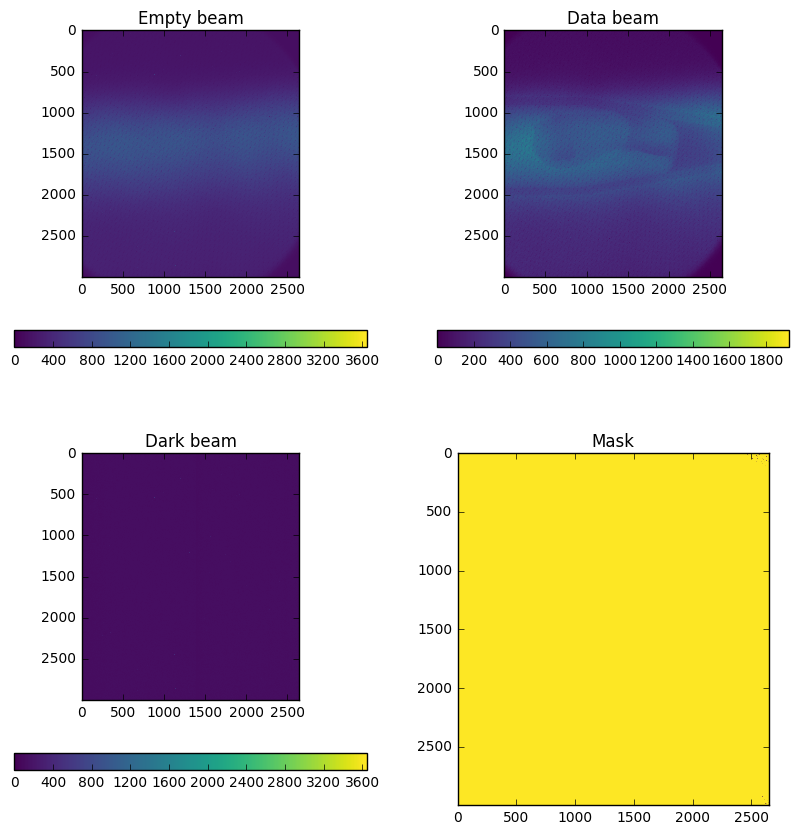

In [9]:
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(empty_image, vmin=0)
plt.colorbar(orientation='horizontal')
plt.title('Empty beam')

plt.subplot(222)
plt.imshow(data_images_clear[0], vmin=0)
plt.colorbar(orientation='horizontal')
plt.title('Data beam')


plt.subplot(223)
plt.imshow(dark_image, vmin=0)
plt.colorbar(orientation='horizontal')
plt.title('Dark beam')


plt.subplot(224)
plt.imshow(mask.astype('int'))
# plt.colorbar(orientation='horizontal')
plt.title('Mask')
#TODO: Check thresshold automaticaly
# plt.plot([sum(empty_beam > i) for i in np.arange(100)])

In [10]:
# plt.figure(figsize=(10,10))
# plt.imshow(data_images_clear[:,500:1500,501]/empty_beam[500:1500,501], cmap=plt.cm.viridis, interpolation='nearest')
# plt.axis('tight')
# plt.colorbar(orientation='horizontal')

In [11]:
del data_images
# del data_angles
del empty_image
del empty_images
del dark_images
del dark_image


In [12]:
def crop_mask(mask, up, bottom, left, right):
    threshold = 100
    mask_x_profile = mask.sum(axis=1)
    mask_x_min = np.argwhere(mask_x_profile>threshold).min()+up # up border
    mask_x_max = np.argwhere(mask_x_profile>threshold).max()-bottom # bottom border

    mask_y_profile = mask.sum(axis=0)
    mask_y_min = np.argwhere(mask_y_profile>threshold).min()+left # left border
    mask_y_max = np.argwhere(mask_y_profile>threshold).max()-right # right border
    return  mask_x_min, mask_x_max, mask_y_min, mask_y_max

INFO:root:Force create
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/data_images_masked.tmp
INFO:root:Force create
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/empty_images_masked.tmp


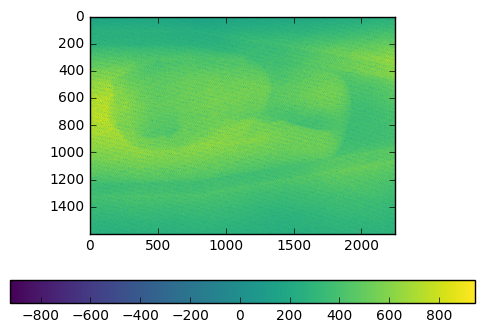

In [13]:
mask_x_min, mask_x_max, mask_y_min, mask_y_max = crop_mask(mask, 700, 700, 200, 200) #400, 400, 100, 100)

mask_new = np.copy(mask[mask_x_min:mask_x_max,mask_y_min:mask_y_max])
# empty_beam = empty_beam[mask_x_min:mask_x_max,mask_y_min:mask_y_max]
## FIX IT
# data_images_croped = data_images_croped[:, mask_x_min:mask_x_max,mask_y_min:mask_y_max]

data_images_masked, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'data_images_masked.tmp'),
                                   shape = (data_angles.shape[0],
                                           mask_new.shape[0], mask_new.shape[1]), dtype='float32',
                                   force_create=True)

empty_masked, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'empty_images_masked.tmp'),
                                   shape = (mask_new.shape[0], mask_new.shape[1]), dtype='float32',
                                   force_create=True)

empty_masked[:] = empty_beam[mask_x_min:mask_x_max,mask_y_min:mask_y_max]


plt.figure()
plt.imshow(data_images_clear[0, mask_x_min:mask_x_max,mask_y_min:mask_y_max])
plt.colorbar(orientation='horizontal')

for di in range(data_images_masked.shape[0]):
    data_images_masked[di] = data_images_clear[di, mask_x_min:mask_x_max,mask_y_min:mask_y_max]
#     data_images_masked[di] = cv2.medianBlur(data_images_masked[di],3)

In [14]:
# plt.figure(figsize=(10,10))
# plt.imshow(data_images_masked[:,:,501]/empty_masked[:,501], cmap=plt.cm.viridis, interpolation='nearest')
# plt.axis('tight')
# plt.colorbar(orientation='horizontal')

In [15]:
del empty_beam
del data_images_clear

In [16]:
def group_data(data_images,data_angles,  mmap_file_dir):
    uniq_angles,_ = tomotools.load_create_mm(
        os.path.join(mmap_file_dir,'uniq_angles.tmp'),
        shape=(len(list(set(data_angles))),),
        dtype='float32',force_create=True)
    uniq_angles[:] = list(set(data_angles))
    
    uniq_data_images,_ = tomotools.load_create_mm(
        os.path.join(mmap_file_dir,'uniq_data_images.tmp'),
        shape=(len(uniq_angles), data_images.shape[1], data_images.shape[2]),
        dtype='float32',force_create=True)

    for ua_id, ua in enumerate(uniq_angles):
        indexes = np.argwhere(data_angles==uniq_angles[ua_id])
        if len(indexes)>1:
            tmp_images = data_images[indexes]
            tmp_images = np.squeeze(tmp_images)
            mean_image = np.mean(tmp_images, axis=0)
            uniq_data_images[ua_id] = mean_image
        else:
            uniq_data_images[ua_id]=data_images[indexes]
    return uniq_data_images, uniq_angles

uniq_data_images, uniq_angles = group_data(data_images_masked, data_angles, tmp_dir)
del data_images_masked, data_angles

INFO:root:Force create
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/uniq_angles.tmp
INFO:root:Force create
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/uniq_data_images.tmp


In [17]:
#normalize data frames and calculate sinograms
# empty_masked[empty_masked <= 0] = 1e-9

for di in range(uniq_data_images.shape[0]):
    t = uniq_data_images[di]
    t=t/empty_masked
    t[t<0] = 1e-9
    t[t>1] = 1
    t[t<1e-8] = 1e-8
    uniq_data_images[di] = cv2.medianBlur(t,3)

del empty_masked

In [18]:
sinogram, _ = tomotools.load_create_mm(os.path.join(tmp_dir, 'sinogram.tmp'), shape=uniq_data_images.shape,
                         dtype='float32') 
ne.evaluate('-log(uniq_data_images)', out=sinogram);

INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/sinogram.tmp


In [19]:
# plt.figure(figsize=(7,5))
# plt.imshow(uniq_data_images[np.argsort(uniq_angles),:,int(sinogram.shape[-1]/1.75)])
# plt.axis('tight')
# # plt.colorbar()

In [20]:
del uniq_data_images

In [21]:
# # build frames for video
# images_dir = os.path.join(tmp_dir,'images')
# tomotools.mkdir_p(images_dir)
# im_max=np.max(sinogram)
# im_min=np.min(sinogram)
# print(im_min, im_max)
# for ia, a in tomotools.log_progress(list(enumerate(np.argsort(uniq_angles)))):
# #     print('{:34}'.format(ia))
#     plt.imsave(os.path.join(images_dir,'prj_{:03}.png'.format(ia)),
#                np.rot90(sinogram[a],3), vmin=im_min, vmax=im_max,
#                cmap=plt.cm.gray_r)

In [22]:
# !cd {images_dir} && avconv -r 10 -i "prj_%03d.png" -b:v 1000k prj.avi

In [23]:
# !cd {images_dir} && rm prj.mp4

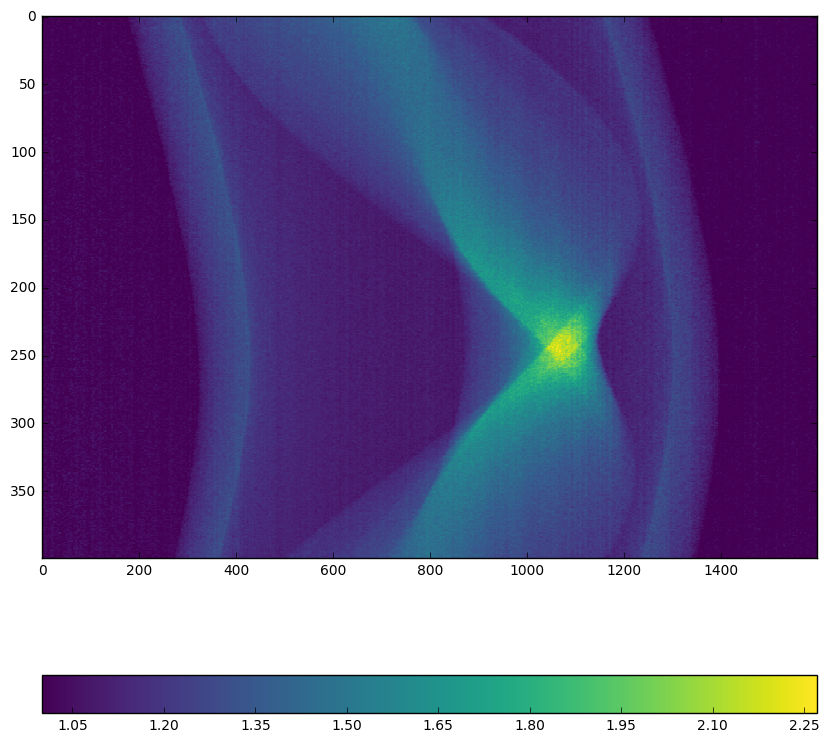

In [24]:
tmp_sinogram = sinogram[np.argsort(uniq_angles),:,int(sinogram.shape[-1]//2)+3]

plt.figure(figsize=(10,10))
plt.imshow(np.exp(tmp_sinogram), cmap=plt.cm.viridis, interpolation='nearest')
plt.axis('tight')
plt.colorbar(orientation='horizontal')

In [25]:
import scipy.ndimage
def my_rc(sino0, level):
    def get_my_b(level):
        t= np.mean(sino0, axis=0)
        gt = scipy.ndimage.filters.gaussian_filter1d(t,level/2.)
        return gt-t
    
    def get_my_a(level):
        my_b = get_my_b(level)
        return np.mean(my_b)/my_b.shape[0]
    
    my_a = get_my_a(level)
    my_b = get_my_b(level)
    
    res = sino0.copy()
    if not level==0:
        res+= sino0*my_a+my_b
    
    return res

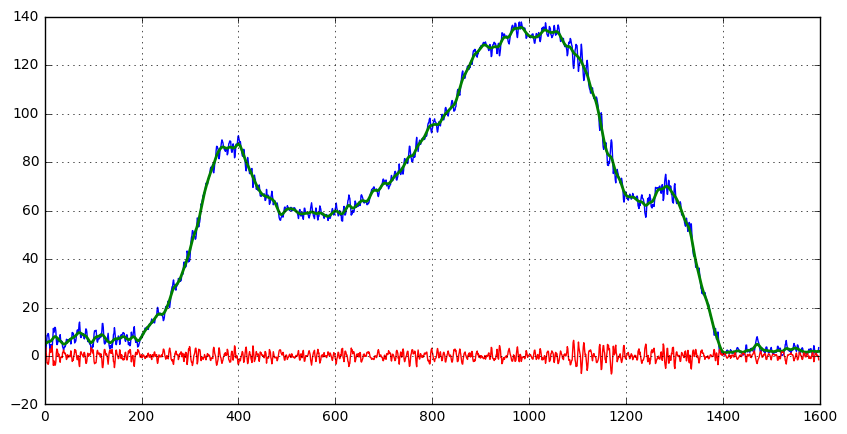

In [26]:
rc_level = 10
plt.figure(figsize=(10,5))
plt.plot(tmp_sinogram.sum(axis=0))
plt.plot(my_rc(tmp_sinogram,rc_level).sum(axis=0), lw=2)
plt.plot(my_rc(tmp_sinogram,rc_level).sum(axis=0)-tmp_sinogram.sum(axis=0))
plt.grid()

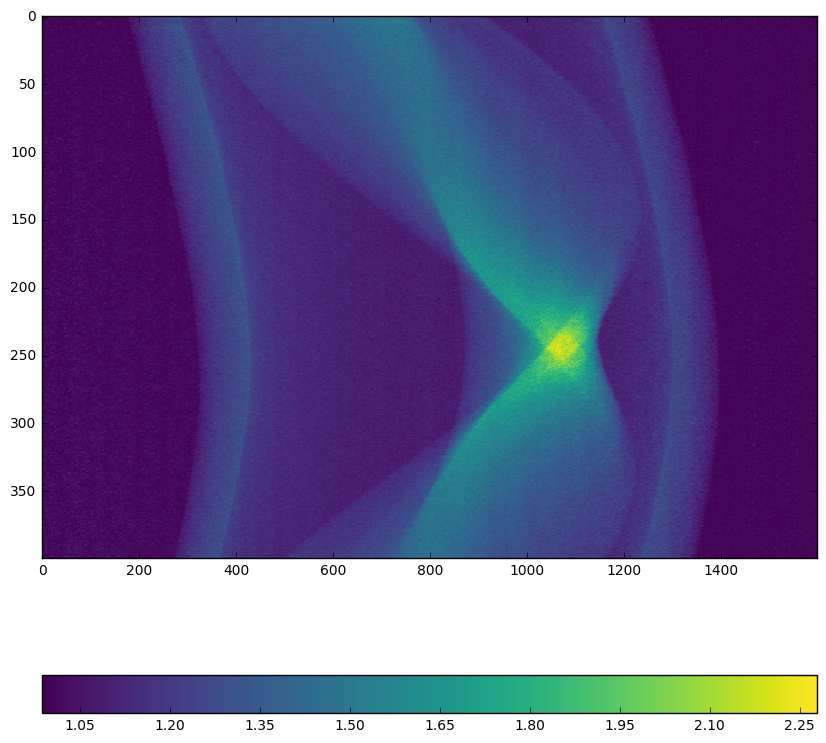

In [27]:
plt.figure(figsize=(10,10))
plt.imshow(np.exp(my_rc(tmp_sinogram, rc_level)), cmap=plt.cm.viridis, interpolation='nearest')
plt.axis('tight')
plt.colorbar(orientation='horizontal')

In [28]:
for s in tomotools.log_progress(range(sinogram.shape[1])):
    sinogram[:,s,:] = my_rc(sinogram[:,s,:],10)

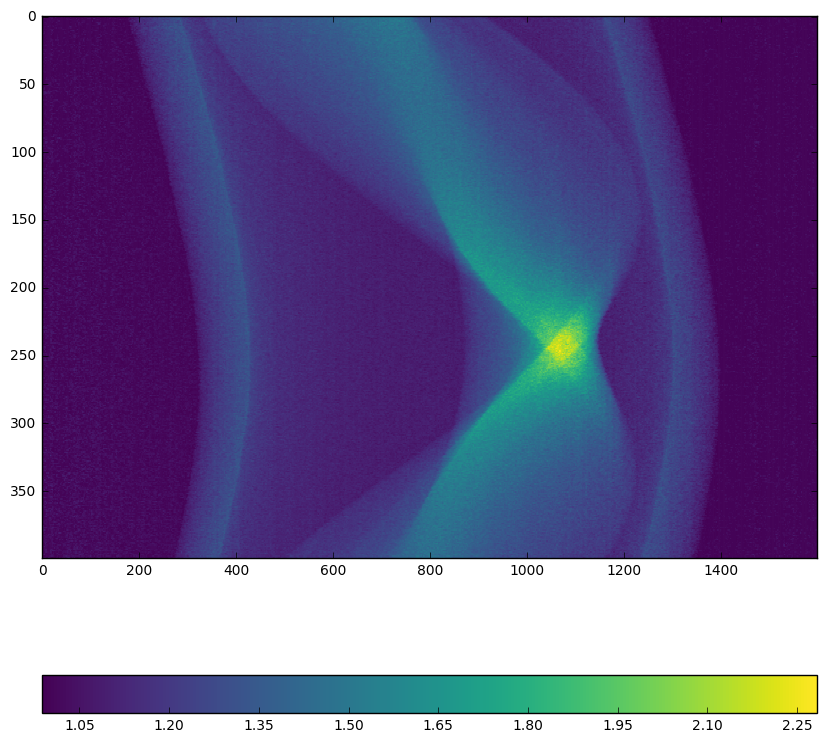

In [29]:
tmp_sinogram = sinogram[np.argsort(uniq_angles),:,int(sinogram.shape[-1]//2)+3]

plt.figure(figsize=(10,10))
plt.imshow(np.exp(tmp_sinogram), cmap=plt.cm.viridis, interpolation='nearest')
plt.axis('tight')
plt.colorbar(orientation='horizontal')

In [30]:
# seraching detector rotation angle
for zero_angle in uniq_angles:
#     zero_angle = np.min(uniq_angles)
    position_0 = np.argwhere(np.isclose(uniq_angles, zero_angle, atol=0.05))[0][0]
    position_180 = np.argwhere(np.isclose(uniq_angles, 180+zero_angle, atol=0.05))
    if len(position_180)>0:
        position_180=position_180[0][0]
        print uniq_angles[position_0], position_0
        print uniq_angles[position_180], position_180
        break

def cv_rotate(x, angle):
    """
    Rotate square array using OpenCV2 around center of the array
    :param x: 2d numpy array
    :param angle: angle in degrees
    :return: rotated array
    """
    x_center = tuple(
        np.array((x.shape[1], x.shape[0]), dtype='float32') / 2.0 - 0.5)
    rot_mat = cv2.getRotationMatrix2D(x_center, angle, 1.0)
    xro = cv2.warpAffine(
        x, rot_mat, (x.shape[1], x.shape[0]), flags=cv2.INTER_LINEAR)
    return xro


data_0 = np.rot90(sinogram[position_0]).copy()
data_180 = np.rot90(sinogram[position_180]).copy()

0.0 0
180.0 41


In [31]:
from scipy.optimize import minimize
def f(x):
    alfa= x[0]
    shift = int(x[1])
    if shift >= 0:
        t = enp.fliplr(cv_rotate(data_180[:,shift:],alfa))-cv_rotate(data_0[:,shift:],alfa)
    else:
        t = np.fliplr(cv_rotate(data_180[:,:shift],alfa))-cv_rotate(data_0[:,shift],alfa)
        
    res = np.sum(t*t)/np.prod(t.shape)
    return res

def corr(x):
    alfa= x[0]*10.
    shift = int(x[1])
    if shift >= 0:
        t_180 = data_180[:,shift:]
        t_0 = data_0[:,shift:]
    else:
        t_180 = data_180[:,:shift]
        t_0 = data_0[:,:shift]
    
    
#     t_mask = np.zeros_like(t_0)
#     shape_min = np.min(t_mask.shape)
#     r_mask = shape_min//2
#     X,Y = np.meshgrid(np.arange(t_mask.shape[1])-t_mask.shape[1]//2,
#                       np.arange(t_mask.shape[0])-t_mask.shape[0]//2)
#     t_mask = X**2+Y**2<r_mask**2    
    
    tt_180 = np.fliplr(cv_rotate(t_180,alfa))
    tt_180 = cv2.medianBlur(tt_180,5) #*t_mask
    tt_0 = cv_rotate(t_0,alfa)
    tt_0 = cv2.medianBlur(tt_0,5) #*t_mask
    res = -np.correlate(tt_0.flat,tt_180.flat)
#     TODO: add mask support 
#     res = -np.sum(tt_0*tt_180)/np.sqrt(np.sum(tt_0**2)*np.sum(tt_180**2))*np.prod(tt_0.shape) #*np.prod(t_mask.shape)
    return res

x0 = [0.1,-355]
res= minimize(corr, x0, method='Nelder-Mead')
print res

 final_simplex: (array([[ -1.30662163e-04,  -5.66892793e+01],
       [ -1.30661871e-04,  -5.66892219e+01],
       [ -1.30663420e-04,  -5.66892501e+01]]), array([-219779.8125, -219779.8125, -219779.8125]))
           fun: -219779.8125
       message: 'Optimization terminated successfully.'
          nfev: 138
           nit: 62
        status: 0
       success: True
             x: array([ -1.30662163e-04,  -5.66892793e+01])


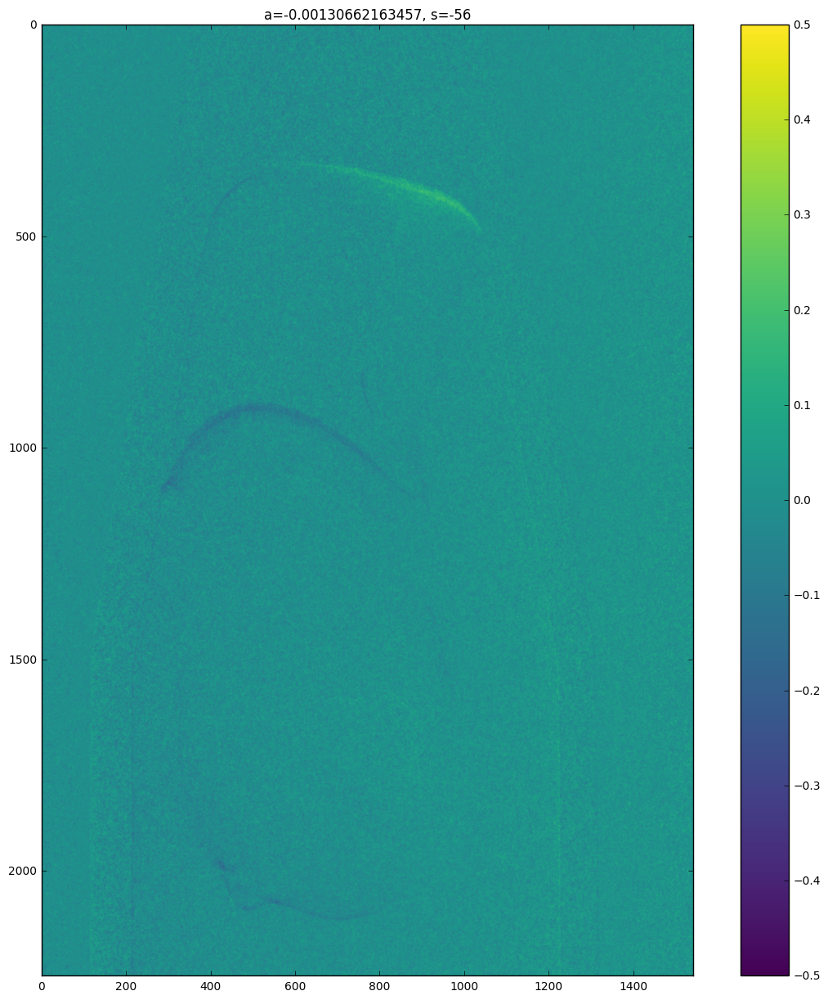

In [32]:
alfa, shift = res.x[0]*10., int(res.x[1])

if shift >= 0:
    t_180 = data_180[:,shift:]
    t_0 = data_0[:,shift:]
else:
    t_180 = data_180[:,:shift]
    t_0 = data_0[:,:shift]
    
tt_180 = np.fliplr(cv_rotate(t_180,alfa))
tt_0 = cv_rotate(t_0,alfa)
    
plt.figure(figsize=(15,15))
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis, vmin=-0.5, vmax=0.5)
plt.title('a={}, s={}'.format(alfa,shift))
plt.colorbar()
plt.show()


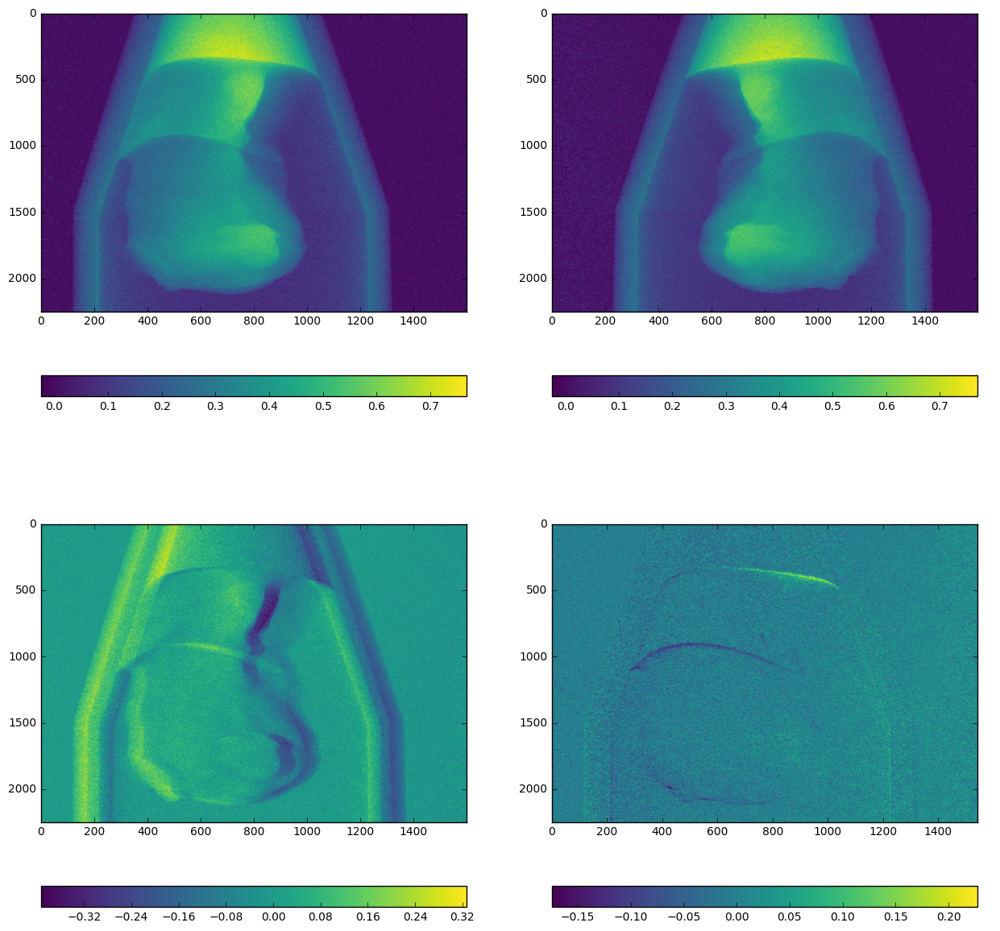

In [33]:
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(data_0,cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(222)
plt.imshow(data_180,cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(223)
plt.imshow(data_0 - np.fliplr(data_180),cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(224)
# alfa = 0.1
# shift = -77
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')

In [34]:
sinogram_fixed, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'sinogram_fixed.tmp'),
                                shape=(sinogram.shape[0], sinogram.shape[1]-abs(shift),sinogram.shape[2]),
                                dtype='float32')

#fix axis tlit
for i in range(sinogram.shape[0]):
    if shift >= 0:
        t = cv_rotate(sinogram[i,shift:],alfa)
    else:
        t = cv_rotate(sinogram[i,:shift],alfa)
    sinogram_fixed[i] = t
del sinogram

INFO:root:Shape missmatch.
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/sinogram_fixed.tmp


In [35]:
s1 = np.require(sinogram_fixed[...,int(sinogram_fixed.shape[-1]/1.5)],
                dtype=np.float32, requirements=['C'])

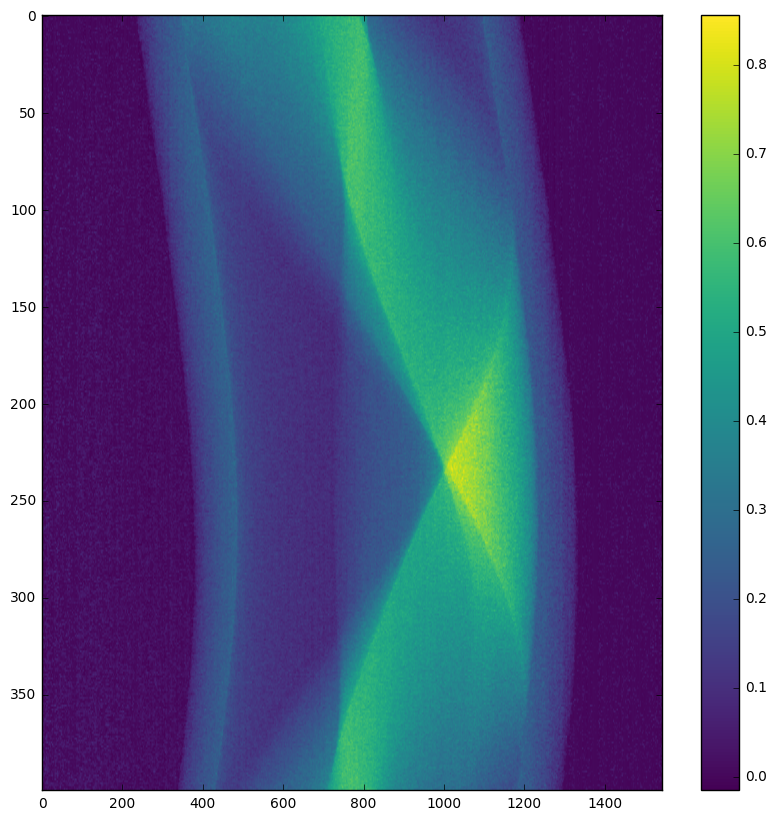

In [36]:
plt.figure(figsize=(10,10))
plt.imshow(sinogram_fixed[np.argsort(uniq_angles),:,int(sinogram_fixed.shape[-1]/1.5)], cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar()
plt.show()

In [37]:
del sinogram_fixed

In [38]:
del data_0, data_180 ,tmp_sinogram, uniq_angles

In [39]:
del mask, t_0, t_180, zero_angle

In [40]:
uniq_angles, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'uniq_angles.tmp'),
                             shape= None,
                             dtype='float32')
s1, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'sinogram_fixed.tmp'),
                                shape= None,
                                dtype='float32')

rec_vol, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'rec.tmp'),
               dtype=np.float32,
               shape = (s1.shape[-1],s1.shape[1],s1.shape[1]))



INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/uniq_angles.tmp
INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/sinogram_fixed.tmp
INFO:root:Shape missmatch.
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/rec.tmp


In [41]:
# import h5py
# with h5py.File('zub_pb.h5','w') as h5f:
#     h5f.create_dataset('sinogram',dtype='float32',
#                        data = s1[np.argsort(uniq_angles),...], 
#                        compression="gzip", compression_opts=1)

In [42]:
# import h5py
# with h5py.File('zub_pb.h5') as h5f:
#     sino = h5f['sinogram'][:,:,500]

# plt.figure(figsize=(10,10))
# plt.imshow(sino, cmap=plt.cm.viridis)
# plt.colorbar(orientation='horizontal')
# plt.axis('tight')
# plt.show()

In [43]:
# plt.figure(figsize=(10,10))
# plt.imshow(s1[np.argsort(uniq_angles),:,int(s1.shape[-1]/1.75)], cmap=plt.cm.viridis)
# plt.colorbar(orientation='horizontal')
# plt.axis('tight')
# plt.show()

In [44]:
def astra_tomo2d_parallel(sinogram, angles):
    astra.astra.set_gpu_index([1,])
    angles = angles.astype('float64')
    detector_size = sinogram.shape[1]
    

    rec_size = detector_size
    vol_geom = astra.create_vol_geom(rec_size, rec_size)
    proj_geom = astra.create_proj_geom('parallel', 1.0, detector_size, angles)


    sinogram_id = astra.data2d.create('-sino', proj_geom, data=sinogram)
    # Create a data object for the reconstruction
    rec_id = astra.data2d.create('-vol', vol_geom)
#     proj_id = astra.create_projector('strip', proj_geom, vol_geom) # for CPU reconstruction only
    # Set up the parameters for a reconstruction algorithm using the GPU
    cfg = astra.astra_dict('FBP_CUDA')
    cfg['ReconstructionDataId'] = rec_id
    cfg['ProjectionDataId'] = sinogram_id
#     cfg['ProjectorId'] = proj_id # for CPU reconstruction only
    cfg['option'] = {}
    
    alg_id = astra.algorithm.create(cfg)
    astra.algorithm.run(alg_id, 1)
    
    cfg = astra.astra_dict('CGLS_CUDA')
    cfg['ReconstructionDataId'] = rec_id
    cfg['ProjectionDataId'] = sinogram_id
#     cfg['ProjectorId'] = proj_id # for CPU reconstruction only
    cfg['option'] = {}

    alg_id = astra.algorithm.create(cfg)
    
    # Run 150 iterations of the algorithm
    astra.algorithm.run(alg_id, 10)
    
    # Get the result
    rec = astra.data2d.get(rec_id)
    
    # Clean up. Note that GPU memory is tied up in the algorithm object,
    # and main RAM in the data objects.
    astra.algorithm.delete(alg_id)
    astra.data2d.delete(rec_id)
    astra.data2d.delete(sinogram_id)
    astra.clear()
    return rec

def astra_tomo3d_parallel(sinogram, angles, rec_vol, slice_start, slice_stop):
    astra.astra.set_gpu_index([1,])
    angles = angles.astype('float64')
    detector_size = sinogram.shape[1]
#         slices_number = sinogram.shape[0]
    slices_number = slice_stop - slice_start
        
    rec_size = detector_size
    vol_geom = astra.create_vol_geom(rec_size, rec_size, slices_number)
    proj_geom = astra.create_proj_geom('parallel3d', 1.0, 1.0,  slices_number, detector_size, angles)


    sinogram_id = astra.data3d.create('-sino', proj_geom, np.rollaxis(sinogram,-1)[slice_start:slice_stop])
    # Create a data object for the reconstruction
#     rec_id = astra.data3d.link('-vol', vol_geom, rec_vol[slice_start:slice_stop])
    rec_id = astra.data3d.create('-vol', vol_geom)
    # Set up the parameters for a reconstruction algorithm using the GPU
    cfg = astra.astra_dict('CGLS3D_CUDA')
    cfg['ReconstructionDataId'] = rec_id
    cfg['ProjectionDataId'] = sinogram_id
#     cfg['ProjectorId'] = proj_id # for CPU reconstruction only
    cfg['option'] = {}
    #cfg['option']['MinConstraint'] = 0
    cfg['option']['MinConstraint'] = -0.01

    # Available algorithms:
    # SIRT_CUDA, SART_CUDA, EM_CUDA, FBP_CUDA (see the FBP sample)

    # Create the algorithm object from the configuration structure
    alg_id = astra.algorithm.create(cfg)
#     astra.data3d.info()
    # Run 150 iterations of the algorithm
    astra.algorithm.run(alg_id, 30)
    
    # Get the result
    rec = astra.data3d.get(rec_id)

    # Clean up. Note that GPU memory is tied up in the algorithm object,
    # and main RAM in the data objects.
    astra.algorithm.delete(alg_id)
    astra.data3d.delete(rec_id)
    astra.data3d.delete(sinogram_id)
    astra.clear()
    return rec

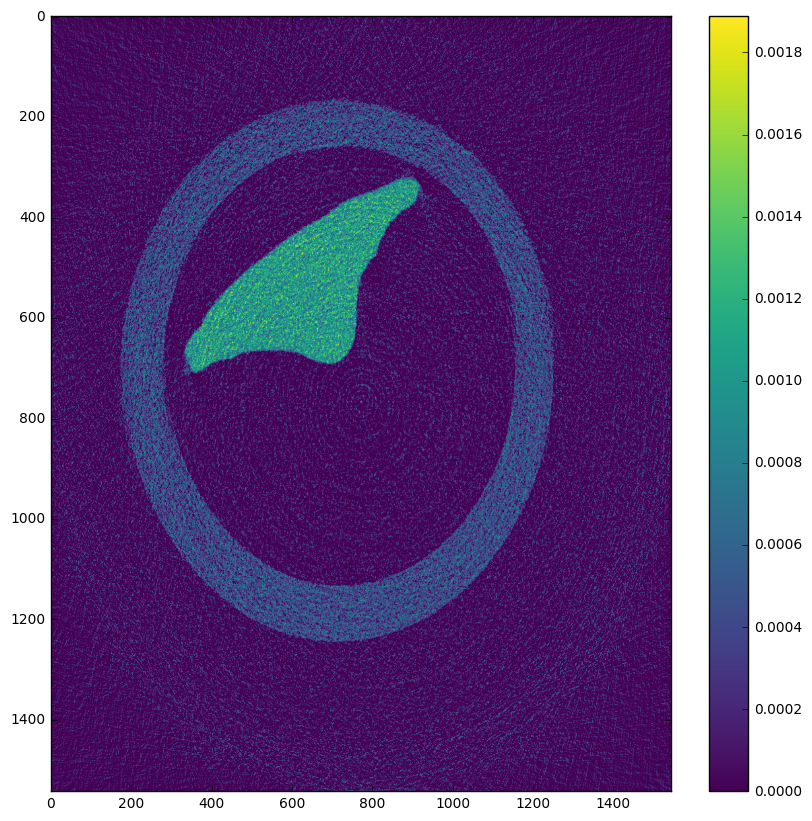

In [45]:
# %%timeit
#preview
sss = s1[...,int(s1.shape[-1]*0.5)]
rec_slice = astra_tomo2d_parallel(sss, uniq_angles*np.pi/180)

plt.figure(figsize=(10,10))
plt.imshow(rec_slice, vmin=0)
plt.axis('tight')
plt.colorbar()
plt.show()

In [46]:
# t = time.time()
# angles =np.array(uniq_angles)*np.pi/180
# t_rec_vol = astra_tomo2d_parallel(s1[...,600], angles)
# print(time.time()-t)

In [47]:
# plt.figure(figsize=(10,10))
# plt.imshow(t_rec_vol, vmin=0)
# plt.axis('tight')
# plt.colorbar()
# plt.show()

In [48]:
# #3d case
# t = time.time()
# print s1.shape
# step = 50
# angles =np.array(uniq_angles)*np.pi/180
# # for i in log_progress(range(1500, 1700, step)):
# for i in tomotools.log_progress(range(0, s1.shape[-1], step)):
#     slice_start= i 
#     slice_stop= min(i+step, s1.shape[-1])
#     rec_vol[slice_start:slice_stop] = astra_tomo3d_parallel(s1, angles,
#                                        slice_start=slice_start, slice_stop=slice_stop
#                                   )
# print(time.time()-t)

In [49]:
#multi 2d case
t = time.time()
print s1.shape
angles =np.array(uniq_angles)*np.pi/180
# for i in log_progress(range(1500, 1700, step)):
for i in tomotools.log_progress(range(0, s1.shape[-1])):
    rec_vol[i] = astra_tomo2d_parallel(s1[:,:,i], angles)
print(time.time()-t)

(400, 1543, 2249)
1107.13747787


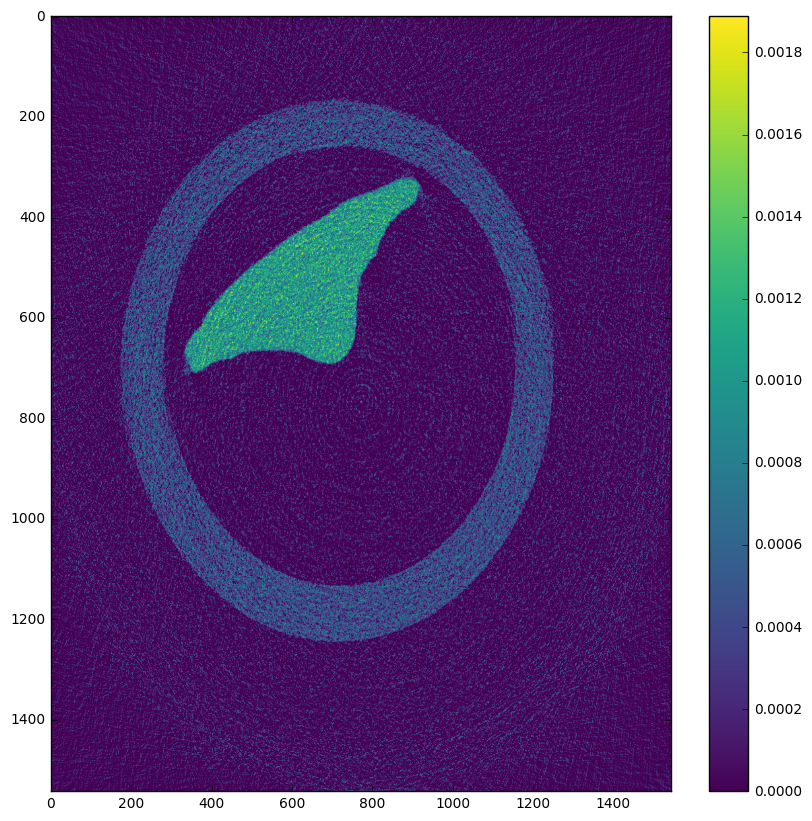

In [50]:
plt.figure(figsize=(10,10))
plt.imshow(rec_vol[int(rec_vol.shape[0]/2)], cmap=plt.cm.viridis, vmin=0)
plt.axis('tight')
plt.colorbar()
plt.show()

In [51]:
rec_vol_filtered, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'rec_filtered.tmp'),
               dtype=np.float32,
               shape = rec_vol.shape)

INFO:root:Shape missmatch.
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/ce2c8001-c4d2-4687-bad8-6913bec67256/rec_filtered.tmp


In [52]:
t = time.time()
print rec_vol.shape
step = 200
angles =np.array(uniq_angles)*np.pi/180
# for i in log_progress(range(1500, 1700, step)):
for i in tomotools.log_progress(range(0, rec_vol.shape[0], step)):
    slice_start= i 
    slice_stop= min(i+step, s1.shape[-1])
    rec_vol_filtered[slice_start:slice_stop] = tomopy.remove_ring(
        rec_vol[slice_start:slice_stop],
        thresh=0.0005,  theta_min=90, rwidth=10)
print(time.time()-t)

(2249, 1543, 1543)
203.272890091


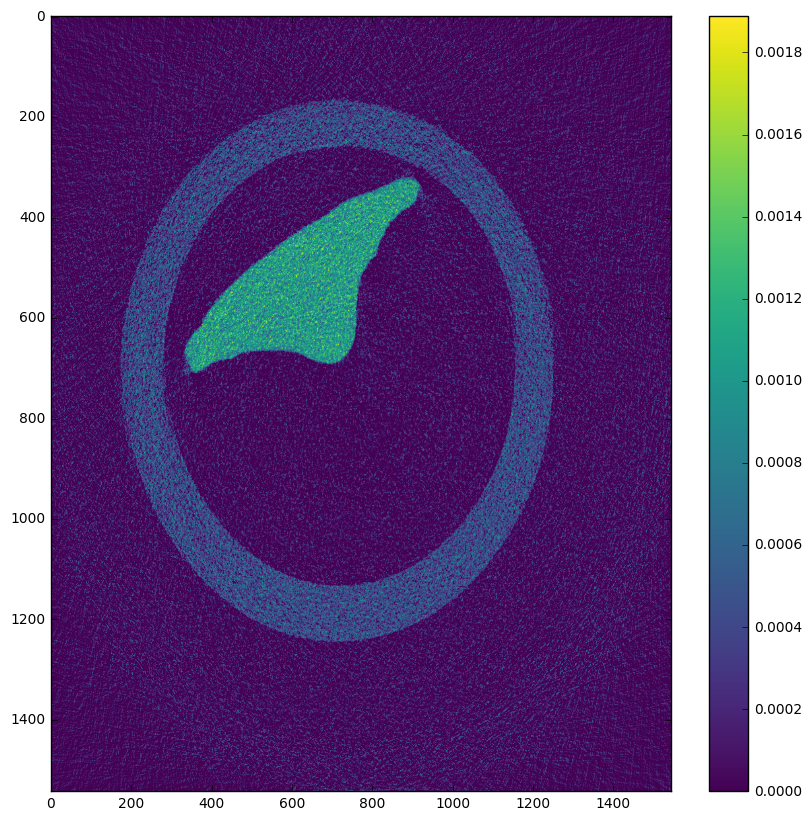

In [53]:
plt.figure(figsize=(10,10))
plt.imshow(rec_vol_filtered[int(rec_vol_filtered.shape[0]/2)], cmap=plt.cm.viridis, vmin=0)
plt.axis('tight')
plt.colorbar()
plt.show()

In [54]:
def save_amira(in_array, out_path, reshape=3):
    data_path = out_pathdata:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAywAAAM1CAYAAACSV3XOAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAAPYQAAD2EBqD+naQAAIABJREFUeJzsvcmPLUuS3vczj+HMc86Zd3hzveqq6okESEIQJXDRfwIXArjURgK00B8gQEsB0oIQBC0FAdJCS20EApoggCLVVKunqlev3nTnnDPPPMWJcNfCPCIyq7oodgOqd1EdVnioe/PmORHh4W5u9tlnn4tzjsoqq6yyyiqrrLLKKqussvfRzPd9A5VVVllllVVWWWWVVVZZZb/OqoSlssoqq6yyyiqrrLLKKntvrUpYKqusssoqq6yyyiqrrLL31qqEpbLKKqusssoqq6yyyip7b61KWCqrrLLKKqusssoqq6yy99aqhKWyyiqrrLLKKqusssoqe2+tSlgqq6yyyiqrrLLKKqussvfWqoSlssoqq6yyyiqrrLLKKntvrUpYKqusssoqq6yyyiqrrLL31qqEpbLKKqusssoqq6yyyip7b+29TlhE5D8QkRcishaRfykif/f7vqfKKqusssoqq6yyyiqr7Ddn723CIiL/GPjPgf8E+H3gz4F/JiJ73+uNVVZZZZVVVllllVVWWWW/MRPn3Pd9D3+lici/BP4v59x/5P8uwBvgnzrn/rPv9eYqq6yyyiqrrLLKKqusst+IvZcVFhGJgD8E/pf8Z04zq/8Z+Pvf131VVllllVVWWWWVVVZZZb9ZC7/vG/g1tgcEwNUv/fwK+Oyv+oCIjIA/Al4Cm/8/b66yyiqrrLLKKqussr+R1YHnwD9zzt19z/fyyETkKRqDvo9265x7/X3fxPdl72vC8utMgF/HYfsj4L/7Dd5LZZVVVllllVVWWWV/M/v3gP/++76J3ETkabMhr1br97NVAliJyOd/W5OW9zVhuQUy4PCXfn7Ar1ZdcnsJ0KFP8EuPNeKQEUdgDObpCfbVO0yng2s3kDSF1GLvx/rLIphBD3s/efQd7mgPGfSQF28w3R44R3ZzSzAcYLdb3NoXdawtPiP1Om6bgNOfBUeHZPdjgn4PO5vhNttH1zDtNna5BOcgDBERCAyIQJpBrYZbLPTvziFxhEszvWYcIVGEabVwqzV2sQBjynuKQkD0M8vVg6sK1CLYJnwd/owf9P9tslsFPKTfwc2WSLeNm86RKEKaDexigYjB7XZ6f5kt7tOdHRA4g331rvw3KO/FCKZex6U7pN/DXt4QHB3i0hRaDVivcbOFjhvo/fo/F3fc6+Cm8/J7rdX31mpiNxvM3hBnDO78CsIQ025hJ9NH9yEfPoGLm3IsRDDtFhKEZJMJEse45MF1jcENewSbnT5/LcZtE8z+HvbuvnjvX0df8MnuhxAYTKsF1uKSBKnVsfM5f5WZ4QCXprjZvBgziWOk28FmKXIwQu6nuNkcl1lEBGczzP6e/v54hl2tCM6OsdsEdzcGazGdTnnNMNDfny/Inhxg3lzj1mskinXscTrHAKnXcJstcjDC3U90bGo1nHPI8QHu5Vv/mV+y0CBBiNTrSByT3dwi9RpytK/vedjH2gwWK32nO/0Oc+Lf/3zJl9FP+Wz2MbI3xN3el+sgXxONOhjR9RkYzKCPW65w2y1kDozodzabugYAc3ZMFhvku3NdB7tdsYZ03rSQKCSbzcr5ejhCFmvkYA+ZL3VNxDH4OSH1WN/pbA5GkG4Heh1kk2Bv79j9wcfUXo2xywWsN2Cdrtl+D8ksLtnikhScJRgO9NqHIx33uynueA+MQc5vdA1kGaQZEkX6Pc0m0u2QXVwU92z6PX6x/Bd80v0HMJ4VczI4OyENHWa9w13dYvZH2Jt7TL+j79+5cn2kqfrJZh2p1XFxhL2+Ka8x6OOyFDdbYI4OII6w55d6b+0mttvGNBvw7hq3S4o5xaiHabTIhk3MV29xm035Dn6NmXYTF0VIssM1arBYI1GInS+g3STo93HjCUSRvus0w/7+Z0SvrsnGk+K7zckh7n6M2yT6bN0OtFvYt+eYbkffISANnbdfbv+YTzc/eLQWXZpi+l3s8Qj5xUsQA2GIW6/1Ph245QqpxdBoqF/Z7SAM9Lv3RkiSqM/PMtwuLfeKIFAozjpMs45drh+Ni+l0oFnHXt343zeYdhvSFLtcYdotXLOuazWzSK2G22zU763X6qtx+m+BwaUZUq9jOi2y8RQJQ9x2i9RqOu/vJtjFUq/d62KnM/WbxkCaEgz6ZPMFZtDDzee4VOewnc1wacZX6Z/wKb9b3L/Ua0ing725LZ9pNMDejdUvdbvY+zHS7SCjATKeQhhidzsdUz+GILg0gbTcY9XvhNCsw2yBhCHUYlyWYWo1nSvWIq0mbr3RPTlJdJ4DhEG5l4H6g9EAt9rgthvM8RH28hoTRzjrdFwHPexY10twsE92P0YCo894e6f3U3y//7MI0uvCdqu+z797024VYy39Lm4y4yv+nM/CP0R6HUQM2e2dPlccAw63Wut3D3owX+g6SFMkih77+7iG3Wz098UADqlFug78PCKzSBjh0p2uqXqD9LCPeXGOSxKCdpvM3x8CplaDzOq8atQ17sn3+TDERBF2u9X9p93CbhPusnfctqaYVYLLdFwyUuZMwMdt75HtrdaO//a/POTzT+Lv+14e2c+/Tvgn/+FVE63+VAnL+2LOuZ2I/Anwj4D/EYqm+38E/NNf87ENwA/jv0dn1y5/KqKONsvAQWAHuG6AGCG7WWJ6fRh2ETMku7vXj6xqmKc/Iru4Kh3PVYYsEwj2MbYOtRqZZEjrCBNl2GyGtNu4xUID1G4bkh3UQcJQg9ysjewNEARrImgb3HZTbuprA0R+89LN3NTb2NUKCQLcxkJQ8wE6sMuf0f85FaTdx52ewdevdCN0DlwGVgP74PAEm96qg843RReB7AhcSHsR4WSgYzZz4HowN5jOGS7NMKMDnL3XAEEcWDRItBr88S7FHB9gZYUEEc7qTUq9gVuvIQNJaxAEmF2dTFJkGSP1DsRtqAdQ22AvryHLMI0uNluCd3RSq2FMnUx06ppWC7vZ6ntaG3B1AhlhD4e4Ww0SmVuQgR8rAw7MOCAbPcPU1rjxVO994cdDBkjYwGVbDQ6jSBOWuw3B4SnZ+lbHU1IYg9SPNPiPY4LtF/R7z3SjnFsQg8QdzGCPbHWhm2cYPg74JwIuRBrHSC3WAIEIpg5SQ9Cokd2D6Z1iZ3OC/gC7XCJhX5OIIMJKDbkXZHAAgx42TWE2L587g8D2yFY7ZFYD14f9U9zVTbmpRv7/t2C6hxA2sdYh7Tam3SINHdgQoY/pNnVjSndgXZngWcE0e9jbCcQHCAauLW7bhOsMwgB38IxgudXnbNaRtKFrZHNJnDo6wZAgPsCKg3oTliv9/m0CJ2cEEuLqW8DhpnPc2qELDcQn7CZoY0XfGxcJ5vhQ56REuNCqP4hCgrMT3P0YO5mDGSDtBm65hGsLpkEQ7LE7PcLcO2ynjXl6Cl+/QWoRIDgCvcfJCqzBhB2sTQnOQ7I7C1kNqOlc7XWxy5UGL8MjJMmw4zFMDRLukT7/AeHra9i0YAr0O9CuacBhMx/gG8zTU2S+xO4E4gPIrK7nKQSNBv36MRwfayJRi+HdGpoNCBsQjDBJGysW1zvC3M50zjnR4DrT5NotN0jUgUmCsz0FGoYDaNRxgSAyY1dv4o5HRNMAN5sjYQdZONxkh2mf4moxbjzFrVbIIkakgf1iAlkDpKHjEIV673kyGEWQphrk1hrY8RTpD2GxwoyOyc4vINyD3gi5myG9J7jFAml2sfMFZtnCLmOgr34RMJsmdptA0FEg4PgUNgk2TGCeFWtEBvuIFcI5dGWAhDHOJrADMxrhWnVkG+Jqh/pOUjA//BFYh3t7iZMaJCBhE0eMNAJNQFtNcA1YznGJePAo0+AxScCCdNq4+RJcHaTuQZkZ5skpzBe4VYqTAeaHn+BuxzCba+AZtxFijDTJrE/YtxZpjTwYE+vasRZI1f/GEdJs65zPOiAhpjnC7nakJ8+J4hXum5e6fyzVHwbDIdY57P0Ys4qh3kZ2AY4I9rswW+KSFjhHSExXBurj2y3scoWsdF+RRgO33RJ0TslcH8YTJGniwgA++gTz7Tvs3CCNGtQ6yOhQA+S7e8zpMfbdBdJp4XY7TTQ2G8jA0MFKRHB6BttEAYadQ8I9pNPB7XY4N4c1uh4DBa6C/oDs7q6YK8HeCGcMdn2DGR0jtQ6uEeC2W73m3glutkCifU0SNnXwfza2jRt0cIslSIrp97GzGRinPn+6AxpIa0/3Qmsx/SPs8hLpdCDNcBIQuohu4xg2FozofiwhdHrIaouTBTLoI0GAzQyB62NdiiQOu80UVDCCWIeTBCcPAMotIC1Mv+fBFofpDxSwOHmC2eywL+5gXUdaQ9x0BdEQ0hSzN9LQZDLFSR0SA9LAtBQYM82O7nvSAHEEjRGuE9Bfn/BRHGMXtxDr+p7Ze/5YW5TfS/r+55/E/MFP6t/3bVT2S/ZeNt17+y+Af19E/omI/AD4r4Em8N/8az+VA1M5ou+cBifebLLF2QyCAGk1sXf3yN0ENxogdQ2kXZaRvXmH1GLMwP8ccOs1brXCrje4uaK3XN9jV2t1aPN5kQhoILXxVQhFiNztPcSRIumZIpKkGRiPIFnrf1eTleBgXxMDa3Ei+hziEeThUD/j/57/2d3eI2+vkEZDg+16TZHaMIQg0A3/AWJN6BFnP2by9ER/Jqa4b6zFzhe4zZbs5RtFe33lohhj//8ShjBXB+l2O6ReL+/T36vbbnUs0xRpNmG7xd7eIRhcPYbx1Cdazm9I6ePPmnLa2mSnQXa9jhn0wVn9rtkSiSOfqHpEut0uxtjejwmWW8xopMiXc4qSo0mR22713p1Dhv1ig8tu7zSB8Yiz/lnnV1GRCYOiqob4e27UirnprCXYV4qsNOrF+LnNhly1T3pdfR4gu7jUYHcyRep17HKB22w0ib0f4/y13GaDDXTc+eBEA6V8aoQR2fUNMhro/R7vwXqDNBpIq6mB+MNxnc+xF1eKejbrZDe3mOWWYKfryWUpptnURNW/6+DoUNfUYgEmIPvkFPf5h0jkk8t2C7YJ8uZSK4kiSLJDjMFeXGKenOJ2qVaKbnyVz1dh8mRk98E+27MedtDE3txpcoGfy6BI//5QkylAggDxVQCp13RMfBWGNGV32C7GnCAoqnX5vM++fUF4M9P7v59jXpzDeq1+oteE/aGijiLI2ZEmIMboOisGX3RcZjOdU9Yiuwx6Hf23OAYjBP/iL2G9hbMjXJLgLq61omozTLeL6bQInpyQheDaTZj4Km29DmGEGQ6QzGqikyfEeXVyt9O5Zi12s0H2hgRjrebaqSYtJAnu7FBR7k+e4x4g/ebogPXvneFu7+B2AsMe0XRD9N01brFE2i3cfKl+Yr0mu7vXqpeAOTlCDkbYqfo9rXLo/C7mexQVbgLnEBP49WcxzSZum+h9DvuYbgdZqs+1N7dkP/oAGg2k3cJ++woxj7c1O56AMQSjoQdVruB2rN9TqxXvCBNgr6610tHtPloPbrlU33Z+UyDc7ngP+/VLZL708zD/5XyN+HUZx7jrO0Xvh0PILKbbKfyF1Gs6B3CwWmOePcENuwQHezCbazC5SzE/+gz37gp3feur8w52O8ygR3Z9U/jM3Bfk321GGnDmzyqH+/pucpS/UdeE0TmiyynuxRsQIRgOCEZDrSQulnpve0O970EH4hhpNnBXt7jVSvfUel39nwcJ7XSG6XWR/T31r52WVumTLUx1XfHZc+T0CPnqNdRrBIcHWhGZzXHLtVawAddp+HexQqwrfDJQ+O7s4orMV3JMVxMVOx7rOgJNiL1fwFqy+/vyO86OsWcHuj6bTdjtsPcTXJJgswzCCMmc7sf5+uq2kJMDgr0RtJtaDfb/ZicT/a4o1LH3e6DkFTURbNPPvyxDTFD4HhHUb+ZgpjGYINL3BgpSLHSftUmCpCl2NsccHei1djvseKKJ0S+ZaTT9fIPg+MhXYIRgpdX5fJ645Uqve3aM/PhTSFOym9uiGiXNBhJGCs5CWan3D2DXGyS1Ckw98EOm1yuuX1llfx17bxMW59z/APzHwH8K/CnwE+CPnHM3/7rPybBf0ITyIP3RxnN1A9sEJ4Kc6OLOpjNYrQsnJnFUUFHseKwoebOhm20YamDoS68uSTQQOzlUR+6cJjmxd1Deaedm35xrMBUEuIn/ufVJSxD44FcDsOzOU2L2hogPsoLDff3IeAxhVCY7oBuQterMVorkumSnFKwkwQz7SLNZOts0LcrV+jA+kHIOsrQIxIqxDXV83GajAVC365Mbn0SNhp6aUyaIeQnYrVZIs4nZH6nDymlxqxXSboEI2TcvsCFaPYhjvf/tlpymB6JUgfEDul6eJGy3ZZAmgnt3VW7gzul14kjHuBYhcYxdLMm+faGbQqAosQ6yp881NdmyuwTT7WGenT0IuHwVr1lXx52PVRgi/S7m+FDRpLw6k+5wo64+QxxjwwDT7yOtNtLyiZ8xRTCUdmtwMNS5K6IIqXO4T5+CQ4Oz1VI3buMpIiLw9kq/4y++KqkDoCV/gM0WdzvGGp9IbTZIv6ubLVoFkJFeV+o1SFMt+6epJg+NGkSR0g4nEw00RQj29zUhqtU8FS5jd9rH3E4KKo60W2WAmOSbXlODwV5XKwICyQcH5bv0895lFtupU/vpG8L/48+RX7zSe4pjzNmJJiatJhJFuLuJzl2AbktpD3tD3KfPcbW4rAYag/njn5dBQZoWCW4xp7tdXLdFMBpBo65r2VoktZjxUgPnJNGg+t2loufG6HPm9MPf+RTT8MHWYqH3GYYa/O8PlVqR+sQ6s+yOe5j9EQ/NzmbY+YJ00IJ6DRf5Kp2IJsc207HcbnFXt0pZCR8U0Hep0sTCEPfpU5KfPMWFxvuFQRk8hyGs1rhuC/fxGWZ/D3c4JHt2QO3bO03koxB3N8FlVp/BWtKPT0qKkwdE3GrN7gdP9DqTeZHEy48+0Urbel34nzwhcIhSGZNtkfSll1fQqOvv3U+w4wmCIfj4OVhLdLvEHvQ9PSUognWM0TVWq2GGA6UottT/2eUSu9eHbrtco5f51uKBEiMEHz3XMUt2cD/BrksKqdwq7Sw7v1R6TrHWlJ6TA0Hiqb9ut8MZv3Yf7Alut4P1Wim3UYRt15F319jJrKALEYXYL78tKax+X5M4LsZdulpBItQAWdotaLXILi51/icJMvJUyywrwBu3S7HTqa71V+dIr4P59EN2H59opcLZR5Qwabe1+rRYktUCZH+IGY0w/Z6OW+rpbmGI2d+Hg5EG4GdHyDbBLZa4u4mCJY0G5vUV3E1wybbYw+x4UtBpAVy3RdpvFs/udjtcS9cUHz8rKvAPA+IC2DIG0+/pvNztikQGfMV+NNDPWAdfvUIGXdxqhRt01U+1W8jvfIR8ePYrCYA72oPZEns/0b19MuOXTVotGA0KxoPGCRTVhmJurD1AEMfqY3epjmcUafPuYlGCi+s1brOGONY1f7xH8PwpZBnZ5RVulidoj0k0ptPBOYttqH9ys3mxDrPbOwUSPT1U4hjTaWNfv4NvXheJv7RamtA1G7h0h115gNKPjewPNQ5qt3zlSnBSzlmioIgL3lezOOx797/3tq/mN2bvbcIC4Jz7r5xzz51zDefc33fO/d//X5+RzGI8suzSFAlCgv095QHn37vbYe/usW8udNMPA5gvdONyTvnFnh8MuhClVivQUXJ0wFcgsqtrgu0OGQ6K4FTaGpSYJyclogv6+TSFQKseBdJgfdBUJA9OEewsg/lSAxpQikEc67XTnW4m9Ro8SC4KFCZNFWlJEt0kb+4UTd97HAwVCV2aYcUiPuDKUepi3LJMAzG/QdrpTGlb/Z4GR1mm4/wwUHqwxtxyqaj4oPOIo+3WG3WEnTbBtuQnB6ORbnrHhxr0hoEiwSLFO5BGWcGRbgep1ZFeFxkNMHsjzPFReZ2VL8PHMWbQJzzYB4dW3B6Mg1stcTZDQo/GLTfYyaQMELMMm/csbRLscoUzUiCr2XevlG++S7VK1+0isxUyWwEOE8canB0OlQPfaRdzIw/og+/Osb/4TjcG53A+wDGbnW54x/uKxgvIoId77gPGRgPz4ZMyWcsD94dj4Bzm7Y0G6gL27QW8ucQMB9j5HDefa7BgFekuKkNxhHtzUQZIHV+dMAYXKkjgcBr8BAGtr+70uwOjgd27C+VFn56Ulc92SxPd5aqoIMZ/9l2xXl2a4f7ej7XP5PKu4I47NPBzWYZ9e052uodbrrDzhVaeui0N/vYUxXd3Y+wugdVarxMEmE8/9AFCWL7/k33tZcjfSbeNrLe4fhvynrM4hn5XN/dtgsMhgx4miIpEjI+f6lyNIuTNhVbmfLXR9Hu6yYchZpdpIJBX6dYbgmWKyxPiHHFtNHDPjgnGC2y/CW8vFa13DrdYkv5bPy6u7e7GZfJljM6hniL60mpCp6nBnBgN4BfLEmR4c6l9ES/OCXaO7O07AmuIzsfw9grEYI9HbP/eZ5rsjoZIrUbwZ18/mGQ6J+ST58TfXeEubwsKDMYgqVX6i08wpNF4XIFNyv4mosij1plWMYwh+PgD0k9OWH3QxwwGsFxj0QC8qK7k3ycefff+044nOp0bDczdFNdtwW5HcHhQBnfik+tuB7feYEaaVNrJtPTPxmDiGoGvgppajeD0WP9tp2vUPD2Beg2zNyzWt7sda3UkLOec6fW1Sp+muN0O8/Ya19TKqzlR/+UWS6Xl+EpCnnC43Q632igYs0t1vE4ONNB9eoy7u9cxz3PJftf3zEgxTi5L/TrQxM2MtAoUfv22TBqyDLfdYhqaFNuXr/XvUQ2mC0i0dys3aTUxva6+szRVkOD1edkvdLSn4MJ6rYHydqvveL7QxDL3W77fzD09JvzTr5FOW5NqgNNDpSm+uiDz/T3SbGp1Mk1xvi/VDTq+ByRSimTwAOQ73lMft6fVSXN2pEmiCFzeIp029sk+cj/Hff3yESBnel2Cl5fYu3tNth6s10fMh70B9s27MjlJU62wbxPk8r58n/l97XbY+3FRtcrnU75nShTB/qAciyzDDtpkL19jb8uKEVACQ9732HSHeXKCWIdp1B/1ukqz4b8/RvZH6udEQIwm7EFAcHpS7Fv5GnXeJ0tTKzcmjDCetWCdRRo17d2LYzBGq+e/tC9VVtm/ib3XCcvfxFyaKtrl6Uou2WqDbi32i/ZBQpBXNNIUl2UFUkqq/FPxqCj4oNpTtdjtHtGscE6pEPdKB3Hzhf5+s4G7nz4KznMHQGahVisdM75M7UvWZJlWcZxTVHM0UIcSBEizgfnoWdlwvtkW91SYMUXJ3Dw5VueSV4fu7gmenpW/n2VIHHPEE+R2poHgdutpSw+aPxv1Ep1GExCcU6dorY7vwVBL4T5gMPX6Y+cNuJdvyxKxCHz6XDfEzRa59uX/9RrrkZ/0uI/ptH3Fx/hrJgU6iIiW99+80/s9GGJv7hT5rMcasOFpEs7hlrpJZpOJlrvz6tnDahJgZ3MNyn2CyXRRImRJgjk60MqNEcRoxeTIPNMvyCsi8wWkOw0Uc7RwvdaEZrkGZ3HDTjkW+VzxfSUFlSG3y1v97vNrDcy3CSQp8vKdH1wL25LiR5F0+meLI6X7eEQXB1iHXSy0B6DfJ/3h00dzMEesbbdZUEmkqdUM02lrA+3NLfwd5fNLo4F0WtjLGwUDjkYl4usc2btzDZQ/fYp9d6FzwW/mRzzFTmdFRcj0e4RfvYV6XCCkUq9Dp6Vz2iqSF1zcewqc06bbtxcQRQS3M8zBHqbXxfziFSKajEuzoVU4UAGHfU/pqNdxya6otkkU4W7u2B1ooBcMdR3aXkNFIrIME8VkV7fYuSaVcnqI+/m3msQ8RNONYPp93HyJW+n4F1UwT1t02y3B12+0h8DTdACyz84w1xPsmwvC6VbndauBe3qERBHxVxdkkeGIJ3oP9bpWcmqKwIqfE9JpE4xXNP70pVLaMqvJtp8bZJmKOvgA1LTbGnBNZgVyLt+8IX4zRkQ0qQ+DEkTx81gO93B/8aUi2CeHJf2o09ZKgV8LptVCum3Mh0+Rw32lpfnGf+IY96OPC+AlF7EgzVg/adH46hY7HpNdXhG8u9PqYM0DGb7yYMcT3MmeJtF+Tps41nWxP8SM58jpEdnFZZGQHsUf4AIDnRb2/FLXSh7U9boABEcHyGiAPRjqfGw1C0Tf9Pt+7mj/SHZ1Xfp1nPr5BzRaa31/Xl41GXQxUaTA2pt35VoGpQHlSayvWEoUQrOp9+kcnF9rZfAXL/SzQYCzGeGTM9y10igfVqEK8Ysg0gRlPMW+flcKm/i5YYYDrezvdki9RjAYwHimCUy75PsfyTP1jT5JdefXmsxEfj6HIfQ6uk94kzAo5o/0OkU1Lr//wIkCcx+cqX9pNjBfvdR7z1Kdp0a0cpL/559PbieaXJsAdqnOZRHcDz+Ce1/FMmgV69U73M29rsdBHzefE1zca/X0YaKDAnZFwJ+vg7qCYTmNHECmy0diPOb0qJgPRcXGWqVaA0fNT/VnHtCUVlPBjb2RzrVaDQlC3Vucw3Q7mG9z/++KxEOvdYx5kCyYWg17fo27VSo7oJTERl3ppEGgAM54qu91vgAPRpmDfd2PXr7TvS1nOogoxbPZUH+fZrhkp2IECAQh9u25ChbUaxCGBPVyvlRW2b+p/dYlLPQ72DfnBK2y8d7ZTFGQ7faRY9QKiqcvbLYaqPj+FjuZKPK9NywCfW201U2WICjQFtPrqlNo1AtH6ZJEaQ51H6g96Kkx7aZXp5kpIuH7UaTf040x+FUtBLHa/O32+8rnrkdKk8jRJmsLHnj+9xzxy5/LDPoaYNcbZO8udINEaSDSqHMkT1UxDEXI7HRG8NEH5VcuVxrU/JKyj10ukShSZMyiqKe/L/FBl1K8HlDzckctgvviG3iqjvVR2TMPav7ky4LiRlt7c4giTSgf0MBAq0t2s8F8+oGO/XKj13q+mPzxAAAgAElEQVSQjLhkq+OcWdx0VqLpOcqc9xytVpCkBb3Q/uAZ5vmTgi/tpj6h2SZa7Wo2OOn+jt5OrVY8u10syd75noY4hnpNS/znl0qF+uIbHS9jkFFf36NHo4v37xNbu1ip0MDZAfZI543b72viBpo8dlv6TA+R1HxctwlyP4PRoFTGiYJiXNx6g4lqmN/5tECcJQgw/R5msiw2ROm2dcOezXWjzSzyl1/jTvaRQQ+SFPt7nyAnh8h8jTQbZJ8/K9/VsxPcXh/z6QdaXWnUkUaDw8ZHBE9OC9U9N19Aq4kdT7E//lABge0WJjPt8QkDHdNOqwz+t4lWnA73cKJBXk5nsDMNsPjgBBcHMOhqYhMrCmi//PbxHBhrtShYKuUwux8rh/67d7j7Ccb3mQlO/QJghx3k9FApIrN52TtQb2CNw87nyNGeUi8OS7n/9PMz/fx0qhSVB+ssG7Zxmy32oxNFfqNI5+75LdRiVVy6uuX48Pd1jNZr7S3xfVhul3g/tsW9OSc7GiI3GsgFgz7S72qFOO+5WiyRdaIqYT//2jfBe277bod89xY3aKs6kwjWrx9zsKfXu/Q9FbVYk31jdL1a59dTgPvJp0p7zCyZ3SGbLdLvaeLRaMDvfkrwQteNtFs6zlGExdH+5y+R1Ub9Z7eDm8ywk6lW2BoNrWA3GyrC8PWrRz7LTmeYT56ralStpupSeWAowtHn/xAThthvX5ErNNr5HLM3wk2mmoScX6k63S++0+Tu3QX27bkCSl4x0b69gDRTP5yvNXhEnTNnJ8jaU8YcyGfPsVe3RQ+X6fcwo1HxGeds0ZumtEMhu7tXtUu/yl2aqh/Pr2MtYp3O/QdKhdLtKhIOup5P93V9txqq3JgnmYM+NOpk9UDfX7uF2+7I7u5KQOVmrO9ahOPmJ+y6UdGbRWhwnz3H1SPMoK/U5KlX8OtoH5fbbDVortcRJ6XqplemdHGE++iJsiacVUrqclVUHux8jkRxWY1AEf/Ch/a7WukKAoKDPczRAYET3HyhlMyrexU9EAqlPLdZ49Yb7LX2xOSVnZzuWfQ4Hh9orODpubqYS1r0o16bdkuBjjxhDIKSTuwcBAHH8kwFXA72tFK0XGkC66vjOAeTedFraWfzosqhfXj+PoJARQr6Pd3LQJO1ZIsZDRRY2BtpfODHnzRVwCdNMbHSfU2no8n/5ZX6Uc9QMH1Pg3RO73Oz1ffygGbmtlsFNnyvpvMMkyxXZX1PzTpL9p79Zx8m8X9L7bcuYXHzBebZKa7b1MAwb5DOJUz7PeUKx7FHQbwKlO/nEF9hAchubslGLW1UDgJskmhj5nyB8b0kgA+E5khNUYOCNpVmiAM5GJX8zUA/b6czTVqcxfrGP3t9ow20UpZwc7N399p0ej3WoPLNFcFogGk2tTScc3QfjsXSN4de3iBiNJhNM1Umy7IiYHVpWkhXSqOuqORyVZZ9HyBLMlK0pgjyH4wB1mKvrjXgOhhp4/VM0WW322nz4dHB4895zrLczfS6T4/K/pUHm7ydLxTNWqxKoYBcVehBsymASVK4uFX1npzuEASPnsN5yVG33bL9+EDHMI5103sgN+q2G5/ATjF/8bVSPFpKNyKOtFcFFD2sRdiGR84eVJC0r8MHGWjy6ZIEwgjb9T+PYw3UZwvk5LBsAAcvj731aGiCXS4xjQZy5Z3+N68fNGNm2G2iSdX+4DE9D3TTCA2y2pSUoYORp2hZTb6XG9yrd7rpel6626VFVcwtVyoD3qwrIu80wXXbLfzsa+zFlTbhv7rSngNP+Qi+equfDwM4vyF6N8a9voBWAzHaeyCrDdlbRQuDk2N9ByKQJARv7kp0OopI3U6lrNMEd32rdMBhX4OSqKY0vkBUqc4YTM9vsJ0WcjuD2VIrD9Zip1NsLMUYFs3LOBj0kG/faTIZxxCFheiGaze06nJ6pKIItRj5i68Vkc3XRRhgTk80qBLtA7CCJlv3vtckMAR/8pXKKDebyqHf7Ypr1n72VumFX71B5itcFCkynKYKOOyPNEAIg0d+wM0XSvERU/TnueUKcz3RJCUwSiPJHJLsMMfHGngC1OOyarw/0ODDUzBdmiKTJbJawzZR5BSUq56DLn/wudLw5isNjBu1ApG2my3B2xvc63MVPnl1qdSgyVTnVpLAv/qpzqk4Lip3brfDvXxD1ozIbm+VEjibl2t82MN028iTY/85qzTAXzL7+pxkv6EN2qnSndxyBc4RLLZKMcqrpPsKIrj5QudjovRUt1phhn0N6DeJUsfqNbL5ovRfaUr2olQglVoNN+r5Ho8Au9sWtGAJDUSxBpd+3brAlEmBb+iWfleFJO7ufZIuZJEp5o3pdmHQ0/cOEBicUEhXSxSpAMnJvlZGRXSPXKgan7280SqoF2VxtQh3NyZcp0or9EIW+XflvkqiCNNWACf4+RtdD8cHSFxDLFq56LSxN3faFwFKO3ZOE5Uw0r1oPi+rLY060m5hJgvMq3PMzUQV34wBxCcnvt/MJ1/F3N9sij2X2ZLs+rZY265ZR65V/t05h2l5KllO+7QWt9o8Bue8vLI7GOjYGKN+8V6V8LBW+3MeCHdIp4PdqEiHxDEkO+wvvlPZ7dzX+Hkmee+RiEp13937nhsFVSRnW9RrWvnOq92exSCNOsHJkQrn5P2sYajdD/46Zm+AnB3jarG+w9m8oKjbhc5v5to3ZZeroropzSam3yPY21Np5sWyBIiM0fHzSZjbbJSenR+zsN6UAFT+mUZVYansr2+/fQnLVOUe3WaLOT3CjIaYQa88G+JOgx6322H2R4Rnp7jTfRB/pkOO7KCBYvjyWiU1hwMkCAGH1ONSChelDmkFRjcebUxVh27Xa+yLN8odFin6FdxGz2aQLMN9/KS8//m8VHR5WDEpnm+mG9Auxd6NFR2aL0if7yPHPonK7yuXae60MZ7aJMN+QWso+mceNCfay+vi2SUKyd6ce7EBv4FsU5zVwPah0ocmAGF5zsDNPcHzM0WwfRVLGnV4SDPIzVqlGAwHyDdvFCH0SeWvWJJodSQMPdf9Qek/R4Cv73C+ObZo0M+loB+O5XwByY74F+cajBuDOfQVAoAsIzjYV8QUrZrZL78h8wG5OMd2VFPk1dNGTLutyVxOT/CbTHGuTLuFC3IVqgx5rYGtW6+xnQaSZsh8hfn4GcHZiT6av598TphGA1ltlY51fOiDYp+YRBHy9lKRtW4H88FZMS+L5764LpHVIEBW25JCc3ePjBcawGQZJlBqjgSmSK70Pew0eex3NWDsdR5cwGHqNdwuLVBJt1wVfTji+4bs7R18cKZnMJwd4v7gB1rV8TFCdnGlfHzPjXfjSUGbIE0Jer53Z+ET841KVLtkS9YICVsdAmtgq9SxHF02GFXDiWPdQD0lUr5+45MHH1zENeyHJziDBjjtNvb3PsOF6isIAtyLN1ppOtf3KL2epxd6elC3owpItRj55JmelQHIxS2YALdYEBwdYP/u55pkDrraIJ3P69GA7T/8MdZmZUAQCAb03KB9BQYk7505v35EPyF/Rk9hzXsI7P0YdzfxZ1j4RMB6sY7PtKrqpnOlxsYx9mdf+Xmq92AaDXh6THZ5rb7U06DclVIWTbeNGS9xt/fFe3d3Yw0A8/sb9rCjjlZC6nU/V4RgNCyEQbR/UCWz3XqtPvH5KeblBVJvaIMvqG8d9JFdxu6DQz1jaTorK7k+wM0rPfZ3P6F26Rv9GzUFCXI1t6tbgv1RCRpdqDJSUVEfDooeHKk3fCLgNIFo1DXZyhvaC/GIAPPsDPvsGK7u/HpzGqTvdl40wyCvLtQP1euagNyNfdIWFWp7LkkUIMmX29k+QX+oe1AcK1Xtm5dlT8kuLVB+adThhx9pIHzrUfkwxH76lPSz06LPSeo1nYO5YpZVtScZDJTWuC2FBPI175YrpV57iXNpNMi6DZyAvLvW+Tcpz8cBdKzyPozZvEDic3ocPhG292Ok0dTetFbTzyGH6fcJRipLnV3flP0Yse8dDEM932yrfT4Sx0r3E0c2mRTrIru6/lVFrYe0Ra9Cafb39DyjJFG2QhiUc6P43E5BTkAGXV3XOZVYxAuBPFD/6nYLuWe32WCXqjrntokyGuIIO5sV6mePzIveSKupZ0/d3mO/+k7/LYpUiXSbeEquJpPZoIU7V3GWQtnSBErvfABkmm5Hx7PT8kCNggSIaF9g/llrVT0sTTGtljb2+8q7PRgqa6Xo++kpldH81oWelf0G7Ldv1linMpNvznHvrhSJSHYlrSuKtTfCObJXb0nfvsPczhQhWK3hwzLAc2ulsuR9HxqQtjSeSlMNWnIHWa+pg8kVZ/KytC+r5oe+SbNRBJd2ogd0pWejEhX1C9vOZo9oBIVErXfubqkIh53OlMP+bqJlebyD/eBBEjSZYjdKUWO5RnY7fQ5fMSo4r2lKcHKk8o1eojJ4okGz8KAhNk210fhhQpGmmhDkyHSSYC9vMEaTPEBlTb1zBcqDD9HEIn124ClnOg5ydKCBTL1ecrgdGpz0uo+Q5Jyjm1/brTfIqE+u3JVXvB5Z/vtvL/15CJbs3XlZ6gay+zFmb09V38oR1f+rxcRfXmhgkOmBiLLd6YF6XrYy51sXAdg2UWUi0KAnLTd8czvFbrfY9QYbeFqESNlovl5rgPX5BzDzB+UdDcvvwPOj87NT7mewSeCzDzWJCqOiLyu71P4N0+/pXEoS5Uh3uypTul5Dt60IYpKoZGaz+biK55z2OdXioqIQHB7491GDONSm/IefyWU/s0xpR6/PIdmRJmvMn3+tQgX+HqUWI7usqDip/GtUfI/97jXczx7PQ6OHVwavrsnOL7C1XK1JBQjM558oV70ZP5Kidb4nyvRVwU77nSzmixeKxF7fahXk23eEoz2tAuSS2c/Piqpg8qmvEGa63u14gsxXyuH+4psCkTY9HXep1ciubzHv7pTKcXmDfa3Nzqbdwn31ApNmJa1sb6j0mvUG++GJHsK5XmvPTRgqINFsltXEMMD12piW9ueQq05lmdI4nh4jcUSwN0RGA6U8ffdWlaDqdW3QzxPV4/0HQMwG9+1rDbLjSBOdHGAxBuoxaSdWSeNB/5EqFkGgifvdBE4OCpqfs1bXiv+OvHppjg+LPhnptpVDj6dsLkqaqr29w0UhwXyr8tijkfcfuSCJwxzuq9DFv/oCu/NVy+kcPL3MbRQEsbNF2eeRT62c2msMOFtK1PvnIYqQ5YOgd7fzsuEtpeBYh3zzugBvpFaDu4l+z2aD/ewZdqY9V9RrBY0HKPoCAMSV0rlSrxH0+to/5YVLshevyuVWr2viNF+qWpWv/qs8vBTVEVePib/0VY/pTGmPcYyp18tqyEEf99Epdjopq5VQsA0kCDUQzZUNt1vC8Qp3P1G60Gajfsuv33xOm25HlTDrtaLJXjpegt5XBiSM9KDnm3GR2EqriWvExUHHQDE/zf4I+1znj53N9N5ODjGnx0hmkaXSw6XV1CqT/VW6jTnY03lTi9RPJjvszW2ZCOZV9lZT+6/QhNAc7RdgoliHffW2qHZgDLLcFGOAiMrU53u9LdkgStHKyiMUvNn7Mbk6qOm01ScsliolvtHDMYljpUVHsdKiNxuIQ0yrRfD1GzDymMWRJAryPdxT2239vAmg3ykPe82Fg6B41wDm6FBZKCJQq2u1fpvoO/Fqkq7XeaCG+v6aqoS9f//9bbffvoQFdBMU0U1xuVJ6RS69lyQF9UmiSE/ZXa0UMYhCjTPrDUVFoqjgyEq7hc08dcpzM8mb5LMM0+2VZwrU4nJjy3zgMZ0hHz4hu71/1GiPc9T+7KXnsSp9hCBQKcgHjawFBSV3FPm1Qj14zQVGS89icM4hThCP3EizgVstCQ72AX1Om/Nqc3UrEaUz3E/U4dYj7GxO9vrto+vmFYv1Z4fYvFn8QenCfP5xoeDltttC5lXPbdEmYJ4cK6p3c6sULNCem6/feXSxpmO+2eLaTSSOSiWtLFOU3Rht+szHZ7MplNSKCtP5laJivW4pHfzQ8j4R51SpKudDX9+WAV+a+gb18JEz13uxjySWs7sx2bsLlh/2oNkoKi/sUq/I5eVb1wky8MmUfcCtny/89VbI60vshyfIk5NHgZNrN7QSMF/qJveXX2OePylkcGW5VpnaxULnQRTBVy/h+akeRrdeK12m01YawHiiSZSIUhGORmXFbaBKWIUant3peS1QVLTsZKpNzA8U80CpLCZ1MF+Wqj45T7vVwHgFNrfZwo8+JhivCjQ1RzpdkpAOm7g3F7gPTpCDvbJXJ8sIuj09FXvg53m7rXM8p0NYC3clV9rN58hkroffPUhAJYpw2wTZH7L9cA97MsQMh0UlNu/lsa/ekYWiJ9dT0jbtq7fw4RPSf/f3Cf/PL3Tee163OTrQQDw/qyBJNAicTHzVN1Ik982lqtNN50qBeXKCXSyR4YD4p2/J5UFtv4Vs9XwI/vRLrcwdDQslJ7YJ9DslzWjYh4trsnqoVJt6Tf/zghjZfgd7NCA7HKjkO0CnpVW9XlvPEvFCGFzclIc8Bj7YdRaH4GZzrULnVc7pgvB6pmfJ3N0/DlBqsQZ5ByPMFy91Lj4/9TSclYqCnByx+/AQ02mT9uqFEICbLZBnp+RS2m6x1Gqfn2MmzWC51jlU9/S9ZIdEEcHJsX5+b6QJ5XKDdFoFNdI5p8/jz4mS2NNm4gj50aeqDGit0t7y3pbZDNnXAxHFOU2GPOBh9ke4T58hxqjQgpfqlc8/KuiDerbXGhkOMD/7Vuk+d2N9rtw8rTA4OS6SYbO/p/Nnf4T79pUmPjmVMY7JTrw/yJWkcmpPu6WKhbVamXRnGeGbm6JXQyuOEeZghKvXtErR72FMxGo/xIVBKWIASil0Sr/NEk8bzKlOqVYv3WJR9Hjl5w+57RZq/mBUTzGyq7XK8wYBptsle7qvVedkh6QZrl33wI1SH925Ai8EQaEoSRBg2zXk5y81AXJO948wgOWK7PoGN5lq78b8Ad2uUS8qo0SRBuuNhkoXxxH27k7pWWiiaIZ9/Q6vQghAu4W9USqXy2ypdgcEe6qu5ZKE4PhQK+j5HpBLYXuAzRwfKsU8imBvSHByrNX7RqMQn5BmU8E/398praZSwuo1gl5XQcPJFOJQ50qtppLHvtekSED8+OW+VT5+poBgLcI8OSatGQWB8x6ah/Yw0fPntrjdTgV66jU9lNMYfQ9hgEyUQZIn35VV9tex376ExTmYLbVsv0uLnhUcDxriVFXEpaluOMO+oq2LJaS+1LlVJSgyDXzcbK60LmOQUJsH7c2tctKjCHCqPLPbKbrs+yrsZqMNbVGE3Iw1gPbnReRWBMPOEhwc6Ia0TrQHp999pFbGgxI8zinHHrCX1wTdrtLFVisN1LwMptSUDqebZA3ZJEhSBn6Sq7eIUdqMc8jxkVZYRqNf7VcBGl9caI8EFHQxkh3u29daSi5OTU8IfN+KXSwVQb8ZE/qfud1Om/TRihOzhSZHnlssyQ47m2uiKFJUrNxqjdsfYPrdUuozVa5t4OWlCYzSde7ui4ZOc+R7Th41tOcSyflZGV7mNYwwZydKR9gf6jksuRnjD/rK32Gk1LEso/6//RTTaILNdJPZH2lVxTfB27v7QuggD+RySkAxjWdz5C+/0QRkf08DlXYLSS3Zdo31gR1pqhW0iytNAhdLpUaAIoG5HPTbKyRNFSW+myJiMAcHxcGmwekx2c0taa+uAW+riUky3XB98h/OE0Vbfb+SOdxXtZlcljff/PxZOU5UllWD/sgjyw1cV0+/dnt93G5HNuyw+/iwPGMCCuQ3+O4S+7sfE0Rexca5IgnOxmOlM13eKGf6yYku8yenysfO10n+ytptsssrzOkR7vIBvSLWZl3up9SWDnM394i5csqL83msHmJo97WyaoYDDSLFYO5nyGTJQwlz024rujydFpK4pt/DhUEhm2t9wKSJlsP+4Q+wnz6D6VyRa6sHoZLsNIhcJZqA4kqe/41SW8zACzbcT5RuWK8XVE2z03HT3j2tWNr5nOjFtaK1/88XRZDsLq65+3eeYOI6ZpeWFdgchOl3kB99RtBT5TTX9fz/6ayQTHdHQzKbFnSmYn0Zgzk60Ob4pU8A3l0gb33F7+kZ8rs/IHt7TvziBluPMT/9rqTqDrosP9eeq+zmBhoNDfxyqfXZHHd+rc830QPrzNGBCnrc3ilFJ5fKXa2hUcP8+DOVGt8bPGqI52hfewp7La0w52t1m+j6zcEOjPrWZgPp6gGvBAFusSK4vNPepXaz5O+/vdIDYKczzGcfIb/zSVHxys++KEAKEa00djuaGBijBxv7M4vcYlUEkhJHuJr2YwaXYz1pPVfc8wm0ZBb7+tzLCOdVmjr27cWjs3/sB6d6dk7iq5NhCLdjmv/Tn6lfAMyZiroU/rNWKw5Izf1AsTeIaEVHBHN8UI5zrOpadpsgPe17YLPFZjvdO9tNFRXo+CDd6j7i0rSYr8HZqSakHkwJDvaR+4Uqf/r5T69Nlu2UBgZFX2tR5Tk6gKM9n6CqkINtxbo3R4Ems2lWSOC7zVarKEGgYGQOcM304FTCUGWdH9DMssvroqfGiaiqZZoW1d1cNl/qNT0rJ90hz06QXUp2eYVd+AODRwP1M74CZW/utJK6SbCbbSGGYrbav2nvxgrorfyBtz650wfxB8M2lJYZHB2oKIv1qP7FFcFqp2fCPRS4ERUdMD/4pFCMtNuNVmqSBHd6AK0mTBYlWJFZFejx66ayyv669luXsEgtxmWp8uTXa00yGnVMv6vl2r5u6nbulWE6HUwQlgHseArNup450m6pw8tpTLe+Sc+fIqulzVQPZvRKOIShnuL9EKH3GvbZ/Rg3nmhz6W7n1XDqvlFWf91mKeb0uFAQyxF4abUeBdm5PUTisrt7Ly0Y+oRGKwBipGz4n81xT47KwMrpoYrmaXkolluvkcsbdXKxp4fFtUfXd9O5Ns4OB4/4qKoLbwukylmrDtVLH9qt0uuy61vyMyIeylsWzaqR0i3EHySX3yuZ9bQB4M25braZiiVIGOJWK7KZR5KTXXnq8FilliU/MOyZrxRYqwcleqqbRLlWf6jKX3kD7WSmAXNOAYxibCAFopkfSCf1GiIGe32jCkuLBdl0ijw/9YcbtoqAn1OfPAWBUuN88lCMsaci2httLhYE12vqu3igCueubou5ZnKJZpRqkSdBdqbUyCxLcZ881ef115NhHzueKo1sneq5Mx+cYK9utN8pT/CTbZms9Hoko2bRD1UIH4h4aVx0HeVUoLwHKggwqUO6bT2hHAi/fEOQuF9RuQNwAuYvvoU3F6qEZS049IyLYQ97NybY38NNZ9ivvlXkdDrTQPJwv2yiBVWZqteVuveTzxQVr9dxez0Nyus17FcvWP6dM1ynwe4nz2GvXyRi8uETZLaE794ofdCluFgT8+zdBcEXLzXRyd9fslWUXUQT2m6b7Y+fkn1ypgnIg3WTDVrITz4jWO4wizU2MOz22togf3yoh0E+PyY7HWq/AyUVh/UG9+wI+/RQ566DzT/4ga7fd5e6xm/vtCkceUTJcPdT+PNfeBpjmWwN//fXsFzq83mgJlfLM9sU8/rCK/04PUDRBDhn9bDHMMTczQhMLvjgaZn9jlKj1np+Sxo4nRftZnmQ32qNCwLkhx+TrVfIZve4snk7pvW/flki3VGIvZ94ed8IOdpXWdyDkVbU+l2tbLSbyOGeKnfVakXyxHgOl3cqRX9164Ns9Z8iApsNMl2p749CpRPO5sgnzzVZOj3BTmaYZ6dK48pVuHwC71YbVV/LqTLGaG/Ndlv0hvCzr8vT3LdbrXzkIxcrjdPd3uthtXGkB7jajOQHp6WgQL2GGY0QpBRTWCrwImFUXNtOp2USAdBpY/aG2r/5gM4WRDU9b2O5VBVLkbJ/zFcLre/Fc/MFdr+H++Qpsk7AQvDsTCtQy6VSkZ6dKmXxofoa3kflCmF7w6KR3DRbmI+fFyCFCwPszb32WD6o1kmjQbaYE+zvkX33iuzduQoM3Nyq3+p1MbWY7JuXBDcT3T/y/kcKcq/KzL/WuYvvT+HiVveBr17786QC3W9FCnEet9no93k/K82mxgO//5lSCz0gYY4OlHLr117e85ab8X0uQb/vBWAi7HKF3M8eUdak3fZMCqVFFwdVZlZjkQe9jPZax6BIDkZ9HTt/KOpDGXICU8iJu5ruW5KoQpm7KSl3ubyy8WAqF1dKKfbiAKauZ1i5zRr35lwTOp+I5wqp7pfPwnkPzb2HB0e6ihL225ewuN1OT52ux14ScO0VrzYeVbG+YcyX/Rs13cy87K69vsE+OVDkvt8rHK1bror+kyDXQ/flTzufa2N+q1k6iAdONddPl1rNH26om6udzlQ1ZLHyDf3grm6w1+ogcrRJwhAR0fMmhgNF2v+qhnQ0MNVA1HipZpUmlVqt7KP4+TfFoYiABmqv36rjikLlczeU+2wvr3yjrvNyobkEboL52beahAWmqMLYxUI3uThSnv7dvQYj/kwPiWsqNZpT7TqtEhmGUr/eJ3l2tdKeI285tcttEz1sLY71HJKzI1W+Aa/D/4A6Z7Ty4dZrRYoA9+JNOWbXt7inx/4kan++jj/dOe9tkVZLpYm9GpFpN0vZWV96D/b3oFEv1dfOrzQpXq6RV+eFao+0/AnAV1ouDw4Pyqb8Wq1odH5kYuDpEclHhzrHjw60Ald73L+RzUpRAzfsaaVjsdS+JhFVxfJ0Mnt7pw3ON/5shvVax26guv4ShUXCYXE6pjk98qMzopfX2I9OtEImZQJs+n2lw13fFcpKthZpcrlew3aHG0+10tdu4a5vMV++LptS8/cGimpuNo/RxTQlWyxw+31NHO7HKpaQK8bVa3rNq5uSrbg/IDg61DNUVhvsNy8wx/uaYLy9xBwe6G1ylU8AACAASURBVBpst4hfjmGbEN2tkIlPWD8+Q3bad5NXggTBXd7gnh5rwrlNilOiabe0uTs0pM8P9N6enSK7jOBmhnt+gm0pCBDsjZA77wtWK9xXLxDrCH72AtOo4yYzzNkJ5uIOa3iMEgOmVsNM18iXL7FXCjTU/vmXGpiGoWeTiQa6cQh587qINg73e6Snw+LcBwB7eaOnwb+7hPEM0+n4M2oS7G6r4EhODwSwSkeTg5GetTKZanApguwNFFDYKRpsL66wL14hr85xuxRT0wN5zaCvwet4rlLE46lSGx/2clhL1m1gm95PtJu4rUqXuyxT1bVuG66U1plt1piTY+xmjfXr0S2WsEuQXldP6r65xfp+RTpNVVx8doJ99RYzGJYo+mioAWWzqeePzOfY6VQPxP3utc633N8ABEaT0+1WZ8vhXtH0L42G3vP/y957NVlypFlix93jxtVapJZVhRJAAy22ub3LJddotOUL+Q/4Q4e0NaPcnZme2RZAAyiVVZlZqTOv1iLcnQ/Hw+PmDB9m1oy2MLDCDNbWQFXmvREe7t93viM+XT9yTrRrOju1tQGRyyHapKGB7nJdmsUCEAKpP30gNQpc5vruHhhPIBZL0qJj/cdWi58rioBsFjAaql6DLBYhs1nobs/pVhz4FQTA7QPs+zMgDGFC0ndjEbrOSKBUgBy6HI9UCqlcCfLijo6XJqIdPCzsQweiWoU5u6RpRrw3x+DGdAZ5uAs0K7AX19xzI7pZwmgEPzg9zmCUNINBCt4lzDU4Jg7/XUWJAUY+R41mNkvhfW9AQ5UooWlJ13zxfOakVe5tc7+0gOl2HS1WJme6e2/8Ff+8VIpnR6sO+eGak7a4gViuYPqDRKsi5eMw6/mCdUuJ0zwzJ61UZjMQu1tQrSan9akUZMTJir67TyZxboqpOx14o5e16ABISedHZygiK655ifW0kymwWjHct8OJrY1DKNdoy54t4bLEjAP0ZLFIEKZa4R54E5tv0BI5niKZwZDGIz9xDcvn66d5/ewaFhhLOle1DPH0wPN0ac26IpITpvjnlIK5bzMky4lsAUD88BGx8Bsz0rnUpnNjcr7oIp8D8hnPOUWsW4FIRp42pmvdOZ9yx1cuFTxKZVcrILYwzWQgSkW6nkgJmyeH1YxGFDavIuheH2Jvm0hbLJoLQ1Lg1i4bOT5zPG3ZanDzEM7mcX0kWymxWMnnIMM079VoDJnLUpgYaxTWBNSyUEg23Bn/PCR5x3RNWdKGNZ9jMeh+B93RHB3AWhZRa6GXMbroE+yN8dOg2NaUtDyaAlhhScVaroBCjvdVMoMBMZXFGCAVJn7365eUUKUSxIMTMsb2psZAZrM+I0dfXSf3QErYVs0HxQl3H3SnS3pRnDkBeCTPDIa0e65XXSGxpktarWC3as7RaQpRJF2IwZ3uilaYHJeRuR6xIAH4nRs1+EyAQDmuMA+h5V4leUb1Cow1PIivH5zjkPAIoA/Eaw9JDZzNHk/Ubnk4qmYdolGDuiUVTJ2SmqKeHvo/a/p9aiwcBU7kssBWnc9ea2DB/IvgTydct0L4pGhZ4URDZDOcCAiRmC4oRQomAGkExOtTT4vQF67BWixYKHuapTOBONxBtFOHrhcATWG/VpINZaEAm01T89DrI3h9AXNyBnvzwDWlFOTFA/cJl1OARg02dEYAV/eAhQ8oRSoF1WywMb28hVxEMKMJ5G0HqW8/ksf99pSidWPYeAsBUyvAxtqDGpvW5WaJGpv+AKJYQPD71xBfP+f3iwM9p1Py++fzBLlcLhOjD+e8ZIYjmHaXU6dCFnJ7g+/QcAT5p3cQMrGJlek07NEOwYW1HCO5uw0ROEv43tDr1QA22/auzXsmJddUOoQ5v+SjyISPJlBcd0XYUh6ywFR5q5SbCAtSjuJ9KhZTN+owT3aA+w4AAUznvnEzv30JbDWBm3vEbmTSCdTtFWlY0om77XJFy+YYuX55DDudQYYZ3i/n3md6Pb63pRLQG9CpSWtSMIEEWIh/zvYGzVgAZrB0uC+a+ZyBrk4TZ6dTrplqGVFmDW22FqhVAAjorTrMZAp106M74OYG18JvXiVny2zOzJT5Amp7k+DSZhMYcg+DUjCnn/g8KmWeWTa5n+b+gVOaeE8OAjY4zqVM1arAWnq6qlUhs3mIg22GSAI0axiNgXKB0z+LR1Mis2YCgHzO0wJlqwFbyMFe38N+vCQSn82QwjQaw7z54LUyZg2IQbTi2irkIGtVSBU8nliUStSyCMnnl6HLltcsxvt2Pg/z0GEg4laDa2K5BKYLz4JIfmdErVW8bmOadj6fTGADBd3t0qmw0+U+FjMnur1HeSyMN3DfKXSUvye7MOUcTBgk0/NVBHt1Cxtphvt2ux50k7UqlKNgxpo8Valwv1xryoQzAhLHe8DhDjVYMXOkUkqaWdfYxIYXNqaJr2InMQk7nfsIBNmoew2ocZoY/dBmnTGdkeq3/tzWs+LUz6/0/Hz9f3/9/FaNtUSa7tpOxAYXiCYSwXbk9AkxIq8ktR7OUQWrlactmXYXwr14QhAVMQvyRDFfEmV0DjWmXuY41G0GsStI3OjAkH5lJywwVJXjX1kqJo5DEIj2HYpxcuYSviVMp0shXBBAOM6+rJR5OGoNm3MZMLFwebLmBtQjDYA2uwaqWYddLBIh+x1H33ZCpx+Rz8OMJxSZSmfb+OLQUY544DCgccFmxBctFnajxs+ZIhfYTKawvR4FhNa6oMWFm+akiEK5okpms/6wlxuNxN9fSN/s2MUCYmeT/3+1gowMTRKMBSZT2N0WKSHLFezT3aRgXy357J0eA/GEyRggm2Zxt8a3jqcr+iqZjMTiXKxWLIDWMikAInrWjeFFpfzIbYzPhIJP2ayT8hcw3M0MBpC3PR7YRYbx2XqZ1qBrk6f8jw+kHgI81BdLjH+5QURtPnd8cxBuDQJkPvVJt8vngN4AqlImJ99aFkuZdEIDnEwhWw26h/Vdynsskl0b3+u7B0SIuC5jTY6w1A3EdCOlnAlC5MLNlpCvz/gDggB2sfTPUn+69M5i/AURADqkmU4XulZkroBLYcdyCVEsspkHmHi9vcmiI5eF2tvh53CGDbHuyIxHDCFUiqLvZh1iOocdDvlOfjinRkAIyKN9fpbBCFisuBb959N8j493IGdETSEFZKvhKV4yl4M+v4AJnX36x2tahPf6QD7/GJ1NkcYoLSD+5nuo2z7DRMs5WK2Ruh5w6jKe+HwEcXIB/OIL6PEYqNB61AyH3rVQHuwlRVS9kuRCuM+nDvf43kJw3UQRZLGA5e9e0mI1HfJ+vzmFLLgmzIlmkUtzYiCZ2yB3t5LGNkZ5oUmPGgx9erwZDGHv2mzE8jnSfWLb3tML8t+NARZzur8d7pCGE19xgZXNIPj9jxDFAsx//bWfaMlSEUFvBtzcexqgaDVY+DpaHFYrFlxrxXQcHrmqc2pt7u6BXp/7qFLUfIHTC7tYQNZqj23ruz2vg1AHe7C3D9yrD/dITbq48pMB2+n6rC7ZbDBBXGvIk2TaCyGpQcqkoXoTmE3a8ke/fMrCezRCcEKkXFYrfGcdkh+7uZmPn6A3HFVTuuyx50+4v9+2k+Z1LUQyfn4im2FGU6fH/e/+wdOORSEPPRgC78+Ad+fJc3eOaubyltoxa5O9FGAobD4P+9UTYKMOWa8yi2owgpg7+lWY4j2Ns07GYwJBbu+R1TVqZjYDtGoQmueupxtttgiSbdZpqzsec63N3DQ/DGFrBf9M7WTCqV4xR5qnEAjW9FCPrIoBiE23D8gE0FH1qgfyyOKggyeEIAC1WtN9rE8VYgpkIQ91uAfk0lD9CfDtW9jzS661aoW1Sa3qs9r8ZykWSYGOG1f3LE08aYwbfQfaiO0NnqWXd5zSjSeOKtpNQDxHXVUbDTbkLm9IVEq0I85mabaxXEL88iV0o5A0RpZZL6pSgRm6PJcY6EwlZy2bQPGPHTt/YpeGhbY/sX8+U8J+hg1LjNR3usDNA4RQgLB8+cMQ1lnr0m+cFBQbGYZRZTNQuzsUIW84TvdqBaM1ixondJOZjE9tFsaywJESajSDbNYSZN+9zLJWhdzdTtDIxZKI+2wOKEmU1omuzXAIdX7LAw2O0WJZcMR+/6iWYQsZJsuHIfD1F7Q+zWZp57m1SSGqm67YxQL4eOGbGdMfEslydDOkQ8ijXZdDM+WG66xnZbnE/317zpyGBf+ObDUAo3nAxweXMcD5NVH75ZLoHQBrbMI9TjmLYWuJ4q7o4GOc7iQWL67sivkVmWySlptJE6G8uGaDkc9BSwsIFtx2PIG475F2VypCfbqn572UdFaJtSNaO0tLV4xc3bDwyGUBwekMcxEoEkXMTw4CyON9eNH/fQdqowXZoFuZ3W6woUsFLKSKef/MYytn26hApwRQLniKoXx25CwwDbn0Fzds0rZbCY1PKdhP18D7M04FhIDa3kTh37/2rkn+ckJ503YIaKRZMC5XMA8PsM8PHh/Gjle9erZFh6giv7tZCzeTXz1PXrFcHpjNuTamM4hFRK56bHUtJZBns8BGaunXSGyHGtsAi0Ie8y+3KVgu5Ll2LCl4slGHvO9CFzOe4mddyBkuXPOhDad0sN75R+5u8ndM5zAX1wCAIBIwgxGnMrM5bDaEtcxLETsb8G55mTRw32GzWcgDsKTDbCUaD1kpM5VdUjxrXSCridOkRyMWB4MxxfSx2+BqxdRv57Ql0mlgFcHWyrBSwL464uRISk5tjCE1NQ4dzecgmw0Whd++pXtSZIiCgzot1WzAXF0/ptS5QEThxLbm+o5F6yyhk5j+AOHv30KH1JDFRb2+eyAavFiQ7nh5S7qJy68x7z5CHDtXJweAqCGd8USYooag6KaeqRQDDrNZmJMziGLBTxFllrRcm3MN9ZuPvvkVmQzEZhOq1YS+vCEyPxgi+P6Unz+fg1lF/CyZLO/97hakkGxuLZFda4zXy4lsFqrZZENtDcI/nMDG29iY9Eix3aJ2LHZ1jHNE4CbjmTQbhSJzOvTVDX93Og0r3TsfRW4tO9DD2WvHFKM40Z62vhkCSkcHENZCn55DXt5Dn14g+MMbaoUA6C5d18xkwoZLSuptBhO3PiuQyu07ikYciI0x4jMhbpodNUk82Yf5zUsIbWCtoc7HWejzYhq9fHrEcNNKEtJoplOfvxU3GMY1jXZ/g1Sm7Q2o6y7w8cIbg3DiyikQli7LZM09Sn9zDFsvc++OU+XTachWC3IREZiS0ocwxm5/eOh72qaNNJbPd5Jn9u6CtFTXwIsg4F7img7d6/vJEX+o21dTKTZ7AE0NajXSE69uASGcAyf/vMzl/SRehCk69VkLWUgoYKKQp95ls0Ua+PkVzH2butYCQ4xlLseGe822GYC3G4cUyX+LG5dyEWqjyffGuYwJB1DaD5+SuIX1HxjvFcZAFgtcx1qzLgkC2MmMhg7LBcxDh4BmAIj3l8lnCgLuoemUtxEXANksa9MengOfC+/P13/e9fNrWA6ZGwJrWYRmQtjekIWYs/qDlORixpQRAY8aWhdspbs9V3wJqJjqUWIgoEiHRM2WS1IsPl2Rnz8cwd5yxO7tdFMpTl9CdzBks0mStLWwkxmDCGczFmi1KjBbwA6GbJpW2n9OO5+To3t+CZMNIZQiYj+awwxc3ozW5I/fd1g8x9QqRXEqQL6sqJS86NoORxA9F+721TP+eRegp+/btMCcutRbYxjAeXnt0GzSGjxX11hSrCplBkyWSpC729xEraWGIlDU8WTSRDUHQx4IiyRpWJ7f0b0sNgeQLqk8leKUxmh+7mvHo42RrP4IptPjBEJJmNu2Q7qc1aJSRPhXK8iNJtR+4vxl5wtHCxQwwyHsZh2q1fSFnV0uaSvsinIK/IecXjTqEENS+1Sjzs+9WCXiZkfjklYAJ5+ATp90h4iWxz6nIrZkfvsBxtm1ikyGlpFR5LN+7GoF/dABamXY8ys2X2suPwIOpXx25MLg8l7Yi/uen4JASohnh5BPD6H+r28htzdh0gHU3i6LrXiK9P4secdef0A0nUBUy0T01ihDNhNC7W3zWU1mMBXHEU+lIKplLL8+4M9IOWHzZhPh1ZAWoMd7pCh985wHXpCCNRbqJrHFXf32OeKMGxgDpEPoTg/m9p7F2e0dMBixyJQS+OVLftf3Z6SCxe9yd+QCPiWDJLearmEVpLT1B5D5HB3dGnUKSB1V0wwGwHfv6HjzzQtnGRsBuxuc3sWOVaNx4jgXUzxuH9jkhiFpaF8/h1wZiGUENZxDDwfcR9o94DdfwoYBlk82gEwGpl6mCQQAVEqQz45hXh0SYQdpmvr+wQWMBhClIvni8e82mm5A2QywXEFXsrQiFjG1sUCQ4MtnpHUV835NihdPIFYRJzPZTNJ4plLADQP7TLfvG13ZakDs77JRdvdW7GxAdkdrDXXH01vMcMBGrJvY5ap6la5qGzVqhQw1iLH9rhkM+W7E5hphSC2NEECnTwvX5RL262fcA6pJkW1nM+huF+ZohxSmySSx3Y2v+65z2VrTw6VDNmF72yxAtYbKk8K5rmWw2TTFykpR43J9yym31sBiwe+gDRvjIHCBx3Makzx0aICRyyE2T1H1hg/D9ZQmITglm07ZVF46DchkAvH2jO/SYkENzu3DY1AjvoyBcdN/+d0J3+cen4XV2jfLCF2G2MU1zMU1zN2Dp3N6IEgI2G++gGjWIQt5yGYDyyct2K0GMJv5JjimS6pWEyITev2S3N5MnAKVgroZQNx3qaWK1zWA5U4Zdjzhu14ve0qxnzYMhwAE1N4OZKUE9aeT5PkJ0O4/xem2Xft7WC4fOxWuu1lFOnF5w5qOzGln9N09DXyyWZjjbWoM3X4dh8X6KWHaTfQLeZjrO67jtDsLZ3M3fV5CD4ZsNoHH1EspIfojuo4Bnskh8zmoyNBBTmuyRlIprr27NkM9Y9vxOPRx7ZKFPKdhYQi1tQkc7fLfCQELQPn3wyJoj5NMLPfzhAq8uYRMp+mk5gxQ+EwZrCxLbmr++fp8/TOvn1/DcnqVIP5SOcTWkvM8mbIAzOU44o83p9iucrkiKmHoRCWUAlSKk5Uw5Jhcu9Hn8QFpD7MZixStOS2Jm5RuD2axIIq4ucFDOsWgKu+g5WgKALwI2nR7PLiN4YhZyX/kqCGUgrrpchJQryUiRsMUZrta0VRgPk9oSY+MACxR1vjfg7oDCAkxp9uHkJLFTS4LUU+0EHa1YqGlNT97Os3xcRSx+MllYZYLFnqChb85+0Tut/v/iJxrWqfrkJslZDp0ole3KRoD8+E0sVTVGvqhQ7cqx7EVT/bpsBZFNFKIvf/HUyBawdYrAChcJG1mxI18b8fnD+hqPqEhrFbUsbjcDS8c3N3yjZ+4uGMjlk5Dluh6ZKYz0hCHY37e+GBYLD3Slth4up8dFx2VMj+vF+oqmOWSnPnrez7jSjkR5sYFSS4L2ajBGMc9jiJSDLMZqFaTk6t0ms3MyycQgJ+cSIuEQ2wtaTv3HTZZ4yksLO07hYBw9KiYTqcadepPwgyphvH7Y12A4u4mzGgMc30D2+myqZWK07neAOEHrrv43TMfzoFsyIbmngJX8Zf3RPaiFcWqsUtNKoXUzYAUz5g7fbTtiwajhKcz2mf7kDtbkDdrDjvZLKzRDMc8vwQ6Q5gRLbNluw/96pCTUCldanQH8tUXRK81LZ7VRssd1ILf4c+voQ522cRc3CauaWEI1Wow80YI6F8cuX+fJj9eAOgPgVQAWa/C7m+Q8tUfJnkaf3oNe/OA8OM9aRi3DEZEEFDAfnIKLWi1TA0TEXH98pCTm+HI5b5wEiCEBPJZTs76Q6j7IadIrvAwD22IyELbFVSx6Clo8tVTZs9sb8BEzBCKqV12teJENnANcBjSde7qhtqJVAr27Aoyn4c5vYCdTD0dRWRo6y3SIZvH9YJaCNhqGSKdhpIslo1L+haFPMXjgpQ2sbPJ/frVEza+QiROWJt1iD+/hQgU1NK9K/F+qjXEm48M38tkYO7bayGTYKAjALm/63/e+H/8BlYbmItriHQK+l99BZ1JecqO3N3mvvjDic/o8nh2pJPm1RgPpABIzgFHuTGhhJnPmfdRKjkL5zQLPhfmK5sN0gm/OAYKOeh/87UXOMep6UIprP6rL/jeZzJ+suL1j9k05N4m7OUt78POJvdAy+wSM51xQpRJA/MF9JHTFTnr8nV3QBEEdJXLpEkxHo2QuRrD/uUtrDOSgVQwlnk7+v6BxXU6hOl0kywTty/Z80vovabf98RWC1ASqcuedyyTC9ckGsN9zL2rslkDZnOYuzawWHDivtGC3GxyihQX7OMJ731s9hJTuZ1zo3DrDNZAthpQu9veJltWOP3xoa7VEpu/796RUbBa+fWkjg6c+6TTXs7nBCamU9YWQgD5LAt+Y/g+jcf+8zxyHwwCvi9KARAQSkJsNgEhPR1N1mqwq+WjcFxxvOcn6zKbBFhD0AVVbG+SKhymgWwGusKgYCEEzEMbOqYG1qvAyNlpZzOeiSDyOdjZgkyRyYTTyTBEsL/Lz7S14bNh/HP7iV72JxAS+Q//+ewS9nNsWJx2AhAQcXFoDIvo+QJye4MFjnPOAuCLdrtcslmI+cmjEVS5SHtXa2mFLARgAf3xHGKLaKPp9h1tSUI/tH22BeYLooi3dxB3XaIXtQo5vNlsYqMbhgwSBHxxayPN0XWsf1m77HJJs4DhCHY0hogi+tQrxc2g5IK5rDMgEAJmNEo0O4LiWpEOuXG7Ubrp9SBmLnE6n6MP/mRCZHMtGdf2qDvRVzeQzg1JbLRIJSgVIKplorsxpQrgIbK1+UjIDWthxhOozRZpAv0BEem1P2Mcemy1BnTExmo8IR9eJI2Anc+SsLL4xX536tzBHP0pNjq4veehMZ1Bnl5DPGFRLqTk2ogi50ufphB4MoX+F44StVw5J60SzGqF6asNig+VYjE2nUHXS9BPtp2lZ4oHTmzleOumHE2K7M1ekwJ4KZnCLCUbkcEA0e9eABt16koCyVTlUonUmckU5uaW4YyOhiLGRFp1p8vPozVtjk+voE0E4/Ia7HDMnBjneKdzKZjZArKQh7m6gRhMiNZaC3tyBrnRgsxkIHM5zH59yMf50PYOMY/WZiCp4wlTwGaDjY91AEA+752j/Fq3Fnh7Dhmm+N8A2EKWU452hwhszPcGaV72+s433+qKjbBIUZMmsxk+/x8/IM7yiYspRBFF4xsuK6Td4Z852ALqVU7/FguonS1SoLSB+fEdG8r4vSnlIA52+Tti+ksxlzS9dw+cbhzvQV/dIMrRuUx999G5w3FtLr7eYzjlu3PoVomWrf0+AMH3abNJS2RnoS5KRZhOB3bE90NvVWB+/RzpD/dY/uqYmVL9Pqkkf3zj0G6GuOpAQHz1Bc01jCHFqpBH9KtjGn6soa32h3dQ5/eeZgMA5of3DCe8a0NAwlzfwrY71D3FIYkbTeouqhXY/gj6N8+pKUilOM25u4epOv2AjjihccWuXSxpxRtr35zbm4FGlAL06TlF5fu7vLcQdDoDqIOJwZcPF5CVElAuwmaISCvJnxdTImWBCeo+zBSkW8pybJPM5lmWy0TBVQAMCLKI/S0U/3gNazVElhQw9bc/AG8/kpqYTsNc3Tza84K9XR8aikwaamc7mVosl4AFZDqduC86NF7GGTWzOUEeKUmx3G5y+gZQX1ku0UBmMkX4w5oWJlBQT46Acgnhpx7v53RKMCbLglm6v7tqFZkTUy26aRvBLdNlzpGnWqUCiB8+8OdHEUSDAatIpSC3t2B3WhAWtNZdLIBCHnJMjZAvtqSg1bZ7n0Q2C5lxBiVO26i2Nklry2YQjBxiXyzAXN2SHRAoWGfnaxzdEek0JxX7zIax+Sz0cMgQxY0mxebLJcGPNfOYOB8rXg9qo5UAME6/KdJprr1SAcujJmyjQoc5pVgv5LOQlQqZHMslgc58jqCm4iTZjMawkylUuZRoh1YrGovEmtB4EuMAU4CNpXBWy/E9w07Tmz/QJVIAXTcVc9Q80+0+snRHKoC46UAec8Jty5wOymLRGfYIYL6ETTEUNKrloN5c0CxoseB7EwOe6ZANtJTUjroGNqZ6xw2XLBb43HoD3oNrmg+JQh62sJYt9/n6fP0Tr59fw7JcQioJ8XSfFKkgIMphOIGwd236mz858InpMdLgw7S09vQA3enx8F+t+PLNF74ItacXgJB0foKgY1XM4Y83xZgqs1zCnH6CObsgErS/BZnPk26wXDIrAEhcNAwnGGankRTwazkVslphw+FsHTFn5oNqNelE5vQeqJYgXz5lAOIa2sLv62hKrugQ2SzM5Q2RHQioLRfuePvASUA8iXJ0LgA+lNF2e7SqtZYhZLkcEf/ymvA8iljYuYMKAK0/H1zh+M0X/CzWPv47jz609QeKvbhxPNkQAtJbNgLwqDGpTzNuum65855ZUjWGI4rGC8xRQSrFpimXJX94PoftDqD+72994wcAQltgOkP2hzv4VHVrgeUSqj2C/MsHHupCshGKEc3INbN37sAZTlmkRBHM1Q03dBfqmX57SxRfCIjRDCpfgNmsEtWLhaPukDOjEaLrG8hSCWqzBVktk5c+GrMYDFOcDAQBn6VrzHSny5C5/S1O9FyIotza9HkFdj5nLsBigeyfLzyVDNZAbW8mdIXrewhjWSRsbQLaAj+cwPzqC37Wg01guYLa34X91Qt4zYgxFPPGvHK37tTWBiAVdWVwU8jLG05hcjlgo04zjHQa2Kwz8T1PET6Mgb2+ZfNkjC+Ezckpk9vXbaO/ewvz6Qrq/A7m8oZ0x9hoAa5prjKPxlgDe+lsU13In1gsE4pJFHFSGU8nfvjIP1cuUYi8YCJ9+B9fA7kMUCpC9WcQE7rqyEoZolFD9GQLKBUhygVqHryI2ZL68ekeY+ZX3wAAIABJREFU8g9voIcjBH/3Bupw/1HuzuqbQwxf1SBeHiP6Yhc6FNCjIbVXyyX0xRWCv3vL9+v50eNXbDyBcvRLvu+hf9dNswwoyXXlwg9FNgNzdoHFf/sKplEmlWtpGH652YJ4eQxRqyAolWG6PU4MjrYSHUWKuhqRZo6KdE5S4vIBsudc7Ap5LPfrDFrcaEC8ekaU/6snEK+e8HOPxtxLxlNEWwSAbKytymQJ0hQczWoNGbYPbU5NK2WY0QjWWk7MlAJk4nhlTy8he2NSl2Zz1ywkjoeIzRkcOKE2WoguLhk8KgD59AD68oohk/k8myJjAPfMoSTERoNam/GExW78TAo5iPkKojskBTeVInVoOII5OaWGxmkvZL1Gt8aHNgw06XRlZzv/6xfcd3I5oFKC/u1L6kjCEPbNR04c1sThqtX0+2c8FVUbLZ4BswVf2VYD5voGYjiBen8J0+3DLBfcm8KUNwQRYUjQYGfLMR2YhRPrguTeDunG7Q4Zn6MxHezyeW85DCGcicLafQ/YcKjNFlZ7Tvs5X7LhWK7YCLw7Iz3JAXieWXBD8CM2FjAdNnc+dV4piI0m9KdLoN2D+v2PwMVt4gQWr99+39kfK9gXR9Q/DTjhRDYLsdUAykXo/tBrvUQux4Y7ts6PwdaQ9siq1WCI6CrJExNBAPvuPAHqrPHTNACPnp0HTsMQYrNFmrOjHtvbe+41pYLP5rHCMhhYKcgfz9goudpIVCukPQoB8+ETf0EQuHOc0zsYywYu4J4tajT8sL5uII1dFAtAZy177fP1+fonXj+/hgWA1QYipoJEkdMmuCnKYkEUZDCCzGbItXWHlwhDip/3tymUE4KwblxAa9qEmv4A8skB+dULNyYPU/R5b1Qhjg+8PiMWCvqmKGJqrewOYVbO+rda8YcQrwS1lt0xxIunjqrm6EVCcPONXZr6A9Jwbu54AEsJUa1ANeown64QlbOY/mIL8vmx26zdz95icGFsrwtrga+euHF/j79POPvC6cwbAdjJ5BHXN055RhBA39xRXHt7R9rdaEzamhOGinSazYb3iJfefUud3jD9VyoKEtdsJP10yP8LyUYp0rBgEKHcaJBKJWXiQiLXRvxSQO1scUOulMkRFwLyqg3VqPP7OWTLdLqu0TWQx3uP+czuvyMIKJhsdzyyJCsVhpfFwWSrFd11XuzxYFwuk0NFa8jRzFs/xs2unkwhNzdIM+uSA2xSklS4+wGMsLQujVeLQ41jMwB9dQMzngL9EcPF7tuwR9tsSKIIUMJrOexXT4D5ktSseJpXKrIIL9OlR2cCmOUSwfYmpt+sZW9IBaNpSy2LRTY3372FXa2w2ihhVeb3CS67kBtNyEtOUHS3B9UjLcgckmIiD7b5v/kc8P6cCPbNHQ9i59hEW1pn+9usYfKvjiGeH5EvHqYh/vSaa3Y85TsUhjx0Uyk2Oftb/p31h7GUsM6BzAxG1CiVi9D3D567LYoF4Ok+RJCiM46n85X43g2dLsMVOUJJCOnyMbJZNjFZFveolCBqVchcFjYXQpTyBCuGYwipYPp9RMM+wqs+Zq0QdjCGcG4+8osnRHZnc2rFtjdJ1Xm6DzubcYLmtg+9VUP1+wHst2+Q+v1ryP6EGrkwTepmNgcrBYy1kLMkGyLeB/TdPRvtVOgprKLVgHh77vcnWsFb2OeHEPk80tcjRKHwTbAZj6E/nmG+X4E+aJEGBwD5HMT3J8nvixxSvNJE38tFvnvLJaloAOxwBPUfvoX5/i30hzOI2zZgNIKzWwb+/foV5PYmxBeH6P7Pv0b4qcPGMRVCliuQ1RI1PnHzETsVWgvRrJOGFduMP99P9uKI75Xa3oI63IcejdgEA8xmCUPI3S2CR+MJC3kHqpge8yygFOSzJ77JQyYNmw4gchmux8GQbk3aQIymLMZjbSUA1Wwi2N5k4CkEs2LiCZGSfn+Tmy1OvvdbsDlqKmOhvhiM+S5+enDhhQam3UXqzycI/vAO9u4BqtHw+wgCxWZDRz4bJg7r1O0OJwILBgv7aWx/CNPtUVso6fCoP136tWWthXhyQI2ZlDRKmUygmg3I3S3YSoHT/BWT1dXONvUOGw2Yh65fmzbWsLmfKytVIMXfF8wp4rfjibPQ1+5ZI5ncxfoTxbPUN+aZDORmk+fO0Y537zSX135Kq3I5yHSaP8PtLXD6T1nifim6A9iTc54RRkPWKzA/nrh1Y71e0Y7HZAYIZqzZ+ZwN4PYmzJdH0Pdt0tFjWrHTLiJN23RZLgFLhmNCCEdRrvkaQW5tQO3vkA48XxKEddNikWPekJ3O+f5FGhiMk+ye3U1Yrb1ezLY7PpBXZNKkPSvl7qXlBHg4ojvm4T7zoB46ZIHM5zy/pYRo1pnD1E+0aj/FS8P+JP/5//v182tYYpcwWMgXTz3HVGRiRI3ZC+bqFmbKYtFb/C3p3oVOn1z3IIDa3mLxnM+5fBVHb5nwIBWpFNRkSU/4QoGC+fNLiGrFTV7AYt4V5Z724BKpvTBtuoCqlJ3AM1mYYjqD/fEd7UWd242njS1XRFzWRr/65haYTmHu29CDAbCKIP/mO2T/w1uI4dRRD9zPdwXOI3RmRhRSOEc1kUkTcRxPgJSCenII1WzQtCB2wFKKtIc4K6NWTbi/OuLGHdPQmnWO1+MJiBPyx5bHdGsixxn7244OUASaVTYyWy06M01nLuguxcYjCGDrZSyfbXk7ZAiR6HvA76CvbiCCAPr+HrrN4EY7ngDdPpFQwB9EcaMbVbOPpz7xPY+ifzwBymV9WFb8/fR0AjVc8DD5hwm/qcAX1iKThiyXoBq1hCbm9DQqzLh8ky6wuwn7kSiXqFZItxBsqETVTbRSCnaniej5HhuB70lJkqUSzF2bzRAA8foUtlHh1GOxYIGQDpkn0OlxUjaaQ1YqMIMRsv/pFKLlCpvlktS8apnImhCkATpaVpDKQu5s0S1uMoNx4li10SQ9RQiopQsIPaeblw8iq9UoAq9XoE8+8jm5kFZZLiHaqiJ3MYX9dA19fQtxR3vT1UGNVLitFp39lkufJWScxsLO57CBcwgyBsGBowSmQwTFEtdDKgW5uwX17BjR10eknmXTCCYUs6rd7WQN33VIo1TuGaQzRIk3mkQvhfA6HBmmIbQGSkUMv2l6KojIZLxrnWo2gfkCmb/7ALGzkTj7tLvA0TY//3LJBisV0DSg00v0ai+fIHfSg3hwxWrONYGZDBPD2x3ak86cFfZ9m0GXMVUJYCCjlJBPDyCkoNPTYsWEa0d5QSpFkOf9BWa/ewI5mCF8YNEf600AQM011GQJe3LO/3Zzm7z3UvIdqJVZ0FfLMOeXnIDG9vDxzzk+ZDFazDmDEYaG2vEExmrYdhfipoPim6F3m9PXNxC5DM1RFgsi7LksEf+4Yeoze0i6qa94fQa8OuZe5DRDppyDPvtEAGzgAIZSkfay0wWtu/N5F3I64R4RrVj8KQV7/wBc3pEiudLA7mbSkAt4EMOsqBGSz49Jz0qnYbfqpNMUs9ChhHl9QsDnt19RvN6os7COnRjjxg+gNfAXh34aFCPcIhO60GKXUl4sQj88eCBMZrJ0w9TG73GmmOgJoQI2PTd3RN6RaOQgROJCmHJ0WCEgj/dpHz4cJms6l4PNpmGUBCazx9a/uQzMZAr94exRFggizbUuSFMWqQD6YAOAgHx3/mhiYgMFvHxCV7jiY9BL1Wr8XO78QKsOfXNHBsZ9j0BJxMwmSAmdkpy8L1ec1r468jrOWPeD5ZIT2Fhn3mzC3D4kOrrjxOQF2YyvDcxkSgpVuQxzcQPx7XvecxdGameLJGNrOiMldzCEyDjTGgg2B+MJA3LzOYjFEvqUzmC624OJnHNfgQ6Vtt31jmg2ikg9TKWgmk2GTKZTCUukUuZEUEqsfvsCcnc7MaMAaOhRq0A2arD3bU+lA/gOiVQKdraAubxmk7++13y+Pl//xOtn17DIcgmyVgEmU5g3J7RcLOU8Gghr/GRC5vNJcbt+ubGzjSLoyyvY6ZR5IqtVkqwbupA+V2yrShmiVoE+oqWqzaVpyVhg6rOnjDh7SdNLpjQAYKMVBZ75fBLUCMDWypDPjqDHDAKzzpYXSkGVii5QrJmkvMeuLVoTjQsp+mNC94Roi7NBtYslxYDrlLjXH2D7PFBMnH6epbmAHVI7ovsDFokAJxYCtGQMU9RM5DiligXaAIgC10qkWVWLdEfa3fLfk4eCeDQtMD+8c+iSAB56gHETrt++BMLAIViGIv5sGmIZITVauhwYBgeKdOjG+zIpUNZ1F8ZAFHIw8bMFqCOpViCLBah6DcGnjm/GADDY8YtDHmj/QMMhpIDdqCUZPACktpAdBv/Z411v14qAaeyqXmVRNBzBTmcw7S4nTauVR831/QMT5QHY79+RTgTA9vr8vk5Er+OQtukc+O4d1JVzKlo5B7nhkO+Is+mVmQwkBOxghNXxBgu9hy7DCaWEGY3YwFxewQyYCRKV0lx3ZRc6NmLDr7a3HDK+QnByA/zpjQ90M+Mxol89gdragHW5R2hUYT9eQB7uJ4VKJg35/NhNuDKery82mxBP9yHqNaBcRPCXjxB//NFlpSzI316tMG0wrT0O9gNAHRIABelsQAUwmflG3dy3qRsp5KHvHiBqNeDrL0jpuLxB8Jcz2rC2uxQQT2eku9y1E7GutcxcUAp2MWfOhLMElrksXbNyOZiHNmzAwMnS/3kGsTIUo64iFg+BgrjvEFlt0EAjfl91twf73TsWFW46ijH3uTiUU220gLdniAqOU54OYZWAzGZhT84eaTcAUFwvJezLIw+TiGwWMszA/PIpokoWJp3ybnB6NGZQ4JMdatVqVQilkP2P72DHY+iWC66LXwshEH53DhlZRL99kexPUjIktFSACFx6txTUMwgB2ah5RB/g9NG691UZ4Y0W7F6LTfCPZ7CrCKKQQ+pvXycuZrksdD4N8fSACHahQCv6apUFl5QwxRzBgDGbLXm4h1UjTzpSOmQB/PpDMnVxVCH9bAeimIPeIn3QXNDwRT455L4esuCzsRbG2ffKXAb47i3/Tn+QTLgzachWk6YSswVkhQYuot1n+vm708RaN0hBfrwGVpzYm8GQrlu5HMTrDwklWWvI/sS7TurbeyCX5b4SRWw4YxAMcCHEFRjn2GgniSGInK45S2kH1gQBzAHXYuwI5em+QtCwIE5Kv7lnk+um7EiHwNEOMJowuHe2eHwWa4KDPmIgFnZXC1j94hCqXiP41O3xf69v2CyuaSDF7ibUnCwLvZa/I7IZ2I26n6KLbIZNXkwLPtiCDpNMGBgLXFPbJYp5CCEgf/jI/z4cAWZtoialN8tZbbucFmshmw265AnhaKsW+uKG0ywpYfoDTnZ14jYXh776UOu17yaLRQJnsaWwEMwnco2Ljk0qsi6rKggAR9My7Y6niMutDW9jLXe2oO/uOIWeMkxb5nJsHkcjyEYd6ZNbmA9nic6mVAKGIxon3D3ADsdOOzonBXqxJF0xfmejiNqjz9fn6595/ewaFjMYshDf3ECcTC4mjzMnrGs0zGgEteMcVwqFBKFcskiQlXKyaSj16CWzHz+xiVkuYU7OOLEJJNRgTvR1PIXoDoGNOiAAUS5BHR8SjTKGtKqPn7gpCwlRr7oGI+U5rQD4s9+f+kYrzimJ3WdEJgNzS097kclwGuGoDna5pJVojonApj/gZtXtIQ5/hNbAs31HmfoHyyGeKvSHUFubME93aP95vO8pQPrqBjjep5Y4FTJw8vwKNh3AxhobAHIwgeiPobeqECsNeXaNxRNnK+zQc336iYVvs8kQSVewmMHQI2zm4hrqD28YuugEu2YygT27gO2PyC2uFCkULxSYXvzlMRsrh4h7kXHcFE5mTi/hvn8uC3P/AF0rANrAVgoQ37zgxMxZkIp2H9G/fAFx6BAz17joqxvg8p7FgHPzsasV/+kPfLaBCEPITJaCVGdpSuK24SHqCmFZKkG+eEr9RM9ZbTu7aKQCUr6ubtZZhMDLJ1z3QcCiOrbTTLFoMu0OzH2HTeF0DtsfwQwGSN+Tf2wmE8j7PlS9xsYi/n5bTcBYhFPtRJjk/VvXQBthudbyeZcsrR8hpuHJHSde9x2gMwAczcOcffK/QwjJwqxcdNx/AVPKQYyn0LUSUC1CjKf8jIUCizt3yYM9lP7qx0QHBrj3Nwv71TF0OvCmDOt0Q9sfQG61MP0XBwwXfGgDf34DH5o6nUEe7vt9w06mFOUHAWb/7mv+kBhIABJ3P/eemsEQ5vI6QfCdRaqNU7wvryHi8NpcjjQzvaKY/Poeptv3TQuMgXh5DB2tPL0NoA7Nxm51UQT55/csfiLN3KfpFKJQYFPkKDPxO+CzcmJKVGz5u5pD/v57oNOHrNf43jjrV7XQMJUczO0dRLUMO59j+fUh1GAKUSsntNN6DfZwE1E+RHgz9EVnHJiqZMCGUhvIapW2zNkszO39YyR+ewPoD7i3pkPq78IU5MMQqlymnfjeNilImTRsw+3lhztYHJRZDMPRcFzeldzaQPRvfoGgWOJ0F2DhmE0xbBCc+InYSW2VUOdUvY7UpzaWtRzkbAX75dNkHXT7fDe3Nx0FVQKVIvV2sVNfpZKs26M9AlC725x63T1QAJ1Nswm8vnWTR5m4e0UMN46T4AFOEzxyHQQUWGsN7Zp3M50C2TR1lE4zQUfJpf850u1H0JEzoZmwYAVBNa6ZgDqWVAoo5yF++OinEKJQYCBjLkeq85QZHqTDOic0R8cTxsK+PfXTarsGMsQp9ABIga0UIV8+hf5iF3JnC8HfvfHUNFWrQPzhNZuCUgneCj8IIAcTmjZMp36ix4baTaqmMzpTFikql7UaxLMDBmOeX/nPA2uArRbk0T7NDrKZNbtymzR1z59A1KpQ1QqQzyJ1P0r2hfGEhiiBIpAzZ0OAiGe9LJeoCQSo3TvYfWSlDKydXVLSFdE50cmCy35ZrTzdWm20yEIIAtj7Nh0Rzy/pLFcoJOGnN3fAYk4nvgt+Z1ko+OZPtBqw13eczCkFm3YUumI8WcvDRpo5btqZ3mQyMONx0hC7z+zfkXUN4U/w+uwS9tO8fnYNCxPr07DNinfE8LkNgOfpqy1nz5ghCmYmUya0CkEEwAnm6EMuSedZd72KL+VsdRcL2PenMG9PmGS/1NDXt7D3XdIbhiPYbg842uUYu1jwIk/oiPxWayBSIVSryYMOICWnXvM2vL6wBaDbCYJCrc6clJxinuhVEMCefuKfb1QYMBcjWG4yZMdTSAOoWtVT2PwV637GE+ibW/LXleIUYJw4RNkP59QvOBQfRsN++4aFtLvM3QO1P9+fAudXMN0B0t+eM/PjcB/ixRG5u/M5qQmzmUdkACTp1eUSAOE3br9RS0lb6tkC9uQM5vKaCJK1wB9+ZLbB7iai/+7XyVoJQ1r+HuzA5DIQz4+dNaw7QO76RIZOLyHOrmH7Qyanu6YvdTfG9MsNNrf5HNdINpMkW39ym3+x6LjTA+D1B/d95j4VGsUCn6FDRc1oRETWPYPZVs7RuYpAjYWOub6FzBdg4qZylYzn5XRBWl86nRRi1j4yTvCOatkQqBRIfasVklwa1xjZvW02JL96SbH6L57BCoHp745hARbzrnkS1sL0+jDDEeThfgIAxGtgMISu5L0JgH9/ACCXIz3i+SGRvkKehY2UEF8ccXphDaJGHrZWIaXBGNhuD3J/F/L4gFSjIOCBnQkhjvbYOFYrkCdXdF6Kv1sq+f1qbwf60xWR91fPCCpoDRFTFY92KdZ31qN2OuX9S4dIjbTXrvj7KpmEHX2xDbG3RRtQa2F2m7CVAnN9pnPazOo48bpAuuNkCrm/w3vtp3rW6wgAQHy6A+47MO79l+kMzHCc0HBcOCBeHANaY/W7l1DHBzCDgU/jBkBU+u4e4mgf4tt3/LsuiV0ACP5wAtVqcp/q9nwTJutVRIU0xLtPkJsb6P6rTchmA+Hfv4M+OYWNBbUBHanw5gzix48QcYbQaExaYRDwHQ0U86UcTdF8sf+IboIsqUmm24OeTWkw8uoZ1MFeordxQAKEJM3NUQzFXRfpv/oDi3Qp6fh0fAD85hXMYIjUeMVMkWqF+RONOtRwBvXX33ONFXL8fVsbibWs5Dtq0gFSH29hPrK4ja1zTbdHnv7JGW17owjmwzmbg1qJWRvpZM3ENvH60yXfn8GQ78J0QeF1ocAH4gTWvLcJtVQWClj+9imnqhnScGQux/ugNdSGM27ZbBBIq5TYMMXic6fjENmMDz1lQ8NiM548JdRj5wSlFMSUTbxs1AimLJek97mmxAIE+sKQ+rP18EpNB0E7mzmzCk7f5OYGdQ9ZUmRFpQwJCXHXhfzjW0673Oe2M+aY+aiA6TSZ6EQRpx5BQEOLconv3HxOJ7iY3dDtwzqHQtPtwn7/jmYNfuQooJ4cQbR7sGdMoRfZ7KPsnThjbXJUglhFnPosVomZThhy6i8l9+pY45bPQz4/hnx2RIq4js9nmiX48zreJxVDeVWzAZXOetG7nS9IU4tNSACYMjWaZjEn3Xdvx7vhxdbXUApyfwciTFP7++VTrzdSW5uJDkkz1BhSAu2u3yMAQN89EAQYcbIi8nmoWsVPxrx1t2NOqGolmSJ9vj5f/4zrZ9ewmP6ATjSjWdKomDVrU4DCxC4RZn1y5jZuAygJVam4TchyHK6d88+U9okym02cqIDHnNv4Mzy0YbpdyJ1Nj3bYxYIFe881QtUKVkctUkCcvka3OzC9HgvbQEG+fAakAujBkCFYcdMUC4rTaYhygfSeWAg7GEDMF1DlMkW51SrMeAwTSI7E1WNKiOl2gfsubKMCay1ko5HkkKxPXJSCnVHLgFzGaVQkVKNBJ6wwdO5iYGJ9Os3033hyYy2pMdUKixTDgEv75gP0xzPg/Sdy0NcTlOMkbgCy2eB9Wq1YRLrdMhbKQgo6YaVSkI168oziomAygf14ifCyC7HR4EY+mwHvz2FPL2DffmDQWxTxVjqtA8DNXaRSFCF+POfBKyVwfoXs//JnFsWlEovN9bURO9HMphDuc4jtjeRzBU6/4mhvaqMFUShQHxSRXgStkf4//uKLZAHw7wnhtAUM9hJhOrHGns5pMz2f++YJAGlm8f3M5SBLJYz/h6+A63uKOC/uPYVLf7qAbdUgO9QI4I8/Qj49QPfrAmAsMv/+WzbJDp0VxnoOughDoN1ls7R2P2SQgpoxWyXarALpNNeulDR1KBYgzm84bXPNHtIpiD+9gR2PEdwPEF4NmD/yy2csKpQiKrhYcqI2n8OMxlj97hX0bApZrWD6zTZwuAMjwcP8SUJTETst6EIIVa0g++0VoK130jFDZqLIRQTxmy+BconNRLw+B0OI6QLm18+hnh0nzz0VQDTqCN5dQyw17YSlhOyNIMacZpjxGPp4Czam+EjAKFJ4zPklvD1o7AY0HEI9PfJp6yKdhjW0VqYeCA7hziVUTOfmo9ojTkVaTa63kKCIdTqSuLEGBLBw2jxH21m82OY+aIwvCs3tg7dONvcPKP+lB1MrQBzuPcpTkc06zAVDTePJsHl1yL3kvg0oF9pnDMxwCLW/C9lqQv74EY+uo10WngDQ7sHMZhDtPvTHc587gdjtaKvBLJRUCmpvh3upINVUBCk6qQ1HUOd3UJUKzHzhjFDuIXY2GcKZdhSpYh5qowVr+ExibROe8zuIIV0GRb0C8fzYZZjIxGHOaQ3j8FVYy0ZKCOpm4qL7xxMvlBaZNNT2Jsz1LUy7DSOFz+UCAJtS0P/NN54CrJoN6JcHCNszmH4f+vyCwJaSMJfXsMYFCRoD+/4M6ugAwoAW2a75UfUaZCZNUGC9wAxUgtZvbnCvAQg2uCBmwAJhiPl+lfuNNZCbG3SS63QJIsSW+/euAI8ignZu0gHXRIrjA3dOO5tpKTmdzIa0d+90+LtXEcRmkywKf1nvaijSCVVXpNNQ5RLDeUdjoF6hQc5oBLPX9PTD+P7KUpHT71fP+Hwcfdd2ukAqgJ1OuZ7DkBrQeI8fDmHnc2T/6o9ch8b4PBLANQjD0T+in8d29+btB2aWuaad+whBFdVqJqYzv/gCqkRTELtwltdxI+vuq3Vnh5gueV5q13m5CT7gNCfPjmj5vNJAkzRP+8MJ99HVimeHa/KtjlxI65LAF0jzZQhmBOlMfnCwTe3Y1Q2BhJgSHu8pUjIQWT++D5+vz9c/5frZNSwAAGNh+kOI/giqVuWm67zB40BI1ajTXtEYOu2AiGMsBvYiyOGQybKlkreE9cF1//CKq+gYzZ44XnlMTwOgL29Imen0Eby+YAHk0CrpnLHscgl9dgExmsJs1aGaDVohF/NsupyLjF0s6MxydeutR+MGTd8/wKZDupZtbdAYIM4ZiS+H8pjhCLACttNz7mDuR8XNhiucsVrBtNtEaV3fpDsdHmxRlIiQ5wvqHu7u17JR2FysUxi8e5oUDJnKZoHe0KVxZx81g6bThZ3PsfqGaJTVxhcmAKhjmbvQqnbHp5bDWoqOpYBq1iEGE9ibe46qc1ng+bH7rgHQHZCuYgG1x5/N7AxnGFCrOKqVIn86lyMlazpLJl/Llbd89rd5owW9op2mvb5LPOtdDo++fyAXvddnkdKqkuqwt0PE01oWC6mQmUBHexCpAGY2Z4PhHIVEscBDu5yHmM44Rt7Z8Pc6FnXDrXNbyKL0v73jgRk31pMp5M42NVinl7ClInUjAEwg0fxfP8EK65FFtbsNcbTvA8GQzZJiGKbYIK0F55nJhKDlYgn55oy210Iyh0IAut0FNptQB7u+WFAtBqKJfB7m4yeYGx7oPnhMa069ZnM235p2zeF5G/K2A9PrI/u//4DpVoYOTAKw+RxMp0NHwDADsTKwAjA3tzBvT9Yst/l+RGZJe93xBObNB/99ZL0G9fc/Qv6n14jOL7z+bMAbAAAgAElEQVQQGIsledxCwAhDTdCzQ+hqwdPz1O4ORjsp/26sqjnYt2uFeqBYpDhNgMiksWo5G90gAEoF5h45Op5+eeCKJEdbk8LbQat0FubuAXqnQWfERs3z+UWMxEvmb6j93aSQBBD8zY9e5ycPd5MJlrVEUrc3gdcfgffn1AU5G2wAMG7Nm3YHVmtE0QJSBFCHexCZDCe+AG1cnx1Sd7jmsAeQEokfTzyFTVTLDMddLqG2t4AqdYJx6KAYTak1mkww/rLJdWotnfGe7tOUo5Dj/jgYQrw9gznahqyWYe87kKUCnfmkBIYTmA9nkLm83+9VLgehOWWyYYpF2mgK8Zf30KUM96F4H4yL4GpC/+KCinwwK379kk53jZoPmjXdPt8hAFFtTZwsBMR8SYv1Avc3Mx5D/P0PwIcL3sf9ba6HVtl/BtVqspBMpWDDgM8lS70MlIQxhtQ316TGxbGdOWdIpaC3akkjUy5guV2BqRAgkLksUn/9A0SdqLo9OeOaAggMjCbAYvGIzmTn82RSuVzCdgcQ7R4nTU78bwYjqHoNi40c7M0Dm+1Wg9NXl+nhm+N6lcyJo32+nTYp0nWny/3jX3+N+V4JwoJmOTd9yHIZ+tJN4/J5oFqmFqo7oJbRFeTm2R5ELkcnteUSZjFLaJ/x73P/sOl0DAlHqVV7u0nNEAT+7y73a/zesQGFuz8IQ6DJqRWbE6dV+fMbTpTiib1/USQzug62E5ME972gIyCTht6s8jxJpyHDNGw5T5refAF7dQf54YpU2RRzX2zEs9tOp5CpFA10JtME+HKUewAQmTSbtnenj2hsZg0wiynoHmT4CV/aAtran9g//6Xvyn/56+fXsCjJon/OFFZjLTMUAJ87YudzvvRO62KNpcPLbMaxaEzxiMXo8zmibofUrvEYZq8J+fJpQi9wIn5Y6wto2+sDK3cAuYR1KAUhJQu3yZje7df3PsQR+SwRPlcQ6csriPMbbt6jEczZxT9KRuY4eJ40Iko9oi5EuRTEfAHM54/QDgBO2OroL/OFRwTXk9+ls2YG4Lmo4qGXiIFTAex0BlWtUGxaci5oSpEKFSOHzjVMNUkFkdUKx9QHu6QPbTpHpSiiwHeR6I7U7rafmATvr6FLWYoLL6/dJCIgnWEwhOkPoEqlxOIVpAmIVApmufDaEOsKafv9WwpbXRMhhGTK7+knv7mKHNPBrU9cD+nS4kT/MeIkDndYrEgFGSPuUkJoTdpdyyF6uRxE04mwY5cWpw/gD3Kb+WQK9ewIAJu9uFC070+pzYmtoZ0eyXZdQFwxC13JIfrXXwIfL6gH2tqAbVX4PDQPR3vXJk1oseA9SNOGWMznkDs7dIpyydtqbwfypsPn7YL67GIBfXkNe3ENtdnigT+b0Z1quYJ3P8qEsNkMLVCvb6E7XaLa9w/QF1cQWxtcY1EEXN7yd7zi/bP3bUCwSQSQJDd/+w7yyQHQqsPe3DMVPJtLdEln8aFKs4Xs336AncwgtjZofwwwo+H0E4XMsTYASO5rrUzkcLLE6BcbwNfPH7nsmRvXLCrSEWGRUHUWC9jnB1AqhGw1IFca+PEDQ/HKJeibW5Tfc13KahXq4w1tbTMZFkatFovRAvclWakgddWliPx3X0IsI4hIM3/jqyMEl25Ss1phcdAAtppE2wHg+xMuq7+8ZxbE7b1/l2U+56ccABBtOaR8PqMmLp1OGhBHb4oLKzudwtSoyVv8u99AzBfMQ5IScqMJMZo6mqmlicVsBZuSmDXTjjpHJD365RNgNGFYpdMf2L1NOtrFoYlxnpMleIEoYhPTG5BCGQQs2Lda3DusRf73Z/zeYQg0arCwkL0J7JUr+JxRgTy5IBCQCWGdGYOq15zxRvERMm2iCPbtR+hPl7D9AWmRyyUsLNRVB6ZRorPTWr6Xvr6FLBah9naAXI4iZyEhigXMchqiPYBpd52phoDM52BOaQccfLxjUwQAv3wJmw0hvnwOudSOEpVMoUf/09e0v89lIN+eM3VeCCCT5nNaLmHeuGmOtjDtDulXTpsZv1vWnSUikyZFbbsOOZrTgarVgMwVYNIKuLxlWOZg6JLfK6RBrzUmsaBcVSrJPckTEFCOMSArZZeSzvdOptKQTw4BITB/sYnsWzaXWC4hBN2wkEpRHxrTlgeOCjWde/AFAOxmHcjn2FR9vEP4129IJQWgJyMf1grp3EOz1EbqTo90trVzCNMZp6phCNPuPaYtuis+32KdB90+1qZLIHgU64JSVwN+b3f2ykqFOVrpNMy7D4k9/v+bI6W7x/LJAZvi3Q2IziA5r0NONJDhRDU4v4PY3WbDZwzw5ox6xtGIQN90StdSly/j99oggNjegFAB7HKR7B25bLLfwnoTGlkqJs1X3Dg6C2lZqfBzfb4+X/8Z18+vYTEWppSDXUY8oKplqKrLAYnR+JimslpB39IRw7owLbm7yRCxfB6qVoP4kgFlqtXkOHM4Ar57R+HsYgE7mZEi5Mb7MfVB5vMUrTmeLQAe0gIsIDdbkLWaLwaEBcxgxPDHbYb2yXwedjyBLOQx+7cvvfOVLJHXCyFg6mwQRKnM7xVFPujMvDslVaeYg9lsAGGKvNTY+rlNn3SRzwG9gUsLz/Ofgz2fdk+3lx2PaFntkK3l0o/MdafLtN3ZDHJnE2jW+Hdj2sNyyVT1hzaL7nhD6/QgpnMi7WtWh94WGSAC5qYtMpdDcN0FWtUE4bGG9Ji4QBgOAdhEwJgKSKGYL3wWBBumJcXKxpB2IaXjSwOw4AQGAJ4ePFpinvomBJvPhQsTvesSta2WqXkAWGitIth0CN3pQr54ApSLQCmfHEBraJP99SvYP/3I5zMYwty1OQlLhxDbTR6IQnjBIwC6rQGJAPPtJ8BYJrcDMDM6j+H0ytFjOHGSL5540wk7mzMJvFziwfX+I5ObP92QTlcpQqcV9OX1Ixeg1b98CYQpRActLH99TA7/bEa713SGVLlvniHY20HgOOwik4Xa3yHHWUrY3ppwOJsGxjPIk0ss/vtvKPotlrD66pCfPX6HdQRdzAD1shfxesQW4BpLp2F+/YLrcDDieh2MaddbrXL6ubvDNdSlGF09OUwe9EMXolSEFUDxzzcQ59eP6aDxVSkxo+P5LmQ+n+T7aMA0y9Anp9DRAkJIJr73SRkR/w97bxojWZLfh/0i4uV9Z1Vm3Xf13XPt7sxqSZG0RZA0DRM0DBuGYViAaEM2YAOG7Q8GDBs8DPiDAQsWfAqCD+iDPhAwQEGCRYIiREvk7uzszs5Mn9PV3XVfWVl5VOWd+SLCH37x3svqneUubRoaDzaAxvRUZ718R7yI//E7GleUam63qf4jJcytZchSgZ1LwK0ZhMZAayCbhve9z6PgrliA+uwVzOq8g2/EqYY2V4JamIfIZUJFOZJ9a7Dri5CVGWc22I7erUIB3lmblfgUzSrN9TU9nRYXKA27uADlkm0YA1njWpP69guSoMdjdqoDXPtlk8GK70OsLkEd1RH/eBdWayrPFTPwPvo8FGuA8qBubUJd92FGw7DgYfoumG5fQbx9D5AS13/lVijVbX0fMpHEeD4yczStdiiyYg9PIA7PINJM3lW1QhilE2WQ6yswpRx6v3CbUNRshmT3Xg+mWoK4uwWxvBiaXYokuynIElopN9cIwXr+OuoqB3NRCMIC4zGIgHeVzUDmskh/ekpFvJkyYTmDAfT6AmSFSYqdTEL5dXVwBi+Tg336AkjEw3cXYCW/8MkFC0993jcxmkDNV+HPF+GdMAiVuRz3BK2h1lbos7ERHQdApERlAVnIIxZPE+7pxWBmS8B4guSn+/RRcWu8ue5Av96fglblCe8rkhtki1R/lKkkREDT6PUhczn491Ypwx48t+EQNu5BKInk5Ri4bITnZmpU9EMyDtGaqt4HPNIpvqrMZaGER8GYFH1yZC7HgHo0AkYTIJtl0dFaiFwG8vQSIpvmOxxwMgEYjygAOxm7rreh8AsQBefKcx3IIWGdUnDtMcZJdEtKYS/OUeIdgL1sAOtLYTExElnohMeW+Xy0V0gBub0Rdp/V2gr8Sh52NIa4aIb7q0gkICtlN/2oRonxGKI/pDmm50VFz8CUMpmkNHuwH8U8wt+khMkkiD7xdVg0tROfxZRCAcjneD+DAu3UPAjWFnieM2S96Wn20/HT8ZOOr1zCImIx2N0jVtyPz2AaLQzWXUs+kG902O2wpWpt2KI2BySYmV4P5uoK8qrnOhCTsMqL0Rj26IzH6vUhYk6RxR0HQgDzFci5Snj8YNjJhBWgbp/KQA4uYH2f+PWzGvTFJROPXo/VnOsOUqd96sZbyyAiy+Be1JqQqRQXuCkoBQ9qoC7awHUPOu3BzJdhZnIw7z9gkhXyO/rwNxfo65LJUJXJAmJ5MYSDmcMTVlzXllk9H08g4gnIWCxSG6lTkcocn8Hs7HJBVIqcklgshKHIVCo0hDPXHcBTGC/kbnBW2GEhHEZmIkiGrTdhO13YvRNyPQCXKDqyvAA7TONJ1Lqe+KzEry7QNySRdAlJkmZvATncwYlMmdhsGWxIU0OWiuG8EakkbMwDOl2Mby8A8y5xlZKqMzEacOqFGdjVOc67Th/m6AQ6IaNKpJsfan0V3kk9ugfjMbC6wM3RAn6lAL02B7W2fEMgQc+XwkonPIezPqrBe+YkjpWCKBdChTEGUwbm6Q5sPkNlH7exikzaCRuAYhA9bvIm6bHqHQg3eB5EIoHYd59DFHIQ33uGxLMTOoCvzEOfnDIRnoyh6nSY1g7Ohc1l6JkcxSlSKWC2GPLLbL3B5GkwQOqlMy3r9xE/bjGQDjZuC8jn+xDnDOZkYA46lfyp9RXE9mqs/HkeIBVMs0nSpzEMpOqXTkSiBxiD4fKUUICUwIjGn/ayyXmfTobE1SBBlskUrt+dg9qjvOz1v/CAMNCzS5p3plKQRkT3DgDeuRMGhoFaE6yF6oxgU0mYt+neTq4NjVZHazNUVpqC1+hzmsXKFwdRB3Q4gXzymgamvQGr04kEE/RCHvL0kqZ040nElQJYENEacmkOg5+/E3lZpOPQp2fAaELhhIt6KFyiaxdRUUZr2Le3edxpgRLNtdbuH7nOGyvatpgllElSRj7gDNnWFROCt29D3N0ip2MhIJ8LdtwsUPjOEWyv53D8lkpoEz96PkJAVPlO2lQSWJyH2j+HPj6lT04qAev7NDGUAuKohvTvfwaRTqLxlyqURE8kgJf7kM0O7PEpoaCJRPgd+vgUsIZKjtNDOSf3RALy/javq3bpTPRyMJ0u9MkZeQJCwNYvISaaa5GxwAm7mHKexGV6I7XCwoz2x4ByUrZxqqaJIRXtwndcSuh0HGr3jBV+ACKfhV2dpwoUKBssTxtR910pWIc9EdkMTLuNfkmyK+JPYD8n10IHLu/TYhPunRHJBEQuw+QyUKGrNSCrFXaK+33uJfkczNo8vKMGhQ1c1wFCwCQlRC4H27qKeIoAhKdcN7l9w+sn7LRkkpAri0RVzFdg0jF6kRyd8TxSyVB+ePyz96Bmy7BNSsMb58Fi+8MIuuyuz+s5cQHnIyZS6QgF4MjkcrbMAqATFQiKIXJrnYlGpcyu7stdYNBnRztJ6G3gTXID5lYsIlDClOUS1ArJ8Wb3AGqmDO3WLvnRU6rfVZmgyFKJ96l1zWQpKBxK6RRCWWy8IdIBrrN2aZ6fdeIzdjDgs4xPebK4ey3LJfrGXF1B9Ic3oV7BMaeV2WIeEAjmfMkhYRZExn+Z/vykKZ4Q4t8XQuwJIQZCiA+FEO//mM//a0KI5+7znwkhfvULPvM7QohTIURfCPGHQojtN/79PxNC/KkQoieEaP6I73lfCPGPhBAtIURTCPH7Qoi3f8LLAvAVTFgAkMw5GDAQuLpG/I8fQ6ZTfGmMg13E41TacO7twaatHGEw0I/Xx6dQ5RJ0uw1sr7LSvb0G42A0sJba9q0rBiRusdIeIrf2N80CXcVF1y9pwCYkq5fb6w4aM4kCdIcJF/1RqAoGIelYqxic2rmZKcm7mwuBbpLELz/+HOq0ATHR8HaOeQ8CQ6+lRaj+BLCGsqInF9CHR0CrDfP+g/BYdjBgQgfwPOP0DokqTC5gnBYi8H1ulgE2WmsmYk7tCsbAnF/AG7D6xksQjlzv4DlKOQgXIBNxJmdBoOW+z45HbFFbQEjFCvDUfTfPX1L9ZTKB9SdcuCc+N4ighZ7LQdcuaHBnLfylGVYkjyK5TSxUGIgHQgJOklJAwjx7xfZ/7RJiNIaaceT8Ry8gD2uQ2+vEjpeKmCwVELi3A6AL98mpM11EVHF74tSbYh68Zg/yqA6Tz5JH4qry4qMnjqTqCKQA5MIcJFTIkTIn58CcEyMIoHlCwJ7V4M9mIHI5yLkKbD4TQVqACNahDdTrExKI11cgtkmQhZJAp88uj9aEZgV+CpOJqzaeEJ7kKcgHt2Gf7kC+PqHUq1IwL/fCRITwOwdt2ztkMrKySLjbeBxupqKYZ+DiHLx1pQD73h2IKosEIpUELhuwwnkeSMkEvlqBve5g9I1tjH/uASZvbYTJi5gpIfHoMHrW1kKfn8MWsrB3N4CNZdiNRSY3bm4DgKnVkfkHnxBKYS2yr66gGy3CXE7OYUZDmOOzcJMWsRjwyMkOu3c8+D6zfwR/Ngv1mgp7Ip+F3FqDyKThffsJ1f9isTAgCE91gSaUdmsF8uCcvAGARnGzM4SbJRLOpDIBe3ctgpFOJsTc+xrIZzBenUX6Dx6Fx5bdIaWhu10GJZKVYj/l5sjKPDtq+Ry8upOztjaExwVdKesM/WQqxc5QpRomz+GaYQxhP+Mx8L0nwOkFzW8Pz9kFdQmIbreZRMVisE5sQ62vIPbihPcoeLeueb7Ki8HsHbL7usaOgrnuhomOPTwhRHVmBjbmofyn585Lgk7k+uICslRkF+nBJnTdJQDjSaiOBER8FVWZgXl7m9Xu/ogqZ64zq+t1cimDTmUQbNcvSeR+9ppJUbFANbmt9RD65d9agP7Lb0FUZ2DOLqCc3LTIpIFcmkpOrqsNIYD9kyiwFwK6WgRe7BEKeuTmZCFHWKjbr0Q2zW5KowmZziD55JRcnrVlytkH8//N4RT9xFyFydhoBCtdQr4yHwW62+uEZV/UoY4ugP4QttMLCepqYxWqdg19ds7rCQL4chlWG6IE3HsjXCcKcKiGmQLQ6XPvODoFdk8AS7liSBkmbojHIH2qd5pejwl14Ks2zfN0XDqrmBiiWCAcsBfdA7W2AnFrA8KCCenyAuFuSkJVZtlt14YqdoFJswUh6qMx18BOJ7RNUGsroYKe3FyleEU2CVNvhtLQptvjNSkZJkwwvNemTaVG04/eVRkYVjt4Y5A0yHQ63EtFLAZxyqKSmikRDru+Srjsx0/DeCdEaBSzYWKnz2osLjrOjphKgkTcFTz6AwTm1z81jvz/Zggh/nUA/w2A3wTwHoDPAPyBEGL2R3z+WwD+LoC/DeBdAL8H4PeEEPenPvOfAvgPAPy7AD4A0HPHnIYbxAD8LoD/6Ud8TwbAPwSw747xswA6AH5fCKG+6He+aHzlEhZrNNvRy4usTikF8WAbVhvYnpNn7PchMmlMUl4YIAYbjXYuzObgKPT+0I0mKxJPdoDxBPaAEKVABURms/QDabWjVuh5E+bkjFAkJ3UKRC9ysAiboEJ3dYXJTNRJCMmSbohWB8JzG3OZcKaAFC9GE6jtDVZ+4pFhIYCpti8TBev8PDAeQ6wusmNwckpTL8nECU5py1xcQj16xUDbBQBqfi6SgwyM6QIFEevMsVxn6YasrZT0JnB8hZAPAkCsrQAv9iFmZlgNDzoO83OsOEqniJXPU2Ek4AppzY0hFmMVdjhkgphKEnrgzlluroUEZGhNAvpsKVIBcx0T6wjuQeVbvjqCvr0CoUR4LebZS3I65ucYgLkqVfz5IeDkPoWk07Md0U9Hzc9RMefVPkSnD5HPIfnomPj99+/yuN0uiff7R0wkRiNH1HQVrVQSZmeXuPN6E2bvCCIWD+eb7fVhvn4PQ9dN1C93CTUK5HC1ZpXRna+1lnLBMPBiKcK+hiNgwvsTeoakUvQJ+MEzCF+za3V0QtjlaAz7cBs2Rl8Bm0pCLS/A7JI7YTpdiFQ68o6wlgZxysE/+k7lJngfHI7cfvAwSjaNATo950PBIEwtzLGyXCy44MLCuxpAfL4P61R27HAEWyFGXgRzJpuBdpydeK2DxE4N3sdMCO14zGpuqxVKQYceL8fnEDsH7LKMxpxzUtLb6GfehnAJtryzRbny86arcNLQDrfWgUwaukkOCgsnOvJWCYZSEJkMvOcHNKYEILwY501lBmppAfayTclzrZ2zuIO6Bp4RiQSwRI8MNUdDSr2xAMBSgU8QahiY3gVDn9dgPN63xEHjRgXUtK/CwF1ms4Sq9vqQh0zkRasD07kGFivQNRcQSkFfKUQJmVAqNN6FELCBuocLoMTDO5D5PNfbcp73bjiCPq+x23FvC6hdwj56EYltTCaQyRQFCEaUVje1Oud74AMUj7kCxQQyn4McaYi7mxCOLyPTaSZsUsI0GuTF7B+GSbRcW3KGp4pB4sfPAIhwjgbrnajOuuq94jl/+Jiw46NTaKc8ByDs9Iuleajb7KTJjRWYAUVDVLFAZcf2Fc1aA3hpuQT17BDqjz+BffKSibqDS5mra+id3bA7KsslqEIB8g5lapFKcg1z/C0IRJ5enR5lh3M0OTaNFqB9iPkqO67ZDKWtD47pAh8EpUHC5Smo5SXI25vswDTJC5G5HLvwM4SRBYmTeX0AeDGKk+SzLEQUclHiNpmEJpx2io8SiGpop2QIAOj1WcCTCliah9w7BQpZiMEIskC4qFpa5P49JFROZjLAcATvTx6H8yJ8Bcsl8kiWFyHmKxE0/OSSymsvo/dGOAlw22xBGAt/vUpzzhGLbOb8gvMgnebaNyVmwS/zyJFy8unTXUlZnXX/L8llbVyTV7a6CLW0QIPQfBZ6ySEllILw/bBTC8A90xz3lfolTCEbyckDCIUCpGRCs1AFis5ItljgnNrdhzm/iNTHQql1QF66NSqZhH3ntuPiBIXfKvcvINxnw3PK56Oiz0/HX/T4jwD8LWvt37HWfg7g3wPQB/AbP+Lz/yGAf2it/RvW2hfW2t8E8AMwQZn+zH9prf371tonAP4qgEUA/3LwAWvtb1tr/yaAxz/ie+4CKAH4TWvtS2vtcwC/DWAOwNqP+J0fGl+5hAW+hk0mgHoDtnVFic/zRqjgI9JpGpNdXUMenlNjHHAO2G+M6cB/ikQ27Qws83nAmtCILiQHX13fVM4KAkvfp6rWmBW28PfSacRenjJYFoJVFVedAEAFjtGIC1LMI1H27jrU+gp5IIMRO0P5HOA6DCKdwbSBHYyBvGYVR9cvYXePYDtdtsNdK9sO2doN7oft92Fe7YetZX1+QflLKR0RckLTSCkAo7kpBRWY9lXUKRgMqBbkAk+rnUqO58Ees7OgD48idRkpyS/q9qB7Pd6vrPOXAQALSic2muyAHR5zIdQaIpchfGI0osztwTFsfxB2F2x/SmY4kQhdw1WpSKLt7AyD6tEYau8M2hjCrQB4ayuw4wl9ae5shhh7HSRgNggMRUiov6F21qL0qPRIcO/PU2ZWVqICiLy/TS5IMUvHeQDo9mksN2UEZ8ejMLkw1iB2foXEoev0Bc8gIKMKERGXYx76H2zAr2SBqx5w3YO8vQlzdxXm5S4D9nln6qk1g/h0GqJUhHAGhWI0JmQsk4To9ABfQwzH8EsZbrZOrEFsrdyonuuLOoPm2yuRS3Nw37bXgHIR4qOnEbwpm8Gk3QQWK/zMvS0S/VtXFC9wXCdrLbuOsRjkfBUim4Fod+FvzDPJmkyA4ZDPd3EO9vlr2MsWoXLL8zeek+32WMV1VVSzyfuO0wvg0Q70RZ1KdvkcYvsX0bttNGSxAD1fZufTwSb9uQJVdsYRZEckEnznHE9KJBJMRHyfxN47W25eUf4X113o8zo5DgdHQDHY9C2MZUfDfO0u5P4pzO4hyeCVImQmDdVxXJCxHwZHAQ5drbhE3lMQE8MuxOGxExjwwrUJcPyHUpEk3cEAFoD42gO+076GOL0M76H+5sMbpOTAaFZWZjF5e51Kfu1uFMB5HkSnF/mAXFCYQSxWIbc3mBw7DyMAIf9JJBMQSmL4S++5RDgqDsnlRYi5WciYWzOkAGZL8FcrwM6+kyuPA269EKkk185AehyAfHALVin6cl02YJpNrkNCOj5WkvDeZJICEQDX4VIRaoNKX8JTERRQCEKWjIE5OYM5OiVUZjgOvSl07SLsnuLhduSE3mwBm0vR/RwMyH0JYDpSUjWtVIRpNJkgn9e57k3oSSJSSbcnOWjO/S2e32QScRNh+T4tzFK5bDhkIiYEYWHtKydz79TiUmly94as2ouNJd5r34dNxWHa1zRJdtdP6GmK77/7u6kUwkDY7B1yXSuX+HyCANwVcgLXd/7MdU4X5iBgWZwYjiALOSILMhnYbj8SqxGCXIzpIaVLrrg/iEIO+qwGe17nZ5Xk/QmMo0P0A7lzKBWAegOq7eS/zy6h6w3YITvCAe/JXF1F564UZCbFfXVtMUoerIVNxBwEdRz6BwWFJqEEURm+D9vpQfZd19n3OZcAyJkyuZgLVQqCxOPkoowmCD1qgtuXz/Ha0ynI/hAo0CPLONEZtbwI8fAWbNARFILKaYCDTgOwFt5Zi92dK84Nc30NfUR59htiP8bCJqP46cs6NOyX8s+fNYQQMQBfB/BHwc+stRbAPwLwrR/xa99y/z49/iD4vBBiE8D8G8e8BvDdP+OYXzReAGgA+LeFEDEhRArAvwPgGdh1+YnGl3vW/D8c9qwG4/v0OjivAamUU74Z0qsjlQwTBemkXkXsh8m0Ygp2IbypzsXUy2aurxnMWgs1Ows5V1i4UQUAACAASURBVGW1KZeLCGfuv2FlIpcHjIad+DBp9zL7Pmwxz43CWrr8jn23icqQkAiAELThEOLlIZ3le31gNMJ4oYDRwzUIpxdvJ2MgnWL1Kvhd1xJXc1WIygxEsQAzGELd2eKirhTE3U1Wpd7EmXoeZaKHQ8hqhcGXa5mLVIok30Q89PLgF0mIQoH3TwjKMwdJn7UQXixU9QFcp8sdj/cqC7x3D3KmzGc5mbBC+fatUIZTXzYgZ2aYIIzGsM12eP5BFcx0OzBv34J9/wFFC7wYuRvjceSoPBhQDcxaWKVIOm61Q3gNj9NjB299BfbxC8hSiQTZ4NkuL9KIrjILZDJQMxQaEIkExDv3os5aswXTaKLwRy8hMilWKRfmgbfvQFx1YcsFiKMz2E+eh3wjU7+JG5ezM1EA0h8QqnBaC6GPkDJUaYK1MN0u/J95CNu6QqwzgXzhpHgrZYh2B+K7T3hurTbM632MYibqAvgTaD0mVwQAPnvBc/jOY2Ldv3aXHZ2Pn8HU6lEX5Pwy7E6pmTLFAiygWj2KF0xjtocT2JNzbuoCUMtLEMsL6P/a14BTB8E5b0xVEGPQ724DhopHUCSSmlod/vYCdK8Lb+co+vzEhzm/YBdCSMiFKqvB19HzFfe3gaU5+OtzobyrePTqh4Ic0+thUkxgsF2NOgh9yozLV8f0nhAkwXsfPiXvabbEeb04B7tYoQRsP/JpwnhCiIuUvG9O2nv0S+9Bp+MhBE/e24Lo9iGTSSe0QJhr4I2iZsqwq3MwL/fZmWq0Gfgmb65xgf8TAB5jht05kUhQjSoRJfgAIKoz0GdnodeKiMdhf/DUdcdUCHmS+RyUb5mIOwNc47ga5qKO2KF7hpMJZMlJQft+5D8DwPZ4X8zuIfAGzBVCELr5wUMEIiDpF0zsZLnMNT3mwR6ekjPgCMxycQG6kIL8zmcQs2US77NpCKXgf23bdYQMcNUJndtxXKMxbr8PubUO8eA2A9fA9f3W2g0pZwBhtdpaypHbAb135Moi4TVKEnrsuFqY+GFHLexi5SkeIF4eufXKeS85eKpptwEhYVttqizmsvze0SgsrgBwyk9DwILwucEw5BHJhTnIqz70tePR5DOwX7vHdRkAXh0yWQuq4WHiIG90CuxgQFhVnVwYsXcaQu3gmxC9IBfn+Sw9D2Kh4gxcPehWG6rVg0y44s2dbdgAup3LRM/dWl7jtEiJ27NM7QL2rA7T7UFISY7WaESoVasVJSxf4Jum5uecWa8CZors1hnDAhGYQApFx3g5OwOz7BAEzi1eKAWxQE81FuniULPlsJsRFB1FIh5yn2SpSPTFQhUCIvRjAQDzIlIHg++zqOD7UOursKd14JoKo+j3IZxBKgAWajLkb9pqGegOuM+02yxC7h/ekAyHU1yzsLC5DBP4wZCJ5HhMUY6TM9inrwhvdvcveM9Fx3W/PAUzR76NLJchchmY9nV07Q6KJvM5yDub5AEGgjY/HX+RYxaAAlB74+c1MOn4ojH/Yz4/B64ef55j/tCw1nYB/PMA/i0AAxAO9ssA/kVrpysQf/b4SiYsALhgBH4YHW5AamWZ2M5ON1yEQ7UOf+wq61ML8dTLbQNFrIBg+kaFQF/Uoet12P4A+uSMm006BaQSwGKVlTAX7IWEPn8C1FxlXrLdLJQKkyc7GTuPFBv5uUwN0+/DntUAWOjTc6hvP0bsoxdcOHI5BveDERWS3lA30uc1mJMzuoaXCkB3QCyuBUSzAzuTB6SikVbaubAbQ7iGtQ4L7CAfgwEhT/VGyDUJ71t/AHvdoYrP7S1Y33cqaK4TNRxQISi4N40mN72Sg2C12hAfPQaMhdxYJYHe94HHLwkTcYGFcapKMpuBaV1Bn55Bbaxi8vVtIJ+lYszLI6jnBzAxyQ6Jp5jYBBWzwMnZU5APtgjDqVYiMihcotHvsyqqFEyjAbM4A/v1e/z349Po/vT7odqTHY0gW91QlCHg5phmC3ZlHmZ+hnDERy9ggsBxgaIC5rJB9RYd8DzS4b2xk0lESnXJY+CorIoFyn0WHF8mlUT8M8JL1J8+hmzTF8ee1dg1WF1i0plkkuy9PiX2WAiMf/Yh1MTC5l2wGni6uETI268RqpDLwkqB8XKR8r2XjRCKoVvcOKE1u3bhJHFBqpKwRZdc+5rdvRe7KHw32pQDBbwweO8No0DKVaBkdRbqqg95aw2m2aI61dS7Y3YPgLdvcS4bQ0M3gAnss1eU7RY2kiYN+FbTQ0p4Fx3EPnweXUarzeB4fQlYqJDQW8yGXUO7Ng9ZzEP0BsDeMTlLbohYjApizjvB9How/T5kJo3UywbEyQWryFLCPH8NuzJH8Q6loNZXonm1SP6Aurzm62ktg5snL2HOaqx8B2IbwyFlpRMJVvxdFVxks1AvDoGsg7I42Oy4nMTwl78GGYtDzpTDREaVy4RruaLKaD4LdXgBzBSA604ICRTpFJPAvhPcaF9R9OLeVnQf4jw2jHPMXluBeTUFw7m1wYB+poxhJQFZKEAWijC7+2h8qwpzVoMo5AjZnIwj49REHDaThPr8EMhlYC5bMNm0C7QvEWsw6IZlYhZ4d5nrDjuTQgD1JqvDU/urPLuMqs+eB7W0CJtLASc1qg92upCZDEQ6BVvKQ82UgG6fCWywPwWdA8d/FIUcn5lSkEvzXCPGgUdLK+IiJOOQm6sweweEhLavYA6PiSoIeEPhmiZDGeEA1iOkBK6dWIsxsLtHkE/oIq8W52E73ZueUgFsM5OOEjaAxoG3Ntl1Gw5D7ygA9IOKu0D81BUjrKVZ4XgMvXcIubUGm/Bguj0WkHZeQwgBfXQcWhEAhO5Za8KuoFpa5DW4dU/fXXMy3COoxXmnBBePuvKBSEa5xMR+rgq5vAjd7VJYZDCAfrlHlcKVJSeo4CTMXUJjLhuQY/f8l+Yg0mnoUgYYjGFe7DrxnkHknYIojrCjMYuDy4vQGwuYrM7CHp3CPHnB63xj71RzVZi3b4UoEAyGsKMx12Rw/w/iGJFIwDZaTEy6XWBnL9wTQ/ikE5EJ0CayXILM5+C/s0VD1qtr6N2D6HG7fV8mKE4R8naE4DudSbl31UKeU+bZXF7Ctkn2l3nHM+wGXLEBsHsIMxr/FBL2Y8bf+70BfuOvtW78+e3fuv7xv/jFg23Tv9jP/7mOKYRIAvhfAPxTkMPyMwCeAPg/hRA/sc71VzZh0Wc1COVBrTqX5G4P1pOQtzahZsrUOl9aiJS1LCCEgKpSbviHugtKQcRjXASVmqoMT31OSlZMHe9An55Bf/4KdvcQ+vYyxj/3gFXVqWMHpMGwQpdKQm6thpK9IkVuiJqfixyTgZsJSCL6ux2PoVOxsAqiigWIVDrE3YeE6+D7T2tAr09FoatrujoLC9G4hizmWZx3m55IJmE/eADx7l3Iudlw9shigRXe+Srkxgp/9pBQJlmtIJjXfjkNVSrBzJVhN5cYcG6tQ49HsHPl6Br6fXIvpjtZrRbM6/1I8WQyoYmn55Gk6bDgVB0jEVHvHyH+4oyYdEXVGdPvE8JkDJ+VALC5fONR28sm7CfPgdY1CdeDAe9/PM7uWaGAwWY53GDUSQOyP4Z95zbVdJQiZGWaGB2LQZ+eQT64Hfkq+D7nj7aQgzH8v/wOZGUW9tHnQO0SOpeEmClBzZS5mU8mJHK7jUMmElTa2lgN5V2F5zEwcEpe1lMwi5QTtpIyzMMPtnjua0uECDg1mXE1zUTOwTbC8xcSyc9PoWsX3DythcykSZ7cWiccyPNgGi34727B3l1H7PkxIRnFYiTj63mQmTRkCEOKhR0ctbgA0R3Qr0RJJmWDIdR8FfbqignSjSKBhd47gOiPqaYDRBKktTrEWRMm6ErWG9CuSBBIwcrXx8BVB/a9u9ERu91wM44dNdB/d4XvYa1O+OZMKYTXqYV5BsfjCXkpqRTXm2oF46IHvDpkZ22qe+Ndj2CqpRvvK5QiFCwep5dFxskF5xiUW2NhXu9Dba6h92AOIpdlUhm4iClFjsvmKhWSTusM3pZmIRNJBr1Z4thlKnWjkyzzeajNdSdYMZWUSwORycCuzEGtroQwknElhdQ/fgybSREq5Mbo1hz6W3nCeKpVJPuSkNNaA/r2ahQ89/qsxs5z/ov37mPyjVsQtWYoN87A3E271UXozBud726Pqm2jIbJPLmA9FSZ+5Y+orqiPT8mxubNJmCBADl+cUBWsLcFmEtBlmmbK+TnYp+Qyyfu3gXprappZiEwacpPCB6rNpCbgDQQcEjsYQN7ZpPfJaR2AhakyMLSVEmAsxGkdZjyGOatxHRuOuKbcWA8AU2+Q4P+zb4e8D7m0QIngygxUhlLK4s5GmPhbV9BSM7NUUXxDMVItL8IWs4T43NuiZ8rxKWGJLqFUW+vA6hJEuUSeiBDQx+RGiVicEK2Hd4C4xw59IhG+e3YqfJEuMdLfegibSUEO3Lkk4pD3bsG+cyfycnr/QRjsQymIQp6/77HLHqx1an4O+uEmxOI89OExu3yZFLC5DJlOw7x7C0IbWK2Z4F13oeuXhKdC3EBI2P6AHax4jFLUMRl24cSDW7Br8+TQBPdubQVioUpkRjYL2RtCViq8x0tzUMd83tMJh5p9g+PskReqKrMwuRTk41fw9s7DpD+4b7I6y/9WZlkUOayHSZOuXdwUBEDUvaG0fgCXtlAry+Ge6H9wh5ymuQqV2RykLzB39r7z5KbiGuCS6DHfjcnYQSGzUIvzoQmxibsu63DEYlt48bQ6EG90UVShADOZQA5GX3pImLGBeeQ/mz//0q+n8Lf/19KNP//Fb+Z/3GlfAtBgV2R6VPHDHZJgnP+Yz5+DUdKf55hfNP5NAGvW2t+w1v7AWvuR+9kGgF//SQ/y5Z41/2+G5zmZTAORSkF3u5QrfPGK1bZmmwQzIcJEQNeJPTXNVggHgUe8pZqZge31WTm5IUdro+TGmFDeM1R7isWI3f7OIyT3mtCXDXgOYwpwwVHzc5GqxtU1zAEdwmWBrrsAoE/PblSbwkQr+0Yg5/uIxVJQc5xf+rIBEfOgz86hKlTY8RvNkNDPapi7zgBvWm8C2odpXQHVGchshgmPP4Fq9SBGPoQXY3LnFkA7HMLmM2h+c44L1iE9K8xFHUglIdIZyA8fQzebkBdt4NEOYAFzdAqVTAHdYRRMusRCVWa5MScSELNRQhMMfXhMPH29ARuIBiSTkT5+MkFZ3lQKot0BEjGnKBZ01TQlpHddBUtEHSOZy1FR7IDqQaZ9BasN1VoaDaQf0dOEkJkBK/Of7XAjj3mws1FVXgaeKcbAPH8FIwGRzrjE0cLu7AK1S8TPr2GvriHXV1lJ/egxbLNF/5ZigZ2pWQb4slTE5F1nrvh6n5U1ZwAGtznbXp+Quk+eQ96/xeDN85D65JDJ56t9zmEhoRbmEa/1wjkhstkwgJKFPGy5AHV7MyTx68sGYRaJGFWBLsiv8L73AnKkIy+gNqEuslxyEI3uVDBggUqZhpKFDHS9Dv/2IoO7mSINRMdjcjrSKXZJlufCXxUqBqE8knGVupm4DwbwuiPIchmTcjoSH0gmIJPJEDYjPn4Wdqz4ixZWCujjU6RfNSNey2AAOxw7cvhtyjbPVSC+dj80VkMqAXPVQezbz3lfYx7hmyBMyp5dwL48YKdjWg7WVdZNq00MeSIBVGfYHfLY1dWv95H+9g5MtUT1JEeyDwI60RvCK83AX6kAWsNr9dnJ1Zr38i+9zc7BeByudzRlFBg/WGF3QUrIuSrENde5SdLCJuOh1GrmwwOqvrn3Lnhn4h2N7HcOEPC29Mkp4TKeB3XevOF2bdpXwNOXhD/uHWNUScOsVmGrnNcikWBxYmuJCezlG1XF4ZjXn4hBF9LsSBkqD5l9vsdqg++PeRF1ZvTXtiGe7TLIPjiDuOrCc0ps+uCIClnFIkS9GUFeclmohQV25V/vQ5+dw6SSYTFJba7dhCfFFBCjca9Zm4d8usf1AHR2N602q8+xGCFBiQQLTC5YVNsbEO/cg1hbwmQuD+/Dp7BXHXYWRiO+S76GdmR82ehw3sXjmLx/m+fX7dIHye1fVMhTPLezS3bUzhow9Ug+XTiJdNMfQNQu6ROTy0ZdknwOYnWRicCj5zT5dOIWwfsNQcgTAJhsEmp1GbGrEczLPXbJkwnYt25BXHUgnu+GZHrx0ROYvYPwXbBX14R35rI3ujt2MIT46AmVvwASyXdewz57DdPtQj0/BH7wLOJ6OCg1fE0T13gs5F6IdJrvxpB7qOxH5pBi7wQ6Hjm4QymYlAcx0UC5ADMcYXJvhZDu6y5wdsGuR2DSCvD5l92a77yR5L1N2FKehUGHLgjUGGV1FuKtOxRM8DXVBtNJPs/g/rp3A0CokgYAolRgwXCmHBpki2SSZr0uKUzsN9h9u2xGqp6+T/hqJsN1/A3VQbW+Qoiep0IuG3Jpeq8Mh0xgji+YqFhD7mxgmj1X5jsY+pUBkI63qjVhuV9uVeP/Xw5r7QTAxwB+MfiZIFn3FwF8+0f82nemP+/GL7mfw1q7ByYt08fMA/jmn3HMLxopAG9Cv1wA/ZPnIV/dhCUgfI4nYTsd111WBK47hFO4DU44nLWqViCzGYhKGaLg3Fp9J3UI63CmUwaUII41gqREw0zp1Ms1V8G/bJE0fVGngzwAW2+Q8FmKAtxgMTeDAdvfkoZ2ptEMg9HQwK7Xh0zdlAjUFxdATEbqTFIA2TSMq/bKilPjcooe0Boyn4008hNxGr5ZA/N6P3QWthOa2InLNvTRCTklhTxwd4PHaV2j9PQaKpcjNjZIqvoD2H6P1d65aihPK29tRnCKDon+8v4tBt49EqjtmBr0AiJsaYfDwZxMAMUxJjQRhJCE4ixVAUcW9JW9KTFtNPBwO9zkZC4LGVTGPC9UggueiUjEiW/2PG4I7z8AEnHOpYB4PSQG2DzdweAXHxCu1ulALs6RJD5fga03AaNZASwUuEm12rC5JCt/UkAszbMqFyY7FjabhoTg/cpl4f2ADuY03FMwX7/HyvhoyMCv14M+dW7Uz15C3Fqnetr6EtVz5pzHgxKwiTiTx1Wn7BJsNoCTGQYmkwHJxNsbrIICQG8I64JysTgPm0rcwFUHY3J3GfLWxg8l1zivQ0DAvjqAWlqEt3PKhGH3gOTRmAcoD6JchF4sR/4UM2UIT8G8eA3zwUPO4QRd4iEJXTFHp0C1hNhERMTPyeQGp4sXSL4PHBQP8zMQb92FefH65ueUhDc/B7HP67P+BPbRDn1c9o7Q+8ZaqCyI+5sQ7v2y33zLQfc6kPE4/G/cubFmWDhirpSwl02ItWVKzjpyfCAVCmMxXszz3SlFfBMAMLULckKckaM+O6cHSKkI/WoPsfo1FehiMRZBkgmIdBq22UaqpTkXjOFxnI9HfPcSaF+HqlAhxCSoVM/NUClN2UhyeBKYx11zLR2MXDX7DUjqRR1YWUT29x+R6+HO2/o+cP8WvLoLXMfjkC8hZ2cg5mYx/pVvcG379LmbCzMMuiYTiEQC+uCY90WpkD8VP2iyM+WSQ4CQSsAl5OMxBQ0cx0/evwVTykKfncF2u+Q5rM3DPvmcSaYQkVS1lMDXH9CxfocBus6nIUoFQm/3HeFc67DQZPv9SJQgFsPkm/cwKWcg9k9gXu1DfU6+gZwpAfMVkrCDERRWrjsMSsdjxJ+477CWnblulwUgz6MYyp5LcO9v0otoaTEqynVoToxGEyKVhNpYI8w0CGJ9DdScJ9K33qHHVKBkOEclTvv8FcQMOVpqQOK7ef6apP7lBRaefvCcnZspv63pEcDqAMDW6uHzAQAr4RLFoBVn2XX1VFgUhEfjRpFMwpcWqjILfV7j+tjthYmzaTRgv/lWaBMgl+YhkgmojTXCFr//LPxeNVeFbPdgChnA5z4Ze0mzT1xSgGGaMwSAangv9935GohEEub5a4h6kwXKVo8QXymh1pZhLi5hH7+gIldQ6Dk4wZsj6EaHxbCAEwrAtq9gXh9Azc5SGv7olPuSENwHjYEdufsedJ6nubFTAhkAqAKpTSj0AQC4JnxSpAgVs60rFlszGdiJHyI31EhD7x6E8tcilYIqlyliszhPFbbyDxcgfzr+QsbfAPDXhRB/VQhxF8D/DCAN4H8HACHE3xFC/FdTn/+bAH5VCPEfCyHuCCF+CyTu//dTn/lvAfznQohfE0K8BeDvADgG8PeCDwghVoQQ74CKX0oI8Y77E5DQ/hBASQjxPwgh7gohHgD43wBMAPzjn/TivroJixu6Xg+rpGJlgdV6V1ENNd3dS68v6qxoXHWonrU+BRUSAnbiQ2ay0ebrxahGlExCVSpRghAMJ+N5w7sEhL+EHgyTCSUXAzPCzBTJcDyG3t3nhpNPQ64uQW6vh63WgIBoZ6bkg90wFw1WpeeqrGr2h8Rfg5sBRmOIlKs4xeO8J8GiNdGQG6uhjDGAUFrUJBT89bnQRd4cnQCf77Ei176CeH0Mu1gF0ilugtPD92FqF0yAIGBe7UJtrEBvzJMkOxqR1D5XZd5tDMTiHPTFBXHT9g3CpNZcBOeqvPfOGDFss2sN+/qQXZbqLDwjXUXb3QcA+PgpN10QTmYu6Sxv1hdg15fC4EAt0EdAdYYh7EQ+fg25scqNJE64g7m4JA4/n0fm8wZ17KUkiblUYIAxJaAw7QNjP3kOU8qgf68Ce3IOubXm7hUDHL2zC3PVYVfr8NiZeuVYuUqn4HXGJDEHCj5uDtHIT0KcNzi/jABiHsZ3FiHeuUtisguqJquzN6ptas0pHbU7UGfO+X08CjcjM11ZnGiItUWnZBeLKnMxD7GnhxBuroUQGACTtzdZjc+moU9OoTfmIbRzvG40qRL3c28RW/39p5APbkfPyl2jV2tDbKzQmyXhwbx/P6xK47QOe9GACRJPCbpPB8NTISlZ9MfQP/8uhAYrycGozkDe3gIyKfhnkQu16PRDaKhamkf6k6Oo4v70Nb0tNlchP90hOffWBozvQ/3JZwAQupmj02eF/+42UCnD7Lwmj2qmzPfk6prHXV9C4jkDmSCYs8Oh41N5VNU7r4eVTlWZgS1kIasV6Fd7hJmMx9B3VyGEhFgnXFbXLsKKOQBYY/hMhITeXIAYjXBDjlUI+lHVGgxwrwa8162bgZsejWAGQ/p6SAG5NFUZVgrX2xneo08dHOv2JrEYT3dY7Y87krilTw5KBeCsjuTrJqwrNgVQanmL3UaUabxoR4SdmEoRan4Oo41ZwpuWquG8ASjsYK6cYaXWLC4pBbOzD3F4DvH1B7x/5zX62wDQv/Ae75Pz+hr/wkP3HLsY//LXYRZnMZhPwJycuflP2XUVCFhMJrBjH3J5gUnDZIL4o314zV4o4AInWW8aLQpReB7UrU0ELuFqZQmIexFR+y36uNnRCMYpJ/onp1TzA2Dfu43R17egnBS1LeXCfcRuLkEkUxDpDOVvnQiJCCFUfRZ9rIX8dAe22QrXTH+Nia68tUHOkxNBMG0qYtl0Emi2ud+ZNwqsQeFPKa5jgeQ1QP5kUMTzYrAtdgsRFATyWZi3tgBXwJH5HN9Fnx0AcdkOzS3JTbJALMZ5dHsd1pORguXZBYtMl036kCXikNkMZZr9CfRoBHF+CXN2Qa5Qqw0RizNRal1FczqX47laEyI3ZI7JMHw/NBzWxycUyjEGem/K98mpZgKAcPw5te7W30x6CmFhIe9tA0LCXF3DtJk4qPkq9OUl12ZPQVWrRDlMGW+G3wPwHfY8yEwmLIypaoXdv7bjW/oTKpEi6uZa7STZlYIt5SmJPxiERS7juIHh13kxGN+HHfSpnLZUvaEg+GUc/6xNIn/Unx83rLW/C+A/AfA7AD4B8DaAX7HWBi3VZUyR5a213wHwbwD46wA+BfCvAPh1a+2zqc/81wD+OwB/C1QHSwH4VWvtNO70d0A55N8EkHV//wGY/MBa+wLArwF4C+zM/F/uPH7FWvsTQ8u+cgmLSCbDl08E5ESQU2L3jtgyh4N5DIfcnE7Pb1QAAxhKQEIFAvyoASolKpzEPHZfJq6DI4mTDZRF+EuR+y+A0HPCdrqQD28jUIQBAHvf6fEX8qFymbsi/ufpK5jDE6BF/KneWiRUJh6HHDo1sKnugcykYZqtMBCRmQxkgL32PGLMA7f5Xu9GhcX6E4znCJfT59Fcsk6ZzB6cUM52Ckrjby8CLvExz3aoYJTJsBoHwivCQFiTpwBNoq/sDMMOsbhskwRtNPTpGWEe2gDGQuXyNyUSAV5zPguZy0HlshD3b/E48VgEaajOkOA4HBGOUZ0lNCRDGEjo+Bt64GioZgcmF3nC6NoFK7ABVtd35nhHZ/BXZqHyOYgWIYjsLFmgOwA6XW7IzQ67HfG4c4mPwyZiEMsLrrrvqmcvD5D8B9/j37NTkAjfh8rn6IY8tQHZTofPRWu03iuzYjZ5YzOwhsHDcMig9qwGOVdBrN6FOHZGYSs0RZR/8inU6lLYfdEHgRyppJfIwRHMKe+FKOQh72xDrLBDafs0bEMsxkq79nm/s1mY4ZAyv5Vy6MiM9x8ifn4N02xy4xcC1oleyDtbwDffwmC9jNjHr0LFHbt/GgZ54eXVLoF0klXo1jXkd5/CetJ1Fa957pMJN+/9Y6rp3N6IOqXFAuTGCiYbFUAIjAs34RFiMOZ8bTLgkG/dgf3gLd5XB/nQZxdMMqdkyqEU/GKKQeR1hwnOcMQ5m80As2Wo25sw7RaQScPs7AHZNOTWOhOyRjNMPOXdbehsAvasTgjfHFXMRLXCZFQKmv7FYuQo3L+NyVoVdv+YsEwhADfPPS9JoYxnO1zTprD38t4tyPvbToVoANUZwd7ZAIy+GdgEEtlCQh8csYIaqHE5A12VSpGHcnLGivtFA4EPhtUaud9/wqBUALIyC7+UQUBop0P66AZxWfQGVGV8tTsFi7Ewy1WI8ZidhbMLLp80hwAAIABJREFUICBTaAOcXMDMzyB22KAk885eeL2yWGASExC3nVIZg18HG/34aSjEIuJxiHfvw/sehU3gebB31xF/egx11QcSCST++BHU5TUK3z+FfrgR3g+9VMHwnTWohXmomTJkNs2gu9slSX5rFeb1PsTWKr9f63AfkMUC1OwM9MtddkNmyoRO1RsRj+4z+rIEz0W3r+AVi7CDIbumvQFi334K66CR5skLwElpi8Nz2GoZeovO7LbruivL84QvKQW9tYBALEQWCtCrVaBShnfaYuD8cg+2dUWhjEaLapcAvEuqaAbzRpaKEN94yGsMPMvSKc4d19mTpSKLdJ0eeXKri1xH0mn4KxXI2VkIz4P48BHgTyihe9lkkpB3yAitaYjqiiNyY41dmVQK2NmHuh6Sk7S8SG8vAFhdYOdWKYhSCTit8X1ttgmHGwwgVhaJ0pg4z5/BEIjFae7Z6QD+BCLsAhFeO60gN80tkssUfJE57rWwNoTBqTnXubikCI3t9Ql9BYCDM5iX+yGfRW1vwFxdEx2RSrpuo4a+rNMrbMiOO02AmeTaAv3KxNws92al+C47sQBzeMr45N4tWFfYVNUKxDv3odaW2AnSmnxRN4Limre24i6Q/jjCQbMDcRzzdOdG9+yn4y92WGv/R2vturU2Za39lrX2+1P/9lestb/xxuf/D2vtXff5t621f/AFx/wta+2itTZtrf0Va+2rN/79r1lr1Rf8+SdTn/kja+3PW2vL1tpZa+0vWWu/9+e5tq9cwhKqlAAOTpEPdewDrLg9qREOFYthvD7LTX4qYRGJBKEDYcITDfNqn4mMCwpNj7wA2+2RWF0phNyL0A/jjcqSGY1gP9+F3FyD6XRIdnzykuc8Zfwoy2UAltCN8RiIxSgdaQEPMZIYS0XomQLU4gLVehJUztHNFsmCgaJUALNyEqJU9zA0TNMautm6cY7qw6eQpQLUne3wmMH9ledN2JMaRDIB6Ran2HHTwZrSUBtr0LeW+H39AWVWO07CVkrnvD3VLZn4kRCB74eVSwBsnbufo5RnlekNY0z9cpc8nVYbOGRV045GEe9lOIa6HrKzNJnAjoaQ5SK5EqkUTJaQsekOmT44gnpGbLVcXqRWfYq6+WplKazMm24X6ukezFKVyV0AA5o4xRRnWihSNA0Lqm12NIYYTWD2jiALeYhuD/LhbWLPneGl/cGzECooS0UGsd3eD0nsyjubEBAof9pi8n1vM5STDYfnAUtznNMzBZjTGmyLsJuAryJHNI20xsKW8kz+792CmJuFPjkhTDB4FgCrwSfnwGwJ8u42bK+HYZ4mivA8IOZBZTPcnLSG2T+COToNPRn6cwnoVitUWFOry5Aff85NThvgu4+R8D16v/T6lNIeDDB5bzuap4vzMA83YZNedF+UgvBNRLi2hpt0ECx0+5BXPQaivgbaV0CnAzuTQ3fOY0A6tR7I+QrM568ICZUS5vELeLU2n62DdoiHTJRNmz44slRk0CkjGKM5r/HeOVK9ebkPvbMLCAmpFADDLs5cwclRA/L2Fufd2QVUYPZoDXStRl+cQo5dtEAtTkqM5jIwL3Yh//TT6D6tLIVFAXl4BvHuPbp9FwthtVzmcxDdPsyjz/k14wnM0xewn7DYZgYD2LUFQr66PZjNZeijY8qfXgYeJArIpCFjMXItXh/QY2Z2ljBYY/icrCWHIBAXsUDs+JLqVN98C0gl+Q4HhPDFBaojBQWEaZLvZ5/DlPKs7DqIlryzxcLD8iLsp89gG62bXKVsBnZzGfr9e5SgDm+UZCf0g4fRczurQRULkHMV9Fcz0Xru+5Avj4DLNszJOWy3C6HoZYXBCOrJPqF3mTTE45eI/ekzTDbmYIP79/hzQAC60YLd2eM+sn8SBn4BFE/XLqaUpthBMU6KOBiiMgM1OwOTCXx94rDlIoP5izrE45fAcATr4JJcwyQ5ZdCUNf/4KaYl53Fag1pfhUyn4Z23+feZMveo7z2halq/z2S2kI/eN4CyuLEY2h8suiq/25OHI+DZLs9fa4i378H6mpX9YgGACK9fzVcgMmmq+k0mMP0+YpddmMtL8sCC+QaEwTtyU95jADms6TTQakNsLMNmk5QHfrkP2+tBn5wzsZmbI2RLebDGQJ+fw06dC8CiAay9KWjgszBjXu9H86VHURe47rksFCgw4yBT9oO3OL/yWeAbD+Bv8Z2aNmX0D49Cxa8gaVfFAmF+K/RrkoU8zRnb1/Rsubp2HUlLPsyE36+qFcL3qhWek9YQV12g0YLeOyRssd2msfNMGfA114uNZeD4LOSC6VYb9rNnVFIDiByY8kYiJC9GnpcXc1YHVZilCguOlVlC7IqFm8/op+On4yccX7lZIx1EK6jomKurMEgQMQ/KYZplPgfheYjtnEIU8mwDFwsMTGMxyLmqq3y45KFUhKg6fsM0pGdIjX3T6/Hvj19BN1sY3V8CxhNWq6cc6wE4ky4dLnL64CTCoh+duo6NZEXF81i1dcpkIh6nFOfzl5DKkelP64AU0I0mqyuFLD8HC/1wnd+pFKtrAX77kpr5+uwceP8h8O5tyNKU87bvU4PdLYwBxAIA5MYKhKQkbwgJcvAv0ekTPgYBLFYhZ0owawtU7HH3Tp+TdKw21xgg59Mh5ydwvLbOOTzYlPXZOawQNNt67x7kbBkmM5VgtNoMBKsRpMk2XBKWTEAc1WCz6fDndjR2uGcJnFIFCkpywd5cpppSoDp1fAosVHj8jVWY5hWkF4uMKMdjiNfuPjgzu6i7xi6aPjgCjA4Jz3Y4hCwUIIo5jB+sMpnZ2Wd1U2vYIo3MbKsNxOMwrTaDr6truldPddPMy30YKWhgl0qFxmIAoNbXIN6+CxmPw+4eQuXzsN0+z8/3CZ3qdllZM9pBGI9gPn/ldPlHsLVLdrACoYhAHjSZpIne8130N4uQC/NIdC2LBL7PgMvNazmVDMpCASKTQfbVFcRgDPHoJbr/6jd5j3wfgKEUqheD2D+DbRKKhgGhW+rbjyKhjLMLyIkBPn5OxTIg8gpQCqpchlpd5gbs3nFzckYOwXAUdkT87WXEn52i8Luu4DNFTtcvdxmoOPNVCAF/scxCRzJJ74ZPn4UwCXY2GVB57S+Q77SWgdTtteh8r64hN9YwLiYgPnwUzV3n02LaVwyeKhH22z8/p1He9EgmEP/Dj8n9mfqsPjkL3dZ1owm7swdVLlFOeYGfM9cdmsEC5H8E690qVczEnQ3Iqx7E2hIr7btct+xwCLm1BpTZCTCnZzDDIWGjvk/i7myR7/TifAR5sjYyqE0lyKuLxfg83fwVMc61QMo1wPHLlWUgHodamKd86qfPwnsrN9dCdTZbq7Pr7esQEqvKZaDbgzxrQH32GrjqsHADqjvp3QN4TRd8O8NVO1+Ff3SC1N//PqzWEM6Dw/QJ7RGJOMydNSCTglpbcZ1ti9H729C7++E+ob7/nKIuRfpNyVIJsAZmYxFiaxX+tx5Ez+zsLPy7eaOgBCDyN1peZDcun4VZo2mqLBQY6AMh5FnOlDH6eR7f9gbQe4ew1x2I3ig0o/X/uffYrdcaduzDvNqD6XTgLxSh9w74PZfkYsjqrBOG8Dh/KxHUE/EYxPI8sr/73VDkJHSuNzaEGovDs5A7RMiUhZqZgbhLvhsVrbxw77We4l7peZC3NkNfE5FIAO/dJ3xu4tMoMR6H9SjNb26vAucN2KsujWSHIwCSCfvqMhBTgLbsRigvSjyVhFpapLrli9ewx+6ZTPEpA9ECkaSKWMhndF1gil8YmMsGC4uHNXiHdXLkPnoM6SCRMIYGnKkUeT/ZLOS9W5yDpSL8O6skuzdcd6I6C310TAGU8dihOwTvifZd9zcRws9DtETQHQRoKXBnm/czk6Z59HgMc9mAefaSRRB3PcG7yLlX5H64tBDBpqsV/rXXgyrkmBCe1YCzS8hkMoSemjbvx5d5GAjoL9kf81Olgq9ewoIMuxGm14vgQ0LQBf3qmtjodIpBpbUkmSoJDIZU7lqag9VO8hYWar7Kjal9xarZ8iLMBw9++HulhB2OmN9ojfh5h6Tno9OwWqsW5llNj8XCzQYA3YMDZRetGUhPdRx0oxESwO1wGAV/DiaDeAzoDaDmGFSbwxMGm9c9xI5cVdxaLjjTEDnfh0wmoQ5qlEmNxxzcpAq1ssyN6PU+9GWTm5FTITGHp5ECiBvaKb3os3NgNIbsjWF2dmGvuxBXPdjBMDIhdOcD30DMlCHr7RtJnbxss/Oxs8tF1RG8ze4BO1ofP4W5bEL2RzRjc5uSyGTI+YGgKpkj9gljHXk/EjYwzRafZbNNBZN+n12giQ+MNfDWLYh370F8/SE7WwlybPxqHsgk6ZGxvEB4WbEAOLd0tbpAcnCgcJPLQkg+SxEQnkO5YP7M+5NHJP36U12nc7bmZaHg/E1ysGMX8J3WuDGG1UUDuboIfXwCOV8FPn4KfzIkGTmbgKy1oKWFKJfg97t0pAYgZkthV0Jk0pHwQ0AI15rSvYk4zN31EINtXacsUIaDUkj8k6cwvS7k0Kf3EED413UHUN6N+WKLxD2bz185XxaD3AsXkClFRM/ROd+L4RCm14ft9OjNYzQ3OyfPLe5twiYJO0M6gtAFRnq634ft9hhkzZTDTqrpdCHWlkJ8t9fowTanzgEAjKUIg1Ksyg5GTIqEhPjwEeTaMmQqBVNl5dNcdyDubQKFHFSVTuzm0JFnpWR3K3hntYZ9eRCaytpKESYTR+yPP4UwFliZpyhFTMK+FXWUUHfQl3gc4vYmbLcXwlBlLheZP8Y8KM3kUc1VmaAGHLq1FdjBCLaYJzF/EgUPwf2QxTxMQNI9PCMkKROHf3IKe+hgecE1ASQJX3WdS7uCLJdD5STT68NKyUBKUjwjFBKA45HMl2CySfLNTuo3ntONkUlDrSzBHB2zuzaTZ0V7aphXeyyAJOIYv7MOLVyieVIjvMlBa/TZORPTfI6GmJl0+H222SacyClBmp1dhgvWAqU8hPaZgDlIr9laxtWDAnS3D31wBJnJQG2tI/FPn/IabxEeFlTnTavFYsdwCFkswJsAsjtA7PsvQp8RGBsViab2C1mtkOxcLBBuk8sAmQzMqz3IT3YoWXxeC9HEwhmlIp9F6pCFnZALEnSynXJV4vUFZCxGDsTyAkQsDvPBA8hPdqhEBTDYHY1gGnQ3t74PxOORUpYQLGgdnvIU3PqnZmcg15Zh9SRKwGQUhAXXqOt1YPck9B+RhTykg1nZ9hVwe/3/Zu9NeyNJ0jSxx8w97juC930kmVdlVfV093S1ZmcWkAQJ0hfp/+ln6ICwu1hoMbvTO9091XVkVmYyyeRNBsm47wh3M9OHx9w8WL0L7AwgTaE2HUiguzLJ8PDD7H2f9znYJA7Z/AB2ov7+zE2y6XiZ5Hqe9Om42O8Dg6GlJPswsylELkOd3E0dutWCOtzie7y+QotxpaG7fah2m+vsCu2NvXIR0rpamocmkEzCbK1Aj6zb3uEeg1+tRgR+guDAzS0n1ckYEMNcIyA21lif9EecrpycI3IQ9BrWgjqTZqNg15KoqTHJBJ/VwdBZyTs9p32ORDrN32GZDHoyIXAahmRIWPran5XG1g0T4H4sCnlqTQUNTbzNddLEk0kIA6cfEtKDqd8/fkfnjW8+HZ+Of8Txs2tY9EOTG6PWVhxW5SZjudHGCrVV/c69nPr2joXbZApx1wAEebxmoUw74TAgxSMSW//+zZ9RxSJfc2eZe2ZTm5WyIYvcIHV/4Og93u42vL0dR2MwgwGRvl+9jHnW+TwXZSEcmqSt+C5Cuvk5IVSv++iUdLvtUBVvc53uSAkfYneDzYNSDMt6aMD86S03A6NJQcjE5gTQCuq6DjGcuN8li8VHbmnRIbPMkdBnV1y8lheBZocF93IFKMde4uriEhiOYKYz9L7ahP7t5/w6/QFMENB1ZDbj5rZYdaikiJyzjKETlAGpHMU8P19S+OmmQrMZm736A0QyLmrV+SVEOgX9K1KSRC5HzcPVLczXb2C+fQfx5pjuS6fXEOkUEpdNmFaH+SI2VR1BCP3+hGizlFBXNxDFqLm7ghoOIXc2rbOV7yh5JghJJRQCZmsFcmuN3OzPnj4OGVUKJp2Earagb+oQ1TJMGMCr1WjEUCgAsxDy+RM2jsbADwwQzKBfH0Hd3UHubEMfbgKfHcCkkyxiDJy4VyRTsbPQj55row3wD695fw/3XVYIAHLXh0OI4QQylYF+dwx934D+6pWd6oVE+6JNSggaECQS7r9525sw3x8ROHh1CPF0P9bpeB6D9zy6vkWhZwgVTCEPk07Cu24ieLHNd3+VyK2Rkki2lEz/HgzYuOazcREYWHFstQIxndlmRBB1XWKRbxYrEL4PdXYBUSlitlllc5xIQF9cQ90/wL+xWjEhEOZSkEq7iUBUoIpCHkh40C92oX793NKXAKNCeDub0Jt0I3LT20vmYMiZhvnjG3ftIqDFLFUoTt9egarfQxTz0OMxNV/W3lu12gQpJEEIWa3Q7arXhzAG6PZ53ndNiBeHczddQDfbUL6AZymfpteD//4SQrMJoiufgtAa+skm9TNR7sLzvdhxLTq6PT5v04C6g6igyWah7h4g3nyknkoZmCCEKqQR2YZH76a3vgaMxhgfENwY79Vg3nx4TC+11wmeBKYzpK66kFmrE5xMMB+qLDdWec+nM3jbWzDDERPtqxVaK0ci4yBgAb9oE84rFbcGq2dbFJx//QOqf3vN3KtkEmJzzeppuF6qk3MaTuxux5+fSfM9DBWtghdIO42ol+KzpyySa1WCCQJ0Httd4XrWaFEs/u4Y5qHBvSKRcNkpMpdzDYmsVdD7xTL0u1N3jwFYiuzUBf7qJr+3+fwp1MUVZKkA777Ha7e76n4GIEvBJcjPi6iNid0aEWtJ1f0D9PkVhJTu5yIdpUilYGoVF1YobM4TnbAmMOU8C+OVZchGlxkt/UFs+yslzLMdS8k1QKlAutv2MswgNlkAqJeC4nQZobVg1wy0FF+/dU1URFM2A9LvxNM96GIWkB4MBDAa0fFqexNescAcpGKRNsPNLozV0lAjSq2rV61AlIsIF/IxTd0CVTKXg5wF0N2+C5eOQEV4HjVcnS7MvaXEWcdE/fYDAOEmat7igsudUf/iC7IFHrlYTviMZjK8xuEciOYx/0aPRm7/j1zBIt2YbncxerlinUYtcNXt08J6OKRmLXoUwscTYO9gD16x8IkS9un4Jx0/v6dGa3Lmrde48D2IAi17RS5H/uZcsyHn7PVU/Q6q27XBSFmG2AkJGBYcUWYKAL7A8wL7IIAQwnnRA3B0snnOq0ilSKdYXoQ6PYf6eEZaSrUESI+OH8fXDqHXg4EtLg0R31qFgk0gdtpQCqZS4nj3+ROO60ulR8Fe6vySSNAsgOgOHTIVfRdoHRdXFq0TKwvOtUykkzE6aF1VTCHHRTZri0DPd1kYRpIqpe/uiTpd1WGOziErZcjnTxzCasZj6EYThX/7Hv67C2bmfL7P8MzINcUY4KEF3elQsDsYPLLAhA0Lw3Dk0sExndJCVFoeshUXy2L+kQZGeB78lrVf9OdMC0q0j40cpXSvz9wWy51nQjwLEjMcQm6uEXU8PuP/nqNw6F89Z7jWzS2Dwfa2aYk7GhG1MoaORBCQaysQ1/cM1rTHdHcR4cstzP7bL+J7ORzREUYIjP/qAObqBvpdzCc2s4Df2wYSmtfvIF9/hPjDa9p7ry4D9Qbkk13oX78g+nhZZ4aGfWZEJk3OeRC450UfnVDYH11Dw8mcPNhltoPnAdkMErcd6B8+2NyPjCsq1W9eIEhbWtjnDBdVF1fcOJWGuL6HSCboChc922HIP6MRxn+5T3vo/S2g1YZ4f04Q4R/eAndNe+9KpM6trxJBHBJlVIW0RWW5eaubW1LkOj2aCRyfcrNutWGKOZjPD2He2u+QSkFUyvD+7js+h7tb8SRUxMWfN5ggPNyA/pyopxc1UN0eMJrAP7uD9wfrQDYLqPOCgPf+ksVcVCTkchg+r0IvliC05n1cWuQUN50Griy94+sfqBHrDUibs8JlPRxCPnsCXcgiWMghXKsQKb67dwYG+vYOYn8LptdHsJSL7ycMZLUCv1hiMV+rwRxsA5G9cdtarz7bhlhZgt/oEyQYT/hOfveeTmf2XoidDQrutWZAnZ3Amd+8sggwkWDd7iB8uYXJl1tsXoyJp31hSGcr6SHzjt89/frysZ4NLI69zXXISgXii+c0YhiO3ZR7Xquor+sU2S8tQp1duoZVt9pWqxDYploQOIGGfHkIpXgPvKUFiD/+QOc/z4c+v6JOKZ2Gen/sppcmm7KiZub7iKd73He0YVE9GHCN/OY9tKE1u8znYV6/h1isQe+tWSACMMtViD+8QVDJxvk2xkDUqjAJzxkfwLfTdGsKoxtNFP/VD1C/fcGMqenMUVppfWwF8MUiICT82xZkIQ/V6QCWBiWPrx5NwqOJq7AglYg+M3qOjHFp59RoWH1fRAeKKGIAnfhmAUMdczmgWmITtbvBRPd+n/Smm1vSg4dDYKkW01PzOchLmoHAGGe1jjfHbpoFUNsjIlr0cIhwZzl+Np7uson87JDF/3AUp8MXi7Rff33E6XCjQWOBagnq/JLgwJuPpG622mRF7Ky551dms6wHPA9SevDO6nRhm3OJhNZ0ybR7lLe8xCliqCBXl0kzFZLvtmVjRCwSsWzpm4kEc8Gs45r377+NrdYjgFFSSykrZYY972/TFdSuue6eRLqayHihfgdZLMDb2UT2zS0jGT6e8dStoRAd24qP99g1roFerQrjS+jVRcjsjxxEf2KHNj/NP/+1Hz+/hgWgvWJUlNw/OLSWThWCHF17RGNOd2iOX3WvD31z55oDdXHFjV56cbpsp8cF6NkTK8pO0wEqQVtbb4OIlIysCbNZFui9PsXR0Uf2B3Qg0oqLRbUEMw0gslmK57RmoxMEtFO0IU2iQiGobhIhEskU0GH+iR4M+G98jzoCu2HSP39CJMsmc/Mkqb3w1lZZgL88AHrDOJgumYJD5TwJWS3Dg6Q4dtFSvQQcMiR6FiGfzDiBsJMCfXoB/fYYZjQmeruzzkW52+NIejyG+N13MLcPMOWC49HLFfr9Cxt+acaTGI0GmDy8VGVgaKcb65hC5TZMM53BVIpAueAaJnX/4PI2zHjCc/I8mCebEMkE5C5tiV2QojEQtQrks4NYGF2rOuGuLBSgCmlXrOgXO0h8uIWp3xMhTvgQvgfT7QPGQH31wj4EGursAhiNodttiFMGU4rVZSS/PUXi9TlS/+ZP9PT/5XPmoawsA9MZsu8avD5WMBs1TwAgEwlXsEe2k7JShr6+ATwJfXSCoJyC+tLSjoSATvnuekRiVvHFM3hRnhAEr33UMM4CiAGplghDYDxhARbZNY/HpLIlEkgc3cD/jz+QCvPxGnJpkRtoEACvDmEemtCv39lCnkCBmU5JiyuXkfo3fwI2VqAzKVKNRiM+F4oIqbp/4LMmBPq/WoutUQHIzoBBqum021BNpfSfbFSFEAiKthjwKUbVxQxkku+4en/MQs2Q9+5ZkwN504B/covEbZvuUBYtNyWbeZFIULdgp0uiUEC4UGBhbQwbRABysYb8N3WIycxNd1EusPm0BYgziUgm6XbX7gD5HOTmOkX4R6cwlQKmO1WIb44gUtR86FYHcnkRolSAOTolLfHffUM9EsApTKsNMRgzZFeFkHdtmHb3EerqXbFg0b0eoAEhpTPnECnqUXS3C9EdQHgeVOQitr5GYf53J1w/I8cvreHf95E5bvzZ1EStVGAubqAeHqCbLZunNYgt6xMJeIsLMEEAdXHFyfh377jWXt0A0lJX1lZsYSbYmCsFoxVm/8NfWHtrS5tbX+X1UIrP2C9f0AULBlJ4wNYqVLNt09hHFF+7fJReXIT6PvTRKQv3IIB8sgsxZPCeHg7jotP+rMxmIRdrECuLtHnuD4E/vuGeIwXkbQve030kvRS8nU2Icolr1GjE/QikVsknO66hkbkcxM4G9GAI/+tjiFqZdKhsBnKhyn+fzQJ+Aqpetw5tE+jRmOtnBIxJ6fQQ7h4DNi+m+siiHULAq1ZJzc5kIGs1IJ3kpD8MOZWKtBHJJETPaktAFoT+eAHh+cCppYXJhCuKAWv3Oxg5WpQeEYhwVvpRwRwqrvVRKLKUUFY3JTbXIKdhnI1zcgk9m0He2MiBMHRucSKThml23PQSAHUw90337AopaWYRXZ9WfL6iWuEaUchBL5SB6Sy+rhbY1FqxifF9AIJUVqU4nbl7ANdd+15srdL4JXK4jAxRguDRdRLptMuBkys01/CKRZcfp+8eSD87OSPI1WrHeS/jMRkfRb4Hslzi+3T3AHV1Ezc28adBf7bPexLd26f7QJP6S729CkBAXN8/CpP9dHw6/kuPn13DIgt5eOkM5OY6R56RnV+SDj/Qhkh2oUDtwX9Ox6RteusGRZ0wxi50xiEy2qba66OPEMkkVKvNBkgQcVA3dcidTZj7BovPFTYHwo54ASI38mA33qCNgTo5I4VNa6I8nsdmJZtlqN7FFd2xLq65oQQBzBlzOXQk1vWIXhlrl+g47DYBXd3W6azV6jj3K/i+cz8zR6dQ5YyzQYTgtY0sI1X9DnowgNpZpiNTkqNlubICubwIsxYhcTEsIJeXWKCCm4E6v8SwQkGwLBRc0QeARe/RR47RXVaOgB4zUFLuzlknCgF1eQVzcuG+p0j4MKkEkEozWNBeW318BuknSM0rxDx6gBuvurxmkfKnt9B/8Qz67ALeypItLNLk7koP+v0xzCrtkXWrDf3miIVzMgEjQBtNAPL9BYM8Qbcf9fEM6vTSCUf9P9qfK+QBKWK3NuvwIkZjTnMaLRYz5SL8HrUjqn4HZJLML7m4pk1lJgN9XbfnkoSMbHKiAAAgAElEQVQ2hmJ5ISBrNYjPn9ngTvK+5eIi0v/hPbxBAFkuk35gQ+Lwy1irZb59B91sQ+5uxzadYcjnt1YljXA0Jlp9sA7T7EAUC9B/9QWbYjupibjrJgygul0Wd3bjNm9PIHc2LZQkoP76S8gsrUfh02AC2sBc3kK8/eisir3VFVeg+JWqu9e5//NbOt8c7tK4wOZLwGq5hO9DBCE3WelZLUMdIpdD/1kVqdcXLN5/8RRIpyA/3kC92nXZKxE/XOfTjr9vtlfZfE9npD1F5gdrtK8Onq4jsggGANPvwzsncgkpgaUqn+fzS4QXV1CFFHS7g8mXmwxxnROsmumUguJOh2uKMQzIu7qB3FiH+tVTQAqkvz5ncVaruKJSN5qAspPV6ZTrxWAIubWBUIScAvYHMOkUaSi9vp0Icj0Kf/WUyKtdK/VwyPvdbjuTDiEETSoibnwYko6TtoDPZEwL52sGMMqFmtW9xcVMNOFNpLIwvT6nZ9Mp1+95Z8eN1TgxfnmJ19cYmL+wBaS1SFZXt0SVF2sQ9jz0TR3Jf/01zF3TPRfUssWTcW8cQmQzCJYLNPFoUiOAcK7hmMuqkRGd1hh+r6adMB2dsIECXJaVLBR4/3wPYjKFyOegdAhV4uRaVqs274RaPPX2A1QpC1PIQgQB9OlF7A5lJzeiO6cZC0OXW6M+34c6u4R5dcDGoNGiwHo85jqRtC6CvT8vKKN3V1gE3a0DWjOcMPq8VwfAL57TOU5puy81IaV0TZX+cAqRycKrVblmWdczkc2SFZHLsjGPpiE3txClWMdjChk2ERZwFMkEn7NoehM1suk0tT7JpJ0Mx8nt5uIaGE0c3Tpyy0Mm/Xi6Z400jHU7dDqPShnYWIGoVvg7VpYQZmJqlZuuFPIwYQjdaDJQ8fSSzev2BusPo9lYlEpAMQ+R8EmBXVlkKry9h7JQoKHC/g5w33p0j0Qpplp7S4sE1SoV7rd9Czra51P1+7SZH49dhgp1TdYkwE7OZLkMfd8AosDoyFgnk4bc23bfT+Ry1CeVixDfvndhlCKTgRzTQEhd3cD86Qfotx8cqPnp+HT8Y4+fXcNitA2rGgxdcU3xXRBTtAKb/NrtPUIJxI9pA6kU9PuPRCxsYQzfj0XUqSQXkVyOLlWepS/5PjcxpaDPr2w+hYG6vXMbbuSzr3s9DA+rkLubbFzmNj0zmVCHk81ApNP0ML+px2N3pRhmWSxA1Cow5QJ1H1a47C0uEo2cQ5ChFK0QLTIsU8k4QGw0JhKZzbA4nip4B7vwVpag+3Y6pXXMP57N4J3cUAhrE9IFABEqOjr5PvyNeCyumy3yXueO3EdOqUSpAL0wtyHZxkOmUrSx7HSphRjSDMG0e27y5MwVrB2nrFaAdApqYwEQBsI6B/EXG26avu+SgOUzZuBgntKgNfD7N5C1GnS7SyebWp48dxWSsz+eQSzV4oV7fRmq0YQ3nEGfnnMDjsITQfRepNKOpiE2VmyjYq2vxZ9bYEeOcSKfg95ZhdpYhD4+gznnBMbk0iyuhIBXqzFhPJflc2/zXpDLQr48hMhnIZs9bnQWzQ83F9hkvTtB8GoHejx2E8HZpEeHHmsPbQZD6Msr933VVy+ASsm56QCAfmjAPyPtyPQHkL/7Hsikofd+pI2JEsI13GTIX1qCPru0hbCB/9BHuFSEurqBurxyjl7RuxGlbSMMnb5ANRvxR8xbikfFp9YsJpViwnwuQ2tarZxdshkOkf0//sHloMgfzvj+7q7Af39NXZZh0rZ8ug9hU9r1r5/DvP3I85rYIiB69k/OgXQa3n/4jloyKz73VldgFqrAhs1VscUFjMH0f/oFvFNLf/r2EsKPdT8Ai+JwqQQRhFD1+iOansln4L29gPjhI2SjyyLB9+00IGQhaSduwWc7cXaVAWRnCHN9Bz0YQkTNmVKxxfD6KpIXTejFMp9NS7U1kaNQNL3SmvcTLNrk5jqpcU2rLfrlS4jxhA1GifQzpJKuYOIPCk63Lm6sCxyvZ7i9CD0ccLKytOjcm0SpCLWxRA7+wQ7Et3Rg8laWqX96sYew24FuNBmqubhAPZAxRNONgX65DxOqeNq1vAj1wxFMrw//d29hXh9BPzS4locBJ9jGOPBLpFLQoxEnILubwGjksopcbsrqCtdbz4dqNKAbTa5RC1WYZILo/DfvuN4OB/CvKdSOrI5Nqwv95oObngIAUmlgPOK6ls/GFKCEH4cN/z21aHh7GlM7S3lH7RRLNWZwKOWm0CJNPaPIZhH+zRdsKCPrXPtO6eHQ7Zt+o0+bfksvhJAQ+9swm6sx8u77EFtrQDpthfJ0UzSjEfRg6IJpAdDEJJEAtldpgLG5DvP+lBNpe5gRwcPIscv97Ooy3/mtdft8U+/pLXKyKzSA1UXo4Yh02GqFTcK8MNzSpSO6t7R7HSZTB8RACOi7eyRPyJyQu1txo5DLwcwJ2r2VZRgpGChteyKzVEO4XoOu39OdMwhIX42antVlmJ1ViMUqH7MgeDSFjKiAem8d05ebMJ0udVj1O9doqgtriuCTeREFTpsot2uOMgZwjZWLNWs2oZ02xYwn0OfXBDoTSWA6hWo0ua8EIYzVpwEA+gM+ZxEQkEjC296A2N3CT/nQwD+7K9ifu4R9On5+Dct4AjENgGoZ2NukZbGfgLe+Cq9mqRg76xDFAn3VAbc4mdnMhh9ycVdX14/4pdCaKbX9ATfxsc18mc0gEh5kmb7oxrf2uMkk5Nqq05MIS5Wh5sNzos7M//U1zH2THHzrGCIylrZmDPR44iwjRZ7IobR/b3osQPXtHczpJR26SkV4S4sIV8vkqUa/y05bdGRvaM8hsjuVlYpDyk3AjBB0+oDSvHZLNXdO0aHbHYhWF+rohBuWzYTwUllOmtJzeRaFPHQhtrcVyST01rKlS4QQ01i4KdJELXWlBPWrF+78mdSuIWsslmAM8GTLOrAVyM8ejqEbLYjvj4EghNd9PLo2s5nTHMEY5zMfedTLapW2mFqTGmMX8kShzM9L20yVixvoyxuIJ9uQWxsOwXIp3Naz3xXaAVOYZaUCWS5zYlbMwtvdRPCrQ3irKwxjfHHgUFsztoX54TZ1Lu9O4a0uQ26sMdTtBxbIcmcDQc8Wzv0BZK2GYI9ON/r2joGcQcAphRCAAMTyIkXZuQxkoYDEKR2e9OU1haRTDf0rK/y1gZyYczLzrzvQN7csbCKE1brPmYk1PEgkOBH8+i3pP9YBKfpe0fMeCZuxueI+w7w7gXh9wkJVGwalZtLc5A0zdMwvnnHSlLZ8/OjRfMJ339icJICFj6xVnahWbq5htG3pIqtL0AnEhYpFWLV1FRrvV+EdX3HqENG8hkNOcPI5QEokzhssJIyBSKaoc1hccDosGf3Oq1tm2GiF6eEK5N0D9MUtzOYSzGgM4Scg8nlkbjhdk7tbkKk0AYwvD512zmgFfxA4nRWs1kXk8zA/fCBNZzyhqPrJJsJ80lE8XWMuBJJDFQe5CQPhJ2CMgtzbtNNeQwrR6hKpRq021Pkl/BkziYylNkXrg+50qdWylDn4PrUat3fo/Y/P2MAOhvA6Q6jLa5cDoYdDNi2AsxkW5RIbx+mUzU9U8H79jpqnShkoF2KajlLA18wTMR/OnFMTlCJt880JzSqWlzCtJKEHfcje41wj76wOVIqQywwS1TbMUCxU4UXoO0DBt/RopvDVZ4irTwOkU9DFHJ/pZArmMhYiQ0qb2SQh97fg1ap0Pju/gpqxCDbdHmmO1SJMqEnDTadoJgJAVEuI8pq8zXV4lTIwnZDWuroMdHquEXDuh34MnghFwwQoBfRHMF88pT3uVT2mUw8GkPs7pCGnUhClAlIfHyBLtmnqzlGPnuzw90tp3dfmxNZGc6rw7oT6i/VViMUaRLtL3WijQfDuRzQhb3mJespmy076BWQuR7Q+AiAi96tMBt7yUkyRij661Ya6vIau30MmrYhfCJiEx0br5hai1YPMZugABk4zvKVFt27Lok2wtwYB6Nn9fxbA3NyzudKa52anfOj04uwZO8X0lpcgF2pQVzfOatqdZz4N+Sc2qPA8shRsrhKkpBX/90dAq+emnvzigr+3UoHIZpHoT5H4w5GbwkbvRQTqyVIR8AREKk1GAvBoYg6Ak5JsFrJSgoGGqZUh8nm+D+C65y0tkp4WxNQ2WSo9qg3MdArVbsMrFXnd9zeBV0+AaQBjHeA+HZ+Of8zxs2tYvGKBupXrOma1NDClnkNd3XCsmslANnvkh+qQjh5J65rkeWw+UilX1My7GQF4PCo2xqG8ZkbnG1W/g5emcBczJmS7EajvsahNJWmxO/d7zXjC4mdvC5AetRxRUzLkxg4/gXCx4DzUHx32vFSzSRe0m1uIP72D7nShbKilLBUhDnZcsRL5qosoCDAhbeATCwrA5p9ozfCxHhdQlyYfCezHY0dbM1mO93X9jptkxPvdWIHuDeA1evHPaQX/vktv+WqJFK7o8H3mXIwnSBxdOVqevq0THU74EPvbCP/yGczxOf9bpw9j6WDwPE55IGAub6E/npPmYiki3vISUC5STyB/ZLNoNIQx1K1ozfPyfccTNo0mRDbNzf6LpxAPHWA4QqhnzqZWLi7w71KpOF2636cN6IiWlfr4DOK2AXV+hcT3Z6T25LIUq1vhLQBSaU5vHL95+nQVpj+Al0xR42MM0B/B92IuvFkqw//AYtDMZgxoFIYI5dYGqYQ3deikhL65Y4L41Q0bQQDQBt7pLbzXZyzWhhNmT+RisaS5vKE+KQhiSpNFm12TPJ3yPm4zRRvZjDtHmc85mqEsFNiA3Tbss5UitSGXg7YUFigFVEpQX+7zPPY2gOt7eGsrLALscyV2N2FSSeiHBs0hLMKoW22Yfh/q7oE6nvNrpP/1N6RgbS4h0Q/j844ORV1Z5rhBu/OAgXhRQY2LWwSLeehXT1wWEBIJiLVlyGyGBUwY0jZ0PHZTPPF0D/oXT5F8fQ5TLQODIcwPJzAHm5DrKxClPMw3b/kOdfswtlkX332A6Q9Z+Lzcg16vUldiCzevWqEuYXsd+vrWOQvKbz9A/MDGXGQysS22MdA2CE4uLtANsFwklctqu/Tzbb5f3T5w13Tot7q4croDubEWZ1QYA4wmsZWp1tC/+QzQGqXvmtQnfPmchiPVCtHo6OfseeiFEuTyEoRSbGojx8W5iYJ8eQj90IA+u4auWbRfzTXXUjLsUimoTheYhXwOG22gP0Did2+BaQBh09BdFla/DzRaLMilhN5YgKiWgd7AUTajiTKMNfP4IxsoubtFvUKtCnFxC9kZUJM2R19zeVELFYS1vHWtvGezdn4NfXrhpq7m5h74zE6APQ+m2WEj+M170oKXK9DlHNd4IawFewKzzQpMdN3sz3oLNdKktzcgD/c4sQNpyd5MQ3iea4KQSJAueXLGtarTBWplIul96tMiUEWsr8AcfYQZjeL3IrKxnvvOIpeF/uIJjVgemtTDKNqUO2G450E+Z86UyWV5fYWArJYhrh44yZ0riqMC30ynBAFsAR8dkVMk93vD8FxjnIZUCg+TvzoEEkno+j2pjPZ7RRbXukSalletcALTH0Ae7sMMOT2IbPdVoxkDjXYyKQsFmFLO6X9IxVSxLXjUcP3Ad02sLAK+h2BvlXRuC5SyEeP/F4PRo/uKhE+QcTzmdMpSVb3VFYhiPn62peQUZBb8uYZEUI9KtkOR+sxEEkJImA90uNN3pKeJdJpGK0uLDPu1dtS613PfX5a4hni1qg24rkDOFMS7MzbrP/Eclk/HT/P42TUsEXVB1ipItOgzHjUWutVm89Jo8IW9JF9dlkvWftUWlp0uoA1H1LOZWxQhJaR9QZ095bwrCsBN5P4BEdpmPBaZdGTxiAjaxczRVQzTaEUmDTUewFtfhaxWbdOSjj9HhfCzRchigbQfwC1YslRyEwe5VEP4V69iob1STownBxNuCqUSUZNKJZ403d7bTJgpG5digQnA0SbgU0wn+lGoml1sq2V37cx9k3SypUUivCOK481VHVAhhdKhAiAgM9lY4K3pEOXuY3/AbJJWB2ZtiePwJ7sUIEsJfXwK8+EU8u/f0G660YAJZrSjholtNvOZ+DPuHuCd2emS71HgPRwAWj1yvzHTGZBMOMqMeeAmo5oURov1VRYXyQQ3C5s+LbsjoFbG6H/9S8AA3kOXNtp2M5blEkSxwM0nCHiOKzZ9OJkk3azbZzHk+2xwLBferC9BH2zCDIZIHd0Ric9luZFurkMoTTccYyiovryDgYBMZ+yz60EUiwz2e4hpU97ffkuXGPs8aftddavFHJfhkPa3F1cwgwH0i934ZUskSBUxAEpF6Bc7bFAyGUy/euYaQaOJsEJroNePeeWJBPR4BPHqENNfH2C2VmSzmLIhgp4HXclCf/UZxPcfIBJJmJs7yN99j+mv96HSPjwF2uJm0i6fxZxeQny4sJz4DKT0+Y6kU3RHSiT4+907G8I7r0P8/jWwsgjjeXN0mDSwQhepqBAwuQzU/QO8agW614N3fMOfh+C7lc1AX9/SOehgJ+azp1K811ICozH8KTMe9MkZ3+liAeLqAer6FtOnq3zfbHieGdIAQ2Qy1DQt12DSSaBlBd6RzXSvB5NJ0t44CEgZLZXomJjwrU0xbWedLbmhLk+D10/d3EK/P2EKvJTw22O3ts3n6YhahetBJkOu+5zgWo/HNCsolxD+9efwL2xxOprSNe/bd9RkjCecnGytukkXggDm9Xs+p75P9HtOEyIqBHv0myPAGIS/eQ6c2cZpdQn6zRER4q110oRgQabhECqXYFL8aEQ6plLQtumKv5gAKmXnbuef3PL+W3omfN/RY8TuFimm0XrTG1CLdvfAZsnuD9po6Oc7nCb/5WcI9pah7x7gX1j6URBPKN2aHb2jN00IKaHbHcjtdT6H1opWpJMQk4B6GGMg15aBXBre1x+YgA7Sk0wQwOSzpLt1etDvT9z6MvpqD+j1433Jk/H5CAGZ47XUCUnNTtaG30bNwDWLf5HNxhOGOTqka9KTKRjP43tqf7+3twORz3HNlZJunFPuxfrjGUzAaYdOJ6m1Gc5RuHM5R/uG1hDFAsRoQie8VArwfNIsXxxA7G0xVwdzhb7nQU8nyL69h25aMw6bjePAM8nvbMZjqFabQKQnIKczyJ1NZp+BDlgikYB+vg39fJvrTrnEdc7Sl+eds/Rg8Oi9hZScPjc7kGsrSNy0HtHVvcUFeFtrfOfmp1dhCP3QZD2TsGJ3KeCtrkB1OgRyAGuMYe9J9KxGOtqNNchNWupDKQITwzHUzS3CtSpkqcAQa81pKRsbvuPq4mpu2gM6Ja4uQ1TKEFJCdbpQN3VOYh6acS7MT/z456Z//ef+/Nd+/OwaFj0aUUw2GEEMRjFKPccxhtYUho7GUNc30LMpvINdZ5FoZjPIbJaIKOKxalRwQWmig/k8UatSkd7nc7kkJtKi3BNh1f0+EMw4kc7ngZwtJH2fmQl390ToRgETjm0KOXJz4s3tDcjxDGp3FWY0IVKazRAFiYRzANTFNRKvzx8jUVIycf227rzYzWAA4UlOH3Y2XYMjUkkiW5MpXXmGI1qw5uiupG3wWjR+V5fX5PUmEjCTMfRsBrNYZkH1ZPPR/TE2GRow0P0+jHWBwXDsUq8BwIsElrMAaHSA4wvI/tCJMyNPeDENqBORHqcb2QxmX+7xZ4WANAJyGnAzTCZ57kJAF3L8nqFiE5ROQTx7wt+RTDinsSjEzT1HQjI7xuqEtAr5vJRLPI/RBNn/5x3MSpUIZxgisrPU7Q7tln0P0//ucyLPH+10qE4bVzOZMP8gEmVHwY6XdeBP79g43d8j/OUTbhSJBNRDE6rTYfOwtwnT7nJDnE7YkCkFjMcwHy9Y+I4YMqp+85JIfTbxCLnWn+2xgBhPiFbPaYDE129jq2t7frrbhanfw+9OiCgGAVLfncPboiua2yBfPIG+vaMItdsjBaXbh/n2HdLv6/C+O+G1sIJtdVuHHIfw/uE9J1VaQ+Rz8J49QfpmAP+SjlEMWw1ih6BIO2SzONTdA2Q+Dx0VnMYwx0AIug35HimZxkCdX8Ir5p2gVVTKQD12RsKLfaDZZpPc63NqN5mwaN21dLfJFFJKhk1aIwiRTEAmkyzAyyWEmwuY1FLOeU73BxCZLJPtpUTi3/6JmgqLsAKkUIr1ZXh725BBCPgC0k86jRGflzFw8wBojeCXT2CsaQM/twyMJ5j99jmMlC57Q9aqbBSje6U03QKt+1mEmgqrEROlIsRnh5CZLMTTPa49QVxEqa9eQh7sklba6SL17sbRh/RDA16flquykI/XLWvTLCCAjRV4a2vAL55BVXLQg5Fz3YMxFD9H05jdLfj9KeT+NryVZajTC2cDb1odho36CYinu9DLC/COrty1NP1BbAu7v8Op5s4WHe06XRogANDWnlYsVOMJQtRQ3N7Ds+GiIpkkfa0VT9pgUXoRhPAuH6CNhvjDG3i/o704EknS/spl4LPDGGSaO6bPNxCWMpDLS9AX16RKlYoQL/Yx3SojXCrGVD9jIMYBgwtrFIPrU9u89wYQX//AzKFcDrBrYPr//hr6uk5aps2IAuBc8PQs4ETi+yPuC8l4nxPWNn34P/+CbpHTKcyvXnC9i0Th9hmfvdxEojMhwBI5bQ4G1sXTTob7AxcYCQByaQFmNIJ4sGBRwmMCfIFJ6q7gFwKoFKBXqm7iAhVyXZjSxVD3+tAnF64hFHubXMNbXU6PS0W3xkw3yu7dEMOxAx1EJgPhJ9iQnl2y4R6PododrvdvTpAYhLS5bnesqUjUfIqYxgzYPYkMDvnEGu8kkzAPLWA6ix35UklOjFtdWihHlO6XT0hNnk6BaoUUZylZn9zekWEQ1Q9zh4wCdJ3Dng8xnpA+K8kIUe02xME2tC+dliu6lzLPzKeIGhv/nYJcWeJ+dHkN9eGjayb1ePLnIbCfjk/HP/L42TUs0ahRd7sQ05Do0OoyxOEeebaRhWC3x/WjWGDRdHFDcZjPTdkAHJHDUp6U4svc7kAP+hRNTqdE3UMFYwyDouwRFU/OntU2Q6p+z6KzmIK3sQpZzLPxyGSIpD40GWY1GkEHAVAuxPSAqzrtlb//AKRT1r54yEmEmgvuUooFQsRRhkVy/ETsnhMETjwvq5XYKMCmGENrGIsAmcEAqteDmFknqVKJOp85TrS+rcNbX+FmEIaQ7QEpB0qxEENkVJByaKko5OnqtlB7JLIUqRT0shV6D4fQVlej7u4hdtYAA577l8/AxOIZNS9SwsvnOa7e3iSdaDS0DjpgUW6LLvPxkoiRoY21uriCHE4gykWYTpcbcT7nKC96MLAaCQ19U6dodzZF4rZthbEjcsInU1pWPrQglOZYfm/DiliL9NkvlZD+PZ3lHKI6d+8AAJ6EVy7D21hn0dHtWX1NBdAGiffkcWuj2LDurUPrELi64wQI5BSLZJrIPthgRk24um/AH4XMdYAVp9v76TeH8Xe+umMeRbMNfE5nKDOZMABtfYV0AOtUpy9viKyD9Cv18Rz4glkr3voqvFYfYn2ZBY8xrjACeD+F1RLIV88o/n/1DKZjQ+sUAyiHf30A7VHErheKzvEHsxkDEVNJiowLeWb2zGbAPp2qECqEv3nOcwBotVnOuWdPVquQQkIP5pq323ocvre6DBydE5m3ImF9fgW5zORxXN/xvUzy89XZhZvOimzOIpzURXlH18i8uWbzUaY2StXr/N0/4uED4DQtnYZud+k01OzA+7s3MDd3pEPNPUN6OIRIp5F8c4kIURY7G1APDZpCDGbAbAavZCduwyEQhJAKEF884y/JpJCoExyICsho2mu6PeDmHjCaDdn+Jql0QpAK6Xss0g53qItrtWL7+EQC5v1HZuRs8D7IrHUp9HzSclQIFczgtYcQl3e2uJ3LzrJW7/Jwn5lQ3x/BPLRZbFp7XbO7xgYvm4FYXaSu8eTcTa1d5lTkfNQiQBEu5KFv6giebUAfn0P/1RfAKe+j6fTtd7Oc/d0tWkP7Hry1FeeORHtkQFbKUM934md8MGQDEzVbm+swtvg0wQw4PnfBiWbTAjK1CoKij/5/swUztVbu+SyncaFG5u9PIP/+DbQm8GImE+C+AXP3AN3u8j3L5yHTaU4FF2rUiwyHkIUC9UaVWKgulxf5rggBc7Dl3i0EQdwoLFViS+PxGHp1AYU394DV6eipdSwr5OHtbkE826dGrjWCPr1gbpIVx5ssQbAoAgBKxQBHZKqxtgRti2YzGtPqPAo7TCT43h7sAcMJcHz+aDolclnoq1uIfIYMgxJBLa9agZzZz0klGCDcaNh90yDxdwxr1c0WpwXJBO2f7VRRbtGFFOkkp7FaA6MxxIROk+qS74zu9rh2A3RhMwbicJfnqxTEyjLB0Y/nBCtmM+rF0mknpDfTGfTVDUy/70IcRSoFvDlGFIiN3oDUdGvhL3KkiUaZc8L3Y6aHNWQBwIm/lKxjPM/WDDY/5+gM3u++fxT9IDIZTtHH8RolS0U3TUWgWHNZ7ZjTtQQB33P58ys5Px3//x0/36dHCOibOkzCh8lnYD6cQpWzbCQ8zyV9m5ALpI6oX2HAEfVoRDcg+2+jcTGLTPAl3Fp1HHch4OxjASKJIp0mNSFaYO2h7u4hLxtApw/d7lK86XnkfS7aAKgwJGp5WXcLlIg4/7OAqEiF9pJ0JIsKoyxR7Whh0BqiZOk37XacRh2ZCHS60HcPXDBTdqRsxegymWQTZpsQdX0LlIswfTYBEV8eABCEUKcXvC6eB3VbpyaiO4SslKjZkRKAcciuGY5gxhM2Q3NOZmY6hbhvkdpXLsF8fuispM35DWS5SP/440t4izVSlwYMYDNLFSQ+UM8gVhcR/IuXvGZ58vYd1UcKGKMf2U9q3yJvlRJ1H40mn5elBccPd1nKFBkAACAASURBVJMWrfmd74i+ixWrt+h2gTGTmY0AwmEfJpdB+DdfOC2H7nQ5OYqurW1a5P4OsLNOAX8uCy3MY+MHAEYK0hCiAMSQlDNxfAkR2vDP/oDUn41lGKPhFQukRpRKkJkMvNUVeGur0OkEzA/HEB+vuBGFIZvF+j1pfbaY1f0+N92IfhZZeD80nU5BpFKQtSpkio20+07XDXiH+wiLGaiVCtRqlU07ALNIFNNbWYaey3fQ37+j9uyHD3SA+osXDqUcbaShz664EX+4gJAC3o6d4ikFEyhOA/sDhojWqsCR1WhsrMKfgkBGuQzV6ZKaBAry9YAaI5nPOV42MFeo96wLViT6z+cgnu1BQEANB7GrFIT7jhHYIGplmIUKRI66KNHtk2Jycwdk0pBr1j5dawIpc1MT/cvnMKEiraNOyo1utuAtLdAkISnhVasQz/f5fIahdVHz3Dogp3QV8opFyK/fQ+5tQY/G0NWiEwCrTgfm+yPInU3oQgbmvgEDO1H58jlUNC2oVmC6fcw2a5Abq8BFnRMQY+ie1R0D/QHEXYvnHBLsgefFduRTFuiyWASi/JdaBcL3Yd6fAk02vKbVsdSYiG4mXQGIq1sKepUCMimef6cLubwIOQmhthY5ObiqO3tYUn6m8TvfbDGfIkkXKvk1p5je79+yYNeGlEIAIpV45EyFyYS6qNHI2aFHh7dYg76usyhOJR2VTFodCQDoiysI6UGuLdM9MLSW7Ac7pN16EtJPIvt3J6j87z8wHDSR4JWYzmCSCTa7WkOMZzADZrHodoe0niAACjmCCYMBZD6PcK0KNRrSGctSXOeDFfV9gxMPY4DvP/B7W12e7nTpKHXbiKnKAPDhDOa24faOxE0HcmudBTQA8/4jGQYXt06vptucauCW00BqNC1FaW/bTv2sbunDGczhNpBKQTx/QvOEHAt3d/7TGe+xtntljva/qn7nJqDCuqyZ/U2+ewJ8V7o9iHTKBR46gBKAzGRgWm1aQHdoZW0mE6ijE2bVrNbiZwtkY4jDXYiDPRqrvOTUTK4suUbOHJ1Cf7BGL0OGYiIMuX9FIb2W+iYsA0Nk0vC2NpxA3jxqynIQT7YI0h3usCaImg+tITfWoF/ucqo4mzHc0oIiptcH+kNSgiMjA2E49SuVSFMzmo2HbSBVo+lMOtRvP4MeDgkSpFPU6yhFsEvT0jrKZoqycn48QfwpHsYI6J/YH2N++tft/+vjZ9eweIs1FrfGQPg+VCFFFxhjIL9+T02LE7HBvaTe4gKpQZEzE8AxuN1ohW8dRmwBoJstiLr17V+qQT00YZSGV43RqignATbUjAWqdZJqd6CnUzZAWpMeFSqEafnohTaWd2pmMycslDubPP/1FeodUkk6IFXKpBAFVo9jdTd6xfrEFwvQk2mcIg5QyA2LkljOthOfjjg18GpVnvt0Bn15TSGslJaOo7nxAO68RToN8xfPIVJJqEaLJgjDERvB/U3IXJY/IyUbuVlAIfFcLoruD7ghdLrwO8N4MQ0Vf1eNVrBmPAEqBX6/Qh766Ayi0YX+8BH69AKJ372jgcBgxGJoOGJjaCcDIpHg53oe+c+3d/Tmj85jMCStb7HCYsuaMXjrq44HDd8n0httJp5EuFmFyWeBhRLE62MkujOo1SpMvQF8+YwL/DQunGAA1O8hGh2IhI9QaJi29cOPjAGkhKhVoB7igsE0OOGRxSLtfbc22GDc3WO6YgPjRiPorSWIzWWidZE5xNElm59ZAKM17TZt7o3u9fl7I7GwMTDfvoM6OcPs14e2wWHTBs/jRjgeQw+HMW1Ga+jbO6ijE3iDCXB2Tb2LzW8xp1d832YzyI01TinmkHRveQkq4zN1u1SE/s1nWPjf/iO8rU1OjYKQzmc3d/ECIAAc7sAENsxubnKnx2Pg6zekBVZLEJMpn9kvnkIkExBWcKrbnUfWumJpAepvvkSwXiLCHGmbIitno4H+EGJ3A0IIgiBRLLHWwMoC9F0DGAyJMtr3OaIAioCUGz2ZsHkpFqHbtiiXEvK7Y2A6pZW2pSnJcolGIv0+5CSEWShBF7MEHaL1I+m799JY8bJeW4RXLECfWk3OXZNTiBdP6DC4vsKpk53Y6otrZrC8OZ6jNwWAAPw/HUFf152JRnTMlnPQ7R7vtbTgx/YmXGaVbTL0q33orWXSeCtF6m8shQRzAE90D/DqEN7SAjV+2Sz0aEQqLQDMAniZDNeATgdotOHfdkjp1BpCSKLKc6YpIpeDKOShYdh8NDvxtTMG4sMFhhsZmGkA72DPTcvjB8rAPN+DWFl6TPUBoFpteIs1XrfZHLVvPLa5P3YfKOUhMlmMfrvnft4cnUIqqxdQ1iY2m+H3Xl2mZsQA8q6NyQEF5mY85pQm0jd4zBUSM2qmxOYap58fLmEKGTYK09jBUG5vPrZ1j55dAFAh5PYGNY/5PMRi9bH1tDYwYUAtozG0P7+6hUgkmelkDMGeAp2mTBBwr4oKdBC5l4Wie+aiKY/MZCCfPWEm2It9IOkjvLqGabQg9recUYC+vYsdCKdT0lVzachyGd7SEkS5DLmxCnV2AfnRapZu56ie6VRsy20PWSzw2RyOXL+sosBnw3wdoQy8WpX7b5m6J3N9BzELqHUZTiDSGWA0ebQWOcOd6PN8330GlOK7DO7/ZhbQgeziCtAaXq0WW4yvrkDsrENoQ8r5jW0ck3Phv50exLcfYv2I9OIQyfVVoFoEahU3YRc+gTkzpq2yLJUIxFnGhbdIAE+Wikh2pvFa1+5Cn145wx5oTXv7H4dzY45i/en4dPwjjp9dw6KabSJLUdji6S1MmknQcmWJxfK+FcxHoYgAUTfPo+ViOs2Xuhz5lAfQA6IgEZXABAHRZWNgWl0idNMpdBBAvDp01CPd6ZIe89Bw2o2oKJNLC8D2ujt33WjAT+WcPgMAvIJ1Zop4uVJCX14T7Xp9hGClxI14NmMirW1SICXHslrDu3yAWKgS8RqP7SlYzrAtnHSn55oXkc89yjfRAvFiqjX0+iIbm8Ua0c5c1lmtRod/04KsVuGVSxDVIsXpvT7ExyuOn6NrEW2Q6dRj55K5gsXR6va3IKIcm14f+qpOBPHqlvzxbp8pzeMxRLHIIn51ifbB2RRduBI+kErxHOwmCgFEwZDeNptBWbWFYeSK1elDfzhl0ZtMImw0EWwyv0HaHAoXrCYlUjd9omMX96Ss1RvUoUyn0KBjjnMakhIi4UMrFrqm04e4uovpi+02oBXMr1+yWAnCGGW2BgZmPIb+7efUAU1nEKUi/O/OIGDpA29PoUYjZgJExbIUMNkMZD5HUW+Eko/H6P8vXyLcWQZ2Nzh9+PyA+TrGIPWhDvN0mzbSVfL6ZT5HSgMA1Ww6a053tLpApw/x9TtOzWYzeGWbfxGECPI+TMKnpabdjNXNLXB+y38jJeQ3R0xbfvvBBRgCcM2srFagq3ng4xVplfcNilQ95tjImZ3szQKoZpON+/4W5HkdOkVqibqZs5+NjvsGErdd+MUqRC2mw+jzS5i3JywKAZhun6JxAehfPnP3FndNCuYNqare6go1X8ZAZDNxWOhsBtNskwueZpK5LOTjoEpF7Z1zMLITOq8zgmj34V0+8JVKJl0jGAltw81FTiLfHtPGXClmSEmPDkOpBJu1yxtqFV4fQ/2SdD4xLwoHoIdjIs82g0J4PuTeNkStAq9aQfq4AblQYchrENLG+PTc/TyptgZ+vQu0ewQTunZCNVcwAojvcbcPrzeG2liESfh8Vm3RRM0StR8mVMxO6vWgbutxenp/QLvahRqb00yG1su5HPxMFliowBvPAKUQ/M0rAgRKo/S3H4FyAer4NNYyRtfhvgHx+pgp5Nrqfn7xlBoY2El6pRw3MlpDj8bw79pcszNpUvpu60j/q284IRwMqa+czYAwxOjzDXjLSzSLubxmMZjLQD08QN3dIfG33z++ZkLQ5r1cph4sDIHlBYjxDIABhiOI+zZNJ4Qg6g1QQ2e1Jt7Kss1dydAhUEqohwbMZAy1XOY9iz4unYZcpeDfdCyFyWphzPYKsMrCWBYKUI0W9E2d5jLtNo0wKmXIF4eQ1QrDEqMjMsrJJBGWkkj8cAn8cAzzzVuI0QRYXoDs0zhBPN0DXj2BKbHI98plRgE0uwgPN4BMklMWm0pvhkPI9ZUYtBQC6vQiZkGULXBmAPP5AbyVJXiFAuTiQqyd/JI6MPHxkhOHRpPW3NYRTl9cwYyn1qyk/yh93pkqZNJQ+2sWtDTwitHnGshhbFXu7W7GGi5wfY1AE93vQ7874d5k3R6RTMDM5TmJOWdGb3OdtLb+gGCq0vz582tO2C3Yq6dTmK1Vsi+GdKCLtItmPLH7JENMXQ6aEPEE1fMhF6q2ebEAQSZjpz/+I/OOT8en47/0+Nk1LLBIscspmRIBYLHP6Ylo0/4QAjCGQYNmPIbp9ckVHQ5ZII7HkMkkEYUIadaaqewry/FnGsMCqd8nGvn+jIuv57FozWS4AWQybGwsSq8uriADxRd9oQaxv8303UwSolyyG1eAyNnD29u2bj/2XJRC4uLBOaPpj5fcCK2zC3JZjmMTvs27iG0SHwnyAcBYoZ7v8xoVCqQF7e9QUGy5st7KMvmr6RTFr1LC3D9AN9pswKxtr3p4gElIamwsP1xWKixgHI9VOITPZFMQr5660yH9jRbOOrITPrmA65y0hhhNIGZMOw9/85zXNgJIZ1OYxQo8ISEyKeo0smlga42FdRDQ0e3BBl5JibCchqrkIYoFhFsLFDtG12lqiz+lGaSmNcTKAsyrJ7RznDNcQBAycPTdCa95IkFbzS5deaQCzMEmN7ovDpzOgZTDhEvFdvxkUI8iOwOgkCMNJ2r0tOLzJAD//SVRToA5NA9t6KMzhE83Ifa34PfGDjkXySSf97NLqGbLugjRCMK0Oyj9sQ757RHdhFptyKPLOFhsOgO+eQdTzEG3WggnQ6j5WKtQQb3ag2m2aSMLwKwvc8MzzFMxWgF5G4ja72O8moJeKlsBfZwwLqzzjR4MgZ11hHtWn7O1/tgWvFRgJtCIQZKiYqky6TRkLkcqXr/v3kk5nBBsL9jvfHrJZO7/xGFSSejTS+DkEurjGYylYkbPodvQpQdzyeZZBlajY8XlspBnQ6s0VNYHrAWriWgS0X0uFgkEzGakeeaymPzLlyw8FmtQHy8eFyGlAtTFJa/PaAysLgIH20y4nhPLJm47REmtxgdCMO16sQS5vgK8/uCE8SKZBmCQaFmb2oQP8dnTeM0QcJoCAFBJCV3JQ6/VgHyOLm1qLv18PKH2SkroJxsEW/p8HzzDrJ55IXdU8CPDotpbW4UsFqAur+HV23EY5ZMdTpy3N3gd15aYnTTv+hW5O5ZKkJUKwp0VmCCE2VmDuqkzd2oWUBNl6Y2J3x/RsMH3oJsdmPo9XQTzWTdVlYUCr3EYzmkNppBvz4FeHzKfg/7FoTMScTlauRzUxTUT2a0zlplMae+8tcFQX6s3kNkcUv/uNZDPwrO0LNPpsqm1zx5mARPj97ZjeuvZDUzBJsb7Hpu5VIL0tlzOASwR5QqAm3Qg4XMysb5MEORgE6ZUgJ/O0u620XOTX7p7TaGvb+zkyppDpFKQCzUEi3mYLHWResTphaxW+BxOppCZDM00LJXYackyaeagPNkFhmN47RGL7LkMKCzXoNoMANWnF8DrY1IJAahul/t3Jg3/3TlMb0iKlZ1Ky2IRGE0IyiWS7rmmtlKwuZMSKBUgvvsAPZlC9XrQDw1mzACQl/ec1M6dk9xcJwjg+5BrK1ArZZflIwpkWohkyjXXXqEA8e2RBRYUdBCSjbG9iWCjyqa6WgUmU6sDhQOx5oFWYa2oo2gGmbPuphHgZdkWIp2huYwgoKn7QxjfI2D1ZIt0Q2sg460uA6eXZIw837PPltVoLZQRbMZ5VmY85uR5OoUYjRE5mho7eXETNfvvRD4LeD/t0vOf2w3sk0vYf/r4aT81/8RDWaGsSKWIAEbWhJGl6WQKb3+HQtNkkjxkm5nCI6p6AT2ZYLq/RGQ+QdGaHg7puR4hbnPoIwBSzkJF1H004mRjNCIKPQ0eFSgmsjecTOiU4/swrR6kzUIR6RTPX0qoC6bLmrlF0kxnLDxzKZ62lEQg+wOK1aNAviAk2qc19SJRFka5RCcdgOeR9On81GpBtVrAQ8u5lQBEDdEfsRiK0F8pSSvJxLxihAr6jOnkMpujxmQ0Ysji2gopTZ8fkKaQTnNRnrc1HgwpvK6UXUoxwA1bVquOw6vuH6C7PXh/eAtMJhj+9UGcwXJ9B3V6Ad0b0NlrMoV+e+zSouXqshN/euurwPktvLsWTC4Nf6SYuzGZ0AEuyulxaK6EyWTYvPl+XGTb8LTISlouL9Cm1U6JjCdhEhKzUgJyewOJIR1lzGRCf/xcGtK6DrkjkaBgtDsCugNO9KK/V5FP/4z3vNHiua4tM88jlYT85j3M7QNzQiZTPgeHOyxeFuiqgzAkdTLiRo8m1sI0y+d1OuX0MZViDoO1XQYA0epBTIL4+wPwvvmA6d98BnNBW03z8SJultaWgVlAq9gpaVmFiylMyqfTkDF2SkA+uYqSkz+cw3t/CVPIQSc9YM5oQnTZdIoBXbZMu4Ppf/8lwttbiMUF2iqnkvCqFZhMipkvYcBskqiBt6GF+uk28GwvbtBGYz7nlhIl7Tvs3ovo/S/lgZ11Tu66AzcFCw82YCxqa2Yz4PKek4EfgQb6iwPofh/q7ALm1ROYTAr67gHpf0+djQk4AYDvA0HI57DTg8xlWTh2utBnV6RS+uIxReniiiCGNnx3Lb1D9MfQt/cIv3oJubkGb30NWKgABlA3dwh7XTbbb4+BRaursc82pGRxIxPwrh4gji7iiYZF66N3Rne6kE/3EK7atUZKagHqd5yQzTsRjSYI91YgFAtqdXML9dDgZG40jtfp+xb1NvUHrlmnlwwMBmJjhFKJIvvJBGpvBeKPbyCyWXgzBZlMsFlLJ/lOREeUXh79AU0qRCrJtSiy3O5b1FwbFmLpFCelozER/jen7h7odtcFiAJ2um6t7WWxiMmrTep2Gg06jVntGJSCOjmDGg0RfPU81uAV8nS22lyDrFWoL4z2lTCEsZkbJlTQJ2d0dBKCmjRrsgCQmiMSCRa8ySTdAO+aUMdnvEcA1OYCjROabeib+HNM7keZRcaQWry0gPBwHcmTO5qbhCEws1lELTtBXFiAVopFrg1l1LMZ19LdDSCXYRJ8qwfR6jPAdE63IS/v3DMjxjQ6QRTsaOngOmvDHkNqeIzVXejpBMaCGiaYcSqqNYKDNe4D5YKls1I/atqdRxN/kc3QldEAwpoFiHSaWhYB6EYTYjqD3+W7JXJWe6oURMJHJEVQ7Q4t1ZcW3R4ilxdhHppI1LtsGLtdqOtb58wpbGMfTTW8hRrXFJ+0XJnLOnt7WsQnIUsFG8KZoQvb/T3XJqOhGw2Cih/O2ET7Cep+Oz2aMyzxGiEM6RwJAPUG/JP6I6pXBAbpUt7WEQmXf4WFSmyGFOkhP+WwfDr+CcfPrmGJkG49GDhOrjq/hBGGlKRq2WZwcAEXlXLsFBMJXaN+xS6mye/O/l/23qzHkiS9Ejtm5n73fYt9zaWyspau7uohh6RmOCPOvAh6lX6oAAED6GFG0Ihks9nNriUzK5eIjD1uxN3365uZHo65ewQ5gMh5UaOUDhSqkJUR916/5mbfd76zENiPNEwUEvmwORIJBcu6sQAgwptLQ/wgJUTRetQLS9lQPLyEzarQ8wWMptuScF2GU1UriAZDivUsLcMEAWStkhxcejyB+eop5MJ64vsBpDZJ9gbFt4JIVrXE/JhiEXBcip3HkwQxgzHAck2R3p99BdGoQa9XkG2rYcm4iRmA2twgj9jST/RyQYSxXH6Elkb9AbnpHostMZnznK6VIOceVKlEHv/qQd6NUpAbHR5wdtwOxyEyKCUib8WJ1bPDB/echUDhv/zEHBYhqE95fpzqX2xxrxcLItl5olLMfgghFmsYJSGFQnR7C/18DyKbJX2hUU0OHVPIIfrTl8ie9qCG8/Qwe7LHYMRWHfJg164hBi7GjjamUwPCCO7rK+jTC0QX1wj//CWnT1FEp6liLkFkAbDpbtSho5Brd7kEtqw5Q+ywZNcdPB842IZUCggiq5MRyWFuPA96OkNYzyP4+gjaWvTKVosUnvjyPMhnR0Tj7NrQwyGMIyFrFeY+DG3BVmFxCNeuD1tYZC9GRPY6LT4TijRL0xtCbrbZiNsGVyzWUL0ZzNkDkwEpiCzGTbDWEEqSfmgAsfeYhigrZRYTf/YlACB/wbTw6OQjm/xGDbpZgWhUIeODfu2RL28nqGp7E/LkCji7hn6yTWewjBVNhxHUznbCr48LZ3mwy4nrZZeo/HDIYstSuZybIS1V/+IXiU5M+z5tyr/4DOb5IeAoSOXAHO1AfPEMYuVBv6MtqHx6CJEvwNzccV8BC14TWapYTEsEILSBnK2AwSQ12AAnUsYYPgux1iyTsUJlDed372AEoJsVmNA6aHk+xHJts1sEdMFOm5NfKkmBzZFuCc9PmpRYlCuLBU5l83mYkwvkPvRhijkCKbFexV6iVLS0rhCOUWnTA9j1paAjH/jmc5vVk+Frxkndq3Xi1JWAkUan6eUzj+DDZhurwwb1AWsP+r6ffqexOUCjnmQzyXKZTc90wanRYsnPu46dxkrU09RL0Ks193uADb/dH6GUpdE2uBf7Hj+/60K0G8i9vuW+lM3xmY4/c3xv3Axy11O6klWK1OJ1WpDaILq+SScmrsv97Paemo4HJir+v/sastWAqDGzS2Qy0C8OOS1fr4BGFfrtCWfYVlspfvsj5N+9fgSgiGyWyeorn+vh62cU/0sJrTXgrSF/8wrmqgtZsJRa+73I3W3IL58TrV8smYkzn0PvtiHrPFPNu480cNHMFNF39+k62eT601tNZheVio/CXkXGupeFIXB2bR006ZZpHOaPxU6OsdGHsc1k0Cki3GmScgawsd3ehKpWodrt5LtGqUB6eT4PHWtFjIbIZTitN8YK0ycQ+RwDZK3WSq89riFjONFxXf5MGPKelAtsaOL7HWMOse4q1i7utoFsltq0X72E2OpQ5/fAOlgWCzDFAnSthKjHRpgGAQ8y4NbpNFs2ahClAjSo8TU6grm5h7jns4xIs+6pVmAe0AL5wwS94nsn8/k0RHO2IPVQpmeJfACCfro+Xf/c6+fXsMQC0CAgtSs+8PyAuSKX1zxUVCquNMsV0YSbe8hmM0krJ3K9hgkDFv75HMOvFgvyrat0nZKtJm0tlUyE42a+SIoshGEaAmW5ucJudNGD7JGEptTvA46CkDKlUWkN881nEEoS2Wk1qLExBuLVKYyOiCoanYZganuI+QFF0afnLEqVhICBEUjpZbDojRAMNDvtAhBAEEHP5hRnhxGRmkKBOSUFUno4IfKgByPywx+MLhN+q6W1RTddRJc3LCi0STnUvg+9WkM4DpTNyDHlAvQ3zyCVwwbteI/ZKPY7EMs1naC2NyErJah2C2arBWmtqfVoTDvTuGiwaKmZTIEoRHR6zsN+tkDUvePkpWDpe/MVTL3C7z3kvfWOeFia1Rru6wuGay2XpM416tROTGeQdvImslmYwZi0QKVgXh4jOOpAfP+ePPIgAHwfzn/9gaiYdYuKxqMUgVIK8uVzZkasPBaAnTb8FztE7mxDoXa2ksbZnF7COAwcFK4L2LUXvNxNihf5m1csXm2zRWectHjUyyUwmEAvljwkheBExqKh0cWVbbwVsNHk82W1Y/FlPpzz91sk1vgBouf7kIe7MErBFHNszr95Rnejk48pehsHLOazLJxqVSCTIZL57iP/fJrmNwCgWH63DfV/f88J0H2f7yvjwmQzEIMx5JR6DxGEnDpWq1yjvs9Mm/s+ICRkLs/iaaNBJx37vqLrG8BxEP76MzZiSkHP5vCedrD+8+ekLz5ED43NA5kt4Xx/yiYpiqC794hWSwx/WYc4vYT54gnw0xnEySXM6w8MeAUgtja4XziKovtMlna5OYfi2EqZ6PRsxqI6DGAWKxbxBgj+zVeI/vKXEGHEzwFqfQBObEzWJU1stYa57XFPmD5Iky9ZKhsMnACPLWNbdeqagpABlfG+GTeXuRzgKISNIozDBkTf3tEB6x9Nl0S9BtGxtCkhgLMbNjq/fAnxgknv+q4PYSTwD2+4Tw2GKVdfCIIoNtDRTGlDboKA+4rrQn84Y0G/8pC9HHPf1ykVSZSKSZGvxxOreWnRLnmjhbCShb5ONU4J8KQkZLsFU8jxOYwNNbROJ6+eB3m0R9cyz0toXXKjBUxmQKxJsMg9X8C+hpSQ2Sztcs+vmBheLSM6PUOSTB/SLEV8dgTTH1HHt/IS0wO4LnRG0Kmu3SCirzXwh5/YKEaaBh7GcOofhlAb7cQGV1YrqeYvn4UejWD2O2zC3l/y7NAaEqDjmTGQTw6gw5R9IBt1mku8ek/DlgfPiNAGMHYfshNAubPJSRSQUrK7fUA5UMuAVL6lDYeOX6Nc5GfOZGCe8LyQ2xu8h8oBYKjjCwKmyivJ80oIOGsDufDS/BhjmK/SqsF7scV7ZjQzwwpZ6KyDqOTSfUw6tC6PvzrXhf6Tl4AgCyCpBZCue70mNVk8oJubqy7MYono/NL+mc1KqVUhNzvJeRpu1SDzORhjILwQ+vSCRgixcYIQwGYHItIwv3+Vgnb8YClo4ThszDY6nNpJCant/usFUMUyn3HATuIj6O4dzOqxAUVM7YY9L/TaS2seP2CmVKydFYKMlT/iS0Mggvyj+kd/ooT9DBsWix7FCPs//QvcwElrUTClPHUDyyVkLgvA8ACq1bgRWTciCKLU8YNmfB9mMgeEhL5nOrWZzamTeEjnSbQGJuFmG8+DCTipEbmcTeAFgUd55gAAIABJREFUpx8xD9k+3MlDLwTUnGFS0WAA3R9Cex4dvIyBns5TFxIhUttJY6CHIzqeGVAwuVwR4axXgGcHCY3HeFYv45M6JwCIF8eQEBzjF4tspEqFpFnSUwp46UJWIdUmRqRjL///lvf6hws6EC2XgFQUR9uDPhqO2JDMrLC63WQzpjXfd7sB0WpQIAxA3/Vg4vTus5tU7F0s8O8HwaMCSeRzzGTJZIiSW669WSy58V9T6O38dAFIAbnZYdFZtTbSaw+iYgu55YpTi+EooSIIpajJKXHyIHI29PDiFrlX15xO7G9DfHYEKJUk22O1ZgbMZPEgjd7AXNywWG3WEe20EI1GyPzdO+qkdjboHDQcPygmBczpJZ1etIa0uSyZ60lq6x1qON+d8G+3W2lAZTZLZEwwQEzVrI7KcZJMAWMFzzH1jYdeLl3vXzxLKTZSArFnvwURzNUtnWsadZgggLOMmKmiDeTeDhvGUhF4sgvAMI8loyhKL+WJtHseKUMCyfOjn+9DVwuQnTbv8dSijX4AZS09o2aZ9sp395xIaktLyWS4TsIQwZd7LEykpO2xRcKTPJaNNjLdGW2Q7Vp3/voVst0FrbPtdA0Ap2pSpIWE/Y7054eQSw+Vd1Mmcd+PEtMCSIm1a9dkMQddysFICu2N59Ey/ewG0ReHiYsgaRjWOS0OEXQcqLkH5/tT6KENW5SSDbstPqR0ErMNBAHw08ckL0EeHVCflc9DKAemUqS18UaL1JFchhk3gyEpOFZYLKsV2lEHAYRygfMbYLHEw2nKw0sUC9xb5ytO9Zo1iGwG4c0tzJtTTj/tpAaC6G08OTRxPpKjkkC9WBwsGzVSfxwH4bfPgEyGlKvRmJkhxiAajnhOSAnRbpLGYgwAaq2ifp/0rP4AzjJIc38AYG8TansTeq8DvVxAvjqlDvAfXzEt7Kr7aGqCbDaxfDYH22nS+mqV2u6XCyza7fMlN9rJBFnuUodj1utkYmJOL/k9CoGo10tR7ihC/m8+QFzfQ5/QAEEe7FBr0xskRi3JpTWi+34iTNfDMQ1UsllaJksJ1Z+R1tRuQBfzQDYDs78JbTQdts6uADtpQ5bU64R++fBszmbgbVcQHXQS5gAAmJybunLFU2zHgfj8iLbbYUhwKJ7elEsIN2qkPfo+nKsBTEhgSjYbpJl5fsI6QJ/AkLEOfO4fTiFuUucwM18AuxuAUnD+9o19H5zUiOt7SMeFWtksq+NdToLsfRRV5s6Y2JXT1g0MRBYUpXdaENVqQq2V2Rzi8Nn4ku0m9xCfts3xpCZzO6MGpTeAefUuvT/xWacU0BvwWReCk6gtTjpFpcwGw6XRhrGAZnR2wf09flazmQRU4xoKE2OWZF2p2PI7y5rAamDjLClhLeLFZ084HY73gE95LJ+u/47rZ7dqTOBb9yXDB7RYfPwXtLYJ51a8ftXlxlegqBCeT+RmsYAxhkhDsZDwfBP0xfchc0T61e4OD/h6HfACiKcH9hB1EvRENurQ9wOLMMhk6mKWy8QlKLq6IS/dOidF40maVBuG0KfnqUvZdEYkzooqhRCpEFdr0qEqZaJLye8MmHC9WrMAff0e5s0Hq2nhAR9f0dUNaQcz+sRHwxH/3etD33SZ8v1oFJ9hoeQx9ErubAFZF3LpQX52nNIi4kuqhPsNHRFlzGYSXVA82pe/+wn65IxuK8MRxEYTxrFFsONYIXwEM5rA+3wXcm/bFsgCMpdLBaqOPSClBHYZcCkAHlixBsH3IY72ks3UTKaQ2XxCp5OnN7ZpipioXcgj+je/INJuC3gThjCjKcybExhN15WwwOYPsyX07R1f7+wK5gNT0KNz2gvLg13gKHUOQ/z+VitO9MIQItBcP5MZNStXtzCTWRIIKZtNyCd0l9KTCdH8ux7k82O6VK3WtArdosWxyOVIq4mRryf7iJ5uQXWa/Kxb7SRE85FVrzFJM61PzhnoVixi/R++hvSC9DkBgLENTuu0IV+dpuFwN/e0Xl15kPM1xOEegt1aosvCTx9ZAH04Y1ChUtCXt6TUrSNSoiz9AgBkJgPnfkZXvosryE4zuY8JonvdgxhYOkMUwczmtBHeSalO2QUQSQPxOtUgCMdNJ2cAnaHuBqSYTqk1EOddGGEeuyh1GhDKIV88dsETAs7Uo9vOT5eQvVFisSo2WlB7O8jc2uJfSKj7CUzdmlN4HimXjoL8/oSTN5eTUTOZwHzznDRJIai/ensJERmIDRpixNbY8ukR0+iXy5R6JQTgeSxCjYE+u6ArklKQzTr8bZsTMxiTvnLTg3n9noYND3Om7H6BKELU60FJ12p+7P6UoxA7NggxiyU1JrMZQpd6EUjFZ8bzIKREsNdgQ7LVTtwZE5TW7pdqaxOyVkvtxbMZqI0O7/cPZ8B6DVksQexsPjJ2QGzs0L1Phd+bGxBFAjNqZwui3YCZzumaFRfbN/cwYQB5dkuN3GLxj5BsQBzyeVbbW1j9x69gqqmdq2o2YMZTml788JaNcyGfUNJkuUxjkWwWUVZBHuxB3/WAtUfd4n2fk40YvXccYLmCbDXTdSuVDQP2uS+WaXwBRzG3pW5zbITkdxoDEcYkQICs10n7s9pNKKvlnM2573d7MJfXpFmVcsBdn2j/MfdS2W4R1NjdYgBqu5VS1QDIUhG5qwnE9x9gshkLoAmYdx8ZAHuwy0w0gD/300fgPae3D6crZu1BvEtzcqJeL6GoinIRQihOHpV85BAqHAcoFQk0tR7kLzXqnLjoMAEz4JFOJvM56OEY5sf3wGUX5t1HqN1t3nsloUcThHbPMYtlquFY2dfPWirYYsHve2uDrnGvP/DFpYT++im1mkGYgGpxJIG5uaOG7yEQ99DFLkxF77JWhbY5NSKfpz50Nqcz5GBI4MtOuGStmkzlpDUkSJLu7XMS/37e5NDSuGkeAe+xnld0WqxTLm5Sm+RmA1pH+HR9uv6l18+vYYkpzy+ewJQKENsdHuCOk6RFQ1tnMCvyE1k6FelGiQc7SLGJU2KlkJxY5LKPpjZRf8CwQIuG6+EQejyGOb/hZhyGSeK9Ho6g6lWb22Htg3O5xM0IIBUiaUiWSzYYDyljWlP4n8/TR10IUnaKRciNNsRmJ9HOGD+Ani+gCzk7mrbI3ooTAdVuJY0Mg9QA+MGjLBTksgzA05w6qcM9qJ1t6gGWKxY28X0PAup7ymWY2YzNRTYHE4UMO9zdIfrcbKQiRBMj5C3ydpcrTjRaTZiYShB/ocaQsnLbYzOwXEJ88QzRs12Kn42BO6aOJ+r16KTl+RD720Qb//QlZNNSTnojmD/9Cni6n0zcSLtxIIyhO0yxwPH3agndGyDaaUBG9h6GgTUYAOR372H6QxZLT4/4VrVFTUcTCKWg7pjCHf3Zlwj/9UtgbicU2nDUXy4zwG88hfACrosHYk7hOJyuDEc0JoiLImMgM9lESyHKJaCch5nMiJqV8sxOqJQhRhMWRFJC77ZT6pXnQTrpwa2nU6jTO+gOXZ3CUgb6y2OEnx9g/RfPoI6Yfi3breTQEh4RXVEtofC3JwjrhXTaY3UCALMp5MEOjDYwHt1ozHRGofbaB3Iu1HABPNtPGqjVbjHR36hKmdzxRp0N9XyRTPL04RZMJkPXr3io2e0R2VSKzWDO0shiAXSnBRVPET7eQJbLCP7qV+Tej2zwnqXcyUKedt5gFoOxFLL1i42EAmnWa4jbPqJqnnTJQp7NghVp077a5Z5htSNmNicqbz/H+psDhK0yjM1b0R8vEcxHEJksnXsU7XaDXz+HsdbJiauW60JoiUgHieYNUtISt1nmzwtACw1934M+vaDzU6sJOG5CyZLxfS4UiPYHAVafbyIwaxZlnXYyiQVA0MRS1QCQQhJT+r55wUatmEf47XN+B2sPslqB/69fJFQSUShA1mtQ5/dJjpTc6PC5v7pFdugBQsLYEFBhtW/xpba3YBoVmNWSe5gQWH+xzXtbKScmHSKfZfhjFLEp2GhzouQ4iYjb/KsvEW43uAdFmhOZqy6b/2aZU8snh0A2g/VxA8GvnyP61XO+kQfIsaiUYa66EF89h3EdFN8OIAZjapQaNWoF1mtqteweBmHpTKsV71urwcZzvARC7s/iaI+Aju/DrNYsdgGCTuUydBRCHe7z71mwDYbAjB5PIDbaUKUyTG8AMZlTF6Ikz8l4L8xTSyHyeRhpHqHqwlF0pqzboGQ/SChpzv2MU61MBkrDFu8jGCUhyqSeYTazEyTDz91qABe3dNfKZO3eYSliyxXf/2DIs9p1CArZ715YVF9kszCuA1GvQf/6JWShkOSFwHGgC1lEXkzL5r0yvnUDO97D+nkHyOcRtujmBccBdjrUDX584DoHQEBAL1bU5BUKMN98Bjw7gF571MXY9Sumc2o5XBeqSrv2xGp85QGTGYOZwc+pR+N0YrG3CXelbQNgEioYz/40r0pUypAbnTTcOl5/rpuY6Yg4SBIgcyGf43etVKKhwu4mM1MWC5jxFGp3ByYIEM5nKX3Mfn5ZryU5avylpF8zJ25CZkomA9loQCzXZD9YR7H4Nf9b2Syfrk/X/9v1s2tYhHUfwsdrIrsZNxGLx0geJPnPsS9+0iT89BHR7R3thCezlG/urVlcSslNQanEX19PJqRlWOcoAGxUbC5Jgjy6Lt2OpAQia/e3XgMP/NXNP0Ln+IFE2mw4CmY842F23+cmFYT0f3clorwC9jZ5mIfUveDDOZzxmmGJnXZSGCUZAfY1ZK1maScWBdY6cUcyYchC964PY18XMBCVUmobarnO0cdzUt4Wy0TgK/wQQbtIT34hIKSwPuyGjiStauLcZZYruqxYcXFMpRH1GszXz6EPNhIKjPnuDdzxKkVuZkvo8ysW3lc3RN8snU+9PYdeL9morj3I2RLeTjWla3xxBNOqQX+8ROTiQecrIHY2kHl7S8e0+OA43gOqJYjJguP02y5pLwD1Ea4LcbRHVx6tIV88QeZDF7I7pBuOELTejJHzH96SHjKewjzfp701AGOddEz3njqh8YQWmZbGF2YEqYgAhJB0ieqPIKplZlvM56S6TWYsAKyDS8LFN4bp1THd7uqOOQUTpj275z3IN+cw0wly4whmNCVdq1FNKVKlEtHJ4RjIZuFcE1mU+9Yxy1LpEIZM6xYCYnsjObRk3aLi5zeQygV+OmVRkcuh8J/f0FpXSpgoQtgsQGTdlFpikVpnGUC8PQM+XAEaKXoKUhX17T2L8812KhCdzBjGZu+lns2Q/e2HtFkGCBDkcoimU4j+GP5/+BU/DwCUCgjKbpLQjTBE5AqIyztqsNYedVi9PrBaI/y3XwNP9lMaU0zlUopCaWOQ+zhE0MhBXN3D/MlXnFYOZhD3Q0S3dxSCaw3nN2/gvL9mxlAstA0CiA8XEEsP5sun3AfmC2oLfjwh+r2/BXQHbNqiiBMW34fIugiebtFlaDbnJFBKiFqVzeVgjOK7EQGIQuYx3daA7oK+TwMGpUg9cV3gDz8x8LBSgfrdO1oct5rQqyXc374n4lzIs7larhL9BIp5Umxc6yDVqnICYJ9L0ygD2SzDQTuW4nd9B0AkE9Psf/7BZtsMuZcJieimCxFGRHmHI67LchFidxPQGmpjA+r0BvLjDbCkNsgsV6RFApA3fdJorrsQkUbm9x+R+fECzqsLppHvbgMQpGPa/VOM5szluLnntPnqDkZYlBzgVH+1SuzPxUYTerPJ6fxdn1OMKKL+pVyA1Ej3R6WAlQd5sIvo2Q5EtcLJzWgMc3nLfSmetuxvU884HCO6Z8OsDzYhHRey3Uyfx1IR63/3OYLn28DBFsyQYEfSoGZdrjU7xUsuG4oq6zVLMbq00x5ODtFnURvbOENZA5HZgsL/IIAejiA22nRA299mRNbHS97/MEwdMjMZut55ftIUYLliIHMUwCiJaDzmVPbbF5yWV8vJcwLPT1zbZKiRf9+DkBLOeS/RnYqbHnA/SLSPwlIlIUD3rVIRerWCM/dh3n5MqZhSAhC0tw8CmIxLC3GtySaQnGbJgz0CmmFI6taDwFQxnsMMx8nvjN0U9WAIERvYHO3DFHNArQLkszDqAYshCKz+RVCcb7O3RL1GINaat4hMhvktr96S5m7z6GA00+6DCInsJl5zseOZ43DvLxZIcXddqMM9WmOHIZ1GB0NO2+LQVSGSPK8/5kvj//tk+3/yzycNy8+vYdGzGTUDdpQqRjNSmx5ODjyfI2atAd9LbUm1tq5BLPjk8QH/PGLGih5PE69+NGqpILFZT1Ahkc2SKmWpBXoyhXxySKS92eCmLwVEu8mHN5OlY9f2JnUKrpuIYgGwmYiRLddqbACK+qazJFDKnF1DXQ1Y3EiRTIoAANd3LFwsoqTaLYuCuMn4H0pSG2K98SElcwcAbqhrDyYKWWDkszxcZ4vU6SebZVNnw6EAi/4sPOjuPZxFAJ1TQLOG9a+OrVubRZP6E4gwgrITCrmzxUlMPg9ZyFMbs1hA/HTGw7XZSA5sU7aUP9dFtNOkOcDhbjLhiotx9Md0JrFWxeb1CTJ/+xPk00MAgBMKmFoJ+ptncAOQNieldQbTMLkMhJScSOxsIbq75zQk9vav16Bj/vpGC/A8WulmMlDFAjCcILrtQt2Nea9tHo64uoeezyGP9nkg5nJQowUPxI0OxMEOxd9BkCR1x+sEQkDGTl1SEvk92mOS+X0fsBQBEwSWi84CPwrtiP/r55DPjh4Hdtor6vchWg1Et12YxQLOyR3wh7d0zq5WoU/OiNpJCbFp83fWHvTdPWkr0v4/y8tPDqjlmlaytTKiPa7R8LDDIqVaoaBeCHK3VysKUG9uISxdUN4MaNoAkVppK8nPu1iS8hFZhL5eh3l5zKLI96EXc+jeEKJeYQK6aymFlZQ2qqfTxLkPUkJsd5gaHQQwowkyv3kLFPKIvnoCzOYo/u//ACNTsw3XfWD1qjVweceJYq0KMV3AfDhLnilICbmzBdWoQ/ghUeKTC+RPh8CXzxDlnYSipMcTUoO6d2wyS3nanuezMJUiqZBCwCyXUIf7kN0hxAP6kdEa5uwasjtMgYpclk1lQEpQ9n0X4VdP0/0w49JiWWs4P17BDMekIJ7TyU0cHwCfP4GolSEgIISE2SXab1YrOsqVy1i9JD0UfgAc7yHaanIdHOzytVZrFuTjCWKXLnicbgmH4YLeVpn3uV6D+fYlcNuHKhVh8lmIjRbMyyNOFWOzFSlZVBeLMFnXWqNbiky1woT5TAaYzmGyLnQnDgn2WbiPY/qeDR3d2eJa22zTfWm95t5+uAfdH9ik+ZDTQkcB+9t0KFSKRXWnDf3yEDqXoW3uIJ1O84UN5O4W9/9cnu581jEturxOtAjm9p7GMZZGLHe3kikwru85Obu4TiikgJ38FQrAPZ0xk0lYqQh8vGYqfRwyKSR0OQ9nHiEsKuDsJqVV2oZGFApcq0EIcbALub/DJt7zoWsFgoHWFU3f9yGO9yDuR9x3lOI6vrpO9Vw3XWt3TJp2tF3nMzudwwQB1M5melbEEznYSZQwbCqDgOdmFCETWX1WqcyJ4O/fQs496P6De64UKYVSUTx/cYXo+gbmpptm08wXkMf7dh0ITtSrVVLDn+3BOAQzdPwzsa2yEIAV98tOk9TkGMAzBvrFAeTWJvT1LT+3Ugl1XBQKbHbt1AKApU0TmBE2s8h4HuRsAfTH0B8+woynEMGDRsBx7LTGUI8Xg55Gw+xtcu9WymbO2f+fy8LZ3yXAM1+wFshk0rM2/v7nS6t98WkXPZtDNqowuSwwXyYaGJHNADqCrFaZjVepwPzqc+hm5ZOt8afrv+v62TUscUGKICCyKQQMTGpZDFvA9Yf/VPhli0iztCGS51f8+TiBOZ5agA+tbNRp+SlYnCcodTEPUylC7G0BjptoT6LxhJtqGPLArtdhXAVZKSFarShCfsAFj9+TjguIeKzqONaF5gEP1DZVUb9PmpgB5JefAQfbFMLncgyElBI6n4GsVRFBW8tScvzFck16RIxcz9noyeMDuqnk83zNlQdVKqaZEKCrVFycpjS4MR1SZgvot6cQb89gzq7gvLvm/bJuOXq5gB5NyBHvtEjBitFPpaD3OnT+8n3IgGJAs/ZYFF/fsUDQGuK8ywDDuz6LwVIJYr5Ipjd6tU4SgmW9xvdlC0j90wnE23PIv39jMxeyEJUy9GSKsFmCdgVpYtayVQwm5CCXSDM0zRpQr7KYP2OAp6xVgXwW0XgCfXsHebRP3UgUJcYAxgqh9XWXadLDMaLLa4hsjq93cUMaUbWC1b//klzy4Yg0CmMglAO1tQmx1aEWaeUjil2t4kJFWn3NmlaqbteKrr9/B/3+Y5JZ8eharoDpHMFf/gJ4fkgHmUwG0diis2EEs17D+7dfICplU5cYuxbxZBeYzsn1Hj+gDirJz3x2A3NHuqMaLYGGPcSsnkIX7AG+byeVqzWiXh9iZAWqtQotSmtl0lFaTf6Oh1c+C3z/LnEOlAHzZDCZI1osElqKLJZo9Q3wEA8CqJ1tiEwWq+M6Bbvx55ot6DBYLsBstTjBsy5d8rMndA5stxLDBaNJldHTGeS7KwhF7Ub4q2dY/8dvYAYjhO0KdOAlKOpqrwx89xMy/QX8//Hr9H15dE9SGx2YzRYR0cWKFJXbe77PbJZTk/4Q+vaez2O5zPe+XEGvVjAbTVIYs1mY6zuIitV1rFaQf/s9X891IcKQxhRBgOjlAe+jlASCyiVOW3sjCD+Cnk6hV0s4o0VS8AmloOdzZN/eMewximACH/LjDcTOFvU+sUFIXGhpzXXfrgNfPoE45pTS/fv3zNCplyF+95oNpNaIOlXS+c6s+FxrPtuHNlj02T5EuQh93YXc6LDZd1zIdUAKTBRyWvLjKb/io02IViOh0MhGnW6G17cw+Qwn+P3U4Uq/P00b8njvNgb69TtgtSKCbTSQceF0JzAZCXN5S8e7YhEim4VqNqh/DENSY4eWgpY4S3HSSu2Jw7wXS/cxWZfTguWKUzklrZVv7OzkQB7sAfubpKpGEWlk7RaL/MjqWRakqZo/+QJRMQP31TnyP9yy2I1/V9xgdHukZY0nzLpqldk0LpdklG1vkC5l1515f0aq0GgG88Ux7+sDcb3IZBBrffR0AvXjGZ/LahXqcA86q5L8EaNsKLKr2H56Aff5Qh6iVYduV7HeLJJyN53StS8MuWeHIUSR+5QslUh1FoC5H1h6YOdRHo8JQ05Y4qteIXA5nTHA9LbLrK1qxTYTds+y00ehJM+YWD9XyLP5fXVqQydtFo4t/sVGG6JchP/tM7p1VatsGmxODIQACnmYxZJ7V8ZqcR1FrW4u++g50te3FnjMkx2Sz0H3hzAfLhixYM1yEt2SR4qhXi6YvbRaMZLATtFktQJZr0P7PqLlIllfAIBiAapcglF2uuS6dIvTBtjbpCbY8yB++yPM29M/+gnLp+uP8/r5NSwAPeHtZWbzNFSqkE/4vsLyXpPrAcVB5LIwO9Zn/dvPIbY36V5TtFznKEJ0d5+kJEMqyHgqoTXtfUdTIrhhkL6OUsxCiROSq0UW7MMRMJogOr8kmuEo4OVTcs4BblbKgZnPU+5vM23AkiumGgUB9O0di/ByiWh9rZJYxZqLWx5aERB9PE9+XN/eUQAqBLm5xqJXyyUTemMP+NUqQcrE/hbHzEpxQhDTXKRMJgLJd7FaExm6HcB0eyk3tmTtmK2QNA7pM4sFD943p9BPdliYKwfe59vMuzjagjjcgXh+RNqXFhDjhR2Ha04yWg1gbxPycI8bcmxtbDf9WFia3GdbeJggSEIq1U/nWH/WSRpXEWkA1v2rN7To9RU96F0Xst2C//kuG8RMJil+4PlMBPYDO4WQMNs2jyQuTJZLWpDO5gg2KqRq7G4Aaw/F0zGw3eHP2YA+cbSHaLGkc89mmzz2UpH33joHwY7ghaUy6f6AzYHjwNndSfVEAKc6FlETlTJyr6+hs4rc7CiC2uwkoXNQCpkfryA+XMF/ZhPRmw02QDc9mLWX2nbHCGlIbrdZLiH7ExbZkznMxe0j1E3cDajN6D22P02+P60R9Xow4xnU3g5EpCF2t6F2t6kLqlUT5zQ9nTGH5Nk+9MtjftbhOCkk9OU1pOsCv/w8MXGIrm8QPNtEfhwhsvQ82W6xgBpOkOktIPupeB8AzHCMoGkpfjHty/dpWa01pJuF2GxDbG0gM1jBnbBJkSfXtKAFIPI55H7znv89niP3rkfheNwE1GvQsxkcY5v5L48JrAQBv9dSgVSpUildz+16CthoDfPTCaLVMmmqEITAdZcGH0JwklWxtFLfJwV2HXCiajREo85nfb2G6DQtvRNApElBiilh0mEa+l0PwnER/skLqEIJyOeg99tJ4SIOdiGO9oBKCebbz7leKyXa5c4YNisWa+7l3QHDCe2eKr97z+Jqo2k1EXnaW/cHnIj+8A4yIvdfd++gZ3O6LA6HpKhGBma5ZsGfz8O5GdEe2vOIIs/niYOezGRhZgtOFOMrfECZsdNqoRREhZkYJow4oZtMEd12Ib97z2lbmSnxsl5DNGY4p74lEBDd92CsIxxgC/o4LDMICKjFafM9CwZst1OL42yG4IWUMMUcgoMm5MKDeHbI/9+o8DvzfBtOaQ0h8jk43THcASmkZjCCKqVAhMjlLCgFyK0Oi/3Ah/j+AyJHQHRakEuPKej5HKnUD0FBS900rkr2A4AaLLFYJ8Wz9+0RVKeN6OIKOufCvD9P0X0/hP7iCaSbgYipW+0mpxFrH9KPkOnOEJWphUmCmfNZa6JgwasFzwnZaUG0G1h91obp1B8l10Ob1ASmkKfts3UmM3GjAppEiFwuoZLGe5SeMiSRQnwH8JmxJjfazAErFjj1j/fTYgFCSLijJR26woBnbaL3EJAWSDOrFZ8HY5KMs1g7wzdhGLWQzwLLNc8za++OzBK1AAAgAElEQVSdNNZSpbEEQnBy4/t8TwmNcIexDa0WqcWjEeuBuX0mSgWo3W14T9q0D/d8ADT40WsPqt0E+iPS8T2PQcWuSzDvj/jSfwSp9v/4n0+UsJ9pwxLbawIch8dZAsIY0nakpKh5yyKhAIvcXI4PcbEIcd1jkNd374HFEsFmBaJRJx+7RiQdxsAMhqktpHVqkdUyjBAQHmkeslG3os41zMdLTh0AZkLYDA9paVpmteYY/freohcCMp8DYKC2t+h81mogOt6EybjpIRW7PMWhjXHh/eM7cnvLRbqQrNcJPxUW0U0S3ItFNmZbLaBENxm50aav/3oNk8vQsnRnm42N7zMszxiiXvksLT49P6XL1aqJs0lySQldKUA+OSRVIg7wivnQWicHnbEOTFoBRgqY/hB+RUI+PYIzWQHX9xBXd/C/PYLebpKeElvzFgsQfgA5WSLKUuyHTAY42IGwfOa4oE5G8lYwKKzWh4hvEZk/nMOKQIjmxQJSW5QKKVNEar6ALBJpx1YLplnl4aYjhLnH1qHKjzhFiGyOQrFgrSk15G9f86CplRD86QvScU4ueGDYiYa57wOzGZ2DwoBapu0mjNaY/c9fATsdZvZstJMcDkhJobTjkF89SSlhuj+ArPAw0c0KwnqJNMNNK4COrYIzDNyUkQHWHtTfvSFXXWtEjRJdk9Y8INX+Lj9fh1OBaDhKBLy6ViT6ZxhMKbJZiCe0whZCPipsHl1VO1mpVRDddqGnU8irOzrtaYNos5G6vwkBLFaQoYEczVP0GaADUakIZByIkytOFLc2IVstuCd3ML9/neomggAINYQQiN6z2JbPjiE6LYZVZlyohUegIpNB+PUR11v88wrQ9wOYjIP1UZ0Bj0JAbLRhqmUWmLM5qTcbLUTXN9BXNwgPN0mvbNRTk4HX7xlg9/pjkn8iMhnIZg2YLxJTAACIOjWIteXsx/dzMuP3Uy3T9nynRQvlP/0KwVeHpHg6Do0qlII4v+V3WCR6HTt5Ba3So4DKeO8xnx8CtTLpuM+OYJpVZM4HwGAMkXEgfvdTigpfd6HrJcitDrxWHjqj6Jq1XiMqZCCHNEDQB5vcOyZT6h1GD6y8P15xKhbrqiYLmK02i9ZKMRWf20s06kBvBLw8hhCC2rbAh4FmYVkuQW81k8ZF7mxB3/V4tujH6LAo5Dm5yWb5nO9swDzbo8Yv8Knd2N1g2OealvbGaoii1ZL3tcBAURHTkOPfbYGwxKnpweRHlsvUtDTqEJMFc5yyWeDZQQpsHe3A+ZtXMLMF5Mhq3RbrlL4EJIGrqt1C0KAuRDXrMALUXcJODZ7tk5qayQBLD7BFpwCAQg4my7yjzOWIboc+gSNZLvN8UAr6ugvMlyndyRb9ZrFMzrLsJIRu1yC+fkG64sNsp/kC+O2P0KsV9NQ2Izas0IwmEJDA9+9IvQVY+EtJS37fZ3xBHLK6u8Wf93zk3vWAj1eklMe5KMbw+1GKU8XYzGOxIPV1MmVTaff+BJyLIoZ6Pj+G+OozLH+5C1nMAxkX4ef7MK5DylqjDuRyiF4eciJhA1jNj+8tOABACERXN/b3cvqc6FqiKKFgi2oF2GpBVspQnTZtxcMQKpujO2m8npo0mlDbW5B7W3TMBGwgdMgA6zBK9xRtaImey6QAY3w+gpT3aDpD9v09sFpBT6YQlTLU3g5ks8a9zA/4/FUrzHYpl1Mr9U/Xp+tfcP3sVo3M59OCN84XCSyyHheljkU7lh5U1W6mAPnvOiLyajQf2oCBk+6PF9Zedk2kqZAHYF297ChfZLNEfISEmc4oMPQ8RDe3kDmGAsoCUUyUiogGA5jlkkm/vb4VmMdIWsiQOhhmhkQRoptbcqSNhvPummnmUWSbEENOejUVQ8fWjXo6g/7wEcKQVxtvPEmwoKUbmMWCFKFA83NHEcxynYimzZXNcsnSRUU1G5YzvoReLMmFfndOoauli+nFEiZGj4sFm/juwDEC5vKazcoDDm9yaU06k7WGVie3ED5dbiq/v6N15nCUaIqyvgu8O4cZTWhHHdDG0bgKcBUWL1sQsI5NRqd20eAGbHwf5uUxxMEuzN4G10tsqjCewA1FgoTpGYXjplqy3vY5iLqlI/kU0KrfvKKt5u0Aot1AVCshPOhATlN3FFEqwkznFHSXiLjqnVZ6QFs3HPPxEggZQqc/O4BsNhMHO1rmGuhvnkFMF8BlF+K8C5HJoPw3l8CYSKmuFqgD2dmwTVge5otjhs8FPgsW21iYMCSVxAugxguItY/lt/vUGcQmEb4Hc3XL3JjDXU4sLULnDFkYqXoN/pf7MMMRedmx8BJ2Suc68J5vkEYQ23V6HvRGDaJa4fr3HhhR5HMEGGyODACYux6dhYDEHlwUclyHD2xT9U6b2ovhBMJx04a4N4DY2bB5SwG0BPR9D6JSSsX3WkNsU3ejB4NEV2LCEGI4QVjOQP3uLcRiBfPDO+j+AKrTghouYH7xPEWZeyNmG0FAagWlFfeeyZSGDnEz4brA/SAJ5pTfvQMOdxA92YEZDBNbclGg2DXRIGVc4H7E/eTpDvw/p4uY+PvX0J4HmUnRVaEUjDEI95j8josuJyQFB3KyQLRDupueTPhdxVlF8wWF4EJAbm9C/dfvUtOHeJJczCMUNpupXILojYC7AZ9H32ejVSox7X3tQa89iNenwP0Q+f/zNafTcfH30ymb0VYT4vQ6sdImPdNq5aymQo/GRLSrFVKP7BRCQ8PkHIhyGfJ4n1N2R5HGetGFAfdCWa0i3G8j6t6Rl392S7qRlElRjDCEOb/if1sNQ/iLY2Bnk3uG40AICXHbp/16LgOxvwXT7ZEW+uSA2hqLbEvBSbVeWCDg5h5ib4sBvJkMUen97cTE5WGwqglDPoPNKoXs+Tyi3Tbw5jRx4RMn19yfWnUKtKXgJE4pqEadzW9sSHB2Afn9B+oSFgs7SQZghds4pe5ElIrU8Gzy503GhXxzBlzewvz4Fvr6FtJOfuIsKLPZBr56ljaNdo/Tkymim1uYwJ6jvg/z/hxiPIPOO0Ap/yisFIZZV7Q0t1bB8wVNY3SUhBwmtuoR/772fZ6j2QxNT6II5vYeujeADA0BlgchxrJRp3j8yycJ1Vvk85CfP03obOJ4j+eZlKQdCwF5uMtGslTkfvPhHO7NDNpqSNXrc5irW+jJxGqRhlBvL7gmhhOYxZIBqJ73mOIFQG1sWCeuaWILbhI2gSKe5vmI7nt8Frr31IUFAeA6kBsdBBEnldHNLSd659fJ9yGP9qGO9iFqD7Jw7vu2qQtSAEgp2ug7DmS9Drm7yfPoaA/i+RGpZ6Mx89HWHgMyaxWYyZS09cHgse39p+vT9c+8fnYNi8hmbCI2mwdyf9mkxAerCUPyO4MQJtJEih66cQFEgKyg21jBLmbUWlBUKIGvntFOOHYosZQsY7NIRLNO8bAQRN5HE+pR7GSGeTFIwsNg3TtEJkPKzEab3PyHfM9shgV1rQRzuP1YoO/5iHp9OnYBaXFiObYImZD8iAqnHxxKMdI4HCccafg+D7/NDrM7fJ/oYBBQK2FfR8ROSVbMh4DjbNGoQTVqqYCvUYNqNbF+sc1RtmD4YOyQJlwXqtOmqHNlXcq0poYhpvDc3vF7jW2ZlyuYP7xhM9lp8XuONNCoQn+8ZA6KETDtOvNr+hPojxfkghcKCQqn5j7E2kttLC3Fw0QR/OdbqQ32Z4fwjtoQgzH0TZfW1PF9jSddrsv11evD/Pge4rILpz9no1wqQextQXbanJb0x5wmAMysiDnFAMJWCTJXQOZiwMK5O4Ao5hMBbGzF6txNaQ1sMzNEJgP0htDXtzxM352zEK5W4P3VNzCTGcTpjV3fpAtE17QWNb4HGI1gl42Rmc5R+C+vU5odAP31s2QJmes7NvOGSKmOXasyLtzXl8DeNqKCwxTkQ2qmSLUQyP1fb0gPWK05bXtxCPHX38NM51j/T79Opn9qd4c0kc/3aDhx200mYHqxAOoV0h9gG8oYGKiUCFT88I4aDceByLowv34J8/IJD9T3Z4CQCD/bA8ZTyFqFuUC2+BGFAqAE07htESe3Nrk2m1UoleGfx4GpfgA9HENc3kF4PsThbqKjgo6gpUGmO6X5RrkEPZ3RaWd3A/J4H/p4k8VsuwU06wQk5gsEZTYp0JoN4nyZ6Or0833oL44QdSpcY6fXyLy6IgJv09f1ap2ANkYIiEYVztsrLH61A3OwBXNzj9yPl3Amazi3IxZN4QOaiRDUZKzXMN4a5vYu1fQ9OeC9BiCMgPvmCpf/6zbMrs1xiUNzZ3NLgx2mFECflF2NB1NW+3rm6Z4188hxnylymmM8L8222GpCbnYQfvsM4ngf0bNdqBBQeVrmynUAoRzIUoET1eUK+m4AUa9Aj8ZQrQbE4S50rUj9RGxvvF5z+rVYQmdVej4UC9QnhiFEqwHn9QXEdAnTrHBidXUD2O8fax/mjI0ypKRmqF5F8MtjqCeHRNSDALLdJsXU92A2Gpz025T3sExhtzzcg2g2SCdSDvdXpagR+dOXbMB+eJ+AWAwBXMA/7iDKKWr7/CBlA7gu9JOdBGQBkOpUHrhnAobUuPWaGr0xp0Pi+/fQT/dIw4tthgsEHqLbLu+pjrhndPsIGjkW7gCNagCIXJ5NQRw8KyUbzv6IxhGXd8laSP4t5SPqllnMgRx1jdrqPNVmB+G/+QVkpwnz1VMIPyA11/OhrMOnWa/p7HdxBQRhol8xNrxRKAl5OwR2OpCFPIzW0D+dwPgB1ME+xHBqJxMBhJsh4HA34Hn18dJS+gScq4HVwEbU/QBJkyFcl/cTnODGwInIZTmtyOchdzYhtjdJ46uWmY0UhhSvW3BJGAPc99lUxICXdSAEQJBm7cEZr1LgKAiS75ihm1UCNtfdRHdogoCTQvnYrTTWben5HKI35u88u4J+9Y6NShxiHYYQkaHLJR6AGk46NftjvCIj/yj/+f/79fO7A9ksi66lpVvkbfJ8IZ84QgmbjmvCEHo6g5nNaccX8+xt4RFbB3OkXOJmYKcH0dUNxOk1qSbNBmA97GW1ws0+DCG0gZlMobbp/gIlU2tFAGGMqtlpglksYLZbEI0apzuxmPIXL5jyHAte35zR3z8yRGTaLcQJu7Jchsk4KaorBLm+UpBGE2nyj+1lYuEdTCLuNmEIfUXbWwqBAdOoQF9eE/GPi+UYcXEcGJvhIBwHok4NgSjkgVIeOuTGqEdjmPs+otEYjqet84512apV6QAUkcPNAs+wabRp1YnPvLX/hKUnGAHe+yeHLBZiTu6Izjri7Aal//Q9N+0ne5xEbbRhDraTJhPfvgSg6bS1md6f+HO6353aLy3EeqcMF1lqg44PaCvZG7Ngsxt54rcPJE5q5vo+nYgNp9BX11DWGcgEfB/65IJTOEsvFJ02MBzD9IdY/dUXkMpBdHtvrV8LXGf5PCd1sxmEkjCDMfnYuSybVW3Fu0HIgLOJdZZ7kKMDY5LpilmwWXY+shERuYz9sw4QaYhcDuqsm/xcTFEQDwvbZ4dsMFdrZk9MqXsyF9d8vrRdh75PdHO1xupX+3C0XbcHW8j/H9/x9TfapH1d38L9eM/0abvu4ivaJc8asPQSoyFdF2Jrw05MrX11GPL7khJyNAW+fMaCfzSC8/YK4V/+kjkpk0k6hQl8RN6adJYW6ZvaXwPHu4gcIGpZcfFkmriFGUdBNmqQ3RHEbMkis1yiPfdoSse9V+8Q3fXonLVRh5osgP4I8u0lsN1BdH0LjCcspKRE9u9PED3dhvjyOS1SKyX+P6WYnbKOYGoVNtBLD+iPIFoN6DmTyePMJ1MqMPzy8gZ6NkPpN+eQF10IGETTGcK9FmlksY2p61Is3GzA+D4LfDeT7A0il0VUZ+OvnhzyNbZaqL5ZQEuN1RfbzJ6KAYDBOAl9jcNqRbWSpKKrWjW593IwZUHcY+iumVnr8NhOvVqB6k/h7dUAA8jlGs79FObm3j4bOSLp8zmi8QQqkwMaNcBEEBEd95DJwJxdUZNkf0Y4DsRGC9HJR+6RvTFEoUAwRUjAmj/oqxuIeoXZT1oQxPGDJNtKVipJwKVwXeoCu/dw/vYNNGyzV8hD10ucnJXyED98YMNxxTwv+f17iFIJ8686NJJ4GELaqtPVyVEEzYKA7msAcLgNsbcNmS9A3A5ZXO5t8RwApxCiVgPi/Sber4yhcUpcoMYFsAWWzLcvmAdTKkK+v7AAkX32fZ/5XX/2BdDt8T1NZzCLBbLfMf8G+RwntdkMIAXUVT9xRZOWegoAYh0kbmiP8ristgewAKUQDCeMIv7bdWGmc7h/OIGIz8u4kI9M0jSJXA5qe5Ni+UIh0bQ56wgmmyGVbe3z7FssSak1BuJwF7rXIzBSKkJ//RSiVSPbwOrG1BNS+4znpxM1AGKb1MA4DgCZDJ/dF08I+vg+6dbWJhi5LMNDjaF2ZjxF1L0nLfm2D0BACDaIZr5MNHhJI5KnyyYboAmn1HHApKWBQwjo8QRq6UPGTmp2b5WtJqKnO4/WhxEmNSzJ56GXnE6ZIHysWYrXkxCJZhJSQBaLMJsPtKOfrk/XP/P62TUs2kREJLJZHhSBHZ1PZ9An5zzAYpHshA4YQrDISx5I61CSWPbmsrQ7dV2iKPHfWyzIZx0MoRczPvyKGQ+IJxEQDygAgNnuMOCxVIJc0EVGZLOJe5W47VMgmuW41yyX3Jjs6FdY61IhBHDBpkJPpohzLmgzuEhH72HITdMnR9XM59DVIsTXn/Gz2NRigJOk6OM5ZL36iOdvlitOAbJZiHaTeQOdNmkZVuQvYnvdfC7JoJClEpHFOf3exWYncSMRl/cIjjowDZvRAUFk0VLA6BsPiMgK+CtsCKP/4evELSl+z/B5GJm7Pr8DsDiQ5VLidgZtYG7ugZNL0sX6Q5hX7y1CpWAEELbKGP/FHoJj27A0qzzQtjfTEbZSyP7uFPL8hoLa3gDRYgY9HkO0G4nOQO5sEUFr1BN3N7NmGnycLC2bTWjPTtzshAHGpBSYUgHuxy6nUErC9RStgAM7jYo0D7nVCmZAVzVjeePm5ILUm1oVskj7X32wAZFx4fzhFNjeSIvCh1M6AKiWmQFw3eXnDiOing2KnfU3z1PudC7HyU0tXTOyWCSaG4QQhQKi+x6dkIoFThJsk6hv72D8ANFNF7LVRHZAvr8sFplrYH8eUxZEJtJE9+8ZIidj4XWnDakljBIJwrv6V0ekQQXhYx3M0Tb8oybkTR8oFpm3YZ9lHO0gyktSiB7olxCEkPcjotnrNZDPAeMpkX03C/XXP/B32OA0ABD1MszKQ7hdg55MoQdDOnttNClgP7lIJkRq6UGeXCEaT4BGHfjFC+orBHiPCwW6P01nkG/OEA0HfNZv+P2o/V2YqzuItQ+nO0L0dBvQdKJbP20AsyUblCE/gwgj5vvY+6sHIz7jpRKw2YB8fQZxcklHu60OA0irFfj7nNzpMOTkeHuDe9rag/PhFt6LTQbhRRHE9T1K/9sPUBf3cN9eQ1/eJqg+AzRpV6wn3DfFgymytoYnIp+HGU0JKgWBBQM0J73VUkL91ZMJMm+ukDnrwT9MKV0CQFi3gIhQEAfbzHm6viWy3R/QACPO5JrPEetazZdPYe7oMolcFoho7Z64sMVC/GoV/m6dOpJIQ3p+sgaNq6iDjPeCXJbTb5uFJEMDvDgiwHbXgyiXoVxaxstmHdP/5Vs2aVbTVvjrE4hSgc+4RaipPcrDfX/N+7q3ldBkTaUE40o4Zz2IIIDa3AT6Y6CQ476QzUKs1jQFsJdwXQJ79Srk0T7kZ0+BHZp5CBtoKZc+UC2lE0jngTYokwH2NuH8cMYzIDZ7EJaKBqtbcRQngZ0mzyELXGG+SApqbSd4stV8nOIOQG5t0OFSU1cYDUfUcHWaPCsdBdmoQ2vN78oCRWa1TGjdxmajiFIBol1jAb/ZZoOecZkR5jgQP57wIxQKnIrn3NRkRymoyx6z3wDIeo0T41hzpKkHMZGdqAQRG4so4mssCdboD+f2GSxyT2g1EmF9NBrDTEilMrM5J8SrNSdejRpNhqR8lOOm6vw8er1mjTKdWcCPVtkMflSJK6Ns1qEzimHQsZmByyBJ5+yOjBNjSBXe3U6oaHqxoFmGpZ2ljA1AlMt8zX3qfkUux724VARu+vh0fbr+pdfPrmExw3E6YcjnU2Fd3GiUitQylEp0w3l+TGpGLscHXzFzQY9GKcK49ngQG0N+/8MCKHbpGHH8Ho93AQqYTRQxiG1F9Mv8+I6Fm+tQgBmGzKWAnfwEIcx9jy5dczYeejSBjl2CqtwERLsJY9OLAaQ2nMUCZLP+CIWiBbKmGHexhPlwwYNgfxeIQiJJrQazUQCYcWpawA9CswLjeTA9Zg5E4wlQLiYWxibwWcRutSFtYaetfY4JQ26+97YAiCKg24fz+pwpuzubtJ6Wio2eH5DnH1OmFJOVzWoF9e7K6lBs4J496MT+FpHwjEiFybN5ipILAbgWKXyYHwNOGuQPJ3BWGqXLFdSHax4c/THD0OrldMONInrfj8bA8wNEhSzENcPG9MdL2kNXyjCNCoI/+xyiVYOq1yG+YhK2WS6JintrHqK9fsoNXi7Z5EnJpm8yo+4ylwUyLjJvrqBOu8lBafJZUkfyeTpJQRCta9SYXj2k85xWku5ihXyaHF3lwRgfalw8FuVsEF1PigRtmFsxpi5Lvjrl2j7aht7fgH55CPkg6FPP5xTnu0xPF4UCgnANA8D79gjieN82nQ+eoawD/P41LTUdBrPGVqlx862adR7K0xkLdls0RuUs1OU9120+C9GsI/eazXx0ecPPaXOJjKOgfjiHubihXiCb5h+I6x7cHy44GQwCOjh9fZw+R77Pe7pVJzXn716nOorYFjn+u+c3QKkAt79gs16vAu/PaKaxawNUczlqE2SKYAf1LMT7CxZ+xrCQl5wSAmDzdDPguhcCwqGDm/QjiCCEyTpQJzc0ZVAOcv9wCSHSXCbjUTeSWLhbtyTA0mDPbyHdDFHznTb0wSaBGiHhvr3hc7Fcsbi/uSNoUbBNaBBCX14TtCkX2dxMphDntwh/+QSyVrM6HcNpXaPG5ykMge0OZKVCfUC3T7vh5ZLNvkWN5ZNDNt57MQovYAo0B9D3fURXN1DfnUBmcwROPB/q1Tmfp8mMTfB6DbPRTGgxIptNKTKW+il2NiFnqzTZ3WqkZKvBHJwYbXZdiGoJ7vtbmOmUmrrZPKW1zZeQ5RKCdhl4dsDJdawBW61JRXp3Ti3hYAIznyMaDAlKuQrV//Q2aZrNbA4MxtA/ndj3aqczZ7eQSlkdT4ZaoXqJVKKrHtAdMkxxOqOuYL0Cbu5hchlozwNefWDAspS0qg5DYDSD3qjDN2vo9yfUnxgAYOCr6I4QnZzxO9ne5BpSpLDp1Qp4f5E4W5nFypqdpE2NHow4/ZYSOvBZTEuVaB+i65vUIS2XTYpzUSrCPCGlFGFEPaeUEPkCol89gzjcg+722eBAwN+qPA44hWUAxOYzsA2WkNCnbDjgh9CrJYSQdNq8voVoN2klvlxCaA3Zn3BftsnwCSCXy0FX8tDDEYXyseX/eMxz23UJDsTvpVnn3qeZwfP/sPdezZIkZ5bYcfeISK3F1ap0tQIaGAAj1nbJJdeMXJrxhT+WT7vchQ055GIGDaC7q7pLXS3yptYZyp0PxyPiFoY0zuwDt9nsMCszFPpW3sgQ7t93viMSOikAxLe9rG4RDzKnjCFQlgJ2IeLBgM9JoUCDleMDmBKdvmS9SovpZyekqk1m1Octl3QhS+jryoUzWKR1hCiVYAAbHyD5XBhD4f9tH6LVgNjftm6AylrqbzL3vlYTIkfgUYws6LBcUmMcR/zzAz4MBDTkD+qP+ckl7MfXsCCKYU6v6Nq0WDJNOMlPMYbBRtoQ2dAauL3nJhYGnHLEkaWSFTiiL+SISh/sQpZKLOIi/gwUFxN1sEvKFgDZaaVFJwBuyLVyagkrt9qIz6+gayUi0VpD3/RYxGq6xQibEQKAqEUYZqJX305aCnmoep0bbhDY0C/BjWk4zha68oNCKu/x734IvL8CYFhUrFYwixXMwRbkyQFEpfxx0GaS/5IU/35AXrnrUkvhusy/Wa8hh9NUw2DGU8DndEl22wzOlJJuPo5D29nre4h6hXS4ixty7B1mTuj7Pp13jvd5zgDEyk+RPVkpEwUulaFLLOBUBN7rFqkyKce+XGQ4X1KE2OsDsGgRjgP9/gzqq7dMAvcDyP1dZg58+9Y2P3RUk+0mzKN9mD9+B3HPID5RKHByVChwcvfdB7pMTeeIl0vgPKNQxQUP6//m8xRVFOUyi675gtxhrekAUyoSfRuOgOWa12yxSB3MZL0G4UjAdSxKHFN02aoAux06YBXyCPftxrixRcR6DQlqjWSjAZHYatp3RH+4gPbcbFOvVphsD3Czny+gtrpQXh7rkyr8wxqLXaW48VqtA+IYWK5Z2NwSHcxdzaBbdMQSjsPMi6N9ukflPIID0xkLtHoZZq8LHHBiSuHqgxR6remMdD2AUQLxToOTJiFYDCRhrkpBaQCOC/HNO0hryWlWKyKKAMJfPmWy83Ufwj5rOgwR+gvg82dseKVk9tL3l8wgKRZgvnrF65IUFADE4R6R8fEE07/cp6tfJccmUwqY708pXN1pQF9eW3MNHuqrt1xnLKdfeB6DA6Pseycp4QAgnhzb98Eg/nAO8/4SUBKmXITu9QiknOwB6wx9FeUS85YA0jmfHEAdH6bnHz/fZ5hltQYxXUIEkQ3609CjcTqxFbkc5M4WZI6uQbnfvc8mBuNphvi6LrzBGvBcCzaAuSYWUDC+D319b23DDcxwnLpiZZx3B+gP6Xx0MwKGU8haBSIGxE4HcneL74PWtCv2A6K/iaFIQpNRKs3NAEDXr4SCVC5BGcV3/hJXs2wAACAASURBVOYeppgjyryw9K8H1ELABtPmczD3Q2ZOJFbvW23SsqQEDKD++Bb47gMbowR4SjVNOtPS2WfMlPLAaAZTr0Dt7mD2bz/NaKq2iJW1Kqfj+Rypg7MF9wYhIN+SUmgGQyDJv6hYswrDCYcuuOn95uci03j6G6j7KZzTHtf5330D1WxS2zYYQ/f7nFDY9wsAA1arJWtGY4BHB5DlMsJPDxH+9QvEnx1nz1+zzgK+VoWIY4h2k7loSkHUqx/Z4etijgYAO102Ijd0lESlBFmtwGy1oB/vwu3NaVRRKbLx2Wzg9ObQd71skry/A7PT4bNlGxkjQMvoRA85GsMMRtbcxrARjBhjAFDbo8dTO31Ysd7wfQKBUUQtUxSlQEjyDifBt9AxKb9AZuQgBRs8nQGQqtvhGqm41gtFJzJRrWSUMuWQapm8x1FIitbNHUwUso6w7mRixuBK4XmsLR7GDcQxhfC9+zQHThhaEwvHyRp6ISBqVUTtCte/+ZrapmDDaVqznhq2IIygj7ZSParMeVyXwghC46fgyJ+O/6zjx9ewACkaI6oVckZtMroslykuTJw1giAVtpnVGjjeS91bhEfxs5kt2LgYEB3L51KkAzGTefV4Cr1as4CZLTjuLxWR8AvMHRdZfT8gMiMFxHwFvV6TL52mtXtAo5ZpDgBuGO1milCZFQO+4otrhqhZoWuafwKk41wYQ+pYIsJ3GDIm8h51KcMJF9sNfdrx9VuYWhl6Ms0oD60mEdZ8HtjpZBc5CqEvuKgjDCG6bfJ5k4LS84i6u2wM9P0Aer6A3NuGruSBAyvCvR8AF+Rqm8USeH7MgrxLKoHxfZibewgpWJg/3ssKtoRbrWPI8zs2b0kRdNPLrodNzBaeyw3Vcbiwag2914aoV7H+qycM66paW9IwpNtNq8HrF8d8RoyBkZI5GPa669E4Da9EHAMvTlh09scId2owjw9gZrMspXkwRu7rK2pvEoqf50Lt77GQcV3Ej6ltoVVqDTjZZwMRU2cjCnlgMIJoNGCUgGnXIRoMIMOf3gC/f81rW63A/cMHYDyDOr+310NAvz8HtMb614/+kXWwKORThyUA0P0BN7T7Ad8FcKOPPYHS+xnyZ2PSv5RiCN92h+eRc3n/E8c+Y9ig/v47pPbQtQqkENwU/yyzwXx/CrnYQH/zPYzge53y6vdJs8F6Q0H3yodjv58ol2DenPHnFBFVXfCgEiMJL0cxdbfJ+1Upw/m7b8nvBxCfXkB8/gKimEfxaoGoVUqLKLPepNoDM+UkUjbqfNMLNF0wV7dcU37xEvlBCD2dQF72qXnyPKCYgywWaHqQhMwlHPdcji5ftoDLDAyyAih6tENb24NdxErDwLD5B1j09EdQQUS9UbPBYnm1zIo0PyBa121B/+oThCcdNkWrFVHZt9fko69XkGHMYqvZzCYHDsM1je/TGbBS5mRsvYa6HSGu2gDZdosASRhCn11C9wdE0wt5mChCuFXhsyYlhO/D/OwZTN5L779sNiBa1N3I/W1ODo52EQcbToPzeWC9ZhBjEHFSUSgwo+iBNTqRa8vpL5Wg35zyvMqlj8S/ZrGkQNraQsuNFSXbCZho1lMLZ1EsQBzvYXNQg9zZsnkm1AOauz6zcerVTPPneWmDIJsN6KIFj37+kpN2KTitM9wvjJTA5S3iux4K/+mU4b/8zQR3ZnPIJ8cwdwM2wuMpAa98juCXXVMBQD/eRfjLpzR0KRWhVys4sw2ND9L3LbkIvA7x5TVzQtot4PEBqbueB7m/w/erXCB1czSFONyF7tRhTq/YPAsBXS1CPz+CN9rA+/4W6qt3dm0pwJRyDDzd7jBX6OqW12m+ID3b0nRxuAPhhzSn8Vz+dzuJwWTGrJ5IQxoBrDYQjRoBonaNE9jIZ0Dqc05JzWwJnF7xPknBeqDXp9YuDWe2+0qsufaWS5ya20w0s1rBFHMwHUt1S/cg0qj03X1Gw07yToSgQ14yXZOCtsMbnw15kqECkO3QaSMOGIIqrIOmTkDSKKK2NY5ZfyTBjVEEBCEnO0HIZ2gyhT674v2859poLNNDPgQyE1DvwT6QWCaLIhtA1Wpyb5ISKkr0RBqyVIKUbJy1tepGnvusuGdmC3KuHdBJ6KMtapf+bPL10/HT8U85fpQNy8O0egQhJy1xDAMDWa+zwMgTEZNbXDhMpwnRI6eZh/jITlH37okoJc2QFeabwOdi16jwd644HoYdPaeHdSUxtzZs0k5KzHoD3R9SkL6k6BbJmNZqOUTAYjBx20nce/R376H3OsD+NsTeFmS5zMU9cSwBiEon4+OJdarZ+KQG5XMpjz5xuJJ3Q3qoW+c0fbyD4GfHkOUSTIsFn6zbiUI3czBLXJtErcLzLBaprbHp6iKXI01jOAYGE8SdGmS7Cf1ol975yQL26j1FsDf32aWzNDG11YV2JSkyhTzFnF885Wh+vmABWS1DJhOiZJOXwmYo2CCvViNLPy9XWOgYAd2swuQ8iHWQulPF55fQrQpFphYZE7FOOcuiUMjQNrDBEjcDahk8F+7315Bnt/aL8NohDKFWAdO/jYGoVqBzLoNIN3yenJUVwOsYwlGQyw1FnoUCaTNBwIlM7570irsBzGiaTt8ohl9BrG1oWK2cPdvGEG0rFlD8/TmMjlmYSAnz7IjIXLJBJtbAQmUFoFKkSry7Bs5vIN9eAUKmja8ZTiBbTYTP92gNat3eoFTaKKq9HTrnXfcQn12SApnwvl+cQOzaAmE6472w/00+PYZ69oiBkvb9jC6vWEhEtFyFQ7tv0WlRuxFrmKu7dJoich71HlCQzSakELTovuR9EsUi/K0CzP0QUaME7+tziBePeP7rNYslgC5OQtAeeJcp2zAmbVzFh2vS+Ko125iurbZCwhzssIh1FCBkGtqoD7YgmjUC1w/tXNcbxM8PEPzrn0MNZggOmohMCPHmkgXMnzWdpphH+K++gC55GaXD2u6mgMx6A3cwR/56nq5nolyCmcxSrYIpeGzIZ7OsWdz4aTGW0pw0p7Vx757hkJqBnalbkLVYh5Rp5oZyCzBHO9mU+Owqfe7EyQF/brZkE6c1ZKEITBeQfkiUul6GrllKalIMak7UkuYRQNpIAKTnqO0udM6138M+M0mhWi2R6tWqQy+XiH/+lOuxRabNbM7nYLWCEAq5b64Q6zALD91s6E7460+hmnUYAHK7a6lNtIKFT5qMWSyhEhes5DrBUONYtAYjnQac8z4T15WCKBchD/bSfyObdRafZTYXejwhqGAbJPX4BGrGNQnlIu2blYPYNtvm0yd8r3a2IJ89YiZLtcJnuF4hC+H9JXN8ggD68oZ6uyBm+GUYwVzcQF3Thjt8ukN68d9/y+ye8RTSyLRZM74POV1C1Wu0uT29zGIFlCKl2jYBah0CSxuQOJzCVIoQu13Ev3xBt8z+CObunhPwwRDx6TlBntcfuAcNZzDVIsx0ntKwZbMBUypA7lutz4MpPB+Q2DZvBmjV0zVTWhdNUSwierJjAxI/fkdFscA1wa6TiTZUT6dcF6p2kj6ZMpB5wXBQWSxCjyds/CUBImkBMdOqwxzt8pwSwMSaA6jDg4/eeeG6bDCszXcKNAJZQ1Tm3qgXS+4ljTrU7jbkwQ78J5ziiXwe4vEh9OePCNR1G4hHY94HIUh3BWipHgTct9abtOaQrSbDs2crmN0u7ZPDiEDqd6cMlw1D/JCP/9Ihkf93f/7/fvw4GxYhuIlaK99ENyEOdgGYBzxjZmuYzQZyvoQu5qAO6HdvwjAt2sXuFqLPT6hN2PgU0MYxE8VzHnUoyw3Ek2OIrTb0Zg2zt/WP+LN/doof//0BgqoXS5hKkdOYQ9r/mqXl8pcsIpmgdW8vIdcBxHBKZHY8gSwWoJ8fkop1fJChKYnDil0s4t59KoQza4pujR+mifei3QT+8D0kBEwhh7hZJM85DNhIrTLxO2INAQHTH3ysD0nyAnwf0tKJzGgCdTuCni2g5j70oz0WCgDvU6X00SZiwjBF150/vkd8c8dCyHMhRnP4v3zMIuIvPrWZHAIQIEUkcaRqUUshrPubjmI6kL2/BMII3n/4GgoKCHzogkv6mjFMb+5Pyc224vXwxT7w2RPg0WHaiD08zHyBzd88ZyG28bOgr8WCUwdtoCVSG1xhDDd5xwGCgG5MZ5fpBhEPRwxFa9YBSSci44ep2BJKQmx1IJ+e2MZPpFSaxCxAKkUv/lYzaw6bNaLM2jAwstuGcjzoeyuIFDKjywxnfG4e2IuKWMN8+phUq2Yt1RUgCGBWa3jvejA9ThdFo06HPDv9i297FHRbrrpe0aJX7HahlUAsM8qCsNk9+vEegm4F+vwauphlDSXZCzLnAY0q1o9bRFUdh9ch0RzYpkkHPl3VOjXmjOx0YCx6yM9U8P79H/lvKyUW+2/OLFWrkFEjQzrBRUcdCCOYZF+vpknp6I+ge33EF1fpM6CtHa/59g2EUojaFcBoNtC7XYizG7qRJVSbJDuqVIIaL5G/XUALwP3qHZx1nAUApunVEsLzEBUd+G0P8nbEdSNgsxL+1QuCHZMpbdp9H/rNKd+RUom6OQtkxLc9mFfv0/R0WakQHEmE1K4L/Ow5QQiAOpRaDdGS4YqyUMgmR0kGTEhbXdmoQ7y/YIDsVof3qj+mDunzZ8wX8X1Olp8c0sThbsDpzr7NUXlzCmFdjcxqDVEo8t4G1ilLkMIZ/s1nKb0HAPTtPYRNLTeeA3QapDI+PYIwdPnDbAlZLsN5dc7P1zqjuEnJ92g4plj+bsgJbq0K+fgYplKE+u4C8dtTqKM90oYSZ8UoslQ1DXzxDPFqxfe1kIcslrgOePZ+GQP0hpxKWHtps1ojrhX4dKw3NAHwA0gvzwYsMYaIqAHSF1cM8nt3DXN1y4mwFaGrw30W4q4LEYTMNjnYyeg6kwUnU8aQdlYtQ7x8AnPQJQgU+ET58/ksqLRRY0gxYLWQAno+h35K57JovwkdRYgHQ07BNzZXRAhOiJKJgzGcKuVz0PsdxJ8eA6Ui4tkMznRDYxnreJWwCfhOcvKXgFwaBmK5gd4ENMeZzmzzZc1OEuphnron1WlnzdVikdn7rmmYImsVeBcjxBc3/xgkeHJoDV4eCM87LT7rjgOprI42jKh5k4p7breRTpCk41AXVq9ANhow8znw/gJmME5pawyKrAELupSJUtHmxrjAVov3wqO5RWpXDRsQ7ThsQgH7cx6DWlcbeEO7lsQacehDvb2m8+T1PXVcWpO6llzr9ZqTYktnFK0G5Mkhg1qP95lDdHqVup/BGLIMfpqu/HT8Zx4/voYloUJJCWnzGriAU7SNRjVzRYojImDlEovZ8RzG2mfScWvJom26gIwNTIPBY5x+0KIyCXrUiwVwdUf+u1KcxNSrpFQldsmJBaNFQBIUH0C6GZrNhgvudY+F3+295X6G1LwIQecVO5LW8zlFidVyil7q6ZQIotFEg0ucAiQop/jkSfZ3IHUKge9ni0sc81oYDfXVe+iih9wbcpqNRWfw0F7ScYhsKwfycC8V3DPhXROBT1LSjQHuBlabEkBe3EFWqlBPObpP3GGgFESjDrHHpG+z3mQGAgBMoQBRyMMdLokMfvsOejCkK8pkSv1EyQoVrTYpEQ9KzyN1ItE3RRzLm/UGYkbetzzYpVg5IjpkBiOY1Rru9Rjisg85X3ICUq18LLp2HRTvfGov8rzPcm8HkAp+105pNgHMF09I12gUEVVzqRYmRaUBmMGI1IXNhr9/SeEnYKckybPrhzAFj8ijHfuLhIbSrEH3BtQczea28ZDAcEqRdGSLjuksRbn1yR7RRsA27V2orhU7JwVFGEK8PoXxVNo0pI5o6zUnm8bQarxVB1p0UEscZsxtn5vvPqlYeLQPAQHXN3TxenCI/R3IahXON6d8P+qk18lCgY5Hzx7RunwdIve7d9DlPMxtD8Zz2AAnmo/tDlSzwXN4dwl1uAdMZgg7ZWz+1Uu6oc3mdvq5hvj7b23Giot4r5nSAuE4wNQGZH79gflKb85ITfkzAT6MgTzYQ/Q3n0E4mTbIrNdQG1qB6v4Q6A1t1oh1utvqcH1qNWFcxcLr7RnE6RWD8MYTOlhZuko6WQsCOBuNyv9xzbyURMDsuvBeEx1N3N1EpC2FxYdxHQIwSZFjjQHMekOaas5FdNJF+GwXslFjk3N+RwFupQxc98ijX/Mdi1olhL96br/rhqGJSlqxtQ/z+AA62CA+u0iLIOpQDJt5QeMS9EbUpIzGwGQG0xsgPr0A9rZoh5tYxBpNDVQQcEKb8yB2OsidD/levDjmuUiRGlfIYhG6UYUpesBgjPj8MgtsVYrATLMB+eKxnUIpftZWE6LT4hp1uAex3eXE4P0ZxNkNhNak8lzfsRA9OUwfB1mrUtfVm3DvKRWgDzg5N/Mlqbrex0V4slar3W2Ib94BQYA458DUS9CNMvR8BrPdSvca4/spbVa/P8s0nOkLJRD3BzSBiCLSkzVg3n5Ik+Ch46w5P96BVA6ipaW2CgEsbYGrFFDKQ+Q9uB96iDqWptypQz/eBSAg/vgWAOBcDJhxZN+L7HzoFAk3CU91uA+EEeRFj9Otb99AjufQX3/H6cSKQc5w3Y9AOSgF06CVrzi9IgsiEXlHESdegdVqeB6/T71CSmtIR1EAkDrTOMpSEeJgG3o45nkF2ZQxva/jWRrqKh8fEQxabUixDgLEJY9N4uEuosc7PD9jgKtegk9AH2wRQLq6o/GPEZwY2oBns9dNA631es0J1HJFbdl6TR2PowgMPtifaSdcJH3a6plkpQJ934e5vANmC4g5QV4TBpAXPVLW9rZhKqXM3KfVoK63UOBa6QcwOy2oTpv71nAM3A+hRyNq0R6eg+fCaAtm/sBzWH46fpiH8//8I/8fO8KQ+gyL5IlqJfVPN2dXDIlMUEkAZjQGSiWOMD0H2N+BGI6ZgJ3Pp2n1ariEPr2ATmx3w4h86ESo+JASANDJqNnKBPGOY6cyZWYCWLtDGE3Ux6Yap+eVfI4fQO62KIyvlSEGE1ok3g9ZcEjJQi02iHMeETHHgfzdK9LgxhPIWANl2sMKlynB4skRZBjTMtZaE9NVpIa4P7COUYCo12BGU6jxEqZcBFbWjSyfg45jNoVBwEXfACg4MFJCaLYsejRO3bXiOIQ6OUTcqUK8vWLzM6MTFoYjpuTm86QEvb9C3KpALQLo9Yaixs2Grl2bgGjcfAFRyCMqObze9hBCQB7sQff6GW9/MuWYXCkWIus1xGJl6SghzF9+BpzfA/MFUCtDN8qQvSnMYEyKxmpDga4AM2qiCNl2K5hVYk9B7O9AuwJybr3ptWFQqRDIzzWiz5/CnF4hnkzgRBJivALgQPs+P/PhIg8WH+nvct3M1Wm1AoQkor9Vg9iEbLpsI2y0hsm7iE468P50njVCXg744gnMV9/x3rfqWP3FMcpfXafiUtWoQQznzG5QCmYwJtp2sk+uOpBN7OIYulpOnYJEswb9vc2tadRYHLguzP0AstNCVFCQZ3dp82NuesB2B3KyhFksoYPeR+GmpJEsgOseixEA6vQOotOC3m5CrALI5Qbx/YDo5GIJmctDA9h8sY/cb7+FKeWh8kVEx1tYFwwKN3S9i08vAADOagPz6SHpY9UShKUiQQjIbgtRu0Ltjf3enJ7Zd1RrqAuGmYqDnSxnxGFQHYyB6Q8Rf7YD5/kh8A+vIetVIsv9j3MmZKsJUa8grh9DnN7ANKpEqqVM9UMAeE+CAOYXLxGWBHKFHF27LFKsE3c0a7xhVmvgZB+4vOVaFAYQyoG+6YHjSAFztA189ZrrZqnItfFBPg8e7cP95oJc+fUaQmvowZCThXwe8dIKe7c7ViMY0aBgpw05mkMs1pzElvIwOx3Ir99ROA1kQbFSQgwmiJ/tU1MSSZgPF5zszhek1dwPeU2jkHz4k13gm7dpoyUqZSCMoNpNIIhg/DWb/uUaKBYgDGAQQT46hLnuQX79NnPqEwJqf5eaHpt1IhwHcU5Ceg6LRwHg7BrxihpEc3WbiegBiCdHMPcjNn9+wHc3AcIAovpCIs4pKJUjnWvD/BIzm7PpsBM5SAm53WUi++NjTuuOdiCFguyPAeVC3PT5OxKrbKUIqG38jyzguX44NKTxQ4Z1RjHMXgeyWIZWZCToDe11zWKZ7pWO8BDP7+EAEGud3mtISZ1HYmizXkNd3/EcHA/Q9t4mlL2tFkN87wfUX4YxZKtBHcnG53MN8L0BuLZMZ5Brmo6IUpFr4H6X5hVWA2isbTSMYdNfLsLUFERvlE43k+tpen1qQuxzFx204AwXMAkFu1RkM9SoQhRyMP0houtb4FZmeo985jSWHPFWA0ooaozu+pz65Tya8OQ8mEoZZrpAvFxA3kRsyparLOA5lwNeE5CJnu1C+QZRuwLvckRnviiC2WkB357xdxsDkwRw1qrMfRNInb1EqwnTH0J2W6kRj2g1oC9voOqkPKpmg6CSpHkLjM1je3rM56Negnh9RtG/0bwvixXvkSSVVa6oBTZJUPciu06AgKyw5pGlEvTYxj+spvghH/oHGNSof2Dn81/i+HFfASVTWlaaNTKZcmLxyeMs9TmO2azEmlOSB0nxskoai7nrkw4S09ddFgpE/xyHjcefH2EEs1xkrl9RxM1gbsOngDSN+EHlmx1apxMZPRrxvMczIJ9HfLxNJxlNATYWS+jFHKrA8xPPjkmtqvO8jO+noVJm4wPrAOa790xjrpT5c7Zh0mH4gD8vWCxphjma/pCfAyC2QnG9WgHFHKkAjiTydXGd5jqIYoGb11YbYu1Dn11CfnvK0fI44yvzJgkWfMkkJYi4ACd89DACVmsmkdv7FskY7sWQCFupyEV5u4Ngrw6xu0VNSbsJfPmS18FoG6ZVgRGcEqi9bTjXI5taX4OYLYHvzjglWC5hQIRdVio2ZVplSCBAS9N+JmA1788hrvtMYBakp8V7bYijXU46+mOIxZqOZmdX1Gnc3CN6vge5Sx6xfPmEYntF2+JkA1A7W3Rxq1YhPsmsknE/Au5H/L47XTay1rVGxAbC2swyY8BhgnMcA58/RVSQKL2fZm4wSkG8u4KezWjnebhDa9QWrTlhLXXxeB842GKBNZ6yeLjtIR7a+yHA8MZyEfr1W5jRBFpHcGZ+NqkB6UJ6u0GUMJk0Jk2bfT70aAy91YQ+3IL57DFEoYCobDM9gpBaHilhcm768xACuX//J6K0+QKCRy1oB8j/h1cfZRYAgFmu4H53jfjzR5DSyZ5Hz4MZTdlg2cJC/+ZTa4Bgz991qYXotqCv7yAgIFwX0V99Cv+/+wU/PwyROx9bamGRk66HhaQxUCeHiE660NM5C5TR2BaXTIIXDjMQRD6XIZ79MdzffsNk7Q2neiayToLVCn+HEMDTQ0SNApv5Wo0TzyhC/Def08VQSojvzviZ1QqCzw55Pa0QHwDEPS1yGdBn0ntjpjPoboNJ7MUC3f7yeajBjC56kQGeHCE2EQvhShF4c07hf6UIfPmSn1+rQi+WFC6HIZz+HOb8mr8jMdPoDegCBjBh23OYXXW4izQX6GAbONmHnsxgXMmE8uEIuLhlIbpeQ+5sQ4xn/H7Jei8k8MVzrsn2UJ023/1NyAyN+Zwgy8oGoa43/L2uy/fm2TELutkcJpmsg/uOyXENocNfFbJQoCHLbR/m4oaTmFKR1/WRDX/Udu0plRAcNmAOt6HKFVKplsvM1SnPsEuKsWNrFGMgSsWP3MBkq0kXJ1hbeEdBTlbAJuAkoVJOG8eH71/84YwW2uMJQQ3brEBrxIsFll/uQwchxMsnUDvbUJ0W976zG5h2Pf39ItJArQz58jHEwS5EzqMBQasOdbCX0Ws7TTbCSShyrCGOqWsyyyVNNewEPgm5TAp1AMz5OLv+uFmx1zO9ZpUy15n5iqDVbJ46f8laFdGjLeg29xq1RZcyWa2k9/ohtUk2mxDnd9DXN3TIW64IlvoB/wgAgwlEpCEGE0jlct2PIj5jrsu93HWgGnU4ixBCG7ivLvk+bHzIfA7qbsJpmHJIPwxCyBZtuvV8znfdcZhNlU4pR3TBnEwInOU8xMfbBJ88hsIKpQg+FOx+PVsyt+70xuoDbdZZMn3qtnktVms2Kxa4Sp9Z63iH7VbaCDFMOYaZzTgN/en46fhnHj++hkVmAm4TRUSJ5J99TSEhL3tQSf6JXXxMENjFgE4kCeeZPyS4ODRqdMNK0LdCnt72Dz8+4UovlpnQ+aFoRQhaK6/X3GhaTHgXlfKfIctBxrNVilSvYA218CGVy/O2+g7j+6mQEmc3pBwUi5DNJqyyICuQrohum8US8ftT6Btrueu6FlW1i4mlQolGA6rZYFhWUrwISRqVlJCVCkyvzwU45rhXVMpEZaKY+TRXt8mXZ+NgaRfCCi5Vt0O+69UddLUAPDqAuLmHXi4h6jWIve0MobSiUkQR5PkdM0HyHoTv0xxgNIV7v2Dx6HmIH+9i07Si3yhmJo6xidsAwu0a4utb2hjXyxklRtLGEYMJoqd71CpVy7xX+TyALKhQfPaU9DUbKGbmC5h7UnwgJVShSCvOTotcfCGIOid86SCAezGELuVIGVlyIxBHu6lQXZbL0A7F2/6zLSDvUDBsXbaER1cxMV9ajrQEYOC+umCzVyeVwKw3FM17HvRkCs8tATCkNQIQzbqdJkkG362s4H0ZQr894z02BrpRgRQOcGjfo5ePIXa2IO6GbBKKRYp05wzPE54HGRkWj1Jm7+XTYyyf1WH2tj5+T4BsE3QciMs7yP4UaryCeXEEZx4A37zj79Aa4nCXz4pF2MVuN3V1MoMRnN+9Re71zcefnwhFj/ZgJlO4728JDgAQ+9vQsxlzFKLEHrsMtY4RfXFCe1HYaW6pQMMHKbF+sQV92IVfEfDORjBfvuB5vHoP+eqUVqQPNFLL4wAAIABJREFUee6tOkSljPjDOeSf3pMGOF9DHuzBJPbGpSKMEBDaQPtBRoE5vYKIdXrdNidNBL+2jexsDrmzBdFtQU2W/LezOfRwCPH4ENAa7t2UmUflchYWm8/BeX+XOZhZFFdbJzKzIe1FKIbzQQiI/hhaRzCaCDem87Sp0hLwO3moYpnr8XTB83IdOprNSfEz01lqWy0HczpfJYU7kBZC8dPdVDAsFmvIfIGUngT1fn8JcdtnYSvFg5wVnRqh6OsbxDbIEDELVBhNgwwh6K6mNcJqHuF2BSK2tFIgy+dyHOhffUJQaTrj9RgvIHzb2D7aI/3NZa6QPDmE8WxG1XyBqFmkbigISets1DlN3mygpGvdLfOIHA2zWEBOVxAfrqHfnHJtAWDu7gFJ1zax3Yb54ulH+5052OLUoGV1EmEIUS3bEEE7tdOaNK3rHpvlWKeFqXj5GOJoj2YviSmGEATpElv47Q5K12uglKOz2XgME8bQV7cIazmYt6f2+9UgdrsMcX79HubNKd01b4cw9yPSk8YTToFqVT4PNjNIFAsQs0UKFMkGM3zMcgXtB2wiXCeblFl9WfaSidQhEl++gDrYg360A7G/BRnacGFLFzZW4+V+cw5nZe9lEEDkPOoX84w6SPfCagVhswAxmRMQstc2ocfKdpP0qN6AWiApIaYZIyAeTzg1D0PSdhOa2MVtNpkyhswKS0NFvUq6+ITrU0pPs42q7t1nNtxa01jlxRPgeA/6xRGpgMMpwYYoZBNqaxKz2XDSV6mk6x7pEjpdt/X9gABTrZIK+uG6ab5dQrfE/Si9Jmb9wOUxyswKfjp+Ov6px4+vYTEmy9gImL6aIuJJwbtcMkH29IJF+nIJM55AuESo9GAE4eVg8i7MkwPI7S3Iconc11KRhYltdsya+piPhGSOynJMlisuwkmzYIVzwqJyJghghmMW9wnv9IG2JT0S3UBvyGIgJs1MdmgdKna3uPEe7RP5yOWg8y6Mp8g3r1ezjSxZyEtZQ5baPVu0UbaaaZo5fB/xaIw4pBuOKJdYSCdOZL0BhDZQ21ssSq3jVNypQR7tccRsP0vWKkRd4hgo5NOgqthmrkBJyN+9ygwLVmuYb9/A3N1DlssQ++T+JjalKBchXzyGdCz9YrGC2KMoF3tdoql//xpRNQfz/AipAUM+D7WzzcXc8O/6+hZ4c0azgr0dNjXTGfUb354Rka4Wee5BCPnZM25cux3g7Xm22drG7uGkDjkP4uKOYXH2OTWLVbbBOg701Q3w6gNQLUPf3kO+fIJ4t5lOG4wUMB8uIWtVeB/6LIwsNYBJ8DFEs0HrWKX4nFardHOZz4FygRt3MtVq1OGMluRLvz0FAIhPnsBYFzZ5tAthGBoKsLEX5XJ67dUmAoKIOTNSQmwCLH5zCLHTpbDYJmCb8YTo8lYnLYRMowIY61ozWaD63RRyu8PCMTkeBB6mtIlOi9kKby+AJTnXwuop0B/BXN2lRZgIOCVMQmOF4yAejyEeHUAf7fCdTeiatTLd2mZzGgl0WtBnV9l5lIsQ+TzCXz1DXM5h86hFZ8FSAaJYQFwtwDgCYquD/NxAKg+lr64hP9xAfneB4NN9rP/7X1j+eQQ8P4F8fAxZq1nBeIHnGoRsQgM29GrO5lm/OALCEPHNLe/Jas3GrN0g8lsqQTYayP/vb+D9u69YVJbLiGp56PNr+K081GDOd/DpI8hVwEnNDbMXhBXrQymEjTxUDLpjVcowwzHkJ08/RpSP9iA7bYSfHnGtuR8wGyUJt1tnII5a+VCLEMbYqc9uhzo4pSC0QdQoIN6sqF9JJpe3fahHxxTBOw6pYPa98S7HwD5NTUyjgni7DvP1GxaxALC3lTaiYmqzWByHa+3Gh2w0Mv2e3SviT46Bkz0Wa9M5n9kXR4gPmnBeXUJ/9x5m40N1OjDHe6m1vfz718yqsO9E3B9Ar5ZE/k9JyxMHO2wUFmuYsbXCLhbg9KbQriLtKAyZmxLRETI+vyI9Kgoh31zSZvn333NtSdYMz2Pj167Tct51oXpTmM8fA4mj0HenNIKghzond40yZLtJXcZWG9hu03yiPwRgICtlgi+1KsRkDjFd8P4m60YUcfq6t0NXrMEYeHcJTBechG18mNUSIopI3czl4P/lU2w+3YVZrSFL5fSaILB5OfbeoFSEyOWpDSwWETW4R5nFkk5Vy8wNDuAzmtCZhePw+rWbBLhsXhUAujnudGmc8eYCejKDWPmk7vXtZPeBq5zotqBnczYYAHWAmw283oLTmPWGboPWSt+9n8FoDZUEVWsNdGkFHN8zWFgIa+jgOog3mwzs8rysNlECIhm8Ssm9znGAehWqXuO5lUowg2EacfCRm6BSfAeTZ1LQvlx88gRBu8QcnvMeZKJdC0JgPMtCkaWE2t2BcJmbIjwPolRKzWvS72bd1cydtZKvVdMJX0qrs7R8WIDyodW4bDXxQz40AA3xA/vz0/Gja1iE60LsbkEd0fLP+D4X34Ndy+310nwLAEy0ti+PsV2/WVG4bhYriJsBTLuGaDhkQRvH1v1nwOIjirKF0n6mmS+4CAOk4uTzVqRWY8DZk2PqC5IGoMLRcXok6PPDyZDMHJv03T3HzqsVdH9IesKIG6E+v6IDi+8zcfyuzyZrMkuRqkRMiyBKkdq0uLYbb4KCC6v3kNUqxMYnL3uxhDm/hmnVIEolhMcd6OUSkYk4sl9v2AAu1hSdhiELGGOgXYnw0RbU8eHHAXGFPK9HyOtpzq9T/nbii69nM2yetpifkYioDfjfklDEmDab5vyKjmHGADsd1L66h5pt2NDVa4hHI+oz8nk4dzMir8mCu9lwDL/eQLaaTDbXmgny5zcQR3vUB709hVYSKgIbKUsBiJ8RFTZBQBpPtQJxdsvnpF7NMmSsqDX+9ScsfK0zmRmMuQnf3BPpts+Wmc1ZYLQbpFcFAYWdAGlvUUxqlJBMP54voZcLKyqtcTMsFWDqFYj9HZhuDdjrUndgGwUxW0KUi3SPubqji5U9jDEprx8AzHenfDbuRsCzQ2Djo/zbtxj9m2MIm34ualVSDo3B5rCeovjh023yzIOAbluzFcwfXtMsAeRziy8/AbotmC+fp79TvzuFfHxs+fIb0jsD617mB9wcXxwRPU7SlROajaUVmjdnUDeD7F2olNjcL1cwrRo2j5owRRfieA/48gX0VhOAQPCbpxh9ksPdv8jBXcQwJoZuVCEOmIuyPigj6lSAm3uI/hgyBvzn2wi/PEGwXUFUAPTJDoRQwPtL6NMLilDXPowA1MkhzLMjrH99QqpNrZgWwuK7czbYgH13iSBL6UAUC9CrFUGPqaWaWV56dNhG9Jcv4F1NIHojFg2jCbQnCU5oCtXj0SildbhnfcRCQ9ZrqVOdfvWWz4kFYsRiDQMN948fssnMfAHjSqZtVyhiloe7MELArJfQ8znCz46AD9fMiIhCBkFO11C+pitULXve4tNziNE0dZaT+5ysxB/OIEYzxDtNYLEG/vA96GRl7VZPL6GHI0Rf0JZVtJs0GqnXmAM1mVADlwBbUkL8w2tmiriuzUMxgAFy393RwjjHTCm9WCDOSYS/epbSoszaNpwJAOQHpLz6PsSjQ8ire6BYBKaz1GJZrzdE5BNU3vPSAtZYcCq+73+ERMtqNdNN1CsQQkDf9piUvvKB2ZK0nj++TadAwnUh2k3o8Rhqq0N2QX+KVVXAFPMwgzE1QoV8uqZGzw+sDW0M3a3znbQFZ3KOstkkrVEIgjqVEtTebnquolqBqFYJQJRLyL+6Re4PlzA5F3GjCJO4Qia2+uUSoBwas0Qh8OGS1OsLa/uc7LFWK6Qnk9SKW5bLdp+iAB8r0ieT9xsA9EGXupIossYxC4j+1IJB1gjnoQ4piDN3QZDma8ZTGEdBJBEFy1WmEVIOxJMjhN1qSjnDdJXSvkSplMUcxNo6x2UBtjCGe81uK2321d4uTMnm/ghBjeNq9RHNLTUQSs7b0rtkmRN22WxAFosQ64A25b0BzN094kSfFkX8ffYdlvs70Is54r7NjlsuCeiGIX+X59EsQEpm3NVqEIe7iH7+iHVGYl2e0MS0ps7XMg3E40Oodgvx7sfn/dPx0/FPOX50onsTMN9CuAx+RBRD3/cBV7LYXq4gtzoQ2iAeBOlLK7tdmOk0C62KY6JR6w3EbE5kRikbDOmRw10tQwhkon7fp4uMkpDNOnSvD7P2YbpNiMGEfuxT2tOKeoUi+EIBottC/HYJ2ahD+z6EH9AieblGfHPHBb1UAjyHriCbDTNMBkMiTVKm6KWoV6EvrlnU3JE2ENbyUJ6bIlFJJkwavrZYksJVrdCNZ8qiMV0YlYI52Qdmc6bb+gMiXaeXQLEAr1gD3AF0uwpxecdJA8B03UKezZjdhDGZI//unq5mxsC0a8DlGthqw5xdETWNIorohbB2xhIiR1ez3P/yDUwyYg5o94yLGwp76zXo1RKYLWGWG4ilRXlv+zDNOvnrQcgNRCr+XQmY4y7k//on6GeHUGd3mQVjPkd0ajBF3KxAKRdmr8MpjOtC7G8z/6SS4zUvFJhEHJPzDM+l1ijSwF2fLkyrNVCtUNexXpPr/59ekbb38glkPkdKkuPAf9SCd5GJskWzAbPfhfkHm64+nLIxzHlAIQc9ZBYOjIZ5vA85Iq2GhgMehJA0jXBcoFqCiWP4zRLcRB+01WKI25cvSP979Rby9DZ9t2DzM1KkLZlAFYsQF0TqTRCg+ccpBZrzFbVNzw7hXPTh/u036UflXt8C7ToT2Ktlpok/QApNEEC8PYfZ7UC8vszOIecxs0JKijmXK8BfAftbMHcDyFoNy+MGivdT6J0m4mgD0WpidpxH/fUcchMhns/gyByMNDDP9iHuRtzMi3kEL/dQ+PszRGUP60+2oHyN/GIDPZhC6AbcuUGxJ1C4nGLxpIZ1t4PKWQBvGqDQC5mjcLID8e0HyHoN0ckh8jcLrLcUuv/zLRAEmP2yi8JMQg7mwFWPov6TLUxPSnBWGuu2gjffgnp9zlqo24WezxHf3qUCbCgF5HIEFuIY4vkj6Pshm5AEdFgtkfvtNxDH+zDlEiezj/ahBxOI2z5QKtFUo98H1jHXh8RxqVaH3vTZeG42LA49l2tRPk8wZLlKdRLhcQeuceGftOFdTxG1K3D++J5UUG3gfMtG1/06hjnZheiNM7vvq1tgvaFBRcUW/RaN1jaTygzHgDO3ekMW9/F0AjWxfPjEjMLqKuA4cKYbTnGrDBI1mw0no7Uqhca7XeicgBrMIeIY2G5Bf/0ubSrk9QA6AZIKeQZ+lspQr86ZQG4tm411lMN6nQm2fR+IHJg3HxC/PIT69ozv/VaHVt9hBD2ZQ3ZbSLRS8WYF2CJWeC6/a6POotcYS9MUzCzyPGBjJy2DUYa+JrqiIIDI57H8l0+RH4ZQzTri215qd5wbK4SfH8ObU/tgNr7NLwLkV29oELPdAb55TwtdYwtP0CHPrCwgJxXk/i7iXp+24vbg/jrk8zOdsZkLQsj7CYKX+3Csa1jq6hWEvE/jKczDiA4L7MitDv/bbE7wJoqAZ0fA6w/A0S60joDXHzIziovrVP8nCnmYoW1OtEnXLmFAW+jpjK5fgLUtV6QYF1rAgmnuwhbiYhOktsCyVgVyHnTeo6OWkHCvRjBV5teYfmIPLyCqZeg7xgjIWpV0RFtniHwuBe7k1+/5bAKcuFkQwcwWmelMqw7c9jnpKthrLiUjFXbbiPMOvHd3/GyQym7mSzh+keGOsAChnVaJUgkmAfymc1pGV8qQSpFVYdkgejqztEuf0+puDWq2gIw01H/8A7R9Z4XnwWy16fZnDLDasClzHBgdIx6NobwfXen50/H/wvGjm7AkI9IUibKiU7HgZgLHYTbCaJyGB5r1BmarntG4/kwMK/J5IiLW3124DjNAYs2m5eQAYneLQV0Hu/x9tSpf7tWKzjyJC1C5bK1pQRTb2rOKQp780wXRDHN+zZCvTov/XUnIfIHBfuWSdcoyROeUTBEwnbe0DSVTeo0cMyEYXzxj5sE2aTYil+P3aNShKwXrKvOx8wlAlE4OxvacJhBbHToBAUSZvnkDkcvBuR59PBXqNMhDf1CIylqNAn5rmSuXPvnwQ9skPQyUEpKi/yiEWa6w+c0TqHaLo+jlkpzfnS43kLNrpkv3x2zufv4iTf+WxSLD8JpVoFmz4+8oPa9Qb4DtDty5n+YJiE4TZrcD8+4UcrKEuL6HvryGXDP006zXdJ3balr7Tf5/wnWhCy4pdFc3bJbydObRd/c2pE4QqVtuEMkwtbGVvSFgM3f0iyPkfQeyyZBTozWNC857kN0OxPOTtDGEECwmbdZE8C8+gRwwrCz+2WOITptOZZMpm47hBNKPId5cwJluWBSt18BsCUBwYnJ+A9QqH+u4rAlESp0IQza5lRJtrIu01RX3EwhrhYydDoQfITxqk04mJUSdmS3m9Arm7h76zQeIyfJjO2BjKAZ3JfDYWsIqRYrgZA55sAt9uJ1RxSZLiHIFm+MGvKEPUykg7JRgug2sWhK1P40QNHIY/7yK4NN9hCpEtFOHdhViBay6Dsb/9gnWXTbD7tk9VKAR5SVMtYj1Xz9G0PRQGEZ0wOuPsG57yI01grKE38ph9rSE1XEV/l4V8tkJwsddeJMAq8MSnCUQ7dYhtIFotRF3a5j+V8eI//JThM/24LcLKN4FKL8eovphA/X1BxZeuy3EW3WM/6cveA02fopkmhGbWZHPw7iKhhi1MsTnz/kzUczcqO8/AAKIPjuCOLuh3XfOg9j4iAsq1agk9zQejhB/R+css1pBnhzY/72m7mSz4XpiDJ399nfgjX0YJZD7228hr3pwvnrHQtAGMoqa1TwcbEOUymnRJ0olFr0nhzDdOp/NRj17xhJ3QCBFrk0QQIcsyGE07YUB6GcHEPUq1ONjPpu9EcGXsS30H9FWWc/mRID7QzjnfdIIb/vA1+/SaaaokbonCgWs/4e/APwQchNCX1zzXfcDoJhP3ZoAi3bnvGz/iCMKx708kMsBBhC1cvKAQyjJhtMPaKd8ZwtcKzJXO9ukEVmqjmwzqDfJcUn1DZb+JXa6WUim1tj89VO4oQM193nPE82FRyqT6k2BTnbO4nA3fQYAA+MH1DoBBAaM4TQ/ioBumw1bq546j+nFkqBZsQjdthbmyyXpxa4L1W7BOBLO3/4ppWKKUpH7cBRxT0topwD1aI4DtbeLzfMu4DmIPjuyNvHbEAufe9zFDcSp1aYlmjRLUTJLTp3MmAYian8XctfSueMIwhbYKQU5itmgbHxIx2Xz7zpsiKtlXuqWpR6WS/Bf7EBXC0ycH1CLYhxlQ5o5vZM7XWo+YfVfCSAqBJDQrhMdYs4jpQtA3EieFfC5LBQgYg2x2mSalRH3TXV8QJdIP4Tz9iadVMfDIadwwxHX92SimM+MGIzNhgKQNscyn4febDKtjpCZmQMAfP4M4rpPEwZLc04yqowxwP0QZjShFb/9zmp/F9K1QbY/cFtjDYn4B/ZH/wjL9X/u8aO7AnJvm81CsggXi4DhiygMgJ8/h6hWYX7+DHJ3m2iA1hDXfb6onz8ndeBwn/9WynREb+KYCNrGh5lMEd/1IIWEubgh/chRtNKNY9IC8jnIbif9twBSGpIeDCmK3URpYS22Okyqt+FOZr2BSTm4ecR3PW7akQYa1ZR/LfLWvWyxhBpbm+X1hhoCpYgONWv0Vnfd1NVM94cQG59Iy4dL0n3swiU/fZahdZsN0Tkbvmd6fYj5yjrO2CyDZWYwkBRUH6WjJ4dtAKX18Nejsc0B2FCY2qjzuiuVIacAUK+g8G6IeDJFYgogcjku3o8PUyc22W2z6fnmXeYYteSkR+XyUELR4rlZp07DyyH/9TXEbofoFQB92OXEY+nDGAGZz1shpYJ+/TZL+Q5DFva2EFD1GsxoDPXqLBNQTmfkd9sFOoaGURLm8hbCdeBcDGCWSz4TqzVd1wDI/hTxqzfQqzWpP8UitU4g+irGi/T3mo1PbZPdCPPf3qRImXp9QYoFYCmMMbM5bLicPLtLJ4Sq1WTi+x0Fy8JzswwApSA7TRYZtkAEuH9rT0GUipj/18/S58qs1sBsBbw54zU5vUP8yRFEuYjwi6OMAuk4DE/7iOogOA29ugMGU0jfnv+jA+hfvuDPlguI6hS3quNDLP/1S6BahAsPy8MCTKuG3OtbOP05nEhh/agOdxGh+dtb5G8WmPzLAwQ1F+r8HtLNIec7EG4Ok+cS8591Ef3mJQp/+z1y4xCzZ0X4NQfzQwdaaFT+0INs1OEtDLzBGusdF1FRIj+MoB0gdoHNVhHzpzV4gxWq30+Rv5xi3c1j+ctDxHmBxYGDoCoBVwGLDfU/ezksnzYwfl6A/zfPYD55hHi7iennTTirCP6/+RLRsz2M/8dPEH6yl1Jc5VaH6PKLE8TtKsy3b1P0NHp5SNrc1S2cr0/pBtSqAp0mdMGF+P4csOYTAEgfTDRuyxWMAHTZOhK2aiyEWjXq59ot4PoemC1YPL+9YNHcrDEktV7NtHcJOnt6BdzcA4nGxVFcE9c+5ICNhU6Kvf+LQ2112ASUinAmDPODnaQKj+GbtGq2VJtYw2y3gFKRJhs7nRTEkkHELBuAoarVCvCLl1ljrjVkIQ9vFgGafH+53aVz1a8+pRtfqUhtY7MO065lmivYAq6Yh+pNSMvxXMTFPAMI97apSymWOBUzhgVppQy1u2OpkmGaap7sGQ/du6R1l4IAzG8+h6mXCIgYA7G/Dbnw4X24h3l/QUpPQucrFklzux1Af7gA/ADq6CAV8stOm3vmcMziu1VLC3rZ7QBbbaw+3wVaNYjZAvHlTepomegUzJsP/D6eB1NgDEDcH9AVLbHRhQW87BoHj1kjYn8bplxINZ3x9S3cdz2I2MB91yMd664PfXYBs1ozCDoBLva3uFZaUxeetOR3ni8QR0EajCsgSOXK2SwWe10BPoPxNcNLRavOxkoIbDoEB0SjBhMEyL2+hfzmPfRgRCrVbS/LckuaFD+AmS9S2rVuVenIVq9Ru2OF8sb36YhpXfDkcJaCamavQ5DM97OgVlDbI6oV0i5XK4jRg4gEY7JculyOjIEkH2g4TGsSmcvx51zaHsvDPcTNCrPDbMCmcG2cQaVE3eFsDbmgaZDa34VqtdLAaKEUUudTG94rS7wnuB9BFAupkctPx0/HP+f40c3lzGgC1A8h2g2I2QJCSsR2rBr3B0B/wGL0T2tgu8vxbH/ARSWKIc5DCEcxd2O1gmzUKbArF4kWOA5D8IaT1KVEVsqIL6+t3/iSC4VDy0jTrkEsaSkst7osooWA7jYg3p5D395lJ5+gL0mQXxikrjlxj8I9pz9FvFkjKkp4nTbi2zs6mFju6vqzXeT+zo6PNS0ucXYNHcfc5FwXRmQTJBPGAAxkrUrkMYoyFD2O080NiXg5sXZdLoHNhjSsZFM1hg5T4wlEoQBdK0Hc0jHMwHCkH4RAFGdiRtjGw3E4ug4CupvVawzrO7vgxh/aVO9aBWK5YpEeBFx0v3sPY7nMZr3mVKdUtEUBKRBmNke8WHIqpeQD0b9DFPb3r2DqdRghoJtlqHKFgticg7BVhQuBeDFnU+K5/MzRhI1IGJKmYDfidNReKcMMiTAltBqxXKcUuSSFHgBDyd6eQXbadJCzo3tz0+OGUa1wI2zWOYWJY0RHHbgrA0ADhQJpEFKkKJgoFCDqVQqIw5B2kkDKMQY4uUOxALG3hbBWgPrT+7R4MsMJkXBLs9G3fQbWlT2Inz2F+Po9M1FcDzAS+bcD4MtPgOUS4vyWRasQENd9iO0u3IsB4iCE9+0VE98ByFaDiOV1D3E1D3l5jxTdbdShO3VgMCftqFvlhEspiDBC7sMAsKht6X/7AHO0jbCVR+V8zQmao4BIw1nH8P7da+BoF0IqzJ+U4U01Cpdz4K4PsbuNoKJQ6AXwGwWUf38LOVsi3mvBr0uEeReVbweQfgXaU8BgDB3HKLYKAAwar9ZQmxjyZgAttwDXQdDwEOUFFk/rcCcBoqYDGQmsOxLF8wXMVg7V38+g62W4WkBfDeDkmzAqB6EB5QPIeVjtuMgPIuSGG8jzOwQvd5EbR9DbDawP2ii9m6R89M12GUaHEIUngOfBPb1HuN+G6U0hHfve91ZQRnISuWG+T/ziCM5ZjxqlCa3GRasBWSohPj1HPJ3AaTdTnZxwPei7PgtbS2mJW3tQfgwzmSNulSClBCYzTipWa6BS5lSmmIco5DhJ9n0+hzttaIfmCea2x4bBdekQ9TCcTwjonEv09+I6m8Z6HrUpr04hajVqu5K0eCEQ5xXUZAoUC7TDhWGCutWQyWoV2miYvMfp6cZqII72EX84g1vw6H6mY2rbXBfi/TXgeQh+/Qzuf/wTJx/PDyD/7uuUzmZWa173Uh7maAvy/A7y1Xuun9dc9/VkAkz43fBoHxoa5tv3gOtCW0pR8N/+Avk/XtAp7OQAfkkgdzOH/8kevK82MCsNEwZwZj7ixRJqZxt6PEcuiKiPSsAym9quJxN+71KJmr/VmkYWdq/R/QGw3YaQCuKmn4XNAtT1tRso/+4MejpDHEa8LnMCKA9Db5FzObm9vk9BJoACbZMYg5RLwF6HerhkTZotaSiSTOaNgbwd0AbbNkVp7pkxkPu7BP9yOcSeA9WqA/Nlaq4iCgXuJf0+m2XQuQux5lTYLUOfkXaq2zU4UQ3xYIj450/g9ZcwRsNMR4Dzf7L3Zr+yZfmd12ettYfYMU9nPufO92beHCozXa7BboxtudVWN43UyAga8QI88g/QSCDxBk8ICYF4QgiekQCB6W7LdNsul13lrErnfKe8w5mHODGPe1iLh9+OiJvV3ZYttZtSkUtKZeY5cSJ27GH9pu9gCE5HAq2cz9ccS8hNJ/PGSkMEfFRyAAAgAElEQVRi4BKa6XoDuX8Cmd6q40uxD1jM1/C0IEC3m2SVSIoo31+rUToHV32BQkcFmaRqJTEyCgEl/ETPE6hzfg1UIW80AGqzJfw2kC7TUkBBK9xGAz2QvMXtb6FGc6gUyX765ZrDk9m1jHchRCWJ8DgXC1GdvF77DKlqOS8WHcosvYs09uQMvbmBGwzJBtd8s75Zf9X1i1ewTGe42aV03H0f16hilBYSfVQQDOoiltHtcnP1cofnwMlUY7hW8LC5mo2zOXY3SXGDEWZrQ2QYF7FsAJ4n3d4be9jeQAzotCYzDlMrC68ijmWa0K5hjEG1WpBzTpyzZJ3uepNWSsydtEJFRUnAyiWBcoQB/kmPdK+NOssxqOMJ7u4BSVkT7WzihhMJTErB9iYcn8qoeRGL869CktCudDxUuQShhxpIImG/yDHGVXFidlfXKOOjdrak85bLPFKMUPPSqjtuu33Ug9uisBb66HzUnd3YxFthfj34+PH6miUJFAvoWk0mT3Es0I3TM3Stxuz9fQo/PSS5t4vXnxC/c4PwoxeodoPsxZF00G7tyzTqQjZOXS4Jed036DfvioJNf/g1gqGbzVfjdwBb8Ii//0uEf/pUoGh39tGDKcYqCT6lCNConLipWs1V4HL3b5DWCpifPFknLGkqnWLr1tycOJYirz+ArTZ0BzLVmOUdJy0clGXygHNSNOdTEOX7MsVzDq+whbu+Yv7rD4l+9EKkR3sDgaa9fR9lId4u4/1hTlzNMjF5G0+ELF8pS5HYKKMuu3iXQBiS3d/HDKbo/kiOs10XWM1SHQwPN5zBwbbIFEcF9GKE9+kLaQDc3ILdzdx3IBV89jyX3bYWuxCVJy660KyLTOsHD5jtlyiXRDVscXsDjab3sETr0wJJbQ8zSWUiqRTDtxq4wCe6WGBOOmjPYAOF318wuF+m+oPnLHbqTN5oElzPUd95k+BihCuGVL7sMXxblKImf/d9nNFElwn68xc0L9tQLuJ6I+a36sQNn/LTPsGPnxJ85KGiIvbuPkkrQi0SVKaxviYtGaYPbzLbUpSPHWZh2frfnkAhJN1voc4TvMfHqF99QHQ8IfzBI2lKhD72jRsMvtdg6x8ek0WawkWVrGA4/Vsh7T9J8GcC67StKmk5YNH0qf/xMbO7DZJmhIl8KBVwnmK2USTeKJKFjqrbQC0y5t+/T1qE6mddiHOyueeR7bXQxse7HEjxnqa4lsiXu24fm0sqm1eXOOdQ7z0UNbxOD7QmvtHEZE14eYGeBkL8ny3QoxGm0cC2ayJAEIbEezXsTpvok2O557JMFKZqFZRzZNddVG+Iun2Ae3EECxGscFrjDrZQr87gg4ckNsaEBdTRyeo5I47lmbAW6zJUpYQb5TynRg39/AI22jLVKRWla373gGwyQb8Us0O90RKVvrNL9C2ZNrizC/T2lvhWJcJ90+Uy7GxgnzzHbbaIq4agWhFhh6/EM0bvbMl37FwTb1fwL8cox9p7Z+lT4Zx0m4tFMWU9vUJXS6sEUxuPbDAg+PJEeIsViSPB+Qw7meD/4TW0GlAt4R1ekdSKmPfehKsBVlk8zycbdaRR0mqummOqUhHRga12DrkVOWq1u4U7vUA1ayinBZI7n694S0RhLgKQcxOiAmQTdL0hBdtyWnX3AL46EhGDYoS9syOeOvOFvIcxpDfaqOkijyEF2NtAJxa1yHlIS5+hQiR7VpaAdWR3djBPT6Cce9gsFoKc8H2yzjW6USXZrmOMEnL8ZCL8mW5PfHS0EVlxpSGNJYk+2JUY2G7KZOf0CrO3Q2a0FGLTmUDzihEWKwp5swXZ4bFwQvIpgqqUco6rj9neJDu9QLUFbul6A0ncs0zico7+WN6n3L9FNp2hOwPm7+wRfJmBAvXmXVRvKMVCFOJOL6Q4P78UVcPBEDcQxTanFG40WXFQCQNBeihFVvDQPbeOe5WKNDprFTjvYJdS5WcdsiRB9wbCScnvU73VliZFvSZeRArhPebnWJfLK6EhMgfaoDdbuH4ub54rWablAH32Oknp53N9Yxz587l+4QoWFQTgBMJir7uY3D/FxSnM+jKpzEe1qw0WgSaJs7X8v5tO1xtnEKCjgsCR0hQdRcJPcA7cQjYr5yToaCXJZZyg6lWCYULWHUiXHeQ9r7vQapJpMIMh+ta+jLhHI8y929jzK9x4jFUIETUnw9LtyQRHa9RmG+MM1hjURkM25q+OKBotkIibuxDPYToXF/kokvff2QaXrWBiXA9wi5j07Bx98wBXLaMXKcPv7VP+yakUfc+PBGObJDAQRS1VKIhU7ijvvuVeBBgjTuPdLIcCiBKaOetJl3+7Sba1jVetrPGwSSKJdm6qlrUreCWZpNjBgGCyjxuNMB8+gkYFt1cDo5kf1AgvOtjQR/VH2G5PAsWS4HdyJl32wMfWi6hcnhdYaeVn3Z5AnLTG1kpEz7vYft7pKxZQ2pfrcHqOa1exKahMDDvdfIFeigoEeUEyX+QqdAFuqymmcYPh2ugvEkiIms3FBE9rsnNxKNcHu7jLa9T92/D05UrOWDVq2NDA+TVZq4rKpSTp9MBaoh+9EDhADmHE80hdwuxelfLR152u7TSH4jhEUMIY9Eh8IfAM+t5NvNhiowBLETUcCTbbWkAM72g3RXAh8HGVMpnO5FyDuFI/iXHtuvgL5dLAttdfdetUqYQbjCURmU/R5RJJYIiOxjgFaTHAn2akakHlOZjDC1Q5YvzuJroVUAzu48UaM0rg6SF6uEBHEcPtgLQS4E8s6YM94pJifANu/HhM0iowetjEm1v86xm1//Nzhv/G28RVQ/lV7gxdqxA8vyTdqtD9998hLTrKxwJxGP/OdylczlGpZXi/jE4gHGriisZZR/OHJ/jZgvTvPaBwGYuqj1EwmeKdG9iqo0xA6SdHuCggvruBbz3i2xssWh5RJyPZq4M2zDcCSn/8FTvqJirJMJOULIvRx9ek72yg45TpuzuE/ZTh3ZDi8ZTwcEoWQOXFHKUUqe+Y7ZcIuzFpSROMLGo0w2424KKLG09I39pDxQne0wFKK6hVsLe2mDd9gk9SzM/AOd3HX67+W7fbJJtlvC8vRNShWpaEEMTU0AF+rtTm+/hHPdzZgCyX9VVRJH4zLt97lRJY0mwBu9vyvNlM+AyvzjC729hHLwm227hkgttqiRxtTsJ381jkrafi7eRy2Je9uhYTwN063qORuKqfXcBFFy9zsNHGXnVwx6cyDbIWG3roehV7craW0d1uo0czMaGsRhImLq+p/JmPTRLxqJnNUGFIsl3DfPQEFUV4T06kQLjoyblZwu2WcM7pDPvgFvbaw0zi1RSLyRSbF/oMRujNDVENi2NJQvPkdwkPcmGI7nRx33qD7OoKXSiQ9rsrbxp3dr7yriJJ5BydXwqMeG9HmmwX4g/FIsFe9782UVflMvgBtt8RDhfiB4Wz0iRcwq+UQh1dSNFVjARamuT8uUpJmjHXQ8zx695lYq6rb+xje0NpWBUjdA5FzTodzPYWdjhCf/RY3ttm6Ds3cVfXLO608f/8Bfb+AVQK+M9OycbjdXyZiqKgMlrUGBt14f8VIxHwKITys8truBChB0ZjvLgtgjT1KvG9HYKLATrJcP0htpOjCjwvhxgiRcXDO6jBWBppAKOJ5BX3b4riKEjTqlGXiSMC0ePpS2lmWkv40zgX0anCYEQ2mwscdzqXaz+aQLGA7fdlyq+1iGCMxwL7UkogWVqvIJn61ZnkEuRiAdsbqMNTmdqvOFcWNReZ6JXYBE4apkpEi7JzmfgTrsU93Gz+Ne9r5wks3HX6uCRXoFzEqGIRc3aN0xqyfz7k85v1zfqL1i9cwYJCEuDpDF0ukV11MK0W6sEt3JfPZDyca/07o8Whe6ks06iKqVnux7Aah04mZMsNGfLEfK1G4+ZzwfgmqfwccpztHBdFosEfhmICl7u7L2FUmTHiPF4pS0doMELvbJI9HQNKOjuVskDJuqK+pAuRdHJqZfncbL1d6LNrkYJNE5jMxFl6OJINslaRY0lF1UZpgTORppJYvzhE7W3jrntU/jiVqcSNbSluikXhuCwlORs1tHPYwUigbtfdlZSkixPprFwlXzuHeB6qM8TXPi6Vbj/FgsAjPA+bk/f87U1RPDJaCMGfPJFLWwhx/RGFowEuCik8uyKbTDAbB4L97fbIzq9AK5GgBjAe1nPoRydf21TxPcEVhyGuIwZb6uJK1HbyZEAfXeLCEOfl0puXUvCu3ufeAW40R5UirGfwX57hfDFnc1mGvurLvbKU5CxGa27OVhsOT1aH43y9gn/R6eFeO1p70Vl3HI9yT5QoWslfLsm3ttORe2Z/G/PkmMpLH/a2hKP13kPcF8/WHV5rZcIyzzXynZXi7MtnIgMeJ+hixOLhPuHpCNvrCRdiOZWrSYLKIkZ/msMajcF95y30ywvhn+QqSitsu+dht5qYqx724U2UCUkH13iTCWm2IN2rUDwCHQQkKhGBhCzDpRn9DxokLYM/ViTlKipNyQJN4cYO9vSaxRu7eAvFbEdRPklRvTHxQYvmR3PIUlwY4A9i9CJjcqNEJblJdJniTSwmcZjrMbPbFZLv7zG4p/GHUHllqTwZcP3LTczCMjkoUvm8Q/OTjMS3GB2QlCJR9npzGzWPKXQt4Ucv6Py9N6iwT/inz7CVCPPqEnyPybf30bHFeYpx0dB76MhCQ+2ZQy8CtNUUrmLS21t4/RlWOXrv1AmHZZLv7uLPHWHfYj3F8FYo3+dWkbh9jyRS2ACs7+FNLElZAyGlsznj/QLZL+2yaHrUPgvRiWV4K6D50YzsvdvMtiIq//BT2GthFg57dwd9NpTJ4PLeC0PZVzKL7XSIfq+/ngjHr3EGECKv6g0E7rdMfkfj9X0ymwkHLndmB8hCje7PV9AgrFth/22ni6uVJUHrD9cy7NbmSoIKbuzivvwK1+3JlPfpS3SzgRuOMI+PxYTWMzk/ow/thnAXOnnSFoUyFbjqCbduuZSCjkBywKE+epSfj0CO5/VmlDGYnz6WqevSPymOpaEQFWQaEPhSjCx5PM+PMWEIYSBCCr6P9gMxCN1oQZKR1YqQNTDVCq43lD2nP5T3zRW4VKUicCPrcKGPaW/D2aUk4HmHewk1cnn8wRjS3SZmOBLFrMlEprtahFzMzQOykzPp2msNraYQ9Ts9UVZT6mueO4A0PrYPcOeyV9lahHF2zb3IY4LZ3hJRiOFQREGGQ2wUyKTt5i4uCHBfHcq9cd1dG3YC1Cq4E1F0DF/1sGmKN1pgvzrBep6oay3vxW5ffFniFOVJEq8aNTEt3WiLtHMudrNaWSYFnAPGE4IXl8J9SdO1gAR5nM/Nm5Xvw/kldgW30lJ8Narw4kQU75aeK2kqZo3L+yRJpChM0xyaKDLr7G+h4gT76Jk8f4vFyqvNIbxEO5uhFokUAqWSNNQckgclCTqKBCbpnFzj7TZ6NsfmExJA4GV5E064Lg692RbotnJkLw9ztdKiFLGjicDjc487N54IVDIMYfRaAbs0V7ZOoJHDsVz/UgSvoQe/Wd+sv8z6xZsxmbwYmU6FbA24eIEr+CvNfDeeiDTxEnazTKovr+X3y65SKzcY8/3VZq88D3AiAxwE0nF+zeTRXXS+djhuJoRCt1hIsQJrQ0aQjfH0QpLOqCC+B8vjiUJ0vY6bzMQADZfLYQ6w113UIkFXK7h6eaWw5EZj3NGpuN0b85o6yULw18sNKQ80S7We1fGenEsSe3Ypx/T4hSQf223xVqhVV509Gwqhz15JQr3Uple5m/3rTsPxdx9gGnWUViI7HRXEdTsvVvRrSkXZ0+cQpxKUrnsreJSbTqFdw131cFfX2DgWONVoguv20Q/uyDmyFtPMr12SwHCKvbcv8LWiEFtVlmv/P7iJurknH7w0m1sS/YuREF1z3PM/IyDw7Bh3cSVF5vVg7Z9iDLpez2VA8/fTWozxdreEJHp0uhZEALK3bhL/jYfy+uFYVGeA7H5OrvYMulSG4Yjk174lBZrRKzW6pQIX1RIq9+xxAIdn4l2hJDHUS9WvrdZKp9/lHT+W90WuVmOvOoTHA+Ft5MfihiP0dEG6UYaNHKudY5QB1J9+uiK1ujSBvS1UrUr6r7+PuXMT3ajR+3e+zfRug0WY4nbbLH7rPXS5TFz3Ma8u0OM5rlVj1vbpPyyQ3d3Fv5yC1cRVR/VPjqj8wQvK//gLLn+1AvUK4WfHLMoWf+LovhUy+lYTb+qo/PAVaSmAJMWkSgwRSZneKDLb8ElLHsPbBeK9GvMbdYovR9z4n15ReRmTFkG9PKX1oyuKZwvMNJHnqT+UZ3M0o/JPnxE96YBzxBtFSkdT0jcPiK4z0Ib0g3sijWozKEX43QX6vMes6eFPLRs/mtP83DI6UMR1Hz2L8U67mPGC6UEFF/kUr1Liiub6fZ/JjsHvzTGTmNaHPUonMeXDBdX/63MKlzFpyaf6bEJaNiRlBcqRFA1Z4Fg0fFQGthiQbJSpPZtjuhNcGFD+7JL5b7zDYquE150Snk2wVfHmUJttmX4sIVGwSrpwDt1uizdDMSL+rV8SfoAxuJu7KJQoyS2na74vz18USfEfSheddgO+OsYufSeWUE3nJOnb3YSrrvhJgRzX9oZwVZav+3iNuVe9kciO50X2yvNiIKqDutWQiUxg0PWa+EzFKapSAt/DHOyvC+6l9H0xEjjNZlsgYFttdKO29vTK44uu1zDtVu7pIoIUQkh22MVcmmGLhcSVZp10v0VWi0RtUCn03RvCt3TIXt/vw/NjdJLi+iORCh+JPwbOoZQkxm4kU2ayDDVb4C47wj1YddCzVcNC5QIjulDAHHdkT5pMRHK/XIJ2E72/i01leq6qMn1SYUBSDaQzb/QKkbBazomIxnUXGwXoZgM7HOIWsaiovRYTso2qmGze2s9hmAMpVooR7vgCdd5Zvz5NV4Iwql7FxlKkmoM9ssMj3Gwm5y/LcG/dkdeV16qD7qKDu+qIzUDkY49OpdBYyjXncXzlzZMrmJm9bYm555crL5GltwqQmxR7mDs3pdBs1MWjpFDIBX8c9Ia4ShEKBRF6qVZk0r0UH0hTSfb3t6URmDlIMylwz66loRaG0KjJv1fXEin2kgTnSQPVjcc5fHENebfzuVynwMfUqmJMengiYixKiWpjlmGnM3nWquW8MBKvJ7ecyhsjnB3H6lxlv/QG3NxF72zJeR6PBfqXwwj1rQPsVUeksy86wmcDUav8OV5i1Kh/zv75Zir1C1ewuDjG7GytTeFypSbTHa9kjJXniVPsZCqym8uCw7kVeR1AZQ4V+KKe1BZlJGetwIxyTwo3zk3FahVJ+rQWtRlj0HdEElIFwUrRS9frQobPFX5Wx22tdKy0EtiXUnDdW5mcuSRGlyvrY80ysuMzgQk8fiGu2LvbqHJJAnCtCrV8MqMN3DmQDvfSPwEkqN7YFXjU62v5Gfdvot64I5C33gh3dw+73VwFEZ0IKf91cqTL8eQrk6x8BVcTOXdL469rMbHTD25LB2ip3BKG6DfuoLfauLPL1fGovW2Bi0U+7mBDCKGNGtl1F9vP4Qy9Afbt29Csk+zUZfPf2cIM53jdiRBGG/WVozdAWovIKqEUn7UqZn9vpei1xMVDnmi9dQ/1rTdRdw4kgO9urNRl3FeH68TAGGy3uzqPemtDCgOlcC+OVmZ8ulqRANZq4l9OCH7whQSIUrRKsNK7O3K/KI17IPeT/0efYFCYrS3pps3nUAxRraaYViolXb1FLMX3RlPki4uRkPUP2rC3yeLdG2Iiub2B7fVXkpaUIoHpNOrYwQA1GGM2NzAvznG7m7jxBO/zV2ShwT68md/jPna/LapJN/dEdelgD9Vq4O7s4TxNFvkM325iZinVL3uM3mqQRgqdONQipfWjDvGbu1x/fxs9XVD95AqzUCT1EM8vUfnJOfUPuyjrsJ6C+wf4E7j+Xov47X2MC2h8NqTxKMabQOnVlOT2BtffrRM3DbONgMlegfB4yqLmUfn8mqiTUDpNIEupPp+i8XAFH201i4ah93ffwpYLmIWj+KjD5E6d+N42/beKxDtVVLuFN03wZhk2AJM4bMHDmzlUZpm3AhiOSd84wAUecSvEP+5jZsLH8YYZ1lfoBJkEZor+d7bRhxfMNxQ2CpjXPZS1bH6Y4c0cSb3A+E6RyZ0KKs0IPjvG3dym/GevKB/FmJfnpAUoniRkJsPvzig/G2N9izOK6/dLXL0XMt0NoRjgPb8gqxcpfH5GcDVlsVej/8EGqj+Guwckbx3Is2CMwGPrdcytG1IQBL7sT80a7GwSdHPVpyyDxy+F72a0qHMpJUW0s7nkeX8lXqImc/mb0wspZh7ckER/uSWNpRCgWCB966aoix2drhQFVb7XLuVy7WSKOzoTz5pyCX37QIqR5f4WBmRkuCMRLXGNiiSP2xssvnUDixhqvr6SGy0xbR2OUe0WWbsq0+ZlsyWXnrX9gUi3L6dH1uXd80SSvVxtUnke0+/fEhO9am4a2a7jjs6leZV7e6ggWIt05CqNdpj7H5VzF/JaReTql9C6iYiCuHE+1fKksHNJwvw338Hd2Uff3MeV8kIp37dYxNjhSIRNOl3oDUTKelnwnV3g/eTJ6vXK81ZFmQpDdLstxziZiLloIcD7UqYkbqeF2t6U8+z72JwwrvujVbxQhQJqb1tky5cTOSVTY6UUqtUQdbZ67esTkTx2YAzq0UtRvEL8bQhDKITEv/VLuK2mcOcA3W5hr6XAcznSQoUharONvneT7M2b2FIBwgB9V/a51wsuFRbE00prmC1kYrecsM/nq8mTvrmP0Z5AqIyIy5jNdj4V3JH4mySohYjs2G5vpcrn0kS8ibJMXOVfmxxJXMgnPctC3hd+mr51IDHt5j56q43yfLkHwwCXN+BWjYP+UgwnF7gYTcEzMuVv1uQzmjVRb1sKHnjSMDBHl7hHz4XnozX6xj7m9oHkRtMp9uXh+n1fU4db5mLfrG/WX2X9whUsymiRFpzO0FEBdbCbS0J2V107tdleez7YvOu0hDPNF7h843dZKgoY47GMpOs1VL2KLpYEhz+brRSglrAi3ajnZMQMptJFe30zsJOJdCAyi7q1Lxs8YPfasnHVKl/TzF85uteq2O3m2o1Xa9Bq7SheCAWHPJ7I5GI0kU1yNAGjyWwsyfGDOzksyckm2R+vjeGWyzkJIM+P0d3cz+P6GvfZM2zBQz+8i/v2QymimvWVrKfelUJR7W3B5lr6FoQ07KoR6Wb1az93p5fChVluvIsFWeRjhyPMg7sSFCJRO8E5vNOeSLF6HvbpC3mTpQrO1TXmWKSazatLMdnMfQ7sfI6qlLGDIem9PezdPVSzjjnq4B115Fw2amTHJ6up1KowqwiUjmeHAhepFaV4uJSiV+1srQvQ3NgNWE1bXH8gON/eYOVcvty8nRFVMfviEPXuG9JJzomSAF53IqTZRhXdHQnETyvsZEp2cSnmk+TTwauOdFuLIXrp7XJrXzw6ZnO5tycT0ocHJKEi+PAp9tEzMe5bXSiBSTqlVrLQeB7O93CVIp5dd3n0k2NsoyzeAY06Go/szg6uN0Q3myKhixU4BCmL7RJOg84UWTmk/mROdDITnsdPn5G0y6T1CBuAOu7gHj2n/X88IS1ozNWIwvkUfyqy2LPv3GB6UKX5T8+oPJ8SVwzjfU1c9Zlue0RXMYvNAouDOiYDGwhHYPQWDL9Vx585Xv39TVyWUnh0QeJiOu+XSE1CXNKUvuqjE1AO0lCR1AKIChSuY/Q8oXieMd30GL7bJN1vMdsqEF4tIM3wr8ZEx0NMZ0zxfMb8l+9gVYqKU4o/PeLq334Df64ws5SkXaT0ZZfd3x/Q/OEFXn9G4ydXEAZs/O/P0Bc9wpElejlGZ4rq0zFZ0eDNoPhywGy3SPpgB3wxcguOe7jdTZSFcJhR/93HuIsOtlygcpThFESdDG8G86bGFkKU72EwXP2dm5jM4ffmVH58xOT9bVCa4KSPyzLsg33Gv3Kb5K0DspdH0p3+QKSs3fND3FevUJ8/f20zRrrwowlqOFntOa4Q4g5P5Xe+l09BstycMpAC/NOnZAebuC0pBmx/uFLuCpyPG43R924zf38fff+28H8KoTSGsgzatdVer3PfHDeP5fe5zLIZvgZdyXmGajIj/JMnuMPTfyapMsOFwGqnM0gz9E8f4/oD6b6DxIxpbq761l1coyKFfKDl+bMyOdKNhsgtz2aUPrmg8KdPUZ+Iepi6EkNNVS6S/vp76GaD5HtviuAKwkFzrbrEqukUpQ2zD26ijY9RnkyuL69yP5OS8DS0hjTBHMgkOXzVIynnBrB5fEAb8RkJA3QxQm1uyHWZznOuCjIRWk4EQCYPw5EQvucLKdauu7k4CSv0AFpL8WkdmRO/MJIE72qIalTJ9jdkYpPHYPv0BWoRi8hAJFM+u7chsXE6R41m8NWRFHF5Am82N3J4tHgPiS6Ak7+5uYN99w5MxiIqk08eEiswLvXemxLHyiVcYEjv7+KeH2E+e4579JXwmgKznsAXi1JYlSKyZy9EOfHsHHd0Kg1EzxOH+YNdIaOfXqx+7pJEmkhLmWgt8Ei11WaxVxfoFqzgiq5dg8EEpfJG6NJzp1hc3csqkEmWabfQN/ZQnidCPlkmjVAjyBA3GAoMLeeyuNE69qumiBTp3W1c6MnnlIvi8+Ic9EfCd40XYm48mQq80SIxTimZCC1i3EQaFiqKUG/dk+Ztoy7n5ca+5DDqFy71/Gb9K1j/0jksSqn/FPi3gDeBGfBD4D9xzj157TUh8F8D/y4QAv8I+I+dc5evveYA+B+A3wBGwP8M/APn3NcxTD+zlsQyQCBhr45FZ13rFfnAHkuwVAc7uJML6ajHiUwAchNCQPD5USQTD8g7hymuWUeh0Dkp1A4G6GaD7D6y2fYAACAASURBVEj+bqkw5qxAJpRnQHki54gVsn13hH1+uCoUzKsLrFYSyO7swZNXUlBstQUyNhrDYIh98xZqOBQn5MAXTChKukjTad499FEW2STzKZP+8iXOGHSa4eoVTL2Gnc7QjSr0euh6jSwWQp8qhGvVr94Al2WYVpPsqoP/6go3W6B7Pm42F/GB3GVavXlPAs6rY0yrRab16tyqahnmKbrsVlhXN5kIGc/3UaVi7r+g0V+8wCUJWblA9p03CJ5fCFEWUNsbOGPgspNDkYAkFU+ILFsLKeRCCOJaj3QJ4xTadex4iHfSX32eBbCW7PQcvSkeBIxGK56Inc1W8pL27ELI+y1JOnBOuDxhKEpuIK7LIAHYGGx/QPrdN/C+zO8rrQUe0u3BVgu1EGKi+/hLITMaT4rrNMV/cgrWMbtZp/hqIJ3Grw6xexuol6eirJbLlCrPCC7+6FLufa1hMCarhXjDMen7dzHPz4l+8Fg4SyafLga+FEmA3tvBHp2KNn9/JAlksYCezlG9PhmI6s5kCosF3g8+xZYjVLWEGo6Z3t6iEgOTKYNvNfHGGeG0gsYQProgdBl6nkIpYvydbexBm9oXfWa/+ZDJbkDpZIGymvTBNqE2pFsNCpcL5jeqeP0Z4FCzGJSm/OEhtj/A706I722ThkWCizGT+z7TnQCViZpR0HcM7/g0P7OYribsZPgzx+7vzwnOx9AfUvrpEGpltCmwuFMl+viC9h9d4fVnTN/cRKUi62lOuujzLlf/4G28iSK6gMlOSOXRNU4rXBKT7jXxvupAOsOPKtirhM6/uc/WH2R44ymtjwaYkx7ZwQbhIMWMMwgM6V6TuOJhHh8y/1sPqP/kCrtVE5Wz2JHNExEaaFrKH19x9ts76BRMHJJUQnAZScUjukqpP5mhpwuS924RXM3wzsakgSIMSpQ/u6KyVSMt+vTfqlB56kgbIXrhwDq8aQadAZWPDCe/s0/xLGXyO5vs/t6Q4ien6EQmpbZWYXSnSEXtoT+S+8HFMcSg93eEJ5InVF/jhCxhs0kq+7XWYtLYaqLaddkDr3uoWoVsNpEgFYoKVPrWAd7LS1G9evYCHd7APjrE996Q91pOew+lCHfdXJo7bybZnB+zUvDLMuzdHdQsQb08E7jfSORflxwUykUYT3EvT1YmjtnJet9bTWGLkUyvrUVbBV6A2tyQPbJSRiWJKC72hzJ5nE5lb7d2ZTq5mnYEAd4f/DnW9wkWi5VYhgoDuOoK1AqBBOlZjAs97IUosqlmQ45zOEI5VrDfuOzhb23CeQ99eo1dLHB7G6LAppQovFXKZN0+9p3bKGPRZ9eruEdYwGxsiMkloDfb2MuOENCVElPhMMQe5SaORooi5fvyHl8d4m1uYMn5M7O5+AGFnnROlZJ4YQzZcAgPbonM+WyO642xp8KVy8LXkt2BNLuybg+12RLorO/nJsgLGKbYm5t4j48xS3GAWjmfjhdRj46wnzwW7mHBR+3v4n/2EptlIvkOuMCXeJxlUkQcbGH609W9tOIoRgXxRCvk3KZQ5O9RSs5FHEtxsL+z4nLYnMfoqiWCZ+dS0Hie8AOfvYLZfM1dSeI1oR7WfmBxjOunkhPkcDXlebhiAXd0iqvXsfmkTR/siOrdZLIy6CRNBVKWJNjT81Xhp3rDXKRIrWCRDCYSR5F8SJWLeZN1CrUqdslR0RruHKBOL2UattVENau47kCmf+0yvObo8PO2rFNk7ucLgmV/zo7n/4v110G6/zXgvwU+zN//vwT+sVLqoXNuyc77b4C/DfwOMAT+O+B/zf8WJS3u3wVOge8Du8D/AsTAf/YXfvoSspVlIgeLk+BXKMBWGxMVpAsUhnApG623uUl6foGOInn441g6I6PRms9AzqHIMsFhlkoSnHMvDfuaVKWbzWSysvRq0Vpcka976EKI3t+C/hjSNbZ6aRioSiVRLdlo4q66MJ7KBmSMaM6/uhCFFuvQKk+2kY7hMljrZkP093OypYoK0m1aqtlojfU8OdxITKOyyyv5bJ3LbeabpGo20PPFijxuO13cYoGu1XC5IddyQ3bPD1GNOrosogV6d1uKQ8A6J2o3sznujVvw1bF8pzwBcFEgfgTWrhOM8RzVnawkf1UYouIUe36ywo3rUklw3p1rlP/1KZHIIxu5pouFEBRPL/DOFHb5frXq2g9iOsNOZ3h7u0Kwze8hWnXss5drDovvQU4g1TtbgovOA5NuiPOzHY5zuVC5QsHJUAQAkILWjcci/VguY887oPPvqPVrDtYC4VBRRPTkSnDt+XG7ZhV13sVVIhiP0ZUy6VYVnaqVqARZhhuNMZ1r3N0b4tbdbmKTBfpUEhFz/zb2/FIw5vduClkewT3rzTZZrYjXGZLd3kUtYQ5JKs9FoYCqlZm+t4c1EB5p/FhJ4nyjhUk0QX+ODgoEz6+wkY8eJCSRZvyr2xTOFwS9OZd/o0Hh2tH68xFOKUovJ3Q/qDG8u0/7T/q4kqZ0NEf7AcN7DaLjsUDMturEb2wSbxQpHk8oPxvS/d4G1jmqL0VNz3THct+GDdKKT/nEYjXo4RxvmpKR4m5v0v92m9pPO3iJovd2RPUPR3iLEBsGeLOU4GLM7EYNf+5h371D4VKx83tXxFsV/HEqQhYvjjAbLRKjRGK74BPv18FaSsegOwMyl2EuhjBbkJV8XLJgfq9B4TpmUTVkBbDv3CAYZmS1CL83J61FxC2PyhfXTB+0GB34hK88tv9JB/3qHIxh+it38cYp4/0Qf5Jhs4zw06eYzQad375H44sJi62Q6HJOtlUjrQTYUDPZUTgjndusoHBGE9cC4vtvY6YJ0aVjcN/DH8HwfoVyFKI+fY67u09W8Kh9OUJfj3CBL4lprQxJyuLBDoVXBbIXr2Q6+Zri1Gq9lvCrMMQZBVddlFOoeYz60ad4vOZrAXh/9DF6b5d0t4G+7lK4XpDVKvDVobxHkqw9Q/Klmw3sbEZmnMBuAVcuCIdRa/RnL1iaSa4w9rBO1JYJosufvVp51WRYJpzCU8m9KmpF3PE5ql5ZwW91tSJJbJpJ0+TkfAWlcuOJuMNfXkEYYqpVsvNLVsqM44lMigoFIT+DeINsNuHlCeHzjnBbPE+m/ic/Q4LPl3l1CQe74su09EE6uRIPq+1N3HCMKxdRizL6x1/IXhELGVx5RrzKJmumtBsM0b5PNpmseZc5sdzWSqjeSKBFi4U0RTyDDfT63GrN9GaZ8kenZEp4d1kpRF1muEYF059gJ1P03haZTVZwEHXaQd2/jX36YiWZqw620ZMFbjmRGQxx792XqXRvJOcr5w2ZQpHsySGmEEpjJzeFVPME9/kzieUAmcHcvkESKvQoVxOrV0nrJfjiK+EPBiEYJZzYWkWk83t9cBbVc1AqYqoVuZ65CbV7ebQSaFBhQQRopovVfaBKEZmv8SYxVoka2+reXvmiyLNk9naEGN+oYu/so//8sUzg62U8p8m0Fthy7sGzFBiQzw5FojiO4ehsJT6kN9rS7KyUVvmNek10RwX5pK0YYV8cSrNMaym2lzHSWdznT4TuUijAkTQO3UTg7nq8Fuj4Zn2z/rLrX3rB4pz7O6//v1LqPwAugW8DP1BKVYH/CPj7zrk/yF/zHwJfKqW+65z7MfDbyITmN51zHeBTpdR/DvxXSqn/wjn3M5Hv62vp9OqGI9l0A18Sx8MTXL4xkqt7gJLuQ5oKNGn1PST42DiW4iY3n1z9fjIRs8VBTghfxGsYV14cQE649jyU52PtVAqTl8dChsxVVr5GwJ9M0M9P5HiTREjfuSnVatPKvQeolFHVqiS/rx0b4xnpjQ30YiFwqMlUkonc2Es1aiLnuLUh05Kbe3B2tcKnmloVm+vt24tLdLW6/txGDa4Wa633pUoPErRdt7eaVL0eONVsjruzL6aSj1+KilalDMtO2NVrHdg0FazteCLXpT+E3FvBhsIFcqGP3jsQ52wQTG0hFBnFek26vfk5Xa1iAYY5T8P3xajr5EyKrns34PAcVyuSziYyMaqUscqhlkaMnsCiVLEoOGBPAmP23n3Mj0fiZl0pkb06Xn+mteIpc3ImSVtUYNkoUWG4KhBWgWg2RzcauFs7uI8f5aTHKerGDqZVJ3skSl/66bGc96OzfFo1xTu1uCzF4jDtlhQXBbl39UUXLy+gtOetEpbs6fMVh8mdXIr06XwhE5jLDvoSXKEAP/0i9wAStbt4t4rdqBE8uSB63mdxUEN3RvhewOjdLSo/fEnwSnwcZu/uolWZrGDIog3Kn12hFpak6pFWa5SejRm9VUYnRfxxSlbyqD6b40KNvh6QVre5/naNyqtIDAatEPqTjRKzLZmk9B+WKZ3EBNcxGoV/0sNd94m/9wapl5GFCp06gqsZZp7iHXeIN8tM39ki6M7JQoWZp+jOmM3/8RDrGdzNbYYPKiRFRdQukIWK6e4GYWdG48sFttNDN0tMdyLCALz5BoPv7TPZ9WjNKsz3igR9y2zTiCt7apnf3yS6mOMqQm6f7Zeo/OA50+/fwRlF9U+Pmb+9hxnOmewX0E5RPJ6RlIs4HBZH2E3BKOY7VYLQoLtjJns+i3pA43FKUtQYL8L+9ns4rSlcp+iTDsV+AXXewUUhYSFk+N09wgEE/QzlFK0/65M0Iqa7BTq/7Kh9USDqWvb/yVwKoZklCxzZd+8zb3vUfnyGCwxxPUBvHYBzzG5UKXRisoLCunRtUJem4Huk/9q38P7oE1HYurkLj54T/833Cb84lWdBayF7LxYrPsDrBqs4B7MZ3niMBZL9Jv6JItOzlSTrauWyrqKSWFt3xAF3/wZZb4TudFeTgFWTI9+TdbuVFxwOu9VAdYaS2PeHuEw8uzBG9p5mQ55zX+4jl47JyiEmFb6iPbuAsiTGSw7B8tgIA7LxCKUUulQUg0PIG0Ea1WzgQl+SvUDkZO35Jdn338YcnZF1rqUQysEHzmhU9hoQQSnMRpu0WgCcNImWsshpKsm2zX2jFjEuSSUBzaFuLkmkAFdKeEDLQs5ocX03CjcYrWNMHKOKbdREGjlma1M80BYL7HAq5p7TKSpO8Pu503sulqJenAh06HqEXXQwezvEFR/z0Uv5Ln5elL2+x6LgsocLA7KDHfQ8QY3G0tA5OkPn0s6m0cAmSQ4ZcyJLX63imlXc0dnXYoVuNrH9PvbqGq9WkVhQjnD9Eeb0YrV/c7CDe/oSVfCFN3jdQ93Zl3g6F4holnt/qWpZmm+Bv2r6LKd5aIN95y7e8zOYLVCnfWyhIJMppVbx0g6GqEKIbjbJTs+wnhboVbGIHU5WDUA9muKiokxxCnnT1fdRfoDerQrHajiUWK20FFi+Lx5stbIUh8XCamrophOICpiKQCJdLIX0Mnbpdpvs8nJFtl/lBGEo/z1nxQ1dFv6M+WZ9s/5K618FkLCO9KjyOTDfRgql31++wDn3GDgEfiX/0feBT/NiZbn+EVAD3v6LPky9loy5OCY7Pc/lOFNAy6bbbkoR4vvgLHY4FnyvMasA68bilGv2d4Ww6flCmF912X0JHiDynJUSenNDktJlkCbf7GczbH8gvAJj0FFRcMJLmcYsQ1fX3I6VS6637pRDDlFYOtGTY1CHQ3S5LAEz/7kdDDCXAwlgaSqd/tcME/GEEMd1Dz2eYp8fiulTVJAOf5IS323D7X3U3g52PBbIVaWcQ9Bk6UpZCqylJOJwJOdWKRE9eM3/w3lGdOQHY3S7udp8XZII+f/d+5jtLem+7GzL6Nzz1qotszzIvMr9b8ZT7JfPBKObE+ntaITdbUnQneVSp0rnfJ88AC8FBZIEe90TT5RCAaplTK2K7k8gzlbnN337Fi53pUYpdJwxvS/Hz2KBNgbvXEiS7G5iewPpQL1+T9YET0+aCtQqJ/Oq7bZMuH5mORz6soeuVNY/e3VK9tUrVBiS3dmViZDNO7pZBhstMUcdT1DjqZDop3Pp6voitkAco7c3cIhpmQoC6fpZC/VazsdarLDucp97uEJA9p2HcHOXxa+9DWHA8Fd2cOWI6fdvM79RJ/jkFbo7Iq5qHAkOi60WRcZ47jCnXQqXU8q/+wkqyaj/6IzK//055R88QwcRlecp1R+8ILxeMLgbMroTYTpjcbyPU0ovp0y3fJKqgcCDIGC67TPZVqRBSuvHHYJujBfDvOkJb+fWDoumj+c8mh8NMHNH+PyS0YMKtt3Atep4s4z5VojKIPMVi28dYFtVbLnA8EGF8Z4mKSvMJKby4SmNj/sEr/pkkUd6q8V8O2DR0vTeLjP5YJ8sNJROUpJWCbNQZKHG+j7THUdyd4tgmNL51Q2yyJAVffxBwvwDgW2Z2JEcNHAa+u+WqRzOKH/ewSlY1EQaOhxbKp90SCo+aOj+UoPJ+zuUzlOy/LYrPL+m8myI9T3MPMNbwOKtXWa3a6itDWy7yuzhDk5DdJmi0CgHV7/apPtukXlT4XCUT2OUdZjejLSgiF6NsTahcDam8cNT+t/bId6v0//eFv136zhPU346IHh+SfRnL7EbNdRDUWyiVUe3muh5gn7zrvhiKIV78xaFjw9XuHqsJTs6wYa5c3ieWANwY1emZbnQhjnYw7sYYK86ooq1iGVqmpv4LtXyVLspQiDWod64I3j/Dx9h8umULpcxG+31Pe956I024FBRKEIDQYSqVYnbkYiZzGYCR/rgoTSFakVJ+l6cYk/OUc6hHr0Ug7/lXjiaCDRuuS+u9qIUvbWxcg2X5y6PNxZUljF7uC17y4PbmIbwG3TiZH9LEpmMI7C0JX8NEA+YfE9Rz46wj59jdndk7ygUUJUyi19/m/RgQybeHRG1WMVCpdD7u6tjVsWiyNEDbrYQcY5qRfgVS98yY+DVKS5NUIWQ+XYJFwXCQ8qsKIP5wlP0n55JvFvyJqOCuLIv4dmLGO9EmlkqCFbfRxVCEWJxTkRN6lXszW0xc+30pWF1JLBAtZw4F0KJxaGP2doQwYIwEJ7NEtYXBALL1RpdFtl35RRZfyAeWY3aWuUzDCQeWSsqY2mG22ySteU5M7dvoN+8g/ID7Hcekt4R4QBdqaAOdoWfoxS60cDOp6jhhKxzLQVo3ryUEy1wrGWx4tKM7OxcChmb4eZzueeOLlby8WgjCmIAZ1IAK8+DLJUmaJrK51u7LnTDAFUukbaKAvU6vRJZcd8HpXH7m/LcVkpif/Ca0lfWWadqX/PkaTXQ1Sq63cI0m7l6p1lxL39eV4b+ufzn/+/rr9WHRSmlEPjXD5xzX+Q/3gZi59zwZ15+kf9u+ZqLf87vl7/7+F/0mXqjhU7KsNHE5YRfVSjAaIxbyIO0VO9Q9ZpsPE5kBMWd9lyS6fFEyGGzOUyn6EZNutON+nrzqFehc40yBtWuy+/zrpO77K7hPdqAFWUYXYpEuQYkqEaRTGeaNeKaInjZzY9xviammTXEzY7GIuVrM9Lb2+KA/dUROopWzrcg2O3Xu42qVJTRsjHYZgUvc2T9AaYQiipaTrxTtSrZ4TGF40A26ZzbYLs94ZrsbWFfHuc4Vfm7JYQLIG1E6LMU1W7Jd1hODipFIfEXwhUfRd44x7t+8ZxsaZToe/Keu5vYlycSzLTC5VwXNxyhD/awRydCQZzN5foEAdntPVgcrQzSwKHrDWyaG24tu4MIjl1pEVcw3bFwlXwPxmO5NoUC+snhOrHXCjcaEf0/n7HsX2YPbmCOrgRydy5JkY0TKYiTRAioywlNuSwwOt+HKBIy5WwhXJIsW8HwtO+TnV1IoN3ZwPgFsmYJ9aVAINSzo/X5u7OPHs1EF//1ByFN5bgLoXRxQTg4hydC0jzYFXJ+p4+97pK+fZPBG0Vafz4iOz4n/o13SashadGgEysEdN/Df9Vh/v4BG//kknSjQtwIiGuG+a/doHSREb3oUVgsmP3yLUpfXmF9RVw26FKN6MNXLL53F+WFhCdDsA3sVp0ksPhzmHznFs5AFiiKFwnDd9qEO0V0qrj4tSKtTzMK3QzrGYGNvV9h5w8GmHnK6G4FhWJ84LPxwz7ZRpXpdoHi6Rw1W5C5jLSgSO5sUX4+Ba1YNDzimkHHGZChKlW87hz2t5luR5hZysYn0H0zIDgdobsjmCb4nmEaKMIwon/XwwUZO38Yk0SaytUMbcEp6HxQRmdQfZkQXCRkJRg9qFJ5MSfzFVnFJzweMLvT5PLbIY3HGXZDJLfnDZhuFzD1gOlugfoXA9L9FkktoPCTM8JRne7fvEWhm5FGikXN4AJHGsHsW5tctRTtTxZ4l0MWtxoUH10zeaPJYqdC8CdfMv3OFmkEpdMUs7BcvxOw+/t9Rgce0cij9YlleKdA87MRKnPUH89Q1qIKJTI9IL2/QeXpCLtYYHbbNP/4nHSryvUvVwgHNQqfHuN9/gLVrJN+/y287oxFMyToL2AwlubDo+eSzIeh7JXGCA5/vsArFLHFeLX/gCSphMGKtJyd59PfNEWXSitPjCW0ZQnHXHIfVLEoMGDHCjrmvvM29tNnMJkI6XwRS4KZe4gQhgIX8j2c0ZhZRtYoYQq3yMo++rNnIs/saRGbaDVw/YE0s5QSkn0UkY3EAZ1mHbZbqK9OhA9pnfAnj9bCF+qDh1jPYD/8XM7TzgZ6OJUGzsU18a0NMab88PP18x76MM3WErSetyoi3BhRYcz3Pmsc6r03UeM5zjNEn52irCPb30QPJkJk7w2g3UTN5gLlrFRwCrKTU3SjganXse0qfPoEmyVi8jhfoMpF3J0DVJKhM0cWKMKja/mOe5sk23W8Dx+j6jK1d5fX6E1RKaRQQE2mqLHw7xxghyPcfC5Tt7ML6PYwd2+x2Kng//ixOLZv1nHakVZ8/B8+hXoVp5QgIEYTMXD1PIEcOoe2DpfE0pB6eBs9GqOaFWnyvPcA9eQQ5RmyznDFzUEpETTp9nCLGNNuYZtVKXayFPfqCFWvYe/t4x1eiux/nIj5cCHEfCFxxMYxWimssiIKlGaC7PA96DwXQ8dOb62A5vsiw72/J5LeSqF3m2TPX2Fu7hMHlmCjjUtSQT0Yg/YMTmkRXdBauJx5bpSdnK1j8nQmaqLGSJzyPNzJOebjZ2SjNfRvaeegBjPsfJZLOw/WBXdUwJRKUmitODbCH7Sn5/IdxmPMRpss59i4+Oe7YPlm/Xyuv+6S7b8H3gL+vb/EaxV8Pef6F6y/8DXZZUc6cI+/Qk0W0v3PiZ+EoXTxlx9onQS5LMN2eytzJTvKA+pgKOPnRUx21cHlco12IBuH6w1kw9Sgji/QcYa97IjCjLWrrhc2N0a7vIJGFbPRXpmmyeQjxR6eENa3UA/vyrGFoQRoz0Pt7WB2tlGlkiTmjSrMFujeWLDcd24I1Gx3K9fRL0uBs7u9GsO6Se7+vligHr0SJ13fly5LIR/bXl2TvRByoc3H1ssNTXmeKM5cXK82PDuZyCTotamP/uIlFCOygzZLJaz/l703iZEkS+/8fu/Z6ruHh8e+5l5ZWVlrb2ySTXLYJIYitRxmBEEnjXQRIOigk6CTDroLgjSQToIECOJpAGkAiRrOaEg2p8leqrqrspbMqtxi3yN8X8zczN7T4TP3yCpKInloTIOoBySqMmOzMHd77/u+/+bc2kZ3R0JPym1I8b1rRKg/gPmaWG86Dtn+odzzWkk83teWAYWzvkL0ndvwxh1U3jzayUQmTJ2uONY8P0ahcDau7ZpNuy3Tyqk7GkhBkWXYWPzqbbeHjWPSd+9h7qyDMSTbTezdTaGJaCW0C6VQ842Z841ODOb8QmhiYTATNzLJPeyXm0zt0+1wKMFwpSKsLjB+cxU2JJhThQHJnVURkJ5f4Cw2pVi7aAuvfjiWazYGp1YD1xXUozvEnJxdU/Smj5LrirC3KjbXwMzgwRqD7fYxgyF2OMamGdbXuEMj7kcW1GiCd9hBpZbqz04pPe+SFATdKDxvkSwUmQQGb5ihE2j82T66N8ytWw1YiDcb9B8uEA4s0XKRyTduE1xOsI4ii0b0v7NJtFKi+LRF6UcvSUsa0ozqXkJadElKhs69Eq03ivhtSxL38NsxcUWR1n2KJwm8PJK8hwlkvsvSv+qg9s7AgkbhnHfQGbhXA/xegvEc4db3RwQHPRofdam/f0HzJ12Gay79O1X620VKu13Kz7r0NlxGGxluZ8TwV7ZJNhvYKCJsp8Q1h+ZHCfMfpLj9CYXnVySNAurxDtFiiBtL89V63WN4uwyuQ/E8Ial5BFcxflfee+XHFxTPLElZEc9pSi+7lI8s0aJP924BJ87obxdIaj5JSZN8+z7Db2yAUpQfX1F//4LasxGrfzpiUnYpniSkBctw1SdZlWbl6tdXKO8McfsTzMOb1B/3mNyYkAVShNefTiDLqD0fkwYKZ2JY+OM97O4Rpih5S0mzTFJ0GN9o4PYmOAcXuF8c0vinn6Mu22QFTelnh0LB21zA3t4gWZtDx4as7JPMhfTv1Ri91mTymw9JvnUHpRTGGkFqF5uzAZLtDSQF/g1BaHRzHvtsVwrOUkn2LmuvabyVkoTvLjZJfv2hfM1cHbOSuxWWS9h6CdPuzApQAOfoShDPNBWufzyRxHDPkwYnltwqc3EltrOPX6CfHwlamTFDyd2zLgpx77NpJrbmeeZJYhPZ7yaJFPKnLTlXpvbPlZLsEbnd8qReQF11ZBIfBphPvyD44IXs0ZMJzocz/xpQisnvvEt6f/P635abIoh3VK7t86RorJTQd2+ghmNxRZvE2KcvMSdnUiB/sSModLePXltBpRnpu3fR3eFMOG8nCclra0JDfror138koah4LvgeutWD4Yjs6QvUUwkcNGmKilO8Ry8xt9YwZxeYRu4WNRoLBXeuJkOqV0Ic1fwc+D7m6FRCNB2H7MUuzmCCtZYsdOGz56hHz/CPezjrq6LTHEf58M7i+OJaZg6lWDftDqbfE+v1F0dSA+TUK3VwLuh1ji4566szriIwogAAIABJREFUB0hrrTTYSSpn+bNd2etUbp8cT3AOzuV+WokYtqNxjnaPIPDQ5bIU9vun2HZ3RkdnHMkZghU9lCdMDd2ch9VlCY/s97FpSlYvARZT9AUFMgZWFsT91BfTFjseCwOj27vOpuvl1PEpA8RaTLcnmt5uH3NwJM6fzXk598tF9HwD26iC75G12rPGSNfrwk7wPFRmyC6vpKbJf++pRkbVqug5OX+ys/OZjs1pXOeufb2+Xn/T9QtDWJRS/xj4N4Bft9Yev/KhU8BXSlW/grIsco2inALf/Mq3nHYaX0VevrSeZj/HxZO2Zl96oGU2WFt8F4oFrLU4G+tkB4f5ZEOEn1Zrgfi/sky3J1M8rfNk9FzYba0UlGmKPR/kTi812WRKJUwcoRYas3DKqZ2t3T3CTESwOf0+MxcQz0EnjmgY6mXM7qHkkVy2MJ6LatQxh1cSLDhXQ+2f4g5H2KEgE6bXw2nOS65IZ4htdYWLO3ULy7UwZOkM5cmSRAr//uBLHG/VH4o1sQWGI5liBvmEqNG4zhnxxGJ0trRGl4rYzkg27SCnAiQphL5M0vJ8AnVzE04vZLI2nojn/JRyl6Y4T/elGZlIwFW2s49ar2BCh2Q+wL/MkSqlsJNENCRhiFFg9g4FIcsyoZkUXQmLLBUEZRoMsQWxdKU7mAV8ertn0pgC2g/wdi8xuZucqlXForjbl2YknohmhhzBmq+jBkNs6KOSTKwfd45kIvwKskO/T7ZYxR8rCavbWCV7uYf75GD2M2ahp0sN7GgCz/ZEwFityAHjOpJP8nGP7OFt3MMraSCtnTWK2cocKpqQ1cuo2xvYJy8gRhrSThcur2ZIkXvUpvbDY+GgOxr/0zHpzWWCbkoSD8nuLHDyGz7Nj3wmZUXjn3yKYy3c3kDXHLKFGpPVOuEoQV1FOBPDpOZQ/aIrKeF3y0xqHsYWcCZS0JYOhpgsZfzaApMbTQpnMcPVgNqTLqX9c1S9yvBWjaQW4o4yiseK0Tw4GXRuhbiRRX33DihN8WWbzptztN+qU1wuM1jzafzvjyFJGf7264RmQnAmCOPowRJJCMoqap91mGzUSQsOackj6BrGTU37YY35n1zQfL9D6bDA8MES1nXJqg7j722TFjzmf3hM+5tLpOUAnSncoofFoDbXcE57eH6NNHSpP56QFGG86FN53sMentJ7Y43qp1ec/v4mQRv8ocHrZag0wypF7XlE+16B+tOY028H1HYUvQVN5TAlWvCJGhonAoaijfGPDeb4lEZ/m8PfaxBeWebevyBdrDG+10QZy2Q+ZLBRwO1FBK2E+l8qsgJgDaPlgEmpQuNRF7+XkoYOquAy+s5dwssYPcoY3vTQKRgLepzA/ByTNzbwn5+Sri3QelBgYTRHdXdMMldgeDOg8NkZ6sUR+sYaozcrKGsJL7RQ9S4SMThZXSIreqifP5mF/U0bEefZIdZ1ZeBSLGAnibiJKbBT58AwwBweY7/5AGtTcYdDqLXq5ppY9bouahAxWazhXA1gdQE9MUIVKxbFsWua+wToek2aD63kWYGZU5cd5qGNrisobRCQnZ2BsfJ1xjCbv1XK6FIAF7l7YW8gpg+lopwf9Sr29BzruujtdczBKcFHO5h2G1uvQqUMcXsWZmz6XyH+W0u4056ZmwBw2RHK0bSZcx2h1EYx5ukOqlKRkFtfNA24eubipt64C6eXswKc4Uju/dY6erEhOTl//ghjr01mdHMeZczs2mx/hJrSlo0RBymTiY7PGNRn+WsbZRisIDqui3mxK5SnWpnJww2CHz8jmy/jWIu5uJJmamMFHU3E9nyuLvlA03V4SvaKMJ1SAeUH0lxNtaKOI8OneCIUrul5l8cUmF4XGlVssYAql6+dPxeaEEWzvLDZyhkCNg+W1oFP5vtSA7TbkgdTqWBb7WtmRf66zahTOYWLhTl0McR2joT1oMGcnErjvLII47I0JsZInE85wDnrkC5W0U93ZkGQeq4O3S7O2grmsoW5kp9rOh1hj+Q5YGqpCZ2+sB7anTzMNcEWQ9QVQrsejFDjAjaR+IdpILLJRfyz5XlijXzVEure8oLk8Hgux1ePOM1eyv1X4syXDn+5Ha8sCmN/uShY9uvgyF8MwpI3K/82Iprf/8qHfwakwG+/8vl3gU3EAhngR8BDpdQrxGJ+F+gCj/n/WXedd3gn/Hu8rX6Vt8Pf4m33N1j2bpK12pjjM+zFFXYSo8olnMUFAEFdJhN0PoGeBSk6jjzgUTSzZ1R+MGtaZg4bM+rBmUzcHAn7UicXUCrKBjJd0wli53oiPsvmaPcwX7zExDFZvYhMaCIRMVqLSo0crlk2c+visjtDkTg6I9vZx160xc+/15fJ/PTnTG06p7oQEAHnVQu9sSZJ7AWBhk1PqCDm/FK0PLWa6FCiSDbhMBQE5vYWrC7K36dBne0utPINLYqxVy3ZHK86KN/HWVqUzfHlPqCkCbDTzJOymAkUC6KZmSSSKp2v4KNd9EfP8Z6dYt68I45ovif3fKFBWitIiGSWSbp4bhbgnEiRT5oHsBmDGkVk28tC/Zpv4Gyui+tLJK+H+/IU2+mighBnZQmz3sx1Rdcgn/pcsmBMu4NqSZgbqbxX0je2rhORi9e/g41i3FGCvuqTDnpkGplElYooa8l+9a1ZE+g43rVVM1ynapeKhP/iI1hdxLsaYlebKC1FkuT7NIR7f9LC2TtDjWMUWoI7pxaV0+upllB7p1CryISyUkDP1dB+wGDdh41lOnd8SgdCoysejMle22D8Kzc4+a0GvS2f3ptNonkNp1eMv7VN5kP5RY8si1ELDWqPO4TnEeFFhNOLaD8o0n5QBs+l9v6pCJU9B3eY0b9ThWqZrFZAaRedGoyv6N+qQhhy/u0C1d2ISQ0KB30wlva7dWoft/B7GUnZwR2mZFtNLv79N7EaqJSZNAsM1wu07rqUThIqzwdktZC47lF61qayF2OVImgbGj86o/vWAq33agQ9gxdpCucxadGhe8vHnVjGdxfwIvD7hv5WwGgtIGhNwGT4z04oXKU0f9ImKzh4kaJ4FBGtlHEWFqn99Ih4c47as4xxUxGeReJkpKD93hzDtQDrgrt3zuLPBQmZ/2TMaEFx+mvQ3wbjKcxKA1MtMr7dAN/FBC6FC8vCD87J5sriBLbkEDUz1GBM/UmPQgcmjRBvaPB7hvb9IipRuIlmvOAwWvZxhjHDt1bIfKFCuntnVJ4NJFcHy/l3a2Qlj0nVgbkqaVHT+GSECX0ku6WL109Itxcku6ozJGgLwjCpuzAcEfzwCaooyBFnUlTZwVAmzIGP+e5bqFoNne95znxDtGenZ9eFqu+LnfFrN7BaMbidZ9HMyUBIvTwSalCnS+Y5uG4oe/NVT5oY3xeaZbUinZhS2IU5QdRHI9FzTJ+9QnitKwTRpOVhwcr1UIE/a26cpQVsuSgT7sv2tbFFMslzljSsLkoYYBgKzXjnANJECl0gefc2WbMiU/xXAgtn2slGQwT9L3avz5icDpftHQpN9N3Xcqt2ofCqIMCuNQWtSDOhSeep92plEXXRlialP8D0erif7srHFdi9I9k7873a2VpHba3L1P/0utlDK3jt5uxauLMlDpTT30Fr9OaaiLrvbKMb9by/s0zurqJXlyicjtAVMbxQjnvtgGkV6Z11rOtIFk8e3KsKBZTnyv7ouqAVGnHIMlGEcl1hNhQKMwv36+vNqdu+B6nBwcE8ezETxOuVZXH+ys8FVRAdk7iECeqNMWLpH8dSR+SWyCSpoOqA3lq/1mMpBYVQ9B2lEjrw0alB9UYzVofaWpvRsczRKSpOYP8U1ZLr8q6G2MNT9OMddCEQswXfJzvOLb0neXDwFFFR4l6oy2WhlVdLYq4wpREuzElT0ha2wSwDLiyIscTakugHp3VzHgAKoO7duLbe9jzM/hFZt4s5O2c5XeHt4Ld42/l13jbf4e3gt7hz+w/4en29/rbrF5HD8t8jFLB/CxgqpabISNdaG1lre0qp/xH4r5VSbSRj5b8F/sJa+37+uf8caUz+F6XUfw6sAP8V8I+ttV/2rPzqygwEYrMre2A+7TJGONJZNjvssmm+ShRL4Vss4IQBWe7tTpZhhmN0rSL6hSgWt47Xbol48PPnUrvmoUl2HMmEv98X73jXgXZE9qo18ng8s/h0VpfJjk+vJ+/P9+UAHo1wDi7E0rDXl0NpMLy2GPR92TSNQVXLZHNllFpH9YayQe2fQL2OrgovVz43Qy8ukp2c5kGIE4HBjQjzzYG4s2T3t3A+kRCzqUBUzzcwxUBCpDIjGp1I/OEnixX8qy5sraEu8vDMWgWbZqi6kQPc8zD9AfrGpmxk08Mhn7jochnTFbTLTOH4W1vQHWAW59Dal0T3OIYsd0hLpPixC3Wccglzek6yXMN9diyIjOPA9ho8+lxcaQYDoYgMhuJikkqAmfPZLjbLyI5OMNsruFd94eeC2BD3+6ijU7JJjDq2XzISACu83NEQlWTXvPdqmezWCqaW21O3ezKRDQMRF2cZtHvoehU7nMDVLjmQTvLOTbxHz4XWl0xye1xJQibLMFNr40RQILtzAKsr0gzWa2gU2Ys98fK/bF0HkT2LpSm/e0uKjkIo2hqlcKpV4jtLBPttGIzRzQbdBwt4u5c0/tefkfzaQxZ/0sdmKW57KNxt1xXL48RApnGGMZ51GX7/dZJA0sb72w0quymtNZewZTAkVEzI2bdLzH0WoZVDOheCo/EvRjAYET9cIvNh+HqTLHSp/IsnXP2D1/E7htGCpvHRgIUPArI0pvmDPqZYIHxxQXBVBsfBa8WM10JUqui+M487NjjDlLTi4vTGdO7WKZ0Y0qLGbae03qyi04yj31+i+SgmbE1w98/BaFRmiWsevZsFSkcTySiJLMs/HKCvemQLVVTqEc85zH9wRbJQpn+ziB57lH1NXAHPLaKMZbDmEZQ0xZMJTmvAZGNOCsvQwe9YnIs+nu9z8PtzBFeKNAA3slx+f4M0hKBrGW6EzP/ZEf5wlcKTM/xWxOX3N3GSEr0bilrldQrHQ8oHMXrnFBWGxE2f+rNY+P4bK5hhj/E762jAeODEGe7YofFRm7gZEi3XGDc1VpcZrDuEbYt1YPCdLSYVTelwTHAyJKuGRCtF4jmXeK4uGpfDU0bvbeM/P2Wy3cQZpYxWfXhznbQcUH7WRSsH+/EXqFoFtdAkurfE4HaFRj+S/ctY7NI8KjXSkA0GOMUiqhBI4aeUTKM9F6JInumzcxhGqGqJ4m6fbKmGk6ZQqsBwiLm4EketnzwW1Nd1URsrpDsHsv/U66j5uuhMQJLFp66FtTJEibhETgOAXzECMO2O0KDm5mSwdGsDdd7GKlBRjsA/vAVRgto5lme4UiTdXsGJM5yNNbKCJ/Sqryznqo96sifDnSgClORQ5S5VptWafa5td4XS5nmCrD4/QLsFzCTBnMp5p+dqKN8jO76UPWDq/KUdOcYmKeaqJZNy15FMpv0jVH+IqZUk4yn/GqdRJyuF8Pj5DBXXK0tyv87bmI8/z+lJmuz0DLdalgZjdVmGYGmG0eCkwmJQfoA1Fic2pC54cYK5uiIYjbBBcD0UPL/EU0qs/XNDG0CyT+IEOxoJjSoMRD9xMJIBoasx/YE0p/WqJMMXQslaq1VngnZyChfkTVAYiqHCSZrrGgNo1HBSg2l18mFjHmfQF3OabHApOkgQAf+0QZoOiZTUI4wjrJJmSReLmMsrcRZTSsKYu32MteimxBSYE3HR47KFCgLi9QZ+PJF6IyygBqLRVGEAK4uSnxVPJOvm7ALiBOaq2MuOsEX6A8mbyRsPFYbCNMnMzGEPpUR/GkWoUSyC/Xzpcgm7voJ9/FSe1yNplMxweP310/dno4ITZzNDIfXFX32/f72+Xn/d+kVQwv5jpPb6s6/8+z9Cwh8B/jMgA/4JEhz5z4D/ZPqJ1lqjlPoD4H9AUJch8D8D/+Xf5ALsOBI+JQpVL2Ne7MkHJhMRbs/VxLc+nxSZTge9vSmZFh2LivKpWxhgAk+K3UJhRgOzz/fEjeXONvbkQiYrZxczl5TJN28TfvASk6RAJptRt3s9ccof5FkYoufJzD5JpBgHTLePDguY0ehaUJql0jDk+hqwIhY9OpkVvGpFktJNpyPpv+WyNBeui7m8RC8vChUgSWXClqVyYKUC+XrHnRlNSFXL0ty0u9h2R2Bqa2Vav7ggXPfOSFKqJ4kI8wsFyWCpVmaBm9OvMafnsilmmRz+QHpnBeej56gHd8SGcr6KfboDx2cQBLiZxXTkPunlxZmoVM3PYT98Aq5L/PZN/PIWbmuUu5q40oTunWC0RpWLqMlEiv2pK5brzly2plkI+uAc6jKp1I2G8PuXbmD3DsUmdKrTyQPTUBozGKIDH+qF68T43gDn2TGq3UbNN2Z0DqdcxiQJSjuYdlteA2Ou8yhKRYKBRdVqMt1bXZYsn0jez2Y4utbGANzZEhrEyam8x9Lk+nBU6tppznUgiske3kQfXAqN794W480qxb0eSdHFiTO4aGO3VlGtLsWTMZ03FghG4O+cM9leIK4EVI+v4MklyXdeI2o4JEVF6SChcJYwXvMJz2MKvSGXv9YkaBuMD97QkgYQ9B3iqgUFQXuCenZA/3fvoxKXpAitv9eg9iKldJIwqXmUdgfQqEGmcCZQezHB37nA7fbg/k3Uk33S7SUc5ROXfcJPd9Hv3qb0os/Fd+cYL1pu/mELddUhvbkM2iPoWJSB0aLPpFLHmViieYfS4YTMNURNH7+6RuZkJDWHzLcEXcOkqlHVEqNFB7+nMdslnEQyOtKiYnBXslQKJxPGSy7D23OkocUfZWSBxu9bqp+2YDQm2ZhnsF0gaGeMVhzURBPfahLsXFLeMwQ9y3BJU3s+ZrBRIC0o3LGheDpBuS5eP8NLFNH9VYqfnDF8c56N/0P46Vk5JCu4mPvb9F6roAyU/+gx3FzHdPq0v3+TzIfSaUpwOma4VaL2fIRVEDw5xQYbxHVN/ceHeA+WiBs+UdNnsO7g9WG4WSJeKBCejohritLBCJUYrFIkd5bxDtuClF32yeZKKODsOyWsC01VJ7ya4G6tE6/XCU56+D/6nPnubVSUEX/zLiQpXjfGYHCiDFab2MEEe3IqAvjcsn4W0np2jiqXsGdX6NNLlLXimui5YgPd7sCNNRInxSkVpdGP4xmig+cxWa8RdHPbdsdBH16gFppYR8l+dXyGeuMeVoE+a2GThPTBNv6x/K70x4L6vHUX57KLqlQwyUSMBJRCPdnFKRYxidDonHoFDi/FmvjVg2tq6dzpCK3t4+diHTwey3WtLEmA5fTTV5ZEiP6th9iffoKuLULo47w4EvG2VejHO3mCfJHhwyXKjy/lLPNyNyzfxeY0J9PtoW9skJkEdXQp6EWWyX79PCdKuK5QqMcR6vm+6DrCUAYyk0RcyNbXUIOBfF2aoj2XbLmBPrsUilMQyOtydoFdXWKWz+G5aKXh8e4sC8WOx9hoLDTkQV/2tHEM1ZLsef2+nMu1MuwdC8p1eSUub46DLkrws5qrYg/PxKZ3cxk6PfTiPObgRIZlxlw7tOX75+y+90YYkDBUrbD7x2SWWf0gyH2KajYkUPSV1xOLGNpsr5LNV3B6A0x/CL6LDgLMRBoUO1/HXlyh6zXsxjJ2/xjT7aPKJbKiDzv70owEgQxHC4EMj3yNE4RkVy1QyO/fH8DekbAxcmRMDtsU1RkI4hSEYgQUBqLNNEbO5EQoYQyGM5rc1EL61XwwEEMEHudD1P71x1QhRM/VZRg7/bf+GBOLZbgqFdEFR8IufknXL6Mr1y/b9fzrWL+IHJa/9q5aa2PgP83//H99zgHwt8YNxboPmRQFAdTLqLm6QLp5Q2EHoxwi15JkPxxi8kAuCgWhQC02yVptnLCA1Y48/DlMKvavERpE2DaW6RdGDsjgR0Osew2dmvFIJhi+LwmzvvjV6811oWTtH4n2pN0RWlAYip1smqKmE8FqWaZCKs94yf34v0QVUAp7/ooovtPDToQfrGtVEb1dta+nUiBhirnwH8/DXF2JkUC/j+30yebr6DCQxshxcjtgmexprVHnXbkvOfXMjseiten0vnRtxlUS4PZq4jWIRsTzUGfCtVW5FaMdDNHFotARcr6sMpZseQ6dZmjPJ7MWmyS473+BeW0bZxALiuHkuTdT7vmUh5yjYIBMu7RGh2J5refqmF5f+L5aAxZ13gIr4no7Hs+mRuYyn2zm2ifb7Qn6NdWpuO7MtnHm0PX6bclueLFH9toWut2WqakxopEaj7HDEWm9wORek+CzY87/zVXmP6ji/uWn4h62uQZnl9L8jiPUWRvm5rDHkpCsiwU5FEDeG2Eg93wi02Hns12M1tgHN0mLmvB0xHCzhJsosArub2IDD68/REcZ8z88JV1vkBY1/Q0PZ5KhCgWyzQWGawGd1wzhhUPhKgPfpXNHsf50TLRRY/lPLhnerjNccRlsKFZ/MGKwWWC84rHw0xhtIHn7JoWLCe4PPyF74waVHZ9wv8fF9+Zp/OUFWaXCaGuF0nmGcSzFZxdMig7Rd9+k/HKAmp/DLNS4vFchbGXY795Bd8f4x22KZxUy30X1Bpg4ZrwY5KoCi0IRNS0LP+6jcfH7AcW9EXrvhPZ/eB/vZcak7jPYAqssXmvEZL6ICaB4ljBadEnK4oZTPs5oftAnakp+TTCwxM0KzjglKftkvmW44rDw0z6tbzYpH00gs1T/8oDWb69TOLcY1zApadRancbPWphyQHE3ZbgW4A4ShssBftcwXA8oT8r4J32i1RI6MxT2+xR22iQPt3B7Me7uGeWPekS/8QYqNYStDAKf9ntNvNE8jR8eE91okFRcxosBWcFhuB5i3CLuzRpeJ8bvOYxeX6Xwp48IJwm8dQ+oozKDOzJY12GwWaTxJ/vEdxZI6iG6nxG2IgwOyUYD77N9XMejej6ie2OJaN7gtSO88wE2SfGPu5hSSPKtuzi46OEIE2gKRyP6D+apfHSK3TmF7TWie3X8o2Mp1CevAOyeK5SbYT5FR+i8dhK/IqxXsHNEuC+TYysb16z4Uo6DqlYxB3tijz5JBInXGrM8j/3oidByxjGMxmTnF+ibm0JTPL2Q6ficoGX6w88hDDG+J/vJFIkZjclGgqwrz5XwvpYgMzy8Cx99LkOEBzeI5ooEn06w5RDOQK0uYl8eCgOg28dOjVxQs6A+9clzuWZrBQAul7EHp4ImWYtdasDJJcUfvSTrD6Ron9KAPEGbeHmADkOIE9TxqWhxXs2/8Tz0wjwqToTqMxyJDjNJZP/XenYu4Lvo9RWyl3sizA5C7MfProX0NRFx2/0jzMGxIArVqmSz7J+JVf3tLYgS7OGxIGqBBy1Bzm1Dgk5Nryfo03gsqJbjXLtaXrWEmpQj9qpawXIm9tpdaUDM3pEU5aORsBgW6+gzsajX9brYxI/HM0MIc9nCKZfJdM4K6PVwGg2MFiq0bdbh8Bi1tY5ODZkD2nGxBV80Whe5fXMxxA5H0sAWCqBSVKePtRbT65MW13CnztcWeH6Qi/gF9bFLDezj53B4Ig3NaCzNcWavdahKiXbnK8sMh7ILjnIUJNUisI9iCYGE2X+/tP5fgl+V7wvC5LpkKw3UYJDnAeUZRVooajaKpL45OpH6LEkxUeev/oyv19frr1l/91o215nxjK012Jf7kqkCglTUyjNnD4zJH2BmTiBTTUR2fiGw9WgkgvjhSNLlX9UiDKfp9EVpTlwtOTAKQS7KReFGTxLhjGZZrh+RB9k838Hmxe/Ue930+mTnF0JROrvIk8WTa+1C7viB72HvbeNsrsmEPoeC9dKiQPGeJ9fg+ZCmMoEBOTReyZChVJgJJKcbkplqXaxBa41tVNEba9I0OY40BblmBcXMMWvaocXfuIW+s41eW5H7UwjI1ucZfO8O3FhH39iUa91ax9aKwnku5sn11Tx7pBiS9fvS+OUrO79ApaAadbJoPLsP+D68PMJGE0HEWi3s6oJ4vy8vSa6IUrNslln2SZAnHSvF4NduzSasGAPNuhx4p+fXMPjMorkg92OxCfdvoDZWcJYWxf0LUA/vzprVmT3l5ztwfoWuVXF7saRH39qCwCfV2Wzjd897FP/8C5zRhMX/7id4j17i3NqW4MzDky8HcvX7ZIGSpm56OE9NC5TCPriFGQzINhdQ2+ugFObhLXoP5ohXq0wWChQuU4KjPoUPdxmtBFy9EdB/awk1EKvkNNTEVZfm+13m/88diGJ0Yiidp6z+wLD5h3sEHx+guiMW/ryDHsWoVAqluOHi9Q3VF5YkUFRejPAvHSYlRRo4jBd81MSglMY5uKD+83O047LwwRA3UjijhPG8Q3DYpvjokNG9Jqf/YJvMU/Rvl7n6/jZeL0alhlFhSHDcJ1mpkCxX6d5ymft0zOTGAna1SfE0orDTpfZyJHbnRtN5UKO/HVJ8dAxPXtD+7S3W/3CHwtEQlU5ofpgQXii8doTxFEErweunKAtzTxOqz/p4Q0FQ3HFG/26F/u0K4VmMk0B4maDjjNJRRlr1SSqABf/ZMao/pvFhn8H6lF8OKI31XLp3K6QFh/LOiODxMfM/61H6o0fEFbh6s0C0WSPc7dC5E9L5/m2yuxtEcy76+AqTpajlBeK6xh+Abg/IXtuieBhROIuJb8zTvxlSPhjjJorelsK4Cr+XYjwYbHh4Q4PXjUhuLYPWTBZK8j45iyg9b1N40UIpTfzaCkktJDyP0amB0ZjWe3VOvlek9fv3iBY9ou06Cx9NWP0zQ/9GkahZIHqwQnyryWSpRPdBDZ0Y4ruLBKdjeg/nKZzFpM0yScmh9d4co/UQ+60H2LXGtfMi5FkpSIG0ujB73mbFuBX7Xrm/eR6T514PUpRCuS7uZ7syeOp0RQ+T5mGV07ykMMQcnWIX5oQFjvK3AAAgAElEQVQ+MxjiXvRnz+KrAmQbRdjBkOzoJBfki3ZFz88JPezgWAZPtYokihsRieulJu5Jh/CgA+0uWZaIW1NqcZZFaE2pcJ1XgxXdytaKsAEadVJSTKMiKPNSc0Zf1Zns0dZ30fdvS4OitZwpSYp9KTbpZjTGDkaCgHS6Xw5SrJSxV/mQJT8nbLf3V/RwAObscoYqK8/DXFxe6zRB/r5/hL29cf365d/XDoficrV3fG2qEATSgIQhqloRLd5lB6sdqFdAK6HDVivX2sx8mAVII7YnjZHpdGGSirlDTr/WC/Oij9panYnozU05uyjketZqBaU06Y1llB8w+K17qM11oZmdX0pT2+kJQhLHZEfHGAzm5Bwb+jgfv0C9FEeyqRHMLAAasMsN1N0bqEad4MUZTqUs1zsei2Z26qjZamF3j2aaSDsaCTr0qlaFV3S4tcrMyU7XayhHo8sVQY7mG0IHv2pJU5Zn3OilhesX0/PkfWItemsdZ21FKHcgNVMY4tRqOIcXoj+b0uaqFaGs5+eRScSJz2aZPGOvBpt+vb5ef8P1d65hsfFkZkmp3Fw7km9cZjTCbczPdCfTpYIApya+8NnR8azBwXex97dFuNfvS+PQEHtcZ3lRnFjIN+58mmdToVoxSSRjI5/oZ6dn6AXZIGyazJqd2eH6ytLF3NYwX6bfF/pYmqJcLRvYYCiJ8Z0+ulqWw9n1IJC8AH33hiAIK4t/RSiqmg3JFthYxXZ66O118AM55Hz/WiheKZM0iqj+GEqhUKkcjUJJn1IuiU4ElRf1ckCGR31M4EkhrTV2OBaXp/0+OpID2kYxplqC4wuxEs3DraaNlVMoSsO4I3Q+FQbw1j3xrT+7kEno6zdR2xtyPzIDlSLaKvS9W6jzNsQx0b1lsmh0rT2xFsfNMxIQkS3lIsWnLcnVsRbVnMc83YF7NwWdasyJrfSWBCpqx8ccHJE2S/DFLsbTeYikC+USadGV/5++nnNz4pLT7mALIeZQqAv26Ut0rYqO88078LEXV5jBANsbyMR0OCJ7sYsxKdzakGnmtFFUCr13hlMuzyw/sUCpgJ6fE9el5QWcz3bJuh1UpcTJ79QpvujkQlFIvQzntI2JIsrHE5b+p0f45wOGt+uwJO4/4ekIfdHBWkP05gbth3XGcw5+KxKOe5rBzhHBYZfRvQW8fkLcDBktKubeP6e8N6L882P8zoSlPz+n8idf4LaHFM8mOJ0hWa3I5N1btL69hNMd414NGa24XL5TIbzKyFptxq+vEJxH1J+l1J4PKD2+onCVYtKU2rMRS3/RIdqsEZzHZHMl0IbSh0ekZZ/+gwbDtSLJYpFosQCOpnBlQFn6WwoTaLLvPMCLXSlgPnhC43GENoq1/22frFbEuAr3Tz/Ef3lBZT/Gv4oo/fQQHWcSPrkY4vcMlZ0h3jAleHlF4Z99hMliTKCImh5hC7zWmPHbmxz/B/e5/OYcpaOM6qMLqo/bFJ5dYT/5nNrnXfTHzxncazD41gaTZoB5+y7uCBpPEkCRLNXIAii+7BI1A9Ca4Te2hFd+fI4axZQ+v8DVPk6UktYCJjUX62oaj3rQ7olDnYFxU9Pf8ii+7DL3eYzXGTO4VaL3nTX06hJYy3jeIfzkgOTqimi7TvE0oXczJJp36NwvEC342GqZ6m7C6p9HVA4nJPNlstDBbY3wOxNKRxFeL6Z7y2Ww5mEcS9jOSJwM42usq8hCRRY6DDeLXP3D+zT+ZB89SujdLuAYT8ICc1pJNujPGnR1nIvwp81IbixiHz2Rjzsuzlz9uuDPBfdmMMBursjQRmvR9sUTrDXogzN5JuNY9r6nu0Knchzs+cU1kv3wVn6QqNkgTN/YEPRhNEQ/uJsj7koGallGenMJe9nCO+mi1pcxhydkp2eYL15g4xhn5wSzsy/6m8MTsnYHc3qeo/wSjGnaHTQOFAJsu4vj+KjHL7D3ttBxgr6xhZ4TZEwVCzhBiLrqyp5rrdgIg1Do3riHKoZ/5SyanUHjMSZwhU7k+4DQ5Wb7qjFQCFBv3xfL/GHezA0GUhzPvRK6nBeraueE6WTHTiZShDsashTlulI4O3nIcWak2B9HZE9fYFotnFpF6GHaIa3kiPrUOGcqhtcaMxxKkWwMqjsQLcgkkSbSWqzWZBeXuE/2Zr+Lfnki3+PeNqoQivvjaIz6ySfY0YjSP/8Mu3swM7LJTs8wR2dyDVPN0P6paD8uu/lAKncAnaFbntCzfR/VHWE/+QJ72SLt9yUvJbfFnuWxTVetdN0k5qYQyvcli60xJ654jbmZjlOFua3zaIw1Vl4Ta2fmDrjuTMMiIc05C8Fx0J6HbUgzaE/OyY5Pr01gXFfYGNFYBq4wizow+4ezhgul0CoPIc31tF9ihvwSLmMV2S/ZH2O/dgn7O9ewKMfFRmPZ5JTCFkLUrS1Jks8yzEgmCXp95TrVPo7JXqUqua7wpY1F92MR5m1L7oGpFMXG8qojIUsry5L+u7mOfW0bykWBPX0fkyRk79yaZaiY01znoq9v+yzhfrqpI8W502gIeuC6crjm3ux2kqKXl2RCVhQ6mx1FmHpJNofuEO37qNw7P6kEM4czcpcbW/AFfTo4xo7HZE9forDYyxa6XhVUCKFlOT/+TJzB4kT0BEk6o8SZbg8bJ+B+5W0UT+DJC8zLvZlOhN1jYt+IFibJoBgy3Crmh7ibo0/XE6LsqjVzgAExRrCeKzqaRBo+9fku9sWeiB2LBTFC6PVQWYZNU0x/gPeDR3DVhXJphoCQT4yUH+DUa1Au4YwTbLePs7k+m6wOt8vY9+6jPE+ShUMf+/Y9aQhKJdyX5xKW9vyA7Kol/vSuh3fSmTWJamNNMmam60Ioe1P6RFoNccol2FjGWV/FJgnO7e389b42a1Cuj/30qRzqvic6rc01zLcfYCoFskZZJrDNGkxS0Q+VSxDH7P0X79L/+69h7m7SeGKwvktv2yUpy/Q8Gw3Ra8tMQkv8vddRRlH58IRYjXHff0b4+alQSYIAtxszXNWUn3bwPj/G1qvYyYTs3dtQq1B4/yVJ1SObK1K4yLAXV4zWi0RvbaAvu0yqHuPv3MZ+/hKnNaR/v0H8rVt0bvukJY0aRqQVF0ploUMoRfrwBlfvBKTVgNIff0q2fyiFmdZEd5u4j16QLFSlCA6gcDjA62qy7SUJoiwoiidjurfkfs496uB3Uhb/9ILGY4uaqzNc9YkbgtY5G2voSUb5sws6v7qOncQUdjro+QbpZhO/FdO9WyZ6dwv/fCR6i3FGXHPo3S6RViVsEJNR+vyKLFD4rYTiUURcsCQlTdgyeCND4cUVqj9Evzwmq4X0/+G36N2u4GxvMlp0MK6Dkzr0b5Vp/viCqKaw2jJZLOIPgEKAHsYUPjzE66ec/P4G6bfvU/7ZMcnaHGnRE0tvY+je8skCzdmv1FBKo61i/pOE5kcjMOAOU5xRjHcxov5Hn4OFyVKRzt2Q6vMBdm0RdXcbnUIaapKS6JP8nsUZZqin+wRHPZzhBB0ZbDqh9bqL7gwFKejHDDdLZJ7sF1ZrKj/aJ/jsAHeQgVa4Q4PuDshCh4V/cUJ0f5n6x22SosPwwQK2JMhsdm8D9dpNcZ9Cpsc4ObruevDmXdTDe2TLc9h370O1NBuGoDX2vftYrVCba+hn+1iuBxoohX39FqZRQW9v5lb1+fOoEDfHaQJ4fuY4y0uylxUC9Maq6CaVwrxzjyQZYc8upAC2SEF5NSB75y6mHGCPzuRr8+yPqWsXCKVUlUqouZpMwLNM6LtaqDxm/whnfl4K2Ekqhf/jl0IvckWXYibx7IzLzi9l+FYqkC3PzYpK++S5OEw92P4SGqLeuAfvPSB55ybO2ipOYy4P5LTXw5N8r9OLC2TxmORbd8mmhgCZBDIDzFLYA18oVgtVnNXl2c8yW8votRV0SfZ9c3ImA8L8+8g5qWfntml3ZFiYpri9/Fryz1Oumw/slvLzI5o1VyoIsDfXMe2uDO/iPH/tFToVubU9P/sMOxqLC5q9LrLtK+gTvg9v3pWGOH9/AddMj/1cQzJJxLkSoXZl37ovFsVGsrxAGg+VmS8NGU2nc42WVSpM3tiSn1EMYXNFGoFKGVWvYVttyQO6kuBqfda6TrxXoFxH3MqsBZQ8PzniY7rdvEnKn4XAE7bFRUvO+txxc1rDqHJRnN78AH1zS2qHYhEzjq4ZIVOb/Wlo6SuMlq/X1+tvu/7ONSw2Ta6DkoZDnEJBJol1aQzs2SU2STD7R1+CvCmE6KZQDJTrojaWUWGAOjkXl61xJBznKBbOrEICwro97I1VJnO+NDJzJfTmmsyN0hR13iVt5DzZLINKGXP/BtzZwllaxGyv4NzcwlldmU0uslZboGDtiPOL0lAp4SwtCRc3FZRCzdVloyoW8OrzOI06pidhl9nJKQpEgGkMenkBdXNTDrbdI3QhD3As5k3MZCKCPj8X4QGqWsHZWMdWisJrPTq/po9NN+XDE/SdG7ODSy8vSvGcpDjNeVhdFHrY+grhhzsYLFm7A40alZ8eSubJe/flW26swTuvy+/rOtei/XypDz6DdndmR63XlmdBWKY/EM/8eEJa8simkL6bW12OI7n26cQuR1ayqxa2UiA7OhXXpt39GXWs9C8f45y0RfujFPaLHdRHX0CrI3S7xXnZjKebc/7+My/3ZzQRldO0ZramU7pdvvTOCXYywRQDsi+eS8N9dCYo39RuFeAod5NbnBMbzPkG6cocuj1EtwfoZ/s4rgdriyTfvgcP75C9cxtbr1I8tXRvaLJBj2hO036rSuPTMdUfH1L56BQV+pz+ZpPLb1ZICwpnmBDfWkQtNBn+zgOG39jEWWyi4gnxQoHF/+sE/dkOFALG37uHKhVxf/oFaTWAagl/v0VS1Mz/0y/yCW9GUtLYaEK0UWG4FaJub9J5WKf6r14yXPUonhmquwmH/+4WR7/XIK47eAND+NkxGSnzH2f4j16i15ZxF5ewN1YJfvSMuOqQvHeHZLGEN7BY1+PwDxqkJYvzeA+rLG6k0HHG4g9alP7lY7JqQOFkRLwmgX3Rgs9gVRO2DdG7W9hSAWsMo7tNgk6KLQUErYjxO5vE8wGj5QCdQlYJMAVPcnesQlnRapk0pvveIubd+7R/Y4ugbUBD93aBaL2CcRVJSUnRv1qHUkEKqGoBd2xJKprJQpHiRYJ1LVmo8LspphhgCg7KiLamshMRLYYEI8hurzJcCzC+xUxi0rtrkBlaD0K698okRU3cgM59h8Klof9Wk1FDEbQTrh4W8bsZ6XwJ6zg4rQGUS8w97jO60xTr4wdl4iBjvBLgX45xxhOMa6n9xT6lnR7aWJJv3CYte9Ab4vYjyvsR4aWl8ysrDDYLuKOM8ZLL/KcRepwwWrAwjhj89gPA0npQprw7oPPmPK23wCzNYbXi5HelGRgtOlx9d5Gk7jO8UWZSUsS/cofev/OO2LC/dhOnWsXe28R6DiozJA83ROPxagYG4DzZE5emvUOs56JrNZmkF4tCf/nsBRycyhR9PMb0ByS3JNQQa3E2N2Zniv58T3Rwq0sycT44lj13fQX36SHeWR9dq6KKBdTGMrpWQx+c4X5xgM4g/dZ9nGp1ZsHONMSwkNsNry5AfyiOheXcxneGVmRk+4e5huRqpjUw7Y4g476H7fbRnoezsoSzmFuzj2OcgwsZEuVaGzuZ4J71rulEgDo+hzgm3GtDf0B2cTnT/82K0SyTn793iH6yS/jy6vp8sJas052dbdr30UEIaYY71yCbOisC7ijBFgOS7UUxM1BKhob161gAOxzBW69J46KFxq1CEYnP6ILFkGRR0HJzlCMlrjs7N2wc4wxyattCQ/Z7x5F76ziiT4knM63olGqmgkBClitFaWC1hjvb6CAgDjKhkbveNXqQpmJsMHvTOZJJM72Gnz7Bphm6WMDe25YzaXnhS0HMUwH7rPlR4PYTacBGkehilCLrdMkOj6QBvZeHHTsu9jLPRSkWUbc2hV63dzij8qmp7jJ//QFozkkj4vmCcr1KYUOapun12WoJAh81GImN92go3+vVBrFUkprCdXFWlvPBwtcNy9frb79+YcGR/7rW1G/ddLry8HZ7OJmBehW1MI/WDrYcos5zbmUUQZKgtSMuUq4rD9vzPazjoMNQGpRyURCK4Tjnj1rxqzcpfPYcNw9s0qsLZGSo+zdRT3bQuydfvsBeH/eFFRg1TdFZRrq1iNuLcZaXBC72fZl2JAlEEc5CEztJyFoC5du8GDZnF3JAXrWg0xX61+1NUBonlmRc1WxgX+xjjYXLtgjScx63bkpi+9TmWc83MIEDg6n/eojt9USYqJQk3p5N0IXybBrlzDfIXuEy22KAe3RFRm5XaSzm9FLcyxo1OYwHYzg6Fzcy10X9/AvZwKzFHp3iLsyD1jIRfcVCFMCsLaJ2xYLZBPlkr1IW57SeOMaoR88kARhmkzLt+xhroRCiGnXs/khsGLXG6UewuSapxGfnKNfBxnJomP3D/I2lZo5eVisUriAar0z1zMYiTu8rFL9iAXtwAvN1rMrQo4TxN29Q/Mvncs2DAabTRS81pCmKonzWm3OWGxXUaCQJ9EsLmOEYVhcEVfrRxwBkjiPiy5sruAcXUK+QLFcIHu2R3lml+jxm8U862CjBOor5R0P8T/fJbq8z3CwyWlpl/pMxrdcLJAWH6JtNVAbGB3cMo6pHUl6k9FFG6YtLUpUx+fXXieclh+PqP7rF+n/zEZ27IYVmSOWn+1I0TWKUq6m8GKEHY+KH6+jUUv8iEqphlmEcRF9xGpHNFSieWkofxkwqDmnJYfxwFXdkCI66GJPBiz3i33mbzu15Fj4aEbYzvMsRw/UG7ihjuOZSPBcDjPTtW3gDw3jBo/1GBW9QpFjyxD7180Na/+gegzdT6j/2WPwgAiz97RAdFXGfHhGMR6SrDdKyj1sMwHXIfEX/Zsj8J2PSoqb1ZpXaizHGsWQ+1J7HOEddTOBy8v26NGIfnsKzfezvvslkLsBJLUFP0d+E6osMrMKYhKhRofj4nNHSCp37JcYLUNmVSTm+gzq7pFBx0SlYz8FrjRit+uz/Xgmvr5nUYeFP27KXPD0heX0TZ5JQ/3jA8FYV4xi8y5SgDdG8R3/LozdRND5P8IaGJFA4P3yCWVnEpDEZCW5kiRqa+Q86GM9H7/eYLFZQiWHtj6+I7y5jHMPxb/qs/98xzvtCwWr/e+8x90kPJ4K4rskKBuM2qD8b4YxT6n/2Bcmv3if65k2KB326r1WpHCWMFnz8nqHxfkJv06V0mjH/SYQdDIhuzVPeHzLenkdby6QRkpQ0cx930NsbDLdrlEaxpKtXinR+97X/h703i5EsS+/7fufcG/fGvue+VNbeXdXb9EzPcMjZSIqbR6JFGIIsEDIs+UEC5AX2i2G/iLQAP9kGbD8YsuEXAZI5sgVLtiiKmtFwOOTsPdNd3V1b1pJZlXtGZuzb3c7xw3cjsno43EBaGgzmAAV0Z0bejLgReb7z/b//QmYYz/VksmG56JUFST0H0ePVKxAb7HkbLq+hjs7n+pQZwOBUyvDuE5zlJZITSUM3qYuUnU7RS03iSh71/iMRrHd72FYbaxK064KViYAaTyToNZfFHJ8y+vglcicToaClPzdbc3MUC3axBs+PBGzRGr2xApMQ+gOZ9PhidW+jUDQyxmBPpF7oZgPT7aGmIbpURK8uyXObTCVLq1rFWIPdWJYD+rhMkv5u0x/g5HOSHv8hZkBJnmu5hAoCEbv7Hk69TnJ8KlrON27CvadibDMVQxSrNWQ96PRkv07Dh4ki0RHt9XBmbprWXgj5QWqB40iocWrFbIMAZ22V5OBQmsJyieTsHPe0h67VMMWc2Fw/OYRyEVImRRKFAng9PxJN43QqhjilYqpjiqWBnWlhrCW5vi4i+ryH2m/DeRse7WIA//fuyfOLXzCFcF0xX0hd2FQafDq38k8nH8r3cfZbGGsll8fRcxq7TTN7dNaHTIn4pXWcodjdO5c2MHlPmouDFvboRCZL7z2Sn51OBPyLp0L5CiPJSnnBmt/Mwiu1RlcqYjkcxjANJQNuNnVKHUIlJDOWel0povojjOdgDlPLrxdyi+af49FI7PXjWJgKgFMv/1C7hBkU5ocMzzc/Do78IXtH/hyWyvqYdicNXxKhV9LtCsI2GAlafnxG8LFrkhY/Gy+PRnN7wvm1VhYxawtyqD86EbStnBf9RyYN7yqW5iNSOxxhPtjGPjvC5MQ+Gd/HaQqqpddXRTRYLsoGUa/BdIp7NsT2B5h2B9PvY87OZMqTzcrEoiW+9bpSTsWSKWqjkMZGKeFjn5yh90/QnQHJ8wNUo0a4XEZVSrLJNmtQzEHOxwwGmJOWOM2YtFj2eqgY4ZkqhTltyQTpvC0i+SAS68qZuNt1hUq3L5uQ8jxUZ0jiWNSNLdBq7lJmT89RhQJONieI2QydS92tVLUij2l1GL+5SdLuEH3y1oVgcGkB8xOvkCSiC1JKwY40E6bbkyZSKWyzSvizb4peCBm963qV6CPXYDQmvn1pTvkizedJnh9g4+hCIJiO7e0LOiK9uiyFpV6Tgj8aYbafXohOlSLZWhRUqlHHvnQZdesqUSOHVWLrnFxbR2U8cl+5J81k+tpQCh7uXCBYlQpgJWn50hLECaqQ5/SXNqDVRh22sMsN1Bsvoxs1dCEv4WsWwqtLUMrh9gNMFBBUHPyv3sVu76ITS+0ffIs472DrFRJPkWTlNSfENO5OKT8eoiNLWFYUjmIKz8Y0vtPBPxqSGcckT58xvr1CZmSI8y7jJVh8O8S8doXmnTHWFZ5++YsPCT51G1Mr0HqrTLhWJS75RHkHZxzhtsdkAsX5X7xKcWdAkoHelk/p6Rj3ax8QFzWxa0h8jckoeq/U6P6lVzBvvYTxHQp7Y8I8WJsweKlK9nRKcWeI37X0rhsKB1MxJchC47sd3IkVnUQhh3UUXFuncKjInDjU3+kxWfLo3vApP50QF1x6n7sqKexWM9jMkGQAC0FJ4aTsk+K9NlhD71qOqOiy8M0OzlmP4ZurDLfyVLdj/I4hWqmS/OSreBOFG8LZGw7TOtTvJRAEnPzsMq3PLOJMDbYqVsSN77RZ+/KI4Yaiv6EJKjB97RJBM0tcdHHGEfbwhOLdc8o7kGtZrLIc/kqZ3seWGH3qGiSG5ttjRlsl3Ilh6duG5hfu451NyLcicqcK44MzNnSue/gjgyoWibaatD9/g8lWFRUl5PcDBtfK6CcHOEFE7uvb+MdDbBiR2T3D6QdsfaFNUNFEn30NVa9S/WcfwN4xjS89pfwsZvHtkMwwYbKWlQOP7+F2Q3SQYIOQ/FFA4mny33pK6f/6FtV//D2a/882VoH36BgnEYqd8RyyZwFWW3RksS4kxSzBlQb53R7m8Bh98woMxuROA/zzEHt17aJAmASTuiuRcdGeL4q8FPlm9+jCKGOmSUEoqqpcJjk+EUeoyQQSI3uyUiS7e+h7T1MjlxRFn07RmRR88tKcizBEvX2X5Pk+ulgg/68/QL27LXuq60I2i7O6gl5dRi8tkNzYIF4soWeuUZ6Hee0attOHnC97nuLCNCCfRWUyjP/iR7Fv3UZXKjLdMAa11BR2wcGxhEQ2aun+2ZXGZf8E1R2I4cBsKhzHJPuHUqteMDww3Z7UJxSqUsZZXEBXylgvg9palb2onsOp1y4E/KOx6CNSGpTTSPfotBGxqwsy5d9aS2uqk9Lw9Py9ULmsWFNH0fxQHy+UUavLmF6f5Pg0FY0r4murRJt19Nv3UQsNadBsapzTG2KPTqVRTGu5iODT6YXvoRs1bJzMdaju0yPUg12Zur9g2QvgLC1J3QSp+6/flPvRrMLmijRTiUEtyFTehpGI4At5TLcnDmmeJ6DqtcsyjWgIiKVrFck1KxdRBgFNFxeIVmvi7tbqwSDNlEsSoYyDND6pG6rSCvaO5Z4Zg/Uy6CubOAsN0TBls5haETMaSfCkMcIcmBkRKTkXqNduktzcwKlWUf0xybM9oTTG8cXkDeR1Oo6cc4qFi6jl2d9T2sT9eP14/WmW82u/9mv/tp/Dn8v69V//9RXgb61GG/hJyv23ViYK2TSdPiN5FPgernUhClHNGjpfFAFevYy2eo6u6dhIumwcy2FWKWi1JUE2zVOxcYzaWoPBCO37UpBQ6Fwe1enL4TWYoryM8FSDQFCQOBbbQTcjloRjQevU9UvQ6UlRDEN0LisbRrWE8j3ULPldaZS6QGJ0qYidTLFBKFOhaYA9PcftT1HTKQSx8NbTiZF2XNT6iriypCJ4ghDb7Yl9ZRzLVOezb+BaV1ytPPHtV9WyZIMUCtjxBGd5CZ2RzdZMJ0JVG07nFsa6XkPVa5icj2rL5vwhB5q1FWw3Tdc1BrvUIDMIcQ/PBGFK3UZ0qzcX1+pmHTsStEhXyuJOUq+imnUyjw4lNCwVXuqFhuhm2j3c0EAQiQ3wjcvYdleatZOWNLAgVK9pIE3RbEyeandmLjCM5T3VSw2xyQacgzZ2OJKJ3FkXx8vB4VlapEE/2cdkXSkuM2oa4Cwtpu44zhzJUr7YQbqj1KBhuUn+958ws4zUfha7vSsF9vomppQlqmaJqx4m45KUPNqfW8ELHbyjgYQGtnvofBaVy+EkYvigXY/aux30nUckW0t4e21M2Wdaz+BOwW8F6OEYvb1H3CjAjS3cYUj35aIkwA/BarB+Bqc/YXjJR2V8MsOEcLOC8V3cAPwzoV2Uv/OcpF6k9ak6JqPJnhuC5QJhPYsyhsJ7h0SvXyHOOzR+5xmqWMAbJJy/7rH0r09o/WST/ElI8e4Z+uCcbD/m9DMVis8SdGIxGoqHCus4jK6UUEGINpq4lKF0t0WwXEC3+1DIkfvKfSqtPEEzR+lRn+lylrCgKe5N8Hsxh59fBuUQ1MGfeni9GPpmPLQAACAASURBVNDEOYXNOJhSlsRXuGND7Wt7oBW9NxboXXOweYuKFdl2Qvagh9ObSJCbgfGyQ5IDjCK/Pyau5yg9Cxite4R1j+bbHeKq5KkUTizNb7TI3TlElUpkHx7hPthj8Il1Mn4Rpzcm2w7R04T6vRC/5xN7CdbLUNgbc/S5GvlWgnEV/v0DzO0t+ldzkj1zlOAOE7QBPQjJjC3xRoPh1SLu2FK+ey6avSShsDtgcnOB00/XKb9zhj05Q/s5Ji8vEDXyZHZOmV6uM60pgqsL+LrA+NYifi/COxsz2Sgx2HQJqprs2IVmDef+MxQOR59fJn8Gp29lyLSmZI4Hcsgrl3EfHWCurJLZP8fb72JrJbrXc0IXPIvIP+3jDsS5zuRcVJzIoX61gTtMcE57aM+XA2GcyLTaGKGODYaoQk5crWY25EqmKbMagO+j8jnJE1lqYnt99PIi2s2gGjIxnlnpzqhAs4M+CGBiQSzHexfTE12pyP5orBzKU4MNtJK9cGOR8MoimbvPcSKwx6foQh57YxP17kOx/l2oo8JYGsAoFuMNk2Cvb5LZbeGMI2kstMJ+9GV0dyj7WEo3NrN0+nTPscbAcIwqpjbuL4B3djCQJPTBh2m6ulbF9gZiARxGki2yKxQ199mp1BRjLpB3awXwszKRVud9oSJZK9b4jSrs7qcTFiOamSBALzZRiw1UzpcQS8fByXjYaYguF7G7+/P3QMUGi8UJYpzAyJ48HIl+MpvFBkIH076PjWLZh2dTh9lrjkX4b0OZSnHziuRsJQmO683temdLZX2p0ZWyTLZOztHNOqZawEmUGO10enMLbuJYam6UTlyqFXHZimJUqtEk54vZQH8gNRShttJNdTvtoQBfaW0Sy+Q8ttuVqVucYF3n4pzwQs11qlUU8rzMUGybdZxIQLNWcGUN3aiLpX+thA5iyYQbjGH3QO5nemaR99bOmxEAnfHknFGUJshZWkTnctjxGFWrEfmG/el9gP/1137t176PhvJvb83OkZ/795eoLnp/7OP/Ta5uK+QrXziFH7J79m9y/ehNWLyMcIRT9IYkfiFDI7WlHY4wj3cwRy3M9g7m7FycnvzMhcgPcRUzna7QdNJEeF0TVEovppaaxmB3DiSfZCYoiyLU3jGqWhbXsbFwoC8uLIJFXSxix2OS09bcnlA9P0Y5rmwut6+SlAtiVdnpYZNERt7tDnY0+lCeiul05+K2ZEYrSG0cTSg0AbP7nKTgYUcTTBRhcqnbS+oSMuf4drqYoWysmTvigpUcHJI82yPZWkZNApxGQzZcP0PS65H0eiJadz10T2w9ATEOmAaC0IQR8fU1dCr+BySZuZwTW8VyUQ5lez3iq8uCVC43RSSYE8cxtbIkIZgnL7j09PqCJoURiatIJiltIpdDb61jnh9g7z9Bl4qYU8kxsbksdkcK6zzbQWvRjLR76FyO8PVL801YF/KoTaEeKN9HLy9IKFyYYN66JZ8HYz60aScHhzIZu7ollELHRXUkDEzVq1LkNpcxuUzqjpPIdcNQ7q0xF5bKe0fz16trVZzEimPb6hJEIUefqRAXHSZVh6Dm0L2WwZ0gSOfrl4mrOVS5gHZ9wmUJhMsEkLuzh8l7xJ96jczTE5KTU6Kii9eNGa5KtsPkxgK9X3kDu7HA6Zse7igmLEHuZEr7VcjfPaXwu/dxHh3QeGeI9/4ew4+tY1xFkoFsa0rnpRzZ4zRrwHfJDCEzgvzhhNGyxp1aql99Tnh1kaDpMVxzpOBagw5iMkOYXhGbV6s1eBkmn7zG0efXyB9Y3EkM28/Jfu0B/smY3N1Dmr93SK6ncccJOrJ031xkvOjiPD3BubtL/NI6ahrjTgxnn2gQ5R3Kj8dEBYfBlTxxwaITWP1XbaKCZtr0cCKL37PowOAOIkq7AZmJpfWLlzj4/DJnbykKh5bqPQmbTDxgHMB0SlTOEOUdlr8eUn8/IX8ak3lwSPPLe0RlF+Mqxgua3q0q3kEP/2xKpjOFttBDo0qG8PoKyvfIHwZMax7TpSzhUpnxVoGo7FH6F+/T+OY5TmA5+2iN3KnFOgonsExeXycsO+RPEsr3BxTffk7lN97G7U4p/cu7WA1xOYPxEpQF5fn4xyOGW1kml6rE1RzVxzHDT1+h/Vc/QrJQJns0RUUh7Z/dQEeG+p0+3sAwWcuT5FyOf26FpJQlv9Nj5ctn1O6H6MgwXfLp/vKrUCvjty3qvEPjOyNcJRbtNGpYT6hOSc5l8BOb6EIR57CN1zd4gwRlLHY0IankcM76uJ0x0c01+i/XcEYR9v5jkkaRuJZn/AuvQaU0R4qTk1NwXeJgOt/TIUX7Z4drrdFb65IJdfUS9iRFhccT4ivLmINjESW/QJVSvi9p79aiCwUoifHFbCKBJ2Ca6ffl97quNAuvXn9Bq2DRQUL23oHoZ45PMDe3UEuL6Ed70viWSsQVmaYo5aBKJexKE+3lUHe2iVarmJ3nOJUKqlDEkMwn+CD2uBeuXaIDVK6DjUKZiLxAG5prWg5Eb2KXGvP7I4dgO697M8oPUST7WByjF5qy1/meaDBHE9T6Mtx9LHrM2QpCsFwYGGhNsrkkwFgzdXjrDdGP9uCohS1LRIE+v2gEUUpcsKZT7HDM6OUFsb8OhdYlrIvkItIgCj+sZYVUN6qwKWhlen3Uzv6cvpacn184bM1+xnUxxdw88wsQTeXbd0kePZXPTsrmcLY2BPxL/1+lBj3yxlgxuNEac3UNpyyZM9Ykcm45PsUs1iEISc7T2rCxMn8NdjS6aD6VQnveh97L+T3qdEkOjzCtc2meWueY8w6qWsbc3JQmujfEttros55M4ZJkHtQ5f//jWOpQvSbUtVpNmqVZAPZ4LPemVhRKve9JiOdynR/mZawm+SH7Z/74iEMAlFJ/Rym1o5SaKKW+qZR66495/F9RSt1PH39HKfVLP+Ax/41S6lApNVZKfVEpde37vv9fK6W+ppQaKaXa3//zLzzuP0x/x0QpdayU+p//RC8qXT9yDQuOKyiN76EXmiIQS0Ot7ItBWEqhXrkm6PZkgt3ewd59TFzy0PX6hw6eKCVuUqmeQpVLH3YCmeW6OI4IzGaOXJNUfxIEUrxIN7YZ0mZt+kdeFcRmPAaV8qatgfe20a2u1IPRBDUNZVxrBZVTL10Rb/pcFt2o4ywv4iwvo29eFarCTPSWz+MsNFGlEjzcnTttce/xhYtXehh2FpqoSglnc03G1eMR9uGubPhJgru9P5+c2CSBIJKRb9bDdLuYSp5klkvgOCjPx4wnmGf74qp259HcKhhAX9kQh56MC8aiFurYfh/9vYeyQS7XBHlbrKEcjXI0diYUfdFVLO9hjk9xt/fEytFxMIMB7bcW584sNk5Et+O6uAtNbCE739yd5SVMHAoiVSxihiNx8GrU5whkbMXW2kynwvNNEsj6qKcHUMijPA+nUZcGcLaiCNUfCkKZiLWmHY4EqS2ViReKJMt1VKkkxfw8tRxOBCl2lhdx6jVULjsXfppeHzOZEn72Nc4/vcrZp5apbod47ZCoBLnTCBVD9jTA64So4Zjh5QKDj60y/IlL5I4nWMfh+OdXOP13r+P0xnh7Haa317CvXqW0F+IPNc4UrKOJPUv2PKG/6ZM/hVjFNL8zJKj7ZFtKpjWX12FtkelKntGnrmG1QkeW7HmE2wupbwfs/0KD/icvMVr1qHx9j9xpQFjPsvTNAUFVc/rLV5gs+bidgMXvjoknI7wnLQaXsqz+s33cUQLK4h/3mW7VGS9qxksWFAy3Cpjbl+HqJjZJMK1zjKPwnhwTV3y61x0mTYU3sJz8jVcwL21hchkmWxUmyx4oy2QJpquSLG2N4co/OiV3GjK8WWO47jBcUoQloSQV73dIchl61/NMqxrjQm07xutoCjsDil++z8K3+xTePQJHc/6zl7BhgB5McDtjMt0QUEw/9RJJrUhuf0Tz3RE6sUwamu5bSxx9poy+u0Pw2iXO/uqrREWNM4lp//Itpose2ZMRGeNLBksInVs+0fUVplfqDDY1OoZcKyD/zR2cQFzJkoymv+WSGUSyR16/gkYz/OWPpML2DMVnEaX7HYaXi6DFCSyoOjjThMzAENQ9ag9GhIt5Oq9VKN7rsvgvnoPWTDcqFO+1GGw4jFbBasXxZ2uYOMTcf0z+/gm6N6H4sEtmlBA0PRa+cUa42SA7BO3nMNU8VltMr0t4ewNjE5wpJA0xIMmeh1gMg0s5+j+5zvBynumNJaaXG8TFDMrC9FIFdWOLcKmEe9Ch9H4LvbKEzWUFuEpRbifNDALg0oro+HovAD4PZarJaRtbzF3Ug/OhAAy1CnppIbX6TZH21PrejEaikwPiT7yMXWlir2+iFxfkwNzpzKk0+u4TVLkk03Pfwx6fzoMb9bUrOLtHkkviunD7mqS5f+N9ktYZNoyw4zH2vYckz/dkeux4qGtbTF9ehVwW9+4zAY7m9u6pQ2XqpiWdgjhSzrKwdKV8UafS161LRRzXw1ldToEnB6V/gIA668sUPIrBd8XF7dZVTBjI14/PJLTS91CNmti75/NwfIZpVuHNWzhLC6ggkonPyZnUkDjGRKHU0d09qe2D4Yem0/rWdeyty6i1JbxeBJPpheOktXMzAwBVEQdHZ3lxTrU2i1Xij96QujY7eKeNAK/fEHF+xp2fAVSphC3lUU/35zoP3aiDo9HlEjqfl3OB1ujLmyQHxyjfm99nG0VzowWyHiw1xUzn7XskrXOpG5NAgLbxGB48mYOVqlIWU6G0qZy7cyUS8jv7rItltCOfPWuFQjxz6tJaNJBvXCdpljGVPNx7gm13sdc2RL80Wx95+eJsFEljpVwXxnKPTacjtMPJRJwujZHP42AigKubkSbovP8HPzM/Xn/mpZT6q8B/D/xd4CPAHeC3lVLNP+TxnwT+EfC/AW8A/xT4p0qpWy885r8E/mPgbwEfB0bpNV8cQWWAfwz8L3/Ec/svgL8H/LfALeAvAL/9p3l9P3INizVGUJGzNqYlFo7KuwhemnFhdakIx+eCtM2+Dqh3H2LabXS5hLp9nZkdX5LycE2/L3qTtBDNDt5CP9OCaIShhIedt4ncdKpjEpjltMyea4pOmW5vrqVRtQrOwoJs9I4jY9VjcV1JOp3U9cqTDWkUyPRnImFltlElabXg6FTEilqj82LBa3MeaqUpaEheNCq6XJZwx3pF3GZOWyRn5ySjEaZaTF97WoQzruhqrCBuydGxcHatxdYrYkFbzKNOO6LvSVNulVJi96g1dhpI4UoSks0FnPVVmIa4p11Jlu72sMctaNbRuawc2O/uQLMKBsjnMM2KjLMbNUl+n60nafjZaIS6/1SKgDHUf2tbUCulxI2pWUWvLhM2cqKnuXUdlfVJTk8lrLKanzu85b9yn+TsHF0okLQ7OHstzNoi5H2Ss3PiT74igt5EKGt2OpVJU6ppmXGJk14Prl/GfuJV+Yw0GijHxVSLZPZ7uHd3YDz5EBqmG0KFSI5PhUtcyMvhoF4FRxNfWSIoa2r3hix8t09+t0dU9vB74Awm1O+OyX73GTaJOP+JGvmjkOzJVN7Pacjw5TqTJei9HtH5+BJP/sYq1lHs/0KNwaUs2TOZHIw382S7hsK9E+rfPqPyTkt0Ogam5YSVf9nCVoqMLpeJFsvE6ec9ziry906ICpqkkME4ioV3Ako7Q4p7U9xBhFGW7E4bTlokPhT3Ikr/8j6m4GGxtP/aG4TXl8iex1DIMrjkkTuzTDeq4uWvDY07Ee7YCCXIc4gaeUwpK5+xUpZ4qcr5bXHfKh4a3FFCeccIdcj1sK7CKo3VoinJHY7JvX+Ak2hsHOE9bxN7lvq7I5Z/+wCvHxMVHcKNMoNLHr0bltpvfI/aB2PAsvqlLv5X72JGI7yDHuSyhKtlcq2Y3MkYNwS3Myb3qIU7isi9v496/JzMIKL9So7Fbw2p7AraWntfQmMzZyMMMaNlh8GlLJOGJtMNcM+G9G/I57VwFOJ14fQvLDJeyrDw7SHVrz/HO5ugqhW85+fo0BCVYeEbbZzDc2wcMb7RwDiayYKLCsT5y5kYjn+6QZQ3dG6X8dsxxYMA6yjCikPtW6eoyRQdGnRiCTdqRMmUwgcnYA2JNrgjCOqK2qOApa92cacGlhqCDJc8TEYR1ByhuAQh05picClH+40Kw59/hbBZoPWXrtL6SBZvlNB+XdO9VuD4F1eJyh7ONCGoaMr3e1S+ugsWpg2XRMUU9qfktlvoUUD+/jHRoI09aRHnHAF9lqrom5KdYoMA026jcjlUAtRKF6G6xshB0HWleWj3UmfFnFi2AyoWKtfsYKsKBdR5h/inXkFfv4J69SYoRebpKeweou4+Ab4P8QasIxQt0zoXmmd6Tb26jM1ozHAkDVCvh/v0UBqL2cHZJNI8vDAp8HZa2J09Ml95VzK0wlCAtBfsZJPJWJq2xQXZI+PUoCASLYLpDyRrK3MxDTfWiAGAlcl2cnCELRXkPjmO3MdCgfgTL0MkLAGzu09yfEJU8Yl/8pbUuisb2NdvytTIcbHTEFUrAxbruSS5DNPri9i7j0gOj3FUGkHQ68v9md/vPEanQOAnbuOsLBFVszh7Z1hrcI+6qEpJDtWp+6RaW7q477PmNJ2s6VIRfdLFfeexuH7NzgYz56+372IHA/T66rxhscMB5vHuh8A/c96GxJBcWRON0XAoLIy9g3RSMbzIM3npMvr6FmppAbW6SLxURlXKMpn3ZtbZf8hRzXVI9g4vTCJm9yUr0zebSPI8xkgzM3N0a6S5OI6Ds7lO8Nol9HcfoLaf437tA7nWdArv3MNGoby39Rrq/s6HwVw3Q/LGNXEhzWUv9LUwp7+pfA47HGNb59jhUOpk6w8F4X+8/mzrPwf+vrX2H1hrHwB/GxgDf/MPefx/BvyWtfZ/sNY+tNb+XeB7SIPy4mP+nrX2/7XWfgD8B8Aq8JdnD7DW/rq19n8E3v9Bv0QpVUWalb9urf2CtXbHWvuBtfaf/2le3I9cw0IYwiRAO478gc5cvxw9DxOboTL29GyeGEtGvucsL12khj9+Pv++U6l8+PfMnKFmDY/WUozTUfGsMXF7KRKiNSjZSJxVsdyV5yWo0JxOZqw0HcYIOhGGQhkbjdCuh/Z91KV1+bneQJ6f60jh/eAhOp/HhiHOtcupuNEKreD5ASqIcRYXiV/eFPSw38c83583MPKkxE3MfrAtnFrXSbU0OeFjry7M/fdNvy+c2SfPUFc2cVJqhe2nLjWTiRwczyQJWFcrYtnc7eHstUj2D8UtZhqkjVEWCllUGJFMp+IEM55gHjzBnLQYv7SE1QjtYDBCtXuCdvkf5prqNNke+NDoXjWqqCDGxBHOdx9KkR6lyJax8OgZ6t2Hc1rDnNdukotp1fvb0hxZi//wUMwN+iOSlEOtG3VB16zFHJ+gFxroG1ewd7dxD84hMZjzc8xKQyw7tUbVqpDLSfiW46CvbWEHI3SzgdpaE852lJC8cYNkpY6+eZVgMUdhb0TvZgl7fo4OEkwGnKlhslEiKjo4kxivNSbbMvQuubh3n3P+qsPurzSYVjXuWHP5/4jEcSayopfREhI42MxiNUzqmjhjGd1awJbyDF5dRE9D3H5A/d2BTKmUovC4gzMMKHx3j/J7p5iMYnJjAW013ZsFejfyJK7BaIX37Jy4lsNrjQku1Zi8sUHiKZRV6K01indP8e7t07gzRCcwXcwyvFql9l6P8u/vkHva4eQnchjHofpel/K9DvknXZz+mGnNIapKLkK8UKT9ZoX8SYKKAWuYNh2K33qGvvsU7+E+ia/JnsfUPhhR2BkyvFzELtUZrmrOP7MKwzHlBz2yz3uYXp/swZDJYoa9X3IY3YxY+pZBLy3KAbzq4vZDePMWvHmLKK+Jyx6jzQLaKKYbNTqvljB5j94n1knyGZL1Jmp9BZP3KBwmON++T+b371L5oIP3jftw8zJnH6+z/DtnLNyZMH0tBmWIyx7xYpnEtZR2x9jJhGwnYfl3uxSOY6ZLeVo/fwnuPsHsPBdtRpBQfRTI/ra2wPnPXCLxFG57wPJvCdWoth0QLGRp3A/JtSxuYEmyDpnWiMIHxziBof96E200Vlv8dkJYdXHrTVSpSFhy6H18mczYsvY70pgOr5WIV2pEtzcZvXUJ62V4/pdr+O2ETHvK+adXKX79OfV3upT2Yop7U4wHfs9QPDQMrhTxTzSlvUDMHnxFWMtR2Q1FmxZGnL+WxQktpacjgrrH8LUVjOcQ1nPoSUT3l26i7gqQYf0MSTX34cNVHKF6QyYrBeKPXr/YC5USkxBHo0slsduNY9QbYsWenJ3Ng4adZhPTKGFabdx+gBpJGKCuVlM7eAu+J65RaVaXKhZxrl2e6x9nAJkulxl//k3irUXRnsxWJiMThcU6JpgSf/yW7DXfZwGfHBzO96y5Ocj36Rg0qVlLr4feXIdmVRqOUlG0f4U8Zih5XioF4px6HbZ3RcuR0q7t8alMCzaWiD5+E3t1nczX7wrYNgrmWSiZr7yL97X7An71Bjj3n2GPT4XhEIXYgTRQujfE6Y3xDy9ed9J5AeUHofbVqtjBUCZOb9wg8/SUZLWJ+91tTBIzuVpHtXskzw/FuMaKlsY8SQMitZZ6n77XNoowQYDxXZSXEbqt1sJMmD3+0gbO5U1ADABwHPSNq6hCgeT2JewbN6WRTAXn6oPHQnWbhVjHF6GJUhNF72mtxawvQhhLbZqGmMc7L0x40nNEoTDXaqI01Croq5vz56dTOhteRsA7T8BGXS1LPXOlodLH53P9jMlnyfzOO0LjS4E++WVynbmFtTGi2U3zh3Q+j7PYILN9IHEAw5HU8tlbNJs6agfTbl+YWUQRP6hp/2Fa4hL2w/fvj1pKqQzwUeBfz75mrbXAl4BP/iE/9sn0+y+u3549Xil1BVj+vmv2gW/9Edf8QevnEDhkQyl1Tym1p5T6glJq/U9xjR/BhsVaOWg3aiL+viG0Kb2xJgiSMTgLTfEDT7t/XS7jLC0ys1FU+Rw6FfupklC5krMzEWDmcuhmE/XyNdSta3JgnqUb16oyoi0WJYslk0HNKEX1Ks7KElgjuQ15Ec6TJDKpSNGaZO8Q4CJ1NkVBdLGAiQLZ2PM+XFoRRCPjyigdLpqIUpHk8Y7cjlSHgzGiQTk6xtnev9iUtBaRpLWpX32KwCXiTCX0NNlcbBxj7ollIsW80OnCUDQ59x9jByICfBGBMcZgPvmaBE12e5JG/9J1bDpmtuXCnKpnp1NUsSiccc8X3cdsnXfwv/QOzlHaEE4mYhkcBBcuL8hIXIUyqib3QnKztZiHT7GHJ3O3G9Ppygi8+wfH07pQuHjdkwtxpa5W08JQIkntoMHO7SzN6RmmUkDfuCLfqlUEaSwV5P2e0Qie7pOUs9goJm614NJKOlEbYx7vSjZLr0fsAjmf6e0lMjvHJFmN8RxAEdWyJFlFuCWoXOxZSo8GZM9Csl/+AF0sEq1Uqf3WQ+r/8B2U61K7ZygcWvovGarbMc44wj+dkD+CsJKh9ByUNdTfbpFtRVR2IoKFLDqGKA9nbyh0EDPZKDNdK6GmIc5ZH/twhyRjmXz8CuFmgziniIouoxWP3OGY2gdDrJdhul5g+MYKenuPcLVC74rH+V8JQUH2i++SaEuw1cBWiwwvFwiLmsJxQGaUMF0pEry0xuB2g7UvDlj+V0ckBZ/+Kw1G1+sEKyVyZzFGJYT1LM4oxpladGwp7seEFYfsuWH80Q2xXV5pkjuY4A5DnFYH/fSQ0tMhJ58s4/cszhQmb2wSLZYY3G4Qv7xB57UaudOIG//dAfntDHFeQymPyXvkWhGj6w1aHyuLu9lSA1PwqX39AO+bD/F/5z2cqSVaLlF4PqT4tafEJY/2xxfoXS+SZDXBz7zO2V9/g+H1Kq3/6KPyWTEQLZRIXMXK/3TA0rcmhJUMZ2+WpRl7vE/m/V1yJ1PChRzjRZfhuiZ/MEE5DmpzFR0mqMigBwG9l0t0Xq3iDcVpy+mHTC7XybSGDNc8ycyxEJVcdGxxxxJWePpzayS+wrqS26Aji9eTCdf5JxY4+lSJ3FlCVNRMGho9idGdIUHNIcm5OEFCWHJAK0q7iqDqYB88RUfgZcvYoxPyX/qA3tUs7Zcz0nzXFINNjd9LcHsT6l87AWtxQoO/102pnyOW/+EDEldx8rk640WXTD9i/NICplFi/POvkWslTD93i+jKIvr9x7g7JzLFTvdA7Wch4+B3I9xv3JW9GkSjEgp9zyaJHOxHE+w79+b5HLgOzsYasWOw72/LJSMzb2RMvy96BmtRagZQSKCvdRTJ4x3RlsycEwGbxPitCZlnZ9J8zPblKJLpf72KuryB9+hwfqjWxSK8dnNOPdILFywQvSIBjbrZRF+WA66NIuwr1yTE8dkenHVhJXWlhLnbGVqjrm1J2OHegRi6LNQxM7aA65J0Ouj+lExrBOddobhmfbHcLeSlBt+8Ki6erXPMcQszGso+N0iT19M6YJ4doJ8dYdIahr4wlwGEJdBsEN/ekpqlNaP1HMnpKWrvJH29S+S/s4PNehdBm9e3hGbm+anRAfMcmOTwWNLiPR/VHRB87Dp6EqZ10goQtbRAuFIm2XmO2TsQE5tL69AfyaTq3jPc/TPR7ZTLwkjwvDQ3LW0UZ0SPYmGuW1STAPv4Gfq9bczeIdaauT5F1wUA06UCeB4276OdDPSHOFc2iTbqYuSSnkFsGOKsLGOvruGkhj9OtUp4YwVeuUZcSelw6zMnMQcVXbA+5vcbMDc2hVI2mxxFEc7qsjS1uSyUSzAcp0GizPVZkOqQ0pwiM5TQYf1Cvs+Luq8frz+31QQc4OT7vn6CNB0/aC3/MY9fQrrLP801f9C6kj63/wr4T4F/D6gDX1RK/YnjVX70PjXWSoHYP8Qcn8BzGZeaZ/vzRWJOVAAAIABJREFUh5jhcM41tcPRvKCobFZcPkZj+UN1Xex5V1CV1RXhlWqFHQ0ldd51UGuiMQAwvQG2J64ndjyRKUsooj47mWL7Q0m13d1LXT3EBYVrl6SRWllGV8tia5v10cUC6rWb8poGqcNLGGHfuQePn0sewDTAJmaOzKFkbK5TGhaui81nhVZUK8tzOe/IoX3WEM0Ee2E4D43EcVB+do6u2CgG72JCpYxlensNsr4ERBpzMeLOZdGXNoRKcX1Nck4QREZNI+JCZj6BsvvH8t+p2cHM3nlmKuBsrot2oyoTLlMryVg/m8VWSnPBqNNooFcWsUksYsy0gZxph0CskW0QwFFLrpnPo+8+RTlaXsNiQzZVx8Feu0CtXkQlVS6LKhUlRDTnS1Lz6lLKodaEP/kyyahP3EsbssNTOG6Jpfb+AVxaxVlbQW+s4Tx8LknWkwB777EUr5tX4a1X0BtrRJ9+DefRPkxDeq83MCt13KnFZF0shsQFb2jxHxzh3n1G5Z+8S1LyiXMOwU+/QnBT9pPuL75E52++xfhTN8gfDKk8i9j8v8d4JyPM42fYgk/9riB4xcOIxb//NrTahBUXqyz5k5D2TY9MP2b1qxHTzSqjFZfxkgeP9xi+usTwVz5KphuQOZuw94sZmneG5E4Dis+m5B+00MMJwzUXdxihErCfeIXhuotKLNN2DuOAvnWd3msNzm/7PP7bqwxXNcUnfbFfJib79Ye4U3GycXpjeq81sBmXbCug/JXH5J6cE1YdkmxGMidiw3jRwR3FZE+n1O8M8foxBou1lulSnmnDxXl2gjKKzudfQj89xBtYml/cpfh4wLTuMllwKe5NsIUs/tCQO4uIRwOab/eovt/Bei6DNZdMTw44S793jns2JCo7GN/F+hm4vom6sUX10ZhpwyNYzEOzSuagy3BdE1RlK+5f9ggrMK1pqo9DYl/RvWVQ1pLphlhtcbpjMkP5WlRwiF/dgutbjNdyqNhS/+oei7/XQWmX1q9+hGipRFLwCBpZhldLVN45w51anKnBCY1Q8HIeh79Qww1gvKxofcQjM0woPO3DeMzwZpPEU7Te0GTbcPLZJkYhjmN1l+ElcKYWYxMqD8YsfvkQPY0gn6P2vTbDVZf9n87jjhPCvCJ/EpFvxajb16i+IwGG009cY/rZ25R3A9wxKAvN7w1Z/UqfacOh/1KFo7+4QuE4xHt8zHSjNNc4qHGAez6iem9CeXdK5nkbHVv8/R6lOydMl3x6N7MMr1cE6CgVSD5xa37QM8Mhpt1FnXUwr1zB9IfpPpfaFFsjdJbtpwLKAHbWXGwsYbM+Wqd1d31Z3CRnaPNs/9AaGwTYTlfctoyB3uBCD5E2PkLbUmTu7wv1Nl+Y/y7JFhvA033s9k4axrcESYwZj1APdoT+M55KplSpJFOZNE/KDvoycXMd0XgOp9iUnmPjGPt49yLlPaVPm1IONRihqxWclWU5hG8/RVXLMk2ul4XGHEeoKEGPRG9BPicAVxCJTjEMLzQP7gv6iRkVNgV9dCGPjRNmdv1Sy0Qjmvzkq+hCQSjBv/+u3FMNpW8+lwP76ZlMR866mNF4bpSgMhmihZLU9aK4vs2S62f6QBuGcjYwFu26klGSpt6rjLh8Om8/EKvfYlHoub0B5uhY6kpq5mA2loTKlTZaan1FLJq1lnBqrQlurc1Na2wYptb0NWFiRBeNoPVdqauVEtr3UIMxSbs9n8Z5d3bgzsMP6YyS4xN456FQzXNZJq9v4nTG6L1T0Vpe2cQ+FQo1UYTVCmdzPQVuF2BT6kbmfHjRWKTOZaZeEorhZCrGBgt1MSXI5cSkIJ2q2DDEzvJnslnYWpPpjCemGirzJz6j/nj92Vc63v1zffyf9poayX38T6y1X7LWfhv4a8B14Kf/pBf50f3UzKyDXS38/xlaBKIvGY1xmg2SpQbOWZfk+ET0ICkXdCa8VI06ybO9+c/qfF7+WN97APkcKE0yK0zpBkgYyiEU5ii8PWlBRsK9dKEgHFdHwhF1nKArFdloZtSjckkQp3uPUy/9jhgIeBn5eoo4Kdf9cBiURewGEzO3ZVRxjG7USVQ6VJxtQgqhH5SKMj3yPMxZWxChJBEnmbSwzCx4Z6iQHU/I/M4dKeTNBrrZENR6PJGsln1xS9GDANUdYkmFi76P/u69P/Be2aU6HJ2gwghLusmtr4jgz1q0nyV5c02Q4pVlkr0DdG+IyuWxG0uowQQ1nsLt66izXqpZyWMWqjjtAcnewUUImUU2Td8TZNOYOR1LLTRxigU465EAzsY65uRUPhdKzeliyXiMqlQwCzV0d4ABdKFI9jzEnI/m9ph2OMRmXJyrW5Jh8nKTwpcfXFhizqZRM6ee4USsJbt9/F0HKmWSYpbiUcLoep0oLwLvytMpbj+AZEx0fRl3bDC+w3jVY7TkkBlZFr5+xnS9gt+JcEKX7OEYMi6Z9pSgkSX37SeYepXBusto2UVFltIHp4w+9wqF7RalZxOSnEtYdln50ins7ONc2SBcLJDtGJwIxj/3KnFe3MAYBxz9bI1MR2OyLknWoXc1g7q1hY4t+dOYwWYWd5hgvCzewJI9DVGxT+3bJwxvNEl8i/EUi9+x5I6nTDZK5FoBcdaFa5sEzSzKQNJpE5cWab+aofIkIKhmsJt13AkUtlv0PrJA8c4x6184p/3JBq03S2x8YQ9TKeCrPM7WJq23PBrfC0g2mvSvF6l99TnTNy9TuzsgXm0yXc1RfjoiWMgSl7N4D4/o/dIWQSWHunKb7HlM9u4hSSOPdcEZhRS7EzofaVD93imZQYKOEsLNOtn3n2MzLpn+mJxu0rvikTvJMc0bjAeJbxmsa4KGpfbA4g4jvLOAYKHAxm8GOIdtbCnP079zla3fHJHdblF6N2ZycxHn6x8QfuYVMv2YTDck2lokc9xjtKyIS5ajnymy/LuQGYT45xbru5R/fwe73CSqZ1HaQQcxxecZ/E5IJXLJTIQamHue4JSLxEDuzFDZNWTOR5TjPLm9ngTNKkXloSbJgtcP0add7FFL/hbHU5woItvKU3kS071eoPFul9FmkfatDKu/7xLWcvQuiatdWAJvmGHx2wOxxH7/KShNduNlorxD872Ak49lWf3OGf7uAayvijbm8JTcVx+gKxXav3iFktPAGccyMXcdhuuK4p5FGUvysZtEYYB/NiLJOEIrszZ1+CqjP9iG29elkXh/m+TNGyR5l+x+H/Nk96KOpM6PTqt/MSFB0HPz7GC+tznrqyS7z0GL3b2ZTISCOnNyatRF05bLYA5ORXswq0UpYKSUBtK8rE5X3K1A7NsLeZgG6OVFzJFQlOc5F1GEevkq9r0H6f7tgOfhNOvys6etC91csTive7pYwA5HOIsLJLsHJK6LcoR6rBsNsaedhthGDXV0QjLsCMXtrI31xOVyFpiY7Mt0aTbJd1aWcawlmUwlWDE1cUFrePUG5s4D7Edv4+ydQhBglxswGKLLRfSjQ8x4TLxYwN0W3aDz3hPREKbvixkMoVomfusl/MOeuHQFgeh60umH9TxMIYt6dkj41k28bz+UEMrFBUwYkDmUuuCsrWJ7fZKTU8lTq5UxnsZ88Ai6XZmyOY64eVVKJJ2u5KCdtVG+L4Lz4QSVy2ImE+x5B53N4neFiquyOZmgKSX297PmNknQ9RpmqYEqFzEPn85Nf3S5nNK5D1Nhfxmb87EnLaFoRzGYRKjeicH/xgOIYkwQ4NwPLj5XIAyNIBIX0eEQvdSA2fvW7sghYUZTrJQhSjAHx/P7rDdXxJJ5oY7dfnrxt/ECNQylCNYr+E+eY9Nr2fCFidkP4TJWkfwJXbn+/1jf+eenfOc3P5ysORnEf8ij5+sMSJCpyItrkT84IZmt4z/m8cfISXHp+66xCLzzxz2hF9bMhvn+7AvW2jOl1Bmw+Se9yI9cw6KyPk5zFdPpopsNkuMTnMuXMIfHsqEFs+bCyuj77Bybe4F6lIZT2fEEtPPhpF2lLpJhAWUtamUBdvfm35cCY1CFHNoaVLkMGZckn8HeewKjhGQ4uqBkATha0IdsVqYNUTSnSSmlUYUcajSS0evaIk6xgDnvSEp6FIJWOJcukaRCUGDuba98X/Qt3R7a87AvJMerTGYuxFT5HKbTQ9erkqsxGEmaesbDxBPZlGbe9On0yFlskrTOMbvPAeEUE4boUgkzGKAXmpjdfWkCtjYFWVxbxtzbFkes/gA8j/BTt/F3WlhHY1L6lXn9Oupb78shQmuSdpv+pzcoP+zDwZE0D92uOLGd9UhOTqXJudPCXNkUtE0Bdx6QpDx00+1KUU3TqUUrZCU0K4nRSs8pArpWFfTQc1H1KvaFoLB4YwH3pIvt9qDTxb52E57tyyHjvlDmZvcdJGfF+IIsFb766EP+/XMKyBs30Nt7BNeaJFmP8U8t0vgnd1Eby6jvfEDujouzvsbR51co7wj6ePTpKiv/52PcR33Of/UNyjsRhccDonyZ+ve6xJUc7iAApXEnCe3Xi1QfTTl/s0DhMJG/FQulPTF/yO0NYDgh9+6ApNdHxxFuuYyT1egwYfyZl5ksZUk8iPOw8O0Buc6EaKWMMwwZfmyd/KEjWpruBDcIcSYlelfzGF/hTGKysaXwtcdEr1xiuJGFYELjN+5hX71G+f1Tir5w+4Omz3jVp/ygi7WacCXL+GYWv2fwOzHR65fpvgSVbWjfzuJc2SJ/mjBedMkXGkwammI2S7RQo35vRHXXEG8u4HQmqE6PzkcWuPS/i9nB6FPXQWtO/51NjKvIjHwa7/bxzgOs6xCWHBLfwelVSFzInVlGS5rccYyKE6JmgTgHo6sVsqcB4xWNe2uB/NEUfWeb5KduYUp52QeKMk2qbE/oXfJwI03j/YT8wRirof1KCb8X459H2A8ekXnzJcZrOcLGKsVHA1Z+d4J71OX459bw+5bKgx5GiVBe390hefUy1him62XGKy6lXXCzVkTMFY/Eg9KOQU8CsUpVltYnG2TGUNgfExcyBDWH7NmU2vd2iW6ucf5KlsW3h8R5h8z9fWy1SObhEdPXN8m/d8Dk1iLVb54T5TTxxgLjGxtEuU2caULjexE8fka2KSi5NxbXoPzRhKDiMF3IMlrWlO8OyEQwXcwzWnUYr+UoPBsz+ewtVAzFpwPs3ceoWoX1ey4265N89AadawWmDcXSNwtY38GGhvL9IdPNMtmDITqbZe9Xt6g9+P/Ye7MYydLsvu/3fd/dYo/IfV8qa6/ee3p6ZjgkhxyOyLFJ2ZYMUqbhhYBNv9uvBjyUAD34wbC8CLafZL0YoCAJQ0kkhjtNzj69Vte+ZVXukRkZ+42Iu31+OJGRWTOiaBmw2B7zAxJdHRlx48aNm+d855z/khCVDOGCxu07BH9wF9ZXMNWxE7kSqWz7iUC67J1HAmtZW8HsnhJfmhfz4QtLL8yTnTQmHhiT9VjisFlaFBGT5zsCHeqG4DlobbCjoXSkN1dQ7T4kGarVFgXCYgHOvMBq1fPJNQLj4swJfrz5y16/jLn9lHSmgqM06d4BKhh7jGwswr0n5/LJaYbCymc+O854nZkQA+ilBdKHT86J50lCZqXhZaPRhN/DQZ301ibO3W1YmsM+2UGVClitMRtr0uwbTxp0pSL5Kh9AL5RiqH4ygUnpcgl79wm2VMR0QvEt0xr1ZARrC9hiQXJXs4PzWMwslTGCNEAI+Mo4IhmdWpxGj/Tp9vjgWkwlaxU5p0zUsyzg9qLzhlSzifJ81O4htpCTBlWWoQsF4mtL6D/76Px7Vkqah45D2u6gRmMOUhRLYw/QtZrACvuhTO6TSDiRDwXulh4cSp5eXRKflwtN6/TSIuoHd2WTrxTmyibpgycTaWq9MIs9OR17sYwVu1yXs+Z31u68vM+A82LljEdzaR3C4aRQzYoBHI1J+5USDOUzZf1QhCDuPBRRiijCrC6TnhXCP8wxGt8fZm6WrFwg+GD7AoTQQPzp5rD8Za93fnGOd35x7qXHXtzp8nf/5p9fI1hrY6XUe8CXgd8CUEKe+zLwP/w5L/v2v+T3Xxk/jrX2mVLqcPycj8fHLAPvAv/zv8ZH+ub4v9eA/fFxphAY2/M/70U/vH7sIGF2OMJ2OiJtGg4kUHf7Mnb1PdRr19AzU6h8XrgmU1OohRlUIS8YYGvFIAtEYevKJSEhjgmaemtdNrOlknTJWh2BEyHFkjJaiPP7h2SdLunuHumz53DnsRw7PSdw6+JYajFOsOFQeBnxy50HOxqR1k/EcbffRzW72L644prZGel6ZBnpYX0yjpUXnmGhU9nIay0yg2cdHDXGZJeKEhBBCPKHR+KmeyZOMO78U5FOkqqUYX4GXIes3SV7ZUtkk2dmiDfmZJNfkALQtjuY9VWS1TmZ7gQB9rl4nww/M+Z4RBHeH34guNw3bqC0xqwuoz95Ovn8ZBnEMdWPT+H2w0my0bUaeK6c86U1uX4K7LMdOefdQ9l0WEs2HEyui837kiRmZ9CzM9gowllcIPrpV8/xu80WdnlOzBKHI0y1KtKbV7fwR6BLJZGGTFP4QCZGNoqk41UpT4oVQGRK7z7CzM0KP+fyhkAMr2xKEnMdTJiAY2hdyRMuGHInqUyIPAc9PUXzVz9D5+0FFn6vLryCeofSbsLxX79M/BO38HrgnYTo9+4x8zvP0Dt1VJKSBS5p3iEpuLTejulsBji9jNKHR6QnDbJykdxhSHvTIZ7K0frpTVpfuYK+sokKAsKtKdJKjsOvLGAihcos+aOYue/20FGGzfnoYUJ3q0TmKCpPRlS/e4J+cURSzXP6Sp7q/S6FFwNyu32Kd4+x1SI6hfLTEK08yAX0V4sM16eJp3KidnY0oPhP32O4UqZzo0xuN6T6ZETqKbwT8Sxa/NOU2odN/NOMJC+qU7nTjDTQFHYirAL3pAeHJ6hRjPPiBO48IlmqSk6vllGlAsVP6pSfDSk96pE7yZj6uMtoLofNOUQVD6+TcnpTs/9zNeKyQiUZKrO4nZiscYpOFG4PUk8RVV3mv9snCRRxySWLY9w/+ADrOnRencV6huD2C8xxG3+osa5CpxZz2iOaylG7PyDYbjGsOAz/2us0b+UJ5zRJTpPdfUDw+x/LZi+xtK5oHv9qhdFX3sQ9aNL/2evYLMEMU+KSy/q/6FC722Pm/R6F2wdk8QC/YwmX86SXFonni+hUMXWnT/VOG+u6pDlD9V6faNolvbyE9QxeO2PvS0UyR3P8S5ex1SKn/9ZVhnMBoxvLdK4UiNdmcJWHd9THRJbCUcrUnT5pTnD8uj9iOOvRWTPs/tIcw/k8vTVNnIfOFgxXckRTOfJHQ+a+1yG32yctuphWH+soWreqhL/4FvEra/TeWSNbmKK7kccNLVP3Ypo38lgFqt3DWEOSU0SzAelcleAoxTvokT+IWPrdE8J5h86/9yaD5QKtn9ki+dk30blgMjFRvi9y9IMBme8RvrKIHiWoefGpOpO9V1kmE/c4Jnvzmvytv3YNG8djh/fWBAaV7exPpNuzbldgvIUc9qhBNhyRnpxMpHN1oSCTl9kZ4suLYwl3ZwKfMpfWpZM+3hTHeeHgqI8fiv+VUuipGqZaht26FAvXL6Fnp8lKAYOffVU2oa9dlunA0oI0rsZ+XFhL+vDJJHypcVPLjHkytjtWejo8Iuv1cJ8ckIYhHDaEYzluyKXbL0S9bJzTslYL+iHpiz3Sozpp/Vhyq+tI06jVlqbccCjF3Rg+ZuMYHr/AfngPe/sh+vqmiBeciMqnyo95GWk2kffNApd4piAQsDE0Gq3ITpvCU7m0NhHhUfe3z3NmFKMqJey1dZTjTARcsl4Pc+/FJHee3SfyurFAThiKgmWtgt5cl7zTbJ6jOy7k3rNl5mVTqn0fHIO+tC6/cBzMaR9VKKBvbGEWF0jHEwxdE/h0sn9wnrvH55D1esLZAeHGIkIwOI7Awl2XMxd7XSpBr0/WaErBDpj+CJWmksuiRJTpWjLRs2kqsMDx+9sxFAzvZdEblQuEj5rLSVN450D4q2e/Nz92ffJP0/rvgF9XSv3HSqnrwP8C5IF/AKCU+odKqb974fl/D/iqUuq/VEpdU0p9DSHu/08XnvPfA/+1UuqXlFKvAv8Q2AW+fvYEpdSqUup1YB0wSqnXxz8FAGvtI6SI+ntKqc8rpV4B/nfgLvBH/3c/3I9dwQIyqjTFAmp9UWBhNkOvr4gL/CjBtntjt19N1miQ7hygp6awc2Mzo3ZfuBNGY7d30IUCemURszhP9vQFsiu2qPkZ0sbppJixUSxqILngXH3kLKCMN8K6XELdEM+dM2WwrNvFLJ2T4CaFDOOgGEUT0l62sydGl60W6cmpBBtrRRZ3gjE+J79NdNDLJZk6zc7AVJXhV9+SpHLcwDZbpC92zxVJBqFMP7JswsGhF0K5SLq7j8oFmGoVG0W4YYLK5UjmK7inA5lIjdVHbJqKlPHdp7C9J669fdlsBn92j4srffwM3rsjk5zTlhhgXQjsqlgQtZuL3/PeviiwAPbJc/SVS/LdaCG32+FQJj6b69g0E87RK5dRpQLxT72GtsB0leTzt8iOjvGOwpfe0x4c09kUX4S01cImKarbl65jpSSqLheWyuVE0nkckFWpRPM/fIv06Qt0qUhaK6KWF+lfmxb1s0fP6P27b6NRZIHL3n/2CnEJZv7PQ/JP24TvrJO5mp1fu4rXtTj9DN0bkXvRxgY+1ihqd/qYzojKB8fY2w9QhTzR5QUxbSwH+C9O8bcbuN2ImW+66GHG9HtNSTYLs/LdJilz3+vT3XCxGqKK5uSz0xB4FD7aA8cRV/RmSPmffIDfSoirPu2bFUhinKcHVP/sOakPepAQ1EOiNzbpr+fJXMSgr+QTVwPCa7Mcf3mV/pLHwU8WiaY8hu9eYVTTdNZdems5VGbZ/fkq4S+9hb/XRWVKeDtKETQThgtF2lfzBHttCAKq/8f3KRyk6MQSFRVOP8bvZoIP394TyEm7R7I6A29eJ5x1MSNLUnIZXltk4EXwwX26l0tM/ekuujcgMwrTT+isO+R2Osx+mJA7EUfnwsNTpu6E4pPw1jV0nDHzfofc0YjOpkt3PYc14mmiZ6fhjeuE12bwOjHdjTydn76Mna7gtmPyj5tEJUPjiwvUP2twG32GG1Wc2BLOGcJ5hd/KyO0NMNUag6++RRYOKD8e4nUsa789JAkUo/Vp3E6E10tJcw6l7+8SLgaMZjywGcMbixQ6DmaQUn3vCFsMCL55H+ePP8ActbC3H+A9PkKlFqfepnCvgfrBXdyDNrXffczq149xOxGFowxS4fG4/ZT+nMEq6G7kCDdrpHmX4j/6HoVnHU7eLJPlPLJbm9hBSP5pGyeEoGHx9pqs/H6X8uOQwq7C6yvcfkrqKDJHg+tilSKeKdFZdwjnFTqyqBRMmNF9bW7sf5MRHPYJ58ck/9SSGSg9HzCqOux/uUbtXohJIaq5oKQZ0FvRnLxToHVNM6oaWFmEgvDXUAo7Ek8mnu3g9hORHX40jj9W7oMsHJBFkTSwPngg52wUenOVzk9uSeEyJ2IuulyS+zAXCMfEGLiygQly57FuHHvSozoszZMdn2C+f2/8NyoTeDUzBSiUMejLm5itDfzf/1BEYQBVLqNeuSoFwfEJnBH/7z0mOzrGLVYIviGKUOb+C3lPz0OvLqG3NgRC5rqY5aVzvuKlNcy1LdIrq6I8VSzKtRlfi6zTwawsiXQvSBHCGK7c659LKRsjYjMXmnK220WtLoI7LspSMdq1nS7J524JX/DWVdK1uQmXUTU6qKPmJD/aUJpR2etXwBlDnfoD3D+9jcrlyL7wKlxZE1K464JrsNu7Yx6LJVudn3AaJa8coPdOREBl+8X59GwYXfj+gcAHbTDz8+f2BoFP9nyX7IkIp+ipmuRwpdDl0kRJE98XFbaThtxv9RNATRTMlNZkz16gHEN29/FkEsO85A4V5OAzt9CVkhS4xpH8d+bpWCqRvnJJiq1WWz5rHIsQAkjx2u0Kyb/XwywvoC6t070+M1EyU3rsC3O2jIONYoFPM27qDQYTk8iz+9cOxhNHLUU31fJLbAc7Gp374nxKV4r+VP78Rcta+5vAfwX8bQSy9Rrw89baM4WgFS6Q5a2130a4JL8OfAj8DeDfsdbevfCc/xb4H4H/FVEHywFftdZGF976byNyyP8NUBz/+32k+Dlb/9H49f8cKVKG4+O87Nz6r1g/dqWu8j2IkEKiITjSrHEqvATfE9I6Vkh0nc5Y/SIiOzhET08x/NIbBM+bEA5kqhHHZO0OGqRLf2b4BejlBfDEsBCQ4khrCd6ewcQxaeNU1DrSVMbXjVOUsyTPPxurW0sWhmOC97hLcuMS3H8mZLazbv2ZwaO1AhVonEIuh9XgBHnsVAVC8dpgaVYCe7EIiPqZvrQuJM9mm/w3H3E2LDZzs5LckgSzviqEd+DMqyVrtwULHgvJPTtuyETEGNJHT0EpHNeQFnOTziMg7u/FPNpa7Nw6WZqiS3nUKBZn35PGOe47F2BHIuFsVpfhxibmqAWOJqsWYKcONzZR/SHxTBHne/cwFfGd0VcvyeTEdzAz0ySjIao7dvz1XIarJbznKWZtBfviCDuKcIvSxVSdPu7OgUgdxzF6fk7MOQGOG5RerJAWfZRS2F6P9Ex++ugELkDwzr4blQvImk3MVA1bq1B9MJLHwoFAM1yXwieGrNXCAuU7p9h8Hj0YsfJbR6jhiHRpiv5SjtTTFI+7lHaLOGGC10pIPIXT6qIqRXQCnSt58ocR0WyefJaB6+L0I9JqHtMbcfRzi6Q+uD0o7McMpx1O3p2i/Fw65lFJU7xdx5YDvLbAHGv3BwxmXXrXpzHDjOCgh7J5wvUC9sobNK8YkrzF7UHtI03W7ZK+skVU0tIN/8Iqo5pi/rdfUF6aZjgTkD8a0XijQP4oo7wXE+UVp87qAAAgAElEQVSg+lhUo5JAkfhQ2svIPWkyWqtQej7mW+R9is96ZGGftDyNXx/QXyuQOZbOzRq1P9omKxZwhhm6GaO0g4osma9xmwl6dZHRcoXhtCvcF1c8mbxOTPNWGRRMfxTR+4XXcUNL/9UlRhVN7U6bJO9RexKh2yGF9zt4G/MEpx7hZemwR7/8WcJ5TfEgxYQZJrI4fYvXycjv97Eohq+tEi64ZA6UXiiKz0P6Kzla1/KUn0cc/cwsU/djnNaQ6W+FREsV3FaE+fARZfcm7S2X9pZGDw3pFy7jH/YZ/uQNVJqx8J0e+u42wfwMg0tT+N97RPOrNwiaKaOr8+gMvKd1jn5hhUhM3ln49oh4vsLpjYDZ7yWQy6Fcn8FX36K37JJpcHpTmAic/jRHX5ojdzKFiRS9JcP8nzVJywEqU5BAUtBMfxwSzvtkrsJpD8g8V6CWVqGSFBNZ8AOypzuU1yvktluymf3kMfX/9E1q94YcfDGg9sBQvn1KVhN1uOL9Bt2NeYGrHaYERyGZ7+B/8Bjz2gaQI5x1yG5VyB9n9DbyJEGBqfebmCf7FJ11MsfHPNknem2NYU1RbrRhrUT1YYTTjkiqAU69TfeVaUY/McvUx13s8wPZGJ+2OP33X6P2jz6Uzeetq2R3HpLNlKEpkFx18yqjxSL+9xOBwQ4TVLNL4bd20JWSyNxn2aTD3Ls5TdF1RAHrw3ukIOazWktDxGiU46LyedIzIZXxsmFI+mRb8kscYe8/xp6pVI6LgmSpirn9QMRj2hem9amIuqTb4yKlWsYOhujlBSFTnzSEo2HtmDtRQ/V6EwK/HUWYFyH2rZvwaAdneYnssC4iAqMIWyui6p7kwF5PqA+53FhFcpxp0hQbhujVZbKdPXmfbg/75MVEMjhVKf0rNYpRjP/smCwM0c0ubqywxmBbbfFEQxpCZ0pseqoKzT7pYIhZWSJZmkK9fx+sxal3UZnF+j42G07UyADs516Twu3aJbL746mSUlI0GoO1VojwmchCm5lpbDFHtr2LbbXRs7NSFIwhUZPi89WrqAfbk8fVK1dQ7XCsVCpGkDYdF66X1yDOYJxLAZiuYdfmSK3FeXFM1utJoVIsYA9PhAsbZ3LPzEzJ5Orpc/SrV2Ua2B8Kt2qmhvEDbD6H9QyqfirHzvsC1+qHUmwNhtjdfYr1E4GwAQQBppAn7YUy0QvDiQkzF+5N5bpkWYpWWvY5xQLKcaFclCK9e0GWe5zrs7kCdPmr9f/Cstb+feDv/zm/+9l/yWP/GPjHf8ExvwZ87V/x+18Dfu0vOEYP+M/HP/+Plvna1/7cc/j/1PqN3/iNReC/WE7X8dW5r4guFQUm1u5IYG21OXMSBy6Q1UUO2WwfYlttSSBnm9MkkcA4HIn2+5lJU+NUjpOm0h0aH9e2O0KezuUkQBeKgjNdnIdOF50pmZhcMJFUWYYplmBxBlodOBl3kMZBX83NkL55BVMuY7QjnQ0LjEaoJMOGQ3SaiS9MlkF/fI5jta2zY6Wrs6TG4ih3Mrmx1zbgoI5ZXxXzxIUaav8Yff0ytLvSKVwaT6uGAtFSS/NoqyZkfNvrS8AKB4x+6hbucVeKnGJReCGVIjx4BsMRo1dW0fe2X/4Cx90ulcuR3FxDfedjlLVk1sL2HgqFtgr2DtFPdlH5PNGtVfTeCeHnNnEPWlhHk81UoNnGWVqEKME2WziHbfT1LbKHT6Wr1Wqj41S6W5urqF4fe+sy1oB9dH5eqlxCPz9E9QWqp9aX5buZroniWGNMFj0zFktTUYOJY1QQEA97mEoV2xyrtkXxpABWG8uCdfZd7EkDVatAMSAdDnFaA7xeSjQdEByG2LxP7kUHE4v5V+vteXKf7KEKBYGSaZfgZEDr9Snyz1qk0yX2/u1poqrPwj97jnuaUNwf4R31aL5RZjgDzlBT+MZtGl9ewhYLhPMOtTtdgicnqE8ekzMl3N1TTj5fo/ioi9Mc4Ow2Ga1XKe0mjKqG6v0Y/7DL6VevktQCpr9zTFzxiWoOaaDJn2SY0x69rSLFRx0MPrn6gP5KgE4V+UPh1xR2R5S2Q8jAebiHt9fCj33cepeTd2sUfuc2TmrxupHIBz87xR96DGdd+ldr5LoQfLKL24npX6kRVQylP3pItjhNuFrk+G+lZG2PwmFK8f09vMTFPe4QT+WoPBtx/LOLFA5iyneb9C4VKf/RE3hxQLwxTVr08doj4RjsH+N8ss3w1iKZq/FaMRpN8c4pxhr0MKV1w0NZCL7xEbpaxvRi2jfztN+Mmf2DNs3XK7SvapRV5E5TwGCiTOAgP7iPYwJRFSsVSCsBZqjJfEXmOTgjiGoeScGQBhCXPYLDPrZcEE+XhRpx0ZCrR0Q1l3DBZbSQp/YwIckZCgcWPUpwRinl945gaZb2T61jcy7OUKB+XicjOB6w/6USlTsd2q9VUZkiCRQzH/VQnzwifGsZt59ibUL56x8Sb1QZLOYoP+4TbpRJtubJCh7hgkEph7js07lSRM3PUHjUICq5jBaKJJcW6GxoBnMO1ccpqa/wh4rTawEmUQT7XXJP2ww2ygRNMbxzukOyvUP08yP8+4cU0jzWc6m9d4xyPPxOitsawmkTVSyRO45gqoyOLX4XzCjD6Y7Icj5ZwcU6iqCRYl1F9U+fQxCgjk5IryxhOgNyj07Hm2Ir09wohsYFvP5xA3doyRoN9Nwsdv9onDcsLM5Bs32hKZPDvbeLdlyZNANqeREVDqTrnMuJ6XAmCnC6XJLpwRmEeGsDhSI7OJqoOZ5NxXWtKrnmzEF87JV1HsyUQN5euybeUN1QuIjhQJoxoxFMVzDFEunhkXjHFPLyeTrdsQkgaMcTEZJ2Z5JD9avXad0sE+x2J47tyvPO8+eE22mlCBgXHHYwFGL7VE2gxoUA+2QH98EettmWgtB1BEUwHMmm+SLUNo7FfmAwkOLLD7DHJ1IEPN8/Fz45bsjUfjh6SfERBAKVXl+FD+9feFC80VhZQHX7Iq8/FEJ89voV1MPn58dZW4ZWeyJ9b0eRSOuftseThJL8dxiT1Y8nvFA9VcPa8fecWVFxc6ThphwXW/Bln/DRfbFpuLyJanUmim7MyeRGD0biZwYi9nPSwtZPZL/TbEvjtd8nnSuL8fFpU3LYmYrdaITtds/zeDKGrGuNCjzhdbU6L0PZZ6YFSu8Y9MoSdjBE3bhMcnkJV3ukG4voo1OZ5ly4T0DkjlWlzMCP2T/5AOB/+9rXvnbAp2Sd7SO/+CtLVOb8v+zTeWm1jyO++ZsH8Cm7Zv8m149fwaIv4yM4Vl0piyTlD3WqJjhOYyaKJ8B5oALU1rokjPa5+guOI+ooritY2Quj7Ulgmp9D5wLZlOZzQlSLI+k4dHqifd8PoVSUAmh5URJimqKWJUDaMJTx/GAofIh+X/5dq8InjyQ4jkaCLbYWm2WYWmXsTFycEO7POltmdUWCeruDOjhGd0I5ppEiS8cp2XCIna+h6k2042FPTlFJSnpzAzVTE6Jo/UTkHNeXZVMVJeLOnklXTnCvMU6uiN2Rvyfb7uAszGOf73EmEWmqNThqwJs3Sa6toF4ciV/NYABJgpMZSZJRJMl9MBAMbbtzXuSNIpFpBNxnx9IF7PVQz/YFmnF0LIHSlcLMNkRt7Aw+YIdDwU0vz6A6Id035gi+/eilIlJvrMpE6to6HDWw19YxQ8E4c3gylqMskFxZRh/LJiZ75wZOqoU4e9wkjQboZleSjjGo2WnBdfdDTn71NfpbVUa3VvD6Gf31MsHdfVQxT7RSo/CwQVot4NX77H91DuV4OGFKXPNJFiq0rgdM/+k+bntE4lqSWo54psjBFzy0tehYUXrSQz/dp/0zl9DGIWhaSrsppTsntH5ui+J+gtdNqfzBI4FTuB50e4xurpDUctQe9FEo7PYu8fVF3Ehhjaa0E5P5DsPFIsc/k2BaBu34RFWPJK/I742IqwHa9Sj+4AUnb5dw8DCnfTrX8uQaCWaY4W7XoVzAPHiBeboPV9fRFkYrVdJynnw9ZvjaMtFKhc6tGv3VADfxMPsNjr9YIjixRDN5nFyR0XwB/6hPcJzQ+8wSJrJYowndgKiqKD8aoIMcac4hXC+R2+mT5g2NtwzdDYfivnhqDK5OUahHqEKB01s5DB7K9bDTFdTsDBhDrj4iczKiqkf+24+xtRLdyyWKBynEMbnQofvKLIOVAqNpRZZpws08uQYsfn2HzisVEt/gjCzF+02c5gCTz4scszZ0b9UYlQ2l3QhnqMgfJwSNGJ0J1GJUcUgC0EGBzlaB7obB71kq33oBD7dxjnu4uSqjaRedKaa+VyeeztPd8FDKxbnzguFrq2gLaU6TBoZwzqV8p0H7VpXiboozgqCjyD/r0LqVJym5uOVp/LsHaNfH7UWomSka79Rwwozi7TqjhQJJwaGw28fvKuKSJl8fkd8b0F9w8b75EMfxwWjC5RxxSTN9N6X0sAWuR7DdJP+H9wgOQvqfWcU76uJmPmmgqH/GJy0E5JwKHByjcj7RlQXCJY9orojfinFPQ/QoIdlcICt66N6QcL0EGvz7B9hykWQ6j9ccYcKI3H6f489PkQSGQj0mWipjSiWco5a4uIehyN4mCUxV0Avz2LGq1RlX7QwKdQZ3nazWee4wi/PSbTfmHGarFCqKZbo8Ni1UniebyBuXsI+eoWdm5Bzm59Ao0ukSjutP+DZoLXDmQkDy5mX09oFMSmaqqMU57KUl2VzOTaOjhM5nlslyHk4kBsHn7uwptLqT42btDnoQTQoieTCbFBsvLQX+dx7BYASM8844jqpXr6E7fdTWGqpWI726OvFKAdDVikzbTk6laIljgWP3+ufu9GkqE4XZaTk/a9GVioicjJtxIJ1+Oxie8x7HymbK91/O1VM14VMOh3BtExWO4ORUOJ5xfL4xd1xRTjtTMQNMoQSt9nmT6uRUlMc217HN1ljed3heLI2v38VCy0YRttuF4Uj2A1fWRU6/PyDrdOS57S40WjJN6/ZEObIfot66iXE8dJph945IyzlpqJ053I9hdXLPLQg3q9dHHbfEV65SQm+sorWR/Ue5jPK9ScGsggBdqaCnayLZPPbkMavLk/tb+Z4IA4WDsSQ1ogZ4cCrTwkfP5Xj5HHYUCZzR96WZ2+ujCnlaGz717e/Cp2zzfbaP/IlfXqY862NRn5qfdj3im7+5D5+ya/Zvcv34FSx2UyYsCOH8TEPd1KqyWTVGHGZzufPA+sPTFsCenIqqlbVCfPN9CUSOK3rxcYxeWUJXyiitRXlqIN2MM0fXyTj87H0SMbBCadTYkEk5Luk711BzM/DouTym9MSBXRXzct5xDAfH6BtXBP+5NIs9OkEvzkkhpJWoh7XPE8rZNMj2+xO4EtcviZrJKAIs1nWJPncNtTKHeXqIbbawJ+MujjbozgDVaGPbXTnWaCTFTH8oge6soEsSspsbZItTWM9BHcox9LUtsue7Ysa5NC/PP2oI9Oz+E9yRZfi5K5hiEbUnBciZQprZWKP7hQ1ykQu1Mnp5HlsfK/WocaKOIploGEeumdby+S5+n9ZilhbHXcKLYFqL2j2CcEAu8mVidqGbafcORTazVMb2B6gXB5IQxyIO2UKN5LUt8F3cfoxemCOeK5BOFeHpDmowwp2eEUPRYkEK0XwealV6by/hDhTWKDIPDAZnkGGCAuFWjdx3H9N9d03c4JfK5OsJScEhqgg/qfSkS/0LHoVWTu69gk/hbp2slKd4kGFGmulvHdF5c55sbY76W4agqXF7MbnHJ/RuzlJ82sGkmqjq4XVTGdXnPPrvrJHmDV4/FRfjpWmcYUp4dZqk5FJ80mEwF9BddyjUU2ofWyq3T2nfKpIGitr9kMFSjsqDDnoQkx3WCUpzeLtthusV4pJhOG0YzrmU6jCqGLKFaZwoY3BpivpP1Whdc8g8g9MXBa3hbB5Q+O0Md5ix/Ss11v/Oe7jdmMHlGoXnfcwgYTjng+/RuuJQ+a1PcJWPm3jM/v4Bpj3EFgJQmqPPu1SfxDjfusf0nRjjl/FOB5hUU/r+Dsn6nBBwjceobEhKHvtf8sD45PdCnHqLaKVGfn9E82dWaF/NkT9KKd1roDyf45+YZjilSXMKJ4TRWkL1rgZlcYaK4DSl8mxAWvRIKgFJLUe0WMJ9Wic7PMYt1vB6GcNZj9KjLidvFIhLDqXfvk3vzUVRS+ta0KCtYubrD+m8tQCFIt5AusPOh48pNDLCjTJZIYd1NK2ris5lC9Pz5PeHpDmH4CTi9LqHNYp8PcHrJHinQzLfCJY+jSk2NIXbR9hSDrNzjO4PoX6KGsb0r00z83EPtKFzo0RxP0Z/9w5Oo4/rFTGNHqY3JLi9T/8XXgXfpXtZ3MOrT2PCeUPQsygU9c9XyZsq/VtzDKuGzq0qldsNnCdHVPfA7aUopTDlCr1313HDjMLDDtFMQO6P75FcWiAtB3j7bemar86jrMZpR2RFD9Pp09uq4PZScAyjhQLl37lHfuTR3ywzmPPoXPLJ9Rw0CrZWYdx8oRdOihUYq1pd2DDjOPLYmAOgczlRfSwXz6exY+EVvbyI7XTRczMk67OovWNRhDwzFmz1JtLCpCkml8OmKeliTaClWqOLRdK3r6NyPsp1iaYDlOuhmz1odbD1E0w/hpMmOkpgpkZut41z+xnaGOFflEsv5Ywz8rUamxACqELhR8RgXlr9UPh7jgM2k8Lh9avoTKEaLYE5H9ZRxmBOJY8o35eJ/SjC9kPhOkQRam6W7OET4Zw2W5ilBSmS4hjbamM212T6cqEA0GPRG9sbixYUi9g0xRSLJK9dQj3bO/94r13HWCUiNb6PCkfYnX0IfOybV3FiIE7QlzfIdvcnkzDxT1HiPeM40rirlqTQmKpin70QlEUcizDC4rz4qSTJy1xMXwxD9eoyttOV4izvoRttkWMGEXwYSyyn+weiqpXzhafaG0oRESfYN65ieqPzIvKtG9Ics6BvXBGuTpZhOz0UAv1mtsbgUg03zMRHJhNkiUxUAimYwlAmNBe5RhcUx6RQlKLMdrri39MZ7w9a7fNpzExNpl6dLmZrY/I3YEcR1Bvsju7Dp2zzfV6wfPomLJ3jvypYfuwKltXCK3h2TGx03Qlk66yzLgGtIPwVrc9ljmGiGnLGRzjb8CuYuLCb5QUJVlkG/ZCsIaNVvbr0oxChM+nJ8TIbaxIkF2fRmcXMzogx2N6JjOhvXsKMUnG07fVFAawfnk+AkPG2DkR337Y72E4Prl/CFIqyYR+bR5JZuLZOen0Nx8+hikWSG2u4L44hySYO9s7qMk6jh36yj+0I50WNA68ul0VZpdkUHs4YDmaWl2REbowE9DiWwL17iK63iK8uS7fcWmynP0m8k0Jkc53spIFyXLJmC0/n4PaDSRfGLC/JtRsM8HZajK4toD96JLKiZ/5Y+QDb6WAq5Zc6WuRzEuAvuDCTZaS3NlE7Ik2sSiUh42+sopJU/AumSqhKBZ1Z7GCALhXJxoWbnqqRXV5G7R7J9zeeFOkUjPEw97YF8pem6Ed7mP0GplAkffOKFD3Hp7A8R3Z5hd6NaaK5PPm9kObNHKOKovwsIv/P38MtV0nzLsEH29hwQNBXnH5uhlFNFIIyR6MAv5lgHu9SGFRpX/IZTXkEj0/RByfYwCWt5sg/7zJaqRAuORSfh3ihgwIUCufjp4yuL+DuNNHa0LmcI54tSOe1O6K3lmdUVQQnCYMrszSv++R7Dp2tHLVvPMHuHjK8sYAzhMGsQ+4kxjnuEPQcyh8cMlgvo63Cf3hI9vQFulyR7l2jiSqVIUmY/X6Twl7EcCHPcM7H7SUcf3GG4l5E/sSiYk1lOyLTFvPtT1AL85jIMpwyRCWH2fdHmCd72FeuEC46FL/5jGxxCo3h8HM+4c0RpdYM7ifbOCOLiQVCNVwuM1h0yNcVXjcVH4V8QLDbRVtNuJonmy7h3T/g8JcW8dvgd1LSQJE/BGdgsa4iWqqgU3D6MSZSNG9p5r7XJy35xCWP1DeUdiJUZukvagrbmumPBA7qH/Zx613s0xfEl+cp3mtgfvAAt1CBSonB22vERQe/HTGYMeQfNjBenvKDDtH1JYr/4kOGtxaJiprKnVN6mwVcv4jfTnFPB7TenkdbSDbn8NoRac6hu+nJvfY8www1zhDcIfinEUnBEBccyjsRZpjRvVQkt9eVxoJyRB52ukhazdNdCfAyn3SmQjJbgKkqXgjWpgyXSpR+6yNcv0h0Y0UglSdd2D0UBajAJ1muMVjwyR2NKD/sYb71sRiLFsuY9hD3JCStFtDhkNLXP8DPAo6+PIfJl/AaQxqfK3P8VkB/NU/leYwepmRFD6eXMHhjCZ1C5mi00ugMGEVEy1UOfjqHG3t4oaK/6tO86dNf9Zj+oE28NU807ZPqhNGsR+7EkntySupYmu/OEd1Yxi9MYbQ7iWFwoSGlFHpzjajsoOuyQTczM2TX1lCnHdhchvoFeXzHkQ0gyMRgY1mmDo6GW5elUz9dRbv+uaRxmmJHI9zISsfdGGmWbe9jD+vQ7GAeHUisN0Y4c1mGHQ7R+ZwoDj57IdyJOJYY5zhCWu/1ZRrh+5i1ZYntFybNE8+v8aRJVavynDHMy8zPwdw0zE9jrCLrdFAHJ5I3u71zk+AwRFXLMlHq9iZCA2eCBHY4FCPQ8VSA4Ugaa0mCmpkWeFPzQnGlzYWpuRJomRIBE/oCs1O7Y37pmVLYSVP4ROPC0Q6HgpgwDtY1xItV9PMDbKMpj48LK12tYFcXsJ4he7QtG/S8j5qZRtVPz6c6jAViWm2BD2JRa8syMfE8UTLzgwnPM2u1Yb8+yfG6VMKuL8FBfcLPwUrcJo5F4OdsQrdXx/YuNOEOTqTIyDJUrSIiNZ2e5CtAzc+SPd7G3Tklq4tyotJjaWbXQWUCObZZJqbVQYDaWoV27yWFM+V5L0PrLkwV9bT4sZn5edkfHdXHLzPSsCsWid+9TrK/y270AD5lm++/Klg+3evHrmBZilcnkDDSVBQ0luZfMmXSc7PYXohaXxZn3lxwHnAuQKkmMsRn/x9FmGDs0ZIXxZb05jrqxZEUC1gpFMZYXSkeNJNddiiwLNtoQrEowXccYOxoJIGr10MvzsMokgmPMS91t5TvC2H7IpHtpAnDaKzKNZRzAGh2McUyPN8nW57GfPRYuiFhiLqxhRqMyI4bglGNIsEdj6WV9eVNsiyeOAXrfJ606GNyBbLDIwmMcQJxgrm0IS7AY68VsyNwLJ3Pi/txLicdmTEUTzkO9ProQKAQ9AeYWnVChtSOI9KfUQTDIWb78GXPAM9Dr69iG6fouRmBut26ho5i1ExNCoRxkDbTU+j5GfTu0YRfQhRJkjw6Rudz9N9ax+3E6L26mGUiHSVdKQvsyzjYB09huoZZWcS2u+cJ/aQ5cWi2Y8UgOxwyurWMt9NEteQzpbNlTBgR3DtgcHmaNO8SFxW1hwmFe8ekV1YYLRTwj0Ps9g7MThFfXSB3FDFY8AhOYyof1fE/eoF+tIu6vE7ma/yOpfgiRHdC0muruMOM3mpA8cEp7uNDdLFKNOXjdVKcoaW35FA4znB/8IjkrS26m3mKezGlRy10kmF9l/ZVFyeEzpaDNQp3ABiH4t4IpzVALc/hpJq45JKvxyilSKeKuPUe+D5pJYcTpug7z5goJD19jp6dZjRXIPMM3kfPGd5cpLviMfNnh1jfZTDvYSJNVHFICorU1yJtOztPcP8ACnm8vRaD5Tx+J8MZpejdY5KFKfyR4fjdCs5IVKbK9wwmVtLlfbgtUIh8AW/7GO3nsUZhhinRXB6dWrj9iNHra2AUmbGE16bp/OQQb89FWYUbpvTnHMIFTeYavH5GnDeMplyCZkz5eUacdzj8iTz9FUNxP6WwExL8yT1ywQz5esJwPiC326N/pUbvWoXCTojz8TaEA7J3rqOilM7VEgot0C+lCOddwq0yZApnCE5nRPjOOv1lQ+opih8dEy+WKby/g+nHJPNlwjlD5ilS30EZh+DBIa7OU73bYTQbUHk6ovSwjdvs8+Q/qBHnDYu/+YjhpRm2/5ah9Fiz/5UileOA/kYJdwjNW0UGMw7O0BJNeegUGm8UyZ9k6GFKfyWHSSEYOYRbVdKCobMVEIQG0+xhr29i+hHJfBmvleL/8W04aaAKYyn5ZofsQOTJg2cNnLY4wuuDUwrf30ctLWC6Q7yeYuZ7LQqnitPrAf0VD6+nCD5+gf/4mGhzRv4WXUPv1gzB95/i5IrUvt/ATQy9zQJoxcI/fYqfFsE1dFdcTKoZTXtknsINLb3LRVSxSPEgwhla6m/nRTmt05f4rBTqyjocn4r0brePGyvM/Cyjz2xh9htQKGAPj1G9H5Kr/yFvDLVzhCqXBPYbpdDrYxbmsc02Zm4GVRKFx/SLrwnk9Sxn9MWgdgJDsnbMN3nZ58uORlJojeGxkuOsQJPGm2KzuCCqT6ct2aDPzrzUKAPk8UqZ9NUNTJhMpg/YTIqrx8/ON9mITwiZRW0sQbuHvraF7fTGjSc72WhPTAatBdcRuFcvlLh6FmfDC5OsyQcTzqPeWMUWA+HbxLHE6yhC12rohTlYmYPjJmZuVqbRZ8dSGl3MC2FfAYcix27naoIgWJwTU8ZWWxqIroc+7aKXF1Bxim00seuLZAVPoNSl0mTiL0bA44LOESNQff2yTOhGY/NGzz2Hct26ikkzyAfYpxeUyWCsAqbluWfPz78MX3vpMZg0T83crDRlswztevKdpef8p7NroQsFst4YHWLH98ZohIouNHvP1g/xgOACPHLM9bG93thke8yfXV6Qx1aW0LefMIw77GVP4FO2+T7bR37ul5cpzQV/6TCwiz+t44hv//+8YPmxkzXWvneubX55E1WrojKLWl+RDosxYpqVJrBzIOaLnZ5AvX54FfI/8lBycChygId1st0DbPbOThsAACAASURBVGbR169gbYZZWhS/jpUl9MIc5uol6eCOl9pYFVfjXA5bPz5PCI770iQmffzsvCAxBlOtoCsVAOx45KyLRczKMhhHArHvSQfj2uWJhDJRhP34nmBfP3xA9Lnr8nrXJVosY5dmz4sreNlE7PEz1OKcEPGBtH6MmzlSbGgt05UowmytkyXjwBnFxF96XYiEK4tCIpyqnWOAz/T4TxqysW2LAIL2PFEpQzDNaVOkmtUFeWczNyuTk/Hnyh48lmO5YynFu49Ibm4wuCbf/ZkeP1oM4bJW+/x6a41dX0a9eZNsY4n8d5+g7j8lPb3QBQXpUlorztQgeP8HTyaiC7pQEDnI8XupjWXSeARJQtCRCZyNIuKffJXwWg3uPsEaQ+V37xPsdVj8xiG5P/iY0eYs3a08nTWDGsaYlWXSayuo1JKplMJRgtu3gGL0+hqN/+QzZEbhHbTxb++gj9t0P7NEVHXpXSrRvmywWqFcj8G8Q+5oSFQxxGXDzHttTn9qBbO8SGYUOrG47REnn52mtyGcDZXB6ZsptUcpfhvyu0PcXoIOR4SvLqFGManvUHm/jv97H+A/azAqG/rXpommA/qLUuiofF58eDbmGH71LRIHTl/zabzhwLV1jt/wsPMRHDdxn59gFcTFjDiw9Jcgf5TQXVWc3vA4/oVVmlcCnPcfM/d7O5Ak9N7dwG6t4CTCq1n4xgH5u0fk6xnVb+3gtSJMo8fo596g9fll6l8oE11dxIwyhjXF0bt5dn5e8+IXCzz7O5+ldcVjWDUM5hzqP5WSnfg4A0vmWupvuSR5xfI/vE/+IOL0uku+PqK7oYnzSqR9Nz3yh7D47Qgzsqi7Txl85TX8R3W8e3uUPqpjjcI7HeD2MoGtbK5x+suvc3orR/tGmf6Sxu0m5O7Wcf7wA6a/36R2Z4B30sdph/Q3i/iNiKBhmf5kyP4vb5A/jEiymPD6HOb9R0zdHRCVHYrfeYa/00QFefyDHp2tIoknMMTujRrdmzNs/JMupecJ2WmTwosey7+jyb/oUXoG7as5MgfILLV/8B3yJxlxUWEiSzjvYkbQW/Yx3SGVB12K7+8xuFQjqA+IA+ENDmc9VKXE6eslep9dQ6WKYKdJ+1feRt28Is2T1QV0qYiZm8F0RwyujHmFn30VvbXB6Ktvw2iIGowwz46kc3zSxO9Ypu4MSH1F+NlN4lfW8Q46qDilu+phYsvgr71Gf7NM6mtGUx65eszpTc3B39jCHBzj7JxQfDHk6DOa9mWYvjtEpRkz326Qf9bG3Wni9BNm7kSoXVEGPf3Kpkje334ASmIyUUTW6ZAWfJxOBLNT6J1D4V9sraJfufojueQstprlpYmnx5kCZfroKVm7TbKzJ07ogPmTD8SLy/cnXhzKdX+0sDiLkz+8Loq85HKSD89i3XT5pc1vdvKySaZZXkRfuUTW7uC+aLz0ez1VI90Zu9jPzpy/Rz4nJpPHLVFKu/9YYLfGYNZXMZtrwiMtFMRTC1Cbq6Q7u9hBiFkXA2z1ylWZ9sNEenjy3ssLoti4vXee94yRc+10xAvmpINZnCdtNCR/Abx5A2xG1uuTFXzU7BTc2sIsLaBbPVED2z8i3d2DqxuSB3b2wHVJHz45R2j84BPUJ6IulnXH07dqCV2tTHhKlIpgNGo4ks9yfQveeUU4a74PShNP5chW5siOGz9q9hgnMlW7+NmtFRGGufPrbcMQFQSYy5sy6RgbW1qloFgQfkkuB++8ItMyY+RaXb8syqSI2en5F6jGMsgvmzzqzVWZFhkDn30V3ryJKpXktdZOIHrJ5eXz++nRM5TSYm5tFFzZ4K/WX61/3fVjJ2vM6iLJ1CxOmoq3B2AVOMvLZFpLcF2YQj3dRS3PY0sB5qRL+vS5FDq+RzpTFsUpZTHhPGzvSmJwhHg+6VAMhzg/uC+BfxSRvtiVcxgNsTcuoT5+BEks8KJuD1ptkfzLBWRNLYnGWkjisQylwARUsSjdiFJJjJtcl2RzHtNuC8F9cV7cevs9zOys+IJoLY7szRZmeYn0sA7xGZdDnHr9j7bJsNjhiODhEVmjKaFobC55NrrXxaLIKH5wB+bOvUbSIyFLKteVJO26pM9Fz94sLpDu7OHm/TGPJBZNeivGXcoY6SImKUxXZeLS7wvcKk3l3E9bouCVz0+KjLNlZyqkm3OYOMM6GuIU9d49FGYswQzmo8c4MzUymHR20qM6HNUx01OkzdYE6pc6oD64i3rjBpx5JDDGGGuNnp+dmLDZXk84LQro9iEbX9fAE3jdmWrc9t4kIWb3HoHr0vubn8VvJbhDTfcXXyfftPRXxe18+o/bcOMSUcXgtxLCJUc2QIMBcdHB7QnnaTBtCLZbPPr1eUyoKe7AYK1I8UmGPd1Dzc6Q3x8Rl12G0w5zP4iJ16bl3gpHeA8PsGoBjCGeyVPcj2i/u0yuHpG/f8Rwa444pyjspxQOIwZTDm7HJb/TIVwrgOcQaxjWSlijGL4zj9fPUKtVTNEjci3DGQe/nWFnchT3Evx6KDLQW8voKCWc1bQvrbDwJ226WyV6a3mqD1MKD1uTrpxORb1s6rtHVJ5V8B/VmQlWyG+3SXJaige50ujYkuQV4YJP4Y8fcPrXb5A/jP8v9t7sSbLsvu/7nHOXvLlvtW9dvfd0T8+GZQAuIEFKFGlSDoekUNh6cfjV/49f/OAIO0IRFvVgh01TsgiKAggCA4AYzExP71tV15qV+555l3P88LuVVQ1KYetFmoBxIjq6Zyorl5vnnvM7v++GdWFWVeRXarhnfcJ7W4yuZHBnMK9A96ZL/UFM/cdnvPpvV8m/0dS/mHP6GxnCmiXbtIS+Yu3fOoxXFe40YbqkqT0yzMsKNteZL/ssfRHRvZklaEL2B0+wnkt9sI364gVqfQVv7xD1zk2c0GJeH6Kv78jc8cB73MCdTjGuiwojCkc1wrJL7niKN8mQ+eEjkvUa7vVd7OsT1NoKTkYzeKdG80PFtX8xJOi4ND4OqD5LMJ7GcVzmFQfv/nX0NCTXTGBjlXngMitZ3FAxvObgDRTONKHw6IDWH92g8GROruEy+8OPmNZd/JHBFDIs/fNfMPzj+8yrLu1vVilsfITVgIE4q3HmlsoPD4mvLKMbXWbvbjJ6v4w3leImySjKryOG2z7JN9fp34RZzWX9hwM4bVL66xnTe5uEd79O9d88p//dG0Q5Te0HB2TbA5LlCvv/RZ7q4zzVv97HFnJM7q3jTEL0tXVMu0PxX/wU9e5NZkse3Q8tK3/jkmmE4LnkTx3mFZfgdEa+OWL4zgpJRjFe1+SOoXAUM3p/nfKzIf6zU7bcLcKyR+tuQPXplGRvH+fWdWwuIM57uKOIxn//sZgkvBgx/Ht3yP38CNcLMM9eCup7cxfGM9GUDCfSkHEc4k6b6P4VMvMr6N4YamXC9SJ2lqD2D0g6bewHt1Fp0wZAVavY7oVe5vIQK2FBJc51Bjqfx0KKuqQdcMeRtT2TwVqLUy4tGkMqG7ylv7HnieXp0MWioAJrKyRHJ8RXVnCfHaLLJeZX67jnex1IkQ3o1WXwfPSdG4IqDcfoek1czQAVZNHlImY4kv3LcyGOiT++ix6H0O2SPHgi1NVCgWT/jaDinrNId798OFN3b5E0W5h3rwp7YDrFWV0hubKCbsje4exsQ9YXWpPjkJzTtp/uEf7e+2R+9BT74g3m2hX4/CXT3/uAYM/HWiXi+iSBSxqY5Pj40kUS1F/5/lvmBCqfxxyeLKyAzeGxsB4mM+zrN9iML1onzl25DJm9FsnBESrIEH/rHu6DV4LkAzYKpWFnIYnjRRipcpzFY3Bd1N0bqPFMXi+QcOTzvYkoIhmNUR/dw+lNSGYzubaAfXO8YGWYehlSW3/luYICgaBRpQLUq8IqCEOhjXVGMI/kYJc2PhXIYWcyWxgeOStLGN/B0R7m7EwYD78evx7/keNX78BydIZ6OeActHTWVqWgt1Ys+KzFmYRY18M8eYlTKZOMJ3I4GI1Rkyl6MIK1JWj3GP72NfJfjrHnziTwtjg//CUnFUA7LubpHvaj2ziHrUW4IZMZ4c0NnFmMM5likkR8y7WGOJHivdNduM6YyWRBF3NfN1CVMnYeYk7PxAGtPxBR+NUrJK/3Bc4H+eyeJ5tSmHJaS0USBzjnRGuNDXxx5jpPFD4vvIs5GIubR5JyUM237+P87RPhP6fBkG8FgGXF153RlGQ+J2nORQ+TetmbOMYtFTFHJ9hX6UHE9zGdLmplCbVSx3Z6sghWKiSHafF//yb2F48xD57iALgu4e/eJ3jawlpDkhVdh87nxNP/zcWGpjfXBXk6a0suj+MCRuyW2yn168tnqBS9AlDXdjDPXmGqeZxZjaTTg3AO7e5C3KhyWfTqCtFqER0aVK+Lnc0vDnLp9Rz+ww/IdGOsBhVbih1JIK9+7wV2qcrs5hrW15Q+PcGUcsQFF47PiN+/TvZvnonP/42rlK0mqebY/HcJs5qi+qMjwit11HETE4podXglABTLP2lhGy3C1QK6WiPf0kzvbzNbcRltaEp7huKzHv4ZJNMJ4Y50w5IAOnd9ySrxofoiRh82ySeW/u0iTmwJ2jEWQ+92lsE1Te7UYfQ7GTa/H1L7YoBzNoBsQOvjOoOdCkufiT2m3jtlKVyi+XENNZ7hjfJkeiFOe4wOE+zuFtOrVQqHEflXA6bX60yXXOLCFlFOkxQz6NigRn2cm9dgOsN9eUIpWSfOe+hclvKTEdONHP3rDkHHcvJbBTLdPPOqwhsarIb8oeR5zJczqOoSS78wRAWN+6bF1Te+WOH6AfHxMcpC/r0bRGtlvBHkTueU/kYSmyufh5hv3Wfp0zEojV2porsj7GlXBKX5LM7GOsnj5/jPXVkvjs4w0yl6NMGcFxFxDO9cx2LJ/fg1qtGisLUhj3t1hFFKhNxhBI4YI2x/LyGuZxnuuGz9jw+F354L6H73GnFOMdrJkj+UJo2ahngPX+HvbmEdTVTysCamdytAXb9G7ZMG8ckJ/W+9D0BYFJVTlPOZ/8n7OBG4U/C7MVHRRcWGoAujTYfqi5jhx5s4oSX65g6Fn+7jDpaJqgHjdQlQTDKayuMRccnHmTnkzizjnTwZf5fJdp7aTxr4riHudSk96WEPT4nev0b7fsDanx2SO7LkT8Sed77kE3z/S5Kv3SIquOBVcJ8doRKLN7GUv9CoJMYUAlRsGW266MQSZhJYLTKvaEZbiuoTQ/1HTca360xWNYmbp/78AOeTR3i/fY/KK0P2zQC7uwNvjiHjM3+nRPCkSWE1IGhHuIOY8Y4mF/iYZ3uiw/B9OG1h2h3CW18jeNSXDKvZFH3YJKt9zMGx2LQPhzjFGzjPD+QAPp3jPD3EKC2i9fduiy1vut5dRkactVWYzRZZJLpclpysalHQ/NeH2CiUxlYQYG/siM6l3ydpttA3r4nD43SOns9BO4IMeC7OuWPm5hrMI+yrvYWI2m2NJDyz1cb9/ucX72d1BWsS1NTF9ocSpHn3BvFyEdUfw5sL5oqNIzkwpBRaorRB9snDRRNQISjK+R6oS0XYO4Uggy6VZC/3fVhfwj59CUmCl82RXFmDx69IGmeobk80L0lC8uaAXx66UIDtdfy/+gJ7brLSk5pBWUW0WsLfb4srWa2CjiKs72Iev5RmV+CKWcv595INFvQs9cEd9EmHROtLVsHyuOTkVObEYICZziRpPk2lTw7kUGQdB+eHn2MdR/YRzxP9Yhyl+7vofux4TPLspfwcxJBGa2y7iy5IoxPHQV+/gtk7FDr75gbTikt2vyegyXnj9TJC9/JNuhEqyaw7N+DxUh3lpewxMxrjjKcSasnF85nU/EC9Pl5c3+SsKahOTsxTlPMfQAG/IsOiMfarRUCyv3qEqP/o8at3BRyN2l4XQWIms0hlTY6OBQEZjlJIdwjWknR76GxWFu0kkeK61xP4ejgi/0pcsHS1ir22IfB9oSB/Z7PpazpvUbrMaASTKUnOwy5XF1CxGY1wfvQAPn8mN7XrolPamR2PoSKFs7O+hl5ZxqnXFs9p53OhNU2n6GIRVSkL5DsSm0f1zg1ULic0nJVlcVWZzcVC11rJQmlcdPCS/YNF98Ne22L2jRtpUjwXFsAjCcFSa0vonzyE5fT9XLaJTj+3ebUvm0k2QF0TKF/ns9KlsRZlJXhL16sLJxrCEH37BrpWwWZSZGI0XlAgVDaLPZIAL12tSBezWCTzl5+hXQ9na0MocTtb2OiSSJRU63Mk4knSdN/zzeGtEScSLLqyLIfWp69kHnz+VDpooXQyTYp+oRTJpmTluIMQvd+Q91cqorY3UDd30ZUyul5jvKrwvv85ccFluOtCbBht+3R+7ypv/qtlmh8JlSx5c0hcyWIcResf38PpTi+cX+IYdzAjLvrkHjfInkXMry4zq7vM720z/eOvcfrf3KHysA/KMt0pY3bW8NsznC9fkX12xsydUno8pPwqYbKs6N+pMLxZxtbEFWmy6pIEMHgnpvwqZvWnE7J/9gtstUjroxI6tqgY1HyOM08IejGZvqSO7/yrCbOaQ5LPEF1Zon+/RmZoiAow/ZOvE5d8orvbNH6zRukgovH7q2hrccYh9vUhp3+4xvhmTQrMSKxWjaPJdBPyP39D+fsv0ZOIuJgh3FlieHeJo398hflujfFOjumSA75PHIiI3glBh7DytzOSjGXzf3pE7YsRpYc9ap/3STxL9njKeNUh041Z/qSD52Sl2Oz0SU5OcQpFdK1KVHTJvupQftBB/ehzksbZwqwiymrUy0OcRgfVHsg93mjj3Lgqrnqes/j+4ALxM9Ys7h1ncwN10sL/3qeokybO1iZ2Pif+nQ+w33hXrETfuyGF4KPn+H/xczIvGkzrHqt/2cD2Btj+gHB3hdKLEfUHY7p3wLqa/LF8Vyf/3X0Gt0o0fqPMvKKpPBnitidUHw6hlEdvb1D986fMK4ryXow3g9LrCUEnxjjgRBbrwnBbaIbu3JAZGoL9Hvm9MdOqJiw5RFdX0A9f4zdGlPbm6NiSaUyI8y7TZY9CIyYODPOSRk9inNBy+A/XoV7FfOcDZutFoveucvydgKBnURmf+sMZ7pd7mFqRzLMzzN2rjDcCnNCQbYXYb9yj/16N3CcvKH9+hh7OaPxGRcJPP+0Q5RRnv1MCA/njOdkziwJO/miV/JMWqz/oUv2Xn6NW6qh7N8AoZhWHuJrDFLP0/ugdVC5HcDIlvLZKlFd4L46JRwPqn/ewK2Wxq7cWMxpJkC/g/5ufQ0bm/QJxPU2bZoUCyoL624cXa4rnYXdWSX7jXVk3T9qLzrlyHDmkIDpCa5LFYQXXg1xKRy3msa6D8j0pRq9uSuhiq79wAVOeB8qiwhhbzkGpCGvLUCzgrK0R2whVrWDP2thiFn11B3N7V6bx6zcXds7F4kIsT60i+9B0KiYxxmA9F/X5M9RJGka8VF8cvHSQQe1uvb0GXxJ0Ozeuogo5VE721mStKjkf168ItSrdNzhsoIMAXamQvDlEPZdCW/bA7FtWxIvhukIt21jBPH4u301Ki0rGY8jnyDw/xfnxlySnDVQ+i334VA4cb4TeR6WEM4sFnTinRpdy8P47cHOHeS2LKeTksbfk2qm1Fcw37sm/l6qiSeEShSwdzuY6jNMA6Q/uyP/UCjwHVuvpo+xFreH7otkplzH7R+hWH6YzklZLrIeT1KraSfdb18HrhdK8c12c5boI6LVeUATteYB1msVi0jnr1Otvi+uLRVQ+Jxk5yEFaVys4N6+h8jlB1laqFzQ9QNUqJO2OuIn5/x4K/q/Hr8f/y/jVE92HW2SDqhSdv+SLrxwnDfPqoZdqkDpvLCDdc7j1fMQxnLYWbiY0u3KDO+INb25uyqJ8WSBXLKI8F5sYvP4Ms3eA8v6uq4ZSChtHYAXW17euoWYijrSjkVCmrm6Lk8vGqjh6FItpSNYUncuhrHjN4zrQaKM3VjGd3oLnTBxjEyPIUn8gnvdBwHkeCmnYlfY8vMM2Sb0goY0ZD9W8CEcz792EkxaDf3AHP18XJ5qtVZSfWbjm6NVlEU9OZ1DKQ6eP8nziO9u4M5NeM4NZrUo4ZqON/eZ9ZttFnJ88QrX7bwdwpmFmKkoWPvxqdRlzLN0cO55Iwvo7Ozhj4YzTvMS7Pu/YeW9Ty1AK5brC9a1WxFKzVMQOhhKUNhfXGOL4bWODc0ebm1dxcGShthbbbGFNgnPtCvaoIVbTtSrR7jK5tgjOpysZ/KEheHSCH3tEtYCVH3YIxg6ZswmsL9P+sEjQNbQ+VJQOLHqe0Pkn76K1D4FPVHBwEwe3PSauBGT/4gHRTp3ZcobCSUJS8PDGCZmDPvbpK+yNLebvrEMuhz+D9vtFwFI4ismdTMicjhjeKjOraWqfDyi9DnHHGYpPezjPDhj+0X3aHxcwvsKdWKK8Ive8i0Yz2s4xWVMUDw1+c4Iy4mLTuxlQOIkoPDil+LgHhRyJ7+ANQrypxW+J8ULu//gZ2vNp/aPbZM8S+ldd5jXIdkBnc2R++gxvFJPsLGPLeTrvl1CxxQkt/kGPyZUcUT1H77ai/HSOE1sO/qSCN1FEJVj6SYfu/QKV5yHO2QBHucSrJXi+j//4GB0mBFEG77CNnkQiFk4zMHS5JLTEtRWSpRL6549lTp+nXE+mcH0b/7grYXSD4cJxjulMTCyGI+zuOqo/Ivzd91H1qmQTdXtiUrG9hR0M0sC2SzkS2YDEUzgHLdRogvZ8OUBfeowdDPGfniyKR5XLwVIZTILTHlH7bAgPnovr1GBE+RTwfQZXPYoHguYWXvaxGZfGt0pMN3Nk4xzlH8jBwGQ0/WsZpsuuiPxDy7ziUjxIyP/gKeP3Vig87eO8aXDwX2+y8X8e0flaiWAA8e4q3pNDmt9dEwtYxyX3Zkjr6zmGO4qgpTC+IjPVZP/iS6Jba3Tv+AyuujgR+CMDyiV/GmOTCG8SS/7N68PUKapKph3Su51neDUg14jJPDtD16qEboJrNJlBQljNMV/JUTiJye9PaX+QB6UoHMdkOnOKzyeEGyU0GqdQRI1n6PEU56hDtF3FuprGt7IUjhLGu0WU63L29QzLn03QCSSbdbzWCBIrFvPryzi5/FsZJTaMxKEqTkRA3+/jrKzA5jL2JHWu8n2Sb72L3jtGDyaSjVLMQ72MqlaFUrW5LvNkLu5euC46k5GmiKNFn3jnqtjkvzqQA3WSQDelUM3ScMbVFUGS+0OhDJ22ZJ52ujg7mxIWublKUi1IUOKzPUy1gHrwTNZ3x5Uit1oVBCcMseUCyVYNbbQU4YlY59uXIhoXm2PL9Ldu4b44kTmRz6PGUwlY9DPSWCyVF85XttuXfTultelyCdvuCn25faExVMUC3f/yHtmBwnYuCd6tlUNLPrcwAFD3b4v742SKjUIJxayWsa0OztKSoDlJGiewsSRUpjBcOJLZbpqNouS1zl3JsFJb6I11Jrsl/M9e4XUm2ONT2WuLBWy7h76yhR7Phc2wXBPTAccR90xj0zy0BLW+jIotqlQQsft5gPVsLg2x80wylYr5dzbFOnutjhqMoFxEF4vyvP20ATudodJsHO37EBkJczRGclTOnVHPjQK0lkNdLrWpnkxTc4bRRZ2kVGpeIAJ+VS2jqhVMo4ltd+Q6z2aSFzQSpOfcNtnO5uC4zKadr7To/tv/dIvS8lfNJWzOj//0CL5i1+w/5fjVo4SBdLouHxCsFY1Fs40zmWILBcxZUzJZMhnJ+FhZErjTvi1408WiaBzSrn8yny/cVnQ+kI7U1ir2+Z7ksdSk47MIdFyqk3R7crNOp+grmyjPJ3n9Rm72nIfO57COpLTrUh7z6DnKcwmXcwSjKWEti8MS5HM41SLm4Jjk+ESK+FwW02yjfI/kxWtZVMyFrsJZXZFD2Yd3YTjBlHLw4DkA0Xc/wPurz7CNFhbQozGeEb3L+VXQ797C/vRLVJxQ+atXmFaHxFrU6hK22UGvLC8SfO1yFcYzeCGwsen10Z98SZJacNrRBJ7tg6PFT38Skv3L51hrJbCqKm4tyUlDupHFItZzodMVW+RLXTOlUyrYjx8JzSLtBJLJyCJ/3tEejXBqVaF2YQVNu7oJj14w/WiXzGxGMh7jVGuCBiUGm4TE3/0ItzuRLAffXxxkzbNXF5OjMQfHwS2VmFc8MuEK9qzF6KNNhjsOfg+i2wHKQv2zAdP3t+nf8MgdzJmuZvDHMVE1YLidRYdCtcm0wZ0kmM0Vxtsu86omd2bJ749wuhOi1RJYmP79+ySBQ5LRBIc9SUpv9kiOjhn/8QeYnEuukTCve2RahqBryB1O0D97hL5+BRUbss87ZJbLtL5WpvZ4Rv5oTlzLMrt1h+EVl+ojSaIfr7mU9kOiaoCpFqj/vIeKiwx2HZxpAZPReKOY8osZXm+K8TS2UkbNE8IVH3fqkwQuUVVTeD2i/88+xp1acicJbnuA2qmz8mmEfzZBn3aIP7iB8/OnuFozvbVC/U8fEH77NmHVxdRrhBVY+iIh14ak4BGbAsufJuT+r08pGXBKRZZeSPE2+/ZtMr/Yx3cdzDzBWV7CdLq4TyNpCiylJhiJBOjZnTXUYEiyf0gQJyTWLg61Js1xirfruD9+JPf41+7inHYxe79EPXn0ClUu4Z4N0C+PiCt5FhhskqCv7WJe7V08Pl2LnDhERQnJcoXkxQFOpXKhr8rnsWPRBRDHaRChxnnyBnP7CqZagE8f4RSL2KubqMEYc3RKMA/Z6lQwRR/9w89hqQ6HJ2y0l7H1Eslsimn3cMYbFA+HlKYzBt/YAKvw23Oyb0KSUgAZj0wnhnyAKpXIn1gO/skW5VcRVmuiomb+B7cAhd839Hcd4qBK+UVCpq2Zrih0DF53hr1zhaBrGG84FPcsSUYTlT1yzZhpRVOY5jCffi5d97VVyAXMCx6ZZ6fkV3PEzU/x3QAAIABJREFUGcPxb+fJtrNgFeWXc1o3POpfjMHMma7kKOxNUM0+6k6B6ZIjaffPeyQbVdzeDB0b+reKlB+EmP0juHuNwv6Y+VKW8p4h05qTbOVIfKg9ilE//kJ0kEv3Gby/Qve2Q/VZRHAa4iolToezOdZ1cKpVkkpWKGqjEE5OsRkX8+QVztUrxJ02qj/Ce3WKQei/znINFSvCpTzejx+hyyVmV+v4p2eAQl/dxoxGqFmE6fcvcqi+fL6QRasbV7AvLmg72nUxUUTSOJNOfNrVV74vRf1wRPLitbhh7Z2gplNYqQvyf9REXbuCPT6VA4ZWmH4fG0U462vSaDsbyTw+d8dUakGNVUs1dJKQfXCMVQpVKWNWKujBFAZDbDjHdt+mU7+F3FsLhw1pJGyvY56LJlVns8y/eZPK//ozbK0i9+HGEs5SVdzPGk0JgQRx5koSqJahJYJ/2+vLoUMp7Hy2eN3p77+HN4rQjQwqzezSy0uYtSpOo4edzeX6r69gj05hdQnOWpjHz8k+d7Bxgp3NcTbWSI5Pccol0WI+eiY1yNYmyZOXF3kmgM5lBWnzPJJKHtdA8uYIjDQMF8GTJ2eLHDl96xqcSDyBaXewjTN5zlyAarRJWm1UJri4nin7wJYKqPlc3OvSpqbSWtgb791Ef/EcdW2b+ZU6wX53oQFefDVX1uHxBHY3saUCzkkbm8+Co6WeuZQ5oy+b7RiDundL6JNJAtpcGP18RUeCIrlYsb8S46v2fv5zjF85hGWTa2RsRhbObHZxE9nhSG7qeYSdXbLpSxIJYTpriiPGJXga15WbOevjZAMwQGIAoXXoWlX8zJdr0iGpV7GHJ/DuTUm7P2tJpyi6ZM9olSAQq0vopbpwbjfXRKTuOiQuuNmcdO+ygSA4b47R0xCOTrGdvjyX4+As1VC1MtrzFwI7vVxn+p07uC9OZXEeDCRddjDGNpro0UwE7tMZ7jSGSzaUGCPOPYfp4V1rbKuLUypehEWlG4pKjNDOzq0toxg1nqJ8ySnR2xsXoZLWysYQRQL1j9Ngqu4A5aewvOem73coz3VtR3Qjs7kQmxNz4fu/vpaiJhbtZ6Qj1e6LXue9W+I73x8KUpImHhOJvz83dyDjYU9beF4Oe3ImaFdqEaqzWbHEPGigBqk3/srS22jLpaFzOZLJGLdUwfgOKp9jupUFNFYZch1L5WcNFBqvOyX/2Qn+oyOmH2wxXfOZ1VyWPmmiPJd8IyboWvynx2gLw1tFsm0wGkzeJ3jTQ2mN8+kz3FIFd2woPu3C6wOG39jCDRVsLOMivOfMyzNMpcBo26f0dIA7nBO+u8Podplsc05YzxDVMpQ+PUN//hzXuiT1Aio2VJ5OUInC+8EDzO4a02WXoG/IfLGP7fYwO8voWULQjckcDZmv5ch0ZoTLOaKlPL1bOTITS/aHz3CCLImvCes+07UMUU5JJ7zk0P5alrhgqX7SwTs4I9ldR88T4htrjG6VyZ7NceYx4+sVCq9HONOE2g8bEPgE+12U6zPY8an8+UOYSS6GubGF7k/ElvTL19ItbXUkCNJ1oFjAnrWIbm8Sby/h9WbY8UgOpSdNybjIZmWOGYNTq8FKHaUVdjrFbUlYGolBnTRl46/XUh3YfHEv2ekM1erDPMQJ8sQf3RDb1MlUDBziWObneWhbq41KM5L0PIL5nGSlguqPJBMiGwASsGj6fRHvBoFo5A4bUsSkOQn2uCH3kjHy93SG3jvFqddQxmDuXkU7LmffruCZDE6tzmQri7YOYWo9Xfyyxfh6GT2LiWoZ4pUiJnBhOkV7Abmf7FHo+wTHEtqZBJqgZ8RyemZwIkXliw6Zxyf4kUtUy7DyowGd9wsU9ieYfIbKgyHB4xPyPcVoJ4c24A8Nylg84zL63VsM7tfwYg//6QnmrIGPj1YObuiSbUbMKx7Bp/tMb9bR1mFe9aj+YJ9ws4YbK9zYpfJFFzfSzLfLZPY7zK6UwRXK3+kfrJCLi+gYnNM27n6ToJdgyjnmZZeoqCm+meFMJLfi5B9uAYo4UIzXHdzIpf1eDipVWK6iatXUIr3H9P467o8eSRBjmtJuB0Pcel2aLkpdaB3mc8zVdbwXJ9IAmkzE0j2O0VvrmDeHEh64VJe1eaWKanbfbs51LqHJnidr5Pn6PZ8vxNjOcl30iGnhrpfrmG5PAg2PT8V4pdcXlCFJaYxJIvMtPVybZkt0FeaCYYBSF9qIwVA67MNU07BSF/v11OJdXZPEdZ3PoVwHtVrH3NxBHTcX+4yulKW7f35fVMqoahlnFMm6PJkJ5WwyxxyfYjtd2feXqmJ3P5nJvdATfR1hiJ3OxHmzUsa0O+h6DTud4jVHojntpw5gShF/dBPvqAMoTFfWA9K9QDkuzCUtXpfLFxEI2UAE9sNRiq4NFtdDUFpx87JRJDoR1xGnz1YPWykIqyMV8zu1quTGFXPozTXsWVu0rEsVVBpgfF5b6HxuYXBw7lCmahW596tVmVOtjjzedVE7G2jXk/VotYZjFKo/Qj89ELTwcsiyI3sbnR4qjNBhIrS5xMhrJonMt0tzUZ3HRWgNrd6FdslClLUchs/gK4YWXNgafzURlp/86SF8xa7Zf8rxK4mw6GIRtteF3nPYeCsV14Zz1PaGpNtaK1zLdkdsFXMZyfA496pPFwLVaIsA9vwGTu9J8+ZICoKHL8AkWIQ+pvaOhWKSExqTfb2PygjCYgcDCTxcXhI0IDHSCe32JLNEaUEwtEY93hNBeq+HDVMRYqUsvzefY2ol7MPn4gKTIipJo0l2v4IqFCTM8NoO9vXBxaaoFPY0zSTpj9AbIrBciAZH04VhgSoWsMORdOVcB6dSZfLhDsFeVyDh+QytHMzBsSxUN6+gjMIksXjJXx5J2lWql2GYFmC7W5LGXK2StFqLAgvAHpziVCritCNqSHS1imm3RY8DQqcLQ+zZRKykiwVMlMhB5f4tCVNDi2Oa68qB5slrzNfuoBXYl2kn8nKC77kgOpHgUZ3LpjC2hsTibKzJRh2l+TJXN9EvD7APnqJXV4ivrWG1gzOzeFOLmkZMbtRIcg7Z4wn+LCC5XccbRGQ6miTr0LtXZr7ssfS/fIZ7+yrJ7joYQ3nP4A1jnJmh+WFAodli+sE6ebuL0+hhTltYpZj83n2Cwz54Pp37BTKtmPG2R+GBYrDjYXzo36vg9efYjM9wF7xRhUwzRPUTtOvT/WffYLakWPnFDJtxma24zMuKYnKXsKhZ/t4ByVqFybdvEOZBG0Xtz55ho5DovV2yZzNmK1mcmSEpONR/2sJ5eQKei/FcRlcC4hwYTxNWLPlThXHBGypUDOF2hWirQu5Zk7hWRPcnlLqgu2OSRpPiX04Yf/cOwcsWtlrAe7CP9jzcIEPtb758y3hTffkCdW2X5OgEvbVBUg5QLw5JPryBnRuchrjj+fst7OMD2FzHWV0m0cBR4+8YaSSdDnQ6qFwOXSjKvC+VwRpMr49ptdE7W4T3d9GRQX/yBXqpLg2L8zGf4x12MYCzsynuQNqRtWdnU9YSLrQuUlR46P2UAhlFmNFIiqztVRHlj0ZirzuboasVlOeRnDXf4sbrK9uY/QMJkLt5jdlKlszDI/SbU2Y311j6nz/FfHgHFcbMapooF+BNLbnjGZ2Pl6k+GDDZyjFZdojyDsVDS/ZgRO+b6+SDbZKcQ3glj3EUxe+/YPztq5S+/wK7WkdHJcbXy+TCuXyWOVjfo7QX0/n6EvnDEA4a4nqoLbO6Iiw6GE+TP3WZLW8S+5A/jZkuufgneWZ37+GFDlZB/nmXpJhhXs0Q392hvBeSqAidCRh9uIE7Q+y9wwR8D5UYZjVNpl7CuIrhlk8pLlN+kZDkHEa7eUqPXsCtK9hijub7WeZ1Rf1BiDMKmd/fwe/OyHYsURYqz2LOvuXQek+hI9AxzFYz6GnC9N07FF6OKLweovIFTK93af9IxIHw8pzdWsceN1CfPuYtjP88q6QhlsqsLcs6tVbHPr/UAT93BCsVUVrLYTuKZL2PBoufO+Uys9tr8JMnMsesRV+9wuT2MpmjE8zxqWg/z5oXJiLnh4dicTG3kulFfsdinxiPF85ZencbUwggpZQB2P0jLKCaLfmMT0YXeWVao6II1R/irK2KHe98TrK9jFssCC2zD2Y8QcdSHCf9fqpDTbPOEinyk+sbOC2hRJmx5H2ZmdhV20xGclCqZczeAc7qCrN7W3h/2UGFMcl7N1A/ebDYE5wfPcBsrEIhixoM/g6F0w6HmMEAvbYs++rl7yoVbavVZaGBGUPS6wtrYDYTdoejYTbHHJ2ggiwqRoTqSmHjmKTZwtnaRHkOajpH5fPEtRzOPBZkxlxoWtR4Kt9ZGIr2xZhFHosZji7YI+fBx1EM+azUGrGBagnz7JUcfM4bkY4jjRKl4fhMDBE2V5hulMlkXEEmXVco6rmA5KyVNmumF3R8Y0D90uEnl4N/fw/w1+PX4z84fvVE94iYzb56g/J8VLGwEMc7WxsA2KPTRT6KaUvIoJ3NSNZq6KvbOFsbC5/7hcDNpnzlSyIynXarcDR6bVU84a0V9CAU0bs9aaBXVxfe5OfPlzRbIlJH3EPE2tVeoDGpa1dyfIquVCQAsVQk2V6WJtZwhHW0dKDOi2xAWYs6bMjGojVqGi5eW2Wz2MEAnS+Ig1alJF2pwEMFGUxOdC/n3SWbD2SxiROIE5KWWDrbV28kp2U8g7M2TrUiBcHhGdZV6KkcEFWxiL52BX19V9ydAD2S96p2NlD9MbY3ID44lFTjJLlAcPJZcVva3gDPQS3XMd3uQiS4MAxIEkmsn82J202cVh81FCqIPTyVwiCOL9KaAfdU0qhVsSBzol55ewIpBUqLj3+zlX43RoSMjk5F9iVUxme+ViS+KyYD8c4S1lWM1hXZdkzmzYDsj1+S/eFTEl/j/OIlZhbS/qhCVPIBS5SDwklMrmWxH9zGaQ8Z3Mjivj6h9LhL8LLNvOqx/OkUt1oj/7IHcUK0VoUb21hXk2nN8Pe7WEejEmh93SP/rI+pFSntz1n/1ycEnQSTdQkLmuWfheRfD8FVGF+jOn3iHKgYBtsZjKNQiaHyeEBY93FnhninzmQ9S+6LIwbXxYaZahm9vYH3pkv7bo7GdxRJzsEbJgzv1LC3dph/uEv7vQLVxxPqj0LKr0LKLwzZxw3qf7FH/jhEWRhuerjjBNMb4DYHxPU886WcWKYmCXY0Jvfnn+LOrVjDug5Jp4feb+CsiskEroutpPf1WUuyMd4c4Zx2pcuYgHq6J+JdrcWtyxiSw2NsFKMn4ULgDKC2JZNArS6JlmIywXS7C4628dMi0fdRjoP7+Uvc9ghQmHXJR9DZrIiSx2PJcUAE2ObgaBFSag6PpcBANFd6d1sKuThKu+TpeuO4Mle/eCqvqx3sUAqLpN+XtOpLuQy4LqaSl3tGacyzl3ifPMFoi212yLw4Q0UJ3sN9ePic2j//BbV/+xpvGDO8EjCvaHr3JMMkyikKx4bi8z428Cj9b5/ivThBWXEW8/sJ9vpmakDiEFWznH2UYbjtYcsFlIL6p32iqo87Tcj0DZ13M8y+fgXju8y3imSbltqXYyovYpy5YbKqyLYioryDNzGYrE9czTJfCgiXAgbv1omqAZt/3iTzoyeEeYfh1Ty5wwnZ4zHTFQ8bx7idMSbwcLoTgkaI3j8hOJpQ/qJLWPZJAk1UzlB6OUZf2aL3YR3jK9a+1yBoW/J7I5KCT1hxCJdyBO2E8ZZitOOy/X9PqX8eUziA5kcu06pituzijyCu5um/UyZJ8yj0uWg8Feqf/9FXt0mKAerWVZyNtbeXoiCDev/Owr6Ybh+0hLZy76akqZ+LpJUivrFOfGsLvbGGvnGVRRDy/ZsQZEhOGwQvmjKX4kQOuq4meNWWDvp5iPF5ERwEmN98H6dShlqZXx5mPCZpnMlhJV07daWMOW7Awxdv7Zd/Z6SHKIzBKeRRQRYGI2lIWSMow2dPSfbeyF55jnyORpJXYy6QH1JKJ0qhfvEE5egFPc0o5LPd2sVJ7w8beDi1GkmrjfcyPWjUyujhdCGKlxsrQY0mqEbr7cPKOzcwDdFPoTWqN/g7H085DslxQw4w58V7FKGiON3HRAuiV5bl9WdTyRfTcg0FfXWkQfbqDXY4wY7HuM+OYP8UO50KK8QYcVBrtkQD5fsyjy6tHcTRBfqRvhfT7MBgJBS/k5bQnbVe2B3LmxJKrJ2MgdQ5bP+I4GSEjWOcahVVLWNGI5LTM/lc5796qVF8Ga1xru5gfynb5as2rFUYq79Sf6z9NSXsV48S5t0mY3wpUkcT6dqf07HO6VnWCif3XOANsjC1+pKzAsLpHVwsQs7WJsp10Us1kuvruFFq2VopY0dDsTPdXMVBXeSrGCOaiDgSAZ0rFCVdE+eTxYILC5E8IJqJ2QxdKEixrDVmOhEoOzIS2mUtjueL/W6+ILCz1jjXrkix5vvoXBbqZczBMXp7E6pF6PRlIVmpoSKDHY1wCgWSThcGI9jdQp0nuU/nF9dHa9BaHJVaHenspMGIys9gjUFtr2M9R0SXgK5VMEensLGCPWvDdLawWbbrS2iLdM7SQ5/55n3UYUMOEWGM6XSwvSE6yGCGI2FwnsPu58NaocD0Byg0tteTBfYSfQ2EumWKORiNpfuTJDAXS2CdzWKvbwstbz4XWsTtK0KzgYvDTiEHlRJaO4x/4xrjuzXy33+GO5gx+81bjK4WmC57oBXlT47Qzw+EbrC9QlQJyDg5Tv54ndKbmHlVOslOBNmnDUy5QFRyiCsBk02fcLOCyfr4zTHeIMLkA8KNEke/XyCq5QiaISbrEV1dInjTQWV8Zmt53AgqT+dke0a6y2cdtJ/BPxthsxn8UULwpo/J+3jNEd5hl+jaCmHVx5tajGvIPj4jdzCA4zN631rHG1sGV328Gcy3y4IiJHJQsoHPfD0HfobqwwR3EuG3ZwTNGSffrdK/6eGEitxJyMlv5IizDvUHE5zxnGizgsKh+LxP+cs2fPEMu7OCcj2cg6bY1paKQtez0kHFWKG1VIvQ6mBvbGEOTySFencLGk0R1VoWtKvzQkMdiQhaee5F6rNSqGIetbZCvLMEz/Yu5s0gpX7EiWiwJhP0lW1sf4BTqwk6WKti41joXJBSZAyO1cITz+cETdxaX3Q7daWCWlsSG+9qmkmUGHmN2VyoQym1TPmyLuhSCaU1OhtgU4qNSS5MQpQFOxyJSPvaFpw25ZDd6aOqVXS9IsYbK0tCCzEGNQtRu1vY41N5bGJhMELXUyrV1BL0hbq38r0DWt+sMt7O4k8dvO6U6N4OxtXkXnZofKeMO9dk+gndj5eJSx5hWRF0wR8b/KdHmIyH2xzgDUPcRDPa9IkLLibjUnw+IPf0DKfZZ3Krjk4M2VaCUopMJ6T5UUC2C1HZJXcyxW+Mma4HGF8TLmXxnCyd97MU9+a0vpYj6Cty//oLVKOFM41p/r11gq7BH0TYYo7+vRKZR8cEe11G96voRNF5N0v+hy9RS0vM6j7a8XCnis79HLO6T+EoxH9xijsKcchS/8WAOOeS/5tXqEqVoC1anCSjyDdics/aZH74WJo081DWmShGoOFL1vijCVqLDXPiCJ0V1xWRQxxL7oW18P5tQTneHKGP2+JKt7O5QKZ1pYJqD6BWRrlC77Tbq6jOUGhGYShUpHMacBwLWtPpoZUja3FKN7bv30LH0nzTja4gglMJxXXSewAEdRn/g/t4z08Xe94iV6lUXOg9bYpwnYdV6p1NtOuj/LRZ1h/K76WUXzxXDAWKBZnzs3l6KNOAWiA5i/U9n7841BmDHYzk3r5zXXJxKmXU3pEEeqIwRw10xpd7rT+UQGdj5H6bh6KfHE+EOrW9jjlpYD+8g5MroIMApR15fKFA/N5VdAIalQrLZ4v3oW5cwdzaRgdZ1DxCry6jlmpyDwa+aDPHkwXSpEtFdCCHsgXKs7KMdT1UFMr1jCL0Ul1oWykFT7mu7MXagdlMvuM0X404lhyxXl+0orms1CtpIwiQ/z4/RF+i9eliUfQ/KZ2RJBakqt2F4VhqiVTvcz6nFt/JuRHCLw21XGd69Joj8wq+YvSm8zry43+6TWk5+M/9dt4aw+acn/zL/39Twn71EJYb2+i0S6ryuQtxl+uBSW/CinTU7aWbS5LaQ+GYpm4/wIUFYadDvLMsi9vnL0g6XQnAOmsCSrq5r/ZEiJjaEet6XVzDfF8ONmki/Pk5WZfLqII8v53P0dksamVJeMKAOe9QJIJwOPUaptdPO6ZKOsP7xxI45fvC3zcSFOZURYxonr1GFQsk/Z6EeQF6a0Og3OFQur8pvx/APnhC/PXb8rpx/Ha6bpJgn7+SAuxS98Z0pYOtmm30kaBGKpPBDIao1SV0eyALnOeh6lVUPi+8+NWSFKBaozIB+pMv5D1MZkKhSAzOtR3MbIa+viMGAij0jV05UH54W7jWna5sVucbhX/hyiZJwkpEn+f87vNcnHTTM60uPHwhh55cTjrhf/twMW9UEGC/9S62WoIoZr5bwx2GuJEWSuHGEu7UMK8pat/bo3gYCyXm1jXpgk3mBJ2I5jcr6ATGqw7uJGFW0+hZRLxeJSo6WFfjGKGT5RsR4zXN9NYyykCc0zhhgjtVVJ7PGe1kGG9l8R4eEJdzdD9eY7rhoyNL73aWqOwzWwk4/GebdD6qM98uk3vWIjgcMXhvCZWAcTW939pmXpf5Vv28x9K/eo1TFG738HdvE3QM7iQCq8i/HhHmIehB/l99hmm2ZPPUAZXPmrijkPFmls4HRUgMqz8asPlnLYwDg2s5TAYyPctsxSdeKhKXAoK/eYLz5FC+A0A9O8A8e4UajlFbqxiT0jJ9H31tB1XMkzTbGJtIkWEVKhRqCwcnJN9+FzMeE713FXXzCnp5WTbp9RQ5URpz1sbGMSqblcPpcALHDdzGYHEwV+/elrydOzdRSzUoF8V9aB6ibu6SnApVK+n1LoSxofDq0XqRX2STBDMYYlIBq8pkYDLBpDqxhbWt1tJEcRx0RjJ1ku98gMrncHa2ie7uCEqzf4hTlEaGii/44s6qdGnNi9fwswcLXYFVanEvARDFi/XJxjGq3UfdvSGFkDFiqf7ThwSv2uR/sk/w9IzS3gydKKr/7ohsx5I57NP8R7eI7AyvP2N2pcLqzybMS5okK51tJ4Lqw5Dq//4l6hdPwVrc1hAnUUxuLeHsnVB9HpJtxkQ5TevrZVmvPE3pSY/85ycEnzzHmRqc4ZyoCKffytJ+18FtDDCepvxvX1J82CHOKegPWP8f/pbs4RjjQlh2cTbXMR/dQdUrrP7pU9RnzxldKxFWM7gzg5stkkRTCj87IfEEpdA7kj6fO5rh9kOUMWTPYjGF0or+b+1gakUqPz6k9VFZkNLddTLNKSqxFA9n+ANL7nmXyc0a5qN3iN7blSbZ1lqaMK4X61T4W+/Id7dUle+/Iahb8q17zP7wQ5ytjQXq4jR6mCeSqr5oiA1GF8n2pQK6UkJbUEbyxtzOBGZzMSgpFMB1sNa8hcrjuZheT4pPz8Pe3MYJRYMl8zpE+R56dVmu6SU0xYxG5D7ZY/qHH1ywERwHZ2tDcsJSCplO56NTrwmaGMckV1aF6ti70Do61QqmXkkbCQU5tGQyi+elWiL+zbuordTquSQJ6/YcrSoKwqrXVuT+jhNo9TAv9zHTKfbNsUQdhOEiRNOpyb7KaIIajQVZ73TQtSpOtUK4VkRf3YEowpw0xHr/5evF5/NaI8zeARYWFtKQFuzPX+O+acJ0Lo20ZmehEXWKJVlT3r21+IxmZ51kNJJDxu62BB63WtDvSc7YZCKHzMFAQh1VKnAfjSRpPiv73WWaMyCH4FTnalJnz8XhBBb7uSoU4Pr2RWTDUlXobPCWPsWp11JE6+0S8vz39O1rF/UL0jAkl8V88x7MQuxl9OfX49fj/+P41UNY+isEOicc82JW7P20xlmqicuPMSm/kwWnU2WzqSVjBpXPC8c1DNGFAtOPr+N3pWOhjlOBbalwIeInvdmTRAqIxKT6jrloKgYDmM0XGhLlecw/vi1dt27/QiOBFDfqHKbHYt69ju4OUw2Fg3lnFzeTS33qxeFFpYJIncuJrmIWSiFSLUGpIB3fMEQZi6mXhC6FQsUJKsiIg0pqQanclOKiNK6XYfaN6zivjqXTdy5gT6197XQq7iPnHGTETtKcB1MmieSjnLUhlxWUIgylczyfSyhiqQSFPHq5hq0VoSudQpUmzdv+QCwn4wTKRWyzI9bUkxnMZpgr6/Dy4GJxzvioJLVBLuQF3RiN5eeXQi4hdcnJZWVjS2IJ5Lx3FbuxjDuNib71Dt40wQ5FvG82lyUf4awF22v4x32cz19idtaYXCmCowm6Bldn8E8HOIctzOExoz+4R/D4BEd5ZP/6Kdm+YnSjiBMppsuK4mHMbCWgf80hymmqf9vElHIMrrlUH4foBGzO5+ybHnHgsvSLCbiKqOiJ5XCQJy77eGNLVHQY7LpUn8UoY5kte6hYs/yTDu5pDzscMX53BTyX7OMTknKOoJfg77fwEx+3N0MpxfhqgWBgSVZKZBtTMscjhjcL2KxPth2TfdZGZ3MkxQzq2b64ZHV6qEKe0fU89R83iZcK+EddtHKZruco7c2pftLE//wNQTtE94boJ2+kq3tndyE0PR+j795idLuCF5Rw3Sy21RFkoVYWq+wHrzDzKTq2i26uiSMcq6BexT1soxwHY2PCb9zAZn10rSbIQ5o3oHO5hZ2nuXsVHj5f0BKdvGjAbKsDkwmUS9izpsypyRztONKVNAZneWkRvHourNZrKzL35qH8O0X81NqK0E2jKKVppPfv7g5aKUwYSWL3zhZOoytrje+hHr9Cl8voehVbKYj5xqUuvdJatDe3d1GtnhQeoRyAMImsg3dviLvLmGzoAAAgAElEQVSRMdibO+j+GDsaixWq62Jvbks+x0lTuvazGXY8wemNsQqcVydkGzNO/2SH8usI5Xr03slR/qsXJMtlNAqvOyP3szdknhzjPTsh/vY7RFtVet9cZr5TxRaydO75jO/UsEpTeD2h8KxDtmVofmeVYOLw/7D3pk+SXel53++cu+S+VlZl7VVd1SsaGAwGmOFws4dDW7ZkShFeZH31n6avDsthMxSSJSo4HIrDIYcABjvQ+1L7kpX7ctdz/OG9mVU9VITMLwoEPDeio4Hq7qrMm/ec877P+yxub8rwvTaz+yv4LzpEmw2U1QQtRfXIcP6HFUwux+AHS1SOEkqvxkzvL+O+6qDyOQpjn/zxCB2lRKslOLlEW03yzg7+xDDeyknDXs7h5cp4swQKOfI9MC7Mln1Kjy7g4JTozopMTXxQKArnASkxXqJxrAStMgmIVstM2w7+GMqvJ6jDM8bvrBA1xcgl71VQ44kg/JlLk3NrG+fZCabTFbnDxZVMMHa34Mlr3GcnqKrQdmWSnHsjnd5ZX8OGUeYe5aJLBQkVDmN5Fg9OFtoJ1pZlsjAYyh6+uSaf8Q/eEiAnA6xUuwWNKvbLpzjLLXQuL0WyMbIXamdhL+xsbmCHQ1SS4ry+RMWJnBPzqebNKYgx2GqJ9O426vhSnseTizf2ZX13Xxqc8RQmU8xbezhRKudGIYfe3cQ0y2KTf9KBMIQMGNO3NuV8mL+vaZCd5ZG4S96gZF0vGinW7dxSOZFzgFj0Y3YsRizORR8dJQKMTAM5y11XQMI4RaMWkxJdq0msQZKg1toy/W8vCWV6MlvkOKlKWaiCr08kmwew0xnJgy1Uo4buT0hvr+H0p7DRhsvuG68ZIwArSSLPhNbY4UhYGZMbRjrzyxiwWdZLEMpkOAoXpjRqow19sTtW49ni+9ggkD0kTUXDt74qIN/eBpxfCQg8rw0AJ8voSbeWMa0q+lKmg7rZQK0uy/vp9kkKiqPpV/AtmxbM68gP/tdtyst5LOpb82twGfLh/3EI37J79l/y+u41LGYH3+ZEq5HLC6o0CzDjCbrVlELW9wUJndOGokjEDXEiNI5KCadQxAyH+JeTRfOhcnlBK3O+FP2eJzzgdckkQYsAlr1N6PSkSPEc0h/ex40yX3qlcWOLilN0LidOMI26IBXzjXM0EkqXyorzuSD+RAoJOxyRVvO49SXZwMIIa4zYIy/oTiGMZ/JvlULvbIoYc7st6cNJIpteGAlN5PYWaiJ0KJ3zMSfnePkydHqopYYcXA9uwblwnc1KAz2cLMbHemMNyuU3rIdtry+iTF842zZO3kB/uBT7aXvZRaFw/FwW3mmyRtO51rX0Mne0TDNgg0CyJm4EdqqbbjmpWWTEYC3UKiQ/vIdbqMi0J5X7P/nRLo7RqMseameTsF1AjWa44wiz0sSZRkTfu4Xz5AAViL5IF0sE21VyZyNUzme6UUBpcCJLUnZx/+Zr8bgvFZm9vUr+dIKpFdGVKuFmldrTGUnZAa0odA1h3cUfWVr/8iNsf4B7eIWfb5A7HBCtlunf9pnupbQ+tUR1j/6+R+uXl5hqgeKXp7hKGrWw4VM+Tejf9QhaLmFd0fo0wOY9bMEn2WkRtHyqn5wT3l5BKY11FeF2HTe22E4Xs1TFTV2itRKFwzFxs8DwbplwWVN5OSP3sy+I3r3FxR82KHU1yfYyp/9iC5aX8QLIjaD3vRpRwyVcr2FKPo1fd9BfPsdRrqyLyQSFlkmXNTAYX9PussMvH3p4XxygmnXci4E4bj24xeRei/zpFLtSx9zdxDnpYuOI2e/exv3mEHpD1GgKu2vEjQJOZHCOr9AHF6irvnx+5RJ2fxM6fex4jPnhW+hfP1o05KpYzJzjpgsnr7njnc2oiXY8QW2vw2BIcmdDipfuQPRsS03iuxs43Qm6WCC6u4Y+7S4chmyvL+tzHiC5soyt5DEHx+I0qKUBMcOhZL1cXolda+Z0Zw5OMN+/K1lJxqDu7aGiRKa5VwNsFOG0l6UwThL5Wb4vhWmSwC0pNlSxJM3YxgoqiNGjqby3jOKhcjkBW8JQsiAqZUyvT/FgjPe6w+ytFSpPhszutRlv+5SPY6brPtQr5LsRZjTCnxou/2iFsKUpH6cUTgNwXKKqwh9B7osjODxDhwn5Tw+J39ogrRYwvma85eLbPDqxhDWX9Z91yXVi4no+WzuQvwyYbpVFs7DSRE9mhBsV/G5A//0V8p0Yu1rn/B+tkpY8nElC7eNTtOOTll2U0ox3y+T6KdN1n+JZgBtZkkYJNQlI2lWSskNUVZRPE1AOGghWy+SeiTDd605wEoUp+uS6MZPtIvlBSuFxh9zFFP+wz+k/XceJXJxPnwrNarklrl9xgrq/J3tyJj7XhYK4cxmZoiir0GsrmGxqB6A2V8XWtttlnhGllpuLHBOViAZksddOA+zKEk6+IM3MQIpbnVo5M5JE6Im9gTQSc+TdGEAt9t74/Ts4fh4nV8CYBPv2bTg4FV1GexmnVn0z/yxD8XVD3K70Re/aWdJz0fU6NggFPOt0BdAKAthZQz1+LXqxKEYlMqnUuTwqTpm9u45brMLhqZwZ3T56eRkmU8k9M9k5kXNgIk5ozmr7Om8E5Iy9syvazsEQamXJPHIcnPU1tOdhsgmPGWRWyHNWhjGZHXqCXl7CXnVxlpexWysiTndcVK2MbdbR51eYg5PrjDelcZaXMC8FbFOzUOircYJz2kVPY3FGO+kIZRu1oLXq9srCkljvb2M7PdG5bLVRo4mAi3EsZ+d8DSvE5jgIwIqWylSL4uh5axNWluDxi0WGnPI8ea72t9AJQpNuNjC7bdTLY2FKNKqoaSjNz8qy7If5PLiOBE13xzgGCaFWCl2rEe00cfoCIAbjDsfJU/iWFd/zOvJH31JK2P/fG5bvnEuYKhYz8jqkkxFEstE67WXhyc4kLEkpneWkNEnPLxeHBff3UCcdqJVwfE+s++b0pkxAawdDQTCzgsscnWQbvBUHjKML8HwJ2Apj3E+eLVLibTAQVNhY7FoLdZRii3ls50oW/nQmosK3duUQepm5bSklScZxIkXR0SWp1pj9DXS/j/YL1zxUQG1vYI/PhBaXpJjTS/TuhgjOb++iOj2M58K5jKv1eVeoT50e6e6KTG5OLoRLfCWuSjpNMVl6rus62HYLe3QiCItSEEfo/R3M89c4Ky1xDMEuHHF0vbYIcVSeCGLnOgF7dknqetgHO5hiDudXXy3e9xuXtaimWF3a+7dQTw7ApqKX6Q/he/fg02/k8+4NpIHcWYeTC9yPn8J6G9ZXcKzQdvJ/+SWOUeJa89GX5LPXiZrB2RXpaIz/wgcvhx1OMd/bp/deg3zXMP3dOxS/OiU3thROJpg0Qb86I333LtFSjqSep/ToCpVahveqFC5j/JMhaauCOzU4FQcVJXgTl+KHr7DWYD54C+/Ll3A+YHq/hTuKKJ0ppm0XdxwwXs3T/qseplLAmBizUidaEhpA+Thksp5jumWoPdIYF6xNma0XCJoFnNBS/2rM6Ptt/H5E990S+StLVFOU/s0xlIuE9SLuJCZt5Ln6YYPSYUT1ZUBu6GO1Ivq9B4w3PfIdS1LLMdzxqLw24tzkubijkNKZg/fhU5mwaTAvD8S0YWNJnqHOFWy00cfnEpZ4frEoKNJToVqZ80ucJEF/+Yp0NMLc3sRW85T/8gkmFE2A4zqYOEG3lyl8dY7NEptVLofqjXFe9iA20qAU8uKg1OlJU/T1c2yWcq1//Rh9a4vRfoXSv/tczC6mU6E+ZjlDN5FiVShgp1O6P9lk6c9i1PNTmVTUqpjpDNPt4XyY6dpu7+J+9OQa2dUatd7GuKAOzqFZE0eki0tQWnjmcYKNUtJ3buF89GiREk6cCNquNTqjWbG2TLTVwD+5wO5tYj+7ELewoxPRyWS2osr3rrULzw5Q1mIRSqgt5EjPnsn3OwdVKmE8BwLRPJDPoZUi3W7LBPnLp6j9XSq/fIV2PLzOhOJhkbTgUnmVMNksyBouVzD9Ac1vInRsmLU8Ln5UwQ2geGYpXCWkdzaZ/f4e+YuAyYaHdV3ccUJadPEHQhHr39G0/8M55rKHWyiRv6rgdabErSI8O8B7lZL+6C1mLY/4VpviuUW/Pqea90mqPlZp3BEkec34VgGbW8edpAz2PLyhS+VACkkntCgLXmdG54MqVb2JQqMMtP/lF5j37hCXXdJCDm+SEtxexhtFjN9po0PDpK0oHqUUDkakzTLRrTqFby4wnR6tj9rENZfgv3mX0hencuYYi6pVRUtULglVxxjSLBwXRLhNwZFJOQgFtT9AR5kTk+tKIv3TF5hXRwK8aS20szC9fnbSVDQyF5eS5zMeSzr9ShO21tCdvkzHrc1o1FbW7A20Xq+0ZLpx2sH6PrYmduW5rQ3S5SqECemXTzC31lCNOs7xlTRZOZ/4nR28z1/JOsj5IlYv5rEn52Izn1GX7Lt3UZ89wTaqqOeHUhw7jvw+GqFnEenxKcVxG3N2o4Erl+R7V4qimzQGG3bRS0si7zZmsbcsMl6SBPPiEH1/D2fUwK40MYOxTFwreWIV4PZEaL5Y+ytLMJqiPFectByNmYoWLu1cwSADBRCnTHX/tnwd5LNIU5xmHXPVQ2XmNDaJBTgAdKNOvL2MMx6LMD1NSTPaqNNewVaKOEkTWyqRlgti4W9S3O5IDMNWlrAvJ/IceJ68dq3Q5RLpSHRC6WiE9tZQ2pFslCiSqfNshk1SMYdwHNQkELBxvS1gSq+f2bkn6KMLOcs9eU96e0Oeu25fQNbxBAJ3YVJjqgW8lxfYy578HHNDkP/b67fX/8frO6dhsdPpQrDKeIb2xUUjvRRhsiD9McoadC5H2hsKWrG3i7qzizrrYJdqRBtNbFE85ykV5WAfZz58qRHB2xypyYIPub0LgKpVpFnJ/gxrxas8jtHFErbTkeLkq6eYmSSrq3qN9KorGwSgP32C+uKpvGYApXCrVeHsLrckdXhzHTfR1+janLJ1a1s4yZMpbKxm1okB9vCUZHMJ8+QF6WhMstcG38eMRpiTC6K9FZRJcV6do/a3sb6Hs7KMrlUXTkcApt8nffZKkN/UyAZ/doE5OsVmLiHpRUccZm5w9FlqYO/uyCZ3e0cagzc+PIM+ucL59RM5yH1fisP37ksoZT4nTVVvgCoWiXaXcNZWxEJ2NJG/n6FY6em5IIlaiTZoe4PZH7+D1RquMtqaMajRbGHhqMolobWNp2IznfntB29vwnSG2tlgtlOjchBROp7hBAnJ5hLONGFwu4h+cYraWCXcrBCuFfDGBq8bMnp/jcLhBBUZzn/awqYp3tTQ+usL3HHEeNPB7K4R/uP3YTIlfXALayy5TsDFD4tYk1J5bUlKDsaFye0qJudgCx5JXuyBgyUXtKb+ySVb/09M4Tyi/jzB5jyKv3yJNzbUH03pvV3BKpiue4x2IH8Z0vrFJebsnMl+HXcQEi75xEWH8qfnKK0IWz6d77mS+6ElGbn5d2ckeUXxwqATi44Mzt9+Bb9+RPFvn+NcDqQJ/vAr0U1srMHrU1S5hNNeIfGtOMvMUWPHuS4oAF0ty1qtl9Hrq7ihxT/oCm87o0guAtFWloSrnq1/0+uRnpyhRsL3Np0rzGxK0rkgem+PtD8Q0OLBPvbOttAjcj6lXzxfPBeA8OszJ7/55WxuYFPJYGl+2BH9VEYDM4OhuADlRLiLIw2pbq9cuyUZQ/RgHe3n0fdvo1tNoWWqLDk7ymxki3n889EiS0qVJa09ubcpBcUcmBhNcUYhql7FfvZIXvedbbl3p5eoVuZipESbI+DCjW3fWtSXz6+/3+0dZv/VA9G7JYlkRfQHmFkg+r3OYNHkzO8/4xlOf4r35Wv01YCoqjn8X1aJ394h+mCfuOQQ1l0KlxG1FzHexDJb0XidCe7lkNJpgPE1YcNjuCfPphOkhE1F/rBP61cjEaW32wx+uI43MRSeXaFiQ7qxRPLebUzBpXwcUn0yw7qKwR/dZrpRwnlyTP7rY1qf9Cl0DMrAeNtnspVDJVD/vMtsxcMJEvxxSrBaZLZdpf5crN5zf/UljX/7GHdtDdPtcvW2S+FwSJrTFB6fYYoe4zWH/NmEpc9nXPywiDtJcJ6f4j06IdlqYd69w2zFp3c/T1x2md1rw4M9QaMbVdKTc7EARoAcp9lE3dnNFoIje950irpzS+g4v/M2tlnBxFnu0NMszDZJhD6bpZgvvpZd5uBI9rxGVXRMaYp5/hr74lC0kZmOYhGg+xvUInPRkZDK2UzotFaTOx6QhgHRUgHz/LWcP6/O0IOpGMe0lmR6PktQSw2hprWXSZaKqN4IOxNzGd1elingl8/B89BnGQUqjkWYn7lKma5QjMzJ2ZumNUqyiczx2fVUXimZFNwU51crOLtbQsvMDHAYTDCTyRtW/NYa2F5nkQKP0IhtR/SSZjS+znDrZo2eYqGTBVA5H3XWyVzMZOKD55Em0rQB4HvorXV0tYr5/l0wlqBdEHAlMyhw1troZlP2Su2IlqXXQyUCnqhCIbMtttjzDuZHD8Vd01rRxO1tY5MY3ajjNBo4S0uY41PS4xNUFpyLVqhqBbDYJEHfvYU975CenYvezpjMkEGeDRIR+sc/vCdU+0IeNQ0ww7FMtLbWhGWgHTEUuRphWjXYXEXtbsDtbb7Nl/0WuIL9fZew71y5/g++vnOUsO3m+xSqy6Ij2d8WQeJIHDPmgvhFym0UoguCINrzS0Hau4J8qKMLGd0Xi2jXkbHpYIja25L8kq11VKMOrRracYV+NLgR1KZUhmz60swohW63oJQn3mzhBDFsrsr4v1LAHp0tkKSFy4rrifAwiCDny+i8UFwI703naqHR0IWijLWVxjQrOFMZfdvpVDYQrYXGdnK1oAo4YSqOZcMR9t17OF88x4zHQr8JokXIok6tUFUylyMR+GcWzBlP2dneQKHQVmGHIykIK2Xh42+sZVS2IcxCQRSLeZQ1sN7G8cTilzDK/NknqGIBc38XddHFCeIs8CoVmst0hlOrohFHMrWzCd1M/NzpZaiPkZBKwA5GBB/s4M0M+vNnEMVyX7JRNcaIUH86ze6TvS5af/QO3ucvYa1F0igyuFOg9tUQfXCGkyswWyuijRHx7VKN/sMyta8GRLUcfi8gbVW4fD+Hm7rgKCYbDo3Pxzi9CWgHJ4jxJwpvnOA/OSO4t0JS9ciNUnhxjGo0Kf38MeWnfab3WoRLCn9k0VZRPItIScFzGW951H/+ShLvX5zgHvawK3VUYtGlIjoF/yrACzVRzSX1NM1HCUnBYbZegM02s7aPPzJcfJAXKk21ROlxh+lOBeto8r2U6YpH+fUU59kxydYSxtcESy6NXx5BlDkhlQowGmOsvea1hxFqfQVzeiHP+evTxbRCb6zKM7O/jSn6uMUKdjSm8799gH8+Rb08XlAh7VR44lf/4h0Kj7Jg1uzPRE9lrt1uskvXa6hmDdUf49TqaNeVILqLK9RlT5z/jk5QkxuBso6D3VxBB3GmgVvK3OdmolVLUqE0zrnbjYas2Xt7UriMJmKF3OujPQ9lLDY1gEVPY2jW4dURKkkXjbHa34HeQLJ+rnoCqDRL6CBeaAKcUhmt9PW0JIqFBpYh8CiFUygK3TVNZV+IQlRZdBO2kMNZBLo58M5d1IXsCcr3sdtreJ88F/1Lsy6NerUi5iPTANsRMbI9PBGXwMkUVSlBvQJBSHR7FW+UUH49wbEu040i1hq8SGEcjRMact0IbTS5X7/ENiuii3AU2jr4I3AD8CeWfN/iRBZvENB7b4nZWp5cP8a7ClCFAoWPXkloH1IUjXYK2LyLslB6PiB/MsaZRjKt8/N4Hz0lbwoULhOKLwaUDqb0v79E7cWM2WoevxcxXcuhEos3iPAGIU5/ilpeonevROUkpHKYog8vSFfr2HIePU0oXSRMN0u4k5ik7GN8h/zFVCboxuD2ZyilqDyfYEoe1nEwBQf3sCv3LwhhEiw+PxtHJA930SdX2GIONjMNw1VPhPnHl4sAQL3aFsS7VHwjM+XmZd69i0sW0NioY84uBXzzJD/DBgFqf3fhkMkNMwfIWAuxFLx2LHQkM5lguz00SEDiizNUdK0PcfwcFPKY2Uy+ftHDZkGTdhaiB7PrrA7HFUQ+IymQJGIcUCig1lcXbp5qdRm7XIflJdnnySikSl27Qt58/3P6sdKgIPr9BzIhGoywa8vo1KAaNezRqVCqK2VU3pc8FOWgrgYwmQmImCSo/W25N3PXwVoVpyJuonp7U3SZlcqCQj63P5dNSKMe3saxCNAXRbKea1VwXGytBJUiHJ7iPT6RZjFrlOxguGAk2F5PGocoxolTYVsUCtf0Qc/FjRHTIGvQlQrxfltojqMB1nfRRmiAaqWFTmRPkn+f3TIvA/Vu0N+ctVV5ZrRC+Tn0yhI2jFGnVwIgjSbSoHkeqlmT6eEslM/YWnSzju5PxInTWGZXJ5x8i4Mjf/jPt6l8KylhB/Atu2f/Ja/vXMtmy0WCh5uoWhWeH6Cj9NrRypiFKNyOJ0KxGGQJuIjjicrnRSCXoRsmDOXr44mIzmKZKNi+hCmq0yuhImXUJXFBkUZF7JNDsSSeTklfHmDPOzgfP5JpxDfPMS8P0F0JubJRJGnDtSrqnXuws44JQkFtwhDdqJPur8nPbYufvMpc0OwcRaqWcLRL+P3dTN8iB40uFqVISa4PFdvrS+jdnV2Uo2XylLmCKcdBvzxGXw5Izy9FcJhdRgPv3Ebd3pWGxXUZPlySydJ0il5fFavXbk9CLRfW0WZRFNrDU9K1JTi+ID2/EHFvawmtNbrZQNdrOGGC2t3MJk8Z+pfzxTnF0/DZY0HRvn4igWTFYsbRFacYalX03jZEMYW/fIT3y68XB5quVtCVMpMf3yJ9+xY6n8e+cweUuCfN3eWc7giVzzPbLHP1foVC18hhWcgz2i/jTRLyh0NyvQT/csLS//4F9uUxhfOAyXaRaduj8Sih/uEZViuqLyJmq3mU0qiLK8xFh9myj+oNIQwIWy6zlgueS/z9XSp/8wqnXEa5LuXXUxqPYspPBhgHpqt5TClPXHXJX6VoP0e8ViN57za9/+E2yiqc16ec/tcldALG1zh/+xWTDcvSpwOmKy5R3SFsuqQFl8bnfZkUGbj4XQ93EgsdKLW0//wUa2JMTqG0w+Qn91FGUTwY0/qrC9JeX+gHucxS3POEUw2otWV0qylpx7NAGuJ85vxjLZMHLXh4W+yMexPSXh/dbFB9MRNtxe7W9TO7t4GNIiqv42vkNAivjRXMmwWbrtUwkyn29Yk0ql8+hf5IbEMzfYo5OZcGfe7f52iclWVcN7dAWNPLjtDHXA+bz2Hfe5D9fYUqFUn7fVS1QtIoYs+k8LNRiMrnSTtX4hb2/n3Uw7uCun7ytdiDznVWgK3K2ksz9NgW87hB5uiUFV/29bHkHRSL11ObKL62iy2VSA+OJL9jd1PWd10aD1wHp1rFzGZCy9lex7kcXNvBeh762dGigcLR6Lv7mJpMHW2WAWIGg4XeB98Tem13gAkD/L/9hvyvnlJ40sV9eY4/lFwntydTlGDZJ1zJkb8MCX58F+V4xDWPqO5T/ewSf5hSeTXF78xIfUVa8JjeauAPU/yxQSWWiz+sEKwWwXWY7FZwuxPyL66oP5sxa0Hx9QidQupabL2C3tsmreQAhTOKUI5GhTG2mKf2KmK6nseJLP23ijQ/vCQ3THEmIZ3fXcLc2WL4vRaezmNmAUm9gF1fZrakma3kSCs+1tWkvsI77FJ9HuCGEG8vE5UUziAgWqvhfX2MezEmfzKj+LKPO7Mk378lUyoleRyLTJEoxv/shfz3xRX2iyfiMlnKi6Nbmi4yXczFReZOJYJp3ajLc1opo7fWcbY2cWYJaedKMqW6veuJgeVaeP7speg9QfLEcjmhVhYLRO/uYH78NuM/vI1+664Uzw92JcVda3S5LIW3K1NeVSpiPVeo0uOpTLXn9tvFoqD/SSJnNGAmkgVCKCJyp70i2pFyCXt8ClrMAtJ6CfvqGI26ft3Z9ALHWTAcdK26mKDIXzLgeeSOR5jLK6HeHZ8LFTNJmP3eXdQ7d7E7azJdHw6xSxXJZNneEAZGvYZ9cSjCdMfBqddR7ZY4R5JNr+amBigJuLy7h8rncdorOGtt7BdPMltrMvMfTfD2JioIsK+OUX/3pWjF8teFslppobc35OxOU67jSyzpaIzp9UkvLq+bP60xWXClbq+gahUBSy6u8PIl1GWPtNtDl0sCOCiZDNsgwE7G4gg3ixYsFb3cElp5xjbRpSK2VsLUiqKvcTyhqFYrMvkJAmlWgugNJ7r09ByzVCW96goIMvktJey31z/8+s5pWMzJGd5ZjM3nZXTpukKXuOgIkpPEmUtYlt8RhtizC3Qhv3AR08WioEhjccmwriOIlrWYzVWhXB2eoDo90p22OEJNpQGy1RJ0rqBWgcFQNuEoXqQG3yxQ5sVzengs1KfMAcYMhjgXeRl/z4uJmuQwqG9eQhRLo7OziYoSeX2uFC9OrUb6+pjcZCq2gkqJk8xWGx6P5UCplFHtZQl/zO6RffRSnI+mU6FFTSYwMqQf3MdzlOhcmk3sWgvCkKSaJ17JUXgFJAmVXx0KV/WG6H7RsDXLJPc3cKYx7vNjTKcrYY+RxWSNgcrn5f6EEaacRw+HMoFRSqwux0LbMv0Bqr2M6nSxSqF3tiSPIwwXU5OFqHM4EtecYkE+W0eDBVUqEr2zg/Vd8r98LM4m1RLqone9UVfKMrExFipFhneK1J/FzFoe0cMt3ElE7W+OmLy7Rud3lymeJYSrVXRlj3ipgEqh/IuXTN/fJN+1mPMO3G9S/ctnqOEMu9TAbrfRo4DSSUCyUqPzJ5vUngRoq5lsFpkuu7S+scRrNXTOxx0G5KglBHgAACAASURBVA3oUUhSqlP9us/Jf7tE9WVM6XDC5OEqkw2Hyaqi/Tczcn/1DaN/8g4rH8ZM1nxyZZfJ+z+AFMK2WH5GVZfyYULxcEpScLCOJckrdv91iPvXXxH85B1sEhOvNRnc90hdRf2riMJES47MF89JizlcraFaJd1ZhkevxHHOlWwHe3JB+nAfFRewJhVxOkI/Ut0h5a87i6knxTxcdklPTvEmQ7RyF9bf4R+/iz+xaFy8v/hEPuNskrmgZ2pnYZvK1hpoV3jliw3CoJbqOKUC6WkWGBeGOO0V0qsr9P3b8Op4QU/TZRGu66zxtsYI6grommQUmNdHsjdcddG9G4USyJpWCqs13kmXNOcsshQsLBwCdXsZ88VTqJZhfUXu0VUfO6eO/AZybo1B3bslBdDzgwUaamYz0dIMx5BNnUy3jyrlYWqEUhfF4PvYiyuhFWmNXl/FzAuf7FJhjD06RcXRm4WW58neqpTsRb2+0NCuuqQ/uI/zxTPsZIIZjSnOAtSP9lFKUXg1wOZceW6uxoR3lzB5B+M7KGOJaj6FT45Qh+fY1SWKtk2kQob3lvFHhtYvzomWCqg4z6zlwI9vATC71cQ76nL6ByWanwc4532CB2uEdYfS65noYY77mDhitt8gLbrY1TWiqsZiKR6FzFZ9Gp8Osecd3HIOPYsJa2Bdh8KLHrO9Bo6fJ8xpdDWPdRxUbHEnMdMVj9rjoYBFJ1ckd9tcvVfCCcQ8wYkM8ds7ONMY4ym81OJ+9pz4vT36//O7LP3FAWmnS/hH7+Bfhagvn127Lc4/+5yPGo+xXz6RLJb5OZIasZT3faEqTTIjlN0NMQ2oFQlW85TsFkwCmZJnEwubJNhgJrbf5TJpp4OzsUYahejNNRiOMeMxWnu4X76idFnHnFygPB93EMj0ZG1Fmiojznjm6CQLGsyeo3lDcWM9pM9fyf9ktGmVTWAho11FEep797F9KaDToxOhNz1+LflcXz9dAEqqXJLpbK2KffYKvbzE6Pf3Kf/rjwU4czRqOMYWc9iDEwHQHAEKVJZ6TynP1Akp/PkXiz1FH16QBgFmrY5+8Vq+7LpiE/7+fZyrqeTSdG98TliczXUBNM4ume3WKXZ6JHGALtauJxZz163lJk53ImtrzlawVjQx8783mYlWZD71uqHp1M06djKT9+C5pHc3cb5+jVEWd3lJtKOOg3t+KSBFFpSLUthUMmIW9Oh5+OjcMbRaWVDMbRDKf6cpNklRwwladzG+L8+btQuLaECCLqeir7qpoeLgTKyhB0M5i2+kSnzbrtQq0m8ZBSv9bXDkd48StmF2yRn/eoFNphKqFgnfV9eqshE4WhY6iAD+xjjbBkGG+GQOGLMAZ3dbgtniBJMmghCPxuhZfI04Asr1sLMZWjtvJOPO/1zvbUMQwd4WXPVR+Ry6WJINI4qEfrG1Ic4e7SXQkl6tOn3YbIvNbXZYqaLYWDILF1aTdhZIU5ZknNOcL/SQwfgaFQ2zUW2UOaYMJ9KQFIuodot0fx11fIHa2cC5HGGuuhhSoZSVS6jTC9RpB+9yLO/FWuGr5jyhvVi78IjHWPQ0Qj8/RneH6HxeArvyvoyMg1DQt61VQYLGE5nCzALsPD24WBBhYvZ6b4aBqiTFzKby8+YHY5II3aHZkM8yuP6csRZVLaNPrnAPLsWD/+gE5XqLQC+Vy6GLBVQ+j/I9onaZyuuQ2UoOf2zRaYo7DKWQb1dQqaXwd89x3TzeVwf4sYvuT3BeXeA2Wji/fooyFq9YJdps4PUDEaZ+9Zzg+1u4kcW5HJAPc9gkwRvEOLOE0l8+Rq+2cIOU0d0qg3tF/G7E6K0q3gxUCknZxXoahUPhZMJkM8/Gnx7L++n0cWoNorpH+ZsOfndG7nhEYaSZrrq4U0XhKiV/OiVqFQmXclSejakeGfxn5yjPw72akDsY4OBiC3mcEPLnAer0EufZEXptFZUYTBoL8vnqGO166EKB4U/3yR1k1IJOHzUYCz0zu5xKBTsLMa0q9kwc8FSSTUSTBKdcBSzxvXXccYQuldBfvsBkzzqAfbiP6o8kdDGMsMUcbrmCImtctYLpTNZxowrba1KYB+HCUhitCT/Yw72ayuswKaBEg+IJqKFyOdkTMpchrRyxo51MrzNO4LoAmDdS1krI23TG7A/uyjo762U0uWuUce6spFaWsJdX6GkId3dkXWfFnL61LQ11koj25dURxtUi3r2RPWSDEFXMi+vQ7ja2318IaxVCn1GOA80a6W4bvdJCDbOQXWsXNqU2imWymSGlqpTZQBuDfWuP0U/2KByNYbkOj19KEXZ0jkKBJ8YmyvdwU4XTm8KzA9xA6HSD31nDDQz+VcB0vYBOIVzJE23XsZur+Mc91OEF7vIK3kxR/uQUPZkRrVUo9MCdxBTPQ3RsUCnob15TUHXcCIKdOrnzCSafI3c2JFou4Iwigh/skhvE+BcTnNBSOpjgxlrWj9L4gxhtQA0mKGPJH45J2hLCGDZccqcj3HHI6U8btP/dMbmTIaZWxBtGjPcrJFUfP3GI6j6lkwh/bPB7EXEzx2zdo/S4K9S3sy7Jg23cj59gtiQvxDnv4RxdobrDN3Qn87PDTmfXk5FWU6Zg88/p/i0JQh2OMpDOESReK5zRDHeUYDs9VJxpO2441C2cxLLzEWPQFjlXSkUYDHE6QzGVWGrIlC2OhZoUhNCoEu+vCPXw4ERouxurEtx48/I9AQmzSSBKXWtN5xoustwzrdEWxvebeKW60K7CUM4xreHuLjpMpIHIwoDn2i9bLuLPBOFnkmWWpAa7v4meSSiryuVQrQbm/g48P8R9dIT38mLhqqcLBWiKvlI9fvXmGe55OKOZnPmOhtlM0t5zOflZoaxPOxzhDUVrp2YhDCeLfY0wkkyxWkXcxPryWTr1muw1d2+hTabHnRf7c0fB9VVZv6USanlJAnRbDegNcXHl54eR7AGuK6Gd8+dpbjaglIj1RxPZX+ZNUHZuK0CXJKJAL0kwrr3ooLLASVUqCLXQVWIf7bpch3pyDbLecKnTrSWpB7K9JLQzjvn2Bkd+8M93voWUsICP/9VvKWHfzWseemiMuApllxkMpTgI/hMjybmAb54yrHV2aPuZi48SpOKyK7kQ2Wagq9UFPcOOx4si6O9dpQLm4ARVyKMyDq4NQsxkgs7ncdZWUY5LvFoV9PPxS5jNhC+e+fSnwXRBp7FZQWRvCP1IxEOeJAvTmxc72WgbsgCxuU3iWlsQpVJRcmBmIc6BOA2p0QTTkXBANZ4Jl3Y8FQHuZAajqQgC56P94Vh0DFvr2Xg/Bd/DpgnOziY2jEjPL0T0PJ4y3q0IRxvg5RHmorOguL1hqzmeyK/sit/bl+yI5VZG7UnlMJtrUUBouSdnYnH5mx/zVU/cyVaXSA+O5LWPx5inL3BaS7C/RXrZIfZg8mCZ8X4FPQ7o33fJnY0wrsaiIJ8j96pL8eNDdKNBWPcY//Q+tpTDeXXG+J+9J4JzpTEPbxGsFRk+KNP7k3ukBY/ke3tM1/PoIGH21irjjZyI2rUUy+m9LcZ3m4weLmE8iMsKrVy8QDNddhjcK9H45SlgUBZmayXa/+cT7HmX4Z0y5nt3CFo+JmeJ6zl4fED/x6s4kxhlNPWfPSP/sosOU/LHQ7RVxI0cs5bP7O01Zm+vi3jddVCHZziBofbzl+hPn4oTnpXpIFGEk1oRDlvhR5t+n8qffiq2l5sbmDtbcHsLttcW4WJpp4cdjRjfbYpFsOfJmgoCEeE2qtheH++rQ2mIP3ksh3hqpBB4+y7OKBSUv9sTO/JGA7u+LHSTJJUCC4SiYUBZi7mzudC14fuoUgnn8WFGE5XGWDmOuAiN5kW8i241cZaaqLfuyB6xv70Qnutb26LHqVYzqpS/2E9MR/I1ip+fYv3scL+ZBzEPxlMKGlUpAooF7KffCNCQXeb4TKguWi2MJ/RlfwFCOCsrUgg92MPGCapYID3JBLNzzdk85DJJSE2MG1r0ySW21yd5mAlh59MUa4XWVipBoSCfEcByk9mdJdyZZGvYoxuuVtvrWEcL+hsEgsBedIUelCSkV10cL0fl58/QMYQr82BaQ+XFmNonl5Q+fMnF/3SH/v/4PYa3y+T+/cfoXJ749hqzZYfxVo7irw+ZLecIWgUSIuzb+1iTkuYdnGnM4EGVq3dcgp0Gs2WP8YMGSju4Z33UcIb7yRNxlbMK/4tDdGwJ2kX53IoFokYe/2SIN45JSi6Nn71EXQ2Jm2V0Yhl+sA7DCc4oYnyrghNC4TQgrvgUn3XxugHBksfgfgXrKEpfdyGI0I9eowp5nFGAvbtDbmhwejPS1YYU3XMtBjLlVVlwMY3adTjoyZlMRXY2UMUC6tFL5s6YZA6YahZiXh+THp+iOn10a4nk/haqWZfwyhuXuCJe53uYKMLZ3UbVKpKQPp/8P3uV5Qcl1+fj6xPcJ6fYT79BO+7i+Z87al5v2kKzVXf3hB56YwqpCgUJZwVMFGL6fUy3R+kXz7Avj0iPT+S8yeclTDEBkyZybk7lHHdaS9LAdXriADgUQT8Z+KU+/hpaTfT2poBye2uolydCr87nwXOZ/uStxYTDvDxEBaG8tmIR88EDmfR6rgjcpzOolbGpIXy4cT0VCSNYyRxBL7vYvtQbNgigWWP0j9+WvW8wIDk7E+OdwQA7mZBuLqPu7qIue8JUyPnotTZqbyuLRMi0OhlgYR5neswvn0izFEWSBdOog6PerEHyEhkwp2+pagUzP2qLxesGNoplqpU5xqUXlzCeoKsVKBSEXre1RrxSgYsMJI3n9Nw3NUT2nduS2wIZoJnRDAuF/6TW6rfXb6//3PXdbVhg4dijm403vqzKZdGY/MYlG5eHqpbFKcUYyV1JEkxWzCgjto/24b4gPJOpIFpzLUkUy6ZdLcvGnc/LIVKrolzR0pjhEFvJkmS1xlaLpB6kp2eYfh/nF59B3heq1ngi/NkwEiHdNMS6DnpnEwo5kh8/kNdKtvFrDUiBBcjrKhYI9prYvC+b3o3NwvT6UmBmDmjpZQd70cEai+n24faO3Ks5ZziMFhQdYuGBW6wk2pdLmYvXUIq3SlkQt0IBe9l9Q8Rnun2KH72WkMyb33/uVT8HAIMApR1ByJtVVKGA/+xcdEGuQm2toVfb8nu9jtNsXFOElBJB6Ty19zcu++JQPoL1VQhD0tUmw9/ZIvEh+O/fY/x7OxROprizlN77K+SuLLOtinDCKx6mnMcdhKT7a0TrNXKnYyqPeuih5CD4g5S0moO9DZJGER1ZZssQNByCto/K+dS+GaMu+xQ/fk35YIb/2SuiVoHBgyJpq0xSUAR1R4TIQ6QBcRXGVdS/HkGpgDuV++WEKaZWga1VnAgm23miikP5o1M5zB/uk+TBuZrQ+KgDxQL995YJ1kuM7jVIcgrrKuKyJs27mG4X3WoyfbgKJqX4bz9Fvz6/PjzTVPQlWmP2NuH4PHvm3Bv8cYs5v8Ced7DfvMCe3wiIzOgrlf/wFfblkQh7a1V0tUp0b10oi75P/GALysW/jzw/eY05OJL1rSSrwGqN+fyRULrSFLW+Ii9jOsWcX6LOunjfHAo6qhS6VkHlc/hcTyh0oy6OOY4DjisW5q6LrZbo/fQ2uj+W93SSvd9igWi7KVkZGUXiJoptH+6LY97hMf70eu05S010a0n4/4sGXcLd3qAEzddxFJGuN2UiPKdAznUPSpH2B8IRf5VZGk9nUsjNr3wekwEYGIM+62JfHmGuetgowv3qQNbO9ppw9NfbOI06amtVBNujzKiiWKL01y8ovhxLsxJffy725AJmAemrQ/leYSSZSlmBO/kn75J6Cuewg9cPiWvidGetwr0YoU47JLfXqL5O0Kml8vOnJD/9AZ3fXWZwp0Tt7y6o//unhPfXsJ7D8JbD+U/qvP6TKlfvlTn9PY/xdh6dQONRSn/fBaOIKy5JHuwsRHX7JEUPHEWw5KE2V9GJFQpqFBFuVHBHIclum6Dm4E5TzMYy4Xt7uJ0RzS8iVGrp//FtOOtQ+9lzkoLi6r0yqQfRShGlHeKSYrirsVphq2VsWcxX0ssOyoIzDZksw/RWRZ7h3yjizei6WVWjKYEKF1olinnM6SVqrmUZDuSsSVOM72CGQ5TvS2E7GmFevEZ//Agms8z8QRoi3RTNpbVG/r2jxc748Bjz8oD0soOz0lq8JuX78n1XlheTGTUPPk5izHCIObsU5sD2xo3NVmyEOb0QM4JyGae9IlMHR2M9B92QphKtmf7kgXwPizRxCnhwC3N4TPrsBWS0X5sksrZW6jiVMsm7+6L1uaEDwYppjOoMRGuSpjhHlwJaRLHYB8cJ+X/zodyXTXEHM5mmxk6n6I++kWYhC4sFRJQPuH/1xRvTUnN2iV5eRreWxGhHa6FfKUX5Z+LkRxDiBIncz1tbMql+dSoupeOM1hdGYvu+Kg6Z4nrWk/02iwqw3f7C+MacX8hnORIQbx5WjXbEXGZ+xq4ty944ni32ArReaH11vQZ7m9JcZHohGydyzy3w9DXu8wwIyaY/ulYTDerGquzhzQbuJEZlph2Df/oQpjNpqh7ckmntt/iyKMy37JdF/edf+Hf8+s41LMp1rv/H82TEHCeyMWeXTRPUrU1UrYZebl1/PYqEY3klybiqWFyMUfXGKmyuYjPxq35xItOV3U2oVqRY932cZkMOCyuULZumsullokinvSxoZ7GIrtfR9Rp6GqGGmfNIxlm3/aFwfK0VhFYp9NaGIL8TEc2m3SvcRKM31tAP75De25LxbxSLyP6dO+hiAaYzcr96Ku/P2mt7ZpDDgGwU7zqoB7dFHO9lDVizgm1WF/fTDEdi6Zxd5skLSSA3FtMfyEg6ChdNns37mCTGLjfQ+7vXPzdNMZmeSOXz16PqubXmg335fXMVUy6Q9nqo0RRTE6oWSYrCQU2F/mIxmCQmmY0XrxXHudYGuTfkWvNmTmt467YcGu+9Jc1Ozsc9HTDazeH3IqJGnumKS9DSpHlF8c+/on+viNWKYLVIcK+N3w8J6y7BWpG06DHZqZC8d5vhnocyoHojvH6IcSzlI0vxIsEZhXinA3AU4x9uMXlrGfdcQt/8R0cs/elTkoKDE1ny3YTcVYwbpridCbW/O6H+NEJ1+sy2KlQedcn9/Av0KFikQuc/eU3t0y7e2GDWlygeDBnvlTFeBLUys70G07falI8CtFEUzkPKL8a4AeR7KUlBky82mTxsUzgcYbALy207pygYI8/m2jLq5YlYmNZrizU4R9fUxiruSnZIhvEb99++e+c6oJFsAhoGuB8+lgnaRgvn06cQzicSMn3ShUwPs7ma5QF4oiF7fYRyXcwPH2Lv7UhRkQWXopQ461VLYs5wfx/bamCuriAxOCvLmB+/Q++/u8vsvS1BFdNE0MjNZWwxR+XZgLRVkQlGlqNAEOKfDkmPz67R8azoQSko5WFnA+7vYb95vkA+51ak6YXkQOlmE3twItasv3E5rSWZwB5dCkpaqch7XmxeFqJQ7r0x2MNTdHtlkYEkrzPIrNWLC4CFMJSJ3o3vo40l7fexJ+ekF5eY1yfQzhBsa6Xo6FyJdsYYCYedo/Y3m8obTatTE0v20p99hX55isrlcA8uyb8ekOahdDAWC9WlGjw+wP/oOf4wJfz+LlHVRccG41q046K21nGsZrzuUrww+EOoPzVYDet/MaF4GlP/5JLix69Z+dUINzTMVhTF533MRgu7s44bGGInIaooJqs+ziQBqxj+cJ2w5UG5xPCdJoWrmMmKw3TJwcYR47eX8S/GeKMEZSzh93aI3trAmxoanw25/EEeN1TY0ZjGZ0PW/2KIQZqveLWG9nwG/+whqa+IV+tU//QLyn/zEt0VTcWcEmyDQGhGD0SnY8MA7yyji7munA9hIAJrpUVXlSHXaiSNrE0STOYmpvJ5KUSTLPx2e0OE8avNLGw4M3eY0x7nFsmahVW9ciXB3UbRYlLntJawe5uyllOL3t5Ar66QWjEPUJml/PxSSqH7Y5koZGYUNggh52OiaBEuXPizz0RfFSfy/hwHG0VSEDcbQtfN56+fsWeHpOMx/tSigvja2c51JbV9uSFRAzqz9+6PZRLVqL/BtrDvP4BKCd0WO/+FIYXjLBzJ5mvHZNTkuRvl/NKxwQ4G2OkUWxfgwx6dSXPfG6Fu7+CsrwmIWa9KUzYaS43gekQ/uiumMOurmChC//JzmZy0lxeskTmwp/P5BWC5eA9xjC6Vb6xDYSA4K8voe/tCBauW5Wc06sTf35N7FMdyxjuiu7JpuqDDKkec/CjIWW3OLq73ulJJMsRMgrm8Enq9lSbQIsBWbmAF2HVd+OaFNH+/vX57/QOv71zDYrZX0c3m9SKa08FWWzL5ANkEj86Fi5nPyZj4pjNHsYjKF64L/DjGnF7A6aVs1BmqqQoFEcd2eyJGdx0RnyklPPnJ9A3qhx2NJa233UJpR/jq9bIUXnMXlTki2mq8UZCoYgGTBT+hNXY4QvfH8NFXpAfHEtr34myBopjhCPX1C9lUPU+4u7PwDRQPJ9vofB9jDDgaNRhn+SdFlOeRVHxJJdda3kvmWOS0lq4nF8aIVePC6cZi3t4Xpy/Xw7yzJ5bPF503GgeVpMI1Xm2JQ9db+9f36uQMp9XCxBHR7XZmrZkI2h2EEkJ5cSkZG4cncNKREX4/0+r4rvB0U0GxJMuijNNuQyEnDazrkFZzpK8OMDkXZRWl/+tDwjttqi8T8mdT0rwmbFr8gaH9r56hWg2W/+M57t8+YrSpsRg671dRSjG6U0APJuBpeu+USX2YtRTh3VXUYEzhySW5Xkrl2YTiXzxCTUOiqstg12H4sErvR23UnV3s2jLTD7YYr2lG2w75ToyexRRPU1QhT7hRxfvZxziuT+nVCHVwhvn+Hcb7FSgV4PFLzE6byz9oMdhzSAouptuj/B+fs/yZpfNelbDhEjQ9cl8eo4dT/JM+080CueMhcUmjE4P69Amlxx3U0bmg+ks1QYKTRCYrjiPC3PMLbBKL/mi5Kc/onV3MyZk4/lx2xMYY5Nlt1QXRy/kiGp2v3bd2pUizcghe/aNbpDsrsL4snyWA56Ab9YXLl5rMBOUzMmVI3r8LxQL6xRGTh22Mo6Q5WV+9fvavBnLoPn6B/eaZNNuDAel0ivPrx9T+789ISz62JHuCOTlFvzxBPT/GOe2hX0tjIrkKLjqXwzx5Ic1ARuExc6Hw5jrq82foOIVHLxbrBc9DlcvXepx7twjvrsjnl016VC6HXmlJdkOvh50FxG9tSWbDDdvTubMfgF5dWdBAzWx6/fW5cx5AvYrKmklAKHYVKe6wVnIXkImzs70Jsxlc9kiLMinW83WfpNh37xC99f+y92a/dh1Zmt8vYg9nnu+588CZFCWllCkpMyuruwrdDVe32zbaz4b/NL8ahmHYD3Yl4HZ3Vbm6OytLOWmWOF2Sdx7PPO4hIvyw9jmXLJfhsmHA6bQ2QEggeMkz7B2xYq3v+33bf28BokpFaQgZI5SxOAYrGGcXRXJ/9KY0Px+hzzrSeAlzqN5QcNOJZKYEE4MXWar7M6I7bfQspfN+idqrmOJpTKFj8WeO1b+6QM0T8pczZnt1lHHo8y6l3x1Te5EyuV8jqYXQH+GSGKV9ClcpheuU8z8q4LAEwxScR/9hQcI9v97HM5ry0YzwakI4NJhmidz5iHACXmeIN47xxwYvUez9N8e4JKb3sw2hzb26oNC1eL9+ijdLmf/0PqYUMn5QZ3A/z/yPH+LqZaJ7bdyjW9gHO1AuZH6BCFP0lveC115Z5vJILobcJ/Ynj9FbG5jba+IxDEO8vR2ST+6Lz0EpOSDMBISA72HPLqU7/+z1jX9TazkwLOTN9TLKgmkUs/tptnyGbH8ghbivUV+/kOJ3b1Om850eOjGC/86F4gssFFCVCjb0MYcnsk8Zc+NzqJZhMkH5OvNtZAnwaQrIdEbNE6HRdXtSSBfyqO0N1M7mjSdzOMbbWMP2+nIYSVNB9ZcL2fPicFcd3Czzm2RZM7rZkKnAxRD73XPJFeuJ3FKttQWaM5+/PRlY0NriBF2vZ6nyCmdSknf3JLB5/zDbN7NDkXPoxIqSYU0OXub18XI9s9cdgs5UGjfdPlx1ZE3Imi3LOqFUlMZDPr+UDepy+eY5D33c/T306opMrvI5oXHuH+BOziEMBMrjeeinR9ih+EVVGAoJbZG74pys50EgjdLp32n+eRIOqQByOTlsR9ESFGD7fckz+vULCTxtNSUT6s065Pvr++sfeP3BHVj8zgjlezgcOggFVxvH2GiGWmmgqlV5EPM5+f2rDvbwWIr07IDgZjPcauMtqofeXJeU4Q/uy59JU+lgDQVjyMGZSK2ybq7K528Mhtmlq1VckuI6fXh1TNIqZgFtBhcnIt+Yz0VCNpxIsRKG2aZvlzkvgBjlFwjXOMZ9/p28FucyCVm0LHy8N6ZIwBsmOyuj4jgWr0xvIAcPrUS2liTk/uY7GE+hXJDXlRU1ZjiCtRUZey8wkiCF6N4W3miOjWLscIT/4hxmEemWvA5dq+J++AhdrxPttuSQ9OQ16uWxvG6A6RxzfY0eCyrVTWdQKhLvNrHTKW4eozK6Eb50XdXeNmo9e69JKmb9BbrT99Fba9h6GUxmvL+1g/J8+v/Fx0TNHExnzP7lj5jtFJmuecSrJYJJyvrfRLT+xyck72zjBmPUPELnQrxYETdDcgNH2I2xgUe80yQYOerfTqg/jyn/6gxlHRf/0TpUyyRlj9G9Mi6KiHbr5H/5nNzA4c2h/nRCqg3jvRLTf2Uon6YUzxPSkkfvvTKzlo8JnWwSqy1mtxrYw1Pc1hppJYe2ClfKk3x0n+sfFkkqiuprS+FVBx2GuGLIeN2n+nxM6WhG7dmQdLWKtSlRu0C+Z+h90CB/MqKyPxbw6NnzqAAAIABJREFUwfmVpMSnRnI49jak27ZImfayvIK5FBf21RFoD6UU8z/7kHirgVPcyAithdcnqFxI8sN7MhXK7kn97etsQhfjZnNWfnWN/+kTtPKYf3RH5C+pwV53bqY9nkI/fiC//3BXMj3GE9Q8oXQ8xT7cxX34gGSrDtm94TKYxgJC4a22pZgeT+S/UUzxb/eXeGLzzp7IzYYLZKkUOWLCT6WQy97bYuOXxcjHeUCciNdnIbnY2RSpznAo2Oi7t+h9VGX0jmQC2cd35OAaRXLYKpVEutKoEnz6BNsXWId3/7Z4fayRLugH7zDbKuNtbYreP5dfPpNuZxXdaODevYt1Bjt8g5wGkqNQLb/1Wy6OBZF8a0ukKMMJqlKW96LEP6fQeNZDr63i7u9k61xFit52k+RWW3JwSgWRy+bf7kar54d4f/uNFIhX11KUAZSK6HFE+385Ztb0KZxF5D97hY4Nw3eqFK5TnK8Z3g5p/rtjyn/1jLCXEPTmpEWP8HQoBW+jjFesYHKa4d2QpBZiN1u425vYUo7iZ0f4BxfkO5CWA8bbAcM7HuVzi8kp0o/uiz1kOEYllvz5FB0Zeh+0SD0D5RLKOPzBDJcT0Ior5tAJXP+ogt1eIc1pzMcPmW6XiKqa1p8/p/qkT/4qxdMh0/stZu2A0cM6UU2TVPPLw4h+fYkq5NHtFmRAF5SSxk32/KWhksNpFMm932piq0X8ucJVC/J9gEyjczkp7BeNtDRdghSwVgrhDQk6Vf0JzOb4vSl6bRXdbt14U7TOKFZzaSC0qtjjcyFKzWboUhkb+Lj+QPbdRg03Gok0WCm8rQ2hUQWCxSUne6WbZQjvLLQUY9Cba/L6z6V4V3vbEqzpB3DVQUUxKpN9qzQVqliSYG0KK3X5vD5/msFXRDqKFXqZm8l+66II2+1hzs6XjTi1syl7Z5ouG4Uqe20gB/rlxCmXy55X8Y2GFyN5X2+CdxBvqzk4Ejn1188xrw8hlzUmdzekkZB59BbAGG99Tb6fJF1GBLhWjeTjB7hCKFRBwO2s4VQmQ+0P8a4H2I2WeILWRWGi7orXTk1m6ECy3Pxi6eYVTiZCFjw5k0luq5lRAc3yfltMnVShACYV1QkKd9HBvjyQ+2h9FRNm5aWxqPEMVSlLIzejef4+X8bp38tf/3+//uA+AWdkpOyiOPOKFLG31mH/CPPqUBJ62yvQqKLaLVRDaCAuSZb/j3OoXCjdgIUsbDLDDUd4OjuEFPLLRd8OhWMu+la3/PsknT0LjazXsDjIC7bRTafoT7+RDrPngUJG5AvKiDGyaFiLqpWFz77SWprn3Hx+YzB/4+FXpRIUC7wpd0w268txtt5cly5sSUbLqpzlriykWKWSLFCZ9MDOZjIFL5TQG6s4a/Hu3QYcOgu0NPd3bnwj1sp7PzqVIEalhDayuoLLZ96HJMGLUlwU4X/6LdbIprk0mMKNLt46WFuRsftkSvi/finv36SScH/VwVmDWhDRRhkeNzOwpu/uCWJaKczLQ1BO0uSPT3EnF1jPUXnSB2dw51eUf31I5ctrak+npNWQ4a0Qb5riVps4a9CNGpPbNWb/6AErP98n7KeUDqeklYDCtaX3qMBkO4dzjmCUyoFwMKJyZHCTGVEdcr97hXp4B1PN0/vntwkHltJpzPhWif7HbaZtRfiXBcKBBe2RlD2iBvhzh9+NCE/6qFqF4rcX2FvrzPdqpCWP8abm6pMazhmqB4bClcX50PnZOg7H5JNd5i2f6WaBoDcjaoZEawXG7zbJ9WJcp0/16YDc7w5Qz15Lt+3+HpQKTP7oNpRLuM++lU0abgg22eFBZCSpaNLnc/K/fI7nh+jbO3LI2Nlc3q+qWMT/9gA1vpkCAHIACkPpCD9/BbM59tlLcr95IffIShO9voqLYimEwxzqqoteX0WVCvjPTqBUECjDNEZ1B+ijS4JxKhS8h3fQWxu4RZGwAGm8tYg4OO8sO82+lswSvbeNywc3iNGlF0zx5gOnW015pq2Fo3PJTCrm5OeUxp5dYtLsOb+3g6sWqLw26Mgx+uPb4CsJkssuOxRPmB32xZ9095ZMhU4uBBFeqQiqPE7J/e61mJTjWIr/zVU5BM3E9Dt5vCKZR0r8Od7utnRhb+3ghmP03Vtv5VYRBKjhFG5vwdH5cnKEs+hqRfIjvnouXeZyGVYaAip5dBfmc/xRjNtdF5pTmmJ9hbq9zd97DcfLQEAmU/yvX6Gu+1T/208hSej9mSTGlw4n6Jkh/+URjb86wlVLqEqJuF3EVYr03itx9adt5j+6zeC9JsNHdUwAra8S/Lmj836J+M4q4VEHnTrStTqVw4Tqr08Jpo7qy5TZZgF/6kjLIXFNM/jpFtP7TS5/UsWGmsrhnHCQkFR84tUS090ys9VchjxPqP/1K0rnhnilxNXHeXrvFHEaTM4jebBJWgwwOcVsLeT6kyJpXpMWFKN7FUw1wHz0CPPeHXRvhJvH2MsrzKU0CVQYyqFgrY0uFMl/foB2itmdpsi+JlPc0Rnq6+ewf4wdDEWWlWHm37reLBy1xk2m4tfMQghJUkylgL24xF5cEf/snaVnQreb9P7Td0RVsH+09HHojTV5rZkPS/kBzpOpvL69gwoCWX9TmeboQgETv4HTrpRvnielUJkSQCkFlx00CvfiAGUMdjTGnl1I061axk5nePfvyM92+nLvvgm5sFYOOpmPRxUK0uCbTGX/MWYpIXbXHezGikBaFk2XRu1mAjWbCUF0cwN7cQFkkuZqeUkNW16eh7ex/vZkIcNV8/geutnAG81Q4ylqMr85ILSbN7I07S1/3g3HBPvn8Py1ZHgpjTo4I3l3D+/2nvhyCnmUlc/QlHNCK7zoiGf14kr+bVhOklWxCA/20FvrqNUV2csz2apa+HSVwms15POZzaRRGcWyztRLqFvybLuzCzjOPH5hINP0xX1VKOAt1C7fX99f/xeuP7gDix1PZQFdaOKPz/FmgrlV+TxEkZgQXx/D+RWUi6j1thQE9ZsOo7rsCr1jOsVbkHnmc9xXz6VjNfk7hZYxS/MvWgo2zq+XuEXbH0hgUj6Ht7mRvVgri2Oa3kx35pkpdmttyWs3L14LFz+WQCddq8mhI01FF6qUpFKDkHnOLqQLrxSuWcNU80Lu8jxMW4hmKjtYmSvpaC66Q3Y8Jnn/FmpvS2guIF2h0Qh7JAeoODCyCSUJ9uQM76p/40sAoaitibRNVcrS7brsEJxIroxLUuy3L+S9R5KOjtY33dWsCwQihVOl0pJEppsN1FpbwvzOL2QjcuAuO5izM+kQZX4F16jgf/ZciG57G3LIfCVUML3SZPrRDkklxFqHPweFYvaDbfy5wQUe87qieG4Y38rT+Vmb/BfHjN9rk66V8Acx0eMtvLnFm6X4w4jJhiY3NBRPpoTfHOEfdTB5j6s/beM0eMpj7X94Se6l5MZo56GDEklZMk2KJzPCbsTmX3TIXUd0H4eEfUvlbw+pHDgqX12BSaE3pPfjNZLdFtFund6jHMM9n/KJofnLC6LVPA6ovJxSOB5ROYiIb7eZrvpUD1IKzzvMdquM9wqYRonqVz3M033yvRj97EjkQdUKLk3lgF4tU9kfwdnlzXccxah2ExDJ1bLw+eARKgjQQQ5GE7zLPu67l+hmk/RWWyYjWWYJI0HpugWpB2Bvk+Sje7C1+hblxo3G0r3t9IQml8uJn+r0QuQVgxHqt09EBz6ayL3x+gTvcihTopdHYvg/OpfCMfQEc6w1bK8v73MAvbkmhyHPw757m2S1DKOphKWt1JayC1fPfv7+Lrx3D3Y3UettmUa8e5cFRt1dXAvty1n5ZQzqKivmvnuFOzgjdzakfJpQ+s0R+utXqG9fyRJxdS1yFJOiOsMb8pG1GTHN4KzDhFrQ5+Ebhw2QnCXtEd9qYiYjSn/1DG2BlQbq9pY0dK46MllVCqeVTKJ05nFJhJLIi0PS+3LgVEqBp4XMNhjL9CeKcJMZamcdtbYiR7jI4Ep5Bo+qYsYHkWOdvHEfAXp9Db3yd6bAgPZ8QfV6Hi7vU301p/zrI7RVlI6l0aOaNeK1MslalbA7k1yV85TpOvTfKWBDxWxFkbuOsKEmdzbC+aBjw3S3gnOGoDfHn6XMH61R/aZL9a/3CcaGsBuRlDRpHqKmT1ryqBykkBj8V+co7RNXNDZQhFdTpqse3ixl1gwATfnLcwoHfaoHhpVf9cBZcv2E0b0Ss+0S2irmdcXGL2Y0vh3T/stj/Lll3vDxTjsE8WJdFsS0d2snIzplZufpHGtTkse7qEqJwi9fSBOrVcPtrmE/fCD420IBNZ3fPKMLih28cejmRp41nkr+0GZb9rQsNwmlCP/d1/Jv1yqYwZBgaDLlwo2nyg1FdraQmrmTcwkKHo5w0zku80KBvD9nUoKjnqgScrkb4tTi9WWSJGcMLklkQmEtptuVZ6lYlGJ4MpNGR5bz4iKZ+nq3hX6nMyCLCn15rbe2loZzb2MdlyaoB7cl3LJSkSloNBO5sgPWW6TlQKSa1epyj1ruWxklS+Vyb1EtdamEKhWxsXh1lv4xkBybL5+K/CyT+73ZxLH1EvP7MmHig4fyOQN+qSJZStaJT81Z7HQqeUNXnRty5rPX4p0964nHdDhc+nrspQRMcpbVANOpHHCPz1CpQT9+sPTg2tkcvbqC125hMDfqk0Jeao4nL1CjKe7gBOX7eM3GEqajczniW+2bsGAc1rxBSfz++v76B15/cAcWvDf0kc6JvCTMDLlxLN0jY8W83m6K3KVeEx3mYWZ2VQpzcbXspJpeX/SXK60MdTqWA9D6KnpvR1CigA21dHrrVTHj53MiUXrnrsiWgkDwuf3+cnFXqy3U+iqq2ZBCaDFuverJxuJA1+u40Uhee4Y+dZ0e3u4WuiGj8AW+FWPEcLjSlMWzNyT35Ax73cV+9BD1zUtctYh75w786DHelhye3CfvoTfW0BurYq5cbSz9BXYwzA4N0skNxib7/BqS4HvZfStzxsUJ6rKH2tmSbI1qBazBdvvojdVlkq+u13AP9jBaSdGHmDj19QDnaab/6scwj7DfPJUxv+cJPS1OSB9uLwk5ZChc1RuJzCsvm57n5+QzKBRQ+0cSJJkhg+N3tkk2q+Q+fU5w0sUfRcw/uQtaE+82iVohhbOI3PUcb2qpPxkTvbvJ1Q9DorqHy/nknl3gjefgINdP2PjX15SPIsL9K6Y/u0v/4xbTnRJJGYZ7HrN2Dk4vsfe3mT9oM94MUM4RVxTjXY+rj0oE13Nm22W002z8ZYf85QxKeYpnYqjP9xJUs0Y4NFx+VMThSErgT0XHP7u/QlIJKF7G2GiOqZUwOYWpF1n53Yjql5cU+pIPEUwN1b94StiRTqA9OBbf1XS2BE+Y/QPUZVc++wVharHhTiMpkJPkBh/97T727qb4HnxfaFFxjJtO0IMpensLvSWHZ+WLHEQZi9vJDg1H5wRfHSwnA97tvbef74wi5JIE8/gWalOw3Av0qioWcD9+TzqnxaLotOvVJYzCmVRwo4GHnkbSKDg+W3aNAZhlqPHVFfz+DD2ccvUvbqOilKgZYjeaqK11dLspncNyXlLDVxuk6zV4cAv1WkLbXBRlG3Umo1ngjjOZIsZAb4A9v8L/91/KGmStUPeyQkfknVamFkdnYtJfBEpma566FkLYWx10z8Nui2Ss+M05fqrQcYoulbCHJ2J0frKP2lqTg5Ax6OEE1x3I51IXaZc5vwDn8F9kZCKQyXEGtgApdjQa53nMNyu4l0fMP9yFVyfUfnEoX917D2EvSzkv5HF5KfzS22u46WT5/S5gDXYwxK02UL5PGir6jyroQgH9+TM5iDWrpIHDhIreh3WmD9qYUOHFsPK5IRxa6v/TdzT/4gjP+RRf9VGTiNbPXzLazZG/Tklvr2MreVSUkLuYYGpFzN4ao22fy38UMl1TaAPlU4MNFIWnFwSjGLO7xmQ7R/lwRvmXr/Cvxqz+9RVJI8dkr0D8cAMuuujEUnwxIF7J408lkT3XS4nLirAfU3uZ4p/2mK/luPizHQqXKcWrlGhPmmTazybjG2u43lBCFQuZp2Q0gtTg/epboUmO5qhKCXfZQffGqC+e4SYT6ahfd+QAvbWOa1bw1lff8iLo9orQv5oNVL0qDYTLnkgtN7LG1YM9VCuT/g5GqPGU4s9/iyqVRCa5iBJIU8kXyaSBTisoFuTvHY4FBON5yyaXm85EOVCvyKEkK/bde4LFtZPZMv9ISGY+NGuoSkVUAIObvU8+GJkM6kd3JYG9nB0sqiXUxiq6UMBrNWQqWavIc9AfiDeskMMEisSzuMsO6qwDgSdoYxzJRh230RJsutYCdXmTWRHHMgFbaSw/XzuZyORqNkNvrGdUP/GFmkIgqfPWCuBiPn9rL/U7Y3K/FLKY3j+SSebGGtYZkWov5GkLhcR0jso8tksIDqDnCd6dPfSdPcC9FRC7PByS+daaDUExH5ygw1DkpptrMm07v0TNpEbRt3fFL9VeQW9toIryPlyaYuNY9gYth+PwVIAyInWLcNHv94HFobDu9+vX95SwP8QDy5shbiDylFJmsnYuM2JLwW2fvYQXB7hXR1k66/TGOA430oiMXuWUBDfpWk0kS4MhjKeYjRa61ULPU9H9jydC1JhHpC6WYhnk3x/PhEm+QAzmBG9rBwNo3eCX7b1tORy9f4foh7fFtGeMSMuOTsWQeXIuqbFWAvBUqSgL6LpMN7z1NVnQT88FhTwVTKM67+Cdd+DFIWalgt7bwj+Q8a3daKEHE6YVi14X7r/a3ZLXMhjKAtjrY+cz6I1I6wWhi7XqqA/fwWuv4DXr0hHOwsPceCIHiiAQs2cUoWoV1NoKntPQH0iX/b2HsvFtrKCco3A2Jd7KZHoZFMCeX6HDkNxIzLv4vhS/mfHYLYz9WmNWa+gHd1CV0hJjrWs1kn/8HjpOUWmCN4lIHmxy/UGV2XYJp8WfVDydUvjtEVefVPBSOTiO75bZ+XmP9n/o4F+NscMh3jDCDQao2KCevsZiJZ9mZlCeGIYrBxZ/7giGMWprjYP/cgNtNPmuIRhb6s8jmp9NKJ8a4q0Ks7WQuOqRlnz6j8soPLzzHjYfYI7PmN9pkZQ19V9dEZ4PKR85Vv/8JcHVhHlD4cVO8Lg6ZF5XmFBhA03/cRkURDs19Mszat+OsS4DJoAU1CoDOuxuLWEFrtsn2mtmpKG6FBcgh0cnz1v64V3MJ4/k2XpxLD6tNwLL3GyO+vK55N4EHjy6g9rOtPJ5SZzWzcbNBOLL5yLX8v7OIv1wb3mwCI67mB3p3C02bOd5qN98K4nas6nkAhWLEiIaRRJ+6kA/O5TAxFvbkKFH7b0dOYBYi1evY+YzmMV4ry+p/sU+0U6N3G/20WdddJziXh5hH91CPznAffsC9flTvK9fw8tjuTez4Fo3nYn08sEtAQjc2RWT9PuZdMX3xFib0ZxAutLkQtnkF2vH6SXq7s5SqqEfCKTCDUciVXOSx6MbdXlvWqO/FqO/ubzCTsa4RgVzcSmT3+cH8hpPLpbddZfPiaTI1zCX4gvfXxLC9IM7UjwuyG6+t5wsq2mE9/qM3BcHuJU61nOoQo50b430kwdyAJ0lsNqAdhOVyXb9J4c3RZo12NPzm/fcFTlT6bdHtH5zjTs4xT28hR7NcQenkM9hcprqr0+YrQSM7lVRiaFwOKT2zQC10SZwAfn9Dp2P6hgMXrVOMLHMb9XAKaFIjiPc8wN67xQZvlMlGFtWfpvQ/nSAsuA8mGz5DD/ZZHKrin89ovqvn6BTR/TuNpSFEDi4E4gUUzuoV4g2qngJ+FPDvBVSeHJJ6W9eUugYdH9CeNpDO41yWrwwowSvP8flAqL1CvbhLvrxfezZBW48lvV/8Ib/KI5l+t6sY9+/L1QwrUUSZiz2vTuoO3vE/+QDwWVfXKNTxJu0lTUJggBzax1zfxu71cL5njwDlTJ2NMK7HgkV8W7rJhBygeqvVrCvDgVHDMtsMhdFuF5fDkm7m3jtlqz57SYUMyqkdahmA297k9R3MFrw2T28O3sCuQkD7HSKvrfH7J++j6pX5SBXLsleZC16W+Sai8vb2ZJ79OxaprBfPZXlbTDGNkvYUh6jwX31VPa0qw5OK2zex+8M0YMJXmTlED+aoJ8dSW1wekXh0xeo4wuZ5KbpUiWA76NyId7aKi70SRsSwrycEhuD5wViaP/RuyKpLJXkNS2CoFea0iTdWMVb5JcUQgkxrteYfXIHcoHcC6sNgZk4JxLULOiSalnWEzK5W0ugC7YQ4i6usfsHMgiyFtVuYR7uvgU+wRpBoxfy4uuZzeS/+6+XwbILSqgaT7Gn55KrVsgtfYW6WpH4g1Ckd3YwlCDLBRa79Pcg6r+/vr/+AZf/f/5H/j92aS3ZCUpJV9VY9HevJSskCGSR01qCnrSWBSfTZuIc3vamHCKmc0ygUScX6FZTOiQaXK2MHWQyhSTF9bqoOMLNY/TqishBlIK+SJO8sx689wA9mqGsFWN7VuSplSYqW7B0uYSrlaRDPJ3hXQ5wQYDfn2Vd1pvAN/ejR5KHkRqSW23Cww428GC1hfvmOTw/wN7ZQXX6GRnN4XbWML5C+z5ucwX7zQtZOC66kFrsZILK5TCHx3jXI4KfPryhpHQHy5wWb7VNWs6hjy+xF5eoK036sx8QXAvpxySxaNGtFR0tSmR3lTLpdhP/4Bo1m4v2OD9EZ+nb1lni1QLBdwnsH8pP/vob/MUhzvOkyAIIfIYfb1H6+TWy+gL3d1HPD2VjyYor73qIrRRFg5x138Z/fAuso/JXz6gNNxj9xz8gLmtsHtQkxhtGqCcHeLUW0w92cUpROJKCcLIJzf/6pRg/ZxGq3ZDGeZBjslskbDxmtpXHPyxhij75rmW8E1J7NmGyXSS4GBGv1ajuO1yoma5p/Dk0/80rBn96l8JFzOmfBSR5S+2JT+nQEowM6WSEW62TrJYplIqMdkMcjvrFnHi3RfkkwpWK6LNr/HsVcj1DcDVm8G6T3NBBYii87GAfr5I2igTDlPTBFrmjLmYwks3pzjaeVdhCgLoeoIZjrLWoUon0h3dFS28Mrt9H12pYN5WiNU7Qq23UKCZeLeIV8ijAzaby3SsyCEVODqxRjKsUUa9PxIRdq4hhVSsx4ZZKIhtc0P1OLpj99J5gjKcztIN8q4HLhfK9vz4Rgpkxkv4+mmQdTyX3IUjQXrEAHzyS7m1ngA58KcxeH4ncREHaKhBEbQmlu5Z7xlXKkM/hTyL0p89xhTx20kUr0eq7SYSbzbF3t9CHlzd0HZApwmwuhul8HlMvon93BH6AataJt2sE+iHBizPIEMlL3bunpYFhjDRGrJXCZpE6n8vhDo6XP6PekMvbvTXcLJIwzwWFbNENvr7JbbjJPLrpsMZ323gBqBdHsNqC8ezt4iKTq6hCYQkosIUC+tauFDrTGXptheidTXKdGemtdYLulGi1iH36BF2pkH54G/+sfyMLmkxRrSauP0QVcvIdZbkQ5sEO3iQliWfoJy8kTC91TO+3QK3gTxK8SULxMqFwfcjkBxuE3x2jnELVqnR+0qb+mZAbixeWi/9sm+prg8kppuuaYBSQ1nIM90JanqLx9Qi9f4qaJei1NrO7DerfzhjdzlN/kZKUPYJRTLRdJ5xMcYlhdrtI7esZppYn37H44zlJJUf6qEHxfMrwvQYmpykdzhi/v0r5l1O8aQJKMfjBCtVXM4q/PUR9sC0T2zih8HWP+eMNbKgx+QD21vAOLmA2k+7+ZCr7W6WEPb1AhSH2g9voZg13lBH5lMJ5GgIILsfY8US652Q99dNLVLmMG48lB2yjStiN0NNIfBP1KtzexpUK6P6Qwqcv0astbFRBxYkcMhdS4DdM/LrVxHa6Mgm4uMJ1B7JMn19CuYwLBBFslYPVOu60g66XBI9+1cUNR5Llkqa4MCdhr9ZQ+A9PsPMoC0C9IWvG2zKN8g9PAAmzVY2aILIHQqZK723glEZPE1z3/EayFcXL+YKKYkwqAZcLdYW3s0lS8HDeGv6rc+x0hK7VZHKVNU681Tam18d8cB++fonrdPEuO9KoKJXE4K/1EtbBFyOhmwUB5Hw8PFwhJ5JrreCqy/hPHlC2DjeLMf0BfPCQ4tMrbCYZ150hy9ZsHEtDZHUFd3ohOGgyj82dTZQzaKegVkHhJAA6l0OHId7+KbpcWh6CVbOB6/Vl7zdG3mu7Dld9qBbxolQmN3Es+0O1Il6f08tl7ouLZRrmhuOsHtOCpF5vC9Hz++v76//m9Qd3YFGbq+ioJEXY6YWMRhdM+wUSsFDATSboQkGkH5Vy1sl02LMLyRQo5PHyJUya4sYTGb+PNW44EQkLTkbI3R7KOmyaiFQjSXDv3UVfj8W4FgZwerUsqthZx5oYfXwNo7EswNbinJOiTWUZDVfXWZ7CKb7SmA8fwedPpLP6/Bi10sC+OsL7Yoi7uwvWkeY0fhiIITkMcUpL+N/etiQRVyvYjx/hpjPC27vYi2vc4aloYd+/j5rM8Z7sYx/tEXxzLGna7SZYYCwaYHN+ib+5hplM0c0myU4T/9kxJpFFUw0i9OqqaGpXG+hJAy472JNzvN5AKDqL72oeYwZXgj8eR3ivnkpRvBjtA2o0kcNLsYgbjbLPpkPp30+X2EXdXiGqBYSLzSbbPM2RbGB4HhTymB/eY3BHUz60mLubqN9+h3n3J7T+7WtGn+xQ3B/ixhP81XVMNMeLDGv/1W9wj++ixjPWf+ELlrU/JP6nHzKrp9RfJAwelPFjhc1ZchczvNhS/OsnqI1VRrtr6MsebtcjvreGji3BzBGXoHKUEvQjTClP0I/x5in1L3zCsSM4vAKjKHx2gqc99PUEzwtJPUtchuprg/IC5usFdGyY/LhB5bhB86+PcJMp3f/kITZQFI9HaCfTpsJAwZQ3AAAgAElEQVTZVPj6J2f4/SF2kZ1hLProAud56Ns7YBymloNLIeH5xx247ktXLntmls9RkgpcYv8Q/9jDfHiX8KSPyZ6n5Ze9tiId1Mwkq7JQPFUoSEApYLPsCFUqitlba1SxQLrTpPirA7zja5lGTmckP3lI+PwCb4FZfbCDmsaYe1voz56BeUMapZQQgr54svwtm4EZlFLSOby7Q36ipNgpFeW5rdVhPJNspMDHTqaC5tYSrmfzPiQJ3v3b2GYJfTWUQ0Um90rLId5sjh1P0ZMZ1HJgHfEHewS9OWE/Qo1nIl2b3GjeAcGuPn+J+Ucf4J13Yf9YCvzFBLlVxy0M6pDhTYu4Thd91sX2h9gowjzcxnsqBxvb7fF/dDnfQ2uP8OWVeH4AjcJOp6hmHdfti/RnawXVH2Jvr6OeHck0zFrsqwO87U3MPMJpReoZci9PUM0aabVA8MvvMrzxmOCwg3t5uPTouTgWg7ZSkMvhtVrYvCeExK+eYqsV9CT7PqNYzNSbZZKiovhyDOtVXLWEO7uk+OUJSaBIH2xQfHJFUoLLP21Tez4nPBvQmhUwhZDqdUI/KNB9lGf9F31KOYV7cYj9o3fRtzZRs5RkMsCELfwJFC9TBncDipeO8LVkm4w/2aF4NMaEWshlhxOK5x7GGoKDLqpZJ617+MOYaLeAnqdU9mNcPsCPwfvdcyr6EaYUouoFwqM+w/cblE9TKJcovOhgqgWUTZl8uEt5FN98h74vjbl5vIRg6EkEx+fLIFGsxftyX57rLMfE5gRW4a2tCYXR92F7nbAX4WYWk9E07eEJKkpQ7Qbu8FQOlUphV5u4g2Occ6jVFiw8l1pLcRtFYr5XCqol9DzGdvtC0LQWF3WloaQQWbG1sLOOvuhgjy9uTOWzmXTzL2X6qy56ckBaZAZlkia3sYL/qycyiWrUl5+PW2uhLahWk/TOBgQB3stzaV5UK8tlSdeqolIAKBVvQjAzJLjt9vFLJVS5iM1w0s4a3O466uhC5E8KSBL8sx42SdG1KsrTWGNxj/bgN9+89azpUhG0Jm1X0d+8wmbEUdVqCBY6jil9eoCzRmAZ1sIXTzGLgMfdTZx5I/x5JJkyupDHOieEtr6sqabbw+sNSAONbrfFDA+4aglzdikNpTAQyV42bVRrK6h8Dnd0hp1OUNdOaHhoCZrO9lfXqsDR5c2eqzTK09Cqi9/R0xBZmEdCVLu4ummO/J4n3RsU5vdMgGS+l4T94R1Y9DyRQ0Sl/JbJUBWzjqCxS5mFzToC5sEO1td4v/wqW5AsTKao3kA6m6MRqlQS/XsUS3ZLqy7j9UZdmO9hiN7ZxFqDngihRxXyIlF643KVPbxLGbWilGBNa6LFZRZBo0p6ZxX/6TE6V4J8iC3nUYnFffwu+rIveOOrLNzy7g4uCNDdId7rYym2dtZFr9/tiQY4y1XQfoD38gITR7hcHjediuSjWhbDXCbL8M56MvIGVBAuNwGVz6HmEfaqK8bpbhevnxWyALMItdYmrufw9s9R0zzMYynGfP8G8aik67Loztn+QLrIf2cRU6USqlrGnV8sDytUykQf3SE86kFf0JG21yd/WMQ4kROIbGIoheBwKJKjWoUon1C4BFAkvsH/5DHFr8+JHm1gcuCN5sxbBfzzMcM/2WO8oylv/YhgYhhv+dS+GIj0bKVOMIgIezC5VWXwSNH8WrT0KgJbKeAlKeN3VghmjvmDNcpHCSq1XH1UofX1FG84I2mVGDwoU6znGG8H+JGjeDQlGCa4zhh7ewNMyPlPGpQO5+Asplpm7dMxk60Ctlmi/Osjen+yTfEU5s2AWFXJD6soC4WrhOBsyPx2Mwtsm2C/O5QiM5e70YrHcUbj0dizC4EgZHACFYQwmUtwWalE9Ml9wt++kJ/NwlF5dYTaXke9OsL71RPM7jr/u+uyI5sviDk8u+xwSPrjh/h/+x1Oa/k7GzXp7q2s4NKYyn/3K8Giai2ff61K7nyCy3IadLmEIcWLU1Qqsk+VdXkhO1hNb4ysKifZS+biAjea4LWauHwB9+poKV+jXsFLHE57IrnqDeTvAZHBzOaoM6H6pfUy+uUhFCQ/A+3hxmO8qwR21lEXXawxS3lW8Kunony5quLubkMywl1dv+WjUbUKbjDC++4A1W6g1tdwgRbT+nAk+UXv3sN99q38+VtbpO0K3i/6uNGY9MEm/jcH+GcD1EpLnjHn3n7GPE/oP7mcgEXyoZDZFofAaI4ulrCDEWp9leThJqQJfuDjdye4YgE7THG761i9RufjFdr//RgV5iieRaggJI2m+N+cy0Q6CJj98w8oPu8uDysg+RGLCa7rdKFZR3cGIvfSWuSwb7xuNxoT/uI78n5A9P4eaVnj9TW6UsaeXeLd3UJPHdGDdcKBJWp6KJvJMk/HpM0y/lmP1qgk1K6GZLCYh9s4TzHZKVLeHzH5eJfSeYzfGaNfjbHv3Ga8oSh8AxQKjPY8BvcbhD2LP9PYaoGoHlC4sAQzRb+p0VNNsWOIVhzT7QLBXFF8adAn1/DgFsEkJcmFTG/XBEle0Zz8aUD7swS34hO1Q4IJFI8mRD/YJXdcg8RgD45k7S7kYWTRt7axX77A+ZKLQbEoE/1xBiHRGq+9IuGVHXl2lPZwoY9yyB4RJ+gowhUKsu/1euhCHjcY3dwvRxdy+IDlYcJsreBXa9jv9vH2drDZnudGU5QxSyCNHQzlOzdGpgvtFupqKB381QZcd9APbuMmM7RTmLNz9L09yUuazzO5qGQKOWPFpD9PoFzGj8E83EH/boKLYrzRTHybUYRXKWHPL29q5UyCBdwcVrSWNTGRw4MLs9DpShHlFObFK5EzVcq4SgF1fJllxIC7uELVqrizSyERFgsiRfPleVVrK4JztlYIh4MRXHfx5zEuI1i6kzPoD1F3dkQePZxJg2QxBV0cVmpVgYV8/fytZ0iFgUhY5/MbqphzhIUKxnUEHz8+ulkDtSdgBIUQE6+kkahyAQS+rK3jSUYTdbjTczmkloo3Ptv+dOmFcUqJr3ex/mUHVJBDoapVcdcdUYpoDVa9aZ35/vr++gddf3AHFnPdAdXItLaZFwUEx7exKlMF30OhlgW7+vol3u4mtFvYQgiHYsJ1XkYNajQAh+tNpIu03sI+f80S2VsqQaWM6fZQcXojNxtPlknraqWJu+6iP38GD+/AnW28FAnzuuyiyiV0EOKUIpyDq1SgWGD+aI3w3/xOjJerK6JRdpIaq2tVXJyi5iN532kq3auTK5Hd5HIih0pT6Y4Oh+KdSRIsslC7OIbrLlx3UXd28e7cEn9KtpBH6yVycYILfCkm83lsNysEw1BMxLkQ1+2JPOT4HP8iM9aNJ1JkZpKfhbREtzIUou+h79/KUIuSsqzKZem6ZmnLrjdYLmyqUMDVK+QO+0zeW6V8Pcg4+AnGZXkC9aq8Ludk40YQ1+bOOmFkMTODCTWuEKLmCrvRwgSO0nkMxjD8aBX/d32UhdanPeZbNWYtD50q8hdTTLvB7GGT4hdnQrdpFGj/Vgv/3hmSRg5bWMHmVhnteBTPDcHVBKtBhTlKZwnj7QI2zDN41+F3FY0/f4HjLtcfhOS6Ac2fPyN5vIPyNKZaovJihBcrvFFEcBBhej2Keo3rH1SovtBUjlOsp3FpglmtEedTdCI98sGPN6h91ZU8kOcnYkDv9G7M2VqLlCrwodOD/lDgDtmlinn5DJ3DTiZ4573lhm8nk6Wvyh1muNvVJhyeLyWWABQLpA+3CK6mcnAYTW9Sp4HgxYXIspJEuoynWefy5BS1LkALZhHq0R1sPkA9O5QpTVE2T7O3hjcaY0t5kcwsCoTFlSbou7ewr4+Y//Qeua6EXOKLX83O57heTzqBuVA26O4AEwToZh3qFbTWywOXzuexkWBUOZ+ieqPl9AAQfOh0imuUcVtt/PEc1+sv1wJQIhPpDvDrdczrI0ken0cyISmVcFttkbR1BzCLsWmK2lhZFii228etVPDq9azAmBGcWcxHj1GdgfgLSiXSVonQhahqEe0HuMlMpiW5nGQ49IYCtjApnMla5iKRBDlPLws6FcWE351gKwUYDIkfbuP96lv5DrTH8Ad1ckMLgY85uxCJShTjXY1wzTpUSqS324Rnsga5N4qtxecmYYkx5vlLWVd6/RsZL5mncGcDqx1qOCXNiTzL/8VX6EqF0Z/cIdcsoJ1julFAGUvrF6eMfrhJ/psL4t0W4dNTtKflXnl5wvhfPiZ3OSPXdcxut4gaGpwibBYovOox3atR7CuG/+w2zW8SVJwyeX8Nf26pPYuZrockVcXlPcXKFz7FJ9fE200G9/JCHgxz+NdXNPszeh+1CI/GuOevcB89Ii0E5PevmN+vUXo9YnI3pHRuqT2LUKkjredxWlP5t99CrcL4J5t40xKTvRLBu6v4Bx1UmuKNx9gXr5drst1bE/ocCBGqUZeMG2vQnS7GGCn60wQur+XPvUHkWxxsdasJGfYepWQ9X+wxSSJ/d7WC6k6glzX/Do9xHz/GTSb41xPSx3v4z0+yZqFMflR2j3F0hgtD1MBfUuoMBndrDfXtgdyjZ1c3r0l7qFwg604YSKbacCiHeV/j96bYIPNN9AbYh3vivzEJOp/HRHPJEcumuG42RxeLYpTP53D9IbrdxFxeo9IU5fvY43PMloA91EoTGlV4eShrVS7ETWfY+zt4ZzI5cvM5yY/uEnw+xmkPXp9CuUTy4wcEf/tEEuKz12CKeSH/aSXgn3mEmieodIbp9pcRCWp9VeR0Wksj8evRMsgSQFUquLWmBNM6J8qRRYMviqFSxm2vovaPZY8tFrK8NS3fa//GE+WMQZUKcHIh98VkimpIPIPK51HVEs73ZZKcTXEkN8cABvJ5oZQ6tzTW2/5gibiW37AyKbsRUnx/fX/9g64/uAPLzbWochUswiNXanjTMmRIVFXICz1sOkUdnUni/MVNCBxw0/UsFUVTmyQ3xVCWDaJWmmJkNfamuwFSDN1axzvvSTcptbI5H55KZ9MP8CpVTG+E3WihxpGMpDOCCPmQ/Osubq0NvQGu3cBLUky3B4nDjieo+RyrFLpUxI4m8l6CAJcZ9ex3zyUQLhVjPo0aaihJ0zdFpSJ9Zxf/+QnRn/yA4JtDIQd1B+RmSt77ahN7LGZY1WqIFydNUVqTvr+H99uxdIOswc3fNtS5+RzdbC4PLwtjqIpjGI7Es7O2iu10ZRONE9TDOxIAenAqafWFPPGHd9CpJXx1RfF3YrhVUwf1vPw5gP4Q0x/K55ekqDs7JGtVvIsuyXoV3ZuSbFconEwh9JlsFql8eoAt5XH1Mo2fP2f2eJVwkJKb+9ixJUHj9WMIfYYfrRBVLAR75M8mKGMonEwZ3S1TOEtxoU/U8ChcxIQ9R2V/ijcxzNt5SCOiRhGTA38K7b+xhE8Pcat1dOKwnocfW4b/5D6Fi0iK2sjgJynhFFwQYomJ398h/+Ka+r6PN3e4wwN4sI2PovtIo+OQjb/skNbz5L64wJ5coTyNSw1esYiZzuSzCQKhChXzuNfHUCrifvoD9G+/g+027vgcUCJPBNxWm2CcYDdWcedXUoA4dyNT8TzmD1YpWKA3QDVrYCzJ7gqjh2XKxxXSkk/48hrv6BKadfGWWTBrDdR3r4TG0+mJp8tYXCmHu7eDniTQEdnQwiS6mJqoV6dowO1toF+fi7G9Vc+Q31oOD4UAVS7h6Rze8SluYwV3dC7G43wI+4egNHazjZ5Ggjx3FntxJebSOIH376Iv+pjLa3h8B/XkNbpRlzVhPBEp6GlHDnTWonpj1GVP9OBkkyMcerUth6SLK8lxWF8Tzf76KoThEoGuWw3BwGbvU+fymMkUb28Hc3CEenaIu7uHns6xx1mBEa+gCiXieohnU8JxiuldwYePiAZ9/HPpAtt+H6VqYvJPEtx1F7tSw+6u4f36iSSmN+q43kjWT2chSdBDC/UaETHeh4/g6QFJUVN5MaT/uEx8b4Noo0j5xYDpbpW0KH6AuOGTv4xwzTrhp0fEjzcJP399s0gsJltKiXwkK8acc4JwNwa7u45KDf7JNabbQ1uLOxF/yuBfPCKqa0yoqX52SfFogvUVphBQ/PQVqlwm+Hyf9EcPmGzm8SID9xtUX02Yr+TxnxxSiBuUjgLseIjvF3G9IfPdOq5WwosgqnqUThJ0CoWLCDefkZabaAO5vsKbxMRbDfy5Iar7eBcp5a/kO04bRZRV6N5EDrQO5k1H+MpR/O4SrgdUrwZEDzYIPn8NYUD/P39A6SwhebhF2JlTuErRkzn134wxjSLqqENyZw2syHXdaIzK5ZjtVijtS94XQYAxsVjJolgw8WttORC+jFD5UH7OlzBaohh31RGZ9GiMStKbfSJN0Xf3SMoB4dkAOxzJve2cELu0h/I06uAC1x9iPNCfD8UnswDYaA1pIr6LZgOltUxksuaGPrzA7Z9ATQKeXRTJxHxRVLsg84kZVK2Mve7gDo9FslkoSCxARitT377EZblfqtmUBpbLADq5QGiI47HAZVoN3LfPBZnu+/JMZ/JOVaugxzOspyXuwNeomaCddbGIq1ZgMJP3kiTo067UFwvM82RKMLkZJ+hqRRoB1z3U5gY0yuInWmtjD49vPouVlry/80t5HUFwQ/eqlkV6V6/A1ga6P8K8ew8Xx8RrNcIvX+OMId5uojca0mgKgozYeFPjqHpV7hOtxR9WrUpAsHMCEvA88cLM5wJOGYsvRZWKpA938L87zF6TvGbJ8FnkVL1Ba7150NFrbTzjwRW/t5fLyFy/T5f7PXs9/29cv18ivf8nLk9L+rPnCS3EOUhiWSBfHkOrLhKrmpAsyIU35s+3UmmRiYC12MEAm6E93XQqnHRrYSrpt+bgCB2Gkh0BqA/eQT+8i7fSwuY8KVSGIykSggDlwHV6mItLzP5r6fZUJEneOodxhmiviX3+Cnd6JYtnHKPHc+xWWxaXbANxSSoemv4AvCzFNwzh6EzyGu7tYj1PXrfvw3i6HGWrJQ/eketM8ZoNgl9+i7u4Ro3nMJtjagXMWo00jVCrLVnER1PU9jrmZ+9j37uLZ5QEbTYb4hV5tCsoxFxumYwski4lqedBkOmZY1y9iltvYQqhdHEceLd2ZOLTHUrCepLijCX87CU29KBSEnPmWFCRDCc38j95ZxAERB/dxRYCsCk6X0AlBtssoxO4+pM2F/+4SeGwj/MVs0erqMse03s1ot0q+tUJzqQMd32wUHk6oP+DBrX/+SmNJwmlby6YNzTj7QAXR8Rlg8sHpJmZ9+qnOZmKDKbE9RxhZ0Y4tBSuEmZrkJT+N/beq8nSJL3v+2W+9nhf3rSdnu4xO7PAchcgLAERCFDehC70FUR9IoUidKWQbhShUAgihQVBQiQWwGJ3bE9P26ru8nW8fc9rMnXxvOdUN0CGiLuN5WRER3d0VZ06JvPJx/yNovLjJ3hzS9apYR1ISzDZ0/hTS1rxiZshbmSIt2uc/26dyd0S8XaZ6Y5L2irhXU+Zb4fonU0GD0NM6OJNLRs/naEGE9zREv1GcOE2Eb6PHU2k65a7N5tuT4zKtBYpbgUc7kI+9VPNOmYv39flkngduBqwKM+Vz9fLvQm2Ngj/5dfQH2Lv7mGnc6zv4b+4pP7Hz3F++oSkqKAUCJfp7BLOLgVS8eQY4EYharODOthGpQbX5tKlmRFjwfxCXMtajyaiYJZZUbV5+UbU6CZTONiSfX56BY0qwZMz0o9uY58dAZDc21oT3lUhILm/hVLOzT4C7GyGalRRmRXYTK2KPu2iK2WZnObmak53KnCtVkOKJWPg5QnOrQOcThtTDITWUy5gdpoyoT2/wkwm2CgiCzVmc6UUaDG9AcpxpLFSLYvxKZA1bvyi9Cwiu8jJ/lmGszRkvT7Ff/45LJbiSWWBV6eEC/KphkV3WiKeMBwKj69QRJ1e4726lhhVr4nsdG66Z4djMWf88AAzmRI872JmMyZ/9BGXv1kj2qlQvLLMD8vEFc3Z77foP/DpfaSIaw7exBB1AtyFIan46EYDe7i1Vndb+1e83SgCib8XgpPXz15jP39C1u2+I12vqxXckz7ezFL52YXEyp9/i3/UI21XUErcuad/8CGju0W0AScyqMxisozwi1MWn+xh4iVpUZPWC8zqoupU/+yapOYz21KE3SXWdyg/H+K8PGf4cY3iiz7uwtD8bEh4ETHd8xjf9mh9tSDspaSdCpMfHbJ40Ma4lmyrjtlpEZcdKs8jVGLQ532y21tEmwWsozD39pj/8BbhVUTUdIkOKtjQJbiYYoo+6YqftbOB+9lzKayHI4HHDkeU/uxbUWQqFGARofoyJdPNpkgNK0V2fQ1JLHsXpDjdaNxMVLSWKef4BqrrbG5Af4Tz1StRA8tjSvbxXWk0aSkO7FVX7ttFjMpjt859wfTulsDYkIaD6Q/WfiaAqEkFgdwNq4bIWxOA5NGBSC/7PmqF6TdGpP9Ho/UUfz3RKZekcTce4/jBWlJfvSWrq1KLfflG4EyFELtY4BzkqmOFAJXkvMrFAnPdQyc5bDOXW3Z6U5gtZJ/2Bqinx2sIF7WqTKGev0bX66KymIjhrmo1MecX2MfPsaOJxD7PFQ+oe7eIH+5KzM33ud3toHa2cDptaUBqLTlDryuWAafXaAPeXz4R64U0Qw+n6MRgzq/yJql7IzIE4p1krBjDpimLwxrZYi73dLEgsPYc+aDCQN77Skni4CI3wK7Vcpi3I7HZcd71mlkVq+RCJPM52dtKd9+t79a/5/qlK1icdgszm0unIMdL2iQVEutyiTk+FS+M3EV+pQ2O7wuMIgzXjusqCG4SYSPmXSt8piqXUBvNtemjGU9EsQiw3zyH6Yys28P57DnZeAypQZeKcvhXZo+5FC+AnkbY/hBbLcGbc7wvjuSxZjPoi7KPIcMGnhQGIIliqYhNU9IPb6H2tiVR8lxo1DDVAsl2HT1biPpHHEs3JMvWF5J6cAe7v4FJUrlIahW5QHK/EvWTL3G+fYMKPOJdMW20seCf3Z8/x3lxCp8/Re1tYa1B7Wyig4JMcOpicqUOd3P1s7lIHibJWk9fZwbVHaGnC+nqOSIvaaslstNzea8rZdRSLlfvfASTmXSYjEGvxBRWgdjz0LksZFrxUJnBOxsRt4ss9yrM6ynNP3mJNzO0/uwC9+tjkrvblJ52McMx2a0WjR8f405S4naZYGzw5obz3+uwbLjMfuMuJtRijOcGgGb6QZva0yVpQZMUNf7IsvW/nVB+MiDaKmIqIf0ftFFK485TiudQ6BvMw1vw+hz/coJ3PqJ4YSn0DMGbAXoRs2g7TG+VmG1r3LlivgPTfZ/Gk4UUktUAb2qwnkPlTYI/TGj83y/RL8Szxj5+LvvkrWJO5f48kBcgSksBeLiL7Q/R3xxjjwXCYVs10sUUh/zyyQzZ4SZ6OGMFtbPzXPxAKeGMrBLJxy+E+/HmDINBR7Fc/KlwedLd5k1ykSRiiJl319VmR4jfgwn2okv28ki8BRwH26pKZ7BaIfvwDurWnry+WpUsEKiFjeO1IENa9TF3dlDTOfboBNPt4R1doUtFsgcHeKcD1CySsxiG+D/+DAq5x8lbXif2qkvmqlzee4Qdjcm6PbKnLyQ8/NpHYsSWZNIxzsxNUhBFAgkcjGV68OoN6ovn+fTXv0kanxyhLwZwawedm+iZ/Q3YEL+X9cX/2Tfo9+/JR5I3UnBd1L1DbCFA5QIJWLtWzKM/Ij2XYtBMpmSDIUkWCfeu3cLkEw1zcQkKmaDGscjLapn42lLI6HbI6L/5PtPfucvFf7HLfNMhqUL/A5htuxhfMfwA5nsWZS06Usx2NFFLYRwwriU5bBM1PXp/eEum1Kv3eDVVWS4F9+55ucohmIurtfzrOytPaIuPr6n9L3+NRqMueuKv0agI9LdZYXlvg7jh4kWGpKSZb/sU3oxJWwWW73WIaz6jH22jM4VpV0gOmqSVgGyxIHh6RfnMkBVcLn4UMLlfxc5mNP5mgHfco/j1lUCBfU31JKX9sxl+LyZ8ds18r4g3SSi+HFO8SpkchJgspfDtNWkWkW5Vmf5Hj1B+QNCNceYJzmmX8HSKCT3cecZk12HZKjB5v4F7PSXulIibIXowkYT10wfoVkM8irCowz2yuztyTgqhwMQ+uofp9zHXPVEVG/6t93I6Q331HHt2KcXL4e66sFD3bsnvmUwxg5FAketVbLOCKhZxu1MpjGpVmWJub65l5G2WYQYDskJuGPv6DDvM4cieGMbGP3rw7kc6n98YAP+t5VgNYe4iP4/WvjDKcdCNxtqcUDgvFh34udlyVaakoS+T+yiSe9T3MPWS8Dlmc7nXqxWi9zYxBxuwv0WqRaHP9oY5ZHTFM5PphL28ljj4dpwNpfDJ9sXfRrkOpl3FHAq8DK1htyP3mLXYHXGWXxky22KA++dfrDkfulLGtuvgKAh81K5MHbUfoLMcbl2rwHwheUoqyBE9jVAL4SjaQiDflxeCKw6MKhTR3TEkKcHnr6E3FDn2fEqkPI/0sIMulcgurzGDkSg8Hl2sPy+0ksKsVEJpfeOJk+8BVS7dQNCmMynavlvfrb/n+qUrWMxwBNOZBMlVApUfFJDLULglIU5b/ErIMkxfzA91s35DJFsR3lZLC/ZcFwrSaYhTMYn625ricbLuCqlCAboDbK+PNflUBCAIZOKhlBCaMySYnIqKhwqDdZfCaTZx9ndJbQojgTqoUlFeU96t0eMIMxjIYzpaEoGvnuH9xeP1a0z+wQPBHbcaUixUKnB8hlYexEsZA48m64JGbYj7tFnMUY+P8P7ia5nabLQwRyfYJJbXFycCKcoMSafEcqcsBeAylYvnsidqQ4UQc9kVDHO9AlmKuezKe+JoSXijGJ6/gWpFPp9KSTppK2Osk2u5eBYR5u426XYDKiUx31JqLVTFU9IAACAASURBVH+bFVzCoxGLuy3mjzYYvB9SeDVi46/nUKsQjC22UkA3m3jjWGAbv3IPox3Umys0DosNF+Mq3GFE7WVC2E1YbLiQpJhqmajtUHhyTfHNDLVMyHyFdaB8lkqiVS3h9qa4gwVhL0Nf9XHmKYXLmKSoMCYTlaxiALOI1k+uqX81ZXa3xnzbo/ZsQe2zHqVzgzKW4qkhriicOMPrzrGTGd44Jru6xu3Pcd5c4x5diQP26fkNqTnnM8j+j28gB+WySFl7Cq562PMr2Nu8SRRen6MuethctIEoJit6OT5a5fs0ZGXkmPzaI/TOFno1+cg7een7+5hUiv3av3iJfvIa8/4h+v4dwT7n3XSn3cLudiQBmM3QvieXbqEA2x1spUR8q43qtCUx+vw59uhE3uvxBP3iVKaAbxUazucv0ccXN8pz1pJdXJFFEf4091IZy4RDKy1n8LKHs9ER2WbIJw5VnNOuQGAS4YStu4hKoV6eSQG9vyPmscXC2jgu64jbve0NMMMhNs1E6ML3b8w486XCAAoFbLmA/fg++rwn3JfrvkBX7h2IUtqTvBitS0KvWw2U62HKK+W3DN2ow8EWKMXsP/9VaNfXTRKVGfEQikUgxC4WqGJB9orvCxREQfbyGF2vkfzoAYNfbZHULNMDl8FDn9RX+B9PqHzcI65D1ILhfYWzUDhTOQvZXky6mdD6L0/hD4d0v+cTtT2WDc18QzH9nff4OysvQtRGWyao/46lm40bd/WhCKTYiy6qKok0wwkmi+n9qIWyUH06p/RsTBZA48sJXPYpPL5ELxLqn3cJRgbvckzhzYzGT7tktYDlR3u4uJSeDVFpRtBTBCPD+I8+wrkcEm9UyHabDD9uEgwT3JlwGPsfhcSbFTLX4s4yZveqOPOMxtdjTDnAXl3jPjtjsVdlvqGZ7YWku02MtsLjqRYJr2Kmuy7KQFrPJ1FJijuJSAOI39tBlUo4T98Ip+m9A7i7j3n6Aj2aCbdpuRSD39dXUCnL/ZBlqEoFXX7rnBbCtUy1nUxQ80juEddFXfbWCTAIBFSNpzIBLxbExDEI0K6LDgKymUwcKYZr40C9WIpXzb2dm6ZGnIJWBM/fwgZpLdOSamldKOtaVX4PoI9E6QtjZN/mhdcaluq50mjMY4qdR9BpYDs1aXotIpkM5SRxHRbQqUwRVbUisKeNNuHXp6ggwBlH6G9esfjHH4tZ7NaGiMyUisLV8v21otl6Sug6mPf2BeUR5dy2eg1nEqGPL0S+2fexX3yLrVdyf5rWWjEvu78vUxqtcbY38xzGQf3VV6R7bex8QVqU2JLc20TXq1iFSH3HKfZwC37lg/y5LQVuFvjYi+ubJqnWMrm1FlUq3Mgar5QjN9tiPBstsVGE++oSEy8ht4dQ7SamWZaGaSx3ipnO5L7XfyutzMUGMGb9Xqla9d95rn8RlkH/Qv75D3398r0D5bcSiVyNROUSkIAkU1pjF5EQ1d9eSSJdmVVwLJXEeOuj9yTA5fJ8SaNAVgnXjvf6zgHO5ob8rkJBDuzKYGsFN8uVWnAcCa5Ztu4GkSSYVye5o3Wu2a7z4OG6ZMMhdjTBmyZYT8lIul7JXWUzdK2Kcz1CL1NwXCHc5yZ0q8CgS0W8p+c4WxvYzRakiZhJRRGLj7alcBqNhShXLkngzeVmV0URlRJ2OhVYDgKPyc7O88AYQaOK/6qL96YvXJZV4bdYAFq6NrM8qF1cQ1MIw6pRW8s5qiCQKcB0jjEZdjASyMxshi7n8tObTXF2NlqKroMtMSFzHEnYkgSjLcaDLDBoHMonS5wnJ4wfVrn+hx3Gex56mZA5MNsrkNzbYvSwSukyRXVaLD/cY3IAxlHYwGVZU5ReL9CJItoskNR8/Ill8aADnkfaqVC4WFB5NiHzNW53SlJyWd5uk9ZDnO4QWy6iR3OqjwcUL1Nx69YKddVHewH9H7SxJsEbJ5jAJ24EmJKPP1xiPCj/62M2/nyAmUyZ3Skx+v4GVivxQfEDJj/cE5f53LRQPnglUtG5bK45PcunW474Ci2X6KO8uAkC4uoNGfrtDqdz5xYA/tGKBJvLj+bTsuTXHzF8L8RuNiTJKJehFEKrjvvz55Dj50lSslubFI6HmBdH+WMB7x1KJ26+XMMgsk5duo9ZBudd1EUX77gnl28oxQzNOjaJSQ83BNfuB6i9t1TKcllQXauC62I/vIeqVtCeGNKpMESFPvruIXanLTCp2YxMW4FW5k/PDsfC2wEpRHY30HUxa1P3b0lSZy3mRExd00/uiQN9qURSdbDN/BzWasIFqVbkol8lbyBTqq0mzvUQRjP0RV8gbmdX8n68ep2rE73FVp1Ha16YPTpBPz9Zf3amP4CXJ6hqBf90jBrfKKXJZsgw9/flvVn9196GcBPqRdKixtneYvHpAf3v1wEtUCosWEXczugXXQbDEqUjTTCwbH5yidpfkJUs0ftLnEZM4WBKb1xmuvSJt1Imv7dg8IEVA8NAEf/ep5IgrdYqSc0y+Pg91Pfe59+20sBBFcP1FAYQn5pUGknJbgNTKdL8YoJxFct2SFx3aX41Q0VLnFIZm0o3e/qgQVy2TB91iIMMNY9InIy44rBsh+gvX+A+OaP+dEHmZNS/6GJ2OgSJxlmkhEdDho+qTHc13d/eZHLX5/S/ruBGkFQ93LlBRwnDh1X63ysS/eAu6tYuacGSVBTGA51Zok3hVXpHV4RPzolbFuNaljWHyjd9lNZ4YYXCxRKLIbnTkZiYZeijc1GPA7geiAyvUjCcitLaZJpP+N0bkQjfl+lDfyBJbKUskt3PX8F4KlK587mchYNtzHsH0nCaiuCGcj3U2TXLX3uAySXHRVQjgXmEs7crjzEYYdpVEbFYbfdELANsry+ckzDMi4YFajIXmGWjwfS3H6A2O+iP3hdxkHzZJMXZ7IjJolaY/gA7ma4NJVVZhGbsZCbeaWGAUloMZH0Ps9USCe6NKsrz5TXFCfb1qbzmxy/JtsQUtfRqgj05F/6l76/J+9Qq63xDVyvoRh1VKknzxHPh5AI7mWLenJJdd7FJisntFgDUaCrwrp9/s26sui9OZUKUT0l1oyFCA8bgvulKMy9VONubeGcjgXUVCgQD8UCL7rWk8VgIReDCc+S1KXVD1M/FCZzbB9hGRWJipy2ToK0mTqFA8uEB5v4eansT7u6jVtfB/hbK9yQWrZo6b9kJrGLZGpZYDMlyAQ0ACgXhMX23vlt/z/VLV7Box0HdP5TE1/PWsA4VSGC2JneEr9fWCQeIK7yu18jaVcz9A5zbB7DVJtltYK/6JL/1Eer+LVAK5801fP1cOpGbbczrM0zoog730NWK4F9X4+F1t8FKF/e92zg7W+jtDXHw3ejIKH+FPLu1RfYbH8nIXus1j8YmsZhxJeLXopWz5ueIHGMiEJ3ZDPv4OebNmRDlhiMh3S9jHFckiu3j5/KzV6LMEvz0JWp/R8jun76P7Q+Ib29gSlI8OPu7OO/duTFufDvJArAG3aiTdaqYi0u842vpnB/s3HxPEsN2512uSX8o+PiBSK7qR/excUyyJ74eaat8EwSVytWELOpNriX/6gS+eIp6eYoZjaSzOp7BrV2cTKMHM4IRKDT+TDH7rfu4c0P7L3soa3EGc+bvNyl/04flko0fn2CUZfnxPtff83EWis5fdIkbHspqot0y/sSiU8vkIGDRhGVTsWx4BEc9dArBz47wRwlpu0xcc7CuovCiS/j4Ent+SbJdI9msSpcJRfa9u3T/8ABMRnidoBNwxzGFiwWFs6nITjqK0lkinivnPZLtKouWSzjMiOsO0wMP99kZtf/rMc5oKV4qNwdCvHsaN4kCaSrOyPWKdPWWy7V/gv+ie1Pwex66UsF8cJvlrSZOFK8J5CAcEtVsYO/ukFUCWv/PkUwaXFe4HTsd8SxYFa7TKbgOrnEE877eR5a0WZJ9ft0T6Nm9XfjyqTyH/R3BoU9nqNMrVKkgSljNBo4fYHY7uJcjbLzEvDnFeSsx160mNlqSVQqwv4UzWwq84u7+Gopls4y04mNfn91wSC66a0lRWwrf7QimKUm9IOdrd1OKlfys24/uYaMl7hcvZfpRr1A4W+B0OthH96STaS3m+OQGWrJK1pWCxy/yRorFnF5AtBRoRhjIZ5kk0iVdk5gVaqsjnLw4Fv5GrSawuv1t1PYmdjDE+/YMmyTSsAkDdL2O2u5gy6F41CDkYPX8DdTKUBNu2bP/4TbDBz5ZCOMfxkzuKBbvxaQly+GDC4g1jzbOmb+fkJQ1Z5d14kEIjsVGmvSoxPSkyuybOskwZONWH1XMKNfmpB/OmDy0TPd9Zr92++b9NcLJyC6uBFr4+RNJgB7cQbWa8j2Bjz7vYkcTkbZuSmKJ60qCeHqO89ff4L/ukRV8VBQTXs5wEwcVZyirsDZj/tE2cc1j3nEoXFvSgiJrV0kO2hS+OictKNzuFPXBfdxxhH86xBRcxh+0iLZCJh+0sdbif3ZMcDZnvhlQPIvY/ElC6y+h9GdPCJ9csmw4zHZ8FhvSBDGNImmzSFpwaP9kjDfOGN8tUTxdoBoVxj/aY/jbt9j904jaK4OyhtHHLbLNOhkZ/U8qmCTC6y2wd3bz/QP2/Bq9tSl7JkllUjabiewswAd3xcdjnhu7xuLtsoI62WKwngyipLGnggClFU6hxOLRJsmv3kfdPchhxktMf4D35BSGI/EYeVuCuje8UYc86UJXSPir8wJI0VSvShEQ+JgP76J3hHuW1osE3aUIbpxcouNE0A1BgH7/DqZVxSyiNf90PTVanSfPleL3WuS+zVAMEe18gR7PscMR3puu3L/GSM5QKtw0Op4LCV4l4o2jahV04N+403ueTPYP9zBxjFlG0viLlrkppzSK9JZMru1sJoUjQqpnOF7fcbbTkPNcrYip9McPMP2hICfCUGCh4yn26hq+fUV2fol5cYw5PccOR2KEm2YUj8bw/DUUAphHwk/b6gjMdGdL8p+aKIuZ4Vjgo7ubog6WGdRGkzhd4HlFnNFcpMa/eXEjPb6IMJv1dUMHVvDifI9Zi7O/K/Fmo4UOQnQqfCJdqaCLhRtY+3fru/X3WL90KmFmMkNVMsyDW6hnx+uAgePK+DKKZMpQKJDVC7ivfcwyIg00TgRWI+pVSsH5NX6tiBrPCH7+SgqC5ZJ1dZGmmNdn0qE6PoNKRUwYT89zt9z0Rov83m3M05eY+RwHJQZd0xk2y3A6LbJ+XzTmu2Nsp4Wu1yW4tpvQ7a87GVyKClG2Mt0CMax0XfThrsgyP3kl04bNJs4ylYTEcUQKUmu5vKxdq79oHIwjE4rFVpEQyK4vcaaRJEGHRbjqY7fbou0/E3gXYSjcld4Ac3aJdxJgSqV1AqT6Q8glLE0pwBlMhJPii4LNyn9BeZ5cXv0xutlgvl2m6Hu43QkUizmMTiY6OI5AkhxHLhVuxBLsZIJNUiYPS4R9hTPxYDBm+A86bP6ra3TJwxQ1ehFTfzwjKwek9QL2SY/+9zo0HUcUq0KH+ouMwjdX6Osx9oMGOpZLy0kdkSu+yiiczclKIX5/gSl4LHYCQvcuaagIvrqmOJ8x/2gDUwpRXhumEd6VPPdku45uhYQnE6q+w+LBBsWLOdMHddJQUbyMUeMFznDM7M49gtcDmKU42mN+UERZS1rQhBND/csZtj/BLnJI48Vb3j/5+N1MplJI5FKczBdCRO80UfOlXKSui728lsv3+EQ4V4uI6F6bwnVM1su9f8JQkpvJFI1CGYV/OUUfXYoh42iMKhVwmg2y+AYuqVQuyxkGa8EHu7+FajfwX4vDtfI9rDE4pTLqXiA+C3GCyRKc3S1stBRp8jQh+rX7FH78JXqoxIA1X9lwJFjqZg0VxThbG5j5Eu24ZDttnOMLeHMqBcZ8DkGAO41FPnQ2x67lh/PQ0Wljnr1i5b5urcH5yVciR3rRxQa+JBi+z7JdxvtihlUayiH2sotxHdLv3cX98kjgoHn30c7nqMNdmC9xtjfJclM3Mbad57yvfG+/9fq065LudlCXfVhEkpAORqiGEOXtMoLJDH1rR6TZu30RJqhXRehjv4MOShjPxRsn0GlhT/LJW7nI8A/us2xpkgIoZZlvAoUMUwRUhuelLLcVRT+mtTnmuNcmU4rC9/tMRxVUPcWZaQ7/pzGn/6SF33dAg840g3aBWjHCKRn8ScDkgcUel1l0oLq7TXZ6/m5Az8841qLOr28+52W8lte1iwXWZDh3bpHWAtTnz+VriwjnvI8ezZl/fx93OiPeKJAWfJxlmcLnbyiczUkblsqrlMV2kdq/eIm5I0VM2KhhfEj2mljfZfHoLvUXKeVnE6b3aiSNAIvFKfvwg/co9BZ0/vkpTlhEn/RwD9tM/uAhUV0xuWconoRU3mSoKEHHkFUCmdiUC8x2XUonMUktIK5tUf1azhqziP4H+/hjizfPyEIHb2po/+WA+a0qwztNmn/ykvhX3kdHFrWMsIPx+j2jUkRH3g207stnmEf3ZB9n2VriF6XEu2U0uzFV3GjBYomZTASuedmlGEeYnSZJp4JezHGjfFJw0cPyrlKtCkOiH92n8KIHp2fS0R/PMbsb6AstXNO7h0S3W/i9OZxdiCy5VnKXhiHqood7cpnfAwkmy4Sn2h/A2ZXsg0Kw/p3GzZstWkOnCUcnwjcshNKgcF2Ulsncakqcnl+smzRmmBuY5nzI7P4ealjH9kYwm78j+Y6Xw6/TVPxWLHJH+R6US5iCl1sPxAKfGk9Q5SK2VkZ1hyKoUS6tc5RV4yO7uJIJzGAkcuevZrliWow93EGdXK35fquJCYDz829lqnvZF3W0i2uxMxiKzHm21UDPEylOhlOyehHf9TBRLFOQozcy3YxjnM0O6npM9vpEGrPNilgkGIMNXPTjV2t1MdVpYjea6EoJ5ktsKRTfqf0drOeRFZawt4nTHYMBoyym/64/3S/aMhayXzBVLvOdb80vX8Ei8KrXOLvbmJyIrcslzGgsiieA6Q5QeogzKomKDqAXS6xSOEeX2Fu7mItzbJqg31yh203MeCojXmux9w9xemPBw0bRWk7SRrmXSKOGqlXIJhNxyi4W1+Zn6qKHKRfR1qI6bazvYKYL7Pfew3l5joki9Levsbl+PoEvSeAKWrYinq5gO64n49U0xeQqQiAQNHV2DVsbAv0YTtDFAhaF2miJMdeVQFxUZkg2KrjLXD0sDAjCOjbOSXWTmah8zefic2IsNl7edKHCkCwMyC4u5X0wRjD+NoeDGYMepZArtKy4QebhLfjrr4RvYyy218dsNql8eS2O2W8laeu1GqWXS9jRGHVrD/v6TLTnd9uk2w3iRoiyGb5J6X9cp/1XQ+zLN2S//gg9mjN92MEfxOjRjNr/eYEKQ6rHGct2iPfNCe7GJrGfgqMZ/P490hLUXsR4357BfMHsv/2AyYFL1CrT+d+fYfY2WG6W8GZAluJGLvFBk+mDGsoo5odVClcRvHhNdvA+3pselacKe9lledjCGywwuojFUn42JN6s4H17TnrQQRUcal/3Md88R220mfzaLarPxHjS6U0woYd5+WaN9165xsvnGIqEbcEXmJgxAk20VtS+HFHSsSvBgiwTqMTxiezhQHwgSn/ytRSZpZLsA4XAIjwPe7iNOrlCD9/6vUEg3cLBFK2ddQKkPE8++8kU/FxFziK+LeUiemdLICL9AfqkK3CX+Qi32UGfLTGzea4ElMHDO3hPzyDwhJMWBAL1qFZgs4XKQEVLsmoBjs5QjSpJ0UU/fk6WGZn2rQq7JMFeD6TriEXVq+iNtkgHb3aIqorC3VtkViAwnOdQiFwq3CapFAW1KsGTc+zuligldUW1yKYp7tPT9b4X3luC6rREOjrLyMj9KWazdbGUfnof96ffoltNcZheLIT4OhigppPc+wBsdyBS44C9FPgYWqOOziBX8bG1ytrrwr0aY2KB1hEGLD/cJ7QwPSyR1Xzimmb8ICMYgDPXpEXBdBcfe8z3MsxxieIHI07GdRbzAP2sgBsoJn4BlWoOb10yj0Kuf6tJ8dYE+1dlFhuQVC3OswrdZkjTi+gRENSWjO9aKBiMd0Dnf52heuO/e+61/juke1Upi1BEuSReTC+P0GGAzVIhWt85xDoKiiHFP/0au79JeK45/f2ayBQ3DikeTQmPByS7dfxhIsX2ss2yHrL8wTaFriF8ckF20KH7YYlgmuGfxVSejRh+VGfRcQi7CaboE7lA5KC7c1SlRFZwSEOFP7PUvnGY7cHUOuilQ9g3hIMUZxbjdWeMDuqyX8uiZsjZNeb+Lnoyo/54hlIO4ddn2CTGBh7pToNlU+MsDGa7iTOaY8YzkcpdCRk4DnYyQ7WaaCVkbTufiyoVuTLYQAjW+tY+WbOE/uqldPhzSWFbCmE8Xt+TajjCG8/FM2g2I3NvUgjdasodmxOqresQPD7FjKcyqe2LxLdqVCUxbtSxVz3C0QTlB5hqThq/7GI6ddTeJnz7Uu6y7U0pMI5PyV4L7NEOR1KIvBXzqJXRriuCHytVvdML8QVa3R9hrkKWJFKcvHW/rmDYK88T5+kbrMntCFxPZKDncqfx/m2WrTLuU2TCH4r6Ia06dIe5wmgusa8gebSP+zdPxfvm3gG2WcU9vhKZ+TVRXcnfOZTdJPE7UC6eHqGbTbKhPP76ua8I7fd2UbMY8lzHLiOBZWUZ6tWVQOquumTW4jliHGriJfoyj4UrIaLjE8xyKTEJKxzR3gC1s4laiLCJKhYFimgkmbbREtvtwsiTuJcbTapoCVcDzIrsD1j1bxHQ+G59t/5/1i8dJMzm6kDZ6bnwKoyRIiAn7infF3hVkgiuvpxzWhA8vxmNsV89lfHvvUPhabw5lYPsONJtmMzILi4xo5HgZ0EOtO+KgVNmMM9e4SoXpuKNYqYzkQrNDapUImNpukPp+HzzCtMfoP1c+nQ0xrgO1nXeHXPDWoFF1Ws3WNB8HKv8QDDp1koy2h9IQlMqkhy25WuF8EYqMg90ujsRtaQoBgupa6Rr3KhLVzzLUPUKOghENlrlRPicC0CciMFmpSyeH7PcE2Zvk+yHjwTPWixgH4jqkKrXsKeX64tBpiMJ+nooJpT5WkGZ1hLJ+QWpajmxdjJH1SqYKEKhxf8gspJInM8p9A3u168xH99DzyK8izHh6xHOv/kCO5xgbu2IB46BoB8TUsRqhWtdrv9RB+MpWn98hP/tOaYhpMz2v+nS+tmMLFBEnx6y3CqjYwMmY3q3QhZo4v0aKEXU0igDo/tF+OAey06B+P42i46LUy4T71YxaYyyoK/HYEFHKXguaS0ka1fJFnPU/jaL7x8QXse4z07hy2dkZxfSZfc8gRe8JSXJVgebJiS3Ojmxsohq1EVwYbWMEajRW8ox6aNb8rUkI7u4lP0zm6O0Ru1v5ZPDDL3dIf7heyx3KtKVfPsMLpfoOANrbgpspWUyZoyYrQ2HUmD0x8IVO7sie32yJs+a6QTnr5/gvu7BZ0+EYNvrQ5phD7YEdnAxJPr19yQxM0b2RpKK98lsSlz14MXJOgaw0yb51fvog13Mbnut1mPu7Ain5exS9mS0FNfoepXkg31UqSy+MosYY1IoFtCbHdTeNqpRx9lo33DA+kPS25uivpYkkgB5nsAec06BXS5x6jVUrhyoKhXA5rAvvT7P7lQklG2lKF9vNcQ/AiQptBbCAFDYyUwSinpN4BnGrP1b0ArNTWJml0uwhujDHXr/yQP636vw7J8ecPnfF+j/wxLzOxmdgwFOK8E6oLFCpP/RAFVLUFhm/SJFL0a5BuOBNwZ7EqCDlG6vhnUs80cJ4faM2a/END7tor0Mf2Qpb84Y9Mt8cPuU5FUZAkvQWZD5msF/+hZfZbNNslNf79XVZGr1/tjBEGdnk6xWEp8YK4R1VauKn83LY+zzY7JBH+W4qP4E/cVzNv71GG9mcSKLi8fybhtTClg2fdT+LipOWbQdFBB8/gbqFayC8psUJ8qgVGCxW0Ynhu0/PiezMeHXp0SbBYLPX6NHM0yzQloPKVynqEwR9lLCa1jWwF0a0qJi0dIsdkuYUkDnf/wZxc/OCQYZk1sh3f/sAbY/gkKB4PM3uGcDzE6L8e/eZ/HJoSh4WU2hl0IUiwnodV+KgJIog5Ek0hBYRFhXS6f/QX6+XVcc0/OVdWo4vYlwHpoVgd4Zi91dcYtW3WYrflk5J440lSbWRw9EGc8YuHuAatSFo3LZzbmLc5lIZBn25Wu5mwsBdjIlvbtDWtCkn9yF/W15jGiJihPhhdaqIlzTHb4LbQV0vSbwsWJR5H5rFYkVcSzNynZLfFWm+Vmw9gatcHIhZ8iYNW/VppnwYHLDVDMeC5QVoF0XBS5jRLTgvH8jagNrZT61tw1Kih/VbsL7tzG1Mv6ra5lmAWo0g9cXUsBVyth6SSBfnebN4y0WcHKBrlffIbKnO00h9LduvnclLqTHEXZVWJSFj2QnU7KieyPSk98TSbuMzVKcOBNxgvUvENNMEO4rswXm8jqPIxplEbjbYoFtVISf0h9jr7rirbMi7gNkeSFYKd9ABd+SOf5ufbf+PuuXrmBZEdvFfTUnHcaJFCLzxQ3RNR+Fq1X/921FsCzDXnfXuFdcV76uNWY6FfddpYQEDqittkBuZgvUZV/UrkA4K/WawNHmEardkO8zBrOUDpVdLkXmeLYALXAnO81J09c9cdb1XHQzD06OFlWWRh1zb28d4HQ9D+Sug203BOpVLq8TfDsa43x9jGmUoTu86fZWytjxBOfpCfb8kuDHn0tC9bOnIrM8zKEmYYgqFTHDEWYZSVKUpkJSnEylGIkibKcmnBzHkeAexXg98a2xWLTnYx/eQikt8rjlG2nn9XufXyjp/R0J6GEIjhYypp8Hu0nusm4RnpJS6MxSfj7EH2UUuobpXsiypjEf3UEvEryLCiIJrwAAIABJREFUCbO9gjzf+7dIPjog3quirWa+4eDOM3h6hHc9FcRcqqn/2RG0G8zu1kk3KkS/+QgcRdIMqb6KsedXFJ/1ct+NjOmuw/TAxb+OCK8TqkcpQT+i/sWQ0Yd1UDC841E8njD+uE1c0WQbVa5+END/nT3SRhH/TZ90rwHGcvHrAef/1QGTH+xhfI376gJ7JdABFQRCxkwS0pJ3w/d5eAe9WIpc5c++RYch9v4+2nFEcjc/J8rzZDoAedIM/lwKVeJYEgyA+4fY3Q2BkGQZ1hpsf0z4TKALay+N1XLdtYa/WvkeFEMRSADZGx/fRz28h5nPxWF6dcm5Hs6tA5SxgnfOf0a1mtJ0ONhFN+qi3rPRIvjqVHxRfF8mCculXMJW4fbnqMAn+eQ2ahbhTGK8WIni1ufPpTPvezheSHZ1vZ4+2XIRLrswmeH+6c/w/tUXZP0BarGE56/RFnFz7g6wgxFpq4Le2Vyr7rg/fYLyXLI721Aqwafvr4UEVvs3u+5hBgPMTCRBIU94VryejSb2iyeYLMUenZDuNtFWYetliW+rLnq0FE4PwoWxs/kNDHa1klQUE9sNOVOfPmD2Tz5i8X4H0MQ1UJ7BLh0MGifIWCQuy6ohK1jCM01asUzPKpiJJ7BZxzCclGjHS9JWSrydYu4v2HDnfLB3gjEKaxST8ypMHJqVKU454eEfPWUyCak1ZlxMqlS2p6gEFpmH8aH+bYR6/44878su3tlbxfDqs8n/jbWYRUT8/jZK3fi2ECfCiVhJI7++EqPO4Rgbx/h//jXt//ln6GXGoulifIfgfErh9Yjr39xkfljDH1sq306Y/MYBi90y7iCi/rMuUdNlWfeY7Xh0P3Hp/tYWlIqgNcXjyRqedvGjEoWLCHcci38PEIwMzW8M5ZOUoJ/iX0xZdFyGD8ss/uNfwdzaZnwYMN8Cf5yS7jZIWiHJw120drHdAWlRg4bxnQJOZGEZM3u/DTlJfX1W2k1Uzusxw5EUNZOpkNlB9tzRqXhrVKs4374WPtByiZouJN5uNNHP8mnGw0N03px7h4e40ZLCxHfISsKzUuXSOk6s4Fp2uRRRjFIx52QKd9HZ3cb54gXq1bn4Ml335fGPzrEnF5hGWZp3kUAf3+bQ5U+GbKcpUsWFAGazdUKuwkCaWivYFrli4lZHPJSKBcyhnNs1ZM7R776+PF4BIhSz4rVNJpj8/l5/W0caF+pNjkw4v0LVq/DsNc6zNxiMiMU0GzIZHE7lzGcZOkpRtZo0XOq1d5pPZjCS/8uXO5xjb21jtFpzulS9hp0vBM5eCKRgXTUxwxB9LZLqrMQCtMa7nsh73OvfeFsViyJkcntPIHFX10gHVc6cGQww190bZbSLrgg4nF1I8/H2NtZ3ZMqntXAVs0xU/PJCxdnfeYfn9Iu4TG4c+Yv25z/09ctXsKwM1DY6ANIpePtw5Ao0gCiauB7O7g05XNfywGDt2rNE5bKtrIwl88TQTKfY4Ui05eOb0a0KfNGtHwxlJJwTj83zI/j0oSR4bxVIq3E7roNuN7G/+oE890oZkwgpEs8V9ZFOW4wUJ1P0kyPsYIRutW4Cp6PXcqxmOr0hyisFkynq7Bqdk3xVsZArgy3Xkyn11oh/pVJie6JqZk8vpUA5v8KOpaiy+egZ10VttnFmsSS8WYbTaor0sxZlFtsfsmwEONMEM5nIVGCFUV9dEqEICAC4z8S9Xu1sYm7voOt1so0abHdI39tDHe5gooi04GB+8Ei6R8aybDj4w5Rkq0wWgDOco+dL5h9sMv1kA3O4xexhh+EnDUzgkZY96k9nJIFl8TsPmd2uYH3Nxp9fE318QFL18YxPFrrErYD5XpnS//FTSj85pjRxiG43CJ5dELU8CtcGvQTjK9yFofyky7IZ0P1hg9muxSpD89slaejgxND4+QCvu8CdgTezLJsuplZi2fSxjqLyylB9vsQZLUQZ6Ozy5vMpFtCHe6hikeRWLtHtOOjBTAr0vDNozi/FFX21x6vVm471w7ukv/2JfPaFkMV2UYjnjap0pT99KLDEL55g3+T8gsxgDjYwvT4qSsmKN+ov+sEd9K19JnfK2A3x/iEMUAc7ci6Ugod3WNyqyT51RSXOjCcyvbx/KMVAoybF+36eJE2mcpaShKRZZLlbw172cBwPu9XG1svY6VRMGwshWeDI42uNDkti/Hg9gNEUO5ng7GyJylC1gkpSdKspUJU8RqgP3ruBXeZ7cwUpXUEpBaZh0d8eY6/7ckHHMbYYgu+RtUqQJgIly3kCqlSSpOnOvhRjhzs3U6jFW13O3mjNM7NJgnc1xfoeajAl++Ej9MqYtViE2/uifua67yr15OeSOyICEn9ym+HvHnDy31Xp/WOfZV0TtRHI10ZMqbRELxWR0kQXRbKpx+/+5uf4E4Pf0xgHdKxIqwaWDslxiUVJEXYWpEVLEjts713zatLCmToYo4j6ASbRPPurW6QBvBh0YOIyygJmf9Nk8aKCnmuqf+mz9WNxEZ89aPN3VilXbsxuBD9UWZotwZ98to4ZIJ1p0xuIGd+jnMy/8qVZ/awFb24IRhnjQ4/hbbj+9Raly5TCyYTG1xP0cIITWeKay/CTJoumQ/1vrnAjg7O0tL/ImHcUaUEz+I19rKPQ79/D3N7CSWDwqMTsIKT2RY+45lB53CcYpngXY/xhTHRQw5tZFh1NcDxAffaE0vGEyrElGBp6n5YYfFLFFgOuf6ODdjwKVzGzTQcdZ8Q1hS34OEvD4sOttfcHr06EgD0aoTqtm3MHcCwxVReKAnF2HEwUkXxyd50kW60xcYw6vVxPGpyzvjTB6rly3/4mFAuYe7tCMH9+ghOJApleNfriZN2wgJygbi3ORgdndxvleWTWyPNQCvf5OeZQpqfEicSDy37+oebFWF28XlZNkuzqGvXTxyJNftWDSgk6LUEGzOZkr9/INCdfZjRGa0d+zvUwt3fg7j6r4Gg2G3lRrESYZ3tTYlS1Ir971XQBgWRutG4eu1mBTx+SHW6iyiV0s0EWOqJ81h9BP0c1eJ6cS8/Feo5MpqwVQY44lnjwtlWCUtIIRJAFdjRGPXuNSjNUmoLrYcvSLLHRUrygTs4l/islamjvH8rku1wS6fVmnSxw1giT9Qp8EcP59uU7gjc2jlHaEVRImr7z/FQuj4/WqNEMx/Fl4tVqCtG/WERvdtAr09LJ5Be+YPlu/WKuXz4OSx6Ys4tLGXtnmXS/LaA0KvDJ7u7iHLsiGTpfoJZLGRunqUwsck1yO82JyCvcZV5k6K0N6VRbKwc4CGApksdqo4k5PhXomdYSsHMlJhUE2KseensD2xtKArTiDhQLQtS7vEZdygTHTqZYNlBaSbfIWpnCuFleUC3R798VCUMMKvBgNpdOmpcbUK0KmVXS1R+gV8Hmrct/beK37kTVBJcb+IKn1Y4839XFpxR6f3eNi1/5IJgsE76O69zwg7jpDPh//hUmJwya/mCNw18VS8mn9/Aev5axdr0mwXswQgdtmdBcDATHnyTYVyfoagVzsEH4skdWKbDcq1L/WY/JRy2KJxHhtYO66BF9uEPUcHEjGN/xqT1bUjifYzxRE9NRTPpgg6C/ZHBQwh8b4k3h63R/UKZwbVAZ+OMMt79EN+okFRfVLuN/c0rv92/T+vkIdXrM8B8dsmwF1P7fYwgCbJqQ+S5xWVP+skvmGhYfb1M8ntH/lQbzLU3h2uJGFmeWsNwqEYwynO6IqN6k+i9fEt/bRGXvHlc7GELoE//oAW4+0led5loue8WrWrlHr8xA1/u5VgZl8V9drxVglptFgr8S92wKIWq8AGtQO1uYswtUsYh1ZC6Z7TTwf/oUu7uBcnwohqgoxZZDSk8H8hjGoCzY0yuyrTpaweROkdpfHGEWC+IP9wjOp1LkRjFqMMEsl3C1xNnokIYu7u4Optcn+fAA76vX+NWKuJ1rTZbEqKsFLGPM9+6jjy+hVsKeXq0Ld+cnX8H9W1JwbTWl0D2/XKtqkZNJ8TzZ6/MI2+3L9DF3sZfD87fU8UCSGdeRSUkcozttUSPabEih5Pm4j48wK6+CvQ14/ALTKOEcbpM1i3jziLRRwjmSmKWUklj06SN4/ELO1WyGdh2y93bhqi+Tx1wK1h6doIMQ0+u987xsp46jPegOufynv0rcsagJxI6memvMJG4QhjHMPLwLl0ndofUyJXw0oG8K6FdFnr7YI65q3AjMUGNLGYXKkvmgQOXuiMUwJLIOeuzgDz0+n96GyMFrRXh9B28KcQWMVmRDn9lVAdsxlKpznL+pYnyYvZeyDGHeq6HilMqXl+vYuZZ3XeRKZuUiar7AYjEPD9FfvhA57IooIa6x/o4oL6rPvn33s1NKJmHGEvyzn6HrNcp6j+HHDRrfxuglqChGX1+T3t2mcLHAG8ac/06TuNzGXGS4i4zSsz7+IMadNEkrLtM9D2dZQnviqVS4Tuk/dNj/ZzNm92r4M4v1HNxpil7ELO/X0YnFXRgK1+D0Z+itDdxZRvVlhD9YsvFvlkTbBabbHsEwI/EtSVn+XX46JO1USFVCWgpRqSJ9uIe7sNgnL1Bao5sN0nYJJ1pKfH5rKc/DZCnk0zi3O5HGFIgnU736TgFtRmNs0cd8eIjzFxN0o4F9cymqZIWCNBNa0qjKLq7eilEj7MEm6qwnCnc5JNLmSANGo/yjyXkY8yXOwZ6oXq3MBR1H5IP7Q2ylhOoO5D4tFgV2XJTiy4wmcHYtzx+Ef5FzKNevu1LG9AYynR6Pcf/s51ARE2LVaaOPL3C2NoVPEyeY8ytwhG+TXVxKgTLTAiPzPMzVW2fu9BoVRWg3l0yeCczRBWypiKkU0LMltlbG7rVgFuG4Pvblm9xc0hXlyJkgEpTvi+nnfMbysElhMMW4GqYLgTxOZzJJyWHhuiXkd95crKcoGIM6OkUtYilEhyPUbC7+Zsdn6HabbBkJ989aga4GvtwNvZHkNLlAg/Ic7DAVGGrevFXFojRk8zzDPj8mC/w13F6ViwIxPOuRlX2UtTKpdvS7Cg3fre/Wv8f65StYQOT2EsG/2igS7GWlmpu2JWLeFMvERJfLQjTOMvk5i3Q/TE5mLFXg9bkETy0YcOV52Ed30K/OBcu7GhNHEfb4dK0yooohKjPi9xAEclleD6FezR3cSzkmVtzczeU1ut1isVUgPBpip1OcZydYY0k7VdyuEsnTPAG18zmcSuKl63VspYj59oU48I7eIrWVctJ/Dt+x0VIueJBCq1qRwiAfF+v9nRt1omW87pIo3117adhun6xZwgkD7Bvp2uG6sOoWF0IpRlwX267B8F1oh2lU0NcDeT+LBVSzjopTvLMhyoD1PLTrkh1skzkKHXhy+SxjTLTEnU5Jvn+HRdvFz3wyDPFOReSKR3NGd9qU3oB7OsRMZ3jjjOD/Y+89nizL8vu+zznXP+/Tu/LtxwMYggAEYChCDJkQudBKO4Wkv0hbhVZShBYSjUSRoAGBgZnp6Z6eqZ4uX5WV3rzM59+77hwtfjdfVgcYClIbIoZ9ImpRaV++e+85v9/39zUDQ/T5PqoUka03yao+/k+fYze6ZL0a/umU2d0mztySB4r5ikd4kVB/Zig/6TP5aAUd54wfVgnbEdHTS/LQJ99oE7cQh5+dO5ROEvRigcGQbNfwYo07h5W/SrFZipMpvEEKGOYdjcrBaig/ucC6mv5v9ggGoEsNvLlh8f27OG/OUFczubbbq6jDc8xgiK1XcCcZzFKcdgtbrZDVSzjjFlYryaWwVvQkcSGyH4+XeQu8PJIGAWlwnHkujmyLWO6z1S72qxfLsFMdRVitMJ9/heM4AgiciYud7raZvdfE1EuU9pW41Wgt6fTn1zhZA3PRp/rHc/IiGTp4doG9s4E6PMOWAqE0AFRKRVEecPW7m9SftQiOzjGAefZSmiBAu44US40aVitsmqBPF+gkhXJJ6IXWwv6xoM2nV6g0J19SIsuSvK3U7XM8naEb9aWe5kbQj+uiHuxin+8vM5vIMsm7KJYpwmrV4Tl+EeYKwHc/QO+foiYLjOtKZkZjhntgMTurOM/25fo4DjbLSH/3I7wff3X7zAQ+s9+8Q/TiCvtC9hg7m4kmbjKV7y2eQbPRwTkfkj7aZF5xSZoO847CajBtiE40Q6dOLYshzHGfBgzfs1S/dBjeh+usQnYdEFQzzr/q0vj9C64vq3gvQvLdmEXqoNsJk6MK5Z0x8+MaygHbSMkdhZ9aFolHsLHAq8bMRxF24hEdOhgPaitjptOA/OMclWmizRnlP4uYrjvUn4GtlVBba9j9I7kOw9EyiFONp6JXq1ZQX+1jQx8WYiWrV3uooCMWuIUuEaVlknyjubBWAKzCYMRMppR+8pboeZX40SpOnDN72EHvNHFmGf75hPluE5UrjA9x02F4x6X3j08x5SqlP31Gfn8LZxqh5znuxYL5bp3ar4botAHaRc8ystBhcr8uz/qdNZzEUHs2YbEa4SRgKiEqNphaCdKYPHQhTag97nP1gxUBS9wI90kfUJiSj57MKZ0MOf9Pt1n0XOyHXSqHOeF6QOlghr3o42a50JBvpoXFvZr3++IGOJlKY/ji1rCFrDCR0Bq70kJnkO51UI6LN4phdxP71Uu53U6upRlHABSZohR23ZUyOiphcy3PyPaaaGVenkhY4Xj6ddDMWhwDzObCfiheq9Ia5bgYgIMTaUZ8XzRkl33yjR46MzjtJvbiSp6vrXVxyWrWJT/szaGcv5UKVCLiho/306dyZhUZUdr3xeXSGrLtVZyf/ErO/Dwn2+2h+lfY3XX0IsWWfOxoirO2iq2WyOsljBZdnTk4WYre3ePz27p8NMaWSnByjno2EdfSKJTn2HOxGHFHu4m6SlM526tVgp/vY/qDwg5YFWf8iHy9iX4+Jb+7hj4SCjc39/pNo+Z5sFiIedDpuUwjC6MC67uQG6F+Vyoo34V2E0ZT2bunUzFYKZduDV1umCaA6dZRx5fyPvZaONWq7JWDScHwSFB5jhkMcLwO1GoSmquG8G/x1vhmfbP+v9avHyXM2uUoU4WFp7zrfs2m1I4mRfaJZHvkmz3UoztCTTk6RkchulzGmSRw1he9oboVu+cHR+jrCbpUwtlcRz+8C2Eo4/LCqlB1W0Uidgm7s760RLaLBfnpObpeFaFsnEgxORSOqZnPKV3eCPsqIkTf28JeX5OWBX29EUk725uCmPg+djrDPHslh8xkJgjGzSqCxUA2QVY7sLNOtlJHfXCf/MEmdqMn71mlIo3XDdqmHWxVkCoJjlIirK9UUL94ju1fY61B723LHKXgqaoi0JIsI+Od8XERJqVvjAPKZUHKQp98MMIqMJUA0lSaM6WYf7AGLw6+lgpujcX4Dl4ekFY0iw9WSeoewf41eT1i459c4R9dQ7kkNDsX/J+9wAlC0tWq0EDuh0x//5EEbV4OiderBNcJtadDZj2NOzNEL69I6z5Xf2uV8HzOoutTf74gqVhmH6yQNDzi1Qq9fzPAhA7uYI47jpnulph/0MPJkEZsaim/HqEqZdK9LuHBiNGDOpVjQ+cXKdFFjr0aYAKX9s+ucWeQ1B2ceU7w5AT3eCBNYpqgp9JkqjAQe8z+APV0n7x/TaYN+vFLTDUS/nQUSmZBpSrF+82ErFoWd5172zItW+mhttcp/8WrAlmVhGoOT+HBjtzTlfItb7twtXHWViVXqNFg8XCV8Don+sefCg++Usa5s4MaTOHBDsyLwqZoVsRWeIqyVg7M0URsvne2JH8kN3B4SuP/eIx6eYAdTYRGaIXOqIJAmhWE4hN3Qkk3H40LitA7nF9jyPMUc36JTd+5j8ZTQQnfzU3SSnjaBVpvVwqeeBDA/gn20c7tzy3+DtVqojfWbqkrnncreleKbDyUsNoiHwkopjIp6tWRPBdBIHo218U/mQjockPXmC8o/fg59tnrAgwpxLuFiJc0w1npMfr73+XqR3ssvr3F4FHE2W94WGWxnsUqUKkiboGzUMwdj2EeMF8zqEwR/8aU6u4IznzW7l3QuD/g/u++xHNStGvIWjlJ4lL2EkyusYnDcFDCrSa07lyRVMGdKcr3Ruggx6aa2IpLnN+ZkwWKuGsYXVboRDPcqaYVTZkdV5iUXHQK2miSpo/tNIr9eSq5MpWKoO43VubjiVBepnPZfwFz0Rd6riP3pq7VJJn8HetX1ahjx7PbAMNCYKy9gPB8Th66TNZczn4jIO6FZO0KeaCoHCc0Hk/wJ4a4DfndNa6+22D6+x8QtxxQmvBkQtYIiWuavC4Utqzk4BiNmxjchUXlBmeRE57FXH9UJjifEZ4vmD3okPmWpAzTvQqX3y0z32sweb9D+Tjm+j2NMRn5ZCK2tsaStUrkoUP3sxFObPHHObMVzdnv1lncbWNdR5p+30dVyjgb6zib67Cx+nVKjrXSrLtCzTKVSIr7Ugm3UsN6irxVIfcKa/mrIXprQxoda26DOwvq742+yKYp+VUfU1hVq8sh+rNnQqO+6MNiITqbd5bZPxQ3uK9NxCIIfZztTdmHyiWoVTG1CBp1lKMkU8XzMOMxKghIawJw2fH0di9aW4XAxZ5c4CgXXavJme572A/vSWbUbIadL/BfnpLvrcheBDhvzlGAez4k++QOulLDlkJslgngcXGF88vXom+9MQABSbVvN1E395vWt/lP0xl2OEZFkTggXlxhXu3Ll9Xry2tkswyz3kJ9+ADTKMv+1L+S/KFX8t66nz4XHdO7IGBZJrD6Zvp4PYQolBBgreVvDwN0V2htKiyMbZp1dKuxNDzQvY4Yq1RKci91Cj1tFKLmCapaQT+4I6yKyUSanak0ozbPRJ/ruqIhXm2LK2PxHvxNXcbqv5H//mNfv5bvgGo3i5wHJYW/K5zRZaKzMZjhUDiVWqMPz7Gnl1Kkux5mMhX+/HAkSHMUonc2bv3qlcIenZJfXkphMxwJ9xSzFI2rLC/cUea4i0xqp5vpDZAv5qhP3sNZXys2ehE5O6WSjJ4V4uhkLQzG6JfHeP3p8kFXrkP+9ggAa3KZoliKRqcoYrSGTgtncx21tyXWkMZgW3V49kY4uWd9VJyi+yPUapf4e3ex1fLtm2lyQWPWe/Lap3MoBMNYK45ecSIHRRhCU5J/bZ4vLR2dF0fFhVFyiMzn2DeHgiBlmVi2JgkkMbzYRw/e2cxeH1L+yRuU76GLIs3pdlDtBv6Pn+BOc7JQYXyH8DJm9K0e/R92cYxm9rBL7hgu/miPrFki+3iXtF0m2L+m8y8PUTYli8T6M7u/LpkdP33CYr1C6TRHp4Z4p4k7SWg+FsFu7fMz4qaHP7LoNKP8l6+pfHlG7oMzTcmaIdO9GtFlzmy7SlYLmW1GlE5irr7dQM1jFp2A0Ydt3LkhPJoS9BdU/vVz7GSCPh8wfL+BM5rT/JevRbdycAzWEv/d7+L2euSv35IfHImt9uUVvDoqmnTRU+A44ukfp6i1nlCf4sVyQqhr1Vu6x9PX2O0VsjsrmDyVn4c8OioMMOMJyVoVs7sKWyvy8UoZtteKRykjyWaYwQD/z75EvT0Gz8XsH2FevsEcnUrh/vQNtiX8b12vy4HZrMuheXKjCYmxszn5/oEIdO/vSHNurQiCpzPMpVAwbPJ1uqPp1Sl9cSgghVLSMMznIqpf6YHnkr63KdkycXLr1tNqoDZ6t45p2pHn9oa/7TjwttDuZBm6XEKfXkuDUinL543BOkrMKEolKYBW20t7WRUGePsXqG5zKULOd1ZEc6W1gBjtCuxtoHtdnF4X+/RVsdcUz0EYkj/YXlJI0Qpnb5vUs+Q//Ahnc01cDj3DZNcw/HaDtKRwYhh8BO5Io3KN8gy6t8DUc9TM4cPdA1rv9al5MfllwLQEJJrhImQ0D2mU55yPasyVxqQaz1iSZxXcIx+aCWrsolJN/6RB1Jrjbcz5wdYrgjCl1phgEo1z7hN4GdybsnbnEifIcKsJ1rFM25bmY8XaP7um808PWbQ0xnfII29pDIFiqZV7t/kAxMb+qaD94nRXgD+lCDMcSlNjrVBbWs2i0fVvefvdljg5vn6LvRzgnQxBWzb+1Yy4rknCjKzkUP7xK6KjCeF5zMpPErxRIjQ5x2JqZcqvRwy+08X6Dv4oEzH1Ys503SMru2KffDzDXViSusP4bonwypK0I/xhSnQRM/nWGuHAUDlI8EdWso9chTPPaDwzpGt15t/egs1VFOC9OGfxaBXO+3Q+nVJ9mVJ/ZXASK2Db1ioUoJdt18mPjkV3udbC3t0q9gx1e69n4iClF6kYzLy/S/78FRxfEPzTT/H/4hmcXsrE8eKyCJtNltquZeEbBFKgx4lMUJaBgkamW++uZvW26e40i2c7WTYsqlrBjEaYg2Pyt4fYMJDztVElTxfYs0v4+VPMaIQa3TQCU5xfvhbqXyKByyxiMYx5c4idTHCPr8QBbDYTfcZnX2FOzuUM21wlW2ng4YueTimyrTYEvuy755fYswu4Fn0qo4lYiN8EPavCmtjRqPFcQL2b1zafo3Y3l3++DkV7orc3UO/dWzqC2kYF5+FdMRJJEtzXZ/DVKygm6xJyeavPtbMZ5ux8Ofm1aVqEqSLn6yLGfCihoabQ+un1FdRwInuS1lgj0zh1ckF+eCyObNurYm/sB1InrK0sE+91GIqOqVcDR+MkOZycSzh1moKjpGmZCWCqPBd11sdeDURr+M36Zv17rl+/hsXRUnRVykL12lmF0Bdf8MLfnFIoDl+p0LHM1TX2/BIdRegg+Lo9rFbiSDVdLNEqrEXX64LQhKFwT6tlKcAKJCU/FqcQXFfcwtoteWA9V9yPMot9/BwznYqTTbWKrlXJLy5lA9eafL9waCn4vdngernhm+IzwscG0yhJejkKOxjhNBo43Q66XGJxvyuBkxd9cBwWTMQK99OvsOMp+u05Ns8LRzSFOpFDSb+l5/ZAAAAgAElEQVR3X37LbC7o/8UlJnQxWyuob70nhWGtKghLpYK57KNGM9RabzmNSu+soHdF9Iu1UJMiT6+vysfigqp2dTsfNuNJYeVarKshplpaUm/sIibv1SV0rCc20MbTXP7AJzwc0/rnb+HVASq3eBdTkrpitOsy7wXMvAVZ5GKjgO6PR1RfTkm3W2ShYrpbYfajj7BaEV3lGN8yeBgRXop1qKNcsk6F0osros8PKX96CLUytixTo7gbcPW+FFizVUPpNCX44i3zrmbR9im/XZBri1WW+aqDihOCn77CObmCJGX8n3+b5OE6xgUTukKr619JHkpNKAf528O/Jlh0Vro4e9vL/9vpFMolcq/g/Ieh6KwSKUTS7Y6gbTeW1ocXOD/9SgwZ6vXltboRg/t/8hjn+Ap9do2u1bCtKo7jSeMynuIe9tGlkhQX48ltwlWB2Nq2oIX6JoG+UpKiZzgi/9YDoacphW61hLZVr2Hvb0nRDtIsv8tDj0J0UEzoClMNZ7jAHpwIlbE4sDEGt1aT3681/uev5N6K4yWFavLDOxgtjQtRhPK9r9lyqqLY0tWKPIeO2N3i6IJWlwkqWS1LozKdyt9/fCF8c88rQlt9zOEpTlRCrXRxHF+e7NlMqHnXE7gcYE7PMNUQVauiV7rYRSxGG4sF+vMnqCAg+9590u/ep//b6/R/tMPg+z5nf2+Nt//D+8w7Lk5mwTp4M4ujc0IvI48s5SPItULNFVUvIVtLef7pLp3KlLiT4fZdFv0S/kAxnwQkI5+/+tfvkY99ghch4RDMRYi/M6O1PkSNXbQ2uMrgH7skz6tkueY6LWFyzfWbFmni4mpD7sC6P2E4jmgRY3KN31mwOC2jM4s24EwTKn/xlmh/hHfQF/BnPhdnqHdS01S1+vU9+ubjnlw7FQTYoiGx4wn64V2ZQo8nS6vpJfCziMk/vgfG4lyNGXyvQ+NZwuBRxPABaC8i6Mck37lDvCH3kXEVp79VQWWG6i/PSUuKyf0mWEPuaYLTKbP1gOqXV7T+/IToC6Ejpc2Q8DKl9S8ORANx2mfRcdn/byOysosyOcN7IXqW4E3l3shDy/UHEbmvufw4RFmFGk1Qac7ku+s4iSG5twaBT/n1mOBsRm1fKK2zT9aFEpWmkskF2MkM/eYMfdrHDsZyhhTPn9Pt3Aqq8xz9y5dLK3nVkGfYKiXAwXgiZ18ULfd6c3p+6xDY64i4+87O7TR1vvi6mBywL9/KM7/alXug1xUQcXNdEH/U162ML69QpYg80DhXU7FzLq5zfiJOVSoIikK/aMQKi38VhfL5lS7m+OwWUFBa7hclDQX7xzjXhcYm8KHdQP/8uWha85xgmKI9V8KZr4dLbaudTG7NHayFSvnWEjnLUB1xOrTNKsq/dU+zi4VMVl4dLN3K7P4R+Ys3hdYjL6bK4dcMzFQQyH5VkonYu3bBtt0gPzyW99yKZbr64hlqMpMG6npIvlhgNdizS9lHY8mlMVei6ctMCseX4hYax9g0lddXjiQj5nqAOrlAPT/EPn9DPin2PteV51A7MuFpCfBqkxSb5eiNVdQ7bIlv1jfr33X92jUsN9oMOxiSn52jXx3JA5oksuGkKYxnQm2ZzVEFqnOTE2HTBN1uCld1tYd9dAc+uAetujQ5WQYILctGPiYKSAOFncywl9dLV67shx/KQdmoYkZjQTlAchSMxdocXavIGDqOsXG8THm2hXBedztS3JfLcjgsEsnAqFZRxgqVar4Q1ObsGq4GOGsrgtBWS5I1E/iEr69uUY5SRPjFIXY+Q/XashkWKDajCf4f/1wK+jjGvngjb03gw5UEYzkGbORjf/lMDqHRWOgZSSquJ4sF9qKPdTX4Pm6lxmKvjaqJxbKKU/T9PXFT6zTRzQYqisg/uSd/a9Hw6WWIZUG1uxqiSyX0vV2stZhmhbxdxSiDPzZkkaLzbyY4uYZWjfg3HzLe9rCRT3Rh8WaarJHjlxoYlYvGJ45RVqyDrx/6xE2N8eREmK54qNyRHIrBhIP/qkumc7z9S3hzJELm//IO1tFMd6vYLMUmC6qvYpx5zmQzwruaM/v+DuW3c8r/9xe4V2OyzTZJU9H6fETpPEOhWDxchW6T2ZqL8TX+yOCdSACbmiWw2sYGHtH/9Rn0WuhGA/Nom+z3voVq1snXWstpG0XRlmw2cC7H4vZyZ/PWKccYnMevpZlo1tDb61JoZ5mkIg+Hy2JwaUPs+1CrkJ+ek5+dY5/vk798Q7bRhod7cv3ubYpzkFZyaBUJyLpUQvWH6GYD47no+3fEtczRqN1N0hKCxN4EuDUq2GaN/u9uik6h3cC+3IeNFbgj9Aw7X2BrFcyHd5YGAuZcUp2X+8CjO+hWE1OrkDZCocPtbcj+cIOEOg7ewSXq4AxTK4mJQaOy1G8BS2c1M5XGIj85xaYZRlsJYV3rke/24PUhujjwyTJIU7QtkNY0E8MMz5XXMRwvU63timQqqP4A5jG23cCOpthWTaZMN5bRrsvsUYfpHz5i8J0WsxXNoqkYPjBc77ls/jcHpCsZ83WLN3AwvmHWg7QMyWqK6ibMvj9Hr81Rc4fpeQnKGWlkefrZNulZibyS4527KAtBKUHPHNyxxkxczO6C+F4CjYT5eYnJr+oEhw57vUvW1q7I1hMqR+D/IuLTL+9Src4J98Zsdq/IE4fkRZXj4xbpsypXZzU2whGqntLdvsJZWHSqyPZWcetN9PWY+YMOzuoKdFuojx8J2HRzTW40WCBU1HecqGyWodZXl/a0KhCrWzMaoQJfaGPzOWY2Rd/ZwdzZEH1Yo46Zz2n974+hP2CyA+t/kuD3Y6JXA3LXkpdc4qbLvONiNXjDFMoRua+Y9RyCEYTHE5zRAu9Nn3ilxPjjFfJujbQR4A0XHP7dELvWpvp6QbLTofpiRv0nIrZWxsGd5ixWywRXCbZWQRmNRVN7OaX+KkPlhoWfEbdDZityfJvQwT2fYH/1An+QUnmz4PqDMv4gIa8UBb0xtw5fkylE4iimyiX5v7VikqI1qtmQvd2VKajTbaM2V9F7W5h7W0tjFjufo2tVAeyCQBqCLBNt3fUQhhNJgL+7LTTgRv2vZ3BojT05lzP5esDlH91Bba5J8GqRHaRqRebWTRM6m6P3z1C5kQlBsfKtHqrTKlwvi8R5RBhuvvc+bPRw7uyw+NYWem9bpk9bK9JYlSLJNSlMAZjMsScXAtpcXkuK+83vOT2T8OdOSxrPblscxVa6snfe7J+FblXuRckvsbM5+vBCgpdhmRejKkKNplaGgnKlPO82l2o0koJ/Nr+lm9Wq4gZXBFnqSnkZ6+CkVgClwAct7oTp73wE04W8p00xuDAXfdlPE9E3cmMPrhTq5EKyr2721DCEwUjO+JvGs8ixsYvFcmqvglBogvWKPFeDIbpcFtOFbktCvP+mU8JQ5H/D/pl3Kc7/ka5fO9G9iiIY3nbvTq+HrZfFh75/fesfflOJjCYFomzQKz3MxSXacXCSFHM9wCmXMKcXMgnxfZzia0wcy3Qgy3Bu3MDSdFkYun/+GFupSLJsgfDoqhRDJk1R792BI8l6AJaouW41ZZNyHMy5uIXlJR+dVsg32tj5DLO9iXs9Rc1icr8L+ydLEbKZz2RziBNJpB9NClqFQj3cEyE0LB1IbBiQ766iH7+8fc9GBcpTeLMvBb0J2CBE/dUv5b1uNZYpwypOpKjzPClA4wTVaYPr4s4y8YuPT0XL8/Sl/L3b69jDU1QQMFsJiH7wPpk1eL9MpLDb3YDTPubqShCqvR3M8RmTH31A6Ytj4vfXyUsKbxTjOSF5xScOofwXR7jOBuVTTZ6n1J6MmG+ViV1DcDpBDRKGv3cX92qK9kKUhfDaUHmbgFbM2y5OYih/+hadbpLrnPKhxX28j9peBz8gvi/Wq/P7HXJfocoe1b96g9noEq9VcBYKvcgwrqHybEr+/UeM7kbkviW4WJA2IxaBJqg9hNyyuNchi8A/HpHbDJ69EbFmKcJxXVSWyVTt9BIDOJUQ27ZkH+yivnyJUymLRXUlRK+u4M9y7EYHNZkz3atS+nJ2+4yEMkW0WmOLgsBOpphQpiY3OR7G5HIAWot5cyDf63lycDoO3ijGvr0Qt71pDTVPhNseJ+TtGvP1EtGbESpeiFA/0OjXx6KFmS9wZjHhX5yQb62Q1VbwDwbYZ0N0KaL7TxLYXIFFIiLqozNp2rttzOUVeA7zOlR6bSl4EJrkzWMdr5ZxO1X0Xz7GHdax1uJcTcirZbRSIuR2HPzHR9g0kylhu429vDWHsJ88wIklBJZ3C+a9dQhc+OotrDTJ2iWcT+7Ak0MpkI2BnXUYz6XhrlXJiwRw847zkg0DoYDkSJM/mQgFbDyBWoXZb91D4aCnC0x5m7jnM+spFl1BMY1jcDsLgpniyfEa4daUsh9zlfRw5pqsYjFlC/2QxsaIejhntgi4bDqQWvTUQbuGyjOX2YbFriTkoSHbzAn6DpO5Q21tRnZVRq/mZCjMWYQ7U5jfGJGclBlEHsncYWv3gjdmhfIrl+i1yzyIKDVnHF01Wfki5+y3FCQOupXhXLp8+nyP6sqE+CyiOrXy3G1E1L4YM/ztXfLA4O/0xFXxyUtpAGsC/uh2G1o10g93cP/8MbpalSIqTcF1yFSGLvvo+3uo6zH2Jr/AcXDu7JKfn4sD1Kt9dLN+a7rge9jJBO+lpfuPLbbZ4vqjCpYKTgxOklP74+c439vFTSTgddErUX0zJ24HpGWN3a1R+tk+YVBHTxf4w0vIDWklkmDJC01agvDHT0n/6GOMC3FTk1Z8yscxxnfJSgrvOidu+VSfjXAGU2b325CnpFWf4/9xl/v/0xntzDKrpuTtOsGlWBTz7A3pjz7GncN8NSJaJJJ99cl91HEfdWPCMZnKmeC4mHs91Ksjufdyg/EdlDEwmaHKxdR0IOHB2faHeO9YSOdn5zLRaDfJL98pbpNUmsRqBZ1Z8vmc7Dsf4706xQ4nt5MHY8Sy3/OwU0vrHz4h31vDy4tYASXWzXqlK4GQ44mwDx5to3/2BJyihHFd3GoNe/BCJm3VCqbs4c5zzNUQJzGQZNjhmOjHF8IomM+Fqd1tY8sRzGMBzNZ6mMdPb1kBsBScK9+X4v70AnMz7kgEGMy7DZw8x8zmossrkuJVu4E5PJE9x3OFZl4s851HqPOBAHQrLexojCooqCoMsGsdeH0owE3RnKlWA3t+iTk8xtxZx91eR43mQgOrVlGdJvnLNzKp2toQDVGWExyKhsWWPDi+EGcwzxNjhfNr6LVQo6noCaNInqdGFadSkT23HMFgLM/LzXXudVAmx5xeiKZpOoU8Iz+TPXkJ+MzmEowZJ5jrrzvWfbO+Wf+u69euYTGXV6Cqy40mPz+Hc9CrKwWy0CCvR+j9M3S3BWkOGBhPUVrhbKwJbaSwgcxfvpEf7LqyWWG/5vmPKzQvG8fi9lU0BzLRmQhaBaiVLszE3cZeDbC/eol13cKacS5i0DwToTFCdbF5Lr/z+T7GWpxBAK6DmrwRmta9bck4SRLMdCJF6GyBSbJCfzBG67qkfFsrbk7jydIz3XquJPbeNCtbq6j+EJvJ7yUKYFYUAjdhXFqLY1i5JDkcnifI9o3Y2NHYtChsL/tw2ce7s0v+5mB5OKW/8zHev/gM3oq7mF0sqD4fwvN9cS25CTPMDXk9xE01JDGzu3UiRxGezjC9OnmgaP4vP0V5HsN/8B2cxCOtgvY98jQhehWjFob+92tUjhNK/+gcNc/Je3VxAJpYrr/tUn9hufpAUXmZkjUCSs+vCA9GZFttRrs+7Rc5rV+MSH7zETqzxE2PLNIEQ0Na0jiJkWZxpcVszeP6k4DuZ3P0z59Rzu4y32uRljSKnEXHpfuzlEXXJW4qwrMUZWD4YZm1Pxmj3hzj3CQxoyCRzV/VqrcfUwj6t9OVILx2Gz1PyGczVJJLJkiBxCkU5Z9IBovudTFpIkLUbhvbrWI+e7oMNTTbK+if9lHVKnY8XtoCi76jsJjttMRm2nNhMpOiotuUA/esD1FEXvLI6gHRl2diMbrZhYNz1EUf6zjiXLa7DlPRoagXb/FLpaUxhhlNYDRGXY/I7q/hddooJQ55thBT28sB5bfiGHRDQbCeUFestfiXc/RxH5MbVOhDFGEwqMtrso02ejwRB55mk3yjjWPADAqBcikCCzbNUYbbgxgBFOyXL2B7TQqyNMV/GWO/9RB2NsSitNsWGmP/WorgNJX8og/uor54utw69EpX9DGOA7WKgCezOXSajH//PtePHEwtxz2v4yQWnUK2mhJpQ9zLsZch2kAQJUzPqoR7Mf23TbwHIxZvq5SChHBzQpw5bJeu0AEc9xvsbl+gDKSJy1UcMUxreJszVt0JuQ/9SYX4WQl/c8Eg1FSewqha4uHdA47uVJm+qqH6IQYYX5XYWO/T8SZsfDLk0/P3yNcT1GlEclyCdsr1Qw1YrAt24pI0Dd5Q092Zckyb3Mswnqb68xPSdgVnnBAMFOrzJ7ib6yTfvo/z2QussXB/B+X6zLar6AuxhTfDIWp9BXt6LhPoVzJtNI0ajCYSLLq7hTk4xmpHqC83tMrZAvtgB/36GN1py5R7PKX0V69xVqf4pw1GH9TxporgMsa4irjrY68zglFKcJ4z7zoEg4zZiieF6lqHyV6V6Ok52Vqd0tsx3sszvNMIlbdwBxJuGvyrxyx+7wPmKxCdgvEc3IURC+haSB4q8mqAs3+OXtSIOyG1L6+I3nqkvQppM6T51Zis79D/Vo22eUA+nWA01F8nWGVZbNeg8hHe9RxrLTbwUHF6a/wwGqGbVbEA3l6FwQg9TzCFJa4ZDLGLBc5Kj/z8Av/xwS267slebfMcYw1OpUJ+JXktS1tb1xVqszE4P/mK7NE2uhKh3oiLn0pTCY+9McXJcvRnT7Dttljwt5viGonFTmYyEZrOcF8cY6wVy/8bkO9NcZ6stAU86dTJX71AtZtYT6Pe9uU1Bz52pYl6cSBn50Ux7XRcyDMJwlxpoeepMCIGY9HimHxJ/0IXdM84LrLWDHoizA1AKGbtOpxfSVinUoXWzYFSCHkGsznOr96QfbSH8/IMji9wlRKgqpjGqtlcftZoKpNb15VQ3Y11LJbZB2tU/uwlJvCxZ+c4WxuYm2m71kIpjkLRMT17Jd9/E10QBORpilrrosOS2EIvFjJli0KybgW9yMnGY3SSCM1uvScA5tEpql4Tuv10LnXPDW3335KxoitlqFWw0/lf+9w365v177p+7Shh2FuRn/L95YjWViJpKhaxjLEDH3N2gWnXigC2SLzSKyHWUTIadcRJTLdb6PVVESwWKJLyClForfIOV1YKV/uuneBsJsV75GPvbckDXtg+6pWuFOjIxmv2VgTdqNfIH22JC9JaG2d3a5n2jrUSipUkxFUF+8fo7U303ULDkGWyCV8PhI86GAi9BGA6FWQpSURs+PYYc3K6fOtUuYT56L7w88MAm0sisep1JD3XdeX/m6uCOBeJxcbmDH//Lqz1ZMIF8nXlMpQi8ldvboWXaYZ/cP31axb4pG4uh+jNRAjQSY7dXceGPkpr/Ill9EmPyb0a/R/UqPxkH2d9jeF//R2szQlOZ1QPU5TSzO80MZWQ6x+uEfVzxls+8/stbKtKUnMJrzOmdyqM7oDKLe2f5wTPz4hO5mjtkJU9Bh9USaqQPlhl0rb4F1OyUDHecpl3NN7UYDwrTjlGoy0MPqhROljgff6a2X/xXZR28C6nOElO7rq0PpuwaPvoOKd0HMvBmlm6f3yM+vyJvG++5IHwnffQmyu39xtg72+KwHp3Df9iin80kGbl5EwavekMe3mFdYTakVV8uWcDH9uqobQjzm1VH/3mrHCzEvTLeXWMWu2gm3X0ag+9UjjHtZvSWFQr2JMzbORh3t9DBb7Q9DodoTjluWhBfB//s5fYo1M54F8f304oHuxI8zWdY8aikVGl0q1YFZYaErtY4L2+EEEp4nJFmoqY+oYaEYWS7VCJhGq12sWpVFCDCarVwHlwRxBia8XoIY5xx7E02pWy6MvenGC+fHbLP3ddVBTgDGeSP3FjE1pYDuM4qNMrWO8tqZam7KMOTgrRq5F7//17mEc7S6tjndslnUO1mtj9QxH8bq+TfO8ufPt9Fj/6hMP/7iFWW5SB3FHMdjJ0NWPxW1NUJyU/D9B9l7yesdIYcZ2HeO2YyUENv7MgGQU0NoeU7wwZXJX5sH1CrjVvnqzAizKHZy3enHY4PGkRT3xUkLPRvqbbHPGHO0/4ePuQRc+QRpb8yifeyfC3JzwZrLBWHYFn0doSVWNyFw7OW8yTgLKOidczjFWE5wpcQ91fMN/J0AtFVIrRlRSvGaNnmlEeEH0aUH05R+U5VMrotxdUvjoXXVEYYiKf0aMaenuN+Ht3SLfamOGY6M+e4v28CLdTCnt8hup0eJfkr+axiO+vB5ijE7ne8UKmNR8+KP4fo56+wWaZCI3v7wkq3qiT1ANsJcIbG0bbDmnd5/o/e4g/tniDmKwRMt8sE5zOimkqeOOM/rdrpFWI73aYr4Sk7TKzb29y/YMeeSAai+z9HbzOCpXXE7b+zyuSBsy7LrkL1VdTnPECnVqso1DliOjpBbVfFblVYYT76gywXH9vhelmmegi5egPG9heCxPIORE+v6D8aoh7NoBfvmDx/oZM3xeLJd1Tl0uoWkWE2Kf95XN3U3zaJJGJhu/IM3RWIPPN+lI4raNIxN2l4HZPL0Xoeq3QtOU4K12IAvSXr+Hpa7lmoYfdWhUArQDqbEHlW073p3MBPWplnF4Hshxnb4fswSa605FCfDJF7azLs1iK0MrBNKvk1RBdKUu48ssjzPW1ZCSNxmgK2+tPHqHaTTHmKJw1dRDi5IDSEkz73ffI/vaHYpKztSHAZxiiCiDn1tFseefJx86uUMgZrDZXUY6D9lwRnRdUT5tl+PuX2OlUmrvxWO7hVEBHVQTE2jQVvZDW4qB5fIo5PSc6T0RPlIiWLnfssv7QYYhZJEIp31wVuvAN8FirYkpiU68HU8mmsQa9vopu1jHdBvG3d3HiDEeJgVF+coa9uEJP5zLVnC/k2txoXBaxTGbieKlrWhoqeC4MR7fOiX/Dl4H/4Kn2f+3ff+g35W/A+vVrWLL8VpDpebd2vq/fyih1NoMvJYxNlUrwYh9zcia8yqtr1GlfkE9sEcCnSHc7GKfw778pHFNJ9bVXA/kdeS6c60JgCAhFLE4EYX1zRH59LaNTzxPLQWMEUfU8zNVAEsNdEfPpL15i0xSnP8I64iRkZxJ0aRcLVOATHhT6keNTuBxiPRen2ZDN0pHCFGNukSeLWBLevD5rl1xwVYpQwynucV80NgUvNvvbn6DiFKdWE7S41yRrlcXmEKRpSzKi0xhtrDRKN4nJ0+mtZ7vWt8XaYAzrRXPjOCgU7ucvls0OGyvyOn0Pf7+PPT4ljzzips/1Q4eL38jxRgp7fMHVf7LJZFsz3XBJOhEqSbH1KsH5jLjhyP1gDM0fn1A6S8gDRXgmBcZ0xWHjf72g8eeHVF9NYTglL/v4RyPoNslCjWMzMtdQOk04+jsdJtvi6hJdGqYrLuFFirew+KOUvFrCH0Pl+RjVaTFbcVD7p5hKhBNbjAcEIWnVJe74hD8/wFtY9CJDjWcifMyLYjdNUU/3lzN1W9AIslYZUw7JmxHm5T72+EzEpu+K0ms1QVGPT3GMFuHr3S3U5QBdXHvn7QV2vsB8eE8KkTiRw6hUFs3V6Tm2UbhgFQ2EKpfQjbrYhtZ95h9vo5p14pVINAaturjljWfkrcpycoO16PUV7HfeR42m5A+34Epc15zNdWmyCx2ViiLUWlcyHOp1QTgbdVSnidNoLAtS3WjI4duuy/eeXGDTlKxTJnfBHp+Tv3gtGpfZXN5bRKhqLvpywE6mQgu5cayxVigSGz2xIj9/h7IJqL1NkrsrRViagaMz+USzjns6REUFz74/kMY7TtCPX6GbDaEejafomwO8FGDubzH7e9/i+O/0iGuKkz+ocfj3FVZLU5w8mhOcK7yxwqyl/NbdVzB1qL8xVH7h4CUw0S5BmJCmDr17l3y0dkipOSdzFN3ShFZ3zNtZkyef75I9KVM+AnvuYRYOJtdksYszcDj8dJ2nwx7/6OVHPHu5jt93CL4oYSNDupKRv6rgXrsc/j87BJ05KjRkExeTK5LE5cVlj3/+04+JVIZ76jO7k+EZQ6U3xask5KElnnrYoYfyDOl6yvykRFpRqOcHqKdvYTAif3+LZLeH1aAcR3QZYxHt+/tX+Gdj7PGpINlLRLcIzVttEf/oWwKwII22XluRoLtU0GlCAafMk1e3SLDjLCfj5vlrbBKj1nq4UQVvGBMMUppPFoRvB7R+OSJ4fo77+Qv8QUJaVgy+18P5xUu8swmj3ZDoLKXxZydEZwucWYoJNNNVi8ot857m/Ptlph92md9rMr5XIe1WyANQxpJFCutpwrdD8lAxW/PJu3WS+6ukq3VGH7eZbvik91bwT6fUf3mFO8sYPPQwPuQll9KzK+KmS7xVR//iFe4oJvnhQ7SxS6c+Mx7jrApabvsDeQbnczGDeYe2eBMcqM764HkS6liE+arZQgr2Shl7fI49PFl+n7kekDlGdJKOQ352AZMputWQCeliIc9sJgCT3tuCeg3tByK831nD9prSSA4GcHAq+rnAw7gaU/IxKw2cRl2mLpUSzs6WhDKXfNRoit4/wxS6VVvQlVWtKgDDs9cS9DqeoxzRXi7Dk9MUcz1E1yrkZ+c4j1+hR3NxBUsz1MaqaBYbVdl7lBJL87UuqlJBt5uk37sndLMbQf6bQ3md7Qa6WlmCMqrbwtZk+pCfXyx7HuV5mNkcU41Idzu316NUwkwlf4k8l6DcLMOutqVGKLK2AMlBsUbetzgRgX0RkGtncxnemGoAACAASURBVDi/gpW2NIjDEXY0ERC3f416e0r5nz3GDEa3GleNUIcHQwGbrIV6ddkgqTBAFe6RN2e9bjTQHzyAUij5Se8Ymnyzvln/vuvXjhIGLHNY7HR6SxeZTGG2EL6s60nQXJFWv0zMTTLMZCJdXBH+iDU4P3u2/NE2my6FgHY4kklMMTGxi1gO0ZuRudbYdl084uNYguPCAJukKGNJyXGiiHivjf/FG7x/I9oQ68pkR7kuKgzJX7zBbPZwriZiGdutS0Cj6wh9xVgR6SuFWcTiCDWfL12g1GoXe3QqG/dFX2hmjhZU66bBK2yYVa0qk5PCLUbHGTZLMcdDaNfR1xNc38fcuPYYg53PcX/8GHsjEH6H73/zPuiNVcz+oWTdbK/Cp4/FDWo+x35wD/V8XziunitFYjkSVM9XMhLvNil/dsB46y6tJ1A6mECrTvnVjMGDGqUjhXe1YLZdofLVJd6fPsb94C7RgSXpllD7p2TfuYdzMYKTPsPfWCW8NuQrdczpIc4ixTzcxh3G5OcX6Mij/kyjrSb3RLzrxBaLxYkhOBiS3QnRr06Y/NYOuuuRlhTl04zFdgPv5ZjO//w5qtPCu54zelgj7OeoLMexjuh6amLioF6fYt5FnrRcV9OsoPYP5R7TCt1p4/9iH6UV7vT26/O1Fs5RX77Pd7Gj0a2+6PRcGqC1NmYwEiF8o0G618E7HmE+fyec0Bjyso82xaTw1SHq3jY6zsgLsa6dzVFxQPCXzyAKMaUQ3R+jKxWSD3dxfnWIGo6FLpbn0rSUIux4SrLbIEhSVFrYm8YyGTL3N3EuRqIxi2PSjSbeeV8MAIDs976N95dfyQHZbsDWmoALaSLuXB/cg8fP0c0GGQa3XsOeXMok8VD422YyQW+uE1cU3pMjEaMqJXanR6eyH2BRm+tYk8Hnv0LtbKDRmLyOzgzm7QlBuXwbBnmzrodyjXxPKDeOS/ZwUzj2xmBGY9E+DUfku2s411XijTqL9RKDhx55yTK96xP2JqhhSBZZKAOnAaUTyIYa+wcLDq+a2AufwV1xNMpyy++vPuOfHz2iHMVcvWkxCqsk5xEmsDzLXPwLlz/4zS/4p70a2TBi/iDFRDkqU3hTTfvuFZeDLsGFZnZWIrnwcBKL+mhC9qTC/Z0TLkcV5jsZ6XXIomtx35aoPHGYrSlyP6X+2GW861M5gUUnRLs5OszJfXi/c8xu0+NttsrBaQdTy9FfVaCVk5+X6P1iIjqKyRA9L6MPLtH9MckP78kk4nc+ofpkgDm/lqZ7nsKNjqBYzs4mk49WiJ6c4x9nYinvupizC8nbShOhPOWZNC6Fc5JeW8HsbsD1SBLbOy3Mzf74/LU04VGEZy3ufC7FnXZIP9oiHC0Y7VWo/sMvOPvvv4P5+C61wwXpbC60pmlM2suJ+jnOIie68AhOxtT/t6eYb90nXq3g9xNyL0Rlhu7PUsKLBbNVn/HdMqVAAwrjwGzFpXSaoCYLaidw9gerBHUPHBfvT54SGcPauY9OjeQyRRFZoPGqIdknd8h8l8leidKTa7yrkUzox2OSuo+3KMu56HsYR8FMUtbRWpwfbxB/Y9DlslCvCroY6ytwcYWpl3BqdyUDZz5f0kfV21PZu5cFbYS56IsToeOI4c0sxiQJajSVsNCjM2EBDMeSAu/Lc2oL8TmjCXY0wTsIsQ92MCCBlbmRn1MufU0ofgPOqTAUg5jhcEm3Bpa5J8u/dzRagnH50QlYKfz158/QWxvYRlUakeFkmbmimw0yk+JexzKp0jW8T19AFC0DrPEcCZ/OcmkWek3S976Dnsa4z45JH63jZ7k4bwUBdBqoepV8NBRKNGJ+owIfNdNSG9TrElFweo791XMR7l+NeZeQ5ayvYiczzOGJTDFrVRhP5HlIEtT1CCZyzd+1k7aFeyeAnS3k2mQperwQTSmI3qdcEtezIv/FvCjeT8vSwMB8eXxrUW6+mRN8s/7/r1+/CYtSMmW4mXRkGVmvVrijTFAULiD9axlbFu5EkgBf8HqvB8Jhv0ltv5nYFKPgGyT4pqFBieheFVarunAbUWGIjkroG8QvioqRfoCdz3EmC+xoTHT8dRtfe36J2uiR3VuXDcl10UcXMg3pNGGRoF0XNZxg7m+JI0qzhn24w+JvPYC5IF/O1ga21xK6RKshhR1I8ZSbIjxKplC2FJLudMg2WsuGD2C6XaSFA/SHcqDN41tnHq0la6XXlUDKm1XwYIlkZL7k1YY+alxoFSZTcQabiOuIrUSY8US878/6XP32OnqaYHp19IsjbBwTDHMJ/nt1wMU/eMjFb9ap7Ge0vpqzWCsJLckRXU1eD8nJcc8mOCtd/DeXuCnYnliQNv/iDO24qHaLvORJCnnoYVYb8PaErOox2gmxZKTDKxpPF3Q+G+KPLa4TUntjMCsNrKfRi5z2n57ijGOCqQiqne0NTP+a0YMqOs6oPRmgcyg9uUCnOXY+Y7FaFmGl58l7ureB6fexsznOeEH2O58I1XA8EdHpfI69oU6VSuh6HfNgE725BtjlJMYOx1JERyGUI4yrUXsbUrR1mziXU/Htf3fd20YnuRRzzYbolYJA9EcURg3v35eCcTSWhv/iGvf5caGtmmO1gsDHbHSkSEhT+TrPI3pxCdcj1M+fCMf93h66UsYxWpBv30d5Hv7jfXQQLF2/3H/9uRQUzQZms4NOMnEuW+2h9k9Qb06EzpimeL/cx/ziyW1Bq263OHN4jPfkSCYkaQ6LIoBzbxOdZDjaQx2doV8d4aytMn/YJVupY9ZaGE+yhez0r1MadK2GvR5gTi/kGuxt4rw6uQUu8px8MCD+wT3Ofq9Jtt5i+GGdkx8p4u0U44FtJ2z1+jhDh9KDIXnFUDrSjPdg8FHO+G2dN7/cIN5O8bemxCsZ5X2HfO6yXbtmPgrJjCY7Cwk7c6xjyRKHeOrx+eUWyShgvp6jMujVx/y/7L1Xj2VZduf32/u46214H5E+s2z7HrZhc4YEKQkUBAgYSHoVoBd9CPJD6E0P1IP0ooEEDGY4EDkkm2aa7K7u6nLpKjIzMry93h63tx7WiRuZTQHSCBKm1aoNBAoVGebeE+fsvdb6O9dNUW2Py5Ma1oHUtyIi9gxxGZLDIslKRDGIGO5VmfZzuPkYvy30hN7vTEjzFieCuAR+T+EOFflzjass+UpIPHX585cPeNJZZtqw6HzCwmYbZUCnlulCKuYgpYJQbi9aOK/P0KUi+b0uxtVEVU/24W4f56yDMQlqYY50pYleXhKb9rmA4GQgxXpnKDkVpYIgcMUcenEePd+QAiuMJHsnnydpt7CPd7En5/KMZUMYOxrPEL/rnA45BnzMxiLHP/CZblaJKw6DP/yQ0kHC1ftFuu/WaT8skBZcJu8uM9wpEzZ8plWYzEFazRH+9iPGm0XCukv/dpHSF+c4kSV3OhLL8arHpK65+rBIXFRUn/ZxrIfeO0OHMUbDws9HuOMUqyz4Hmk5wHgQN/JE95YJF/K4oSV32Me7GKB7E5p/+gpX5wgfrc70F+navEzLu32UH6DzBTFHMUYm/P0+WIuzuiJBnuWSXNNsmGf3DgGLen2M2T+GgpyJVgmSqTfXhV5cKMigLhRmgJ1MUL5P/+uLUKvgzDWxrTb2iVgH2/4A9o6w3b7Q1bZXbhqPIBCUJ47hs+fi7Ac3OT1heOOidX3mAlYrobRmz/x1Ma6vUeBMX/mWXbYxXEPculEX9OHZCxn+RZG4ZjZqUCrgBZIEr/L5WYyBXayLac79TaG0jkbYg1NpDp69wn91ifOzp9h2B/cnj6XuuH4Plx3syQX6+EoaDcDmfExdsuNsItRYdXp5Q79S+h81BGnRF7cuP8seKuUzqoXsS6bTk2uZBYWSJIISzTczM4Wm0CivOnB0PsvcwXEwWEH8b63I5zJzIQA7zcyN3gjktUtNOfP/P7Dsr0FI5K9+2K+CI38DGxZrSYcjsVDMlvPyJHsgM+pKNk249ii3k0kmmjcSsPXthzhb61nTEcw83PX8HOb926iddZnE1SpSmBdkk0qHQ3StKsXm4jy6XsNOJyLqc12ho2k9EzPbjFtv+n0Gv/+I5PvvQylrXPojnGcHEoqWWSmb8wvsqwPUyRXGpKh8gOoMZWpzco6aJuR/9gqwWCNFklPJrsPqIioxOOurqDhDQLQW4b/v4xQKQh8ahKh3784c0aq/OP+Vy2uh3Zs1d7pUQjcbpJ2O2C4Dzp0dKVajGDVXl0bLywIzS3nUVUeQr6U52eBPzom+9wg6AjM7O1uwssDcv/gC0+4Sfvs2yb1Vove3GWxpSj9+QfJoEwWs/k+7NH8ihWLhdY/S3pBwsYC5tYL/5RluaJneaTK53WT8wTqjR4tEO/OkgUO43RQx/FWX/u0S4ztN3Md7UCwy+b33Caua4lmMMgpzdx2/HTHaKlPcGxCXXaw1RGtV4hKUDsaY/oDpcp7UNbgHF4zuNqFeIWgnM16y8TXj+3PY1DD8YBn/rz/HvjqENCX6rYdo/YYVZ6+H94sXUM0E944kaltXy3SzmIf5Ov5Pnkmx/OZhlabgKEHS5uq4J23SZgmtNMpYOLuS1OPlJfl9uRwcnpPGITYfCJJSKmK8zKZza5Vos4lKU2yGfFxPzNT8nNwvH38piMpCE7s8J+hflFn9DgaYuZrYHl+viysRrL4+FpFpFGEroitIcy5ohfnOu7Pny04mwt0fTlAHZ3BxJRTJ4RA7DRn8zh1x5UMKGxwH7QnNkiwsUJfLqFIBsBAEmK0lksWq0C7HYxEZRxHp6Rm5P/sEtz1iWjLQG+AsL4od6RtFjfJ9aQKtBSxqEsHnzyXz6HpVy0y+f4fuHY80pxhtFBiuWypPXfL7DmlgyeuE1+0mudsD0sghN7bEZUvxUFG4hEpzSFJNcbAkizFeTzFdMvyrL9/j+cUSScdHRRBVDaGryV04eG2HXHNCr11EVyL0ROOe+vQ+niPRmuL9LqrtU9zsoz4c4EWQBuAtTbh3/xDn3GNqPMxShOOmeF/kcN4Z8o3vPGN1oYPZGaMasaTaOzDcshQuIsKypVAIoZyQjjz6H88xCn2CqaU9LBLthKQ5CNoK0yyLIcG1ts91RXvi+Wg/IHhxOaMa2f4AfXwpheOdNcxqE3NnHe/LU7jsEH1tB+366Pk5odpEETo1mPNLksDB7B2i5xvY1QXJvrq1efM30lom89dDrOuiV2mhlSGFZNQIsIWUw/+8wbSp6N7RJEWH3GWCN0hBwWAzB46LE1rKn55higGNj7poA70HPmHNI67AtKmJNpvQ7TNdKTGdz6FSy9xnYwqnMbm2YXCnzOHvOQy/tQZRwuT+PGmgmCznKb7qk5ZzOOc93McHuMMIFRv8XkR/U3P+gwbxfBEnTIkerWE9sWI22qDubuH/3ZNMS2FJVxqonI+JQ5niZ1RhlKAu6qqLGY/FECMLZsUYGTIUi0KVnobojVWYTOU8bYvmxsYxVmlUtQzNupwFvkf1p6fw8jCzuM0cueJY8pgKedIP7oLr4PYmb03+04OjmxDo62e9VLyJLjA3WjFdrYDvkxY9VKZRuQ6fBd4qoE2rfcMOUBLMOjMkaXfkPPM8ObczZkGUU9DtSVipJ3pUq5XEIEwT9NY6ztGVoMqACjwJtvZ91GV7lgXz5vtBdifs6pzUJ5Us5LY3xL44mBn8gFC8bCGXDU/tzIRkZh/9hjmKchw4uRD90kJD/v86n047szwe4lgoYr6Hacm1MqMxKp/DWZi7cULs9HGfH6JP2hmtOHzjDUizco1GK897OxD6q/XV+r+xfvMaFsTJyk6mbxdwVqbP1xsYMCuiZwWI46BaPdRgIlN+brQDrCwKXPvJblZgJpKbcG8T1aiKJ3tGqVLFAulVh/TsHDXNErm3VuXnheHNNAMRGKtSifKzDk5sUDZz2OoP3tYlXPvAry6JgG97VXjBByezKYbdfY2JQtTD26KFQMHF1Uy0x8Ep6cmZiOccR5q6QILtpjtzqKd7MuX6YleE+55DXHDEz75WnoWHYexscmX6fZlaPrwtxSdgDo9nYuR0tXmTeGwt+vQK02pj1xeIdhaEh1utkFQD+R7XYfhoHlMKoC6wePmzCyY7DdzLPn5PSfBnd8j83/dI5kr0vrZI6itMKQef76KnKZOtmhT2xtD/lqLzqMBw3SOOhsQVD2Ugqrn4vQTlueTaKVFFM36wgE4MXj8hfxGjkpSgFRH8209Iiy5xHqKGj9eNyJ0OyT89Y/5vOzjtEfH7m9nXh4S3Fsj/9BU6CHBHCaNll8vvL3L+DRcsOO0RpZ8ezu5N5ft4f/GxTO/gLXGis7KEs7NJ+q37qEIOjRYkpDcgXqwK4nI9zXccCR2sVuT3uB5m97XA/3unot/odHGaDcJHK6J/IUMFkwTnoovOZVPJjSX4xWP5d9/HP+1jdl+/8UiJHa05PSfyDaAkhGw8xfnZE/m7Ow52sYENI0zem+UUASgvQyQbdaEluK78zZIUji/QtQrucQuboZKm18cMh5gDEc9buNFjpSmVP38+S7tWG6tCcet2sUsNnMUFsfgcDDCuRlcrkp/i+4yXA+ydDXkufX8mTAVIX+xR+Nm+IJGZIBgrGQf6wW3SD27L1NZ1b/YV1yX9/vvQqJK+s415tI31HAa3LBgYLSn8viZ5Z4L+YMiDu/s0S0Nc1zCXHzCcBoTawRsKujKpw1B74BkYOkzGPmsPTymsjIiUxu4WSNBYD27fPcV0PeKyRSHfZ3MG78s8OT/GHRuClkJHihEuamlKFLt8Y/WQDz54Cakinbo878yTbE7ZPVyE0CFXCQm/NiFy4G7tgqtOGTV2qFTGlL99hRMZFJbL309wLj1aT5voc5/gwiHowvQqj78zJBp76CuPuZ84bP0PpxT/7DGmPxAnJqUE0bgusgoBztN9dFV0U2YwwDTKqGYd78UZ6ouX6HweFSW4lSrBQVesXi8uZyLu67wH5yyjrJxfoV4eiVvetTh5a12c3RyH+MMtEWDf35mdEeb8UlwXuz1yT07Z/u9OqO6CcSBoQ+VZn8pHx8QVF6vAGxmcyFD45IR4pY7bDUkbReKipnSoyXVS0kCRBmBczfjeHElOMZlzUKlGGSj/zR6Vv3tN+dWIyq4mrRYw8zXUYExUC8BYosUSKoxJ6gWib9ym9UGZwbrPeLOGKURYrRjeK6PGU7zOlKgeMNjJE66U6N+vou5vZ6YvoKzCHJzCkVjPm6vW7F43XibUVkq0l4W8oBVxjFlqQE1cBe1I6NIEAfZbj2BtaUYnYzLBtntixDEcYXt9OS8y5gPYmRGA6XTk/Gr1sN1+VlBnz7nv42xv3BTHjoPdWEKtLGBvrWe/T1BitTCH7fZEWH589Y/pSG9ol0Aan+vwUZ3Pk+4diqA/ozo76yszt0ZrxNxHLy9jg0CCILUjdcdCQzSE3b5Q2Lq9jJWRQy3NY07Ppblanid9tCX73tIc1MrSsN/eFKTj8SvwfdRTyc0yk8nsvVljcDbW5esiCfo0k8ks6V4vNHEW5tGxxXR7UgNk1w/XgcOzm+yVNAUyBorvy9dOpuhrZ8osnFfNNUlP5PtULkf69TvEDzdQ+6KRVYWCmDiUijdslCRDXLaWMx1rtrfq38jS86v1//L6zbxrMlthtIbFjKZ0bdPYEZH8NQKjfB+9MCewdfYQ6Sd7giC8Icrk+FwciLJpm3wzOL2J2MheH5Cn57LZJ5mOZjJF5QL0YIIuyoOsV5Zkw9VaRHLjCbw+xemOpcjbXLkpfrJlt5ZJNuZQk6nkdLw8ekvIPrNNVGD2j2QTuhbppyl6PMVWi9Jo5ANUmmKUwZ7I5hlcTmUzqZZnAmV70cJ5vAepwanVSbeXUM06ZtB/K8hNlUtYBfbOulB7PH/mamW0iBhnBXUitrT65Arvbz+HcpG4mqf04+eoagW9tooaTsTVxdOMvrNN59vLxCWH8d0mjZ+1cJQHgc9krcToUZNcOwFjxbTg0Q6jNY/RqkN4d47pvXkKn1v8rqV8GFM5CAlaEd07YJXFmRr2/8sNpjVN0EnJTzxUmJDmHHp3c/jtEHt5ifnmQ9KiR66ToqwETNrBEFstk5Z9KbgTg041w80SSmuS+6vSfNqU0Zql/mzC1p8ckt9t4YxC7ObyTRq8d72Ry+GZfvMBqpAXl5urjkz8fvlCrrvrYpdkguzvnkjzfH2faIV5uI11NM5O5qZTKcthHEr6u2l3SVebBJ9mDdP6Mmkzo0kYK4eStfAks7tOU+xoKknWSTLTRs1yh5bmcFpDee1aS/ZP5tCntEaNppiNJfTnL8XQQinM3Q2oldGVCqbTJS7KtM+JzOzZtSWh+MXffwT3tm6KH2tRxSJOLhCnstubxN+8J0hpFMGjW9i9g0woqlGNGunBEWY/e78nF5jRGKdYxnlxRPWv9+DjJzOk9S3bcoQiZK7a8qxaKyGWdzagNxBTgDQVyrYnAXo27xMVLAf/7X0ufneJ1ntFrn4ITiVivJXgrERYbflw9YB8PuRg0uBqUuIP5p+wmB/gFlIcaxjfjylVJgRBTLM45O7WKUQaDLzeXyL1LN6Jj/EgKRucXIKKoZGG3P7GAR984wVBMUKfBCRFSxy5JN8eMXwnxriWsJNjc+0SlULRDemFeby5KYurbZRrWC310UcBJnR4tHDKo+UTzEme//Gj78LYRXcdRrtVkthhvJ1i1kNs38PWE2rPDM5CiEqE/uVay/BxHe/KoXigyZ9NUf1hJhQOs6IuQ6wuW9jdPQnTzAVCd80myqrdl5Tsk0vRSbT6qM1VzPM97P4x5juPpGB+dSAGDrUq3NrA9Hro+abcV6MRSmmcMEM+wwidC9C5HMGTE9IoxJTz6NUl9NKC0H1vb0nB7vvo4ysW/pddFv9hjBNbpstFpo9WcMcptWdDnATc4w5eBFHVJVzI44yTTDeY4g4TqrsR83/XwRmFOJGl8nmLyqsphYuI1LWMfnAbFae45z0qezGDDU3vQZXi8RS/H5O/ivFP+0SPVkWjmcaUXo8pHYcMNj0qX7pU9mLyZzHWd7HnV4wXXIKuQQd5CsfhDZIU+KjDc0gT9OqS5Jb5PmpdqD52GgqyOxpLUZsLxOBleQndG8+aTcg0IWGI8/SAeNCR87eZnbUZmq9XlrIHS0Tpuiq0ZzMYzl6TtUbc24YjOZeyBkHlcmKTHPhCxS6V0OdtKeBPLsF1JLTQGKGiBr5QiEEa4+sVCHNiZtnvuqi5BqpUwpYKmaZQUILr/SA9PMZsr6DK2RnpaPSTV9h2B9Pr3lgzpykmFuto02pLIxbH2GmI2TsUofrdDeKlKs7+hVCnRxO5jkmCfbEv+1b2GjPB2k0tAmJmoJXoTjPK+axeSVPsJMSMxqTlQHS7a0voQkFeR7M6O791XcJEcZzMmECabrTGZo6r8TfuwPv3iJ3snHEdMWgYx3iP92/2yckEM55AnOBUK0KJy5ZxtQx8Z8Esv95aFpMFNf66ffz/ff3mie5dZ0ZXAnA8n7ck4FqjSpIQT5qi5uegXEBPQszKHLw+FntBD9w0a3LGWYDV4QkpSIDZNJQNfDRGrS1Dbyiit/kmSTTCuRqifQ8TxbI5ajWDbc3xKSqfF9cMmP3XvjpEz89hB1J4qTvb2N09cD3iuSJeGKEGPdSr49kmqpcXMRdXkn7eaqHG4YzWYDPfdqol4vV53MNL7PAK9fCOuEHlXHGIeXQbTq5Q2kEtLWBbHbgSK1ZVr2E7XdLLK5zTFJPR41SljMlMC9LzC9RkApUChJEEnW+sYl++xm9NoVwWlCYXwGA0E1MDQgGbxlisvKazC/IXl2Ah3pqj9Pd7UCkxeKfJtOFT+MsTBr/9AOMq0Ja46OD1I9Q0JHc1oPt+k9rHl4RbTc6/XyN/aSicGYqnY9oPi0ya86Q5h/wF1D46J9yZI9e2BD0j1pCdAZ0PawweeSx+FJKmUzr/yW1UCoUvLsgPHaLFkgSs5VzCuRz5i5jk1jKFswlRCEnJY7Sao/qkx3inwcmPfJypwu1P4aJDmveYfus2wS/2Zp74lAowDoWKlc/jHLewSYLp9dHzTSmWp/K3Ne0OOoqxQHpx+dbtbz+4g5pMUanF5Dy8gyvJFUoSVL0qhXUQYH/5TELdSvOY8yvsYZYHEngwNFJMZI2QqtewxzcOQBiDWpwXrdXtDRFNX7RAaxGdBj7pzgruSUcStueaxDtNvFwRsDjFAro1EAFv1lS4+5eSRRLFQicsFzAvXoMF7/RSaGHXRhHWQimPCaUISBaq+EdXIvCtV+DZ65uG2hj0q5N/ZAmprMV+tkt6axX1/PX/8V5SLuLU66QHR+Lkd9kSXn6aSgFdreAftjG3NrGvDmBrhWiugHUV5/+Fovy3ismCxf16n2Le0D8pE/Q0w82YvI74dLBEPPSJhgE6hv91/9s4scXZCind79LrFvCDmPF5kflbJ8SJQ3mnR7dTIn/iMtUldDUhRVF64jNaNxwNakzrDktOyievN1mY7/L7D57wb47f4eIXSyjHYMcOOZtij1xehyssbbb4i5f3SCYu724dctSvY48KnIdF4oUYr+3wyfEaGkthccT4oEy6M2Rz85L9syaDn8+hVhJ0BCqfkPNjut/MYUKX3EQxfCeitjxE/UNAGjhUn43we7GIeEsScouTFUHbGd22sUwyV8VuzjNZLFAcywDJdHvYdCwcfAvaWNIvX8m9D7ivLiR3CimgmEyg2wPtSPifMSKujiLSnBTdphhgdl9nIvMhankR7/gKMxpj1ubRtiwDpmpZQkRBLLdrJZzNHL1bLrXnEYM7HrXHcnZQK5MMTygcDNGTCOu7lH98glmo0fqtBWrPRvitkNFGjiSvidZqJCWH1FNUno9JS74ktw9HeMOEykuFUoqkmkOHCUnRof+oQee+gzuG0olhtKSpP4/wewnVJ32sskRLZaZ3FwkuCPcyPAAAIABJREFUJ5SPYoKLEfb5Eek37mEw2Ltr6HGMag+gN4AwwtEeNudgM92h9n0o5GcZI+biSq5BtSo6OGNExxWGqHwOMxwR3VnGO+9jNubRo1CoS30JNTYnZ4KqFvMwGItGIhvEsNiAo4yGXCmhg9yNo5afNR/GzAKL7VgyTlR3KMHFSr2ls0h3VnH2z9DFImmrjdpcxe4dCtVbKdkn4hhKRdJygOs4OJPpTc3gaPm9126ensKbbwgtbCLOndSr2O5Azt0oQnUGmLUF9KCEHQ4xDtKI1SrQ7qKSFHYP8RJQk1AatcFQ9rg4lj0uTQXFcRz5nFZgLGZ9Hq1cyed6fSDXZTKV733D3U2GTCP0yRWqXJZcqEmWzZXtp8p1SXt9zHu3cV6eSoPUrIkJhZFhJoD/5JDpd+4SfH55k8cFuK0hafsNA5Lr8OuFOdLDY3nuMpTOfXUqBgm/asjz1fpq/Xus37yGJREesa2UUOOpHH7zTWythJNC+mpfunzfxxojxV+SiEPQZVce+p11XNdD9YaQ89Fay8YEQg2YhigyK800xRyfCdy62MQUPNyjvhSIjTrKptAfYkYj1J0teCrTKL20gN0/FAi1WhWO7GQqabjWguOiTi7k5yYxuc8PJTgvl5NNv9sVl628wNEmnGJrZZkiWoseTklsjDNNMGmK+4vnzBr0dg+rFPboHFDoy56gQp6H6g9F41DIy3suF3Bcl/SqhdpcQ7W72M1l1DBL8bUWNd8gvWrB685Mu2KywE3z/AX2/ja6M4BOdyZaNvc20dMEu388+9OlWYKus7yEURZnnJLcX8M76eHEivoXA6Lv3iMua2q/bBM3cyS5AtOmR+3EYmxK9XEXUy6Ataz8eQ9v94T+j+5w+WGR3HlIcX+CN4xRVqESKX4rz0c4RgS+43eXIW9Z/asRKDj7p4KorfzrM5nmug6B66LP24Rlj/4tH50qrKuxKzmiisaiMB6Yl3v0v/UO878wBK0ITiX12hnHBL/cR3WGqMUF7PkFuj/GpAnkcpiHW+gUVL2Oefyc9OTsRsy4UEedXEpj4Xs3GpHMZEJ//CVqZUH8789acthZK4d8q5OhehktUSnSYwnMYzQSB6VrbvrWCvbkgsnvvUfhZ69Ry1kj63nisjQQFMU+35OGNIpxlheFbjgN0U/2pEl4/z7m6SuCTo80o4CoXO7Gn59s8lqrorQWumCSiKVtFiCq5+eEX26t3O/jqVgHKwWLTdyPv5SD0GY/q1CYZbyg1KyAvfmFN1NTpzW4aWYcR35vFJF+8z7e1GKvujLNvbeFPu+gRmPS0Qg7HaNaPdGsdbo4t7Y5+t0ForrBmSrynxjiIqz/8JD1WpvXgyZ27DCkgP84z7BpKXtjJhNPjBjSBE59jA/meYH691t0ekX+4PZn/M/RN9m/mCMoxHTPyvjnLsa3uAMoHLt0PkyIyjC/1ab/oobTTHj8ZJ3Sc4/zryn+++c/wjoQeCnhQRGlILnKoXyL7rocunO4Q02uD08ubsF8yB/+6Gf8y3/3DXKHHsWzlPCySFyCUIEpGwI/Ye90TpDVZkoQxCStAFMw9I2DO3XIzU0Y3TX4px69foNSXtH8dIzbnTK8W6VyXiI9OZVhy7Uz06sDlOOQ3t9EpSnu63O8VkmKzbk6yXcf4n/8AjMcoTZXSWslqNyGozPZZ9/IlcJxRNCd87GnFzdGDMU8bCyipynpyelsam0mE/B8aHdJs0GCc5UTZBFmqPH1srv7lAKNt1MnaEfMfZRgXMVwzcEJc7j1LdLIEFYrOJOE5EGF8sdnlA9jnJ6ER463SrgjQ1xyGK455M+mWM8hLjv4XRf18T5OoUCQRnQ+rBIXiyijyLUSdJRSOHfw+4bCachwLU8aOFR+cY5NUuxCA7c7pXc3T3BmyB+PMOMR5uv3iBo+hVdnJPNF9NN9zLWl72gkNuiuRhfymLPzWYPy1ioV5RkyRs69izYzW/JyCffJvhgqHJ+JY9u3H+L8cvcG7Wh3cBxBUuxkiq5VMRrSnSUcz4OLlqAOBhHzw1saCVUqCl1rZw3dG2PGmRbFdXGaDdKLK3StShw4uK6LiUI5FxODKRWFxnZ4ilpagOFI3MUu+6St9kyXqqtV0n5fiviDibhmPnmNKRXlbMwGmcqCqpakYQLseCLF/DDTbLS6OHdviXHK9V5tLSpDldS86JhUPg+FvDieZXbMqlnDdgezM1+/OgXsW05gM/2PVpBmSGQQoCoVrO9jTo9Fu3dnU0KoR2PIBTi+BEgrpdHNmgRHXrTENODuDnE9j/vilGRjDq8zxTzawd09mv3u9OTsrVdhr5Ps211pDPePhWJXr0qILtygQJ4HbwPZX62v1v/p+s2jhLkOztwcbj4vtJSddXSxiJOqmR7F9AewtoguFrDFHKbVxnR6IjBLUzg8EzeQ8ZhosYw1Waih56HWlsVByXVJW21xpPEkn4SrLmr3UDJabm/KQdgdoPJ59N0d7JMXs+Ix3dsX9GY0FoFbpt9QRclyUHP1GxSl2cTUy1m4lTMrxux4QrxQItlqEn73HsntZezBGcqIzz7L87I5LTRQi3PgByJyP7sQjU5WzF6LEFXgy+ddVyb9xaJMXTxPvu71oVi0Hl8KT9wazHSKnUao9eWZQ4p6sC0uZdsbqPUVnNZA0opHYyn+XBe9ewhZs/JWIaA1tpiThOrRhKjsYupFdCKiQ68fUzicENU9hlsFlIXCeSzN5eklSTVHXNCMFl2csw5RPcAdG5QBN3ZQSsF5m7ToEQ96WAvDnSLDjTyn33ew4UQ0PVVD73ae4nFM0LWYgkf3d29jGmVJjHY0Sd0j6MpBUdjvY1xF4TjEGyaUTmLSh9vEJY/EifB/8gR7eSX0l/EYdXoFUSTCVMCEIRTE2cgELmnewzx+LjziN4Sgel5cfMxlS5oVL9NOaI1Trcpk7fCU9OQUc3mFnUyx6U2Y6vXPQWtMmBVwjSoqlxenppMznFtb2NdH6GKB4kcHmGZZNFcWGI3Rayuo5cVZAagzU4D09Fx+dqNG8k8eyf36+AVEkTwn2bJhJA0IoMsl7Noiqpgn2ppn9AcfQqU8GxAAmMuMf/7hA5wgJ5PYYgHeuUO0Uce6DvrOFliDiuVZ1Tub6JVl0u++exOcmi1nY00uQz5/w6kGuXYZX773qA4HZ6g4RVfK6N5EDl3PlWFFZiBkR2Mo5RlvVZiuJhSPIWoYoqLG+IrDyyafHK/Tn+aIP6/A0MFfnbDx8JS7jQuMa3GdmJHnEpeh8cNT3v2955J50PX5F598k9KPc4SRR+uiwrce7WIfjkjzULERyXyK39KwFFIOpiLMP/Rx2h7KGpyneayCoK3Rt8Z4fQebKGjGpCVLmrMUjl3SpQj/gx7GBed1jn/96XsYpQi3I8YLDkkJ4rIhnE/RQGoUxTShmZtQnBvhPM9TutPj4b0jvK4DKfiVEEdB/kKx+qdjKi+mOB89we6+pvzRsWj8gkAaCK3l2q4voSplwpqDasmkN93dQ68souI0Sz3P7pujM/RpW/ax4a+4t/k+OFqaXgusLNw0JueX8OQlZveV0IfSVFDNZkPuh7o8R1g7a1ZAqK32wbb8T6kAnof/8ozykxbGd1DjkODZKUs/zpovxzJa8wirDtb3KO9PIB8waXrEcwWitToqUfh9S1zSWMfQ+jAgruXQiWW8ksPcX2e8VcaLFIt/8hn1T3uUDqf4h13KH59S/XICFqbzPvVnMaNlh2h7jnhzDlo9krrkwlgMScElvL1IVAJvmDJ5fx2/F8uePHuTVgYSr49vhiHwtnsWEq4425fOW6iNVVSxiIlCdK2CurcDhTzOXBOSBPfxASrL8tL1muw/nY7oWLSSANjleayCeGdh9jyaMMRctWcBimZ7GWdz/UZbenBGenaOHWdDiTgmPTuHh9tifPCTz+Tf+yNhAxweo8plTM6DUgF7cobtD4TyeX3ezjeRJsCgUgPFQnYOuqjUogZjnHr9Ruje7kheyfV+CqSV/M0gCTAmxSYJutmY6VSxoB7sCAXSGEw/y0IZyWvV1YqgLXF8Yy9dKaJrNUFK3n8gaLmrM/vorBlQCnNxid1YJA2ETmeGQzi7nAWtkqbipHdvC8doMVOIE3E0tRZOznG7E1Stgh5OUEpjJ9lry8yIlOvirK7gbG+iy2X00nxGHRxJsxIE8jqLRZztDXnd1/dTckNj/nVcxirSX7MPY7+ihP3GISx6ronpDuRAm07RxxcYI9x8tTSHU68JneOyQ7q5iEKj/Cvhu6bSv9k4RpfLJAtl3I93xX/dCtRsXh+Js8fdDdg9kAZjMIKrrCCLImmUrCU9ytCDTANDLodenMMcntxwOI2RzchxcGo1aY6iCGMDVBTNeKz2yz3sg9toR5N6Wuxhg4DgYgxW4352iHZcbFFgZTsaw2iCWlnEPn9Nmvdxmk1sK9tUtZ5NxK4F3nYkReKsWLQWRhOS5Trq5FQ2m1xO0J1A7IqduYbwhF8dIfwdD14eoTZXMAenkifSass1KRZQC01BE4YDbBjJZO26mFXixqW1h1pegP6I3FUXszKPO4gId+YJnhziVcpMN6vQH5JWfEYrATauERye4r4+Ry/UaPxshCoUMWtSTHv9lOLhGKc9IlqpES8WsMv3mNY1TmQJLkNKez6F0wh/6nL5tSL5FgQDyHUihrcqklPgSkCla2I6vz1H7UlKcDllcLdKcBWS/+QQ/9YySckjthOW/sHBfXYsE0wL+C7c3YIvduUSI5QoZ3kJ2+0x+dYOOtX4z4/Ry0s3+SyZBkuNQngDlidOUOvz0OqStlrYQk4C3TIEEQWUcuKsFeQk+2A0EWHrZAKeS6oMqtdD1crSfDsKZ3UFsKTHp6hzMFoz/MOvUf7xrlA67u4Ij3t7TUTx16/R9dCOi3fQElpjoybPluuiHtzCPnspSE52f13TIVLA2dfkv3YfhiOus41wHNGcbaxiPn6CWZhDrS5Cf4T95Cm+tSKmHwr/3bQ7qCAgaubRfg3vi9eiTXFdsYyu5FG78lzaJJEMFWD6o3fIv+oQby/g77do/MnfYzwPpR2hrCA5N+npuYhK15fRYYRxFKMf3UOpGBUruu8Y8keK6YLF5Az5UBOVHMxVjuliijuFdCViu9HiH768hbKg52LqekK4DVHioiLoDAts3julNSxx9fUAb+RC4rA3nCMIYiaLEeNmRC6dslXq0SZHnDrokwC/C/F3BpgtOeDWmgNOXs2zWe7zaiWP29fQiEhbOVQCfm3ItFVgWohwxgplQB3m8dan+NWQyv0+1Y7hS9vELcQUlqY4rmGyW2WUV7AQEhjLhwuH/M3zuwQ9WPvBMS+erlDZ6pHka+R+eYDt9CS/ajjCnl+iN9eg08NcXInWpFrGFAOcICC4nKIHE5hGWMBctkjf3UFZETyn791Gf/RYaLntNtoRcxAbZVP/68C+4RDb76OXFjAPtnDbY9KzM3kWrcUMBvKshCHpRIY09uxS9jrPgzem+nprDfoTzLt3mS7nKXx6itlcRLf6uPtXhHfmcHbH6GGR4VqN8j5gFOEc5HqGyUqRaaNCrp0y3AioPhuhY0X3jkf5OKV0lJB6luCgy9V/tERUg6SwSuopRosV5tN1rFIYz2Fyr0Hpz05RoxLO1GW86DH38wHBmWK6WiL38WsYjAkGEy7+023yrzoM79Wp/O2eNCLNGv40ZPzeMs5GFf+vPr8RSk/DGb1TL8wJlS4fQP/G5enaPQpANRvY4zOU1mjXFfT+2SuIItLsWbeeAy1pCiwIgyCXE6G+RXRvSuE+fplli0kWFLfXUfuiqVOlInaxjvnkJU65DPUKJokF/fiVGoCTlqB2Wf7Hm+iM7XRRp1OclWXS/hBdKWMDX/QyIMntaUp6vfc+fyXnV5yi15qYJL6x6b++Bpur2IMT0eQFLuwdyT+UChAl2INj1NqyONU1GqhqGbN3gL6zJQ14qYj1PWlktIbBEFuvCHVtOMZaiy4WSJcbcCFhjvbTpzLge5OuGwgjBM/H7u6jw0hQG8fBTsIZBZdCgXT/UNDma02iMUIzy2yveX0MlTLaddCjK0x/OENX7DQU+nqaYM+7chact6TJKxXF8Md1RHNUK+BcdEXzMz+XDaDexoi+Wl+t/yvrNw9h8SVFPh1PxKavVhE3ojSFSUjarGJ6QoFSn34Jnz4Tn3OlpJgEmez0++gXJxJ8dHQi4t7FefTtTez2Komn0LUq6eaCCIkzIb9u1GFjRYRz1+5dcYy9tYZ977YE3RmDrZagUBAIe3NdHuzLSxFye5KxQrmIaVZuUuXPW+IMNpDUXrTGtruke/uo0QQbhSJizFxN1O7BjIesJpGERxULQn3JdC7Kc2+E+7MAzIwDHkWYkzMmK3l0oyFTn1yAKhSFIhSGxMt10gw5ULWaUNzyOczekXDIoxhdrcg0Poyw+8ekrRa4Hsr3SfPXNr557FwVVwcMt8uMHswzeWeFsOzQ+rBEVPcBw/TBMqO7DfxOTO3pCG/qkesZch/tyQZpLBffbxCu1zAvXuMNEpRVNP/ygPF6gaRZxN27YDRncFsjCucpViv8bkzx5YDeezWMZ5n7PCJ/lZD7i8/I//wV1nOoPuthch7jlYBovUZxH9JAETUD1CQi+LefYos5lIWo7jF6f4nUxJjhEKchnvw6nxe++PWygDFMGz7M1fCP+wSHHdRogglDoQcC9sN7YhRx0XpbFO44M9tXFQRoC2pB7KJNJS80vkYtm5AacVHqdGQCnQvQy0voUWbpfXYhE7bRVJKc0/QmW8cYrM589o2R7B/Xhf0TzOuj2dcQhULrOjrDdLrSrCiF2l5jsuBLQaT1jdA1y1q5/n794hgKOUmfL+Rl+g6Yg2Ocu7eIt8VNx3a6gj45DipJxSnn1jr61hZmewX/sI132BI+u5ZJp+4Mma6VJZg18EWAGoaolUUcPJLlGv6TI0EPi0V0rSLNyvUEOkNqrt11pt97QOc/e5f272jOvl0kyUH5SwcdapQyVCtj0qM8jjLYp0VUrLFVw6ifYzHo4ZcibN6w1uzQiXLs1Fu0ryocD+v0nzQpuhEVJ6Jw7EDPxYvkXhiflnDLEduNNsNenr2/2OJkb46TbpV4LSL/vRb/bPkZqW+IjIPSltpKj7wX8U/fe0x+fYiXWrQ2+D1FcW2AtzRGpYq4YnBHUDqyNJd7bDba7KyesfDNC4L6FOcwR6kQ4hpBFv2hpVgbE319zE8+uwfnASrWvPpshcX/bYL5ywr1L2KskaZWue7M8MRUssn1wx1su4PdO0A9folKDbEvdsRmMMDZXMfkfbznR+ijS7i7gXtwKaJwrXHu384s5yVRW1duEDUbRTPdoBMhBdv798VmdXtDJuRvBuaNRuIIZ+1bzQqAPT6XkNHPvyT/46ek4QQ+38WeXKB8D/9yQvjde4zvNYkL0HmoIU5wJxCVXLx+TPE4wu/G1L7oow24E0P+1YDUVSQFB7Si9Z1F5j+dUn9qsFj8bsL8316A63L57ZoECCs4/a/fI7gKcSeG+V/0GW2X0Z+9IGhFTL65zeA/fhe0wp2C8R2wKeE7azIUe32EPT4nOOwz2M5nNDA3Q4AnqFsbgvZeXIlJyvKCZDq9ua6n5ZMpulSS82I8xuwdCFKllEzd61Xsdd7HNVKTJlgF+u5OJvgeYU7OBBUbj28QlKevMGMp2E2ni9uPUHe3SacTaQQu2ujVZdTWKqokVszmqiX6OBTjHz0Qjembf8fsfEtPskI/l5Mw6clUCnhspnW6yWix0ym6VMRYI5bwMNvHVC7H4GvLsDKP6XRQcSLvs5CXesRzxbo7cyW1niPvNUkwz8TY5FonG61UZI/uD7Cvj0Rb1aiT3lnF3N3AGYRvBddeG+SglPydymXiD+/Ita6UxNq9UZdsuutzwxjoD0Ss/0ZOlWTReJltsZWm6vIKeyrUcXtNcbMWZ2EeOxgJWpkZsVyfS6pRkyyubk9Q1KevBMVqtaVZsVYasa/WV+vfc/3GNSwqzGBdX6yBbaeH6XTEgvH8Eq6TWN/8Hi1ZE3pxXr63WpEHt1IWofitDUyvT7TRxO4doZ6/xvnoKQpwPn/FZLmIWl3Eri6QrDVvAiRL4muucwHTgiHyUswXz0Epkm/cE61BrUqyVJNJE3LAOsuLqLUl0kdb6G72+WpJ9C2uK1zaUhHbF5tXnRXDptuXieOpHG5vHtzXy7Q7gthMxfbZ9Aez4CndqKOXFmdwrcoyYYofHWLnq5nnfkFoX5krmtMZiTQm81w3YYQZTWYTTjOdYuJYbGBL0qypfF5gY2NQCw2ZSm0ukT7cZrRVJqr7dO5pdGjwUofKfkLhZRvvYgi+R+4yYrQSEM/nmSwoik8usQ+2CL/3EDueEHQMsZ0Q/9YjerfyqCRh+s4qQTsmdVKi1QrNxxIwFpc0hZOQ0WaRyrM+FkXrnQIqNgSnUhjEt5bwhwb1xStsFGJc8HsxUUURVh2UgcqPX2K/+ZDBBwv0bxeJcynlvRD/c8lYSTtd9NoKJoqwF1ez/BPSFJUL8BIHZRX69Qnm5Wuha63M3wiIs+bSDIbo5UWhM2lJV8ciVrwby4DCXrUxUYh577YUZHEiBcU0vCkylCL94DZ0+3DVQd/eQSmNOb/CHJ+hSkXCzQbJvbXZveO3IzGZ8H3UOJSm5fbmLDRVr61gvn5PmmnfE5RGKcy9DdKCT363Lc5gtSq6XkMXi+iMnw4KtCJdbQoq2OkR/uARenVJsjoch/TlPt5Pn6H2MoRkfRkKedLTM2y7hzpryWv/ch9zdiEWtqWSiLrjGLO1TOH1AK000Q/fhZ1VQZTOLvE6E5yfPsFcXqFdH0YjbJYrpJsNmdpedcBxSL5xl8G9OgZDMp8SlQ35zQHO8oT+OwmjTQOxg/6bEvnNAfX8mPHdCFVMMQrMyOWnX94l7AZ4GPZ/ucad9XO+PF2EK4/jwwb5S8uTV2tM/9U8yVKCX51Sv9cmjFxqy30a1RErhS4pingrpl4foTsOgZuAb/jT3feIzgt4X+ZxU8vO3BVP91b5+Zfb5HRCNPEwhRS9PabkR/heQrEQsnn/jOhuxHTZcnFW42pc5El7lU93N0j2C5DCxRfztPbqJNWU0a2YSnFK1POJQxc8i9e3bPzLkPJf7bL0by4pfLQPvaEUplEker04hk+fiWnEFy9u9uJaBTsJyT89F4oWYAdDXBzs6iJaafhsF9vuisVuLkCdt7H9Pqo3QrueuCLWqjd2tEuLYguvIT09Qw8zm/kklX0/c6m6pgfaKLp5TrSeWdDPBgVaC3q4uSr6yDjGvNpHvTwkOBviji2NJzHVF4bGT05Z/Osrmr9oE5Vd/NMe40XJPtGDCaXdLo3HAwrnEXFBg1XkOglx2aVwMMQ4itonVzjtIXHVJy1YJjs1Kp+cU95PGN9u0L0nlsuVv3lJ9IN3GK0EjBcdpnOak3++Re3JEFUukj+NCBse5v4m5hsPSNfn0I/3qLycMt1pyrDCGOxclWnpxpHPtFowieS8294Urdz66o21/VxFggKB9Ov3cLbWJaizXsUcnaIt4lA1c726PoysBCm+SQ/6VVG2UthvviNfUypgz6+E5jcVIb/yXOxcDd3qyQBioSE5XrmA+DsPKH5xAW9qcH7FfROQZjprTnW5BGgxN/mVkEMzHMFlZybYv0Yl9OoSlX84hONLMR+IY8mjmYZoP5hlq6lTMUi5DrsEMRLQlbIY2YQRbi9C397CWVqSvR1IhwO8sx7OSRuVGqHUXa+Fptzjqyui00kSnIs+qpSFgKZifx+VvJlDp7wIm+XJpNi7G9i6NHtOsyHntOsI7fj6Gg2HbwVypq02NolR792Xv3Ovd9M8DcUpDN/H2VhHLy4IPbDZQL17Vxzhgrf1YL9uy1j1Hzwo8h9/fEUJc/7oj/7oP/Rr+H9k/fEf//Ey8N+sjBYJjC+HUZqKZiFLLVaFAumtJdxyDTwJlbvWFGCMwNK5nBRRG0siuF+cQ3eHmE5X+NJJIh9KSd7LcIRz3BK4/PxKDs+O+K7jaDApqlLB2T3GPZANSy8u4J73UFcd1Mo8eu9Y6FEl8ba3kynKGNyrAWYayvtYmcfeWsfWS6jLzmxyKNOfcLZ5YsxNOKaj0fnC22JFz7tJ+X1wB3oD0nvrqPM2am0ZFcczaFy5gr5oFGZljqRZILq1gHPaEncxx0HlMgvjYhH6YstImspUOk1Rm6vQ7aM9T6g02TUDZHp+cCZT7vVlxusFchcjTn8YUNmzFE+muGFK716F8VYJW5ADbzwPQSvGSR3iso/fDRncq+GGBsc6eLGL//OXjD5cJn8RkTsZkpYC+lsB47U8o3s1nEST5lxy5xO8sWGwnSOYaKbzASZQxGWP3FVEdHeR3v0ytZ+fk9xepvWtOsWTiM7DPHEdSi8neCOLc3TJ9N4CUV0Qlsafv8Y/7WA2l9CTCMrFLJjOQxmLLRdEp3N7i/jBmmisPE/El45obZKtRQbf3SC/10Htnwikb4xcvzhG5/OYd3bQPQn1sicXqM0V6A9RjosbZ/S+08uZ5WbyvffQJy10tYL6cl+ahNsrsLsvTWamJRj+k20Kez1smuIGeVSphLt7LFO6JMH2ByJMtULDYmcN1R1g5quoyy7Jdx+i905Qc3VJrc8H8PSlPCd3tiTvYTxGba7JhLaQFzrBWUsag40Vgv0rzFwF12g55O11+Fogz4vjYnsSNkqaopcXsYMBulabuQAShsKn7/ZJ1+dxX59hWm0866M8X95HsSCaoiTBmZ8HrVALc+jrpPNigK5WMI0K3T+8jxuCQtH/5yHvf+8lF5c1pqlHuTDFr4SkjqLyqct4SfHD73zO+aTC4HWVwqliWlKUDhyu5hzsZYB/4JHcmTCOfaLDEmkAxeaYseNh8oawDo35PjRShpOAzUqHk1aN4TjH4U/XcYea2FekJ3lp1FpSAAAgAElEQVRKuy5R6jIMA5ycITEOW18/Zpz6HLbqFJwYflFmUHPIf+ET5TX+vs9Fr4otJ0wmAf0XdSqbfe68d8TA+oTDgOluhUkSwPKU/+qH/44vJov4Vw7Uxb0o+aiGtRqvp6m8TMmfRRT3+lIQnV9JgO7KPBot9sXXK6Oe6MUFdC4QN6XeQAZNYST7QuDLz/E94pUqKl9ADyR9XgOmWsQen0pTeiX7ogKUH8wmwrpcJHqwRlj18NtTQXNaHVhdgHNBh3W9jo3C2fBmJg7OMpJm0+liHvveXdTJ5f/O3pvHSJLd+X2f9+LIO6vyqPvo6upruqdnpofkDMldLrUkd7m7sr32ri3IhmBbMizYhgQYCxswJNjQSoYBw4AF24BgyAsDhmGsYMuGFpZ31+RS3IvHDMmZ6emZvruq6z6ysirvzMiMiPf8xy8yq3qWpyEuCIEPaHR3VmRUZsSL937H90C1e/JMq4SDYUEFI0ylQLomUsDN18tkaxFhNUv7sk8qcPGaAVEli9sMGM5kGM3n6S2lsI7AdYYlh1Q7JrPfRTkeYSUnypCzJZzIoT/rYAo5UBaTdoWAn84wXCtTf9UnzihSZzFqGDO4okgfK4wv3LgoIyTr1LNjnFye+PIC3t1NnHQGamcSuLd7OHt16RYnBUDbagvyYG0eVW9iO11Z90cjQQNEMeSy4syeywjnodEU5bV+HxvHOHOz8noQyJxod0T+/yNxWPzZO7iNHmhH1o7jU0inCH7uFqrdxxnGCe9zALFBByNGl6p4QQzBUIj/WuN1QvF+6fclMb11TeZf9JGkqD8A5aDK0yjfwyor8sjpzLlQA6CuX4a5MnYv4fmVijh+hnCpLHM5mUtEsRT0nGTdSsj4kgAymU9qqigcw1GIio2IFAxG2IWKcMmGRtbYYgFzXEO7rnBG2x25fmEIifm0VeCkpRCo2j25tu2uFCdHI5wgwoaRwGBNwsu5uoruj7DlImrrcCLiYlrt8+9tLaAmxtoAqlJCWyCVov3GEm7kyLodRehCHrO2gMpmsSenaNcTOGGzDZk0cVVMKzvLKY53vgXwP/3mb/7mIT8hYxxHXv+1G2Sr2R94/J/nGNT7PP2dx/ATds3+PMe/cByWsbmbHQ5FUzyKBIZQrWCnC/jBSDbETlceeNdFuR7WVfJ3s0UcBIzWK/hvPxPMZrEw4RAA6NkZbLONiaLJgqyLRQluwhB147I8wJVpVLePOT4RY8nhSEjS5SLm8abgSh9vTjbHMflcX13D2BgzGEIuDbuHqFoDdo4BK1W94xOpeCTJmB0OxQ+l3ZHPGok3iWm3k3Zx4cWFCDAbEqSODb/MxjbO/Ozk58rzMGvz2I19nFoLdXCMP1AwNQ3LeegPUMOQ4VoJb/uCszfgTAk3RQ9j4jCETAabqLHFn3kV78mBGGulUsQZj8Fanu6CJvRT+B2Y2hwynEmT3qthHUvqLCJ1EuD2Y9JpB/fhHnZtAR347P8rJfwzhdv3aHxqjsKDJrx6ndKXn2EVdH/uKlHWYWpjQONWhmzNkNntMprJEudThJ5opEbFFE5oKW5FHL/hUdj2aV9Ok2obODkjmkthfPAPe4w+7uE3oHD3mLiUh/kqccoh1YzIbnUwtRPUKzdEtagtXhGOdolLWeyj5zCGcSmN/+QI62gJtBbmiJ+JdKrzjXsUBteFj+Q65xtt4klg+n2c/VOijIuT8nCuXiZ+/CzR0LfYLcEo6+kp8eMJQ9zdU0Z3LuORgtUZuPsE5/mxJLmeR/ypl3E+fE7hO/swCHAOBljfJ+50RAq4mEO1k65ff0A83oyfbmOzWZx7G6h0Bu+kJ0lDt4dq5wQLP55XzS7Mz6BaHfFLubwsiXphEd5/LM/D9j4xiCpXGKIrJVGfKU8TnzVEDjwxd53M194AhZLK+jiB15p4OoPjurj3tyeCFabbxS7NMPrYOqlvPAQFaqpAfJLIRNdPhYi9ukJwuUyQ9Tn5mEv22HL6SpqwAFE7y9efXkHvZ8jdatJuZ8m2IZyGcCmG2OF3H7xGuq3QmZh+2SFTh/6yQY0UJm0JZsG2PaJnOdKBxbzewU+PyBYCagclHD+mg8/oWY7Fl445C7JEAw9HG4ZLITpSECnwDE5kyB67hF2X/oIme6o5qE4x3M5TuNrE1Zaz10JwDeFqhJc2lH/ujNq35rEjB9Py8TH09gq8UyvwsRvPee5UGE1HGEdRKfRJOyHFqT6NZY0+dXF6LpkT6RYUHwVk//gxtlQkDsRfw0SxQOz2IyhfqAwnhOUx3ySaLYJbgveF26UyaQnm1pbgtIHK5Eg9q4nPUKcrnbNgJIGe0uAw8aywo5GYqSYjPjjCPT7BdR3M8AIv8MGzc9huNwm6PR8qUwKXebYj/KeLPLLeQFQVlRIO2OT1vqA71xeIUw7DdZ8w52C0onG7iN+JwUCU0TjKxz8NGK5Mg4Leso8zNKA0meM+kKa76JE6SeMODMaxBJ+9hdcMmHp7Hz6xQG/ZZfbbAc5unc4nlhjMeqR3O1Tvpjn5eJrcsybO+5tkzl7BGRrcTkjjdhG3MyL2XNpvLlP8zgG2lEFVpgSmmskIdCn5Xm6+SJw86zgOLMzgHjUxid9QfHkeJzCYh08n/EPvqAlKiwDHaCSmqpkMw5+9Seb5GSrxmTLDYCIDPCZG6Okp4nCE0wmwWkvysLKAfbSBTqVI/963RQFwfM0T00Nz1sBcmyNuNAVarJW42y+UZVrsH8ix2wfodFqKgIlSFwCXFkUxs9+TbsDiLHowwmztomdnZP76HrrdJ074LHb/CGUM8WiE2+thup3zc8Yx5uoK6v7GZA7qQl5gX1pN9uD4lcu4zQATDmH3GGIjc+3uI5yVJcimRVrecSZiJqrXx3Z74icHqHJJkslWRywXLi1jDo4lztAatb6Kfb4rX9UYnOkp4rMGdjqHTftoa9GDUHy3RiHqqjxvBCOZBxfjnitrqKYoqY2FL6bf2hMI8NhktNNFbe5NDFvtYICNQ2ynA50Oui5iK5nFn0LCfjp+9PEvHCSM2Ew6CjrBtNooEqWQ57vEWzuiTBKG4HnSAp2fQS8uCPcjacP6bz+W6t/UlGBSPVegV6nErK40JVVBkxjppX10tSIKYq2e4FfPWtIynpvB1M8wrQ7m5DTR/M9JIDmVh8vL4o7daIivygeP4P4z7MYOnU+uoItFwfTHETqXE8iZ5+FcWgalcC6tyEIZDBMFlsS513VRL1+TinQcC7HV0fIZE9gOgLMpOvVkM3Ruz0wupWk0Ue89gowokTAaYZ5silpPp4fZ3iOuneDunwnuW5/D6qzW6JmKEFxBBAtqJ4QfuwrDUPwUogg7HDL8uZtkaiNKT0aExTQLfzrAYgmmHY5/fZ3K3Ta5t3ZwPtjCpj2cZkDvs9dg/5jyH+2S39KkaxHtVQejwRTS6Fafxi/dYHR7laDs4HcMzlETPbL0ZzS61mAw59Ja98lut/HbsnkVNnp4vZjic4sOLfnDCKsV4Z0rDFemmXlvgDuyzH61Q3EzEjhUOkX95xfRVuM3hrAhxMWwmkPXRYvekGxGj55Prq8uFomLGeKVGalsnTWh0ZagKRlOXVrxYxfosRv7pLUfDPGMw2BtmmhsjGiMuGInkA0bRpiX1zGfuIWDxlQKxBmNqjUTV+OByF4uzuL86V0hQu8fEmW9iXqNQoJI1R+ir15G3XlJnI3zuXP1pZQr5mjNJqrRkSBBKdlgdw/k+XFcbK1OXM7D4pwYLz7fQ3X6xGktleqXr02+ry0XcC6vyrM4XQTPxVmaF/O2dIKp933MXBlTnRZC9tExOpcXlTLAOekkEIgkmU/5aN/H2Twgc3dbnu31NeLl6gtLiR0MiHd28T7cpv6aizO0WA1RDoYrI8hGqN00xTt1tLbQ8AiVRsWKfk4zujIikx0y8hSR1fh9y3A1wnMjblw+ZLraZepyE6fpkq5bovUALLQ7GRqdHDMrDfJzXYZHGVIniqPHM5xuVMg/dVleqVOc63D9xj7WKsLlEe2bis4lS5gHZRTlT9YYDTzszIjB+2XOdkoUp/uk0hGffOMR6dk+J2/N4/YUeiODOzdg6vYpudUWmfKAvU6JhUKbKGtxOg6VdI/fevfnGIYuuXyA03SZfXtE+njA/G99QO6bm6Jc1GgLtCYIpHiTcAhM4p1Bypf1xhjB8Z/U0Sdt1H15NvS1ywLD8jzOPjVL84vX5dmZLkrHI5/DDsWQlyhCTU+hr1xCX76UQHrAmam8cC+dcmkSoF50SdfLCxKAjmFg1kLtDPvBYwnYUj44UtcbGwzr6CMWbheUtPTTPTKPaxhHEaUUhf0RQRXqdxycUCBW/uND4pRmMOsRlFwq77eZfuuI4ZSit+yTasWEBUvrRp5h2cP79mNUGNG5micu5Sneb+D0Io4+lSeu18lvtIl9TbBSoLuaIn1qOP58lc6vf4LMXpfeYorBco7MaUT2OBKYa07T+dgibntIVM5R/8IK8eoMwV94GXV9HdKyLuC66ExGuuWnTeLFMsr3Gb6+TjCXhUGAWpgDY3DrXeLDY+K9gwkk2JmbxQ4GpL+zIdC5GYGCMhiipl+ELJtmC6dYRHcCMWvt9UWkQyG8iWpF5kEYTuB+4/vtv/0IXS5NVDBts4XT6BGpRKrd8zAmPu+gKXCurMk8y2UwH38JdWWV+OwMfdIimkrLWuu6kMmgLq2IoabnCaxxbFKrNWYwQDku+sY6g19+HWbKqDDxlfE84RMmnRB1dU3WRa2JlSXKOiJgozUgBo5oLcpfnis8FAWqmCfe2MIsVM7nnNaYch6dzaKmioBCxUbWvShGeS6600cvzKETWJopFQSaN10QSK9Swv8bq5k924JuH7O+NNlLdGkaPT8LtfrEwJWU2DvYTEog4p4nxV8/lfB5EyW4Xg+lLijMhaFA9z4iifyTNkyiyvWT9ueHGUqpv6GUeq6UGiil3lJKvfEDjv9LSqmHyfHvK6V+5bsc8/eUUgdKqb5S6g+UUlc/8vO/rZT6ulKqp5Q6+wG/r6yU2lNKxUqpP8tb+D7jx56wKKX+llLKKKX+/oXXUkqpf6CUqiulOkqp/1MpNfuR960opX43uQBHSqn/Rin1I31e0+6cqw1xYaNKFhJnZUlUZaIY82RDqtjhOZ5WpVKYwYDg519G3Vhn8Ma6dCrqZ9jkYVWxRc3PEpcL4kVirEgK1urEi2WitTnUWC7QST5+FGE6XUypgJqfQXcDSZwqZcxcCZ3PoRZn0bevk62HonJSFqKqNTF0+6KkMgrFF2aMNfU84TgUhYOD66DbfXGTTvuC/56rojJpIb52ezhrq6LY4bnQH5B/54L6ieMQv34De9IQDxFf4F/xcY14LPdpDOzXRPkMi6mdivLX0TFmroS6vHxOtM5kSG2f4dx9ClGMMyMBouoPcU86pP7kAfNfPkRHwGgI4ZDZb/dovlQgvrHE4HO3UMOYYLlAqj7CrMygtCLVjPECRe4wJHsSkd5pE2Y0UQ76SxlGRU2sIoZLRQo7IVObI7pvXsJqzdzvbBBUfPJbPVJff4RxFf05D78VcXJHpHyNqxhWfKY+OGMwkyLMO/j3dzGuwnZ6jEppqt86I33Qw91vyEbveaSe1aSztzwnVdlud7LRMlcVBbCzFiYKsdk0hDHx6Sn60hLMlCSJcF2Gn7stFbC0GJDaMBTzTa0xrQ5xu0Xm7Q3UBRlSfViH9WUJ/qol3L1T9Icb2F6fzOMafnMoULHhMHGZ7sDBuYQrCD9JF/KJBGfChUmUfUzGF4GFQkE4X4iwwziAGM9JXRD+ibl5SaBs1ojEdson9oFOT2COrot31EG7HvqoLiaRgFmaIX66mSibtUQCtDxNdHMZfWkJdWkJfe0yehgR++eJujWxPHu+j273zjuLxsBwhApjzCAQ2dTbVzA7e6hDWWdVOpXM1zTOjavE5QJB1TL9uSPOPj0imglJ73qohoffVjSflGkdFCBW3Hhll7W5OqkTjR1pgoGP29JkDjWvfvEx6tTDmQ/Y3J2lHfk0T/NYF9qvjfAfZfDrLsXiAG2g++0q8cAle+CQPzBEjiLOGYYLMXsnJdpHRQ62q6SPHczAJUJjMzEmY7GVEa0/mSGfG2K7LtqLYTpkcK9E/CjPN7fX6dTzDFdC4oxFuYbFQpvjvTLNTg7tWk5aBR5vLKJaLmoh4PHzJfz8iDfmd+juFXEHFptyyHzt2QRyaz98Igl6TYwX1WEd6ycBi+MydpYfm/upbJbR5+5At4fO51ELs/SvJMnFaMTMH2wz9WET22wT7x8K/6XbE4J4Um1WpSmZL/0+JhxJoWT/8AXMvU3MDV+Q541jzO6BrKVjeO1AyM84jnAYX7rM6OduyTlOG6IeNTv1kY0m4fNNTUkw22ySPhygsDidIelTQ+ZI5qZ/NmJ0Y4Eo5zKoKEZTGqMM3dfE7+n0tkNQcvGbELuK5lUXe/sKo1KK0r0Wg7Ui5vkOU0+HpM8sZ3/l48SlLJnakO5iwqfbjihsxfSWIU5p/E5MMO2S2engHDUhMtIpPhsSLBWxuQylxwP6S2lShz1MIVGUvLQge9VgIEpagwD6Q8hmCCoeme2WGAwnDvK22ZKkLZOBVApdqRAf18SvrFTE7B5gHz9PPJMs9uTFrjyeJ3DqoxMRJ/G8CYLAjIayv4IEvcbA7evYMELdvi6Sygmp2/YH2P6A9iszqNKUFO4ch/j2OpOYz1jsaQNzZQnrKIwWHzZnbla8aN5/in7pCvHcNAwG6JMz7NaeQMzHCWqScCvHQc/OwNEpuXuHUG+gegHmpUs4q0sT53hAlLcSsr731gOcrZr4ns2UUcuLKK2l43R8iqkWYecQ83wH20u4jOOO9pg/0+xJt7jVBgWRNsR7+6KyGcVYVwj+8VFNkrlN8X7T28e4G4fopTmihRJcuzThHlqlcNrnymuqUhJ574SnCuAUC8JnTbtMIGNRPBH+sUEgQgZKYcPRn/UwGv3UhOXHMZRSfxn4b4G/A7wOvA98SSlV/R7Hfxr4beC3gDvA7wC/o5S6deGY/wz4m8B/ALwJ9JJzXiSEecD/AfyPP8TH/J+Buz/aN5PxY01YkszuryMX7eL474B/CfjXgc8Ci8D/deF9Gvg9BLL2KeDfBf4q8Pd+qF+cPBzK988r0+cnF9+IKMYcHGEaDVELuXlFFLjGbq0vX2f05jWc+Vn8+gAVG9xm0tINAkluGm2BstROUA83pXLiiDIMjoM+aaNjK50Emxg3jDdMa7EbO/BoE9NqE4eirqT6IzFFy+Wx/aF0jLAT+VU7CsF1GF2fx7gaUIl8rZLFLIqIriww/PR1wfmORuilBThrEbeamF5Pfl/9VJTJihn0TAU1VUStLcPCDKpalpa0tTh3xQvEBsE5xwHQFxegxVn0ypJ8d9eRRBHQxw3s5i5qqohenEOnU4TVLKwsCoTqODFkS9Rpgs/fht4A9/4WYSlD6XceoLaPyG8PcI/bpPe7OLUGxneIsw7O0DK4Pkd7fkT+8RlxxgFjGVwu4W/WmH7QJ3MSMrUxIt0yuMYh9egQlMYJYjJHAfH8NPVP5nDaA2yvh98YkNsLGE25VD8Y4LcjcochkStYXh1anE6IvblOujYgeGWZ2sd8hvN51LsPIZ8VQv1wSFyvY5pNnM5AHOazYmiJ78NxXebL8z2cd5/A1h5OMY+qljG+g11bxHQ62INjsk9OoZCl86t30IXiOZTBmEkSbMMQZ30NdXkFbl/DXF/BPtwg9jVma5e4VoNBIOp4tTNa10RBRqA5SVKfdNxwXcgkicnpGebaqiSXJhYRgKk8zofPic8aApdI5p9empt0h9TKgiT37TZ6aQGnNYDLy+KB0hvg7NRQ/cS1er6C7fYxuweYVov4rAVaofM5nHsb8NK6zOPSNDqXRz3bwWuPiFMu4UyO2I6EJ3XvmcylOMb6DqrVRVXLxAk8QdS+lHC3koCYOEa/9xhndhY3Lap9dvz8ri0T51OcfX4Jvw1KQ3rHRzc8TAqcqRH9JYPxLFiFowwPj+Z4fjjDqGxw8iOsURQ3FMOy5a2NdTInMHqWR/kGmi5+ZJi9dYJOxYwKlmgnQ6OR4+bSIZc+u0P8JIuOFL0FzdzVOn5pCNURtuOJZO5ujmE1xgkBxxJ7YOaHVCsdulcjRlaTmQ4YpZTgzq/1UNoSD12UY8h0FHHWYK/12X8yi+45aG3p7eXJOCHOXorZt8HZyDC/eko4dPnjd25RfUeR24nwG6HIUDuOyJOnPNTSvCTXYUh0YwWe7aKKRdTa0nnCPh4mpnlLPLNMs4k9OiH7p4+wwyH9n78p9+HxtgSu4/XHcaQj2e1KQL29JyqC6RQ6m5Pf/YnbqFdvSFcP6fAqz0O9fE24FOurksAogZhNAm2SJPvqJfl87z/GP2gnLuuh8Ms29lC3rp9vKamUFHeaTamIt7p4X/uAma/s40SKwkaf7PGIqQdt9CjGf3ZMmHcxKXB7hu5yiuJbu2SOI678703cYUzpO3UK+yPcATidgMx+D+4+wm2NGP7CHbprOVKtsS+NJbPXpfpWk/I7Z8S+wu2MKD631D5TwaRchiXF8V+oEK7PUPighh7GKMDrjLAa3IMGXj2gdzkPrkdcr4uaWE6SD/yUIBae7WDPmhT+8duow1PpaqTT6FduiAFheRo7Cok/fn1SIDSnZ9i0J0gBz5du/Vjk4OI+kkj3mm5PPEkSaJpTqUjA6zjEV5fO3d+fSEcuznnY1blkbfXk/htD8V5NVNwCcYJ3vnUfc3wy6cyaZgt1f4PujWmMFrW4eO9g0oUxT7bgvYeyXs9WpBtxZWWisDm5/5l0kpQgqoiA2dhCfee+dJbTmQm/VBXykMugLi/Lde30sM+2Beq1sZUY/RpsOMJ5tD25hk5JikJuX8jsenVJruGYw1eekoR/RzoXqiNGxONrCEw6hqZcxLx0CavAaHBbA3iyJbzIfB69sojZlcTKmZvF5NNSjBjvO0B8UpcY6nliZ6D1pKOvczlJWhKzTnXBqPcFP7Cfjh/H+A3gH1pr/1dr7SPgPwT6wL/3PY7/j4Hft9b+fWvtY2vt3wHeRRKUi8f8l9baf2qt/RD4d5CY/V8bH2Ct/bvW2v8e+OD7fTil1H8ETCFJ1Y88fmwJi1IqD/xvwL8PNC+8XkQu3m9Ya//YWvse8NeAn1VKvZkc9kvAS8BfsdZ+YK39EvBfAH9DKfX9eTeORs/N4MxUsYPBC5m9Lkgl17a7sigEgSxugK41hGybSsHtqzAY4n/zkUgMNzqokwbuw73ExMrHDgLiW5dQC7PoSklav9kMcTGNfjmBMPQHxGaImc6JnvnUFCzOiJSr6wrcLJXCWZwXlSfPwz5OZA6fbGA3t3G3aoLL3d4HpcXM0XFJ7bVQp03s+hI6mxEMqRKYkbd9QuprD6XjcnyC2T+UFvRnXkO3emKkubyISvk4rT7BnVXx22h3hYSd9YhPT1GOg3P5EsGdlQkfwHoXXKHH46CGzaexpQI2k7SG52flnPkcynUwR3XsVB73gy2cXkCck9sY37lGmHXg+JTsZotwrkg8GuIGFnPnOmZ9AX/jCFVvEvvSJtdGERZc6m9U8L92n8V/vEv7doXKWye4gSX14S7DO2uoUUScVqRqfUZTPk6tSbxQxj1uEWUdnHbIcKmI39To0MAnXmawPCUExhCCago1CPGP2rhDiylmcHrCK3I7ATaKqN9Jk6lbVOLroHqBVBo9D7dSkQ09n4PBgNEnrwn86NIydq6cTMoECoAor6jyNPbBM5wjqWTZ4VCqxa0uUw9akwRF+WLKxWgk2PtMhjANw/UZyKTQT3ZRywuE5SyqkEeXSudSknMzTL21L+8Nw0lXURULck5r4eY6qpBDz8+hHmxIEG+sBI5Hp6hMWt7ruhKoWovZ2MacnUlAcHQiqjrX1xguTzG6VEE3OjRfLaNcl2i+hNOWqqF71JKOUSL7qTwXe9bEdHvyjD7axMaxyCQbgxkMMAc19DAimM+hBwKx0NPTwt1J++JTtH2ELVwwcAsjnLkZzMaWqFON16SZMvHhkXS3qiVYqMLqPIdfrFL/eIH2TcMnf+lD9uvTaNdQfa2Gs97Dpg1LV06YWuqgBhoDlIp91ldqKAXzxQ5u3eX0VQOORXUdBuuRPKsf5nEaHiZnUY4hGxn8wPAv/+Wvk86MaIYZPGLyb57Rvhphrw8YRg6jgyyx0UzpEdlyn/Qp4IAdOuQvt/jlV+6xUGnR6mdwcxHT2QHD0wzT6w1UNiYcuYTLI3KVHsVSH+YD/KtdonoKR1ts2mD6Lqm5Pv16jlQTRnmNjuBkbwrT9Mk9c8gcR5S+8hz/TIxWdT4nFdzbV6HTJXrjBvge7qOdRNCkjd3YflGSW2lsMGT+j+pCmldKMPijEawtUXjvgNjTwkO8cUXmpuOg8llO/vqbcOclVKEAUYT3jQeY7T0xwe0F6OeH6IM68bVleY92hMgfR8THNezmDspzUTevShA5Ng0FmYuPNyfVbLWVdGEA2+8zeHMNe3B0Hvjm0/KMA3p1KVFtBFOr4zzZw2uOSJ9E6K509ijmyR4G4rnSjCnsR0RrsxSf9zEPN4hdja41cXoRqYZh51erRFkNWhPZIb1Zh/6SrDfTj3vUX00TndVxexF0BtjhkPobGdy2JCOdFYfssaG4OaT2sRRmOkf1G3W8gzZWger2Ga1WBAr7jS2c7WM6v/o6YSWLc2kFXSlhu11JEMNQ4L8gEOG0L2vC3jH4HubkFBuFeJvHk2BZL87L+pryiN68KYph4yJHaTqBM0mgG7c7OPNzyfwYKxoCa0s4q8u4R4m3SspHOS5qZQHn3gZ6/wQcjUKh02nxTNrYmkCszFljsv7Z4RAznRc/lFyOwrtH+N94KGuN1hOe22SaAs07VUlunWQPfvUlcF36v3JHTKf3DrDDUEjtY05qOp2o4hUgM0kAACAASURBVJ2dd55Pz9BzM6hOX5TOolAQEK1zyWBdLmE+cYvu529i03KtgxsL6EqZuJASieJ+IH/nEgWyYfTi586kRYTk0iIkJo9oLbDxWgP3uCXd8gfPMI+eJetgBdPrvSBfbFMe+uhM7lf4YldE57ICJ0vulR2Muz9aCp4wgdDpYkFgmY4jcLGf8GFRmJ+wP/aj6hQfGUopD/g48M8m30OyzK8An/4eb/t08vOL40vj45VS68D8R87ZBt7+Puf8Xp/vFvCfA/82YH7A4d91/Dg7LP8A+KfW2q9+5PVPIJ2TixfgMbDD+QX4FPCBtfaCHiFfQjKzl7/vb7XI4pE8XPHp2aSKY7o96YgEgSQL2ay4u15fRymFXhdndv38ELO9h40izMYWbO2LLvqVJSHXB6Ispr/1QBaenGD5levCbBWbYLVtq4170kdnctitXVms0llUPoteXsCcnUlAurUjqltXV8+/RyKxqYYhpp58h2urqLmKVOa7fUy/j9rYxa7Mo19an+BpTa8nHhUJDEa5rqipfPuhfK60LzhjFObklNSffJi03sHce4TeO0Fnc1gg3tzG/9MHsgi7Lnp+drI5j7styvfl/P0Rdn0ZncsS3F5AFwrYTpf46ASiENXsSBWr1cJN5SGTZrA+jdczxPMlwnJG2syvXWdYFgPD9loKU53COIr0owOCq1ViX5Gqj1DGYG+s0v3MOhY4fXMGFRnMXAmvERBPZcAozl6fQkeWwdUq1lNE89M0rzqYoI+3cUxhZ8TOr83TvJEjzjqERY/pRx2Kd48JFiXgtY5CbR+R3m7TX8lhNndxBhHV94dU7nXxvvKuYKwHA0wcEb22Jh2wYCQEVN/HO2gRr80Kifj4TBSyxvfZ88T0M+WilMLsHWLz2Qm5VFmgP5hsSjaRsMSTtjtBgDu0pL/1FHV/Uz7zzj6pTgSjiLicE6WemRnM823xAfA91J2bsCISy+bweALB4MNnsLZMPJd4ZiReQMr3oVycBPw2CGQTunw+d1VBCJ3cWofn+6TqAf5bImFb+H/uyQb24YYkxcWCwBlAfBDgHL6VOa/Gq7Fny1gdr93BPN6g8NVHqFZbOlLDgVQJlQQpzFawDzcgCDCfuAnGEJ81cNZWJrBQnc+LS7rnobNZbKVE95Mr7Pxby3RuhzResWSrfd4+uMS/+tI9Ft48pB97DJopLi+dcPhohvZ2ESdQZPYdVAzHzSLeWg/fjUifKpQ2eG2Nf+rgFEP08gB9vYd1LKPApZrtEmYs/VeH/P4HrzGqZdh/Z4H7m8uoCPRQ07cu3SAF2Yjb63uEz7JEO1mCqyHLN49IlwJ+Ze0+X9l5if39MuFBljjWHO6XyJf6NJ+VcO9n0U6Mpw2tvSk8L8ZJxWhlySz0sfkIsHzulYdYo9CBYjglnJ1gNsap+WS2XRZ//4TUl9/BdjrYu49QV1YxvR7x9WVRImp38TdPJMEdDs87gnD+b8+bdPbMo03wXeHnhRE27Ut3sNVG15s487OMlorw2g3iT99i9PFr5HYG6M19bKcjLugLc+fzE7CLFeJ2G2enJrKx2awk088PJh8lrp9KEJZNSWAFjP0s8FyCL95BX13DVi6Y2wLZ+zVotCZJjDo+RRmLzmYxjzclsHc9eV4bDThrMZhLMVwr0bk+Re1ny6hRhDNUpM5G6FGMHsV01vPYayvkd/vSaU05+I2AVMOSaRjqf+1N+len8QLIHELtDQ+nE5DfNzR/+QajxSlstUju7gFeB8KSjw4h1bRMfdggd79G5YMh0bBH73qJcHma1o0cOlZ4j/bEjDWbxp41Kf7uB3hfu080lcLkLxjVwsQjJX75EqornBLTaE7UJ5XvE11dmEgZm4MjKWbU6ngnHWw+I3vJ9LR0YFMpnMuXRBrX98+hX1YQCfHxCfbeI+LdPUkiEyVNOxhgm23szcuJmqZJIHktMBcEShJUgw2G6EpFTJqrFUw+TfiJa6izZP1xhGCuK2XpEK8tTl7P7QfYhRnAYnt9dO0MVZqm8N6hSGYnEC21viqdvJWFF4qlYxI6xogS3ihMVLUSQR/XnUgum7MG7sNtcg/rxG/cRBUKpPfbEi+0OwIJronojm22BAExVkJbXxUoe7MpMO0PniSJUSQwu2wW024T7+4TH9dwVpYSk2CwjbbAZSvlScfE7OyLFH8YgnKEfzR+fk7qE8GE8b131laTYm2SvISh8BrbHeKzhihMjn/20/HPe1QR+ZHjj7x+jCQd323M/4Dj50hAij/COf/MSOBjvw38p9ba/R90/PcaP5aERSn1byJ4uL/1XX48B4ySLO3iuHgBvtdFhB9wkfSMVK4vLhBKKSHrVsoSmFxeFS8JpQTH/OgZcf0UU29gnj3H9ETmWPk+zuwMo5+9JUnO849oxiuF6XQwW3uYVltazN/6AHtwPNFKtzv7cHSCMzsDuSzm6aaodCSbtV5bkXNZCw83UC9fI/yZl6XT43sSAAwGqHQKfXiKfSbVYdPpYFMe6vIKanMP3R8KRjwMsZ2uwMrGpOTSFM5sFXdqStraia+AaYnkox0m5mqJ+ofyPalUXtiAxmohNuWdyxIbg7q2JpC3Z9vYbg999wmgyHznXJGJeOzrkhNohTUMVvLo1SVyv38Ptx/R/PwlestprDJYa0jf3cN4Dtn9gOZrZRxE2MCtdxhNOZiUw/TXdtC7J7SueLgDg9c3xBmHcDYPdx9hR0PCgiaoKM5uehhlROe+FxBnDa1PzrP3n1QgluDBa49IH/Zw+jFHny7SfGOO01ccOjeK+K1YEqTRkPw7B/R/4WXCmRxeL2JUSoHnYuYr2NopGEPzThk6Am0gjlHrK6jI4NZ7iakZ2K1ddCYjPBdrUf0Anu/LXLBWggFjhdieSWN29qR6eMFLhTCU4z1P1LuMmWxeuC72/UfEVxaIVqpC8r9gOqbTGXQvmGj5AzJPtQgsqL1jMVcd46+1VHlt2sd86lXMG7ck4YpjaLUZ/sKdyXwxy7Po9gA9U8G0msJbSTDN5qwhv8dabBAIl+e7jPDTt4Vr5TgYJceOkxlVLOAszgtnrNFCbR0IXM7RE3NLTs/9DvS3H8j7Li1ha+fy5CYIsIOA4PO36X3mMo9/o0jrqof3sSZKwaUbh9xa2aeQGfLNkzVeKR3w5tIWhccem29fIren8Fqa3IFFGTj9sMpwO8+w7eOHlsyxxaSAGz1KN88w+xmq5Q7+9BBnvUdmesDmaRXXj7CnPpkvZSl9x8O6FhNrWt0c+fWmQNEe58nf93lyMkt/yRClYOXWIZVUn/JMi832DJ+9/JR8JkD5MZx5ONbiuhHKgdFChO65RG0Pr60peX2WplqE704zV+gQG40FvvrWbaqlLvFURFi0jIqAA9HKkKnHQ8yz5wmnKQTXwz55DpFB33uGfu8RY6NGokjW0oswEGNQ6TSmmEiGOo4UV4YhNgyJD49RYSwdSGtECnXvABUaVKtPUE3htgIK90+lu+IKL8akkwryWDExGGFfWhPJ2thgEp8rtbaMvrYm3iy5HL2XZ2m9uSjP6G3xLTLtNkQx6S/fxWztoernzwycq9PZYHguONHpSIEijlGeh1MsTIoR8eoMUcoQe+B3Yir3ZL4Xt2OcrUOwEOZcjANmdhrVHTCcyaCiGP+gS+VeVxzFHRJBFUtxe4jbtzRfK4uCYsfiDEKijINZrFK9O6A365A/iMhvB3SvT2GxdOYjdKGI1xgSlD3K365z9Pkqw9dWiVartD61gKkUpSNgLfo7j85hRpUy+tWXpIsA6G89FF5R0oky3Z4ke1rhbdZk/R+KIpfOiaQ9tTPs5q50Z9pt1Moice1E1qyP3cLeuCScuItzxlrM+hLO8hJUS5O1T6Uz0rHePHwBrjxeg1BKjJmTDg6uixkNBWXxbBsOarh/+K6ogMq75Huc1ImWKtjEN8W8chX99gN4vofuj+QwYzGXZolaTdTCLM6aJCp6FGPDkGixjOl0BC5XEj6idJRKmIUyJAmgaTQna7ZzaVmSPIR/a59t4X7tA2ynQ5xPCaI8lZF5pbW8N5n/UnAROWm1OIfOZtFTYiQ5nof4/ouKd0gkGu8nSXwsBbDGqyV0pQylhDe7MisFqdUFeY7G3DBjRJYaBK5bLAIWfXmFuP69edc/tRP5cx+yaPzzPf5HPed/DTyw1v6jC++/+PcPNf65yxorpZYRjsovWmt/FGbVD3sBvu8xyvNQGR+dzRA3W6iXr6IOT6FUxB7WpE2a9oRsOV7gEv1xmm301JSQ7qYKxKcN4l6PdCaFIakyJ2RMlUljEryqWp7HnpyJ3nqiNGP755KAptmCtQV0IScSkK9dxxiD0yyKjwScK9g82sSLY0kcbl3FPt0GpQhfXsX9zpOJq6y7ukxUTBM5Ct3poLFCVEcWD9Ip6QKlU8SLVdTeyTl0ZzTCqZTPK1kIXM5GMer6Gvb+0xcv+GAgyjzdHio2qGJxQpplKwmwtRY43sK8bOhj8nelLHCxnUPMaUPgHQoy7+5y9OtX8dszFDf7FLbEsTko+WT2OhAazDDG6w3xmyHDm8uo2NBZy+C3Yrx/9i62mCN87TLphsVvjbAKvNYQu3uEXr9E6nkdtxMyLJXwW5b8XoBxNSMnZOX3DMNqCuukSR+dwctZ0g1LnPXQVjH9NIQoJKd9Co9a2CdbdF6fI76yxGBWM/fNpNOhFem9FsxU6c/6ZM9msI5D9bffx/QD4WIsLaCOT4mbrRfkVtEKG8VyP/I5gVB9pO2O5wrUZigVxDE/CEBfX5cK4/EJ6tYVaPexJkZZK0lnxofjU6JqHr/exZhY5k8ih23abeh2pTIMAhu8AJWyxkwU58bPFrHBxhHuk11JUBNiLQbSR32s4xAfHqMPjjDJnHaWFoh3ZVNUvo9anCM+rieStgbzs3fQb3/4QjFArS6SurfN8OVl3CBGd4ZSmX1XEg/b7iSqNKLwpK9cQnX6EiBUK8TbuwJJ8T1IeRCEqEKOcK6A+2xLkrlrK8RTWQaLaU7+jQi9kcXvh8TrAcNeivnlM/ZPSuwfzxEXDL/48od86elNRp0UM4cGXhoyWAX/wwzdVUU8HeIfeOBaVldqbNUq+BXI7LrELw85OZ5GXxqQc0fUm3k8x6BqKfqBD/MBaqiJsqDzEfM3Ttk7LTHs+PjfzOPkLX4NRh8fMJvpcToP/UYWR1seP1li2EpTD+YYVSOuXjtkMNPl5K15VNOnsaq4+fo2no55/8PLaGWIF0eUMn0enc4R5wy731hG3+jh9B3wDaePKzhZS+XaKe2jPCqlqHzZp/Dle+ilBeLd/XPOQav1grgJnifzWI8r1iWRdO0PxM+mOoWzfSgLeQL1m9z3dFp8UU6aIhN8JMIVTifAPntOLpH8NtmMOLJPFWXN3zqQddcYnKUFjFKou4+x2cwE2qXLJVRvgDk5RVXL2F6P/B89ls6yMagglM80lnJNVO7QnhCYtHrB2ND2Zb1X+ZyYBU5PYZptcBzCa0s47Qr28SZWWSrfqmNSPqPFAro/xPgOhbvHdD65ivVdvL5BGzCewm7u4eTXcZ8ciHT7XoNwpUruSLrgQdkhbSJm39XogzPi5Sr9GU3h6ZDeSha1X8MzlsKuh3/cw20NGFZniOemKRy4uK0uw5kMwykHfy5P9f0A790NhreXsLbI2V+8SvkfvYdzdY14a0cKX0EgncpYVBO1678gkY/jiIpaIqhgorokcwnB3ox9PBwtctetllT+a3V5FstF9FkHU8yglMK5sobJptDHp8THJ+hRTHipgvNeHZNOoa5fwn74DA6OEz6Mh16eF/7a/hE2HEkRx/WIz87k3hkj0uxj8Z0oEkPjUYRdnBcX9lvX4dEmXnsoXRvAaQWYsaJWL8AEAfFRgO71UAvz2MOayPmmUtDTAgl8+77MkSCYdKechTkx3n3wHF2aJgpD6ZxHck3jp5vnHNG8dG3MuPv8MJn3mzs4y4uTYo8uFkA7kgCORuLLApL0laewvQG04hcI85DwRkejCQxX+IyaqFpAG0TJL4qJlUIHkRTPkrjEma2KCEocTQQwmJ/BPHyKk06JXYESeL0uTYsi6Pj+ay0dqZH+/wkK+vMZhh9elevHMba//IztP9h44bWwO/oeR09GHYiRpsDFMcufbQCMx9EPOP4Iic3nPnKOWeC9H/SBLozPAbeVUn8p+b9K/pwopf4ra+3f/WFO8uPwYfk4MAO8o9QkOnOAzyql/ibwy0BKKVX8SJfloxfpo1Js44v6vS48AA/3/l9cnYJ+Yty4/R7zrTKLw1vYUYjd2UNlswLBGRPapqcxi1WG1QyZ+wnxt9lODOqGiQJWMuJY2rLtjjz01ibQh1CIaUkF46JZo0376EfPBba7toLaPoZ+MKn6jT0JdCZz/hqAdoQvE4a4bz0Qt22liDttWZw+2MW7skbMeUfJWZgnPjwSDffbV3G3j1HvP8ZeW0MnSjhma5c4UbYZBxdmHEx8+OR8U042blXIM3rjGt5X30OdtUXnnkR+NIoJ0xq3OcAcnYjkMkgSoxSDa1UG6yVKpx2wopuP66AKeVJtgzMI0e88ZPSFVyUxK2qan68w/SBF5g8fQiEHhQztO5fIHYU4Q0P6jz4EoPkXbxAXfJyhxT8dEKbAuC5mbZb2tRJTj1oMl4sMC5ryvS4YQ+O1aTKnMf0lhTKWoKxovF4icxzjHDYYXpshvdPGRxEVfFJdhWq0sa9dp/FLBVKnChVZuPcE7biobGaiiJVzHOKDYwnsk8TDqVbp31ogvdOCsxcrtRiL7fUIv/A68SjGiUGfdDFTafTIiOJSGBLXTlDZLM78nCTNnicQmHYHPQqJPY/hbBb/wyeSULx0GXdkcDpdbDpN6ttPMY6CS4uos+Z5YpAkLmPs/ljtyKZ9nFwe44ty3Pi72ChCV0vorSPUTFW6Iy1J8k2ziZNJE8cxulCYdNf01JSIWYyfhdEIe1gT09Xxi8MR4ceviot9LifBxmlL/I3UkpCuV+Zhe1+gJKVpTP0Uo6Qb6MzPET9NJHGniqI0NJ7f2TT2yopURz0f9+sfyCYdRqgnO7ifuEX7ik9cc4nmQlSgUUONc+LQUjGpd7NEBUs4bfjq3VdQJy7ZhsI4hmEjxZX1XU6nswQ706ihQ3w5wHMM26dlVOAwmLd4bYVzP4e9GvAzixt842u3sQ7YPhgFqWxMUEthKyM6P2NZWDpjIdfGz0YcH0/RvqXQrmF06mGtw+mfzhPMGhbX62x+a4U4b1DFEOfUwx95bJ2swPIQsxTCqYdx4LA1RRxpvOkAs5/hM68+YrNRZXCYw86GxA0PN4a4FLIyd8ZhYwqn5nNyUkR3XKa/BVN3T4k+dg33nSeTtc50uzjra8R7h5OCyejnX8X/+n3oJ1XkdhflOqhb10U2dbMj9z4JaG0uDbHBqVYnprsXZYZN/RTXyk4s89aRghDIPGp30MWizJd8XojVl5dRVy9jnp77XJlWW8jNo5E8DzCBeqnyNOZB4gGTSiWJU4C+tIJ5vi0JWQzO/Dym20XPVog3d9AzVTlHGGK2RFZcFwsQRAJvsxb99n1i1yX69C2itGK0lsOvBzi9PvntHmcv50k1LNpT6KEh+MIrGE/hTK+TemcD0jncRh87nyJzPMTvanorWUZ5jTs/S+lug94nKwTzOXoLPhl/FX3QI7vTIZhNoTTkn3dx2gFx1iXe2sXLrJNqRPjtiN5CCr8yTfagT//qlAg43LpKUHRh5RVSbz+R6x7H6M19TBRj3QuFjKmimHsWcsK3A6x2BJ6Zzcp9WVnAbO4ILHqsKui6sDCLfbSBfbiBnpvFsQhfTinpqmZ9gWrWznDO2thBX4QVNveloJKsSziO7NNjVMDSHHb/WHijmTRWaUy9LkpnqbERqKAN4qPjyXqoj85gaQHzcEPuuVbYo5rAfaNo0l0CsFeWUa2+fHdkz9fFAv3XL5H6w3uYywvoJzuT4+PDY1mfwpBoZQbd7ohE9O0VUvd3pUt/2hA4b2KcSvKcmI/dwH1+LEnVeI+FFwtY5dKke29abWi1hduXzyck+CTgHRd5StNCrncc4Y6127iVCl43wuwdiJpYNotNeZjjGqR8nOVFUWZzNKytEFWyeN98ADuC8olbLZysSJbbICA+PKJW7nLobMgzHwxRbU2YiuACDfan48Vx6YtXufTFF5SDOXtc58t/9Z98z/dYa0Ol1DvAF4D/GyCJwb8A/A/f423f/C4//8Xkday1z5VSR8kx95JzFoFPIrSPH3b8OpC58P83EbWwzwCbP+xJfhwJy1eAVz7y2v8CPETaQvtAiFyAfwKglLoOrALfSI7/JvC3lVLVCzyWLwIt4MH3++XXeY2iquDMlolPz4hfuoXz9ocCX9BakgDPlc0rk0GlU8StNtROSPk+8fihjuPJgqinCqhsDnNyKgTEVlugJFGEUy5LBWiuim11xNAs0RqfyF2mMpPqht09kIpVHEt7uCktYZXNYi8vw/0nE+yuffjshYqeshbjaNxCETPG+x+d4KyviWt4MKJ7Z4HMcQ1GEerb94kTszb7dEsW7shIJbDbRVer0OliKlNwVJ8sdpOhtXRI4pjUXgsDsriP2+1RTLx/iJtKCSzAGmyzjVOtEs9OobePSLUN6ihxrA4GOJUy4foCjCIGVU312wHxp26hhxFhwSe3N8LvgtIpop+9zfGbadJ1S7ppcAKL48e4M3OY9hajskPnKsy9ZbH7R/S/eJP+jCbdBL8e0FubIswp4gz0FzLkdwzaWDorLlEWCtsxq1/qQLMD+zW6v3Kb7MEQgiGkUnTXc6SahqNfu4wewagoUdP8WwG6XKa3XiD7tfNulDlryH1LtOpVPof5/9h7sxhLsvS+73dORNy4+577VllZe9fWPT3T7J7hDD1DzngsGjIIGZBswwYf7BeDDxYfDBgGLNhvfiBs2BBAG4ItC5BlQxSohTCHHBKcpXu6p9eqrr2yKvf9Zt59jYhz/PBF3syaIW1SECmCmgMkujrz5s24sZxzvu+/9Qckv/cAncudbbjiYb94E93ukvjDz8ZaFYNCYbHTVVQhJ92qOHE9iothtbwgXU7HZbRSwu0G+Ic9ySbJZqDZx6Z9WfyiOHvAWtTzrbN7yU9KmNlM5QxRU0pygKbL2M4AVavT/+Yd/P0e6uNH9L/9Bum1BrS69K9M4D+32J0YTfNcoX+ALGwTS0QvN6ST+hNDJxJjGpiamsBr9NGra4KWlPOwtYeuVgluX8L95DnGhOjVDZzFOaJ6GztbRaV97MYOwds38LfiDr3rSlr0OY2VujCPWt2WzfXSLLo/wObS2KkyrSs50JbgtT5KK3TfIbnl4L7WZlRR2IQhKFkSrzVxV/Mkahq/bgkylvov9wnbCY46Weq7BW5c2WLrt5cZFZMMr/VJeBHDQOP3FVHWMJyIUCg++P1bKN/iXOqIW1fdp1ht098u8Rvv/CP+/s6Xube+QN3LkygN6HaSFB66dG8EmIUB8/kGW8kSt6b3aJIgSigWLx2wu19mcEFBzyGzrmhVXbSFwgY0Spr+/SLmag8ihZ0d8uO9C0RDB5ONMEMHNTUk/YM0wbebTHgdDj+bI5wMKX7okt4ekv3RGva4jkMMcWvJgXAmJzFJT87f4jzh1jb+u4+xw3NI4WiENS42LYW8rlbOBNDtjtwLSR+zvftTVKDTEV6cQR0f48zOgOcSxZlDJuFCx6LioDxmqpLOvn+MqdfRFxYwG9tjxERVStjDGnZ9G/ulm6jPnuLMTAldqD8cC8VNvS4uik+ew4U5dKuHaXeIDg9RpUJs5CAFj16cE5rc6TzQ6WLLOezq+tlnCEO8Z7t0v36JQRWiywmmIweT0DiRw6CiKH7nCc2fX8LkXKwGW3Twj+awtSb0+uTvBRx8fYb+BJQfheRXewwrPsFkjsw+RAlF+WEHnm5IQOB0ifTLBrV3pgkKmqnf65LY78DyAt3FPF4/Qj/fIrsKwd2L+GvHuH1LZneIUorU8xrt12dJuOImqFJpOS+lAjZmI6hqiejlhuRvWYOuVjDNJk4hhy3NSa5Ur4d5uRm/R1Kaa9kUhBbWts8ud6crG2OApojCle8LQ3Y0Eppq0o/R5rgwSSWxwxHmrddwmwPM6oasvXHgZXRUQy3No2JRu0ol0b6PSSbQgxF2qozq9iCfQeWyhJM53M9WwYnv7ZZopF4x6cjnsJ0uTneI/Qnqkx0FOAd1tOuia21Bg06DniMj97rW9Kd9shsZiCK8Hz3GOAr7+jV0tYhd2zlrIsVFu/NwbUy9s6fI33ltGHHxcv77SqH8hGiqxgevBI1/9EJMEr5wHf3hI8zLDZzlJThskh5Gwig5NZ0YjYS6PgzE3vjCPGZ9G70W4dfzmDCC5KkRQ4CJzon/tWaqW6HwtZ8n/dkWUdhGp9M0Ghv8mLNr/7Pxr2z8BvD348Llx4hrWBrZg6OU+j+AbWvtfxW//n8EvqeU+tvA7wB/CwEd/tNz7/k/AP+1UmoVWAf+O2Ab+KenL1BKLQBlYAlwlFJ34h+tWmu71tq1c++HUmoCQVie/DHykD9x/CvXsMQH9+j8F+LbfGytfRwf3N8DfkMp9QtKqS8A/xvwrrX2w/htfg8pTP6BUuq2UupbyEn6n/9UNDNjhF5jDE5o4fXrsDwXL0ZWYM2ZqRgmbaBijqcdjeJwO0mWValkbKEZEu3uoeem5fsTFVTCl9cmE5Jg32zjlIuobFog7dkZ1NKciMhnqiIYVgqlNSqdlM5hs4nOZdGTE8K73t4/5zCSesVNQ+VzRPWGQOi+j603pOCp5gkncpj9Q6wxJPdi+kM2I+91fFaE2P4AAhHQmS9cR+UzmG4HjuLXeO5ZsBYIzNxoYrs9onRibN/pFAvCoV3bFGemUDQD+vKypA4rI5Nhrwfb+6hhKB1IExEdn2B8B1VvMfP9Jv5Gg8h38Q97JI9GyhGJowAAIABJREFUhFkXrxHg1QfU7iTxGxbjQvI4YO8dX/JXTuqoG5dJdBwWvhOQW+1gyjncboQzgkFJ0bqUAiLy632qn0dkdgdEKRevY7COQUWQ3h8wKvowHNH/pVu4A7AJh2ChRO2tCsmjEUe3XfTQULnfZeX/7FB4YfH3OnRfn8UfuahkEmdqAmLnOLGvjFALsxLUWchgB0MRKI4vpmzKgnwC3Rpwmo4MiHNROo1yPXQqjf25W+OFR16gUZ0+9uk60faO5L48fgFHdUx/QLS9iw0D6WTHfHqVSqFnpiF17tq6jojed8WW2FleZP/Xfg4zW0EfNrDPXmJP6iQP+tDpoasVMh9vYp68xKYSpB7uYrd2wUTyXAUhNpOWbuBJ/RWffVsuoKeqY3Hnec3KcDqDje9RtbKIDmNkJJlAf/QQOxjgVqsYBdGLdUl2vvdEkqk9F3f7RBDO2GFK+QmUsahKCWdpHvtoFTU/LUnV/YDely9z+MvLHPxcgcZrcPCLIcYqlAEz1AwnDENPo+9lUcqSPFJ0DrOEGYtdHNJegcFKSC45JL2uqR/lKH/k8Oy9ZXp3hsIzx+L8KEf+gUflSwdkb9bxmnEuy2JAkLdEfZfF4gmzizVswqICza//8G+y1SlhI01r6NMdJkhtudgEpKa6zFSaHNSKJFaTPH1vmY1n0zhzPVrDFL9y+2NuX9/An+0ymAC3q7HZkM7rAdnJDuGFoVjgHiRhpAm2UizR4lfvvsfb18UlqDer+PL0GludElEC7MAh0YjI/niD0a0lQUZPdXHGomemiKZK0twZDERLFPPkdS57JiZ2HLgwB588Rnke5qgmph/WYhYmhY7bOnMmQmuh9mXSYyGy3pYNYzCRlY72KY8+phaa2SoMh5hHz7FJD5URfYPZ3UdfXBy//pTGi7U4G4c45TIGSziRQ5cKqOsrgkAqyZbQN6/C1j4q5aNWxC3RLE4zqmbQ0xPSZIiLFZVKwhdfwzaagsLevXZmY68UqtOn9OE++dUREx/3cT5/gdMdklvrUvhoH9sfkt8YECYVqVpIdnNE4AmNs39tGttokWwYKo8iMls99PoeXq2Lbg/JbQY4IxhWfZp/7Qb9K5N0FpKo0FD6vz7BaMtwvkB/pYxqtnH6AaAZfGkFNVHGf35IlPZwe4YgrYm0JfI06X/+ESqMpDA4RVrrsr8wzSbRyw25ZqkkdAdxKHMoKIIZwWAgFGWl4M7Vsb0vnb7QpYZDmdMuLp7Z5sbnTC3NEl1dkGt5OiJD+OVbEmSoFDZe5/SPH3H0xYJo26YmMBdmRB+Yz2M3dzC9rpjA9AeCXmSSkti+uYdyHXpvLKC6A9QwQhWL2LtXsBVxMDM2OtOBKCWIXrHIYKmE6Z8xKU7PiXt/DTOSdYpRgBqFKDRcWsSpCEsi/TufEmEw9Ya4Z4UR7sah5JPlsnIPOo7oYhYlYuBUl2NTvoTnls65bTkO6tYVVLWMe+qydvMyKpeVdfuU/u66qGZPCsGJMm5rIHsTwDqKqNEkysTrRKxZVO0+1OqY3b1Yr7qOun1FwrEjI9f65jJ6fprwq3clKy4+VxgjDc/f+5So3hQqcqP1SiP2L+OwVmGs/kv1Zf8UFDVr7f8N/DoSAfIpcBv4lrX2tOKe55wO3Fr7I6RI+c+QbJRfAf56vG8/fc1/D/xPwG8i7mAp4NvW2vMctf8WsUP+b4Bs/O9PkOLnTzzc/98P9BPjzwNh+ePGTx7Yf4Eg/P8Y8IHfBf7z8YutNUqpX0ZCaN5DCp7/HTkZf7pxSgn5+OEZRSWm6ijXlW5s3E2zvf6ZjoUznrIdBbIgxTStaG0DAD03g1UWrSUPQPmS7jqayKE/f4GerGCLGcJKBveghn30PE5udmWiaHfPPOpbbdRwiFPIEx2foOdmMDt7AoVHZszRV0tz6OMG0e6+ZGp4nrje9JKwdQCOpMq6xx0iYzDtmFoWW7o6lQq2kCHKJeGzpwwqHvpHsZ1hWlKNw3du4bWH8NkT+X42g12Zh8+eoD5/hpqcwE4UiT5/dkazODySvJulecz6FuHP38HpDDFJTWJSeNPeew8xWktAljW491/CYET37izOVAr/9z9F5Qt47SzD6hTNy0m8dkTyxFL+f55BqYBNeQyWNb1nKXIf97EYoVfoPm42gXJLJH+8ivriZXb+LZep9yNSuwOCcpL9L2nKj1I4QyAMcXsO3RmwCZfetEfiME/og2OhN51gUNJMvndC61qRpX+4iU35hJN5TELjDiz0B2RfIBuTXFa4uFHss59KYY1BGUv7ZpXMHzw+uyf9BEQRzuQk0e6e8Jf9M0MD4AydGwywkxOyAZ6eOqMt2DhlO5C5wsYCYBxHeOaJxNmmLH4/22qh4cw6EzDXFnHWDyT7p1ggnCwQxjExJn5v4a6HkM1Ao4etN1Hn7a3PHbd8Pk/u715PuuVI4WyWZohGI9xa50zfENOBEvfWMQitxKxujPnczTuT5F0Xe1IXFG95EeOJ+F6d1FH5DDqZJNraJ/I8qBRR/YGgpSAi0d4A8/ZNjm4mcXsVRgVN+4IlcxgxuDugnO9RO8iR+ThJkBU3pVFOMcj4JDuWxlGG6UZIL7SYkWY0ShDmDIm6R93LUahr1I0evSmP3IalnkkQXByh6z7u3Q7V2TrWKJJeSNfLkZvq0H5RIL3QprOVYzidoJLs8riWw2spAu1R75RIHWhG1/sM2j5u2YCj8F1Du5ukONlmf5igMtHEPigzTPio1IC1XpWq32FQ9ljVWby5HtqBqJambXK46RGB0ZgEMHTweg7domJzUOaj9SWijoddHvLdj2+Se6SZfTpCBSHOyKIGI7w/+gyuLmOer49VkrZ2jBNG4uSkNNHKjBSQ6VBokdoZN3DMy5guVS4TNRsQF9enTVbl++ipCcnEQgs/f3IC3ZO0dbp9sZjviFuT4zpE1SI8XZM5s3HWpLMPnxPlsjiz01g/wWg2j7u29VNd6dNuvr4wT5BP4KSTqIM65ryObGMHwpBoe2/sCubWJMRSlYpS7M9MER0J3Sj0Na52UNt7mPkqKoqfD2tlHdkYoldKuL2Ig//kNtPfPWS4UMSrdel/9QZOa0jqcERzxWPmOwccfXmK3kqJ/LMm4bUFLIbcp/scfHOOYi5B/apP8fmIftUl8gGjyG8MwdGk90ZEaZfwKzeZ+V4dvVuj/ZUVhstVrOsQZDTp9RZRIY2ZzNGveqSOA05uJCmugg7TOP4lbL1JcGUW7/EmdAAsWMbNENNqiX341oGci81tQZ7qjbFMYfALN0k/OsAMhengVCoYjIR/3ryIDULcqEK0G4wpqObZmmTjnAsAVfkc7g/uYV0X58oKDIZEuoF1FH4LVBAIqrIwibm5gnPSgVZLOv+hEVMepSR3BCSrDEj9zsdESkElI8GLB4eYMMR6HubORRKpNOa4LiYiB0foQg5/t42Jwp+6r5TnnRkTFPJiYGMtPF3DJFOoxVns+jYsTEGtTtRsynsMhtiTOjYu0pXjSONvZ1+eOU9cOqMnq6i5GRiOxjSw8NYF3M8eCxo/E7s+Jj04OsEplyRxXisJy433MTx6jnWEuqcyaez2PgyHYrQCY4c1lUwS7e7L5zotWj99jFpZItqUed7pB9jeAKcvzmem1xOb6kvzdC9kyPzu51IQ3r4GB8cSRP2z8ecyrLV/F/i7f8LPvv7HfO+3OJeD+Cf83t8B/s7/x89/FYkn+dMe4/cQqcifafy5J92DnCRr7d8+9/9Da+2vWWur1tqctfbft9Ye/sTvbFlrf9lam7XWTllr/0trzys7//ihJ8Tx6LyGxLTPQaVKYY5PiLZ2JOhIOzAzgX3jOqpUxLZaZ7SE00kn1o7gxF263X304hxRrUZ0fCw6l8EA98kmTjpN541Z7PoOqjOQDa1SkM9KgJR2pCvhOkRvC3NOJ1NCL5uewtYbUmCgsa4rOhyl4PCEaFfcWnQ2J7QERNSnVxZxFuZR1y+JGFlrdLy4jguLOOxSxR3P3GfCNQ6/egdVKaEvL+Pt1ImS3tghzbbaqIcvUNMTUvCEIdx/+lNQtEolhXbh++CI2NV593Nsypfi5xRB0ApuXpHO5/VlBkUHZ/MIZ34OszyDKaQJkpr0gQSiDXNK6CbNDkHGofhhguy9fZTSRKUMYRayJxqrFc76AfW/dp1BSZN/Dv5xwGDCJ/XymOn3Iyq/94LsyxadZY/kcUD6yNJaTNC4BGHGI/vPPsPtRxTf3yGzF3L4TpkooTj8pQVa1wr0JxI43QD/eIA9qtO5KoFp5qhGdHQUWwy7sLIgaNLOHpnvfD7u1qKUpLinUoLWlYr4h90zS9+fvI+rFTpvLaHevy+idmsZ/ttvAudcXeIx+sprjBbLcv6NkaDQU0TGT8i1nJt45XfcWocon8JZmEMnEjj1HqUnAerjh2jD2LffPniKfrmLmSiIeNRayXQJIinUPclCwHHgpPmK/SnpFPbyEurRGurhS/kcgYhXdVWeU2dGQgZ1tTx2PNNeguxvf4Td3hPKhbVELzdQRw3cXiz6LZeIDkXYq2cmY9evs66d2dzBFjIMJnxUpGlc1wze6pKY65L9yjG51JDGbg51mMQ60J+LiJKK/KZFdxWtG2Ilvf81gy4GeMaiMiEXr+zh1xTJDQ9tIFrNMirAydeGZJabeH6IyoSE61nW96usHVYoJnt8453PaTTTVC+dMOgkIBWx+/4sn9y7SH8nS+rE4hpLZkMzmopQgSaxnSA726bw1hGd9TzDrSyh0Ti5EfWNEsnbdfxSn+bDMoko4o9Wr/D8yTxvfPUp1VIbPxFQmGuRyg34+pUnKG1RpRH+noP1LUulE7773m3sXgq3p0EZvB2P6kc9/M/WcH/4Oer9+9hYmKsdV5oO8bDDEdHBoRQZ1qA/e4ap1TCtNsGVWXEQio1IVLEg3dbRED0zhb58UTrLp9avCS+m3aix81B0eCR0lvkZMYiwFieZRO0dER3XcVp96ZrXTmCieNYFB2h3sI02JuHifrIqGVy3rsm9NzeDMzk57jqb9dj9ab+GSniyiRvfSDHiff3SWDcT2VAsso9PhCrjeZi3bsrjtlZDF3LSiHq6CbFWBseRTraB9CdbMZoBu9+eYPvrHkc/P0XqRQ3346ekdrtEvsL4CfymYVTQIjrPJRiUHcKDfUqPerSXfJINi/EU+fWB3EMjy7DkoSKDv9fEJn0iXzOaSNN55yKdGc1gPo8ODP2q5uAXSrQuZVDdAaOii3fSo3yvS5hyQHsE1SzK8/A3T+An0AQbBHJdlJK1LjJjdMyZn5W1OC42Uvs9VElcpHAdonqd0e0luLqE9Tyc9hB6fdFGgDQU714VjWDrXDEaRZh3bgtVef9IspUqZZwrFym8t3GmSWr30I0e0fqWhN6CWB1HRmhNgHNp+YzeDHLs94Ue61TKwpIYjXAfbopxgzG0blWxo6FEDWzvj/WnY6euyQnMtaWzeyu2e9bZTJxxZYSyaC36QSyqjq3krdZS3MdBl3Y0ilkRgcyl/QFmcxvlSBFjez3MSR2dTOKGeoyIRHv74Hk4vRE6lyGq19HFAuFFyWSxnjtGP8YNpyjC5FOyd5g5Z8QaRdhjmYNtFJ2hX+k0HNSkqAIxyThpoO89wzRb0mSbKMC9p+QfNXA8ySpSezVxw/zZ+Nn4lxh/IQXLX+Q4FUBzbtFRyaTAqUaoSuMiIIok9X73EHftAFUpSnheHN7kXIg9zRemcJYWUNcvngXr7eyjZ6agVMRZmEPdvCJZBI0G6d99gO10cTcOYBSIT/pJQyZeX/6+k83hHffQ+RyDW4uSPr9/IC5at67KxNJsoaoV2Th2u+dsGy06KcnDulIG1xWx4/N10T54HvVffk0g23OON3Z1A+ewicpmiPYPUMkk/osjaEowpg4i3EYfFGMKmw0DCUPs91FBOBZMvnLOuz30xATa9xll4iBExxG+d0pseHW8aHQWEjipDIQhE7+7jhsowmqO5rUczRtFih/s4fYihiWHMAtUitjBkNqXiuS2A5zDJva1FazjUHgRsvvVPG4vZHR9Fr8ZkVvtUP60gfOjB2QeHnL8pWmStSG2N6D2pTzpPUv6X3xC/uWI4rMuM98f0L2Qpvet2yR32gTzVVLbXXpTlvrrhmQtQCmHZC1gOJEiSnuoXIbsS0mhf4VzHxmURShi50cqyfCbb8D8dEyHEoMM41gIItm4nRvq9Rso18XpBeNsAOs6JA4FNXOyOcS1SO6H5EYDpzvCyeUkSb7TE5oiSGCeMahtQWJ0VgLMGAxRaztEW5IxpNpdsr/7QAr62jE2ilCn+SyNBjyQhVzfuspwOk1Yr8tzEIRQa+AszAoFQp1t0AZffQ01DFAX5iQBPP77TrUi4lHHoXetir50YRxeCUjKcyH/U379ptkg2tzCKRQkFC6mvJnNHdEhJX1UJi25SEXJ7rFY6nci8CKiwCGbHlB0erT2s2Qnu+TWLGHBUFmuk/v6AQdvW5y2g+446HSI03dYqhzz5ttPmb5Uo9FPEWYsUcbSuG4YLASw0Mcxll+98iNeX9oiQ0CYMeQyffxnSZ4eTPHgeIb/6Nb7RC6EKHwM5ScG/9ghva1pvh6wdGeH4NqA2WtHXJnfJ8hAN/I4OM7jT/dwFrscH+Yx9QS6OqS1XSBcz1K9b/nwD17De5TGG1g+enmBvftTDJ4UqdezDIYe3/3gDtZolqaPCSYjkvNtjFFcv7nJxTtbFK+c4Oz4GB+GGTPeoAFjyp6NURJnbjYOcJRraj331fnW8/C264C44GEtNr43BG3ZwO4dYAs51JVleY92R9DqtNi26qsronVJJDAv4o5wGMFeTWi8iQTR7p7QajNpdHskjpAX5sUKG6TYefAMLi+JHW6rjS6XMXsHDG7OYSYK42N2f/g55uKczIvLc+Jmd/MKptNBTVbGzw8gwalXVuTYtveItnfR3SF6dhrbbGMnSpJm7jio5TPbej1RRk9PYGar+Pc3KH/3JamDiNyawgksw6UKjb/xOtb3KT8c0V/Kkd7tESYt1nUI0xonsIy+ehsdWFK1iMTxkOTDXdyTHtnVJvkXPXLvrkFkaV+v4vQCEvWAQSWBcRVe15J/d50o5TD1W8+xGkZli2MUbs+iGl2UhSCtGVZThGlN541ZXvzqLHbxJxIFTh/16UmUETvowXwBtbyAKechNDIXep44gO3sS+NqFKCrZZKPdtAbB+j3H8BwJFSt2JlLpVO4J93Yqe20iHEI3lghSCnMaCi2/O0O0UkD8+AZUVyI6EpZaLJ7ksETHdVQUxOylteOY0csB7p91I0Vwq/clo36KXVKKUyjKVknnhfPQ0LLzfyLT1EXF8XGutWW8EakwTT45h2hwK1uj4sYZ2ICe3kJvDhgM+lLoOjyImp6UmyHE55QrJtNyZtKJFBKSzF/qm9titmNvroimWaZ9Dj7ygwG8HJb5sIvSKClunUZFTF20TO+i9seodDom1dkPo51aHgeo7evCyXPWsze/tk19hPSdAVUpSTH47pCbU+lxiyV02aRrpTR2aw8E5sHaMfFPH4ujYDlWckmav2pJQv/2oax6i/l17/p4y+KEvYXOnQ6jV2ewz5+iS4Xiep13GpVgpJKJUEKBkOsNWPbwOjgAO1ME16ZR3/YApTY8AYB6tEq0fCMrqfSaZn8RgFOKoUNRqjdozHvTfsJmVDPC/LiLrs5rJ25bx1abLlA8sUREeAszGEaLdTOEbacxw6H2C1x3zjNPtHlEuSzdBcypPYOUdZgVjeFShPb2XJjRTrgYUT09k3clwfj7IBoa0e650hmgakdYy7Ooh6voVyNDgKcC4tEG7Gb2lQV1R8S7e3jLMwTbf905o8uFjBHQpFMbpTjrmQkWgLPw/b6mKMaFshvjejemcbtRKjPn6OZwGTSFB800cctcB0GVY8gCwv/6xMRWyYSKBWROOpikh5Oo8vQHWK8MmHG0p9OMihqqt/fw45G9G/NkSoVUcaQ/2ATJius/fotcpuWzHaf6O2bOK0BTqNP6ljRm58k/9keo6UKQc4jSCdY/q06298q05/SpA9CvKc7JHJpGIwwlQJqFKArJQmFBFkkludovlYku+ahayciwB+NYDjC/87HUCiA46IvL6JOmqj1fVS1hE372JUZ1EePZRO+uU90fIK/uye0lshgqwXsJ4+xM1VsroCKItTsJOb5GmZnD6fmY2enUEqJI1M6LRSboyPoB5ggQBeLhJfm0B89PLPLVEo0NodH6ExG+NKtDma2As2uUBpOxZxKid7os3XMKMAS0wP6fWwiIV3BuAutS0WS3/0ME0UM37lOql/AtDqyuHY6spgvL+K3DEYZ1Knhg+viTE3+FIp0muVg2h2hqmktLn2vBNoNOPoP7uD1DLnHdXb+nTJWK1I7EGQtZuDgeyFPnyyiyiNOjrP4X+0RDBzo+Zz0Eph8SDQZks/2UaGinUrQtQne+/QqGkEomAqxI03iyCHsa/xagplvbvOb//jbFN6o0XNcvOKIxlEOnYbRRp5OOcW7rmEw9Li+vEs3SHC4Pk94YcComcDxQ15sTqFzETt7JWboYatDHG3IF3sMDtOMdlKUN6FfVkz+4j7fvvuIv/dPf4l+RZFsRTRuGLxjl+xHLu2LotWyqQivr0hsO0xcrbNbL3Dx8j6b9SIffXiFKB0xOdMk6YfUygY1sphcFj1ZJdqM+VqndNm02Nva4RBnaR4ThCJgNiEahcplidI+rG3F3V6FffMGfB53kq0dXz/b7cmcFucFEYZxrkMEYYR5embpqXwffE+6zUkftCL80jVUYPAOWwSVDHr3GJsroYs5zMaO3K9hKHPT/WfiqgiCnkxX0f1QsoByecnkcB30IMAA4UKF6NIkqWdHqIkKkatxkr7ct44LYYB9/hJdLIgdfDqFaktKejToS+Po9Wuoz1flvZFN/WCphPf9zxncnMbbDVGTVcrv7lJ/e55ULSCx18Z7d4PwrRs0VhJM/+ERwXSWmf/lM4K3b5BoBiRaCqtAD0Z4HZcg5aD7Azp35/CaAaNygt5rK/RmYOrDIdH6Ntq/gIoEafEbluabU6RPRpjjE2a+36a1kuX4TpGJdw8I5yugFbmXHfa/mqf0JCRyIbMDjTcnKBuFTTjY+0/R6Ywko6eSY4c074efY3NZac7U69BN4BSLr4jWgTHKcWb934JOF1CyhgUh0dYOulIS9K5UglKexIsDzMbOeK21g4GgMuUK9rCGs7RAeFjDnZ0RhCLtS6HqJYjCEOfiEtZRdK5XSa03cQ8bOBviIGlzGQlGbjRlb1A/ZxgyGhFdmEY1mrC1L2yFchE7CsZIe/JFTtCRayvowUhCpfsDdKePOT6Wgt1xsGFItLYJp3bRIKyDL1xDPVzH9gbyjDgK1QrGjRtlGReJtj/ATBVQsZTZ3roEH3yO/vAR+uISrIlrnykXhG1SzmM/FXqyU+8QOQ7hO7fQKPQP75F8dkDUG+FMTWIzKQnMRnK5TCUPu/vYuBlswxDludhziKYt5ODgkGj/QBoGwxih7/dRmbQEeB8cnjkZK/UvoWD42fg3ffyVLFhMrwePVqWz1+6gIjMWPUcHh8K9zUqqsrq4NBZN2lYH/f4+KpPBnEixoRK+pIprDYUc1JtjxyZ18yq2Vhd+9dIsHMvvjAMTzw9rhb5gDbbTFYH/9BS20yNqtVHTk0R7hzi5DNHxMRyfZaSolMDDRJGE7mlN8ofbWGul+IqDAwkCsYi8e43MVg81PYl7/+VZiCbEtIx48Q4ZL7LjG0FpQamMwXa72Jddsfn0/XGOy6nds3CRy68Iyt2Nw3GmB90+xo03tY6GlM+o4BGkNU4vgguzHH1jSfJTepbCE41a2wULuS0jnRhjsFeXyG4qwqxPolYnmp+ifTtPmAT/2JLc62O8NCaXJiyWUUFI62srhEkofXzCwRsZ7MSQxEMX970HNP/mmxT+0Ud0vnWHYSVBZi9guDwh/OdkAmdk2flGmezWCLRL9v4+drKIXd+VBXRT+OvmfIhoGGLXd8m5Gh6vSYbEF67jNHsSrAdjx6xofRNtZPNkEy7m4bOz9KRry9iXuxDHEkW7+6jXrkCc16P2apj9Y5yJCtGLDSkITYS6MI9qdbB1sQN2Vi4Q7R+iHQcTbwj7d+ZI7w9gbmZsP6qXFyW3YDgEBcbRqCDAfvII8jkRmJ7mJliL+ujh2aJzXsOyvYftD6Q7WCpiDg7F8rWcJfXiGLN/IJvT03NmLaOZPN5nkgw+LvYvLRE9fXl234fh2ArUtNpCD9s/gMtL6FZf6A8ArsvLX7tElDQoA/VbJTI3Tmg9KZPdVAyrYBKW/Y0yqT1NP/Lx/IjU+z5eRgFJJg4sB98ImUu2aOHR2Mvj1lySb7ZAWSIF6ihJ8khjPHBGQFcRfLHD6otp9MUBjXoGc5IgSkdYBe6FHtFmimKhSzRy6ByneXCQFevYCYtpJ9DlEd4Q3FKP5ACO23mOD0swE5Fa6HL8skx6W6PLhvaCIkob2v0kv/n5V0gEYF0YXQnR1sEUIlqzEb6OCAYuyg+JtAPKsn1vCpOE1YMUleU6vaxDz9PUXpRxJ/sUHrpgwDtujIsVffMqdv8QeyyUD5WRENNobQusGV834ziiN1jflk75SQOLRX34EBOjL86EFNB65QLRZB79o/vodEoyWk4ttnu9ODPDCjJezGMOa+iVFeyj59hqEZ3NoJ/tikvhUQ0tUjycejtuAKSlwe0o7OyEdIQbbczmjjwvu4c4+zWsUmcmI2GEHYzQlTLe0x24OI15KRlYzE6I6D7pC6rSDHAmqhjfE4rORAVTOxGao+tCOMTdPSE6p4WxShGlEiT8JOkfr2PaXVQ1oPXmHPmXXZqXszjdFN1/73XyT1vkdhKE1RyDaoLc5Qs4jQ7BZB4VWZLrJ0TlHIn1Gr23phneXBJr9+d7eBNFsr+/zfGv3KIV6XcEAAAgAElEQVR202emcQW33kcPDcl6yNHtJMpmiAoRmeRd/Ee7lFpDBnM5wnwSPQjoLGVJH1iy6yOsVhQeNeFWWYwEPHe8cWVhBp6synmK1w6QNZfHclH03DSDcgI/CCDhSsPuvObj9L/n1ii1OCfmMoPB2KnT1OtwLkdkPPfksjBZwT6RvxdtbMlcOjUB2XQcHBoRbe9IsOFwhJmtkL6/i6M9oqki6kGcp9YfYOtN7HQVM1NBffC5NE8Oj0SL9UjmJTsUl0jbaKMmq9jhCH1xCdUaYDMZ1ElL6NvGSBDkZBH2QOXzwuBoiO26zmWlgQMQhOj3H5zlAGXTqINDqJbQaEztGJXJoBqd8efXD9bEgGc4xDk40wudXg9nckLMDZQSBBpQfkKaQWGEv1UXsx5iy+V8jujoCGXK49Mc7eyhHTV2LVO+L3uOKJJzC6hcTvZQnoczO0O0IVbOp3oXaUKEf/x1/9n42fgzjL9yBYu9tAAvOujJKubgCDuSzrLKZkRkqTX2yiL285jikvRfeZBULndmz6oUaIWuVISXWSyK0wUCfZpHzyWobGoS1R/9lG3t6fHYyTL6R/cls2B5kagjRUC0tT3+uzbuONnJMtQb2MVpnKOmWCgWshJ4trsviNHxydmE/cWbcO/Z+Jj1xUUM4D3exA6GQu1JJM4Wk9Ho1cnCGBL1PgZksk6lMDcu4tS7kmEAZ+niUYQu5rGLs4ymMyR+72PhGgPcvYr67Cmm1UJXSnIejQXPYWR61P7dFdJ7Br8ecnzTcPEfNNj/tiy0OoJ+VZEupSA1h8KiIisW0krRXcgwyiqcgUf4zms0rqUJ01B6GpA47mN8j0Q9ZDCXJX1vm6NvLjGoaCZ/cEz3UoHMviFK+ES+hbtXyb/oE3ztDp1Fn4lPOjSvpBnlNTpIECUVE+83ifwcyRNInLQx+QydywWyD54RxRaRUbsDKLi6gto9kEU6CHCGFiYnsKUceudYckCiCIoFtNbicBZEqGIBlctit/ZevV9gnGcBQs2zj1elMBx/E8kqiPMqnPk5SWVOiChSJfxx9omxwk3WJx0SzRC7e4itSHq8vrxMVEzjBhHR1rZkqljOIPtSHjpdoqVJ1P2ftic+fT7QDlxcIPQtiZMBppSF4xPMUQ0n4WETpynkRnQGMX3A/fg5pn/OjP/16wyqKfwtCfsbW8yeCzgFUFcvokKDLeVpfOMCyeOQ3rTHla+85OnuNOGJT3GuwY3KPt/PFxhUHLymgsgjdajoXxvhOAZn1af/jQ7FVJ/DzRKdJU0iO+TIpsi7AxKlAc7LLDv3pvFHmuHykOxMB70Irf0cyg0Ihi7pH2cYXYmwXRdbd7AZQzHXoxn6hEc+kzeOONwtkVkakC31adXSGKVhaogNFenskM5OjmQ2pLGXwek7DCcMBJp2NwkGRne7/OKlp3y6s8jBepmTzSI6N8L4liCrcNZ8sm+2cIxlpDS9wwyusUSpCOVYrAY9cpi7vcNiscFWu0grl0QdJ/DrirCXwa8b0nsBie655udeTRy8bl1DPX2J7fXiokJLiMzpXBJFmN2ze1klfZz5K/BiU4TDwxFRq4Ut5TEv1nG6k1LUnwbdVctniLR2cKaq4GqGFydIZDOSkaIVdjhABRblukR7B0S/8Dr63c9RoWjk2rcmyf6oBykP0PBiEz0zLRtIpWSDubktRXB/cEZpAezm9vhzu4d1ESJ3e7jDCGt76GpV5mzELpd5cWOyR8cEP3+L0USK7JMT7KNVoZadNnYAs7NHut3BDPqi5aiH6OM2kTdB/XqWMK1oXM8wKEKinqG16GKXHJwAIrdI8iSgX3VJ1iO61yZI1Hps/K15MnuG45sppj5oYYIRR+9UmO4Oqf7+OrVvLTOsJNG9ELcXcfh6CqvAb0F/wsF4Gqc3hR6FeJ2A/a8V8brgdg1B30MbTXqnB+0uhfsW9o/GGhEAExcJ47nAmjElVCUSmDBEdft461vYfA5VLoprZRQJkjo5gen3Rbd5bpjVNVmnU/5P6x0cB2dqisbPzZD77U+FgtVov7L2Rj9/B35wD5RGTVXP3rfVEgH+zh68fh0ziujPZUj159E7opeyX3gNlKD2ac/DNJrikNbu4MxOx4GpyNwbBNL4sRb7cgMcF5X0MfUzdNgC2igirbFLU9ijBirhoZYXiRyLOqqB0ugL85i1zfG5o9WBMEInU0KTPKljb1zAbsZIVRDEc70U3NGwjzMxgTk+ARPhVCtEJ2ISgNY4bgJzZTk2kTDi8Le5LeilEnZHtL0LN6+gdmvSyHJd8BzshrAqdLEA5SI21qvaeJ2ICikJ0dQaW6+LZjI2VnFWLmB9F7WxK86tWIgMOpuODRz+cg6DwvzZQtj/3MdftuP51zH+ymlY9EA6uMqNxZzWCCKyvw+vXRLx5bp0ZVU6jbJWhL+A7XSw7bbwMIuFM8pJtycBfutnIVC22xO7RgS1iV6ux9zRazjzc+PXDS4U8GoxBWZ2Wni8iKhZX1gQ9CKdlhcrhXn6Uro1m/symWfTqG4fFd+s5riOMzUpgVh+AvXZ07FIVc/PwlEd/WJXipXR6CzR1tGYQloW7eSZrkRns2eLUBhi2m2cl7uowRAmyjgXFzFviljVVPJCiWh2SG7Fk9XePvbt27iDc4LnehN7VCPK+kQb29jFWbyWJbPbR1nD0u8MaF3N0VmSfJWJ7++T2YtE05FKMsxpVBDR/soKdnGKzMsWlR/XaF5wqN9Mg1UUXoYMChK0poOIge4ReWBNRHY3YObdLonaAK8TEvqa1JGlM6Poz2REhFp0qX7aIkq5VL63zfQ/fEzpUY/pHzRx611yaz2Mp1CbBwxnc2R/+yO5RH5yvEhYBfqgNg4Oi64v0ro7STQ/gXn6ErO9i93chYQvXbVKkfbfeEvO0eKUULdSSaFvpdLo166it4+wCuzP3RKEoRvbccYbH5VMSvfZcVCzk/J3t3cwjQbR4RHW90T8by2jd67JNW72AIu6/1xohsWsFLuDIao/wubSqNvX0ZeWGbx1WdyPlBq7AKmHca6T645tZk+PxcnnoVLAJBzcj5/J/f3JozFfO9rZE43JlSV0sQSv3xjf6+Mgs3iTo0eG1MM9zA3RNegrK6/8XGUy6EvL6HaPUd6lfrdEf0JxfMsjzBr2O3nY8VEjTe/DCu9+cJ3STAv3dgvnThNnpDA+mK5L1PKIfMWg6XOwXsG4ULl4gusY+ttZKukejjZ0L0SUPu5TvR/hGcN8ocFw5EIq5Gt3H/PF11cZLQXcvbSJyoSo+T7J7JDWIImzmcT4luOPp9DGUj/J0t7J4fQdVC7Aabq4jqW7lcMpD8mmhwQ5QzA7xCYMOBb1LAMK/OcJGsMUAxwKF+v4hw4cJEkeKfqzEf3ZiHYtQ3OUZLibITHZI7mjcDaSuG5EmIVgecBeo8T9w1l2PprDvZ/Fn+yRf2EoPLeUHnQkE+j52Txnjo+xC9Nw/7HY/Gaz6KnJuEOcO6ere3VE+weYB09lDovdFhkOUZ3YmfHgJyhCtZPxe+lSHjNdBqVx332IWV2TbB1jRaPke5ii6LWMo9C3rsLtK9hRSPqff4wtF3Fwod7CDmXeVq4H6RQmRo5Ms4WK9VRWK5xTK9h4OKUialFsuKPjEwavL2OqefT1y1KgWyvUIECVing/fEDmn/wY+2h1rOfRudwr1vSmGxfgp/TcwyPyq21yG0P0CMr3myjA7QaUH/VQBrBgHRhUXZzA0lhxCTKa7kKGRAs6s5ooCfvv5Nn91eukDkeYpEf/7oII8Tea4GpGZR8dCiqYXxvg1wEsx3fTjMopnFqHiU/7ZHZD0eG1hziNHvb+E4LlSczTF5hGUzRyp8+/L1k65s7l+Bk9K2DtaIROp4iORetmmy2h9J3LFzGlHDbto8tFnOUlgm+8gbMga6fOZnBc75WCEkA5DtHuLvkfbIxdGccOivHwHsTIGGbcCDyvsdLpNHR62GfrpPb7hK06ZjRCX7uMuv9MLO//2UfoVAobRdheH5XLSbFCXIyd1HGqlVebf8Xcmf08sh7rXE4cE42B1S3M4TFRKsGwkhzPq3aqBMNAhPkIgjO2fm+0iJ69kM/6aB3luaJBicfpHKobXVQyIUUjSCO1WBD9mTFEq2vodh87HIE1mF2JUFDLi2J6k0uLCdG9J5KNtH+E3T1ADQLRsymFXZwR043lWWyvP9Yb6e1DYUJk01JInTZFjRUjFmz8vGXGnZBofpKfjZ+NP+v4K1ew2P1DseE7JxyzYYjOZKHexrQ6ImAn5t4PR9hibizUBETwvjgzhjRPu8Cn4jOQiXN0aUpcYhwHlc6gEh5BJUV/uYSOvc1T332A3T8ScbznSd6K72OGQ+kSn9IgQBKS4ZWuknmxTrSzR7SzK530yTI2nxXKWlyUgJLU2p09ET4PBnB9RdCPIBDhneuijgSKNnevoC8tY45qqEoM/54WeEhHO9rawfouRJYol0KnklKgWYvd2MY8jt1UZmfQP7pP9Ozl2ebF8+h/9TpOowORwWuNyOwO0b0A73uf46zuEGVTZNcV7UWH3qUKTntA8qBPe96hfK8NyqE9p6ndzREWkgQJS/FliNGK8oMuqc0W+c0h9v5jnHoPN5lDhxBdnKG94GN8TTRVYFRIkNnqUbh/QurI4gwMziAi/+k+vbkMykLrS/OYlVlsFDGYSROoCONqnG5I/ZuXMOFQBPWuK5Ou1tgv3GD4xYtnWhDASefIPm+iD+rodBp947IUFaeISRiS+8cfyEb808ficpPPiRA5GGEePsV2OjhXL6E/fXaGMDSbmErhlcIlqjcktBHgjbgIcF1ZiLtd6PawCoaL5XGukE4mx8WrunlFNo33nsDaFp2LWezWLv4f3UOXi+hrl7DppLxXFMEXbmDnJ+PwtiTOhUWh8wQhemSkSIHYGlwWdX3eTODJmghVE5JRFH3ltiz4IPSGuRnUKe3tw4ewPId59kJyCLJZePMmttvFrK5h210ab5ToVzXDIvRvDehXFMdbJZgZkjoCLFy4tkf7cYngYYGkFzD31g6VL+8DluXXdnFWOuhMKORwx1A7ypPxRyRqDs++f4FuNwnZkKO3U7T/4xYpP2R1b5LZSoMvrGzw3tZFPvj8EmHg8qxRwTQ97Haa0FXYrkuUNfibHtnXjwm0Q+J7WSoX6hLK1nexfYdMvkdqvk0216f+oEpi36NQ7pLOD0hvafTkkP/waz+ES0M+/f3r6N8p0tgqEuQs5QcKZ2SZXTjBzYS88/pTdMMhShmqpQ5WaZLLHZzPstiJEart4n2Wptfy0UPo3xgwbPmEWUj0rFitWgvLsik9DeDUjXN22O32mLZl+/0xJdA9t5HV87Nn7l+AmhNtlbl9GXVKHbMWZ2VZioa4caIvX0Tnc5ijE+y9J0JLu3U1vq9CyX9a30W1e6jNPaLNbbw/+EQsau89xQ76UuQ/e0G4fyAUXizOpWXR4um4kCgWcUpFST6fLGO+codo6lymhesSHR1hnq+P0ffkUQ/rKGpvVcRtKn4v5fsSGHxqRZtKoSslen/9i0SNBqbREItngCgcPxvjc/VC8miKT7vox+tUP+1hkg7NS0my+4b8ekDpXoPyH6zhHwfMfeeIMAnpgxGTH3YoPguY+nBA5MPUB32s79K4WyVIK5z2gN6lIs5hg9ThiOkftMhtG/pljdeNSNUistsRut0lKqZIHHTxT4ZkVpsMp9K4By10OoOut+HN13BWlom2YvTAcQSBBdwtycJBCRvhdEjA4zna7O6BFHFxBpp9+Aw9DDG9PqPFMt4ffnqmTcmkCW6vYBdnXmkAqnRKCuWYdm1iGvb59Xt0ewl19xrDb74JV6X5oTwPfWkZZ2kBCnm0ctDFPPrFDu6uIDxRN6ZyHzfEGKTVwikV0dUK0XxVbLpfv4GemhSGxWnK/Gmhnc+dhS8rEe/bOIdLed6YnqZbPbz3HoKj0SsXcPw0ZncvRiAA7UhR5bjj0Efl+9hOhwiDTUhWlxufFxvrtWy3h1mYkibkTEV+57RAtPZsTxSfEz07jXn8jGh7T5BIPyF6nIVJOd7RSBqx8e/b+0+k+K+1sKfHlUyiJifQk5PQaI0DrUGhygWi4xr2/lP5e6nUeL6QHKCfjZ+NP9v4K1ewYASqPX0w9PIizoKERtqdfdGjnPLurZVU4mcvX9mw0+tj7z+RouPN12QB1ho1CnAuLaNXlrFXL+B+8BgabfEbv7mMzmRIfPiMxA8fjoscZ3kJG4VEyzNnzk3/L3tv9iRZdt/3fc659+a+VmXWvld19d4z0xhgCIAAQXCFzKBFKeQIywqH/SQ/+g9wOMgX/xF+0JsdtmSbFmVK4iIROzAzmMH09L7XvmRV5b7e5Rw//G5mdZN02IywBQSMEzFRMVXVWTfznnvO+f2+W8JDV6cFCh9zQ1NJgtsbOFc2JIQrHs7q8qTDHB0coipTmGcvcabig+jGMnptWQ4PYwvjfh9777F0M4yRTnk2g7MwJzBtsz+he0XHYs3oVKYIrszH15dAvXsDpyAFSuLRAabXR9Ua2G4PNTczsa8cL4I2mxFnGK3B90n/4Bm2LTB6dz2HX0xIdsfKHMZGZE6HmARM3x+R6Pik6hHW0YzKmrCUwun7zH7YJV0L6C+ksNUiKMgdhoQFj8FSDqsUw9+9y3A2TfOKy9HXXaK0S+51l85qksbVLKlzn0gbzn51Gq9vSJ52sRha78+TaIf0FhJY4Oz9Au1rBTqLLhe/vYj2Q8KcS353RKIT4WysSgp8owHZDOrz56Q+eimfueMI9D/w4cWeFI79PubZa8zLXdlM81nM3pHcszhYa+yJb3q9S20HSDDkmJY47gy+PpCC+Q0KDtai8jmcQYD56juxmcL4RRSJTojbHsWFgRJty/YG+sUhUU6CLnU2izWG/MMLcTkKQszJGardQ8UdZBIJdHeErsnGbodDhpsVoou6JIe/maSMhWJONs3Yhns8f21ChJrR0TGtzfTlBo3FdntC8Ql80AozX8H/zS+gCrErXVwQDf7eXc7//jVKT0e4Q0uiY1EtF2Z90lN9lspN/ILCn4s4G2VQFop3z6hmerx+NsvBqyrJmstFL4tuuuQyQ5JnLtnnSZRRnO2XCQoWv2zQDY+Z2RZROcRzI/q7ObRr2P1skZ/c26TUC8lVulQ2L9gqn7N05YwoaUknA4wGk4kYLgc0jwqoEEa/2aYXeCijKD50MTM+kXVw7ucoJodoX2GWhwSBi32UYzhtyRcH/G8v32FwksXtQeO25c6tHXI7iv7vtektKE6fVfjyO8/49GiJKGshF+JHDjO/fcBiqUmUgqjvktpzSV3AXLVF4m4DHSjmFxt4rYjcv/gQYrqrffxCjEvi+zM5hMVzwbY7Ys1uLeruTfTVTRFNj+dfPivhd/EwL3awvo931kGXS+LAWK0Q7e6Lnq+Yw3S7RFNZos0FQfXiQ75z1hQGjj9i8MEVdKlIdHg00QnqcpnB129cTvuiNH0IAszxKU5R6I82mSC8Iwc102wKrRbg4ATnu5/hXHTAddFb69JphondrC4X6S/lcPbPqPzLp/GbirO6RiMw0SR3ww4G4o7VD7DvSrFlPRf1zjW5vlIxttLVYgjQbOJ++IjEs2PRHPYievMJsocRmcMhrQ2PqJCk+bVlegsJwnKG7GmIDiKipEOqHhBmHLInFu1HuD2L15cMKjyP7pxD5/0FevMJ8Edkn12Q6GmUUXSWHXrlAJtJ47w6xr7ex31dQ2uXzF4Hp1jGbC/TuzpNbzmDOT7FWkPnP/kAZ2FeGi4gGVQAriPI2Hi84fznzM+JDq3TgcEI+558NqbfR5eLON+7J9TBQkqs0kc+zg8/R+0dY9vtCWPCDoZSNA9HbxUybwrAg7yHSSXIPDyGp6IfjN69gnnxmujgCHN8gr1oQrUstsMAfoiamcapTKPTWcgK68H0+rK+/eQhzvws9qePhD57Ub9EveO5al7viYXyyoKgGPuHk1BmGwTS8HM9nBihVK4rIYta4cSNQ31lXRw9UwmcytTE7IR8VjQ4YYR98EKomVrhrK1gv/IOamFOtCxnTUy3iz66IDw8il3W3qYS6Z5ct00npbCyRtbxmQoqmcSNtNDnEgmcuVlUSpA0NVP5G/d1+M1bWAeU54qVdbmEMzuLszSPWZvHWVgQ11OliAZ9YYbkMlgT8vM87M+BI9hf/+//SXDkL/r4hdOwjDM/dCYtB8KdfVkYYpck0+tPQvfk9w04Hub8XLjTMxVMt4ezuCDitJ88RM3Norc3sTv7Qk/wPLHrBDlsBgFOe4gNIylUYntAeCNssiOe6SqdgtUlwmIS97wHT18I/SaZJPHiGNMWqsI47HKcCO1UKyIwDQ0m4cmitL0Be4eYwRCdTkl3KpmQLre1OBsr2LaYDth2BzMaoZfmUSMRjVprMRd1mv/kA0r/w8d4J5FYKPb7kHSwnz0SL/owwmotaJTvw9g+crYqlJ9SFj0/i7r/DL00L4nX+TwEAcOrM+Q+O2ZwbZbORpbweg4dwfS395kZVvALDjrp4nznM9Sdayz+qxpqOJJuaaHA4J0cxoUwmaD4eojbDOls5bAuDKc98q96dDazGA+y+4rOUoL+bJLSK4PbCxkULam2I4JyT6OCEJvM0F3QTDUVxWcd9EWH9GqFg2+mSDYUcz/o4tRaeAS4z09ElNhuo5JJgq/dInkxEm96QN3cRu2fygb16PnbczHOcLBDX5zj8lLY8v178vNx93GsodKK8OYq3N/5W6f2mLrnzM8LRz7h4X9xG+8HD3CjJezVNbj/DEmuX4UXxwTXF99GG7USndGP7ss3HI1aXkad1Yku6iIyPa0RxSikszCPdTTR05eCdCiFymRI1LpYYyYUm84//CKZFw2cz19ilmbg6d5b165SKZzZGcIHUihP//u9CdKJsUK7uHEFZS3m7AL98SMSQcDgazdI+o4IuA2EOZfeggKdpLkNyoBuO4yKCndoaQ3yhKWQ9aUzDvt5vLUeH8zs8hd//h4rP7QMq3D2pYBhLU9xqcNX5l7zF09K6Nsd7FmGzL7DsGqYXmvS/WSKs3qeRM6n8XgavTAk4YUE5YDcVJ+DwxK5zxxa1YjWVorRcRbtRkRakepbnJon8+6LbdLJgMholIGoD+3tiG9ee8z5KM8Tihw+nEVt9gkHLjkvwH2nQTk/Ipf0aZ5OkTrR9O/2uTJ3xqOjeVi2rJQ61KuaJim+8+FNbMKSOtEMq5phzmP07Wm6i/Bf/cGf8c+efAVvJWKoFK2LEvlCH+UrLo7yzF68ka8Rr5+m35+Ee741/DfWzjCEx69kzXvDgCGqneH4gei0/NihLpmUeXjnqnTVnx7JvHcdzIsdMWj40T2c+TnM1ioml8TpDqHRQbsuqlwi9eHzybo7aTopSP/VAywK9c41zL3LoFadzRC1OzjpJLQ6OH4ZncmIY5i1oieM6WZRHHQq+gkHZ3WZaP8QZ2mBaO+A1J9+jHnTxvWvhQXqQkGeq2QSU6+T/Iu6dMlnq6KlfCSuZ7bZQt3Ykmc3KyYgjHwxWmk1GV6/TX53iO6OcIchKsowKifJ1AKCTERrO4PXNfhJTf4wwi+lSHRCpv73p9T+01vk93y6VQ8/nyXZjkSXtNvHuODPF+nNeyRbBquh8mEbpz2gd73K4He2Kf5oH9Ps0F9YJsw6GBeG04r5v6wLQlEq0v/Nm4xKimB5Gie2FbZhKPcvm4DHL4VxcPMK9vMnk88nOjmFqZJojYIA6zk4uSym2xPThfHceyif03ivtIOhIBmOI/S6ucqlwP7gcGIIYmP9k54qk/4/hL4bvXFQd4YR1nUFGTmtoYzBxOYe8rcN6rOnDH71BskPn4vbV6koOVnj+xzPOZVOi4YwpmK/mflmB0OITWj01U0YByvG6+rwd+6S+vf3J/u7NqCw2DBCFwqExRTutS3M01fYyhSUipgbq7TX00z9y4dw3gDfR5dLokFZmMV9uIPZXMSJaVjGFxt/uQgtaOD4edEaWztHry5jXu6KRrLXE0dRbVEr85j7ct/scEjU6wllPplguDlN6oW8d9vroaZKpP78M6hOTVwdnZkq0ekpfPEWbrMPgwFmKiOE9lZHjAEKORj9fBcsvxw/n+MXD2FxXZy1FbEMjDNTxtQu5cbd7Str8v/ZrHS7oghdqaCrU7HdZvfyAYy5zebJczkILi/K640zLOPX1rW6uJLc2BCa2F8fqaQE7mVzqCjC2zkjms7iVKs4i/OQzciiHoSoYl4KIaUwCxWcxXlsGOGsrRAWUlKQLM6B7wvykUoSXVmW9/vOVbGABOzpOea0RnR+Punim71DaHeJxh0ia5n6aeOyYzjmzn4oB9ro6Jhwa3GC1Iw1DE5lWhxE1lfwEhl49BL7pduMrsxDT4qz/nsrRBmPqJgmyDqUf3yMN7A4viWaLdFdSRHmXLyjNty+ggoj+ut5uncXxJSgkKaw55M5N+gIlB/h9kKmflyjtaYYTisStT6Vv9wlU7M4A5/iiz5zHw7I/7unpL73mMKLLtbRFF+F5D49YLRYxP3xAxb+eI/ItbRX0kRhgP7R55QfG7LHhuNvZLG5NNo6Yo8dh6PpYoHBTHJCfxjTGky7JZ1Dx0FnszgL8/DOdREWAnY4kE018NHdAX/b0MuLqNvX8F7GeSk3toUik05L0bC2gIoD/AbbM/h3Vi43yjDCPHuFvfdkEuTV2ZaN3H19Jhuu5xJ+9TaDtSn0VFl0M6WiHBa0nnSco9PaWx256OgYs38oyTEJF2dxgfDaEvqN/UaXShT+4gnOPXHmc/fOYH0ZvbUuzwSy+QVzJdRFa3LNk2EtBAG63iIsCro4fmYToUf9Wpb9387T/G9GnP/BkNGcoXUF3IFCRZDdB6c4YmXxnEY3Q/LQZffVDO6nOYxr+dGLLdTQofYlB/5RnfS+S7ncJRi5/IDlx7YAACAASURBVNuP3yUsRQwHHqnKEP2+XF/jZZnwypDEizTRfkb4/17EaORh+w69ozxu0yF3aDCRQ/A6xze/dJ//7rf/Z2a9HnppSG8zpL8SEbzK03xZpvuqCMqiUobiaovQuuy9nKXwhTN++2ufYU5S6I6DoyFMWNaLF7w8quI8zFH65jEL0y0UluTnGczSkNcP5ulnNTMLDbSvcLoab61P0gvpHuXpbkVkp3r8890voH6ap91NM3pexJwl6TycolC3qN0MiQ5yyNxaRefzb1CYLvUGensTNi5pX+NsjMkB3hhxQALURROqU3I4T0vHfExt0ScSQqemy/I17oybsYvj8YlQhT57JtkaB0eCXsxMSTbGYCCd5nevSXZFvYGeraBSSXS985beyXS6YA3RSU2uc+cIE0pwKVFENHaHnCB98TAR0e6+cP/3DkTPmExO3qtKp+Qw+saImg0R9CslSM3GqoQcnl6KpCe/O5VFHdTwBkaQcgRhJzKk6iHeyxOCahraXaYeD8nutOisJOjNOxQeNMh/9yWFJx30MCDzl/fx9usE01myxwGDaY/Kn76g/FmD7JM6xc9qqHYHb6dG4q/ukT0aogNL/l98iPvqBB0YvH5EZ1Fz8Y0Vav/4JqOyQ6JjCFOK0vOIxntlWley2HaH7JM6bs+ncS1N61s3Jgdec3YuWkytieZKRIUk0TtbglYlEzhzM4LatTuY4RD944dYYy9DHUH2vlQKfW0LVcxL0DJgvnxHTHNaLcKcdP2ZmUZ5iQmyNVlKcml495qgGPpyHVN7YkVsTmuTe648T+Z9rMXBcUj81T3ZA42B/gDn2pXL+zZmEwwGkoUSz/fJ38hlBR2K94D+ehEVB1lHpzXse9dJf+cRJBMTBobZ3cecnmHSHqbXQ9e7qG4flfDkM82mwELpf/wI1hbEdvnWNSjGGUiFrNAOXx0Q7R9K7IAfTFDv8IPrlxrXbFae0/UVenfmIJmcaG4s4Jw34c0iLqa6RccnRDt7pB4cEu3uX36G9SZ6pjpxsATRe9m5aZydYyJPEzWaOPvn8qzHSI3WDtr5xeuV/3L8fz9+4QoWJ5eRh6reEK4roJbnZTH1PHQ+hz5roK9uijCwVMRe28B2OmARvcetq6LNKBWJTk4lv2VuVjoLrTZqeZ7g19+Tjs/4ob6oCwT84IWgOm/wlAE4a2JzaUmCjilD6qNHRBcXBCsV/LV44b6xhRpDrlqh908xs1ME15cEJfqJUGPs6z1odkS0n8vhtAfiDnJwNrFkNhsLlzqBN4aNIqFzzM+AUnSuFCQMLh66VLwUoToObtwtN50OTrxIR+cXQgU4uyA6OkZ5HmFS0dxOTDb35J9/SvbD1zTuTpH/y8dYE1H84T6lb79C3X9O6VGL/L99SG+7TPdKibCUxqRc0scDTH9A7VdKJE66NDc1ydMerStZTNqT7twIpp74dK9NcfiP1skeBuSPlXTStKb5ratYLMFMntqXk6SOuuhcgc5yEnttjd7tBdxAkW4Y7HwFd7pC7nUXFYHb0ShrUUrTW8vLZ6EUUe2M3MEIjs/QN7dxttbp/sdfuPxgowimioLGPN8h2lrCfOUd1MZq/MGDPmnCza237odeWyZcrqDb/Qn3Xw1GmOevsMYwvDqH2j2C+F4mmyOSj49wNtdQxqKLxUkw5ziVPPNnn2N9X2hZrgvG4v7oIekPnzO4vSiUglDS6s2jZ/I3k0nRydx6+zCmUnEREUZEJ6d4J+2Jo43eXEVlUpJ2P55fgD69YLRSFjqlFR2Bt1ND53OirTq6FMqaX7ktFpzJJPqHnwsNMyWIof7sGWFWMf0gYL7QYrHYYmbznPSJQvuQrkHzvRDdddn7ZJHUkQsKpjYbDK+PCA4zdJ6XCLOWIAu10yJRCponBcz9ArmXLokzBxtpRucpehcZElNDUqca2/QYTRkq1y9wBgp9P0e0n8HraGwqQi0PaG5ozHqfqBSSVj4/7m1xGOTojzyShRHJmkM4HaIyIbkdzWjkkbsiNKfvPdyme5TFNy73zhdRmYh37r5ie6qGBn74YhO34cA7HY5fVrhRPuGgEWstrEJVfBKfZsgkAq7c3cUkLN1uitJcB10ekXrt0dcu5/tlwiwobTFLA0zS4pR9BinN9MMI9/WpzN3YyccEQYykpdHXrzD41l1GyyUcJXNLlYpylytloYYmEjhXt94qQu3+8aQQ1tqZrJPmoo5qdbELVXS1Ip1quNS/jZO044Jm8r2hD0qesejWOqo3xFldRt+4QrR/hN1cwHQ6qJtX0DeuyKFT/U0KRfDV29jbmxOB82QkvMuD63jeV6bQt69KoRQbmJiv3JGmwGncRa9Mw1QJd2kRlU5irq+iKlNE03nsfPWSJgeo6/Jc6e/fk3DWTx8KsgKSX2RhWHRofm0V42l67y1hEprWtRLZ3QHJjsWfzWNnK5LvEkZwfYP23TkSJIiSDol2wOjOKlEuiU169K9M0fhgns6X1wm+fgfraDIvL+BLt7FLM/iLJRI/fMz8j3p4A8tgRgER2Z/sUbk/IEyB2zdgwMxPY56/ovz9E7KnEeWPTt6mg74StNXtBugf3se590JMa0Y+0fEp5uAIXRJKoNJKzHDiQlUlk3K/i3lod8Xmv9HAWVvB7Y5E+G0tzqMdyUxLpdFz1UuUFmTO9kfo1kBojGOqGnEjbvgGEqI11veJvnJHAhPhrUwnAHtzk6ggpjjjs8RbIzLoOBMKkMZRuyNxAJkk2U/33sqTUj99LLkxQYjekNBHZ2lRgk1rdXkGSxK6qKbL4HrYgxP0jz6XgvysKTba+8dQl8ZK98Y0JJMwCi4ND1oxPdN1cX/0cPL3TRw+rZpt0v/qY+m5jYOg00k6X16Xny/Mom5fmxTZE8rb+F4bI8ZA6bSEa4aRNDpSKSmIThtgFfq8JU29MXVubQnevwl+cJlf9nM6ftb0r18GR/7tw/nDP/zDn/U1/L8y/uiP/mge+KcLwwXS0zEK4vvoXA57doHOZbHz0+jQYst5eL0voXxzU6iX+6j5GXF1anekEzRdkINpqYieKhOsVMU15LgG7S7OzoksPqk0OraTBbE7tsMRzkwFXS5OnJ5odyTnZXEe7bixDa4vXYfdI7yuj65MY56/BqXF8rbXx6lWUL0hKrLSDcln0VNlbKNF+O4WzkBSb/1qCrO+hIohdX1zG3v/qRxA31jUVSqF3VpGnZxBNo3t90mkCqK/CEKB64cjbLcnDjpjfYUxqGzmLZG5SriykQCEIe5ZBz1VQRdyordYmmOwXaGz4VI4tIT1c6Kbq5hcCidfIMolcQKL60OyNmA0myXx+gyvHxGuVsk/bhLMFSjsBdiEgxtYnEHExReLzHwyxGsHRGkP7UP2ZQvlaJznBww3KyT3WnidEYNrM2gfRpUk2reEOZfhTIZEL8I64BddEr0QpRwOfrcMSlF87aM/fgTHZyRencl7tlYOJr7BnJ6Ja5sC76cvL/VSV9bFwOG8KZkkp3XpJGkFjRbu+go024RLlUmnGeJCQWlUb0iY89CDYGLla+5skWgOsWd1oSquLGKfvhLaTquF8/pY9FkxhcfJZeVvJ8WuW9K3Jc8Ga7GjEe7OqfxsYwXtehN7SpVMoDaXGVXTcoiNh06lREtSLcF5g7CQQrWlC2labVQyJchd/H4Gv3kb98kBnn+ZCWDrTaGP+P4lPcFxcGaqhDMF1JPXcgA5rzO4u4qtFrn41ia99+Zo3TQMyw4nNoP5TpmGTaOtYVQCf9qiXEukFcVHDkEOnBH0ixCGDlc2TqjX8yQyIdFURCo/ws+CM1Ko9T79rCa50uOfXP+Ip4MZgn4Cdy8pKfR3O8ys1jk6LREWDfkXmuGsxaYMuBbnOMXMBydkEz7p4gi04jsvt1E7adS0T+C7qL6LTVlMpHF7miALwU4O/yxN6sAFFL2kQ/+gwML2GVYpHn20QS9IoF1Dyo0YWBfV8tgnh/60gPpSi7SKuDp3ynnVpXdvivpeGbcPYcmQLQ4wfY+hdnGLPipp+I337vOqNoObColGLsZ3CDOGqZ9ERNEINxBnJjscouKUbrW1gjo+ExesxgDTbKG1S7S1gG72odtH3bka6/vCiQBaJq4BFDhyMFSplGisgkDWlNqFzNk4Q0qXikIB6vdFXG/MJIQUayGXRidkvVKVaUwpQ1RKE5RSuLW2oOX1JvbkDHvRRCUT6DGd9Q10wz3voAODuRBtQfj1d3GMYvDVK7hPZQ7rfF7MSmJbWdtsoZQShH1oIJsmWp9HHdbkGocjccFqtHAjJZSjswZOVlAJtb6MGoxQxby4Nv21Yb4iLot6YRbvqAnZLBd3PNI1S5jV5F92cPfOSfbBhgGjpQLO9LS4I87nyH73GTYKSZ/7eAND7YM82jokWwG95Qy5Y8lT6c975PakMOqv5nBO6ri+JVqYxrvo013PYVxFYd/ghprORpbmtoNfUrSuQeXToeyfZ3WSrYCoWhQnrzhY1k4XUZ2eWOz/X+RsWN9HV6cxgS/0Qid2XBuvCb0+ttcXO/9GC3wfe3gyoeDZ+YoUvK02an0Je3qO+sJNyVUbhdhmS35WnYZuTxqVQXCZAzIe26s42sNmU+jaBebLt4gWq3hdHzVVQs3PYB8+h5MLuYY35tAExSPWpuTzUrhaMyl6bL05KbJAKIN2NMJZXpLvz05Ds4P/3gbOp0/Rhbz82/OmzP2OWADrQkGeSddDlYvy/kYjVDKFHY1IHveg35f5+c42ehDI6xhz+Zm+Od69hj08pfMbV8Roo3aBs7KIeb1H8nwoa3TCRdu48PFcVKkE26tYV+POzQqy4sj1mHoDpZT8zfCN5oNSotG1Vt7bYCC6oeMzcF1GQYdDXgP893/4h394/Dcv9GczxufI1d+/SaqS/b/9/f+QY3jRZ/dPHsLP2Wf2H3L8wiEsIFacRJFoSuLDmOn3sY9fYVpt7PMdcedqd6QYyGUnHWMAc3QKD19gR6PY19yiLEQz0t1UqaSI4QGiUDqSk79dByzRYCA2iL6P3ljD6tjJ47wu+oNMGr21jh0McfIFwkIaf2NGjAAaDRgMpat/dk50cirX8nIPeoMJ7Sexf4E5PSM6OMJ7sE/ifhzgpbUUH7msaFrGQ2nU+jKDpYykntsALHRX0kS1c3S5KC4vSqGvXyGcysZuJXGHdGVRRIPzs5BKiF0pshhLqm2fzPML3LMePN2heavI2ReSzH+/h272iL54nfZakkStw97vT+Ocy70ZLuQZrJeIMorESDFaLAKKwUYZ4yrcT5/j+JD5/gvc0xb5HR99ckFvKUPyfED6PITBEPezl/R/ZZPcgxO8JweMbi4xLGqiBKRrAe7Ikj0NSNcjOisJjDXk9gY0rmexB8cs/5s6ibZF94ei3XHdS3oMiHPVqVCsTO1MDunx0MUCg40p6eolvIkWwL7ex76U+xI9k/lnMh46nUbd2kZ5nkDsVhEdHeM2+rKxzVZljp03J9oYZ20Zs7OPrkwL7WBt5VIgnM9hPriBGY4EwRiNpKipnaM3V+N5mxJoPhZP2v1jeDOHoj9Atfukn5xK6v2YDtntYi7qDLeqKNcjETmTjdgplgiuLmDfmGfps5GISLMpUBrz3lWZQ9c3Y061jukTHtH5Be737qFmKwznc6hUiuGUw84/yNBfNwy/1oV0SFgwZPIjoiQkehBph/Rqh8pGHZUOSRaGOL7FHYLxIGwlcLoux3++yOy1M/yhx631A1Q9wUamztVb+yQ9cQgrJEb8Ty/exw8dcCzBsk9vRlOv59g9naaUG7A0X2dUUGQOHfKPHWyo8ZdG1Lo5Iq1ofF7h6fMFsp+kKD4D9jOovgOJiMSJy+Y/DyQgdS9B5FjCvGGwEeB1QRnFxjv7HO5UePX5IqGr0AEwcuh1UjiHKbKHmnQyYPrXjun3kvg9j893lxi9ytOfDwlWRlQ+jUicOXR6KSIU6aUu0VEa11r+6tVV3I5DuJ9FpyK86hDv3GUw46Fmq5hOl+i8DtrBfOUdORyeNcTK9nufYVMu6qKFubqC+2Q/dgiLsA+eY/ePiUpvb+4y14Q6qVIp9Gz1La7/eDgL81LEzE5hOz0Jtuv23zog6qmy0FvPz6UQ/+kj3L0zVGhI7dSxnS56GIh+wEjWj82lscUsqpgn+vq7l3O81xPq0dYqeB79GRedzpD+dw+kIKlMC2I0U5Vrmc7JXB530WOHND2KYCyKfgMJ6t1dQU9Noa5uxJkdFvv6AOU4mP1jQRKB6AvXpAt+5yr648eSU/P8FebgmNRuncpnAVFSkTkaYB4+Z3h7idqXytS+XgIU9WtpLOD2A9q/dRWthP7c3ZI9qregwQ/InAZ0lpK4A0PqPMJiufhCkeGU5ugfLrP3B1WOfqvEcLlIqh7h9eDsriYsZ8ic+Ew/iig/NpQfKPQgwH9nHWamMZUyTt+fBNBiLer0It4PxHJa37n2NnXOcVCJBMONirAI4jyT8b+f/NrGGvb8Aj1TFRtewFxbkbm0f4L6wk35XqxXUqMQdd6UyIKMONARF4am30fHjIm3iqgXEnyqPnmEWpzDupqwnBBnt5Mz7N6RmD+Mi5xx4VGtTBzJ9OqS7AXtNngOZmvpUiQfv9/xiLYWUYkE0eEh1vexL/dwZmdI7TcFHXcd0cZeX49RudhAJw4bxpiJHhbAOrGRSbPF6HfuSiHYHl5GFKi3j3Z6ex1npspgIYvZXiHV01AqwmBIFL/WcCNGNetN1FA+9+hLN7DTebobedy+L8yMdFqMhHb3pQEavo2SOtXpCfLmLC9eNjLGRedggB4jO78cvxx/h/ELV7DocaaJtWDNxNedkS8bY7cri8wXb0jxkvIk2d1a0b/MzQqaMH6glBwklR+hf/CZdA78UHQk4yyJIJDF681MgmZLfMkrZczrXfEv55LzbReqcHKGXlyQhXzvBOd791CFvHT4xofe+Bpo9/C/cQubSxO93JHvh5HoXyxCrVBKeKpaY07PBWJ+k5+dcDHPX+MOregb2iMUiuJ3X+Pk81jHxTQbckivXRDMF6XQu7GBdTX28XOUVkQnNRj6ODNVCf8aazwyGaLaGVExhbq6gTsIqX7UpT+bond3Gd0Zkj0JMPkM5ScR0UyRi19fonHVI3XUofDpKebklDDj0F1OkmgE9OcczI11/LxD+7euCjc67WJnpogSCve8gzsI4fAUKmWaVzxGOY3/K1cJiykUUP3+OYlmgF9K0JvzRHD6J88xaQc+f0rluycYP8A+eE5/RuG1fKLDI1RlCpXPXVqWPttFFXKTe6JyWTn8pFO0fmObzIsL7P2nIip8c4zpgZ6Hs7ZM6nkNEh7BdFY+61vbEyRi7JwV1S7wV6Zxjs4nm+DY2U26z33swTFqUehqauSjf/wQtboIYYhOp9GFvNhdv9yV7nksmLbxfLe9nlD7ECEpShHt7GGOT2MK5Rs8Y61I/puPUaviwT92nzG9Hm7bx7oKshlsNoV9vktUb2APa6iEhzsIUdc30TXJBEBrsbgcDqVIzucx2QTdxST7//UdrKtIZAPsyoCwlcQOHdJRRO8kS5SCUdlQ+eCEjcoF/UECdydF8sd5mlehd9XHFiISNZf8U02YV3RNAjU/4N7jVWbW6/RzmpQT0KnlSJ55XDyq4Pwkz1Sux9LyOcZ3aL4X4NYdTMdlpVLn4KTMaCnEaggzitJ9h0zah0c5mh/NEKUNZidDf95Sv2PRkYVI4cyOCKoBr38/gbnTYzBrSDQ0yjWQiRjeHZCqa/zAZfbbmkRN4wUWt+liItHoGNcQpQ0JN8L2HPRxEvU4g+25mJTFG2hUpDh73yXMGsKhCxpGezluvrvLqJkiaKSg45Bow7eu3of9FNldzdT3D3C//VOU66A3VlAKvOeHkq9zXpd5YC18eF+KiI8fYLeWhSJjgTCUIuLBc9TCHLguwa+/izM9JVTFQh7lOth6841us9Br9MoS0Ths0g9QqSS2mBfOfbxeqmxGnJxiI5FxFow9vcA9bWMPjmXe7u6DJ8WXMz0VuzMp7Mgn8fRI5tzWurxGJoV9fYBOJsj/8adQb0qHHLB+QNRoCs1mtop+fXJpDYvQasz+EbpWx5kqoa9uipZBa4giMp/tS7jl6I2OvDWYXk+slGen0AtzeC+ORTvZ6KKvrAnKGR9wg8USQd4h97wtjlof3KJf9Uh2LMP1kPaqAw60r5c4ezdDa9Ol9asr2KRLdq9P+tziDJGspv6Q6T97RZB1UMBoJs30Zx2mv33I7IdDUueQaIEOwev4VH9wQfZA0Z9J4H3+mvyDCwqfHmM8xXCrKrDCQgX76BlRvXF5T9dXcOJGiEomCWdL2Ff7BJWc0EJBGjhRROrzXTE2mJ1FJRNCR9YaPFeoUp2uFK+JBM6q6KbcIYzNbOwnDyVDbZwD8+gZptGU/TyItZhBgEqmZF97+kqagHe2xZo4nZZctdqZ7PWtLt4nz0n960/jmxxJXtUgTonXepKVZuOcEWdpUTRQnofOZjH1Fvz0sRRungeot84D+vlejC7Le9DJJHgO0e4BptEUc5xiAbUb56MszqKvbkhjam5WAnfHI5kU9AlpFqZOYz3Mi9fy3hKeNFXnZ9HLC6hMBnN8hp2bJvXn93BfHpL8fA/1LC6AXsjX1GEPdec67vw85DKoQh5v9xz7bIfcn97D+gGq3oYgkIaE1m/T6IwRy/r5aXEXK+SxpUsq3VjPIzSxn29bY/Ev+NlTwN52CftZfyo/+/ELV7BQKUu4VSaFurJONJX7W3/NebiDchzs/Wc4M1VGv/UuarokDjcLc6gokoXKi0Xm9Q56aw19ZR1nVZyXnJmqLCaOI25F426340iIZBiJQ9etzYkOQM1UULe3JViw28XGbihqvJAlkhCJVmYSbKodlB+Q2m3Ba8lKcObniC4uLjtcQYBpNDCDPs5MFR0Z6Z70+5hfuY3eXJPrC0PcToC6si5QfhgStdqSO7C3L3alvo+pN0juieWjCg3KDycHhrFQMao3xKp47CbkebiuhxOCP5vDz7skupC/XyP9Zz/Fa49Iffwa22oRphW651O+1yJ3ZIjyKWrfmMfc2iLZ8Cl+bxcdGYrPhwQ5j/TJAD+v0M8OyH66j19OUHzconl3hkhbOr/3Dr07c6TPDJ27c2AtYUbjZ0NMOoFxIEw7eF1D8pNXtH59kzDl0P29dyGMUEGA3lxl4U8O4OmOHERSSRGhp8XAwc5OQUd4wDgOtttD39hm+OVtEn0kWNTaScgn6ZQc7HxfhLgri0TleD5qjffRE3FjevDs0n0pToG271+XznYgBzWVSU/m7sRBJwgwKSlsx1SrUcpCJoXVGiyYk1N0PocNQqHk3L6CurH5ttgVJrbYaltQEIuRLufWxuS6VC6PebFz2fWzVugSSRfdGUCvj+qPUK2ubGrxfDFPXmIfPIszWgRpjC7qOHOzdL66gdlcJNiYI9WMUJGm8RsDFnQHXmVJDiwKmL55QWaux3Auwin5nDfyvL6Yot9K41cjogREsz6zU238pCJMW9q3A3R8RkjlRuBY1vMXaGV48HIZp+ngtCFzqBiVLee7U5x9NMfSlRobG6cEBUtmps95M4d7nCCymihj6V0L6KxD7kKRutPEL0dkZvoM5yPcvkJVR7iBFYF8fkSyPKKw3sJJhuBZzN0uVivyH6YI+h6Za00OHsxz/A1Df8mQ3tNYZcnsumSyI0wpwlRCznamOBrl0Mt9hrMWCgEf3HnCzNY5mak+UcKS3XGIBi665/A7v/oprxtTpLpIkRQowvmQb3//HaofQvmTC3HHip9fe1SDa+tSICc8gm/eRc1V/+baedHGrs5dfkMpWROmi+itdZL39ggPj+Te1xuYThfT70lDaGF+gtiOHeYA1HlLRMfDALW9KZpC17uk1SiFMyNhc6bbxfojzOs97HA06dYqRxNWc5hGC728wKiSxNSb2CAkfG8Le3gqNrC7B4I+dnuoyBCdX6BitNi023JgTTiYnf2Y5qJiSuwlihSd1gTRqV2Ig9bSgrhQntSE0tTrY9+/ib6yhrO2jLpzlejwGLV/KvbAxqCzWXprWelmKwXLczBVwvnRQwrff02Ud2ndLNBdTJI9HpLoROQeiPNcsmEYFTTVTyUUNvvwTIIyPUGUnREM5rMox4PpErmnFyS/84B+1aVxs0CwXMF4mmHVkr4wNLdToom5/4zpf/YRuf0BLM4S7R0STeUpvQxQxhKlHA5/o8jFf/klaTbEtuP2uEZ0Xheb9DCEz55iRz7OR49kL4vXRJ1KYhYqKK2JajWhHzdbMYXJYo9qRHUxMIgODuX+bm+ixllW2hGxfV+QaF0sjsEIlKPRmTTqhgjlza0NmSsxbcs5aYg18V/TqphuT5DpN4fnYj64hf/125JztbEsCEirLSyEjoRBc2dbAoTjYNPJWowVqu/6KiqVxFxbe+O1PUyjSfRqV9bPgdjYB9cWoTuQPcMAx+eyB52cXlKvQSh342tvt9GHlyGsNgzRxRJ2bhpyWczhiaztnS50+qgwxM5URGszfp0YETInNfRZA1NvEL3aFYOE41N0MgWjkew33S56YY7oVPLu9PS0UHtji+no6BjuPREWidYTxzFA7lephK5MTQxpfjl+Of4u4xeuYDF7h6IPGfpoY3H6/oQCoxIJlJcQ695eTxay6SmixQqp2ghbuxCUYP+Q4bvr+L92G700L0LhIIRuH/NyF9pddC5LtFjFzEwJLOpo1GwFWy1PNB8EISbl0d0UHiqeh85lUX1f7B2RzvYktEwpcfTqD1Ba4czOEn3pBiYVa0Vi1xNneRHjqEs/9NgFBKXEHS2KLgVyQYjz6VPwnMtk2kYP7QcT1ynlOsIhj4sqtJZDQiMO8tuNi6LZ+PAShpKkOzeDGb6RXjw3TdRoMlzICbrynSMsFt3uixvORQtVnab5tVXCtKL+XhF/Ok12/yIuDwAAIABJREFUr48ahqQvDPWbWYJCAv/6IvbeE8KMQ/KsR5CyYCB6b5uz312F0NC4UyJKaZJ7dYKCRQeW7OEQ42qshuT5EMd3sKkE3bUMvXmNMpbwygKFVz2Mp8h99yU24RB9/R3qH1TpXa9CMkE4nSVAijRVLqG213EiJeLbm1dAIZ3Vswsyj2ukP3416QpHx6eSXTJbfSMvoiQ0iHtPifYPMef1iSObM1NFX92YFEJqex31SUx3iLvREz7/eJQK0mV8sS/uZDFtxcUDX2wnTbst7k7jHJQwhAcviHIpsciuVkRbkE6j11ckNOzVjrznlFiKkknI/Ad0Jn1pkxkPPVVGNbpw56pYWb9h6W16b7svGWMgpofp9WX6txfprHqc/lqR2n/hc/D3DcOrI6KOx1G9zNQjQ9hKYD3DUa3EfLGNKvt4jzK8u3TATL4LFtY3ThmuhNBzqbezqFBhqgGq5zJaCek0M/RaaYgUx4M8p/dnSeR8oqmQysNQbF6XhnhEqOsdzn4wz2krz9Vbewx7HsYDd7uDMorUiZyPTNJwnnHp+x46VPQ6KdyeIsxayqUeoxJMrzbpdNL41qFa7DI4ypGr9KiW2lQKHYJvtEmcudSPC+gAVCSFVWfNYlZHJDqW3iCJbjsESQWBRmPJ50SHYPsu9z7cxlrFaOhhCyH+jRHGKtTrJP/6o/f4e2uP0FtdzFQEK0MiFLbuUbhXw+vE60YU4SwsiCPe508xpRyUi3iNIarbnxQaulwSTUpksA9eiOmI68hhTWvM/adwei6Bs8QiZteL0QeDLpeweUFMxsG6Y/TSNIW7b7pdzEtx7+L2JiqRFETGWqL+pcBbpSSETi8tYNodzMYiNjQ4T/bxv7gF2TTpp6eyZmqNe+8l4fvbgrQ77lsJ9BC744E8U4U8NpsWGtdgINdm7dtd7shg9o+wI2nudL6wgFlbQFcqso4fy982R6eyLvSHcHNr8lqqXMD0eqQ/3CE6lCwsdg4lC8eX7r9X6+IEDoUXXbzGiN6sx/QnLZINKeBSzYj6zRTJpmX3P58nuLqIfviKdC0AbTn+VQ/vvIvxFOFUFq5vkugaRlOK3mKC4bTLyv9SI3k2wvEt9Xfy8IWb6HKJi1sZmreKdP+j2/jlJJFrCXVAvyoonV9URC6wMINeXZK9xAiSZBpNVBDglEpi3T7yYVtyrGwgSLYdjQSVz2XFNaxcwsnlJowFHI1eX8E2WphnLzGNttCmkglsvN85C/Myt27FBUqnKyG7uZQ0E/dqE42UabUhjEQE7ziQEo0fySRoRXTnbaMRXSigPnlM8mKAuv8cddFAXZPfifYPiFotaTAOA0l9Hwzk4D47OwnMtd0uwXxe1rveCF2dljPAdEm+ri2L3fty7L6nNHp7TRwlT2qYZvNtXRixGQVxvtuX76ASCXrviYA//Ma74gR6dga7RxL6aAxsrcmZJx+jpbXz+E3GQapz0ggY3d2gf2MGWxJWgUom4d2rhO9fRSUS4qyWTgnVEbDpJCrhCeLfbl8GBbsuzsKcuPRBnPNWkfOK42AHQ6Jmk1+OX46/6/iFK1gA4dNbS/Ryh+j5a6HAuJ5wRwNfRPELc6j1ZSgXUS/24PEroYrFlDHvr35K6icvxXGs05UuR1PE11Ehi3Uc1LMdqAvNJZotirvH8rwshNkMaIV98oriD/eEUxpFmNNzhpsVVC4rdJ1WE+e4LgvX9BTR5gLmV26C0thsGvfZIXrg48zOYJ4JJch2Oqi4+BhD1eardwCIFqbixUDJous42DAkmC1cUoKevSLaPRANilKiM2i1UWtLYsl8Z1sQhti6WZeK4l5VO0evxDxdY4hq54S31lDXxPVqtFDEXlkWgW7SxV8s4511GV1dZHBrkaN/vMVoIc/0j05IH/tECXGUGcynGE0lCLKKKK1oL3v0ZzVOJovTGcBoRFDJUv6sgbd/Qe4wwumN6C0pUi3DaHMGaxwS9SHKQv5QRMSJhk/6wuI+2yd7NCLVsLgDw3AhQ3sjy9T9No1vbRHNFrm4mUIZTfZ5HZVIYFIurpdm8HvvY3b2sI+ex5x0JFk7CCcBetHJiWwsYwqAMYJ4HRyj4gAyOxhIcrcbp85vr1/O13Jeuttj8emrPVQySfcffBFSMR0tkUAXCox+6y72g9tiDNHrYYdDnPFGYQzOq0OhhFViu9RWB2tMHHAnwnunIYVEUM1JF/zWBvb0DLUiImWMIdo/FM714xeodJrh77yHrZRQ1TI6l8VZXkRPTcnzdHCMjixqZnpSHOmZSiy4LKCurAkdLp2Gz58LlezVHmHORYfQXZDuf/p5Akcb/ttf/WN0w2FY0kRzPk7LRe2l+EJ5D9P2GKwFvL6YJpfw+eD6Sw4+WaBc7rLwl4bU5ymcAN6/+hqTMCyun6GBf3r3u3iZgJc/XiXIWAbNFKnSkPP/bID+vSb2OIVfsISvcpj1Ib2LLAeNMsXigHY7g9nNkn+pCIown+4we+Uc23eJIgkNJVJYBelTRbeRYfvmPo2LHKvVOqVcn/37c5RXm1ydPUFHimYzx7CWweuAe+HibXZJ5H2+dfM+NmGwtSS9ZXB7iuSFhkLA8vUTsmmf9VKd9Hqb5IlLGDoUkwOC0zTeiUcQOqxvnbLyG3uA4n/9zgfwWR73zMEtj9CeYfbbF0Sv9rAv9+VeFQui94gbE/blHtHLHdT+yWWhnBf7VCIj9q7WSAGsHUEo1pdEQ1DIYc/ql1z+MBCarrUM7q4RHZ9IkTJdIvz6nctDTkwT1Lkc7jgt/adPBEkZ01q7faJlaZrYBZlr5kC0Bnr3FEyEArzvPyR6viPU1SiSjK0wwvneZ0T1Ok65GDtElqRRE6+hulohvLUG/QGqP0RVypf0F5DnHS61Cbe3sYM+em2J7B9/hN3ZuxR3W4v66AEMfaK9A3H1evhi4gJoDo6Z2HnPVoUeVi6/VfBbIP+qi362h9EW41m80w7TPzgidf+AMKVxh1B+MiJzAMPpBHZ7ldyDU6Y+bZI5ge7VKYJKjiDvoPwQZ2SwSlH+0THlj8/o3Jimt5gk1TDkd310vUM4W6TycUt0gycBUcYl2QgIyhnyBxLy6/RlTpx/uULrdhG8v+aKSdz9zxdQ1SmcyGKWqkKvMwYbGZxqRWzVo0jmVUuQFmd6SlwE8xnRO1xZl4absZPiFSTbxfo+QSmJs7kmc2h1CWe/Bpk0SmuhxRYLqJVF2RcTHnqmglaipWM0AqXxnsV6RNdFzVZRSqG1g3qxL2tnOi1mJ46DKl3qL8yTl0LL9gNxxavXxaHs9jbOxireqzNAE+VTmPM66uYWw9tLqFtborMaDomOj7Hv38T5/j3sbuwqFgcS60L+8hkBVFXW9aicJcjKmSZzL3Zn+849WXPLJfyv3pjsR/okLlAGQ1QmLXRz151EGZjjU0gmyBx28PoWzpuxsD+BfrKD246DJu9eFwRpY1Gaau2unCGsRVWnsTNlzFfviJFQMnmZW+N52H4fHX8VrdnPN7/J8LOngP2N/yaUm///jl84l7BFNkj2zKXwbdy1dl0IQzloeS5hu41q97Bn5+AHOBur2IuG8KN9X2Dn0Ui6DHHi8VgbgO+LGLA/ELRleVHyBI7PcHJ5lNbybwbDWCvQJ7q9jtPqYwcD3FQWnUjIxt0bYPo99EwFlcug6x2cQMT7tt4UK8ZYb6DyOVlI83mso3HSGWw5jxr66NO6uOscn0+QF53LghLerY65sZMxdmcBQUxSCfF/z2ZRB6dQzIun/UVDwtp8X/i8zRa2WkZbYDjENQ6608P2+wS3lhjNxBxaazGeordRwAktNuGQ3xnifPdz1HyVxFmPVFej/AiTcFFK0Zt3MK4ie2pIXUQES2Wc/XP8/5O9N/uxLcvzuz5r7fHMU8zDjRs37pT35lxZ1Gh3G0MDdje2eUAI1OLJvPCCxAPiT0HixeIFIUSDWmDL2KbKVdXVWdWVVZXjnePGPJw487intXj47ThxEzWCfrHL1bWllFKRkSfO2WfttX7D9/f53l6h+HqIM0vJAs1spwyZQVmPsJvgzFJ0atHGMt4M0akl/OUB6WadpOySrtUJzqf4oxRnlmJdh7An8wiTrYDaX5wz3a2y9C+OBEldKOD2Z6g0xXt5iXJd9NoK6du3cYdz7GSCrtVkfTQb2OF4UWm2e1uSTNgM7fk32M8kxfqeHIKugy6XRWbnOOIYHcfou7voMEA16lLNWmnh7Mv3Zj58gDOY4J4P4OUhulhEN2piFNYbSCCg1MI9We3egsEQO4sWc1PpN+7jpmJSqpIM3R/L2o8ykZylRmRurSa6WZeq2miMnUwZfW+H4EdPYDhBr68y32ngnnRE/qKUgCBmEerWBmwsY08kWLRa4RSL2P5Q3kchxHiKzn/+Ee7ccvVvJ5RfOIwbGh0plu532Y+X6R40mN5N0Bp29i5RyzGfHNxGa4s3dJh0iwwcj2Tq8/jRASaAy0mD2YYhKxt0JSP9vMLagyt68yKHkyXGsxB/ZUZiNKDYWunRGZWZT3xs4hCcuLhvD5kPQvyBprg+Ic0cpidlmDqkFYtyYTQPGcYh1daE97ePhF7mwtJ2nw8/fMFKdcTrUZOSF9P59TLReZF0OSUsxLz+fJPxaQXmGr8LlSPwhorxJpQqc57+6A6kGn+oiFsZ9S81ozsWHTnMnlSZFDW9qIjSFndtjn5V4CyqoKwiK1p8N2OOw2m7gZ44eLcmVHZGsBqTJA6lPytSfzJBG4uNJHCwWYZKxVz2OmDW1YoQiZIE5Xlkt9cWM0gqCCXYiWOcW5sQeNiTC2ycoAsFzINbqJPLxVZjM5lzcV6cSBDpedj+EBdPgiUj3RczmUg1vNuTYOn2NrbXl8p0sQDTmaC/QbwftIOqCNmMZhWtHfl3a3Hu7YrU6uEdQRAHgZwBxqJqZWy3J0l9JtVhXBfVqOFoD20sFApk2qJ3tm6KCQBaCeJ+NIbLDjiuBKtxgprH8vffGMTXtzal0AXYSgltrUiv3tiL5T2DbtZlv8871rbXRzVq4lsxTfAIidarDB/VqJymtL9VYnrbUNmH4R2X4V1NFoaEP3+NDX3mW1Xc2NJ9y2O064mHVwbe1DLfLOMYh/Etn+rTIcFVRFYJsOUC8VKB8Z0iOrMMd31GtzWlc0BD0I3QqSWpuAzu+RSvLLWfnTH74BbuQe75dN2hzzJUoya+XBdtWGnB9bqwBhtHOCvLN/TAN+6Hs7mOPT6XRK5awVxcSccrmotEKZfKkqY4px10/v2aThc7HMvajWP01jrpRgN93Jb9JzOo7XVZd3lSQBxLV206A0cze2cD53Vb5GujkcykrC9hc28WpjN5Pt7awwlCspNTCdzzZAyATl+c3odTKTahsJ0+2b0Nwi9PMd0BTmqgVYf+CCeRM95ZbsnaAsjXsw7DPMFroSyC257HOJMYPU8Y/c09ArcM7e7N/TvpiNQ5DFHrq0LsandRSsNkCsVQqKfXsjBjZOxmFi/WoNrZwpxfonIIhl5uCmZZaWy1hG41RNbpOEK/6w9Rhxco7cjcmTFiOqnkuVFBgL27hUIRDdq/0ZSwW//h24St3yxKWNSZcPSnf70pYb91Cct29T38zINyEV0oLrT5+vaWbGhnF4J9TVKRQqytwr1bkBhoVMXB3BhBCJss192zwCOqjVXsxdVCr4qWDcCstjBk4qR8dAqP9tCVCtlaHd1q4k4SaUPHiWAT+0Oy0/PFJqdLJUFt5pV7FQY3ppSNhhxqeVXQ9HqCo12po0Yz0QgnSa7hLWFnMxkIV0pcgv+yaa03DxalUNaiPR+KIVTLmGevZK5mPpfXDgKpLE1nsrnNI2jWYTAi217GC4o4iSatFyi9HqJnKUmzyGzVoXgSMV/2KewPcaoVbOiRLpXRH3+B2V1nuu5T/OyM7rdr1J9n+L2Y4KsTHMdHBSHd98t0vlGkeiCHk+sWiZYLJCVF6XkP77iLdzUhW6pS/OlL/IsxZrUuEp4vT5jfbjLdKjDeCSgeTZnsFCjvj9AWSk962FqZ4j/9TLTUIOvj9iY2TsQVuFolOztHH1/Kxn1rk2w6RsVJjpx0IbMiyzq5kHu0vQ7dAcr30OUKemUJ2+3dJL21ch6syfeg6jWyzRbZShWdWuj00fvnciCvrMCLA5Fs5dIZANMboIyBLM0P/tFilsV2egufABvHEIa45Qqm3ZH3YSx2Npd1NxpjR2OphEWRVKoL4olDXwwxi5RgbWlxQDvHV3KA5yZ8zCIxotw/FE+BvNLs1Gqyzq1FVStEb29w/p/tMm/B6KOESm3GLA3As1iria4KjAoaTgOSmkENXWZHZYK1GZO5jzvXtPZ6ZAWDEwjyN7IesXGp3hkwdlyUa5ns18g8RdsJ+f6dl3z2/BZOCkpbbDukuDYl8FOsUqwv9aGWkpwW8TZn/EePf8nn8QpJOyR2NXbsYZdj0pLBJjLw7LciktTlbFDnwcollxcNZplHpRLx5f9xn3m/yLxuUe0AE4B36TIpOBgfln4B82VF0NMM71umm5b66ojRuIgaOuhYYzywLvgfDXHqMd6nBaJlS2hTij8uMmw5+GFCtJxBaCgXI1Q9YavZYbk6wilnqE9KrNzvMM08in5C9oMGq38+Rp+2MRsrcN6W4FshmNWrHs6tLdHp16rSDZxHJB/dJWkWcYpl1GV30QnUG2sQxbKergPLq478DqBub4mnhutKQru+CsMRulHDTKaSKOSEIbvUROcO2s7WhkiuOh35O8USplkme3Qbtb6MG1vswx1Uvcb8rXXSe2sQJaj2zbNhOz1JtsIQhiNJvnNy3nVAaMcT7HwmCVgcS3FhMMLO5tirjsxiXXZxtjfk+aiUIU5RJrvxjzEGHcgzpkol2SurFfT6MrY/lH24UJD5rjgB7aBbDYgSwaA3KugkQ7kOyhjs7pYElnlXR5dKjD5YQ/shwfmItOqThQ6jO0XW/rtf4rstigdDij2HsK/QKSR3V/FnoFyXecPBG8PKj3u4xkMbyELNbMXFjRTW1WRln8KLDoN36kzXHEa7mrWfjEiLLmHPMNlw8IeG8udtnN6YdKWGdTSjW5rm53P0q1P8RMvZeX22XB8z44kU97SWM+N6VsR1RXa62oB2Tz7vGyaQdpzj9LWWfTlfc061Jp0vzyV7dw+nMxKYznAkkufMLCRfCoW5vMKZpTJ0n1+qLMm4bjbkvN5ZRXseSjkohSRecbII5vXOFkpronvL+H4JWytjz9toozAnZ18v/r1xpa0Sav8Ei5G/MxqjDy6EVDeP5Ezv9GUIPS9uSqcmxyZXy7KufS+fcxHrAXtxidIO9uQcmyR4pwP0eCavgcjFcLScQ5mRpH91WWRhOTV18fkKBZyNNdJ3bqNeHMMsAt/DqVdRqRGfuklupHl+JbERwMkFpj+UWV/XlS56+w35mkWkxJWSdJZWl2A8Rccp5vSCyM5+l7D8Fa/fJSy/hZIwMxxJADUcS3AHUqE+OIFYNkS11MTZkKHR7PwC+8uvsAcncN4Gi+hk82qMs7UhlJO93Em+OxAykzHYvW3R7aYp6rNnOI0G9tURulrFOeuQHR3jnvWwr46lGp+biJmnr8ji+Gv4w6zTlY2smB9+rYZsBKXSYrPVO9uywVswWYJ9so85l+qf8n1wPbJWTuXYXoe8fSwfWi346E6rKRpyR6P83LArMyJtaXdhPAXXw9zblmC6EEowm2+uah6zwB8WC+jjS1JPkzQC3ElG/50ag8d1Cod9mn/yFe40wZ0bBu80pCIfZ7iDCL29zvB2QP0ff4XF0nhiKB6OCC4mmO0VyDKuvlWj/iIm7OZSppyeZlzw5oZ0qULv92/LYfbnX8ByUzoclSLKWMz2GuXXY8JuQvNXfdzLIbXnEya7VYZ3yyKFOWvLbFE+q6EKBWycoiP5nNlV3lI3RqhIFnQmNBx1d0cSAmuk0pbTZfRQqlJ2HsFKS77/QijzR6MR5qn45XBX1pAuFBg+LKMMqFm8qFDaDx4Q763cVK1yMzS12pKDOj9UTSoVR12pyD3KE2EzHoszd6GA+eoFxEmOC5Vh5fSd3cUsk+lK4GDnEdlGCya57LAQop4fwSdfku0f5n49qVQmfV8gAVlGdnQscIFSUWg1rkvWH4gc8t0HnP4Xb3H4n9TRicKbwnfuvGKpMobNOd6VxrgW99Jh/rTOdCfFLaQs/coSh4qWM0XHiiS09EZFCsbwX939F3jacN6r0h2WWPYnqFhhE42/PCUtWDw34ydP7lE4cdFXHvNJAGHGdObTGZeYzX3OfrLFcFQg3krIrOYyrvCd268Il+ZkscZpRGxvdSgmBlOwYBTxzMOeFjB9n5c/3CU4dbFzzafPbpEVIHy7R8ubkxYtWTVDNROUUaiZZnBXk9UzRvfTvLKeMDyo4b0KUPcnzDdT3HtjwltjhqdC45rdSyjf65H50P0oxQJ/e+cZzdqEYikidqEaRhhf8/TVNpNJwGwNTp+uMj0r0+lUCLv5GvZ97GdPUI/vCSlpMEL3RtgPHxKt5caw/T6qXkUXiwSXU8J//Bfop69lXVnQbz/AtK/EL+jaMPJaKpWm6FIRPRXMsDUGbm9iD44gjiWBTRJZQ0qhl5rYjabALYDs9Bxz/5Z0w2s1snYbnh3gfv4a97RL1m6jvtxHD8aEL9t4vQj3+emNm7zroh7cQa+vSuGilBv/uY4kDDmWFq3B2BsTSSPIVtN4YxYrS8U9PJdvYTLszgbXVElgMad2/RzZ0RiG0i2iXsVedaEQYqslqTJXy1gF5ulL9EVXYB5Kk/UHQhlEquS6UoZ5JElGwcFaS+FwiFUQdjOu/vh9yj98ibIKFaeUng+IGhp3btFPD/F7Ka2f91AWKBUgSQk6MbU/+TXuzNC/76ITS1J2MAfHLP/wnOWfj3Enmv7DCkE/wZll1F8Yxtse0W6Lzu9vo1JD+ccv2P3vXxM8v4DdLbJmGfVwj+x778Lm6s25o7W4szsO9IaCxM/JWtzdxp7KwLiN4zzQzo1DXVfAILmMFUB9+FgkrK+P0Si88wHqzrZ0ufJzXhZQJtQ3z5P9yYL94CHzf+d91MM9zOvcwqAQkl1d4Zz3MC8PZP4lilDawVldWXwEe3oB523Cn70ke/pCZo0Ac/nGufCXJCzeVyK5ZDIje32Edj3Y3byRtV3bAlQq6EpZZN/v3JXnwki3G2sw26uLhE2tiFxS1arox/fRt7dwWq0bnPGjPZK16hsmqFIQM0tVwefngIzF54vEQ8jt5dCVvR3s9jI2DPLzaw4Pdm+eB6WgmWOdryFDSbKQy10//2QpZjhETaYoraA/JNvbIDs5w1ldEVjCb/BlUL+R//x1v37rOiybwUOCQl06GStL0v7MOwkLOsh0hjJ2wQ/X9bqYNG6sySaRpTedh1yLbQ+OJfCrVTClALpDVG8kUpq8qq3rtYU5mrnqiGnZfI6zvUnWbudUrkwO/WpJTAVzNOhicD2vkiiLyNLecBK2sxk6zlAba6h5shjaBiS4jaKFAy7DEQzHNxuN66J8D2d9TVyWr2ca3kB2kiaySU2mYDJpU+eVLhvHMhg+nUGSorc3pEqTZVKJ31ohrjk4mcKbWgrHE/ThBTRrmFKA34sILqcSjI+mpBs1Rm81SUqa8pcd7HJdMMRRyuCdOsHFFJ0q3MgyX/KJahov9lGOQ9IqEFegcJkRXE3x5pbx/TpuvYWbKUYP61gNWdEnqXkopUlLDkq7pEtllNa4ZwMKf/YMPZhguiJ7U44WDGSpiH35euEzc30Yzf799wkooBAsNGkqG/E3H+JOEuzaEtqqPGmRYE2FIfb8AjwPe3+H+U4N9+UZqlpF16rEeys4h22sthSSEPXFS+zl1eJ7cUtl9GgOviuGpbe2UE0xcDQY6YI5juCrPQ/rKJxCEVUqYaczqZDN5hIwuK4cUPM5aIf4Ow/x/uK5vMdYKnlqdxsyi12qkS1XcEtV0r119Fn3hmSWX6pSxmiDihJ0XpnHGJnvuq6wNWtMv3uHzkdVovfmtFaGxOcF4nsRMQ5HZ0sUvgzRc0Xw1hBz7uO8PUKlmiTySIoO9bc79JIC8SDEO/dJy4bEhZ9e7uH9sypm7uMduZwEJbKxhztw4CwkvFTETUvWD1C7UwrrUxKrYeKCY+EwxJYNlY0x7+4cc96rEV8VOI6rvD5ZIe6FOD0PW0+YXxWIfY32M3QlxUw8go7GrMYkAXgjTVayqGJG6ZnLiJCobEmVwu94mERT2x3g+Bmxq6k0J8SJS2lrzLwf4lYTUuNgOgG+tdTWhkwjH+NB1gspf+kyCANsqrGBpTrLePHxbWYVyL6qojJFcWnKemVI59NlxsrD+uAMHGJfYUJL9QuF25lhD05FmqgdGYjOMpGcBgGmVkIfXUplezgWg7rBALK8q5KbSzLI5YTNhqy/NJU1f73XxvFN1dgY7FUPvbqSyymrksRcd0OmM5HQvH0Hxw+x/aF08l4dfN27ZT6XhLtcwo7H0okuFNHPD2FnHW6tw2UXvb4KlyIT4vgcG3jYq84isLRRvJjDk301ghw1pZoNsrub6MPzxWwLmeHqH34L36vKntZ+w1fiTZR9pSz74/XfwGKvpPtEmqKiBGdrXaiLy82FVEz74aKb9OYVff8RXneGfz4mXq9w8TeqjHdLlM4zJhsucUWhag3ilSLh5RyUFI2KZxEXf7iJP7JETZ8scCg96+AOIqbbRUJTYLRXwIkttV/38WeK9OEm840yxneYL2v8MQzv+KA0tadD0mpA4XRC2M9IQ4VZbTJ6p4kKCoz3ysRNX97HF8ewtoKjXTnvHEe6U2G4MCXW9ZoUUgKf5K1N/GEkg+v9gawlRe6eXpaO260tSbqGY/RyC1WryizE+aXcwzdNHR1HZmDKIfa8jbOyTJZEOFdD3P5U5qse30W1Ggw/XKEY+SjPlb3reoYwy8SgNAjkvSQJNsrNI3NIvkXCAAAgAElEQVRlhQpDlKPzBN7eFB/f3B8f3pEOtVJSaMoyKXjm8x3m8S6q3V+gku10hlOvSXf8OgGyFqaRrPtSidl727iHVzCfY8+vJCELgxsZ1zRGHV1I0mytYO57A5jF8qzn69am4sEm/mkzKZJGMXZvE/wAtX8iRczBYEF9BNDNJkQxCsH660pZYoTr58FaVLGI3ruFSi2mmytWmjXUSVs6kL7PbNTmxLyE37BuwUKp8xvaYTn+08/hN+ye/au8fus6LMpYnHJOVrquOlwfjjkxBHKC0TXNaDgEa0Sf3BJds3iMLEGjhmlLK9TOZkJ/eX6Is74qvgFOfgtdF9oyd3Jd7bgm0WRHJ+iwsKiOA2irRRZRK0vF6d7NEDZIMGjn80UlQpXL4otRKqDiRLpHSi0oO7x7X4bztIO+syN4yShC5xUZeRFFdnyK3t7kTWMp1ciJOdebcSEE7UhiUwxgYwX14C6ctbGuI8OhxmKzFKYznGmM251QeNnH/fgrvH/+CXoeYQZDkp0lnM9eYSdTho+aRA/WMesNeo9LzFua1l90mH9rD50aChcRajih9mqOdTWm5KO0gzcx+COLO45Rrkv3oU/90yHuLOXyuzU6b5cY3Q7IPHG1to4mK7l4/TlJQeHMU1Rm8foRhVcd9K+eiwlWFBF/INhea40kiJUC5uBITBOT5GtBRPHPXmL2DzGTKU6jkeNUFU5kSR5to9ELo1L19j3UziZqbVmGMrfXUNO5mDI2G9jAxVx18P6vX0mVsD9Cd4Yw+ToNLCbGvD6SKh/I8ObpuUASkky6hStLC8mi02ySbrZgOiP7tx7J+sgyjMkkgAMhx60u4f/5E+xMHMwxBpukmOf7qEoRPZiiBmPMi338/Uuyx7cXAIHrtaRcT/yJmg2RRsiNlAPNc7GlgMmHm3Q+CGl9HhGnDuPPGsxWDdYoLvaXCQ885i2LdWD+rEq6nfHH939GszXEGWnSrZgkc/AGDv/go5+z/I0Lmq0RARnOqwJBL0MnEJcUXmQJjzycnkO8F+H9rQ6J0bgjTXZRYHhUofBliFuPcC89sBo7c+iOSjy9WsU5DrAuZGOPQmPG5oMLao86OPtFTDkjyzT+mYdXTHAKyXWMi/Ut5W+1UXNF9eOQwQOLDQ1g+fDBa5JGStLK6A+LzAcB3lAzeVHDG2s+2jjEq0YkkUtxc4xZTmjc7zI4rxIPQpyux0fvvGD0XsqtvUt0pgj7muSyQFKy8LxEWrJYozk7aHE2rlJ+r0tzY0BQm6OaMc5SBFOH4sEE56sDkTImSR6AmZuh3tcnuD/7ErTGqdYkCVlrSpD56C6qWFgMwOt6DfvhW8QPN0VGer2/Xg/ahvnPrv0orOC2F8SmN4NMQM1jvIsBaUEvkqXFfwuCGx+MVu1GjgXYdgebpqjhlP7jOumH9zAnZ9goIjs7l+Sqlz+Tb3h0LarDIACMPODMtpfwD8SN285m8j7DkNavJvhfHomXy0ZenV5pLvyIrn2oFtf1Z3+zIARkrw4E5PLiNdZzsMYICjY3vHzz8n/wKdnpGXYyofhnz1n+ZczSr2YULuYUrwylS0vpMpHgfpbA0TnNT7roszatT2cYV1H50UvqT8Zk9RImdPFHBq46uFOoHBqm9+rMl32cyDLacch8ReHSMl3RBD2LP8yY7JQJBgZnOMf58oC46RHXXJyZwR+lJCVN8XRO+QdP4eQK+6uvBCZQLktwns9gypcA5qojsz1nl7g//Yro7qoke9f7RyZeTWY4ku5JKtRLHYRkr4/ILs5J3toUlcT/Yx1hZSbLHJ2hGw2yyzZusyV0u6u+7K+//ApzeUXQz7BKZgCT77+9SD6d1RUWCP/r7qG1C4XEgsro+Tf+a7nEenEeA8N38r/77r3F7ziNBmY4xCYJjtE3ktp8Hdn945vkx1qRGY4nsLaE9RyCq1ku/3YhTTBXXczzV9LJNwaz1gDyMxxQrid7NQpTChdr89p3CNeR+GMuAB797Aj94gibFzF0o35T6HVdaFTlfZocznLZRhULMju5K2hj5blkx2cibVMKXBfT7mJzywXT69/c199dv7v+CtdvXcJiTCYeLL4vLVfPE621UuIcft1VubWFLucSoByxaS6uwMu9AgDTrGIOTzD3tgUPqx2pFiw1yU7PUU1hiuPIz+10hl5fxVldQe3tiEwHFlWm68TJWckpJEtN1CyWIfqjnA5yzUSfTKWKU6/irK/J5jmZYQf56/Am8x347Ll0BO7vSIC7tYJeamGnc8gH/G0+f2InE77WXdRaquHXG7Lvg5d/1mkEFx1s4MiBP5qI38vJmWyGrsvJf/kuR39vHZ4foMYzSa66I5ytDdxRgjUZ6VaTqK5wZxnzW3XCjhE5QrOEN4i5+P1lnHGE252hf/Qr+m9XcC66uIMIYzMK7QytNGoyp/XplKQe4O1fojOLO7XUX2X4VxHRcgGdWIKrmMFbFaq/Ome0U6RwOmW0W2B2q467vIwtFlDvPkRlFrW9jlaa8bd2ZDDVipP94so589J9y7ClkOyqkxtmAp89w/nJZ9jTsxv5wrMDuOoJnrJexn7+DPvVS8zxuSQI7W4epLgLMsybbvEAk7//DZyXZwJTuL6+fCmVMk9wkkJvGgidzvPIDo9Rn73Apgn+aV8kP4ANPPF8yddYstWSYeavPzyCxTw5B9/FORa5j2l30L94gi0EC0qc8n2RKkbx1wJQdUsO8PjDu1z+nVtENYcsUJx/KyA88knWUtzlObrjSXfo9oz/9g/+hPhuRPFxj0Jzxj/64tv0f77CnfdP2F1rUwpiBo7Lx93bzBOXVmHC5KzCrGGY/8cjvvOHv2b9nUuS0yLTdcPsTowOMpLUQSlL8GjA8t0r7tw/xf9OF7+YoBPINiJ0kOGde0w/aWKUwhlpSs0pj9bO0QqiH7ZQGeysdKnVJxRfauJ2ATdMmW2ltJpjgkrM/KqAbSSM72b4fY1bjUnaBT772R7hsUv1iUu5EGGHHsUHfdwJpKnDnz/fw8wdtLJMZj6uscwjF+d5SNickSr45M/uEzZmTKYemYLCCxdnBihIWhnuxpR33n9FcWVK0Y/xCzGDbpmkXUCd+3g6Q8/BfX6KzVL03m1ZE+3OzZxHvg+QZijfJ3q4SfbNh+jeSDovJ+cyj5BT67KrDvrLfdxP96UrHARC62q1MO/fJ33/rng0kCcxWounQx7Uq4d3bvab/BkzF1d4wxinUb9xutcavdQS9/RWC86vFsGvbjTgkbyO7Q+p/uQV7peH6FIR3nuIbjVlyPgNuY5zbRCJILn1/T2md+o3AefHn0lg96bMJ01xnh1iGmXUdE7y1hY4LiozMpCd/67JTVgXf2tz/evPVx7QqmpVquHzGNI3utxvBHGqUsE+uiPdiMEQWyrgTFMuv1ng6t0SzizDG2ZM1wJGt31izwip76qPczkkLrsU2hH21hpZ0cXdv8DpTwiP+iS3V1j+l2cUX/Yo/eApQT/FeIrK64ws1DR+eEj1dYJOLKNbHlZZoopGzxJUrYwyiuGuJqpr9P4py3/yFD2J0SPphjmNBlm7g0kTkU+/eV3PmGQZemsNNY/wPj9ANWqozTWyt3fRtRrqwa7MYjpaErocK+1sbaCmEd6zc9LTc1SlLCaFjbqoHfI9VaWZeP9c2wtMp2CNoISDANUZEH51hupPsMMRwedHct554nPzpku9+I005ax1HFSpSHZ5iSoEMgtr5DPpYlHWXBjirK9S+vUF0XcfoA042xtQq5C5Nwev/eJ53pEoLNaZnU5v1oO1gpIHOO9gh2P0y1yOlhfGdF5ESr/7ttAbU1Bv7aFqFfjm28RrUhC106kM1K8towIfc3ImmHKlxPctX6+2PxBTyiQBx2H2zT15TnNoUbZcwSQxTrWG6Q1wVpdFVlmtYsoBeC7J2ztyrgYBKiwIdODWJrpUlrPPWn7T1U32XzcR7C81jvwNv2n/Cq7fOknYlt4TvO3eLZF6DUeC3OsPJdB7uAurLSF5NarY3hBdr5C+dw/18gi1tYYdTaBegYMTqUY3GpjjUyHGDEawt40eTqBVl9ZqbyguvZ4ng/PGQODBVT7ol2WSxLiuDMIPhqiNVczhyQ0RJpeC6bpUNOyD2zh+IDpZz10gNZVSItnKMnSpSPLRfdxUYx/soB1N5mlUZyBOz0kim34QSIs7r7ZTLomUYx7hlMuY8Zjpd+/h1Vtw3hHJxmAoVJfJDL2ximr3BN173aXKg1uActog7FvcQhkdp8y/dRdvFGPLIbo/wfaHZHc3cIcxwa9e41jF1bcq1F+kQpgylsJn52RrDVS5iDrrojZWiNbK+P0EB4es6KAycC8H6C/2UevLKDTK9QkGhumqQ9gz4h5cdIkaHrMVhfV8iocjskaJ4Z5L2FfM18sM3iriTg3O3KCe7IMxePtt9KWYMmrXxT68jYOY3OE66GYdOxjilEqwtgztrgQlOUXtuoNmaiVx9x6Osa4DOWVIlUo4tSrq1obozleXsbOpdPRaLUzOtwdQtRpms4X77GRB+VrQh3JXbWd1Rbp8g6GAIEAOuUZDkMfDUY6vNKgMVKUoaMtqBWcwxYQOTlDIJWKa6Pce474WORCDocxkDUcyNO37qK1V7IvXizXN5qoYaeZV9ez772GrRWbvbRJcTrn4fsjkXoYJLCa01J5DvGrxq7HMo2hNfWuICuA8q7BaHdEblHiwdsn5tMIfv/UT8BTLhTEnkxqzkzJZAMqz3Nm8wAsSLi+a9AmYxj7e2pzK8ph0ELDcGtE7qONduMSe4nu7L/h0f4fUUSSvyzz4zgFZYAlKCbNRAJmmuDnGbsTM+gV6z5vEByV0X+N/sw+upd8vMd8wZKmDDgzF+ozRNCTr+kRRACgatwZMJiEfPtqn3JoxDjWmEzC7nZJZReYpVusjuqFPeX2Mcixx6rFd6zOYF/BfBZijAtPbKWniUn7toB5OebR6xvHzdbxmxGwnJdOatGYoLs+II5fLQRXdDujFIeOTCmbqUjiTZyYtKpZ+pAlf9WSGLIqFKpcHgeO/dY9wrFCOK50Hz5Vq+mgudKcsWwxLqzcqzhgjWNg4RgeBFFW2VtEH56hXJ1KFzfc3FYbY0BW6l+NCp4feXM9NBbmZEamUpItyfL74efrBXfA9On9jjcIvBeGqCqEEd53hohOqRnPU3rbM5c3n6MSAn4MkLOidTWyjKsWCcoHom3dwnx7jRVpMTnPMqzIW+/YddD7DRZZhZzOSt7awtYrQwbbXUS+P0IUQm1mcpaYUem5v5rSySM6GN4lg1+SszVWR6Xi+yI+R5MnO5lLcevsuSjtoqzCuQmdW5sUOziheWVS5SPt9j+WPR0zXfEqXhmitRDjTxLdbxLsrDO67hD3LdLNIFjrMb9dQ5TLTW2VQGv3JU9LdFTwd4PSmjO9XQUHt52f0vr+FPzV4k4RgCNbTKCydb9ZxdBHrKIqXhvEth3irJVAR65DcWcYbxBglXVbiBIUM9ivt3NA2rUXX66j+CCplSTYKIdlylehWFe+4R3JnFbczXsiviGPZi5RChQW01gIN8XzBCEeR7NlpSvbOHRztw1w8XUTWLN+DaVZRxVC64b1+Ls0bYDODrlSEFtYbkH73MU53Ivc98GXfbzUxD26LPK07wKbZ19avvQY3XHeZN1ZJmiHBi7YYtMYJ8XceEd1fxXdKOI67gOnI2V+TTonvLbC/djrNpYfqRsJ9DTvxZBgfpXDdEHPRFjllqcL8ThPvtI87jHKggBgJZ7dXUed5sczIjBaOi15fwUwnEiNEUT7fZeR5LhbkvXV6uNrHtjtilzCfSRE0y4fzrUEPZzhRinY8bK2I7fbl2ZhM5bM6DiQJkZ3/Rg/db/3ROwS/k4T9xl2/dR0WMnEkVtMIUy1Il2U0Qa8ty8P/2XPBCx+coEZ5i3IwwhvMpXX5fF+oN6PJzQxDf4TTbGFPLkBr0mogg5fdwaI6roIQs9CDT8EqMbrKq5fZxSWmP5DX9DzM832RYlgrVR2tZRg2TVGVEurTZ2QvX0MhRDmuuCk/fgBYsvf2UDubouDyXZjPUZ+/wByeor94BbUKqlxCba5JI2Y2w1lZhppI5VSpiL3qopsNstEIvbkOpRA9iVG+h7m4RBWLxO/eQt/fE705CLksDBYUEwBneQk9mRN8/AJsRvLuHYK/eMHZHy1z8ncbkrQsL5H5Gmcm1S53ELH68znBrw/wL6dEdR9PB/jtKTox6Lfu4B31qH58SPe9KqPtgMyF0U4grsIbq6SBYvSgTu++T/eBj57HqE+eoPfPiGqa2YqmeG4pX2Z47SlJUbP0yRSvN5egNxVajtu+oaipShm9sizV3slEBs1LRTm0kpTs6BTdqJOdnGGfvkSFIdmhJLVvykG81hLa9QGFmkXoLfHmsUmCWa4LAWlnFXN8KodqlpG12zfu876PLhUJToZygLyB6F5IbTx5/Wz/MNfL8wY9rHfzfq59IbCLpJh5JBW6/VMxzMsPwvBitkiGyAxZLvOyUYRaX8E+3Req3oNd6cgt1bGBd/Pszaacfb/AeFOqk6aWUgwjrAO6nNL9KCP2FemTKrF2qGyMmT6v8ZOXd5lHHq8+38T6lifPt7Ce5X84+jbHszqT1MezFvdpSBK5lJyEu9U2Z69XcTIY9MtsrXSZRj5XZzViKx0LjEJbsEOXf/bT95nPfZLXZXSQ8bB+xnBYYPxFA7fvoG9PmXgOrsqwc03xK5dZURG1YB55nH+xQqE2p7I6xpkpPrh1SMVJSCYebjMmXJ3gjDWbNUlufvHqNoNJAf+TAsUzC4UUr5jwcP2Ms2GVgiuGls3ahO3VDpefruB3XLLNmKhlWdvqor2MpGqZzX2++OE96LoE5RjnWREdKUq1GXGmyWIHLn2CZy5JLyRrppQONVnBiunla5/ys6HMDTy4g5lOUYGP2lgFYyn+n19AGGC3V8mGQwm8ut2vGX9edyYA2N26CaDyy0ynOUFICZK7XJKgtVxCVcuopSZqEsmwcLmIfbwnyRCKN8ut9ryNOrv6WlfEf93GWsPyD86+PiuQmUWwp3xfusftLsrR4pje6eR41Vz6u38ET/flNfojgh89QS01sSdn8lqRSE5tp4vz1QHZgy301saiAu5/cYS3f4F3OcJ9epjvpSXIUpLbK+IyH2gpUoSBPNvGoO/fka766nIu+8mHsbdyaZnjCN4W8cTRozlcdsgqPno8kyHnKMZZWcbtTQm7Kc3PE+brRWo/P8W44l81u13D7c4Inp1RPrb0HviE7Rh3InIj79UlTmTxBxH68X1M6DG4V8JUC2SuJeindL+/QfVJn/B4jD9ICa5mjLYcqr++orafgVZMV12Kr/qkocKdW2YrPv2HITpFzph2Fx7tidv6UkOS3EpRMNTbG+D7zFeK4mgfp0Jm6/bF38qA0hr/swMpjGn1tTlO0x9gxmOyvHh2DafBWkxe2HF7E2wcYacT7KNdSQCu/aHOOtjjC5FLF0sYL19PuYs7USR461lK9tYt9NaGJBFv3cFkKeqz5zK/5Tg4q8siDbu+tEavr4qBdJLAV68offxafIuUYH2DV20KvRRbLWDrla+tZ5Ol2GZN5v/2dkSiVastOhLOUkukc66LrlbRvo/55iPxmRnkxSnHITs4wv/hZ5jzS3Gtb19hpmNsNMd9fSH7e73C6Pu7cnYVCmS1AnT6ZPe3RMpuDKpQwDvpwosjzMtDMULN8vjlem/QGkxGdnqGOrqU++66ZN0uajRDITJ008u9XTZW/9J5n99dv7v+/1y/dQmL02yK1GUWYYoS7JnzS5G5uC7O+ipWK+w8rx66wtE3XzzLB+iFp24H+YBzEGCbVbKLS+lSKIX7Z59jPX2jOS4VUYF3g2UshqTRBPvu/UXVDs8jfW9PJGH1eo5xzFCemw8gBjhrMpRqRzJfo8sl2FrFXLZRxaKQpdZXGN6tSMUkSQmOeoKlVYCxOHd2QIEdDAWvDGTfeMDk8SpqlldO0pT08W3MSkMO+csOYTvC5IPmyveJP9zD70XQG2KveiJLmM3zbkKyaJlnvR4qtbCzzuDtJZKay+xbexjtoFJNvFRk+L1bhJdTCl+eoVeXGb6/xrzuwFoL62o677oM312i/e0G6otXqM4Q97RH9NYWUR0xlCwqiucJajQl3Wzh//gLygcTavsZS7+cUPl8iNNsoHsTCu2U5Y+HVF5PcU86UC8zWxbDRu98QOF4SvV1RPGHTzH7B/ksSk736Q8Ww4mmWZHvtFElu+pI0FG+qbosjDjjaGEIieOQ1gpyoOaJXVovostldKuBHkwFHfnpc6HBvGEUl7WlS2Lf3oPQx+wfS9X22kju4e2bzT6JyS4vcbbFxOvN4V+9toJ5KDNRutGQJCyOF0AHcZNOb2QP13KYixukt9rZ+lpAqqJYJAP1CvF2g+7fe5v5dhV3aUlkK997j/4HLbJSxvBRxv4/LKJdQ3pcJGhN+eDha27fu+DBzikkChNr4vOQOHIZDYssFSZQTtG/LpEWLHrscNWu8uzTW3z6Pz0i/Xmd2ouEdOqxf7TCn/74I4JDB1VMMakmSzRLlQmFQsLdO2d0frpK7U6f1jcvWb93RWYVTgSmlZBozcftXezrIvVfKtypxS/EfLBxwKhbwqmkqD/qkNUzzKMJ8dTHmWqWSxP+052fk1Uy5qnHeadGcOqhnhWJrwpYB561VwhXpzSaOTp34GFd0EMXlSrO0zL/9Tv/lPGggJ26XJw0ODpZIloyuJcO63eusK2YWexjxh4UDMwcvAGEHRh0i3jvDHjve8+xgcHpuJKUFSxRQ0GYUf5ZyGwV1IMJs1spOkWoWsUSdv8IVa1iH+7K3FSxiJrMhZz08lDmR6IYm6So9GYeJb3zhrzpvIPyfPTd21+TzgDSTQRJWsJQuhWjCSrKq92DISaOcWaJzDk83JMupectXst0bxC0uC428HFeX5AdHAnJ7+EduLcjif3j+yIhajaEBDaaih9EubyQ6gBCDry3LVTDhkjA7GwmBpmFohC+HAdr5f/JZlOc3hRTLdxgkPN92Xb7eZegtnAid7tT1GSO/uSp+CpNpjfIZpuJc3sYvEFvAie+ub+GvNgwGjN+dwW1voL65InMKBzLTI5p1TDrTdTTQ6yrmGy46MGc8vM+7gy6Dzx5xg/PUamlcGVxO2MmGx6zVSenD4I+vCBpFvDOhxSHmqtvVIUuNhapZEoCWLLAIVoKsS7M7jSxWHRsKLYzTNmn/jRluqZwIoM/tHjnQ7KVKtl338GGPnouNEHdqGN7Q+lUlAs45RL+lchTTb8vZ0tvgB5OKf3wiagIV+qyZ/k+TqslJp9bG/L9Z5nsV8Ui5qKNc2sTVa0s7qt5ti9JhUVkrfNIEoYwkI6EMVhjJRF8figAGURepcpl0jtruAcXOMO52CC8fx990pYCoDGCRK5UxEh4bQnCQNaUMZjLK+lSKiXy2muZ4DX05/wK54t9ke0en8ln8T1xm5/N0dNIZJo5TMUMZB5W1Wpkvb7Mlfi+EM0mE/QvnshnjiKh810nUNaiHVe6QcYsip42TrBLdXS1RuWpzMFSLpFWffA8ZksiAQSkC3t6JYm8dnKKXlEoo9f3+w0U9TUlT+dQnmwwAJ0nXbkPi3mxz78J179u+df/2z9/3a/fuoQl63bJjk4w3S7uyzOctVX0wz3UnR14uEt2di7+F0gThDgWgpK1N67OWoM1GE9c4u2zfdkMNlYXLH++Eu22ataxxUCkYNfB5HSOV2ngDnOfi4e3IUkIRlLtzjodVKkosgaLyAQKITaK0Y0G6t6u6HCXl6RikQ/l6SCAiw6tf3ksB9xqA/P6WIbxMyM+CGl2QwpLU1ShgHN8JXrSVkMCgyQhrYXoiy6zv/sNMY772Rd5NR+S7z4mPB/DL59g+v1FQM9SM8dE5tKG62Tv5QHq8JzZkkbNU4pP2hQuYemXM1R/QlrU2HlEcncN6ygG9wJwHY7/Tp3hgwru2FL76TH1/+1z7N4mye4K7b9/l+7DgKSmWPkfv6Dx4zPcScrw9+8y2S4w/Q8+YLYaUvn1BUkjIN6qcf4P9pj93iPSgiapF5htFEg2msR1n+ZnI2YrgUADJjH++UQkb4DJtfS6VGL0vdtCY6vXJVkNg+vZaky1QHp2vlhr+s4O+t2HzP7gfSa/91AqfkqhDDeyOcDrTkBrkvsb4lh9ePy1YVG9tnJzAADuUZvs4Bhnni6qi6rZwHktQ8R6dQXdauLc3sZ2++jeUA683CTVNmtMtgroe7uY2VQoT7nvAa4cXDjujVZaKflZnqipWg378mDxfpTrkh2dSKXsyQuC55c0f9aWLtWlGLqpF8fMlyBzXFQh4727h2SpxhkreFXiSWeFk26dufXQ7wwJt8akIx+VKryOw9Wggrr0mW4azMDD62ucnot76KFjxXwn4fT3XdTYwfQ87NglK0BrdcjW8hWnkxqZArNf4NVX61Q/ugJt6Y6LnD1f5m9++wtMwaKDjN2HZxy9WMGZK9ofKv72H/6C/+bxP6GTlvAuXZyXIVfdKu/fPyAzGptodApnnRo/7N7nG4/2OY8qBK9dnMjiZAZbzFAJRBdFZsOAyVURlcHofsbkQYaeOERnJbK5wz86+C4oy7t3DzGFDEcZnJHG7s6YRj6baz2yqYsz0QQ7Y1CW+Qczhu8klD8PiF9UUdoSTXzsZUhYimCmUe8NqTamJCUFymJcKzn0HKb/7rtYm+UdkDH66BJ1a0OqygBpJtKZOBa5rNZCSAQhHT4/xllbxVlbQa8u4ayvkgWOaPfXV2Xt1coYaxbJs43jRRfBLtVRhQJquQWzOebgBHX3tlC8hiN0GMp6XG4sZgh1pSLv4fySrFnC2VxHOS6OVURKzAWz10eY8Rhzccn4+3uY9+5ixmPxBPFyjGyrKUPOZ1LcYTpDtRrSMQayVpl0a0We16SFyzoAACAASURBVLxg5WxtwMml0JOukwytmT/eIP32I9jdwnoiQdKVCmoWCZp3qSWfY3dr8fzY5wdklx2YRgtjSwDrORJETibw+rpT71PenwgRa2frZh9fWUKftXFnGV6hTNg1DO4qen9wFxt4ZH5G41lKttYAa3Aig44tWbNM69MRa//rIelWg8GeR+ffuwNJBtUyzqcvQSsqhxnOOEKn4AYlknoB96yHN4xp/nqKzgzeOMMfxLjDGPewgzexrP0vB1S+7OH3E/oftIgrDs40Iao7jL93h853V8gu2hLMWgtfvSTr9qTLlK+T67kRZ20V1ayT7q1hij4milEWsk5HAC+woF9hJAFQxcLXuswqT3yV76E8TwJ+awWtXCpLArS+Jp2by47sfUqLj1VmMOUQ57NXZBdtOBFAijIsTJ6vizvXMyTMxPvF5PJbXSwufGf0NczmOi64fp4ygwoD1NoKdlmIpub8EhWEzL97n+zdvUVX8FqhYYfSbVday3mUo+LRGpvJ/KzyPGy1iHlnL/97YK9R2yYTnLfJZN7k9AJ7dAZaM7vfxBlEYA2lf/6VzLBcY6WXZDZI+S6qUGD6oIUxmcxN5vMzKgdY2IkkoTYMsO3uwpjSuhrl+fIc+T7OxrrQy353/e76K17u//ev/Bt45YGYOZdqn1p9CzUYYw+OcFpNsk4XXS5jplOyfv9GQxoGmHEqLc+3d1GfPJXqRKmEatW/TrZIU8xsjgoD9NIytp0nLF5uiHVxhb13i6y2IQmR4wr55lq20x8IBrlYwMaxVBWD3CxyOJTOUNFHG4vxPZTnkmYJTk0kSViL/eABTsbCkdpGkZhEVSoLbwCbpHDZJfgnV2SwqHYFFxOilRKF//0X8tl3b2GOT3FaTZznF9hSQZKoyZTJu+sUftBDTWaiywaS7zzG++kXOHd2SKMZve/fIuxZ/F6E8j1K5wl+JyJplHBmFp2BjQ3Dd5eoHqToWUrY9vBGhvWnMygV8TML7QG23SVcuUXlZEZUNOKcHSUkdZ95y6V8nKDnCabgQW9E6WdTxt++jXUU85aDN7F4oxhvaEWHXBAAQ/XTGcl6jclmQPV//sWiQ5YVHbxwHWsNpX/+BAJfHI5Nholj7Dv/N3tv1hxZkqbnPe5+lthXILAkEsg9s/aqru5p9vRsPaQ4FDUiKclk0j/QhUw3utHf0aVMF6IokaINhyMNe2Y4vVd3bVmVlYlMIBN7BGKPE2dz18V3EMgaykwaXVBtrTpmZWVZhQQCEee4+/d97/u891CnF7inhxLUWFz26AS3s075V/0VvtJZix7NsaG/uq/yvshUzL/5CHXrJvrGNvnRsdwvG13yrY4k2l/dvpdD0QgXf9/c3iN/foD97jvoz57DIhL5w3wuB6yJxXbr6CLMzyYxlT/7FDuX1G1H0WHe2YAv92XDe/OuGPhB5DpaSzduPl/laNjAQ8fpigy1eq7WW5jZktIPP4OtHoPfv8nkgZOCoZHhJj6/+OoWrU8N44cWYx15bsheVTi6DNi5e8FgWiWrW0yksD74xhLcmZEtAvTQI72ZkieGaMNhIocpZ9hWiqcs7rhEHkIewui8xnv3Djk+bJE5Te4rVGRYaMNGdcp5rrn99ktqfkxjfcZWbcLRrEH5pUdetehaxiFNfl9rmkGE8yCp5/hnHo37EeGvKizvJmS3MmwUcDRusXhRR1dz9NJQPbUMvg3Bi0Awyg3Q7y3IMs3kSIrQ8s6M2WGd2o0Z0dKnTIzxLFPto55XECEV3LjfR+F4/tUmqh/g6pbFPKS1MWV2UcVceugUSBQ/+eg+LnTQyKj8ssLyQUaWGW71LvhyrY5bTyh7GcGXHq2nKcHJGPa2cR9LzoftD2BY5FQhkkFVqQguNpaONIEPc/n/drbAeIJhdyWf3PNQT57L/VevymSyWkFNFvIMFMVF/tUBBD7286/kRxWyHdOVPKl8WSC3lZID3jLDRlMI5BnE96TZ8uqcvDjEMRwStpu4dgvtlHhhoiW1/SkqSrA3t0l32wS/2EctYpI3dwh+9UIw9pUSNJu4s4trUMSTA5nEGCM+xChaTae9aUxeoJWV1vg/+UrkQ1cyTIQ4Gf/uQ0o/S8kvBvK9zvry/l3Jim0uHefXt6m1Oqponq0aGErhPnsikl5jBJaSJLhzWb/tnQ0WN6osuwZvCXEbzHBG4ytH2ixh5gnqzh7lY5kwOOVwWuOaZUymCGaOpOmRdkuYoxnaD1j/01fM3t9CTRdAi9O/U8OLYf3xC/RoSgkJIFatOrpcIcwa5KMR5S9D1ItjVBAw/c47BAuZMKcVRfnnB9gkpnbrJs7a6yT41y5VqYii4IpC5XsQBvhnU5GqpinZwx30T8bivdruiYSvfyn75nx+PY0rPiP31l3001fiE927ge4PsbM59uxC7q8kweUZ+Qf3CQ4vyedz8sNXshc3atjDI4G77Gyjslxy2qIF+WIJvda/g562V5lCV3+eTiVMMU3FC/nWfZkwzpeSc9VtYV8ey6RnMsW0WwL72Ojh4oTgaIzyA/IiK0Z12qjNnuw1UYTZ2Sbr1FAfP4HDY5E/TqdSuKQpHByjygHq9k3JnTsT6Ipq1EVuNpvJs1Yto1obEAYo7aM/+VS+LjC4K/+Ks7gLyf5yuWSDlf7VL1cScTdfYDY3yE/PVnAInEPNI3nmC9+tG45RxqygL/n5BS7v8831zfW3vX7zTPfhI0InpCez1hX8X39YhDCBuvI/WqHhEC2vOx9v3ZOu+/kA9er82tvQrBPdXyM4GaPaTenyFChLrtJqESMocSLjfN8nrwXoT56SPtjGXM5grSXTj4KSorY3ivTfInslDFeZLlgLwwm2JVpwN5qg4sJA6JykzlfK0hm9LA4emaTOuiRBb23IBn3VIbwa3SpF9vAm3jJHPz/B9NZw0xluNBbDe6lE2q3Cy5MicyHGPyl04IlovFUY4GFw3SZ5t87izR4mt9SeTtHjBdM3O2QNj8VOGdCUBjHe8ZC812DwrZDay5yk45HWNe1PpuivDuj/B9voSgPbrOItcuYP2+QVH2U80oomK2nKFzE28FlsGIJpTukvHqO2N5i/vQlGY2IIhzmVoznuYsDyToe0W8GWPJTxmN6pMnynRPenI8w8LrpNdVSzjp4ucEkqqdXzuXTpjMaUyqjJXNCu9dp1+nGthvIMnFygm0Ua8FUCeLctB6KrKUuRwwDgRhPZYAAe3mb5cINot0o4A9VpCZUN0M36auLnRmPpeJ9fQrTEvXMP2nU4u85u0J5Mx9xoDNOFEIi0lu7XFcJ2IJu7293Cm0lWjC6XpWu3iFaJxmqtK2SwzR6stSW7wHjFudahhhPc6TmzH9yHdoPLN31winACem5IO5ZGb048KVF9OOLmzT5vrJ2yf9rDb8U4FPe6fS6XZWrNJXlqYOSTRAFBKyZoJtyoT5gaj1I14d33n/Nq1qTbnnGr2+fClMkCMO0Yb2k4z6oyqZkpUl9hWgk6sNjUEC1CLi6aHMYt0mnAxVmTtX9W4vJ9i7KK9u0RmdP882dvc/qrTbybC9zYJ13LGVFhkYRUajGJr9CXPstBBTKNrefkVceyalC+Jfc0eRmSrqNWiXBKkb2qYm8kJImHig02cPTWJ5y86GJmmvJaxJQAvxtT6i65nFUY7HfIfIVtZvzOu18ytGVmgwpMffyppvTeiPbtEdRydJijX5aZ7+bcun3OTmXCKC+R+4pmc8H4rEHpVFN5PsN7ciwQkCxH796AZYL74AGm1kBlGapSQTXrMjGuVwTcMJlhGvVCRlNkU/i+dE6NhxqORD47GEqRq4z46e7sogaCd7+iNaqrCYoxUqC0GpLGvdbBnfelA16g0nW3U6R059J8udkTqdlr2S1KadT2uuS3TKYSEns5FHKXc5inR6i1FgqN3j8WU/FFX6hc622M9q7XWlg9u1c4eRCJix2OBfte5CoJXONvHLzrNWg1MU7LxLPVlIP1cLLC+q5eexiib+9CFKPOLmU/KpC2qloVKV0QStDk9hpUymjfF49NlsFkThjUyCoe1RNH6WRG/7treDOLv3CYccTFH/QonYh/wGnN7J6Eyfo/+xK33SMY52RljXaaZKeFrZcJhgnTt7r4c0seGua7lsZLjeq2mH6wQYkKWd0nvtWB0z5epY7rNjCzpXThaw3mNwytT8ZQDuXgvFiiJnN0qSSekVpN9iSl0Xs3RDaXvHbYzzPZq9NMChAF2gtlLctzuWevTO4Fmc3c2L72uBSeD7fWlMJ5sVx1/XWtVlAdRZpkEguXI2kKKZGIu9lcJgF+QK6tpMlPZ+LBsRa1SCQuYLmUaaFWMpU2HqoUfE0epUslVOBLeGV/hB2NZGIfLdGBX/ydEspa8XY0xHfq2nXUZ8/k53ke+XYHnh2idrdhscSNJ6j+CN1oSCERLVHvPcKtt1Dnl+j1rgAwXp2gwxDra1FflEpED9ZkMnN0DrO5yDO3Ouh5jHEGFxf3fTmUM8d0JtPWPMc0G6spjqnXr3NlCln71fsMrMKTv1bc5bLuuChGt5ssZ5ccsQ+/Zgbyq3Pk9h+/Q9Ct4VC/Nv/EgznH//wT+DV7z/59Xr9xkjBy2RhUEMjGk+fiMSgWE7uQBHIZ/VtBfF4VJv2RBOEVPoUrXWz6zi1Kv5AQM3t8ChT5J+WgMAZeSSCEZW7rIW44RBc+hfJX57JYP3mxQi+ae0V67GsL9lVHPf4HH0pBkqY45TCb16m7q/Cz0YS8U4Pzy5Vk4YoCpqsVkb0VZJ+r76vKZZQxBK8GYvgGSSIHed03e+Qnp+gvDmC2ECJankNm0QVfXjebOGtR86V0UCuGytkSnSrizRrRo3XyekD5LKXzJ8/RFry//pzsVo/hG2WaTwSVWT5L8WbA/kuib9+m+2fH5AbM4wOm395C5VB+NUPHOcoYhu9Vmdyr488ynKfIQ41pNbEVn/77BqsdaVVRfjGC/SPy21sElwnBYIl3OUcfnJFXfdpfJBD60gkrlcSU++SAfBmha1WRyBS+EreIyC8vsReDghRUkNx669jlUuQlxkgGSSL6cFUuk10OZKO6e3OV+4ORTrF9tCff4/4dOLmg8vkprX97jPtyH/f81SqIdPr+pmjyoQhTU9fJyGdD1NlQ7vVaBdNpC5Xo3fuS6l2pyMGwXL7ehMJQTK+lEmoyJ68EuDdvXcvItCZ9XzJp7Msj2RDHU+mMawP2mnakO21m/+RbzN6uc/Jf5ZgUej9PyQOF8i0lL2W9OiXtWOzEx9c5B+M2xs/JL0OS/Rq/+GoPU87IlKLcjbDW0L17ickV84sqL170KNeX+PWEg3GH8HnI/PMWH3+1B08rMPLxH5eJrEd0VCWd+cymZfAc1ogG+XxYZ6M7hpIljXziZYA39Lh431BrLYR89KpFf1HFflmj/hwSrTFzhVpqpuMyeSMjMprwyxKlQw+9FaGUwy49WtsTqn6M142pHClMJ6W+N2Z8USeoZIRDRenLgMDPoJZhY8PRizV0OSNv5bx6sY7OwQ5DKqWY7EUVPTWs/VSjl5ofvbhNPArBd5Q3FvjvjbE1y8lFC5tq8id1kqZD+ZbMaTaaI5LcI35WY/yLdbwzj6ykxEg+mUpAolKSsl4NcVphjXTP7XAoa9tgCHEqWS1RRD64xOyIfEO3Wkz/8AFpt4qeR6viZXUZLTKRV6fyHKUSLIuSMFW0JvutR3BjA9eoygH06QsxTA+G5P0+bjIlG41EwtJbQ/XWULMIPnxr9WP09qYcGk/6q4ORLaaNdjzGDgVuYg+OyF8eyWFqOBGDvGekuMlT9M1t9N1bsm7eu4nZ3BByVLks09dKWdaBq0Oy573mFVMrLLObzgi+OmX8dgt164ZIxc4k/NVpmczobgfdaOBKBdRkc12kuJvr19+7URNCY7zEDS5xXx0WkrnXMmnmS/jllwRTiz/OmN2tMdtz9H+rRB4oXLSg9SRm8qCGjlOWmyWUhdmtEvbdB9Q+PadyOMOb51y+USIYxpQ/OyZrBJQvEvKypjTMqT9XZL0609s1yscR9svnZNtd/ElKfn+Lsz/aYfRGjfT9O+T1EtXHfdpfxJx/r82yG+Btbcp7s1yKR7Ncls/IWrB54ctJrn9/pVCzIuR5uSxw0Q736kT2cWuvCVwg+1yzSX55idnbkemMc6TTobxnUVTMLWX9FPmfQu/tkLy9JzLCq2nD1jV62aUpdhmhTgfYYwkPVcUa7pJE8s8QkI0qfsf4+w9QV94RVWS53dzEzRa4xeI1tUMKmcVGSymQptPVFII4Jrvsw+N9+TojcnSTIjSww+PrAju3QtKbziQS4dkh5uRytccLZKgnnsjhBN2ok+9tUPrLx/izVLysxV6ukhz9+XMp5nOL8j1Uq7XylC3+7luyT8YxFGoQwgCnFO7mhuSL1WvSyAqDr3m0rvadq//mBkOB+rwejPnN9c31t7h+4woWpxRmfQ3nLDZOhIjjB7JorXdIvvtQ8kQ8TzoBR6ey2AHutI/+5VfXgZN10WiGz/vSkei2pVOoisXHeCz/7rtipt4UDbSu11GfP5fDbYG5deOZdGKuvB9hQLJeEdnPne3rrIFKGd1pU/6LxzIZAvSTl4Ip/puXUpi/+KVQs66C3zotmawoLd3Lq0XBFoXZWmtFWHGLSA7HaYb9zpvg+5ijAXqj9zV5AsagwgBKJczuDvl2Rzp37TrTd9ZJGyHkjvLZkmjdY3zbJxhlYtwrBaRVjdvbwj+bsvbTEeWTBd1PFpgoY+2fPmb5nTtoL2Dx1iZ+ZPG8EsNH0PzLlwRnM6KNgPDHT9n+Z0f4s5ywHwuiF0Nyf4vUs9ReKZQT2lDWraDXOsy3fKZ3ymg0+skR0aN1kqaifDTHfH4AKPJHexCWUNUq2vjkSjT/utkQ/a5S6J1tdKMuXqSSLOL2vH/dTXu926oFO2y0bHDpRhP3UAoU5XuoO3t4J8WU43JUIKYrUJh41Y2NggDmU/u8L1PAojOt6rXV58FkLrjpltCD8sVCDMzDKS7LsLMiYTqVopy7u9h7O9Ilz3PxC9SrqK9eyaad5zCb4+2fSaHSaWInE+x4ItSbcgn36LbkEeze4Owf7TH7j1OidxP4rIbKYHLbI3h/DG8u6N26ZDysoJaKLICF8xmO6lR7c7BQ/YVH9Qsflxpq9Qi/kmJrOeP9FvbSY31rjFdPyH7SphEumV3UiDZz3O6S6ivD2gcX/Ne/+6/o/s4pvslxrYzGpz7GOSrrcxrtBUniUWtFPGyfE1hL44clVJCjtpf8d//p/0Q6C6GZ4Q01y5MqaSdn9oMI/aKMThRB32D6HmSa9foUlCP9cE42DtCRQo8Ng/MGo5bG/KpKtOlo3BqRZobSSw/3Jy2mD1KSewku03heTq7BmytsbCDR6MigD0q4gc/paRu1nuD2Iga/k2INpPOAeBlQPjWkTvEP73xG4GVo44j266hEoRsJpprSC6ecLetcPmujU8X6zzM0DpM4MT8Dqt2Ug9/hMWo8xzw/Rb84FinU+jrZGzelA3s+ID8WSIluNsjbAo2w4zGNj87QkyWj72ziwgAbFfch4h9YZU9dXYnQrdRb99GbPYKLuRQPL45XTRMAogh9cxsVBujMSWNkPJUCqj9kuVXB3L+D3tkumkYUwYIG/Ug0+6vDUlxMT7e3SN6U3CAXBoL5dkC1DJs98nZVntlqBXXUFwnk7g3UegfSTLT893elywx/I0jWXa8BzpFPJzT+9CmMpqjFcuWpMPWGyHWjWEzrqYXZQnKsjMEena3WEXd2cS2/BMz2pjx/QYBLJelceR6m1aJ0MGR8LyStatZ+5bjxL0dM75RI7vQwRwOM8zj7gx5JS96TxtMl+viC+RvrOOsI+hG9f32MOeqT3t0kbhn8Z2fkBiqHM2rHGf4kRaeWpKpJfvcNTr7vM7lfJxgkNPbnNL+c4Q2X6Cxn9k6PZden0rdUXi2YvLsuheBV1o7WYi5f6+Ae7pH84Xtw+4bQ1K5w7SDFSquBffM26t4u+fv3vuYHed1PZMdjlEOKwzTD3N7Da7YhTtHNJrocioe1UiG/6KNu7aCSjKA/R1tk3a/VcL22vD6tV2vqaputVVBrUmyu7oOrO+BCDPXh+RIKMIOuVMlPz7BPD3C9jkyHipBm5XmSb3VnTwKjX7vscIwaz6+Dg8NQ1vD9Q7nPXptW5L//nkyf2m1o1FDKrMKq8xeHRbPgtXDVxQL9xYE0VKeLr4dnH0ho6aooi5bipymCLkuHE/Hb1qqwtyUFfJYLTe3lOSoMyTda1xlDzTqm3b723sTxCpvv5otrhchrAZvfXN9c/0+v37iCBWfJ+wMZqxcHbxctMa0myinK/Vj0wZ6HarfIHu3IIU0JplNXKtcb4CIuQpcizPoatlOTkWu9XvDEM6a7PsmjHex5H9PtCKv/3Qfy92vVFSLX9qUD4tIct4wxP/0SF3jC22+1iN+6IZ3O8QQ7X1yb+qyVLuW/83s66QwlKXm3Jl4apSXHIPQAJYbBek0Kmvni60nlIOSa9Q7m4HwVFHUVmGhubEOtgn5wRzqXw6GESx0PxIh6OaHx0Snl4zlmsiSrelTOUjZ+PCU8HuPPMibf2iAYJEw/3MJFEZfvtYjXS+hFjNefQatGXg9Z9HyyRoCJMs7/w1u0voD4wQaj+1XywOLlinytgc4sg/frNJ/FKOtQSY7/+Stqr2KUtejUslwLWe62qB9E+AtLWvdZ/s4jhu/XqZxZAQlEEarbRH/+XGRu9QrUq5jMSjHbqOPK4Srszk6m2PkcYxU6DNGthiQFX6Eyd7bFSHjrRtFJltBNc3SBORuhHt4G38M+eSaf7XffJntrV8JFn7/C3hZKjQoDec+DAC4nItOqlSWbZzxBBb5kwSyX0rkbjWVjSlJBYr84Xk0O0+8+XE3F2H+JevwcISqk5M2yyByWMXp9bXV/qekCe2sL12sT/+F713IfHEwm2Ps3mHxnh7SqmCQlwk9D8npOqe/IS47ZYYNlbrAobKjQiSIal3j15QaUc5afNUHD5R+k/PYPPubu5jm9+ozLQZ1KkJBlhubNCW9uHpFqTdJ2XC7LJBVL/YnH8qxKEig2qhPKYYLKIZ/4+EHK8oMIMzXEl2XG5zUCZ1k8b3C3dE7+skzcUNSaC1yu+avBPUwtwTsMUNtLOrtDvM2IbBhCaGk8z3HGkYXg1WN6zQn/7X/5T7lRHVHb93B3IrzbM0w9xSSKxa0M20lpBRHRtIRylvF3UnSkMccB+dgn+KiCmhlUojFhTvmlh/Mt3gJaTy2N1oLvvfUVnsnR5wFqqbm/d0KlsyB4Y4Kb+Pzw6B6Dz9awxpF3crwI1CBAPa/wydM9Pn+5TfWpoXIOOrV4Y03tMCfpVeQAVEg61FWQ7FlfdOVZhr24wH9+AVpjNnpCTAoD8QLsH8nhxjnyF4eo5y+p/eljiGV9tcVhLT+/wBotB//bxSSx1RS52GgOlTL2rI+Lk9fM/tkKGGFfHktg4mKO7Q+kO68VbrHEf3pO/tU+6W5HDu6t5mqCbj97It9LFxOeq0lImhLqCrrZxB4dC4Ck2cB+8QwOjjHnYzJfoTbWZE+YLchL4qPQtRr2vbtED9dJvnMP3aiT/d578OFb5N97C/v23a8tpXpzXYzlswXR9x8w/c++jblziywuZJ2LOW6nh0uLxlUqAJb0d95Et9syJXAOtVcQq9a65GdnOKOliPE97P1dqNewtRJKG0rDDG8O4WXO7F4Lf2aZ3yzjem3MMkenMHoENlD4s5T5h7v445j5/Qb+01OMX2L+4U3y0GBiR3arR+UsxRvMsL6i/36N/gceyXoZb2FZ+1WOFznyio+tlEhaAf1v11DDGVhH4+mctKxw8znV/+1jKZCD4iBcTMDSvXXU01eEP9sX2XWRUaXbLfQb92Qd6rYx+8e4/ZeY/oSr4FGqFRwK3emsCHAuTWXiXyqR10OYLnCLSJo2pRL56ZkUqIDbP5CvH0vSvEsTgZJ8+pWcAazFXvRRQSgNK9/HXo5k71xro7otCaG+urJMIgECX0KUuy3YWpcA1WoVd3BUqC5kr3XOobURRLXxUbXatTH/b3hjTKNO/vbta0lhoeRQgY//6SHu6YHsyaOJ3HevydHwPNyV0b9Vl+l78fyyucYVRUYB8W8/kDXh9RDhq+wbazHHAyHhBT7q4AS9vkZ2b1viDDbWsPuH6JOhTPNv32D5wS3JsNMaXa9LoVcKMZ3ONXzA2mt66q/p9f81DewbStj/9fWb52EJHhFmEtBIXix0V2F6ysmm6HuodhsdBOSbLUx2jaqkWQfr0EpGsvpq0/Z80ZueD8jf2EOdDkArqi8X6Mcv5CFMM3lAnUMtsxUOc6VhBpE5FMmzbjzBVKrY03P0ySUqd8Vi4qBWXUmAVKksso40FXrHRk9Sp6/CCmcRyiFyhmpFRrud5nUmQdHZcMsY0+5wFdKW76xhworACfK8CFiTMDm30xM/R5aikgJNuYywk5ksjp4h2apjrEbNFugkZ7nho5zB1kuM75apnmaUjqcoFMNvt0ibHjp1ZDVD2F8y/vZm4UdxROuGyllGOEwIPz4getQljDRxM6AyNsQbZRabAY0XMSqzjB6USBs+5bHDm2cs9qqEE0u0bjCZItoMUbmj/uNDku069cOU8vMRDMQPwqwwrDsno/upbLq61YSJeHpE5nU9unbO4d66y+SDHsHHh+jN3sobZccj8TIZLT6oPBPJykLkKGatg2pJIKcejNGDKe6gCA49G8hrmswEbbm9gYukS6vSXEAHSqHeuIMajOV7IocatxByjdreQLXq8nOUxjsdySGzKJ7kRkK65tMId1LgZ+/cgKOz1fSPOEGvr+H/8pnIZxoNsnubaAwXP+gRNw06hfZjRVZWWKNBO9K6JunmuMgjCx3pRy3ybobKwCWG7LCKP1UkTYeLDce2Qe4pzicNssgjYxrn0gAAIABJREFUG4WYpWLZL7N+c8T5Zz2yXgrakV2UIdfkFUvezGm35oyzCp+9uIlZaMLeEnUckpUsDROjHldxt5aY5yV+NL2FPzAkbUcWKMy5z/68S5Z6BANDsmZZ5h76RZnSscZqzbKnePsPntJ/1sE/8WneGRPpkMcvdkicQXVSNhpTZuMKlU4kh17jSJWh0YgYByHVdsTe7QuGKqDciNGbCcnSx+QOmxpUOcc1csJTj9meo7c35MWwQzQtQ6qhm6BDy+RFi+S0gtEOrxPjtxPS3OCXMpZ1UJ5DbcTkSuH6IVkVnIbkjqP3rQtK/2NEcDrD9QeovRur/KUrmZOq1VZwCPIcG3oyJfa8a0PzlTl99wY6CCXAb5lIYGRbaFv29jbqciK5Qw7yWz1Mq4XrtiAMsa9OBNWa5+JPee3S1arYo6yVNbYIGDT3b4MTHK12CnVzE68/FQhKpSRhwK9fmRTvamMNpjPcYkGmM1R/jLl7C1ctY2slOB+gW02yZIFnAuzxqRxitcaEIqnJA41+dYEf1nDVEurJS/TxJer8EnU5xTSb8vOv5MeJoKCJlvizHFcJ8M6nqOlchEnWSgp6sw6LSHKMlMLME5hHxPc28BeZ+CZmM/Lbm5hFKkjkyRRdKouk7XLE8A93qTwbYxtlvBiCmdDf6j98iqrWSDoh/vmU5UYZb6GYbyqaf/KU4HiMniyZP+xQWmh4dojbWsO5HG9hmdwvkTY8sm4VFDSeRXR/PiZ8MWS518IfRYzeLOEtcrKywRlFsNCYoILOIHcJwUIR32ygemvEuy3sjTXM/rXcXlkkWHM0lgN/syFr3XKJxaLiFNsfFPeEEv8cFAGLqQQdOieH9GL9XnkEzwYyfS72XDebScp6pSL7YJJImnySwGxRyMdlb16FGnqeSI2j6DoupNfFvioygDot1HReZFXlUoSEpQJWkuNadVQpwPUv5TXd2xXvWF5Iua8KpkgCI/M7W9BpSnP0taLDzeboCyF0uiyTzJdSCUolsjxZybpUgU++XuPFW6uuIAdJgc43RSbccAzrbTkPDUcEtTbu9FyM9MVzrht12FiDZVxMJZ38O81QYYBJrFDU0kwah/WqZNed9eWzXkTii8zFQ+usnDd0uQD5xDGxXfxaB0du//G7hN3a/+3X//u8ksGck3/x/28Py29cwXJz57cJKEGSSpq7tRKUGMewWKJv7WCPT9GewSkw2hfE4tUUYxFhGg3sUIxtrlFFeT7u8hKtNPmbe3gnI9nwswymc6G5hCHEMXarIwGJl8OVmfJKJ7va2ApajDMGt9GGswEqywW/eYW9vBpLGyMHVGOE/HExECxpp80V613X6rhOXQK45pEYROcRanudnCIDQAsBB0+jshyXJPiNFvnT59dp1EUqOtahvQA3nqKGE+nwJakYz7c30N0Ok+/fwngBi62yGPbqZdJmQNxSWN/QeB6hpwvirRr+LCPplsnLkJehfJbC5YTxBx1UDq0nc6a7AZW+Je4GlGKPyb0KzU/HBAuHfnKIqpXxUsVsJyCveHhLR/OLMSpOSRoe1dMEf5bhH42IbtdwRhGOMrKNBsEwJjiZ4J4efM24C0gnqNnALWM5pA0u5V4phdf+oispVlYQ1572RZ+/iK6/X0GQU7vbcH6Jy7OvpYK76Uy6Sg6RrCxj9KN7Qry5CtnLc3S1KgXTTO4rsmzly+JygqpX5DMG1FWYXy4jesZT2OhKhsH+y8KL89rvWoTrKaVWn7muVmWqlGaCTzWepEAPLtGtFtn9bXLf4acGvIDLtzTOgz/8L37C48km3lhh3p+TTX1KscNtJKTzEBuCSzSlM4O/viRYj8nWM1zk4criKUlmAUEtZa02Z4ZP3rDs3L0gx9C/aOJliFdlfUlpbUmlt5Ask1ddzp6sY8580pYjGYWQKvTNJdnTGsoq9t47ZnFaw69l6N0Ie1kiVQrXSzDnAc2PDWlNus+Veswi1LjcoDPF7odHOE8xCT2SRcAsMDw/3WA5C9GpxviW+eM2pRc++V6Cc4rt3ojAywm9nFIlIY595qMy9lmFWPn83sPHHCdNklmIK1l06FC1nKQG3uYSz7NYpViMy+hEo7UjjgOoZbTXZvidmPgv14iiEFoZrWqEZ8FbavKjEqWXPlkzBxTe9pI4C5gOqtS/TNHPj8QzcXKO7rZFr44UvNSqcpApTOVXsIYr6Yau16EUknz/EbYakNztESRaipZymdEfv0kwSjDaw3oGU67gJlO8oExWEUCH+/yp3MOlADeaYL/3DsnNNt6rgXgbFguU8XC7m+Iv2emhLscSOucyIW6NJ6jRFBdF8oxOZ+huW5o/aSpr52Ih05XpDNUUD6CeFtlDozFM5qiNNbQx2PEUnTvcRf9aPpMWB6zpTPwUuUUlGSZXmFYT7XtCQkpSaS5YMTO75bLA2carot97OZCpjSsIWVakYFppARuMp9L1Xghp0lgtJvDLoXjhEot9YxcdScPIrbXQoyl2NCasdMkbIaWTGf4Sos0ylZMFi1t1vEXO5TtlXBASzC06U1hf0XgyY/L9XfxYk9dD/MsFWnkoPyRrhCy2Q7ylNCEaL2K8yGJ++pj0zZugFeEoJW+UiNY8mk8iSocjks0a5fMUE+fMd0rijzyeQDlExxnBUCbputPGxjEqzYQgVYBLQNQPutNGdVryOXseulrBDYuMkM0uTOfyuVqL3tkSOIrny/tdrch7XqD9V57SAmxz5fmgwG3rdlP26gJisNrzEA+ovn0TN5uJHNEhKe1G47bX0VEC/ZF8ftPZCtqjlJb4g9lcCgLFKvPKaO+6cQkij9xcX8nO1WSBV6nJJLv4Hczt3WsQyhXkIQwEhFItSwF0VU1dFWvmtcaU0av9SK91IfCK/LTie00Lw/23HmINmGm8aoKhlGS19AsDf7eNLpXld6OQwl9lDGUZ7sGeNEvvbmNMIbvMssKvUzQeemvi5VJKmnBhSOJlHKVP4Nfs8P1NwfLrff3mScJGU7QFd/sG+VURkuWgBRNrD45Aa/I0lc1iHklH7/1HQqcxhrxRRpdLMpV48QqVJOj1Li7N8PZPxWTNa96RUkkWBcB8+QpsLgtwGBQGTg/XrEKzLh329bWCFR+gXokMg04TOxh87TAtJJBceO3NGq5RKcascohQvi/ZK8lyhRs27VbhyXGoyRwvV2gt0xk7n2PP+ys5Rvb8AN3pXJvirt4vY2TDWETYNBX8ZJKIKf3wiKwR0vjzp+S+wo8s5mwEac5iyzB806P5y3PyikduQGMw44jqUUz7cUL53FE6mjP/cBOdONo/PsP8/Am9n84JTsYkNcXZ7zVBZ9hGGX+0RGuNC33m2yFxV1F5uaA8yIjXaxB42LWCqPWLzzFRRlbS+OOU0sGIPNSM3qiSuhi3tS4hisWl1rrotU7hS1LXQaBKwWwun51S4EBXysWYuyaErkrhLdlY/5qPRQ3GkluxeW3kXH2Wi1gkaLUqlEuo074Ein5wT2QxQN6tX6cI50J9U0WwGWmKPR/I671zU/wvRdeQaClF1JMXqJ99LrSbIJBxf7eN2t6UP9erK7lA/p2H5Nphe23ZYECeDSy6WiHf60FumT5qcvHf+Fy+4aGc45/847/iLw8f4O1FlL47pNpekNUdbCSEJsclGlvJqZ5A+7cu8GsZs1mJ/KRE2Fli/By/mmJjj+izJqef93CJxg8yjj7d4osXW4RDhVooXKqpNpfUdEL04zXq3Tm6lJFUIb6dsP4jCYTkhnT2y2eAhf2THrMWJHOfxaCCLeU0XoJbeGRVy7IH0b0U107ZqE3QnqXxxpDae5eYMOfFZYfS0pE1ctDg1RMMjtwH/WWZ6kuYPMgJPMEJDycVBuMaL486zP6PdZYHdaI0wGlBBg9dlfwihHJObXNGqR3xrZ1Dyr0FYSml5KVEy4BGNWL7nVPyXJM6jVt4jM7reGFGtG3FJL/0GD7rMDutEw9KqPWY9R+coDopQerwBh6djyw3/uUSvX8sHexXAoaw531UpUz2vbdk0lwpo5IEyqXVvepmc+zuhtynWqG6LYKfPSP8+JDK/lAkU9Uq5DnN//VTzGSJmkZCtit2lPzgJXqewC8eC0ko8At5Iag4I3x8It3a9S5kOdZm0KyxfGOTdEeyH+xAJhoOMRO7JEEFoRios4xUZdidHqbbwfYHImO9syPyyPlipcuXX8rJunx+iT05l2dGgXp0D72+JoSut+4KNTC81te7yxHuyXPyZy/ILwZCntzdEV2/7+M2uoJ0nc2um0xpitlYB89gF5EcjEslXJaTn52THx6Rvn+X+O+9J2v5jQ3xzCyXqFZT/Be9Luqz56jpAndvDxWGpBUJtzTPjvGeHOMOj0kaPsEkQw3GBLGHK4eYGJrPIkrnKY0nUxbblv4f3aZ0meOMov7jl+goJbm9zvxGGZ05lHM0vhhTP4zRnzxDTxbw1h2IlqTdGsO3Gjil2P4fnhJtlzC5xsQWlWbkZY9wkJA0fEbfXiMriZ8w3qgyfa+HOz5DxdfrC573NWmVmy+wpwV+1/dxVxLZB7eEnvUa5dKenKOS9FoyvYzhgzfQvTV0o4G5sSUF0Nv3RY7mnKgZ5guZGKQZ+WK+oj1Seu2+j2MpJOrVouDJROZ48Ar14lhoaM0a6f0taDekAeR52MkEN51JcPHGOq5WXk3mc9+sckrwPfL+ALt/cD25jxPyg1coz0N32ui7e8xvi4xqRRMtl2Ri4xz5FRH0tdyu1V4B13CBQv7tkgR3ZweQSSWeh97qyXRvOCebT6QYLIXojZ7kCJVD9NYG9rxPst0ku1XsZUEg09mrSUy3Q7rTRvs+/vn0WglQKaTnxhTPoMMtY+xI9kaybAWD+XW9HArnfs3+4RtJ2G9cwWJHYzH3nfRRi0g26/lcphL1mow9uy0Z4dYq2OMzedh/+YWQa/IcdXCCu7uL8jyWf/QhdhFh+5fS3buSSWgtya+BL3KGyUwKlM11MT6fnkty/d4menOd5U6d+Rtr6HaL/EYXyiXpJI3GJL//DjopjLFBIGZ4IHv7lhxOJzNUbuGjx+TrTSGd9WUjp14VKkiSo+7fws4XYqjWRsbsBbJYNuhiMdmTYDZVqUCtskJNojXqnYck79+WaVAcX0vRtEaFsribyxkujsnLmvBiyXK3ycV3a6z/9ZjejxIW99dQuSO+2cT77ID8+ITpXsiy66OcwgaGpOVTurSUJzD/+2/jPznGLSNmH+ZkJU0wMZjzMXnFE33tixMq5wmtxzHB41eYWUL5bIHzPfKyhzo6l42hUSEPoPnFBP3kJXmgqBzFmP1TdDFBWSXbj6fYi4Ew/5UWUz2g6lUhgd3sodstwVU3m6hmXWSCTsOyIK9F8Yoqh1aC5nROulxXVxigNtfQN67JOenfeUR6bwvXrGJ+/HiVGWQmEWZt7XqTyzIBQxSXa9VRN7dRxxdweoFbXncrAekqtxrQE2qNyzKhEV1N90YTwWsrhXc+xXMGMxivZANuOsMlMfbRbZ7/501Gb9Wp/uNz/pPv/oSs6Wi9OeDFrE2qNFbBeFliHJe48+gY3U4oBQk3ekOMcrR+94K/f/tjlloTXiga+4poFqCsIIj9XoROFd23+nS2JnzYPqJ2Y4LCkVUcSQtq90eMz2tE8xJOOYajKjkab2jY/NeOuKV4+OEB6jhEfSKBelkN4ssSOlOkWhG+8rBrKdmDBD8Bb+yhbkesdSfUahG6kvMP3viMeBJy+bLFs/0tbrRH3Ny7IOguqfoJs0GFzs6ISm9OtGUZvZ+jyxnb9TF24XGrNKJeWtJpzZnfzuHGEpcr1M4SPfL46a/uUfvEIzgzVPyUKPM5/HyL7JcNrFOcft4jjj3m85CTfgu/luJd+DgDnfqMybzMP/q9n2JLDn0SoOYaf+lwzYxwK+J254KWH2MGhtqPPVr/86f4f/4r1Gj69fujLGjVYP9CZB15RuYh6wvIQWZjHfXsFblNodXA7h/K1C+JUad97JPnuEqpkNbMcVXRu3M+JG/Xrsl4zw5lbXXumrBXq2G+eilrWquJXU0oLfzsM8IffUXww8/kgFkg1FUQrOQqdj4vaF8e3jSBp4fkW10ohaRZBAcnZI92UI2aTFmUQu1srTrSVwF/0gXOpNHUbUmC+MUIW/LFMF8kgH/tyjJoN3E+uEaV/I1dOB9gy8FqbVSlkjR4SgH26FQKQa0F69tqyM8OfMInx4Q/2Ze1d/+lFJTF2mDHY+yzA5mYlkuSAfXqBP3qQsAGownucoha6xJeRATnC9KbXWxoiNsezX2RknlnE7COzb9yJC1F2giIt2rQqDJ9dwMzj3Gew2lo/uSU6d063jxHO4VJLNO7VfrfbgiVsQwkS+zNdaKuZvitDqWziP63aozvlUg6IdG6RgH1nx+TtANUllE+iUQmHfgytS4w71fgBOBaigzSGCz5gMJ++gT35XM5CN/blS/O8xX18ur95pdfkM9mEjkwnpDvbeA++hxdkc9Pb2+ie2vyFzY6Qrgs1lfVaa0+O0Bk1IulFEmvTV/0Whe3/xJ7OcY7vEBFqdxSxQTcrK/htCa71cNMlpjtLQn4rZQlJNIXRP/V8yCLvQHfF9xv0UzA8wjH9mvGdFWv49Y76KJQBtDt5uo12w8eYnrrIlFeirTMLhPZb5IUdXiK3lyXZzDLxNgfBKQ7bYIvT0RmV0jCnNaoHJFBbvcw//ZT9KdFXpdniL61Jz/7W29ipzP8SUIeaPKXR6Jq2ehJ8HK9Lijxt++IqiC6LlCccysg0TfXN9ff5vqNK1gwGjscifHu9pZ0XnZvSIcvz9G1miygvuhMXZZdY4lfvAKKyUmew1aP0o+fyNi4QN2qXlcWMlck7dZqq4mFureHPTxCTUROYc/7aO2hkozyr16hckemLeqTp6heRxYooPz8Ejubox/ehU6T/P376FZLvDFGF/kHstjFjzZFK5skEhg5msiUoNMi3Wzh0gRTreLyXHSpRWdK1Woy4UlTOL5Adzvkuz1JXc9zGZkrhdt/Semrc+wyXuFI9c4W7r0H5Gdn2Ps3ufy9m0Tfu493PsM8PSIYp3Q+icTzoAxZWTO9GVL78hLTaMCdHeY3FNM9TXAZY11OMIa8pFjuNKl8dcniO7cY/MEuvX9hqR9Ykppm9FtbmATS9Trx21uUX0wwVmN3N8irAeN7FRZ3moQvLske3CD+7j1G77Qpn8e4PMcGBi+yeAuLe/e+kFnyXGQdAGkin7VzmE4LPY0E79yqYS+HGFfI5+JYlH2eLwXwcCT3BIAxZO/cks5suSIelEZD5A3GwFYP02ySeeCKokSXK5iTEd5oiRqM0WEg4Y2VCvnOmnSf6hXU3rZsOlf690oFd28Hd3ohyO1WXe7F4rWoalXu5VIJxjNcOcTdvQnTGfbg5fXma5H7+aSPG0/JT4rupjFiui5XyBohlXJM9T+64OKsyX//0fep3B0zuKjz5GKT+toCO/MplxMWp1WWzhBaS7u8YJCU8Q5CLkZ1Uu2RZYZoHcb3wC9lZOOAZR2SpU/ezokSn736gC9GPZJPm6z9mwCdQHtzwoP1M+7eOEM3EtKNjOy8jAkyTG65+I6h/A8vOPlfdnGhI7kXM9s28HBOdXuG7abs7l2w2MsouRxz4ZGicQpSo1k6D2dg2xvxZ3/9LkZb6ttT8BxHR10+/fgW2csq48+6dHtTBpd1yT7JFOHGAhSUvJRyMyIpK/rnTQYHLczUUC8vaTbnJErjPZiil4rhO5akbWmWI9SLMvaHDYK9BfNhBd33UBOf8GXAmllgPYf1wRiL7iU82jzjf3/5ADNX5K2MR7/9HHtvgUo1s4MGP3x+j8XHDZS11P78y2vaEJB/++H1NDizEsp4Jrkmdv8QvcxkHQTUm/cl9DTL0LOlyBqNTB5dlpGPJ4DDnfflWXm4i/U1+fEJbhlBq4794MH1tNL3Ue0m9tEeZqMnoYyFlNJGkXSOPQ9VUA1dHF9TCvMcFycCAOitwTuC7VZBgF7rYNcboqPfP0J5Hp41kKZ4+2cobWC9Dff3RN5VrN/6qvtbZF65z74SSTCIPBOFKpdJfvcteHRLmkBXyeFBIHlVgyn5Thfz2QsprE4upLBqNaVLv1hIwZGmMJpArUL+3TekK19MQ/PRGCbTwlu4fI2SFUsnu8DkykEwu04T7zSwXemuu8El6nxI2i2TVGC+HVA5mHHxQSBT5Z0m5rhP7Uf7eDPQOSRNn3iniVnmOGNYdgzB4RB9NKB2MCcPFHZ3g+hWU1DsKAZveizbmsGHUnDVX1n8OXB+STB2zLcVy46m99MpzR++xAYGleR481zgMlpkRqTZNWL49g72jdtSiCiZyKgwxPYvMaPoGh99Jel6dbZ6D3S9dt10ms/RYQjNOvnBS/Fx/vJLgTjMpFi3ay1UpYL98BFJYCUnJk0l8b0awlZRzGiNurklk5jFQvbFq7PBtGjSfecReZZKVII2mK1NUIr4nV3saEzUKwkO/PgUe3aOe3WKajWlWHMOvbEuk5l3H6wka2pRHOadwz47wJyPxUNTIJ/dZIJuybOtriAGpxer4tgbL8l21qBaQd+7VYAuZBrvoki8k/Nr+pxqNdG1Kt7FXN6X6QySlOzRTVzJR9WrAjgocNpXcjBlPMqfHoM25LVAqJFRip4Vr98z8v7XqrDdk302s+QbLWn8BQH6zp40jr+5vrn+X1y/eUn3uQVlJRxquCAfjQX1Wxg9daeDG4yw9bIEMLVb2Klw4t1igarXsRcD3Msj0cfOFzjA3d9Fnwwk+DHLJGl3Ea1CxnSjDkcXkuq7LEhkNzYgy8lvrKGfn+ANF+ixLISqP5ZE2TzHZbl0Ts4vcdMpOlpCswGHR1AqSQhZuYT78A1K/fh6VOz7IqeYTKF/SXBUxaYZ+eHRNVmluNxshspCkVU8vMPidovyRy9FbtFuobTGbrZR4wVKG1SlBPuHqHZBqHp+KO9Ru05pmOPHCjPMsbMZ3qTB7EGbYJJhpjHVswWL201cvzANtsrUDi3+PCM4vESFJeK2Zv3HI/JaiAoEf9z9ZIr76oBKtcrwB3sEgyWjux7lqUc4z6EUMNv2CaoNLt82eAtH7+cJ2i+hFMxvVIlbivapwsVLdO4AhffRM+z791D98WrSAILItINLkUENhlIc3t/DZA6rFO74TCZW8tW4NBVSV6OB9Q1qOBZSS3gbt7uN++rFNW7TD2Q6VfKxzQbecR+2N7EGuJyinxxiCyAExsN5GmVzyR5IEvp/fIfS1FDbn8KxkoNNHGOVRS8jKAVwWqR1X+VBzOeobltIY76HvRzxf7L3Xk2SZFee3+9edw/30CIjUqvSXd3V3QAGGAxG71LsLpe2ZmN8pfED8EvR+A12OQ+zO2vg2mB2oIHGtCitsrJSRWaGjnB9Lx+OR2SD5MPO08Bg7WZl3Z1dmRkRfv3ec85fqZO+OOs06uIulmWS0QNiFlC8f317j7hbxroOs9s+Sdune/uE1xc9SucejXeK0v84YxI6TK5azFopeeSij3xU03J+2aJai7le1ODCJ68a8qnPf3j1KdnCpbM9ZtavkV8FNO4PaXoRJy83uPXohHfXHZ4db8OzMlnDkPsWJ9Ikv2jy1fe00KWMhzWK733wis+e3CILYP3Da64v63jagdDgXbmUT0MqrTmemxNHHpkHfjkhm3uYuYfWFm8CSc0jrWW0qwt+/MWHqKmLe5gweNtGdyPiswr+tcKbG4yjSR/XybcMyWctdAW8mSbxc6ZJQJy6HF+30Zce7kyRBxBnLp3KjO31IV+92RHtS2ix1Zyjyw6qlnP1LQcXB2Yu0W5BeSnlDJMK7c6M6ysfpQ0X5y3uf9DHdQ3uXJHtpTx/vY0KHfJcgWtp/Y1D568fo6wSHvmS0+65eEMJx9Wd9tcQ4q9l6yytdLWGtyewsSZFVZKQvz9doROq5EvuSXHpRh31ri8TU4B5iDOcC//+cBfOrgr6R4LttkiadVxPUuBtngtqA4Ja7K6j357J82bMDUefopFOUpxJRD6ekI+ngqCcFwnfs98urJjO5HeGIcwXGED5BSJULeM4jiDPxT5qPU9ouq4jBiuOxouBNyfQqBMf9Cg/PhL6pe9jr4fon3510+Rt9jDTuehYViYdSvbO4Qi1t433figuk522OH5dDyWk8mv6BpRC3dolOejifyFJ5zgONgrlTPF9VJSilcJ2O/K5nVzg/pdf4373EVrnjD9qsv23A5KtOuPbPg2zjX8+p9LPcEchcaOK318w36uy2K3Qepkw/aRHrVUjq3rozGK0JWp7+JchZR0w3XPY+OmcpOURt32Myqj+8LkMUtJd2s8U/jBBX06I728x3fNwEgguQtjfImo6lE4yoSrfknWhPI98u4UeFs2azbG5Kmitrwt0Y6nD6GLX2yTdMqVfvFi50i3PQbNYoP0NqNdEZ3nnEOtpdBiTvzmGz5+SOw7OhYcOSkIFX+ugyj46ybB+CfXhXezjl+LspTX61h7m3emKarWkkDmn16jhHLW3gz09F6p0vY66GkOaUr4UZ1Htl+QMt0b0rtaS1Uo4F5dyfizP5jzHYMH3VyHO5vik2M9D6LVRzRZMQ+J7G7j/9Qv5f2l689revkcdyyBG+T5GKbJPbhMdNKn99WfYwQiVGVSnjRmOyM/OIctxXBdb8rDFEae/fI15cID6/AW6VUf7AaacSH1ye5dovYz/9AJ7dY33qoSZTNDz9k0Y99WwQEszlO/BdI6zSDCvjjDWyh4UJeTXA37XL4vC/I5RsL6hhP0+IiyuOH1QrxAeFg9TeEObyYdDzETSYtEas9Yk++SWFHueVzQQRSr5fIHa30ZVKuj3l/LfBVQc/+AB9u6eHOyAGU+wWSZc6DCUAvO0jx2Oca7GmPEY9xfPbzJfkkQO/HoNXQQDmmFRTIxnEg71h4/EsWt/CzUY4767Qn35SpqVIEAAjelCAAAgAElEQVRt9ERbUYQEYix4pRXsrHtivXtDRSo+h6NTyu/nMJqIjXO1IuYCL99Dt0VuUvLFFAIfs7cuDmqFUHt+UME/HqMnC8LDJnpvm2i7hk5y8hKEOxXMeMTwQxe7v8H42+u4g5D625jm50PyzTYqTun+fEi0XeXsz33C/QbG00yaMbpeJ/pwm9YvLgm3KoS7VfxnFygLWbVE0lRYT1F9D/W3Cd7FFGe8IG361N8sqJ1KsKSq1bCHO/jvxzBf4FzNUG/OxGpztVZc8h88KvREwnemXef6TzehWpbpaXGwmDgSREtrLEWgWdHMeO+usV8+K/IfiuwdJLWbozPsF8/JB0NZY7FYRK829sAXJKw/wGY5bn8EfkD9xYL6T4/gcoje2lwdmKW318J3v7yWJrxeXU3dVKUs08GTc3E+my9Qzaa40FQr2OUkETFYuOEcl+n/iy1O/12d879ssPhEs/gw4ej1JuU3HipVpFWYxYHkh0QaM3dxOjHRQYK/uaDWiNiqjBld1cgaOcYBt5qSRh6VSsz1VQMz9CjvzEjCEu+O1zFlQxq5VNyM5F2VxHPJtxPmn+bYP5ixuJNBjoQ+9suUxorffHmLtKQIZobxP3ZIpyXijsW0M3QMo38Li+sy1irqOiGalcjPy5hMg28onyvymmHndh8TOrgJlF56xPsx4/M6Ctj0Z/TuX5I0LYstxfwgRx17+FNFuJdRvjthZj1s3+fNr3dpNRY4MeQ1Q3iYYgKD+mWd4Ys1XrzewuQa00qxJYNNHdRVCefUxdRzEuvgdiLq2zOsa8lLmnhews0tqp4SNGICP+Hnv7lH9PdrlMbgPK+QXfpUHntU3yt6P1O0/q9nMJpiF8sC0K5S5rkaijX3dCbNaaMuwuBiL1LLiWfhkqhdT7RWlQrc2kUFPvmffSoF89fyE8zS7SgrktrLZdRwinn+BjWaQbWMurUryfM//gL36TsZ+CgldukF3UtXKuKatxSnU5hXWEt2dxuz0yOzGdbRsu/tb4FfrPmaICbxnzzE2dtBlQNZ60ki4mAosqQ80aYsIow15I0A1SjetwLbbUG7gZotsJMpzjBETRbw/pzKD79Ed8R+1rw/le/7OjJ/OZDB1tem2Jhc3Mocjb26Fj1Ar0Z+e1uaFce5abAcLTQ6a7HXY0q/eE62kKJ8GQorIbCx0NcKUTTvTiWrqVohDxy8WUZpmpM3fKbbEpDpXc6Id+rMtx2i7SruIiXcrlL/9QmlcYazyChNcmb7ZVRuSFou2XoDNzTSsPRTNv9+TF71KE1yvFFE3PVJvnMb7h9Svkxx5xml5+eYXhP/dEowyKm9nmFLDuEHPRYfdHH2diQiwNUoxyFrl/EGEVmtJOsRVlbFWItqVFG390X7Ey7Q1yP8p2fCcADY25RzcEmbOrtCd1o4vS55q4xaRJiyf6MvXP7doTi7mdFEBjrTBfbZa9TlCL21gdPtShN8eiH3VylhPhQGLE4o4nrTrslr3d2Ufb1WRe1uoTIJuFS1mpjwnJzLORGn0syXyxIk+fjV6gwiSeDRHWw5wNzaRt+7VWSkpahpyOAHG0y/v8fonv//sT9Wvo/qdeTP3ragl2GEdzkTpO6DO7An1su2cI1cUiXzJL7RAlkrNM1ffAVxgnnxhvzqWp7vNCXdbOEdj1AWQWwuClQ+t2IF3aivECEV+Nj351JfHZ2sKO767uHqHNMbXb65vrn+qdfvXcPidLuoD26j/AB/IZMI078UFKHV/C1uKJ6LGk7xHheUgCSRiXWWCWzpupitDmiFbjZWYUiqUsH/6XP01UQcl5RCrXWY/sUd7N4GqtkQ+k4YkT3cw07nN/bKtZrQEqpl0dtYyAeDG/fcLBNh9HSG+tUT7O0d4m4gCEijAj3xM7dphh2NMOGyQDGYxQLnYGf1WSwTZZeCRtGh+OJqczVC7+/A+hqZytGZxVqDijO0W4JmDdVuiYlBqynamloVlCKrugy/00HH4l4S7dTwpxY3UtR+/AaVGHJfk7XKlMYZ4d0OSVs2TGVg/K11pveb6BRKY8183aHxZEj1NMEELt4oZvZBh87nE9zQsvh4k3DNZfgwwB9aGv/+M5pPJ6BcVJZjTI6dL9CjBdUXE3SUkXQk70W/66N6a9i3JytkxdkQgbvVUDq6Rq21hfa1sYYJXFp/80yoHFrfNCCF2F0FAXa2QG+uyzpSCi4HwlOuVW9catIUfbCz4myTZdjJTOwxAe7soR7ewT66h51MVg1M3r/CTiaUfvlSXNqSFHNamDy0WuLw9PUAs0W0akTtIpTJ8qLQWi1d5DIjOp2TPrYSrHRWWEv+nQfE377F8JElXjdk2ylp1VLvzfGuHXQG3laI+pMxmWe5+/AE08hwR5r8tEzpyMe4lnzuMUgraG1RkSa40NgLH/s+wO9GuKnFiRVR4pHniv39S5RneP/VFrPEI/MVVlvc1wFsJOTvy9jIIb6oMHtfZ+/WBWmgSEsKb6gJmxoz8ShNFOluSq4Vec2SJB5x5nL2rMfkuMHwogHKknuW8oni4E+OsRspg1kV61nCksb8YMph95r21oTa2pz+6y7n79cwvZRPHr3BNZakrklrllIjgSDnzv4FwakD3YRFv4ouG/6XP/4Z1Ql0Ps9EfL6eYMYeXjnlkw+PUNsxbjsmTR1MCTbbY7qNGSma2TTAGzoSipoq+s97aD8netVAuwbrgnEs8Zol25Rsh/GDnHDTUrlM0aqwLU2TVfOwLA7MeCL7WppiDjdvUIwiC8QuQtS+BKQynWHeHhdfX6CHM+zGGqWzCcknh4LQBr7QD5HGV5XLQpfa6kiT/uBQ7Fuvh9j35+haTYrExQKbpuQP9mX6ut4ThDfLsYPRDW1Nackf2tvB1SXsPz5FNeuY8Zjsex+gJgvs9ajQtuSoSoVgYshPz6Qwi4SuozxPpt1BIM9FFGFGY1QY42YKEtnnlesSHjSI1gPUcrjz/kyGDmkq2sWls9ruzop/72xvoBoNUODs76JbLfjo3s3++7RwR+sPIEkp/fAz9LMj+OCW0G6Wl9Kou5Jbw2Qqe1lBCbOFmYtaX0Pdv4WZzwWFv70vNNF2C12rEXdLLDZK6CjDiS1uDOW+wR2GBJ+/x13AdMeh/wOPyYHH4pMd5tsuWcWh+psT/GGG159TezrAPx4JWp5C2PPAQnC2oHQ8QF2NaH81JW0HTO9UGTzy8cYR2eEGxmZEuw2qR3O8JyfEnRJpRRN2Nel+V/bMx6/BWtxZippHQuG+tQOffiAGDGkqayqzEnDquiLKn0kMAKMpKgiIP9yR82lDGhizWJAfvcfkGc5gRl71UW/eF5+vkuJ5Ml0NHHW3ja2V5dmoVSDwyTyw7boMAZU4bemNHoQx9v4BVMrk52eonQ1M4GLu70GtLC51P/4croZYLLgeJk0lp6igOapuS95LHGPvHaC7a2I60e1gb+2iTq+wl9foaYg5OrnZ05OE5s/PUHFC9zfzYt1tCoW4SKPX1Qr2cijnUJHbolDUX44xT1+hjs/lPFoTu307GMnzPxEr/9VntFqP6rfPmMDHPR/hXE3kORoVYZIbPWw5ENbCZCa1UHFm2tFEhrCf3F3p1xjP5FzSGvt1Q4xvrm+u/8br965hyQfX8OoYc3KG/eKZHOKFeNMebOFsb602A+37sLn2WyI+ALW7JdPIPMd9dU728S3yTCgGqtfBrrfkZxQUG/v9j6FZofY3X6BQzP78HtYVS1rn7z6TSWYqRYYdT1aIiNoSgRpWocvyOp2tDXGbiRNUs4G+nOD/7a9kQn89JN/pSOPhaGxhzciKhlYjd0Ed7skb+RoXfEUR2d+CR/fJzy9EdP7uRDbJsQg0zZMXhA82cHONvR7gJMIjx1ryjRZuZMnaAVkAaV0OU51YGE8xNsUcbLF42KP7eUbm5aS+Jak5lH/zHnM1JPfAeJbKWUL53RiVwtqvR+gwQz97h9KacL0EDpjTc5wYyi+uMSWNP7C4kYXNHs4spvF8QrJVJ7rbxQ1zlOeicUBpBp9WyGyKUhrtleD2LqpaxQxG5MvQupmYMuA6hV4nwfm7z1bJ4EvuvlxF1kmWYz0Xc96XdeM62MkUmxuZmC699JWCaShaExCnuDhGr3XQzSa8v8BeDZne/m1hr91ZF6vhrrixmInwsHW7dYMOLafQlQrq9p4ULkEghaF2cDbWUfW6IGtZRnZ/V8Sfjka16piDTSkKfJ9ks8L44yo6UjR/o9lcG+O0EoLMkHQM2VrGAhcz9oivy7w82cC9don3U3Atyd2I0tghOakQ/bCH4xl0Nyb79ozq7oxUa0YnDdRaQn5/we7uNQp4/7aLM9OYkqUcWdyZIjuIMZ4l6ZchUTTX5mRa4Q80mSPZJH7fofRwgu4l+EODc+2wuz4gqMQYrdATB/02QM81KlM43Zju7QG1VsT4Q8P67pBP7h9hShY1dYlij+iswvmvNwl/0WY2qKAjcJTBtZYnSRc1czH7IXbhsNEbs90Y8+q8R3iQkS08konPem3K09EW9sojL3tkbUO5FrPzwQV1mzKYV6n9fYVkWkIlmu53L6h15kxin9pvfJzckjsKd2/Bgw+P0d0Y/bKKUYBVZKFLeJATHM4wgcHWcvxrB2ehULNQppi3imHFMpsC0BvrKxG82t4gudUV569Cy6GCAKfZREcJZqsr1qNpkW+hlBTrmx3sYIRRuTjMOS6q3UDvbGE+fSCahCSBo3NxAvvqpWhLOi10vUY+FGcjlcpepb96LeLo/iXKccjjcNVMLJ81fSkIuF26Ir07h+sR3vMToeEaI8hksy6mGC+ORNybZDJNr1dFN1CYjdg0xTw8FApOHEsjkiSyz9/ew1tYgmd9zLsTafh8Efrbu7KXimOaFmSqeA7zk3OhqxmL9TyyVuUmHyMI0Et3v2UQn9YyiBpNsdWyZHsVBWY+uEbvboPjyoAsFf2EOTkXWtjFFRydoq4LO9wkw1bLRI+2ya+uqT4dUHszZXLXZ75bxkks8x2H2cM21lV0fnpB94uY9leK2mnGdNfFSTVRr0R60MWdZyS9MuMPW8w+6lLqz5jeaxJchGT1EuN7AcluC8evMrlbJW5paq9nbPzHUxk8nQwpXS1IakoalU8OKP/DC9DQfhzC5fUK8TLTmSBwoynuICystBVmHgo6lhWaqiyTewgQx0JrzcVNrfzlidDtJl9zVERMC5iH6KdvyeN4hdhgzEp76uxsim3x+ZU09XMZ9LhGQ/8a227C/UNxkfNLmHfvUa9OZK1tbWBdjX55jH57Dl+9uNm7owj38RHO1rqcC3nREAc+2a1NcQ51XfJmgJ3MsElKfjWAJ6+kKRqJdoUkudnjG3XU6zNqvzmDX30lv8dx5DVv9UQvdd5HaSX1gCqMezxp9AHMQBDW/EKowLrZXH1mzuYG+Ue3hJ54Z08aoO6axDC0ln/PYD2NKXuolmiHzHgC1QDz5DnWdVAlF6U0WGFyqEpZfv7rs5U+yyTFs9HrYPjdFt3/cwdEfhMc+f9//d41LCTZSldCORAv8VYT6zpYB0CcvVBa+MhfvZDi0nVlQ0xTWDrrWIuZz/BOxzAQvUv+5h26Pyrcs4rD8fUJdjSTQynLaHx5dcMLhxshtnZQh7vy+sol7OmF/M7ZTKacgY9J5CC11sq08/yCVQ7IZIbz6gz14JYUy8sUXcSS185mKOVAs5h+lssCTcON7WEmhT2AKQsaYEue0JmKYrvy2RHm8QvIjSROx7HkcVQcrDVcfSug+dUUZeHyB11qr8ekW02U1gw+KWPbNbBQ/tvPqf34LbWfvMUxivQ7t0naJepvI7K6R9Ys03wZYao+eUdcfbLtNo5xyEsOjlXoDAY/2CAva9K6Iq0oFp9s4x5fY+Zz5jsBWdXh4l92iDbKJG2f4O0Ab46EZHZbZI6FJ69uBL3RcgodYHZ72LIn99+Vf64caZaBea4L336IqfmoZkMyb5Z0gYM97FZXbCnvHEhxUkDgZreLcYtMgJInQtEilRml0IuI2q+Fr+zs7cDBtmhOqmVZW8UaBCmA8jdHN5OwInxU+T62WS0MIIpGp9dCuXKokaY4T99JeNfWOlhI2h75t+8z+dd3OP83mrihKV9CuOVwhU/Sr3B13IIgJ99LIdOkJxWceoIbQ7JmcCspyoLGok5dMqWYHRqyTJMlLgetIZOrGraXEKgMd65p1ENOTtZwvqhijMZ/7eHOFVsH16QbGXbqYV3wg5R8JyHX0K4uiHuG68sGea4p7c8JoxJ+KyK8ZYg2DdFJFZ7WSDZSKltzck9RbS8o3ZmSjH2u4gpOkFHaWPCjF/f47M0+0dTHWYtJnjTwLxwqrzXVl4rq3hRnO8bpe+SpJv+igRNCVoFKb4HKoT+vU6vGtHuS1VDfH2PHLl892UMZmB6AUQocy8e9E2Z4nD/pEa2BbeR0H14xSMsc/XQf53GZcM9gjcY9mHP71jkvjraoeQn5nQW2lhMECeSKcmhJI5dHvVO8eoJ/BXv/aUK028C0aujx/GZ9WKTgvehL8a0UjGdU3s2kGOsJmqEch3w4xLoe+nwgwt1mQ6b+h7uCUPz0S6GMeiXMt+5hfRd7NSRvV9BfvpS9aNkkWYvT6YgF+q0t0sOe2LW2WuJuV61Ks7EIYakzWe63aYpqNVfPh728RoWJ7GEbaytLXBtFK6evZWYRtQrLYD4A6yh5zYEPmz1UOcB511/t0bpRlyERYB+/xLucYlXxvLnualrsTkWTsMylsVfDlaMXSq2QSvP6LerxKyioMDaKbrRiroupBzfp7O/PReO30xPEyvfRF0PMyRmqVkFpR8KEC6vzZc6IXu+K9kdr8rMLzIvXVB6f42xuoOYh+tkxa5/NCQYZKrdUTzKUW2L054cs7rQJnp7S+tUl1bdT2p8NCfoROofBoxrO2wucxFA7iYlbmnizTrTmYCo+/ijFyV0WmwGjT1t4wxSdwtUftrn41zssdiuEt7uYakDUdZnvBQw+LGO2OrR/dEz15RAvk1iB1f3PC1Tt9ApbljwTO5/fsB+WoehX1/Iv3Tb55ZVkhHU60siBoIXLOk5raeSuBuitDXHDvLuHvlUU4nvbqN4a+dF72Oqt7qHyXOxwJPd2fQ361/D8raCC8wW0G9hwAWd9EbunBjWXUEWbiZZUVSqSeWIt+dmF5LFUK9BsyEApzcVkxxi8VxeyLr8W1mtHY/T9OzKUWubIAPZgUwT0RdAvIOvKWhyjUNtiOWxjSbMXmrLFXF6KnrH4OcrzbtAUR5gWql4T+p91BDlZa0jz3ahCowaNyoot4M5SVCxUZJaGB2kqjfw8xBpLXoRrSrZN4foWBFJrASrNhe1wcSUul99c31z/xOv3rmFZZgcAqNt75O9PZdO7GqI+f0l+1kdVK+hWYwW3625HrABLLurDu6DEYxytZQLvOUUirl1By3bp8LFdTKuzHLAwmZO/OVrZDwIYrVY5Kfb4DGst9rjYcAszgPQP7mHvHcBSUJgk8jobdaGSBb5MRksei1oxLUrTorC1Irb7zgdiYzqeycGYJOSf3oGddSmIAdOqr/IC1HiO7TZlk/9amJeZTmWSVFg2qkqFbK/L4t4aSim6PxkS/PqI2n9+QudHx9j+AOMpgl8d4SSWyrsZOjbitvPpIeG394ju9Zjdb7HYcNFvzvAvI9J2iazmSeiYMWJHenbF+LBEVlEM/tVd5puKrKpo/PyM0ihFZ8Ijjv7gNhf/dpfcV4weKCrn4P/mHd48Q2mXzv/5C5lcLSLU2RWqKxQL/BJYI0WQteirMToWS0dzXdCoXgtFENeVXIAsQ789R6ExwyHq9fuVoDmr+zixcPjN+zNxXakEqFaTtFHCcTyU46CVxtzZFWHobAZRLBNFNHp7E3NxKU1NrUq+u4butNDdNcx3Hwpytt5Y0QplwYjY3i5C7DsRRkf3NiRNfBGLQH8wlPfpOKhywPTbW4TfPUDlMHpUZ/hpk/ruBOoZi31D8MEYph5WWZSx/NV3fslBb4AbpMRbKWvNOXkJao2Q7eYY1Y3ZaY9YeB7lTkh9f4KJHcx1iVen60IzHHukI5/9rUu2a2PWN4ekTYOONca3tA7GlL0UVcvYu9uHSk5+5eO+DAivyixwwTd0uxN8ciJf48Sa3caI3rcu0ZFidlLDvT3jk7vHhIlH9aMhUdtQq0b84MPn7HRGLIYB6cRHWyvROoMSyayEdcCbW2aHisGfZvzLvefYowCdQ3DkEu+kRAcptXKM7fucDlr8WfcV0Ys6C1z+4tuPqeuEM7eCU81ImpZkJyUPDIP3Tf727UOyaQk1dckrlpIxXBx3KP3fDdy9Oe5C0bo7pN6dk088RvMKduYymlfIBz5BNWZw2cCZKvLAUtoMeR23ScY+7ecR/PIr6o+vUU9ek0eROARpjY2jmz0oK6yF53PMi9fw5LVQNlwXa2XvsNcDsQYuOyT7HXFVfHMMcSw5EMfneF+9w/nsOSovHBKPLsg+vY0qaDm4khNifY98NEJ/9Qb9q+eY4Yjsw31UuYxu1Faht3qtIzShTz9A+SV0u03+YE9QnYtLGQY1G1i/GCYYs8rAWlE1d9al+FIap9dDlwNxehqMUYMxttfBqgItmi9W+kSz0cH2OoI+pRJkK1N4B/vgABv4EPjk/aubZ85zseFChhOtFmprHRrV36LTLBsQ5ftivFE0SOq60ArkOSrwqfzkFc4sKkJbk1Xmk12EWGPIP9iXpmWZG7XVIyNfIerLe2sqPnmrLAVmuczoowqTA49gkJOXNeWvznHCnMkdn8WjbVR/iB1PSLs1VH+Is8jIKjD50wOmh2WiliuNTpYTnIToKEOfDXAXOdXTmOA8ovzZEf7EsPYPl7RepFitSJouehbR+uFbGq8jKv2c8Xc6xHd7LG63SbZa8lm0Coez877smZdXoj/pj1DrXcxwJEV2mqEOdlbUQ3sl+k6bplIo+wGqLI5xy8wroWGHsvddD3EXMpyyF9eockASIFbRnod9/U72U8+9SXk3YtZDpynIGYhgPZdzXxXURnt6jv3ojiDcQSDneRhiRmPM3T0JnI5jmM4xJ2fkZxfi+Ll07ZwvZM143gr1wXPFvr5ogFaB0+8u0M3mb2nHyDLJlplMCvcxhLoGgtBt97C1iqCdS3aFK6wO5/YB1vfE9t510S9PpGaIY9HHYrEnF5jnxR5RmPfkJ6eYjhi3ULhsKqPgcIf0+w9X7wEjDfVKN9uuC31sqe29GsBaG/vRLb65vrn+qdfvXcNi5wtJZwZBT4rDZhlYhDWY6Vw2xtF0FW6kmnUp9CuBHBqeg2400A/uCHwM2Dwn/cMHon052JGpDYp8rSbTlkUodp9FngUgG89oIsJWpcS7P8vEBrNWEzcRoPTlESqWJHlVrYDjEH/nNvkHB6iNruTCrHexjqJ6NF1N8Zcbm3U0ejjDnF2IPXOeS3L6z75EDaYycK3X4Yvn2McvRezfaYuVbxSJa9DyUhoVJeh2Uw74XgvjAnmGuhhQexeiljkMax3iT/fx+yGMp1TfLHDCnPJPnqM6LXLPEnVdsnqJ2ruQjR+KOFO/PWN4z2OxoYlamnA9YLFXYfqH2zSeT/HmhixQuKGl8SYFz8P4HsFAuNVZSfIDShND+5nQ0hzHI+qWuP5+F12tYg+3xZpRKeHd1ioQJzJBLvtQqzD680PSfWlmVFG8LO+3bjbkXn7rgXDzXxytDjJAnIuuxtgkIf1gWw6vOEZHCaq3RvDle0nlLqhj6tWxwP4rca5FnV2Ls1ySCK1Fa5xEYaKI/Ooa/cUr1NY6ehLibKwLzcT3JbyvUpZpVlGQev/1C/LhAPP2WBC7SoX8oi/p2XFC7cs+Wdkh6nqMHij8j8ZoC1FV0bszwNM5WdVQHgOhy7PFJotFCX3so0LNLPJh5FHqRfjGoAYe/X6LrJuR1QyTyyrVzgJqOXbk0bwzwt0IybspG9Upf7z2itGwBkZjgxz1rRl+N2QS+agrj6txFe/SRWcWb6IonXioTEGqyFOHdF4iyRzsRYnnz3dYJB7BZgiZIjmr8Ky/LhQqZTH9gDR1+fzlLd5ddmi255TqMbV6TL25wPMyWDj86R99wfzTBH04p3tryH9+/iHGE0QlLylKtQTdSCk3IurrU+zU5UfPHlJ57VBycq6yGoOoQvy8gXNewt0JCdwMvZZALSM9LeP1XdKDWFCPcx8daUYPc0zZEn8rJEw9OrU5j+4fs5gFkMPD3VMaWzN6vQn/+/d/SNYylF6USH7WJpoGVN845H5RVD1+CYfbqLhAXZf88ySVZuRrwabAykpVrbUhEOdA/BJmNsM5vsQ5Ha5su621IjJXwIVMu+1sLshLpYJ3OhY9yUZPGgWtMZeFMcR8LvSWguOvJjPMYLQyBTCTKXYeYs76WCC/usL56g2qtyYNUxyjxlO4HomGrKCx6WZz5Yynz64kuE8VOr7pDDWcCHIdRvD+XJDRjR6quyaZG0rB41fSkC0RmekUpuKQqM8H2LWW5D85+oZOVAivbZJgRiMRZhfGHMpxVk2EDUNBSe/tYT84xP7hx7C/KXtJOZAQvapfiJpD0SMmiRSRRjI43NfnqI0e2Z2i8Ht9jL4cogu6r11SRecR+rhP0q2i8gx3pjCuIuy6uAuDtgrrSrjq+J6HQhE93CTsOWRbDYLH51TPDNWTGDcCN1P4/TmT2wF5s4QbGtL9NUqjlKysWWy55Pd2JK8lTnGiHGUsSU0xfdSlFII7jqh9dUX1JIE0o/L8EpVm2I01OWOLSy+tmq+GggxM5+j1NZnyH2yiFvHKyEA5Gudwf3Wv1N6mnE9hKIgGrNziVIGI5afncNIHLS6L7ksxXVHlQAabSx1XlqPX2lAOME9eiImCX0I16tJ8zL+mWVxev/wSbu+gDndRh2IQQZajp2K+sGpaltrVr61Z7h1IbEChKwMKd1NQcbrKP9OViuh3RrcRkDwAACAASURBVCPs2tfMYlDy+7QDUSyMCd+XdVgN4PgCigZv6aRm40T0Y6+PsP1r7GSG9n2hlF2Ka5daxDeoT57DcCIDEGNRH9yFjWLot2zQ4xgVZ7hfvhEqe5rirPfI99eFDQCYi0thkESRGGzcvwXXQ9zzMb/Ll2xRvwNhkb/155/7U/nnv37vGhasXbnh0KyvXLzQGntnD9VdW0Giy3/m5/0VfUb3x+A6JA93MaMR5sUbGM/IH+yBL1aPpCn26EQmHVjc89FN0JTW6PUu0X//CerB7Rv//CiWFN6Ch2jDiPygmA6utQsdjYZ5KAXqehdnNEcPBTEJt6uoWlXE4xOhkFHoZMRVpbHiN68ux5FithyQ3uqJa83SAW02J9xvoJQmv7+3CjpUBdXIDIekO22hKMQZtSdX5GUXPAc7HEOvQ77XZdHVzLdLknuQpAQvBszvtDBxRHLYYbHr03wVMdt2mdwKyLVl/sEa2YNdvLklrSm8qWGx4Yi/e0mjSj5hV1O5NNSPUso/ecHs0RrTA0XugTtYsNjyqJ4avFFMVlKkNU3aq1L+7D31v3uNcRDY2dNCf8ky7KzgUA9H4ujmeVQf93F++Qx2N2+awKUzWJHMq/7xOXYyXfnLoxS63QKUuKFsdim9FE0QeS6HpbbEj/Zv+LvjiTRPzaJRfHgXZ3tL+Oq5gbXWTfDn5bVkO8CKLpButySj5XIonP04Eeen569vaGbWojfWpdj0Cj9910VtrTP7y3uc/bs1Rh+CVWADw3RUZvHzNUrXDrNBBVdbSp9XCI4Upmx48XKLyyc9TNWitCUaB9z79IhOZc7ZURcbO6jXAd3ulP3uEF/nhFEJNfSgmbL4oo1+VqX8osTPjm/x7199m8xozH5EuRoThx7typw3j7dxJg7J6zpx15DUYbFtRcxczjBVwyL02di/xjstkXUyTCNnMQswviFv5GQVSzwO0OWM+fsGeuwymwa4XoadeFxdNzCJQzrxaFcW6I2Y3Tt9LkwDz4iVslaWOPKobc9o3B8Q341IpyUcZWj6EbvrA3prE6JndaINQ5R6vH26RXxeIQ8smQfNzgxdytCOwU0UG/ev0QmQK/KuOIhpbXBCTcskKG35w60jTvttvvzJHSaRj96I6KdVpvOAy0mN/+P5H9PqzFDKku6l5LFL/W1K+edvVjxzPQ1lcpzngjIUwa+2KIqcryWLyzZpZdq5CCVMcjIVGmuaioPisrjKMkE7isn+KqMqz2XKeymUUW0strDZVq57U9Qsfw5gjUVVyzKJdSQzxc7nqOuJ7B9FDhBbXVQxdDLzOdlffgfbbUl6d6lUFLHFIMoY9Pam0FWKgFszm2MmUzHX8Dz0q1Nsoyx0m53uyqREb63LwGpzXYZN87nsw9M5Kk6wR+9J/+gBbPVQH93FbHZkn//aWaNyK59JtSIicM8T3UGcSqbLYCwobiqFoIpEV6GK7ApVrcgZkedwcY3yXMlzSVO00qhpYSO9NBMISoI6bK2v9hUzmeJ+9RbaLeI1xfiexUksOjZkmy2SpkPlPCNuKOb32yijcBc5o0cNssMe0ZomXPdwZxk6Eoc/FFhXgQPRRoD65WOsNUzuekzuVHHmCdlGg+tHAZW3U7KawklBux65TckrHsHpHCdT2HoNN8zIfY2xN82zmUzk88wLdoKiyDbZEM1RYXSg1tcgCMjfvpMzul7HjiaM/mRfjE2+9RC90VvlkqhOG91d5g5lUnCXA0gSzGAow8XpTBCOkifuWtdF05TnN39vOseMRuhalfBOm/hWRxgPTUGt7etjzMUV9nosLAvXIW+UsQrMbH4TPWBtYSVc2GDPI9SyUQE5TzZ6UPLE7IViwBoEEuRYqZBttVDb6zJkoEAMs1QiGiZTyVMzRmqDOL45z5dBk8s1BtCow2RGfn5xo20FVL2K0+sWTnuFttL3ybs1TNlDPy2stj1XLNJvbQliez3CXF3jHOxBOcAdF0ZAnvdbTZCNIuxwjKpWvhYX8M31zfXffv3+NSydphSeh9tQK8uED+SwfXcOu+voTkug+50N4VAbs6IK5O9P0H6A918+W32fbVTQjiebRZ6jHt4VhKRSFi7ubCGbRLFB2dGE0hfHmDQi31kTx57ZXDbcz56S39mGtRbOUV+mjNdDOdhfvCWfTMlbFewixH3dR10M4MEh/k+eFcGWIoTl0V3JSymXQTvY96dycDqONGUgG093jfz+rkz1/GIq2RKb29I/PMHM5zizWDi1IMK9AkVwnxyjdja5/J8OePW/bdL+8Rnlv39BXi9jtGX6g13Kz65Jq6A+fwGex/w720RrLtkPPiRrBNSPUtzzEf4op/1kQb7VonwRkfuatKyoHedoa6mc5xgXwnXN5KAkU3gHFAp8n9mOxoktlfcLot06pgT1F2OCn73Em6W0f3yKaVRQixj3Yiz2laWSaHpOhf+rvuZ8osIIG0U4lzOUV0I3m0Kh8rybDbxaKQS4Pvr+baHUPH8jovZeB3V3XygbUVKI44sRiFZorXGfvOPrYxFVr2GrZcxghHnyUqiK5QCTJmKG8O5MJm69zs16VgomM9yn76V4URY7GssEsNeVYs0PCt2WEmFzEEBQwgwlM8js9BjfCZgdOpRPFcOPwGpw+x7NZxFWg/5VlcHjDs2XOeGmQieKbODjjRR6ruk05wTvHJ692+bluw0c15B3M+rfuyac+AwXZbLLgOC5j6llKKNwZopkPSfdSzFWcflmjTT0cF/7ZO/LpEbz5dMDencGJIcxwYMxjc4MlSlahyPUoxnhVRl3opmPy/SvmjgJVNcWOKFGWzjcu8RspDjKEjQj8tCj1I6I1nKMUjjljNpbBx1rSrWErGI4PlsjWXgMz5o8fb1D3vdRT2qcXrT57v03fPThEeGv26ihx8Fhn3QQcHayxuv3m/TjChvfPyerAkOPMPZwY3BCBe2U250retU5+XmZ6tqc8bRMsp1xe/eC3GhUJ2H7wwtad4dcjOvYowpvn21hv6ySt3I6zTk210y/aBM89ckWHvyqwWxeZnbb4HZj/HMXdxSTrAUreqe5GojtdhQJylCIY5eXsQbdbkthVa+he2uiwytyJFbLbWdDkMLFQibM7Rb247visrizIUhCORDkpgjTYx6KsD6McDptWGvJtLgqlBlVraIadWy7Jnay/SspnpQqnjVbTKINaq2NOr7ATmc46z3wPNx/+AI1XWDGExb/5lMZHGQ3Imt7PYROk+TjfXSzQfaX35L3vFigGzWZql9P4PIa+/ytfF+cYPrX0tgVpgC/1VzNF+j1Lu6rC7TvMz+oEX33thTYy2bs7gF0O6RVB/Y2Mb2G6IUaNVQ5kNyui0FBP1KYh4eSun731srdyk5nN9k21grFdxHeuDmeFFz/VebGiexDa3U5x9Y7WMdBzULs8SnNx1Oqp6CjFO90QNz1KU0tcduh0rfk22voOKPSz1HWEG76BJcp7sKuilwdZwRXhuBkgYoywjUX872HVI7GtJ7lBJcR84MqWa1E77MFSd2hNLIMHpYID5vYThPimMnHPfrfq6OmcywQ93ycwoRkaUhgqsXALk6EshfFJHc3cK6mN/diOFlRyXAcrKMxzQqVZ5eY+QL18p2getWyrP+LPmYyw/7RJyutny1CK621N7qOWgWVG2g1RH+iNfre16hKrTqqt4YJI4Ivz3B1IPt8ry0mKMbC9UBQrCwTnWGzDO0GzpKCvNz/jbkRu18Npbmu18UoxVooueiSL8yPYt83gwG6HGDDCNORXBS1XPf7G5jDTdGefu1aOVcWga+6V6yzpZBfa5xmXdgDRYwDeS5UyOlMUL/JTM4hrTH9S0peFX71lTSyIDRxz0P1hzf3KIrJj47J373HTqboag2n113ZgQPy+0ZiOrSk439zfXP9U67fv4ZlNBXaz3CGajTQNTk8AHA0+ux6lSuSxvMbBxG4OUCXB9fSXWe2QJ9cka7XxUY3cIRuUK2Kd/lGV9Jjm5J0jLXoiyHq9SnePF1NVpL/4TuyiXTaWN8TqNQYnMN97HQmjj5ZhtufyAR9NMJsrMHTN6jxDLPbBWTDVU/ewME22fceiGgRyG3hGNZrkfx338Y8PMRUffRxH+/xsbixeB7Gc8RauXADsid9QaI8Tz6r5eGoFPb4AuNA85WFso++c4Azjxl92sYNwZsl6Ayyjw8xn9yh8XRE59fXzPYDnLlY6lIpU/mqj/v0GPfdFWmzRNR12PpP57gRVE5jdGaI25q1z+ZUL3K6vxzhLgwYQ/hok7RlxfXp5SkqM3hTGH/YIv30NuV+gllvkzWKSXEYSyEynqyaQVWvrwS5yvOgXJZ10L8i+mRHkArHWSFyutUiu7dD/kcfiYDzciCoVpZhrSF/dSSUhfFEuL4govlSSZxuHr/E1iuCltUlb8cuQtTxOapcTGltkRg+l6/bWF63yvLV2lvaYopNJDcWkXGCvbySkL64+BoWokQoPNM5Csg+vc3w4zppw1I+dhj/SUz3wyuoZRgPhn+Vw2HIYsdS3Z/S/1c5lYMZWcWiM4jvxcTbGdfTGllJ0fqlR/VzH/O4ghPBZb+J+8sq1y87WA2VDyYoBfVSzPxhAtrA0COblKAX45yVwCq8h1P8kxJOqBifNrChQ3RZYZ57qG7Mn916zh8cHFG6dAnWQplaJg7txznOj5pkJUujNedNv4uZeuSZxoxK+CNFUIsJygn1esh0FpC2DMYq1Mxlsz6VJuDKxzyp4p16OH6O9Sz1SkTNiXn6fpOkZXEnDge1IfsHfcLLgNFJA3vt827cQiUae1Ui9y0b374Q3VsOb4Zd5jMfnUOauWAUO7cveftmg9YXLlyU+PONl/ixwTcG6+e8u1ojq1tKM8U89Gl1ZqT7KYv9HHyDvRuSRS7WQHxRofreSn7Mu4HQnQrh7XIPU5UKZjRBddo3Wo+zPtZKxpRyXJjOb8LnYtkXVBDAPBI6VqcpqGKBBtiKD75PdmcLG0bimFgqSVNhWdFlTBxjey341gerxodaRTRZVyMwuUyptcbpruHcPhBqS5qCBWtyzN1dpv/zx9h2HR4cirtSmkKtQvXVWPQl1YqkjJeFmmq6DayC+OM9sqpXBC6KlsGeX2JOL8g3O4VdsEJ5hQtYGBZNn7pBn2PJMjLTGersCvP2PZW//pXo42rVG81EmmHjEKfdQRmD8QpHqv415npAfnlFdm8bvdaWtHcXzFkf8/I1OpX7ote7K7v85TNsIxmmmKEg94L8Fsj8Mqj46RFmMBLr9p3N1feU/+El3hR0roju9siqLpMDjXEV00Pw5jlRz8OZJQTXoDJZM5VX1+g4w7ueo2YRwdkcW3LAgilB1vAht7T+w5f41ym1ozk6ztBRhmsc2l+OwEK4XSHseeigQh5o6scZWUnB0SlWK6LtAjm7KNCTaShMiKVmxOS4P30sqF1h2bxkNDiH+0J7qlfRqcVLFGoeCjJirdCo2i3Y6EKS4A7mN9rFPC+yUjYLTYcLiwi93oWjE6gEsi4LelT6F5/IM3J5DUkijmT/+BwVBJIqn+diZOJ5mNFI1qJfwn/8XhCHQrPK12hkJi/0U1NB4rVWmNlMTBnadbJuYZDjODi3xMDFYsFROIkhf/MOs9ZEfXAbJ1folyfogtqd/+AjnN0doXB9+kBQ/HqdnHxlVrFkEZgwJL+9ja5WhcpViPz1wZ6stV5LDB+K4UbqS6yDdks3ZxLA8fkN/VQ7qPUuS+MLM5sJqkRBRS/E+9ZYOUeXZ+bv6GV/BxzB/t9/7DcuYb+HDYsx0oNUA9QsxIShTAPaTRF+rTVWQnbbLqY2yyK1WpFJ4DK6dclvjmLsfIHzky+xiwj15Wv5+mQKZR/z7gQ7nmBGRcBiyYPvfIhaa5NfXgu836hTOh3LFCdOhRqBcHPzo2NUqUSyJwiOiSLUrT10vYbJ4xthXlPQI6fXxTy6xfSTrlCfum2ht12NV6YD/n99jPrFV+j+EE4uhN87kDRehhNJBN5Yl6lPHMNUfNR/K/wsDLH3dylfWdo/Oiate5ijE8xGm8bn1/hnM2zJpTSxaC9gdr/F5GFbfoa1uIsMFWXo8wGl5+fYkosOU4J+hMoVg++vAxn+m2v8qxCrFFFPAsx0f0RS07jnE9xE404UzTcptGqo0RSdQfs/Psd/NyCrlgAlgZbloLifChPI56YLwR/3DwXtSlOhwsgNIPj8vRQrWSb3RSnMaIT76ozSm0tMFJJ9dCgCW2SaTZ4LPzeKhEqjtaA6tYps+kqhSi4mjaX4m86k2UnTVdNh01TWZJpiB0Lns9ZiXr7F3t6+aVpAwJvji98S+Oq7t+Q+7u/KW/HFxtWcnMH2Ovaj25z8r2uMH1q8T8Yc/tlb/urRb0itQ/ULnzu3zynVE9a7Y/TeglIjwfdTSushGw8uydcyzMLl/q0TKp0FzoMZ8z8OCT+NaBznOCMHPXBZ3MuwZQO+wetGBJHFKnBScCbO/8PeezVbdmR3fr/MbY/315uyqEKhgPbd9DPBMS8KxUzM08ToO+kD6ENIYkwo9DAaigyyyXbqbgIFoHzV9e54v12mHtY+5xbIUWj4NIweJKICKMS9x+6dudZ//Q1J3fDR41MqhSVZNePxH79hszIm3otJPIXzNiC4ckld8IoJ7tuQ//v9I/7qy49IN1L+2eMXeDM5JNOSYnLX4C40N593qPgR4ZXC0xkGWIaa8aSAu1REiYszdknK4DWXLM5KDJZFnKXC35mhfjgmub8gVi7ZwZIoc/jzXz6lF5ck6Tg0OGnKdFzEGbiUm3NswaAci7MEd64onLhcj8vc+/4xaeIw//M2kxdN9j69QGtLHLucvN5AD1zG9y3tT7tM04DhRY3gywBrNa27A9xqwr/905/RbEx42rrAdTKqWxPs0kHXEtzWkuK5pvqlQ/s/n+J9dYKJluhFipovP7hOLKYUgqNJnuytdR/AmhKJAlOXa1nypfJASGulAY8T1CCnpijhtjuLRBK1f/bF7XOVihLmuL+NLgq1yc7mqJfH6JGIkFdCdgzimFSrYZo1mVi26pj5Al0uyj1pDPboDPXVW8p/8YZMAxdd7JWE9tr+EPvyPcnHu6hiSHZxKa5ilTL6+Ao1meN+fUrw67eoRg2d6xRsHuiqukNJsvc9dK2yvpf0wS7m95/e0mCUQm1urKdXulLBfnIfb5oKXXijhNrakPt9PEe9O8OYDOfLd0Ity4X3AO6LU8xwgo4S3OM+WCPui5cSTJjst0meSiFuDzZhd4vswQ6608a5d0i2mEsY8IcUIljbLRtrsCfntyBbnhGz2PBYtDTlv3pD67cL2j+9ovHMsqy7eG+6LHYKNP/mgtLZgizQTD6q4qSQBRpbCPCmMd4owXqazEcs749ORLd3M0YlhvG9AsutAmqyQA1nNF7GFC9jgmFKWvHxJilJWTH77jbZ4SZxxSEcyqSDOJZie3dbrivPk+J5PMUqhW63RNuXZZKJBpjLa2mwZwuZUlzcYJN0PbkwVzeY4Qg9X4qV8Giw1vqglOi1Xr5bZ61hLWYZoX0f2xvIdCMPpgxPRmtLbBWG6HuHoje9t4v71bFMWpIEtco2m82gXpEIgDiByVymaMVg/fxOIzceyGmIaC1GFMUC6vl71Jdv19/hyh3NDkYy0biRyUuazlGjKTZO5bNDbIszm4DnYAIP/fok162JRnL13lW5KGf8VRdlyJsKuQ61H5BsVaSZGM1kOm8M2ceHOH4IcSLgGsDuhhgQ5XQyMR4wJA+20Ae7AvBtSfNi+gOsNTkg6uJ0Wt+kVX67vl3/iPW717CAhKedXspmU62A42IHI0yvj/n6zTpXxL+aiBjzcAdVLgvvNIplTKw06smDnDMq/E6yDNOXYhVjJNfCshZKAtBuCip5fHXr0uE6Yh385RtBGT5/iX3+DpBmCGuxWuE+ey/Bl46D+foV7G+j35yvtRXOWEbbZjAkqxQIujHeT78SYWFmZNN0c5QvzIWmYSjj60pZUKZSEVUqyIh4sYRyCb23I6PjD5zNVu8lqfqgYPLjPTQO2R8+hTAfO2NJ7giXOq46JGVF9csB6f4GwcCg0gzvcsT8ySbzf/6I6R/dY/Fki8VGSPlogZOAP8jIGiVGH5UpXmUEZyNUaiUgDEjKGhMoSueW8GxCYiJ0UKL2lSTYp/UiheeXkCZE+zXSjw/FYW2jhZ6tgvNGMlW5uLlF8lbW11kq3+FKa/KBK5BNEigWoD/C+fyNGBeUy+uG5BsrD+JSUYKZTNH1Ovq8jx7N10n0+nCP5JODv/d72e3vK7U+TNWLvyfwt5KgvH5t33+MKXqCSC/m4mi008JES/j0IfGTPab3q5itBBLFYhzy9ckuz662Gb5ooKzl/UmL6aAIvsUjo/u2yXwY0vuyzfVXGwSFmLsPL4gyl/koJBv7kGgKzwLG+w7pQQydGBsa/FrEH/3gK66HFZIAoqMSuu9SPNV4QweTaCaXZQobc96MWrw/3cC98vB7DtYD+3hKe2OMOSugLCy/qqH9DGsUg6RIsLlEZ4ruH2YUtuYw8CgfabovWqShJotdTKIhyEimPpGnSJcu6dLFHSnMcRGrLeOTKsX2HKuh7MWYmYe3P8UNMvxTDwqiMXHniqxseFrqsnA0UcOwcdBHhykOFvW9MVkpg90IFWneD1t4pYTs0yXZnQVHF20WkUc29HEnDiYA7WdkRvMXv/qU0m9dshBsMWOa+hR3pvz87C7jYZnfHB2iM0UaO9zZuWGrPCYsRzhLRfEygvfngvia3J0ozBvb/JpUN31BmN9eyoQjXyoQ1yozmQo6agy0GzJ1KRUlrLFWFbQ+jmG7IwWM55L1+4Jifyg8LgSSTt8dkHW7633KzueYJLqd1J7J6zDdnlCtRlOso8lMAtMZZjoj+95DVKsp1Jw4gcEI9fwd6u/FNehSCfenX65do7Sx2PEE0x3g/uYN6maATj+4nxBKJ8agomQNGmTDEWiH+F//ANsf4n59jMopnSoIBMTJp1NmNBJ61y+fkR2f4p30xeXKIuj7dIZ6dy7Nmrea7ixZ5b/ogx2ygi/05A/vaWNwvzrCn0o+lu5NUMMJzttLzGyGOb+ScMWdDfTDex98CBp9mtvcXvfke8mt6m0c0/lfX+BNLSqD+Y/vYn2XtFkAm2ECcKo1SkcTSDK88yHVZwOWW0XS0EWhWd6tY41hdrfCfKdI47XoT9STh2KVPxiTFBX1X/dIC5qsEpDtNAiPx3jDJc4kEgpc4BD2MpKKQrseaUlhKoV1wWqWEXBrA78Sz2MysovLdbNhprNcj5lPKEZjmXDkgai2nQdCl4pyRk+mkgXSlTNC3xGHOnuTWyQ7t5+VDkOylR1wlmFv+nJNjHNzgNWE+/IGay06yuQ6yi281cGuuJKNJ5g3R+LABcK6GM+F8fHDpzJhr5Qwu21ponc7Qh/XCmusgAsr+pQSMHRF3db1Gg4OulLGPe6JxfFiiTk6wd4Rap3/de6e15cwadWoSVNlDLpakXs/kgYM10VN5wJuffpAXACtxXuVZ6bE0oiRpuifP4P3ZzIFdURfpMPCNwwDVLmILhbQBpjMRfN2fi0uhIulmHREkdh11z9gvHy7vl3/yPU717CoQiiOGQCDEdr3wWQyYSnnFomryclwImLnq95tynK5KGnI9aqMhPNEYmWAPMlcmiDxLjcDcchZ08dqFcy9XdRyKehlEJD++NE3bIMBGQnXqmudBPOFoBihL+iI50GUompVTLMsTdeJaBxUGKIXiTQrcbxG1QBJkB7OBKGPYsxoJCLz6QwbBijXE6vHOBaazcUlWaeCiSLRRXzyEDyP7I+/i04z4qpDWtSU34xRSuGMI9RojnZ94laB8b6HuzTEZU3nLy7R0wVJ3SM4H5MUNFm9yMWfFllsFpjuCHd10XFYboS4C7EVnt2t4S6hdDLHSx1mWx62JrkKyXad6b5P87cDbODjReBej5nvF7HtOs7JNabo0/1hRaZNUW7367ukv/cxfOdRnosQCXqX55Xw6UOhGyh1Gxz62SP47uPbz3Jl/9xpYidT3GpNkqbzhHDlikBWNWqoVlMQ2lZdRP4mk4PVc6E3RN09gMDDX3zzMlhTvHILZfKCR63yJkAOi5UhAOS6lhmcXkua8k0fkhR93oU7u8wPKsy3XUb3XLyvClSOIVNAqnl5tk0wtsw3odCMCcOY60GFxaDIn376TA5LD/yDKcnC4+TdBldXDbxrD+OAvQhZ7BiyP5jARQBLTViMcK3lb//6CeEXBWqlBc7ukrRhiP5gSvkI3n6+h6onbLWHzMcFapU57C6hYKjeH2LelZj9bZvUarLQkoVCsXK04We/eMQ89rG+wTUW+6yMspbyv7ri3vdPaH/virSS4Q0cgjOP5uYYWzRsd4bY0KAAW01xWzHbB12m3TJ8VWb4voqKNdFVkb3qkGQUUOtM0GMH61lINP/Lm58Q9QoEm3OmiwDfS0ms5l6rS1I3FLdnqMDwz++8YmtrQOQpatU5KlYwczAegIUwI1Wa6TxgXFYMH8ueYmsZy/MSyTDg8lfbVMszPq5dkAHzWQCOpd+rsjwqU/1yRPnPfivF96pxyDIJwNvp3NJdAB0WUKPcPjVHgVUQfkNkC2DeHGEGI6zJWP7kPtZxhFbiunBxg65WMdtN1Hc+RtWr6LsHcH8f/dE90ZeNJ1KUV8oyvcj3Xj1dCkiyep5uDzuZSXE3mWKfv0G9PJJiJklwL4Zoz8OGXm49Lk5idnqrZXC2t9ahena7ha5WyK6uwfNwGrcuSqpSEn3BRlO0eVqJAH+ZT6uVks8vS/H/4gvsdCaWtHmgsCoWRCcGa8qLuAyKiYXp5xa706ngB8bmQmcHFQayr4DYzN/bl3PI9QTE6LRRWxtS+BcK4hJ2dCbOTbM8zd0YAVFCX4r0qy726PT2/XWakkdS++A9b7axe5skj3Ylrys2BCNDkUET9gAAIABJREFUWnYovh/iRAZtNHFZ0f1+kfmdKpM7IYuHbaKdKnEZrBJa26LlsjxsUHg3wlkmWGtZbGiWGyHZnU2Sp4ek9SJZu0z1iz5xp8hsJ0QNp2J+YAwqBX8Q449inHnK/LBM2DfoyYL4B/dhX0JtzfGZvJdqRfROQYAuldeibd1qyJRwlXmzcr1aBfRqDccXklEzm+fncN64+x6q3SS61yL93gOc7S0559PbfC07n0vmTg4qYQzBXz7DbrXWzAvVasp99OAAc9O7dQAFzNujPKjRk+umK5Qyc3K2NmgxWSJ04Js+6rKPqlVRr04wWYpCYT0H76tTuT6RphxYZ6jZ/U2SeoCZzuT8BpQxUKuiLvKpx2gCKGynAdayfLghluDWSraM78F0js0ynGplDXI4F30JPW6WsbWygKs/ekL8vbuoYkH2AsfBzGc4tRrx/W3sTR9zuClnHWACj+zRPt6LszVVVPl+7oYaoJt1nIM9aNbQ3bFMstx/2hqW//aOYP/lP/+9r9+5hsUulrfBfZMJJvfgJ8lQjoP96FCC9UpF2aziFBvFZCencogYZKS5XArKvwpsCvy1iw5RnKPf4hCjHUdG/VpjhyPU373ATGciyI8ivBeXcrgjKLve6KDLZaLv3ZWRdqMhB5vnYq+7qDgV5Oj0XDa6o0vIUqGw7XTAWpwXJ7ep6vlzA9g0JTu/gt88lzyaVXHieaSHbcxoJJu9MevD0Tm+wXb72G4Prvsox8F9foJ1NO5SoWLD/LDK4HERa1JMtYDtj3EjQ/k3F/jjjOrxkmivSrRRQMcG5+ia4H2X4ad1ms8syoIylrSoSUqK4vmMuKLE/tNTOLME9/kJcatA1FBEH+9QPI+o/V+v8IcGXh5DmgmHvuAx3/Il9DHwMbUiOjUUf/YGZ5lKodQdEFxMRbRqjHxGIAVXpYQaz4X7b5ExfSEk2ihIAvOKl5umZIvZeupiVg3EcilFYKMmaFRmBZHdabPshLDRlI273cTOF5jhGD2ZS2BlHiz3jWmW1vD9j7GJJD6TZbeHZbEoFBbXgx1JsHfu7KPnMU6jjl41MllGdn+bi/9xk/F9n/mWxmwmxFXL8JMMjOIPv/ccZ+Tg9R2cpWJ+WuYnh+/YbIyptqf83WiX1t6QpGxoOgsYeQTtBaXykqRisRaSnRjvYEaxFKEMBGcu0XmRxWkZtXSImxm9YZnYUxBm2Ddlhp9kWBcONvscdVu4hQSrIfxNgY27PWqHI0zREA4tNlNYDTRj1FWAXiqcuSZduHh9hzTTFH/YI9lJGJqQg2KfeO7jVBJ0kJGULSUvxlWGi0ENd6JJi+CMHBrbY0bjElpnRJspS9dBJ6CXmuNf76IfztmtjkhnPipR+JWIurskSAw6MEyXIWroUbxRvLnpoD3D8LyCUpa3wxZWQxI71MMFYTFma7fP5l6f0jnYuYuOFcllQQ6fdkzSymi4C5xazCJzKV5C/6dbpGiI5Rp8/WyP5ZdVys8cSn/+MhfvViU7ApVfHz7qqi+ARj7VyBxkD9nOEV1rxf53NpPrp9VYAzikErYX/uo9tteXPbRSAschub+J05/C+bW4FF51SXekgLOVomgG0hRTFO2brkjhSRSvCzAA89EB5kcfS4Nfq+R5JKE8D0j4XCx0VVUs3tKz8gBVc7hFdnmFmc1QjoOTWJLv3JfiXimywF1bMZu3x0JHu+6Do7Fphq2K4YWzsykU0fkclaeQr9dqIpRrDeTBJIdKFQtrDdvtYWNx6tW1sHlVZNOogOvgvDqFc6GNmrfHoonJDFTyx4siVLMuxfoylj2l3cztjwOhAxULolEsCiqta1V0uSLfWZ4cLqHCM2y9LCGHWlH4T5/j95b4gxRlEJdJI3uw8WB84DH8/Ta6N0FnhsKNYb7jo5OM2pe5WUc1RCew7Lh4Y8mdcpeG2W4B/7hH8KaLefmG8m/PWbQd7FaTpADRVhH/9QXeNGXZDgmGlqiu8K9mxIct4mbI1b+9Cwc7a8pediP27ioMhVrtujK9wmLnc7L9znq6rT50vMot4e14Ir/TERctFQTYgy3YahGcDPGOu8JAyIyEOOefm5nN5Ywlzz1pNWXq8fwNakuyTdJ7G6jDHfjqrei68pyd1TVj41jO+ljO1RV4aUwqTddLOauN58o0Y5jTzXY25KyazvNzWuW5Q9L8ZNsNUBqDYbFfkRphZY5TLmB7fXHXyyerxtMynTQG73qchzYCJxcyrXNduLuH9T10TjFjsZTpx2QBV13Mjz8BBd7PnuffxVgykoKArN/H+evfSo1zfCXTn1YLNZziHnexrsbGoguzcbx2MjNFn+zoBEYTTE2mYN+4j75d367/yvU717CgtNAlatU8DTmDprjWmOkc9eoY1RsJGmMMXN0ITapRlyKzVRcRYG7Ta1cuPNfi1rJy4bDGousNsb6dS3Gq97Zl2qE/sBQ0Bq2UoOdakzVKmF6f9Lv3sY4WC8XxmKxZEfvF3S3ZsGGdzL5C2lVvBJOFBIWt0fdbO+JbuoG93QhXK0nwpiIaVfmG6tw5QD15mKfjAkEgY3PXkX9vdQi+OEYBpfdT/FGGuhkxfVBm8Cd74Dh4U0M2GeLeTLj5fonFnTpqFsH+FlmzTO0v31N428MEls2/HqAzKJ8bLn+/ihND3A7wbxb4NzPswRZxRVM+Nyhj0YtYmgIU9uEey+0ivDpm/FEFd2qwrkNyd4Noo4C7ANVuEjsZtGRylR2drEf7K3tpM5JEYzVdkL3Mg7KSGO24BJ+fwFXvtgCB3F5YYT+9j03S9eOo/W1MR64ZMx4LJe/VEcHxEP32XJy68gwY/dEdsSQejCQErFBA629SQxhNhKqwClbLKSWq1SB7eleupaseqtOQAqwUYs6vMFEMu5s4Gx1GP95ies8wO7Akj5fEZUvaSlHVlHIQMYiKhGcO8x2wviXdSPj58V1uulU63ozB+zr99w0cJai+Si3zfpFZ6uMVEmrhkrAcoQcu6czDby0xgSUtgqmnVJ72MVsJ7hK2aiN+vPuWpJnwgx+8xrGG+SygXFria4OdO5T/9RUjz+Pli12Z9v3LoQjgtyNcC5kHSQiFTwY83L5AZYqd+zfEiYdeKkp+zF/99FN6vQo21US+RhdSrvpVfnhwRCVYoueKyv6YYmPBzbsGuphiimLgoOsxemOJZwz+R2MoZGhlcWsxTjsijR3Gv2ijd5csBiHTcYEodlmmPtF5CRtpTMlgbwLevNpBpxZnqrkY1bC+oeClDE/l+g13Z6AhLoJ7EmCV4tPfe01za0yjM8WrR4zvQeYpvj7do7M7xC/FKAs6hdJZzrv3fZmGpqmI47N07QAkVAslTcFsiU0SnFVdkNM8nEad7OQM0x+Sfuf+7bZZKorT1J1tKISQGri/j/PL53Jt3/TEkrRZw9x0yUo+ehmTHm7KvnMl+VNZtyvaA25T5wHciwHeWV80XWkiwnVrBTDwZKqSfrwvoNJojAkcnE5njV57QUnuAa2FFnt1g/fsvTx4uZg3Zeabe3QUC20ry1juizOamc8xcZRnVty6ja3soSHX+mgNvs/s3/xAslRmc/l8HQc2WqjdLXhwKDkZV7mTl+PkhgTy+HY8ycXwUW53PsVgUJe92z03STGl4NYcoduX556IllCHIU5ixP0PsLUytj8Qt6tSUUTjWSbajWdv8X7+XN6TUuA4TO74RDtVgpsFxlOULjIKV5bidUbh2uLfzAivFpQuYtICzO5V0cpB41D4xVu8FxfUf9snqTgEV3OmD6uUjxdkmw0UIsZON2s0ni9JKh7O0lL+sostl8i0Ia4qVCaar/Bsiv/5Ed7MsNwwRPt1sr2OsBw6TZydLdlLPW8NxNgV5W08wx7sSKO2WKxDSpXvo3a35DNOU+g0UO0mqllHnXfJFjNSE2Ovu9jpjKRTFhfHSoXsswdr219VLEgD0+3hFEvSKCwXqO8+wX11jvnqFWqzJeGUWsk9slrlklzLK6H9ymUyTiHwJKsHsFc3ciZoLc5lX7/Jp2h501MviQaqN5DmeDpHtRuoZ6+pfH5NVivc5iPlTYqdL+R68TwJgLwZoKtV3EuhwK9AAxX4ZIMhujvE3vRQSQbtpuhjfB87XUjNFMU4/fla94WjsVGMbrfEYANxGSVJscfnmJ7Ymts4FsDBZMIqUApcT7LmFjkjQWu4uXUW+3Z9u/6x63evYbE5dznwxaZxMsO8O5YxbiZCOzuby0ZXLgk9QZHzMRUmjmTKAWsal7MpOg22O3JjzueQJpJ6HATStFzeSIjTUtAWvdHBbLfRG20yrBymxuC8PsPZ6uBdjAh/8UoeN01RZ1eC+uUCWlXLUaA8s0C3mkIVczS6K6J5FQSojZYEMlXKa5qI8n3Sp4frZkYf7MnBfdUXathyKSjjcIT96tWtuDtOcB7cxU5n6FoVk8UsfnCIE4HKLNXfXpOFLvOOIG2Dhx7z7+wS6BJ0R9ReR3iTjOBXb1i2A3Risb5LvFWl8cUce36NM09JClB+vySqKZylwRkuWNYdjv5djfB4Sv2Xl7jdGTbwmHy2gX81ZfhZk/Bqjl4k4GgcY0jKDkm7iH8+ofl/viWbz3Gfn6CsEmrYB9+hrpSlQLkZSIL8+JZqYqNEvp8bQWQ/LEDUp0IpU8/ewWh8qwm47sMXL1G1CurTR9JgNGrY3oB0oyo2nVEk1+JsIQfH7ibmpiuuRotbbpjTaaGOLnE2O5h2Ff3wrkz5rMVcXuP0Z3L4GIOpl7H1Mo7VcnDnY/zrf3OP6T+LaO8N8RtLim6KPwPPGvZ2ehQaC77+/JC0BKWHQ5ICBDeaaBLg/bLEzX/exe27BKWYQnuOPQnxRhqVKNKBT3V3TKG5IBmELOc+g26ZhXXZfXSN39f4fkrqKmzPJ2un/HDnPX4po9Wc0p+U2P34iuvLOoxdlhdFJjdlyn6U364WlSim3RJJxeC9CSi6MaqasPfwmsfta7ZKE4xnmUYhk14Rx8vIUPgXDsXGgjDJRNTvKlQx4/PTPYIwIboT83D3imBvjqqkLHoFnKFD4VxTLUR8vH9JEsL8qoSNFc8vN7GZwttaoGYutpHi64zKly71X7mU3jukjRRvpLEFg3fqYy4DVKp40OqCUcTXBZy5w6sXO2TljCyARb+AdazochzLwUaPX72+h0XhJYa4V6B0OCHqyJSod1IjGQfIaBJKvz0T4W6temvpG8dr2iJhIFqUwBd6aZ5wnVZXFFmLzTKxH04z9NYm7i+fo+7nYXw5h1+d3IjV7mSCOr6UBun04tZ1azQmOB2hv35PMp2gn73+YO+1uYDfwzSrmEf7qEd30R/dl8nvxRVqHqGsWjsT2alQLO1ND/2zL2X6qzVOUCC7uREBe6mIOT4TFNyYtSZsBeTY0UToa5sbQrPttNZaL1XJhfe+J4+dZlKkbXdET+Bo8D0G/8Mj9MGenAuFgjxPtUx4E4sF66cfkdVFx8h1D3t2KbScTREXJz/5SO71RlV+Jvl7CLLjSJE7m2Mm0shgrXzWb0/ktQaBTFwKhVvHsvkCm6aiOwLoj25BtHpJHNj2d9HlMtl3H2B/8hSn1cJGEf5Rl9JFKo6BSYY3NbgLS1JSDO87qEyxeLJNZlP8iwmd//0tOjJEnZDxHZ/Z93aw+xvoV2foDKKGD9ojagdEDZd4q4K9s8N8v8zwscdiK2TySZMsdEg7JdzfvKbyLmLZ9vFmhqyVm94sY/b/bELhTRd3tIDeUM7pYR4qmqRiPFMoyCTR93AcH5Uk6LZM91ZultZ1iB5tyncO6LdnAjT2h+K8+eYc/eZMjHPSFOfthZz/9RrOF2/W1D+zmnrECdlIzGn0eI7qj28DQ3sD1FYHHQTrJoROC5pVCfLd3hQaWD790UGwfnxVKmJ2m3B/H3u4nf9uIzdeye3ze+N1HQLA83d542Dh+Tv0r1+swUwu5Yyy02l+vSXCBEgSzHwu7mJ5U2Xnc6GExTHZ5TXWGrmGtlpSC9RrqMDH3PRwvnyPeX+C024LQKe13Lun52SDAWy1pfZYWfgD3BX6uV0Z2awo6mki4EOvv54+rqmW/8SX4b+9K9g/+MO3lLDfuYZFFQQpsf2hoAC5zfB6qtBpYw63JKhpdSiMJvlNZrHH59j+UKgHxVVycd5ETOZCJbsvrkxUy9hqUZCuWpXo4Sa6XEJVShJ69XfPZRPp9teUMLNYkFRk3G8m0zXfWV0NQDuknkLX60LXAhlh12rEj3bkQByO1xuDjSLsQJLW7QeTGGss7pcnt3+/7gJWuLpA+v2HcnjnG8uqCF9NgQh84kc7ZNWQ4k9fUbhYYF3N7MkGg39xQOX1nOLrIaXzjPLLPs71CLOYE/YTut/34eEhg6dF9GjG9OMGJnBJ6gE3/+4xztLiTwxBL6b6dsnwYw/jKZLNCqUjxfKgjOkP8QYLojIYT7HcL1M5XqKXBlo1gkGGjoUjXTweQ+ijjUIfXaCqFTJlpJD3PLFe3dwQRDL3oV/x5tfCeZNJwba9IQLaPTlQ1O4m5tkLQXDtbT6NKhXle7+7jy6VMP0+2Q8eQauGvn8olKac065z3ZMdT1FH57LN545IulqVxjEzmEf7xHc3cd5cYF69w/aHEp5njHDYo0iulfkCoy3WZDj3DrG9PotPdpjuapKpx259SGw1825I8NpF33icHHfofi3omDeB2FOoIKP42QDtGgmU27VEuylLHEg0WScl3swwBYNBk848ApVhlg7uXKNSTaEQ89m992QhhLUlQWSk0O96/Nlf/ZgvzneZDIocfbHL6VEbPddMT6skRYuppbw53iT5vE7YWVA5HKNKKY5j0CkM44AnH53yH/Z/yXQY8PMXDzGljOVNAbVw2NweMrmoMLubYfseC98haaYQady/rZBZTbs4p1qe0/DnTAZFDjZ6BF6K2ltgniyYnZb58tUuxSOH+hcuUb8gov+5Jvl/6uiJJipoJkcV3AmkZZj/YEHh2ENl4EaKLIC0nkEr5i8+f0wWWqHbDUO8MOXx/gXqhxMePD6ldDBmf7vLJz9+i9aG5jThzVmHy1FN6GSRi9uMMBchSexSfaYJbjSNr1LMTQ/95AFZtUD6h598Qx8CwGKJfXIflYMqan+b5Pcfyw7frsukb0UBsxZzcSnX4geW7qpew9ndAq3WEwc7nYn4dm9bfjZ3YLKLBXo4lcI8uNXT2GWEnc5wpkvcm6lQmlwpMJXnykTF98T6eK2lsWI3bI3Qysrl9bRktadn331wm12yKmbz9G/leaiNDhQLEqR49kGDlQutCycTTKcmVEtr0cskp+KIyNgbxyRbVQF9Pph2OH/zBepnn8NXb24zURBAyV51saGPajXxfvlKXsciysPxPnAcCwJxk4JvCPNX0xq0FutXx0FlVgJ+H90RKloYiGYm8FHFIrrTEjpftYy+6GGOz8nIMOMx7utznOFcqKtao3HwJilOpsi0lDv+KKb8Zkz9TUKhm+DOM+b3a8zvVLE7bZzYMnjokZRBh2X6T4qovS3Cm5TpYUgWKEYPXJzpEsdo4rIjTbVxyHz5z2SvQVbysE/u414OwBrmWy6gIAwJXlyiLrtQKeVAYrYOSgTQO5vw8GANKorr1pSsWsDkE5fVGZj+5DHBq2s5w0FodzlN7MOl7+yvvw+bJJg4kkbBceDxraGB8lzUw8P1dWZdja2XMT94LNfX2yO5po2RfCFj4GaA+ewB1nXRhQ+ovjcDlHYk9X42R58PSFRyS8fqiuU2aQp5bpL65OFtnlqxmGtT/stLN+qSe5Svtd2272NHk3VtgedBkq5rINJMAluPL1GeJ05ecxHhq6bclyaJhEKXX7dC48pQo5k8jrotHW2tsmaDyOPnYdYfGEyoMMQMhui9nf/P9/Pt+nb9/63fvYYF1ha1eK6Mel0Xm2Wogx1MkkAoAU2qJtkp+B62XECVy0KnyLmrdj4Xy744lhF0JoWtOhIdgqkUye5voz2P9Mkh3stLea7JTHiyK+cwpcSmMH8M57yPGY3R9Rrm4zvyM8agNlvY7TbWc8Bx12ifGQ7wvzr5hlh2vZJUNqjDnbX9I2mCHY9Rm230ZudWoJjzoL1BTjdq1D5IGgZdrWDOL+HRXZxU4b27QXseylopWpYJxYuEoLvEG0WkRc3sQYPZkw0JAosSOr9YMH1QxR8bMpURJAH+2Yio5lA+jdCDCeU3I5zIMPikQOM/neH98iXuIqVyGuMPErKnd4gebLDcLVI8X5B5GhVncHbF4mETfxDh9RboJJOx/XkPc5WHQ1ZKaKtI52KtnG3WMY6COMFs1OWw6+RuLB+EOgKovDFNd5vy3dhMAG6LhDmuOO55Y6eu+2TnlzjDOd67azi6wB6d4Z4OsJ2GWLiOJ9huH50ajO/Ic2sNj+9ixmOMVhKSl4AzWmCXS9z9XVS7TvLDB7DVlgTtzRbW91AnVzi9CUk0Y/SdDt3/6XvM9hzCriWIDV/85i64ljRzcOeCFKmFBj8DBcsOzM/LqJnDchzCeUC2kaALmaSz912imxBTT8gqhrof4dcixsuAN6+3CXoaFWmoxSSZw398/hnlB0NmN0XimU88DMhaCe72gvmbKoX6UswQNKgUgi6EOsO98vCKCSq1lEeWbOTj+yl+ISEYWfxazJe/uUPdnXE8bZKNPLKCxVyF6EbELPahluBOHKKZD7Emuimil4r5fkbopIyWIZVyxK/f3MF5HjA4qpO9K5IsPaKlx+b9G2pbE2Z3MhZ/OkG7hu9+9BYVa5KyxZuBrSWYZsrkjqbyR11MpjGuNCkaS1Y0oscJEzI0rrHokUPQ1WRzl9fXHcbzkHcnGyzeVjm+bvN+0uT8pI15VUBfBBTLS/RUs5z5mJkrj3fmke1lVI4NlWdXQoXRCpIU57i33ldUsbCepDqj+ZoGak8v8X/zHv3yRPYvazHFXNScAzHa92EWAUJZFXrjRIS905loUfLGwZycr+3BV5arKvAlALfTRnXatzeS694G8g5GovHa3kA1RF9guqKTsUmC3t0WrddWK5+6uGS9HipOUc0GansDE0c412PoDm4zSzZbOIsccFouZd9fod5ao4oFkh9/tKb82Pdn6GdvBbwxFpNlqPMbKdxKJUr/8beo8y5qo/UNZ7XbfTZBFYs49w5J/uATdKmE8nxBqz0tjQ9iMYsxYqvcbolNfhSJM9leR3SKuV0uaYpKxLbXeFp+bqNB9uad6N2S9PZnMyNajnfHQkfWTk5TK6BOrwAl9LT3Z+i6NF7WdXC+eIc7z/Dfd1GJIWr6uBQoHs0JuhHe5QgTuFz9vs/0bgmdGJSBpASj+x6LLUs6m1B8N0QBwwcOOgJcDz0WgXUaairHMZmncOcGpz8lPBmTlX1M0adwHVM8T3CuR0weVMgOxE7fjqdCp9JaiuDRVPY7z5WA3Vnu2hlKeKL+6t06ZHNFjfI/P8K2G7fFsudKmGS1grO7LcYoYSjnGtzu4bkFsvn4EH0zRO9tk/3J97CbLbEC9jz0nX0J/Ty7xvniLbbblxyWsifPr5XoaqzFOxuI5vTqRuqIUnlN1zSLJbpaQZdK+BdjAcWKRVRYWGtwGIzye8aKEylgZ7N1Y6YKIWpna3VS5e/FyHtt1PP0+JnUPHnoaHZ2vv6s7GQKYSDXbRCiNjvY8YT06R2571a1RRQLGLKa4kYRtnCr81ppr8xEGinl+0Lz0v+wlLSdpvx/leuDalWxpgbJefl2fbv+ket3r2EphDidtmyCjovaaKPu7MJGk7RVEueQzAoSkiSY0QiUInl6KKmyw/Fa2AaQ7TZlnHqwLYiF60ozZAx6NEPdjDDDEU5vBjc9SVdu1GWE327Ck/uC6NXr3yyQc96xnc8xv/cptBuoZYz+zQvRj1gJXBQ03oq14+o9Nuuo/R3s9x/LOLdYQA+npHfzDS13BsoaJWypAHd2JO/D5FOCy66MeY9PwXVE1xKGMhbXGhs4OLNIHGH2WiSBRVlFcDFBrf7RDt4kIyto/FGCSjLSasCyE5AWNElZE3+yjztcEA4TgkFCUvFY3Kux2Ckxv1PBWVi8V5eoTx9hAgfjy8Y52wuJKw4qg6Ts4i0twycV7MEm4dfX6HlM0iyQ1EJmTzfo/4sD9OG+CACXMUnBQV31BdHcbmG7A0HeTsQ2U51c3rqUaL0uajAWVSziv72CTgt1mR8cSSK0BRCazdMDsntbUCujHt3FHmzJdZQka7Fhen8Di4H9bcz+plA7Ht3BKZXlvPnqjTzeZIpNE+z7M3j2Up6vWMCcXOD9zVfoWSTo1VUPOxhKUXJ+Rfb0DpO7LoMfJYz+JGK+Axwsqd0ZETgpWSdhtqPw5mB9gylYKGQoZTjcu2H33jWR0qQVixq5FA/HuDcupdPcHGLh0KxP2N7pod2M7faQ4rGDN5YpjTKgTgPUaYHF5w3oe5JxMnZwAXtawJkpshcFnFqM987HbsXMP1sSLT1saIlvCiRbGYOLGnbk4jsZ0WWRwY8SwkJCpznmf371L5lNCphGioo16eGSSmNObBx034NWzM5un63WEBVpnIWmuD1jfF7BGsX5+xb6/6jC0mE0L2IchRukGNeiFPQvapR2pyz7BexCcxXXSI2DEynihsU7ClFLTfh4xDQKsAuHdCNBdSLSksGpx3KdPaugxy5q7BL2LWkrw6tH+H6K52TY6xC/q8HCbFjApor5liKsROxUh2zfu6HRmeApg7PUoAz1z3oYT2MmgnTaL16ieiMczxMqmFLiOrUqym96kp8AgnDmE0RHSSCq6g7AdTCriWqhIFSQdvVWuBz4IppNU8lNatTXBY1Ncte8FY8+irFXXUm37vbQHz9Y7482iok/PUTNFpjX7+H0Ajscsiq27Mt32DvbmEooXH2D/N5yKbkn87mkcY+mwul/dyIuZI0a6u4e6Wbltmja2cQcbBA/2sHubshrTRP8aSq0oGYjf00ReqONs7uFHY6nBYpIAAAgAElEQVSx8xy4KRXA83ATixmOZU8IQ3SrKXtjqYje2hDEPfDx/vYrlneagvyPZ+gglOZkRSfLqZxmPBGK0MODW6e2MMz1Dim4LrpakUlXXyhJerqU5uf8Glp10Q80Gyitbie8vovxHJx2C1UWXQ9aoZ4+EgpPkmKtJQsV6nCPaEs0Fou2i//2Bp0Y4o2iTPU9l8JNzNbPU6rPx3hnA8rnGWEPsgB0pMjubWPfn5AUFf7QEoyN2FJXApzBnPB8xrLtUXs9Z3Tfw5sbsVvGMv6sRVwPKL4fY84uqbyeoN9dYEMfqkXsvV0BkeIYuxBjkmw4Qh1diuahVpEzbgUc5lOCFdXX9Ppi0et568ZuNUXPzi6kybcWpZ3bfX51RmYZzpFQpIgSnDfnkKTEh03AkrbL4ghKLoU63BTHue5Ent8XMbmNE7JOTZrT2QKqJcyTnJKtNapWxkxmmIKHubcrjzefCyC61RFWxkrEf5ZnbRmDs7mxtgC2tYpMjjp1VLUsE8Y8DNMOR5iH+6jM3GpgtUZvbqDyyZLyxVY7+ewO5jsP0aFci+7lWBqllSYmz5Ex+7dhtLrVEN3lztZaW7levsfy051/CKYqJbq2XL+rSyWMQoAJxxHx/T/hlZsU/pP789/7+p1rWLLBENPMBfdaY47P0HGGGk1xfvMK6lWc4ZzksIOplXDu30HvbOL9+a/J+gPM9x+iEnGwwXXR76/ENefsGrNYYJ38ZlUKZnPc8VJGt+9yHnK1gulUYbNJ9vE+2oDZbjF/JOJI5ftra0KrFWo8R//sC7GptVY2oD/8Dnz6kfC7V6PtNBVKRLUsyejGoH79nOxgAxvHZNUi6sUxgBy07QbO2wt0lKCXKVTLZBu13OI3P6iLRXE3mYrdKKGkWeuvjrCuQ1YOWB5UcaxLUtYoo3ASi7EZy90Kyw3NZF+jlgnzgypx3csFlobqyznB9QJTDhl+p8PkMGC2hUxQSh7zTU35/RK9tcH0fo3i0YzZtovS8pj+xGBRoDS1n53S+t++ZPKgitlvE9UdprsemW8JryOCYYq9vMb0ephKEffZO8BCGOL88nm+v+aUsFXTZgxUSjjt1prypwsh2Wf3SQsuRDG6WiF9eiif20pI6Xl4vTnOr15gByPSzRocX9yO27XG9gd4vxZaFycXMJuh4hTnxTH23YlQEKpleR2eh97dWfv6A6TxLeWPJFnnB0QPBZWKnu6QBpq4BnqisVcBQTHGJJrhuMiT7QtCLyWtGVSi8GoxpcoSZ6mIq5abQZWTmyaeMjSdOdRSormPV4uZ7xlUwZAVDP3rGm9+eodGYUGttCTZSUkqYH5vTPAuoHSk8EYK41nc1BJcO4Q9RRY5ZLWM+WHG/NAQvAhgM6JZnWLHHiEpOsjQpRS/HsHuErUVsUxddu520QOP+bDA9bjCaFFAJQpbygg25hS/CFlcllgufDYOeqSJQ/dFi8ubOjqzordyDakP/WUBZ+gStRRmN4ZySrg3xVyGeH7KeFak0p4R6oSCm2B8uHzfRFUS2j+4xOwv8Z6OMKmDX0iYzQL8YkKxHKGufYIwoVaaE55rjFWoRszBk3PGP4nQjQStLY+b12xv91GpwolBxwo3TIm0pvTZgMU84MX7XabjEoNhCUJDVkuxDWnk0kCJe1++lOdh3hyvhfbm8lqalzzzYO2eBOuC3lx3xXEpTUWcnBe+WSXEnJyhZ/kes9lCRbdUGqutWJCusn9yAa9NZfqhD3ZQH91F3ZWEbDWYSEPh++haFefVOfYmz63SGjba64JTN8QIRd0MpRF4c4RzuC/NRuBhlxHZuyPZEwvF29fQH0K1glIOyR88ZRXYGlddnN4EtZU/xyLCfiEAwMqGmCzD7G2IbgULWSoU4f4w1wD0sP2BINKxWNYTJyLyv7wWUOfFa7AW72++FFDp/ApzdIrp9jCDwTo7gyRBAXowFuBDKdTX77CTqSDilTLm/g52NEG1GkL/dB3SgiPgVixaPV0sYBtVETTn3625uBYQZjQW3WRd7PN1nMD9Pex2C6II3ZuiFku8YQSdFq2/vUK/PCU4HTHvuESPt5ndr2MVhG/7qDglqxcwjkLHFusaOr9eklZ9bJxQeybOkN7YMNvRTO+WUF+/IzyZMN/U2Fx0Pr1XIb23jTNZ4i4spfcTxp9USD+9w/RumfTuBipOsJ6D7o6gWctReA3DMdoK/drGAgZgjJxZWQZ57sjq/FKlIpxdo31fph2eh97ZEi3Tdz8WM4mtNmpnMzd3+KBpdBxpjgcjoXCfXWFPLvCnmQR3PnsHGy10u4UOA9ylwWw2b3Vjs/m6udDvzyX7rFqG0RR1M1g7dtluH+WKXbh6fQrVsuQNZRkMJ2KTv7q+J9O1YYKZzTC1krzXNEMpLSYaxgioMJvJPW8tzuszsnZN3AGtFSCi2xNL/U4zbwiXuC/OUF+/JXHz6UmefbOmpoeBaFdeHsnfgxAmMsUx55cCvCXJmq5no5ji34m+jvt7t83MijKWZdhHh2S9HhQL4nZZr2A/zCP6dn27/ivX71zDgqPRs6UgTr4nh3qvL0V8oy4agMEAHSUSvnR+iT0+X1MNdKZkgwkCQShzQZuNRLSnMrFJ1tubwpG+upGbciU0G09RZ124uMH7+gx7do2+GhD+4g2qUcPe35Mgw3p1Lehe0QPMcCRc5eEM9e5MELcPOarak8cPAlSU4NzZFwerZQTPXqJW9LC5BFapSkWQnYsrGfVqB31vX56zXoGDLfRGR6gdCvHGH43Bd7n+4zZJxcEqi3cxIiv4TJ62SEoOyW6NtOKy6GgJr1PCjY6aDtW/u8GJDDYMiLbKXP0owB+nlC4TGi9igosJQT/BG1vilk9WcNGZJWmV0LElGKYEfZhtefgTCekygyF4PjqD+abP7G4Ff5zhn41R2qH461OMtpKF8oEwzVYKYiMZxWtUGCDriBVp+mhXrEDzZmTZDnCPb9BBAcYTTK+PdznBuRE9kSqXhH5yNYDFEmUszl/+VqyLW9IkK8eR60xxm83z/uKWVug66AwR5yI2pXzYmJZL6MEHPv85Gm5LBcKwDj98yuiP9pn9OCNtZjgZFDsLoqahVlngOxnXizLJTJy0sk/nEGvi1EUVMqxrCcsR1igCMty/LuJdONgvy2QXAUnZsrd7Q6O4oHihSGqGq2mF1Ci8jSXGtzQKC5J7EcOnBuNb7G7E1o8u2f3hGSq1qGJGbWuMHybYhUvxOwN2PuoS+ileLSLrB1Tqc7RnyHzLv//s58xin05lSm9SRmPRfQe90GQvyxIiM3FZTgKWeynJxIOLgMGihDtwMB/NUTOH0isH9dmYTnWKijX8tE7WTjDfnzHzXdTIpbQxQzdjVKaYDIrMJiFKQWQdvFKMbiZ45YSrLzexI4/QS9Fjh+5RA9VzCW1G9r5ApjSzWYijLMl2RhZazMSlXF2y0xngVyLm05AvTna5+vkO/kixeJDg12LINIdbXZK3RXQKKlLMr4o8fXBKpbDE6TnovsuiH1I+iXDu30FVKmLwMZ58oymxxpB+5wE6DL4ZSgjfSLmXH0Z+N8ukwQkcQXYXC1SxgNluyz62RvJz0GYjp3t9SPtYRNjBGNUbYo/O5PHmC9G4tJtCLbvsiq6jEELgY2ohzqpRT1PUW9EL0qj+v+y9WW9kSZqm95jZWXynO925k0HGnhGZWVWZWV3VVd09vcwMBM0IGA3QV7rTlf5G94/QhfQDdCfMzIXUGozQ061eau+MrMzIjJ2M4E53utO34342M118h84sjYBRD6TpQikPEEBmgEG6O88xs+/73vd5yRslWaeMWSRqqyCQINyNjhQzAEGA619hnr7F+4u/Wxzegr96iumO0a9l3fyV1+p5shdUK1hyKRJKJfRKh/yiuzjgqcKL45JivSjC8siFuuWiaDGFBaDwugELT1F+eraQh1EtY0cT+X7fenjThU6Lyc+LQ+mGpyluGmF2ttHau6FEnl6IFGpeTLaqVUEg12vyb9IUO5liGxWsr8lfHcCLt6g3x6ilOi5LUdM5SbtE93c6TB6tMPrjTwBH42CON88Ju3NKhyPU+QCHwyRQvogJJg5yzfBeCf8yQm2sokolOv/mOTpzYBXkGdkP3sctlXHKMXpcp36Uk1U9ut+vM76/hD/OGXy7wbzlMbvdYLbiMdupk9dCCfhcXiL+rXsCtrmWH47GBZ5Yiu08uLmv4/Wq+IOcg2ZNpnyrLWxVoBO6UcedXeDGEzHuez55oEmXK7C5KqCFO9uo29uY9VXyir/I5nHfeSiF5NtjKEz6HJ3iZnPsJBK518Epbm0ZVpZlLyiIdNZo7May3NerbdRgIpAcpdD3b8Oju7g3h7jhUIh913ji2QyXJuLH+s4jVKmE2dqUTKJoRvZgC7O9yfzxuoRpJulCrgUs5It2MiG7vSb+SZCvwwnxczJF3yomO30BHKgoLj5D2YfsbL6YTCmjMWsrRdbcXIJZT05v2vzXMrY0k9DOelXARQenQhADKbKKM5U67qIe3kE7hzs4Qq2vCN77m+ub6+95/eYVLJUyLpKFyl4NZYw5jchPzlGewXX7kkNw1BVz52wuGM56BeV7ZEslmcwMRyKnut74jEH7wQInak/OZKS83JKNzsohgMAX4169jp2MBZFrraCVa1V4+VYmLUqjD8/Rkxj33h56dQW0BI+Zs/6ComMj0Sm79TZ2cIXZ2ZLOSxxjZzP0yeXNRpjnIl+6v4uzFjud4Eajm0PK5y8lZ6VaQW2soC4GMJ4URlQlGvFymXynw9qfHaIzKL24RGmDyaC2H6EzR9BPyEPD5p9PWfl5xHS3TF4LqL2akm00CUYZSc1x+gOftO4IJhZ/lFP+/JSrT9bwLqeEw5zG0ytUf0x4MSM4m1A9yzGDiHI/J25qHDk6ztCtJpMf7tL9RFPp5Uy3DK3Ph6hSiaSq0IddQSgmKe68h1pu4moV7N0t7O6mdL2+psM1w5mACX7+Ak57i3G8/+UJ9uwCd3ohxaMvBaIbjlCNOmqv6CDVi7BPT35fKgyxnebi87f3tnBai5zv+v7xPClw79/CeR68PZGO73qrwK8WVCNjfpWkUvx98nCN2Vad2XpI85+f0PqtHrZiMSNNelCFgU88CnFW0f3bDZZ/5KHvRNRqc9YbI/wgY3l1xIM7JzSWp6iyJZ4F9D5S4tlYzYk3cnwsvf4Sk89bZB54YYoaGw66bVGy7M3JrMKOPHQK3kxh/JzBpMp5XMfeTdBeznC/hX5RofzGJ65BknhMk4A88sk2ElQlI7AW2w/4V//T76MHHrnTeDqn/aDPfMmhahk6d/h9jYoMaq5FPqPB1TNMkGNDh35WwdVyRr83IzmucvByHZVD0rZYpZgMK5TaMyo7Y+4sXxLMIJ/6qImh8bOQveUe92+fUm7N2djqE80CbDtj++4Ft+s9lteHBCoDHyaDMswNJlKYgUd8VSIJFWZzhm6kvBs1uRjV0blCK5kS5ntzor0Uxh7xaRm+qPL2ZIV0FNJ4Dd5Ek6GYZAH3V84IxgqVQzjQmEzhAh/mczlUB+FNF7O4t/z9c+xkKgSx68v3b3T9NzfT4r90u4XpTb6WTj/DvDmRteRa5394iq5WoMD0AqiVjhzS7mzLOnk5kP9PU5HBai3PS70G2uC21sSgPhiinu5jAymAXFpkVjhH/sEdsg9vo2pVMQ5fF1668HW8eYc9k06wG4/h8BSXZ5g7ezeBf7nF1QpZq3M3jSCQZlCawjTCP7yUrIg0XeB/lZL8i+zeTQHinNDZXJrKFPS6cXQtIVWKeKuG8+S1LjDFFN1qoyUoczaTn9MtPiethexUmP8BwehvdiBJULMEPn686NwTBAvPQ/z9e1jfkIdG/m2BijX9MWo0Fblz4EtDrLNM+t426d4KScOj1E3R0ZxyN8PtH6EvhlibMnpQYfLeMuM/uodrVCRAdEXWw6X9jNKVxTse4I7PKL3pk221McOI1os5zX/7kvCXb4m2a2hr8SeOymFE/SBi6dmMcjfFO+lT6jsaBxYb+qz8zQX1ry4FFXxwSG4c4dmUfDpBP7wLuxugFPlGawEdUbldSHhLP32N3lgju9XBnVzIZzSeCsZ7NsNGM/RagcN+fQRpigkrxJuSvWU3l4X8lVtsq44eTsE6zNYGXm8sz1izLh7XIECVyjI99IxMaJxFda+g25f0+sIfZsISXm8sPYGWwBJUEcLqznsid243xUxfr5Jf9CRkdGtd7o/TrgSMbqyS3upgi3sz+PEz8qMTSj95jd7awMGNfKzdugnJDkPCJ2/wjoppbJ7f+FOnM0EsX/9brVGnXXl/O8U9n6UFGl08Kvnl4Ob5KZ4xkeaFNwHcSYKexjAYAUUY64b4f02ntaCWuv4VvDuFaVHgvXoHz/f5db4cQuX6dfrjvqGEYf7kT/7kH/o1/L9y/emf/ukG8N9tJTsEMyeJyM6JSew6TdyKVlbGpX15kLSRAmMe4+IEb5rJQ6lAe4F0uAoKRv7wFqp3JfSLLBd5xnSKs67QPYcypt1YQVVKqKuxdDdWOyQf3sJLCw1n70pGqzNZZFV/JKNg5wRJ2lyC4VjG1eMJ6t4u4+9uYpaWUWeXovkuzIRuNJJuYJZhtjele3F+WRDCFNhcJBsTGeW6KEKtdASlaS1ub518fUlS0gt5mH24x2xviTzUhImGky7Dj1cJxjn+2x7Gaob3K2A8nNEM3vexvqb55/vkSyXCiym2Uabybk7nU1ks/eMBs+9sEg4ynG8IehF51Se/tYL/s+foqwnp7Q7ezBI3NRhNMIby50e4JGH8nVXSmsJLDMtfxhJcVXRO9cmlmPJDD7W1VkyLNlDDCfqkC6sdVCQmX5yTaZOz0olVShLCGzVUnKCrFdGMl0pCD8ty6dpNpthbq6iTLsxFLubmsUgv2i1BwBYHPdWoSXd5qSGhXKWSbAaP7uDencLRqZgOnUNdjeVAV5MAwHxvVSQkWmN/59uoqwmuWWf4B7vES4bRxzlXKiRPDLXGnGhYIRxA3HRUOzOiOCA48TBziJXHJCkxzgPSbolpFjB51iJLfdKZRzb3WX6qsIEimAB3Z+i3ZWhmzH2NW02pfBninXvMjYe59Ni516V/2cCrZCTakFUdtZWIh61zzs6WsccldD2j+SOfpAO25IjmIaNJhfk0xL/wMOsxJXImgwrmIsA2rHg7PI8k8hlfVjEjQ3U1YuZ8glqC10nw9svoqcakirRlcS9qmERJ0FsrY2t9QKYV8dxH5YrO+z2UZ3l474ROdcLh0SqBl9HtLVHfHmOOQqzVHLo6LnTsLQ94/m4dck1nbcTVtMLxoMUPHrzimDqJp/CvhBAWDEC3MibWJ6hk1Gsz8gDu1LvYYYnh0RJ52VGvz7i12meeBfidOaUnUiB4M43KHWld0fy4xzgpocsZ41GVASWqp4qkAf7IUXp6XKRrK/BlOoExoivfWpMu6zy+wYpeX87e1CiF8RWQ+3ISQWZxkwlqc1VyP6xb5Dup9+9L9sV0uiAt4hz2wztC2OoNsA9uoU6v86l8uf+TWDrInic/MooF2mG0PHdJJghUX3KuUAp/nOCNY/KdVVRmUc0mCkj2OgT1FiqzuGYNt7cph01dfK8C6e5GY3l9fSn0TacjkrMwWBjxVRAWXokY+/F75DrHzHNcnglxSyl4eypfW6lAIt4R3ZZkdDcQr6NuL2MnMgH1dAhOmgzXMiEVhrg4xmxv4molkdmOp5K/UQ4xzWYRYCghmy5JcF2Z6DOeYocjjPYWlEilFHpF8LP+2RA3GOJVaxI43KjJ77wwNLvRWFC2iQACvJM+bhpROh7jmnVMDlnNEPRm4u0LfJzWlC4TKl9eQDnEhR6loxHRTkUke1aRbC9RihQcnaP9kOhBm+HtgNA0UOUSfjfCn0Kll6NTS1oxaAuz9ZDZbp1gmDFv+/iRI7iMFjhm1W6hkwx92oWlOtMHTZineFeRrKeFT4XJ9EbGm+cyfVhrocdzKfLSDFWpYD+4hx5FsFQvSFkj2WN7A4KrhHRzieCdoP3ztSXUswNRUfi+/E6qZezpOSqzgobG4a6G5BvL6EygB0KRy9HNFqy2JOg0DMUz5HK0NqjLEbpUhtaSTA2zHJVZsofbmEkscIE0LTJlxJAPCi4HouB4cyhnEq1E1eH7i5gDN7iS59H3MaEUD7rTlt9d9xLVbslzFQRkHz9An/RQ1mJHE0AmiTTqaCOyRx0EgvkuS9irqkkWjC7k4hjJK7qe+GD0Yp1Jv3Ubs9SSRuF4LGettZbI3KYzdLMhlEFYkDFVvYabTIiZc8w+wP/4J3/yJ6f/KWe+/y+u63Nk57/8CH+59h/9+v+cV9qf0PuzT+HX7DP7z3n95k1YrrtrRt6aLfuSbl5IB5Qxsog4J4fUehVwC0mOaJGvxFDX74OzuALHqb94jdIGV9C23HXBaww8vou9tSYY4tGM3BO5BuVQpEV/+bl0IIfTRecBkJyVYkIiPHTRkLo4lu6cMXBwTDiy+K/PcT3RY7skwV505dCsFObWtiBFe32RQC015HADuKuRaGGvR8AFPtTN5+jDC8y8mNDM5tiNNvGyz3TDo/rkBP3zr7A2p3aW4TyFN824+mCJrALltyOCUYZT0NhPcStNDv/lEnkS45Si8r/9kqSimN6pMt+uY41itqxxRtH73jL+xQTv9Aq9sYq9t01aN+jBCH8GoPAnGdSq5LfXyUNoPcupPL3A/OgL8D2ie8tYT4sxUgHzBHd5hTs+h18+l+DJIBAyT7GxoxSm04bNNZl6xDH2zTt05gTpqDX5wTuU1mR7qzLx8KQYna2GcpgJfGjURafeqElX97qjpbVIuoIAt70i0sHddZnMnffRieiV7VIVVamKiX6jLeji0QTz4riQLy6h//oJzBPs/W3y0BL9bkRrfUJdpVzFJfqvW+jMkaznVJpzLrt1jJ8RbViS3YxsJ6FmU4JLgz+RKUX5VDEfhDircYFl+NgRNx3j91Lurnbp/PYp1WaEWUq4tdkjWoW47Vj5OeiJ4vDpOl5usS8rkCiMtsxin9vVnhjhM6ivTBl/JyNZy0jaOWiHjpXQ1lDwokr818sQOvypeGDyTkaeGGzk4c0USjmi4xomzInwub1xQXx/hsJhH06pjh22leE9mIAGHWtOP19l1q3gVTJMNaX3+Qrh/9rg+ZMdnv/5PYILw+lfbYFVTN81SI0i2rToas7VmyYvX27gMo3vZ3S7DdLjCv7LkH//y8foH1dQQx//UpGHDruV4mNRqQYLsTVkkcdXL3Y5GyzhjCOYKt5fPWGtOiZ9V2bcrRJeOZRVzNsO76Mxzd++IHUanUMyDum9vA4tdaz/KEZHc+ni+z75e7dEAvOdB5jtTfRyS2RDBfpUXRuPofBqeXLY2ViT5+C6o38dLFisCe76779unH3zf0Ml9Dz8CzkUy6E7E/BHoy6SNGtv5FCbq+TfeSAH6etJj3OLdU3F6ULak/f7uIvLAtN7LJ6QwRX+l+/I5zPxxawso18dFQTIHD5+RJbHImEtXtv1oS6/vMRNJpKn9cED+dFRVBRUKeYXz6AUYK+u0NUayjryruBydbslh/7r9PCziwXiWXmemLivJTlnPTmgmhu5qUg/DTb05NDa7S/w6syEFrb43oXHSDIqPBzi7VlMa5RChQGuIuGCdjiSfal7KYb0VlOaHbOZgF/u3ZYmyAcPsKfnIoV+d447u0QnOcO7IWlN41aWJFR0EJHWNNFaQL7epPdxncGjKqnOaf5ygE4hKylmK5rR9zaZ/+AB2VaLYJyTV2C6LRMj26wSThw6zklrBgyYaUr9yQXezFE6jwiGGXFLky4FRNWMeKUs/oqzS/EQzRMqf/YZ/ldHckgv9ki90pH7uvK1oEbAPD8SwlupBJ2WTAinsdDu3p1gLwc396+1MBjhPX2La9VxS1Xy1YYUmu5rsqrDE5mAJQn5xcUCy2vGM1FOtJfl9zGPUfVKkQuUozZWIQwwcS4xA8MRrj+AeC7TiCK7JzgZim/0ruT9EAQF6ttJvgziDzPLIjdzsfjUnLUicTu7uMla831ZF6KZwHOun7FJgc2ez/H+5peoLC+CLQtUd7sJ/SspuvMc+078J8rzxUtVEQAF9ZrIlbMc1x9g11qolTaqCDxWpRLBq3P0cILVYOoNiGaY0wHsbQjp7dqbY4ysA1rLeeeb65vrP/H6jStY1Gr7ZuNUCg5OoHtjWnVpilpuCoHDIl9n3a8WEThsf1A8vJ5MYmBh2FZxKub0W1uLycpsp4r68o0UGPMYc3SJ7iwz/C8eScdreQnencDBUXHAlsOzaovUQPDFQ+xkgju/kMJlNoO1NskPHxEej7CDAa5WxuztLAzk17x/ZxQ6FH23m0xgPFnoRLNv3yavBZDnpB/dlklCsQnnD3dQRxeLdz75nds4DeGVRZ/2cfUqbmUJ60F40MeWPMw8Z/nLhHijhp7O2fxL6fBOH62i55rk0QbeJCX7/Y+I9mokDY9kvYp/OqLx42PSunhm9GROvCxTrIsftsh9RbLdYrrtUe6m6Dhj/K1Vzn+vSbQBOPBPrsi+/x7RR1sEk5zSLwrc5LVES2tGf/xd7A8+wEVzMdxqYe/rVhN8jyyei+4+z+GTx+JzGY7Ia+HCoJufnOK/7aGaDegsk3x8h1J3jlJKqGBvD+VwU6/dmCuvjdC9gXT+4pTk7ipcSUfWOruY/PHiANstch0+/RK1ubZIcbbDEW4sm3HyaIPR3RLT+45SPWZn+5zHd44oO4sXQ743J1ydsbYxwC9l+J6lvDNBX3rY1NB80IfdCDxHY3uMsmLUp55y78Epm986w66mfO/hPnfqPfrTKkt+TD4JaKgEbwZ51TG6q0jupPzL3/sJ0/Ma2VYK9Qy9GrNciziaLuMfBqiNmJJJyToZOztdtvZ6mFKGxoFnMTOonDicgeBVSLSbkUAnJHwAACAASURBVPuKSjlheXlM+VyRa4VONGaqUWNDZXXKu8s25VpM/mBOflKBwGE17G1ckG4l6K4PmSY49civAugHBCOY7eWYnof1wK6m5Nsp4WbEg0eH0MgxtZR0GBAe+8Sxj5ppWv6coJSi55qwr/HeliD1aGyNmK85Vj66INiJyDcSlGcJqwl26uONDW7qs7d1gW7HOKf48acPOTzq0Lgzwvdyeh87JnczPD/HKEs5SOj36gTNmCxw2JWE0EvJSpCXDJ4NSB/tYHa38d7KgSXzLC6akb87hCJM8XptM6srmNUV9OY69r1b2Dtb5Hur4ln7+go3n+NOCxT45ZVMab/ujYkTabh8/coy8v23qNEEtdpBvzxCP93HXvbJu4WxvFZbFPU6SshLBqpl3OaKSKkK43P24S66WpEDZ3FIVLMYpRRmZ0NyWaxFnXUlJ+LJs0VTSW2to1+f4ONji4BYXa3gahWRDjmBBejVDpN7DfStbeliFwdQF8d4LwT5akeF6Rk5hLHaJnu4KRPU0EdVKkze78h6XS6JvybLpAM9mcqfqEDLrralU+15qJMe9tUBul6/yb+hCCj8GmVpsX6fFV7IJJa9p8gTs9EMji+KSfBGkYeRiUHfJdjdVdmHnCN781ZezxcvZF/RGtesQ5pgLoakNcW8Zej99grT2w1GHzQpd1NK/ZR0KWD5S2nqXP1wg/HDJlf3DWldaGGX7xtso0ReDbC+xsxgeFeRNQKSumG6GTLdDCidTih9cSqBwKd9lv7dC7KlkHCYETcUNvSo/eQd+uKKq9/dwRbroeteikxOa9yH9+DOzsI/5NL0a3kkSpp1791C7WzImr6xIl9zeIYdj7Hv7aGXGjeY/+J3jnW4r16jkxyrC9/RrU1Ybwtda6N9cw4wRtZqQGUOd9FDN2o3AZ7W3UAQ3h0LJnk6XRSZNo6xVyOZTrSaElw8j7GdOurwAnt3ewEBYKkuBRZSPOW93uJ160ZDgkSvpYfXz2iWYc+7Qs7TWoh/pRJuuY7aXFlACTAaZjPQGrO9CUbJ5K+QFLrHd0TFUYAqJu+1ZYp4cip/v7Yq0rF3ZxJ6fF0YeR6uWhJw0GlPzi1piu0P0L2xINCvQ2BXOvI6mw1cXfxf5usY9F/DSwbK6tfszz/0p/IPf/3GFSzu4lI2hAeCFVT1mqQRX3sJlLrpUl17T+BXg9gcmDu7siilmWxC1xSPwp+i7uxA7wrlGZjN0NOU5A8+xH7yUDpn93ZQvk/zs0tZBL+GJc57lxIUVnQ3Vb0uB1YQiVqlIt2XRp3Zt3cIjq9wT1+Kad5pnBPtN56Hszmu3SBvVcmrX+tCtZYk3KpUwvurzzEvjlDlMv7+Ja5Zx1ZCGff+9KmgnJGiKZgqhrcN82VN/vF9TL3O8PsbBJdzsnRO1q5R++ISG2jipqb3vaaYMsOQ6ZZBWZhs+gT7FwQvz6gejFh6k+CNE4LTEdF3tvBHCf7Eka8sEcaGfHcNnUHjYE60WWbl3x5T+dFrvMMeNk9YOshpvLaUz0XW5TyP4GSEmSRYK4hNyZqRw9vSZ13Mz58X4+wK7ulLnGew7QY6LKEmBTK1XMJisb4RQtLLd79yL6XLZemYvTnE/6sv0D/9EjuZoCYz7OPbuHYLd3J+07l2Dup1CZEEODwneH4ieEdAz2LZJyoVKIWYW9uF2RTcseQEqEpFDiRLNbLvvsfwBxvMOoqwnDA8afCLV3f42+f3iLUiX0/xMphYn2FUptWakD2tMx2Wmd5ykCouLpfYaI3Qe1Oilw1QkAeK0MuZTwJ8neN5Fh/Lpxc71EM5rO/tnfPsb+6QNi1ZxZHfjlnfGPAXZ/dRmzNaqyMqKuNWe8DVRZ2fvrpLvBeT9UKu/q7DUn3GSmWKU4rMQNbO0ZEhr1jGdyGrWbSz/OFHX2CrOeUw5vKswXzTUmlHdN7rkTYs1Teasp8ymwTknzVIYw+UwyzH2JLly+e30GFO9dhhIkVesZgEnAHbygneH5Ftp5SCmNJLH2KF72X8i60nbDyU6Ub5rYAf7NQn8DPGeQD7ZZKWZf6dOXnJMW8rRm+X8LYibtd7vL9zTPKihp4YlG+ZXZWI0WRVy8lJmzBSuEpO6dhwMGmhqhnvPzzEVSxB32ArOWluOL1aQgcWN/CpZDl+BnFVQiqTJUNe0nIAzwXKobQm+Pzoxo1yHdq4vQZ3d8jPL7DjCfbkDG189LszzKevYGVZDnE7m7C7IRSlu7cEY5xmqNWvHSCuMcahf2OcLZdwjyVgzw6uiDdqvzK1pKDwuZ1V8QHMU9SLAzg4IV9rySHxw3syaSyXsLUyLklRW2uyhmqNHVxJUZJZ8tsbErhXNAPwPPTje/KzupfY4RA7maICD3P/jkw94xi1u3lTEEQx9RdDXDExvw4KljchWSk4K9Oi4n3br17hPT8WqdbRGS70ZH0rlWB3U55XxCxNkV2jVtrEH98WkIZ1YlIejeRnaCUT+yKZHWtl31mgoQWPe03CcsOxdM9XWmLMzjLUUkPkNkencvAtl8V3cXyJnia4RhW9uoJeXoLroMIlKYTUZCYEsckMGyicsZT6lsrLS5IlRdz0cPGcaC3g7AcV8kChU8d00xCMoHaU448dzRcOE2WUnp1R/ulr2k8mLH9p8d9cEJxPafzijPBsyuRBi+TuCnowxgUe8+0aXi8iWg+pXOSc/lGV5Fu7lI5G8rk6BD5zLffaWkdfjuG8J9OHcigH5iCQ4m9tRSRLL47goo+1GRR0PDsey9fFGVk9XHiqFldTpGL2oidNx2qF+XoFriao6QwznuPubKPqdcxKR7xO330ftVTDrSxjj25UOLbXFwLe9TPYaS1+v+7eDmpzVRqGWYYdXGGnEfZqhDVKpn/YhdIhH41A/4f+BFWuyH3k++JdqVZkkl+tQKshjc8gEPpfry/fo1phdqctz3UU4XY3F892ur6EurhC3d2VeyoMBS+8sUp+do4rh4T7l7hS4QurSAHksrwgVmY3z7u10B9iDw4L2EEBkWkuYbs98m5Pnjtrybs9qFZwqy3oy1nDLlX/g/f7zfXN9R+7fuMKFoD8e4/Q4znmzi5KG+z+EWp3A/3BQ+wnj3BnF6hvv4fLpVPpkgR7Z/OGjrPaJj84hFZDEJNfS3WNfu8etlPHNiu4+UzkYWFI+LZP8LfPMc+PhIgTeuTHp9g37wrvyI2+XOU5+d6abIKXVzijFgdWFLKxbq2Q7q0QvhvgXr2TiUi1LOtFZqUjYi1Ka3S5gnc5hZOubE7tZVS1Qr5zHUJpwPPIH+3CwZGYaE8uFhQrdOHjaDVI64ba0yucBj1NsM0awdgKzavdwlVD0k4JM7dUj2KqpznTOw2IU1pfzmk9y2l+PkKNhS7S+36TectHIcnT5ZeXZI1AELTTmLzik9UCwqFl1gkIrzLJfnm8w+z9DRo/P6V8HNF40ifulKBSYr4aoBOLmidka3VMWFps+PZygDs4kYkKSjYzkNH4y7fYZWHru9EYohn6F89QwwlqMJZF+GsbnHYalptC/iqXF90326ySbTVFcxwGv2pOnM/xX0r31mX5TS4GyAaaZSJBiGZCcLE3XW20Rq0uoyplJh+tEm0arAfzNkzzgPbGkDISuqj6EjJoaimVxpzBsEo1TPjg919SqsSUNqdo5SiFKe1wSqc1weWK2e9EVNYn+J+VOXnX4fh0maXmlLfdNs44ZrnPYXeZs9MWlXMHqwl+JeEfPX7OyeUS45+uoBJNf1BnfavPZB6QakWpNUcNfLwZ2LHH6FmLi6hG/7JG7WmIl4CONFnDoTOIdzKiLctf/cW3CK4UV1+18a48wlOPKPfxvQyvmTD9KKHfr+FHinCoMDj8kWZyVofAEh55+MqS1DXOd6jQ0vmgh1KO8NaU7KrEv/j4F+i9GdGWw2zN+GTzHf/D89/n+GKZ1qe+WEOmOWYrIsGQzHwa++D3NWnqYQNHvpzh1xIyq/nsfIdPj3YIx8DmnJX6GNVO0BNDuR0Rbk0JN6ZoB/lmColmFvt8dbLB1m6PlY9PqbVmZE5RrcQEYYq/NmOclEhTQ+PnIZUTS+PFmPLpnOBktPBbua1V3CzCXRYZQQOZ/mYbLXQkoW/q2iT7VpDsbj7DPXuNyzLs4Qnu2RtZk94coqtVzOY69nraUq9h1laxu+ukn9xB7W3JOvHw9q9IzoIn+0IHqpflMA4iR3r5TmRohWEcrdFP30DgYc4GEhg4nuD/5S9xzmJfvxUJbLVcSKN88qNjvMOuHNYK3wjOYT9/fmN0BqFBTabkL9/IAX5pCdu8aTzZZhX75UvJlbi9IVkpRYq4fHbDhWTFBZ505LXGdZaw37ov8pXpHP8nL6QwOe8v5FouTUUSWq3gBleUXlwIHdJamcw3CmrYeCIyoGvpmlIi9bkunpyD7TXUo7uLz9ZZS96uCKgFwU+7cojZ3cGWpEgiSURe9+ot7osX2IuurFWlEKsc6c4yqlYRutdSA5KM4MrReJPhT1JMbFn5yZjGywm6VKZynrL+v1/SfBYxeuTwx45yLybsxbL+hzBvOfKtNvlWG1v2iVYMZ//Vjsh93x7h9yKiVQmLdFkKYYDXbJM2A6wvB91gaMiWK/T/yR7R7RrRHz1itiMHb6UN9ryLOzotMmoa2NML1M6myOzmc/FYtVsC0IljSHPU0QW6JWhkezVEnfVEQnYtDfeEhufOe4W3E4Ifv4BSgM4V6Ye3cI2ahC6+O0O1luQAH8foL15BNEevtm8AD9cHdmNufGHXDUdAzTPUKJLnrXg+ldbYOxt4L48xG+t4x5dF4nyE0d4ihuHaRG9aLbhdIJytRRuzIF2qICTfWCb/8M5CtqZKJVw0Qx2e402zm5yx5/vYd8eochkzkOwXczZYhCjrxEFgJPNtOIazS7SVvYh5ghlMBP/dasnzs7FWmO4d2Q8/RJVK4h8aDND1Gnl/IIWU7y3ei1pqoNuCnXejsQRaj/8vfrtvrm+u/wfXb17B4nn4b3s4BfnLN7h4Lia5WYb96hX651/K13UvYRYtuuPmtA/1Yjx/3kO3l4nf38J6Sjp3YYAqhSTlDBPn6EiMjdoLJaDyqCsbmGdIvncf9YuvZDFLbghQAKrRIPujj5m8tywP+61NjB8U2maNWVuV7udgjPfLN5iXR9K5WV+BSSTd0yRZmBBVGJK1yrjxRDoqiZgL7dsjyWEplVDOYTbW0E9eoMKSTKEoshBA5A+jKfntNfyzIc2DhJUnM+KVEPYPqf/iBG+aMS9ZJtsBlCvoJMOWDKXzOWE/xWSQVhzO5qSdCsxj5r/zkOUf9Zm3JaFbW9BW9M1gyVYaqFmCiXO8yDJb0YRHQwaPK0x2K+RlH5aXsL5GVys0/mafbLfDfNlw9F+vMnrUwntzji3MmXpvRyQWRbcu7w+KyUvx2ZdCVPeK/MH2zWgbpINltHwe1qI7HTm45Q53LthTttZwW0JA0V/tE1xEOE+KMH13T4qNR4KXvQ4jZakqXA+lsG1JvsbzpPjUGiYR7mvkJpxDeT6jf/Yh3T9covbfnjF5mJNtJrx395A4N+haRjhQhKsRBJb/5sHPSbslfJNzNarw2ZtdDBAf1PDOfSazkJ+9uk2eanQnIZ8Zoosq8Ucz2nf7hI2E0byEH2acvFkhetUgPagSD0NmbYVNNP6LgP/jZ4+phCm5D0kqAYmHJx2GUQUTaaKDOqaUE++lkCuc5zj/2Tr+UJGHYGNNfmvOvQeHuNszTGChmrH8uEfYjnGdlGAI850Ulyp6Vw0aKxMpSvZDbDckup9RasQkt2PxHPUDTOowyjL5IEbHirgKVxd18sARXVZIDyv8+6OHjKYVtLHMZwGX8yrz1MOelZjsOpq/c8HqHx8BEJz61D/30RnYzRh8i783obMzoLoSsezNUQ7MjxqoTOErS93GNExMOcuolBOchv5hk9wHsy4FSfZpCzcznO0vEwQ53948YqtzxaPmGbVSjFIO3pZprY3xZlB/l5Elc8zFCPtyH3falQ7xWYH8NUZwqcWByfu7l9jTc9G6Xx+O01TWiaKpocrXAanSqME57GgsSNNrjft4gi35zD65RfC3z7HPXqOUIquHqGf7v7KWmXpdUq6vcym0TDrziy75uxORwvo+Zm1FAvVmc0H2XlPIhiNprjy8jSm2IqU1qtUUqUlJihg3mtxo/Efjxc9X5ZKAB1pC2svfvEU9P0DtbqHay9KUKYXozjKmNya91YY0RW+uy0F+b7v4RkoySCqSH6OHEWka4d6/g+004P4t9HILO4uwk6mkhV8HCk4jmZB2lrCTMbSWQGm0k89Db6wKgKDohptr2lhRzJHnkoVx0kXd2UYtN9HVCubJa9zRKWp3W3JpDk/Ij0+lW95uLuR6C9mTtbgX+9LZD0O8/kzAI7MYF/poL8CfWvKSIat45GtN8rLBlgxJzaCyHKN9wpMh9efyzGZlH28c40WOpK5ROiReDuj+boewO6P5ldAes5rGffyIvBKQ1mDwKCS9vYJbXSYpWfxehJ5nZKHCzFJGez5p1WPl3x0RHA1FrvnRAyn0Cnmeu+jhnEV5HrZRFiiJMSKXPTkTaZ0xuP5AZFKrbcxGEZwcJ3iDSOS593dQ6yuwuwkrcg/hGaHaPX+N95ef4v/4GXb/He5qJAXALC72i5JMIaYRCm7CDp3DzWboRg1za5vsgz2S1arIneo11DyR5tTXsrVcmqK+OhBz/umZvI9rRPBkKpLmMEAXxX8+GuG+knBhe3WFK947iJzTPD/EvDmTe7dRF9UFQBjgf3Eg9DGQ1/ThA4EchFJw2XKA6U9wuxvM18uisIhmMs1TmqxaNEM9syi48tEI4hh78E4mo9Uq+u2pFIDOor7zWChW13h+bbC3VmXyMpvjelfyvawVP1bj1zs40jr1a/nn/+/Xb1zBYlpNSHPRbPseLsthrU1+di4LSCDGaHckTHO3Iod2V60UBnzZNN1sjjeYoVO7QAUrz6f5P39B/nIfhmNsf4C9vCTPE1yaoHe3sL0+pSfvFuPh68ttdgqizYjg5RlLf/NOZA2VQHTKeQ7Okp9fyDj1upN3vQD0BgtzoIpT9NYaBL4YK3/6pXgvCpKP+fLdAn3opjPUnVtyMLZWCrhUii03mqDqdaGo3d1B98Ykm3WypQrWV3iTnPS7D3DdPvFqGV2t4SZjojWP3FdMtn36H9aYr4aLUXEwBa8f4e5uM+sYyr88ptTN8C4nXP2T+3T/0RooTVIzOCzGKqyvyCqKcs+SupjmCwnoLHXnJJ0Kad1jtloiebjN5H6TynkucoVjMVmSZZJfk+Xi3ymKEbNx0/WynSV5n8agf/alFA6t5iL92HZ7uK1VocPYXA5ux+cF6rGEq5WE0Ibo+/n8pcgtymXswaGYQw9OZKMqcK20GgsymS4XxCDnsFdD8maZ/KK7gCigFMlum+mDNhc/1KAcudaYWooe+Lx+tk38osH8eYO4KZKnoBmTZBrOQ8x+yPRpC28/hM+qeJESJv/Uw8PSrk1xjRTd88nvzWjUI656NW6VB2jjWK5M8U1O66lmXgU118RbGYx9Op9ZvGOf/KCC66S0ahEq0jRbU3Zbl2RT2QhzrQiOfVwIDkX5AvK3FfyJo/raQ+UK52tur/WoleesNCfcXesyTgO48pnvZHIbJZok9uidLrHkxTgP7N4M78xnOg3xjwIpFkaapOWYY9hZGVD7fo/K5oSanwjzf+yhMhjPS1TTDD3TeDPN239zB/+va1TOQa3H7C33OLpq4mKD0475d2dM/mlEtTbn7s4Z9TCm36szfNWi168ze9kgvpsyfpCRGXjW3yAuKfTjKZcnS3gpeLnDJZqoWyHOPNxGjLryaK1O2H+1zjgOGc7K/PTpfQaHTazT6NsTppdlwpHFeorg717jXr+Vw3qWodJ8UWgv7quHdzDra6jVNu633i8WQQP1mhhrtUY/uC0o9GEx7dNKspyqVZn4XQcrXq9V+4e4/pV4tIDso/sEn+9LcC0sZGJuPBFdfKGHX6x3xggmtdOSqWf/Cnd4IplVcBOyaowklXcLE7BSUvjXqsQP12GpVkwkYpkuF1LK60vV6/K+41hM6M6J6Xgyw2605PXMY/J6GXvexfzdC6GtjSZMv79HulL7Vfzxvpj97eWA4Mk+6uk+yYNVVLkiBd54iiqXyG6vyQHwOnMCZH31fdzlQN5zNEO3WtjDE+xoJBNaLUQqtBaPW9Ed106jnJNsDJR4ca4x58Mx6u++kh+SZRJuuLcuh3DAFtCVxevo9VFJin5zgh5GUC6hUvHGVd9MCMYZ1lf4n73B/OQrzn5QJS9pvNMBecnj4g/WqR3F1E4sjYOE/nda5IFj+VmCJUcnRWE7iQg/e0f9MKXxckrve00mH7RZ/irBm1J4iSzeHGZ325hMoayj9Txn6U1K5TKXkOEUkTvNElEAFOZ6FYZCk8sy1NklplQme08KTBUUU4hV+QzIc+yrt2TlArxw9xb50YkQH7/cx531cK/e3kwOcru4hxdXkkrMQWAgFQok9SpUK0IrO7qQfK6vZR3Zi0vsUg2/O8H/809R40hiAjyzSKjHOSFCotCBjy6VoMDTqr2tBZEyfrwFj+7cyNju7iz2JkAKiuvf8WyG3t7AnZ7LmSDLpcgKAimslhvY1xL8qP0ANZwKyWtaBBK/eYfd6KCHU4J+LMSwUihhr+UK6vRS5JHjCelvPSjerL3x78QxttvDDK8DjhPU831o1THNpuy/cYx3OZV1yjO4h7uoIMCsrqDSDA6O+eb65vr7Xr9xBYubRYKqPO8LpQVwrZocUNdW0MsN7Pu3Metr6GoVe38HvbGGff4Kt9rC3L4l3RDP4O2fY5UVs9gXLxc4S9eoLnJSKJfQaPTSEmoqqbOLgwHIhttqYLxAjKW1qsgyPIP69nvo8UxyUT64L8m816PhNJMOT7ksmS4uLxa+4n0aj/ST+4vRr767i7td6LfzXPJftIb7u9hXB5JNs7WxeE357hr5zorIRZIEPYuxtRDlwD84I1oPUNGc4MsjuL2JP05x2tH+cZ/q/oRoM6TUSyidRegc4uUQM88JLyK80Rw9nLL06QWmUiMcWaaPV/GinOV//RU6yagfZSQ1D5ulWE9RPZhiYouu1fGfvKL1sy7W1wS9KcmSR9ib4/3kS5qf9jCpY+VnY8zzQ9kYtIGtVWwuHeXrSUZeDRZpyJ7yUA/2yB9KAJ1qN6FRk8Kw8CVxOcSmMWqpjn4oungVhtjdNTkszuaLLAXdWkI160XOQka628HdWgffw9y+hf3kPXh9eHMfHJ1j3x1JGnMpxPerhX/FyaRma5X8wz0uPzDoSOGM5s3hGu3VEd5I46YeOgO9EpM1M3wv4367y7/64ru0nuVk1iNbSUnvxqQNcMaRtjNK9TkK+Oqrbdx+lWQlpx7EWAOVIGF/skw8CPnF6z3sIGD0rZxqJ8KuJZQOPbyJ4uifKbIPIva+fYS3lDDNfcxcEUUhz19ug5HMlOWNIfbeHHt3hvItw8eWuGMpDSzxMoRTOB0u8ertOtM4ZNit8fRiAzNTBPU5/rmPp3L8ekqpPWP3VpfZsETtox7WF99LGGQkOwlOyf9bpWg1IlbqIyazEnquGSif9z44hFyR7KVsVIZMjE/azti6d0G0LaSuPIByLeZ+5YL5PMCFFn8KaeoRJQHZKOSfb3/O1PoQGYLOjOXNIexF0EmgnMNZSKMuHViTgXaQRAGunqMSRfVA45wi1YrHnxwwP6ng9wwv/pf7DL9soY8CbC2DiaFSTrj36IT+t5Fw0eurkLGQ50KpKu5Ll2dCCPM9lHWoy+Hi62jW5LBaLd/ozvMctbUuB/1SuCApUoTf6Y01WX98n9pfvMCe91C1Gv6bM/KroQQU/vDb4qEIApHOHB5Du4l67678fWF6B0TaA7jQu5HOlELse7volQ767i7q1qb4PgJv0bm2747w/+IzkagoJdkgdzvYb91D725jdndkHe1dQjTH3b/F+B+/Jxp+LbhkfXB2Q+MaDsk+frDwKbokobo/xvv5c/FHFLIzVa8L0cv3Ufd20a0lyr94By/fSkhgo07+nfuyFl5KeCy+L3ke5wPZD3bWAUferl2fS+U1nF/gkpSscxNUa9daqEqF/O6GHPrmCUQzeU3FpMV+baJktrdkX/jFM1QqN4juLP9qwdK/EtN+s4G97GMPj2E6gzgmPLgk7M6xBuKP7qD3tmgcWNIKJHsrJEs+5UuRxVrjMOOEvKTwp47Jlo8NPfofBIw/TBl+f0NCLK8meP2I5SdjonVD+FdPCYeWyXYJW/IY3Q4oH1xRPokIBxmlp0eUn11Q+6JH3q4x32lQ//FbNIq0qlFbq+idTZxR2EA8VK7XF3n1cq0gMaoiIHmGu70l+2rgo14fCqGr8D3ZaST3Q1FMC0inIhCWPEff2hJJbxiIxyLLyB7vipTaITjq2Rzne7KnnwoY4boYUXd2BH1/0RfZ8HWTsH8lU4jdLfA8ySqqlqFUIs8SXKsuk7E4labjaIT/o6/gyTOolFGdFnlD8NQUhvprPyqIT8RlhULAGDHlb3RgVaST7B8twlPdNMIV1D3OL28kz09fLgpn1x8KEGA+F8BQNANrZX+6bkIUcjjz4I6cSx7dFSTy9XrTagrRMs8XRZ3t92V/1BrTG5FvdcgHV9jRWBqu31zfXH/P6zeuYLHTmWQHRGKK1GGIPjhH+R6218ee9zBvL6QLNpngPXm16MirgzPy/Xeil70aSlrzSls6Ml+jiBk/hEoZXati6nXcmmBonXOi22w3F91JXalgapLsi5HAL1Wr4o5OcZ89w/WHQrSZxrgnXxU0Eyu5L7/13sKboabiz7juONrnrwievFl06ezbY+l4aI3zjCQuA+6Xz2SRns3FJ+P7qFYT8/oY/exAFjvnmN5bxlZCyt0M63sM72q8ucNtrTDfrtP9uILXLOyYpAAAIABJREFUm5DdWcUc9ag/uyK8SPASTdQxlI6HhCcR6tUh8U6L7h/tMPpolTyZ4zxNVlZUDoaoRkPQliuG0pO3UA4pffYOcunSjh43mP/wEYPvtUkbHtHtJsHYkiyHqPUOrhyQlRTm5YngFocj2TR8D3feA61I7q1Bo4raPxGZ3FT+xCtlgpMr+Qy7/QUOlmiG6zRwWYqbJ2IkTDM5yBlD0qlI/gMsOqS2178xYQYB/lfvRFa2tcF0u4rGYHa2hJPfXpbNoVETY20m+Q92GhVkpSrjH2zR/cTDVh3pcoZXTWmvDbkaV7j13WPyjYTgwyGukdGoz+ikc/aPVpkMy4xvGZRzWKdh4FM+VxgLynckR1WwivLrgDyAsCSH/fFhnXG3yuSixt0HJ3TWh4R9OVhn1uAdh3iJpXyhqFZjrIazWQPnW8InZVTuaNUmGOvISxY39pnEIQ92jylVY/xyimctJlbETYPyLGm3RPbpknST98uY1yGzcUhla4pqpcSrOanRqFJGuxpxOmyQ13J26wPM2xI6ViT9EIY+eI5/+rtPCO5KWNvTgy1mvTLqp3X83PH8zSYYR64cLoBbK5fU/IReVMXbmOE8RzBUjE5r/OuDb2NelXFnIel2CtWMcnPGyuaA//5H/xhlFcH6jLkzZCjSyCc0GUo7zMhj/JMV4mFIrRHhUk32tkKw7xN2NfMV8PqSXP/0ZJ20YVn5NGe25ug8cehaTlhOiY0m9+BqVibfmzPd9OX+AzGXt5pM/vAh7t42SmlQ4N6eYPfWsZcDmV68LQ7pxqCtEqN9uQJn4q0g8HHHZ5KNsNL+P9l7sxhJs/Q87znnX2PfMnKvzKy9qru6p6dnesgZkqIoeiEt2qZl2AJsQwQIAzZkw4avDOhGXmAYMGBf2hB8YcCGZUCAYC0wTYkUJZHi7NM93dVL7ZWV+xKRkbHHv5xzfPFFZlbPUCLHIODxaA5Q6K7KyMiIyIj/fOf73vd5YU4T0tWKGL0Locgit+ba+cAXMtVF8+STF+ivf4jt9YQYNp53XM/6cnCYyqT488RF5DE052jgQgH/dCBd4blMlMWmEBv157cjXa/h3bmBLpYIz2YC4XjyAvNqV2Q0cSSa+J0jKk/PUXduoFsN7ESgGqooAY9BrvCfH176CN10ivv4KbrZIP3aPdzbt8nurAmiNo5EgvVE6Ge205VrMgiZreDhJhN0qyWyrCwT7K0xeI26SO+qFYKoTL6xgFeriT/gQsL7fF9+P80G1CvoZh1/+0T8KEpJ0vrOvhS98ymat3kNFceY0fCy+247XXmsjTLq7vUf2gddV4pFFcdCzhpPsGc9kmaEspb+zQiVZJSe97GhTIimbZ/y8wH+ICE6S8BkxF0rr+HY4iWO+nOD1/VJagpTCvFfHpN3T/E/fok/crg7GyR1TXSeo6Yplb2cyc06NvKJznKMydDawxR9QBGfTDFby4xu1PBGKbw6wp6do9stvDCU6/j85Bf83vclG8WYuXeiAC3xrlxmrUUhKs3kUPHlN/HarUuZGYUYe2NV5EwLDbJGEVWpCNHqjRuwsYS/fYI+lybepQdlOhPogVbyOZkleNc35e9pjrJGZFlpKpPLwAeTYz0Y/etfxDZKqGZD8mfOhwJ7KJdwO/swTWSycX1TDk/DEe6ki/ddoeJ5y0viBzFG5M2BL7XJjvgkMQbT7cLBKV6aY+dnVxeF8vrMEpHKlYuAgy/elz2sGGNPOvjD5LXPaQHdbF5ius3xCX5nLA26VhN9YwO7e4QLfdxnz3EXDQ/n5P16dn417byolVbnJLc8x985vczWMdt7P/Se/XFac7HKj92ff97XT9yBBefQlSouSUVyleUyfq+UL4tzrIM4hmJBjNEXspwsE0xtvYq+fxsVBqIdDwPcnU0he8G86+VwWY7pdOH5LmZnTzaRayvQH+EmM7KfuSeJ83sHqE9foq9fg1ioJxjJQtC1KkopOSj9wOovWXSxKAzz2Uy007UKbrUNyEX6YjMlz4UP36iJ5CLL0cuL6HqN/NaKXAy1Ri80UZ6+zAvIby6jN9bxE0O41yMtKcxSnfYHGa5zxtmDCv55yvLvnKDGCXnRw2wski1WCAc5SSskHDuU00xu1jn5dx4QPTtBOUdaVZh7G5y+FRANLK4QoQcTrK9Z+MYpbK0xWyrIODz0SQuW+CRl2vaZNTwm7QAvV5hQMVr3yE9OyALD+R1PAraUvjQCq2e7UlhpD/+7T1BxQfS1Cw3Z0GYJ0fdekp/MPSnW4sxr1KCTnmQmpCksLeBe7pJ+5Ta63SJ80ZHiB4Qo9DptCCAVzbLb3sfFIfHIofZPSLfa0nGNhAKk2i2olvFaTQmJm4zx1lfp/fp9jn/Z497PP8dcn1F97LP0txXdvQbmaYXdXh039liv9VGJZrJX5qwQge8k4+TdAWp1RnHfo/U+jNccwYM+d7YOYGuCPgkodA0KRzDwQDvsKACnIDY8OVhiPCgwuZHRag1JTyOc7xjfMvhjGHeK+I+K9J83UMcReOCU4vCwiX/iU18e0rrdxVjFTb/L8KxEPgq4ef2IQn3G+GZOumCIe1D/Qgc39rCBIxw5kjQgilKq1SleLSHoerixx9FZlYXqGD/O2T5sE4wdrfeOsQWLl0Bxc8B3TzZIZwElL+XB1h4qtDgP0nFI5itMPSecKQ7eX2X/0RKT4xJJ4gvVaysn7hmUVQxPyijnCD2DaWe4TJMclOie1LBnEbHOmHYKBPshg/MSKtGMJhHaOfKSo3DssBOP3d02YUdTWJyQ1R3TZYtdFX+OXcyoFoRsdvyv5tjAcX5fk68n2CdlYj9nNg3ZP25ijwr4w0xkKaUCuliALKPyT7bRzw/g3g3cxSTgGx+JLCQMwcxzD4yRoML9Y8zhkVCVNtdRDvTWulwHT7qo/vhyJ3QgDZdiQchLiEeEw2OZTNQqAiC5WNaiLoyzxuBeSQGiYpHcXkyB8LxLRLeuViHLJcTOGuj0MIEmWyyLp2ROPNOlEiqOMEfH2LNzQcKfj8g3JRDyghjlJlNYbsEsge0DdLcPxRi1tCDPZyoUM2vNpRdNl+cysDnsIjoY4awh3DtDXVsR38RocukvuXiuF9fY+NMDaVYcXtEB7WSCPT7FHJ+gpgnMUlQcoqYZ6Z1V8cUUZdqv3FwSZx36qCc+n7kfxp71sKedSyqa86Wod3MsvzYWKkV4uT83fHvQ6eMev7ySKl3kdMyx/hcmcwC10CT+eJ+gn2NDmN5ZwhUj6o8TXKCpvpyhdo4IX5yCDtBD8SfiHNMFzWhdc/JuQDBQqBy6P9tGlcuc/HsPcLOExmcT1DSltJ/ifI0thERHY7xRQlbRJO0IvdAiC4EoJG8WRZXwdIekrpktF1G1skyZ0CJhynJx+a2JukDpuf9kMJDm39Nd9FweB6CjCFsvoctlvFfHZCt1wKHu3kCHEd7uibzmYYz30TMoxBgM6rufoM8nsH8Mxx10FAm0IAzR16/hpjO8VgNWFuWA0+kKyWwwRgUhtnsmXqYkkam9UujeiOhFT6Rs8bzJ2WrAi115/8z3E+X7uDjE3Fr7/L7ieZiDwysaX55fHb4uJIPFIpTkkEylLGjwKII3bwpwB6GSuntbuPvX5fvzXHxQ773J7FpdPD1amrTUyqjlhcv3k+6JRM2NJrjB6Aqr7PsyyZo/ThWFeMuLshe+RkS13TNMvYirlAUJfjHtfW0q+NP10/UnXT9xBxa12JKJRbkoG26aiM/gpIOdzaRYLESkSyUxP6cpzI3Pql6F0RgdRUw3a7gsF2PpcIx30BVsYqlI/jP3RWaVZai25AXoRWH1u+3dSw+DmqVCkVmoY7/2NrYmqbQXWR/MDzPuwkR/8Rzmo9/m4wS73JSLYakonUHPQ+2fSGFwseY67PTtzflzzrCtKvboBLvcJNzpCDigGMu/nXZxvoduNPAOejAcMVwPoVwgaQbYdEZhf4wrFzChwp/m5K0yrlogOBjgjzOKnxyRNHxUZjC+wz1+SR47ln/3mMGXl4n6OeU9y3ijQOuTlMo3X2FiyWOZ1cBs75AXfcLTCf07JdJ6QDSC4fUYf2IJ+w4vdVjlyIuayk6O50ekK1XiU6GNXOrbL4o0kO5bEOAOjiCOmPzcbfTqshRY9erlYUMVi4z/3D3M196S73vzpshZyiXonsvv7/gM4wy82MWd9+XrSom2+Qe6wflX3kC3m6huH713ijvu4H37UzjqCo0oCHDPJSfBdM5wxuAtL5Iv1Tn/uZSvvvWEp+dt1NAnrUH3z8GbW6+Ibg6w3QinFMfjMtYDGzvGvQL5xKeoclRgyc9iwlsjzr7kcO2UfqfC7lEL71GR6EgzvCm+l5HnEXqGwpGHQ6HOA7yZJss8lFOc2Yiw66G1JQgM6a+eo+sp/jvnlLb6vPHWNtNVS+XNc2wmHpLMaqa/38LuFPntv/8VCs994j2PV++v0lchRmvqnynykuOdjW28SoYLLbMFRZg6hk8b9L61iJmE5BWLflnEPitxeFIj6cVMkpDs7kyCKT2HXUqZPqvT3W7AwGd3p82T7iJ4jtGWQY18tAXlOSqbfXQO/kThr01ZWzhnclok3gno/doMF1gKTwNMAabaQ2cK/zDElgzq+0WcB93DOg7IVlKW2+cQWcg1LvNwCwnnb1l0Oeet1V2S9ZxCe4oqGcla8Q125lFfGDH+TgudK8JqiisYLIpkFmA9RX5YwPRD7NQj6igqj8UA7G6sY8cTKYTWBM+uegNJtk+uuqOX2/+FDGo6vTKGJwl27wDdbmH3jnCNquR9HB5L53gyRa8uYtcWcL7Gv+BRZBn4AebgCDUaX+F/58slyeWhBN8XP0tTfGHuzpYE6zqH2ljBDYfQrMn3LDSl4z+ZoE56qPOxNAvqNXS9jp1MBGZRr6EmU+z+ETzfQX/vscjg0lSuxYUYs1BFVyvY8VgM/6st6J5jTzri7amUREbne0JvTFNpWEUS6GsfPUO9/whzeAzjKToIJSjY2jkNab4uCGnWohZamHZFvq61XBeCQMiML1/hVlrYnQO83ggvR0zNxaL87totefyjkUidut1LYzNaX05wvWtrKGOlWx8GoggYjshWapceIDedXEFB5pIdtbUm3qCpQBXwfZkoLC9KmOTxCaXHHSrbKToz+MfneJOcsDNhdM1n8jM3Of3zW6AgXauRNn0wlvb3xtReZNQfGQodRzCxeInBaocyoGoV/I+3md5u4wKP4otz/HGGGk7wDnqMVyL8cY6LfFwhRGWGwVZIZhP05hpR3xKeZxIu6Bzm1S6EAitQpSLsHKLubMkhdL7M0bF4SQ9PpAGplOxrSY5dbJA3SuiZyITd023BaTdlIpNXQtAeZrmOffO6HA5OTi8zgdxkKtLCRgN3ItMsc3iCOzjGGSOfydMzUWPMvaWyP8jj16vLuPMBwfefE/7BJ9hnL/GOexLcrLVM3UCmJtbJfc3/7XJ58n5QcQzv3EUXi/JJn2PHATmQjifYxSr26FQQx0mCdgquiQRcV8qoD5+inuzCR4+hXsVsLuE05GVf8ObWSC0zmcJZH31zU+RqJ+I7c5OJSAvTBJXN5XTFgkxvFhrYfh9zoTh4PWeoWsGWIsH/V8sy6XEO5gCAn66frh9l/cQdWEhzcFYoHHN6zSU6NjfCQe/28D98IRvJBeKyXsEuNtBLi1itKD7chyzDHB6h6lVJvQfyd27hDab49YboRnMxZatMiCC6JtIHN5sRbndx1qBOezhn4HufyKbv+5fBYBe3x5jLIviiK+Y+foL77Pm8o1hGrS6jSyVMNZaLUrNxyfBXUUR0NCS5I7cZ/sobkiWzO9efp5lIQeIImjUxqM8SkVHFMe0/OMY6i7KO/ntLjK9XUL0hXuoY3q1z/JUi1vfQz/dRz/dAe6QLBUp7M4onhuxLN6m8f8xso8as6RG9GoCZ0X1LMbguJv3w4SuGX1nFxho216QjFUfYAEzBI+ilhENHOMgpnuZUn42IzhKqz6dgYfTL98kLHnHP4t64jtdqfC4cDEBVSqgl4c7reo3i3/kOdl8upGahCkoJMW2hSTB1eF9/KN/37fl/s+zy8BNMrRS+pRLpvbWrtPDh+HNABYDg4Uvc8x3saQc7T812t66h43kAaJZLEeJ56I1VzFffZPLuBic/W8VMAt5/vsmkV8AMApSDt3/uKb958w/59bsfEHQ8omLK6KMW7jBGVTOij2NcJyKIcgrKYJoZ00CxcLOLs4o4Tslzn2TFMLyfk0eOwvoIMk3/wxaNxxlRY4rzkJBJD4ovNdZqspblF3/xIdnMJ/QMtcURzdKU0DcYPOIjRf9ZnWJ9Rm2rBzOPrKIoHonRPlmyZCsG7k9QiUxxzh44ZkuWbz65Q7mYEPQ8phsZ0cIUfe5hNxLCI5/gOCBdyVChlabiNEAVDbc3pCNprSKaKGw9p3joULmCqcf0SQ018gmKGWoxwY18vGJOkvvYyGKKjrCccNqrsLRwTrIqB4bGyoDJpsFbmhJNIEt89FShgcmaI6zPUJ4lKqfoRBNaS3DqU34YojOF6wfgoFSb8dXVZ0R9zeB7LajkqEpONg3QyjH5oIEykEwDJr0Cft9HZ+BnChdY8szDpR6F9oRZy2GqBZE7PXyKa1RQYcRsqw6zBLt/hCrE6Bub8p5987agQut1KT7KpTmSVyYFKgzhnXsiKc1zoVbdvo53YwuUnvtGDkSGEke4YH4dSlJI5OBgx5MrAAhcYlhdlqFWFtHtFmaxxvCrG6LRf/IKZR3jX3kgRWSxJIVZlmF35hp7M8e6vjyS+xlNsOfn4tUoFuQaDpdFqksS3CSRju48KM97sofVSg5BvXP0J88xX74rxauncP0hepqC75P/7H2ZcuOufEHzpasVrHIyoW7W5CD2ethmll1mxShjCI0HjSr2Zx6IlCaKLj0y6rAjh8TTLt5wJjK1VhXevCV7xMbqPPzRF49F6KOXhKik6zVUMcacnEqhHoe4ydVj9b/9aI7zfY1y6Jz8TgsxajTFW2pfNcDiCLfYkEyQeVc+WS5R/O4OWSUgXWuixwleZ0gwsqQlmDUksNEUI8LznMLzLvrhM+IdkdDmBUXhZEb16Ri73EJZx8Fv3MPeuYY2jsmST5oKJStdLDN9awXrK+KdPiZQBL0pajzDSx3Z3VX0yRmVR2f0rweo+Z6tmnVAidTQ5HLoeLYD1TL6rXuoOTZaRRG6WhUZ0oPbkGTYT5/iPnmCevIK9epQJpHtBjb24eWuSLcev5J9PUsIPnopkw/nrpDZeQZxjD3vYd6+hWo10devkfzyOzgtP9dbX8UcnV4Fg+aZSNbSTFQVwbzBNZ9imu4Z7qU0NJV18/ddVTw1nS76Wx/Pf8kiGTRfvidBkGtL5NH8YLSx8vm9pySHHN0XKbxZa6Gvb6Be7KGe74nXJ/AhnmfOKSU+yiTDe7xD+f/6vkzotGb63g3OfuEaLLZwe0eodkte2+vr4sHxffTaipjoSzHTt+bAjbk0TNUli+UStVwoyH73/mOyL9+SySka4lh8pj/W6//rkMgf/vM5U9w/p+sn7sBy2Qm/2KhBpFJRBNfXoTWnx7wt4X7euui1/TBGPdrGrbZg70g2ide4+BTFvBo83kc9fEa+2oSdQ1zvHOX5OK3Q5ZIcCpRCrSxhVpqXdI/w5SmqXMYenuCtr4q++M1b2NKcVb68KAcWrUVCcH1DNrfWHOc5GpPcWCBbqxHUW+haVUyESqGadSb/wgPyhTLRBy+gXqH6/gmmeyYo5Devi7SsKmFReo7Hc8rJaPi8j9k/ZLJVo/Z4QuXFmMKRAAQKRwlBLxFDq6dQq8sywt45oPDhPmlF4ZRjslVj9uYK/dsF2n/YxX//KadfKqMzhYk0brXNrBVS3ssodB39LzY5+vkik6WAQscS7wzwPnpK9ckYnTvi774EFLOFiPG1AmlNkxc10dBS+fYe6pPnEEWolUU5AJZL6KUFWF+WiRRgj06u2PXlkmwgzmEOpUsW/uNPPv/mMQZVLF1uCGr/VCQJgUfYnVzd7qKDdIHJ1FL0XW4kSqFKJUzJx/oXkzMnKEfPY/zmEu58QP+6x/imoVBKcccRaiTm6XB9wqvuAn/l+7/O3/i7v0iybIgbM7KawZtAWMowCwaURbVSBuOYcpSC7zg7ruF5FlXNMJ2QoOPh9zyU0dxqnaIjg3d/ROfnQPkOfEv5dp9313cYrwIGXGj57tEGxIbhsMDZdp3+UZnzp00efvsGwdjhzWC6V6bgLPazMrPVnHTZ0HtgcaspX/zqE2KdozSsXesQ5xZ/oJk9rjIzPsHyjCDMyXKPfCsh1jnR/QHFmwPu3t+ndksmOKqRYj+p8GJ/kd6giFKO1GmCHhQPPLxyjirkFI8kCXihNEafhPgj+fvssIwtOJRzlIKU0WmZsQ0xKPJexOjTOn4lw5xHVO/3KGwHBBPQpwFYRWNxxFfvP+GXbj/BK+a82lkkrVtGmxbV9fFHGmoZo06R/+3Fz2KsYrpqyMcBphPhH4aUlsc4D5QFvxNQ2A7Ii5ZZ22ICh6tnbNw4JF4dsVAa408V2oK7sY5eXSZ77w6qEBM97YhpvlpGLzSxL3fxlhYZb5bJVxpQiEQ+5Jx41tIUVa+hV5eZNv1LwpjdPcBt70kheFH4Wiu3P+7iHOhmUzr7rxfGUYReWxadvu9L0W2tmOsLMXo4o/q9YzCW5J3rYm7/rY9wnz2Xz+JozGVA3kVOhO+J6b1cwtXKqCjE7O7h4lAmpdMZeD4qCNAP7qBb9UuPnxuNUesruJOOFOSA21gWwMitTfH1KCWwlMmU8IMXuL2jS5z75cc5lhwnPZjAaAKdHnp9BW24NFLL9cGiSiWZkAch6nyE/sZH2MFAfkalJPRFY6TzbAzm5Q55qwznA7zUYgs+LghgeWEu8clQ2iNPp9jzc+xpRw53Sol/ZjDCpcllts7ltWdtWVLs500u3WyAsbim5NxQiGVaMxqjRzOZGMxlVeHxGIYj9CxH5QarHJ5RhCcTKv/wGTjLdDFkuuhhA43yfNKv3cc0SxS6OYWOZbBVxPvwOSb28Kew/M0JWTVEz2SCvfubm4y3KviJTGCCiaP/zgKz1TLuuItCoYwi6CXY4Qg1S6keWCgU0AtNeW5ZJmSyMJTnZy0MRkJrnCOpXZJgrUFVS6jtw8vDrYoLUKsKZnqhiev2UUkuXox6TSTU/QH+95/hZsn8vaKlkPY8oWee9XBJiv7OpxIVUAzxxxmMp7jpVIATeYbzPWkOAl6zIf+vtRxGneOy0DTmc9lnAHY0kuyS4LWJQ26gXMDfO0Mdn6GmKf635nEMF96VC4jF+jKqWGD81jJ4Gm/nBHfSxc4nouL3CaEQ4+7fkHoiz/E+fIYbT9HLS/Ia+R6lR6dUX06wL3fF+7l/JNK7/RPU8pJkw601cKUYHr0gftrF9gdo464+R4BbbF5m1JjTDrpUQvcm5KOBTFqdvcxH++n6019Kqf9IKfVSKTVVSn1TKfXeH3P7f0sp9dn89h8qpX71j7jNf6WUOlBKTZRSv6OUuvUDX/8rSqk/VEqNlVJnf8T3v62U+utKqZ35fXyilPpPftTn9hN3YEFr+UC2F64kDAsN6Upt74nO2ffQ45l8KC/yB5KEfL2Fe7yN16hLENIcm5i/uQkOScntzeVCHzyS+7YWO5uK9nh1WUa8xuBOTlFPd8Sg12hg01TyANoL2KNjiGPcR48lKwAkqfade1CVYEO7I9g/55x0e2YJqj/C/3QX8+zlJf7QJQnTL22hJyneIMGtLWGPT8XTcWP9qsNjrZh3c4PNMzGp31xDXVtBeR7pV++Ay+i8WySvFei8VcJlGYXDKbYQUDixhB+9IlutYmKPya++Q+dXrzG5VpIOke/wBzntb52LTGBrnepLy8KHYtYcXysw/toWkwVFVgQ/81j43oTC/oi8oPByUK0mdtAXXa/ycJHIlEbrHv7YUDjN8CaSaAyKvBjguudwb0v0vyUhwJhwvokvtOa+nQU5tH78XA4ThVhoKElyGfAGwPICqlFFbaxKNk2a4oYjOfiOp5dY6cui4SLpeB4+h9bYO9ekU9eo4H/36VUgaBDAiz1Uo0Yeg58rJquAcoydT1IGYoOpWX7h3U8JrCXIIb47oHatz3QQEXY8VK4wVlF/s0vWsGTdGP2wRP6sSNYpkKG4tt4hGYWUdjTVF1C+18Otz/j42TXc1OPPrj1B3x1jnSLsevTPS7z/zbtifLYaPfAZvKgR7MSowFLa1WSPKvgzR6HrSCoaG8hjPzxo4N2YoMearCoHJXsS8f7zTXqHVdbuHXN00kBXMrKKI72ekhyUsK9i/K6PsxpnFUkRJtOAsJYQqZz8t1ss/65P8CJG4Vgoj+AkRnkW/8wjixX9X5pifNB9n1kLorUxreU+YQfiriJMgUKO8SDoaY46dXRocB9UMM0c5aAwdoTO4Hc9TncbeAlEPYeXQ2VjgNKWDw432O03CEoZXjWlsjDm+tsHrH7lAHdjit/z8Xo+12o9VCuFgqW9ck41nhJ3HY3ShGQtI12w+BtjbCjhmaVrQ5yCjWsdJrFPPgooqZSN3xoSHJzhihEMxwSDDBcF8OwVthIz/oXbQvFZXMAcn1D+zi76O58KgKI/guXmlXxxdQGbpYR7/SvvVW4EGXvcEWPuxZpry/U0lUlCHIvsaY6axVqYzMh+9j7mi3ekSTDvLtsXr7Cv9lGjCRqIPtyWz2DtSsJkznoix7rQ4yNFjp1OpSvdH8AdMZDrJEcV52GtJp/7DS0065J2/uZNmdZ89lS67+OJHEQebeN98ATdH6PiAmq5LdNsrSV4cG6mhnkX3xMEre0PBLSRG9w8G8XFgewbFx3jShl7fi77wNmZ+AqbTfTNTfnZg5FI3ubp4+ad2+iNVc7eqwtpsneO9kPUWR/92tZrhyN0bw4A8X3McCjsRrQBAAAgAElEQVS+nFLxshOt2+3PyYb1YIwaTsTA7XnSnNIKPZSsLmUMuiYdbwfY8RiztSwTnMGY/q9/gfFaTF70OP/iAtaKryN79wZh/+oaF+8NcGFAXtDkRV/+GytsCLNfesDgZgGdZuhpRngwwP/oJcWjnNaHjsLRjHSpTNjPKZzm5KGi9FLCQO3LXfQ0JV2IGfwrbzC7uUC0PyLbbAl1bprKnjuc4oZjIcJdvF6jEer4qibSpRJMEynMrZ0TxCYyYUwzOO1I4vzRieDrKyVcMUYXC+iNdZFpeZ4oMzpd8YkOh1ey3yzD601Qxz2CD59fSi0BIWn5nuxDAI2aHKDi+EqujJMDinOSCdeoXwVJO4e32L4y2HuefCaHEzg7h1IBe3wCF2nyczqpt7YCdzZRnT5uOqP48Gj+i7ZS91w4tI3Bdc7lPXc2wna62COBPDBLMHv7AoZQCptn6Icv8K6tfe69dgH5YZLgffAUOucy+Xz2UmTqZ/Pw2sBJ7pHnQ6Mmz8P3cNMZ+sMnlxRD1Wzghp+Xl/50/ekspdRfBP574K8CXwQ+BP6eUmrhn3L7rwJ/HfifgXeAvwX8LaXUG6/d5j8H/mPgPwC+Aozn9/k6XSUA/gbwP/1THtqXgBPg3wXeAP4b4L9VSv3lH+X5+T/Kjf//sHS1jFI1Idh4Hl6riZ0lmPfexPv4Oea0Czjc/jHe6jLmYC41GU3wepLp4eo1vOUl6S4A1mQE5ZKQN046YjxzTnCDsxmYC/SfJ3z+3KArFUytCE+2r/TV8w+2iiPJegkCIYpZMVwymqBREhAWx7jJBJWkOBQuz/G/+xgKBbx6DXPeR5XKWGVxGDzloZNMzHFJKhOYLEPfv4U+7c+DKREt92iMynM46eH2T3ALDbrvlKh//5zWRzDcDKi9suiVJfKiT1rKiY8zVLlEsNvj+NfvUOhYwqGi+uk5wXaH8MYKo2sx5REM3lrAeeC0Y9JyLH69z/B2jaShKB36MLWUPz6BIKT/Vo3yfoa3fYybJWT3bhH3MoY/v0XlxYh4nNHKHCZSzBYCvElGtLCAPX+J+uwFLo7gsz7aGCyi1/UmU9CeIFQ7XSnecjFvetfWhdB1IAcJbcEVi6ItP+mQrS+QtYpEvz1Pq08zOOlcxjt6i23MYHgpKVFv3BLIwtGpdGmfzuknh6d4qyswnWK6Z6jVRaY3KthSgeGWz/B6G1sxlE9g3M7wnxSkoC1nfO/wGoVixhcae6wVe/zNP/hZ9EzhigYbaezEZ+zFFF75FA59em9Z1EzhzcA1cl49X0LPYLIKtmp40Orx1Ph43y+QFeC33n8HlSuigcZtzih4OfmrkKzhKDYnJGcVmh8ozm85vrS+y/vTLaIPCrCYMy36uEYCvYDGJ4rkz8zIQqg2zxm+qrG+fMpxVIVPy6gVw2wSsrbSZa3U55vD2wSVlARIkhDTtOjEQ3cD0gCCMfSOm+SftUkWoH9b4TVmRO0ph4/beLnGphF5yclBqpAyzEJsM6fSHmOM5mRSRrVz/GchyV4BW7X4Y4/pmiU69JktGLIaeGc+VAwu8Zj2ChQSKO54jG4aZksKVmfUGiNebS8RdD2eojH7BcoLEwZZzIPVA3rTInkvIlqdEOWOmfWprw04e9zkfKdNMIGsbYj9jJXVM979wi4OxelGhWke8OhwiVAbDs9FFppmPs/f3+DGo08xxkKrCuUi3u4p9rgjE45pRuWDQ0kEz3OZgiw2cO0q3lDyP7LFKtFUCjT38VO85SWhZF1cJD0tTRDrUAtNOO/jtdvYZIZbqMHZAL24gN1YxH3wCNeq4NVrgmjtdPEf76EzC0pj53IdVSzM/Vmn2Ftv4x2dQiKFMjioVQQE4HmC7b25gTrsYDoShOmcE5nM8fzv4zFuXpilK1WC3S5u50CaNM6i5kZ0lIK3buHe/0wm4XkOUYRJZ3jtFqYaY26tEBz2sc+2URtrIqcNQ2n6+N4l1UjNC1eVJliQgvfiZwBEAZqKNEx8Xw4/0ym6VpLDVm9Ok8xz7GmHsBhjjzu0v1HAvtgVX05uZDL+OkltLgf22gtkq3X095/Kr6lcxsQ+dMAcHokcJxXDudEOFUfoRp38+irq/c+kkJ43T1yeoy6K1tEYb6GFfnwgmV9pSuFoRtiZ4pxD547jX93ERo48UrjAUTq0ZFXN8S+0aDxJsaHGH+Xo3IHymLVgYIQ8uPb3B5x+pUH9sYdbvEF8PCEcBKjH28RRzOhrNyl+7xVeskbeKJDcuI9TUH54SP+ra0wWNYW9CXmriAkV3tPteYivkcL6ApXr+5Akok4ol1A3N3HPX0lB7/vQF5mdWlnEvdqTEN+z86vX2gqymdkMtbaEffZKclMuXqcgBK2wN9fQs+QSj0wcYesV9EC8Ver2Jnw6FOS9yXG9/pUZfTjGdc+uGgYX5vhbm6jOAGplTKuMfiKSbIzBFSJAXRJCpa5IpHEXhbiL+sLayym+OThCvX0X++SVhJrOG5yq2ZBcpdcz4MbjS3raxV54sVS5LB7L5Ta2XUPtHMBEGn96ZRV7cIQqRLhpitIKl4vXxQ3Hl9PZi/BjvXuCun8T+5k0Bl2pJA2AC1DA/PVQYfB5eemP4bqSYf34rD/h4/nPgL/mnPtfAZRS/yHw54HfBP67P+L2/ynwfzvn/of53/+qUupfQg4of/m12/zXzrm/O7/PvwQcA7+OHFJwzv2X86/9xh/92N3/8gP/tK2U+hrwF4D/8U/yxOAncMJizweygb9xA3DYUgzW4WUWp5SMI51olc1snmjbaoDJRVaQpNj9Q+x5/xKVGHzzkXRmLgzySOF7Qajy2tIFs89ekbx3E+X7mJNTkk3RxbK19nme+Vw3jjFo66SoznN49EK6beWSyC6iULqCsZBPKMTge3JYKZdRoY8aTSg9PMZ4YI5PxaAK4GnUkx3so+diUNeSw2CnM3S5hF5eQo8TdL1O9vYmS98YUd6eMtqIKe+kFJ6ekC6WOHtQJhx5FD/cx04nuMEAb+LIY8VgU9F7u8H4Z24wa827W8Mx5f2U6NxQ3kup7Rim6xXyksKbKawHeQHOfn4VNZ6CVcT7A5Fj1avEnx6iPn4B1jG8XiFthER7fZSByaKi/GKEfSn5JrrVRFcqn+sSu9zMQzsNtiNduMtJ2wV15Xxw9X7JUszWMnZ3Hzeb4T89IP6DR3jNhhQA+WuSGBBTZZqKkf+Nm5hAYRbnyNbi3FA4z7wwHldBd6c9zr7S4PjfBC9xzO6nlFdHXP/FbezYJzpTqFaCX05RFnY6Tb7zB/f5P3/nayx9w0nootUEQ4dfzUgeVSl84ZzxGpS2+uRNA42MMMwJzjy+8MWXtN855u79XTqTEhhF0raUf6aD7xyUDOrOiFpzTODnULDYqqFdHWGrhu4DhQ5ytgdN7mwdMryXkyuNXpkSlxP8ckb6Lw5JfYV6UcDXjrW7x4TVnCwJiPqgp5qzQYnNco9ZHrCxcUrJTyFX5BVD4xsB4ZMYNVXokab5BwFq7DFeA6cgvD6ktd5ncFTBFh16ClHXoXKHGvj0eyXiOKPUnGCNJv+4yumTBUZti/PBNHL8voeqZug4p/LWGTrTmKUUu5SiCznJNQO+Y3I/xYWWsCp42VJ5xumgQnTk44oWt13ElS3RwpSSn9GbFnm+t0TQ8zCvSsyUx3gWQa5498vPSG/PmL49w9yY8XR/icE05uPTdY6mVRQOD0s+DciMB5+VedA6QPkWbwYnf/G+4EgPxAvh+sPLiQp7R5Lbk+cytVtpY+pFKQIK8l6Lnh5LZ3leLJmj488b9OMYdX8+0R9P5uZxcIMhrhRBr48qFRgvSnGjnryS6+FojCoI4tv2znGBh1cpyzRyTgbStZoYnS+603mOLpfRi23x2NzZkibPyz3sauvzkitncSfdK0+AMZiDI7xvP8KdD+VwdkH6urieBgHJQkHkrvPpjPI8OD0T8uJHTwkebovUSynsUYf0zir22hKqUUXHhblBXSSk9qQDuUGvLMH6It76KvpC+jkYXQFW8vxKxnMuvx91T8hMbiYQFZcJIIBpIlMtuASuuDTlAkEtX7CYfh/9wZNLz4NzFrfUvJQROd8j10Yyd+5uYd7YxHV7qO9+IhP0877457QWv+ZcGuumU0yni+10hJgZx5hAkTcKuLNz4keHLH79DJVJ5krcUaCg9nvPqb3M8CYJ8fGMsJcAjsLuFJ1C/XFC/WnGZLNK7ekM/+CMyXIoU3fn8BYXSb6wiYm14IOnKf75jKiTCLEuKhDvjWl9f0r33Qp+V6aJqlKWQNFiCdaXUG/flddXKdTmGrpclv34+SvB5t7YvCKFOYedE+vsSLyGl3VeKGQ91z1HWfW5IFJVq8pn6O2b6MSgikXyt+fvp9zgYg91Nk9q3xdVBKWifCaadclPqVWwi3V57u3W583nh12Zzo0mgvdFoVYX4ebGfM8Q2TfOYbtnsmcpJfk8FyCN8Riv1cJrL1z5YDzvksqlS0WRxIN42F5fSYqrFC4Pb3oequxGI5EzvtrHeyKHHns+EJrf8al8tnMDNidfboCz5JUQdX1NEMithpDbQGT4O/P6QykJ4lZa5O0o9DXJibv4/fx0/ekupVSATDL+wcW/Oecc8LvAV/8p3/bV+ddfX3/v4vZKqRvA8g/c5wD41j/jPv+kqwb8kHzsn7V+4g4sulaDZzvo04HoiXdF16oPu6g5SlgVC9jhEK9enV/A5tSu+UZDGEoXb+4/cHc25OvhnBTj+9iTU5nAWIs5ka6gqlUpfPuFfEibTaLf+0i+71BIG+JtKF529HR7QRCIr3VDdKOGHQxxJkcvL6FW2uiVRbwc7PUV0ScrBd7cAFopY49OKf6TJ6KULRXn5tB518daXJpJkFUY4t66KQVKu4FplGFlQbT1T/axtSK1x0NmbUGT+kd9lv7RMeX39wSlvNAgfecGXmJJy1B5JV3RrKQo7A6ZtkMoFgj3zghGRigr51OUcxQ6BpSj/o+3iXsQDHKS9Qr1r+/ilMItNun//AbJ/RWGv/YAPI0pgM4sphKh0oziyXzcjRUeffdMejsbK1fwhDS9IvfMlyoWcZUifPGeUNpWpADRpZLgnz99cUl2s+d9wGHO+/Jaz5f5hS/grq9hTk+lQ+xA5w796BXexy/kMDiXj6jltgRWnpwJRjIIUOUSzYcp4WexgB/OQqrFCTt7i1inUH+2x+2lU6ZnBU6etqn6CTp15DXDYNMjfLOPW0qZbljMyxJ2IWN2VGK2aJl+0iCYOjiOmHWK5OsJH+6tUwxS3q3uMB7EUhivzOj1SzgUwWFAehbhG8vG0hnhG338Us4vtJ8RWosXGMo3h8zSgE8/uYazisrmgGZ5gh0E5JEjzzVRnMG1hN5BldEs5qhbww4DhndzTCUnPNe0oyEz4/Pq+RLdboXNmyc0ts4p/WtH6MCgMwVTn+h4jLk+w8SOrG1YrIw4etJGjzQutiSLlllL0fwI0A4vNKTTgEY0w367RuMTiysavJOIybLDhQ5/CnnuU1ka4SnpBRqj0cch7iSkcbtHbbPPb3z565hFQ3YWYUuGYmK40z7BvzvAlQzR3T4UxMQ/Oy3w7OUKZhDAzTHkCrtdZPRRk8F3F3hxPA94PYy4V+mw2BowPi0zzgOeHi7x8eEqz44X8QLBKgM8PFinUEpJrqdUtjNcrYyrV1CVMur6mhi6JzORTwUavdSGPEP7IWnNFznIqwP02ooARAoB+iJt+/KDIJIvt9Qkr0ZCARpPUErjWg1oN9ATOWy42YzqJ93PSUNYaKC2VnC5wfz8WxK8ez4gu7t6WWTb0Rj1ZOfqOgXY/gD79AVuNBIkr7VCyXr49NIjo6IIr92Wz/Vs7h8Mgvnn0qKbddT6EsQR5vjkqituLfH+UPw7nzxBV6tXKF9rwOS4dgN3PkDf2oLAI3xyiBqMxdCd5zjPE5lwUcIDnTEyJQk00zdXsLV54CTziVEY4F1bl2stzK8ZoPZPYDKTWyolxWwUYV/u/DAKHQRzW628dri7SgtV9Rq2c4ZK5j4ja3Evd9BHZ3L4HEhx/znCWLuJefeuNOV+gGJ4QZIEgZEU/vAJWcEju7eOWWpAklHey2g8yeT6F2nSO8vYQNO/XWa0EaOcEKqK3Yz1fzRm1goIT8dkFZ+0ETL88hrWUxQO5fU3JuX4vZhp0yNZq6JfHaOSDO2guDfBnnYofnZK0E9oPE6ZbFXxzsYihwsDzMkJdqWJ3jsRGMLc7P36Idc0SrhuTw6a8kN/4D2vJUelWsFbXLyc2OjB6HN770Wuj/ruZ/BsRyaJH22jlxcljwUnmOBCJAb9YoyyFpIMleVo7aHCCDWYoIoFwSlf7Ouehx0O0Tc3ME0JK3aDgRwq5gRK5c89Zhe/N89D370pHrQLg7pS2HYNUHDvOvbhYwEKLM0bpnNPmX5wRzy6cXT1WimFOj67lDWni/OmQBTKVBVwyQxVF5LfhWzTjifzCaCH9/A5gCTYf/pMAroLBdyta1yGc46vGhf28FgafomQWO3O/tXn1vuJKz1/HNYC4CHTj9fXMXLo+KPW8h9z+yXk0vej3Ocfu+bTlX8b+Gs/yvf9xL1rXDLDu7GBe7kjxex8ozCnp+CJGV9XhYvvOj0x4AGuVJALmKeFwFMs4u7dEDLGsz0xeG+s4W2sS2CXtZcFgLe8JBeVQoQdDHC+wg6k8NV3b8j9gmA171yTcCetpUt0oaculQS5XKsKAnc0xvUHkr7+UoIM9acvr57nYIi3eY2zv/AmFGNJitaeXBzmxTfOSebCzXWRRKUp6sOnkiPw8BFq+wA1GDPYimGljTvvM75WRM9yJrcXcAtV8nKIyzJ0f0LeKjHcDAkHOZV9gw3An0H963ukjZjiicGUQ9xwxGgjxBZCgg+eoazDaWh9PEXVqjhfUf3eIb4RU60thoweLEoQl7FU/ub3CI/GOKRbbAo+STPi7G0nhZtTqChGL7axvR7WU3PkI0ir1EpS/dzY6GYzvFpNOpDHJ6gz0YvbeSFwucJAtMGBz+xXviQd7fnKqiG2URZN7myG08gF2PdfK7pC1J0tVJrhJhNsmghN5V9+B7u+SNBL0Dmo2EIzY/fFEuNukdKzgMl+mZNxGS8w2HbK+WmF2boB7UhuZeRTn62NU8JCRunmgNjLiLZGLF7r4ScQbwfQTvCUJdAW/bTIJA34P568xzgPCeOMSFtqpSkmABMDKM4GZR7/w5tMxjGmE/Ots+uEa2Nad7ucH1Xo7dUID30KcYoae5x/sEB+ElP9ZozbLlKJEpq1EdZqNhtd0n7E4vUud+/vocceheUxe+MGnWFFxia55tV2m0qY8GsbD5muG3Dgqjk7/0YRLzC4rSluMeVsUiQ609x9sIcKLEFjhgscZ29pVDvFBo5inHKexRRWJ8yWFNF+QLA1QqcKNfbISw5/okiNx2C3CrHBP/MJh4p4fcJf2voGk90y//sn7+F1NcU9D13MubtxRC8tUi4leCcBaqaJtGH8pE7Q8/D2Q/w4J+1HKAPlHUVesyRLhn//zd+nEs9AO/b+zibdD9sUX/p0zioEoeFe+wgvMnAQQ6LFNxNnPFg+oBwlpDUPzvq4YiTetp1D3HAknom1FXRiRd5hLPb5NoXf+Qh93JPCav8Q93IPPcuwkyne+hqqUEBfW8Vrzie+L3bxviOBsirw5fDwYkc8Ed2+FB6LDcz2Lt7qsiDUiwUJyJ2k8nenpWGQpnjf/PTK/F2IcTjpXs9lPJfgEOekW3ux5thjybdyIg+zTq69794Dk6PnhwKzd4CbZah24/MXfN9DeZ5MFgDnKTFov1awOyX+Q1eI8EpFXOcMt70nslwj0ildLEqxZQx4CqcV3ofPCM5meP0JXrNx+Vjs3qGAAeZ5G6/nseAcqib4dDedyuHpskjz8LY20BvzvI15oO3Fa6DnGFppqsXStKnFeBeQgCi6uq9HL7GFQHC+yPPzgghvlKCXF3+ocNdLC0JUjELMyalMf/KMwl4flRksOeVPO5hI0/hkQtxNcEWhX9Y/7tP9okOnhvhgTFqLMLGPiWG2VAQL/syQFRX1v/0Qow3dB0VUtUrzYYqXOk6+XGD6YAX79CX6+89R4ynpF7awwwHewxcUHp+Q1nymN5vS/c9Fdu198BRz1sOdncsk4dPnJG9tXDak8lYZXSxg33sD7/5tfmg5K+8/YzHFUF7buQKCQiQSaZDXKxN5I606eklygezRCShF+GgfVyvDaCKfi3pDDqpOJlssLkCW4V7tSRN03hwF5GBSLJA0IvThmQSyFovo0UwkYZPZFdzCWnSljL59HRN55K2i1DDxHB/+Yk9qmUfbl5J0dT6af/ZEaWA/e45+eSDo87duCYbfOdzi1WfH//AlaA9dKOCslX213UT5nmQmNeryfnFOgju1RjVqcg2ZK09cfyCKjs9eoN668zmYhT0/v3pMF7ksr02cvHnd9eO6rFM/ln/+Xy4FV4rgP6Xb/6j3efWNSj1AvDL/hXPuH/xxt399/cR5WCgWMM+2yf/MF/B//0P5N+vkpdUKtbmO2d4VLfPJLnrOqvevrWF3D9GVspgWqwW8zgA21jAvXgld63wo0480lelIf4DLMsx5XzwN8yaPbjZxTmGrBdJ2Gf+xFMVevY7tjOTCGIayiVYKkgQ9mohOOQqwpQjdH18aCCXlNru8aDAWDa9zjua3u7L5zE18KoogjFC+xo7G2NkMhZJ3lqfx1lYwLodXB3IRMxblYHy9RnQaEHcykpLDS6H7XoHigY/bKDNreiilUQaK39qm82s3af9hFzWcwCzBTxzh9ojhzQru2g3i05zpUkgh8Al7KUkz4v9h771iJMvSO7/fOee68CYzI32lKV9d1W5cc5YzwxlCXBLEQitgZaiHhRaCFnqWHiUI3H2QAD0IK0gQCGEBScQCMgCh5cMuQWpohhzOTHfPtKmuqq6qzKqs9C4iw7t77zlHDycyspqiFbAAMZgDJLorMyLyZphzvu/7u+5aRMaH6HxM7+0lwkZM/9u3GZcVmQtNnJcUe4Dv46WC8uc9ktUKrVtZ8odj8s9AHtXRSrhp7eYKcjTCPtt16AaANiT31wnjBFkpowdDxMoCWIHsjZz7S3MCm/9ZHq02EzqZJfrXH/L6ke+3Y9THW8h8DhMnmMMT7Mq8c6yZ+OILbbBbu9NPschl6T6Y4/wrHpXP8wxnJd0bGqU0lXKP2CpKuSGn/QUST9DrR2SyLuuj0c1zcVbAz6TYwPKdm0/ZatXQxxHtGY/l2RaHxxVkX2JXUvLZIeHDAuLrbeyLDHHOUv/JAkFtTGWlzfknNUdFOs4h302weYvxIJeJyT6NOFn08TC8PJuh6o0Y6wCGisKtNrrkM6pnIKPx7ncwFxHD9YR3lvb54KPbFNbbYOCgUWX+2gXvzhyw3Z0lKozp7ZT4TAfEYw81tq547Prsm1l2yrOEPRjNGWpLTUaxT+9ZmXQhQbY8BmcRpqL5fGfZFWqNkEqty6gAo0EI2jBMPRaLbVrLlvFZlnFNk1ea3mqC7ChM1hCdC+yHJYZ3xtDxwTOMVjQPls74n59/EyMFaTuguC8Zl2Fl6YLdbpXj8xKpldi8RfcyZCsDhiWNjgTh2BIaA8WUzEJMzy/jzw8JLPxJ/SYEFjObMG6GmMUx/mGEX/dQM5qPt9dhqFAawiMFCLqneT5qbvDtt56w8+qmm9C/3HduX1GIKOQw7S5CSTf1FM7GVTzfdZQXPdGoBQGyUiK5voCfy2LaXczta0gtMKPhlXui1ggxeSxAv3vLISvf/wRRrcAnrqEZbc4SWoMo5kkCgTg+xcaxs/H2fUc9S9PXijMfej1H58lnsJ3+1OZ0auV7uYxBFgoY69BYsbaM3T10hakFuXYNs384vbl9sYucm0Wtr2JO6w4FDwLQxrmmnZ47PYHysLNl1MDRrmx36DJtnu7AwtxVZlMUMPo7t8jsdzGPJlQsIWEUY3f2XYOzc4rp95HVsrNHl9LZtV5bxO4cOJrxZB+RmQjT70/1ibqcQSW4/IpJar22KXJiaYuUpHeuQTEHP3wEO91pA2TOGmDB+9ETbD6HvL6G2T92RerECUudXjD+8k28D545jeTRMaLbcxQ3pVzhPBF+m0KE8D1EUMVu70KS4McC22hhlqs031uksJ/id1KMMO66fUP2pE+S84mOFUneQ1qJOm9DsUCSDal+3KV7s0R3LXS21XfWMYWI/LFGHJ6S+bxL9s3bNN8ocvaNPMuje/g754hBTFrwUV+5i9cawFmb0mdNxGCM9ZTTqAiBXV9CHTcwnR525P5u748+vtxh8R/vYrXBf3GMjULkojOd+cIgqlIizUrUwxeu8b50qBqMEDfXXUZLNusamCTBdrvYttO2yNkZdLvt3NYKeUQuh8U6lO/1ZY0biAIikyHYb6CNgUzoBgbVCnKv5VgZk/NCj8euYUoSh1YOBoj1ZYTy0QfHKCEQ3R56cpbI1WX09g6yUsE0m1O0xJnQgOl0kTc34ejkCvXrj7C31uAnTzCFDHJlAc4vHOsiF2GTFL9UxXTPEcN4QiMUGAzp19/A/95DZKWM6XTRpSyqPdGhRZEzn+h0JrWVJLk2S5DLoqWFPRclYMHR1JRyutrJdelmk5+tv3i1//gz2n/y6AvfM/2/0lmtDmgcKvL6qvH/RUgu18lfcfsT3Mky/2ceowZ8zN9wTcT83wV+w1r73/xN7//Th7B0+8hymfDl+XTS5iaC1sGn5xcOXn+17yDWwcBNwybaB31eh7VF9MkZ+vgEc3LuBNnjsZv0JC6IypzXXXZAELhm5TVbwv560R1Oq3N4H28jri05fqyvsC9eOUvQTEjy1iZmrozeeok+nnA/k5T6f/DANTOjMXguyErkc6ilhasJfz7jBH6fb08yAiZogtaOj/4a0iIOTpHzNchksJ50zQo4esV5nbCtCSb+aBQAACAASURBVNoJaUZhIkXUTDn6RkTmSDAuCDrXXaijSBJKLwaY8ZDZ9y/o3yiRzOWJby8itvYZzYWUfnRA7kmDzL/6MfmdPnZ9iXHJwwpDbm+I302QH35OVI+RsUH1E0o7I4SxZBsaEypGv/QWcqTpXs/TvV4kahmMJ6n9q133/E9EfPbhU7dJ57JXeTaA/3gX83wHU59siid1NxXqD537y2Vx5V3RXdJvvY1QnuPuXl/6woRWZLOo73/qpmmTw0GEIeLgdIrgyWzWXVuaTgu4wbfvkeZ8ys8s/SVJ50FCaa7LnVuHvLu0z+hJmfPvL7qwwqYibkVUvSFvlQ9pn+WRXQ81FJhE8juP77O15Sy4o9KI42aZzIGHN3JBf0kGepua4SBghD8JS4Q0r7l4v4YnNbqW0FsBFaXIbIoXpfROc/SXJZmZAeGhh3qUo/OwwkU7h10e0T3PIR7mULURcSOD1YKwPGJ1tsXL9izZM0H/8zJyKOh+MsPBcZXffXmXYhKjIo0cCMYnGYSFwvU2/twQW00IDgKedefRZY0/N+TspEzvIku4OKDwMEDmE2QxIWgp8pW+04osjElqmvnZNvI0wLQCbpdPaZ4U6L4qIhPwWxJPGayd/H9TkYQSnbEgLSKTktuX5Ob6PH++TPhbJcrvK6wVtG9CXLYcHVdojyO8QDuEZQyqGEPXo1DpIzyL3BjA3BjPM9hEOgvlbggCfvz79+h3IrwwJSlYlhaaLlulFjNqh4QvQ1RXYkoabwTCWHIHimAn4A9+8KYTsWqNubfhkNeao0rhechSweV5pAk83kYuLxJ/6z5mbckV+dUy6eos3sdb2LMGttVGvjxyLkGVCmq+5vYicAXPxH5U/uAhttdHlkpTKqQdDvG/9ym23nRo6V79Siw7U4a5yhW9tVhwuo1yAfvOHezagqPIzJSnxd2lperlkoU8CFD5gtuTDyfp8VIiTy9cJlKaun0PnLtfmqKrhanLke10EePki4iCThH1thvY9PvYY9d02MS5nxG4cEYhJNHv/ASzf3R1TRVnLoAxeNUqpu50RHqS5YR0DYp5+gIbx4y//cAh9jNVTK+PnJl11LnNVfxUomaqiNXJ9SuFbHRcVpgQyGIB9egl3nkXcW+CDliLyOcnOTWpQ86VxAYe6jKo8vLPPD7F/7FrtEQmg9pYQ2Cv7PzHY/Adajy6UcOeXziUwPdR8zW8Xgq1GdRBg9p3D5GJITjv4/VTdCjRgaC7kUd99Iyl7/dRB3W0LxhtztB4kKX4KiGezRHst/EGlqAH1hNER33SAMzaAmJxjvFMiEwMtT8dYH0Pc3yKPjgi2u+hhgmqPXT2t/WOs+TdcZRCczkQPDvHjoZuj/c8Z6vr/kLS1RmHnpycOe3pyRmy8kUUzuoUf7eOrFac7sNeDYbtiz333ziGXAYhJSLWV6hZs+XuM3K6G9Pvu4bn8v02OUpss+UGojfWJsGmPYdUrC5ji3mMFF+wEHcvoJ6eZWbSWNqdA8zeIdIPnEHC9BASpFnPNQqv5wMxOYtKBXjnDjaQOONTR6kU4xTVcJ9n76Tl0BLf5YmJbh9ZLrqz0VPgK1fHKIkYJ3jd2NUx5+4zIB6/QORyzgxhNJrq4kQYYD/5HP/VmdsDLuleQjiDhJVFNzQOgiskduJg97P156/SNx9w7b/4tS98zf/Hv/yX3sdamwA/AX7x8nvCCaB+EfjBX3C3H75++8n6tybfx1q7g2taXn/MIvC1v+Qx/9wlhHgD+APgf7HW/ld/k/terp+6hkUoiRlOfOdTp+EQodvATbOF7nWnfF5Rc9M6wgCzveOoQ5Uy9sn2dMMSGyvQG7hNIYrcgT+B4WWl7D7ImSvRtyzkif7wEeaiifrjT1DVKqI/drqX/SP3gdYae9Ei2DlDPt11d/R9ZKWMQDD/3RMnttVmCvmbSgF9cIREOMvm0MM0m1cH2Gt2oXboKEuAs8m8fx07V3auN6PxlSBPa4QU0O3T3ghRI40VEM9liRqQPUvwhhoVgze0zH73APmDzxh/6w2ShSLdNY/2gzJqbLB31vBGYC+aBO2Y9FtvY3IB4/ksygiklkgjkIlFrq2QRCAGI8J2iurFjEuKYUUxKKVkP9glLXjEeelQiRWJN7LYhUnhdplXUy7BXMVNtpZr06bxMkzMJq7RQwhMs+UKI6VQC7Wr5wxgcY5w68Slfw9HCCPdofdaVsR0XQpgLzfrfB79zk3MYOgKhUkzFP/CfRpvKuKy4OzrBh0KZCZFADfy5/zRi1uIFPKHBnu7j85Z8rUepWqPJ+1FbM+j8gS87RAVaKwVZI4UUUOQvspjYwkGdDVBLQyp2BglDabjc/NLu9z+2g7JnRG6ETFaShmHAl9bqo8t7GTxY4hOPLxqzPDemJVKi3hOO2errMD3NPY0REaa8YwlbURY3zBsZrAfljlpF1gsdRjMgQ0sWMF41kDHRxvJD5/fRP0oR+5AEJ1L9MCj28vAkzx4lvG1mP3TKlF1iP9JDtHwMUOPfH6I0JCpDkkjQ5o3JFKQlAy+0oxHPrtnM8jlIV5P0Exy9M/z6JxlsGzAQvOgRHjqEb3Zwt7rQ2hI5lNuLJzjHwdQ0kR+wlAo4n+3RftNQ5CPmXvzjLWvHaC1oiASbCzRPygjEoF5meP6jWOSbghjSV4mxFohtzJ0T/KgwD/1kR/m0RsjxIWPaUR4N3oMUh8iC82A0W6B6rMUNYTolcdo1jKasfQ3E8RXOkgN8iefg5T4Jy1EbYbxUgEKOeSdG5hmhzg/cSCSEn16SubzU9TLI1TRZTPJnzx1jlSVsjPnKBUdVezwBH16hpmYcNg0hRvXpm9t9ckWpt2+QkQmy8yV0fnAiccv99n+ALqDqWbMNFsOoXm5h9zad4XXwRG2fuGCLd+6g95chOhqrzTdHpRLLrHcWsStTfcDazHNNmbiqqgnjn6XKfc82p4K1kXJFVymM9GbTWi6GI197wHcXnf3jeMJvQV46zb6a/dcqGS1ihJq2ijZ0dgJ6qPICeSFcIXWdB8QbjAxsYqPDrvojUXMtRpipkq8PoP1PcRFG+IEvbPnkDLA3F1H31lz+oXrKw4JMQb77KUbpME0E2b6PI8TRLFI704F+zo6dRlKOFt1Bfxw6EwXri2TfO025kt3YaaCkAJ9ek503HcmJfunLt+k04XH24wXCwze26R/b9ENa46OURc9TOTjjSzZkzGDX37b2fTPVYlenKPGKZmGobfqIRND90GF9oZkWJWogzo2TShsTYxNSgX8Tkz2NCE8H5NkhXOsWlpwgZ6pJi1FTi9aqzit0r2bqFrN0aCevLh6XVfmUWsriLs3HIWuVMIf2ukQSa46qp25eM3yuFLGHpy6JnU4cmf44sJr56aZvufs8dlEryGufucEdZc3NrBJgpqduXIbgykpxrY6mIsmdnvXDTOHQwg8xHAMuweIenNqgiA8Dzk3i5yputc7DL7QyNskcXqS4GoImr59HfHpc3e2nzWu3iuFnENLOj3UqxPYPcYaF55NkmD7A5cXA+jDI0wp5xBNcK5zSYqeybsMnyhwZ6LW4ClnDjBxSQMgCDCFCK4tIR7cdm57pZJzAQsCx/Q4byB2DpGVCmJCqbaHJ8iVBWf+k6ZX8RA/W/8m1n8H/GMhxD8UQtwBfgPIAv8rgBDiN4UQ//Vrt//vgV8RQvxnQojbQohfxwn3/8fXbvPPgP9SCPH3hBAPgN8EDoDfvryBEGJVCPEWsAYoIcRbk6/c5OdvAH8I/B7wz4QQ85OvP9du+S9aP3UNix2NETrFXDTROkHm81MHG5HL4s3NoVfn3AZ1eo49a3xhY9DNpttI7t90G0J34LjISYLIZdGtptO4rK2gCxFycYH+N264tONK2R3Cr4Wt6f0Dl/dyOS3RzqpRRBE6fwXv23duQ6XkEJ6DyTRPO2tSAPHqyHGaT8+d5/6zV+42xkwLa5HLukbs7nXE8qIr6teWEYmmt1mAwGd4bxFWFxxKdHcdNpaof6NI4SBGHZyTFBRGJ9Q+7CJ3T2nf8onOEvq1Ce/3/k1GM4o0p/A7hsrjLmkpIs5LdAjcWKP7ziL9xZDWjQDrCUYlReaoB3HCcCnHxddqNN7JMrpWpruRQzzaJrfbRyWWzGmKqdcZLISMZiDNQqZh6S8qejeK2NnqhPM+yS/I5tDNJtabTIqXFx1vXIC4s+nsISfZOFM90/Hp1XMHzhRBKcRM1W3CjTa24njoslxyTi2XXPHXiwalkLkM/ZsVen//XWyl6MTQYYCJAoovNb1rIKQlKRp8Y8kGMd97cRt9EqFnUpq/OGY88KGYkI1ieuMQYyDsgg6gfzNlptIj6Ar0/T7GB78jiI4U47UE61lsI2QwCMlX+3gzI24Uznl6tEC2MKK61iQwhsoTUDshJnCZN+ORz527e3xrbQuyGgEsPzhhNGsdMtMIYTaGVJKWNBRi/PKY+eUm/fWEwSDk2dE8IgETWsKWQMWwdOucX15/QnWug7CW5l1LfGeEyGh8a0mzFjNUhJ6GV1kG3QjrgcqkmMDQf1RmtKrpHxT4ues7UNSMmxGzH0lK3424t3SMTCGth1gPOr+3gClooiOPoC0x1RRZjLGbA8JMjO+nsD4gmBvy4vNlkpJheG/E+ZlD5NKRB7UYXY+IU4+1fINCccBBo4zZzpGpQ1iMEcpw0KgQzg4IymPqexXMWLH41WPyy10yxyArMfr2iIWFJl4lprje4t7iMe3TAt7tLl5bkuYsjXsKvZASr6bMvn2GWhqSnRnSO8uRf+5SxsXNdUe36g3wfvAYThqYrZeIwCc8cFlQcnkRVSy5AUg2Qrdazuhicw21UMNYje33MWfO9MP2By4FHWf4IZfmkUjUrU3noPflO4hyyYXk+v7V0Oakgf/JS1dkeJNMlZMzR+mqVpA31p2ZyOVnQ3mYm6uY9x4gA2fgwasjZHuAWJn7Akpg9g7cv62Fl27aLYsFvMUF7GXhCBNUYI7RGwuOF1+ruucpCNCTbCwAuXkN3r0HUmEl2FIedXPz6vd1e4j+0O0XmQjTaLjp9kTgf0mzsdZcaUZGo+k1qtoc9ktvuKwKwD56jvx8B6sUdjDE+2gLUW9hzhtOEyOEa3SkRDx+6bKfbq4jh9ohBpfGBJOQSzsaXeU9MSlez+oUPj5FX6u58FuAJEXNzSEKeeTiPFZrZLODqdfx633UJ88Zvbvm3K9myqjeGHIRTPQIdjCAOCY8bJN9Wiez3yapRBz8p/fRtRJJXiDjlIv7OZKC5fxX1hlVQ/ThCUF9TPZoRPn9M7z9BkLD4gdjBiuGi19Y5/BXa1y8W6H+1RJn35hlsJJjXA3QxZDuRoR9+zajOzVMIeLinSLdW0Vs4MNxnXhtDtHqYDod5JoLh0QI1NIi5sk2+sUr+Phz7MYyrMyj1RVaYvaPkEsLyI1Vp+MB7GCImq1g0wR7YxXTajk2wyXKfulwZa1rVsGhEJPfCw694rSOkApddxRgWfvi+5gocmjlZDgqSyXs5irj6zXU5rqrCy7X7Q3SzQXs6jzxV2+SfvnWF84UrMUOhtPrAfCP2pPHtlNhO9Y6bdXmtelnhMlZpxYXHBp1eo66tjy9VnXRI3nPhWYzGqPPzlEDN0gjnGQe+Z5DrS6aE1S3iPUU5u419GIZed5E9IbIYtE1i8Ygr687q+jJe3d8b5l0o+aobhuLjkI9QXTteOwav7/FayIB/lv39Vdft/2/gP8c+Kc4ytabwN+11k6cn1jhNbG8tfaHwK8B/xj4BGcz/G9ba5+8dpv/FvgfcAL594EM8CvW2tc59f8U+AiX/5Kf/P9HuOYH4B8AM7gclqPXvj74a74kwE+jhgUgCrH37qCzPvL9p04vcmcDkw0Rj14SZGem+gSTxIilGiqMMF0X/GXjmLOvz1Db3sccOFRE3N5Ahx6q7ZKOlYlQ/RHMlsn+3mcYIVBrK9BqI3LObYbJhnPpWiNLRSdgn5tF7x3A59uu6F1ewL44vJrWTFxy1OKi46omidOulAqwfwTXV7GXkydALtZcenVvckBu71055bR78GKXfH0Jkc8TXIwQYYRYX0UksPfvLaEGgnC/xcUvrDPz/WOOfnUJ9TyByjJJHqRVBH0nZD/8xSqVpzFRPQYTMZ7PghV4A0NvNaB3LSS/H6MDn9mP+ozmI8ofnaKtxusKWveLGE+Q3zeE9RGdtTztf+dtKp82SQsBo9UCWfUGzTcUSEN0KklDmP3nH7gNeGJJLa+5RszGCWp9Ff1k24mFj08nPHAQu8fIa8ukhQjx6TPXDOKaDpumV4USuI201UbNzriJ76UNaavtKDSJo6boSQNpwwCvUsHMlij9+ATjC/TGPPzgM8TKItGPtuj9+/dAWIQymFoKhxnOTjIUtwSZIgyXQJwG5E490pzh773zGb/5/s9DaEjnNclmShCmnL6cJTxXBMs9EplltOgaLTFSmKxGzo4YNn30QRYr4GIph+4EjBNBO/bJzA5pfdMgzwMGt1Jmij36wudI5vn82QL5n0T0fjXg+MUcoqAJqzGF1T71gzKq5UFkKC0MGI58zk5KBKlFeqlrsEyO/Jai886YaDtkMdvmXz+/TyYao77TIfi4TO52n2Yzh9nJYIoWXxii8pDeRYA9D7HvdkgbGbKHHvaNLv/R3Q/43198mRetWdSJR+VBk1GlSpIXjJozhHUPfSFJipb+ssVvKEwIxrMsbtTpJQHNeoHTfgVhBLVrF3T6Ed7YYpCogxBZNQSHHrJZQH95ROlGk4tmjj/q3cJeBBgrkYlA+5aZ6w32dmrEg4D+YR6WRqj5IZvzddrDDIGf0nuvz7fWtvi4scL1XINk1qPbzvBc17AjxYPKMVsPEhr1It7qkG8vbhNLn24cUs0OiEce20d5koKzKrXPd2C+hq0WoNVy6O/yErbdYXxjjkCCefWaPeil9mFlDpVol/2zvIj+6j1HD5MSuVBDn547+tKBo0HJStnlCmmNN0hhMCS+MY9+7zqZP33ujD/SdJpJhXmNetXpYZIE5XmYcTwdCNjzOvK87lCKOMaaFNHuABbaXchmUEvz6Be7rvhbXnAFzWjkJrO+jzk+RRaKjr6yPIcVAuNJwg+eYoRAkHe0tm7Xpabnck7oe3yO2D/BWoN/cIHRCeCaE4Yjp404bRJe9FxAIyDzWYdm9/puOJHLOSpLpYRYmMMmMXbrFXJzHf3yFarVRo+u+OQ2jlHbBy6QcDjEnJ0j/MDZ6AKsLGCeuf1aNXqO2uaraZYTYegyXoyjHMlcdmpVCxONQreLeAXmNeGyPjtDb8yiPnruptbjMTLwsdpg45jsR3susDIeOd0mrgGSmQyiNoMuZ9H7p44FMBiTRJaoYRku59C+xHt2SK6wQeOBz7hiiZoe2VyWcTKg89YClU9GnP3dGvmjlPr9gPwr8MYWbyTIniWkgSDNAUlK5kIzmg0p7KdgLaP5kHEpg45SMnWcA97mCklR4hdzjmbkOb2VNQZ9eITNhIjh2BkkWMN4IU/0wRaGiXbz9jrm4bNpcKfMZqGYRx+fItZWEN2hM7RJXB6JiELMrWvIRy/c81IpQ9md0SqbwcyWMdkAedrCFrPYxy4fRwS+o01eW3RaDWMcNfLmGvK8hT45xbTbyB2LvLWC3jty+o1J+KV9vOUmxVGEr7Wz+hbC5ZucXQVkvl6hmpe7yM01zMvdaVMjCjn03uHUCcwWstDtIjMZBndqRK2WG55lrpB/HXkEf/q5e8wJ4hPX8ozfWST7uxNXUwvy5iZ2NMI0LlwQNeAdNjFbh1jPc853gFpZcrlxnZ7TpwQ+bCzjjS1qax8zGmFnrsHLI+eumXG6GZIuP1v/Zpa19n/iL8g2sdZ+58/53m8Bv/VXPOavA7/+l/z8HwH/6C/5+T8B/slf9jv+OuunrmERvgdxQpKTZHYakMuiW21Us4c4bji7xFd77lDq91HVCvrlvmtgLm0/uz3m3m9ijaOUqZkZ9JNt1LUlzJFLndWXWR6XvudKYU7Opw5fr6MeNk4Q1RK2O0CsrbhiWSnktWX0bB7z0XPk2rIT/V3CpsUCttNBbKwgW13G6zP4L8/dgfrq2E3tLovq07rbxCa8WqGUs+q0drpJynHqDoAfP4FsFjMYIItFah+W6Wz6mFKW8KSHsZq5D3p0bubRkWDpjxOyLxsMr1XQgSRqggkUw8UMQTMmKXioWDOueEQNN90xnqLwtMVoJU/xR3sM31zBKAibMdmzlDivCBsj4kpA7btHtL+yQFzNMKz5FJ53ad8qUHwBYdtilWZcUNjAd85IQmCabeRlIFUug9527mmyVARPOaFxEqNKJfTLXVS5xCXJwmZCZBBhez3Ewizp5iLeh0/RswVEPSLttPFWltG7+9MDw8aTgKxo4jKTyyE3VjC9Ae3beYr/8iFeIY85qGN9D/IRh//hOoPbMdYIxEgRnQbEJYuJDJ0b0oU85jRRmKDbimQu5X978h46tMh6iLIWGxnMaURhpcOgVUGPQvx3OhSxKM/Q7GQRFwFx4CPyhmhLMp6xPPo/7+GtWuyZR1CL0c0Q44GJDPQ98ssjvFhz/HyW3L5isGpoP5sjuFDgwXDRUFIaP0hJIzeZC/yUzosKKoagIRiWNRfHGbJdQeeGIVscYQn45E9vQSWhVBuS82Oer+SxP5lxHwdpMRlDVBxxf+aED4YhS9UW590CXjGG2SHD/Tz/wvsKIGgcFqk+tyRHVcZvxdAM6DZy2Lxg8VqDwR/N0LllUIsD7G6W4pbgdL3AUq5Lp+5jIosw0GzlqOQH1KMc+eU2BoF5VCK3D+MKzARDGq/KLuw0l5CZH5A+LGJ86G1Ae2+O8kNF/0bWuby9yCA1nIYxg8dlWB8Sxx6///wOxIo/2augmgphLJk7bUwPdocVZgoDlILz8wKPc0vkRcxRv0jvIkuaKPyuJHNukFGEni1iSiXiaoBduEv45BBCHzMYEPzBJ9iv3kccn7s9YBI8iNawvICtdyFOsDt7qB2wD27CZ1tuf3v3LrbTh8bFVEw73TcOz7G+j/9kn6hj0BNBvgiDq2nvZRF1aZGbz6HPzq+GNK+tS8G3eDwZrrQn+rGByz1RtbmJRbHLGxFH55h221kMr19DYDGHPeyj54hcjvYv3aL4sdMi2ihEJFnnClmuOOOTMIAwxA4mWSfnDUS5iOk45AnA9vokd1fwBgbRajvTEYMzNLhEdC5thPMRstHBnJyh1q9NE71tNnJCe+PCG20cI4oFzHiiZUwSp0PqO6dDORpPhdZ0+9hshO30oJBHDCZOYuPxdI9yFLT+a/S2K4qYmq+5gcrlvxNAOpG6rVWRqYFGB6uU2/sbF+41mJtxzcvLPcxwiBqMUNoyfPcGCZawPiRz5mzZ81ttumsZRKoJOgmzn1j6Sz7eyND7zh28bkr2JEEIQf4woXUjxO8Yyp82MZUcaqzIHg5dnACSwVoR7/gCVZgn2m8zWikynJVUnsYIDUF9AEmCiA06UNjQ/wItWy0tYjpdF5h8dOwCPj97TiAERgjkTJV0YwHv1SmiUpnGDZjBAAYDhygdHGOldL/n3k3sky3sWKC2D51bpKdIbiziPzsAIdBri8jYOMpUKYO4HBB6LkdNeh4mk0GsLJIsl1HvP4En25gJAik8D9Pu4B+30Ek8PYcvz2m54hgQdu/QNTDlMgxj955QCtNqo2aqjk0xWWb3wNGOr19DCIG5bPhnq441YJ07n2lckN3vYowF3z2fMhNhen1UYoi/fBf5/iNnx1wuI3sJwcNT9NANSkUYYF7sOJOde5vw6TMAh2Rq7YwmAOspR9ecxAHY4QB7/yaqM8JsP3OhsuAGJuAGEb0B5qt3sduP+dn62fqbrp8+StgkrCt61UK/2kM3LlAzVWeLeNGaQra234elGmbmCpYHnEsMIAyOlhGFjmoBjO4susM9jFDVqgsQ8ye2ncqJ4eX6qnucSVMiVpYQtSqDr2wgykXExGFKzM/ARRtvvwFpgknGmFf7ju7gKayv0IMBHNfRp+d4P3iMnVgs2sHgyrNfKXjjOsl9BwsnP/+Gm2q8e8dxuD2FvL7uMgQGEzvCS3eRTge/F5OpG6wv0aU8Z790jdFSFgQEXY3fS0jyPkFrRP9GkZnf2SZqjPG7CY37WdQgweundFcVamxRI0vqW8RJnaDp+O1eLyGzdY4cJGR+9ILsXpvRfEjmRQNbzmOlIPh0Bx3CYC1PYXeEGmuSvCTopOgIRGpQy4uolWVAYHo9TL+POW8gb7iAL9PuYPJZ1MoSDEfTg920J82lEKjlRWwxi7h/E2LthILZyFlXW4vaWHNBfdY6/vNrfvHm5Z47RNOU0VyE8H3K392Gt25ipXtd7Ju3aH1pDr8HsqfI+AnB3JDRjTGFHYHXlXh9AcISFMcMUh81N8ZKgU4lohmAARtZdMdHFRJGn5XJnEP0YZakGzJ4WqY/DCgWh+QOBPfXD7GpZLxgMBlL94ZBL43JvnWBqMaUFrp4mRRvdkx4Ltl9vsDg9+dQCcQlSJWASoqZTUjyrjg6PK5QzQ94590XWAT1x3MUt0Bt9ui/McZreHgdifEt5WhIPjNmtJKiK87VrP6jBXafLRIeecQzmmRtjLzbQ+UTeqcFPvnoBsnQ52b2DG0ktHzCMEHGgkE9C2NJaiRxBbrrFj1SmMAiugoxkJwdlumtWUQs8KQmWOsjE0gGPkefzuP1BeG5JHMkSS9C2vUcJrL09ooMXxVIqpreNweMr8cUKgNsPiU8U1hgtXLBeM4gbvUwEkqfejTfNEgN0e0O0QXIBDpbZYyC5Dzi195+n4VKh2AnQPqatKQpbcNCpova7NPo53i+P0/zo1lMojjv5tl6uEr3RZnUOn2TWRmSZp1mQvZGWGnx/+ghXiJgMHbTVN93PPzPd5Ge/5r4d9JAvP/ZdPo53dK2Dxw6GXjEVSeAhomg+NIOgNLH3wAAIABJREFUPHIWr5eiejtTRDxwVBU7Gn8hj0Xmnd2pWZ2DKHJ6sf4VjUlcCneDwAmZff+KknJjA1kooHcPHL0GMMdnsDChMhuD9ANXaJ1fTA0sbL9P8bc/dS5/cYwKAsTaMiKc7M86nQiY7fRazXCIOT511/aaKN/78BlqlDjRvzGT67AQhqiVJSdszuUQW3vog6PpNYhqCfngNnT7EzTJOvR7toppNGGmdKUPfI0WbHYPprog0+1iXu5hL5rYo+Optgal3Ne9604sPXldxJ8JADSt9lW2hlKI57vIiZ5FtvtoD+x8FVWbc0YIl69JuYSuuvwttbaKzUa0vzLPxb2AYc1nuJBBaonxHMKf//3P6Xz7FsO5kPaNgMJeQhpJBnMSnVXktppYpRiXfayySAvkMsjEYJVgXA05+/Y87ftV/L5hcGsOrzsmrWYBQfVpgkgN3jAlyTpNoji/IGgnDJdzmPubqPka+J4L++31HAWwVJxaWF82gaZxgbd95Fw7ez3U8tKVxmm+5gZZWrtmJQiuqI6F/JU+w1iCgyb2+qp7Lz7awh4e45208Bq9Kz2jdnbVutuFl/uYvUO8n2whZ2dR19dJv3oHcfeGM79BuPfP69TGye9OZwtTBgaewrRaDl3zg+lN9WsBx0jpBPzgNE+JRl5fd3/XaOyokXNFR9u0lsFG2SFJ2qAuethyEUpOB+s1esg7193v3VxiNJ+jc6fi3n9STZz/3HN9qSGyuQz2S/fc81YtO0rp3Awoiby1iRkOYK6K2jnCvNpzxhcLTldqjXED3cEAdIr/4mQaoPq3dlm4TLv/2/L1/89E+Kdr/dQ1LCgnqLeXzi9CYLV2GRmlPKP7K3jXHDd2cKsKW7tXbwRrHeVBKdDGQaXfeoCYNCXB7/3EcUZnK9h81gV7rS275mEiwjbPXyDeuus+0PkcdLrIICRz1CfZnHeH62BIujoLleIUlmXvGLkwD6uLqNlZ5DhFFQtu+qbdNcnZKmJxIhifHGqqWkFedPE/dShDeDYAo5HDxBU119cZr1cx53Xo9qYHqnjT8VjFo5fujH+0Q+Fxnbl//j5ymCAM5F/03CQmijCZgKCZIrIZvMYA4yvm3m/h1/u0b2bxBtBZDxksZeivhvR/7jp+e0zv3WXGWYsp5V2mC9B8q0x3TbpNwVN01wX6xhKZc8NwXtC6GVF61EIYCB7uUXwVgxTow+PJ82Wv0nUBJoJVubqMvGg7WhhcFQFCXBVZx2f03l1ExCliHDsq3UXLFQLZDKLbd3SQIMQOhgjt8nbU3FVBZcdjgj/8FLP10jVDW3uISon4O2/x6u+XGM4ohl8dYksps9UOYi/DTLVL/6tD8C1pBvRKzPgsi+xJitdbZDNjlG+I6qACw403DogW+9zZOCJdHZPkYDQLcazwhmBfZek0syQVqA9zlAoDCksdgsIYISBqC+xQkdQzXOyXWKk1MUOPtGBRsaB7O0XOxqghUEipVruuaSlq7FiS78HtlWP+TukFVGKCtkAmgihIUIHGzI/ROYMJLe1+hvPjMv6pDz0P0/UpP7cknQDrAYHFtnzMcUQpP8R6BnsUIFo+3/vjd4i8hJVbZ/T7kcskOfSJxx4iVsivdWFtgJwfs3DnDDEb4/cFYm5MeOEKgVErQyYzpv+VBO8kIHMiQYIaQ1pyhgBBIaG00OHOO7tQSClea7O5cIZfjDn4aBHvMKSwbwm3IpYLLcprTZJWiDTQfdtZBov5McOhT/rVHsVvnDH34Bx5vY+MBf/Hky9zdFFCFyxhZYSKBb0VyfPWDMnHJcaNCBlo/CH4Q4FNBNGhJHcgEEPFjaUzokyCMMbRQBtN+MRNNuUPP5van9rRCGu0K3yHw2kjIHx/6qb1BVEwOJ1cmiLilMyjoy+4YtnBAHl9zVlyj8duKDBfwzx6jn34bLLXeNPHlBtrmEoeNTeLPKi7pmcSUClnq26/TVNnNTw3g7m3iTUG++V7Tpx/cIzIZlxxO8kjEUIhPn0+vSbT72OeOPqNZULeniANMjfJmuh0ndj+ztqViQauCRt+8477+wv5q2GU502asokG5+XulCKKlKhyGdvrYzIOMWFl8SrIz1PQ62NOzjCfPbvKXSoWUEsL2LM6doKuiI3VKy3P5WsgJfayKclnXxN64/b2y/1FCLcveQoqBfA95/b42rp0ZxKzVeeCmaSYcewyMZpNxFEdsX/qjrRcFm6tu+dl6yXefoPBe5vojMLmMxR+dEj+yJDf7pL90y28Rp9RVTK4W4PUUHx4TnQyoLCb4HXHhGcjBvOCwYJkvFzE644Z1CBzbgk6hqTk018ICOsjeisBftdihWGU17RvhQwXM3Q2MuhIYLFcPIho38ighEf68/dJbywhU8v5Ox79u7Mk12adc6N7kzgxe7OFzLr3gKpWvvC8iFsbrsE5POLSFIHBYOIMF2BDDxvHzlkTsP0e5ryOnKkgb21ifY84p7BRgNq4hliqYRaqDgW8dMez9krvNDnzbRw7REUJgksaorXY22vuPVAuTk0y5L2biExE73bZDcYAtTDvzve802NeWv9inT5V3txwjdnePjIIUIUC9qzBcNU5bel6Azsc4p11XUMWhmS3LyYZLwNMNmD49grK853Q/uU+dvcIEMj+iOCHn1P4wSv3XtTpVSYMIGdmnNgew6gEIpNBbyw6RHVxDrW6jL1oo+ZmEaMEJs2+fu8Nxg9Wp7XL6+e1rjcgfc12+mfrZ+uvuX76GhbhgiHTr951UyprXTZLf4BtdYheNjBRgMzlyH7vmdv889kvPoa12O1dgvefkdmuI+bnJmmtOIi2P8TsHbjAqkBh/pw8j8tGRC9WYThGnrWcNW7DoTXqR4+h20deW56GV5rdfca1jLNx1NoVGlqD57nNuT/EHp0is1lksYCcqTjrzsOJJbLvY569BOVhHz13mpzQx//eQ3fYL85fWQI/fwXFAvHP3SG8GLnJzUULcf82qRq7sEdh3EFbbyLff4w0gvZXljCeAGNJxZgX/0kVHQq8Xsrs//05Xi+BL3XprDv43e9poh4MlzKo9gCxPI+MYfajEbbVorfi43ctScEjbDkKUu3/2Sf2NZ11QbJZI/PhztWUUznqi41j1NyMe60mnGS0xhqLWF9BlkuOM3v9msvWmRR39o3rFD49xzx94dKHK2WnD/I8x92v5CdFoXGFmBDEX7vpNlklp2JOeE2A3+1jMIwrPia0pO8OIKMRFz6NH9cYlQz1kxLJyEfPx6RFZyucO5REc0O+Mb9NupfF+zxD9jhl7ladRi9PPPa5GGfRRiK0wCpL4amPMGALmsLHIeFGl0Ec8A+u/ZhmO49phNSu1xl4it5+kfy2IhSaV48X8XZDvLU+4XqX2g8l4lWG4Y2YwkyfNFHYoxARaIS0jGZSfri1yW/8y1/BO/dRX2qT/GqL4bMytuPj+xo1M0ZaEBbEhe+K+mqMMNBelzA/xuY15FOUtpisYTgMyBwrrOfu5/UsvRdllDAUciPSGY3/ZhsvtcxtNLi/sc+N+Tr2JOL4vEwuNyJoCKcTyYHQAqMFg37I3GaDdDYlKUKatYzmLOPFhEhrqqU+2kgef3YNM1RkgoSnz1aRmRRmEuKKpnXXMlrSfLi3QeSn5Od7rH7piMpSm8pym+QiRJ9F3Fk6ZjD0GcQ+6V6O8jPBzblzZgt9kpxhcJhH9CWj1YTgYY6oZQnPFNGnObz3WhSeSvwP86iRZbRosJGhGWfgx0WKz8eTrJQrZx4hpHP4A1f0eJ4rfo2ZFr82SRw947JANwa1tuqKIQDPd4F5J2eImcrURAKtMS92He+/10cfHLkCbdKgmK+/hbx93SHHxmBPz5GxmaLOMp+fFljpWg15awNx57obcpw38E/bbv969NLdvzaDLRegN8DsHkyuPUZVq1Mh++Ue7D7v3tW/lUKfTAwE2h3Mq33Ep1tXlvDGILJZ8o9OXaHY7U2fD+G5HAhurTnb4EnGhlpacLTgS33BlnOLFCMX5ifLJcyX7jpL+4HTQJgNZy9uuz3MpcWuBbG1h9g9RGQz6C/fRa2tTl8z89ZNRDZCTJo694RNLNHLJUcjTlM4bTjNRWpJv/7GF88Vb+KQqBTJ3VXiN1YRuSyqNkd6exU7dPbwdm3BucDNVb7gcKiPjsk/b2JLBezjLezJGUE7xRQizJ01RteKxGWL/+wIuVzDxA5ZU8dNkmJI7kWLTB2Gs06YPq7lqH00Ji4K0kiiA0n54QVWQOHVkMLeiOxRTP5EM/NwROkPt5HNDtmDPpkXFxR3UsrP+niPX+HtN2jdipCJYeYzl4VlchFighKJTMbpUjauYZMJZfq1p8aORk6/5AdTNE1eW/kCPdubc3u3qs25AnvyGTONJnZnH3N2jv/9z1B7Jw5laLQQg6FDzl5blwGil6+jXV/C9vvYpy+wnkJdTGzBK0XnCMZEKymkaxaUJHOeIlcWHVo2GLmGpD9wpgGl4hQllLmc+ywqCUgo5NDtNqbdJvzdH7uMl1vX3ev7YgdRm4HRaGrWc7lUf+Jsp7ULhbQTitazl84hLB5PnDcn4Y+eoxQ6xGoRNUzIPTxBLi+QllwIK/UL9MtdbL3hMpDaHddU9vuonzxHDVNAuFyiJEbcu+GGh7W/kTHUz9bP1nT99DUsWMz6Il4vQeZzDq48OnETEmudaK3exBh9JbqulByn9JL+YwzEMXYwQIxjbLX4mud4OE1xtaMx4tE2TJy+Lu9vTid+5HGC+OQZttPFDPpXk8DLqWgmgx70p1M0uXGN8LiHWlp08PX1dXdoXl9zjdFwiKrNYQaDiRhuMh0qFlCb63B3w9FJlhcgn0UEPia9EsNOkQcg/do9Tv/hffzGkHHeYu6to8IMR98p49sspU8bbhrp+4w3ZxAzZcZVn/68mzgG339EujRD5ROJVVDeHmGur+AllsJvZ5n9eEjnwRyi2UG2BuS2WphSltFSntKrGBP69L55k7AnWPz9Jq03CrQ3A/IHBnNyjgqzeH1IZ52YVlbK7m8fufR4EYaYcuE1ilzq9D1CYJ69mHBqh86xp91xdIJMhHfWdhSNuzfca5+k0yDJ4MkhPHyGWV+Ed267AD1rUWbiImfsFw+C17i86WKFsy8JTM7w7s0dMkFM8ZnEGIl/4eEVYrxswvxcm6WNOnR8hisakdGs+Q1EIlBjQestSWsc0WpnEcaytzOHdxrgdw1JRaMSkF9uEe76xDVL9yJL9/MK/2LnPaLqENmTnGzPOovjyIAyrNw+JapL9GxKRqYMD3OMZwTxjEZ2PXqvigxjn7SiCV+F3Lh1hNUS0fEwPqQlTf8wz1KpTSoFNjQM2xE6VoxnNBRSVHXMeCFBHodUP4G0YBEpyMUR4bMI1VO8ffsV1UqPcc2gA5CxIHL5eGwf1vCV5lfe/RTla0zWcNHO8/R8gWd788i5EdnHIdpKxg9GFGYGyFDj90E1PQbdiIOn8+Sf+oR1i8lp9GyCavqIlRFHF0VMKvESQWWtRcGLsZGBsaQy12XmY8XC92KiY0VvGNIbhc7qWSv6vYj2doXoWIGETz7dpH+Wp3dQAGHprcDW9hLNizwEhmjh/2XvzWIkW9L7vl9EnHNyXytrr+qq6q7q9e73zp2V25CcoUjRlg092ICsFwsgZNkQDAO2X2QM7Sc/2n6wLfvBhiHbsPwkW7Q4HJEz5NzR3Dt37e32WvueWblvZ4vwQ5zK7B5aGtLQkAQ1ATQanXk6M0/mORHxff9taMMv8yF+1RBmBG7fXivDp0Xa74T0rsd0r0HxZos3tvbpDdOM5wxy58Q6b60uQiZjkZHZGWu4kcxNemiDY+XcLHJ1ifiLt/HfWkddWXlJqGtcSTwcwGvXAYMZDO3moddHbFiUWc7NIZcWptkOyVyhVpYQUuJun2Ke7FhUxku48GfnsLme6MlatqmBRWmFNui0QkurYYn3D60+I6GhynYP2pZyiTETepPudBL6zDSnQTdbyNSUImM3otPzk4XCJOgVQC3MTbQDE1Q6l0OWy5ggQp/VUUE8sR83RqObbYznWPqLMXYOVwq9b1Eo3Wwh/eglfaB8fmgLyWIB8+j55LOZ0Rg9GGLyWdQnT+y6k3yn8qPPiT0HUyu99BvZc+9ijJ68Psag63WIpseJdNrOSa6HzGZx3/8c7QniuTImm8Zp9G1Dxvcx955arczdR/Dg2WTzK9Jp4mKa4XJiLW0M7kmH1N19CCNkvYPXFYiFOTpfXKH181e4eC2LDDXDRQczGFJ9NGbl/24iA40/m0YOfOY+6JJqR2TqPqOrZeKcgzOI0GnF0a9maN8sUH8jTVwtUnkagIHh1ozNLekO0ZurqFhYWq2JKdw9J/+4ifOHn1qDFNexTp5KEjnWJct0ezbvJp2xjUkh0M0WYnYGWZuxxVoY2qaWUnY9v7TJPq+jl2dhfWl6r7y+hVhdtL9HGNG/NUu8voguZBHxC7+XEBjPRV3bmBS98rxtXcCS9WSiG33/HkgxsceW6yt23zEY4b33AH1s1+O42bS0yTjGVAoYBLyyhVxbsUL804YtxHQ8WcPl5rr93GGIaHdtLMLq0gQ9NcOhReAA8/lz3O/dw4TWdTQ+PSN2BcxXkxtJ2nvpBZc8ubFmKaL9gTWjmZu11MrBiMz9Y3AU4iJBghLb78v8HwCxuYbTGll7cbBGSA+e2mv7vMFf9GH486eA/bE/iJ/8wf+SD/Wtb33rz/sz/EsZv/3bv70I/NayXid1NrA2hOUSOgmInCwSUlq6gudNnbS6Pdq/cYdsnLNCTddFXlvDNNtWpHl9Abl9YifPMLS2xumU5WbG2nZOKgXUstWrsH+MXFu2GQSZDCLlITNZzGBkbXPXVqyzDWBO61N3nYsW9PoWwtYa+laMaJptGIzBaIRMeOZKQRRien0rbnQcwuUyziiGcgFzco6sVmHn8GWNDhaCjucK5M4j1DgiKmWI8g7ebgNTrRBlJKluROdmjmhzkaDicv5LNdwhOD6ERY/sQODtXSCdFCoW9NbSpDuWPuX0AuKcCwh0FOB4GeTQp3uzRH/VIXMeEhVc8rt9vPM+4uyC8UaFVAe8sx6ekwPlkN8f03g9S/6jM9vBGg6hWsLcWEPsnRDdXEHVk2Lk1RsYCTKMJ0nG8soyJp+FZhs5P4tZnsPsHSEcB+G4mG5vGoT3AsQv+mM4PLWLojE4scT0+8j5OcxgYLnPgQ3mVPNzNP/NO/RWPUZrMWooaakUw24GPXYIyobMtQ5btQbaEbRaOdrNAnGgEKEkank8VjX62sVUY9ZvnDKOXMbdFLl7adJHFo0IXx1bC+NAMUpL8te7jNOgBoqoHJPbcUhfGeKfZMmeCZyWJM5BcNVHpQwd5aEqAaNxiqWFFo2qAwi8rkRuDIgjB9eL8bPQ6uVRB2mCNJSeSaJ1H9nwaPTzSC1grDBa2KyUwMUr+cRColyr84ilQ5QDU4rQpxnia2PCrKF+UmWgXd68tcNhfYZ0Q9Db0sjFESZUjHaLPD+cZ6wcvHRIOHYZNnI42QjOPYKCoFjr0+tm6cRpVq41qPcKFJ5LxvOGzMKAsGQIPAe0BMeQ21b0M3bDFgUKndJoIwmkRO9miS9SjI9ziBgG1yG6OcL1YoaNHBeHZeJPSuQ/cRChJM6Ac6NH7sMMWjvohRDnwoXZgOzskMiB6lwPP3RYmW/R6eYpLPUY4RKmBfkDqHypTu+kgOuDcQ1Lcy0ef7pGoTBiaaWJ8w96iFqV8dUZmCnjdEeImQrksohxML1efX9ynYuDc9xQ2PkjoRjJmSpCKBiNkYUC5qwBYZzw2mNMq4vIpNHXV1AXXcxwZNHGxXmrr0jE+KY/sHOctvOcyKQt0tBoTnR6vH7D0kE8l/GdFYRyEJ0BItHMkU4hlxYt7SwIINaIhAal2x0rGl+cQy4vIg3oOETNzGA69jNajUzimpVQPBFimoF1OX/2B8jVJUx/aDeTuRy617Pz/ASxUYiSFTb3vrqOmylZXeNMBU7rNm+rXEK6jm1IlYowGCJCbSk6Rk861cJxbMEVBHZDFwSohXlLMyoU0K9uIurtabETaziuW52ASWh7jgOzZUScmKUkn104Lu4ogiBA5nN2s3hcB8GEJuz1Y8LlCmrn2GbkGCxsaYx1lbuygpirWWqr49L/2lW8Hz7FyZWQzR4ym0GOQvzXVunczJPyXUYzDioSFJ72EEIRpyWF3SGjpTyZoaK/lsXbvcA97+CvVfAGmsFqFhnDYMkjSktkBDrjkDobUnkU4HVt8TjcKJB73qZ3Z4YwpwhKAld7CEA83iPtlS2FqVZiOO+QcorElSxmbRHph8hMFnF6YX9vKTGNpg1QTRy+zHgMcxWolui+u4TXN4R5B3lsHetMENhrcXGecLGIPDyHwcgWTrkcutWx12wQkLoYI08vMKcNZLFoEZc4tiJ117VFSBgh0/Z6ibdWUG4avX9oQzwrZcxgaFEePwQM0vMs9fiSCui5yEzGInpSWs1Ro211S0dnmHYXen17XpeGFp6HUQLqTfu5pLSOcpHVZJnOVPfyoi2y8DzrIDf2kStLttHZG9n7O+XZvc1wNDlHSjliRyB6QygXbSCnl0I3m5jBgHhzGbF9iKxU0NUCchwgZ6pWawTQaGLQiCCyeq5LzS22GRHmJIejhwB//1vf+tbJn2CL92cyLveR5W+8g1Mp/MTj/yxH1OrR+b2P4C/Yd/ZnOf4SIizW1UbWZqBrux6XtAKRySBzWUwmbW/cSwqCEBSf9dGX3NYwRD9NnKcyadyHR4j1lanUZTRG9weWbrR1FVkqIlGY+gXmxFIW9E7iMlWztC3TH6CHNq13eGceUavaXJPL4TjIG5svBauZ0chSv/I5i84kFo9IRfzVV5HZrNXQCIEej/GendkOZ8Yl/Modq1uBl4o14yji0zNGsx6jGZfOzQKqF6B8ze5vbREWJO5Ac/Fmicx5gsw4EJY0udMQYkPu1HargqtzpE8GBDmB147RaJyOT389S3fNI7vbZXBzhqNfzNG/OUPpcZfiToTbChgsCE6/WmKwVcV/fYNswzBckKhegIg1cuzTu1Zg6XfPkYUEgs+kkUGEfP8+OA7eaWJLms0iz1tI5VmL1uQ3FYMx5tmuPYezOtx/iioWMWMffXSS8Ibz9jWqFQu/S2VFt6nUtPt7epZwqBPaSJJiDDC8PYcMDYOvDRFejBoL/MghbqYYLcfoSoT+qMxep8LFoxo3ls/IVYcUl3sIpZHzY4Q0XLtxwtxak3qvQG+7jHfoMa5B/Cttxushv/HKXWbnuqSagpXFFsH3qzjbWcKcQaVioq7HxXYFDAxWNBiB9GLisUPe9UmXR+i+g7edolbuIF0Njmb2zXP02MFxY4K+y/JSk8pMH29kSBV9wJD6LIvbkci+QiyMSdUlIhUz6qWQqYi5Yh9XxUSxxMwHFL9cx5sfYXouYmGEkjGpI5fUjkvsO/zowVXKy12Gd3xMWrNU7SK0IHcgcPIRouFRyo1BGby5EWIk0S5kFvsMYxc1FIwP8hx8dxURCXTKkDlwGJ7m4ChNtOwTl0JkJIi/0Kc028fdTaEO0zhnKfxGhlq+D7Ohdf0ygADnlT6uF5FJBRAKlr+tbZbML4Z4A5tPM+57dN4MibMarSFcCAk9GIxS5DIBF40i43qWo7MKmRNF56TA1VeOMPmY/p2Iv3P99ylstYk9SC0MefZ8kXQT0jImlQo4+3deYbRVJXPQwdu3LocmjtFpF93vv5z9oDUEIWp+FnNyjtlYsV1iY+wGpNOF9eUJWmCMtro6g93oxRrx7JC43kAPR3azfNZ4qVOaTCD2r2jaPQYQr91Ezc3CRw9s0vfKPN737qFdyehrW5P7UCoHEcWEr19FLM0j52qYxVn0bAm1OI+8dQ2RyyAaLeJ6A+V4aEdyGfhq/LFN2Ma6ZIlUyjYLNtbQxSzqyipyaRE8N0m0D6dWzFLacGCwa0IUWyONOCb/jz5GPXiO2D5C7B4hikW7ORwMrOg45U0QDRNHRF99BfP2HUQloc2UChYBy2atNuWVTftvIdGjEfK0aSm/WxvIXM5S+6REztcsVU/bcD//tTVEIWfXkWJ+sgaZXMaeSyo9+c5VtTJpQOlOF/fujtXz3FyH1zbtHJbQwEwcY45OLIocBOS+9xSCgP56FrO6YLVGS7O47QB3YBgseRSOY7xOyPHXy2BiUl3NxZfmGFcF7VtFxhVB8+urhFtL+CWJavZJNwLGJYVW1qxmVFM2cLjexZ+zIns1NrhHHeK9A/LPuvTXwAhBZ91FffC5RUv8COfJMeoHd8mdRPRuFFGNHtqR6IOTqZYJLEXRGFQtCSe8fO60gbn/lNLDDnL/lNR5ksG2nqz1ozHmvIEzCFFu2hbht7fQJ/Wp8QPCiuCHQ4JffA3T7tji2PPQ3a6lWg8GgMFIyfjqDM7jgwnFMXp7i+C6RW/09h766iLi1ibx0gzkpuu7mKnYexqs/imftz30YsFaKy8tYOZr1nwAa0FOFMHrVn966YZmvnALtTg/QRrtwcqiMmsJfdH3IaGeiyhGP3yKzqXtaw5H1P/a5sv3+0kdldDD9FUbtGnCcPL9q+bAGuDUKqi+pZTresPqsTY3bCaZ406o3GARUVks4m/N8bPxs/H/Z/ylK1jE+qqlBnme1S0AJvBR19aR5bLtVrY7tihJEmB57TriRw8QlSJy66pNTk+GvnYFlc1i9hO3GNe18K3rIk4u7ITU6aCVDXviyuJE6KiWFzH7RxYlCW2XhWKe3A+3bQBWMmS1auHeZzs2BZmkI1K1qbq617eamETcJ4t51N1txLzNJ8AY9M01yKQxxTx8+AD3+/decsYBbEfmtS3ElWUGS5LxjGKwYGky3u9/Ru7YUL3XI33viLnvHOJ1IsZVSaYe44xAK0H5QZv+chozY0WXGEP12zuo0E6E8tEuuYMBqWaMOTpNvl8XAAAgAElEQVQlex6x8N6QzL5dQKKUQF10MEJQ3I9x+iGq75N9f5soDeFyhTiXIigoRjVJVM1OEq8ZjSeOX+rKMnp7z24wHEW8PAu9vnVZEwKTzxDeWEG/aidimbjuTIS2WtsNSTaDyGYmLi0iYy2Pje8jsmnU+hXryrQwz4t0FKNj9FIN3BSdTcnyTBt6LsYBvZNDRJA6U6A0agzhxxWc1QGPT+YZ9tKMhi7XXj1CpWLWik1O2yXO20X620VEBP5yiNcSOJF1B3nWnaXTz+L9coOzbh5uD0m90SLdhVzWtz7+vkRnDHE1ovr1Y9TiCKevODirMj7PoscOYc5w7/kV4lChmg6dXgbjaNKpgOpCl6OTKiknIhYCfZBB+oKgbIjmI1gakc2P8a8FpKs2nNM79jh+MI9+kkcMFDzN0Xg8g7yfhUzMlfkm8cDF7QikDyteF5WLGBzl+OLmDgg4OKri7nkMl0HXU5QfwelhBS8dMpsacGWjjlEw6GQYHhZwWwpTiQiLhnRdMlgzBFVNcblLtOojBVy50uDv/MK3qVT7eOmI4jsN4kKMDEFmI/rjNE4qhlsDoqtjoizEJ2n8sxxFHTD3Q4lOSQZvjnGfpGhfFwQVmJ/tooTmF3/pLtWZPq9sHaCVIf15GhNKxLmH21SU/iBDGDsYB07bRVKlMaEr+Huf/usM+mlSp5JwJ09lqQvvdvGzhv3f2cDtGzJPm9DuWlvc0cjOPe2uLcLzeesOdHkdjkbEB0d2E/35MxgnWrvVOSjkiDLKbpTBbuL7A9vdJxEqjwPkzWuo2gzaVRaRSFAckc9ZV7K5mqVAFV7uOJq7jywNJ5dDLS5YbeDaEqkPnpA5GloNmDGYICA+PsG9t2MpKTt7NgW8MyQ+OUM/eIJo9TAFW5TowQCTOPLJcgnd7U8E/brZnDhoaddBnF1Y5NlzUKUSIpgGxF7e5+aiBVcWia4uoPt9zNEZhBEib7VtZjCwDlOTrBkDy/OYWgXdtIi7qs3g9ALUIEDUbNFgjk/tfDxTIVitwqMd4rNzu7bcWkcOx9aY4+mOPSfftynzF030/FQwnv14z+qL6g1r15y2DoTmxNJPh++uWyOEr7wKSUGjrq5bAXl/gFxfRTw/hLtP0MUc0kshqxWbn+F6qGLRUqqS6av0oxMGd2Zt82scIP0IGWiKz4e4nQi3NWbmQYAwisGCwhlpys8jjABhBJV7PYzEVvrtLmoc29BgLSh93sUdGjpXU7S/skyYlfTW0wwWJdFCjvhrryMOzig8CygchFQfjuxaZwRx1sXc2rCF9EcPKX1wjKlf4HzvE4ugJxbFAOa8gVpeIr64mJgPYAym3UVm0vB0FzMaWz2W66IT6p5aXmL8lS0whvj4BIy2ttndvtWeeC5ycRZZtZv19Kd7do14/SaiUEBdWU4ohRZtFPkcfs2zoc2ug3Bd3IeHqB/ZrBOEwLnoExdTnL9bRPjJBt51kUKhVpeSwwSkPSgXpvuSIEQOx5C39wWug1pfxWmP7PthUTlnr05cyhFesQWX8Dzk6oLVpexNDTYYDC2id0l93z+eIDuzf9SYfF4cxyKfO0d2zmkNpgyES4e1/WPiwyOEMUSljKXcXTr6tTvEr6xbN8JLdosQmGzaOpM+OSVaml7/fxGH+Qv651/18VMpWIQQS0KI/0UI0RBCDIUQnwkh3vqxY/5zIcRx8vzvCSE2f+z5ihDiHwghOkKIlhDifxRC5H7Se8sghEya+PR0snCJlSUYjIhPTqyd5i+8OUUdBKhG0pUf+zaYatm67chqlWAhZwO5rlqxZvALr9obUxsw2nbOPA8uOlYUeN6CJ7v2pd1E++C5qLma5XM2mpiZ8tTmc2kRdGIheCkWrFaJv3AL5iw6I2szE/qaWJi159XuYnoDlMYGsR010OeNqTvaH/9RENWy5eOeNag+CBDaUNq2jiDR116j8vkI+WAbJzSEqzXilKS4GxJlJYVtMEogI0P5o1O6by1iUi4IQbxcxS8pTDaF3lqlv5HFG2rM5irCgLtzTm+rhEGQPbWp0aW9mNiD9P1DnO0Thu9ukKkbMp8eofMp6l+uEmVAffzEJkKD/c2ktFzspJslcllrZ5yyuRe610MuzCG1wNk/R96zqNklhx4hEEmCsvED28UcjmymgpfCDAeIpKOpG03iXRvCGZ+cvuT6o4pFWt/c5PBXHV7/xmP0WHDj9gEiArU0InckCGZjvrS2S+mbp/Baj+AkSz43JpvzWaq1cbXGPCzw0UdbeD1BtTggt9ZDhgIxlgQzmuDjErX3HB5uLxOdZrjYqRA10gylojtI489oenslwq0xZi7A3epRm+vyhYV9lssd5PyY+DiD13AwApQv0AMX0Vek6orx4yLuSNLvp/GHHqV7LvXtKvrVPqmWpHMDgqUQs+CTyob0D4rIuks0dFB1DzNUyL7E6YHJRzgjcIaCwUaEaDs0+nlU1i5k/VcC6mkPcZRGNR2U0ZRn+jB0iPMGNQYRQ+urAdXFLoWsj+9Kdj9cwfMiUAYnH+JXNDoWzH+g0a5Bu4aFG3V+afUp0rM6B2EE/9Pdr3GyN8PQd6nvViEVI2/2ubJe5+S4QlhP4aUiaLloBeylSW87nHy2SG9F0P6VEGFAfaWFXhiz8uUD5vNdlmebhLGidZHn4cEi+Irh1ZDOeZ5USxCvjZn9G/vMvnXKnc0DuqdFQiPxFgaEvoM4SBMsxmCgdVpktFOguV1FhuB1YiuYLuaIO10Y+3bjsWNtt0W5wEu2xZc6qlaiq0v44eLhc/TJGd5+A3MZkHiJDIB1OhLCIjE7h8SnZ4hIv6SvEJms7fQ323ZDUspOLXWTYXwfMxgQLpaRnz1Bbx+gez3Ex48mHd9Lty3d68NobMPlsmlMglgKxyE+O0eMXqCwXFryOgqwvHdZm7E0r04XEJjtPUQ2S3x0Qrx7QJzo1vDcl2iwutdHDXw790URolqGfG6CJIlsFrm1QfDzd+x3ks0gekNUDOL6JqbdtY2Ozx4zumLdu0SxAPMzxK9cRZfy9Jc9hr94nejn3wTXQ37yGJ1o4y6HWrIaCZOyqe5gNZH9L21gMp7V4Z3VkQuziKV5zNg23LLffWjpRT+4hz4+Q25cIQ78SeGpj8/sd2IElPMgEu3N6pLVVCxULfIShZDNgOcQpwXR21vopzuI8ybFu+e4R0289x/Tu5olTim81pi5//0hxSc9pK+pfFinmOgP29fTIKD5jU1GixlyZzHDRTj7Wgl3oKl92KH4fEDue0+Is4Lq/SHV9xvEnkEEAc4gpr/iID97ZpGMtRr9K2n66znU1TXk0jy62WL4CxZNMHcfobs926WvVm0xcnRsdYZxPKUMgi3KZ6sWUQNU0bppXR6XvXsMvaE1oXlh6HrD0hszGSvy/8Id9HmdcKGAGPiYMCDePbBOokbbz1DJkf/s3K4Pl65ymEnuD8agUw7y+59RfWBzTmQuhyrkifcPJjoWPRhgWh308RkinSa6vQ5KWiG7JyfXCsMxxti1yuqwDPHpGRKJ07RrnIkizGlj4oh3OeLGhbXxPjuf3JdxswWuR3x4jHjzlv28Fz9mOfz5NKRardn4BD0cImpVTKeP3D1BvHEr+RI1Qkic9+6ju13G33zT3sPGYM7qttBbWUDt1/nZ+Nn4045/6QWLEKIMvAf4wDeBW8B/BLReOOY/Af594LeAd4EB8LtCiBe5CP9r8n9/GfgN4OeB//4nfgDXsRqVSsU6RWWziSByBI6LWl7Cebg/pQIVi9YG0XExgyHx0Qnm0jFmNMT79kfQbMPRKcIYvO98bKllxQLks7ZjpzUilULO1V6ieUXHCc0wCIn2DuwCnsDWItkw6HbbvvcLnuujdzbs4nrasB3GxsV0o9BsYy4DI7sdO2ltLNqJbzCc6DCSL3oiiJOFPPH2Ltx/hqiWMUrgDgz597bxS4LU/gXjQoyYqRAV0wwXPLyzPhjI1CMwEGYFo9UCnder5I58+ldy9G9U8ReLGAdiZbk1had9RjWFGoX4JYXOpxgsO1Ap4s+mCZereM2AwqMOcTmHWZ1He4Lijo+sljn9UpZs3VB7EFpxfSdZ+BM7SSEF8sZVTCZlF/JcDveoRTS0i5aZKWOEQYxfdm8TxSLjv/IWXAqM49gGSdZmkLe2bAG6sWYtSn98CMHo19+0rz9XwQiBv6ARseDe0TIrM21ShORUgPo8S/9NH3d2xI8+26J+WiLnWfpTHCvuzJ9QTo15cLhItDli/kad7kWW2AjCuwXSDSg8V0hfoD1wAoPIxjgLI7KHCu0a3N0UCFhbbmBcDRJurh5DbIMSv3v/Nvvvr6APMwipCfMGEQmCWgSZCONowrJBLPh4M2PcZ1n4tICJBHNXL4hDxXA5JqqGCGEIex7j0xyUQ3TaELTSxLkYnQKTNRR+rsGdK8dsfmOb0o0WQhmQ0D3NE0eKwWbIxmKDYKeAqQVEKXjYmmccOZhsjLPRxziGeCVAnXt4Kqb5uEq9XsQoQTh0EVpgTj2ohLhdwcWrivRrbfIrXc4ezvHe2VXMYYbMJxkO7i+QKvj8xlufYT4qkttV/Ort++hYsPtgETTgK3r7RWZuXCDf6DJcjgnf7hNs+AxvBASzEcuLTRtW6StOuiVO+0VmKn0+PL7CUrVD3PeofKJwIs3SQgu/pjEjh8efXuHkuMpxr0RmXyH2bYZOudZDFEOWrp8hfYHTlaRX+6iRsDoGBMIY9ONt2wzJZF66DPX+0cQZTM7MIBzb/ReOYzOXypfFvbVRjc+m85FOihpZrViaiTGIfG5SpJheD1mxnU9xe2u6CdTa6kgKWeuQ9IVXpvNLMuQnTxCZNGp2Npn8IjsXXTZttEaWijgL83YDeffJVOBbKtqmhBCo2gxqeXGSlxVXi6ilRZsgX2+gB0O78cagKhVYmptmZIShFRu7nnVIW1pMKFKOddD68IE913YHfXY+4dubwYDhtSphLYe8lljRei7aVZiUQi/PTlCtzHtPGK8WEVeSzvgP78Ljbao/PMMZxKQe7CGvXXkp00YlheKlc6TK5uh9bQNZsm6W2cMhGCztTTl03lqAbIbwq6/a/zcYTKhDZjhEb+8RVzNWp5TNTi13oxARG0sRA/TuAXo4wDx4OnFBYziC5wcIDf5sxlJ9gpDBjVnaX15GLcyRO7FoSutOgdZv3GK0lOfo6y6dtyyi391Mo0YQpwzZeoTXDmhvOngdcHswmlG0XynSuV5g9NUtSp+P8OoD4osLMntdxOI8UrrMfNpn9Eu3LUJecMkdjCj+YJ+4mkeHESKdIbc7AAFIhbqyYk0eBgObBVKtYC6a6G7/hXkauzafXVgEBUuNmxTohQJxr488blh3rkwaeeOavYaCED55hGm2CTfmiFNJU/H+Lly0LGVQCOLrqzbrBeCTz200QjLMeAzpFCrJBpPVKiIpTr0nxxAECbVTWWe+8XSt0f0+IpvFDIc4D3eJj08RpSLiuJHcnwOLzj3bQbdaqIV5a7izuoxode0epVTAvPuKvfeicIKKmmqi1dLa6kku832UY4t4A/KkOfkOwaK3GGNtyC/Pz3Wm1Phub3Ks2DuZ6MtaX7+G/8237PtJOyfJWs0eazRm/3hKhfvZ+Nn4U4yfBsLynwL7xpi/ZYz5yBizZ4z5jjFm54Vj/i7wXxhj/i9jzH3gbwJLwF8DEELcwhY7/64x5kNjzA+A/wD4t4QQC/+iN4/3Du2kcNG06ehSIgt5RDaLuHGV+PQUs7ZoJ4dc1jruFAp2EVRWDClKJWSpZEWtSReSxbmpn7qAeGsZvVBNuMjG0tCkQi0uTIoE/VbSdRDCFiiOYxecbncqBJUKZsqQhDIBpL79EfLjR5am1LM3tiyXEKk0BjOd5IKQeHcf8WDbWmgmi7zI5VALC4iVBQuPw3RT8tYt9PIsQUkRuwKZzpA79jn6q0vkTmI67y6jDhv4Jclwo0j6pI9zdMHs947BCLxOSJxxcc7ajGYVmZMRsaPJHwSk9lqIMKR1u8hgQXLxZoXemqD3xjyzn9n3GNUkcUoS5Ryb91IqILsDOjegvZVivJhl8QcD/KIgTiU83WSoGetqoocjzOHppCOrBwNLbxkkwZj3H0N/OF2kATU7S/jaOunf+QgePps8Lhpt9PKsFTRfushdCnuT3w5ALS4gQ/sdOuksZ//GJsFKjKwE+IHDplPn7do+w40Qv2IQI0l0lLNJ1/mQi9MSbjYknQ64e7bEk6fL5Ipjri3W+bvXfp+f++IDGiclvLZEhjD+cp/sqYH5gHFJoJ5kEffy+DOG+aU2JqPZXKizuzOH0BC3PB7tLzFf7pFP+/T3CpirQ+JFnygDzliQPlOoniJbHlNe7BEv+bgVn+EgRbQ5tFk6r0SMAxd9kSK3LxG+Ih0biAROKSAOFCYfIWcC0icOaqvH17/6CX3f46Kf58n3Nmg+rUIgWdo6xw0g0xHcuXHAzvkMammIHriEsxFB4MJIIYUmflogcwpkI2LHcLY9g9uXKEejAoOsBJCJcMYC+g7UQoK5iL52GfbTqPU+G6ULvvHznyC+1ibVFBSdgKNBmWBW478z5Hd37hCeZinsSNJHLlFB4wTwra1/TBxJvJYi9VkOFRnEQOFiOG6UcVzbIAh8h3qzyP3vbmI+LHL2aJbsngIpyC0PuAgyxLmY/Fwf4cWU0yOkb3n9qSbgGLJeiCoHHF9UmPnyGZQj9P0CM/cN7bcC2tckcSZlXbJ6PYxStjMvBOra+sThCqlsUGkYELfayLlZiGJ00vi4tCm9HC92k/XGIvGhpZ3ESXihzOe5dP0CMA+f2hR3IYjevIb/zjXk3ilxu4s6qNtO8WwN8eZtRC6HzGYwczPE9Rc6p0Jg3riJTOx9dadLdHqGzqRQa6uIV2z3PG62ML7VBcaNC0ylAKU88tUbREulKfJcKLy0wYvrdUsdu7nBi0MPBuiTU+LjE/RgAHFM/Oo1q+9Jp8BLwdu3pwYGQOZpg/TJALN/gm5cEB0dEy9UEDtHhCWPuFZAZDLobpf0e4/Q95/AWTK/pDzi3T1SH+8RXzTRnz9F5vPIG1ft52y1rQ7G920DptnG7QSIcgnnoyfI0wv7faZTqJVFivcaEAS4703TwEUqZYtXJZHVKkp6thO+tTZFzl69jgg1slSaWvoDl2HIEzQuDCk87qFTAlUuoft90vstRlWJv1hE/ugh2f0eYV7gjgzGgaXfD8jvDmzIb1ejPcH89zp4zRGt62mijL3OvV5M9X9+n/KDLqV7LfKfnuC0BvjLJfyv3GS8ViGq5vBLDnIUYKSBzStknjYIyx769Ax5cMboC+tEt1ct6mEAHRPvH1oanO9bQ5y1RUS5hJHCCt3n5wi//pZFmxwHlSAsut2euK+ZdhtVKdvg4VYLmUojggiTUIdt9omL++QY72GC4ifZIvr4BHVzE9UaWHTnUuv1oq5MCPTxKabRRBYKRDeWp03EJFIAIRht1mxzYa6KeO2GpbX5ARPijxDIYsEWKJ0OopC3zc30VM8Un5wSn50THRwSn52jh0NkLo86bSEvWQRbFhGRsUEmNs5qdnbyWeJ3bxHOZWHsT9fLy5wgIZC1KnF5Smwx9QZCSrvfCELE2EevLdo8plwW3rqNkYbsg1NQEu+7d9GNJma5Njk1VSwhsz+RLPPnOv7cHcH+eeGR/4qPn0bB8pvAh0KI/0MIcSaE+FgI8bcunxRCbAALwD+9fMwY0wXeB76cPPQloGWM+eSF1/0O9pL/4p/kQ6hr67BQwwQBev/I8oMfPLb82P1TxGs3bfctDCeUCVHMoyoV9MnppKuvVlcQ6ZTdyPpJKnEU4+yeIXZObBcnjsBou0A2LqzWxPOsxgNsd65WRW7YyUOtLFu3kUIB0+/bsMlPH1tXl0zG3vSXi+naIvLKIrrdxsQRxnFePtGkgxkfHEFsLDe2VMRU8piDk4ll8qVo1enZTJj83ojseYgp5hF9n/yJJqymUb5hvFmjuBeiHYhKaUytDJkUcVoQVDxiTzC6VmOwDL1rOVSs8No+4XyR/o0qtd/ZJlMHd6jJ79sAss5GitJ2aFGaOY+woIh39zl/O0/rnUVmPtZkGzFiFGCkJChB7r1t+/2Vy0kGw9SWWVYrFvLO55K04oSit7w4/W5eWEjiXpfUsf1NL4Ox1OKCXXQ+e4Q+OLJUEbAbJGOQ+bx1/xGC+PiE9Cd7yM0NfC+m/apmZqOFGTh888bn/J+7b/KPtt8g870cuTDi1u1D5MKI0rUWo4sMYqQIA4e0E/Gl1V1+8+2PGXQzDEKP/+w7f53vProFvqT3zpjhvIFneUY1Qe5KF/FrLdw++BVDlDVsVc+pvNZgr1HFGIHOGIwAE0tOv7vM8HEZEQuiRhpvz2o19MqI8XyMLkcEvsN/eP2f8qvXHzBoZnEeZnEeZW1Bpgzdh1WEttoZOYIYgSoHxAcZCpUhWkvkQQr5RpfxaZaHnUWGh3na/2wO1RdEec3sDyUnD+dRdYdgJuLBvTX+43f/H8Khh/QF6WOH8GGRcehQ+ChN6anBGxhmyz3U4oj0icJrgzlPE9Ri3FzA6+uHfOVXP8OtjRADhRgpfn3zAabjEfRSPDxf4MP6FXpHBUQEB40Kn314DRNI0ukANxVhMhGjBY0/o7l2+4iFO+f8e//s38avZ4iKMf0Fg7OTwasrhv0UWgvSgV1p05mAzP00RsF41uB2BVEWOrdiYi3RAoQW9JsZnNgQZgyF1Ai/ZjDv9HBSIX7k4GZD4rbHlUKLN1/bxp+Pqb8hKDzwmPv9BiqIJsJuEUaEV+cZ/uY7nP3yAsHX7mCkRN7aRM7N2k1CHFtao7267f0Sx9YRK5VCvnIdvTQztQzet5QQWcjbYDhAB4F1vwNrAJLYCvP2bZxPnuP90QMwoFaX0JHNdBCeR5z3bM7RYAC7hy/pR2Q+T5SBaHUGtbE2bZocnUKnhzxLOrrGYMY+JplzdTaFGIeI0yapT3YJNxcJ3li3VK1qBXVtA2fdzqVojRxPg+4m7726PEV3jKWCcd6EsW91MA93rA4xnbZd7ac7OB89Rawu2vcJI5xBgOn2cH/wENUcWKoZJAj3C3q2/sA2rV4opiyaPp1/xOoS8uqa3bwGAanvPiA+PLZ009Mz9KNnxBdNTKuDGIyIn+9NKF+Xc5IZjVDLS+hmEzlKwiv9qaiZe08Qw5F1N1tdtGnmYC1oX7mBc5kLc2sDXfBQvsEohUh58PyQzIWmey2DuH2N/mYRr2sofXhC6nxE6o8eIN6/j1+RjGoKEcFotUCU9yg/D1ABzL3fofRp3eaIaGi+VSFYrxFXchgpaN50GM15HHwzR+eqoH+tROp5i/F6FX16TupsiMjnMQuzeM0xzlkP4Se/7WUuSW0GubkBjoPQBkZjW5jMzhC1mqR+9NSa0ySaIbm5YQs4pZC3tqwetNW25ge5rDXFOT5FfPLIapWS79f0B4i8bTjp8dgW+FrD4al1FgMbGJkYQFwik5d6DT0cYsZj3PPe9JJoXNh1P5shdTG2bIzzJiLSiGI+cTC1a7h59xVLd0t+v9O/aVFNXbAFyyRHSWvECxtZ3Wqjdw8w5wlLZP8IVS4jF2YnzT9Tm+bKqB/cRT09sYHViQmRSKVsMWUMzM7gdKfXtbhi19d47wCRy2HmZnCayf5JSvjoAaX/7QOi01NMt49bmUEUCojDaRyArl+ge9Pv5WfjZ+NPOn4aBctV4G8Dj4FvAP8d8F8LIf5G8vwCdrY/+7H/d5Y8d3nMS8lHxpgYaL5wzD93yOUldD6NObTdwxfT4jEGc95ANjo2BBIsbPnaTfStdaiU4BIZAcszDUJkPp+EByqbL3Bet5xVx7Gb52RxFOkU3Niwk9lwbEXb3T7m5Az9dNt2w8LQWilWptoMubRgPc9HI/j4of1YW1etT/3phYXEazVIuTY5tlicCMmFdwn1WovH+Phk6ng2HiPmrH2oqFTQaRdKeU6+kiPMK4LZLMe/NoeIDH7VI04LRrfn2f+Gh1/1cB8dMJrz6G9WKD/uWy7zp006Wx7FXYORgigj6C+5hEUHoQXtr2/QvQpqFFN+/wSBovxkgNcck2loik97FO82ELFm7jsn5I/GNF538YvKugmVHIp7mtE7V1ErS7azdGkNmkljUpZzSxRCf2AXroT+ZZotSy9RztQ2FMAPML2E4pI8JoSYdJpFLmf59ViKCliIPr5oIaS0HU7XQ2/vodI50HD++SyhC7+3fQP/OE/nSZmgKGAMR80y6XRArCXrG+eohTGy67C3N8vnzXn+4Q/fRXkxzUaBIGMwyuAEsJm/wHighoKoAO2TEik3JFwJyZwLTD7iYWOBerOAeZynkBmTKo9564tPcc8colWfeNEnWApwepKwGGMyMZFWqIoPyoCA/+rZ1/n2e2+ROnCpPI4p7hpab8TIdITQhoXvG+IUxLWQKG2IQ4kaC6IflXFailRTMGhk+atf/JjTdgk1lsgAay2Nobshye9KlC9IfZAnfar4Lz/4K6gLF7cviLIGnTHIjkuYh9bbMb1fH3CzdMb1hTq5L9dxhqA9zZWNOuHjIjutGf7g/h3CoYtpu+R3Bd9+dAfVlaS3PcbPirTvzSAAf8Z2hp2+IHMu6J3l0UcZVD4iyhkKKx2e7Sxw+HSO8vfTZE4UccogZ63WQQC4msVah9Wr56iuYnBQJP2VJtlrPcTsmNFGgHOnw8x6i9HIQ7ZciAQrK03icsSwm0FkDHrJZ2vxjPAgz7VSg8h3cEaCgjvmg7ubyIGDzscYRxAtV/AXCsSHx1Y43eng3Num8PkF898+xjvtI+IY9o7Qlby1u4VJNhSAvqRGjsc2HO75Adpzp9qsesPaqboOQgrCr95G5rKJ0TpWnN/p2oC9UYT+8qu2A22M7XI3klDcwyPcpyfoWgm1ukL41VcsFca1ltmsLpA6H1lnpoSaJt68jQ/aENQAACAASURBVP7iK8RXF6dojOsgb1yb0l4/uIcZj9ELM+hOB/n9T0k/qxOtzyNW5tGlLNpzkdWKRSye7/0x6pw5S+bnZIiPPrcb2KQQNENrGS/magiZIA9BgH6+Oyn+9MOnySIQ26YSlwiFFXiLF0Jk1dycdXQslxDZHGAQnemmzAA0LHql1q/YeRxQScFoJx6J7naJz+rT5snl/4+iBKEf2eTxx8+t3uDJ82kyOmC0Ruay6MfPEd1kvgtDSzPMJ9/R5zvIP/qUzKlvnQ+FRNVq5O6dEWUEYTmNXxKU7rfQnQ5hJQ2+j8zlqP7BHtXPR2QbIdndDqknp3gXI4IydK8XGNycQV+z3f3ykwFh0aH+Vg7vYszKP7kgezgifQ75Q4N2bAjj2bsOg197DWe/brOCtg9xW2OrJ52pWrOchJakGxfoZzvg+5M5X0hJeHUGlcpYOlzS7NO9vi0u4hg9GCD7NpvEJJb0ejRG7+5PNY2xRXFkNmOzzhpNnI0rOGurU6OHXu8lbYgsl6zmpVKcrCuyUkbmcsRfvG3NdRKWB9j7VI98zDNLI5M3NzG7R8SHllJlsp61aa63ieaTayCKmf9vP7DHJy6iwnOnJhjC0j/l5obdP8Dkb7kwR9zvY17QptFPnqtOhe/yojNBgozvT64p/WQbE0f2HBfmiPOpKQLjKESsJyyQSyMAsLRHtIFMyl5/L0YrbK5OC66fjZ+NP8X4aRQsEvjIGPP3jDGfGWP+PvA/YIuYf9EQ/GQjhJ98TMpDz1cwnz2CZmfaRUunE+/zhBt9fDLdBCcBVrI7Iq7m4ZNH9kQS3nK0WrUQ8q01+/isXWSM1piU1b5cLo6625twv+P9Q4ZLuZd0LbpjBZxmY9mGql0+nmS2vDj0023renJtDf3qNeJuB7N7aL3SZ6t2En/RarBaQc3WJmns4pIiFtlkeH19lajo0d/II2OQEYRFl1RHYxyBCqwmo/Sox8IPI1LNmLjZIsoK/ILEn0njNgbWejm2mpagIMh9sMd4LkX2PKB9XVLc85n9NEZqgVIettYU4LnEnmBccxHjEHl7i9GNWZzjJrMfBxR3x3inAzLvbzNYlKTOR8QlGwp22Qk2ozHCDyYLBVIilhasCDCbRdZqmKVZZCZlu6qXHV+l4NJXPXkszifdqkKeuNOBKEbdvj5xIrPHJrkVvk9cyzP4195m/6/P4PQkccoglKGYG6E9jQgFw/WI4c2QyFe8sXBEzgsItSIXWJF1Lj+mO0wjXA0YRv0Uou9ghg7ulQGHuoAaCYw0eC2BGsOX5vbI1uwiU3jg0btfhZHdYPNJjqVyh1nRI05BJh1Sej/F3Pcs7Sp3pYd0NLncGLWToVQZkPZCCjLEFCLcAVy8IumuC6S2KE32WHL6FQESvAMPZzdF7Q9TcKvP6EpEbqXPcFWDNLz/37wDOxl0JWSwEaHf7qEdGC+FDK5FjGtWyF3Y1xQ+9RDG4K8FqLFAO4bsao/Cz53zzu1n/Pzacxphnqcns/QGGUa/0sOdGeOqmPIrF/iBw9wfKkygmLlrELF1/NI5jZFQuX2BszJk68YRcnmMNxCUnhuGS5qtayfEDuiRorbeondaoDqISDUl/XX7WsrRxF0XocF9q8XXNp9ztD/DQbuMThmMY2g28/T3C8RDl7/9xe+xMdPkl2qPML4iSEH1M0n7nyyS+zBDPFZEWuG6EZ8+2IA5n4/3V8HVxA58eLZK7sjy/r1zh/71AKc1wm0MEMW87fJurMLygtWojX3GayW7yRHA0z1UufTSxgOYCn6xRTdRROwBycYc5Vh3rGabuN7A27mwndlLh8LLjUc+Z/Me3vsMdXyBGY8xX36N6Osv+Kd4Lubz55bC9MOHDK9VEVeWLULz8CnBYgE1CK2OQClCV+M0+sinh9ai2HVRtZq1IH9BfyccBzEcTzQ5olpFBBrqbcTzQ/xliwAZ35+gD+K1mxPq2+Umaqrhs/e+Ho6SoMEk5PfwGPOiHaxS8NYt1K0tq+95cT5OEKBLBymZycDrN+2TKZvNodsdzHCA7vaIT88njpNmZ982w7DdaUIbRmn0C/kUxam2jmbb6jBvvlDIRZEtWF6gsol0ekJNkrUZ9NEJcT9Zf45PbbZONoto9azN/wvnqQ7q9ppYW8R0e6j9OjI0BGWX7HlMMJfHXF0hs9dF1mr4r10h3FrA3auT3e0QVjM0f+EK518sYyRkTwOirCIsp9EZh8FKhsxel8V/fIho9RivWJvi/jpEOUGmHhJnXWp3NRd3HKhW4I1btihIAoHD5YqlUOdsQKTIZCbmBRyewkwZfdHCfXSMCV/ULApwXMuWSPQSutOzDcXJD2r1HPrZzvQaEQJ9iVYmaEk86E+1YYA+SNZtIex+Y2vVIg4pD3ljE91sEby+gfPpc2Q+j/8rb6JL02tJpFP2tVMpayNeKk4srmklKMj2Ac6TfRti+sVXbEFSLE4cvoK5gmWGCIHcWsdcWUBv7780F6iVJWS9bXN8dg+nAaKDIeSytpi4PKd+H318aqma+Zw9VqlJIKoZjRCVIs5Je6LfIgyJd/aQV+2+KD6aRoOYsY8sFoif7VgUMdHPoRTm4TNrr/4Xefx524H9zCbs/3P8NAqWE+DzH3vscyDB8DnFFh7zP3bMHFPU5TT592QIIRRQ4Y8jMy+Np9zl/2XvzWJsy9I7r99aezrzfGIeb9y48715K6fKGky5bJctI7ubdiMkm+YFmkfEM2qEeEFCCAQCXpglWqiBhnYbbHdju+2uclbWlMPNzDvGjXmOOBFx5mnvvdbiYZ04EVm2bCxhtWlySSnljTix9zn77L3W+r7/9OSj/5on5gOemO/zqfdjTryTcceBKLqiPlweO5e13aftA8STl9YB5p37mFTA8JffxsO3nGTfx5mfRY3cbej2iB4tjelWlwuLO1Co9+4hF2ZJvjiyi04ygUgEyDmbk2B2Rp39UeeGEe1oPOYtkCR8H3HRxFnbs4JJ7ESkNrYtFWoUoAYwfLiISacQrgfZDMbzkPOz6CjEPLyJ/Hwdf6tG+o9ekj6ISR71SZwOKD1pIiODOL0AYejPpMh+WsOJNO7UFL0JQfmf7tCbdtj9l0rITp+J759RfjZg8h+socMhzVVhaRGOYZh3aC05iNjaTIpOH6EMcqhJncYEjRg9HHD48yXO73tEs2X8H6/hfrxGmHEw81M28T7jwcstZCaDPr/So+B6UC3aULlkEhwxWsx7xO2GTebuXLnGiNF1aj6qXr+hYOcQEQQ2VwUs7e35GgBydeUL94j6Fx4TlTMYVyKHUH6q8TxFUO1zflTAGdqk5sn3Je6LFPlij28VXtE6z3C4XqUlXN772gvyuS5ebJA1n8wPkyANpeU6X3m4xbDv0asnCUsadbfHsKgprdQpex3CJAwe9em9MeD+NzYQWqAKivaKJknMH/3BW+RW6gx3MtTfjTj5miZX7NHrBgQfpxgcpTHzAxoXGSq5Dj9bXsMxhu6yQhQjwoJmefkYo6C1qll4dEh6sY0TCoQWlH5jF7WVZvXmIf3NLA8ebRMcjDZj8wPcEw9GOQz/1rd+j0JHEXuQOhbWEtuFwe0YMTOgUOng3Wvh5UJCLekOfUJcjBa8+GyBqO2TT/cZHqfQdZ/NV9O0PqzguJrzR4LcZIfjbytaq5roPMHqg33MwzaN8wwmpTjpZrkxc0rXkXR/tc29h7usr82w9A96BLs+jWdlnK5D7yxJlDHEGYN+s4Os+eReucgI+ps5frizDErSPrPzRfLYgbaLqAxJ5Ab8r+tvsnNW4h/X7uMcBOQ+8hkUJV5Po13w0hGHJ0WG50my6w6TlSbO6xTud/OkdyTJv1vEq1s3OO9ei8pUk8F0CnFwSvtnV+0GzHPh5MyGtR2fkPpkD/1y3QbGdrsM3r45FllfjuubK1wXce8mbmTRSRH4lsI6frH84nwopaUvpdPo3X0YWQ2r4xPwfZxam37Zo//X3rE/391HP1hGzVUQiSSpzw/h8NTy7gOf7qSPfrVpEQKl8Gs9cCQim2awUrGGI1GIdsUVtWlEZdMb2zYr6fYKancPPnmG0BoxVbXp8z8ViDuYzWCUspkUWK6+HGWwiIkyTqlku+ePVnCmJ8bz61j8n0lbx8aTC/TOgbUtv7wsE9WrXKbR5mu4VEZsjrRAewdQKY43hfbBMONrbcLwKhfLcezmNPBHQcSjRpU2OMuLds7PZe3fvNwYI772Jgy+0Ngyvd44SDhesWuGU8zbvBasnkemU6iTGo13p8cJ6fge+uAIWS0j2j3UvSXCr67SrwqSr2o4Q0Vryad+PwsCzFwVk07gNAao2TIq4dOb8lGewO9oKp8oelMBfjPGr3WQTzdx6x3iQoLm29OQTXL62COaK6ICzeR3z/Ce7eBsHRMcd5n6nSMaDwucv2k/q+gP0Rd13Oc7lnLVGyKW5xCZ9Hid1N0uXDQRt5cwcYx+45Z1z3JGTl3xVeEu792yiPlo7ZZLC1eU4RFioLtd5NKc/d5cB8p5dDoBZ/WxsxaMEHjXs+t4s4V8vWdphd0e+tW6ZV10hrYI6HSsJnUQX1EEJ0r2HtfaNjCPT1DffMTwl96yxQu2YFfNlnUFdV2rZ2l3EGf23nPXrRuoyGSsC2kuZ5sYxozvQdPt2fc9WbahphNVGxY7O4FTKV25gbkecnkB/ZXbmIQPwxB52eC9NiITwTBENEeIirTn0ZsWLRK57FjzKzJpSCVwVpY5Fvt8Kn7AEz7gU/EDPvV+wsv69/hyfDn+ouMvo2D5PnD7p352G9gBGInvj7HuXwAIIXJYbcoHox/9ACgIIb5y7Rg/jy10fvRnnXx1eIfH4hu8tfiv8OYb/wZv9N+keu+b9jwjIaJpd8YwKlgLSPNszQZsxbFFLj58jvn8FcE//gj9ehvd6eDsW3HkeJmUksReEzM7gZiu2qwArK2i+2QTfXRixWiRxkSxFeYjLDogRpPKZRptGBJ9+/HVB9k7RmYyVqQ/U/4C7E+7awuc/UMwBmdiArG6hNOL0Nu7mFYbESuENrabIgTuacvyZNtd4vuLDAuOdQcJY4yUpP7hT+ivVhAG3K5CTeSQoSaaL5Pb1hgV05mW5DYMYTWN7Npumiomaf7yHaqfGIQ2LPzmGe1Fz1KDlEEtTtJ7OGN93F1B5A4ZVBI0v7WMiDTVT0KMA6KUJ3rnNomLEJXzAUOUdpFTE1cWp5cjjhAXNjRLd7voEb3CWiZOw+M76LevaH2iVIQoIrvVHW9gMMaKN0fFnryx+AWnNv1648rrPpuhuRTQmfVp3JQMbw05fUeSmeowaCZ4dGMXnbNOap0ZSXbXcLBT5oPzVfTzNE5b8vO3XvH6dJLWd6dI/WaW3I5hUBaIgUP7sxKfrC2i2z5OwyG/0CTWkqAu6LUT/M7BfZZz56iOhw4dOnHANx++ws8NKSw02dycRt/qIn6nhO9HoMDpSnwnhp6L/FoTXAMHCdx0yPb2BH/3+VcxPZf8U4lpu6QOJVvnZbwjH51WSAwqbdAeaN/wen0GlTX0Yp9wJsJ3YuTMgMYdgRPEGMeQaEK12OE3Dx/TLxmkEnSWFJ1v9An/egM1dMiVugz7Hp1ewDByMZtpwmd5Pnm9xHd/7xHFjx0wgrMN+yzdunVA7oVD5gB6BxmSN1ogDK4wiEpIZCRrn8/hfpQl7rmE+xnE7+fZ+nQW2fD4zs2XrB1MIgaSg1/I4PRA+5BdFxgfdDmCfGgtn/0I9Y0WUQ6UJzAa/AuJf+JCOkYOwe1ITC0gHHo0eynClzk6mwVU0tD9eg/eaXLxbgzfbKAbHpwEpHccepOGbugTpy1VrbARcXFHol2BCCW9rk/8uxX8RohuNEm/blhZ1qtN6y4lHWS5jPbkOEgOINi+GCOGw5+z84cJI5yFufEcxfMNxAefWiOSkabtclPT+9W30LnRBtix2hWOaqj7N+wm8FpeFGGIOTgm96pJ+gejrvS9W7i7Z/DxC3SzaUX8l7SUYUj+f/sQYax7IOmk3QSdnGEuGiS2LGqjZydt3gQjbr6QxFLjLC1ghqGlP10fp2e4rXAkRE9YLVoiiV/rQ9dmu4hkErUwAZfNJaUx0xW7ker00ZWCDeW81J1IiZks2zkkn0MAbmtgc7lc1xqvXHa54xi5soT341eYTucK4SgUkXdvIvI5q4/46XHZNLuk1BiDabXH10u3WqjtXeTCnKWXTdiCaYzQC4k5r1813wD9eNVeB9fF3TyxIumTU2vmgqWvqdoZcrJC8Z9swCVNrD/AmZuB3oBwtoj4+AUiMgymFfF0ASME6eOY3N4QnfQReyckthsYz0GjwYHM/pCgra3YvqVIH9jGlDg6R6RTpHZ6nD9ME6UFUSFJ8gy8RsjUB4bOjTyDt5bpvjOPoyVmokyUEpSeWTRD9/uIR7eJV2bG10b0hmijMe89Gn9+Mxhgdo+g2cHdO8NkksAXC1lnfg5xVrff3SUT4uDo6hlhhJaNdE4ilbT2vb2BNXCBL2zedbM1LobiB0uYYs7uKcCaYxTyeEf1MQMAsMXBpSbp8NQiF1EExobTek82SX7/lUW6ZqcxxiDTaczhMd7Wid0nGG33E5lrDYY4Rj17BcMI+fA2vXdvgABx54ZNo8+kYVTkqKNji5a82MC0ulaTKyTy5iL4Ls7TTXQ6sEG112yi7b2dx905tQ3S0Z5FdzrI+7cxX31oP6vW9jkaBczq0zP6CzmmU7d4g6/zmK/zldm/yWO+zqq6/9NPx5fjy/Hnjr+MguU/Bd4TQvw7QogVIcRvAH8b+C+vveY/A/5dIcSvCiEeAv8jsA/8FoAx5iXwfwH/jRDiHSHEN4D/Avh7xpjjP/PsIx6pOjxGvdiwEOTlRlRfEzEGPiKbscFolTKyXEbOWzcec15HLi+MCxzheXYSPb+gt1q+ogpoDe0OYTUBhdwYEjWDgV0IB0NbWOyOxKjGoPYObIeu0bR5HsW8nYBWl0hsnI25nSKVtH7/mTRaXibF2olKdbs4czN24yIE6vSUuJRGfPIKhOVBG8dC6qrZQkrHuogkA1SrhSImaBnkcYPBZJo4H2C++pDepCRRC/E/2aQzl6S1GLD7y2nS603IZ1GB1SgEO+fo/SPcvmZ4a4rM/pDEaUhYSRBOZim9CEmutxCxpjufxOtoGIY4vYjs9pDgtE9urcXkf/sxQmv8Wpfme3N0p32i2RK1R0nSaw3r/iKltZ2W1zqXYMPZmi27CI1cv4TrQKvDYCppN1GX41K78tEz9PaevZZly3+/PK4qZ8b3xyWVznR7VrDpugRtjVSa/lLEu/l9nIk+jbMMhWqbjvFZWDyDuQHVrx/T+JUefibkuxurqBQY3/D+7gqhEPQeDGiuOgzzgsq7J3jVPo9+5jWZXB+/5oBraO7moOcwmNQM1rMcb1V4tjcLrmZ56YTtl9O8//Ft/I/TxD0X1fBI/1HabrRvDhC+RidgoFz+5Xd+Qm8zh9uSqBt9zH6SoAOq7aPzMVFB8Oa31lABJPwIZygo/9Bj89U0Pe3y7neesfTOHtW5OmRDzltpvnHvNRf9NGIridOH4HtZwqmY1O0me6dFjo6KhEaiUwq/L3ASMWHsgoHGyxL9Wgrv0MfJhXjVITph8HJDoqwhzAiSey6kFVLB7s4EvVmIkwaUIJfv0a2lmFk4x91MkNlwkJFkcGeAjAUTP4YoI0lsuxgJv/vqPrEjoDwkThv0ey2Ur+nOGYYTMennPlPpDunEEJPR9EOP5IMGhcU6wacplA8qozBKoN9u4ay20T4YJXDWkhReQfIE/NkuKnYY7mbJl+395h+5qKQmfNwjaAh06CCUYFiCi9se/oMmKoDMLmTdyCJGGR+nUkbuHOPMzVpUdvWGdUmq1zGVAqrTsRtowBxf0U2TW1ZbYno91N4BMmVtiC8pTJeid5nNWlppJkPqt34CP3mKLJdAxZbSpBTik5fWNneEKozP1+vB6x3i1RlL0zyrWxG6MZbn/sZd5INr/apY2TwQV0K3j947tGJ+R9pnT4A8OUdNlXGqlZHeMEaeNa3ubDDAyV8hRurk1KLHz9bsa2OFKWQwA5shZUZ0ONPvI9f3LEIlhNWF1NvoQhrxbAOxe4RMpcZOUlZQfYJz5yb0+uhez6JK+0ej9eQIUgn0yqydcy6akE5aS9lZi+iY/UP0yw2ElJi5KcSb977oIGXs3CJvLiKLRcTNpXFWyBhpNwa1voku5dHHV119EQTWTSqbta8dFZxuJGwBk0qgFydB2TlMnY1yXkbfuQ6HaN+xVrQjF0TdaGLCEP+zLYhi/PVjqj+WOGsHJH+yRfKwh+wMadzN0PnmTVQ5S+Nulu5CmmEliTYxbk9T/Mkp3WmPYU4yKHuEd+fBczHJgMkfNslv9MGRDEsgjCZZi8i+v4lQhkQtxHm6iej2qf7gHOfZFqJSQlRLgEDHg6tr2OlZx88ffmbv42LRutsNhmPtpmm2GPziG5Y2ds3uWtXO7HW6pE+XbZaLCALk/Azq4Qry7k30MMT0+qi9fevgde+WPVcuawXzd24y/KU3rTuolMh+TLwyafWmmQw4LvGNGbvv6PctxSqRuKqhfH+EiLn2ux/RfHSrhZidAgTq8Bjz1ogaZ0ZOfoPB+Fm8tOPG9y1VSxvM9j7myXOCP3hiYx36ISrtg7my0x7fS4sztujOZTFourNJODnHRBHOacM+C84X11uRTkEisMe6XB/ffYg4b+Dun9vmX6eLc+vG6LspgNb4H7wY6ezsBVCltD1Ppcxf5fHP2g3sS5ewP338v16wGGM+BP4G8OvA58DfAf5tY8z/fO01/xG2APmvsIhJEvhlY8x1EupvAC+x7mC/DXwPm9vyZ4/RAkUcI6IIEMiNA8TNpWvdNAcnm4GlWWS1YnNAzs6g1bXZB4nA6j5GVAHh+8T3FkEIUi+OkcnktcIihfe9zy08+lOb6tGHHWlK7M0mMilrkXvDMuTU+YV1CnuxjtrZs5SGyQnU3SX7590e4qPnI/vJLuHPfwVx/yYmlbDvzxhkKmV5775vN+KpFE4uD/dXrOCw0bSd0+19ZCKBlB75pw0o5wlOewyLHsOKz8T/uYP84DPMyiwqIchvD5n//T7i6IxoImPtdiuC9uMpxK0lnOYALSVeI2RY9mguBzjtkGDngkAn6ZckuR/t4zV6NB/miV2DziZx+ophNUn0jQeopIPKBGTXWqQPh7RuJnFCcNYPSfyjD2231PNtWJcQYy66aXes6PQyUDMIMLHCES6pD9bRp7Ur/vilD/+1zYO+aFh0ZXRc8eHzMaR92YV2VpZson2jiQw1nXkJCc2nH96EnSSrkye0DnMcrVfYezFFKjugUOyQSgxxgxh/M0G8OCAx2WW21KCzXsTbCnC7hjBvmEi38aTm0w9XkO/nQBqcjoOIBW4yxp3uYYQgKA7swhZLdk5LZGfb+MUQGYJ6lkOEgv4U9BYV4qM0q/MnuOmQwX6Gjy/m8S4kw5xB7CXQ5RgzEyKTCi8Z0Z/UfHQ4T1jR9E/SFF4bwhykJrtoX7PbKeBKzX9+7+/ho1E7GX6wtsLWfpXeUsxgNqb91pC372zROcgSvEpgzn1Ey0VinbKGAw/Td5h/dISqRpSWRzkthwn6fQ9/uUO10CGz1KJ1WzGYUiSzQ6iEzC7WUPN9OosgyiGHO2US6wGt35rG6cOgIHFbgmRuQLLUo/1rHQaTGmcITmRI/ihN9kcJTNPnzbfX+fce/jaVuYYtkiJDlIVaL42QhrmVUyYKbd6a2aGS6tFdiUnUBP65A1pgNtP438vilIY46YjhQkh70VIBeZrBOfUITgSDzwpgBCoBXnFINjEg894Zd6ePEHN90NCf0WTTA6rfPqRzRxFKAZ4ms9FEndYw7Tbq8BATxYiRBanQGrG2gxghwTKTgWIOZ3LCOoMNrjQgspBHFAsYpW1HVFyjXGXT4Dq2i3ppFjKybJf3VzG+a6mzgW81gJmMRZ6TSTtfhiHO0y3QCj16rwiJ6XYJCz5xxrNUlsspsNtHJpL22b3cQLfathGhNabRRLzYHCMJ8uYyYmEGU8yhFyatvuzaULv74+MgGKeYi3QKMVXBmZnGmZm2gbL15jirRB0dYz5fs/PGqGGkLq5t5pwR6ty7pqVJBGOkVSc85OE5xpXoeh3RH1qU+3zEz3cdnIkqum5pqWL/FGdxHrkwa6/trWWi9+4RF1JoaTDr2zAY4kxOWherkYuXAVRSXqFhWL1kbzHD8N3VcT6GzOehMXJoqlbgk5eI8hUtzZm+8qeRkUbdmoPbS/b3vkf0YAEzGBDdmEK/eQfjuxT+yTqN76yMDEscxMYB/aoNDO7OJehPCFLHIcnNC9x2iIw0w4k0qVqE8T2itCQsuJz/3CLDqQw6cJC9CNEPKaxZQw/tCEy/h9NTiIs2LM3g9g29G3kO//UHdG8W0es7UG/ih44tBjzPflcXDeTtFcytRUQmhclnvmBPLZQh8Y8+ts5tjjUTuAxrHCe1u64NSs2kEKkUeu8Qs7bF+dtli5wYg0ylEfU25sW6tTRuta1g/uU6/u99gjo5tWvqx8/xn++jdw9sPkzgIZ68ZLhoN+Rqa8fuO4Sw31cYIh7eRrgOutlCJK/ZFL9aR1ZtyKf48VOcmWnbVB3lp5hxsHSRy3gFEXyRFi6UJv72VzBndbwTq6eV6dQIHRytnRu7aGEw5QJCOghvlGwvBGqigLmzaO/7yyJaSpsJE8V23zPKcBEfPr/S7I4aFsaR9r6bqtr3eKmnG2XCiGfW+VNfQwm/HF+O/6fjLyXp3hjzu8aYR8aYlDHmvjHmv/9TXvPvG2NmRq/5JWPM+k/9vmGM+VvGmLwxpmiM+TeNMb0/9+SX1sNCIKYn0e/csd2OrZEN31v3cJbmGdyfwzxdQ52cojIjIf5pDX1n0S6mu/s2Z+D+LRvI9sFn9riRwlSKyEIOuTSPgTZrMwAAIABJREFUuRTuvVi3vNef6kxYYZ6HsziHnJ/BtLuo2jl6e/8LiM9lJ4woYnhvDvnRC8KHS3YiCAJ0tYjxXILdOubZOpyeW3GgFKgHNzD7RzA9YUMmZyZRZ+fIk1FQ3Ow0x79+xy7UCY/zr2ToLWVAG06+mcO/GJD+3mvilUk6v/YOzZsJSr/zCnFuaSmDuxNc3E/h9sFvgjy8IKwm6S1mSNT6hOUk548c0gdD3LMmJp3Abyoyz+swDNFr2xjHwd+q4b7aR4QhIEns1QlO+5w9ztBdynL6dpJhTmAkCCGsKDebscJUIez7H9khXloTX9Jh7GKkratbvWHRKGV5w6bXs9f62vWWK0tXBaaQdhEcaQFEyk7wOpeyzkrGkH7dIMoa3AMfoUAHsPPJHCQVyY8TGKDVS/Dk6TLNoyziBzkGkzG5XJ9kbsj2UQURgZkOiVOC9ESPo04WOZC4Zw4qYfC6Au9mG6EErjIo5aDyMTECp+WQfe7i7CTpPymit1IMS+D0IbdtqHztGKcn6S8p9usFEs8C3Lpk87jC8OaQr95fRw4FNxdOuDdziI4Frq8oLNWZLjZxZ3v4PQjTgrAIs6UGsXLYez7Nq7VZ/qfzr5ErdwmOJd52QHLdp/Cpi+MrbszX2G8VcA98kmdg0sq6htU9jBQUC13CVsDufgXnxOd8v4DyDbqg8Cb69FsBtXqG9lEWqQ3pXQf1LAunAWedDDqWeC1w9gKSlR7dGzFxSqBSIGKs+F4aHt/Y40HpCDmQtN4Mefu91zRvK8ICZKodckGfP2jepxf6SGGIM5r0ocHUAuLfr3D+f8xx/qJCbZBhJVdDOJr+vQHDSYVbdxFth86yYXbygkxyCFrQn48ofvMY87iFEdCdVyTvN0i7Q5zYoCOHbuQjXEMzTOIHEfHcEO1BvZfk4MkMWoH0FQZhHb6EtZR2lhatoLXXH3fiTfdKs2Dmp6HRtt1jzFUuBFZnoQ6PkIGPzGcxD28SfesNu2lKJuyzYMwYvYgKI1rY5j6OF1it3uGx1UgkRh3Vft+mtyuFmJv6wmYLY+kg7vtPcXdqmLML6xo2PWm5+v0eIj+idsovLjtGacTKAjy+YzdjYYio1W2eSbloQ10nK3zBJjgIbJjlyLELgMEQs3eEOj629vJCWP1DJj22Kv/CeTsdnEmLjgjPQ85MMqymbfr35fC8q3nh5AJ9cmobKNhNl6yUMaPPZTrd8cYPY9CnZ6itHRv2aQy0OvRLEu+0BfUWMpEkXp0BKdDtNnpnhP76Pu7rQ6un8Ty7AYwikr/zEd4fPbHH0tpe/5FLnDmp2byZje0rTcY1bZNuNokTDiBscZRM4bWtfsY7rOPWWqh8Er0yS5wS6IUJnEbf3gsDg/IE2hP4dYPudejcK2PSCcK8h4gVqZc1Mk8OUZ7B68b4PUPy2SHKd5DtPp2VLMYRHH4rjxMZZKWE+3of/6xDfHYGvkfqBxvkdjTJ/Q7O3DTx4gTq1QY67RM+WrSoiCOtA9rajtUNnZ7beAKstlOkk+PvhtUlSCVsgdnpjI1bnFIJp1pBbe6MKWJetkD5J2djupXudDBFK4Y33a6lPPmBzWG5dQMe3La6rMd3LUUsDG1IZCIBhSzNWyn049sWueQS0bGbdHF8YR3rkklkLoe4v4ozb+lpunZui4VMGnV8YtEU6TD4+UdWG5LP2ULHH2lNZqfRX384LlwAvMOmbUZs7ePMzaJja3gxdhVzHPSDFWsHrjXpT0faWSFwztu4kbTME8+188/IttksTFttmrEZTHbiklYvagzks+jnry3N9aJpf3b9mVuesY2Qcukqk+bL8eX4C4y/lILln+kYwZnGGMxpDfnDp/bnQiCnqojP1lH5JImXx3YRUwqnGyJXR+FjHz5DJBLIxTlELoM8b6BbbZtsKwSqdoZ+uY5utDC5tO3kXx5/aQ6nWrbUiIUZWF22C9fOPrqQRu9ZoRxxhBkOrWXvwxvjt345oXqnbfB93B+N7I1zWUv5CiPLsXUd9PKMTVN++z7yydqoy2S7Rxye2EVfSpyJKmjNxPt1RCqJur9Ebk8R/MGniMNTtAP+k20631oltdGgXxIgXEQ6hZos4gxjmg8LFF4NKGwoSk87pD/cxR0YopTg4kEaGWuiQkyYhLiaR6zvkdg+h7Utoskcg2/fJ789xHge4c0p1v/2JMIYjn5pmmE5QX4rwu1HpA/t5OZ1DWQzttNcv7I0BuDhrfH/OnOz9P/Ft8amB8AVxH7JKb5urTHaKEXv3bVda60sNWVpBv1yHbmyaBe/y070zgH67AyRCDj6xSpxRmOkYTChcYaCeCoi8TLA72iyG5JMZkhxpoXsuMQpgVCC5nmKxtMyqm43rcYxhKsD+scpas8mSKYHRFmorlzw9l//nEx2gEor1FGSTHrAnfv7eGsp0psOwyKYnEK7oFxbPOrHHS6+EZGQIdXHJ5TnGuSTfTpvDHF7goRRmFigjCQqKw4aeUQoWFw5Jawl0FLQrGWI99NoLWmvGPSNHuvbk+imz8q9A9KTXU4GWWo7JfqTGlWO7bkDg+p5dHs+ygjCokJGhur3JCqlMYUIMRA010pIY5AdB3e+SyozgNAhV+6QToZMTzV4PHeACBQmpSk/jfAbkNqTaCMhdNCeIHOvTiYIkZFAe+BpjfYN/jt1Ojt5nuzN8bpTQS0MKE61eHU+gUhHpN85p91O8eH/8pA//NQGm8WOIPO5T/qvneC1JW7H0Js2yIUeK7kz/nDjNo6r0UMXmVDMPj7G64LXEdS7KTr9gGSxT+LMwXE0N6vnqKzGLYS0GilOzwoMCwZvK0Bvpml2kqjIYVBLQWSd2AYHGVRaUVxuMJ1vkZ1u0/j67HiRN90+qt+1BjHeyOHnUlclJeLkzKIbI5RCHRxZFOSSQiUlqnZGvH+I+Ow13gd2PtHbe9Zy1HHGqLP4dM1mSWTSmEH/ygJcazvvAPL+rSsh8yD8oq6OUbjq6jL66ARiRfDplrWCz6QgjDAXjfExZbk0RgBkOoXoDXEaXWsMoG1au1Ot4Jx3LP2qdnElPr/sKLsucmZkTjKyor185I1SyLkZu4m/JpgGi5g7M9N2Prikt4w0BSbhEb5l52SnWqH7ziJyatI2TxwHmc+jL4+nFAIQI/2NmSqNA4EvLaTldb1Bp0/uD9dR+8fISgnd6SI/WbPI0rV8LVHMY5Q1FdA3ZtBTJZgoW7rXZdPFGdF8RxQvXcqOCyW5smgR55/qYic2zjCfvrCFZ7OJ2LX+NaY/IJot4bzcpTubIHmqEZ0+zYclSCaY+r0Tq4eMDamaQlXzYARR3sdvRJx+PU/nwRThQpnJ397G7SgSR30IPFTKhW4fv6FI7/cJGobWQkDznTkO/9Ztml9fwPECZD9EVIq4XQXru6hiGu+wgVAa8cJS1qJbs4iRTtS5sYjwfEw2bYtWgFTSpriDtQY+uUD7LnqUSXJp3KJOT9HdHnJm0hYyczO035hmsJAfO3xijLXidRxwXEv7C4fQ6qI3d3GaHcuqcJ1x8a/qF/aZuGhRftLCO6pjssnROWtjhETXajjl0lh/KVt9ax192+4X1Nn5lU7k1iJmMCA4aFkTjsC3TbgospSu0zPc855FSi/njRHiaIZDzPkFMmGthdXRMXJhDmdmCtEboA6PEG/cvWqyGoPa2UNtbtvPMWWNFhAChkPirL1Ho5UJWzSl05Y3ctk0PD611NFKAT1dRmQzyKV5hOdhEgHioGYpcqnEOGfqr+wwV/XWX5X/vnQJA/fPf8n/t4ZTyENT2YT7TBY1V8E5OLOoydaufdHzTdRwCCM4VGwe0n/vJolMEvPJc5vdsn807mTZBSEDBwa0RTzM8ixxAlxH2s5fFGF2Dogf36S9vEDx/X3M9r5Fdfp9a7N8fbge4UIZZ23kFhYE6EYd8eAWIlKWA9y1E5GqneFrA9UK6uwc9Y03cD58YV1luiE6DNFTZWQhg4yn0YdW5mPgqqA6PcMohXvWRfsSd3GBOO0x8ckA02oTNCJ0NsHkd2ucfHuC7qMZtCeQEZQ+7+O+/xni/gKnPzNNMX2XsJSgX5XkdmKcp1ukH97BVYLegku6P8VwLkcik0RXUrgDg/PBM0SxgL95wvzvJ/B/+JKcf5fkYRcxCBksFbm4D7lNQ+JcEc2X8DrdK6vVZBLT6yF2jsbPrTo8JnVxYQPyioWxOFYdn9jMgtV5xPNR+GS5hGm2MHGE4/pEEznkvrVtlGcNyGUxx7VxrgWAubAbstavPOK9f/UJP9y5QbOTJJsZ8JWFXb7/x/fpzSlU2SCbksBRONJuKIaTChEKxJmPzmp+7es/4TfffwfR9PHPpG0VJAynJwWCCC42Shycl1A5jdeUhJMxcuCxtj2PCAzKl/gdQ3/awFIfPXRoFyS+D9+59YznZ9OcfTSFmhridFwKLyUXb8V8dW6f4yjHq0YVNx+iX2V4lk7h7buU3rug0UqgjxMYxxBlDNXlC8rJLq+fzqMSmt16AWoBL//4Du6MpnzvjPrHVVqPImYn6kzmBvQGAecvy4ihQ6KhOPq6wBRCEi8TeB2Ii5rMWw2671eIaxmGOY0UhtZFGqft0A4latnlztIR9UGS/b+Rx4gQkgq5l0XGEmcAjjCYWGBSMc4bXXp7WaSCKHYwSUXvNE1PC0Q6wnMUYeSyOntKc5jAPXdJHWqipIcpDZi+W+PYVBl8OomjoHVDWJqY0Pz299+Gnv2OXCCz57DjlRArCiEMUSuJtxcQr3ZRgcCrSyaXWzz3FM5hgFzqEbYDgok+pp0ivQdtL8VG1SN5JuFWj8EdhW55FJ85dKYC+j2fXLZPvywQicSIRqJRy9OIToxT76DApks/vAX7J1/MMhACp1xChQNkOgPt9lVC/ETFCuvXdmxAZBAgVpfQLzfGlq8iVrYoumhY+pd3hdaMQykvN4NYwxKRz9ln8TK35OwCkU9bMXu3N3bq0wd2PtK9HrJSQpSKxNkApxdaT0kh7HESozwpz0NUy6MO+ogmVq1cSamNsdQ0aaDTtc92JQ+b++PVXQQ+tDqWBuM4Y2cvsbSA2d4dFWUd1OXzrjV6/xBv79A2rCYn0PUGqe+/th10x0EIYfWLzSsUxRTzcHpmk9X7MXpUUJihLWJ0p4NMJtHGjK81nmfNV+6uoJ+tXWWEXX686YqlIzXbOKFGr7/6ov4Sxt+tMz9rAygT1jJczk6jN3b+BJoEtlB1JqrWYjaK6PzsbdLrdcRFi+btDMHUG+Q/rxNVUnTvV0hcRPRuVyGKCPMOw5y1Oi8+7eG3Y4uuCEGcFiANRz+TYqGeY5gVBM2IaKZIsHNB6xuLJGsRojug8r02w/k8naUk6SNNUI8Z3J3GuA5+fUi3GpOoljAfPqP+618lV83jHF3gb50h5lzLTHAdjNYIz4H+EBOONve7B5AIkKkUIp1En54hM2kU1sxB3VtCfvxydE/3ML2epXcPQ9LbLZspMrpuIp3CbOxa4xtXote3x+HFIgisRmx2CtkdYC7XJiFxCgXIpWlP+qTDEubzl8i5afS+jVGQlbJ1Bhvdj+bsAtXrE64+xI8c5IaLnJ5E7x0gKxVIpexz/nLbPgeej3akdXlrd2xAdrt3dW9dDilHWTN95KgoV1+5RVjOEOxc4BzX0UJgtLLrpRCI7JVVsjNRRe8c2HXXGPTdJVuc31vFDbF7pCiyKBTgVCrEHnB0hvl8zZr+5HNwXodizmbRTVUgjK37YPAlJezL8Rcf/9whLGPXLa3tJPLMCu9lLmcXutVlGzoFyJsL1jqy0SD4/U/g9c7VgZQad+RFMY9e30ZWKzasbHYKjmq42zXb9YoizIObtksnQBgHvX88gj+LyHzecswfXUMHSnn8zVO7CN69abuFNxYxz14jmh1MMWs7GKPJQ11coOp1ZDaL/MkzGAyRs1PorX2ciSry+Bxn98SKQ6PIdjUqo7TslE3DFpkMe79atfbDAtyTBt0Za7V8fj+FTvps/GsTpI+UdQSSoAJBe9lHzkzi9wy53ZDubJJhHtJHmsR5zOCrN5n8fhO/PsRrRXRWCzi9GDEc0pv2CfMeTjaDWp5CpNO47RB1fwk5UIhhhHAcBiWXxf9hl/Jvv8YZaLx2OC5WnLlZordW7AR4jafvTFatvui2FTZGN6dQR8eW6pLN2u6s66C++QbRfNnC8IvzxAkHJ1RchmnpTAo8H3ONUmOFkgJcB6+r+cP332AgJflKFxFovr92E6cQkm8rwoIhfWAY1pIMQxftG5InkvSexAkhv9DkD3Zvo11wu4IobwhzBjc0TEw1GE7EyLbAIBADi9yUgj7DRkByx8FvCHqPewwmDGYg8V4nkAaC4gBzkuCol6c+SBLlDMaDr7z9msYDTdKLeHo8y2Dg0d/IEQ8dRCiIEAhf43sRUSMgPdVFJwyp3IDzepaTTo7kfJu3720Rb2WIux6t2zHOXI/T7RIqqQkOPU63S+x9f57TvSIyFDhGc/yLisqtc/xTD3WnT+tezI2f28aNNOH9vrXerIRIBV4qQqZiRAQ95bF5WiYTDElUBuiBg/c6iZwcYNKKsGgI/IiJfBu37dCtpZAR+DdbLFfPEQaSBw6JmoSGz+mLCVpHGTZrZeqfVMEztBclfgv0eoZaLQsTQyr3zhAKVFYhJgfwWY70awFKEJwL/DY0b2kS6ZCVu4eUlhrIjsNwJuLe9DFCwUGzyPc2VxEND4VEHCZI7HsMBx7+3Ratr0SojCZIRERp0GsZ8j8MEECUhvg0iS81zY8m8FpWryBLReKbs3jP95FHZ5h2F7m6bDurzR6m2bbP+ggNFJ6HOjm1KGrdUppkbhSAelJDHloRtjM9Zc08jkb/rlZsJzSVxIQhcnoSWSoip6qMlcJKjcxILsMpDSKMbIBk/1q6uyMRjY7tgl9DDK5vnnWzjd7ZR0YKOv1RcTa0m5iRtsI025jzK1qWFZonoZCziIWQMBgiYltM6XYH9k7GxiYAolLG3Jj9k2YdmQAeXmUtyXIJeXtkYa7NeN1QJ6cgpKUCGWNt0+OYwZ0pmK7Co1vWMn5j2xZDcTymYIl0yuZhrS5bHUIygXNp1CIkslIiajWIktfe2zUU2Xz+ClM7RxTymMNTa9N8zcJZJBKWIgeo3QNkIoHTiyyi5jBat/6kQFdm0phCFnN7EVkqkjgdEFbS6E6X8t//lNReD6IQtxXidjX+5hnJvTZOJBjmBdVPumT2Fd2FJHLnhGDrnMSrUxZ+85SzBy7ZPYPsDgjLAcNKijghGdwo0p5zaN4IaD0oocpZ/FoXERm8tiLKunTmfQZFh/5UwGAqReuxpenl//5HOKd1CDxkNot+sY6YLCOXF23BXCqOES3Amt00W+h63WqLMEQTWUvXyudwXozW9+vXcnoCEyvMi41x2LLMZmFmwrplNZvje1HcuWHvj0sXvNoF+tUmYhRILVwX1WqhsylSJ6FFeSplaHeRU5M218iz+jC0tmjEqNhP/nAD8eNniLkpum+McmaiCJ68vKKSJZOo41NbKIz0qyrlX2lzr9t8aw23buDMz9p7XUr84ybucQN2DxGXiMyz9fFzIxL+VaHTaFgHv3rdUio/fYVz0UE4EpVwkStL1g79omnzVlotHGEDYJ3sCAm9fDa7fbi9hAk81MmJZZ30/nx2/5fjy/HT4587hEUUclCXCKPB9+y8nU5aoWmj8QVXHf162xYx2azVRoQh5u37OM82bZdwGFqIWIAYROj+GfLhbfTnr2zHzXEQ1TL69MwGq1XLeGdd8s92MKPQJb27j7O0gDo8hs/WxudWrTZEMWKiglnbtpPeaOKLFuxxVHcE2WfTttOotHUTkRI8z1LMlEIvTiN9F3V6johi5MKs7Tbp2HKwRxNa/PgGyXODcR2Gs1kSawO8jkaX8qgA+hMBbg/8iwFuo0uz6hFcaPyWgz67oP2rj3CHkN0d4DZ60O6jZsu0l1ykStG46eF1bEJ6/ukFcT6FDA1xAvRUBafVR2UCWitpwhxUPunSvl0gLLmWhlAqIdsnBD94PhbTA+hCBpX08JQeCyxFEEAywLgClEadnuIcjQzkRrohU2+C4+BuHCEcFzE1iTo6xd/Zt05Ilyc4PEGPOqYilbLdt8EA9fVHtG4miFOC+YdHeI4i8CPOanmGuwnESpdBO0FwKBl+p81EqUNzmCRxKhkshRALvvPGU4p+l3/4+jFSKpyegxglwocVTWwEiws1jo+nMB6onKL4sUuvmCMZw7CqiZIwke9QnjylcZTjtJjgrcVdfrK+jJNRnPYyoEFkQhJC8eGzFXRgYDuBCgyNVUshI5QENYERDsGx4WizSv61pP2OB64mRjI/ccHObpX/4Gf+d/6TtV8gcS6Qb7bQvqG/k8Prg5wZ4E7HVKstDi7yrGTqvG7PoXOa2dkLcukBF5MZvHTE7flT9mtFho4krgdMv1HjaKtMmNXIgYs893H7glRySGejzP5WirCq8ItDVu+f0Is8NpuTpA4FB6kqZ5U+kStwHE3lwRknuyVenKdxQjAOOA9b6EYKpy/IrLv0ZyVxJUYkFT3Ph3SM0ILAMUQdj94PK3B7CKGPOUoS3hzgoFAXKYaepb0FNYco74GB9lYeJxFDQrN2PEnQEMQzirjlk5jqE4UOYdcj96CBinz62zmc2T7OUYBq2k1r4EWYX+iQ/eMiYcEgepLuXhYx2afyH77CaMXgrWWCM+uCpc8uEIuzkE5YVGOU+i1XlsCRNo16xMU3Bye2QZPJjDr30s4bl7lEyQCZSlj3LsdSxoAxUqKabcuPnygjSvnxM+RUK5hcGnN2bouivYORkDiHbneQQYDu9Ww3Noyusl5GGyNxexlRayAcx9LE9o4Rk1XM3rXn/OXGyBpVoJdn8NoZ4sUJ9McvYa9rhcM3F5G1OuQzmNNziGMrsG800V97gHfQQB0cYVI+em0LJ2UF0zKTRnf78HxjVEwJSKcQiQAtR6Ydw6G1jh5Rh8R0FZNOwuW8YgzeHz9FOA76vEH87n08Y0abY0abvgTCcWzjrCVQrTbC94juLeG+fw5Go49OkEIgto4xrosIfEwuBad1+51pY1GtYWgpbcenVw6G+RwymbRIcCZj81rSSdg9sJvgnt3A63fu4tZ76OEQ9ka5Jb0ewmjknkXbncMLvDBGp5KYegN51qR3bwqMJrXTss28fIbOUhK3p3G6Iel9TfNnsrS/eQOvq5FDRfB8D6En6JcF3XsT9KYcnBjCnENm7YKgWiF5oazY3mjYOaIUG+JyChMOMbKIkZrEWUTqaIhs9+39GMc2p6Y3RLngzEyj9o4gkUAuzo5c1GyWtMhlrZNWMmmzUQp5a5byI0sJ/wItcKQLNcOh1bGUi8hEgB6hbbrdhvU+TiGPOr9AJBNWqxpGFs1TCtO4SobX7Q5ycQ69YwMlxd4xpt7AVEuEj5dJfLZj16ROF90fjpkAl+uyfHALvXeI6EWY7X0y0kUJgZgoWzQP7LNyUkNMjXSde4eYOMZpdK0T6Pys1euMmB4oBWubxK5j1zljUAdHuBnrhKZr5zY88hqjoPf2EonfHblr3l2BJy/sXBAEMBhgmh3M6x2k62Ie3YKRi914bgkjTMpHVIqIfv+Kbjozhax3Lc20VMIgodOEL8a8/JUahr96rlzmT2lC/P9t/HOHsKizc3Atx9O6PklM4MGWnUzM9RRzY5CFPGbUmTBKIz5fQ0cx+vwCUS6AdDDnDdtRmKign70e/S02cHLk0oLrYsIhen0b0+vjlEtjZx51eIQzWR0nwoqJMlTt7wclF/W1+8h8Fv1yHZFJI5+sj2kUlwFq447ISEgqfN9CzKkUsjOwBU8YIrJZm4oNsLaNnJm0XaFEwMnXUsjY0Jtwqb0REC1WiJIwnElT2FAExx0W/7t1uvMphPRBONa2MWXzTZLbTYLaEPf9zxEK2m9O4baHBOeaxGGP8tMBXteQuDDEhQTDyRSptRqJhkLlksSFJOfvlgizAmGgfjdN+uMD3J5B+QJ53rRc3iCAyZHdZyaDrLdJbpyPoW0Y8XOjGI7PkJ+tY0bhkPIya8e3WS4MQ8zRKfq0ZqHvKESM0Kz4jWv6oRGn1vRsbo0zN8PZm2k6v9KledewdVJmY3eS5z+6Qb2RJpoKCSMHuhI1HdLvJTh+PkEcSvpzMaVyh3SlSznosNmv8s78NqQ1vfkYNTNk+t1DZE8Sf7eE/I8LuH2JLkZWq5KRRHMhKm1Q0xG55SbnzQzGgZPjAqrr8+nBHCaW5EyEgyF8lSXYDPB/nCKx5YEWDIsacaMHRnD7jr3/4yREWcWgJEgeSlp3YzQCLxsSG8nO60kqk03+zvt/k+EfVxiWDO2LNL+4+JJUuYtQgqwM0YHhYemAbyxtks93QRrS0216xuXVwSR+JiTueWz/00U6G3n6tRT514LjgyLJmiRx4lDMddGOISxqzl5XCBqShAhxjz2iZsDaxjT1QYrEgYffBgLNZLFFeqqLd+hy/mkV0ZP83+y9SZNlSXqe97j7Ge88xY05IuehMmtEd2NgN5oEqQE0mgaTFlpoLzP9AW0bf0M7LbSQ0SRRMImSSQQJNrrRQM/VVVmZlZVTRMYccefpTO6uhd+IyAK5EGQyodXqY5ZWVVkRN26ce44f/77vfZ/XKEtw4KFjS9qLEYWgdmPE4lGCDQyep/HGCn9tjrrwieoJSerjnfuoTFD9sY9YTwg2Z+ys95lpH38i0PWCcH1G1rAw9nlz1CHPFd5XEfo8Ij0oIzTYw5jm+pjFIsCvZnj1FLQg70cUVU2tnGCQNB70ufM7b1n/1hGzpw1mG87MHA4E0ZGk8eee2+hqgz/OsL/60m2+Ht9HFhaZFhSPblC0SqjdbczLN9jTC+Sdpf/ukZsUqGbT3T/N+hXm9vIwR6eOahaHiHcDJq++wLgmyNOvICtw3RrhgCSv3yLev4+sVMH3kHFfCcriAAAgAElEQVTkSHxLQ7uoVTFGXzf3pbxCsdsnXzF5v+MmoMYgs8LJe9TfmDJY67Cseyfos3OXxn45OSkKzKt9RCnGHp87EpS1TqbTqCF//NQljiuFqZfc9BZc48qCWu+6qVPmCgFhXTq3GM/c5KrVJL+77ozKf+8D8o3Gddd9eY7179xHRCHeahf1+SvXiHr39N3eBCGdif7swm1wd9fxf/L8+neV0q1RvYGDBzQbcO68eqLVcM+lWu1q6nKVdI97fhW7XVdMTKfuc3m1h725gWo1HWGqXEYmOebkDFEtwQf3kfduI/zAbZQnU+x05ja9WCdBE5KiFjK865NXhfsczwfI8QxvkuMvYLZbQQ5nrP71nOrn53jDBUk3IH2wQf2VYfX7A7Bu8m6koPJmxvhRm8pBRuXTY+KvLtAVn+x3H0BRkHQiinaV0p8/o/JFDx1Kkk7Iu9Mh26xS3FxDnA2c5yKKEOur0BuS/u595LJ4t+MJZDn6gaNvmuEIEcVX0kYRBF+b+tksu4ZG9AbO07LSQVYq7nwXBXqJA7aLxNGu9o5csTAcgRSI5vL+sQazd+Ama6tdbGn5eQlJ8IMn7vcpx4hSCXlr25G53jHJ25dvkeIdSeBojP3onpvsKOWmi6MlbObkDLG8p4WQ6Cx1hd3ZBfr4GL1Su94f4Khhl/JFALt3gKhVXWBoXrjrb9cZ/ks/fO58X0Igz5aSNWMRfoC8uYuYXucI2c+/wrRqqK1N7J1tVyRf9JDHfUdMWxZzSImNfIrzc5fP8uYt8m8QO397/Pb4v3r85l01hXZUnVbTdbI217BvDtwIMgicVvPGNrJeQ0SRM5cpgWq1nD5ZG9T2Bmp7EyYz8j98hOq0MfsHiHmCbDYcMjSOHIlmGQZlev1rvKXW16QZa137UpurRFi7vYoYzaAoiM5T/M+W5lScxEHVa1cdNZumiLs3r43ly6Jl8u+9B2GASRYuZ2aROhPtZHJNC5IKlouMurPL6l8l+FOovpnTeG0ZPCi7TlhQoAPwf/kKs7niciYC5cLzAkX9B/vYt8fYegVd8hj/p5+QblSpfNFjvlVhuiNhOkW8PeXsdyEvObOiVa7j5v/iNXI6R6aazn/3GWv/yz6tX83wEoMsxUw3FP4k4+K7mwy/vQlbq1fyE6EU+vAIMxo7Cdc7Y29zeu46y1ojZg71Savh5CvWXMkDRRC4B44QiFKJ5Lvvobs1vGcH1681GF4ZOos//JDe399i8nFKul+leWOIPA8hNKhAk84CtnYvwAjyhsFrpgSvArwTj632kKi9oH9apVlZ8Kd/9Q1enK7wdt4kyg31yoJCKE6edSkfCdIHKZP/coEODdEbp0/OHiXY3BUtQhknM5v4fPn5NrZeIIICPyxQBYymMb2fdpHKkqwZ0hbMt5yXxpTd+83PIw7+fAtvKpneyzFNzWLDML1ZEJx5YASdygw18PAmisk8QqSCZMXS+fAcL875yekO6WGZtFPQP62R9iN+eHyLH725xZPnOyBhsV8lTQLsWcj8vIx6GSNz4fT6U0URCoJTj6xmyWuWXAlMbKk/EzSeQVGyjMOAfCVHGYs4ikgT31HAUgtzyduTFvmTGsVmTtHSxLfGyLkkq4N/f0K+DLmuRClhPUPWctReSK4V+UkJub3gv/rgf6PsZwQjwfiWRfzhFHsaYrTkYlwm6CmK2OKVC4oXFQg1ciJRr2Jn8t+c448kUhhm25qiqhmcVInrC0yhWGmP2e728SeCykvF4KCO3Fgw+qLFiy82+fKrTUAgOin+GCoHhryMy6swboOhJunVBt58/qVba/ICOUuQP/nCGduldGG34TJZWink5rrL4DjrYQ6O3JoHDikaOPmI+eo1+tkLzNnFv33jEEdOqjWdUnznfQROXiabdWR/jD4/d93UOMLcWHXT3jR1CHYEYknzkuXy8vdxL1vdXyAf3nEF0WwGSXIVNocQqI4z6rp1jqtNvWy3oL2UtwYh+vDkayhbtHbStMIZ1e0HdxGFRW2uuQyr+QIzm2ED360Bl/4ca5zka564iVS96ozinRr+ixPnSdh1IY5iuQFTP/oME3ok95aZJ+rr5y+vB+Qbzau12hwcoc7HCN+7ajBxOU0H7GKxzO9yk36qbp0X5Rh156ZbR98J8RPtJt7xwG1+lyGWaI14eYDuD9xmcTpFnA2dv+PZa0SauYmXMZhnLx1SX0g3ZRhPkcOpywR78hphADxsrQz3b6LbNVRqEUaQVzx0p4oJBLpVRZyPqP/4mP77JbyFQRlB2E+p7C8oYslst0QRQ3AxY/p4lf7vr+KPUsJPX5NvNCkdTAlOJph7W0gjGN4NUcMpuhpQ/P5jR+FUErnI3XkREnFrGzFbYEsR8fMzR7x751A/cx4V2WwgfA9b5Mg7N53cse1wwLLVdMXLu74gKWFZBF7BHaRyr1NyskBRr6Hf7LuiKYhcWOONnSsQhk1StMncBr9UguHYTerPL5jfarpiVErX2LxEdSuFTdMrgIUIQxdkHYewsQJYhJDOsH+JJg88hzWvV+Gsh9raQFbKiEwjf+ygQVYIxP3biEoZtb6KurFzfV4KjZ0tnA/FGGynjggCh24uh+49XUoUixx85X6XxQK1ue7OW5YjDs+wlRJy6FQoequDGQ6d5N73rnPsZgnS4PwxgJ5Mruhsvz1+e/xtjt+8gqVaQjTqmPW2e5C+2rtG6AmBDTySh6uYLLvWfvoeut93mtJHd0hvtLBFgTWG4Bdv3CIXl7ACzFrb3eiRyy+Ql6a4d/wpwBU5BEDc3HKI0RvbcGsbeTbErC0fwGmGGbtMEVmvgzEOU6q165aFgeP1Lx/6olxGhCHVL4fM//0PkaUyRhfOdH/3BubDu25KIKV7mGUpcmON/kctjAcqM8w3SuhQ0nw6o/7DPcKhdiFha6uMHtSofjWl90GVsJeQtgNEtUr6nUdcfBBw8X5IsqKYbPtcfHuV8a5HfJwhC4vvldj9Z3M6/8MXyEVGdJYQTDTpN24xedBiulvC3tjAjsdok+PPLOlWAy+xFNUA40NWEYjT3lX2hJkvH9b9EeYdjbq3s+06pZcafs9D7mxBFLgO7P6hG71HkaPHeE5uZ6dT4sMZ4q8+g7xAra26xfr33ndBcjtbLFYD+o8dArR+d8B8GrL23hl6ELhrILCc/PUG5TOBbKdkowgdWLw5vHrbJX9TRkaat89XKU5jpv0yB3sdikKRHJcIThRJ1ZI2wXsTMtc+6WZBsp2jV3I4CgknUG3O8aUm36sQGIOt56yuDGl2pihp8M49bL0gv5UgJwpbKeh8WuCFGrGQBGc+/LyKGik+/idfkFcNGBe+qCaS8NQjbxq68YzbjQuKwGJaGbudPl4zQ0nD2X4LYwVxWODdmdLaGBOMBXbuMXzVJCsU+dsSRoFIJPNp6JryngFp8T8ZomaC7s0+OhQkLUv9UR/RzLjTOCdanzH5vZTppsB2Myhr7t87on1zQLab0qjO0bHh4tsFQXdBrZJw/w9eEXdmrN26YNYrE1wohNIUucIPNDY09H+2QvGkih77yALkQiCkhb7PV/M1Zr0S892C1qMevZJHsDWjMJLiVzVYKLCgEYhCIEJN3ikobqTISHPvgwPyzcxlyUQaLxF4PZ/soIx9Xmb+P6+yf97GtAr8GXhSU0x94lOBGiiiKKf8uI+ShvReyuiOJFsrSFsBot1CddoUtfBrmGKb5xSHR8gv95GXMk8hnC/hyVcIBDx5iZ3OkK3WFT2K3BXqNsuv5ZSXZv3AR97YZv7vPHZSoyVdTD/cvVobve9/itUGMxhgTs8BcRUiueiGJKulq5wIWE4+rXFm99CtHeSFu8feummGu2eXC5q1bgNprevFhJHbVF3mS2QZuj9wZuNPHrh7+/FtFyB4SXbENRxkHCMbdZe79fS1M7cX5mpSYfYPsastbGlJBsty19hYwj3M633U93+JePEWWy4h5zl678BtRC8n3uUynPVcyO/mqltDWi3U7RuYD+4QPT8nGC09ktUqan0VW45J/t4DtyZvr7t1+fFdxM4mYnPNTc8LjZlMsHuHyN1t9Ok5phy65lmn7YoTIbDTKZPf2cAG3pXHT650rjHvy3NqL/oun6fr8nDEPMWqZaf9+AywSwlck2KtzsV//iFibYVwaJnsSHofVjj/VoOi6iMnC8oHC6LzlKLkM1+PSLohvX+0xeSjVbKuwQooahFkObmXk9UhPk1RKcxalvJffEVWFxz9gwZme5UiFqjjPirV9D+qMb/lmkV5p8x0p0R4PObiuxvoeoycLhyIBot5sUe+08ZOZ66RddFzvs7l+bnMFbKbXaewsBYxHCM2V7G9AfrRDYhCJ626zBlZ7g3M7qozsV/6jYDxH92/8guZ84uraxJfuefsaHINarEWzoeY/UPXIF3eb8V2G39SOFz/Wd/tA1gS5ITAfnDPGeylxC43+vIXz+F04CSXs5krdiOH2C8aJbh/wzU5l/uF6cfryDB0n/1igaxWsBc9B7+olzEXblo0+ea2M+z3+8iVtltDBlM3cYpCpHbAiuL22tX6YwcjTJq6cxxH7rpqNhFRiD04dvS/jx46iNGmC+yUYYTYWnWAhBPXWBTxEp2e/X+gWLGAFb9mf/6uT8rf/fGbV7BM5tjJ1I1Yi8JJiprO9G43Vyi+/T7hz984TXizfnUNqJ0thwoVEu9f/cI96Fea4Dt8JHmOnUxRwyk2SZDecmFMU+TOBmK6DGe7HDtfdm+EcF0gIbAnZ2iTYXtDxPMlsQwBge8Qx+8EpIk4cgvVZUClcF1Iu9pyJrg3h8T/4jNHAVlpw4s98k4Fb+8M3rvN5dVtpjN0v0840jCaOCqXscjMIKcL0vubmHKIDXyyboXyUUr44pTpFkjrE+9P0QHO/J8KNv73c4oI6l+M6P75Mf7cgvAYf7RKUQlQKcy/dYvJnTp5RREdTJiveKjcUvmrN1hdYNc6FCtlBvc8+u9FtL5IUdOMaGAxAej11rVcJXc+HIyBy1wBKSlOTlx383LiohRikWBev3Xdn7rrPtokcdKRy07yrW046199RvrkFBGFpA2P9M4Kk4/XmW5K1n6YExz4dCtTsllApzx1m/1fKORCoVLwdueYk4j4uY9KBMW3J8SHCpWBOA0IRgJze06pvkAvnBm/9VNL/YWl/isPlbriRz+rovoeslKQ+4JoBGlFMDqokZ2UEQbCVoL0DOOLClpL0sxDr+b4QUFcykhWDc3OhJN/UlAsPEgkwli0UVQfD/jR03t4nqa+PmF8USbraryoQCaCP37vU744XyOIC4yCl082YS9GI7CpM7Ff/KyL7fuMhiVELtj9n1LqTyT+6xhT1hBqKgdQeeZT3pfIkUfe1UymEVbCYFwmfZAgC+iUp/yHn/yc54MuyTSkuzkkb2n38wR8ddRl8KyFvx/S9Sfc/YM9bm2fsd4aE3oZTz/fZXFY4firFbyeR/2VQeSCfBRSaIksYFEFbwGqkTHf1c7/pCy5LwhsTnguiSopytMEU0H4ozJBnJPsFGQdjW7nrHVGWM/SWh+ztd0jmApkXOD5BaIAXTYEJz5aCsK7I4wSyAxGjzSTkwrNv/YYPTCUt6Z4M4EOQRjIhiE69bixfcHaxoB0rUBUCkqvhyAFNKqoz165DX/kHvLC8xCZC28UtaoDeWxvuE2LFG6DpPWSzjVxWQ5R5L4+jqHIr2WPy2LEDkeYV3uUf3Lg0uqrbgOn+n+TOPTOVPPi4qr7Gu0PCcY55s6228RcInwf30E06ohGjfRm22U4GOM8GXGE3NlyXWvA3tlZTrkVpt93738wvA6jK5VQ9Rp2MMK+2MNc9PAOe6CNIzlerrFCYG9tgVwSwQQwW1z5Ua6OV2+RnjMXC9+Znt/d7MulF0K3y5jIc+nyN3eQ5ZKTtwUesl53U5HlOqLHY/ThCelGFTN00iUAM5uhp1PMqz3CX75x3fMvX7rfazB2m72TM+RKG9m8lufNH3ad7ObZa+xkhrmkJVqXA1b65790k6jl2meWPqTLdVCtdmGz64IypzOE8rC+wt51n9PlRh5AVyLUqxNan88RBry5IT4ztD+f0fnBGcHeBcl2jbNvlEjbToZcPlygUos/xW2QG5q0JclVhnc+QaWW2SYUFZ/WLwZ4fhnbqtH5xYLGK83kbo2wn2OjgGSzTvlEU3pxQefHA7zEEvUL7GxO47MB3ix3U0S59Bh6HjYOsUuJlOyuOPldkjj/4WLhJgSRfxUKqi960GpgjUE9eeNM4MI6NK/vu4LRGPjVC4frviRrGk3ln/2UyQddZKPu0ulv7rj30W4hdzadV/by2llOZkS3/bW/C1IJnz3HnlxgKyVM20myzHy+DFN8Ce2683mVYuztTUhSzLnzrcqHd6+IXwDip0+QF9fSdtVuE40lZjK9KsJsmrqsn2YD++VrN80Eys8dZlx0WthFiuq00K/2XNG7SDD7R4idDeRPn141OMxs5qaUo5Gjml30XHHdaSLjGNVqYn2JmmdkOy0XGhsGmK/eIIPAnTtjrhvEvz1+e/zfPH7zChbPcxvZl2/dwyfPXNhZOUYe9xCZxmytYPeOnGne90FIh4bUBXy1h6hUXIDTZI4djN1/z+eOhnF4jNrZdqa1ZY6B/uo1XGKQlXSZLZeHtcizgRtvJynqzanrzCwPM3JBbJfGzctFz5ol6rLQcHcXPRy61987cguwUohMk/yDx+RbLeTmuutChQFqNHfEm+XPF0lG6c0Yv/AQ44WjvxzPKSohWI2VgslOiPB9zj+KmH2yQ+czTXS6QHz6Jd5CkzQkpTNDsl3HSyzyV6+wSqESS/uXE8KzBV5vhhGacGJYdBX+pEC8OaZ85hKOxWCCvJhQdKskHZ9wCJVjg/Zh+F5EVhHkFdD18pXXSPi+G0NfHmLZ4c3yr+US2DTFphlqfRVTjbE33vkehCti1ruIILxGnFarrlCcLwiPp1y8H3Ly+4p0xXL47yrSnYyjcQ0Ra54erBFeSHqfOCJYcjPDqxaYmiGtgf/xiBvdC+qfXCAKQXghyVuGO9tnzKYRJT/Dnof0H3nkZUnaEiSrBvnJmPxmgunkmIXCHyqykkXOJaVDRelAIgrBaBpjTyL8qCAICvReGe/YR++XyF5WkQZuNAbIo4joXPKt33tK9VEfW9L8zuo+8iTADgLmL2pUmnPu3DkiVZLw3pifD7YZjsqInk+7NUWXDXRTNv5VTmVPEokC74uALBAw91Cp5eTbMbNNEAUEN6dYBNqXzNZg/iDjG7/7HC3BSwVZy5ApgbYCP4GvTruEMqcVLWh1JmS5ckjhk4CSKbjR7cFCknUKnp6uM0kj9j7f4O1nawyfdihiS+EJvvPJF5QeDBl8ZFGNnPraGE9YxMwj6i5IVyxSGcRCkkWC0r4iijP++fljkCANZFqRjiNGDzXJwkcog4pzyo0FjWBOdH/MWjZnlgWkMajzgF8ebSHmPnLgOylld8GiXyIYCIqKxWtm+BNB/0NDeK6YjyLysiXbKFD3pigss0HM6aDK+HkTkQvKT32XzzQYYQ5OXAfT9x15K4pcZ19rl8VgLboWIxap64Iaiwj8q6R28gK7SBw8Ik3dRkHrryVXu8VnqYU3BpFlmOMztymbJldrqeyuIG/vus2xUi59/bIZM13gffoK8erAZYIsGy7yuIcdDJndbjitfym68qHoF6/Rg4ELkVQKb5Y6iAhL43uWusnIZY7J0gxtkwQ1XiDXu+gbq+h6CW5vI9e6XOLn7RcvKLrLoinXzgzdbF4vA8ZBO0yvv9xAXRMHr9fjsWt0/fQLxHyBvBhjlcA8uEH2yR2HkJ/NUMv0c7m75YqfGxtII12g5uV5NsY1tozBnvacPKndRtbrDo5gDOSFK36Uh1rrglKUXyyLrMJ5Kb+GKF4GFbNIridlQlz/e6HRoxFMHEUq+eZN7Ms98psrCOkz+2jzHTw1jsq2u+6IWKfnVD47JRwZilgitEZKn9rLOViIzzOSlZCsETDZ8vDnmtm6R+MvFYu2xM8V+VYb79kh63+RsWgpFts15qsB+U6bxWpA/GbMoi05/KMqYjLn/BsBWMg7FfB9vFmBP87J726imxWydoQtx86j8vC2uw5mGfLuDTe1G41dlEFRXKGk0Zq8Hl518m0UwvM9V3Bai1ltXiW/2zx33f/AFbG2P3ANLkBEIRhDZW+KaDVd/tnBMXa1jW7EmKNT9HTmCkTAhD48uuOu7eU1baYz7HDk7qksc9KqyylKFIIvkdsbmNf72Jf7jrz3+QsnkWzUEeUy5jKOARDdjpvGnV8ga1XkrR2n3vjilbs/l3sLO525IqfXd+vGZVbKl68x+4fO27LWxswXLP7x77gGbbnkZHGX8AtA3Nl1srJa7QqgIW/vOmjHeI7u9ShGQ+TzA+iNUH/xKfSHmKErsM184SSqcH0dv+PJ+u3x2+Nvc/zGUcKcKd1iPYfulUGISTNsp449PMb7i0+vpiB2mCM31hxSEzDLYDOxu+WIYZOZ62xGoSOQRBGMJ5jKdSiYmc1c8RBFbhS72r2mxlwexjgpxLtvM4oQayvY8cSNVD3PPaAu9crpUsoxm8Fz93eyUXedk0JixxP041tEP99DJCl6vkC+d9vp0oMAUSk70owx7n0PxohWnd63GlTOJGKc4Z+OOPqPNln56RyrQkgz1n5YMN8qUXp+gRzMsUDeKnP2+5Lb/+2E6c0KjR+dk377IfiK8klO1grJaz6mEqFjRXA+J+5pTOgx/sfvUZQgGC+9PN0Go7slOt8/IbnZRr49wSvVqT0tkCqk9nSG+uunLqBtNMIuA6+ujoe3ESc9bD9zXapz93CX3RWn3Q4ChIhhmb8CYLe7qHGCnS3cea2VoT/CTiaYW5uIswv2/7MaciGwviUOUopYEUY5070aKzf7WAnDsAxRAd9c0Iw1NysX9Mtl5N2EuJrw5nCFtc6QvAZZ03Dr3jFCg0Ewl4pSH9K2YXbPwkISr86Ig5zZRQkvEQTakq3kmNBwd/WMiQ05edV2cqvQYCqaqfbRr8pUDySL35vhfVnC7qYo39AJZ3iPx5hf1jjJa/RHFZQv+MnhLsVOQqO6YPi2RpY4ep6OLY3KgjcnK1QuJMXunIVVbK33GM5jpjt1kg5oq5h/u0AqS7yv8KeW6U1LtDojTz3UT2tUCkHyzSk32wMWuc9P3uwi54Icn9KxYBEqOlsjJqaCGPj80599CxYKXdfoTCETgUogG4XUooSso6l96WG+teBO4xzxPvSSmPSLOnKiEOWCnx9vk2sFGwmlSkLvtMbmVo8LWUcnHrQyalFK0ovRVpFXDSIynL9pEWaQnUUU+yW8O3O8QGONRO+VINaE7Rkvf7xL2jQ8I8ZOPKQRpM0C+bSCaRlUWFBemdMuzTkZrJC2NWKmCP2CtKbxJoqiBMXCx1sI/M05i3FEfKrQnmQUxTQrOZXPQrI69L6zSft8BEmKPnCZElgHjhDdDiLPkWsrDD5eofZ8hP7V8ysJjHn/DtaTqJ99eT0xsBa5te6mzrFPvtHEm07Ru+tOZtMfO815tYzQ+sorYdPUeV+KwunzxzNUq3llQhZB4CQkpdLVZOddSpIZjiDNiP7Fr9zkRLyTLQOI2ZzskzvIZgm+3Hff36hDt419/sp10dMEWf4bqfOBD5Uy6rCHtZb+B00an5orWhHW4o8zTBS6vAslHUJ5uZb8G4cUqJ0tzPHZtUn4atGwqOMBeunzkfUangK12sUcnqDnTqZj9g6cX/LZa6JXB8uC8p2XmVxPq4TnQbuOiTx4MnXn+LKLfdFDbay5zeVw4qRAY/e9slrFVspu8wnu556cXXsahEAEPrJec2qAQiPmCRbwf/KVa+R8/1NkuUz0qwSt3qENPX+DWFshu79CZAzZboekqdCBwKoO3jRDh4rW05TweErSajG459F4oVHznO73B+hmCW8RYqXAxB7Zd+7jLwy9Tcmiq4h6Gm+cof2Y+Y0awdQgtMR0m0R9nCemEhCezZEvz1l8vMvZN3xKR9D+X1+44EdrHWVSAD//ArvWJf/WffyfvYBSjCqXHIXKU5j+gOjJISYKsfMFUrhMJRd2WII4wpaFKxqldAXnetdBCNY68Pqtm0yGgbuOnu2hrYU7OxhP4J0MyasxqiiQ5fI1ovfkHE7OMVKiVjoOMx7HLq1eKVS7iT67QGjjQEBSwSxBT2aILHfXxzLN3qYZZmsV+/mSLCoEanuT5G4X/88u3LogJea1y9Yxw9G/4QsRN7eRCAdfWGm7LJhlIWIGw6WXZUb8w+foBzfg+R4i912hV2iX6fPm0KGRT84hzzHjwjU4Ivd5YwwiNVjjZO2iMFibXWO6rXX7pMGy4aoUqlSCX/Nhy1VY46/R8ev2fv4ujt+8CcuScW7nC+cvqZTdA/bd4Eatyf7wsesAnJ07idW7x2C0lFfMXEZAf4BYpkajFPbZKzfeH43cwylNr8yX5vD4qht51Sk0Bt3rIW47Spi8sY1oNUnvrECt4syyt3YQj+/C5YTZWJdSvzzEageMxdzddlkvjTr+2dh1bOYLRLmM7lQdZazTxDy86Tp8O5tOp92skq6EjO87Zr96e06+1SI+syQrIdXPnVzt6I+qYDVFp0Z6ewVx/xYmENz4p2PU2YjoPMOuNBnfi+k/9pFZQf9xhH8+hjwnfnqKMFCEIApDviSCxb2c7PcfYuMQYZ0BLzidoBotVG9M6dkFky2f6e2aw5RebjCEQLWXxLA4htDH9AfgeRS31twmBjDDMXaRoPcPXCbD5eIdRy58rd9HSEnxaPeqAyqCALF/QvL336d6c4a8O6Vxpw9bCcZI0uMSohAYIxgvQip3h3z37nOmJ1WSTPH58SbBQFG8KXN+1KDWmXH0cgW1EKhE8OrLdfaOOwSvQ1QOH/0HT/G6iUtZX5vxwcYBSeazuj2gvD5DHvmUi4KHO8ZOiuwAACAASURBVMfsDVv88eYTKq0533rvJX5h8QYKXxhsaDC3Urr1Kf6dGWnhIQ305mWS11XyGynD/3Ed1fMJdqeMzyt4+xGTlzW8saLVnjB80kJlMF8EzsR+4ZMclsmGEZvBkPl5mdEti9lZoBJojjWhtmglWKxB9aUizzyUZ0ibkKxYvLche29XOH3axTOgAk18IvAn4AcF41lMbiU2keQLn3hlQekXESSS8FQhcoHdTNgMhyhPU/6HZxQKvv/yDqmVrFfHhAOJLWu0FMz7JbSVmH5IEBQEaMZZiA4sNjT4cU7/tEYeStKOJq9BHOb4xx5px1LUNelGQb02w0sFxVEJby4Ijzzi/6aOWEhEKuEiIDyVCGtRM4EWgsorj1Z1TugVzAuf7r0LKCQmslTLCSSSrKXJVzKqrRk0crLER4w8VAJFGdrVOXmtYLFu8W9PaTwZO3pTUSBKJZekvewSZ7dWkM06hc6IBgVqnKDaLZfjtLWG0Jasqtw6tPTPiQe3yNdqmCLFnvbwXp9AKXad4kaZ5Ju3EQ9vw2yOvbl5tTEXYeg20sagX+9hjHaZTlI6+qHvuebJYuFM6dWKm2IvD7m57l5DL/OcLqc8gLixiaw38P7yCzwtQWvU2qpbR5cST5su5bVLSMpyIYAsd8CAk1PseEzzX+8jTpYZGfWam66WYydt6fXhyGU+EPiI+teJaCKKXGPL97APb3KJaGYp9cXzrnT/7nyCbDTQr/auIR6XOU79AbIcu0LxnU2FXHNZHrLVQtZq7n09f4V8e+YmXr6HCALULZcros/OkWurCCURtSr6o7uIRg19ceF+H89DdVdQnbY7t0WB2F53m+rx5Brdq7WTKlfKqNIlxMCib21AOfr6xNoYbK1M+ckpIo4IL+boUODNDbMNRV4NCF9d4E1zsm6Z2ucXCAPRWUp4liAvhlhdEJ8m5BWF/+efEh4M8U7GrPwio3ysaXw+omjG6FBghSHqG9p/tg9BwMpfXDDeliQdH3nSR59foH75gu5PUoqyIH28jbix7cIaGyWH711OQpLVGAQU3Qb57oq7VjpNCAKSG03s8t7RH9/DLhIH1um2STsl5MLlpIjQ5ZAld7vIrXXE0BUXxhj0nU30sQtVJE3h+Rv80xHm9Aw1WQaD5tlVUXrp7RJB4KZcgCjFDhqhNXo4Qm2sO/Jdf4ioOKy2WCTIVhMrpZNhpZmbji6LFVmtguehj0/wpsvnmpQOJywlxU4Xu7V61byQ5RKiWUdqnHJk4SiisuPIpOLDh8sP3y6VGjn2+AyrBLLTRnU67v5YQjH03lv0vS3Eo7vuuyZT5OoK2Uc3ryZ78u5NN1m6fE5fEtA+uEf+YIsrwqnWmKK4yoj67fHb429zqO9973t/1+/h/5HjT/7kT9aB/2LLf0CptbHE3rqbX3i+M29+4wFeo4ms1/DPHdpRxrGTDmxvXnHvSZ3sQpRLmEc3UYsCGwcu5GnZJaAUufDGdgM7XzjELrgbvFlGfHAPkgQRRtjxGOGpq+R0sdpxqcpRBfvSUUfsyZnTRFvrkqoDD7HSgvmSfpOkiHIJucix4wliaw17fH6NvtzoIpDYdt2FIr7YR+5sYE7OHUHo7Qm+jKm+tQTHQ0w9Rp2OmN+t0/hFj7ziM3vQBCuRqcErBEXZY/SwgjSGeH/K6JMVFhsROhIgoP5CM9300GVB5UCTtyK8eUHvm3WaT2Yua6TuUz7OUW9OsJWI6XZIMBUEg4zF/Ta9xxG1F3Oy7SZZw6f2dOhMj8fLhOtW60pTLNe6aGkQFyMwBoWHTVOy776P35u6vUKWLYtFD4R0ORXVEDGcOkmeH8Cpy28QcUzvP36Pi9+TVHfGJGlAsz5nOCxjCkV7e0jcTJi8qZOlPkbB61EbOfb45PYeh+MG0acRwUhQtAzT8zI37p/QG1YRBmxkKSYB1Tcg35tzkZdIDyoYz7Jz94y5DRhdVNA4s7qde0QPxzxuHqN8y5PROsOzGseDBlpLdF0jQsudzVPObInxRYVMCuJqyiIJOD5qEW9P4VUJ9a0xpqLZWRkwOq45mdqZQgpL3wuQr0pEj0ekz2pkFYGuWkzZ4J97HB90qH+hsL6AiZsO2JFC9Hy8OeS3M/StBOUbdOKhqwa/u4CjGCoamyriVx6LNnz0jZfshxUY+VDSNH+kMJFE3lhQfFWhiAVhX5JuFOjYEjQzjpI6KBge1WHqO1hB4dMbV6i88MhWDPgW5WvCzyNErkhQ2LJhcVhBS4HyNfptCTFXFBsZtVKCfB2Rap/K4wFxmJIHgujLkLGNiH8ZgQIezshLMFuDxqMB82GMPxEkXcv6Vp+xCcG3ZFUoIkuSBUxGJT5YP2ARKEqNBf3nTYwSUMsRvsUgiEoZ+TxA+Qa7kWHmPovCJ00DqBRoKVn578/c5ucbj9EbTVRuICscarVSccb6V29Rx32YzhxKfTqF8RQ1TwlGBfmjHeSyecBk5taYwcih3rfX4OgMMZrCYIw/LVz+x/EZDJwE086dfEzG8TWJazZ3ABAhMP0BqtV02PdSyUlnV9ouH+oSoWy4yq8CrohM8v4dlwOjFPai7ybLLCfHszliNv/apEN22q4hMf96KrasOGmPDEJXbOU5pKmTwdTKMBwDwpmUlXTFUu4kpKrdwi4WbnNZFNj+EKVxP79Zd5ux3S3s7roDdSynHDZJ3HmEr3leRBQ5iuRwhP34PqrRQLSbCAtmdw3WOg69Xq+6dXzpq5MrHZfXsvQHYDQgEJurblJVFHipRtRq0GlAf+SmAd0W9rx/te7L7Q16314jmljE0HmXLmlpol7DXkrKpER1Wgg/cK+/LLZko0F6s406nyCUhzk8odoDosjJOeseQiqCQYL1FLpdQmjLdCei/HaOGIxJHnQZPCrhpeDJCGEMvT9YIRwZ/FFG8OkbzFqLcGTRJQ8rQfkxw4dlTOwjtUAtNDKI8co1589RitlWQDg0eF/sOUnvNIFOHZnk2MWCoNp0UqvDM8S+m8Lb4RhZq+CNEmeGtxbxdvn/0hSyHP9s7CYGZkmJU4LgdOx8GpdyYa3x/Ag7GDqvU1EguysUt9fI7q0Rnk6xgxFqbc0lwRSFm8iUSu66X16zwvdJP7qJ2jt1heQlUnqRYidTF9paq2F6fTdlLJewg+HXCGZ22TzAGFRh4d4NOB9cBz4enTuvV7niVAOPb6OEwsxnqHrDEfSkQq81EWc96I+XBa929LiiQEwTN5XLMncvGXOFDRfVCvbGKvRGiNvbiOHUeckuJpgP7yDPBohF5iY2ee6ewcviTcUlxPmA4t4W8ngpdcwykmzMIa8A/uvvfe97x/+WLd3fyXG5j6z+w2/iNX+9iio9nDD5lz+BX7Nz9v/m8Rs3YZHtBqbIl6hL52sweQa+h/rpM8yzl9g0c7pha7HrK65LMBzDZc7H+gpq0xU98tke+XodaViO36XTli7JIRQGUS5hY3+pZd7Cy0GeDlGZwfb6WG2wxi67aj4izaEcYz7/0i1iCzchsQA765jFHJuk2Mm110UoBZ2m0/ICuuNM5bLRgCjE7h8h3xxjA4WZTqEcu69JU8dzD3zEeMp8I2Twu110q8L043XKJwVFq8TkbgWrNEnHMl+XYKH62RnR0ECaMH28gg08yicF/UeC6S1LMM6QRpLHgvlmCTXX5O0S3b8c4b04xnv2FtDIwqBenTB8WHGdSw+MB9HeiPYvxuiTU0yoCCaGbK3qJBOA2t25nrR4ntMCv1x6fRp1zOExslIh+KtnblLVqCDaTZfmXTiEqKjXUOMUdesG9v27iMky0EpKzMNdJrcEYiNhcRGTZj57X63iS8OH9/bo7TUpkOia5pP3X9FoTfEKy4efvOSoqBIZA9aQNSzVjQnkir0f72BKBtMsULUcsIzvWnY6PSajGK2gsjXhq2cbvDxewQ4Ct5mONOr9MZGf83S0ytM3G4z+j1Wo5hRGsrY54MZqDw5C3o4aeDNJWE+wiUIPA8IDH+lrfKXJOpqolFGkHq/P2pS6c6yG2f0MqwVkivmdjLiU0vrkHEJN9Q20KzOyMljPMl+DrGbJ1nL0wzlZC8KBJRpawkaKyKUL/hr5+HMIflSlKFmoFcjMJWPLuODZ8TrV1Sm6ZtCDEDn3yGPwEkHrkzOqN0aI0HBz55QbD06oxwtG5xX0QczGnwlKLyVEGqsF8izEStyEozOjUV6QbGswsNA+wjeUtqdQCIp+SHltitlOubV1xsQEZHWLKWtmxxVMxVAYifx4THVlyvhxQbZW4CmNtFC7M2YxiYi3JogPxgQbM85kxNaNC1Z2BwQ9xdrqEKEsNZXyx+3PuNG+oFpOKHyB9UANPEJreLh2yvSsgooLHt15i/FBzQWmkJBJvKMA73WEadXcg/7JS9TLY2yngdzoYsZjrNXY0EfeuQGL1Hmx3smUMtZii5zgaOTqBM9zndrpzIEr5inyuO98ItMZjCaY/QO3+YtCRKu5LDCs26iXS1/LSNH7B0szu7jWyc/nyxA83/n2Lruql/fsZcr8+jKV/cUr7PM3mCJHbq47ole5hKnErtO8lOHoD++4KcZigfS9q/tfra06XGrF4ZL1YIBot65zSjwPcXJx1cm1WjuDuV6G/lUq6O2uA3rc3nGT2yDAaJcdY07OnFn48AT6Q6QVDmHv+6iNNUTgu2eF534vcWOL9NvvkT7YQHRaiCevXPL5xcAVVC8PEc/euK9XHrYUkfzhI0Qpdt3oahm5vrakpIFstxDDiSsWseT3NihOT5eELLfmZc0QUa9dEZxMllJ7nSKOe8hKBZuk11kitSVWeunFMM9eYt68/Zq2xAxH4CsMLkjXfHwXHUrC4xHzVY/oIifaH7LYrCJyzXQ9oPGDQ8pnmqJdIfnGHVQqqL3OkRp6f9BBno1Z+eE5aVMxfK/ExX/yCApNeDJh0QZZWNQ8w58Zko5PfJbjT1wIpY4V850YYQVRz2I9iVQ+eMqd/3kK611EHFNECr3RcdOPS1N3mmIu+phydJ3rA9huy9EL67UrnxLg/FMrLcwS9iBXu1d6ILNMuLeL5TTl9Azv9Snx6yH5oOcK6jR1OGxrwViKe9sk37y9fGgL9O0Ngs+WHpQguN5j2GU+Sr3iCgchHLp8NEF/52NHPltCLMwffHAt/Tw9Z7FZdvkzl140IbCHJ65ourwOixy0o2LK1RU3oVMSEGBdTou6ue0ybcCFPYZOFm6XKpVLJYJZqSPnOWK6YNGNsGmGXO26gutXXyE2Vl0UwVLtIEqxK666HURWwHBCeDq9wknLRh35Dpjg1/Kwv6Z//n9+/MYVLKY/dB2K5cNWrq44ecU7RsjCc90KUSkjhhO4uYm5ueEWJuECofTJKRQa1WziT3MnQ5IStd4lvb/h8JNb65DnzL57F7HI3Cg2DNzrHJ66fyp51QlR7ZbLRTs4RC4f5peEEjubIQDRGy87PxHm/BxZrVB8chcCH/38laOgRDHyx0/cr5MmzmBvLfnjG8iffOEKlHmC+MkTR+9Z7cJ7tzGTCcEUorMcmWq8DIwSeIM5fqao7BXIXND6wTnhyYx0t4URlvCiQC00/iAlr0jiM4gPJLOtiKQjaX+eYhToUJLVFb2Pq8y/eRMhFNW3BX4/QW6ts/ovT6i9nFPZnyPjEsILkBdTVLNB9OSIaFAQDHLkz56B55HuNB2pDVxn0l9ugIR0D1ohMOcXqGqN9GYLhjNIM0fUMcZtYBYpWBw//+UBl3e9fO8ORS0kb+cIC6NBmbIp8DJYpD7PTtcovVWMjqtY4PN/fZdKmLG50adVmpIViuxFhemOoP5hj/mXDQgM2WqOKuWo0wCdS1pbI+KtKW9+uI16E2NizXQcYyWUfh6TeQIroVOfkk19Tt626M1LdBoTZu9nmHFA/DrgpFfn6NUKpl0QBzm11QkFEjVTFKmHjiwelsnrOuU44V79DG8vRD4rM9uvggQxV+iKZfPWOUjLxZMOFyd1mCsWLUn2yxp+NUVXDcmqhkZOXE+o6pzWryBtQloVTGcR/+i9J9gXFYILhTpwsoCibCiOY+ovDEW9QI48koMyodL4Jx7hsSJpC3QAcZCDFvSHFeRI8rrXoT8vcfqmze2dU2xFU0SGrC7wj0LC5xEyEaQN8BopH3SPSEPAtwRTuLV2zuP2CYv9CrJcIIVlOovpNCbcqvbwPI1dT51HqZQw6Zfplmb8va2XfGvnNeWVGaSK2UUZWSpol2bc3z4i2atyq9MjHUS0vQWjWYwtBMlWzkY8QhRgSoY/7X3EXz+9zduTFuu3LvAzixorEqsQ0hDWE6Kp4HBUxwjwpwKLwJcamgXas6CXjZY0hfM+PH3lkriNQc4yxMGpC1u01m10pHTm3WoV4fuYJEG/PXJrhBB4WxuYw2OH/G7WMb2ea2a80701T1/AZOYIfMspsZ1MMSenCN9Hrq8ilnQxsbMJWGynibi544qiPMecnGIaFbJvP3KFy6WJftllldPEGezXHdLX7h9hzi4wgyFmvkAkDjFvF4nzWzx54wJwxxPMJYq5XMI2qk5OGvnYNEXVaszeW8Fincx2Y/VqDXey4Lnz9C03p2Y6dYbmQiN6QyfT9Tw3ZVpuBlS5DHEI+8fY3tBNTvKcYjqh+PCOo51dnqcsQ2UWb5Rit9cQyk2SnO9GuOyoJEG3q+i3BzCcEP34BSKOSddr5BUffA/Tqrpp/vmFey9B4LJhfvApYp5ceYP03S2U9Ek+cJkaeB5qMEVlBtlsuAyR3S3sagvWVjB7h+7rLvOoPN8VOsvNr3tRTfTjl6h5RrHWwNu7QLw4RL/ap/Wnz9CBk0PZQGEqIaM7gvnjDeLjBYVn8EcJ4xseSdsjOk+pvy6w621IHMZXJZbFumK2U0Ifn1B9WyAKg3xzQvnVBB0K4i9OiH+5j3z2BnnSJxwaRF6QtITDAd/cgPfuuKDH6RyRZu7cpwaVFFcb+3cx4Lx66/6u7Z4f4qzvJNWn518r2IpHN9znueZkUOb07ErmJKplJ7+7LAysxay3HWVzMIUwuKL0yWbDTc5+/oyolyFrNVR3BfHL59iLnpM2t5rXMBwhXCF53nfX5XJiZpVyk4vplP+TvTfrse1I0/OeiDXvee+c58wz8hwOVUWyqktd3Wp1t2ALkA3Z8H/wnf+PAcO/wDc2YEBqWGp3q9WtqqJIVpGHZ55ynvbOPQ9riAhffDszWZIv1IABNcoMgACHw8w9rBUrvu973+e14zH6wR7ely+gXpEpysIC0dlEJiE//uDmdcHcgzvPI3PDEWo+VXRhAJ88ZHynLnktni/F1PtDMf4D2s6lmJ5kz+BpXKUk+8pClelihDKW8l8/l89hLo/3kjImT1HjGcTXn7/cf0WRCjEvzbCeTGcpihsq4A/rh/X3Xb93BcuNjMHzULubqCiSB+fmys2f8TtjkWENRzDLRJb1+lA6DNqTB6wx5D9/jL3qYk/O0QstvI11bKdL8PJEOvRHp7g8p/Rvnkm6NAr74i3MR6MuTSXVNhZKjklnKE/LfzcG/ei+JCxXZATura6imjXxshRGNtJSjP8byVfwVpbQ93bxygn5p/fg08fwaA+lFGys4I3S2804TUUXfX6BPb+giAQZG+63CSYO9c0r4n//iqib4bTCeRAd9fBmEF1MKJoxWU1LyN9ylfZnIclFSv1vD6i9t/gTKGJF41VGMDBM1jQ2VAQThZdDfDbBZSlp0yddjIRC82afybLPwT+vcvXjOno4plhvYFt17FKDactnVjEitbu3i//1a+gOb7/c7hzt6eZhc/NNz3SuCH75EqZT6R6vCF8+31vC9vtiLLbyELT9oRwSRgOuHkU4pyGwfPR4H/OqTND2aJSnBF5BXrc4oFyZEe8NOXi5wrvDZf7u7T1Gf7mCxuKtzrCBwxpFZWVE0poSvE7gzphadcpgmjBTHrbQRBsj7u2eUStPiU59ZsuWaHFKLZqxWemiJ5pwqBhdlmm/b1H+TULyxqcoO4I3MdHbgLCckRuP7rhMszyhudnDehBuT7DdCM850kRxPqlK0aEdyjiKqiMcAw5srnl4/wQVOtJBhN6Yklcts0cpnEeoSi7XSjkj7cUMjmtk/32fvAnDu5akPuNZbwUXWGYbBaZsGG9byrUp0dSRJxoqBqM0ZnNGe7+JjaAoOwYf56hSwcxXjNMIf6gZ3jNgFNnLKioyXP1qGZd6tH/iky0ZKodQVBxuLSNdtCjP8eVffcDsaYPy8pjRj1KGLuDFySo6MrhMw9AnfhfQH5T4+miLfBhhC81yfcin9/cptyYs1Eecj+s86azxZzsv2X50is4U7iqgNyrz27db6Exx0GlRilJGLoSXZdr7LYKux1fP7lKcJoyPqlzMKgQdH43D8yymYkkuFNF+yPlJE2s0xX5CrA15L8JGjrCvMYUHiylRV+HeSDGiwvD2PlZKSFcHJyIbucYBn7fRy4twdwu3vSrSsP7wNhU+L7DXh4JSLHp3uDXDXu+RO6IvV6USulJGr6/eyDnU7gbpow3c7jp6HhinohjOLtGFmU946+BAvTogPhrcpLhfI5VRSiYzxkhSeauB3lhFV8uiqXcOW43FbxCHN9MTu7MKd7ZvDnhuMISRyL/s0VziM5lSetkRbPLxGapcovjjTzD/6GPJcrkOoYT53i7NIzed3sjX3GSCNuCtrgrEY30J83hbJiLfw7B6VuG/OLoxyQOQFfjdCaowWB/U0rxr3KxjnXT39cYaev9c9ipj0FGE2Vsj7KV4x21cs4I6v7qR37iTS2y/j7q/i7e99TtZId4oRZ/3iZ8cCvWpKLCjMd55T8KDAXvexh2cyvsLbg+Fap7RoZsN8ep8LzDUpRmqUSdbLgs56v6WeJNaDay2TH6yhc4sKitovrCYkof3dB8X+GJyDzWtX18y3EkILkZYZxh/vETl/ZTKcU4whOQixd3ZYLoYcP6HPrNPdylaJaoHGbYU4FZaqGYDF3gUtZCiFrH6t3301RD37C1891o8QFddGI3Ff/irb7Ev38FCQ5DG88L0+tpGaxiN8Xa3pJlYKct3dH/n5v0HRx14dyTP5Gvcd5qKkb1zhelc3eaHAN77U0wlwttch9FcARFF2HubUggaA2+PxGdTTkRVMb8XTLszR2OHN/e5m0yxj3dR86JLLzRR5+3byVB3CEpTPN5Bba3higL/pCOF+TcvbwhxKoogz6RZkefYD3ZQtSo2SyWh/sU7ys/b2LEoDG7CLq+uvWdOfCVz2RpZLl7e9RWyRsh0JSR/tCVQIKVu1AuzT7bRSwvSEKyUBEBRTfC2NvAqNXmfSYKeplKg3aC4/yPc+A/rh/WfsX7vChaUQu9s4TXrcHIhptFOFzUYk/7pJ/IAHQwEcZvEuPFYQiHn/hXle9jTc9QHdwh+9Uxu7lICCw1cv49LU2YfrKCWxcDmikI27WYFW2TzwmP5dsKz0MJZg328iy6Vbx+C5QT7+j3ATdfTdNqQFbgnr+T3fvSAohoL4jSJcf0hrt3FriwQjgz6/Sl8Jbx0r1zBu5jrb1fmMrcoBF+4/NONhMnP7zB7sIwZ9kUTHMdcfZhw+YsFikQz3Wuy9PUEs9JAp4a8psmrAfHxkPjcMd6rMH2wxHjdI22CN8mIL1K81NF8keP3M9K6IuxLurWLfEykOP+jCJN48GCX6VpE9Z0QwwYfL6K0D5MJ2UqFvKGovhujH9zBvTsUnX56m1avlxZuWfdBcNM5xbkbzjxJfJvcnDlJ1r6+NJp1SFNmf3CP3i+2Gd43JCce6k3C81/eoShD1rKUqjOcUdReK8J6xvSwyjCPCLH4PZ9sEDG+l+OcIi80V70qZjslN5pYG7K1nK2lLsOjGvplQnGeYGJwkUNpx6BbxksdeqrITkq8+XaDr375kEx5ZNYHD4IrMXlbrYg7lmAkRu1KZUY6C4i+jRn1EgLf4DdTJmmArRao5Yy16oCTXpOg4xNfSEifiw1FyUJiOe/WuOjVKC2NWbhzRbksk4d6acruT48oxxlKO9KzMt5lgJ864moqtaLnSA/LXPyrTVzdcP/hMdZXlHcGTNKQfMlg/2iIV0CtPMUNA2zm4a1O2fvkBB2Kx2V2VCH9ro5NHH4txyrQlz6qFzA2EcaD0onCG3j0PinYeHjG8sYV4fYIk3mEF5r6Vp9Bp4ydSRjj6KpM2JzRSKbEbUVWdyw3+qTaQ/lSvJ2dN/ji63ukv27x9qrFi99s0/nNMn/xf/6Us7/ZwFYMBo32DbRDXODwlKO6OibrR6jDgJItqD/qkhcaE0BYT7kalyjKFjScdeoQG/qPDVnd0S9i7MzH/6xHUkrxJmLIt3sTNh+eY08Syqf2VqaysoQql1B3tuVQMx5BEODd3cXNzasuTbHtjoTYHp7JgX8uVXKfPZLsFGclX+GqJ02ba6JUqYTa3sTb3kDnIiMBh23VcUtN6bKur2L3jwn+8ivccEj3j+WApipl8esFvuDeh7J3ueEQu38kkwQn4XMu9G8Lr3m4pGtf4Rp17HCMQomX4+XBHOHbleInjOA3z3Av3qCUQq+vCoI+L1C17+WPPNjGXfUkYyTPsc9eEZ4OCC6HOAXsbUqoZRyJvHdpUYpBY24OrHp3W0AeUSDFwfEF+sWhaPudA8+XIOLRSFDrNxAAoDdA9ce4JMD79g1unlbOVU8kxkrh+kNBTheFyFoLg/ryKXnoYDjBlHzUtcTsGlSgNcopXLd3+7xQGvfiLcX2wlwe4tDbG5iHW/KZ63km1WwmVLFuD+XfThxUtYJeXWLycBGrrBS7QSDPlnqV3uerhIOC2XKMXaiQbdSZbdYpnabMmj6dTyKcr2l+1SHqFqjAxx9MMZHHwpMpxWIFZWG8VyXbajBr+WQ1j/BsxNKv+vhjg63GeJkj7Cl690Mmqz5pMyDfajG+12D6eA1tIT4cMFsM4Nk7vOOOBI8qMHPSlIsj8XeWElQYyATKyrV+F8szawAAIABJREFUXSQrz0OXyyL/3j8SNPbqghDDXr6XzLU4xhwe42apTH2ujeDOQaOG+fwR5if3cVl6g9m2yy28/gRnDa4kRbDNZug3Jyit52GQyL3Y7qLvSgirG4+lWF5syJ9JYsnISWKYZoIoXlyQZtpVD7WyhLe3japVcLMp/hfPse8OxZs7bz7oOELd2cLe3SD72UPxOwF4HsH+pVBOPZ9i0Be/VKMy90oheOitDdx8UgvIPaP1rUcrz9HTjNK/e8XS35wSfLsv15Lny/0wGBL+7Xfoc5HO2clUAEWFEQCE76N3t3GTiUyi5qCK/M9+Atvfi374B7icU/8g//r/+/q9K1hUFEHg43wxXutaFWkrW+K/e4F9KKQuzi6FirO2gh0OwRTkP75D/o8eS7Hx/vj2Z1YrYihrVPF2tykdDKFxrVsVfbQy4K2vwU8+wE6mYvpGCZLXgZsTya6X68xNc0Fw8xDUYSTEmUoFb20V5SQrwq0vyoNcKVyvL1jf529E6vTpAxlla242CVWriEZ6OpNJjXUUiUc4UySHQ1Sa47Qi3W6QdBzlI5FNpYsRJtRc/KJF72EJnULcdTCe0noyxssgHBSEfUfSdtT+9Ws6P6qSBhmltz2S0wm131zgtENlBXphgaym8Puawc+3sKUALOQlxeCexnmK6G+eYBslhpuKWV2ThRZ7ePI7shW1swmP7uDm3SFApBnX6/qgFwSYaoSzBl0u4U7Oce9ETqHu7eCmKdzboVit0flEQ2hJm47Gwx553RD0FSZy1MMpQWAYPbAUZwmxn6MvQtJhiFOOP/jkJXFXky44lpYH7Ky3CXyDvgiZftmksTag3asQn2lcADo2uNCReZrLQZWP9o7IWpZ8SbwZ9c0BzYdX6MTgfIvNNNHnXUY7lulWgfU002WH/XBE+/UCeScmq4qRu9Ua4r+N8VJNtCBygLPfrmK/rOGPYfCooGgV+GOFXyso5ptef5IwwaewmkE/wcsUwzTmqNvABQ5/4FE+UgRjkYKdnDQxDQP1Aj3xmOwZPny8T6gMqpozfVmHmUezNWJjoYvyHMN+gso0LpLC66O1Q8ql9GbX8VNHGBTEcUatPCNdhGR9TPyjLv5wTuVKQfmW4/NF2l+ushqNWGiNmC45uqd1yn5GReXU4xmNnR46tuSJY3wvxzYMR69XGPZKeKWCyncR0UlAepmgc/C/K5Ebj2w1h9CiHk7wwwJvoGl3qpJMnSlmg0hecmAZbzncRUD3TQPngytZZnlAJcpQkSR++6EhqaZ4Q423NCOdhNiZR9aLeXW2jPMdwUCjlKPuTcXXdDA36TZqKF/LdFVr3MaSFOcgOSnGoO7tygeYZvD6UA6ptZr8P8ZgfQ+9t016d1mKdM+TsMfrvWZ5AV2KBUPbH6DyAnNxCa0aav8UFmrQH4rmHFCvD2n+po+yVnT2RYF5u49zVrx1c5+JrtdQc7Kh7Q9wF98LNEzFiOstLaJOBZFq2h1su4NNAlS9ht5YxW0tSzOoWpGcjauuHNadk4Pg/R10Ms8ceX0gwJOT85tfY/ePcSfnMkE/b+Pubd90k206w0byWs1kLJ3u3gA3nuAu29IQGgyFFHW99/ieHH5X5sTG77NFiwJ7cIR68gbVqAsEQCk5APo+3p0ddODfTv3nhnvleXhfv5Lnz989wc6T0t21Wdk5bLstz5jrPIya+P+CX78QybNz2INj9G9ekn/+ABVHePf25i/RQL12UwgB2MkE1+kRn02h3bsJJLa9PmYwQKFQVwPifSFf+l+9QRWGk39aQ+fQfFEwuJPgZjOigyvcYpPooIc3yQmupvQeJPgTS9TNsLYg7hQoL0B3BujDc7JGiO6N0TmUjx1Lv+oTDB3NX56Rlz2shsmKj7vqcfanC4zWNOmffIjKDdM/egBLC+I3CQJsr08WGJQRvK7e2UItL2AvLsW3FAQ4X2NNcfN5goLXBxDNA5/n30X26R4wlzjNfRWSbWTRR+cEnSl6dUUAPoi0zIH4s6766HoNPc2wnQ5qYwXVaghZtN2RTCHrJMQYcPe2UEfnqHoVtbGMt7qMa9bwL3oinfreGcH1B+LlnAdkKi17gqrXsEY8KHY0hssu6rs3co3O7wu9sYa5aEtRMZ2i9zYlc+zp+5uizBmDcxbTSORnLdaluAcpNLY25D65nL8eT9+SN68L7DCUxsk80FLPizo6Pdzju7jpFDsPUVXl0s21HL1to9s9flg/rL/v+v0rWOpVbKhhljL5J49ECra7LmFN5RL6WG5AO51iNhfksGstam+L6HJCeCq6Y10uC60KBCl42cHtH8N4gu1c4b59dftLjZXu4pt3qG9fo2sVXBzeBFWR53gvD+VhNpdbUBj02grpn3+CvrfHNX5TxxFqaQFzdYW66uNeHzBdlMAmO5lgW1XscIDa2yL/aFtM5NMp7vU+RJJubQ9PsOtLN5refKHMdFmRLidkSyX8pIoXxZhqyHhFkzUCoTV1C2aLEfV3BVHPYQPNrOHo/aN1/LdnWF+JAdRC66srsk928CeO8vGUyV4dtCJfqRH1DTZQWO1ovC6ovzdUXg9g/4TZqkUbR/M70Tizt4mtJKSLoUw4FiKYzm66PPrRfXlPkS+oxyxHJfFt2Nzm+s00S+1u4V2NsJ0udjBEdfo3BU6xXMdtraDKCcMtDYnh0w/fopdSBgR4M03yh23Q0M8Tstwna1psYmjc72IiR1hPCfseXxztMlu0YBTrlT53am2i1JF8HRL2YDSJWWqMSJuOrZ8foXxL0JiRnydMezHPf72LSjVeuYB6QfeqQv+qhPIc0YWH0o5sEkiCvFXMFh2mMj+4NDJUprC+w/xNg/fP1nC5prQkmS5+Jobu6U5BtmxwsUOFlqLiCKICvTnFDwxFN8RcRWSXCeFJQLw1InSG2C8YD2LU6ozxJynLvzjFW5pSCVOCJMc7Cynd6/M//dFf8M3RBvuDJib3iC8UtfeKYbvMxaxMPgrxM9h8fAYFFFch//L5x1TCFBdZKCQVfmZ9AmvZalyhkpwUzeerB5RaM2YLYGKhbNmZxh/C6X9YJ/+LBSmqpoqxCTA1w7Mvd5m8rzEexIwuKvhxgasUEDh+vHXIn9x9SfHBFJM48B2zJQdTj8Yrx/pSj6VPz0nCjKicE3/YJ3iTgNHoQrG40sc5uLN1gb87ZrzhMGXL8lKfoOPh546jiyZ+T2NPI9J+hK8t4c6YYuqD7ygtTnDvEvRRjG6lpJs5lXLK8yc7tL7VeKdzg29vQLF/DFurIsl4dwwoXH+A2liBRhXd/14SvSlEmx8JGl0vtAjaI2y3S/jL59jzS5n4zjMjvN0t3OkF9u0B9s2+SFLmIA/17B2YAtUd4e5titR0Ljmxz1/f/Dn5wxrGE9TGmuQ9gRwqi1tPwfXSy9eAkkIKp+XW/GcokdpaJQemWYY6vsSenKNwMjleXsIen4BzmMUaKitIf3pf5F7DsRyEvi9zy3MBlnS6cN6GF++xd9bhpx+Jp2A0f63j6TxQT5CuyslnqZT6HY+HS1P5+c26/ByEDMZnH5L+s89lajKZwniK6XZlalEuSVH35j0mnaEf3kFvrM6/r7kceB7SB3M/Esy9B0PY24TeECbp3PC/BlurTH9xf575Fd0g71WpRHw5o3iwgY3nh/H+EDUc3QRjqmpFmnjGwLsjKeaSSK4LBWoyo/qiK3k9J+dEhz0UEJ4NWfw6w3mKsJcRtwsu/3yL6Z0FZptVBj/dwO9O6D+ukbQtRUkTdKbEv3pDcjwh+eVrqJZJP9kh7MzQBoY74LIp3vszKm96MBxR/uac8Yai8V0f+/Fd8rKi/nxEESmKD3coHQxwtUR8Ffe3YDwRr83OBq4wmNUGZq2Fe7SHatTk2TGZzelr140t8Xma49tML/VgjyDT2A920EuLN8WsmxP2vGGGPT7F1UtzOWQknqbzS4kv0FqUGYWRQ/+7I/JmSaaC5TKusNIc7A+kkfj6EPvBLq7Txb0+kKK5UpI8E6VQ1TKMp+jNdVSjjnv6RiTj9TpuPEXFIaQpXrUqqo/59a5XlgmPewx/vivT0jnyGmOkcXlwClakXnYo97Bekwmqn4l8k8MzofZZmfTaoxPU3W304oJMe61cp9IYyXBKybPV97HBPNLh7T7e8jK6VsM0E9xFR9DsnofakntH16ry+aW3cssf1g/rP3f93hUsrteXtN+VFuWvj7HvjuDtMe74XLIChmPyj7fh7g6US5iTM/A9XLWEPW8zR+VgOlcUeytQLkmw5HQqLPi5jlytzLsx866liiIII5E+FAa/0bjRe4LIHHSzcXPQBlCeR/LFO9RkehOsZqczzLt9SDOyLaGQlJ5f3uA+9WCKt7KCUhqvPUS/mpsLtcbeW0dVSnKACTW2VhJO+3KV+usZfm9K+O0+phoy+8OHDD6okDUsjX/1krhr8cY5s5ZiuONTeneFlzmCiSLqWUY/3yPq5lhb4HzHxR8tMN0sUXvRZ/JwieFOSL5cwdRjzn+WUFQj6A5IGx5pTWN1gVpZovpWUz4zlE8zgn5OVtHkZY+s6sjWc7z4d1GC7v0R+Br99J28/0oZdjeuvybUaCyjeWTDpDCgPbKf3r/tKGuNN8nRgwlXn9SZrEN47vP1/jb6NKQUZbA+pTdN8HAsJmP+h92vaCUTqq98Tp4uU2lMcM2C2WZGfhnTWBmifcPpuwX+3Yv7TIsA7190GO9ZvHcx+y9WMDXD1SzBDgN0xdLc6ZGnATYAs5VhPNDKobo+2TTg7uoFpTNH/DrEvqwQngU8unOM8i2V1RHR12X8rk/Y1/gzGG1BOgrJ1zOm76qMDmsEX5dIFy3as5iyJbAWnExjVpo9ylHGSrOPTgo85zAnCcGlR8ubQGIZD2LiI58883m8ccLloEI+jBilMaYT4jZnPFg/4yRvUSmljLolwrZH+iDFOo3/MuKqUyE+1yzvXZHlPruPzuT7elpmNglpNEf4O2PG9wuo5STVlIPuAqxkPFi54Fcnu4yLgGAIZj1DTT0wiumWIdtLGdy1eKkCA80vA6a9BBtZ7NTD8y1BPcUMQzSgPMt3l6v8zV99gjtOKKoGWjkox3TFMWtqhrOYzqjCeCoZQdNhhCog6iiy5Zz2F8tYpzjsNGnoFI1DzzSdXgWnwa/mqHZI0TLokQ+px+hVg/xtmWZpiptq8nEAHtjI4S4i/LOQ/psGReGRXBqYY1lVGEpA5CRFGStBhfNARzUYC6J9sSlej+tVFNAfC8K8UcOWQ9R4Jj+rKLCJ+BfcxhLpVhO1tohaXxFz7fWUeH4AsUPpyrpvX+GKQrTqpQS9vHTrbYkizEd7gtDtD26ykBgMhcCkFJSSG6/ETSBvpSwH9kDLa4si6cKOJ6g3h5huV+hBxuD6QzkQKlA7G/Ian7wGB+HBFeQFemlhfhgM5L3ArU/lGo+c56j/8BS+fIp5+Ua8OhvrcgANQ5HXBIEcpJyTw2qeC6ykWhVMbSEELYUEAqp6FRNKgKDXaon3ZTj3D2UZNOo3On9GE8zJqZj/bzY1J1I6wFtaRPshtiUZFvg+eu7bs52OBOeenOLeHVHan/+OlSXxA2iNm04x7w/QXzyDl+/l2fX5ByIdyjKhQ1Yr2LV5kXhnUzr/bw+wnoYffyD+JBTZT/YwH+7ibIHzPfL1BvHzM5yyBAcdorMR1XcjgoM26UJE+WBC9yeLeDNHdDmh9rSLMg7z4Q7pQgSVCtlqDecrvIseykJy6UhOhPQ1vF8jb5VQvSGt/zCg/7BM/36FxSc5rpxQ+ZffkPkFSos8DOvQ1xt/UWBfvsVNJqjv3qK+eobaPxPpYBjOzeNN9NIizCcPam1ZDvgLczn3S2kwusU6bjZFz9HeOCfBjqEv/oveWDxNSYzeWpfP1UlBrWsVTD0Rc/pHd6FakkP8ZCJFwmQyl6j5qJVFvIsubn15fr+M0cMpysI1ZQylmD1cgVKMKpdRqDkp08G9HdzaEs4WEsWwvir3ZbWEfXdIcjiQKatDmnhJLNSv+YRJb67femMGQ/mZ5x2Rb89SoYxdTy+dQ08y7HJd4BjHZ9j1RSmCNjekYG7V0btbsDwH43ie+GGdRRVS+KgoxNUrjLfLkm9zZwPiWOim/9DXf2ki2A+EsP9k/d4VLHqhhU4LzFQ46UxngENphZ6jiIMXZ+j+CO/NiXSfCiOmvskENyeyAMwetFA76xLcZB1qZXGeJnwJl13ZvPJckJeBL5KtiXTazIkcQPS18VMpWFnAFfPclIUmptcXY9/xqTwsp7PbXJVKBe/XT+XvHWKGBaiUMccn5OsNmPPldbOBKwqCqZUuWpahf/UE1e6Bgqzu4+Ues5USl//NNoN7ZcbrHuVTw/pf9GGpReX/ekpe1hQlyMvgtYeEnRn1Nyl5SVH57SmqP2TwyRKzBUXtzYzoyjC4V+HqkU/cLpg2PfxxQfW9YboSYdeaJK/aBFPHZLeGKiWU90eEvYysETLajvF6U+J//Vtazx2VpzLpQSkhFNVrkvXw8t1Nt9DlOe7Zm5t/tqOJHH5acvia/fPP4bMPiF+J7AStBVYwSRl9us7gvibaHrH9p/uEbY/4TAtGdxgSf5XQ/MKjcJr3xSLZ2xKTTYuLHLu7FxSXEYu/9FGxgaFPuDijfVUnPythJj4qMQQTKJxHdWuIDiym8FCRIYpz1mp9kQMNlUxDtKXyZYSeaiLP8PZikaLkKBoWc2+KqVj++c5vuPvJEdHMMdwyZDEUJUfeMsRd0JnGWY3f98grltkiqKUUVTJ4GajEYAtNdplw8N06w8MqWeFTWxhjKoZ8PSNdMpw/WWUyiHBHMeGJh5p6HE4ajPsJ/tAjPPGpP9fYfsgkDfjLdw/J2gk6Uyz//JQgMkzWHGnLEb+LUE5xMS3jCs1gEhOdybWlYgMaon9blWnSTNObJvhJTqIKrvKE4psaLtXMlh3eWONig13KqW0MaC6MsJ4ib1pM7MiqCpUqgmaKKTnCFLxMoaMC5zn8Kx/tOVyh0DPwazmfP3pD5W4fZSBvWarVKc3KmNriGNsPsKlHulKQLlhK70LCrmb4d4tM04Czfo1yYwrVgrVWH5ZSrBZpmIoNracWv5oRLk/wZor+ZQW/lRFWMrKmJV4fk5xrXOCI2ppgoIgupzdyDFUVj4btDSguLuWh36jfonvzAjUYCTFoa/N24ysKMXS/eY8+7aC211H1KtM//ADO2+JbafcILka4w7Mbb8fNxFdr8T483OWasmUvO9CsywS53cF+9gG61US1GgTOR60sCz51HtBnzy7QiwtSLEymuKyAjx/cSDZnv/hAOs3DqXgAZjO5j+d7nlevY08u5FCltByKSokE8Iby/t3BCXaxhvJ9eX3OoQIP664zYKwc1q7/Aq6zs8xnDyRos1Ji8t9+JsXJPOncnF/IYU8p9MqSHOgCH1sU4jE8a6Oswy00cNbhf/MW77dvsN3uHAzgbptTAA92seuL6N1tVH98Qxa7eU7NCywzGFBU/NtiMAykAHx8F72wIJ3pn34kEIWXb8Wr8/odZji8DQitVATUoqTg9aYF5rNH4ovYWqf7JztM9+qojRWcKW4M6bbXQ3WHDH+6CTjShk+6nGDqJZlcjSbY80uaf7VP7+cbDD+oE44cev+cqFtgSwFxz+BPLN0PKyjtYSsx/sSgncK6jGD/kslyQGEzyDLCIeRrddLVEjhHMMxxeU705JDKcUHuhqR1XyAxWYZ3NcYsivxaLy/iTi+F3DVfantdvI55IQnyjSqUBOPMQh17Pr+etIdrCk2PLEfPO/4ohffLpygLpnELODBFTroQ4YZDzNGJTN/CUJ7F8+BNr1HHnLclN60Uo886eIOZoLA/foiKQolUcA5nCrTni//m5EK8NsZgcdjBPN9nTvdTFor1BqxIvtH1mmxXwdfiRzMGe9kR3Pjr91AUjLfK0KgKwnh9SZQK05kEQ660cGeX8kyNE5GWLy5IgyIXgIOuVm7PJ+GcgPb07Q2QwI2GqFZTIhxmM0Gjv93H1kriSzEGe3aOM4VMZJzD9gfowhKNkGJnDpj4nQL+h/XD+s9c/n/pF/D/9bKXHajE+L0+7lo2dHcb1R3JplcuY2czbLtD8aM96YaNJgQTAy/f3yYyr61Q/ctX2PtbaE+JwfT47Dawa2ONIpZwMtPvCzHEWjkIaE82H8Bek1pKsWwsc9ObRmGuw6WqlRvWu1pdxp1dCPVHKUEaK9lkOTlDFQa9soz64vmNj8P2BxD4FLUYL82w93dQb4/ktSpN0ikY3PGovJ+Q1zTtzzTlE42JLX57ROfP1qi+b4A1ZA3H6i8NlEuE7Rm2GpM2Yy7+q02cBudB6dxKETQxBFOPjX91Rd6KKaohwdmQtFrDn1hMs0rYmVB9O8IdnKILUI82CX77HrW3AtTxO2NYX6X+XY+61qiLHtb3pTDp5+jVFemSNuq4Xv/GcHizihy6A5y1eK0Wyb99zvRPHpF8M4FqBYYjzGiEDnwGewHpUsEfrx7wrL9CnoBbsLjQQgb2fkp/xcefVHh+tEqpE2AXDQvLA14crOJferQ/kQISBbNOjD9R2MWCoJpSC2ectxyqNqXXrqB7Pib0ebh7ysv3awyGMbVvAsb3DCqyaAN5CWxi8eo5+iRGWY2ewMbCFe+my/yv3/5jRm/qBCMIKopsNcfbmaALRTGNMEqjcoXnDD+7/46vg23UWYQLgEimYSqw6MJBrSBIDJcHLeKFKXbss7bbYdYI6V5U8coGq0NGu474VDP0auCB8yzJhcesCSutATbzGKURS80BR5dNFJZMaYK+Ivy4z2wUsdAacHqwwEA5Mq0wW2J6H75qkpcc0ZIj3SrwZ4r8ZRW7MmNmfEanVVzLEUU55jLGX0vJZyGec4xGMZ5FiFr3p1S3ZnTfSUgf7xNUBLM0QA1AR5bgWYILHelVjFex5L4meJ7w6/E9fvb4NV9UKriez/lpA+88IH7cJ52E6HqGbogcb1KJ8UYetpXTiFN6uWaCBxOPw26DMDDEScbH20f89tf36N3TFBoIHPmSQeeSCUMqPpjFZMTxnZiHD4959ettGs8V/mCel6K15AlVS2IKfn+EyTNBh/aH2DhCzcPv3HiC8/+j7dsKPc92eugsx2yvEF3NxCQ7HsyLnxpOKcybfbI//pBEe5LmHYWkn98h/NUrqFVvDOZuqS6HE98neHmM3VuTTvY0xV310FGIRUmOykID1xuialXxu/T6qFeHuCjCxT7+IEMBWT3CO9bga5G0AW5jGXPWEURzKcE5R/ZgHf9qjBqMsVmKt7mOOTpBffkMOy8AVLksXeHhCLW+ij05w1taxBQZbm8D9cUT+WzyHP9yjEsinC3wZ9yE8V2DPdhegzcHgr4FlJl3q6MI0+tBr4eLIuzjPTk0fvlU8rjCEC+OcXGIPTgS301PSV7OQgvdbGK7XfTSImaxin57IuQ0rQU8MMqhALWwIKjlMMLrzyVmHQujMfk//ojot/uYdIYXSgq5CwKR5gyH6Pcn2HkTh29f4jXr2MEIuj2qtRjv2T6q2cCbzaBex02mksHz/oiK1oLNjyy1F3Kd2SWP/o/qLDifIvHFDP/kHJ4dU3z+kMufhFQPLcHIMmt6cih/8orRv/gxebUsXhW3gd+fYUOwdzdISwqdO5KjIaPNmKjr6P3BKsnVMjYKsNoQ52WK2BG3C3S1SvDiBCp9pj+/Q/ksl4nGm/25VzXAFQXe5jquFGFf76PbPZQOMHOPj4pjaeJphc4K3J1N7It3aMC7t4f1Fe75WwlEjUMsyMRtMCYMQzlDWIuqliUjqNsDJ7Q8t9xCryyguiPsUgt93sF+9xrje6jO1c0kBs+TxqXW2NMLlNI35wNqFUzZRz99P/ebWuLDnkxVxzNUktzkHSV/81zy3K4ll3n+OxCIyv/xpcjCH+7CcIJeXMC0O3Oi3Dxc1Tn09jru9Xsp9IpCAlNHI1GIDOX56vJcJqB5jq5WsJOpQFcGA9zRMc45+e/b6/hPD7GPdqR49D3cu2O8b96JD22xJbjtXz2R1xqH6DCUDK8f1g/r77l+7yYsDm5MjFgrB/5iHgx2fomdzW46U0Fnij9IhR+e5nOfSxnCUDa33gD1/lRY5ua2Q6bCEOtrTCBdIAa32QbO2JvNSC8uQH8kgV5tkTGoQEb0Lstu2evD0S3xak6aUWEIWuO/OkEdXQrCMAhwoxE2lo1a16q33dDPHuIPU8xaA3UkqboqicVA+eaU2kGBUh7ll30Wf5Oz8L8/pfZsQBEp/JHC//ffkby85M7/fED810/pf7JE0Yq5+qiCKTlaX15ROcwwIYQDy9Vjn+BiTOW7C2ziE4wKTAR5MSX55pRwUKCGE8bLAbo3wfNCbK9PEWmmj1c4/u8ajNd8pj+7Q/+n6xTViOG9qpgO8/wGJWl7fZkuter/yXetklhwlUkiGuTREIwl/jffyoOsXofNVVRWMHm0RNqA8juff/93H9I9aKA6AY1nDnsZge9gP6ZIFOevFvGflchWDJWVMUEtIxuHuM2MYKLYWO8w7ibosYfCodsBLoSDdovwUtOoT/BShSobJkXAy+4iaEeR+jgPrFNk04CsF4GC6EoT/bKMd+Uz2RVU8MnxAqW3AZPndbLlAp0qlAE/MKw0B5SjDK+Ro1op0ZmHN/T46u02SZDjDzU2cOzdOUcPPJqNEcZpXOhwLysw8Zh0xBB/crhIfxoTaoN6n+ClYBLHZNPQ2O7jN1KCocLECvtwQoeQo3GDvJNw9nIJnSnODpcIyxkucIzPKpiJTxAYygtT0n5E5Bfo2BBEBVZBtDhl+adn6By8K41JHHnhExbgt2bgHOVfRdjVlK3lDrXfhpiZz4OFc/JBiPUU5iShPyzhqgUutuBAr0yJW1P0UoatG7LNnLxp8CKD1/fAc8y2c0qNGYezBl6SEzqL5yBfKhge1lhc7RM8LWGNJ6+MwKu+AAAgAElEQVS9luIvppBrelcVVDfEdCOUciwt9/lnj56wUB/xXy9/hwscOoNykKO0Y+VOB1M3BElOcOkRXWrCuEANfV68XyM51YRDi5tnRuhyWaYJ7S726FSMvyhMu4368B7u4FCkUvXqXEI6vZ28IEZamTj4IrN6eYCaZtCsCoQiFey50oLYDdpjTEuoRso6wmen0kVeEvmQXltB5VZ+Z5bhfA/31VOZCr95LyQyK7uum81w/dEtDWk6w1tZxqUzoSdlRrw1lRLh1RS12BAj+XXiekeQyHY0kg7xLCV48h5evscezAEoaSb73Zw2pOaUKNWoyn0+l03Y8RgVBPi97zU39jZwB8e49hVqPCM+Hcv/G92StOiP0JvrglsGaXjk+S2psJTIAe7lIXzxRPbdo1Ps+0NcFOBKIe7eFs5YCdO8uysT9xWZphSelUPc3PCOtUKQfH+IHY2lWIki3GyKOTu/zRXp9gn+3XfYWgl/cd45N1YOlXM6mL0mlF2veWMLrdFP3orcbzDEDIbSlAt8nJXrxR2eMvioRXRlyZsJWU0z2imBUgz3ynjnfeKLlDCT8E5TDol6DmXAeYq0JVPx4oMNyodTKodTksscrz+j97iG9eHqw5jzn0f09zwyLycYFIw3E2arMVnNx8QKAp+oW1C6KAhmDvtgW3JUen2SX77FBprpTmMe4hlKKGJmMIs1KSy21ubZPnLAx8p1yZzSZs/auNFYJGFxRHF4iHv5XqZq9TquezvNcKMxqi/PdeX7uPEUZil2dxWGY1w6kxDqd0eY4xPc6/cCsPA9lLVyr117oYzBdnu4wQimM5miag/36SPUeIJ/3OUG/6093GAkfq7Al8lHrSbX/WAEo7FcG0sLNyGXN9cT4rly37zA4TCdK67JgHo4zyfKMugOxOvi++h6jdk9UZ7Yekkw5cA16U/kbQJz8XtTaY5ey8rSFH3Sxk0n4u/tDqFSRq8u48ZjUTKlKW5t8SbEU88K7GQie9A/4PVfmgb2AyXs/3393hUsOghuOw9hgHfRh/O2ZBjU6zglxi8Vx7jxBLQiOhvh3uxL53KpKYbJTkcODLNcCorxBF0qiZkuy3DvjygasTy0E9Gb8tF9+b0f7OHtbEnBcC0puF5hKOa3wRBdq90cDmBO3bjuks0xoCrNsO0r+XfXXY/DU9zjO/JgVwq1sYo+72MPT1BfPIU0F72q76MCTzIbRik20nB8jpcaio/ukFU0qlqj8tUxxR88xq4tMP3ROmpzlfqvjnBak1ehdOawSYSe5sQd2XRW/rd3RMc9KOZdyvGU8CrHj2K8ozamFJBXfcpvB9iTc+zpuRSQVZ/epwuUjjSzliOretT+5RMmS9J9U3c2b7TZ7G2g11cwG4vQ6Umi7vUKAlwcY6czHE68S9qDUiwyQOswRYbujRj/00eMthNKF46wDygIzn1sYuk91NgQqt+F5AuG1TttVCtjtmrwWzk/3XrHdBbi13IKrSkSy3ga8+mP3rD7o2MWfnKJWc3YanS5u9Am28u4uqqg6zkmdKhUY64i4nKGxjHZNrjIikxp5mG3UtKGY7YIRQmad7v88aMXuHaIzpBU9L5PXgZ/BN5YU/dnTNKQdByiOiFxx4GFYhQwPKniTSC60Bw/WaXoRfS64ndwRwk2ENP5xnaHqJpBaLBXEV7XQ7Uy8rrDH2jiC4/hty1cpnHbKeFPu6Q2wFlF+qxOcqIpGgZdK8idwlhNuDnhz//gGyqbQ07GVTINKtOkVzH6MiD8LiHoaczUZzaKiOopemeGN1GokcePPnzLj/cO8ZdnDH5kUJchF50Gow8KnINU+yLd2Jmx9tE5ZuyjewGVxgTTMviRYdaP8V6U8Av4H3/xf+Mtp5jUw9ybYLXCFZrxNOL06zXSfkxaN2ROc2/vDB0Zao0J9vEEUyhKueXRshjASQylMEMvz9CZIjzz0D2fd4MFsnbM//Lyjwk7HtNNQ+Y8tps9LntVfGXIC4/ZusHWDIdP1ojvDbC5pnxqKD+9FHOw72OHQ+yb99jNRaY/E+KTHU+kC3rakbDVcolsvSm5D74vploQ38dIPHPXEg+Xprg3h9h3hzekKnd8hlpfwru3C8cXkj8Vz1PB+wPZq9o9dK2GPTzGPnkhvz9JsCaXQ/w1BrVRxe2s3t6T10SrORHIdnty6PK0ZGi82UfnBtu+wl1cicFcKbz1NZHqXFOIQBK7yyUhNM4PfuayI0XKdaaKQ5Dyx2e4N/uYU8lisR/soCYp5q0kjKuNVcy1h8M57MkZ9slz2WuD76F/p6nkZM3mn9U86fzm7W0sihzImN8JKdTNhvjnXh3gjVKU1kLyGo1lyvP8nXSeH2zLhL1ZkyZLpSzvzdMCJvj8Q4gjyeS4KzkoALrVEknyaQdzdCyEq3lTzGWZ/AytUbWqHMaRJpjt9eU7yWVS7aZTOXznOfmHO6i9TXluFQVRVySk9AbY0CfINKWL+STK04RvL8jWqgw+W0f3p0R9kfz4o4Klv24T9i3jH61hk4DRZsJ0ycdUI6KepXSY0nyVs/KFwZ+BjkrYckR8Zai9z5msB3ipo/zFgaDcQ42zBjWaCgRhvjynCQYp5uBIJnqlRKZ/v3kuBu+Lq9ucnVpVmoBK3QRnMhrDWQfbucK2r1CZEfqbUkJU00omcJ8+nN8T8yak0nOJZBvPKvT1c+iaXKcU9s76TZPxJs2+KOSZhHhd7WCAXl7EXl6CNZh6LF6mRvV2UmINjCeYWiKqC38OC9rZwFtdgWZtvi+MKXYWUXe2RNoJ6O2N22tylqPXVjDrCxQf38HOJeooJdCg9pUUGmtLRJ0U1peFdrbSFG+a1riN5Zv3pxdaN5ktKgpvrn/VkNfj9Sa44RCVFZiaeH2UdbizS9TroxtSH7MZqla9RSf/sH5Yf4/1e1ewuCzDPdiRzSQvUEcXt36Hfh8dJ4DcgFz1xYy5fyQPkHIJdXZ5SxbxvLnhDXSjjltu4h7syj+XEuK/eyWbmnWotSX0ZV800idtZq3wd3Saem2+yc1107pWEzzgcIyu16FRwxUFZqWJqtXIP97F/ewj6chdG8zL38uLmVPKVKXC9KM19NVAgirLZXS5hF1pwmJD8hmCAH8woyj7jP7pQ2YLmjyB6O0lylr0UZusGZAuRJReXTF81KD383WyRshs0TFe1fQ+KDO8V6J8khP0M5LTGSadcflPVsiWy7hKTPvTBH3Wg91NRpshSc/gPIXe3cJ+/gj3s48YbQWULg3B2LH8VUbYmWEf7VDUEgG5vD6QQnFhgdFP1nHjCfqbl/IgupDCzXz+Ad5CEwZDMbaOJ9Jd5nuHDM+Th+9sBsYxW1QEIydkMl868v5Aky7Kdz370YTmwysG4xh9HlJ56zHB52/37zIaxaiTCDPzsK2C/qDEdtLhuNvgolNndbXLRb/Kd8+2IVWoicfjzVOq5Rm2ECLZzFdQNpi6IT72JZixr2jd77Kw2yV8NGDlszNarSE9l+A8R/aTMf6DEaX7PZLPr5jeKVjY6PHudBneJP8Pe+/xY2t2nvv91vryzqFyOFUn9ukm2U1KpEiBki3I19cTD+yph/7P7JkBDyzDggNACaKoJpux48mhwqm4c/7iWh68u3Z1XwuG7MG9BNELaKBPd53aae213vd5n4A/UpArgnGBk0BzbQqNjDwCCohdB+0XeKUMnUq6OrUcncPlsEYy93F6nvyesYsqFbjbC5RjML5FF9BeH5MlLpM4wDv3+HDjjHQrY3E3w20k2JEr9r9PytjI8Gy0yXQU4R4F5L2Q0jtFY2eMP1L4IzChpUgcJm/rmGdV9Odl/DH4HYev/vf3uEyq5GOf3JXPy/0/alSey2OcPd0irKQ4iWLWL+GHOU6Qk45CTKHIJj7epQfKkmn4H178BLNwiFoLwiDD3ZlT2Z5Qr84p2hn+9hw9dglmcFju89/98Fe8erJDUjjQCzh8fM7beRM1dyg9DSiT0dQJOlFgFf20xJcv73DWa9KflFG5QqWatB8ynkasNyfoTOH2XCgUeVkMFjaqE3ShyMoKfdmXvbqcsOogQBstxbrnoRo1dL0m4adBANUS/stz1Bcv0Zvr5PvrqKUDlW42lgL65ZlTq62mAzZZFuHTGeb0guLlW9RgIgL7RBD77EePUHd2MLtrgsD6vhTDdlkYr7cxHz1YCdaLIkXFt7QUpbUgxF/LiqFSxuysrSamxfmF/C7fWwqE7YoehVK3qfSjEaYjxaXNMpx2G/3+A6HCJQn67p6EUW40MDfTaaVuk+7VsrCqVlClCP/49ixW0dJEAFCuu9IZmomE9Nksw3nvvryHy/dBr6/BeVfCggMPFQTojTVUKcL0+lL4K0V6fxPdbq5ev5ovi2VjcX/3AufFO8zxO8zhDvn9HUCJRmhZUJpiCZC9OKZY5nrlH+yj97ZkIuT5twYs9w9RO5vSjBqD8R2xzC19rTj0PHmO/cHqddpFjPvkWKz7FWAM3sszch9mH6wRDHI6H3rkoca/HJOshaT3N8jLmrCX4T05wZsZ4rbD6F6AO02pvhjizQzzrYBwUFB/NccEDsYDU/YZ3XVxpglpTeGMY8K3fbG/Lyylq4LJvku6WcE4Gp1YrDHo6wHZgy15/+t1zPkl3vVEgL0lVcs8EGc8Va/eNgqw1K4ik4L1toQr3t1D30wkrUE3GmSHa+hqRUIdm0206+GcdODePtzZQrWa0sw4DvZwF3txjR1N0Y/uiX3ycvqgexOxEK/XbotxY4Q+9vieaEOUgvlC9FiliOB8LE1ZYVY1h15rY9IUfdGX5nK+oCgysu0GZjRm/lcPJTtnHlOUAwEnmg2KH3/A5Pvbq++iHY4xl9cUB+s45bKYTay3he52M0UpDEW/j+4O0anB9gek26Jj0e0WmUlRjitNnSMUzpu9dQOAFBeXEutQrwqQcNVFPT+SDKaa1CI6CFZOgrYwQjf9dn27/n+sP7mGhf1t8m1BppztrW9QJgDhg+5uMN0RFEEFAVRKQtuqlKW5UUqs+G7cb0AsPUfTFY3L3NC4tBZu6LtLcPWK6uU/eYcKAgk8rFVlpFyrymVdKWPzjPzxPvbOtiBCcYIKAkktHo/xnp/jXo+x8wVOvS6IxWYbfYOo3iwN7iTBzuaCONXK2HoF2+mRbVTRh/uoRo282yGpa8KBovF0TvCHY6wxDN+vkP7ZPcJOwmTfY/ThGiZ0UWhmOy7bv8iIri3+1LJoa3RhmR1UMO0q87++T1Z3Gd91md6v4Q8LrKOJD+oYT9H/qE56p0m8XSZvRhgNTmKpvJ5gXEVadUnXIkzoUX8+xXhqKbD1UUpR+flLdGGwaSYHXi4XgVNozHCMLpVup1fGyPj/JichzwVZU4rS0w7ZXkq8b0i/F1M0cvT3R5QejwiuHYIoQ5dyhhdVklc1as9h+l4OnuG72+e0vAXsL3BmGqfr4Zcyfjs4IDsrUf1lwNV5k0mvgq5laNeAtlx3a6Rzl9KJgxq72KsQlSjU2CVtWPTbCKshN5qrQQ0yxePGFZ4pePpsn8KHHM1mc0R8XWbYr1DamOFYi19JCL4zIt3LhCqWWSaPcz7ce0c4luweVSi0V1C6NyaIMorIstgqpKEKCoIXPmAJBgp9f07lJ10OdzqEQYbKNNGlUNAGkzKm0GyUZpQfjPjs0/s4jhF9znWI13fQIxd/qEhfVzn/bIvGPwfoaw+v47DYsowWEfWfXjP8wMDhgsbWBJNqimbO7F5O/CghbRekDbjo1TEaVAr115a8BLNdi99xSULIL0L0ecDisoQq5XibC9LCQQcFDF3yeiFNaCeg+KrK7saA5F2Z2UUF/TIiST3GixBdLvBGmqRuyZTDxajG8bSJs9C45z4qU5xcrzHqVkjQxBuG60WFbqeOezAjeRSjohwbO7jNBNMPSO+kOCk4c40X5CSpS5Z6sJWw/qCHMRo3N1z8fgvHK1j7xRVmtrh1DlzmTHB0Runzc9FxDcdCwygKzGCAve5TXHcEmLm4xu2MhOIRRUKf3FhfhgRuUjzcQy2zVL6xbmyAb9LA8wJMgXM1wjYqqKMLoZ08PETv70oqfbVKkSyk0HUcbJriLgrUcCwGAK3WMgC3EG1LrSrOiErjzFPyH74nqKxSMg1aFpS6ViP/s4fYldWxRu9s4tTq2A/ureguRa8nU9qb8/j1CTgO0++sQSWS17Kkx+r+WOxn5wsJBQ4DjKPQG+tSrJUjoZd5nhSK/vIuiEKKRoRNU8z5taR294eQpphOF+24gBVO/3SKue7B/ja6VhMKzGJB8PxcGg6AUklCJJfnkxSlcj6pzgBnNL8tVKtV+P1TnKiMubsUhF/3UeUSTm+CDXyoV8SpablfzOsjaFZXn7HqDilOz1eaB5TCIkYwpKnso5t7sD/EJulKE6hOryn/5ojSRYJ7ck3tuMCdZthSiDfJcTpjkppLVnGw79/FiQvKFwWtX13T+ZsdikYJ40qxnEea4aMSeQAqN1hl8aaKouKz+392iXdK6Din/HpIEWqcuCAcWKbfWyetOcQtzWK3jLmzyehhhPmzR5hqhJ0vyH2hYdtEMk647om2pBGJrujm9RU5amNNbKd32qhSCXvdFzrS0kXMRj7OJ0+hIkV4cXYuDX2nh7nqYM+vJbzz0R3U5jr6eiAZI7MZ1nMhkEZKV8rQHWAHI2yzLHvr5nre2RTbX89dmUnYXJzK7MW1uLyNxiuAwgyGEvKYJtgkFdpkf4z74h02jgm/OMcaMU7wf/ElnF1hNmp4VxPchFV2UnZ/A4wheHGFSnLMe/sYa1BarfYPgDOaU0QeptvFxgnhV+fCCqmEOGkhwZyOwlxeCzC7syk6mq8tu7tOkWeS7bLc+/blEfRHFJ7GlkKU56OqN/VP5RvP4Y9y/ad2BPvWKexfXX/ku+b/+1oc1PB/8xK218k2Kis0atW4bLZRgzFRJxXecZIIWtHpoBeJWHFaK1OMm+TYKMRsNrHjCWnTE675sjBW7eZtgNLZ5fLyEhTQzGaw2Sb+ySPMgx2cpcWiHU+wixj98efo7ghbKcHm2hKZWe7KJJX8gflChHPzmMmHm2JTeWM9qB1IM9zfvpKDoFTCXnYkOO2ih/fknQgPlaL4wSNqXw1ZbPmM75clA2a3iok0QXfB5DAkGBvGBw46tYweKnQO4W/eUr5ICIY5OrdkFYfq789hrYHfzyhfGCyK0smUxpMZbLSIN0O8mVAGnFmO9+IclVtmByH+2LDYr1I5jgl7Kf4oI14PSDYiJgcO9u4WvHcoCE25TPp4T4qR5fvtNBvw+TN572+C0f5D8fHXli5FLD7coXU4YN5wiD2Hen2ORTE5q1LqWA72r0nHAcXQx10oJndBTxxaKubNaI3ZZ01CJ8erJQSJpbCK60mFkpsRTA1OlPPR+0esNSfYicd6Y8LMuKyHc77/75/grS/w+g7Gs6JtURazkdF4v0/npEWpuSA+K3M0bvH6YhMzdwi9nPtbXdaCGeUwpt6eMh1FDNKIJHfRbyNMrjG+JflvFqj1lE9e3iN2HIwDWcPiXblMzmq4U42rDe2DAcY46L6Hnjt4umCxU1CkmnZ5ysXbNcx1QNBR6ALysiX4bZlgBCPHI/fARJZwDnnN4OaQ1pevyViiKwi6mslDS9oAfwSBlxBYQ+jmrH0G6m1IJUjAN/hnrmhfrMLva6y2mFQTnXiEcxg8chj/KMVURLDvDh1JYzaQGpdiEFAmBwPWtxQhuK2Ujfs9yjrFnSouf7+F39M41YykBo5bYAqF91VIeh6hcplSdYsyv7k8xHhiZxwcTni0e4kT5qhaDo2M2tqU7z94y9bWkJKbs1GbEO1PMVeh/B7XYOoF3szQPWqxyDxULcWMPOKLErW1Ka2/uiRpGdzXgQADrl6G2yKI8Vg44qYj00SltSDIkRRkdv3WDjT/80cU2FUmg7O1IdSjyRTb64uQ9kbPB6hK+faxgJWl8c3/v+hhlIGiwKnXMIEjzUyzjnU0ztVQgJubhqcwFJfXUiCHwYomYrOMIo6xh9uYyRTz7gL3N09vXbluHm9Jk3G+fEvuFlK0W4OdzTGXV6iXJ7cuiyDp8SsAShqf2pM+emsD0yjj7G7LRHokgmOA4voadXaFGkww2koj0+0LlReZqtxM0VWptDJqsYvFsgH7WkCt5wolbemABBaVF0LPA1CK4uIK06qhG+JQZQbSsOh6jfhvvoutV8FxUaMJ9ux6ZZxiXZmOmE4XOx6L89fOFmy2xfJ6NMUcn6HPOlIgL1c26GH7g1tKkbWChue5FPBaCQBUr99OZ5bOaJRL8PAAPnwPXa9hhxP0LKbYahL2cnAU/nGXbFMo1N44xfia0f0yOre4ixx/mrP22RT/bIjODI3PejQ+OZe+1Nd4c4sy0PjdNSov6H+3SlENGP1oB1MOcec5hRUL7zyC6tM+WUXjzXLyaoB/OkT/5ilqFuNsb6Fny0nhcCR3XquB6fZxTjoSDAyoTbHcvdFTqVksbm43TpM3+tGa3OPm4lomZGGwyjHR8xhqFcyPv4t6diRTghuHNaXg9Fz2g+tCtYpuN7HzOTo1q72AdqAc4U5TdKUse2I6hTQTuuVYKJE6isi+d4jZXZdm/iYcOYnlu7xexyjZc/r0WoT179+X75MxqOfHmG6f8JfPhSYO+P1EbMSnC1ScyaSvO5BQy+FIJk6NOnZnDce9mUwp7DxGt5royRzWW7I/o2DVABO4K+rmDZigcoNrZTqqtjZuj5ckEfviLENvrZN+d2/pDBh/83v17fp2/RvXn1zD4iRGxuCTOerZsYRs3dlbpc1y0aHAonNJY1euu2pqrCmgVhVRa7ks1pY3Ti7XQ0gzvBeXmBv3D5A0Z61u/xwFEEXCPXUcGE3xj3o48ww7Hos49GsNj+kP5DIqJPPgZinPheWXX0URZBnRL99gmlUZA2sNpiD/4HDlPGYKoVg4+7tyqKw3IM9JH+8Stz201cRNh+F7HnkzonS+wJ0a4rttqkexUHuA2j+8wBspyYeolIjXXNKaS+0oJ+inJA/W6X6/gnfUk0CwDLJGyPVPa8wPa1Tfzml8ck4wNGRNH7XRZnzXx40VwfEQZyFZDP67Ie7cEL3qEV7MWPssIWuXKCoh1CqoRg338ze3okLXxa63ACXN5g3ScxNWd3Npf41fW9iC2d9m9F+0aD3o0SzNyU9LJOOAolow+MDy+s0Weuqgt5KVxgWgq0IG3QrJo5SonGAqhu//58/wvZzFSZVJVZNUNcHvI7761X264wpq7jB422A2ibhIK7wYbpJ1IpwUdM+HqMC4lg8fHbO/0aPQYBxLZXdK73/ZxfY9nHbC/t1rZpmP1hYnyqmFMftbfXZaQ9IXNWaZj9+M0XfnbG738Z6U2Fob4o0VyVaO8S3uDPTQwQSWwiiyQUjRyFBOweKDBKoFpVMHziOOum34ssTUehICF4A7B39kCa4c+LhB8rqKP1KUfuOjYo07cPAmirALWMViW5oGs5XizgEUpc898ouIiz9ssWhr0rWC09M1bKHl9DmKYOyTR+CPFd6rkPKZhYkWClWuePT4jMZ3+lQ/GGB80Am4MdiJS39Rwhs4eFMldL+gYPCmyRyPvGwp7i746L98iqMsKEu9FGOmHuVzi7OV8O9+9DlhKaERLdhvDqTB8BTWKM76DezUZXejT3trjEHzxXCb08sWSeqyKDzSsY+pFqw97uBVM/z1BUZp7LWPKTRhmGEdmPVKjPOAzi93aH7isfd3l6i359hFLM5D3yg4HSk6Qc6ielUKd9+DWlmcsVpN3Ken0K6vzilbr4p24vE92FrHvRgKtabdkuyU0AUj54kql2+LL0QzwmQmU5Y4xvSH6NfnopVIUvTSlv12qZWQdvXPEkDQd3Zgp40JXSlOlMLeTJC/Zklrb7SGownO0xPMdCo0m/FMKJ55ji3M6nk6W5u35iTLYEnb6aMuuujcYhoVCfbtD1aFm1wKDumjLbjqL5+fJH+rGyBkGR6MMegXMrlRrouq19A7W6hWA1UuU5Q9AaNmc6H17mwKOPT07eqzk3yJpZFAoyHUsVYTM53hfXWKzg3kmTg3GYsCofi4rtjwA/q8t2w2Z6gkE0re+aU0MUpJoduooSpl3LP+qpnVjQbO7jbO3q5oBoKlLuj9e6hmjeLHH6D3xJJXb21gHRG66ziFKESXIrzzMfM7VeK2j8otphqhJwtsluHPFZUvr1GmYNH2UEmBqZRImz55LaQIlUw6Fgkqh/o/viatuQSDgsFfrBF0E+KtgOBqTnS9QMUpwSeviD69oHQ6QxWwuNuk8WyOSjKSpott1SVE1XMFuDs9v/1Y2y3sa9Fn2cEIO5sKMDmaoMZzCQcFVCzhi6vIgDCUu+T529U9rCslbHRDgRQhu6mEeGcDmRzM55CkqI02qt0UAX1ekL4vltC2VZcG/PXR8o4voR8ciIW3tVgg++AA9f792wtGtjF2OsP91RMcPxRWxtqtrpVSiB7OcIJI6gytUcaSFzFqfxse3JFGfrYQje0ypNVcdWR6lmfwWrRVentTAkyXuUtmbx2VG9KyK48bBtipBI6awQj97BjVbpFtlnHqNVQ5gs4QfXgH5/AO5qOHOLvb5A93yB7tSTNfikQ/dHOuTOYQhhJgmxS3Z074Nfret+vb9W9cf3K2xv4Xx5iZoHBKawgDitMz1NaGhBglKXgOtlaFd+cr7QMsaV6jyfLnltxjpSAK0FEg9ICLDrpaIfuL91HHF+hzseI0SPCa7Y/AFjLWzcWpS3dl/K5LJXh5hD7Yx3QtKoygyLFRgJqIcwsg2pnBEAZDWG+B0iit8YylOLmUi/zxIc5ZD3779Ba1XF54xbG4DvFuSaEYTVBNH52Iu077y4zBewHtTolgaHBHCVkzJG5pShcFyUeHbP28T+EqyA3ltzOS7Qp6nsrB10vY+LiDDTwu/zai9bklabkUGwXzqS6zA1wAACAASURBVEv5t6dYV+P15/T/rEqNgvqTMfFuFVt2IQK/n0F/hGpELB60cQZzym+6GEdjZl0KBa4bYqyVy3tzDboDzIs38pqmc+xGG2aupEZbcPZ2MEWOveoBYCczzI8eM7IhflfT8ZvUXihKPxmSvG5hAoMNDaXnPt5/1mf++xZJQ6YESRs2yhMuswqOl9M/qxMVBW8nbbYqI7p3C8ZXVbA5VnnQTFADD91IyUsG388pCodF7uMsFNlWDokDmwnu2OHZ6Q44Bk8ZstijeBcSlBRZ7FLkinflGsnrGpPeBrmrGN9JUQYyownnoHOFsZY49Xj56wPU/Zirj7fI9wse3L/k5Nd7OHNFeQbjco3WE8Nst0xYy/F3FwS/qzD9UUzjzJL1wZ5WKT8bkDYa5CVY+zJFxymTe2WUsaR1qH9lUCia/3JO9WmJbLNGVtFEVyl51SUcWIzn4D6xlI6GpJsl/HFO6Vyj+iMohThpmTxwiLoFupCGL6tC+6uc6bbLYhPiNUXaMjh3FmTXEce9Fo0gZi1cMAlrhH2XNFfEHljH4i9gvgtbmz2u3rTBN6gCkp0CHzhatNAvI0Kn4Oq4hesXeHMX9Sbgl+t3ia3L81e74BmC04B4o8DNNIOTFnor5XpQ46Odd7xYbJKcl/EKQ9KwZLGLAmyiGUzK5HOPZmtK/nDC4qSKMor8tIxGYSKD+y6gdG5Z+1UH++ytlLVKYX1XQmVnMYWnYXsdfXyJSVIRcIe+0DQ6Mc67DuxsohYxxdkF2igJtZvN4EQaIKc3xszmS02GiGzRGt1LMTeUSWTqbG+AluEIvbWByg0Fgo4qa2+nD76PXSzQYSiNxXoLCiuFdp5LjolWYh5w2SH/4SO8z4/kNVpL/mgHXW/AJIFuD1WrYAcjmao4einQ9+DeHjx9DRbUxhrm9HzphqgprkVfqJsNeQ4W7FVPjMqWDkjKdVa6PV2tYEoBZr2Jf9aTrBatsbbAnF58495Qu5uYsyspCDfWYDqT0L40WYUV6kuZltxQq8z59TI008IHD1Bvz0RrNBzKc1pqFW+KYH1ydevmunRzs0mCCn1sb3j7XMIIGy+wk5k4tMFysmRXExkmM6xSAk7NY4puFzsao2tloS63m1LcW4v97Jn87GCEcYQ2R6NK9nADb5RitUE1pLkxazXKrwZMH7XwpgXpdh33ckB80MIqgz+ZUf9UMflwg7zsEFymhJ/1WXxvB1XA6H6JZr9M6ToTR6zCYJyC8jnkoUMwssTbJQHHjMKdNdBvT1G9CS39Hvr0GtsdEGxtYEOfdLdB/2/2abyKcV8qzFVHrH4XC8wiFmCvuibub+ttdBjKnu/2ZaIxHEkjEcdLkE+ow7rZWE2/MAZjDU5qML3L1f2rBkMK10VpeVwcBx1FmMHl8n6Z4n3+luLeNurT56siXVer2HmMefFGPv9SC+W54nrniCh/xfyIAmmGAPPijbAnmjW4MdqZLSAIZJrkeuQHa/DyHKfbQ29tYob9ZXtssZUI8+oI+8F91JPX8ve1RoUhxcltvhwgjdDLU6zv4pYjzMN91JM36FZTgARrhUq41sB706UYjlB7Wyg0ptdDra/hnnSwcYzz5gI3qmBbTWynvwyllMc2/cGS4pZKg+66FPe3yL0yfMof8VJ8o7H8o1h/bM/nP/76k2tY7HQOatmwRNGtrqFdl2C1oxM4uUBvGYrllxlrBUlcopFEAfbdBXgezuY66WYVfxCjzZJSgMIbxpiLvlgUJwkrKleegeOS3l3HK9Wxv3+CBVQpEptBFMXxqSBB1sjFm6aY9w9x3l5id9ZR553V61HNOtlmDffZKUzm4ooCqPMO1vNRu1vi/BMEWOyt9ecyiZdqGe/FOVQrWGvJKprwlwP8fpl8q06hc3TFIy9pVA6N31wz+vMmfke+Hun727hXYn9cGmkKV5NuNTH3GkT9HGeqqT3tM3lUo/KVpvZ6hipFZO0SXj9BJ2WCYYF7NUEVlrN/3yC6RixtPzigcAyLNQdaVfJWieov3qKuOqhqlfgv9vF+dgquh4rTJSd7uYpCJmT1miCOWQaOEpFt4GPnOebeDqbkEUwMi4OC+pWlcHzGWUhwf0Lg5vR6VeINw3RUQu+mrP3cJSsrrKuYpgEPd6+4nFRRpZSKzkgKBxtokldV/KHH8PuZ5DoMPIpWjkoVwZnD+odD3r3ZYO67+PdmRLGFT6qMyy5rB0O6owpmGKIzaG2Pmd7L4RB06mB9SzwOqd8bkl43WRwUuBOX4EqjalAEFv/Ph6SFi1tYnL05zsAl7Gj0Ws7J+RruVLPxyYjR4yrlE03z4w4t7WAij5SY6NUprY/b6KmE91lX48wz9gY5+vnpij5Rf9WG2QInlGwMpmJX6Ud3wF8QvZyiji/R79+hdN6HtSb2+Vt0u4lzYlDVCs6bE9FtTWfsvN4iebBB0vYJTno4+2Vc6+PEhmBYYB0HJ7NU1+ckPyszf1QQDjU9U+fSqxNdOUz3JbtGFxZiTfOnl/zV+gVfdnZwZxrvQhNvGpobYwqj6QyquK7F+c6cQIFrDdc/rOJgyEYRYTOmuAwpSorg8ZhmkHBx1SSYO5huwMajS66SKpNFiI0ssQNRkDMelSDVuK0ErQ2lxoL/9vAP/K9HH5HOoRwXDD3wB4rtH1zw9tkOTqZQi+wbdGSVFTBdYCYTuSYbdbFznUyEApoVFOsNVL0MswQ1GGGKQtx8rvuociiOP/O5BK2ORgJyeB60GxTbTZyzPqrVwB6dSaDddEqxUcctVzGvT4QOFforYwtgJaxVNZlG6CCQ75rnQV5IKF6eC/K/3kbN5tJUWIvbn9+GJToOfuaS+x66iCmUQqGgWsHMZjhbm+QfHuL+06fozkAcALNMqFtWztwbPaDNMik0W3VUuYKazuTP1qK7Y+zmOlx1RYfSH0BeRScZdjoXQGM6FdBqWbyuXuvZEty5v4+97MJ0JvTg8x60mpjl/aB8X0CuogDPxWnUMaOxoPVRyI2NLMbg3D+EOKE4FVtmZ3tLRMo3d1O6BLHCAHW4K/S9/kgmPo4Wrv8ils+hUoJkOZFSYlCga1V5jXd2oNsFa2CRiBtVrQxhKMViUYi5wniCs79LMRhjz68Juj7EC1SpLAnttSrW8zDVgKCfMLpfIuoVBMrDSRGHzSiCzFA6mTK9WyFvlck2Q5KWjzcrcOcw/PN16s/GKMeh9Lt3EtpcrdL7qMbaz96Rhpbk0QbuJCF9sI66s4b36WucywHK84n/+jsUmcV7dYXzh2van7qYRmmVj6PbTay3ju1Lk2t3N7C1CF6dYnY2YTS9dY70PBZ3W3itEu5plwILF0sjHse5jRa47qG2t1Bpit7akAJ/aQxxYyerymWK43e3lEiECaELMI4W8TxQkOH4PmpzXeiN1RBO3km2Uhih7mxTFBn6zZm4t3V60nxFgdgudwaY+/s4nRFmPEYd7GFeSAPiLSw3u9bOZdqnPE8MMiZzmUQahalVJAT2N18K22NvG4Zj7HSOXm+JrqaXiPNod4hOU6zjyPN9sId68kaaateDd1eoahk7GGPXmqhGncX9NfzX16heH71zAKMZ2W4T5zeX2M2mTJl+91TiCKbSkOmn4tqnFwXuq7N/tX77dn27/t/Wn1zDcrPUelsoCjMJZNPXA4q+OEipRl2QyDt7Yv+4pA/oWk0K/2oZ9fgenF5iegO8coQ5u1hdFDaO4cVb1FpTkDHXxVQiVJwIOpoVBCYg9/Qt586yuvBQgmCuqGj5An01FDTiGy9CYV8d474wy9yFWA5ZY9DVGnYyg/4I89MP0R9/IUjmX3+E9+tnguKMJ+h2E5NnTO6XiOo+W//XFcpYJgcl5usaJ4HG8wVpWbP+yQAVpxjfI75ThTRnvumhW1WyqqLx2z6qMMS7ZYK3XZzOjN3/bY4qNJ0fOOz//YTFVonqizNcU2DfnFLbruAkhvl76yy2ffyZxckhupLXPnlUZnZYEL1z8KbLydQyDC18dkHhLvMCxhNpPL9WaJheXzJalu+rQomGZ1louYuC/v2IzLOE9Rn5UYmkDdncJ1pbMJ+E+I2EIgkJleHw4IqzjX3iHy7IRj7OMOLs6R3Cn/QYXtbw1if8YPuU06smdqrBM7R3RySZC5swn4QEYU5SdZjh4mQWPXIxXY9RxWDfN4TnLsNeG+1bwoHmR3/7JW9o0z+tQ+wQXjuYxwv0XJE8bxAOLMXaHD6vkn5/jvdZCX+iyIcNTE1h1nMqf3CpvDGUX10xHqxhXE3pZEQeacrnKd7cRX8l9Aev0cBVgqj7WYENPOj0Ub4nyPTlkg+/v4VaZKjxXJp51wcttENlgLen+J0KpteDdhP36EpyDLoDEQFbi5rF0GoI/WK+wNnexBQ5/psO3u8lyND9Qwo//A76+JIgSakcbOAWmmmnxubvT5m/bVNUQ7L3HGga8s2czFc4ypAlDjjwsNHh0+s9Br0qKlc4j6boqzJJ7vCo1eFJd59sL4O5Sz72yMsF1oUiMHhBTn5UgkKhPIsXZizmPriWvGZQrZTBrMxadYq5DnF35jRrM5r+nJfvtok2Z5h3IdHdBYOTOv/js78Fq8gPUmrNlAcHfd483UEZcWnzpgZ7tixaa1VIUmyWosqR2PyCWPQe7KDCkDSwBL0BTpxIHtR0SjGdYR7fwXl9gb24kryUUgkbx9LE5Lk0FoAajFGhiznYQj19i2rXKBpl9KuY4sEOurfAabcEUR4qTBxj37+LevoW3WhI8+M4ZN+7i/f0VHj6zQbUKtjjd0K/3Vln/qBN6WUPlWdSSB5fYD0tiK1WKAvOYE5xdLrKpQDA9zGDAd6nU1S7LdayWSaUnL0N1CKRgikMRd9zuAtHElxnzi7k9S5X0evBQK8oLygtQZsVcUkySSJUHsdBr68JtStNpQExRnQvysEaSY8vLq64SetWnic2znub8LuvQDuSx5Vlt2j5vX149kbOH6UoZlOKe9u4o/EtvbhUkkJzsUBVq5jZDJ2kMJyAZikmX+pabs48gN4Aogh1Zwf7+kg+49FYnKneXX7z8rNWrPAXsTTG799Dn3Ux4+XzUEqcmqzF2VijSBZiuf7RHm5sGT0I2PiHc9xhxOx+g8m9EpO7Puu/E0E6+5s4mUVZGD4uoVNLVtY4qaX8dsJirU73Rw3aroN+fc7iL+8TfHrMYqtJ/GCN8MkZGQ6D71WFylmFwHExRUHycJPFRkD91xekj7ZQ4xrq89eo4UiaxTTFpCmqWhKBdxhKJtlFT17rZAbVMlxei+4iywh/9Vxybsol9MEetj+6zUrb38UqgxrOVlbgxfGpNJRZhn58H847AiZoJXtFaWkowwB8j8V2RLm/SXEmUzu3O6XQiANYtYKazDFZjlWK/M46ulbCO+9j19okm2WcZoQezrBvTkUDu78p4OhYmBLm1dvVR2veXeDcPcDEC5gum+hGXbRiM4WKQsyzV7IfCwMHu9jTC1SnkH3pu8Qf7BI9vcBWluYRg5EAgGGAjRN0ZpbBkL6k3CcJ1KpopSjenKC3N/A/fSs63DBgdrdG9PevcB0tFNR5Bq/O5PPoj251Z0ki/+3tO9C3uXbfrm/Xv3X9yWlYQMSldrOFbdYkidgs7fs22mLNaQqxzSzyFe8awK43Kc4vKE7PsK+ORVBXFJjXx3JIRYE0HkUBUSQFWp5Lyvoig3t76KQQ/cvxmaS73vzuxULsR60VhG8pFFdRhLO+JlMS3wdHwpzEtSa6pXs168JF9zxUq47pdMn+7N5SqNlf+aF7Xxwt+dFGkMqLDqOfblN7NsHrztFHl5g0oXKaUH+b034SU1Q8ypcZzrsedjAk7Fuufuxhyj7GgyLyqbzLSNoR1/9um8ljcKzLfCdCoVncqeHNlrk3iWX+F3dRlz0oRZhAo6wlbXpC06kq4oYiL7lQGKqvZ7Q+UxgXvOnSZeTmkl7aVKpl0CfwTbGeUnKBKoUtcmyaSRG4XGY8pnyREXbBPKswe5RhdmMePzojHvuUmnOKToCPwb4NeddtMTkE3pQIzz1spmn+sEP/so7uuSxmAb8+PuT1+RZpAwpHMehXKPkp//17H7PWnjCzLkGQ4ViwlQJ/oChCS7C+gEpOfCdD5wpvDvGdnFMadM8aYBWtzxTBwJDPPVTPY34/Y/JRTvDzKkXNYMYu88MCf2JJWqIx2fi5Yv1/fkvpaETaDqn+/WdEFzG2yIi3I8LXHWq/uOVqW1ejneWez3NYirttuszYACl4ttvyWdxcZFkqyd1LRykbx0J/sRY7GosLHmJWgVaYzRaqUcOUfNRS3Fpc9wRNjDwprn1xaXLOusK5Ho1x3lxgfIfKJ8fYyRT/qzOiv/stm//TGzZ/ZdA9j/IZBEce/tDBnWp+8eoh01GJVmtC1sp5fP8M52DOfFjiqL8GlRyrLfnAB6tQXY/wShNUU9KFh9lOyZuGWmtOI5ozO6/ihjnKKyjVYuLE5/jJNpRy0kHIdBRx2m2jL3zqYUzuKgbdCqX1OeGjMfl2Sq0xxwsyOrMKLBzOPtll85c5QU/cqYTnzSpP5Mat6WbpJBfqSqmMOdgW7VqjihlPUJUy3kQKZRWFZAcbkh31aB+DJb7bXmWX2CRBnVyhnx0JHeaig/rqDTZJ8P7xU9R5VyazWkvh9+guTn+6Kg6xFmZz/PPhyq7VBh7z720vdRIB1nUovRpAdyiheCxfz3TpgJakmE4P1RvKJPQGeNBaRMbzheyhJMZOl26HroPuTbCtGrrRoDjYkOyNs2tphh0HZ2P9/2m4YYzYv//wA9S9PbFRHYywsxmqUhJnqaLAXF2LU1Oeo+s19INDsaQfz+T5Tm/PIeW66EoFbSzWW353zPJ7ceMIBtgXRyuKsd7fgcsuVlnYE0v7PIvlbL6BpXxX6G6LBKwRMf/Xzzf79TkcAli5DrpSFcF8UWB7g5XLnPI8ca9Cwd6G2NEC+uRSgLRKBYuVvXdzHmQ5yoK5vMY9HzDf8ghGhny9Rl7xSRqKtBmy+YvByqiAt2ciyjaWymlK9WhO9TRFJxmTh1VKp1NUrkjWI3S1QvTxK9IPdjGuJm24FHsbhJcLkoZLVtEUoSJ+b5PxTw9wLoeULlLJ3eoOiA/qsLtxG7YM4g754q2ALOVQbHSX5hImdEkfi05nNT2xFtuqyV399uR2chgEIt5/d7WkLBXA0qSgUsY2qjBPKDYbUgs4jgChakmRnM4oLq4ofX6OKd02zmY6Q41n2GoJ0+mKo93Gmpyra3X0V28w8QKbpniTDP3FazjvSBMc+Iw+aMJ1b3kQfHMSCMjkEbB5Jg2wvwyYDIJVJgsAv38Cx2fiiLYMjSUvCL44lQDRnXUx4qhWUJUKlqU7qgVnf1emLa+P5LE6Xal9FNjAx4nK4uC5vUb5aVd+98W1/Ozu+srGWFcqYnRUkuwd89FDqbn+A6exP7r1n9oN7FuXsH91/ck1LE6jji1HJJslePIKe7X03y+MuIFkOXo54i3KHtn9LdTWunDIe0vRo3aw33+MqZZQ9w9Q7x2K40Wlgn5fcgjseIwqR+j1tvjj1yrkZRfT60nDk8jI+RsptFdd5v/VR9i//BC1u0nx4T1ssaRWLClcentjJbo1e2urAlwtsxpMuybj1noVZ5JAtYz76ly4rloLF71UkoIhy7CVkLxqwXdxP3uDTWIKD6zW+IMM53qEf9LHjQvMYoFabxN0E7Z/HhM962J8yTSY7vsUrRIYh0Jp4p0S5bMFs7tVlAV3BknLxXjgDROy9/eJ//oxeC65U9D/gSWtQdSz1J9Nme2HWN/BHc6p/u6C1pNEUPqvWUKas0vYWDZpXxPeA+hKmeLBnhRAeS7o83xOceNErRSqWafyrEfpumDts4zQFNzfu+L15Rp24bL4dRu352Is6HrG490zmltj8lqB+4MB5TOYOw5eanFaKbFxGPfL5FqhFxpvCkHX4YPmBT+7ekyROLS9Bf/1w89Z86Yw9NA5eJllc2MIIw+VauKtnGTNoLGk1qFWmWNzzeijgrit0Imi8MHGLkWtYPjdnNwHE7tEjQVp3bD5zxM2/u6E2s+PUd0h6uQC78k7bJzg/+YV/ucnBP0cTPGN4FJloRiN0Ad74gD19fW14kv/4QXq/r7sqSW6T/nWFALfvxVAZ7kkKLuuiFujEPXqlLzkieX2WnNZo1l0pYIaTleBcCqKKM4uRASOwk6mqC9eYgcjzGSKuuzh3NvHxcWJLTv/MGX9nxa0vyiIrsHra2ofh+QDn+5pA5VqfvfqEHMa4l17TEcRxVWIe+3jjDXKsej9BYv9HKIcr5JSri+o7YzZ3BywXp5CoslnHiayJIlHEKSYWoEeejS+dJjNQgrXoo0lmXk4awneTOPkkL2poK2lQLFRnfIw7FAElupbCI6H+J++kdR5EI1CHIPSK5tf6lXRJURSeHgDcfkpQo2ax9i7OyjXxeQ5+t4BxXfv0v3zCmp/G+fNBUxmeF4Zdf/O7XfGWuwiFhqWMcv3Gvlsuz3M5bVMNicSGhl/dAeqZZmkAOZ7DyiGo1V+gi4s5Rc9uLsr2oD+CDudYgYDzNdE0ViLmS9kiv34EJZuZjdT4hua12qVy8v0eikGmc1xL4eY0Qj1xSvsQgp+5XnY/Q0pvm+s551b4EmFIlTmoiuW8ouFNMhzoe7eNHPm/ALl++R7bawjlvTF1fWtrtFamQ7GMcZR2HoZEy4fZ39LdAWHO+h2S4J6t9bQD+9KOPBwjApCgqM+vDxG16ro2ZKCE/iovW1sbyBN6ERsmMkLnAd3Bdi6eT1fC07Ujx9QhC75+3ckKVw7K8ocIA6U55eAhZcnAuYAql5DjadL+nF+G6TIsmhfUna8/pz6Zz1KJ1NMyWO+V2Ltny7JqqBzS1LV8hhJQt6qoA2kNZfpYQlvWhCejJGCP2T94w7GtaSHa5itJnnZpfEqR+ca6zkkTY+0YXFSS3AxQwVCzc72mliTYx7uYjfahL1UwLg0k1whrUVfVCqh2i3J+qgLM0KVSziLHF0oaDdum7LpDDVPpJFNpWFW9Zo0KXmBvn+A3lpfUhitTP0ONsUsodslPWwIY2EylQmOMdjHh3K/l8uQZSQHTWl8m40lvbxADZeOeq6LmsegHck+i0JoVMUZ7nqANUbAAEfohI1PO6gkl7N0ow2PDldAgGo3MZOJWCInqeztK2kY7HpDvuOrD3f571mGvb9P/t6e7P1EtF6cXVFsNijaVdGJ3tDnjVlNi76+pIkHe/RODCh8D1MvrwIlKS8B1jfv5F6uV2XPjWbgOHhRBZ0Wcvc4f3Kl57frP8L609s1gY853BSHmlZdrP1u3GCWh3v8lw8B0IMZ7jhB1Wukd9fFNQWwiwT9+gy6Q+aHdYwxghrHMeapBDbqalUOet9HKU2618Y7kuboxg9eOQ7q7h5srcslWqsS/uEE/ewYoy3+2RKhHkoh4LSakrWQZmAs+uQau6QjGMfCWgsdhiQbZWynj35+QtaO4O4uqlGXpsv3ZXxdr0G5hK7XCbs+i62A7C/eQymFbdVJWi7uV0cwi3GPOqR1D7O3TnJ/g9GDEPdsgAkcZvuWsJMKUqgVtaOEjV+l4PrkJiNr+Fit0LklbruEFwvULCbZqZBWNaUvLrGhjzPROIkiGFiqL6aUz2Iyt8AqRXZnjSIQhFctXU4AcB1USUbzN1aPN9k31lqcl6dyaSxD6VS5jLqQS1rfu0N+uEFRjShdLvNhZgHX0yqhNuigoPAgf7BAbyTE1uP5YIt+vyKuWijiNlTLC9hIWb/b5/uHJ9wpDylvztHNlGQ/p741YZF7PH++z2QcMVmEfDbY4/Rfdgn6isU6Qu8aBnhThTt0UK4lutSY2OH8+Qa9Ny0pAo+g9VVC0BGZb6kWUxQOlY0ZbpThxAr1JGLj788ov8vwXl7AYCQ6nuls5cFPtYS9s4X/j59STKe3aNfdA6HRVarQHSwNHZSEja6vLXM5HNR3HpL/+LFQJ+J4VbTZJaUSrb+RSi5v/lLMW46wR6egFO4ilwakN0LX5Lto9tfRYShahPv7pH/5niCA9jbw0GYZqllfBSLayy6qP0a/PsP/9Bj/n76k/OSajU+m6InD8IcpTk8TvfWwgaFcjclLUEQG9ygg2J5jG5lkFs0UjmvwoxzPMbSqc5LYY3ZcY5F5/Pb0DtybUWrPcYeadO6RTX3cgUPUgem+ZWN7iOcY8lbBaB5hJh55vWA8jciNBsRl7HVnjc/OD9j4pcWdG5y52JYXnS4qkbA/1WqAJ/tclcswmmCGY7FIr1RkcmXBeXkmguNqRSitF1eSrm4VjacLimYFc2cTsgz3vE+2XkXtbIpWzpUMiJtCfZU6vcybwvNWTa3pdAk+fiYAz5Kipp8fQ2+wSlS3i5hiOIKXJ7itpnDflUWvry0nwGL1jhEQQZXLOG/OhcYCt5MDR9/SXAFGI6wtsAc76PU2xXfuYqqRFH1ba7e/M8twjq9hPBUOf7kE1kqxeDNFmc6hUcXstFdT9KxVvhUVL/eZjWOcF++EVlWrynTb+1oTdNOUzxbYVyc4//y5FMu9sTRg3ZE0V75PUfLI/AIdhhIeWa9QuPI+m+lMgiZ3N+V5LhF02xGXL/mZqWiT4hTdbqK2NqSYbjXRB/vY2QzncoD78lymAV8v+u7tfmNKp9bbKE+czvKKLzkuAKVwOYWRzA47naFbDSmIc8Po+2uo6yH6tIsbG5KDJv7Icv5ftPDnoJo1sr/5Ae5wTvSHU2bbDsOHmul+wOJek9rPXuB0xnR/vAZKk5UdcB3Kr4ZEn1/gDWPUrz4n+t0x7c8N7lwaV+sIMGY9h2SzRLxTofA1RsP1TxrQFLcwvbMl5jhJIjTt16dSwD/aBxSqFOH8y+crh7bVygTUWk1HqiXYWU4mSx7F0emKRmmnU9TpFfbtKf83e+/VK0uW3fn99t4RkZHeHW+vv+Xas4fkDAUJ3XlowgAAIABJREFUEAGZeRCgZ30ofQJ9gAGEgaTRQARohmSzm2Sb6q66Vdffc4+36TMjM8PsrYcVmXmLBARRD1KhVQEUULjHZJwwe6/1X39jWi3Cl3cSRZDbIatWEz5/jtnZxq7VwCmKZyNsrcz0Dx8Ks2Eer/aszEK1hDIae3MnWTBOiUlOUeoC3ahDkmL7A+zLd9CqCx0zmqGjmGRXwINlMDIsWRSqWMQ8us98q4Lt9aUOqJSXDTdKYbea+JleOsfpchm7VseEJXRvkoMJajmFxVp0o47Z3cZ9+kjWpgd7q89+/g6VZnidCW44EsrmRgP3o6fSTJNr8wACX6issxlmNMeNI+Y/fcB3x3fHv/T4vdOwZL0+9iOP0ukYN41lk9vdhMtb2ah8n+I/vhXh2m0XFcXY+1tCQ7BWioQsI/5sD+8uApehbnvoh/dwJxdS5N12ZZEsheLF3mrgvzyVhRRWDmOB2D2anGNsuz10sYi6v48+OSebROjdbSlEPA+rgOlcnGAWWhnAbbXRYRH76gjXrhP89ZUUdEmG9+xEHHvyom8x7nbzObpQIPEcJraoGehXJ8JNNVpCvvY2Ue8v6f3bx3gzh9ptUDzr03+0TvTxBiiovwHneYRdy/ChQcWG+psZpZMhs4+28aaWyaZH5SxjdOAx2wwpXsGs5VF7NUZ3hmSPNtj+2ZzBowJOwfCHa5TfTwhGM9JWCWcUo3seNrhP7XmXDIQ/6xzZZgNzeoWqVrB3nX82IjftFlm3K0X1B5MEpxAr6qDArOYYPPZwYczkqybZ/hwig92eE7wrYKuWyrFiGtUpkWJ3E2ZRgac/PeH5+TYmAVrwu1f3yAzsFTvMYkM/CbmrFhm+uUcSgDfzyJziuNNGT30mHyX4MzC7ExIPXDPBuzXYgSH1FRU9I8FgGynpyIfYMHzgoTJQe1MOt244vVhnelam9WtN9SwW3cIshnxTUY2aWDzX90hub9AgYW3zWDbK3lCaklaDrFVG35Zx8VyKrlIRtbcjG/9iMy6VUIkleHkp1xskg6AmttGu05NG0nhLHrhqNlDW4TSCLAeBaBFuu7i5FKTOij2t6ZeW6J16c0KQCKWSvIBf3j8c6cEa5uRc6DxhiH90K5QaY7DvTlBvHVvJI/j7Er1PPMbfj6k3ptTKEdOoCg68SBFdljFzcL7Duzchthq/NqdIRuesDhND5ik64wqtSsQs9Rh0KvhzDzXJSBoWW7VEShHeKnr9MhgolmPSd2WSRoYtOJp7A8a3LTIHs+MKOoHKGdR+e4MZz8nW60LfeD6SNeLpfVJf4Z1kol9ZIMKTCTzcJ6mFeC/PcC9eo37wEe53L9DH10u3K6zFvD7D298WR6bYYotFsusbvE4HW6/KfXUOc++A7CyffmQp5nBf3AQLAe7TB6jfvBAEeh4LvWZR7IBMf5zDrTXg4kaam/FY2LF3nWVhn/7R9/B6kxXFxvcEkV3o9byaiMdnOSU2STGNutg61yqiL5nNoTcU84XpXFy/jMHtbwpirbW4fy00MItGGUSHUxNePv2U9IcPCS6HOM/DZRZzcg0ba+g0w5WLKGuFipimkgpfKqLqNUy7Sfb2WJqv/W3sTUfuCeQUNplImJ1N3PhGtDEnZ3ib69ibO7L7O2hlIDGoSzEAUI069vIavdbGaQtZKuc+iYTp0ayLm6PvySQp/wxyap6KEyiFok2xVlD7Tx/Bq/eiJehP5e/M13/mMS6WgEL1/hLKgtDbwUjsmJOUbLeNOb0VSt5sDnsbVN9OUKMpeq1FoZswbwUUr+eEfR89jMjKAcFpB3t5i6lVKN5lKCzzmo+ZZti1OmmriM4cSUlLNtK4TFrxma4ZnFGsXd5j9LiCmacopZk1PZq/ucM/t9hGhfGuT/vZjDTUJPWA6kkCg5HYPm+0ZT2JoqWRh5vNUUeXuMmE2b96jDktQJZIo7u9Dld3qP0teceSFGcMthSgS2XcbQ+vOxH3ttwwQX36GHV2I6CKVgLA5PfCPj3EG87IwkDW0etbLKCtRWtF0E+EQlirYidRbvpjRVsSFmCUiKvoyTmLDBiyFPX9pyjfwHQmuqr+ENVukrUrmFFM0EuWbnjLRqxRxV3dgtGkvQ5hlmHLJZzRMHfoXKvr0hTvy6OVe5cxZNc3EjCLIRuNUY/v4b4WMNZlKfzgKUk9xPzsS7KH30MfK2wx+IbG1k0isqNjaXKyDDOYYl+f4n74EXz+fAUMDEcyFZ3OcK3ceW/6LcfKv40UrG/b+fx/cHzLn5r/B0e1jP/lMe6rN2jPCLUhc0stiPI90kfbgkyUigIqGIUNNG53XWhR7QbGGvR1j/A2Zv54XQqkShlt/OWoNf7jp9goEkqLJ+ijqkkwmK5VxV/99bksqkmC2t6AdgPrMoglMyWziaAhG20R8BuD3tpEffIIANuqwkYLbqQoV/2xoNuVkghkx2Pc9R12u4nOk6Tdg1301gbJWgXWW4TveoQXE8yWINZxq0AwzJgclqFSIq34pEUPFSfY4YjyjUUnls5nHtOm4vZHhtGBYes/XtH6KmK64TPZK9L5aV0QUQ86n3m0fjui8qLH+H6FuKaY7hTFjSSOmW4EzFpQ+z+eU/3ijvl6Easd/stznFIEfYczinScL6rlkiRV//0zdL1GvCk0FlWtgAJdFyclO4lQ1eoH+QxyuKMzvHEMaUL9b0+wgSU89kGBd1oguDWUvyjQ/INbkmZKUlZkaymzkiGe+pApXl9sYmYKbRxX3Rrbm11016M3KdGp+GQVh4s1adWyu9UldZqCn5LODPGPJ1QqM0g02a/qDL5u4QcZ8w2LThX4jrmvYXfGxkEXnMKkYh8c7VmKpTlH/Tbz0zL1rw3lfzjB/9UbtIVsby23UwXnadkALsTnXhUKQqXqjpbXQu1vy+aUZPIsRjMpaDwtG6S1uDSfmKQp2XCAvb2TfIdSSUwP3ArdU540K4uN0/UHyxCzBbVRhaE0K7By1UlTstzpB6XkXLIM5Qe59kVMLRbp6+Znv1uh3SCahcXvc0Ld8N5eY372BY0vhwTvDekXFTqdKg6FrVqSuiXoaAp3GloJzeqEZjkiOS4zSgKymZFAysAy6xYZ/HKd0UWV4FqmEjpWbK/10b5FJ2ADqFci7q/dMb8ukpYdVisqzYjhsETl4x7BjaF8otn5TwkbPxtiRjOyswsJcOuv7ouezPGOrlBhQehXxqBKJWlEUkfQm+HGE9G4eQbz6L44UcV5c6eVIL9aMb/flqLTOfTmBtSqmHzdU7WqOFXl65abRNiLK1SxiC6E6Je5S9hsvrq2+f368P6p3hBzsPeN8EesXepSzJdvsS/fCXCglGSZlIrLIksFktaujBbXsWYDu9GS3zccC0jhmeXvFJ2UCIL1yxMJBLQW1lorq+B1yXVRxVDsWzfy4F9jKNxEuOEYl2ZLEb59fyrOS0m60hLmTbAbjMjOLgVACgPRxaUZ5BPKDw9Vr2HPLiUcGKFW2ZqAANTKuLcnuOu7XLMiUy2XpjJxSBKhcy2uozHoWhW10caOhksto9nbQe+I/sXViuIc92FT/7sXSyqhG4+XBSKwFOy7wUgK1/kMs7+L+v4TslYV+2CX+XZVLJqTBP3kAa5UwIYGVSmSNcvENdEzeOMMvzcnXSsTb5YZ/ngLvbtF+mgHf+xofRkz23BEOx7OpoRfnFM6nxJ2U3Ca4LdHFF/fUbzNWPuLU27/s22yWhkvhqA3x5tapg8a9P5wHXpDWl9FTHaLeHMon44p/cOR6I7addRiavf4noQxbm3KvXXA957KRGuzjbobyHuzVke1mmQatDPSGALeJMbcDXCfPfxGnABA3Aoko6QQYBMBH3WrCXGMfndOsttE3XZxo4ncE8D2+7jAx7sZysSsXFpNWBABPqOx5CmVwvz91ZDkeprzGxhOxEUsDMXhbDbHXPRyq/+J1Alao+7toZo1SFKh1P7oCaojtEI3m+MWjW+ayvPt+0vTh4VuzBzuw2hMdnEt79rNHRzuyGXY2ZK4huEU5Xn4v3wpE9rPJbB58UyqMBR9Vj6Zp14R0Leb678WDUuaottN9MEu7vIaT3v4Zx9Mir47vjv+bx6/fw1Lpw95/okdjbHnl2TXt6tuP5rCeIZSivGffiQixs9fChWj6KM/eoi9kbRh1+2h319S6CWyCCqFvb4RlO/pQ+YNLa5IWpMNh+jdbbJ7m7gfPCb7+BCMkkDItgRBuY0WulQUVEzlgs6rjhRuZ5fohnj229s73PO38jn9CfRGK+veBSVqrSGp3zndg8sOtiFiSh0l2PenGKsIXl+SVXyc0UQ7RYZ/ckBcD9CpI60GUK9RukrBgDdzsNZAT1O8ObR/N6f1IqHYzShfWsZPW4wOfJKaZrZRQMeQFX2UU7T/6obCaV8mJh7UX01l7F0pYu5GxDXN+m/mBIUyk6dt4poh3msx+pOHTHY9lIXqX76CZq7ZcUqKEqXIbm7xXgo6rMtl2N4g3WmKuUEUSWOzvYl6ck8oZUqh97ZxgY+76TD640O8CLw5VE4U5WNL2BVNzdXLdbzTkGQ/Znengy1bSusRhcocm2kciiw2PN644eL1Bv5uxCebl+gMcA7vtMBObcDVXZ3wRvPHH7/GZgaTKaJOEVKF9RTNRz1oxhBY0ooluNO4ocfstsTZ5RqFLiRFReXEUroA721I4W+q7P1vPTb+59cUu3nwKIqsXSH5/n3wDNl6DXXbw6WZhILVqyJS/QCOcScXwm1+fYK5fyjPWaWE7o2XUxTR/DTkOt7lm4lvZOI4neF6feFeg3xGuymo+cJCO4pwg5E0MpWy3JN1offptfayUCC3/lTtJnq9LQnbcV4UPDxkmdS9+Kw0layOh/tkLueDF4tQKee6GQki8353zO6fj2j/Kqb2v4Y0zjN0KcXuzUlrlnnL4R0XuP35NqP3ddJ2RqYULhAozR8pTEcE8BoIugq/FqMyKJuYB/euKfSgcAe9dy3ed1sk6wnUE4pDx+PWNY36mH6/QuFC3PeUVejbPnYx5YrFlnah27BnF9I83N5hB0P09uayyLHXd2TvjuX/AfX8Hdk4v1/aoA/3lrx/9/UbCsc9Wdt8DzccSjZRPqlVhUAyEbbzQt8YsdLNg+jcJJLvMVrMRf7pkdMG0VoAgkZdxLQgDZbWq8C6P/g4t2wX3YwbjoT25hyUJYRQ+cHSRl7dijWt3t4UKmy2Sgpf6JwAabAXYuNOT5rpPJAOEMONnU1mTzdgqw1ZRnZ+gZuLAxtGC9VnIUwOC0Ixyumk+tEh6tE9AYfiRFD7UhGV2eX6nZ+Y2A0vbHEX79hshnp/IT8zmkqTl4dfAuJo9vgQ2g2U0bC/KRPNSkWK8eMzQcsv74SKpxW2N8AZjXl0n+xgE/v6SEImW42l0H4xFXDWynvhefIe18SExU0m2I48G9npOa43QE2mmM6I8F13OVVK2yV632+gJ3PSjRrW05hUUfm6A4Fhvhai55bCzRRlFbODBtOtEH+c4P/yFdX3Dn8I2cEa8We7xM2Q7qcBSc1in+yTbjXwxjGZS2i8nGASS1ZQApaVYLQToBNNctDCTOagIKka4pbcH7e9jh5MxNofwGiyqxvcZlMK+TRFWUfxd2fo376Wv/eug7keoNaamMuO6LjmMWZzQ8wYrEX95rk415EntZdLuNMrFEqYEMNczD8YostlCQ6dz6QJiGMJefQ89M4mVjuZYiqI91vy3Hse+mCXdH9NinqlZG1b6LkqZWFXdHuiAcEtaZJuEknz3+lL7thY9DP2xRtcNBMNVLOC+foY/eBQJlBpKuGsdaklVK2you9ai763J/TF03M5t4VI/66HHk1l+nJxJet3Z4RLU1ytImvFB2Y4ulKR6dXJJaw1RCs5m4mz4PsTCbUEacbLJaHOD8ei2U3T1X387vju+Bccv3eUMADVqsFtT0o2z0N9/ABrU9Szt6h6HT2M0KUilV9fLDed4EwaHdsbgLUEtxGZ1mJ5PIlQzmJzXqjSmqTmU/tfxErY2QwyJ4nQ5xNMWMT2+pLSPBjBp09Qm23cFy/JFhSGLBOax/N3kMTo9TXszZ2cT7sh9IAgkMXmQiwaXZZJ8WcM7uV7qWQWC9zACU/XGNzCr74/wW22ie7VKV3OxRSg3aJ6JEnNjX/o4GzGdKMFDuKKYvK9FtXnPcAwvV+n/bsRW1/cEf1oH1vwiZsejRdTbJYw/jc1CgOHyiCcauaPNpk2wUQZ43sFcBr1/W1QYGJL+HcvmP7gPknVUDqNSBsh3tRS/01HENI0Q7+7FAfoPLAOa9G1muhywhCrEO7tybUUKWHI/A8e4PWnpLUCwZs8qXo6J7s5Q29vYIselTPofiKIefFOMXwAhR6kn82w8yIMfC5m61CyVL2Ym7MG9Z0x2d800Z9OuI0q+Knjv334jL84e4q+CnD3p5RPfY7XtnC+xT6e8qvrA4LUktyFokM50TgNvXcNwmtFWLWUjyDaBDP0aH6RYQZjwtc9vFOhj7C9IWJSOxStwniC2c71HGeXuI820BbsH30Pc94RSpV1ZMdnKM/D6KborhbvQ6UsQsofPsb94gtUoyZo9Lv3q5emXMLtrpM9e736t+kct7WBUeCmU7LH+3g3A9mUFw5KrSZqNpecCqWk4SkEkmMwyu1Zq0XUQChEql6ViU5vsBQ3L+1Kj3LqRZKipnMp1EtFCV2NYlwqmie9uU72/kREqWstXLcPUYT77XMKWlOwluQnD6n+vWL8tEz/Bw6/o7GPZsSeonDsExRidMmhLaT35wQvQtISUM3IrGL+KCY4Dij+ZMSr99vgFMFOBpcaP4KHa3cc95tE72ukTkEA09sioUppvAK0wkwTXBKLm8+jA9zpNXp3iyy+/uaC5XJ3tTBYWdpGqw3d3d5JobPQIq21iffbmIsrloXWLMaFubX3eCIGI/Uq5v4B9vQcXaugqjVsvYZ69iZHavdxlzeiYRmNhcqytYa966yclEpFlPGEAvv9x+gXx+L+N53JdCNOYPcArru42RzvoofNKbG6Xsc5i0rF0MN0h2S5mxNKkd12wFlBnfM8CZkQjpbr3fIazOcwywumeSyGKAoJi6xKU62mc0rvR7BwEqtVcWt1KRTfSPPnkkRoZjcd3NnFsq23b47FBStJcYtmYDrHDkbfEL5DntmVZTBfidfJxDnPXU7hUvR0bjZDr7VJSz5mOMUFPnEzQF/dyLVrNsie7mNen8nek5saqI02dAfo9RZOKezNHXoqtrv23pbQC+N4SfdbWFq7JwdYm6KfvYXPnuBKh6iXJ8tAYRWGKKuwr96j1tqo00sp3CcRZjanVHzA+GGNytcdprtVCjczuL7FhD6lVxdCnVaa6rsRcStExxlpxUdvNSnepASjDHCMD0LKp1MGn4UwFlpXeDJgdL+M3q2RbgWYBIqnIh5X37+Pns+ZtwPm7QDnRNsyXfdp/uyMrF2BtSZc3OCcE/bC2bWAKc9zG2mtUe/PlrkkLrPyLsWxuHwCtOvQHZJdXOI2WxiTNw1WKFtCxZsSvBuj92VNWuiCdLks71etgn/ex0aR2PUag/v4HtwO0b1hbrs8x//iCNuqoh24Th9VK6EKPq4YopzDrK+RhgYCD3WVxxkUC9AfL58nVSoKCGHMCgSwFr2/jT0+F+ctrdHWLe8xCE3T/uQjdNdD3w5krd9fR78+hTjFNGrM9pv4v34tzQOszFWsRXuh0E5PL2WKkgkFcTndG4iBgw4LOEA7LWv11R2uUpEpTpTnxXkedjjCtJoSPlkMYaMJ7z8w5/hWHkp45d+q49t2Pv/vH7+XDQvTuWw6WouV5etj1FoDs7EuI/zLIZnWEE3FS93zYBaLC05uJ5xdSVGhqlWx/cysoGpKcgK8N5fLcT9pJrz6m1tUoUDWHwla/P5MQrveneByJHpBVyDLUEfnUixsNGE0XVJi0oebeL/oCA0nXrlmqXIZBZIqDfJ71poYLyCrhlLUxQl2EskGmnOhg0mTaRN0amn81SXOWux2m6xRpPeDOlYryqcT5ltldOIIn18z/94BwSghbhYIrzSTLY/a+xntL2JUagFNcpBQ+pmgTYQh0zWPeUORlqB0bSmfTUgqHn7k8CbCb7780xo2ADM0hKOEyU4BNlrUn+UGBAuuuLW5E0wTF8/ROw+x707QgH72Tpq3eg3XrBFejGGW6zvyn7P9AepgF+X7lL+8hThhXt+ndBlz+wdC5/KHCvWuxNN/fcTL822KXwckDzMqlRn9S5+oHRA/yvBDxaaXMtif8fVwh3hYwGpo1iP6f2Ko1yLS1JBpmPaLOO3Y/eyay682wDnm647dP5uh547guIsdDvH+q48JbiL893foU3lulrad2sD5La4UroS0C/tt5yg8OxfHI61xCy5/fs1cHEvOBk60CDlSl2228O9GwtWezskGg/z9qGC3mhgjoYGLAk5VKoLuvT0Wke72uiBwvicofSghZ8Rx3jBZoclc5BkjzfrSTCLbbuF5EsKmgkDoZtWKFLL5lGb5efnhooj5f/MTgusx+jcvxR65L2F92XsJIHNxjDs6XQXALcAApQieX+KiiNbJGtVndZzN6E22CIwi2rEQeaieD9sxTkP0NMY5hVdKUFPD5m6P22aV+KpC7Z1ifOgo3h8w9GvozPH8zS7WKgojRbaR8OxyBz0ytP7MYPoRahKhepJxoIwhq4aYQkBS0JhqVQrwNBXkcUFJuu6s7Mxza3IHLFPc8ywmOxyR6XVMKgWi6N3mQtlrNwX9nc2ItysUYoOrlEWbUvDQqcMZg95aX1qWynMgU7Hs4jJ3ZYrFcldrbCVEJQmMZ5IZ40LIUuxtR5wThxHZME9/b1VRd13Js9AW9/F9zG/fyLu9tQZRtGy8VBiILXKSilnDJFpm0YibVmGpB9StphgzRDOhiBkfO5BgSaYyMc8ur8AXB0U3HEsOlTG48AMnMufA81c5HOtrMuHo9hARoayrKvBX06YP7YUf7KPniTgYGgMoaYDmc6ElLShmnhG3xkmEF9Sxaw308SXFt5nQ42dzySbqTnCzeJkno4rFpbOlnUyhHOKeHKJ+87V8/eu3WKUFOXfSrOpSkWw6RR9foyYTnHW4L16hm3VcswajCepwB+UFqDuhFmd3XZakeK1xwxHB2KJIGH/aptDPyEoe6R89wutP8ZzDdCfYWonZesB0U9P662vmTzaw97YoXk+ZHFQAJxo6LP6dQSfg/+Nr5p8dQqmIUgHe1JIVPWa7VcLxBDWKiO436D/SlK4dXrmANY5gZJk/WCcLPcK/EzqSCnxhGxQKUC3jtMNUK2Sdrqx3vreixjmw7bpkeFmLnubhiNZitL+iwRYClsVg7qLnhmOolbGf3kc/eweHO6ibLvbyGmpVmS5c3mJfvkU/fSCgjHO461u08WT/ieNl886z13K14wS3u4G+7aInufOf1qJT9QOstdhaiBnkOrJCgFpv4S6ul5PSRWPhGhXU+Q32w+dTi2GLGwzRvTGkCcmPH+M/e49Tijh0+L0Iv1+WdWW6oq252Qy9u40bjsm+9xDz8y9XdPQgp7wbQ7ZWRScp9q4jdOy5rE14BipFGI2X9GFXr8DNHBuI5s5NItTp9SpU9rvju+NfcPzeUcLUWhtiyTBQtQruYEtGsBstSZfd3V4hmnEsi1+aYp8ciK4lLGBLqw3OjUZi96rUSoyqtYxflx8qGSQqCHCbbXkxz0V4qoJgVZQsf6nQDOwwp9AsEtzzYsv/4hhVLi/RjwU/G+ek4cqRbHdvS/zaswx9ciX0kod78pm+j9reQJUrxGUlYY2vukT7FYZ/uIsNNGoUUTlPqZ4lFP/sSyrPbml+OYR6FedpVGbw7kZMfrBDWoK0aOg+CaTwVBp/CKPHFW5/FGKihEI/IRiDmSl6n2mykk/xPGK8X0Cf3RE/2qT1tUXPBVX3nx1jPYWOnTj2bMp43bTb6EZd6F+lAslmDdfpYqoVXKcrSFmQi/h6AwldG4xQWos5QhTJKPvsEjo99DBi+ukGwcjS+7gAxYzi1oSkCknFMpmG2EQz3XZozxKPPZIKNOYJ1d0RFR1THEMa+bw+2SQ7LVHow/BFk2zsM419xt0SW+URqm8ofRUw/A9bVF9pCkPH+i9TCudjvJ99iT09h+GY+l+9I+ymmKve0k0JEOvgSX7+N3erR0av0BW3Vif75B52vNJDLFBgvblOulll9rAlDW4hQK+1Mf0JduFMNJ+jpjN0q4UbDjGXHdRsvrQ3BZbNg0tTuc7vTnFvjsWKs1QShPHejlB1FlOB0YLPH4iwOstQh7voWYItilWtXYS3KoVtVERjtrEuNpv5z4pGZoa2Cn12i9ndIWuUsA93pYhenON0unSIkn9wOQWhvLqel3f4v3lLeDFm7bcR7d9GNF4qvI5H6wtN6y8KFJ6FlLKMEgnuqoC+Ceh1Kvxg74z2/S5JWaFS0Dj0XGEGBmsc5Y0JxVsovvZp/u8htb8LqH1+hf/iFG0CTFiSrIj5HG57kFnM23PYbC3DHpnNBNSYz1dan0QC7FyuDVF54bw04Ygign94JQCHMUsbYF2pYIvBkibkf32O6/aJf3iIqhRlXbNWiowPsjvEpn2EDguoZgN2NrH7m9jhCBv6qOuufPa7UwFR8kkAiNWpHY7ErjqUTAyKBfTBLslPn0jwY55Dwm0PFxhMqwWej3p4iN1uyfsaBt9IEAdpSPVaW4r4aCrGDrOZIOuDoTS9oTT6zuVUw7MblPGWDYDt9QXFDwIJQ61Wl3+zKpeX+Rx6f0eenacPZD9IU6EBL9y18iyWTGW4dkMmTwsq3CcPRAdhtGhYFuayrTpuOhW90JkUaW4SictUJmHARDKtWYQXo5S8Y42aFNrDMVmohcKm9dJ9yt11BdxZb4rI2jnRUaQi5jftJq7XR/dywXO1BM5iG+WcpuYktTwsoAoFdL1GWvbxppbibSJUZGsKvpejAAAgAElEQVQxM8vwaZ3k6R5qnjC+VyKpeljtiVNZnBC8v0Od3+B3I5Kiw0xSgl6MDTIqRxHpp/sk7SL+MD+32JGUFXHVkNxbxzbKROuKsOtovIxIizB84JF5iulWgaA/F7ese/uo3fweKgWTKaZSW+Z1AUIHX1hla42+6aKePlhSId1MGl7XH+CuO5idbfhUskFUsShTuYloTu3phdD7jCe6p3JOTxuOcHsbqE8eoR7s40pBri0Ty+2FzbR9so/76aerc/NyoPLrt9jpFHfXFcOG8RjeHOO6fbKCkVgFTwsgNI8FgPQ97GgiU5c8O4uLG3hyuDILqFSWLnr6vANxih1P8H7xlVAzyyW8QgVQ8P5M1snNdv4iy5R+9NMdmM3wfvdW1tPrOwFJcuDMaYU6uSb9wQO5vmFB3t/ZTKacpRL60T2JfygVsQ+3ZXr/5mS55rjZbOmk+t3x3fEvOX7vGha7XsWVJO3ZTWfoaYIulTBnd9Afkb49QpWK6Mf3c1RAXpykUcDe20TVqph0JdJfiH4XyL/eXBekoSqjT72zJUFT2kCjBidCl1mEsS0WOX2wsgRU9ZpsUIs05q7oU3SzIRQw38NtNIQqkbszqVpVUqarolOx+xuoo0u4v4erlbFRJL/z8+eCHvqehAL2BlSOI8pnM7zbEeH5mGCsMK/OMM5gehOiDQ/140+YfNQmrYt2IG54BKOU2WETP8qovc+YbCuCqSZZKxFtBHjnhrBnCfuOpOJRfH1H4/mQsJfhjcClGfF6ifBmjq438GKIq5rKGZTf9GEWY31QFuYHDZLtBlhL+nAH6lWSh1ska2WC8z5uMBYUbTZHpVYWPK3QxSK208WOx7jtddzlDbpSRjXqIvotFFCtJtFOQNBPsaElKSri1xLc13zc5fR0HS9SeM2Y6azA5bBO2kzpnTaYvasw8TyOei1+9OCI6toEe39Ksm5RY83Og1t8HHqmOXqzTeFKU7x1VH9+Tukqo/kfX1H+xxNSnRdj+ebqJhPcly+hugpxU6US8z96lIsnZ+itjeUz4wYrh5d4UyiPC9tIVSotG+mMDFswBJ8fS3q6c6Q7TbJFQUSuW4hmZK2S5BGUisLj/nCaV8gL33/q658X0yrN4CJ3QDIGs9YWe1TfF/Q4jsWWeDSB372CL14KYv0BBUF1+qhEJgm2P5CfTTMpupyj8NUZ9Ea40Rhz1kFf9UVkvMg3+smnEMeY2gdWtFn2DfHxQgtjb+4wf/clwdEN7X/3JTt/PaX5eYfqsx47fz6i+IsC9T/zqX+tabzKmJ+XeHu9Tq9TwcygVYyY/qZF4UbjTRXBQDN/Vafyq0u2//0J9V/fUfuyK+iyVmKOUAuF0qGk8XLjsTQio4jMg9m/fiTF1cIdLIqkkA6DVUORh74trLsBKbIyK0Fxec6Di2PsZIJJHWp7He2Lfam7viX462e4my7+eReiGS7PS9Fbm0v3NkBCBNsNuOrgVapSzHaHQuX7MIPnnx5aLYtm5xwkGfbimsI/vsG7G6NHU/TGulhc98fCdb+3R1zxUG/P5VcMJtLE5QG4+D72Dz9dugWq/W1xYVSKrNvF4bAHm9KcFApCTVu8KwV5BnWjvnyGXRzDVQemU9xsKk1QvYzKrDRmF9co38OWxABBOXCnl/DocGVvHPiYtxe4L15IA7W5vogXksR5a9FrLcBhB0PcTQfdqMuzqkU4rfe2RPA/m6F2NqE/wt3bkTW+VBLKWmZx93dx33uE6w8Jnp/L5+TAgCqGYqLRakGljL25+2ZOlXNk97ZXJhbWwhevsO+OcceXEIa5RgjU9qa8O8bgDxKUU/i9GdpqJrshgychNoB5yyc+XCMLFP4oY96CZK9F8SIiLfm43oCkZKieJIwPQ7KCZutvRhSPB8TtAp0fGNKiBgXj3YDpuiILFdbTeL2I8lVGMLA4BY1nfVpfxcQ1h1PgvbvGbG1iy4EESroc4JpOcaMR2cWVZPgEQptSh3vSYJZKMm2cTmF/W96vxX4+m4PNiD5aR59cyv1cay6b8QXgoY4vxR66P15qyggC1C+/guML9DxF3w2Y7tdE21JavafqboB5dSb0v9xIBK1xCpTxluvVQgzvbu4E0Di5hN5w2XjpYgEOhFrtAl+0Zmuiq1I3PYkw0FrOs1FDNRsYk1MqnYPcVdCNJ6iza1lDswxnM3RvtFyP9XqLzCa4jx8I2FWrCrWukFNVrUUXQlRm8YaSS5d1ut/ILbJ3XQEPZnN0IcS8u5IJaKm0BNVUEHxzjf42Hm5FiPm2/PedS9jvISVMv7/CNQ/lpSiFuPMbVLlIpmSqog93cWdXUBbXFa012ek5hV+8xG21RcRpDLoq9sbMY9mwH9+D4wuyThflEN6475N5Cq01tBq4ee4mE/jodlMC0+664Psiyq9WsIHH7McPKH55JsFeWQqpFCUimvXFIaQYoCtlGWHXK7g3x+iHh9hOXxaXF+9RzSZZKcR+/Xb596ugIBSqMMRiUXGC6/XJGg2UUXB6iVcv4rbaqCjGO5ugn9QYPK4Q1zXeNMMvhwTDDG8ww0wLpGWPaVvTeDXHFhQ6Aa1S1v9xjvfrtxQ/vUfWKJIGGn3XpVLwCLs+QS9Gz1Ju/7hN6SpFpxbrKYrdDDWZoZoNau/n+IOYuOZReHtNtreFueoJj36vhX/WFT3LMuRQoZQWWsU8xhlPBMHO4o7PUUGB9JN7mO4Y57I8kC2helSmMEgodHxAM9+LsXNFEntobbFrKZwWabYnTOcetece4wcZjz87J3OaK9fgP9844t14DfO2SHYwwztISJwmGhYo31iqX8RU//bd0s+f352L2LxVx3z9Zml1iZOkbqcQFBXEvvThHsHbnA7yZA9VkcA3FYYQBrj+gOxff4bJHPqN6D1UpYIuFXGHu7ijU9ETHQ+waSaLXJJidE7hGo6g4KPyLA19dgcH29jZVJ7XXNQsvOWcQ51rDlQYSiORZehWg+xiJkFjIFSiaKVNWL4/g9Eyo0L5njSbhUDuW5q7NCUplhyRXKtjMrB3XaEDXXekCE6Speh0aRnu+6iv34m2JppBo4oxVdlA5/McKY1Wf29+3d11RwLmhjPc8QWF/W0YdqmWPfzfvae2t4m661P5VUjnv9tAl41Yt96UKZYcZq5o/sMVem5J20XML9+D1kT/9seU/vJrbJJKs5ZZvEYNWyhIvpDWq036toOpH1J60SH7cKqwoLYZI1zvLHcS0irPRWiIK+HFpaCX+TVfgCmqUsH5HqovzmELQ4SlW8/Fzer6OScU1kpZpivNBm5/C85uUL4Hd30p6pACmTiRicQkR3kXXysUwDqSzw7xnh2j0nR5Pi6KyA42Ua+ORXvn+/LeRhEcnxGMmtj83GwUwXAoBeViWvj3z1hcHdvrYSplrHMyDUxS1LM32MCXwr0n0wXleTAcC9I8m6MbDdhewx2dSeEahqj9HezRiWgi8uLfTSIpqs5vsYMhZn2N7OoafTfAGiN7ge+jmg0JEExTmEQkj7YxXx2Lc1WtKo1/bgzhRiPJednZwroMs7Uult55OK59/U5Q8RdHEoT78T28d7LH8PYEZXwoFMg6HUGuq1VB6T0j6PmDHZK6T3Aa4iZTcQMLfBiNURd32K117MVKL6VKZfm+WlECPzsDlPJI1yp4tyOwGf7LS+abZbJGlfJlQrTpU75KGO0HFI/G1CIPWy6w/fMUNY6JHjQo/vpYpkzFAv7LSzY6Q6InbcKuaM/8SFE+VcQNQ+k6wZ8onDaYGfjHd2gH80aD8tshZpgw/KiFSh1J1VB+PsVe3+AeH2DuhjLt/fQh6raPO72QBhlQ+TQuu7zCnZ7LlGw8lven2xOKeLkoAArIHtpsUPjLL3GlEF0ukUUTsv/iR3j/6fMP9tMcPFhMgMtlccMajmVinGWoZoPiP7xF1aqy3y9+tj/GeQbGseA+YYgyeUjs9jpMJtBqQLcvz1YhkPcqB3VcHMvaOU+x5+/RHz+SJrjdhspq6mgHQwm5XEyvK2Wcc99wKVselfKSMrbQxywO2x9S/1uZ9Ni9TdzWNvrsVtb+aCr042YNpSCthejJBPXJY2ZqQmmgyE5OUaMJyeEa3ttr1Na6/Iy1sN5E3XTEMWx3CxIFp//89L47vjv+r47fuwmLm85Qs7lsGkpDPJesgJsOZmMdd3wuBUF/hPOkWQGWY1mVU0pUoSCLoXPox/exrapsiDlCjTFk33+E7o8l9fjsAuNyVLRWFWtMpWXByzJclhL/6BGuVcPMMuzO2ooCEUjYGrAsLnScwWyOPTlDnV6i11oyCk5S9P0DQVyrJXj2+htWl0JNMLIodgfY7SbjP9iX4ngUoR/fJ3rSImuUsUahUei5RWdQOUsoveqihhH6qktaFZtLb5LQejbGu+hiIouKUwovrklrBbL7m6RVn9sfFYWCZy3q9Iq4ZjDXA6KDKrW3M7JAEf7qiELfoueO3h9vk243ZGFVCn+QgOcR/WCbdK+N2t1kuhHgknjZrKggEMpet4dq1KUADb28QBIbVRfHmPdXqNu+5Dm0qgz+9BHeLCOp+Gz+fET1yNIqTMnQRG/qBO0Zh+0uzncMiwb9LiTeT9DVlOtxlevLJtvNPn/bv080DmnXh6ROE85g8KJJ/Tc+G//+mvILaU4XDj1YC62GoGDVyso2FvLMHoXaXBM0S2t49hp1doNuNfH8EgwnUlh2u0ttiN+ZUnhxKTSOUgnnLK5RxRWMZGrcdZde/lgLGy3U6Y3YQBcKYsOZUwjQCvfiLer9hVBTKmVUpcz8Tz6Bjx7w4XRFlYqowx3cxbVoDj60tl1826JAVko2z608BDQWbRXkOqxiUYo+QG+srXRL7Tp2kcey2SLbaQmHOstweSOyfM9nYsdMEAAONY2Jn+zgNnL3uGGeMt0fLZsujEHVqmLu8OoEN5mQvXiDtSmFz4+gP8A9e4W9uiE87rP7P53x4H98R+vffUnrP7yg8bML1n5xgz66RPcGeONUmjtrqT67wbQay5wYNtpkl9crd8IsW+UnWIt9d4q1GWZ9DbPWXjaJwDJI0M1mMlF4uIP95B4cbH1jQrW6/gv+fSaBufFc1sEPUuR1qynTi0CC5lSjJsGS+9sS6Nnrw5sTbK8nBbWXT7HytcQlCaoUCh2wXRO0z1qyz+6j97Yo3Exwj/dQ9z6wPU4z+OIVLs3Irm5YWlbDqnFBGi2ck+uTJKhyaRlyufwTJzOyahFXCuRr+XVVQYBzuX4pp9YtmmRdl783bRZXU8yNNbJmefX7AzEqwFp5l3Ia5oLmmF3fyJTbmKX+RhUCubZKoX/zSv6OPExVFUO5RwUf9WBfpu6eQc2k6ZbE8g+mlkYDTkTML96TLQTy01ie+Vxr46IIOxphB0PsbQc7GmGu+/LZOQV4/gePcO0abjoTMOyDZoVqWSY6zi7zwszBLtlWC0YT7EiE9PPHmxSmivCoBxqcp5hu+Kz/+Qn+QKabZhRjxnMmj+qUjvqkFU+c6+aSx8HRGXFNsqZ6/2odWzAkFQhGFq8/Jzwfk4WO0aFm/MNt0Iawm+FlHro/IXzXwXmKNBTmg3t8gHp9AsUCSmvUszeobl/ocAtKU7Mu9O1cz7V85uurtVjrVXGuykXmn+2jWw302hpOa0y5gjeO0Z8+Wb5TLkmk0Znl02etxLBhPFlpx0YTXKeHvetiajWhKpZLQvWMpjKxq9cx6+0V8DaN0fcO0IkAFCSJTGcW77IxSyvl7Ooa5Rns168FBOr1se/PxG2vEKDvHxA/2lq9D+MJbiITwOWRUyBVo7rUj+jtLaH9bayLE16SLJ97FWeS4TWbk61XUc7BRovJx+vYSYT//lbeoU6PAkWys3MJ057NoFKSpujsUhrEh3vidJbvAW4wgtm3fMLy3fGtPH7vGhYAXSyhS0Xs3vqK8uCcuA198hi1uY67uiULNHp/d2nRCWDXG2C0uOJoJzZ8oY/68jXq08ews44yRnIi3p4JmvH+HL25jq0U0R8/Fl1FkkrRpo3Ydk7m+L9+hXp9gv+Lr+CLl6hmXcSko7FYKFer6L0d1A8/EccY56TQ1UooBtEUVyrgigE2morv/4N9OXGl5Fx21pZGAm6zhe5HFK+m6M4A9taFanM3Rw8n6P6Y2dNNbGjIAkXhXQfXrDF/tIZ/dMtkNyQpG7KCYXxYImtXyAKwkzHn/8Mh81JKerDObKeE8x39jyuSjdKuMG+I0Hi25hO3AmZrhuzjA8AR1yzTDY2JHcHRHfr5e6Z7UsQ6T6NPxZO+8sUNdPINvFqRzSNf0O2lGA/o8RTVauKqJSmkrRV0fSY5IfPvH1J7G+EN53iTGH3Tp3I0Jf51Hb8UYz3HvXqH3qSEWp/jBynpQYx5EPFff/oF8a+b6F+WOB/W+fz1Iek4YLIFJZMye1clOPdofT7EHN+Qtoo4XzQFql6TQuLiBtvpykRjb2f1kHoeHO4srYDdbLYMc3STiFRb0YzM59IE5Ruve3ssKOJ8Lsj7JMK+eof77QsRihrhYruHe7jhENUZ4NJEis7ZDDUY58Fz5huGDi6a4ozGfpaH7X39Zmkrq588gI2WoNRpir25zYvrfHMthksXG2Blo3nbExrN5oZQs5o12Nkg+dHDb16HBf3p2VtY6CM6Q/xaE7e7sdKCLSgFxaL8zL29JY3NzWeY3gTtF6QBCsN/zpPOrGQUrLdXGpecC2+Hw29+r+/JFOz6VnQIvT7+ywvsy7fC165VxCVqQafyfWyaXxNrsWeXmHZL3sUsW15zyG2e0xQ6PbJORyZyiuV0Kru4hEJBkM3JBO/oSigKFzeoMBSa0aJo9rwlrVUZg3p9In9jvSo0rpwSZfsD7FZbNCpaAwqVZLi73rLAWyCymQ92Z21FZ1Iqb8IVHO5gguJSc6QTmWQ4rcRsoD9C7WwIRWVBU8onc47cnGFzXSbU2qD3d0Xnc39HmuI8OBGtME8eyDn4PkRTdJyhB9E3nlusk7yTD9FkT+4dnsH1B/hvrlaBus0q48Mi7sEuKiww/TdPmf/0sXytuwqjtDe3q3ej21+mxlMMpRCN41yon4NF1uKSFPvZQ7nGhUDovsZAJEYJdjjEPtgR0MD3ZY2eRJjdbSl+R2N5pwH79OCbSe0gocXWyjNlLW4yIfj10dLONnzXEQpTubxsbFWpJNdjax13fr1ssAFxFUxSvLm8t6YfkRU044/bqMkU/8U5zS+HFK8Tou/t4MYTppWM4ZMKw6dl/HFGViqgtUfSCIjLkByskT3eo/5qTFKwhLdTnFZUjyWEUWUWYw31F1OqxynhdcT403X8uwg9S7HTKbpYwhunrP12RuFqgiuHq/tS8GTt291k8F8+It2sYXa3JcYgmuE+vc/sk23JtOn2RNOS7+92PFlSwhSa4OdfC33uQmhfaA3Pj3BGow7ytdo52ZfifB1uN8WJcWMdXa3I/j2dytqXpthoglsYnuTUVtvtSpNxcwePDlDbG7jBEHt9I1qWp4foe/sCQCaJTNM218W5L6eYqUYD9dlTzOGenGscYwcD3M0d9ugErY3YXVcXtYxbTocW1Hd1uIN9fSTav7CALRcw62vSBE/G8lz2xYLd3dxhjPy86UsekvYCvCt51uxgiNtsiT7szRnsbCxrLT2eQb0mekxA3w5wjYo0Vxvr0jDddvhWH+5b+t//z4/fu4ZFhSFOyaTFHF9LsZAIeu+mU2Ivw84mUrxpA/0h1q5oGeq2T9IQi0NdFBtjM0/JfvJEwp1OLqUIWG+hg5BFgeKSBM6vsc9fS6ORv6yuXJBsllyUtvRhT/PwyMIKSXTTKfbsQpqLNCXr9nB7GxDNZKKQZaJLOToTakac4d6driwPxxP0LIWHByjPoDbWcOsNZpuhJNePxqTtCt4wRvXGpIfrOM9QPItwGpRWeBc90nJA77//lLQMQS8hvBgzb2hGj6qkVY/bP90kvIHqUYw3FWHl2ucxzjhsYBj8eI3mlyOydoXGF30qrwes/12HecOn0Eswc4+1z2fydyYpbhrhlGL204d4wxhOL8Wa+e0JaCWIsPFWBfGCl4vQwpRS2O0m8U8eCAJ2eiEFertOMEiErvHqFD2U6VvhekLzVUKSehQ78Opyi8QatHKkU4/G7oAs0/zduydMW47in3b48e4Z3klAFmsm1yUKf19k56+ntL+K8Z6finVqWMAFHlm3K1knhzvf3MwWInrfh1JIciiI2wLtdVEk9pq18qrYzkP0FpanH04ZPtyA5YtWnoVuX+wsPQkPc/0B8ycifLaTSc7fdqKD2Fhf6QasRY9n6OuuFJi5I1jayBHGBfqWF7J6Yw213ha603wuLkCLjd73RPDfbJLaRDRaTpFOx3g/f7Y65du7b0wIda2G3VuH+Rz75QvUL+V7XW5fK4i/ZHhwfCaI71YeZHY3WL53ylrU1gbq40c5ig0g6c+2PxB6zeJfc8R50XyoahXb6ZKdXYgOYnEsAggBd9uVBi6fDsWbZaEi+QZVKaOMFmpPlqF2tlCfPREKHCyzb9x0Ks9/HC9DHxf5GkpLlhBFoeKZcbzUPtj+QGiRlZI8J0ki+qBFseKcuGlttqVgxUmh+/ZMJnNrTSl6JhNBQBfF7VoLs7+LqTfQZzdCp9zZECe54VAQ7PEEBkOZuIShBNn6Hlzewk1XBLjn16jDXZKfPFpRaYr5M6TU0nbdjsfYs4tl8WN7fTEEyDKU8XBXd6LnWkypbu7EJvrDgMQoWjZs8kEyabUfHQr10Dlcs8oiHZ735/yf7L1ZiG3bmuf1G2N2q2+j73fs5uzT3TbvzZsNZSUU2IDgi/ggqPiiUIL4JAhSWL4JKj6J+KQPBRYIhVKZZklVUZl5q+p2J0+/mxN7R8SOPmL1/ZrNGD58c80V+9xMMxOUvFzOgGCfs/eKteYac8wxvubfVP7wOXxxhJ3NCa5HRGVnydEpl3Ae7meJISt11GoTcjlMEpO8sysEfQR6Ayo1sxXFLvf1lXSaL66xJ+dCpL5rCbG/WsUZh4TvbolwSOrVklxcLddfSpp3bwdZEWrhcaPzBTEm3t9ClUvSFVsk89aSvD7BJga1vY56sLvkr8Qx3HVEzWylhtpez+bM3rSxG01QCu96QO52hnc3wfSH6P4UPQnJfXKCM0uwxRzly5jCdQTWwWkNsZ4mWasyWQ+oHI1xJhHTp6sMHpWwOZf8szvczgg9j0DBbKNA/50S08087sQQNvOUn3cYPiljHFDTOc7zM6yrma36BB+foD/5SuTTx1Po9OWsu7yl8S+ucV9eyF5/cQ0mQV92cZur2HIR++Ej9GpTFN8g88XRO1sine04MoexKN6ZkzOBgMcRyXo97d4i6qBRnHUgbBSRbK9g84EgCu4llnY2R6Xrw2nW0U8fScLkeVAtCzfq4lqKALUqulxCPT8Rgn93KLDJyUTgjKmCnlpbwaxU0Hdd2UPueSXZ7z1FN+o4MyPxzGSaJqme8AMXnVprMc+OpMuhFMZ3cQYTklY7lYquSJxRKonQxWpTvIsmExHK2NmG8QTv49fpnjmEU5EmVoEP59eyFyaJFDCHQ+Gu5HOYyRQub2X/GqR7x8Jn65vxzfgrjF+/hKVZJdlZwYwnmFRJZnEQ2DDEO21htlZQ+zvoN+JxkUn7pa9zXssBYgpSBZsc1HDPu0uMaK2CTvHl5uoaVSmKiVMoB7KqVZbJSXeAfiEyrBgjwelsjq5WMKtV8UsoFFCuJ/CYR3uAytx31bHgca2yRA83sHsbmHcPUDsbmJeyeSzMEtEafBeevRIc//GFdCsSizuYEVfyxGWfyYMyZneVsO4TXA4whQBvYnGUT3jQJAkU4y0XlUBwMcBMxtSfz/HGIgGbv4mpvp6TNIoYV4id87rH4HdC+u9WcKcKpzMiyTsYGxE283S/V6dw0se/HVP96BrvbkRc8jHNEuHf+JDi8RAnNHgv3tZnt/NQxAcUQhycLl2nVRBgV6pMv7WN/uKE3PNrqbimkKV4o4b62ReoNzfMfusJOraMv7ONcTSdD1zWSiP47gjXS5gcV+Ash74ImPcD4nZAHDp4A81Np8KXx9v4XUX9S83W/zFl9ScDvF8cEfzTTzGzGXY6xfvFEc5Agunk9FwOOWMg5dnYwEVvb6ALeZz1Nbx/9inWd9/iFRAEaBz02U3WVVlUqp2drTRIujdKaaC1gBK4Dna1TvThLuaDhxJ0+R7+SStdu1Wp4D3clyrbwQaJGPrgrDYZHZYxpVQNp9uTw+WmIzChVJGK2RyQymO8v5YF4qpWwWw10dUqen2NyQ8ORF5TOSLnOZ6gzxeVayXFhSiWINVxwHUxeQ8vKL31PdVCIWkwxGk20I8O5PpSiN3iuSSKJaDRGhtKV4nTS0nOYAmRmqaiAGsryyRYKfTqCvY33sc+3hGFOqUyxR8AVchlbtBgcTbXs3/zfvI8VR6MZV1OBbJm5yH28ho6/bcgWss3XXSNchIUpAmL6Q2wgYeuVQRqcXougcr95C6fw/ruYjpFjapSFgf7ek28Re69vx2NMFfXmNlcArTROHNKN7/7HegPSS4uMSfn2NFEOnVHJ1L1b9TkPneHkpyDCCScXkhl1dXY/U0xr3UclNK4wxBbLuJsrGPX6uiNVZzNDYEmBnJPdbOBKpdwhrNMslUV8pjx+K2ulwp8UYjbFCEK5aZBqOOI+ePhTtZJpywQSztMHbdb6T2MY6mWDwbL/fWjZ+hJSPgbj1D72zAcYc4uoSHPjeP64hHjOKLy9voKeyFQKzuZyt60gKyuNDBY5s2cVMYTKUaoYiHrENqTC4IbSRR1tbKELFkrXbPUYDVJvXBkHckaNW9kT1F3vbQb4wjEL3VbB8RMtla8J4ErqmraD6STd9tBVcsi2KAUTKcS6KbfZ75VEX7UbzzFPNzBnl8z/e4B3Sc5bLPObKtMXNKEFcX0QY3euwWSVDglLokBcOWzFoUv7xbrevYAACAASURBVMj3wFiD9+IKXI/S8RATOBQvQnK9BB1Z3EkMgxHF85kk63tbUmjqznHmFrXSkLVSK2FLxeV69nyS41NodTGlnKiogSAVrMbpj3FuB1K8HE9InuzKfBeLcu+tXRaF7ikP6koZFSU4oUGXfllowry5kN/702doPxDH+SRBra2kiYtCDcdQr2HnkeyVWomgzixk/LCWdcCS1QpmO92DkkQ8VkpFiQdKRZKCj9pYwbgKXpxI8anby7hrAO51D1UuERW18FIWz4AGzL3veE/YBSOwbuM5WUxiOz1Zb3GE6fZIthqYoxPhp23VpIDTLBPvrSwn48Mn8mcQiHdcOoJPL8SbbjG3SQKxwDXNk315Xlfvm7F+M74Zf7nxa5ewmOs7nNsei/6ZHY1F2Wu1LhXw4YhwT9q6Amuxy4f50Z78zt4GzsY6ejSHOCH/8Rks3L+VItluYnxXSGsWbKePToMXXa9Ji34BRTMmVQsryr+lJld2HqKvU4KeJwdPcnmNbVREgnC1KR4B6SZtMLh4ODG4/ZkcksagdzZRKJyHB6h3DrHn18K9MUYOfpNQ+cUV/nkPt1DCmUaoBNCa3Mdn6Osuw32X/LNrwqIiLrqUP70l14bSmzkELsnOKnFB48w0hYspzb/3CcFPj0hcgzOcoI7OiIqKxj/yqH41ofpZFzWVivzt7zWYbGhUmND7Vh19coVJImwhoPujda7/1irTjbyYQMYWpzOCFLbiPNgX0untnQS7X6vKWGNQK01yH51KlTmOlz/G4F60Ue8/Jtlq4I0iho/KTLZ81GRGrmWZ/rRCcpEjaQc4Xozb13hPhsQBeNUQ342xjRDdcRmcVSidJ5TOYnI9g3VTLH4USUWzWACL+JssRqUofgxNqWirfB5zfStePa9OZd0tSKAgB8ddGzseYdYb0lXxPcyWqMyYtkBQVEkw+Gq1KR4LxeVBThxjj07B8XAvOtiVKrpcJn6QqgaFkRjTocTs9KefoXviAD7bLlP+2Tla6WVVEnCMEix/qsBlZ7NMhUkFProohGB7eSMeOQjR21ojbs9pQmOj6F6XwgonLJ8Tz49aFVXMSxIxHMt3107qKTLPAnUzn4uM9f11sID7zOaS/BmT+sD0sdMpztYGqlkj+e47xHurWJNyHRawhAVktNVG/fwL9HCKGY9RjivmlAvexXQm/jcgyVGYVgo98XSwxqDqlXs+EMsevr28EZW/lKu24PJQS4OlOMH6qapdPi+dtzDGXN1KNfjJwbIqqZSIUty2YTBCb6wtu3TWog62s3lAi/qUWkmx/kqLme3yIZIpeHFGtF4Won8ci2iCNTIvJkENRhLwaS3mn6RdoLKY45n+UMwZj88lUbu8gS9eoYYTTLdH3CiIelinKwnd4z30qgR5anNVFLxSeW+Vy2VQGEASnmZNAu6ztBuR85edlbJwDhdSxjqfh6sWNolTl213qbJmjLjF+748N65L7mZK8PIGsynBsdUKNQ8xnR7J9Y2Qq9sdkRLu9KSrmwb8ZphK0zuOJJiuR+52kiV1amdT1ApzOeEiWAudgcAQhyPMo21RtwKBy+ysy3kRBNkZZYcjVLORrsHpMkFPYpytTcz1rZwVIMnVy1PsycUyQd5cy1TcSBJUqy/yxsbgrK9jvjpGeS6On0Pfdug98rn9YYlwJYcu5Alux6gEwkmP4NM3FJ61UBEkOc1wRxE2c3ijhOlmnrCkiZoFvO4Uq2H8w13iR5skgZgtz2oaZzjDxhHeKEbFViBfSgmUqj+ASon5io8TWpKyyPkzmsDVDTga58mhdNYcB3yf8NE6tpIWOBo1nGen2Nkc05KuiQ1DUc9r1ERpzHfl81J/HpVyK3SlIh09LOrojahqFfJvEdMX+4V+/4kk6t1B+mcfHu+nHJcWaiIwU3N8hml3MTe3KK0o/NGLZdL1+SvU0fkSjTEaidx1ISeJ5G1H+FZaOC52mIqYLPYXrbGTKea2hXd0I/yhciGVDfZI6kUx3ATZB3KBnB2PD2QfKgiXzY7HUsBZFQNp4hjn2Wm21+ReXmOnU9xxhNe4x4tJuTCm3ZF9Xmt0sYQXa1QocDjbFX81vSoQU7oDTL1MtLZMEn8lhwXJdn+Vfv66J+Wvf/zaJSzKdbFXd5l87ILMah7upIo2hsJXbcyrk4xUD6DrdeyL4/Q9PKZPVrB766BAOVoOnQe7KM/DPb3Fnl1hesvESAUBar0pLWatxU+kVkU9fiCbwnwuB93OhhgeRhGk5Dxdq2GeHkiS8tFzae83SgIHaXUkKD67QR29Qc1DkjiEnngf2Ns2ptXC3LRQV60MAmDnqUvv4TZ2OmXy7R3iooe1hsIvRJ5DF4uYdof8nWH6dB33ZoBxFMP3VyifhujIYPI+Chju+uLd8tFL1FoTu1IlbAT036sSbVapvJoxXXMwnQ79b9eJt2rSPdAutV90yL8Z4UwSzHBEstVAXbYI2iGVk4Tc3QynP0H9+GPmv/seul6Bdw6IVkqicY88r6JHvwyk9e6mcDQWnOPRWDbmeg273kDVqhgXosM1Zht5nEQ8LbTrUXs5J3+tsAOP2kGPGIf5QYT5qEYYO2zU+3QGJfIvffy2I67151PB1g+mGC/Fp4OozhkrQYC16O1N9P4OejgV6MZKBeMoISEmhqTTEQ8DWJKoIfU8maIr1WVQGUao1xcSzE2nkiQj5qX0h5lyE8ZI0OK6UKvg/tEn4uj84hgzGOJ+LOIMSmvM6QX29Bw7S7tVWmOjkNzdXCARV3dCkk8DQnN2iUqrvPcP7+TqGueyI/yI1PDPph1LOxxR+sU5SSlAu14KTUICpkWgGYsvhZ3PU7UfLWaSOS8NCJFkPh1mvYHdXRdIlectyd1pd4b5fClvm0p3AtjJDFuv4o5D1G1Hqp6OSInqUjEznVzIc9qrlnDPcn4aGGmc/V3QjgQjHzwRiKlWqfxnSargxmCKwS/7ES/8Ujxfuh+bG9KJ3dlg9qOUP9GsYk7OBHo1naIf7mGHo0zAQZ1dY8sSYOtyGf1gDx7uoqtVzFoVFlC80ViIyp6TcSQyiWrHQT3ex2w2v36F2Ls2XqmWwVtMuyNqhY4rHSmQ+zwYCFcKSRTNYCBciLSrhU67QGnlWa8Lb85/dZMlvGYwgM9eAsIfSCYTbDeF6TmO8NEebMv39n2piN/zCNI1kc/WxYJIxhYL2BcnqK0NbC0t+HREWdD0+iJYkXYHdamIbVZkvpK0uPHstRQS/uVngvU3FtPpvfVsyqSYtNMSQ0W8QBaJkI1jVGcg1enzq6WP0dUtZjiSpCafl46Kt/AcCtAX7czA0FzdYD97KfM0HotpYBBAQ5J55/AAvbUpc7C7jfP4ULx1rF1ysgDtuOKa/mhXpJLPrzHlZSc2ub5BWy1cKtfBOdjFKo2pFpk9WqF0EZG/NSgU/d8WaF3j2QS13kCXiujYggPOzFJ9bdBhgjONCQsRs80Cw0clZu9t4vSnFC5DBu9W8bsh7jihcD1jfFAk14mFKxIZ4rUKfksUrybf30Nd3lG4mGLjkKSal/2h3Us90xKMJ/DuhZeaf3QD5YKcwaOJEOBHo1QyOH0aX59jru/EnLFckKSwWUMd7Eg313EwJhXMuLzDjEaiupf65AAiXLIm/DfrKOEl9fqSTESRJC2uK+d8IZ9C9cxSaGUgEu2ZQa4xUvwZjTPZY5skghJQGrW+inN0CefX0kFKpYz1ShNbKmC3VtMu3FREU1xPfI+sJXm0SbhWlKKGLApJqpsVEhtjXMX0SUM6wrmcFFO1kv2wUc2KLrpRJ6mVUEEgz363D74vayY9w3SxIFYDhbwkxlEk854ksk85Dswk/tHdIfb8Gu/49pf2oG/GN+MvGr92CQsWgRmkilJiytVF/+xLSBKceh376kyUcQ5l81flkjxkQSCQiss78q+7JKFgP+1oLO3qa/GdSLq9rHUP4Dx6IJtkXn6fVP886Q+Eo6Kl02LjSDZekNeMJ9jJlGi9Qv/dEmqlIXjawQD9+SuRO0yH8j3BZo8nqItbSUJ+57FsNIc7qK012VCiSMhu1spmGyckD9bJXY/Roxn+nRBjBwd58W/5jXdxJiHexDA9rBIXNb33PMKqgzuKiYsuwz0PbSzTFY1SglmevrdBlIdZUzP9YAPv9I6Vj8eMvr8p1beCj38zwZ3HjN9pMn5UwxvFzP+174sazYc7FP/gM4onQyZbOcLDFXSlgn/SwnT76Lsezos3qP4Y/fBAqq77O9KyL8oBg5e6p+8IzATHwb5/KFXgnQ1G763Q+mGd/gGoxDJrBPh9S1wrMNrxGW8rgjbcnTQgAf/CJXoyJRl53P7jbfKXmnzb4o0SDv+3Ps7pDcUXHWy3jxNZOayCJQFWXaWwK8/D1Eokx29gOked3gj+emFwdl/1LK2CLlS/VLFIfHONbqcJi+ehHx68vcYXRo1hiO3LIYlSxHlHuFWWe7hqJUTmhXzsaIReXxEIzYLIbox0Ck/OMg8Yuc4/w43YWgm8SkVJCv8Mfw5Vr4nU8c0t6uWp+GakAZOqlIWUvHh+0kCawMPOZ5hnR6jUdNJZaSzx2o6D9gP0VRvzw/eFnLogdTtOJhAgnhcOqlIS6Eu1AoGsX3XTRl+JmzwrDblPo4XZ5VI0wE6nwvHwPBEUUBrT6aLXGqA1s+0yulgQuXOLBLEph0Gd3YiEKiwx8OnzbpUE/eKJMEINxvi9EJXP4zgeWLl+VSmL2/lsTrwryYUZDDEvRb7cbq5KkOL7sLOO05sKRBUgn8OdiPKQ3lrDfvAQLJjrNGF4cYzT6osqUJoUgFSXOT5HHUqAYVPBDxKRb3fX16BYkK5no5Ka2QbZPcxw6Yu1eXWLKhaIm9L9s8Zg5qlLfaMuSZQjRGd1di375QNROrJvLlEvT8XnpJAXjsdoIqIVrovp9aQwVJDOrDk6Bixc3+FYmWObGOnWaS1JYrGINRbzcFcqwycXy4Q3iuUZ8rxM5OJ+d2yxxgDwxAjY3rXk70oibKDfeSi/s7UmwVq6JuxkIlXtIIBGRar+1xKs2ckEe9tCVyvow30hdt9/1Ibi24MF2+1jzi+XkreFVG739DKFyi5FB0y7g7IpjCgMsbMpppKXYDRV8jOX11DIk5xdEt/cQBQx3yozbbokniLXS+g+kc+YHzaZr/iMdwuM3l9lvlHEaHBHIXFeMdr30ZGl+cd31D7tMK+kXi5fnWM8xXRV0X1aoP9OGb8dYjzNeLdI4ltmqwHzmg+JIWwWcEZzGI2x1lL88WsYjcX4MVXuBOD4TPaFReHjzRXqqo1NYthZl3XpOJLoLoxlc4F0p7Dw1SmqUCDcrDA7bEjHKklw8pL0aCXFDDMWWCSuK/tdGGL2NyDw0TddyPmSZAdSiLBXd1KkTBNTu7eBqlQE8prtfdWsy6qbjeW6yotXj13c325PiiMp1EpBpohmWm2cRl3ELRad9XmIc7CdLVv3ZoAJXNhPYxzPlb0uitFH51hP43dCMo8WrdDTUMxay2VUtSJy3P0+ZjpOv38k6y0MidfraNcXOeVUlQxjsYOhqAg2RXjCvHwNhVxmomqjWBKne7HNN+Ob8Zcdv3YJi/JcgZPsbmKjRLCSSSLBoOtilIVKETuZ4kUpjn44ku7G2oqofsxmmP4Ab5AGecMRZjIVAmSjgdNYelbog10h4JpE8M6bayJPGEUoR4uDbastakffeiyBWapAY6dTePcBcdmj/rO7TJ43G+WiYKTlm8lm9nBPJFLzeXLXU5LbO/RlmyiXejVUq5hHy0CEZ8foGFQv7T5YGPzNhwT9mOlOiaScw4kdVGyZbZeZVxSlE4M3iNCxpX8YMN520ZElKinh2ZRy9B+45NoxWMW8ptFoRrs+/iDGuJbgvM/4QQkVSsIzayr6D/Pkjrs4o5CooKXa3hlQ/vROZGhnc9T5nVSqwkjgcHEsAkrGYK9upPI7HkMxL/MxD9G3XdHmLxRgnmDLefQkpPRPX1B7Pqb+WuNfD3HnUHzZRo/n5C9nrP9kSu1FSPW5pf6lwjqQxJrazxTb//sZG/9Xn/o/fM7W//ISFSVo18OeXkhAMJmhgoDwNx/B0wc4u9tSsQSSkzfi1YNAf9hoQLGQcVJAoIM4TqZgM/9XPhBC/HiMU61mGHviWOAv98ZbClcgld5GXQLJdo8k7fKpfF6qXpMpen87+x3ruUwP6gKVergn3cDNzQx69XWuxX0VvUx614LZWYFFBU8t1625uUU/OkD5Hvqdh0IOX8CqBkNMqyO4+ge7S2imUik3BgnwqhVsMb+U4CwU4OwK0+6gb7rowz0xatOa5HuPsSictVVRuwk8MTAbjqXC3uqgJnPMaCzQBUCH8VvKUgsJ4cV3TB5vC/fA9bBG+DpKaZydLfybMUmrjZpMBRo4m2eKPHp1RWAQgC6XBFparaC3NnDqNQkWLy5RuYDk5hb3lcAtkutbsGnFNa3Eml4f93Yo3YrMB6IAr06x13fomw5qFkoyuIC1FIuo3giVGMgF6De3sj7SfUUFASYWZ3V13ZGgt1pOOzszzItXKendYfo3nmYmb3ElwFYKJMen2Isb7CzMeCS6UpF9c5H8pXAuOxzhnnewT0SG3aaSvSaJpXrdakuyl3aFnYt2VuzBGtRKjXirgbO3LUWBm7u3E4nhWAIuK3AfdjdkDfu+VL1vW1lnMum0xdj0xYn4j5TT6vliRBEYiy6VUPdl4u+te92oE3+4j/3WI+E4rdal82gtZjIWOdu0cKLL5WzvtoOhmAVGZon1XwSqSSLdgP7wbcjHvU6mvb4VZakwzNTL1F0a8B1sZy7ui6EKeXG9D0PZP10X58uTNGBdyIsXsK6WtTGayn12wJkbys87uKNY/j+0ECdEeY07jlExTPbLlM9jii86VD/r404txtfEKyW6322Q6xpmaz7Rdx4SVTy8EeRuphQv50z2S3S+pRjuOwS3U9yRnDPjxzXcYUiuJeIaw0clwh88lqQ074u4wNqKQD1nc1S5KH4eLPhZY3SlIkTzdE3p3S10bFBB6mkEqPMb6UwDzu2Q3Ms76Zz4HsldC12rYEyCeudQIMjNGuYH76JWGsIHOkl5kvkAU0oTqMSw8FkxgyF2Pme6X6X/QxFX0CsNsSJoVElKnsDTkcQSa9EP9kgebkqsMp8v1cGsJV4po771Dnp/ZymfDZLojufZGrbGkLx8DSnH09zcUfiqI9wwx5G9qVrFvnqTJiga/dMvBDKmkA5NRZ4Je9sWQ9VuD+W4mLW6zPlacylM8pNPUdctaNalEHJ7h51McbbWBcr6aAe11iT5zfdR2sE0Stlzphq1e0Iov6LDpsWoX6GfbyBhv4YJCwqBcjgKkhh7eSMKW/mcVDeHY9Q8llZn3iP87fcgCLDdPvauTfLmHFwP7fvQH+As4BtBgLlrYcK5QBp+8AG6UsG2uoL3TxJo94jNHHbTSmEUg+ejSkWc8Rz3qidGZiAbj7XYQkDuagQ3bYFaLFrYuUDw0nGS4vjT4OriRjYcLKaQkpGnE7yrvlzjeIz+/HU2GbZeRl3c4dwNSIo+w6c1ihczORgSy3A/QI3GTNY8nLml+ekEdxbLYXbTpv7FiJVP5uTahlzbitrUeMK8AaM9H29s8MaG+cEKxWtD72lA6aUcptM1h+JVhD+w5FuGwq10W5KiT+KB/eH7zN7ZwP3kNUE7xDzZlap9uSi468trzHsPhMC+8EtIR/JwMzOlSqoF1G0XOxwKdM7zsb0httfH78yZ1xzco2tyrRDyeZJaHm8c4/zxJ+Q/v2L19y9xx+IwXf3Io/bFDDWc4oQGaxKBIrT6JOeXch+aNeyLY+x8jtcJma8XIRdk1TAA++lz+bOUw9ZKmJXqUiUMiB9uZoEFWpP/4jLtNki1dEFkx1rMFy+XEMe0M6GKBTjckYQkikT2FZckhTHa6VQqZSkUy6ZcKqxFhRHFo7YkDmGCKhVILkXswOyu/RJm+74y2eKzzXiM10nVuhb+KyAVTd8jXquK2paJRRL56jaT28Yk0Bd8t42iVNlM1q8qFEhen2A6XeYPVpeyxfcv4PSSuLTsDnlH15IA3N4JBnxzHd5/uLymOBYuwsKfwshh/EsjraSiFPrz15jZDNPpwAKy0+7CaIzJp1C58USMZpVeckamU8jnMjy8SWLpLlzdEEWpgs99+FRaUdVBgN7exDZrbwefpYJ0Uvd2ZB76g6wKm9zcivv2PMYs5HC7qeFjnGBeiuStzfmY9w+lczKZCD4+kIozWqM31wVfnnYLcV1UpYyexiQ/fBf1YId4s45db+A8eQhK4TTqEmgDxtNLQZJ8HlUqZe7bdjZDn91iWm1UPrfkvKQeI5lvjedh0v9WKW/JPHuFe97KzA9tFKEf7uNsrMtrjMCWUAqVWAkkk0T8Lnw/5WEtklAjczebyRyUi9i0Q6R8X/b5JAbPFVWjdJ2rD55ka8POZnjPL9DP38hrWj1RbPN99GCKuWtJYL3alC7QQn3O96TzNxP+lSoUlol/EIhfVy6H8gNUo46zt5MlIQtSfuLrrwluKLn3p5foXG6ZiATB27LPQSpxP5+DLzBKVRBRBm2szGEKu4tVTOVkDt0B7mfHrP18gtWWqCICLHHRASxBN8FoizEJ/rMLch1LVPbQdwOGuy5hRROXA5JAEZY1VkPlaIR30SVohVSOBOIbrhYI6z7KGCZrmnAlh2p1mb27yazhEOc0k+0c+vRaCjjdPrabilfECYzlPulSWQqVna6YzabcMpsYzGSCyvmo/c235s8Mh7iDKWo0FY7WzpZICyslAiHPjmS9JkZ4l6fnmQeRyuUwJ2fofAHzZA9zsCEmjloJBDIXEPzkK6p/cgrtHubyGnN6Abdt3N4cbpfmkrpRxxy/wX1+JlC+1DzWJjF6a4OklheI5+WtJNsLqflCAdsWfojyvCx50zubOGvCMzGnbzLuYabwmD7jzt0AZ3VV/OjGEyl4Tec4e9uYzYZwswIf9XAPWwykG3h1u1y3Cyhtu7vcr6ol4eGaBO9uhOoOcfszknd2MCkEl3QvtO7XeEHfjG/GX2L8+iUstYoEFl8cSXBkLWatSrSaVrviWCo2vo8+vsT7Jx/BfC4BoLuo9kVyICklVSlrJbAsFVHGogoF4mQmuPtIJBBtSsJ1Lzro89ulYeRwCPMwq2AymUklzpOgwDm9RbUHQjbsDZbym+8/Er3/6RRnQ1q/emMV2+ujPBcdBDijqXwXCzqFNCw8D9DCu3EaDezOKnY2IzjrgaMZP6qReIqgIzwVL3KICwq0YrqZI8k5FL64QXsB7psW/UOfyZpDkoPxtofN59n64znFy0SSkbsYdzgnKmh0pJhvVzA+KGPJvWqBsngTS1jR5G6nxAEEvQSjQScG5+EBplHCuenDTRvzzr6oImkx3lSeh70Ha9KlEvSH6FgOXG21qEOB3MvpXMitgP38K5JAMfqdQ9z+jM6HKd/gF1/Kv59foU6vqP+j1+z991+w8feP8M+EYKs+O5LOj0kw1zdLs7mBSMEq3ydu5Mj/6RvM8RlxObeEmQAqF2AvbtAXdzg33SWECXF4Nu2OiANsb2LCOfrxA+zOuuDy53P0e4+X77fo2KRV7Xi1ItWzalm6NXEM4zFOKqgAImFMpSjrYjSVjke1Km7MvaEo7+QDbG8gnR6lRFVukTS7ImssEsVBBm0wrbZ4R0SxPGvWLv0NIjFXdU9vMRsNgV+8Si2NF8ZoWksSmA5dr0mnM5V0BVC+R+7jY4EePT6Q6p5SAiNyHPQklPu4wH7P53L9Kw2iootd+CpkN0OI/pnK1r2OUEZmjyKp1KYEZjWdswh4nb0d7HwuUuPTaUbUV76PuSe0oDwfUngmSSKE3oIQh51xiGm1ZL4W16G1eCFMp9jJBMcgz2/qlm7mc0rHQ3EvT4PPTL54Af08v8RU85KgrjSwN3eytlJREXN1g/7idda9UIG/NLKMY8zzo1QqGdSH76Qyr1LBdbpjEtfiDuaYSl4cvocjknZbOkhrq+jFMZKq+Jm7liQmlTIksXS23n0oz6+1cu89T9y9C3l5LvY2cJp1bM6XfTVNRs1gKNC0akm6bLM5yapg7FW9ii0E6GYD0+0SVdPv47nw7SeocmX54ASB7JurTfTaKslqBb0l8CHVqDN/IPwv0+lKVxTpjtpOT4oFcSw8tf5AOknWCJl7TRL8bA10B9Du4jx8kCYCHnp3S8jRg0Hqt5TL1p/1XHhygLm9w0YhKo5J3ojfEUmy7Iw9O3476FwEoYnBzO4ZqoZh1k2QjSIWiKwrSn3K86BYIKkWsb2BmLqmwiEuPrO1gLiexx5s4rw8J+jFhFWH6k/Oyd9EDHc9+g89oopL+ECkb91xwmBfQ7XE1p+MsRr6h5q44lO4jSncxuhxyHyvDo6mejSn9ipmXveJ84rc9ZRcxzDacoj2mujIkm/HeP05uXYsSfhwlOWediZGpqbVliLdaJQVeETpSrpKtLo4D/awzSo6lgKiLpezfSE5u8BOJxBGEmh30m6s4windTTBxgnRo00ywYLnx3KmA+riDvX8OHse1e4WycUVtpyH9aZA1Wx6T0yCCUWwZFEsUcVi9izYMFwmY6nIgB0M8Vpj3D/6dLlX1qqgtHTRe6nUfRQJ1Gt1hWQ+E9RFsSDrwHFQ1aoUayZi56DLZSgXMJ6WOVlfJVwtMvn+HiZwcbSf7YvDXU/22q9BJO1IhFEWcDoAtlak0NGfEK2VRYL82RH682Oc3ni5HyuFmn9jHPnN+KuPX7uExZyLI3gGE3Bd1ItTvFt5uFU+D/0hZr0mLsQASgkh3dES/Ckl1T9jss0JEEL/bIYZjnA/OpIAZz5HXd5hqyXszro8vL73dpXL99ClslTdbu9SbLJ4L5i79ttB7ra4WasXp/JnLiA5uxC52pX6kh9QLWA//wrHz6GKBZHBHI0kEVtpChRCQTgb0P5WqnKbNgAAIABJREFUEb2xhrlpkfiaJNAkRY8orwj6Cb2nJYYHFuOCezskySvmj9dJfEXrb+1ROY4o3MRUX4e4Y8u86aHGM8Zbmv4jTVhUXP1eGaYzSqch2ijiRon6lzO04xMMLO4wJN8yhDWP8bZHWHPxTu7If3YpDsGTSGA3j/bRL8+x8xDnYA/3UgJitYCKeB5Wa9zboRAj9zYxvU4Gk9KH+8RFn/DJBnprA/POPvnTIbmbKXzxCn9g0a8uvrZojFTnRmPpop1dLpPXxX3JBai9bQnCUs6IDUO8P/lSqk8mYbaek0pg5lYs6kAqlyd+vJ11yVQ+R/xwA/ubHwAQn19iuwPMqzeCjZ7I6xZuylTK0mlQClMWuI1z3sLUK9AbyoEeRaj2QDpwKSzCRpHI3iZJCnORoN1JccdoLclKLjVbXHiA+L4EkqWiSKYuyOjDoayv7Q15r8kSRuU0xGFelUpY18FcXMGzRadPnjGrwVlpyn30feEkaJ0al42F21BM4USTKcl8LvyDyKBSEzaSNCF/dSaVwtUV4vf2YWdNAvx2F/fkBqczQi+UpnIBzto9OU7IBBMg7YSmQ1crWbfARpEE5ZsbmHoq15vL4Z3cLefk/nMOJN0uvHqzhOl4Hipeco74wQfY7z3N1gH5QKrAGyvCU+j25Pc+eCRrrTeEwVg6JVGE3toQJahCHqdWFT5FGKJvupi1uiQV2ZfRSwjHzsby+84FKmST5C34nwoC7Fcn2T31LvrYZ6/RL8+h1ccJBfqiyyVJllbqJLd3EjimSlhonRk9Lj5LuQ7qzTXK9bKujATbiYguxBEqSmAe4VQqAreydrkv5nz53r5H3CjC82PphDTKKKsw1qDXVnA/TTk+J2fCn+h0srWnjJG12R+m98xKAuG6mMEA70r8PcTwMZ0nmwj3ZWc9gwrjaFQxj350gN7bxuT022vAdSSxfSUdWKJoWUjK7ouzNPtMDIyny2RuAVPb28DWK8tEyHWk26411lpMvy9ruF7FHqQogFI6b4vgMr3/ZjxGlUo4BwLNI/DR3aGoTyklCd/xGcZTOLOEeHcFPZljtprEBZegFcJkhns3xJtY/L5BDybEBRdzuMO87hL0pEClRzPy1xFrH0U4U0P/oU/+LiJuFomLDrOmiwk0caAI2iHlNyKVryMon0ZMd0v4H7+m+kWP+Wqe0Z4nnLdSUfasdN50qSj71Pqq7EeOg8qJEaKuVgSaNR6TvBbFtOTsAh34JEqkgzPD13koPK3ZXFQK97ew26tQLQlEdzQW6WVfUA6qWLgn9qGx7z7A+eI1FAtEXnpeNOuoTh+9uoIZDkWuXKl0D0wT0GJBijBhuDQFnotcvLOxLvdzYw11KvGMGQ6F+xLF6JUG9kcfZoavAEo7AiNrdeVzUtsFXSnDeCxJ7qP9JbLj7AqdWIlnbu7w37RJCiJ4YV6LQpiKEsovx+iLr5k8LvbOxTm3mI+eqJgZB9ybfqamp2tViU3iWDi+IPDYX/Vhf8V+vhm/fgnLYsQHazCepqRbH5Pip2lW5eZ//HwJ0bEW9foCNZ6iVhrE26LGoXI5aZWSQnAmU1S1slSHiiLBrHd6WGUxOVd+eqKkoaoVIcVHsRzU9wPgQiE7WJKr6+WF33Wk2jwaCdFtOzXF299GXS+TG30nB6zpdLGFXHZoKq2WgW4co5sNymdy0JlvPyIsabxRRJzT5M769A98RjuK3J2i8ftH5L68onge0/ogICxovNsh+a/ajHZd3Is+7swyXXGY7BSISuD3oHAdsv2HfQofneGPLXoei0HYYZ5opSBkY99FxQntDwLmTUvlszbh400m395l9puPscOxVK6vW8TvbKO3NiVovRWCqkmrSTp1KVfraQCqgM4yqbStNvr8jqSQBnJfnZH//BL3ZoCuVymcL9V0/l/HvSCWfA61vUm0XhKYx8ILRimptEZixqVji9oQVSQcR1rr2hIXXJz+Pbw8CuPpJXTP2rTLEMgBMpb7Zy9uBFefeirox4foeQxKo7Y30P3RkvgM2I5AVDCG5Efvo949JHFsiuMXAQm21qXi7WiSSg5K+SXJeCEd3OsLNno+XxKE59Jt0CVRnjG9HnZB2FdKEuY4xvT7hB/uSiDse0uhAWtRO5siZ+k6AmNRZBwDkkQCX3uv8xFKx8O2OwILTA99kOKB8n2S2zvUdVugSCnkhTASxa0UkuNsbggJu1QUuET+XidswQ3xfQm4cwH26YFwLuZzUT+LY1R3KJybR/tSma5IVVXX70E87w3pBloJInI+5KTLor54jfPyXD4zlxcfploVNQ1FQlkpdKPObLso3eCJwM5UUfwTWLirx7F4IKWJLBac9gB9crVcm+aeQtHZlcgbLyCC9Qo8fSCk/HSYwRBnZwvnYA/73aeQriW92oSTc5ybnqyVtSZOtUq4v0wCF9eaVa87HcxglF6HzeSw5YY4yw6BtdI5mcwwozGm1ZHulFLS9dOaqFkSCOxkins7EGPVIIc+OsOOJsSH6zALhUuzsQb1Kma9tuxoNqqYJ3skt7ci3woCfwkKmU+RHssa1HtbS17AXUdw+bncUko4jgUS2e7IPpsaTGbd11mIXm3iLNS8Hh6IgeSiCg3EZeHYUMgzf38b0ygvCeRxLHNcLOCgBdr09AD1/mO518ZkwFgbhjCb4wym6LXVjEO0GM7mRgapNJ0u5uIKW8qjRlO5/qp0kkyrjdUK6yiKf3qBf3SDKeaYPJTiXemTG+w8ZPykzqyhqL6aUvzpGfmrCaboUbiY0PxpC+M7mGKAN1fkzvo4sxirgcQQ13IU3oyZrWhUbJmuamZNDxMoRocV9DwifzWh/GWPyW8/xgzHREWNMzOCKtjdxNnbgQfbAp2slqQr0WqTnJyjD/dQjbok4ffWuWrUl8UJa1GDsXQ1Frw5kOAeUWljMMIZzYWjmJrUOhdteO+R8HzGk+U5PhESOYU8yYMN3Nc3sj6+fCVnfqeL2lyXItjWCuN/49uoxIhgx3gi0FjHWXKpjIFmnWTlHpyyXpP1kBqi0qiS7K6iOkOBPmotxUgMydmFqGA+OURtrODU65ByX+10ijpO1SZNItecquehFKY/QHcn6NteuqeD9T3CrTI6TBONVJlRN+qo9x5J53Nx3UrBXQ/ncE/UOY/PllDE8QQnKGQqfXp3WzpE34z/X4ZS6m8rpY6VUlOl1L9USv3gL3j9v62Uepa+/hOl1L/+Z7zm7yqlLpVSE6XU/62UevS1f/8vlFI/VkqNlVKdr/9++ppdpdQ/TF9zrZT6b5RSf6Uc5NcuYVEHQi72QgXFnFQsjV2qq5xdCfHL8+TvU6MmXa+K6VY5h3velgpAuUj04b6Q4Q62xTW5118mu6lGPu8c4K5v4F50iL73GH2wkxFdletKcBbHbzniqmpZoCJf13gv5FF726hKGfPBQ3j1RshyR6dQLslGB3JwLUjcd+3l+zzYlSBxVVSQ9M+fkfv5MaaUwyYxTgROqJiuaOJmCesZNv/ZmFzXMn9QY/bDQ0bbPmjL8PurVH9yzfDbTRqfjnEmM+Y1zeof3+KPDFjFeNdIxfmqhT3YwrnuEnx5SeIa8q2Q2x/m8TszVH/EaNdn7WdTVj5OYDTG7c9wxyGjXTHsVO8coiolnF+8xE7G2G4PZ2cbtb0mG2YuwEYRzqMDzKs36UZ5Ty0mCGBzFbW9jv/iSoQRrMVMp8IRmkzxWkN0Li/wpPsO2Yvx9fsBsLmKeX2K888/l0NvdxNdLslhsqhoJgm58xH2VLo3en8HZ5pgAlfgHJepjKPWqEd7qDDJ7qVuNLBWPCiygyl9T7RCOZJQmJevpHNhjSQmC6fm++s/hbN4p3eoWYTTGkoQFwTYJMG8fC2HiNa4F124uF06vS8qZouDPK3g2VTVDEcLIdTzJMBZwLqshSf7Aj8zhuDjU4EzVkWGVzXr6HqNJA4l0Y5iqRJfL6UtdbkM1pL0em/dh4WzNJ6YuLIlxoFSkQa+/Q7qqi3zu9oEbCZ+IM/DNqEKhfg8EhK+zhfgIK16xolAZkpFwVq3eziXLcxslkHFkm4PWh3BcF8J6XkBg7LTGfq9J+jdbVl/6T2Ww90RTlxviEpN6HQhL6TzWg3TFTiFuWkJZCOtppt+Hz2TwFTl8zh728J5AWg2REUsjLJrIUmEF1IvZfwWrMVZaaIbdemIRJFID08mKM9Hb6ySlHNE1dxb5oXJ0TG208NpDWRualUJTIoFzJtLUS6r5knuWrit0dtrz/dRaw3xaynkoVGR6moYCvRJqUxJTPm+eDM06tIhbAmnJfOYcBwxeDQGrzOGSCRszeU1DqKyZqIIZjPcX7yUbslkKnDHWpnZYRN2N2Rvr1VxQ0NmwNjpoo7ORaAhjGClTrgpiWe4VhIvlA1JxuzFNeaLr976nua2hbaK+bf2mD6oY3KuKD55XqbellxdS9B5ei4B8X3Dz1cXqPcfow/3yA0N8/WCqNrl89IBiSLUyWWqQuijXpxg4nDpTh+GstYcR6A/noftD3C2NqVQkXa6yAdL/5m0O63KRYE3uw7ESZZwKwvTVQdTKcKba6J6HqvBHYTCccgF+END+U2McWD6u09ISqKs510Nme9UcYxmshXgDSWRSnxF5dUc701b1PDGM2rPQ4LrEev/ok9cclCJRceW2UqAybmo3oDc3Qydz5HkYLab7q+vzzCVAk6iJPE6uUjnIoI4Ii772GYVlc+RXF1nZ60djlAHu28pMtoPHqIfH0oMkCqJLkb4zha2XCDZSb1rQFQh2wN493B5D6tVVL6A+uQFttfH+fw1djQSuHKq9KfyOeiLcqeXL1H68Ssx653NJRnvjyUxuCdJTX8In38lnKvLG4Ekpt03EkOyUma6V0ad32CVFJDM9a3sTalMclz2sTdt8e9S0o0CpGCgNRaVmWUvzjDdrJP/J59jU9U7XA8KgcDIrZUOjudBIU+8VmG+XRVlsMVwHHS5RNjvYiJJkvV+useurWBTGGpydUMyGmad9G/G/7dDKfXvAP8t8HeA7wKfAH+olFr5c17/W8DfA/5n4DvAPwD+gVLqvXuv+c+B/wT4j4AfAuP0Pe+r83jA3wf+xz/nczTw+4AL/Aj494H/APi7f5Xv92uXsMx3a6i9TcES99OuRhRJJTqt0Drra6krPehKCXWwjblrY2tlTM6DUpH4YANzeo53NSB6uo29vhNjsWIxkzfFcaBWZvqwiXl1TNLvE3x1jRqnLtebK5jUd0Dl80tCs+tgrm4w7x9mnhQ6JcoxD+HiGvtgCzOdorc3RQIU4QfYPem42CgSZaAFrn8BUUliwWlP5lngGe03icY95qs5IcFfDmh+Pkb1R2z9QQvvbkT11QzlBeR+dkzjF23y1xFJ4BB9sI+eWby7Ib0fbVE8n0EUUTgZULyyVL9SAgUAZltFwv0Vur93QOFqRvGrLo3PI2brOUyjSPPjETZwKf7kmO7f3AdjiEsexcsYs1oV7wDfg+89FQjMfC5eIoWccIdcV4QRnh8Jz+K9h/DmSjbUUhG1uYq6amNevpZqEkhwZKTSbccTbKuDubhCPdwThSxYVorgrcrbYuj2IOuG6VIRFRvsdL6sugJ8/33sy2MJXLUmLnhya1ryu3Y0lqprPkeSc3Hf3KVBucJEIdpxcXZ3hHw8FsUhMeIS88mvY4hVfyiBV636FjdGlOYg0vf4Cp2ewG72t9C+j91eE7fzgi9rpdEQ1ZZ7lUi9trqsGi8O9IVzd6EgakqlYhoUN9C3PXRiheuSwg6cWl0w3O0upttDPz9FD+RwtsOhVD/LJXA9gbik6nq4bmbMp1I3dFK+2EJ0Qu9uo7bWUM+OUU0xazUnZyLjfX2znI9mFeeiszSXDEMJ2m87yzlVSirpkYJCgOkPZa1NZ9LN0hozmWTwJlx36TbteYI3Nwlsr2Yu2rpUzJ5bY410ZRAHc9WsozZWlkGsNaiFwZu1ECcEN2OSdkdgWr63hK11umKiWiqhd8V7xdnekg7X8blUk9P7aHKByP7OZC8wcwmUbBSJvPFPvsA7a8v6ukdItpMJ5kIC7s6/+VS6uE/2ZB2USzhfnsieenS2XJCuKy7ZlYKIDqw0cYpFcSEHWLjOB8IfZHdT9sFOVzgAVYE9qlJR1rNJlj5A51dwuoRxLjoJen9H9kFjpMAzEa8Tzq4pnPSxx2cyf8X8W8GVrlbQWmSyje+hB2MST7qi7h99Asfn0i1dBJ1fK2yonAi4+D/+ksKPX6KUI4lrPgeOKzDflN9kkwRndwP95MFbc6WGEzi7Zr6Wp3Dck4789nrmD2S1kkKNBZRGv74Cy1t+RrpcSjuYUkU39SJuZywcDt+HwRh1uJt9bPSdhyJK4Xloz8cORkIW31qHdw+pHM3QsUEf7uHMYoJWiB5O0CaFMM0jZnWHuOJhNSR5jXc3RrV7QrYvKrmWJKb7W1tMNgOCuynhwzWiasDd723gjEO636oyelDGmVuCky7B7ZSgGxGVfWwhL4I5FzdUTkLmvidBPRb72Qus7+Bsb5FhZNIE3W2NUa2edOJ/4z0pBgB6e0POkoMt6ax6HtF6BTWeiBhP+DaXwv2jT2E4QZ/fLJUNk4Tk7EKED9Kkx/T7shek9zNbm1pjt5okxNIdnkxR1TLmro12fcxojG42sKPUmyeXRx/uL39/PBFbhlpZ9gdv+d6mmMe56lA4HsDGKub2TrzJYMk7BPQvnss6en0unbWvdd7i7y4FSUyrjX36AIzI1dtnR1Ap4zQb2FZXuva3rUyswikW0dol/8WFSL8DdqWGs7GG6fWJvvdQ0ATGYM+vJSHK+5jXJ9h3DuRcKJaE3/irPP7aTSL/nJ+/ePxnwP9krf1frbXPgf8YmAD/4Z/z+v8U+ANr7X9nrX1hrf07wEdIgnL/Nf+1tfb/tNZ+Dvx7wBbwb2XTZe1/Za39H4DP/pzP+VeBp8C/a639zFr7h8B/CfxtpdSfUTn+s8evXcISfHyKPbsWXkGqbqQqFew7D9IAbqmiohxX+Cyv3wjfYDwjrHmwtYrz5hYxjXRwj67Qvo8+vxPs9G0qB4oVwzcbS8VLC4wn6XSlMvz8lZiv5XOo9RXUkRygKvUf0P/8k1S9JSDxU5UfbQXPf9fH+eQrkoLILYofwaVwHCqljGeTYcYBykU4Pme+URYIWj51UNYO0ZNtBoepClDOJ6wH9D+sEW5VoZhj3LBMd8pQzKM+eUnzH7/BeKCnEVHVxY7H6EQRl3wmT1Ywx6cYT6SOCQLm720TFh3CsibXTYiqwhVSxjKrO1jHYbJbwBmHTL9/IG7oN23iQA45J7KoN9fihBu4y+8EAimZTN6CPNgPH+JMIygV0M06SaOMPTlPzTxZmhOmI4lD1ME2dmNFulhhjL0QKJ4djpZO0fBLAcqi8q3KZYGt3Ny9xVVR+bwQ/atljCtQHP3FK0wquZpdQ6+HatRQP/9SMNbfexcVpHh/pUjenGUHqNIaXS4Rv7uHaVYynHPWpQt8MRbdX5e/+xokyUskyTFvLgQGo7QE++USDgIl0r0hplYCR6G3N+8F0FYC8sVhmTpvo8UULGm3YRbCdCak6FoFu7Ui6jqzmeC0jcF8dSzu7iluWVcrmOlEYDikSjerVeGlLBKE3U3i33wq3cv5XHyPLq4yd/VMSOPiGnN+Kc/Z9Z08T4WCFCaMydaP/vy1SOZu3uNwzGZSvV64w8/n4uz+1QkMpIPkrK1K4GzvVcbLJZJWR4KkRcd2OIT+UJzdX5/LOtJaPEWiOPWEUBJgbm6I6dvZJfbsMvsuynWhN8B+7135IEeL8ztg+gPUPBRzSpDgI0mwRoIogOTiMivGqEcH2Vqw55ewu4768ImYw+VTqGkhL2u0XIajN9jtNfRqI7vXiyTATibUvhxi213Unz5P1ZnibE0vOnWA/L3j4nTT5wOLuWnBxa10CRbV7Z4k8KYUYNtdMcLM5UTlSylRyJtO3+qKqyDIBDeyzwXMqxOZv2JpaeiYJKjdDSY1LUpt3S56MBEPk1TeFc/DDIciEXxzh7lt4f88lXNedJNabZGI9oNM7l55HupgZ6maNw8zCKYZC9RIbTSx35X5tnvr8J2n2HxOCNWP9jM+i72+E6GNcYT56kSEEo5OJDE1huj9XYHL7lZETKFUENXLxWcnCWY4Jjk5w9zcynt+cSSqYeVySu7uiipmumf4namE+UqJyEL0/7D3JjGSbel93++cc++NOSIjI3Ieq7LGN/brbvZESk1SoAnKtAwI8MKAYUBeaOGlvfDGCwEGvPDCsGFBsFcW5I1hwwsJlglRJqAm2d3q6c2v5sqsnOfIiIw54p5zvPhu3Mh63SRfEwLYeO4DFPk6KzIq4g7nft/3n8Ta2583UHvHaKegLeG843JE0I/RFuzdVbpvLGBLGWrvt4izQiPqrEWM5vMMvrZJ9jymfbdAb94Q7JxTPBhS3h0SV3NEL06JPtgme+Xor+SJ2j6li/W3qtisxgwRWnUlD7HH1sqEl30KR6CXl9E5SZwfFUTzNrlWJ3uwC5RQuuIxsbKpI5h7tY9bnIHnuzIMtJawE08tom8YGaiCoAs+HkuR3uunCDGA/uDZa88lNxiglxfS4aWqz+I7bUyzhylNc9pIAosnAb/u7Fy0UdaKXmYwmhp/OCcBuBvLmOWl13Ku/N6BfPePnuC399D1muzrYSi0yuSYmK0NeWauzN/Q2xjMwrzkNL06m+p3AXOeUIkTxzFa17iRGARNkMbJ89SeXcAnz/CDoSA2UYR9cxPblvs6/6OXqQW4aLhi2DsB6wjaA9nzOl2+hKXn3/hSSoXA14A/mfzMSyLz/wt8+y/4tW8nf39z/avJ65VSt4HFz73nNfCjv+Q9f9H6FvCJ9/7ixs/+FVAB3vyib/Klu2p8QlkBYCNJfw4MavswFUT6XBIspZVMKFYX0JUSjGPC6xh1diV5DzMzsHuIyeTwnWRC1xvAYCBi4HodvX9K8WeH0OlhVpdlo4zloaMT5yXGMf5GWBhK4b6VnCOtUbdXMPkivj6DGiaFULIpm1YftbEixdydDXy7w/Drt6Y2lkEgtoyVMv3feUM2iHYX9e4DKQ60Jnx+zKBmqH3cxZy1YTxmVDRUDhxxXtG6W6Ly/X3yJ4O0iGh/Y4Pspae9VaS03YMgpPi4IU5gIwthxGBW4wJF8+tzBN0YYyHoO+LIEwdCYQgvOuQuLXFOEV0OodMju9ukcDSk8Xfv0FkzhB3LcK3C1R/cY7RZF776JOG8VBAKwOesdc3uGbZaTKgiY9RwJJSHIMDcvSU2viCQf6UkqNdVGz0Yo0Zj3NOX6DCaJnufX0xF50lBdjMcFJDcD0BlxKpaLyf21f0+6ugCFmuosymlydfKr/0+o5FQEr2Hbg99cJ6423iuv7GWUJkSXdPCDFiH/tGnqOe7cp0aMz0OmYw8TD56luqjxOlOrn13ep5OCFFK8kKCQBqDZNrvZsvoixbu/BK3dyg5Rd98U5CnpZpMjaszMvmdFKmJXofASLEzGmF7Xegn6fGV0mu0ReA1RzAzNyfarlIRd3yCOm5gNtflntEG7RXhz16k1Cazuiwp88kD3a3V5b+dBesw1Rl5v5kKvl4RS2Pv0wLXJ4nLNsmvQKnplHpyD+VyjG8vSfGRnDu8n2oulueJf/s9PDI1f62hVeBGoynC2RJ3MP14VybdFdGnANDriR2r1uCQJjEJK/TjmOCVNNA6m01F62glxW6lJEiq90IRHQzRlYqcnzBE37uNXluhu56fuoxlIvzekeyJxqTnIS34J414ty+ZN4h5QloIao257k8boMS9SJpXQXLU8oK4yIWhmJB0+3IuGi2xzH1wSwY0SqXFlzIafXmd5oS48wsR5XovhenNVcijN1amCJRWn6PWllHeQX1GrJ8zIX7/hNxnJ+KUpqSQ1Ul4o9pal2Z80kDFsRhBKCXDj4U53MMNzOoK9vQMd32NO7+UpryUx786eB3t1Bp/3hAKsTG4vSNBT5bqKIwYBJw1GD1YQZ00MLWqUObCEFOpYD54LsMIndi+ajnu4c45uX/5UzJjcaFL6ZPWyvWfaM7UxrLc5wkVXJXLYuObyQjtck90C2gtA51KDr0uVB2/vojZWJXvnS/SXQzpfnWV0UKRwaxhNJPB5SLM8wPCbsxgVkt2V0aRaYxRMegYhllHYa/D3PcvCTuW1nc3ifMBwfc+ol8znPy9NajPkGnE2FDhDIxmQgoHAzJnA0azgqC37kTYQoT+7CWDd1a5vl+m9GqIiiRbTT/YIujGKYVK3Qj4VK2u3BfDEcGPnwiiPVdHFfJisqLAZ8QKXV33kv17Ib3OdakkjfvaymuhhqPvPMQaL8Gq1mIDJY0+8nxQsUff2ZDzUimBF8SBq1Zah/hWa6rLWpoXanO5gJ4pw96xNJwoeX5lc/hbq3RvlYXCenE53W9KBWl6AZ/NMHhjCaIA9fAOfvK8dA776kCO0f7JdAhlrQT5aiPZWcORDFO0Zry1JA3vcJg+N/11RwKHC0IvjN+cokBqcyVlF+hba0R7l/S/K8MW12zhR8I+EKtuGQ6oMErvX7e5hOm+/jz/9fp3suqAAU4/9/NTpOn4RWvxr3j9AlKU/DLv+cv8O5O/+0LrS9ew8OBW6sSh8wWZQne7QkGZqQgtZzDEa1D1qthv9iWsCmcxP/iY8bIUqu6ygev1cK/2ZZLqHLaQbELJhM51k7TiUhG7dwhbCQTvPW40FH54HEthGiQTPu8ID6QxoFxAXffwx+foVlc4yYm4T5eKjPIKv5dMUJ+/Aq3J/JvP0q/rh0N8u8P4a3fI/XhHpi25HByeywM8n8O2JNxrXMrA/hGgKP6L9xmXI05/IyTOiiYiDj1mcR5VqxIXFChPaaeH8gqViejdmSV3OpBQyc1Vgi64yFP+3g7muk9nSdNZCyj/2Q7Vj5oMHywzms8R50FZ6KyEqHxJuFrUAAAgAElEQVSBy2/NoZQhGHjmv99E/+BjwpMOxf0hKggloM8kLjphSFCrizajUkr59n5jibgcEb+9Kcf5tCEFUxzjm+1pgR1q4fJai7KOUdxLkVXf6+PvTCkTaqaCuXs7FchOgu7SFU9odzIlo9OTzxMY3NYyKI33Uz70xO0LwCwtiCYgEXyrcgl/nNyv1lH8o49em6aZ05Y0IsaIBmdiVz2R3PYH+EfCrU+pC8MxZm2JSb6H3U3E3bkcplRCofCNK9GsaI0eOeHaB0E6fTYfvUCNLfFykgR/1ZQmK3mwy43hpMGbHLerazEIyOdQN5zDbhb2kvshwmofJFz5pECzO7ty3RYLuIMjOUbW4oG4mpeAtitJiA+GQGJEAckDstXGzhbkodiXKZ4v5FBL8/ycpm+iDbq5lCJ4eSRBg8kkdFzLT6mCZw2CP/1IqCX9vhS4IA98jyROT94+adZ8v4/KRCJuTsTlqU7FObH8PDmbukc5h71uy/lud9K9wlRnhNaxfyQIAnLPm7m60DkGQ3wcY7XFFyIxlUhE+V5r6PZRB2fSAE7O84Nbado2IHqA568gE2Eb4spn6qIBca8O0IU8pl4X1GC2zPjBCmZzTVCpRmtqUBGG+E5HnMM6HWnQH28LOnoDbVSZDP7kXHRpmSlVF6Qh1sWiUEPDEPeVO8TVgjR4xYLsD9EN9HUwFAOO/gg3U8AuzEiAYCYUGlMhLxa43Z58jsNT/IMNWJnD1GuoYhF7cYlZXYaRBNGaRpdxJSPn33tUtcxgcxa1viwo3uL0fKeo4/kFupAXu/r9M+xSDXVxJc8aPOGffozrtHGdHvHyrJyzVmKcct1mkvWl52blFj9rCBJ58LlnvDHQHzD+zTdhbV5sjzdX0UkgKmGAHydIzOTaikL5+8Bgnu5jX+zIsX6yjT08wVRn6L0xz6BmiDoWH2iia4uLNKNaFjseYs6vqX7awWUUYTsmvBpQOIkZVyIKBwP86QW2WqC4P8ZFmu5SgC8XyDYt/UXF+d9apHU7Ajy5kz6DGclnUfunZM77XN/OUDqIBY1cX8L0YgY1TftWhuGaUELdZ8+kAZwU1TeHWOMY272hqQqMMBNWFvHDkbh0nibufo9FFE9Zzi8LdezFBTx7JUhcsieobJbsZ4foowvc9TW6UCBYXpICPIqwkTxb/ERv93JXhi590f3cNFoQ1ztDvLUo18TxmdDX+gNBW0YjcR0b9OGsQekHr9IoBLMlzYKpVCQAGtBKE/3pp3LfPN1GjZ00qysLcu8AJpeDSaDuTBFur0JoZBBWLEpN4hzRztn0MybHVpfK8h2e7sjzKp7SV10pL85txuBKWWyvS2Z7qrN2S/X0XrYrEvZJJsJrjVpfwb3ap3fvF0oqfnXW37Qj2L9bpzD1S/72F3n9L/uef9n6wu/zpWtY9EkjsfjLw3UHXa/JdCTxoe+ui3BdjS2+eY0NgO4A2h10tYrO5QieHUIxnzoITZZanBMBM4jl4PIC7jtvo0pF3HVbHJQurvBlgaPN7Cz9b4sLjwpDETlms4y/9QZ0euLiNVvFHZ0I33U8xvX7xO/cAq1xvQHBfgO9tYFKINyU9vK5ZXpjofrkswSP9/AtKeTU6gIYg408SikM4q40+p13ML2YwgFUnwzQt9bInPUZ18voQCyPfaLB6C9kaH51gdx+m+B6LOnfRqFjR6bpaX93i/5yET1ylF8MsBsL2GzAuKA4+XaWfj1AjWOCkebynTz9OgxnDGoQo3dOMA/vMi6H6JElfH7M9UYW10mm9N5jX4ro1MzXp1aOozHhWRc9iBOhY3JMlEJ5nybI60oFfXmNyhfwoyFhrgR31sVnfzSSvJ5k+cYV9vn26xNUY0RHAlPYfqKHqJZloh5b9PYx6vA0SaZPPsuLPfn/+dx0ut3vY1aXp4L1ietbdQa7u59+h9TO1L1OK3stP6RQgI3lG0Jri41MikboZIqsS0WZZHe7qCgUROPuBn6mKBSl9UVBBQp5vFK4o1OC7304pVTmJJxSPdxKNFMGXZtNaXR+OIThSPQxsxXMXKLHimPRFCiVOqAxGsmE7/BUKBeFAj4wqIVaeozSnAJAffIC1RnKeXcOf9mQ4toYaezHIrrVRw3o9omXq6hsFhOEsg+UizJ9vlk8JBQOmchn0evL0vjEFrUozjthJ542qL1eSrlQ+bw0kKHoSnSxiN87FMrFbFUoTqWS6BdiKzoW55LXj6WgzedRxqDWlqdT2PF4WmAmaISuVLCJNa+5vZEeS7yXZmTye95jDi7xO8eoo/Pp9TFTlu+/WJf9I6Fz6asOdoL+BeLYpYtF7O1FOa+31vGJhbMul3APNvE2FhTk6Izgk1fYnV05Twla4ROtoHwon16nkhuhUJWyWJXPz6ECobDoXA7lPWZhHrOxhrq7KecmCMTadTwmeHqI2T1DBwGuJ4ieH9/I60loeu74FD5+ijlvy70zFlOL0de3BCnPZlD1Giq2wrHfORTEZbYi++PJKYxG2IMjyGXQ++eJhkkR314ieP85PH0lWqbl5Po2BnVrRezzkUGGj8WIxRxeTLVnvYFQbaszMBxiLjtyzyTCZ6wV84hCHtUboR/elaFAW2x89U0L2KpM96OfPMfXq/Q3Z7DFSCg9k73j4vI1upRor0JYrMukH1BvbMG7krnjL6+wWYMLkQY89mQPO2SfnZF/cYm/u854eQZz3EAPPTiPzQVkn53ReBBw9fUa3W/fxlx1JZU79gS9Mb3v3iO702D+JzG5S0fxYMygprl8r0ym5ejPR7R/+za61WPuhw2yJ0PifMDlby4wmAuZ+7NzZh73CH/4GSrKpMc8vb7zeezXH4h+sNNBxXYasHt7XRCLxvUUZRiPp8HNpcREIgxRF01BY5LhIgAzJVieg+oUJXedDu7lK1QUotZXpJk9usA/eSk1BghtL5/FGwnoZEaCJonEFCB8dTG9LwKhabl2W/KmkkmaPzkTB0cEQfRNQWfswREueUakTqVdob67bldMKnoDMRACbLfL+OEK9vKSYHUFqhXYWEZXZxgtFFOdpJ+vopcXU7MSVSyIO2IQoJzYQAfn7ekA6uIKe3cFt7kohhNjR7B/LtlcwHgmFBZCEKIv28IwGQxwu/v43UO0Csie3XTN/PX6/Or+5APO/sn/+tqfq//zX/xVv3YBWAQVubnm+Xl0Y7JO/orXnyCP4l/mPb/ovzP531/4fb50DYvr9kRvUZ8VKlEmFErEyiL+uk1h95rB77ydcqfNgggd7XUbe3YhRV0uL0Lf1B0pmfbn8+hWTybhpQLg0X/2oXBjvRdhcakEq4sQhsTtFtnthhQviUDe9XqEJy1ctyOT4MShSS3N4b/1DjzYJHpyIJ9vviYFT7cnU8xMJDSP4VA2vBubt/5kG1fMY28tCs91HOPjMd469K01qn+8TfawjQ5DSRCeN9Ig9B3N+wWUCRgUPb21PHaxKlktGcVwY5bC97eJ84rBShEdW4HU2z1mXo4p7I8Yziiyz85Y+JMTXDbk8qsV2m/MAorZRw4z8Mz8WEK0gp4nd+kofXxJYA3x25u0HlQYrJfR3TG+kqf0vM2k6faXCfScL9C5U8FtLoi95dii2j3U+4/FJeXtLSlK5mviZJWkzvujM8hn8b0uKsrQv1tHtbqochH/1YeSbjw5hjM3CgMApdD3bovNMEzT5wH1lYcJF1de566ucI0mbK0J7J6EIKpbawl/uZdeQ4N788Jlj4TChgmw3Q7m9ubUYhjRfLzWrASBUEYSG1vf7cKkQNVa7HuvWqikYZ7QXsZ3l/CjMWZzDV+vivbh6Q4+GyYp3fLZ7FVTEMiJFfHkMySCfNUbCl1JK2kgkkBJEucn27rGrs+JFXUQyKR7IgJPptVe69eFpLUiynr8yQWf14ukr9ndn5ohJHQMPVtFb65OaW543P4h5hNx63Gta0FyLi5fe18ANVdDZ7P480t0pYR7dSAImLXoQlGod9nE8WnyGZL8EN8fCC3s7bvoQgHX68k1ZK2gE3h8LiNT+NFIUKdcbqqpWRGHOZWJcC92phkeWmPfu4d/777sJeeXokFwnvFvvY3v9cXtx3sRWB+fyLUxCdtMDAsmn1kvL2JvLcHyAur8SihFYYjaXMEdn2EuZarvZyvShPX6mBdCH/NXLUmFf7qNv25jdo5TIwWXNI5mcfrsMQtzmFIpMWqIpGGfiHqvmpiFebQ2mNosttHE5zK4bg97eiY8/l4P5y26LZ/dNZviroaIgt3JqVD6EiG+HwzS97fevoaa+STIzlnZb6OfvJQ8lv4Af9WUQdCeTNFdYgmt7t/G3V5J7zHVuGbw7Ttp0GZ40SHI5NLAUNXqoDfXUGEo2rlCNnGxS5q/ahW/d5Ta5vtuF1MoosslcZo8u5DQyzXRP5jZquToXDYkx6chdCKlFeSyrzsBXsh/+9EI9f5jMn/yEcHBZRpS6c4uMLc2xIo6GS4oLVkx/sWuDOXKZVw+w3CxALkMPp9DWU/hRIYjg1mNOjxDdQbY41M6dyu4UHH5O+vYCDLXgsK0v7JI5aWlcDAkf9THZQymN6b80SX5oxhlgWYH05dzk2kMyZ85gr4jczkidx4zrBiGm7OoVg8FxFmPcp6gHTNYr9JfyMpx3RJDEj07IxbhWqPma0SNvug6wwBfmz4T/bMdGI9xzSZmfh7XvgZU4pAWQLMDyT3lbSzPzP4AM1cXJL9awe8cEDdvGKuQNKVai+7x4lpy1TYXYWVh2gC8OoDJYO32KmptUUJKTy8EQc5koFTEfv0BrlZGrS/jQoOulKZmKxOr/l5fkKHJsz6pRfzGIvrOZvIzk+aajB+u4Y4FMTHlMplroc767X30iwP8k22UUgSxEgTIe/qzAd473PyM7M3VigwBnRPTjnZHHsfJME5dtNA//gwzdAQfvsA3r2W/dQ49M0PmySlqfRm/sSiuloOhUO6NkT1qMJCIhl+vv3AVfuM95v/zf/Dan+p/9Pf+0t/x3o+BnwF/Z/IzpZRK/vcP/oJf++HN1yfr95Kf473fQZqNm+9ZBr75l7znX/TvvP05t7J/D2gBj77om3zpGha/JQ+eeEEsDv2LV8Ilv2iKeC6bIb/fhrfuYi8ucc92ZAISx1LYGAkMdAmdhoSHKQJdj50ry+bUG0iRBdOiIxPB2SXq0Uv0TFm46y8PEvG7OFXpShn/dAdfr2JmyvhzmaAqbSRE7OPEQnNjCXd8KpOJk3NJ4M7lsFdN1K11EevdmLb7Xg//4hUm9mnxqleXUAen0OrgV+o45Wn/rS1U7Km8HNJ4t4gNFeWPL7i+WyLqgo3g7FtFbB7m/vwcHxkGX1mjs6oIL/vYfMjVvQg1SBKVg4DS8z6+P6D11UU6y4b80ZCw6xmVDTbSzH3Q5fo3VhhUIeh7irtjRqsVbAiDuYhxXpE97mFLEfFcBfOzJynPmlIihLxqUvjzl+ine/irJur4HHt+LlOulSWsGwvUfnohiewTrcBiHX9yga6JPiS718IXs3TfXMAWM5K+PFk3NB9yUD3u8XMm/GK/NLXL7VfUa5SxSSCWGtkpxzovnPeUwmI0aqFOZymU7+W9TPDevcfo2w+FnjXRVWSzaY4IWosb171b07yQOHldGECtgv/mW8T1MqZaRY1i0VLNi5DaHDaEGpnNCL9+IjTdPUktZdGCQsSVTFr8gIi+fX+Aenib/q0ybjRCLy+iZsqCDA6HqVGA9xbz/jNULosulyV8NWmwfHI8GQxS/rPK5wjO2+jVpanAejLV70/pdDfPzcQe2F1c4kMjjbv3wkePQpn0T3RJoUYvzL/WIJHLMC6FEgQaBKKfGAywh8eQyQhdZjzGPX6ROvqpKEoCBRPtTutaqFbZTOJmptPjRWyFWnbVEopHsyWN5VwV/WAL17xOtBHt174ezhHunDCuhK9fg0D4w0dQKWIvLsTh6qarHWBqs4Keri0Rv3ULPTODL+Uwlx3UWWMa1ug9fvcIvMNHAbpaIcjkUIHkTSid6JKummnj48djXKkgLlaZCDNTFgqWVuh7t9Cry+Kg1OsmdKQR6v6t6b2kNQyHgtAMhujlecCjlxZS+qrLRvjdQ+zJqQxjbq3zi5aulDHLi2kjbuo1gkwWk59SKdMgTC/H0He7U62N93LvTPRN3YTu++g5wf65UKc2xZ46dzKQwMtsFtXqpLQ3nc/jX+7J7+Ui9E8eoS5amEpZitjNNXxoXtPZQIIa+oTXkQS2aiXXob1qylDKJEhgt5cgSWN0HEvmzMoSpjYrxenaKqo+dVnyzRbexZiZCnqmgjs6lvsg+XMzm8RdXYlr5cgSPTmG/hB/fIoLNZmzHt4oSj894uzv36f31TXibzwgGHqyB22iRo9gAObwkvZmhkxjTJyD69sRDAfYUgYXGcxli+zeFSjofWOT0UyEGVg6m4LgZi8tw3oGNRxjRjCsGAZ3ZnGhIn86pvRqRNCNyVwOyZ505Tnzch/wDN9elxBYrURQf3ZBvF5H53L4h5u0//235TiCDISSZ7ueraZOWmqmgkucBN1VUxDkUWIbnc3Q/+ZtfF6aIn15/fq1/PZdVBgxerCU6kz1WRO3vYdbqEJ9BvdOElFhDPqyjctnUe0u8eainPvRCDdbJPjguQwV56oYpxjdWRSziUoJmxedpJ9knDiHXpxHaYW6u4nuj2nfK8P6EiqTxZ5fgFKEH24ndM0SLhPIdQX4wVBQ1v5A6p6Tc6GPlQoEFz3REG0E+EoBv3+EazZlQKIUenlR0BtAZzLoFWm0/cExbjjCf+0NQZCMTuzFkzymVzIY8MOhhENP2ClRyPje8i+8x39l1t809euvTwn774F/qJT6T5VSD4D/GcgD/xRAKfXPlFL/7Y3X/4/AHyil/gul1H2l1D9ChPv/+MZr/gfgv1ZK/QdKqbeBfwYcAP988oIkY+VdYAMwSql3kz8T+8k/RhqT/00p9Y5S6veB/wb4x0mj9YXWl65hUa0urpxHWyT08d376Ftr4iaUFAtxpND9kVjQOivONMnvT/jpemEutUSmJEJWVytLercSL3isTek/YrWocM7C7Az+uiOFknMyEUI2ytQX/+QCXynLhHtlSbiz7z+W6fXaAqqVTO/vbcpkLhMK7D8R9LeEUjZx71ArknY8XJCAOVvNw9GZFL7nF4xKEaN6Dj1yXG9FdFYzzHwo0zo7X6H8g13sTJbMlaW0a1n61xcMV8qY6yFXb+WpvHTE1SxxMaR0AvaiwaAeYfqW6LzL8J11cmcD5n/cJv9HH4F3KDwznzbxQOHZFShN0IuJrscMq4Y4J1Z95Zd9onZMcNYWu8n7t3An0oz4uxsi8AVJ+y0UcO0OrttNqUf++JTw0UH6QCIbyrm5vUp8bxldreCurgQVMBryOfJPzsk8OSTzwTSN3Xc6cn4mqMbNTJbxGG2RaZ8xZL/3KJ3qqigUCmEmgmR6C+Bt/FpWiqnOMp4vUNkeoOqzQjXTGmJLdvdqShGZhIatLElRnE2ajcl0NXGHQ2t8r8/1b99BX7bRT3dRg5EgPSg4S2xxd/YTu+xT/Pzs9PvFMTgr1K4Jd/nxrrjU3HBlUm/dJS5nyf54BxWGjGq5BGFMVoJ+jL55XwTX/YHQh4wR6tt4DOcXYp98oxB3b97GlwsyQUzpK0NxwopjUncymPLW46legozYIZvqDL6UR83VhJaQUDn14Tnu4EgsmHO5xM42wHy2I25v7faUvuSEMslNuqVz0oDEMf7te/ivPJD7czSCpzs4Z2WgcJbQIZRKJUau3ZZCK9HQ+N1DSaEejmDrRkEe3HAdal6TfSl0HvdwPZ2m6tUlvDGMfucrokkLFW59EV2roQsF7GUD7x321T7mp0/w8RjdHsDuwbQ5LBbh4dRa1zeaYmvbbMnxVurnjC0IAsllOLuQZjqXw16LI5rNi22uP7+QQm8ciyMioBudKUp4e0PQNetw2UCa/MRuXs9WpUnI51ErC5jlJfT9LQnty2QEEUoaEJXP4dodxjktwmOV5EloTee95fS+Sa/tweg11zultFjLN5spZTIdLBTygpStr+C29/EXDfTBKXplGZXLStOez0nzUsin51jNlNF3b8HWGrZxJTbIwzH+7GJ6LCfUtWxWtHNWXBqZKeMPj4UWGQpNV6+toOdquKpM2c29LXypiB9KGrkvl2B1AXt6JiYXk3O5sQRD0dGIk6KCTCg5LIE8g+zB4Wt5H14r1P5petyCnkNddVCjGD2M0dYTFzTR0TWFxxd07lXwmSyFDw/oPqyhxzCYD0WcX/F079YgCGjdy9P/6iat9xYpfXCMih3lf/OC7EGbQVWDgsJnZ+TOxrQeFjF9T6Zlad/K01vMYj7ZIeiOGNcifADR3qXQokYjzPoqmcdHgr4t1Bh99225dmJxxDKdEdndlnx/pbBfuSeWxI0GvlJEbW2gN9cZ31mYot/5HH7QFwp5JsLuHZD744/QnUF67aDlmYFz8OETfLtN5qcvhVqrlJxTPOa4gb21JDoT54TZMRqhLlrYTgfzfF8okfkcepiE+T7fQ582cJGg8r7bFTfFW0uCyicoCM4JSprPyWBAKwr/z8ewd4yan4V37kkzPRziylJjaGWmRW5gsLv7aXyCXllCtTrYh+vSNNfKlC4Mbl0o5ExMOpxLbN0T9LN1jStkUQ/vpoiJy2jRgNVn4L2HYAyDpVJKnZ7Qs+2hhNrqxXnC7V+GTfTr9UWX9/7/AP5LJN/kA+Ad4Pe99xOu8Co3RO7e+x8C/zHwD4EPgb8P/Ife+0c3XvPfAf8T8L8g7mA54A+891PKifx77yP5L8Xkv99Hmh+89w74Q4Sy9gOk6fmnyeu/8PrSNSw6iAjDLPq8yeCOhKO5VwcyQcznJOF4+xj3bAeX2IK6RoNgZUmmU622iPRbIoA183Woz2JWJRdFjWL8020pUKMw5fG7ZkumH72BuO44h6nMiIbCiNjVnZzh2qKrYXOZ0VJFAvgyguD49+4LpWInEQADPNnGj2NM/Uaq9PaeTMbfvT918Gk0Gfzdr5P7RCbFcb2I63axW8v4mRK6P0BbR9Cx6FiROxoQXPXJn8YE7RHxqE943kNZT+bxMY3fqNFZy9DZyDP/gxb5kxEu0LRuZ2jfL+MXqlw9NJiBpXd3FlvO0Hgzj81J0RAdtejNa0bzRUyji75oMfeDC7zRDOYyjHOa3EUMLsaMPYPFIuPlCqbRpXdrBh9qfCGHfrSdio3JZfHFXEp1cAdJqrfWqNXFtMCz5URzcdog+NFj3GVTgj9HI4gtpj2QSdPp2RTFQJCymzSgtOBR8m8Qih21umEJCeBKeRGpO/+avkhohclkdnEee3GB+dFj9PtPpShttiTw69FL3POd6RsaIxbK+4eoUkmajuu2pLpnMjLNemuLSQBfthGjrZM8EpO42KwuYNfnBF1MmjBXyon+I1l2uSY0t0kWQRAIKtK7cQzCEH18SfCTJ1LgDgYEH+/gnky1P3LwPNkfPZ/a/Y5GkjUyWYtzsFwnzeIA1KfbKO/FPnamjP+NN4XKMjnuzsnEvVJBb66h799BTQq1OEY3OignCeh67xTtwFUK0+9jtORiXDXTAtJbK3SP0ei13BkzV0PN11F3N1HF4s9NyM3ZlSS9J7RAXZ1JkSltAhiNMXN1oZimF4AIsjGiy3Dnl/h4DNs38ksmdLXJZ+n00YU8o9lset3Hq3VsMST6s89wJ2eYmVnM8aUgYguCMImVcPKWnS726BiVL0zDBscjfD6DWVtBJc5iKmn+J+GnqlRMLahBaHnqwS2Z1v7WV2CpLlS60Qie70oI58Yq9itbgjwl01yXDdLGQVkrYY6A6g0lOK/bleKrWsZdNRneqjF4aw3vLO7xc0HHowh99xbu3buo9x5KTs78PGE3lvvROwmSPDmTfSQR7k/Qbn0jmE7N1+GqlaItk8GAyuXQ1aqIr8MQ9+KVmHPUZoRafHouJhGjkVwP5SL25HSqKTk4xe3sSRaUc4JoKmnSzOrytIFSClWv4iJJrtdRBr0whwoCVLGINgEuG2AzGt/uopU0MF4jmq3JKmZFlzRxCQNp3J69Shtt3+/jh0PUMEY5Uo3TzaWyWXF6LJcEQczlyJx0oFZB90fYpVn0GPRY0b9dpX+7ih468i+vGNxfIHfpyJ+NKb5sU33UZ+mHI8o/eIUH+nOK6LyPiR1xIcQMnWg0en302BNc9fHZkGE1oPJygBk7Ch8fUTyKKT9twfoi7B1TeNGhu5Rh8GBRDD6UEo3aeqIfOjwj+t4nuDjGZQyDxRz+w8eEH2yDtZjZKuHApsg3UShGD+OY6PkJFHNcfWcZ+3BDqMBxPHXmQ+yQU5rhYg1Tmt4XqlJm8FsP8NlIhmoJZdt1u4TPj6Z77HsP0kR7pXWqc4kLIa7VxFTKkM3g9o/QUYbw1YVoWncP0DvH0/OmNfabD1HvPmD03i1haDSaU1T3solu9XCDgVASz1qo+VqaHaPv3UIV86gHt2UvUkru39NzCcp+cYR69JLgoi30YO+nwz+lsAbJXUpMYQazAbo/xH77TUF1Xp5it18xrGXRpw2wltxEhK80KkEV02P7bAc1/MJD9V+vX3J57/+J937Te5/z3n/be//TG3/3u977/+xzr/+/vPcPkte/k2SkfP49/5H3ftl7n/fe/773/sXn/v4feO/NL/jzpzdes++9/0PvfdF7v+C9/6+SRuYLry9dw4JR2MYVtlIg88k+wU+epDe+Tx7OvnUtnMr0dwz28FgQjMRWUoUBanUJ3+nhn25j9w7Qj3ZSMaMpFNGVStr0+G5XJsuDQeI/PsblhAdvT07RCwJbMxqJuG/7ANVNbE4PT2VD+uCpuH4NBj8XBugOjtIHpa5UZCPMRlM6mtGYfiw6migi+NOPMavL6OEYE0SMFysEI0VnNaK4N6S3msfO5Mk0RmJBWZ+jd79G7tkpw/sLYEEPLKeXX2wAACAASURBVL0lgcVdqAk7lt6yxwwgvruCUo7m/Sy5T0/IXI4oP+9h+hazskznYY3cmcOcNxkvlLHLNca1Anpkyf3fP2X2/QbNrYjMNQzqId3FEJxneHeB6DqGB7dkWjmhCtVmib9+H1VM9EXWomeTPI9yCXfZSIWI6tG2TEnLZRiOUdZhRkkQ3asj7GCAOz4VYfMNOgkkTUb6PzREEbo6g15aEPTsrXuQ6GPS6ellC/PTx0KfmThw1ariJIboLXy9CkkR5d67h9/el88TRdJgRBF87U1Gv/dVKXIThMGuziWUnUHSNBn02hJKJ4UonuxZH3dyjju7lEyhuRn83iGm0YVMJI14s4VqtKbXC6Cf70uhNoH7a7PTQkspKWrvbkqjdHcDM5+IMsNwipSEIXplGZ/N4IHBN++mycouQfhQSSN/LE24WkiQMRcL0j0a4dtdzJM9fKstovV8Lm1sXKuF2zskLoZiVUsysW405fpwTtz8Oh3UcISZrYqINbzhKOWcTMoHA8Zvb+LfvouKQvTEihwlk/FAo+uzotWZhLpWytBopggCTI0BsFZcvM7P8cU8LnejYS0ktD/rhAn05j3M/NzrBeTnzAD89TXDdzbJf3KS/iw8bBC+PEkTr92rfdhcofONdYLWMEUMJscaSKitVu6TfB6lDfr9p2LE4XxKU2MSqAuis0s49PIDj250sCenmPef4fMZsXJdXsDMVjGzs9hn25ifPps6hRmTokqANGm9nlBv5mq4q+t0Yuw7XczCPNGjAzorMtDBGMzOiRS5pxci5B4Jpcm2mtiDIynQQa7bbEaot4nRhkoMMibFnC4VxY1tUqg5J/uo1rBQE+ex0usNqts9EOSs202RRvtyR/R0mShFrby18M791EBDtTrYs4vE1rWZIsOUS1jtIIxQSuPaHUFCqhXUygJuOISLJur5vtgyF6QpHC2UXqOncnCGPr5ETwTiN1z7xr/5ZvozVSgI1XGC8iQUQl2tiKXuYACvDjAzZfTSopyfjAYUja9UuH5QwQfQn5P3b90JaTwMUSYg6Du664LyDRcKRI0hDMf42BK2BoyqDlsMURbOfm8Zj2f8nTdov7vIcEaRa1iuH1QJ+o7WVpbhjKf71iJBN2ZYy8qz+M4KLlQorxiXI6FAei/GCEphbgYtXjUJfvyI3M92UW/dE5vnbIZYexiNU+qXf7oDSho4d9mAdo/Z9xsSspgJYaGeZCaZaeZVJDRQ3RK9FcjgSdWq5J+cwansZ2ZzXfb8xNEvXR88wY/GqOsOfjjC96QWCDNFVKePvWqi8wXU5poMHAZDmBUWhjq90ahqjbnooNp9Mp9II6WUSi3AXa8nyGXStNujY9zJuZj1JKYCvtHEhQZ/fimNVrmAL2TJ7DdThJXrLurpLqpWRU9MDrxHXcq+5wdDyETkHp+LA2CgMXN1bKBQuRzZn7wUqjhg9w9kD8fLsCoZMqKU0Jr1r3jp+TdN/frrU8K+1OtX/Kr5a6xJMfDZc7FwTewd1b1NVCaDWV7ErAhaAkhBl8+h37gnmoM4cf5ZmhOuabstRcVNZySlZAObQJ4T94xCPs1p0Jtr+F0J7SOXJV6t4bIh6tYadu8AVShgPng+9T9vNIWSMvkaSQaEymZRb91PHkQJf7/VEnHok1cA8plGMeGfPxJKQacDStO/Ny+aivGI3EEnGeY6gu9/xuyf7aO0YVwO6axnGK3XaN0K6D9YwGUCat/bp7w7JHfh0VGGQdVwvRFSOFKYkWc4G1L/SUzt4x7MzzKoR8IZHltcOUtvXlN50kariNFsQH85i/noJdlTEa46O2b2yZBw55S4ZOisg80HdJciov0G6oOnMkXP5iSvYhQTXvXxB6epC4677ggvu92BZltQh2Spt++nvHHf60nB7z3+/gYcJQ+xXj9JLL/hOLQ15daqgjRHvtfHHR6jMhH6siUTVZCHWaKhQCn81qqcn/fuoUolzOysFE75LDZSjL/1QGhJ//ZT2bDjWK4hZ9FL83Q28owm/ZMxmKUF1MGp2HOWChLotrUkBeuZiBb923cYz+al2EyuR7e9LxatxTx6cxVfzOO//sY0LCwJpcR7dK2a2vf6Xg/XaktB4D3kc6l1svv0GW4cy/U4QQOiEGW0aHMGQ3womiVVnYFqGV2fTQXSrtGU5PYoElctwEQZVEdMMohjudfCAFWdEZH5RNitNWZ+jnD/Im0i1FxtGiYYhahyEaU0tpzHrtQlIycnehhdm30tcLO3EKA+foZaWcKfnqMX5vDVkmjNPn2BfbUnk2d9IzX+c5oaXSy+htB450V78Gpfiqq5Ou5miraNcZ89w17cEJsm7mn9P/xaSqvz45jsy3O5x43BbKxKoTFTSmmAWIs6v6L4g238+gLjb94TKt5gIHST+Tkp3MMQl4uE7pTLodaXRMPQaqHv3cY3WpjlRVR9Fvedd4i/9YZc42srCSXkGre9K4hfrYo+auCVkhDbxtUNJG46Cfbv3GNcuZH8fSPs1R0co2tV0ddtrOHnZqRZvWpR/98/wawsif5mPJbvmSCqthDhywVGX9tK6GdTtyff6aKSFHvfaqHKRcz8nOz75WLq0DbJ3pFsiAgVBGgTEhczMEFRctMhUbqiaXPuM2GSSj7h/Tn0uQj5daEghhdBgFJGmvZ7G+i5OjqbgRf78OiFhALfXpf7oNHE2zFmYQ7f7WE21uQ8fvpMDucwKUxLJWmMr2Vw5ENDnJGBAhtL6DubBPsX6EyEurOB21oR8ThANiN7TrkM1ov+rFjEj8ZY5RnXC5jFBZpvlhnUImaeDTDdGDP05C4t+Q/3mX00Yu79oQjD+yPCriP3/ILsWZ/2/TJKaY7+k7tcfLVC/lihY4+NFPWP+wzms6jzK4Khp3ggdtvjiiHoxRR3B9S+f0lnJcJmNddbWUazWcbVDMpB1IzJng/FRKUgegrTHmC3d+W7GYPKZuSaGY0kpf3gFDxiNPHk5VTTpDXxwzUxskic6ESfCO7oVIJcZ4SiPaE/MZMMNRNXOJWVAFA7k8d1eoJUVcq463ZCJVdiuHB/QwZQSXPslRbjg0kD2e6mZjvu8hJOhBLrBwOUdagwYPi330w0c4E8B1u9dNiKMbhGU7RImayc83IefWcTXciL5qTbhSjCoLETZ7hPk3yruxvYBxtiVd4dpAhrasl+filmFp+7h/3KvFDUK2XswRHhv32CPTvH14SyR7Ui2WhGYxbmZc/1Hn96gdnaFORrfg57R1gfv16/Xr/s+tI1LGqSwXFTh/D2PfyzV+hyWW6wfp/xe1tSCBWL4ltvFHauLBP2pTlsvYTq9FOkQwWB8JlPTtOHoLuWaTCBkY2l2xMq0mxFUp6NQW+soufn8IGRomE4FqeMTkeK2eRhGJ12ZTNJBMJmMunfWEZPiu1ibko5ykuSPIA7v5D31koCtm6vg3dkfvgE1+2glhfRnQGDOY0ZKthawfd6DGsRmfM+uXNLdyWish0TJJSL/sMlgkYXPfYQGDJth81B5spS/NErGMcEfcuoFHDxTp72esDVXXG4imdLZJqO4UKW0VyeqBkzLmcYffs+na0yg99/D5Qm+/yM0UKR6zXD0p/1CDsx+dORoB8TkWinI3oh7/CfPpuGOToJDdTzNTnXKwvESUaOurWKy5jXpseucQWzZYG8lxLxnxE6hJq4YmUyUiQkxY2/bss5nQQIvtgTM4Zkaq/mahJsd38Lc2tddL6ZDPpnT/D9Ps6IzTSNFsFpi8xPX4objXPyngmK4VrXuINjio8blP7kWXIhg71sQGLK4HIhulgk2m9IfXh0BmFAcNnFXHWSpHHD6LfekKlYFOGebuOebuN3D1A/e4I/vQSUiE4nVLhObyqab3fw7bagHIUCyk0L0YkexQ8G0hBnIvCIa85EtN9oEQdj7OExplx+vQBMcg1SDQokieOdxOnLoAoF7HKN7lsLqGIRt7uPWVwErRjOZmVIEMfi7BNoKToLBdz9DWlOoxD9aEfoUp0evpDBNhq4ekWKBaVgOCJ6JUWL29nHj8ciFo3ECn1iBW0vGxIUaq1Qn1aXU4QMQJVL02BYRIzqGk10pYK5vUGsksRqmIqAQXJDksmthFMOyf3L9+U9t9ZRxQL27EIaj3xebEpbHVSnJ9T8Qh7euYd3DtfpYPMhLhNg769Lg1YpC22tPgPdHsYlrnKBxhWy6blwxRwKhcuEcN3FGQi6I7r364IkWYsyQVoouqMT3PGJOLY1WpiVJRHmTig3SqHrs5hGm/CTvXTaq7c2J0dMroFxjD0Ue1a9eyqFkXXiuNVoQiGbpr3bw2PiANT7T+Dskuj7j1DVCnp+Ls0o0sWiZNQky51fiivS5jLurduoeg3eeyB03nwedXsdd93Gj8eMSyF6/xR6A5Qx+PgG2gWoQkECOUtFEfxHWTi5gITiorJZaMr97LrS9PjRiO7DOn40Rl80cecXuMvXnabcy13RM41G+EwkNEZjYDCg+9ZSavwSHjZgQQZQKpcVLVZviHcWc5rQHF8d4l7uop7tCbrz/BX62d7U1GEwxB0cSbNzfY3qD9DzNXwmQJ1cYj54hru4JM4o4rxiWM9gCwG5c0vxz3dwC7MM6iHKI/SuQBOctbFzFex4SP50iFOO7IXHG0X2YIgajOUZMhdyvaGJN+fIHnbIn43pr5UpnMTYyBB0x3Rvl9DWk392QfX5AJc1WOMw1wMy12P684mGr5cU7JdNscDO58F5fKWEPTsXbYaTsNcUac9kpJCOQkytSubFqdAAS0XUlljbM2FaaC2OohP9XhDgl+fQq8v4F6/Q6yuC/BqD2j2RQONmU6iDlw3sySnu6orBe7fQjQ56fQVVKgoqkRX7dR/H6DfvYQc3KLcT17vxWEJ4d/ZwrWsyf/Ihui6aPDM7K5SzZL/C2htZNANxAOsOxBWx18dft9G31nDPtrHdjjgf3t2Y0jQf7xA0unL/38id4b5o3MzCPGZzXRCSMEqdNHWxgAoDbD5B95PnYrB7jllalP262UXVZsUEYGIgs1jHjgai/6uWxKJ68Dm93K/Xr9cXWF+6hsXdoFik4WifSBFoG5cQC4Uj8+JU3DjaHQgN/ukObmlWbASfvhSv/H4/vSklJ2H63mYy4dtcFt3J5N+duAqNx6nbmD89x/zgU9EetKb5G96odBORaUlGXEIgsUgFn89g945kM3rycgoLdjpSMNVnRJDaaslntQ6uu8LZ7fZQ131x89jew4WG/rzBViU3pr2RQY9icrtN9NARNcfoH3+GDRWFD/ax5RyDqubod2eJmmMyDYc3kozrcoHoXf71+9Q+67P0x6dEbQufvkjpBUd/O6I/bxhVQkovuwQDR9SKubofol8dc/WdFUwvZv5nA0AR7F+Q/dmrNNPB93pCObpzG9/tiqvThKtvJBjMJ43h6MGSWFxWZ0Q8+sFToYItL6ZhjaZYkgLtUOg2PhbrZz2XuH+Nx/iPHk8fBoHBDfqpUHESrqgLBRE+np4LjeWsgd3eRe8e4yfn8/RcNC231qSYv06sIW+gaHp5IX093sPjlzAcyrS23cHUZtNUZVMooQKDPTyaunxpI/a2jyQ7Jv7WG2T2E/g+HgtdZqI5sCKwBw8r82mugY1H04I6mei5dhs3HCZIXeKM9d6D1JoXkAbp7hruaw+hVkmbpNI//1iu+3xGkIrkuKlMJp126oTS4Ttyner7t7EPNhh/dQs/UyT/7ELQDqVwnTbElnASbgaiK9jZl88ZaMzemdA/Li4TSuYIX8pjq0X0zAzqvJkKSQGyP92RY2glTNE924bPXuCOTqbOXzeXUlKoJ7QnVSxIWGgS/KeyWWxCv/LdLnZ7F3XZEopSLidhh+8+FFF5bZb4a/dfuw5SyurzXTkmSopl1+1iT8+wZ+ciWLVOmpHPXqQ0JHPRJnPUQX/4TIrTywbeCQJDrYofjzFLC2In/cnz6Xn+5JkgLedX+HhM+JOnqM+2yf7Rz1L3I79QEywhDS0VOipaY4/kHnLXbRmuaC30r4wI5ZWRfdDlI8m7waPn6+m0F8BdXaESiphrtaDfl2R2G6fT2eiyNzUaWV/F5gLsSg19X9DUmxTH9HDmMvDJM4LLrjTPRw0Jie128c93RBwfhuixxfX7UnQ6K2jp5PggVFw1GOEX69KwOysTekiGVpLAPll6Rqhm+e89lQbh/DK1FdaJwcqElja553Sry9XX6qhaFXt0Qv6DfUmfj0Lh//eGmK0N/FtbQo1sXsPphRS/1Sr+7bvTxPbkWvKDwVQHZoLXjB3syRnuooF6cBu1nqDJy/MUTixh29KfM4Rdhx477MY8o1qWqG0ZViV7S338jPCsQ/N+ns4bs4wLAaN6jurHTea/f8nM9/cxg5jCTof80Yj8qcfHFvdyl7DRp/D0gtxhB2Ud1/dKNN8sEHadOKs58FpRfv8UW47AenL7namNtVJwco7d3U+ybzxUinIezi/S17jEXGCCaJhSCR8YfKWEb3dw122UUlis7MsT6ubxuZwXLfbU6tE2yjlYnKPzziK21ZKBQaOJ2zuQUMfa1DkSIGoN8eeX8ixpd8Ts5aIh93QYYCNFMJsMI7VGz84IGnbTyRBSSqPPZ6FclOf7N94Uyu7NQN5CQf6tqxa82JX3zMqQDOeI37klg7XnCSoVBPLdLpr4KJjudcZIZg0IG6E/ENQ+HqOayc+7fXjyarqP3LiPSRgr9vwCW0pcGvvSpLirFtpJIzQqR3jDzzXxv3pLDIF+pf5MkN3/H68vXcPiO92U4uIaV+nGbebqoHTK+/RriwK/FvOo1SVMpUz4/os0sM8/3U6m1nKIzNIi9ug43Szs+TlqtsKoXiBenxe4em0FFWWIywn/3nuZ+oxGmLsyvZhw6lW5iMnmp6LAhBpmVhIDh4nLTm+InikTrCyLTWoyKdYzMzIdWl/C3d8Qd45sBu+tZCckCI3vdAR+do5sQ3z2g1YfdW+TbMPSXyvTfmOWsO+5eiOHfnAH5cEuzDKoZ7BZ8IGit5zBRwqbUQzmIsqPWwQXHdTsDOOsZtxtUd6RJi384RPy+32KewqvHDaEi68X0YOxIBge+r/7Fsp6ug9qHP9mFh8afLWMmq9JYvRCsomPx6gEYdILcyIMrs0Kja9YxPX76OUFop1z3Ok5rtsT7rm1wtPtdCVhPorwYwvPXqWFq67P4t/YkrC4IJgWagk9RwcB6o076bWlZ2ZQQSBc6nGcTPksdn1Omp7YyjQqcanyjSusk8LftWWqq2+tT4uLTIbx33rrdWcypYSSYIwUF+2kwb1MEITEcUVlsyIgz4hWg0yG6OBKEudJGmrnhBqQvK+KIjm2x+f4UTLhemv6/YTa5IS/nIQM4oULrg/PcIuzUweuSgWCAJvXMIolx8Q5JiJy3eol7jlIIT8cCkLhnNCMECqjAhjHRCctwh8/RXstE2PrheoxoSNM6F+JTXJ631x3UDc1IVpjl2ex9TJBZyQFZbeXTNfXUmTj5poUx3iPvWyk4bDp3yeaHJVoElReChz/tTfQi/P40YigWEzoouJsposFydFIvvtgQRx8CAPCT3emhYJSU82Hkv+j5+owyWfK56TQnbjCjUbyORLrcpcLsdWCUCyUQkUZfG8ge4WWY28vG1I0eS+Uu4RWhbVCUXMenS+87ooHcHyOWpxLXX4goaPOlDBJICRKCdUvFAtZ//yVWJsiAwF90mC8WpV7eeL+9vmVWLa+ZtOeFJvu+DTVarjdffTeKeqDJ3B8hnrjjiB2NwN+41gQWcCPxoy++zZWxakmzI9GuNMz/GjE/8fee/5Ikub3nZ/neSLSu6rK8r6qq31Pz87O7uwul0cKR1LSQThBEKE39xcKEA4HSDpJEKUlbw3Xjm3vyvtKU+kzI+J57sUvMrJ6dokj9eaI0TxAo6enKjMjIx7zM1+jT+vSSby1DsORBL3xHLI/ejRJLkYBtt5A5/OYjbUEjqacnAtj+BpLc6g7m0lnbuwP43JZVHXmPQK8vW7Jcx2MsFqksHU+j9Ka4cYMrlIkOjjEhgGu0UbvnWNWlsFZBh9voWZkL9KvDqA7QE9PiQJVzOEZrxd9bxv1aEfm1e0t+VmrDb99OoH01Vtkzweo0DHzmwZ+fcDV4xT+mzPSz0+wWpGuj2hv5VEPbxPO5CjuD0lfDnAGmrc8Ottl4S/0+ihErdJcNjGBE/7U2jJh3iOcLcJVg1RzRPFdF9OHIK8hCDFvT/DaIS7t092qEJRTmGE0ETlwDpXNYObn6D2Qc3K4mMV9eEeKc+k0enVJ1sG0mCGa1WWiRlO6cPXrZJ3bF2/R/aH8ezjCzFZF2GF2VqTijRGn9osrTGApPK9JJz6Mk2lrMTtbcraPhXd2VuCz53KWlPICQR/LqjtgbRkztLhKATM9LVBV44GC4H959N76U84J18bapPCjv3xDUJa9WcVFNuV5kwR7MIAwjGGnss+lXp8T7cX7bbEo8Ydz0mXUE2VAvSI2CvI+4rVkqyVwEDmLWV8V0YjUjaLVjRHV6mJ8msthLloy79cX0dOihjlaKBGsVvE+fSM8wa9Js387vh1/n/GNS1jwPMHljzHmSolCU1yBsf2+eFpcXssBdt1GjSUhRyPUVCWptKlySQ6RVIqxaRmh4PjFXyAgfVDDO7rCfe++BApzU6JsVa3E5mpOkpHLGowCMUBLp4lKscTm0txETQYIw7hiqBQunYLzGiqIiKZFGtTcvYWenZYD9uwCfXSJer4rVQ9rUUEkMpCplHi+fHhXWrv5LJ1lj8rzHmoQ0LkzTfFJDf/5Ed1ZjRlEZM9GdDaLqNDRul9GNVv0q2D60Jk3ZM8CRkWFCUDtn6C8FG51nuzv9vAjj/RZB/e9B6i0T+7FOX7HkamJEVn1v5/gXbYJCx4qAutZCi8aRClY+e89vOsh3XVxDbfNa6g1E2W06PhEAtG4ymxrdcIHG5BOCYk5CNHax+XSImoQd0LsdFGww87hwkC6EVbgJ3iGYGMO9cVLqbYuCV/CrCwn5GY3GOKevkmI3rZWkzkSw/J0IQ/GQ78+wo0J9a/eTjpxKR/zZtJyd6MRqtlG31qXxGT3ADWK4M5GMl8lqLFClp6/4bUzXZb5NVZvyYq/gFueI/rwlkBzspkkkIx6XTGkGxstzs/iSjmsc1Ipi4d5vj/BLhuNUmqSJMXXraYr6EIR0+gm383W6qiDczK7ddz8tCiIJQpNOZnnyXto9NwM0eLXPG/CENvpolrdGII1RH36XNZpvZ4UD5J7HRtmmvk5efYL8+jpKUky7t2Sa1UK9fIA9asnuN1jgd0Mh7gowL3alQrlzS7XzkZMDmUiwDAcSQBeLGAW5gViMTUlBoQgZnHXbbzDS6KNeYHvNa6FKxWFcdclK0FBbE6Ye3YqMrMObBBIUjzuWI2FUqxFpX3CjVmoFOn9i4+kWzQaiVHmeE0Ph5hKhej0DP3yANMdChTWWpljnsE2WyLdPjMtSmkpT+TVg1Der1JOkiaVzUhHthN39Uol9IPbEnRkfBEouZlMnF6KH9R4/SklceBwNCkCWity7NdtUkcN1N1bAlPyfUmabpDjx9wA9/F9+M49IY+PP+sPJThIZyXKp7A/fIT93v0kqUlgiJ6H2z0g/fk+RvmwvT7pOowvsS6eJO75G9SD25PvGEXo3zxHZzJEe0coJomZu5rMS9vpiNyzteKhtXeEe/b2967VPth4TzltfH/caIQbDKj+9EK6Ud2uJEb9AN2UhFUHkew7OKIj4X7lnp2jlcEuTouMbbOJrcXQx273/Q8/vcQahZ4qE8wWhNs1HmeyRl27zXA2jQkVqh/g/e41iz/tQKXI6M4SYU4zmvaxKegv5PHaAVHOoIxP9m2DqVch+cMunYezuM0VBgt5nFEMdqqMCgqnYbBaZlTN4L07w55d4tU6eJ2Q2c+6pJsRUSWPXZjGa4/o78yQOx3Qm/Np36lMBC48I7DuqxrZ3+6hV5fJ/Py1eD2BKNAdnWLm5wgerGFPz4kOj9HLC+JVNFUSrsn3H8VzSMyYsU44c7msqOtlMrh7m/K8Ajmz7bt9bCUvENhB3Dk4PBGI7HCIXpjHeFlBWPg++qopXWKtBNIFqNNLgXEfn4s62GCAbTSJak38i+57z2YsJnITOuWGQ/Srw8n8yaUFmXHTh2icsM5NSdckm5WCiBGxB+XH8OdMCmKlLjNbJVwoJ+8RPFrDHp+KIed4/lYKRBtzcjbf+Kxx112SacfwR3cTyDRhhKtWoNMTSPNlE5zFO2kkXbBvx7fjHzK+eQkLjujwVKotS/OYalXapcagHuzIQRYr+4yx+u7GYRw83CDcWJBgcTjCjsI4gLqGR7flEwYDIZVpI1hkwLw8EpLyYazus38iBMvbMXQhjFApX/C3WuPlJAhwb/aFH5OPZZJHFv3gNnq6gjc3i1uexWmNubiW6nqzg72oxZr+kbgpDwR3O/r4FmZjTdSp6k0h3V214PYGox/eY1TSeIHClvNoK92NzicbzP+qhXfZwdu7YlA1eANH5UkDSkX8LpghlPcDhlM+5d2A3qyBzRX6awV6m2X6P9xGFXJEhTSj6Qz9jzfofLAADjqrHmjoPVggnC4ymNIUDyN0pKn9oMqoZFC9Afr0ijCrpA0NqOq0BAMgiadz6M11VKkgz9D3YG4GqxCzq2ZLsMVKoefi7syXr4QHEsrBpEvFCX/k3jajagZ9e4voo7tCCF5bxt2oIOmpiiQAkPjnCMxQYWamscEodlvXaHdDnQlRLmN7VdrrgL23iVmcJxoNse8OhH9TLuN/sUt/KY9aXUg0+kGq+KqYF7NTEGO9Tktw9sbgNpeEy/D8Dd7+JdGtJTHOLIpEK4tVotPzJEgLFqfQVkkn5PaGXKtS2G6X8PEW6vFdUazJZNA7UonFExlnrCOYySdiDyDVOl0oMNicQXcGE3PClC88ow9uT5akUaJaGKykLAAAIABJREFUE04CNpVKSffEWoFLeDE8YQytVAp975asWUQ2XJdjgYNCDsJIcONxFZKjs7iLJhwxXchh729MnmU6g67O0H0wN1FXAuzrPQlWqjPJd7D1hpDLC3mis3NUOi3FBaUmr40iossrQi/uvPkewUe3cNWSVGYbdblekOSyP8QeneKiCO356BmZRzj3HmTHDYZ4zw9QQUThJy+kgppKi4t3Op0EJ1FdBAxUqQBP3k5km4MgXkNOAq1uV7pqvQEMBjFXSLo9idjCYICtNUTNbmYKt7OKff4GXS6jAis8o/i7m5XlJCBxg6EUgrSWQkGxkFTxdS4nctKjIdHpOS4aJTwmdWdT1Jq+c1vgajaSLtVVm/Z2geEnt0VoA+L5ZxOOjJqRQMx1uuhfPcU/aeLvXsi8Tvmockk8sWJOl7tuiW/HmCfyd6gTDZbz8iyMlo6NleIWNoIxp+vBLfF/GndVQHgQSMdRFfKT5DP+uVlZxuyeoftxMr+0KGdALKDiOl0hfI+5ULNV9N9+JYnn/Z0JAXyqLHyueH6SFl6JivkFlEuo4GscnExGOFO/ewYO/KtuUkWXnwvsUk9NkW4E6FHEcHOa/p8/5HqngEv7+M0Bpc/PKbxuk72y1B55dO/Nknt6xnDKo3N3ht68x9kfFYlSiqtPpnFKzCDbyymKRyG53WvStSHWKILbS5h5sRsYzWaJfAgzCqU0V9+rMFjI0tpIodo90m2L06C3NgCFLldof2+N6AcPoJwXWJYD76t3kvDF/MDo4hLvZ18y+KffEWW6wxOiWp1o71B4TxfXcn7YSCCWNsJ2OqLolc+hpiuYwxsFF89Db29gdEqU6WLfJjcYCGy81Rau4nCA2tmQNRhEaCV7pyvkUI/uYns9geIqJbDHrdW4m+vQFvr35mXuxdxGXS6hRjEMNR2/7oM7Mm+UovcXj+UZhuH7EFOlcK/34MEtEYvROvGKcSNR1DOej/NiSwTn0L96mnQ/vd+9Ri8tShFNK7zzFjbjYWt1SfiUEkPeMEy6z+Lz0yezW4OUJx3mg1Pci7e4Xo/sF/vopvjKqAjxSfpHPJT7x/nnf/bxjUtYdDqN8j1svU5UzgkJPlYTCXUo7X9jJHCoTmM3FxP4BYD3t1+hLxpy2A4GBB/fiqEEQ9STCQbcGQ2ZNKMPNgTy02xiz85RY6wyCPl+9wBQUsFsdwUnXy6J/Kzv4TYXpdLW7YEDd1XDPn2FCyJ6DxZxWXE1t1dXqHyO6Dxu23ber6TpSpl0fUj0bg+9OI+rFHC9HtFcGRotTHtA5fUI3ewy9Ec4QIeOdDMQzffXe3gjR/YiIspq7Mt3dNZTlHYts7+4IHPWI3ceYA0Mp5Ro1luH14sYuBbhTAH9+StS5x2ytRBvCGFWMawo+nNxBey8Rqpjyf/355h+iFMwqiBQKuNT+enBREb04Aj96K5wWHY2UYU8Kgiwp+foShn/2QF4WmQan74W3xrnwBepZ70w9x5vAQfMTkMuJ5v787cUntfob02jWl302jLRTBGu6klQbhtNCciiSHx8CgXxTun3cbkM0fIMdPpEi9OigQ9C3v3BI4J767gvRFI7/Og2Zv9crq8jzs1RMScJgI3I/eI19vSC6PQM1+2JUlAhK3KhsYcFmTRmeQnX68lhcHIJXwo3SwUR3sGlqN2cnoPvYbojSWjjiqv5LPZ+OTqDF+8mwbfx8E9buCevce22SPHG0Bjl++j1Vej18fZEUlTtrAk3o1LGNa7x//oL7O6BdBNLRUBhnUOFMTSsWEy6MvpqgvdHCfkfkMRKqYmEdSoF8zOoehtaN8zuxnPjzS6uVpfkqlCQg7nbez8RiSL0811RMEunsY0mtnlN9lNR8WIsARyGsjds3ahujkbi8XEzuHt8D7UwmySAttsF5/B/9pVI9hqD1w5Q541Yupjk3tPrYxcFwmHbbYEtnl+i0n4SvMhDihXJrsXg1vb6UnhJ+THUqv1eEp/IQS/MJYGOnpuJJ3s8BsOJj4XRYsy4NI+7t4VbjJWkIlESDG4tEk7nUMdX6OqM3IfGtTi4l0sCATw6xo0r3sDoj2M1I2dxUSg8OyX7HVNlScasRUXSGXPtthjrKdCfvZJkIoZsRgfHlD+9IHN8jY05Mm5DnosqFkRp7tYSjf/jY/T9HfC0eE2cnROdXRA93qH/nVVGGzPo25sieBJ3HFUYoecnBqlmcWGSJExPkX0V36OUeNXoteXkZzgnAe1nz6QgdHmF8nzM6rIksoArZHE3oGnjhMt1e9Dq4GJVP/yYe3eTdHxnM4G12TPhainfF/WzcQJ0eEp0diYKX4OBBN+H50TTsfnsdQsF2B8+vpFQDpJ5aptN7Mu30u1cXcJsrkMhj7q7DYWcmPZGoIchYVrh9R3DxaIImRyeEZbTOAOFA4uyluGtWYovm+RO+hR2+1TehGQuA+b+wxuijKY/q0CDf9mlt1GhvRVDsRWQyTCYTVN7kMZ0R5R2B1hPkW5Y/FbI3M/rRHmfxo5H8W1bvJd8g+t2yf2H3+J9+hp3cBrvYSoRPND5vATZVqDP/mVvYsYLInEdRdi9A7S+Ab+KO43OQXR3g3C2KPctFnhRWqOGsp+OEw6zsjQ5S0BgrldN3NPYi6qUx2ktQiHNFu6rF5i5qshyD4dEvT42pYgOj6WIdnRG+q8+Rxkfc2sT7myKDHuceMuHWPjdU5m/xaJ43wyG0kW9YQas/JRwBj1P4p+kmyk+W8r3RVI5lpl3+SxmnPjGwx4cQSaFmZ/HnV3gHdVIk5Wz0bmEM2QbTbnn47mf8qHeFKXIeLhRSOdHt5K1Yg+PRUXt2/Ht+AeOb1zCYrs9VKnI4J99JIu2VGCsrmM+f5MkLzrlizzuFy8FMjRW51paRBeKSdXCG1rU2hK6ckP3Ph1LUrZaeD/7KjGEQisoZBk749r9Y8zSAu4HDyUoqBRE3ef8QmAHU1Pos5h8prVUCQH30T1cq0XqqofuDcW3Qmmiqyv0rY3JQbsZO2bHwZ46vpCq+dkF3Y9WGMymUV+8gtNLhvM5BjMeUTGNmqnQnddkvzrh6oMUvR9u4x7fwa7MYlOa4q+PaP6b7+K0Y1CV5MWc1MFZwqym+sWQ9qM5MqddzNBS+Y8vUU/ewt0trj6pYLsdussZMnVLedfh9aG9ZmCmQm6/g0IRZQ3ptsPrgml0sdNFRrfmpWJjDCxUsc9eQRCIkeTtdaK+BIDK82B+RpzcC/kJtMZ4MBrKod/qoOdnE08QrTT21Tsx63IOwogwo0n/l09Rbw4BhdcaSovd/8M4XdfpTAj5l3XMqyPcdQuzdy7V5UJeSM7nLcyvniSv85/sCYQlDsIAVE/w03ZlTpTdxj4W6ZQkvc32+9ClXA66E7dhVx/DJDyiqyuBy8UQE7o9gX3dhKAU8onvBHGgrPJ5iEJJ9uLORnhVww2kGu76fey7PXltf4henMOWCzAaidZ/2qArZTnsfB+6PbmG47OJi3YcPKtHt4W0bsSp3PX7hIuVCZfD9+UaYid51WgTnZ6+D4nodpNno0sl6VJkM4SzEqSoG2RUemKAae9toTZWknXCwoys7aHcfwnMQ8zTvd973mPsvBsO4embpNo55m4kI/aB0bGpZNRoCpTkRw8wSxK4JvdjKJA/tbqIWponIRNDIm18k0BtW62k86MLuQmfZcyzmq9izy8xMzOYlSXc0tzvE3jjrqOZmUH1pcOn6x10rSUCEuNuwK+foX/1RJQQp8qolC+S2oWCwHLGMu5jCIoxZN9eoW5vSiDTHwhh2TmB085WJYFSiJfVmfBR7MmZJLHx/DTLi9KRjCIcFobS1daP74nr+8cPJQlfXcY/rFP9yRGc16TjHYZCMo4izG+ekfnpC/ynh7jDc4Yb04Tr4nvjnrzGLsyIElw+L4WfMTem3pCg2LkYxtbBFYWvIoIDNq7yQ7S7jwsD8Vq5jj1lfF/4kDcRXzGPhjAUH6ROB1Ip7MExOpd9b67qelvkYu/vSFfE86BcEsGWccA9NmTtiVwtxmCbTfxrgSepVErWaBAmqk4AbItHyDiZUp7B1RoCXex0UfsnhHMl2g9m6C36+I0B6WuL9RX9WQ+bMuhymTCj8doB/sBh04bOYhrvvIV6e0j2xQWFz45R1uK6ffxuROHYUjwMOP+jCmDxu47uosF/cUzYaKBCR/Z0hB5aussZwlKaoGQwpzWcb2jfLlE4EN4RKQ8WZlE7sVhHv0/0w4cydzZWJ/M9llkfK3ua372YFPaUwrba2KsaZmZ6IjE8lhtOpdDlAt7hJebpO0FPtMRTywUB0eEx9ugEZ+WagpUZgh/ckU54vIfZexuY+Ey27/YTg+ExpDiqiamiGwzRxqB+8yw+T1zCVXPDAWEpLSR5pYRX6VxyvePPCmcK9B4tS6J/PhEkccOh8BPLRaK8L6IiMZSVD+9KAWp5TtZbypfPvagR7R8l99BsrqGyWZE3Pj+HtSWBZX/6TOKMamzuO5aYX18i/MFD9N1b2Nd7jD1DEr+ux7dJNwJUzM9VG6vo0rcclm/HP3x84xIWjKb/4SpBSqoR4cUFLM1h4wqXarTEJLIzCX5U5AQHrZSoiL1+l6h1ee0hXDWwzdZk09hai3HgFWkBxwGFMob243nBmFelohodnaKvWrjrlpgFZmO1pChCeUYCsjF59eAIfXsb9elzUSv67CUcnkK3L5UR7WFf78ZwEkRRByRAWJiV71QqYBYXKDy/InMmFTq7uYQZWErPrvFfn9Kb80k3HcrzKR5ahhWNd1LHaovXDXGjIdOfNVj4j8cs/ftjhn/yUAj9WqEAM4rwr0eEU1l6iynMbJXej7bprxRIXVuGGzPShVGW1LUEwoWDEd3FFGrvDFXIYY3D70Qs/vQaBgHBsCsk/6mY4Dw7g/LFtDH/6oraBwVotMEYLv98VarUZxcC55kbV4rDhIdgr1tc/tMVojvrcr9nBUccnZ1L18p4eJctqWAGAXbvgOjtrtzOm273N8e4c1aUKqcLQ+m2hCH2za6oV93fFkWplJ8QpXWxyOiPH6JXFpO3cjGUxlw2UQ9ui3kXoD0PO10k2JjDxcRcszBP50OpCKsYpqUX5qR6HAcyidIZQDr9nnoRIKovb/eJajVcSyRhmav8XvCtrEUvzk/8CwA3xvp3+3j7F7FUaIoo40kyMwrFKGwcKKytTHgwMfRFvT2S57MwL90hrTH17g0RibIQxtcWUQ92JgHFcJKwqGxWhAsqFWwrXseXV3j/z5fyzDuTTunYANQ7vpJOiRLXeffV6wnJHrBXNfRCVWCec7NykMfGmW5lAXNXRAlcMJLANi9kWpXNymfcSC44OpfuymiEzuVIPT8WoQ64wceJo9qzK9zRafJaVSig0mMZaIXaWEmgUCAiCuG9DeyHd0S1LQ62g6CPnp2RuVhroOstSQZimJnKyHe155ci6d64FvPDoxOi8wuBWCWKUqLmZhbm4fRCrtTzce12wp1S+Tx2NJKkZbpMNDcF7w4Tr5DgR/dEMGL/UIxxi/mJCV2sHCYKbTF8KZ3CZdLY8Ul0dI59uyefdXWNOq9jzhqoyOJ8T+6ndYR3VzEXccU2Xq8OSWRto0H40S28ToA5v57c4ydvcMEIVhaka3t7I/GYGQd9ajiEXAYVCm/QtjuomMMzlj8fK+yNuV8Egcg+31BA01NTAgmcKk8KFaMAnc1ir+pQnfC5ootL9N4JqtPHRaF0Am463Ct1Q3TCoJcXMeP17hnM4oKICTSvUZ2++DSBFAHeHgif6N4t9NYaenZG+FgHxxKMRxH+cYPiiwZTn9YYVXN0VnyylyPyex10COFsge5yirDg0bhj6M4ZiocDrn+0SvDhFkQB9rrFqOTR/dO7DCqGYUnR3DHMftYnKBhUaFGRo/ln26jrNpndOuW9EcpB4bDPqGQIco7W95YYVbPM/LZOthYS+ZrGJ4u0frySGM8CmJ9/mcxrghBdLGLXl0SkYDCA2FR4zDdVD3aSteScE3I+oO9uY25toeeruPkZbPNaVOOCkYga3NkWKe04CTTT05KEfvoS/yefC3m8KGeW6Y5EohqBiYZ7B5jVFfTqklxHLNctHa9rdHUGlU6hPriLSgsywCzMo49jtAAq4cDpnU3M6krCn1S/fUr6v30mvJb1FemYKZUUT93FFebTV9Kp81OY5UVodXEXl9jZKZguifBDOo0d82UAMzfLYGtWzkCtpYB7PUFzqFQKFc9FNxigH97BvniL//lb1GVdjE9HI6KzM+nubK1jTutYX+FKUszVvYGsgX/Mw/0j/fM/+fjGJSzq9gbZpycU//Mz+fdgROgp6ZCMf6eQl3bpuGJoNOaXT9GFPNHp+aSK+fEDIYw1muhCXoivpRL6Ilbv6Pdwr3axhQzqwQ5qeorCf/pKWrphhNpckwr2wQSjbJYWkmAqOj4VnsnKcnKA23f7MTE1JclGuzOpoOysC665FW8gziXvpSIH2TSu1SGcL+OyGdTCLHpxAfVyj1R9KJvQTJmZv71AR9C7NUX5+TWVZx2C9SrZkz6DaY/Bo1XQ4KIId93CHyrsxRWd1TT9KYNTiuznBzjn6M5rrv9ki9RA4YyicDREhxa/5wizmuZtj9KbkMqvT9Feiut/fofRrUXaaymCnCbM+0Tta7xUjuLTGqYhOFeGQwnwKyWit3tUfxcTXTcWqbwdMboTQ3jCUA4tpXDff5i4fuN55M9B167FgTg+xPX0FOrBNnphFleQYFrPTCfqWzeHXltJKuTywCKZA7Gjtt7ekMAtigNErfEuRU5Sb6xg1ldlntRqZN5diVJNbFoGokBkG9eSNI2hBd0eqtnFP6oLl2I0wi7PUvj0WAjTYYh7fBs7N/UeOX50e2J4yWgkXZRKEV0uS+AUV/YmwwkpXen3q72FwsRw9eZwTuAXMyJrqzaWMeci75kE4+NGwVUN5Rk5kFHomWkhKG8u4Vpt6Ubc3xHHZcClPOj3ccEIXWtDOCFHu+1Vev/y+0myglLvkfHH16aKIlqQSNPG7x1FIaZYEuI4YKYrqFvrE6+dtC8dJRtzNcIoCSp4+Y7oxZsb8IXYId4YCYoGQ3GRj39uBwOitXlUJoMNQ4ET/h3DDYe4tSWBln73PhiBt7i1RSGOt+MENhZNwGia9/OYF3sS+KZS6EoFL18S6dMgFCJrTKRFIeaQX/M7sI2mwDnDMTcv7tRpjVqZx425Qe22VHfDMTFXFKhUKoVenEMtzqEW5lAv92Ppd5Et9n/2RCrYnzzEWYtL+3Jdxgi3aGFOOhJx55PhSKBP7W5y3ZLAibS3Zz1JFNNp7Jtd6Sgen6AiS3RyFpsBL2JmqyJVGyeI5udfoj5/9V5S6EYjCRqPz1GDAHcUw86arQRGFbXauLMLVLsLnz5LBB7s213ccCT7RLxXq3RKfg6yLsewRM9LyO/24CiG4xnAJaqTqn8Dw+8cUfNaoLHlMnZ1YbK3G4O6wXEyi/OoKCI6u5Dq+eEpdHqo6jQszxNFAcGPH0nnzNqkiKDbfezJOXgeoe+EY3TdwjlHdHWFS/uAI/XLl5T2R3SWU4xm83j1DrT6FPcHRClN5XVE7jLCGUVrzXD6wzSd72/Q/N8fYn1N4ekFrW0PHUL5VYCKLNmLAJvSTH8q61ZPVbj+wTJnPywwXMjS3MmjQ5j/eYvKs2vCnPAalXWYfkDp3/2Wqd9cQdxd0Js3BBTGEM12G33dwZTLkoyOYhjq4hztf/Vd1GCUONjbRhN7fCYdgWevscenjLbncc/fCpeuVJL31RrV6mJvrUpXcHF2IiYyGmE21qRrOF5jvT7WxIl9MU/vz+4THR4Jt/CGeMTYm8he1aRg8GpffNuslT3+PN43nCX63l3sJw+JylnC0xOiwsQLajyX7Lt9bNoQ/ejR5ExQGrWyKNYAxdjb6fgS1x/gHVwwWqygHu6I0ujYLyWbFR7KUzG2Fj7QhQis+ClUJkN/RxABaE3/Lx7LvIkiXKeDtRH0xh3BOJ4pSCKWeneJPrxEb69/S7j/dvwPj29cwmJjnoMyWjoozuFftZPWcHR8ip6qoGerCdneGSPEu3ZHgkctQZx6vkt0ciYBX3UaF0VE4YjoqoaZn0sqhyoCdXQuMICxAdTJKaoW45tTnvAB8jmiV+9k8xrDy8JQMPzjCqbvoR7txHh5h6pOo7bX5RB8+Zao08L6srkILOAalckQNuqwUMVsrKI+eyE8nL1D7OEx7s46vTWpiAYzBYK5In5zRP5ljc5GETUMRBnsXolU2+GftwjKGcKVKSGxDiOa//Ihftcy+2+f0NrMYLt9TGtA5U3AsKTpbORI10d49R7Xt7IUDwKyFyF6CH47YLg1i9OK3PGA1rrgoXPnwqUZ/PmHDJdiPf3lKoN/9l3UyRVBtYA7OhWYxqnA3fTbI/QvviT98+dyz6bLAhlQSmBpceBhpiroXoCqx52xxO+mjXqxL1yTs0t0ocBorgBrSzcI8/HBdnAkB5ISt2mdy0kFrlaXoDIIYSeG5YVBQvjUlTKcXclrx/Ny7xBdKkm7fWt14n3ieYJ7HsO3PA+7uz8xswRUt090cYWt1TDLS6jPX0Ctibq3LZW1XBbv518lv6/n5+D+LQhCep9swuzX1LkApWJYkY3E9yb+md1ZhVgEQm2vv9d9cc0W7slL+e+Xu9L9mZ8X2IrnSbKYzQgcy1rpIKb8CYzuxTuR2PZ87JOXuGfCCTPrq4SlrKjztNu4lxOlJXN0SX4vrvD7Hu7j+wIDuUmetrE/SRiKio3S9NfiCmurI0aFsbpNNFPCKouKv5caBhM56/4ANTZshfcKGlK9LKPyeaksTlWksxbj583yIgxHjMpeoib43tBanukN6VKNRj+6g35zhPZi7tVVbMY4HEm3oJCJv2JE9b/sTe7lYCBrfxhIhyKu7kedDtzZRK8vU/tkLilovPf8lWj669tbuM3FScfpspnwaRKndCRpstWydB5KRdzhSex/pGT+a3HyZhhAysf2B0SeEp7OuyMJnuMgP9o7iI1zu5PrKeTkeooFURoDIaMPR7hzkVZOijbJfVUCJZuewlYKkrR9TZZZjefI2DtpPF06HeEOtGP58yhCZ7KYuTlJtsJQfo6IPURv9xIegO10pJNTLOJ6g/fgOPGDEvW+wQB7fS3B7w1vMLtUxX50FxvEcrLxnmAW5oXDNhwSVLOYhXmBEimFKuQwG2uY9VWikzOi2EeKMJSANIqEJ/H2EF0qogMxstTFonQOqzNE+4cwGEqSt3cqQaPWmEoZPVdlNJOl+biKmyvTn/VJtS3FZ1fYfJpwZ5HMy3N06OhXDd0FQ+qiiwlEkMVvB2TqIfWHHs3vL5I7d0RZhcOiu0NaW2mitKa3VSJ3PmLw0Tr54wGFYwvKUHnZJvumJtDtehtlHYPNGYKCgc+eC6Tu8ERgSQD1Bnx4V55xOi2KdsTcCM/DvtmTZHJ7g2j3AP86wJZyuJUFxnLg+u62GHgCupDH++0rVCZNdG8dpWOT234fe3GFOboU76jTCRE/+vHjpEtgYxNg++4A/fSdzN98ltRpLMmeyySecCqVxp6coR/ekfV9dvme31tUq2HG/DFA1TuYL96gvniNQuG5sRpediIbD1Bvkdq9lILCVEWKnfE+mnRVYxESF0ak356jGx3sdHFyJngGW2/IubW9KoWYUSAeRsEIlcuS+psv5J5tr5P/9AjVlevWM9NyPcabCMdks6ivXtP/3hbRbBnb6+EOjuUM+HZ8O/4HxjcuYVFvj8Dz0bnchKR7eZUkJ6pQEHO1TAr9wV3hPQwGmNvbgsVG4EguDKTTMcaR7x7gOj28xYW4BR9IZSWTwUxXCG4tYW5vy8awH1fVpsuQSuFlY7fodhtQ2It4Y6mUJVgMgwSCpuZmUO2BVBNBfCZGIhxAZNEH5xjlozZX0Xe2pLphrXAizmpyXVon5Fw1PcVgLsuooHEpQ+q0iX6+T+Y3bxlNpym8u6a3LmokamTJ7bcICx6p4waqM8RlUgyqaZRTFP/TE7r/5C7DisI+2iSYzeO0wuuHhGlQoeXij2bQoUPXr8n94g3KWWzGw//lC5o7hrDgk2pHLP23Bv71EO/oiuaOx7BkCKaykE2R+c+/Q81O4x/WYKos9+2y/h422/X6mIUF3M4q5MTfQzkg7qRF5xekf/lSklA9UQdynsbd3xSyrzGoqTL+m1PsizcTGNTqPHprXZLM6gxqbVnI0u026tYmeq4qh0y/L8R6kCA1k5YkMghE3WeMPx9jfZWSCtru4YSv4JwoN2Wz0s0JQ7lea6V663lwNekoSAVZYZQROe7dffRYqnIcoHkG3eljSmXynx6KhwsxJ2Mc8I6hZHe2sXfWBYqwOA+fPRcDxm5Pguat9aTKP74/7uP7jKWX0QpljPgbNVuT7zwKxEfm4kqImavLqFGIvrczIZnHw756h9o7EbjK9FTSqdHFIhaL++K5iBFsr+G9OSHaP0qqpYAYsq4tTLhMWpF7OzEm0/NzgtdOp9CDEFPrwMr8jbkkwZtKeVIRZYIVH3dixp001+sJpLHeEKUnpTBbG7hSHrM4L94U7bZ0CdJpCZB2NoVYOxwl/kgA9sVr1O4J4b01gbqtLOK6PVx/gC6VUFNl7LJAf7TxBDI3hgUohS4VsdqhbwYA7Q68fIerNSkcjxI1qsmXRYoxKR/74g36+EoSei0iIsk8u7gUvxElRnzu6WtcrTHhUnQ6uM+fC//LWpH87fdhFEAU4v3ymXQLwmAiPnCT9wOYWFrZHp7ger1EuEJUuJRg8bUWPsAYjjmWEn/yFlC4wYDRQiGmAr3//m4wwMxWxdl8aR5994bnkLUJvGb87+jiYtIVUwpVnZ4YB9/8DvMz8V7uJLmPu7NmYw2zFu9RnicQ2sWqvCaKZfFf7mHqXXQqjVlZkrOl1pDPjSGfOnCMMrHfELH4x94B0eGxdEMjEYqorG78AAAgAElEQVQwy0uoxTmc0bKewwA1DDC/FnTBmOQcNa4nBZEglOQt9piJrmq4mTKjkqFwNECVyygLZmjpb0zjnTTAOrqPV+gueZTfjqi8Ep+fTN0y+9mI7kqa3JNTKi8j6nc1pu8wfYc/1AxWSmTPQ3oLhmHJ4TUHRLkUNu2RO2jTXUzRXs8SzRRo7RSJKhmsUYwqPtm3TVQhL6po4+t/cEsq/J/Lvnv2b24zXJT9KfjhA9nXY46iPbtE+T6Zv/octX+KeyfwOEYj7LOxgI4murzClEuiCvlsD7e5nATdLgxw/QHDBeF66Zlp8YL52ReyzpUkzmMD2fF8Uc0O/pe7BH/6ITo+88fiPQyG2BdvZQ4tz76nEohS0m2L93IvkLmnqlOijHhyKiiBXHaC2lhcECL92bmo/8XS4ZOFYIWv9OsnotKXTuGMCFbodl/uSToNSwsJeX44n4Vi4b01a9vdG+8JTjmiSry/LFaFSxZKgqO31qXrZx3pix7t20Xc9gpuOJLCzdfW6rfj2/H3Gd+4hEWM7kZEzWtUdhJsJP4CxQKu2xPo1ctdgWz1h0Rv9lBncmjYrC9yhLEajllagI8eoIzGlnJEp2fYWk2qWCuL2HwGvyMJTPhDUc3R93dwJ+do3088XvS9nYRv4XbWpELqeUmFyJRL2HJBODRj48hCAXtw/B5Ex20vy6b7QiooOpcV7kavL12eOCjVhQIXf3kXnclQ+Xef011K0X44J5LNgxH+7pWYRGY0w9kcpecNXMbHCwyNT5awUwW6t6fwBhFm6HB3txiUIdMMCYs+2d+8o7MAXsfhjIJag1Tb0VlVRCVxA6981qL2yMfe38L6cPC/aYr/9RnUW7RX0qj+iJmnI8Kswn9zynBFKuM2ZbCzFdzavBwUt7ckcMnn0ZVKctir3z7HZHLxYTKFy4jHCsbgcKKU1emgx3CC9WVUEEmAHYai2rIyj/rgbrLJd9dLouwTV4J1b6I0o64lwHDdHu78En1rA1UqYdZXhbdkjJDPb6q7hCG6VMJ5nvApxgR751BGo/3Ue3AWlUnjkKSLMEw6ABAnHc7h6tdCcASYnUavLImnAECxgH27T3R6RlRv4AIRkLDRpDo9+tPHqJVF7Mu3mHfHuCD8PVyxOzqFRgvnm+S6ANRvniYQm+j0jOEf38MO+rAwN4HkKSUV06V5Cd7i7iMnF3LAjk3VgPDHj1Dry4Snp7huDzM3J1yJdnsiLgCEhTRRI4YHXbfk8M1lIQgIlirShTFjTP+N9XJ9jf34PvbOBvbwWNbvO4EImuUl6Z7lcyIZrRS6Wp3IBPd6uFGI217F9nqi1HYtCYkL4+Cv3cG+eIurlFDdgaiXlWK1wGya6PVuEnBHF5eyn4yvLQpRDpH5PT6XZFURK/oM8K4FdhZdXBLtH8BybGo5JTLHujMkeneQ3HNdqaB3NtHZLOlnRwlEZfKBNpY+HklCMZ5bCinAjPedmRmcL/cyUfyxdlLlHg8zOUJsRWCzrteX5Hd2Gu2JY/sfClCiZgyfzOfkd4IQVS6Lv0xBFOfc1ookzFqhb21KoSeXFR5JtyfPKbKoUrzXpybJu1lahKwYrLqrOvbFG4GjpVJiWjp9I3m86V+iDdGPHws/IZVOYFVy/xx2bX6SMFsrfhuAvayJl83WOma2ipmexu2fTJzJ44q42zuEuZmEh+QaTdkvrCW6EGhQqh//7vi+zU7Dh3eJluPzYzAUaNwonPiUALrWFt+YsT/G8pIUCLJZWW/OQjEv++jSgnQvcimatwyNuzmu75Yp/nyfVHPIcMojmi2R3q9hRhav7/DaIwYzPlE+zfQvzgiKhlFR48IAv+/InziUhf6sorUpgWn+b15QfNNn9lctbDaFDhzDisG77JA/7lN+eo1/3MTvO+xUETRYAwf/eo7+RyuT9WIMZiyNrjV4PpXnXeGkVGdIdSeFEBcGuNmKFC3jzqYpFqWgVJ0SQYW0nwjd2HqT6OwCPT/LqJzCzUuhIPjTD3GNJv5ff4HKZcUn5wbRHucSLtMYWqtnponOzkBrMgcNIhMbPTt4T6HQOTg4AycCFCqVAs/DrCwmBSsXBZjNddzphRjKEneCc1nxKVOK6PwSO/8+J8qUyowNad0nD2/MX0t0coqLfeLs693JvB57iHke2XcNUQlbvgGJxqGnKqjpKeybXVSljHm6K2fL09e4QlaKDYDdPyLMxufG6wNK//bXqNeyT7nhaJKAfju+Hf+A8Y1LWMaqUGiFS8sGEn73tuCyWy1RYbopqacU4VJFIGGtNu6TR5jLa+EfVKcYGxbqNweocpEoMzE9M8tLqN4A92pPFv4owPubz2XxP30lEordLnphDrO0iH36SiotgLpqSct0fYnRbKxlft2CL1++d212NEw2AZXN4pRCH17KoRRXO+1iNammyYUZ8H2i1Tnmftkg3YzwqrOUv6ihnWawVkStzBO1rglLWczQ0V30cHtHDKfTuFya1oZGORgVNMOpFK11DQpMZMich/h/+4LBdzaY+0WTdNsy/5MLdCqD9WHt/24TltNc/otN/EiTakLtuxVMX7H0E2BuBtXpUXzTxq3Nk/7JV3jtARRy5H4VE99fvCUqpKg9Frdd++odOp3GdbvYZpPo5AzX6WJWlyeH/dEJTrnEqVzHhpw6mxNiIQJLClPilK5yWdCKaG2WUSWFa7VRuRzp/YYoyAF6rkq0PJtUvMKtxfdI+b3bM6II9W6P6OgkwQPLA40kcIO4klqbkGeVEgPR1VlGH+9gF2fQM3JIul5PCPeeJ/yJdGrCuRgFiaTteNicTzRXli7J/BxBmiRpDf/kMVEmDhhbsThEJk26Ppzg+ytl+f3i16rxsenoOGn4PV4LgILMr99J5+joRDosfhwIlEu4bAqdnagi2etrOTCHQ6LLGnpmmvRBA04u0OmsGOEtVaWirZRAIwE8H/NpDEcbDND5fMJLMzPT2KwvfJAoIjo6ft/grDqN/sUXqC9fJdAMErlPJ92XQgEzPQXGk8rpzRGF8OULmWNxUgkIH6fTIVpfwMxWsc9fY9/uiSCDJ67qY2U3XSknc8g24yTB83Cdrphc9vtxpzUS2GG9iatOYV+9I/j+ncm17EvCYIpF6HRwKZPsR6pUlIr0y3fSsTi7QNVi3kBVyNZmVhQHx3K/CVwplO6R3hIlJlur4S7r8qzqDUyMu//6sK3JvdLXPVHv831Ury8msJ3OhKPlbgSb43s4HEo3MobiMlXAzM/JXu0sPH0tiesgFj+pN6Tb2WoRXTfB98kct+D0KknExp8RLUxBRzpW4mOBCBaMRtiGFB3M2oSwbDblu7MyT+SJxLCykcy3UgkVdxr9t2cJYRlrxRQY4sBVyX27vJJO5WAgXLJKRWSVQdb02SWJZDEkFX1shPnlUylWaJ0k9VzWUcMIL3ODw4AoUOlCbAjpmQRWNu6KJglmv0/UbAr0bG1eOvYVUUz0rtoU9yOchkw9pP/hKsOZDJn6iO5GgdZ3FoSLchUxqqbJ73fwjuu4lCHdCJl50ufyn29jXcT8T68oHPQoHlpUCMo6qFZIDUVa2q/36M0ZVGCJ5iriwxVG9O5WiVKK7mKKIKMpf1EjXYf065r4+IwEcmvfxsl5jExI/eRLUn/9Oa6cF5+PWK7ddXsYP41ZW5FkoNMjOr9AP9iRvajdgU4v4Wi5wUD2jr0D/L/+HOJiUPpp3HH1UwTfvS1n+2D43v7rrupSROl00BtriSoYgLvuiGFiMfboMQb6/fcho8YTSeZSSc6SWEwnurzCHZ9z/dE8em5WpIRBoGppj2jsTaWAT5/JWRfvBVGzmRTg1K+eJHztMR8q9N8XKTGl4mR9hiFWa4JKBnt+OREXCQKxe6g3RCigP4SFWUZ/8RHBP/mQQFspNqytoFIpvFoHl07huj2CH9zHOSeIlr/DC+nb8e34/xrfuJmj8nkJ7kYBNFuY7U38SzlU9cw0LifVFl0qijFTKo2JA0W9tY5uD7HttmB+rxq4794VGEIYYS9r+Ec1oocbkPKJDo+klR+GuA9vi8a8c6jtWNrwe/fk76sGrnlN9CffSVqu7vRMlL+GId5ff/bed9C3t1FzVanedLoCWUE2Kr04h/KFs6ELBeHjNG5AQpRCb66ht1bx6h2ivQNU7Zr+5hQOx+V3PIKsB/VrzN0dRpUU+Vd18hcWd2+L4bShu+CTvbLYbofpvz0jfTlg7ncDTLNLmIWglKLxlx/SuJuic2ca0wuwKqB9f4bqXx3QXcszKikKZ4ruYhrnOfqzMPdpjygNrQ+qDB+viZnjWR11f5tcXRMsVrDrEuDrD+6hf/4F0z87kcNpdux1ckMC1hicE1gDJpalPr/Gxg7OqiKVYdtpJ34c+B7mVxIQ2OsWRBbvtCmHFJIsjHHIIJh7tSvXoLJZ9N9+iSrkpfoK5A47EmyON3vnpJqGdOZs6f0A471nfH8bvx2QenKAbnZwnY5U+6tVgQuGocgEdzoJp8WNA8CY82SWF7G5DF4vIJwvYc8v8F4cJJ+TfnWOX57Gff/hhJAeBypmWyCQNpfCNhqJCSqxR4G5bImPTzzcYCgdwVubCRFdb2/i4sBL53IJuTo6ORNp6VpLAs7R6H25VRC4T62OvZBgk5UFCboPhPuj02lUJyZohjeCUeew2ytEV3XBV1tL9vNDMUeM50FC0C0VsUeTJIN8dmIguLkkXSWliU5OY+JzkNzbZHz3gfx9dxP7ow/e+5FZWcbU2kT1xnv/X4VWIBEgrtbNa8zWmiQEt9YxW+sEf/wo8QrShQLq3gSy5Npt7PPXtP/1dwgKAgfTd25NSMZTReEhdAeJ3LO7bonggjFJ52RMcLVXNYhCIScvzcPinChmxc9hPEbr08m+pTJp1KM7Yqh6fCZJT7mEWZjHzExjZmcTY9zxc4n2DuX5j4P18f0Yz5eSGI5G8Wfo2ZmJdK+1uL1jotoNON84wdQmKcqobFYgMpHFdbpE5Rwqfu6JlKrW6DdH0h2MIoG43b0FgxG6WsWsLDP6+BbBWhVbazD8Xx8nRQpVuya724B72yLjmkrBykIiYBBdCG/l9xN4J8WGwWASkPo+bmsZpssit64UOpOR92rHlflMdnIPiIUWPC/xrUne/elL7LM3Agm6ycnpdokWKsLNWFtBP7iNnSv/fldrOML1+5hnuyJccVFDpdOc/dkio5JmUIUgr8medAjymuutDEHB4IjEX+uwjdeN8A7quIIoLaZ3r8A6WlswnElhjUJ3A4p7fZxSZC76hKuzBDmPzu0pHFA8HOG3Q653cuD59HZmGJU88gc9wryi/KbL1Y9nQYEexBLXMezK2QkfSM9Mw50NzOoK7u0B0bs9SfJi89Io4+E6PYkF4v3T7h3iPMUIgXy7dleSxRj+Pe6mjSGztt7ErCyh15ZIXcSy+kr2bz3mamQyuCAU4Y8bCTzWChKj3YZMSqCpY77gWNJ7bk7QEt2uSC5vrk2KCB/dg8d3KPyfv50o0iFrSTrLI1kTUYQqiZJd0imMIkY/vp+YwyritRQXeXrL2RuSz1qk2MdfDuDoFP+oLp3fmEulqzPoXA59awNdb2Mvr7Cv35H+myf4f/MV/nkT9fiuiFasLuLaHdRwRPRHHxDN5OGHjzDV6UTJ8x/z+P/bIPJb48g/PL5xCct4AY9Nw6K3u6IYYowERy/eJYpALpfGDQfwWzFjYhSgu/1JFRxQv35K+MEWtt8Xols+i/ficAKFCAL0zAzqU8HU6nweO1tBfeeeuMcikC1XyJF6e45eEIhTwqmID+fE20Brkf9r3FBCmq8mwaY7OZdg++iU6N6GSDbfIHfjnEjsvnxHdH6BP1PFZX3SJ228XkhQisi8vcQ2r+ncrpC57KNaHToLHvq8QeF4SO6gTabu8Lwso5UpUXrqB1x/OEvuKsJvB3j9iJlP2+RO+uinu5i+JXc2JKqW6E9rUh1Hf9aQakaU34WU9xypoybeRZuwkKK3kgUcndsVhjNZkcRcTmHjaiX1mAfwcl+CpNQYljFZtXp9Bbt/hC6WpArueaLiEoYQRQznYk+XKCL48cM4wIg35LGXzcYa6ryWdLH+0NCeJ1KvYwXbTle4MYB7vf/7L4gPx+jkDLV/+gfhMK7XxX32TNzIG01xGk+nhUdQLrzXIQBgpjIJDu3kHkSDPqnjOs451O9eoG5v4aIogSxExyfi/fD5K+GBZLO4swuIXOJ0rN7FGvxm4tUA4DTw6TNRk4llXV0Y4prXmIUYtnUgDsdoLQZksQu4XhZYw9eFB+SGjgUnAulq2Ej4Qv0hUSmLymXEoXoweO+7ggSrIDCDRFmv3sAtxMlBFAoUYixBPlWB78WQiLH6H0hw3IvJsg1xeScWw0h8leJh3h6LvPGbQ/yjr8txOlHdck48GWI+g72+nph+BiFuNKJ7d5bR2jT65ILo3T7+z59IchuGQuZ+/kau2feFX+Uc6d1rMsc9UGBfvkn2Jvd5zFNotwWGNd6zshl5BmN/lzjwMgvzAo/aWBK44+vdSZCstVSijSG1e4X+zXP5jMEANQhofzAvzyIMse0ONgzEOfyqhn0zSe7JpkWtcHzf5uYkyS8UJjAaY7D9Pt6TfakGZzKofFYCrvEIJ/uva7VFRjrlox/cEUJyv4+7qMddGxFmsFlfZOanyrjvPZAgsNUSBUGQ+9kbYh9tSXfm6AS/OcA/rKNWF0j/18+EDKw1rtsl2ttHvTtO5op9/hrGCd7XyP0J5AskMZ+egoc78bMPiA4OYWwc6ZzI5vb7E9PJQf897yfbFIiYqxQZfncbszBP8MmdG58RJJwaVSgI7ItYdbLeJDLCQfk92E2sVuaCmJ+pFO0PF5n9tI0ZOpb+r1OKL5q4z58T+QoTWPpVhdcHddWEo3NGFY9ofZb23SmB2RWzYCMyl5C7CGX9nl0Q5gz58xGBsfi1LlePDVjHKK+p38sQlFOk2hGZyz7dBUO6bemt5AjTmsF8BuuB3xaVSl0sYsedojjgV7kcdmMR6hOFN7kJEdGrdxKof/VKikkZMY5Fa2h1hQdaa4uIShBK9yYuhiQclEwGd28DlU5J8WUUwFF8DdrQejSN7fXRd7ZjyPImqlySPTa2NEhsEwp5gVu22hO4dgzvGie/IqKjiXYPJmfTi3344qXAOLtd2VuMAQdRoyGFo/G8GQ7R2+vvwRd1JAUCfOnUO98Ip/D7Dyg9nxQFhj+6neylemsdtbIIm8u4cXQYS5+rTBo1V8XuHxOsV+W+IYUsvbOJi6xwOn0f++pdUtRKPTtgUNF4r0/kPn9dkOTb8e34e45vXMKiPA89M0W0NC0V4VwO17yWqlQ2E5Nf40qZi5LXdP7y+9iTM1GxGb9X7MngvT6R6k6/T/TijQSrfTGbUqmUuNCn07KpZbN4V204uZJD8uFtonsbqG5PIEuttgQp1mKWhIdh7u2gtBZCslJEOQ8XTXTR3cEJrj8Q3O342vI51G+ewO4R6gYxGuLNL/bXOPxXy5heKP4M7S7r/36Etx/LWDoHoaP70RozX7ZQSuO9POH/Ze/NfmTJ7ju/zzknIvelMitr3+++9O2FbJHUUBQljQxB9siYJ8NPfvGDAWMMv4394CfPPzEG/GpjAAMG5BlAY81YtpYhRZHN7r63775U3dqXzMp9jYhz/PCLjKxq0R7J8MA01Qe46Et2dVZm5IkTv9/vu2kMvWVD1GwSZQwn388z2MiBU4wLmqBomPujF3gjR2cnS/83b+O0YlL2aN/NE2UdjYeGTNPiDwLyP33P3P/yGHt8RmpiiNKK7Jsmut5B5Qt4w4jMizPKTy6Z3F+RHJGDw8RS2LY7oiW5exO1sSLFcy6bmBvYphSGulSa8YiLRYxJgQL14T28zijJvzHLS6iP7oHS2L19sG6WIP71ZQy215Xibdq4XFlXp8hy8XWCoulCXvbgLwqijKzQURZqmM11VKFA1OkQ3Fy6/gCOV7hQEo4xiEB8GqDop3EK1HAk7kuv3sk/x+MEbXCBZBPoG5szatzTl7hmO+Hi650tqMQe/vHD2x6LpkJfxKLdu4LIuIsG0cGRFE2TibwXawkXy0T1uojF4+A8Nc2bmDo13dpMAhkBobuVSjjnsMdn6OOGUABXa3JP1SqoTz+Q4MOtTdTOuoS8ZTOiFSlLI68Pr7g1XaHaBGtVVCD3+eTjbZlcFwqiN3p3IPspilDzFRFm1+ax86VZ8+anGH28jTs+l3613U2oQQBRnGdC3CQmBU86PZvAx8VA5l8/IXXUxk4bBeewjcasoZ0OMYIgaThSP38Hnz/9xXQ8hOJhL5uo+SoqkyGayxGdymDE7Gwy5bGTTuFaHdTBWTzxzSTNH2FItDQnZ9newbUC3L5+R+FPX8nfW22U1rNGzFnRjzySYtp1ZT+g4/A+rXBhJMF7l5fyGUoFTKWMGw5kqnxwhM4XUA5JDwe5v0tFVCrN5DcfwaPb4rr19KVYZmelSMY5+WcY4t4fCVU0CvGaA1Ba7vcp4hYERIfHeJcDCALMxqoIt9ttVKM9C2y0s71jW63EDc5sXXGmm07ApwjalQLMrCyB76MPZvvRq/dQ2TTqwW10tYKJc7RUOiOagFRKAvu2NmZmD54Hh6coK9lR3k9eyvMBktwvAJ1JC3r0XAYndjDAHJyLGUftSjYToNdXRYOxvpLQaLNNizm+pPJVh+63lhhtlDCLC+TOAtQkxOuLPtEuz9P+vduYvsViye/1YW2Rk9+ucvlBkbk3IVFKcfKDLI1/cIvGBxnMyOKHmuFWmcpLS/uOJt2zLP6kDcrR2fEYrGapvBxilSPyFZXXY8YlQ/5oQvVnEh/A6uI1wwRdq4kF9PszoZydXqDv3Ehyfrr/8JOkcFf5nNAnYWY4EuckRQ+2Y5c4C7kM+tG92X2lNcak5IyzVnQi0yFVEJA7mYiW4+VbaQouLglyJgluNLV5OXe/80gGXGcXODXb4/aijl5fRe2sy4DhxvpsOBPrWdRUD2g0+tYOOp8TJDWYoI7rqEgyxMzioojZu4ME9THz82grCJGOA1DdWV0GrJ+/Qse2z2iNrV6JfOgNcIcnuGdvoNlB37mBiq9bdHZBtLePzmbxXxygSkXM9ibe6gpqNE4QSJ1Oob79QbJPXS6D3xbUNdxcxF6h032zvll/m/Ur2LD42P4APQqEfz8YCE88m0FNw6Lm5sS3f08mJmp7jeJzEYBiTCIudgtzceLr5Uxk5xkRfT66J8XarW15QOdzQikIQxG6dvsQhihjUD95PAsGzGSS5Fk36EtS7fPXkMti82lUrYL+sy+YIgm205HPMB5fa6amPFk7GhFsiWuNLhTQ5TLBvXUxF/j0Iav/9AuGt6r0vruDW5rHb49QO+sMfv9jCs/qND8okn3XYLyQxfX7hHdXiVREumvxhxH1Rx7OB39gMRNL/iwk0wgJPr6JHgaoCPzQEK5WyL9pUf2swWROUThwkv0ymtD+jR1UpYKLQoYLPn4/ovdgnt63VgnTDmeg/esrqHobHSnCvycUnOj4BBfbBtt2W4qj7gCztiIuYdsbUvCvLKGqc9heT5pMY7CTCfr1gdBtOgP0q0PJvKlWxE0lClFxY2C/pllQMddcZTOoR3dQ81WiXg+XzYiIfaGCmtKrlLo+uXd25rbkefDpB9foG8nq9mEoadnR/qEc7koR5j2Z5iLTUz1XRn36Ad6L/Zk1a5wRIBNTBYOh8J6VRi/WZs1rFErBlpPALrt/JAJnEJqFn0qoQ6M7C9jqFVeYTx8SfLCJyueE+10sMtgozf59HGwGJJM07/UhBJHkWqRTmI01Bt+5gbm1I0F322voXF549wuxYPTkTPIIMhl5EBtNdHiE+vKl6BveH+I+e4o9r4vr2LPXYqpRb6ALecKNWONSKiZTy6vLP6gzmZcHf2b3Evtml6jdJoqzXKaiU3t0CvNzMB5jizn07R3ZO4s1vOYQ1pchmyVqtXBx6jqe/DPJYVlfYHrfXmswlMIs1mA0wr5+J1PfdPqa+ULyvU6X/QUT8nhNP6cuFUE5oafEuib18r2cQecXuJSHLuZRqTTR+4PYcCS2Wh0OZ85XgKnLPtCFghgiXEEcr5o+uF8wHXXP385odsZgqhVp3KzDbKxeuxb2/SE2ijDlGdXQdsR2dXxLDBp0Po/rdHHBhMyzY9zjV7PPHiMsqhDvVW2w3VjovrWBarRwzTZmeUHMJq40r0QRKhb8RgdxNla5xHi9fJ3GhdBnTG1eqDAbYkCi5iuojx+IJqpcgmnjphR6oYauzRMdnRAdHl3XsgUh0UVDbLxHYzGE2VrH2Qg7meAii87nCVbnpFHxfJnW31jF+7MvJbyvVESd1lG1+evfTRCit9aF6rW2IhqmmN6jlJ5pYwCXipGh0SQe3li88xaBColyKcKMIlUfYttdvP4EExhqX/QAR/tBGTNSpBojWg9LvP+DEr2dAmYCuYuIVE+yVuZeO8Ylgzdw9JdTTKpp0j99Q/HP3rDws4DhZhHVG5JqTPC7DusphvMe6fqI3PkEOxpTfD8kyPsQ5+So/gjVHwkKGC9VyGHrdVyjSdSJ3Qmdg40Vin/4udCdjMHWGwzuX0fPo+0VIl9jTprgLOFHN1AWOG/I/i/kUfMVbLs7a6K/VmR7vTE6kxGkJ0ZOvE68z4NIGutUCvX5i1mO0+I80eEx5uY26qP72KMT3O6hmICcnKHXv4by+75kDG2sYYsZokZzlh1WLBLtxk1qfAa6MEoooA6H15C6xx2fifBeKQn69T1xJVyoSdP6L/5Kzqgr1xfPE2T6rHFlH0sOFjai8Xu3cbF7XbheI9rbT8JMbX+IbnRQsZY0uLFE8ZXsSa/Ru37O/bIup345//wdX79yDQtaSar8s1mWg0r52E6X4Q2ZiNlWaxYABdg373FPRdCrPE+mFX4KM7Yx1cLNHrphBCjUNNfj+WuZ8nd7godbctoAACAASURBVAy0WriXUpS4fFZsi69QgqKL2QGgqjNnD1tvoPdO0MaXIujRXUEC4qwXs7oiGoBpYeBisbDv4/2FJH1P7q2KqHmpLAGEQQjjCem/fE3+TRPra6xvcJEl0w4hmxFuZLtH9qBNeHcT0x4TLBWp/tFrXKdL4RhyJ6AmjlFFY42jt5bGpg3HvztP874ms9dkUk0T1PL0HyxSfWrRIYwrPjq05A+HhLWchGlqn1TXoUJH/k2Lwrs+6mcv8HuOyf01vEFE6ss9oXek09eoIvbNLmq+Qrgi32O4+15QoLML6A9RWmPjaTfjsRRaWhO9P8S12rhej2gqiHyxK+LUwi9qJgaCzI3G8OYAayMphgYjzFxZHItSKYH6ncN+cvv6IRyHFoZ3NjCnTaEclYrojTWxzqxW0ZU5oouLa+JN5XlkvrhKMXMCx3/xAtftJfxks7KCS8UIWbmIXY9NBuZipGJqCmA8oVvFqc8YT6hmU/H34pxYKqfT+K0x5rQlD66VZfj5czL1cYJYSWgj11yhEnpeFDH54SNp3I0WZ5lQTBCijMbmUmKtenCKfSx0I3shac7T4ksvxAGouexs8g/XC/fxaIZ8FAsEt1bRz2OXm24PpfVssABC72k0Sf25UDOvuqDpbE4m+7G9uNpcxZ3URUz9k8exzbXYg6pnu9jnryUMc66MWVqQj/7hHex8OUmj5sXutZA/eaMKjE6c2pLPFEWJwB24MhHOox7cksDPq0jU9Oc8bya+jWyCCthuT5qsnTX5uXQKt38iSMP2OmZxIZkQq3Q6QYRAmoBodx+1XMMO+qh0emaL/tH9a+/DLC5gbt24/qaiSJK4azXAiaYMmfZHu3vopQWhLaVS6MUFXKOJHY0wt3ZQxSJuOMLWG6TO+4LObctnwDmhFE7pKtVKojNhMkkQlqlzXvT+AHNzW7IkTs5IhPzJmzeQSaMf3Ikb+QwMR/jWR8/FaebJz8t9ZC+buGYH3uyjy0X0aUMQJusSFFvf3pZnTFYob6pUwI5GqG8//GsCYzseiy7t6FReoz9A+R6208V7eQSbK2ImsVzDfREbPZycolBEzSau3pBrMr2H221sXLi6uQJuqqEo5KXJymbRlTjstj2QYjUegCmtCFYr0hh9tUf55QDTGcBSlfFChuGCwWv0KDw5J9222JRivJwlUx+TuQAVOsIshFmN9+U70ic9rKcwYwBFuhNx8n2f4KMbtH+wzajqCUq/XSVz0CZ7HpCpC4VTBRGZow7Z8yF6GDIpa9gQhN2Nx6IX3Rfqqq3XkwR3QNCXYkHus7fvZbC1spjsm3R8/yfb4EQowO7sQmIHvnyDLhaw5w35fm5u4kZjXC4lAZ3Te69QEMeu4ZDxQk4MOLQWVLbZEqqtNtI83r8dB5XGdLNJIAGpCHLtHr9IzjWzsSY2w5eXyfeqyiXcRDRH9rSOevUevbUO9Usx8Gm1ZrlhF2341gNhGjjgw7uC1PdHCcXRPH6ToLbq9jauOpdkN0mKusMaCHudmJ7uUM9F6+Su0NPN+houspT/2U9n9ctfPRGt4NpCcu9Ee/tyfT2P9nYap+RZ5drdv06p/GZ9s/6G61euYZmKx0yxJJ7z66uwvIhrtUn/8WdiLbwphSPaoB7eTv5bVRZHKrOzKbaIzRaT33yEWlwg/MHHAOjNdZnkdwfiAOUcyvdFhLq1PuOfFgqo0eRaKKBZWRaKUj4vgsHBcFawWouti1VysLmA6vbF2awoxZtdrEiDkkrNeLBLi1wVeacbI8hl8X/2WqgJz3dFvN3tMVkpM1nMEcylicpZumtpJm5E9iJk8GiV7r0KQTWFOr4Q5KhYYPDD+8z9yTuqf3VBb91DWceklKK4P0KNQ2pfjph7bTn9+0t4g4jxnM/Rb2kiH1LdCIVmcHuezo006qtd+OQ+qfeX9Fc8/IEcnmbvlOD7D+ivaM6+k6F9M429sYK9uYYNJvBZrAOKD0c7HGIaPaF/WSdIR9wUqlx2VlzF0yldrSSogs7nk+9Cx/Q6OxiKO8s0pyebJfzWHbGf9n10sYCehHB0isukcKUC2k+Lg0uMpOifvhCb5HjZ2J3OP6gnwXK2P4BWh/DhFlG7PePWgyAQiwuSDN5oSWE3Nwc3NyHliW5kSuX63iOi+gXu5Ez2ZqOF+/IFamVJrJYvGjJpzWTRlbJQCHIZoSjEEL16cEc+79PXQq0o5FF/9ZUUO9Ymf+xFPUGb3GhE4em5ZAFNaXHTvb6ygD8CdWNdHryHx8Kbdo784QiXTaOMkSJ1eek65z8IUN9+KNxtEAva0RhVLKA+ioXZH9wRHdPGGmpJpt4u5eFd9pOixFXncNW5a4GbWIuar4hBghKXO7SgUKpcwo5H4hjVaksWzJU8E2c0bjgS841AimOnleiNYp2UuWijDk9l2h4LdtXWumStTAuPTEYmpN2e3JPGk8DNxRrRYkkaFWMEub1zA10uok4bUohesatNViqNWV9DrSwI/aTbE4t2Y3Dv9lG9IbpYlEJ1viIIbcZnXPEThFnogqIpMHdviotWqYhq99GFQjKc0RurhKUUttVGLy6AMUQXdaKpbmUqdM9kUBdNsXKNLGZtRaa1O2soP0U0GiYW3apcRN/YliL0zW4iKteVOZxv0Nqg9+NmKdb1JSGWVxAQVcijPriT7M1od1/yLLoDzO0bM25/Jo3+4E5ybgb9LlE3Dsjs9IjOL3CfP5PrUW8mlE972UqS69XiPK7bI3qzJ3S7smRDTfMkVH+My2YkKNhaoQsrJbbqIKjRjW35e7xfzcZaohVTnhHKTr+Pff5GEN9uX0KEp6Gea8uzMyqTART65jaqVERvrgu99cnMYVIpBbkMbmNZ9oDvEdxfR6cz2Kl5wFwR8+Qdg6U03d+6jf/Za2wuQ3Bjie6Ghx5DVCnQ+t4KKrSYgSX/1SmTuRQLXw4Ic0qQCedQy4sEtSxnvw6prqVwGpI76JG5UKQ+f0v5WQsdQvbxAf0lQ1jOkG5FBAVDZ9sjKqZxBycEeR9lofx2jIsdwVStgqrKuZ6Yj4xGYoiQy2FfvmVSzUBkCW4soT64h7uQ4YTK5+S8idE/QDRlvX6cGzQR2lZVco8IAuzjF0Q7K3id0axZzknmUrT7HpXN4v3J54LA1qpEK3PiUKg14IjubuIaLVQuh67NizNfKiXNtjawsnDtDIxOziGflRDGKf2qksdtLkt46mgoTluLBaFCr0z1evLeTn9/najdlqDQ8RjT7GE+ewWNS7EQNkac+HQcFly/xD15KWG7njcbAo0CVGDlOqRSQlOfKydMBIDeJyvYj26jrMVdMRqxtzbgK2EG6GoF9+kDdByIWvtJHfdO8nFcGGK/82Bmwf/N+mb9LdavXMMy1Q+EkwFBOY09PBYP81wOrKN7r4qLw+ywETY3S5927Y5Azecy/WV7jXR9QLBSIvVsX6hiGbl5J4uFhMvtxmMRwrtIHq6+Lw+dKJKiKSW/QwTILqZjxO4lScqsl7wH/W++EEcIpeDoTIrNL55h3+wmlrqqVJQU+8lE+LDlsmgAlhcxvZG8fhgm1LHUaRe/ORaKxWBAumNRpQLp5piwmMIbWrJfnUIQEpbToAX+t8vzBOUUmZZFRZpxRZHea6BRmNCSvQjQAURpTeawxfKPHKmBI8xoOtviZmYig/vkLp07BXSpxMKPG6QvJxz/ThVlNH4/Yv7xkNrjCf4AejsFmfj84CPUrS30o7vyQADcaR0azdl1m8SFfKwxsVGIWVxEZ7MCtR+dYJ0l+va9BKFQ2SyqLtMss7gIi5VEhKqUwm/0id4foLZWpKAJAtzdbdxFA/vuvdgBO4daX0og8inyYBYX5b08uIUrSkaIuNGlxPbySLJ+3DRIDgiqeVyllGQCMJlI6NzhOaodv+e46VI/eZpQiVJ//hXR2QWmWsGuL9D5g4/QiwtManlUuYjr9oSvPZgkLlZmexMuL+XhEYsmr7oyqVwuabJUPkf0IqanpdNy/ZxLptz21x+hy2Wit+9RP3sOZ5cwHIkV61TL8bOnQotASRPUbAodM59DZTLYVgf32WwC6oZjcBZVLKKGE9SdHVzsehUtzBFUcxIEOAqSJGcAu7uPffVG6BlGkBBVKBAdHGHj15yiNbYhac76qtD7azQFNU2Rdi6h2LlGUwYA8f6zjUsYTRJanc6ksbsHRI1LMR2IESd33hDt3HAkoX+5HG40Qf3lEykorLgB2te70hBdoWB9fbnxSChHjbbsu/i9u57kBtmDY7H9vWxKMFypiNo7ImXTMwoTSAhmMCF6+RbX7+MGQ+ygL1S1agldLmGPTjF/8Viu2fkFqpCXQnuuLILfONfHDYdEl5fJUCE6OiHaP0TtHck9NRjPLNgPT7Dv9mbvw/NkYtzpoS87uHKB8be25XrGDkeJccMVpFrQJQPffphYK+vtdexqTc5VK+iTdkBL7gOcQ1928HT6uvDXOZmQB8E122oJMVXYg1n2jF5cEHoqQsFRj+4wfLAijlupVOxE6AuC9VQMXshnse/2cHe3Z5f/7FwQ3nIJOxzJGRM3kmahJnsiCJPm0b6YDb50sYBZXsDu7qNWFuA4vj5XJteu2xMB9CvJAHLNFuYvvkQV8xKUvLIMvmHww3ukehHdGz6j33pIf7uA1xpR3AtJ9S2TShpv6Dj+QQpcQHhwSLYe4Z+1Ke6NSDcdUcZh63UGix75fUP5RZfuhuH0BxUqLycwGDNZKZP/sxf0P90gfxqhtMH5inQ7woxgUknB+opY5bpIzs0NQV/d8Vli0evGE9SH9xl+5wY4Kw6azpF+c4ZemMfbPUefXiSNsOsPrtPzlJYG7opzoHdwwXCnklioK+dQf/WE6OQMvRGjfbksrhyj8bmM6DpsJM+JZ7t4S0vSYFuLebkvQ40oQnke0YUMAVFa7tmzxnX64doy+v3XNJTOEaZIHELN5jrmx09gcxX3+fNrP7r8pw3883ZyboxvLEhuWX8g1yGa6r0sDEe4o7MkD07FexUQWtrtHdH0RBZsrFu74uqVORvhnbVnZ+cUQfzyRTJ8DfIe3kmLSEVyBnb68h10eui5EmHBw936mmPkL9tyv6R//o6vX7mGxdTmhcdfKqGnE8V+n8gXzn/+D38K6TRmcUEKh9j2UmWzmK0NJo+25Sb78B726SvU4Tn+i0Ns4xL34Cb21S5uvkxq90KmW7WqHAbO4V7vSWE4PSDjZNzo0/viABXbM+qdTZkQ1Sozq1nPQ38ooj/10T2ig2PUXaFeuEp5poNQSuhJ1RkHXG+sySE85fyPxthOF7W5lmgdXMoQFtPgGfxBRPqsz3g+g653KD1poAJH99urkqA8doSLZUbzhuFmkfTFgGHVAA6/J0FZrZspopQm1ZqgQ0dmv0P/VpXiV3Uy+x1Kz1ss/rhJf8nQW9W8+48KjEsaq8G+esd43sMbQLS+yHA5w+WDDLm3l7RuGSZ5hXq+i9edCAd7EiZZB9gI226LvuRbD6SInmZ81MpoL0XUF56sXqhhNtfQ81X8sZMCxBjc9gpRs4W6tUl0eio0grigsYMBbv8Y9eAWtEVw6bo93JOYR39FV6DOpPBXuSx2OEJlM4SXl5jDi5nnPLFpwHCI3tmEg7NY2+TJQ+vhTcw4QvWHgkzEy102xRIzbjgTQePtndlmn9ISe330wRnFx+eodJrU21PZr9NJ+uCK7/9ojDu+IlAHacTj13LDYSJNcUEoovvlJZxSuPO6ZKpoI9f01RG2L5oiFEkjc83AwMa0ylvrmOVF8eWPJFnZjcey/31fvkOlkiKYIECFEa6YQw3GMsX/6g3eV3u47VUpnrc3ZRjwyX2ZBt66IdqD7U3I56YfAze4mtDsxHhhdRlVLs1cdYz314XtMeXkqsbJba0Iher4JC7yh0IN1Brb7sJEjD7soVhh215faCZGJ4iJG4+hXJAw23wOs7JE9L2HmNo8o+/flQLi/yqrYCr4VgrlpRIbX31FJ2Xm5yHlC4WkXIBCFjyP4ac3r7/WtOkvFdEbq6jtdWmMq3NMPrmJWVkWWuqUZhdFuP4Q12qj6pfX6Hd6Z0MSyeP3pnM5cWIcjzHFgtB2rJ0NXHxfUNCNVdkvUShGDmGA/6ePZZp9NtunOpeTBltrsf6ulLGeFgR2avX8ZhcOTkBLvoyZKwvd6vA4yTiS6z+5hqwn1tKVOXS5jFqKqS3jiTQPVwpee4VKTBiiG12itGgYXTELLta/THU8ACPJRVHlggiplUJNi8ROd/adwkwYfiXLQy/UriGH0fkFkY0EtXy1K/SzbJrEYCH5oE5sv6ev71xMlROqXVhM0d7x8XohS/+HIN9RRqE7faKcJrffJX3WI0orivuO9GVE8NsfE2U0LpvGP26iQ0e6pej+1h1UKOiKHoUs/WmDdMvhdye4BzdI7V+iFmukDzpkDjvwcpcw5zGeM+TOQ8YljcumGN+ocfnxHIP1LO5IGjHb6xPcjfUVC/O4x8/J7nVQ33oI22vSVAYTXMrDlEpE9YaETRoj1DBAb4rm7JqmaXqZhiOyP3lLoEPsR3eSxjh8sAmtjmSk1CoY44Pnz5w9CzJYc/0B0dnZNTME2WfjZA/rclnuUa2FhpzPxu9rHfp9yOfQWxvJfgy3FzB/GbML7t5gsi11jXvxVhLlueI09uotdkPYFmquhPezVzL0ubUjxgvffohaWZL9MX1+pf34sw8FzZ8OA1od2n9vVbR8ffk8ttUW5oIxWF9eI8lfigMusS6pNfSbQ6JaEesrwotzokZjpvkcB1jfoJ7Ohk3frG/W33T9yjUs4UIJZTzcaZ0opRPxrOoOJGxufh63tYJdFfGm/76O+/QhbjRi4jv8v3wmD5BXe4AUYUkh88UL3LcfoGNLWNtqQSbD5NP44Rdb6AKY7Q3hH7da6B99Sbg6D1ozurMIcfFtX7+TCcZcWSbwT15Kc/HkFXxwCxeHV9liBrtSRZfnUPdv4qJImg+Q8DlPo+7fRG2tzx5+UcTgweLMX74/InXaJaqVcRkfPY7I7bXpPVrCpQw2pUjtXzL4aIP8Xo/TX8uSa1j8boiLLP0VReHLM0rvhrBQwfqa7lZGMjgcDLfKgCMqZTC9MeOS5uI7FXTkWPnTJsVdhfUh9eWeFHKewRlwx+fo0KEDRbBYJH/kyF5aXCGHuezBaR3VkyLHxNMus76K7fXlOmmNqc2L5eLRuRRc/YE0eItVXKuDmytgn73GNttyfZ4LpcXF3zGOmTASBOF49gZ3XpemY+mK2870wDeG8Y153Pceic7GOUFuwlAO85e7iXh+ulSrmzQObiyJ6HT6uKevBNUD4dJPna8KBXnQxN/ndM9cpRPg+0INOr3AdIZEiyWsQoqpWk2KzOyssHTDkUzR42LVrCzhRqNZmrRzySTH9cTmlTCE8Vj26GSCm4yxW8uiiQgDmYDHn0uXy+idDdx3HskUPn5N+/ytFEudHlG3nVgB20YDncmgb24mzbuKc0ui3ffokwb27R6gcNOQt8cv44ZsgtrZwDTiZv2N7K1o/0jE1bWKXKspPcjzZg1KfyhNx2iEqdUwOxszs4LqnGg1Nteuf38L8yIA9v1ZAWmjZKLvJnFTWS6hlxZmafdhmOQfmO1NdG2eYKVM87d3JHjy+ARTF9OFzI/iPfNvEaa68Ri9viIZKd95JFqn+DuNGg2IrKAt+8fY43Psy7ek//cvUOkUuipBcNPPq3wfLhrYdwfYXBo9GON/9hoXhbhqGffwpgiMV5dROPA8gkc7s4anUMCZK3tSa2nSilKYRa02NDtyDseasakTmutfyTDSGspXJrdXEBU7ECtgrFBWXOMS9bOnUvB5V5CFyxb2TO6lqN4gurWBenTvWjPlLptJACeAvrOTZMfYQR+tjZwjtQrRchVzYwt1xaXq6oqOjskd9Rk8WkOPQ1wodsrXcnnGE9wkQB83EitpN55lCgGz76IoZgJuOErOAWWMpKNfXfWmnPfTJsU6dG72M0k4su8zvaHNojRiZnsTnMNon8rrANMP8FpD5j9rkT0Pqf9wFSy4XJbOnTKln59S++M90Jr0T15R/vNdomKGsOBTOBiR/8t3OF+TbVrKuxMm81kUCq8XEKU92ncLtD5dwnoa/+gSl/KIPrmD3w7QgSNTDyh81aDxSQm/F5FpWryhnTnuaY350ROh/E1ZDacX6Iv2zEkrjNCp9Az9CiS/xZ2co9eWrzfX8f5P9lazhcpmSTUGhJVM8p34exfY0QgbTAgWCtizC0x1LrEud91e0uyaxUX0/Vvw8T2pOZRCpdPyvfo+0YMtoX1lM0Rn50luEMOR/L3XR8WNsa7MkXkR0yJ9H/tmH/+rfexFQ2jrO6JltRd17Me35f12homeRm2uYV+8xb3dgzBkUs3I2amVNG5c1/OpqR4SqXdK/+Yw0cnqclnYH8ZDF/L01zMzu+PlGvrGtmTRwXW94ZcvhZ4XWTkf44GbG4/JfXF47fp/s75Zf9P1K9ew6FEoN5DRpB7vYd/soYyR6e54AuMRev8U9/Qt+u4NhneX0F++AufwTi5ROxvoXF5oPZl0rI3IoW/fECeQRg+WauJMojT2+BS/HwtqY56symSI9o/QG2sJtcQc18Fa/D99InaYxoiGZmFe4OWUcP6nhyFfvJAp4cI8uj/CLlflZ94Jp957H0/6whC3e4B7/R4XUxfUDSmK8n/+Eh1PcjAGl/HhyxcE1Rzt+2V0s8+kqGl9OIfFYVI5/F7AIDdh+Z9+RlRv0Fv36X60xOa/aBBs17CewvkepfcT0pch1jdUf9Ygs9sg3bKMKyns2QW2lCXTspgJjBcL9Nch1Q6xdzYwWxv43QneEMYfbZLb7TD/pId/0qFwMGJYNURbC9h0KinkVTabOK1Fi2VctxvzirW4fo1ix62DQxEN1+uEeV+Efl+9ig9TKw5IayuzDaOUTKKnWqKp65dzM3FyNiuH905sK62EC+x//g71U3GwmlJQrr6u2rkOe0eXVx4Sj+5hH97AKE9SxqdWwr3+lRCwgQiDlUrEsziHWVoQi+W1FfTmKupbDxj9/rehVEBFLqERkE1LQXsSU7w8D3DyrKjNoT66K00Ekhkzfd9uuYZZXhKjgBubYvNL3EzFeik+fy7T84UaSunEvCC8s060UMbU22I+MOXph5Fcy6011HA8mz47J+jRaSPOSjDyAJ9a++azsSuaupYxQJwH43YPkmRobIQdDDHlIk5rbMYn/O59sf6sVmFrVZy0sllJeY5E+2QHA+zphSApRpK3o/MLCaKbrlRKKIFv38dp4pNE+Dv97ryNdeGr+540zCkfXZ2ThqAuORDR/iHRwSHmL59S+kMxy8DzMMNJErao4iJnWmD+tZVKiWnD/iH0Buiv3mBjQfJss0XX/7e1UtQWS9jLS6GMtNsSTjgaE00monl49hp30RBtzHkdhiNsrytWpIORiLU9D++rvYQC5no93O5BvEfmYqvYCAYj6EuTQbxXdCEveyaTkWLqwfo1Iwf1ci9BwaYBnsEPHgnFDinEo/3DRIdBtw93tuW+jSfIrtdLsnTUk9e4t+8xW2voezfl308muJUq7tceom5t4d4diIV6GEIYicg93oP67BKXSaF7Q0HBp+fz1fX0DZkfv8TOl1GePxO+X107a7jp+RBrPq5SEu0UBRyNCZbLQsOJP390do5rta+dL2ZujmCxKIiB76M8j9F3bmPWpSB1k4k4l8U5OCiVGI5E7+Pv6qzJpKBo38sTrFUZbBSYlBTVL9pkLieo4ZjC4ZDew0XcWYPBcpr2v/+Q7q9vM1jJ0Ls/jxmEmHSW8p/vMVww+E/2MIGlc28OR4R/1kHhaN4zDO5UCXdWCIsp9ChABxGdHUPrXgZdKFB8PyEsGIKsxj+L78V0SnRuYST5PFMkuNvFDYbocYgulXDtDtH+MapYQJdLuCAQLdXGmpwranZP2JgSm6C6sTAdrfH/4opA3/OkIZoEeKctgl+7Q7CzKPt1aq4RO95FJ6fY52+IylnG63JGuijCbS6hF6qY0xZRrTgLgBzEAvxma4YkTjNmgpDhvZgOF4Tw8d2E+qY8j/FyHlWdQ9/cxrNGAkMvxeU0erOLy872mc2m8H/0FC6EAu1OzsVKe0p51TreK/PY734A1qFGYxkMlIpyThoj13s8obg7wL6LtUWXHShk0De3BPW5vSXPqvge0aeX0qw4lwwrnLXY49NrTIVf2vX/Nf3rGzrYX1u/cg2LOo35oeOJ3BPxAyrYWWLyvbtC0ej25GeGsYtGEMihnvIldLEjMLArSVCTGwywr9+JZeRoiKq3RGwYhpitdaJaCT2d0IYhamddJiNTio9SSeq1KRaxewfys1EoOpNOFzeIBckrtevT1UIe9/4Y/6QN40DcS1pdERzeE4qHymYF4vU94UsvlCUBWjnsZYvx736EOz5DD4T2ZA7rzH1xTrC9QPH9kHQjAE/TuZ0nynikohRqEtD/1irKQn/VI6jmaHzgo6zDOUtmv4NNa9p383TvljHtAb01n9TA0vv3HuCNRXiv+2PCjGbpLwZU/tnnhHmfwe0FrG8wgSNzNmC8UmC0lMWenuM8CcZS9RbRXBb9wR1ctZQ4+gDoV7G9c7mEWa4l1CuzJPC/G4/Rd24wnov559PrqRRuPCbMxg8bY9BbG/IwnC7nZtavYSjOUKN4st9siZPQVKg4GF0T8l+ji0QRbv9YmoqYA6xzOXGByuWwhRTmbUypWlxgahpAGOLi5lUX89Dpou/djilFTdBGuNULNeEoH54S5XwyR135juttEVOC6HeufH6VSsm+c6BafYizIqZFmMrnUNkMXiiUEdvtCTd/7zihAah8DlUuEv3gYzG0UEpoEpNA3Ih+9gz18xfYg2Pc7gGmUhVks1yGdFoebMaTojzO69Cbq7PsmlubqOUFoYCl09i3sQNSMSsi5OrMscoNxbQiCXp0TgYT28JS3gAAIABJREFUmTQqjAhWS6TenUug6OUl7MbCz+FQTAxCGTSohWpC59A3t2f6m0wm0Z8preGje5i1VSluPXGcInUlsyTlicak1cJeXmIbl0T1S7i9JcJ8a4V6uriASqdEGO2LkUaim9NaeOfWcvYPrrtxJQnRk4m4Fca0qWRab+21SbK6/zUKmHNSgAA0WqJRqjdQKR81CaS50Gb2cLQWzhuYI8mKsUcngmyORtJkjseJzmQa9hjcXpU99mFMbTMGtbkOk5Co0SAqZUWbMRqh1pZI718m35/OZQUNfHgnvodk3/o/esbk5pI4O00mYt+ez8t7arXg2Vu5dleHtlOhsFYwCYj2j4QK6XlQmUPli5h3J7g37wVB98xM3A/YXo+gmhO0NQqFtmbl+qn4d0+vqZtMhDb6/I2cGTG6oTIZwu89RC3UGN6soOpXtGJzJfmuktcRnZgqFvDGTp4L0/DYGL2dfr8qnSZqXpI6vMR+9wN0qYCzEekfvRB9k9Kyr3wfF0WCLsVNoF5aIHGLSqVQVmE9Teq0jU0ZUm3LeDGPf9alv5Wns5Em/7pJ+P1HjOYN/VUP6zlKn53QuuPRfFCUeur0gnQzxO6sMppPk2qHjGsZ+neqTPIGvysmBOasSVDyCUtpxpU0UVphRtBb9umt+3j9iPKzJuP1MurWFiwvCPXpajbQr38I2mAbDVw2LWfowjwEk1gr2Me12kSHxwQFDwYj7GCALggNU33yQNDw5UWhAa6LTX50fHL9WRBGuE4Xs7zEeLOK//IY//mBhNJeCTe1/X5yPf2TNv67C7mPwhB1XMeenOOOT1Ev3oPno9dWkj1y1aUyumhIGO/GEpn9lrigqXjYo40I99cXSX+1T7SzIk3H3jGEYeKcqbJZ+Pnz2d4MI0z6iuuiUpDLMvlgSwas1mKDgOjGKuard6h7O5BJy7M0EjdDUjGKv7bIYHU2NHL3thkv5rGdLnY4xOVS6HJZzlJjyLZsIq7XxYLES0zPi28Qlm/W/4P1K9ewJNM6pVBhkHBHzWcvUJddEeNmMug7N7HndVL/28/Rq8syzY6sFALOySF00cRsraPioC82VnDnDbEuHY1iOFphJiJSc9WiFKMv3qK21hIqiv3+h6j+ELO6gpsEInhckELONVvoOzcIl8pSAJ1cJA8clMKeN2TCFITYXheztoqLIrGB9T05IIZD8dY3HsF37mJPzlD5rEw8gMz72NIXmXboUUDrYZXRvMe4mibK++T/1VPM0KLHEf5Bk+C3P6Z4FDCaN0QZ8C77LPy0j7Kg2j2ZJJU06Y4lfSGOLcXdPnrvDL8vh77XCentZMjud8gfTbDfuk/2dZ3L+z7YEHC4KMK/HKIGQ/R8FW8YkupLKJi3f4HqDlH1JgoN926glhew44k4ATlH9P5QhMz3bsbWu7GTziQgex5eC9RM3NqmMoB8DndynqAMekWEk8n3HUWoYkHoLQqUkiwTgok4j6XT2Hi/yAubGdVqfRW9uUZ0cobDoRZrOCf22O7+NurtUVKQuNGYKd9cVyoxBUoKGDdXRI/GkisAQkFSGpcXVxw3HqN/8gye72L7/UQH4+bEUYZMWgrsXFaQhFZbCqzJeMajHw4xK8tyPQbDmfUzUhC6sbgesbUqqd3DMebHT8SHv9lElwpCTRyPZtPxIBRu93xMn1ipYVaXJLzsilhWZeVzJFqd80uid+/FonQ8njWb55ciKq3NzfQd8Xc91ZioVBrX7hINBkSdDn47EDe2KdoQo2Dq5qYgHzGC6s7rs9d69Ra1MC/35niSoCcqk0G92cfWyoQrc8LZRqg7CfKjtYRCjiZiBeqk8FRH50TLFdGkBYEYOQxHie2pGwwSVG9KrVOL8+QvIqbWuWgNS1fchZbm0VvrUnQaI3s2bsiTvfPiXeIohTHo7c0E2bLN2AXLudiqHXFUu3cTt7ks9xfA9iqulJdz1cUW7Z5H8N17RK12YpUMwId3sfmUZEF89TpGnDWc17GDvlgbv96fJbxfNKHdjSk5GSk0Oz14+kqakkJBKC53d/DbsR5AKdm/mZSggCvL16e6U5fAaXL5UPJVJEQTub7NFu7xC1x/kFhoR2fnuHJRUJQdofN6r44gk5azJ4rARkLzKxWuobRm+0pAZxSJfg0g5eP9/DWu1Sa710atzUJnXas9s5WN96Yby31un71KTALUwrxQJlcWZ+6QtXnUjU3o9fEu+9hGU5C+MJRw3SnF7excLG2vBEja+iX61jYYQ/9ejcGyJnc2ISznyJwOidIa5yl0u8/cv36DH0jwo98aMfe8iwohfRkxvL1Auu0wAUQpzeSHjxiVNSpyRBmFCizZ8wntmwZ/4MifWRTiXOa3J4wrPjatKb63zH3Vpr9pwCmGiyn04QWlz8/Rowmq04NaBR1TVtX2Gl6zDzbCbG+KzlQpbCfeh5NAzu1cTp51z98LTSsSWqH1jeSk2QjOLuTcLUrzgnPoabOstYTtbqzhoojMmwtodSSPa3Rd6zbVZaEUqt2Fg6OEMmovm/L/Ly3GYZ0RzijR1igtlPB7N1Ef35e9MxqhOwM4ucAFE8x8Fff4JW48QmfS6OM6FAvoz16Iy+jOKm6pirnozN5LPPwxi4uodlcyx2IasIvE8MBYhX2wI2fD/R3UT5+Ky+Tzt1gFdmEuQZ2S83MywW/PGrVR1cPrTtCBnFP6pBm754km0rbbqJimODV2sfWGOKT+/wFh+Wb90q3/1xsWpZRWSv0TpdQ7pdRAKfVGKfXf/IKf+2+VUsfxz/wrpdStr/37ilLqf1BKtZVSTaXUf6+U+gWhGV973Smv2vflgBoNxYFlEuC3RzBXEqTk5RsYjlH3bmJPzzBLCwmUrzwvTuAuSOGVSaFrIngzc3MJtccNR0THJ3j1Lnb/CHXRlMlpPi+HxpRm9NlzKQLTkpwbHR+jOj3Rf1iHfbOH2T3BVgtxESGTDfvpA5kaGSOuO36K6EgK0ujgGPdqd8bZzaVRC/NYLcnFtt1Fv5DpdJhSMll6vieWqIMx1c8uyB4PsZ7CGkX39z9ARxHjOYOdyzGZS9HdypDqOJSyNH5tnsyzE7zdM1RnwLiawhuCN7SkL4Z0v7eJGgdEK2Vat1MEWY158oa5VxPOfliRwkXD8X+4jN+3ZB4fU3jZJlwq0fikiNJ+HDZnad00BD/8iHCjRpTxsMvzMk17/JLQWKLvPYTeAHsgVCBpHmL71ekUejCCL14k0y8QYbBeW5k1tWvLqII4u6BU7EyzQrQlSI2qVrDNFlppgcqvZITYThedzxE+2BAUJQ4Y07e20dks4UpVfPethdCiQhEc61yWyXwWk89jFhbQ2UwCmQNJMTedfvNydyZwhFh0nGeyNifvt1IR+tSU/1wqSoPcGQgPfzgSzvR0/Ky1CL23N2fuL5E8cGySETSd+lr46K6gArd3CBZjJCaXhSCUYtiJqQA7a5JKn05fexiZ/gQ8g3vzHiYhtt3Bfu9h/Pqil7HHZ8IrRwq5hCZ2dcWvqYwvn6FUwtzaQd/Ymk2qjTgAqU6MoP78OVNDjGRZK83PeV2QhCieXvozDZM9OpUsm6kLVxRJPkitjHvyEr1/hsrn0HMlofUYI7lB/eEsd+HqmithMHB8IcOG2jx8cv960KVzMuH3PHEFxJE5H8u1jifi9uh4Zp7QaKF6A0ESKmVUNjNrMpDCXfl+bIctTaTdP4RcVpCXK02c7XZFd5PL0r9ZFkfDd+8hlYa9Y6HdZLIJr13VKvjtMSY2sZAv2sCTV3jDSHJErE1ybKZNUnRwdO27UErhtBJufakoTfN075UKMm1uXIIxtO8VxUXPOTnPT89lL52cxvtlhNnakCGA7+Mm1wMug1oRRnHzGaMVzkmToDIZGWyMJyilEs2cCwLIpLFvZ4G9Kp1C5bKMby1J4Q9E+4eYKYK+six7wPNwna7oL5YW5XedCVIV/caHBJtVQca+VrhJoc3MubJ+KTqKqcatXCZoyX3qalW4aIJnpGkPAmmgLy5nznblIrbfl+9KiRkB/SH4Hqe/oRisxmjLJCSYSzGueIxLmtHtJYL766jQ4TyFe/qa0XKe5X95SORG9Fd9cieWTCNgfHuBwXKGoALtuwWUU1x8WzQu6SbM/fiYwuEIFTpo97j4dh6w5HbbWA/GSzmyF47JnCJ3MiK8uYzyfbH7rVVRrU5CeVSZrLjOGYPLZ8SQ4Nb2FUptT1CTXJZpsKipd6WQjyy0e+in72CpJveGUqjQyrNEaxk2VmKrfGux+4eCno1GyRBRl68kw2ezqM1V+R59D5DfOdXWTIvzaKGAenQ3oWWNtiqJUxenddyzN+idTTGXUIopzGkXq8K8iKxkbjVbqOFEHMou6riXu1gTW7YrJQYahfi77/clm2zqQDceQxQJJTVwMTrs4GdPkyPfzM8TbS9J0n18PrjBUM655RrZx0InJJXCWIN30sR1e3LWnNcxS4uoGxtyT162YDDGrC7j7m3NzpsrhhLfrG/W32b9u0BY/mvgPwP+c+Ae8I+Bf6yU+kfTH1BK/VfAP4p/7jtAH/hflVJXzbn/R+A+8PeB/wD4TeC/+7f+9sii56vxAaYkRKpcxH73A1Q6I1Pys/Nk6mR39+V5fkVfwNK8FAaTiTxkTy5kYuKc/NyVST7jCa7RxOxsSnExV0JpBQcnYs1ayKMnEWqhNpvEuHiiFwQJ9QXA/fxZApnqW9sopVHpjFAmlEqmNmZ5SQoC63Afy0RIT0KiQZ/M4wOZKN7cwvV6qIe38UyaqCdOJHiG/m/cYnB7Ae/FAWZsyTQDSs+beCOFsQpz1MAfRAxrisGyRgXxgVgpYy8u6PzObWzKoBzo/giXTRHmfTr3y0wWChT3I8K8QacyjMqQOQtwF5eEOY9JXrHwV21SkU//zhyRCgnTGr8xwDYuMS/2qX0VQBigPn8lv+P4ArO+ilms4Y8cahIQnZ8LpahQwI7GuC+fi1ZgcTZNVHdvXtcBXFzS+J0NolHMI35/BOWiPFyMxo0njNbKePUeZm0VZa1woCdjdKFAdHw6a4iQ6VmqMZS09sNjKQrfH+OsxTu5TBzMnKeJ5rIy8crnSL86w7V7YnfpeUR3N665P+lSSZyK4uJMFfOzwtA5bLtD6iuhstjmFXEviAD056/lwRAXOdPJHSCC9l5/JlSOH8LJtB246qSju0P5bzt9wlIanc/PqCojsatVhTxKaWgIGnPVsSopUsOQ6OxMQioPm8l1tK0WeqF6fdoMqLkyvT/4ZEb3Mga9syWmA6FQiqJCmsliXgYMSqHi7BfCEPvJXbnRvlYQmto80UMxA3DjsaAOg4EMBqbi/FSK4Lc+TmicgOQvBKLNcK2O5HIcHgtilfJAgW02Re+WzSZIiK5W4LKNfbMnYaOZtDywn7yOcxm0PNAHQ6KLujSB2QzqsoN5ticiW4gnzNeFwkIlHUjxfnSaJF+DOEl9Pb1dZTLohXnCWkGctuKzRmUz4mR33iB72MN9+VzoQ/ks1CqiD+v3k9R0ZQzq/YmE714x+cA51E+eSFGZzUrTORjNLv7XdDXOCl1Jb67jgpBwrZqErrpun6jbkdeMHPn3fVy5KPTFmCIl9MapYF8lCKuKc22SQcX2Bl69k1Dn3HAoGVqxC5iLIsLtRaJaAbW9jp2Mk+bMvn0v6Eb8WtFFHXteJ/3iBKslg0vQEdFGUcqjFxeSolalU9jhAJ69FUQvm8F8/gYvNFe+VykUVSZDcHN5Zm/OTIzven3M+iquUhRx/+s97Lv3cv+UpTk1CzXcwYlkaKRia+XeQFztWp0EmbQnZzAckX/vsCtioR7NZekvewxrirlnHXQErTs5aUBDYBJQ+Pkxqj3AFrPkTwJGFU3mfZPsbpPMZYAeaUYVTeFli9V/foL1oPLjE1wujV/v4/UCgp1FsnVxm1QOMvVAaFtA+W3ApJLCdMe0PpzDfXyH8VZFEHCl0dUqbv+I6OBI6ND7J4S1PIMbJfn8y4sJNSu6bDK1EY5OTuXMiuTccMOhOJA5h71sYt8dSONhjDQG0z17d0eazfEYt1iDXFbO+Ku240pJCCjxoDOKMJU57HiGZKIU6vNXRB5C8woj/D/5XNC7dFpc91DY3X2cAnt4LEMqz5chzHAo2rMDGVhEx6fxsMjJHr5oy3uf6nIq8ZlZKUum1WAkjdtNCWoFhOnx1W6il5zSL91whD05RVVmTZlZWsROAtknsROkWaihx5Ho6Hw/Ds/V2PkSbv8EdXtHtET5jFi4uxj9vCWNi966bmjyy7aU++X883d9/btoWH4d+EPn3L90zu075/5n4I+RxmS6/kvgnzjn/rlz7ivgPwFWgX8IoJS6D/we8J86537mnPsR8F8A/7FSavn/7pfb8WhGi4gdjmyzjX/SwjUuZaqijRxoH9xGjeIp1ySQSfLSEu7kQug2wxHBb36ILhUF2YgtEs3yImp1cfY7W22ivQMm2wvYch6qlWQSrkpFTKUM7Q620ZQH5ZTSEkaE61XccJjQSqbUH/tqF/X4laRF1+vouzckfG5rQ9Afz8MFAf2dshyakUVdXOLqMqGPXosTlmr3sIcnYlP4cBtbzGI1jBZ8Bt+/TeZ8SPqwQziXo7PhkznqE5azTIoGbwjKOhZ+0mE4r3Apzeg3HzApG9o7hv6yIqhkGS9kydQDMk0R2fu9kOzZmNHHW/iBx2jRZ/zBGsPlFNk6nP2gQufTVawHLp1i/ukQbUk0A17f4jUG6O01guUS49sr2Pky9d/dQhXz6M9fozwfncnEAtv4EA5DaAs1IOr10GEkDlZOEtXtrQ2q/9Nj1FGsNVlbFO6+EeE7KV9En+tVmaoNhnIgKyXcf+fEgSleemlRHiJXp8aeYfRbHzDZnJchWRjCYIgZRrhKEdvqwGldCvRYQMwXL7GrYsU9nUzbqZAciPYOrm9y5yTpflpgT3+376MymVkYaWwcoEvCl9e1+SR7BeRhqvN5SXlutyVAc7o8H10qicAytkHNf3k8c+UBob4ohW1cSoBlfxDvxVCuqe/LJHSqsQilcXKtNjYtjl0ql5X04zBMCg4ANZlQ+KMnOBvJ61iL3dtP6EukU/D4FanWRETuK4uCCEzffnsoTV4ue80pzLbamM9fSTZOqYgr5rCf3JXCMc56ULU5lHPQG8w+63cfyeTdmCQHRwwQFqEpIY/K92FpHhuGQivyfKGEeAblGdk7lTlBUVaW/k/23izGsi298/qttfbeZx5jHjIiMiPHO9+yq1weut201Ta21A8WD40MCAmJN15A4gGBgDdQv9ASQgghXoAWbWEstUCobbfldtvtctWtqjvUzTkzMuZ5OvM5e1iLh2/vfSLLJbcNlFxy3yVdXWXmiRPn7GHt7/t//0HCGLUWICErEDaWc3G77feFlmEMiXEMf/VDue4qFdz7m+L8Y288xdLPpcvlqTnCzRXHuNML/NM+4HI6V+ZcReChjy5y62x7dY07vZDrKXM/nJ/DXffy5iUDfszCPGZ1WfQVB4cyuahWUY/SwbnWuZVw1ijpckXogAdHuDjG608nU0pPiyj75AX+kz3siy0516WSnLeFFrx/T1DsMMqtpF0YCo8+czmaRNhyAT5+KJ/XeCLW9zxcQQIlvd6E6/db2O19XKM61eZoI7TMcll0B56f0h0HqL1T7Nceiuh7Yxn3zm1cp0t8ez7PfLK9PkpL85ScnIoObzCENEvDpmYXdjjEPtzAjCPRYJVLaSF4Y9I4CYlmy+KIVauJHix12nOTSXoeHfb4BJdY0ZS1msQLLZkWOpdPVV21TNDRlH5QwL8eM6kJdav9LCSpBMQVD29ksb4WYOzr76GueyibUHndxeuGVI5jbLXIZLWBCSHoOiqnYpBBuURU1ehCkWixRlIv4jyN9+kr/KHFhBZ11aP0WvZTf+CIqobBoiFcatJ40kV9/xmFrZSu6XskdxZzIEdf9WBtCbN9Qmm3h16Yw4Yh6r17jO/I5MLMzYjLYpIIFbxSESCqVBIgIRPORxHcXUszdDxcFEqjkDMeHO7xc2kClRKLXs+X63tjBUyaJdTvk1x3xPRnNEFvrqfapAC1toz+4pW8d/a8uLyaBgJHkYAyc7Oyh64tQRxhKwWU0jiThYYWhFKbg58Oiim7oFqVvTWlONsbTnW6UcN1OgLqVErwZk+0u+2mXBcPbsv3qVXg1iL2spNOkxokcQjjsWhg05UcHGLeyO9Ri+k+5iy26JPM1eDkHFWvcfHrj2BxBt0XWrFCYVaWsVl20Ffrq/WXWD+OhuVPgF9SSt0DUEp9CPw88H+nf74NLAK/n/2Ac64LfBtpdgC+CVw55z698b7/FCkBf+bP++UujKToLxVzTYFSCnt+Kchoq4ZLPct5/EoedsDolz9EFcVdijiWLANtKLw+w63MSyGYIssjP5Q0Y2NQqV0p1mK+/wI9CrGzNUEsewNctyf8TWNSlylF9HPvCqJfLWF6KeqXuSZ99FBe99EDQaqtFcrK6aWMc3f2JEujGKBXl2h8e1+QvSiSIu72ioir63XhVgcByjlstcB4ucr1Ow1qj89pPO+jYou+HmBHAzr3SpTPYuJGEW0VgwWDP4Bbv7lL714NbwLKKi4/qtJ8PkBHMPs4xO9F9NYDgu0z/E6MdzWg+OQQ/5PnXN8NpKDSMGp7+H2HjiAuI8XexFF+fibC/mCQniuNDTTjOzOMNlv4O+eMF0u4OKS+NRKqWyDOMXY4lAdPFKGbDcKfuUeyLEnoTEKSaiFHzZNWJUfmpZCp4+rl3CHGtFrE9SLF/R76k6eSa5NSxVxa2CnPe8sQwV5do967l7slgYzhnScjfTccCie+URcaWq8vCH2cYJpNca+bm0U/vCv2vd0ukLr53ECjVamUCpinPvrx3WVpftPvpypleHiHqF3BNOrotRXM4oKIbvt9XCzpzrbTEeqDcriHt3G3FuR7+j5uPvXjNwbiiNHX1vM/63aLaK6SI2yqXJYJRVUEyElGJwt8nE3hoCgSqkCWnL62kuZR1DG1mpwLrUW/oTUuBQ/M/TtpoKKVezmjdTnRjQC4Qhp4dngi5yFK3po2qb6kVJs0oT2bima6FdvrC2UnjIhqWgCAUF7jDk8pbp1PaWmrC3jPdkXkqm+IRbXGBb5klaSNou705Tq56uYOfXYwlPfyfdzRiVB3rjrYVJORvNmF626+X2X5OQ5kcqU1aucIa0SrYQcD/POB8PXza2TaSCb3b4kT0o2l6zUJX83CM1O3olx/4/vYy2uZ3Owc5M5SKDW14h6nRbFNpGGG/HpITk4l8yMT/mdhlr6RqcLKsnDzSckuSuV0VmU8lHMkr7bz72QHA5lUZfdat4tOKZpuNBINUhSjL2QKo2822zdNS4zGdrroyIoDWRBIYdVPaYNFmZy7g1PaX3TQgY86v84DSM3iPC6JscMh0b0l+fQpjc6NRkzqBjsY4J5vYc77xBuL2MDkNq66UsbemrsxCUqNJuZmc+BKbW6gyiW86yHq9UGuZyGK3qJGuvk23qujPITW9vvphFSuEWc0emMVMzODvb4mWZsTcfZLmbxlIJdemMd+sMloQbH827v4l2NKxyPKxxO8XoTphwR//JjipWXc9ogqHmG7AHNt4vu3GGw2sEUPEzqu361jhiGjOR8Tyj16/UGT0WqV1rMJqjuk+PKM4UKBSctHFQtUfvcxViuSShF9eEHj8SWVrR4mtNS2Q4ZLPvb4NAUp9jGbG+iNVSbzZSYb0owINUquR/eD5zLhGk1g9xj/jfxstNqW+w1Ej5aGrrrRCOrVKUBRKYsbXK0i2p93hGqqX+wLNTS9puxxatrgHMSiPbOvd3DzbZLTs5QavJQfa5U4cTesVnFHZ+jNdfn7rNEcDPNmSjcb4Bxxv5vmdGnMrRX0l1tCnVxLAY4MoPA8aUirFTofi77JDofYb76XI/Huwfp0f6hVseeXQmUuCKUX53BnlzJFer2HqldwgxHFkyEmtep3kwk6TNCVMu7ZllxniwJS5AYF/UGeRWWevsEbRGjfJ9ndZ/bTLlG7jOr2Jcy2GtD5eBYzM51ef7W+Wn/R9eNoWP5r4DeBZ0qpEPge8A+cc/8o/fdF5Jn1wy32Sfpv2WveSrdzziXA5Y3X/OiVFfhhlCPNLoryACn3+AVq95hM2G4vrwSZNkEuMHNJQtLpyMccjnGvd3E2kQ0R8GYXhGttLWpyI0U3TmQzHI5RayviTnZrNi+2VK+PKhUp7l0L8tIbwumF5GKklB/1dAu7sy+NT8rn5/170G7ifuqRFDgHh+ilBezRKcnZmaCZtSpmbRV1koZaVcpSrL7ZRWmD5zwq/+QL/InoJdRgjBsO6b83R7Qxz8x3r6j+06cE22fQbjD/7VTE1+sznFd4Q4fqjfC7lrOvVakex4xmPHRvQuUoYfTOAjpOcIHH5O48x//eh5jQEZc15WPLpKE5/WlD9SgibDp04qg/uYJuHxXGXPzaMt1/bROrIfj9TwkbhuFcgLOW6m9/wmRFwjrd1XXudKSrVeLbi+L8dt2h8OkO6ktJhNa3lrj4uJkjWNFyAxKLWV5Czc8K1cY5okVBmJJeDx8f9enzKY9+vv0WKnkzSRpAz8/gXu68RWdSiwsUf/dzzHeeoWtVQf46XWkoKhUpau9tSK5EGIq+ZP+mzaNj8ssf5cF6vHuP3q+8g7q/gZ6byylc/stD7MFRHiKmKhUJTlOGZDjEHp5I/gXiRKMyX/2qNMGuXiaZjHBG4YaivRi8MyfUiEIBVS5T/NYLEfAmCSrw8d5Mb1lVLslDNnMuynIfJiHundtwdx3daGCX2mIvOj+HOxdRZrJ3IEU6CFq9toh6eCc/BsmLLVSaY3SzYJbiWl6jJzGq3UK1W+IYdJOeBOAb9J11ydzIGqbUIS3TSqliERXGFL+/K0BA6vCkyyXi49P8d6kEhj97T1DzKMkDSLPif/RgThCB/x6IAAAgAElEQVTuSUjSlUI2s9mW75hSSFMKKJBTKITKM0NmVqDeHOQhsaZWkylIir42Pj1BNYTCkXS6+SREFYupxbI0EfrZjjQc2Z5SLErDGkg4pn25Lb8zbY5U4E/DEVMqrE1zcjLHvOzfpFAfw+X19FooFWWSUaui2823AjjVky20L1a/SaoTIEqmlr5KiYNQnAigEE6ncTKJmm73qhDkVCu3f4IrBqhEkOTsHrz5viD7lyoWcJfXqd35Rd6MqUoF+2JLpielAro/Th3vwryZSA6P4MU2ul6ncDV56zPqZpPiHwl9jomg0N72Cbbk5857ttdHH12S/Ox7eaq4G4+lYLRWKIR9QfFtvSyUo5MzTLOJ/dqDt9yxxu0C7uQ8z7DJry0negsmAqRlU2DTm6C+eAHdwfSaiyISYuJAUdux2Pk2vUctTn+2jumHRI2AuGq4+jc+oLzbpf6PP6Nw0KG0fUnn4zlILGFd07kTcPFeQO+Xh8T1As3Pz0kC0UOWDsbYQNO9HZDM1ojn6minsAFE76wx+sVH9NZ93GwdtThHUg0wvRHVZ1f4p12clkZPZRTK03Pc6QXeIMZ0h+iWhHImWztCk1YKe34hzcUkFJoTYIbx9DqIQtQ7d/NsG3xPZB+lEi6x2NkGycYCFEuYx2/kuKdW6iqd3KpCAfXuJjZ1mTQrSxKu6mSPsoMhdmcfNT+Lnp8l2d6V8z0ayT21fyTT1sYU5BSnu440pp6Hpz2iX3iPaG2W5PAY1++LBunkWva4ehV17w6qWBQKarFI/fOzfD8yL/eJvvlIPu+nz3AzTQFK0r1IaS2UaK3RzQbOWpKxgDv2+IzYhtiCh0vdGGXf8MV4xkmzro5TDVW6B9jrruh/tYaZtgAfqe5SH13iHVySXF+j6jW8zpjaXiiA00/ycj+h//0rvn4cDcvfA34D+DeBj4F/F/iPlVL/zr/k56ZKs/8Pr9FLC4x/IU2r1Zrw59+BZl2471pDFEvBYRP07Vtc/lsfo2ZnKP7hY9G/1OvY9cXUFcaK29Z4AtahZ2ewH9zFvNzHzUqhG99dzi029foqbvcQXuwIr/XhbcxFWvgnCcnRCdF8jaRVmfLlPQ/Tbua8ZZc+yOzzrdzViKeviefqeHsXZDxVu7UrQsoUKen+0j2Sl1tS7JRLJAdHJEstom/cxw0GRO/cgpmmOCftHWI9uP7pNnFJM1ouYp+9kknCcEQ0VyapBpTOI0bfuEPzZUxjK8L1+3ihImkl6Imj/gev0RjUdY/y3oCoGjBcrRC2C/h9hT901LdGhDVxE9v4zVNKO10qO4rSt98ICl0soZSmugOXP13GLrbR9To6ivHGEnhpv/YAM7HyIM4oQ5mpQqWQWyfmUyqAKKZ6HOcPdv+PH8PrPSwWd90lOThCdYfo7wk1Q9dr0pA6B3Mt9O11OBY6gmrVRQh9Q0xtZmcksVeL5W1mVZmstmXyEcfYKMIeCKc8mq3INQhwcJJnpahiURrTNL9H392g8DufojbEGtt1ejT+2SsYjAWRzyyUj09T15kUTY5j+Pw5avcIJqFQvYxBBQEujASB1wY1k4YGnnYwrw7Q3VH+HrU/fCUoeRQJhSCO0SozA0ibLs+bFoXNGqohgaE3j73yfGy7CrMtTGck5hTnF2JNnWUVFQL00iJ6ZYmk5El4aYq443tCm0E0INkEK+P7gziDqZkmycEhqllDt1tTy0ytSQ6Psa+3cWnWilDUPKiW8xBHF8cihu71xa45a/LHk7eaH3d0QuF3vpf9iVy8nFr9Fj7bnU6AMs3I5Aa9qSYJ53qmnTcG7s4tKdSHQ5Ibxb8djUkuzuX9W42pTXEcS2J5bwAqRe639vLr3na6UsgCyvdINpfzotmNxykCHYpLmpdmQBUCVKmY2/QKfVAoproy1WqZlF6mggAznwI/aY4EICj3cIjr9oXymC5p7OR852nr1sox9Dy5FgoFzn91EzWX2rIWCqg078hGIcnlpUy7ET2UHQzRj+4K7evTJyQnJ+gHd7HffF8+y9qSuC3mTl0Bbr7F8KfWsOMJulhAGdG+6ZTWZlPE3fkGe32NCgpTHUnaCKpqhSTThCG0O1f00bdW0IsL4sSXovDB6RBVr4ohBnKvmu+9kLynrIlM3ZPccCjgWKUkKL+1mJUleQ6koaMZGBD80Q9ydD6/1tPPohp1aUaPpzif3dqRSY5/A2jxfXRvTNwKMJEjrmpqX55jJorTn23gdyeMF8tEFU087GEWl9A6wDaqJAVFOFvCH8DMt89pPwlxr8oMZ+RcFq4tOnEMlwOCqwh/YNHjiMsPq4Q1RRIo4pLBGyXYAJIAhqsVJjNFVG+UsgDq+H0LgzG6VkX5AUrLBNT//ivMs10p1LMA0kmYT/TkWhzJRG9zAzWOoFpJJ9wGfdFFVcQRzL58k4IGoNoCvOhPn2PaMung5BwdJVJwJDFmdYXk/i16d+vo65R2fHRMsr0rToSAuxD7aHFhnOZ6uXtrAjQNR1Ir1G54B6XXqZtMZMrYrFLYOsMWVL4Huckknwa5coHrr8vUDyC+vSSBuUkC9zZIVufwLgZy72mNHk7QpSJuZR5KMgVWQwFsSCzO08RlCWk183MyLd4+xM3WhdLmaQli9gv53mbm58QgoFaTZ2+275RLMoVWKn8mx8ttqYVScMSdnKOvBkzmf0Se0Vfrq/UvWT+OhuXvA/+Vc+5/d849ds79Q+C/Af6T9N+PkcZj4Yd+bp7p1OU4/XO+lFIGaPFnJzNvrWcXf8Dzb/+vfBb9IZ/rP+XJ5/+Q4+sn8h7G4N67B4VA3JTe7NHcikiWWzAcik/4TAtzci1o9OYGSUMe3GZhHnt1jQkdqlohnK+gZ9qc/2xbNiCtsVup6DWOBVn5/Jm8PpCbWrUa6D/9ATzfFregdgu9vowtCh3DLC6k4X6ydKUsiMpcG/PkDXaugbp9Sza/JMG1ZZTs3tvM2zh7eooqF9Gry5hXBwRPD1DlMv5JDzWaUHh2BIMhZ39jjiSA2taQypuBiKA9D7c4S2IcSckQ1jRx2aP6z19QeHzA1a/cw4SO6kswgwi30MS7HDBYL8D3n+KNIk5+0ZEUNKWzUJzCznuUTxNK5wlq64jenSrFjiW5uyzc3F4f52nqr0Oquw6vO8ZedxjPBIKAlYtoq5m0fHFXyq6HIECvLYsvfjom15Uy0S9+hK7VsHN1grPhtDGchDJ1OzyBMMSsruDOrzAzbeymhIvZuZT3Xy3B+UWOoDvfE8Q5W8Yw+MZtdG8ks5haVRDcagX93ae4s3P08iKm3RK6ge9jXqWhnlloYV70pu+ZJDhcLuBEa3S5hNo/Jun1Ud3U6z81f8iWi2OolIWvnGb6qGIxLf4lc0SVS9K4jEcySTBGXHGiKA+VlPeK0I/uou6tS4OyMEvyKtVC+b5kUSSJhAhOJtidA0GgE/uW0J5Pn6KfbIuLldao+RTNv7xOH5SJFA2nZyTbu6gwRp91pj8fxYImBoEk2g/HZPbDui56guTn3hcNTWJxVx2x5Oz15bjd3ZgWAumEQM+2hBp6cSXv0WzI8doR96EsyR2FIJXNBrx3b/qZbor3UzqUOHiRo5c30XDdaojVrlKopQXUyiJucVbod54H+8f5dZDRSCDtxzOqRXcgFDYQTUy3Ly5ojYYI1O20qTIL85h7d9D374jAdhhNee6ZNWnW4Donzm2TUBrUcZgmdkvWjyoEuVU0MBWzz82QXF9jbq/L1Hqm9dZrVC2jsIqLm+0N0IvzqJkW8cNb+dRC16qiPwF4sMHM7+/ieukUwFpx5vr6I6HKFIokaaCnmWmjH25iPQVhmBs3qMtr9CfpHn92hbu3Ji5pBaEx6cse5c/2pLAqlSAICD9cw2UNoXPEs7X887nhEOd5qEKAqdfk2r/h0KaCALU4jzs+w756IzktV1cS+tqow4s3JK2aCOJbTdFPBD7j1VpehCYHR+Q3/3iC3TuUaatnSF68xhY99CdP0glAkmfEZMCA6/VT2+dZWJhFFwpSRN5wsAJwZxeiz/R9ET1HEWplAX/oiMqa8w/LDB7M0vrDXVrPQ6JGEb8ToyzEa7P0Ppijv15mNBdQOhoSnA+Jy4rJrRY6tBQuFfVXPbqPmhQvJ3gjR9Q0gMMfWIa3W1QPE6rbY3p3oHunQFz2aD0ZE9V8bKXAcMFn9MEKKorp3Qkw4wSntRgc9PvY647sA70+Ls2tcoMh6p27Mj1Ij4muVnHv30MfX5Bs7eBOz1G3V2VKmWau2atrmaCnJhFubRFXL2PLgVCth2NpmudnCN9dwyaSxUUcY8aRPGezZ0qciCYqjrEf3JvuEddd7Nm5gDvNBmE7fZZ5noTDpvoNdWtJ2CAgU+8ogm2ZQha+t/3WeUwOj4UqfnRO40kHk4rn1Xcfy+99tAkjmYry5Uuht3qp+YTvE81VxDTESJ4LCOhjggLeaVfuW98jaVfE5v7gQpqPSSTHd2U+36BcvYIajIjbFXmuZg6O5RKu05FnWa8vANzWIceT13zu/gWfjf+ATwe/x/d2/hFvvvdbfLW+Wn/Z9eNoWMr82SmIzX6Xc+4N0pD8UvaPSqk6ok35k/SvvgU0lVIf33iPX0J2+G//eb/8Uf1v8KH9Jj915zf4MP4GH42/ztLi14Q7325i9k9F6JhYeeh960v0F6/ElrZYEKcd30spLJfwahddS0X3Sok7y/Gp2NSuLTL/P31fmo2ZNvrRXaF3pUs36thoIk3QrRVcpyvj5dEYNdtm8u4K7vgCdXIpSNvJac6R13fW5QGIwh2c4Dpd3OOXWOVQt8Vhw+5Ilod6vkPzB5diVVsokLRqJEstCY+8v4qKLcop7PKsTGSMof18gi04TGeAd9YVxHpjhbhZonQwoHA5wRkAhfUMdqHBeEaT+Ir+bfB2z/GuRjhfY1QJ3rlD4jna3zMUz0OK39/BG1miZoHSm0txoPmbD1HGEyvMuSJ2toldX+TivSJeP2T29/cZbbTR795n9ns9vL4I1c3BGZXdPnY59W9Pcyfs0ak8kFV2rCP8778UdGv3GPXp83wig3N5doIql7CDPiqKZZqwJ3786vWeILLVsjhppecwnqsKpSqb7gQBpT98KjSEgYRhqXnRzuh6TRDn03MJ84qE/67TcEs3GknxsCEosoumtAUz0ya+vYheXcI+e5XqAxS63cxT2CmXpqYNyENQp5a8qlDA/tTDadZGFIlouBRgq2KPqyqVaU5B+nkAnGdw9zfg8ATVGUqwXxRPi+eleZkyLs7DeEJyf21aRHn6rQJXL8xhfEGHRx+tilNNRqFKV7TSkvdyDnN4AUa/pUNQZQnty5x+cA67sURyZxlqFbwvd3A7+zmtRi4CjV6aRw1GubuSrtXknFx1RNcWxzCaTLnpKeKdXFzitvdy4XpycSkc9B+xMlGrTBncdDrRbuV0uuT0LM+lcdu70iA8fjFtHPqDqZ6k5OUIZ0ZhBLC9Lq5UFL53oYDbWMLc2RBe+fPdaTMOJFdXuMBHDUe4OMJu7b5lviBvmDbgcSz0rByVHsoEJ6NytZvTFHBEEI5zoicKQ8l5Ksm0TGd2uYAt+tP7rFiQlHIc7uwCc3I1nQ6OJ3B4JvSYNwfYE6F6AtgHt3Dbe+juELt/iGo1MKnldbLQwl1coV5Lk2knY1icxVbLuA/vyyQninEnZ8LZv78GR6e4RhV3coFuNfN9Nvj0jezDQTAt1upFsjwVu72LardILq/k+988/84yWWvnugN3doHWRiZZw6G4TD0Wair1Kna+iTIehYPUNr9aEYMLxduNPuSTE9UbyfRrVSx+XarJVMWiuEQiFr52pka03MQ6S7hUnxpceB56eTGfurkomuZU+R7jpsdgUaMTGM0b3KLQvayn8AYRcQ06DyoUriNqr3sUP9ul8v0DvIs+Xi+k9MkWweWI4aKje7dG4it0Z4TfC2k8H6NiS+EypHfL5PdRcKGpnMSMWwZbMJixOF22ng3RkSOpFhitWCrPzuDkLLeQj7/xUKa7pPtClnFSLYpOLLv++n05n5nz4eYKYTPA3L+DbrekSVxfmYanWovaP0XtHKEeCzCT2crb3UP8K6Hu6dkZ0W89f0P1//jOdJLZbmGbVdAa/7LPFH1CDEDiGGcthe/KNMelgIFLYmFJDAYietdazteddXSlQjLXQN+kTaaf1b7Zlab7s6fY+SlYAKAPTtF+Af3kDVkek5mZkefkxSWFx/tEP/cubnNVKLuVMubWCsnlFSoFApODI/SnL4RyenhMsn+EaQn91W3tSujx/dtCYy+XMBd9wr/9Ufp9fRIPaSB9I8BcrYS77rDo3+Hj5V/nI/XzfKR+nq/VfoX77gN+otdfNfXrK0rYj1w/jobl/wT+U6XUryml1pVSvw78h8Bv33jNPwD+M6XU31VKvQ/8z8A+8I8BnHPPgN8B/kel1NeVUj8P/LfA/+acO/7zfnkcj0lmqhKg55wUPZeie7BnF0QPVuVmSt13TLMhAu7Tc9xwgNncELTWClWESZjSVxbyyQmA/3gXnm8L4vz+HQnme7Ut7kLpsp0uKkpwSzOyWVo3dX2JY/w/+hK1NJ8/EJOvC/fUzMzA2YU8mHp93HvTiJpkuY17+lr+kNFwJiHJ1o5wp5cW0DtSrOvVJbyrMVRKJCcncN2DpTnco9sEz49pPY2gNyBancE8uMvgnTm8ky7u6SvUeY/RjEfxKhRO7t4ps5+PSQKHHhpGD+cJV9vE9SLKJhz/nQVcFNP48prOZsDoG7cpnk+EdjBbkwfjgk/ig4ocejghrAtypWOIWkWSpTanX/ex0YSkZCiejlAHZ8TjIZxd09+oEf/cu5g76yRYzMyMIIphJA/qMBL9UBCIVz8pYgvi1d8TRNsNR5JvkMTyM5mH/3CImW1L4eJkMuZur2BihdtcnRbcRhBrNTcj1LCDI9zZpXDpswbAWsxgInuM58kkAoRPP5ngjk+F4qQUmZtXcnIuxeb+0dsXdWazGUXYyUTctLK1PA/L8+gF0VHoVzeyLsIIkhj6I9yWaEZ0tSIc8DCcanOCAD64h9o9JiHBdbuYlSUJSCWlraWooD06QTcbmIsu4VpbXLLSfAud0s3ceERyeUXS61P8bBc6/bd0DQDmk2dSfDbq8vOd/ltaIDccicajIJoCFfhMVhvokysRXg+HqNur6YvT+0prVFCQIL1aBR7eluPZ6eLCEHtxJehfp4vKAgZvNAjimpPmwSiwyqIf3ZumUt+Y8AHolSUJ8SsWRVN2KjkrbjjM3cRUpSKARzMruFJr4JuJ9MaTa2Sx9ZZ4njiGs3Nppjpd3OPX2F4XU6nkwZPqw0dp06Vwb3ZJjs+ED39Tz5NeD+aHPr+6YdFtZmdyVy6uOvK7870sLcSSRIS+pZKcn8FIisPsdUdnqQuimBu48Ri7eyD3xOGUzogGHRREv9Tt5edAl8t4VyMpkl4I/z/ZPcBVCvJ9nm6JZjATHifiNpUst9+aIunTa9xwhDm8kPPheSI47w9yAw03GMq10euhZ9r4z/dR3/qCvCoIfNzJ2XQSCnl+k4pigldHjL92e5qfNBik5idpSF/mSrd/BM+3RfuzeyjBtMYTHZDWbzWolErY1QVxeEsSMcnY2k2P4z5mfg5VLIrzYXZmfB/vog++wfvjL8RVD3AFT5DwQpBSMAuS0TI/gxqMSQqK1rMQb+AoXCeE7QC/F2E9iBo+pVNHUoTg2QHRTJHR129z8XduEy23uH6niGrWca922fxfzimdC323+24L/2pM4XxM2JQAyNG8Yzin8T97RdCThsj64LSi+L03DBZ9+qsloorm+JsVVv7JWKhVyDRJV8p433mWF/VYKxlc64t456n1b3pd6WpVzCnOhTqtD84pPD3AdXq44Qi1MIs7vQCjIBAXxPjDu6hGYxo4CrmZiN0/xLSaUtRXylOgKDVCsKuzqVOfJTk+yymGqlIWW/47t1DtJozGAsZoLeDJow3su7fRw5DJxgxmaRG9sojq9Ig3l1Av93Ar8zLJRp4ZN8NpzcoSaucov7fV5jouirFz8iyUezmBKKL3sCUTYWPw/vQJ6vwa7/gK5RlsajhhV9I8GGsF6EnzaYhjkpEYA6hiEWcT3PMt0eqcnkOjSlxLtYthhDo4w1538GoNbByhPR+9uoQuFqdRAlpsmn/Ybv6r9dX6i6wfR8PyHwC/Bfx3wBOEIvbfA/959gLn3N9HGpD/AZmYlIBfdc7dTFz7DeAZ4g72fwH/HMlt+XOX8YuYoIhOAyKBPDUYz2C++2xaPCUJzpMinyh9EBqNu7MiyHKKSCbnFzmqmtFB3HCE84xoZMKJ0EJiEexjvCm9wNrUKesGKn5vXRBf38ceHGE/ukf8M4/wvhCdTXJ1he31Sbod7Dt3UFupWFUpgrM+LgNy1A1EB1AnV8TnZ3kglksS7PEprlVHGQ+tDO71DknJoMKYoGNRV33UYMjhL82hx2KjaNZWoVGmchSTeIrJShXb6RKVHMWuw+8JGjauWvTzXcpHEY2tiOJ+Fwo+Qd9R3hugMHTeFepN8WhI6SwmrIlFY1wLIAjQ3RGTpsL6Cv/gkuV/2kF7Piq2hO2iJLUHRZxLqO4MUj58DPvHjFfqJBtpAnLqaqIrZVypIOFbSSL88yC1gS4EDP/uTwnf3BhMpZraj2apWeLDHzw/BKVx99eJyx5cduDpm+mB1uJ8hFKSRRGmY/PAn1rL1mtw2ZF3vsnxvTHZmDxcwr63IZOZtRWII8z+lCcvy+UWqebWCmZpAbtww2FlOCaaKYtrHUCnBw9voxfS/BnPiPd/upLLS3GQyhzTAMKQqC0PZNUVaqRdbOdTEzceQ4ZKIsW8CmPMd57KFChDzi9TDvdlZ5rL4abp6yglTVohgLmWaEh6PezV1RQZzqZYaU5M/tmNofjyBHcsx5s4xr1Jg0PLYhRAHMv3LRax5SI6THKXJVWrCl+9Ltocd4Prf+MOgsVZofGVyuhJPOW6A24oyddoLXq2g2PcXBs3mQi1rVjMUVGV59sMhGJxfI1ZWhCLW2NQy4KSq2oF3ZEASHU9eNvhCiQ3wRgptKIQ5tpTrQ/gnr2WYx1G0uAFYm2d09O0zhsVZ60UxesLYuucmUh4HnhGNEXtlmjI0gyp9Adx79+Dkgh9kyypfjgU6l6qa3LjCa5Wwl1ekxyfokzqcGbMlPoConW5uBLXuBtOYCoVByfHJzcmoxb7eidv7O3VtVyPWaPQroFJqTGQh//a8wux255vw/Z+rlu8uTI6pL3q4EoF1GxbqGStBnp9lfjddUyrOS2usobOGOj0KZwM0EGAWV6Uv6tV5OdvLecBxn9mujUc4iZj+XpJIsVxsyFN8WjEcLUkeoO0ScoLVdKpX7sxbaDvrMsE6dkW7uxKiuJ0YqsGY9yz1zLdTEESkgS7vkTSkGNePBsT1RQ6Qmh2WuN1J5Q+2aZ4Jfkr4/duAYryq0vCpk9/tcjM5xHOOdTtVeJ6QPnpCfXvH+EUXHytxfBWjaAbM3x3kdKponIQEX24iT9wDBYN5bMEp+Hk791nuKjAgDd2FC8ck5aPW5pLs2QCXJyIXqg/zA0PXByj+yK6TyoSJEvqnEYKSulySa6zswtxB03pr8bzoTcUG+z+AO/xG+zxyTSzKjvWZ+diilMIZM+ol3NHUTXTRi8uCI11O6X6FgpCUSWtDd65gx5M5NlRLOS5QHZjCb13jnm2i1udp3gh9uUkST5ZMfUabB/k15CDaa5PuUxyfgkrN7J6rvuoRg39bAezfgvnGRH9zzaoPj3HeUZc0cIQnTiinjiY6sEYHtyW6ZJS6FoNtzyb33cAbn1J7p3N1VxnJpe1xR0cU9zrSF6V8dCVMvrWsphhGIObbYhett9HF2UvUR88gM1bfLW+Wv9v1v/vDYtzbuCc+4+cc7edcxXn3D3n3H/hnIt/6HX/pXNu2TlXds79inPu1Q/9+7Vz7t92zjWccy3n3L/vnHt7Nv8jVjxbJZ6r4xo1WFsWkWn6UNRBgLp9Cz07Q/zTkr1gr64YPVoQATuQvNlDH5zjbi2IA1H64FeFghSV6UNL+T50ewTfeYl+vCPc2CzM6YN7Qt0BoQ283BHkr91Eryyirc4REIYj2DmS3JHlRSnis4f4cIzZO5UpT7Mhjilbe9MAIeeEWhT4MjW6vERNIkylLO/dG6CXFnBFHzUvkwCsw+/HOK0oPD8B36PzQZu5z4cEXUv3fo3hvVncm326G4bJjM+k5RH+zXco7lyjBxE6gat3FZ4qoDZW8DoTxjOG4buL6PMO5aOIyWwB72pI9U/3GC8UIQjwxlZoZs5hPYMZJSSLLZb/WZfRvCFabqHOe4yXaqjLHlHNMGkIGulNLOrzF6jECbobx/jbZ5iRpErnNIFuD7c8h3ZpuFy1AnduoToirI6qJtccOCMPaeV7QuV5dAe7NIu76qDurKISh/mTH6Cuem/l7ujZljxEs4dcRitJi2412xaqXiFtnLQWh7BJ+JY3vrMJZmIx83PiePPhA4wRRDRPQfY8VBq2hQN12UXtnaAXF+R7D0eYT9JE98wmdf90+gA2RhKNlQicM9tY3W7nxbGq1yn88RPc2fm0GR6M0XMzclzS6zF3AusPSY5O0Jvrb3Pmfxg1SxIJScxCKp2TCcP6klhixrHcT6l+AkTfoGYFMdel4rSp8n1pUDI0tV5Hp1OK5Pwib4qcMaL7OL/C7Z/Ie3ueNC5xiuinE62bSwUiQB/PFbCNCirwcW/2p+j/+iqTn9mEWll4770+emke9+xVXlypakWC4kCa6pvT1sNjCRjtSyp0UkvDYvtifa6iGHd2+fYhVEqoiUmSo7fsHWPvrU1fk4v7HWq+jYticVjaXJNGIqU1Ua8Kqu9pWJUsKOcsZmEuN+9woaRhu4Fov1xfAAJVraJ3T8Q1Tz7YNJA1dQ6ykwlmpo06vcaOxmkxngU1jvtW8rIAACAASURBVN/S5mU/Q7WMWpiTa2xpnqTfFx3hDTpafiiy5kkpEcLf30CvLqGuekSFFLC44eKnG3X08iI6KKKMITk+kc/jifvezekSNpHCNs0RUnECUYIXpVOoRbkXVebmmGYlYR3R1+6n9KsFuOqQJBGJ56ZW3jfCR/N8sMyJLPv7pTnU+jK6Uafypoe+6okmKAjecmnTi3OERHmza/cOcZ1Ut7UwOy0oM01BpZLvC2ZuFjU3w2SuQNwoUjoJ6W9UKHQcpYMBtVddwlaADi326orgfIRKLKVPt/G3Thncb9N8HWJCcXgc3Zvl6G/PMFmoMHx3AduqUt7tM2koUA7zL77A64xJCohGIowkPDAGPU4oXE6YNBW1PUtlu89ozicuKSazHupctD8uinNreHDy/E0tpU2CNLyn1+iVpbzAxvNwKws4pdC3ltPrbwRJQvTRJokhp5G6Rxu46256PZRAq9xu18zPYWYzp64B9tlrmcCmWSdJNUBnm6XWb9lP4xymm07QolD0HI0aulSEl5Il5daXYedIbPAHQ9zFNdr4qN0TbK0s19nGqjyfEivRCCDXw2QimUTpSi4usAUf2x9IiG0KVLK1j+oOMdoIBVQpXLmIsSKKT87O4fkbeb/7t7DNMlFVtE5qaUHuha7Yf6vrHmE9vYeTROiUjTr6+89lYm3EdZVSMc8WcgVxXtWVSs486S8H6OMLVKvBT/L6qw6I/Co48kevH8eE5a90eb0IE8ZwdCoCNt/LecF2IJuwvbjEf7wDnkbfXafw5AgyJCsSO2T3g+fCq45jEZOFIfZI/N11vS72tM1GnnSMUlCVB4S+6KJ9QX5cXzYkXSnjZloks3XZPCB/wHpWC92nVoTBEDsew2zqMJPaLrvLK9kUnXvrYW539mQalDVI5YrkeABKGybrLZyNcUenomdZmBHq0skp4d1F7J0Vmj+4Ro9jrh9ViGpifxt/uImtO5xylLe6+C9P4dk2STXAGzm8HiQ+9O7UGC9WCDqW0idvMGPHpO2jnWK4Xmfy/ipB1zFua6KKR/HaMlwMiCswmQsgsYyWSuLLX/ZRu0cE12Nco0JcUhRcERdHJFcd9EwbW/Lk5q1UcBtLuJ1DdLkkoXFZsvV1D2slXCvp9XElMT1wSUL9RVcQpyTBnV8Jpzjl79tigOqLfsO93pWU6FYT1+0RrUwpA3E4lvTl/CTcSIZv1EX7lFLPCCVPhNGItzI8gMInr3A7hzgnQnQSsCWhv7gsnHCujR5Lk5EcHpGcnUlR3B+koajXmFYLe/cWutmUazOzoASYhNizC3mgZ9QWrac2sK0WrtsVzUqxiGnPyPX2/A3Jzj5qpkXyUBAxcdVRQndrt1H90dupzzdtn32ffHKVGRYoRbggbmzRw7UcDDAzbXLtwGCYi+jtaIRaWcIszItQNmt4QCaZlSk6n4vs3+ySnJ3jrju4cIJemM2F/lkBrVeWUGsrcr8iqc1ZOKI3tIKcpq5h+dsfn1LYuYTYonojaQ77KfUrDKVJqt74mfT8Kd+XRiFrZoNA9o6Xe2KqYQxUyvJ31XJOT8T300LsbVqWK/oYLVkOulRCN5vSPHgedntfivPTMzg4kaY6FMoKvYF8x24fb/8KVa+iZtrY3oBkMMDFCcp42OFYLGOzTBstmTyu05UGDqSZvjkxDoRakhyfyH5ZSClc9eq0iS4EYsudN4pOJg7jkXy3cSSNVqUiwvgblDZdLud5NLol39f5Hgotdua/95nca9n1YExeQCanZ9Cq58220mIvTRRPwajNNWnkiwURd4ch9uIC3R3J/bg4K41LOuVBKZLrLuFSDe97z2Q/yXJ4VhZlIo5QJBVaNCuVsgijtcaOR/l1jNa4Z6+xb/ZFHL57lGcP5U3NvXW5P3pDgu4Eu70nxzWKciMFWy2Jg9wN4MINBlCrwkwTO9vEnV1QOOrRXy9Rfn5G+WhC6Sxmslim87COcw4vlkYgOOqx8HvHJKMR2mmCbsK4bSgdTzCjhMLZCJVAcNRFJQ51cU3n3SpBD+KCQj28g3Ee1cOEcL1NOF+he8fRei6Wx5NWQG3X4XDo0FF70SWuQlJWYlV/dp43IbmGqFpBry5h1laxzgptbzQmaZXFHnp+TiZK5QJuPCHZ2xcb8PQ4+/hwdpVrXNTzbXFTvLsh96gvyfKqWhH959mZXG+NVKt0dS1TdGtRr/ZITk6FnlWQMMcsOgEQKmQYSvFfLmOVxQ7HshcqoC5W2vb0PJ+0cXaJu7wmmq9KQ3VwgnqwidpcRy8voNdWp83oDZc4dfsWHJ+R/MIHcHqJPb+URsfzsN2egB4ZUKU9kndvC60tnfzrcglXCtD9EO9PvkzBBbk/RWvmkRyfEkyU0D1T+pwbpCBrJA6GrlmHY9GDOuuwg15qJhDi0pqk+ifbuPGEcPMtT6Wv1lfrL7T+2jUs9vgE3hwKTWc4FNHzVUqhcBZ3fIabb4nvvzZiB3B2KaJ6QC8uSIELqEZdOMC+L+hOFKHrdZLbi6J9GU8EHXy4KTd3tycNzHACxYII3NKHTvJoA8oFQZluCfedJEHdvy20peML9NEFql6VDeyWoGh6dkbQC2PIbVOzAnltJX+AZhvCTbqI7QmarF8f4sIQs33CZHOBpGhQt5bRwzEXH9cIZ0pYD5rPB8z+7i7KOoYLAXN/NCKsGXQCpt6A9x9Q+2Sf6s6Q5vMxtihe9cP5lCY0Cum9P4t/KaJmHTuqLzvYgiKqKsKqwu/EmNBhPU1/yWB9TfFoRHU/pLB3jTKaqOpz/LfqNF4NUb2BWA4vzuKMxuuGECWSH+IZ1NyMOHjdTjdzz8P5fh5qpaxFRQnJaIhGoT57iev1xfZyLuX0OyehekbjDk5kquH7kvI9GKDKZYL9qfUsRZ9cPwFTag2pbqlYRK8tCyXFGPTmhrynk/Np1uRn3UAEuvbiSgqX51uQBjBO3hGDALfYxiU2LbimDU8uQi0WoFTAlnycS4QfnAn5jYEHtzGrSzmlUD6knWo3Zm9wt8djbOc6zVcRSqQ7v8TrTPJmRN+7jb69hptrSYGaJKhGTQrNO6tTrnkc5xScjKevqlW87z6DWpXCyVS74GoVWJgh/vieTBPaqSBfG9xkLHqS4RD7tYe5CYALQ1xtag/uPryfo++6eQO9Mx56ZWHazK4uEy/WUWEEY8kvitPhrwtDzA8kjdqenEnhmK3leVyxgNs7hMvr1KzASaGS6jhcf/CWUFaVSnlmhi6Xpw2dMaK1GQyl2EwBDNsfCL0IUErJ9bjYBt/L6XnqqoczWs7VaCQBp03JFMI5XEqDdP3UVS5rkjPbZcAdnZDsH4l4vlmXpnxjGacRbv9MW4rtShmiEBem18ooNXO47ohBSDC1E9eFFPBJ4qkzm/Eki2h+Tq7JltzHQOqUdoKLEzEnsIlMR4dDlE3E8SqdMtrhELe6gCoVBWxZaBLNVaBcmDY2cYwOCqhCAbNxSzJWzi7SZPmxFFlap5Td1D0ps43dPkDdXs3ts90kRE0ikoMj7IvXqKdvpLBtN6VYnWlhlhaEchhG2O097MstKZqvenlx6HwxvMjuX3XdSwtJoe3p2bZM7pcXZY9PHdZst4u6u45ZkQmBdgr38X2Z+hUCkp/7kPgbD+V6aDZksv96T5qzZn0KjGiNbtRgpgF7qYZu7wydKPofLTJaLDCc9+gvengThxda1GAMieX4X1+k/+4culSi9+E8F+8GOKVxvkJFMRcf1SlcJWir0cMQVy0DmurehNJFQv9Bm7BVoP7FJWYYU31yhooMcQGiiqG038cfWMpPz8FavMs+7ccTggsnVvOZm12qpVBBINb7ozH2RIp8+2pbnr9fvpbzbJ3sR+cd1MqiOAh2UjMQa+GzZ/JeWmNJsO/ewYYT1GUH3r8vkw8rk3mnFMwJuOeGwynrYTSeggjOyTWyNi9Na0HunUy/5DpdsA5VLZPMNGSSXyzK33/3MaSGC6pYlH2g08MsL+F3IwGxuj0witFGE4zK9wkANTPdtzk6lev+u89xq2JkkgU5Zte4rtfg7jr2uoN5JjbsemE+fa8ZzJOd3Co56XTR2pMmXWvs5ZVQ4Hpj9P1N4nfWsO9tooyZ2mgniWi+KmVpppzF7F+IrXZluvepuRlUs0HxzQVfra/WX3b9tWtYiBNUX7Ik0Fo2KN/LETY3Hos4zxh50Lx4LemzhYIUf7UKqjdEbawSrrdQjQau18ceHKMX52C2hfrytXCP52dxUQh76Qg0/Z2208FdC3Unp91MYtznz9DHlwwezeOyh8plh2hzkeThGsnpmTxkAe3SU9OsSRF6A503i5JwbmJ578wRKRPs2nduCx1pMqH4xZ4gJr6PLpfxr0b0f0E2G//VMe1Pu8QVD3/rBP+4y+jDFfxeTNjQ+H1L8/mApKBRYcT1h03cfBvzYp/gImI0axisGFq/9Zj6t3aJ7i0ymQmImwWC7QuqLy5h+5DKyyv8vqK7qQlbHvUvzikdjCh0nGhJDs4pPjtGJQn2vU1GSwW8PsQFj6Tk0/35DcbvLkG3h3l9BPUqxg/Q33smWqA4FlGvERG/Go6FUuH7wkufxBDFJDpt+Iwheb0tG2y2VMrjdojY8INNeRCFkSBR3rQpUZ0hbntfHopZxkRhqhNxYYg7lQbSbSxjCwa0whmNbZQlz8HzpCDL6DFLc2kInDwMg+++RhVL6Gc7qKoUvubWMsnXH2HqNSlO7qyh2i3c+RX+zilM0s+q0pDIUhGqJZLd1BEqCwe8sezLqTZH12tynDpdQQYDoa64tEAAUGGMshb7TBicutkEUp3KoaBremkeUtqSqlTQszNyjUaRAAW7RySvt1GPNuUz7OxBtYT3xRZqdkYmK0Egxe/RaXqOE/SznbwY0POzuMCkmTF1zFCogW4wwNUreQYGcQw6zbipVLDNKkoZbMETnvUkzLNmAFRhOmnNuPEohds+hCevpVHJdGzWibPSxjKq1cRddeS8ZNdBRmdzTlBia+VaSezUVS1DTINAwJVLocNQr+IurkjW5vNpDUjz5758KZ8rFSE7XwuwAul0LtVMNeu5K6A0kkayX9JpEmEke4NWuCcvcWeXMJmQHJ9gzy/kXMFU+5EWkMpLwZPwbd1R/n/PExv4Tlfswi+vQCtsvSSc/uz4RhHuqiPNaZq7I5SfPvbNruQTZeel0xdBe62GOz4n2L2U6zI7dlrLZ55MsAfH2EYlDdzUOG406Gl+TvLxPaGNtZri2hc7oc4GQsl0a0vTKVIQQLOKy7JTzi7FaviPv5D7KgOQnMOmBbKencFdXGOPz2E0QlXK2KUZKIkZAWEIsZUpQuWG818Uo+t11NkVyeGR5AOFMXG7LFOkegW/Oya4SimQk4m8JpsgDYZi4pAdy5Nz9Hl32nzXyhQuIwYLHuU3XWpvRkQ1ReXlFVHFY7LSwFYCihfQW/ext5epvu7SeB2h44SL90r07lbxR45CzzJerhC2S7higfnf2cUMQwq7lwS9hKAT0nm/hRlbrr6xQH0rJqoFFK5C1GWHJFD4psRgs0ZcNASHParf2p7mLtVr0/wRZJ90F1foViPXKqmWZKgk8w3R5jWqqELA8J256R7wQ8tNJpIfZjyZDmRmOkki1+vZOa7fl6muMWKrnBmzTCZvAQ+6XidZbOMtzON2DnCr8yQP13JwMTk6xp6cob/7RJga6f2oazXcdUf2rNSoRWlFsn+Avu6L81y1QtQuU/qjp0QBuAcbuaucPT7L77mceTEc4Z6+loZrOMZlusNyCdvrE81XsEszWKzoZ09Op/e1ddNspTAkDkfEH9yRKS+KcLEqtMqLa3SYYPBwWUbQwozcR4nFnV3IczdOUKEwAFynJ2YTpSLu9AzX7b0FrP5kLiUo7E/Sfzdd6P4VXX/9GpbijcJxZU6oXinNSxUL8MED6PalccmC6FIbQFUoCCKptfD2Ww1sOJENNI6xgY/bP5R/U5pkd19G2pUyfPhApippmrB9Z0PGrhkF4uQCsySp7OXf+wIdBDI9iRPU0SVma+r6gTG4Z69Rjzaxb9KckUzw6XkkK1LoJkfHqJXF3IrRjcZSID55k/Olk3NJRtblkiAlB2fo2JEsNHAr85hL2fh731yn/2iWsKoZzRdofdljeKtMsHdNOF8hXGlgQrh8rwJxjDdKUNbh9x2mVCJem0VPHLX9iOAqJLmzxHi1jioXGW40qb3us/CdCK8bcvhrCwQTQ+eeIgnknMUrM0QLdZQFEzoKXUtUBaUkmFFZhe31cTN1XLMqtLcomiKsN5yRovmUz+77YpbQ7csE5rKLWZjHKd5C4ZXvY6o1gpdHKUUF/LM+3nVacJaLJK+3p69PtTFqEk2diao3grCcm2ZgHJ5hayWolgWFfr0nfOZaFXspuif9YJPwgaCpqlaVZrRWQ5WL2JU5kpdvwDmisoeXKJLrjgQRTiLs4bHQu1J0UX5/eq20W1IgOice/jdoPJmAFKUE6VMKWg15IE4m2DjKaWlqIXXCWpiTh2I6sVTFokxA0lT0LMTU1SuwmzbxgwGUi6hAJh/KE02SengHPZxIAxInqMMzobOdX2AKBZLd/SllZ2EOcGlRm6Kb1XKe6E1icUdn4mpmjFArJmOZZI3GQt3CSabC9gHeSQcdWRGhhyEqzu4tX46lLzoHXanI9Mw5OWep7bJK78WsINB+QOenl8QRJ3UZU5WyaCgaDVSlnAcukiTozbUpkJGFnobh1FpYadyFGBEU9qeap3zFMbpWndoSP34p5yAN5cxWcnyauiGm6H3mpgfpayWXgtFEmoGZVk5V0jMzUEuneNkelh6LnK+f6rN0pZJbxdr/h733+rHsytL8fnsfc70N7yPSJ5Omuqu7q9TqMY3RCCNIAvSoP1UCRpiBTHe1qa5iFckk00WGNzfienfM3lsP69xzI3sgQPU0BTYPQDAZJG+ce8zea33rM5lWyNx3UWvtrPE02NEY9d3xMsgTpAj0PNHwZFlBqlhcvkvxssF23b40z5MJqjcSMfSiMPe9TIOgcS8OZb3+eC6/xzpcfyi/a3HNPQ//qo9LDfbRDrNfPpFr70myuV5bhQ9nmVYlhNUm9uQCejI9xdMi7l4cSv4/N5+jtjfQbUlil+BDMVkwVzdihV+Xa2rHE+x4jGvUsB/Ps3dNCR01jvPGx640ZN2eZc3X+1NUlCwdpEDeKZOKTiXX5mQT1iTBnJ7n650KQoJ+hE7BVgokFU2x64g2qsxXNEnVY/5kDS9x1E5SwDHfqaFTSEserTcx/jjBmzumGx5xwyepKPjNd5hGFf2bt4w/W8MfxszbAV6scNpR7Fn8yDHd0IS9GOo1vMgx3SlR+9UZ3skt/tTie4UlhXs4ykwqfJTSMvlrNTPKs0Lv7Qj9CdDnHaFrr7RxcYpOZbKRP7tZWOPiOuhWA/3DyfI5zqyyMQZzsCH3cziUWqAQLgGb4MGfD7ZJPj/Ee3Mm9UWjgamGBIP5Uu+XP8AOOxwJu+LRPvZwi+gXT9GZixvI/g0IwITQY8PrAYQBng7wjNwz9dXLXM+gFplQC+qbtcIsSVO8vR3R51iHevWEwttb9NmtBCQrckMHc3e/tFvXmul/90p0RB0JNFVhKNS/YhF3d4/+/TuUc3hHe/Lsz2JxLYwidLuZU5LNywP0xproa287YobyZA/7aHvp0vjT8dPxBxw/voZlEYIWhrLhZoFM3tYmzljsTQfbrKGqVZwTeoDyfWjUhOvZG+Jadez37wj/9nu09rEK0r/6QoIOoxjVqAmFCMRisV5CJ1b4qdmmqO9GsulHEd7Otmgj6hWhpwC2XsZmG7mX2Oxll7Rub7Ut4YehzsWqaiVLrm3U4Z++k9wP5zCr2UK1cFcqlWSReVBkOJxQldpNzGBA5Xwu4sNOD3fXo9iJKd3GlE9H1P7hAlJpLCrfdrCrDUrXc/yrPqXjHnFdYVfqmFqBld+OqR+LIcDdn9WYvGzTf1Zgtl7AFDxMQZNuttCJYXJQwSmF8xUrv50x2fKpfYThkyLX/+MW092yZIGUAkygqf/9FTb0Gf7pOmpuKJ4O0JtrWGvy0TVuKW5FKUFqfR/vm2OhBpSKssi2aujb/jIYLDWkT7dzXrpLU0GAH+QtuMlUwsRgqUcoFNCPD0kerWECQXTRGt1sSmGoFLotm+oiK4HpDO/3H9B+iJ1JkCLOYUNfXGD2NmE8wetPZFNNUimelJKMlcs7cZ0DvPcXqFsJNcVY7GSKWltF7W5jV+rLxPJMtOyub2TDqtckkDIX45bFFGBrg/Rf/wymU7zNDVy3L9ktyCQlpxB1B1JQpQZTKS6RuMAX/vQXT0WAv3BA8z28djsvDmxvgOn1ZbqQ5XeoxGDv+8upj7GZw1VBckBADBPgE3cnlyHx880yYSD3z47HEEWSWJ2mKC2TE4zQtYRqNMtoojPMxRXutpMXHjnal2ac7no2DfI17pUEMYrDW0ksfR9aBgPu+/f4w0Q49YMhqlqV5mk2F263taRbTdTjfQE3JrNlkRLFy8mE1tJ4bq+JvkYpQTRLpZwelYvPA5liLAwR8H28g91PwitZoMGLwj9cir0XjYRaTPgAxtP83rr5HO778nzvbuEdHQhVr1r51OZXgaqW0eurQo1b3M80lcYrTWXNCgNp4qdZmGijnk15YmkqdjYycwQp2Kl/moSdT6uMQWmN7vSFauL7qEoFUw4lgfvDJXYwlMDKUlGupxIaU/5ZaYo9vcAcbeCN5pTPxvIunV7j4kiQeq3zvUMrjU1icUGbz9Fb6/LMPT960MQJVUj1h1hnlu5c1oo2Z20F3emhp7HQQtdW5Xu0mkI91hrdbmBfHopeoSG6Gz2N8mde1STc0nw8Q8epTGC3N6Falmyku65YeEeRNHA//yz7wnKPo3/zOePPVgjeX1PqCK22cjqj0EtIaj4qVUJbTSwmEHMWoy3zlkehM6N8FTNd8ylfxaQlhY4V1gNTVLjAZ/K4Lq5p4xg1n2NKooVQ0wiVOqKGR/0kZfC8yuh5k+5Lj7ihca0aqlYl2q7gLm+xLqMxVSpyvfe35XktFjLKa4LaWGH8vJmbGnhbm6i6uFm6Xp/i330QI4U4lns5yZ7rnXW8lRVpgCeZoL9SXMpCfR8PLwNw6lAu5U2+uK3N873VFD38371H98fYmzvs3R0qsaJbjSJZB3LzHZlY22pRDE3mMeEgIX2xn9kGF7LMqLq8Y9kaHm/UYK1NWtAyDb/t4r59m0+MdauFd7RPsrMASha5Pk60sq+eMP33r3DOiaNfrYxuNKBaWr5TmiWYpTWlW6mhvElmElEqyloAqK9eyLM9i7HjCcnPn0KrIbROpbDDcW5e4X28RlVE/6se7+NKIQqFZwR8/On46fhDjx9fwwJgDPO//hxuuvkG6lKhBembLurjhaCjI/EYx9PosCip8cYIncU5CHyir/ZR4ynh1Ug87j0Pe3OLG0+If3Yov8850u59Nj5FGo/+CBtHMhG5uMRNZ9j3J0IniCSEiozyYK9uUE68/HWrRZpEgjp//VbsGL94KoWKtShrxcY1yoqrr98CoJ4/EoeOuzuUdcuiyhhZrLMFUFmH358yXy/gkpjZF7t40xj9/SlJu4wfO4q3c0yjjA094mYom5kX0P+TNigY/OUuep7S/VmF8U4ggmKjCMYWHTumm6CNo3Q24v4vV5ith2Ch0JlSupjhpQ5T0FQuYpRxlG4VpduI4NsTnHPEVYXvFai9HVLopRTGFnfbYfrVLur9mWh9FgiWc6T/+iu8x4eZU5vY2+rdbahki/JlB7uzIiLE0VAW4/5cXJGcQ+1uYgcj3Dxa6kuGI7h/MLb2PKGb3HQIf3ciQnit4eUjsa1MUnSzIYLaVjO3uASgXhFKW5Lpj6YzQVof7cJkDpOZNFnjqTgShQG2c4+57Uih7HuoYmb8cJFN4nwf+gNcr48OAtTVnUzasmBAXBYSmQlIH7oSEQRZ0emwnoh0zWCwpKrAJ7kprj8AJ2YVXuqWlKNqRfj/gzH2zYd80sfZldDfJlP5XaOx0FMyMbyuVUnq4XIKpRQ28DA3tyKWffsB1WoIJcnzULNYmojMDlNVq3j4mEtpwlShgHq0LwGFmxvYyQT76hHpdgtb8HOqna5U8FZXhA6aOWEBMq1YaG8WeqbFM/Dr76TQuL6V67PQSj080pTym46EvCapXMNqWbKcxmOIU9TXb3DvTrCLCVVhGfaZC2itlcb5+EwmQ3Es5xKGUFq6islJa5JdCVLVK21UISRdrWH31+X7ZMcCgQVQfpAXeG4uImObZrkxZI3HQscxmcg7ppRYmForWVYLm+hCKHoiY7H9ITYLa/zE3Ws4lvu2vS72wAsBfhguXfDyc/FlsuJ5uTlATnMqFpchmVrD1hrGV9jbW/ThrtDoemN5fhJpSu364vdlk8eHhheFEF2pMHnaxvke9vgU1+uL/e08gr0t+FKCKHWljPU1/tYWlApCd4lTvI0N1E0Xb393eW61KmYwlEmMLzkoTGc452RiZiwua6rNfRdnrRhEdO5wSonhRKtG6jtctQiP94QCVa3g345zq/AFnU6Virj+EHOWGY4sJqtII6yGSw2WnUwpDgz+1GACxejQwxvOiVcKlM7GoBXzFQXGETU04x2fqB0w268Rji1p2ceLLc1v+uj+hOp5TPliRv14hvMU9s9f4iXAo135exBQuo0JezHJehU9nVHoS2ikUzBb86mdWoIRjF62YL2Njp2YBHiZBfB0Kqj8ybkUzfVKrt1zN3dUfncjIc6lkjhkDcdw30e3myjEoENvbUjDX63KezKeMv5qGxtFqN0tcXS86sj+6ovDFpm7oOqPYTwRBzqQ/WFrMwdSTNHHjafZZERoVer1sbhMlssCRmU0Qtvvy+eHAfbyCvvuBP3DKfrkJv9sigVZFwIvz3wLjzu4Yki832JhTCJmKz3i5zs4k5K2yqLZxXWVHQAAIABJREFUDMO80deNOuqL56gP55T/UfZMQLKvCiHp0+1lk2LJXf90sYB/I3b8ttuT3zXLvmOpiHvzUb5H1sgXPt4TbZRk8O15S/cv5+TedQWUch8vxCr+bpg5JP6RW165P9K//oUfP7qGZUEnKP7qrfDmF5MHh6AdSkGcypj5aJfxv38pnOnBADudEn95iD65xj07xNSKBANBQO3xKXY3cxxKDd7GOoV5Vti8P0Nfd5cJ2BuSleBeHOZCSgBvdws3noprTBgsi10yKlAUC4d1EuWON3p9BW8wxZ6KKYDp9XFHO9j7rlAPdtZkDPvuJBfFqiCANCX9ixfoz56IjqNcwqw3hCfvK8pXkTQVM41/1cNtr2BUitWgdMB410d3hwSjBP/9NWm7ROkmZeNvx9hAMdsqEQ6hfJVgp1NqFym2oGi+mVO+gbjuM3zZxAHh0IJ2RJsV4tUSadmn1Enw5ilOa2ZrCm8cEX9xQLxSonqZ4nzNfKPAdMMTlPFgS4SNL46ExrLSQh/uQV2mXaZSEORoc1UWa62l2FMaZ1LUyQNXryRB9QbgEIrBRjMXoptToQa4jP+eH6US6mAHxhOhKpRLgEKlVjj9nieOWbM55v3xkh8MuOsOxXcPfP6dQ6cWfduD+y6stQUFdw7VHcoGu7kmVr5xTPpkO6eq5cXRAy9715XN8BNaGlLcqsFIhNRrK5JUXKlIIZ5ZUBb+7++EpoSSiSAsC8ticfn+FCS8zLTKSyrSQETSOQJcqQiSmBhc537pYvTPDtvtMa8KZWNxPbi5Q6+sSPHx/FAmY9OpFLb1KsnTbTyn5efjsTQCi3MLAmwkyPzCCECnFtXpy/Ws19Cb69jJBFcro1tNdKMhKHyxKPfN2nxa4W7vMj2UyYt2FYbCZf9OAIJcxN9sCA2lVBANiDWodvOT/AxdrWRT3yC/lsyjvAkmNctrHgTozDoXrUVzkiRCSXpwmN1V9HcfM7GuuKqpH07wJrE0TX6WT4ESTUQpa96jBLUrOUS6EKJLRXRFnpv4+Ta5YBfy7A53dYuaZ01jmmZI8wNb3gVSWyzCy0d5wKabToXKWHBiN51pTbAWc3y6fMYALm4F4FlMe5SCz57IJDxJULub6CeH4hB2cQ1XHWk+Z5EU6hmdhWIR9eKIuOajGnUJfPU8ua5rq3K/CgVcqUD1/3kP2b1/eKhRNgUKQ5m6X3Vw1bK41yWJUFOTGAIfc3aBerSH3ljDazXFLCG7Jvb798v30PNQqy20U9jtVVRTcnBUhlyTTdi90RxvFOGu71CL7XlzDS5uJIcnu2Z2PMH2elAsoPe28NZW+fRwcLZc85xWEMXo2JE+2cQfW/zuBDyf0eMqpes5tZOUcGjQCczbYD1QiaF0G3H51xWSmoe6vmO+WyWpehhlSEseJoS4JXks+qbPfK3AfKOMSlL8ScJsI+T2r+p4kaV6EdF4PaDUSRkeauKGR1LWpAGoKGH+alP0SgvwIJRMMzud4sIgD5UEUKjcjlxVK7Jeay1C+OEIe98ltTHOGJJHmzLRHs8of+gKXc/3saui87K3d/nESxpDMVfQ5XJO4wOIH28I3fHFY8JvzyCQUE69sS6ZSl4grn+zGequL7krOYCg4J0I3nMDnbuerC+FgpxPtydF/kKPen6FuutR/fW5gAQby/vs//adNLqBh398IwBH6KFfPJbJ4tk1bjZHWwRsVUrcBMcTvEQJ/TcMxcrcOdjbwm6vYothZt4RwjSSkFcQl7TpDGoVzPkl5voWc35B4Z3oaVS1Ijb2gFpMhJWWSVMYCDgwHOKddXI92E/HT8cfcvzoGhY7HqPCAowmqN4Q9rfwVlcwzXK+geKsuNKcX1FwZWleMjqGen1MutnA747QnQF6NBfnmiDE+80b1OYaqlzCXF7hvl96oaM1fCa2le77D1IM/fq7nALEWpu034dCKLSL1RbeOMq5qPmI1NOC5HfuRFg8mQmtolhYopfvzsTidzTK0mWX1rK60cBkC2zQGeOsoHtsraPfSjGuohT//RVms4kdDzGbLbxZgh+BW2kyb/s03k4xpRD97QeSF9uoyDDdDlAWKlcp2kJaVMzXQ+LPdknKmvLJmLgRENcUyljqb0Y4H/y7CV4M4dWA8H5O8eM9heMe0UqB9usZhb5DJ4604uOUo3Azgas7grGlcjoF7THfrVL57gbGM3SjzuQXB7KYp4bCx3vu/7QuFK2rOxH7Tibga7ytdRE4LvQGGd1oQQV08zk6yTaQMIS/+GKpAzAG7+kjol88w22v4IoPBN+rmZPWySXm/HJpX5wh3vphGj1Ad+ky5iZT3MdLjHOSNfAxs4utlMUhKAylCUkSVKGAf/lAx6AkK8B980b+0fOg3WD25XYuUMXzBIkshIJsaY/06S6qVhFNSdacuQ+nOWhjp9Ms4G+5JLj5HL22mtvWopRQ6xbJ4a2MjngtzZhLEswjSTYWHYj/yTRCBUEOIpSv5qRfPVr+u2Yd2+3inEVXK8TbdckeSVLJC5mmMI/z4jh4c72kdI3Hgoo+QPf1ZA7X9/L9SkVs517O+fIGt9LANWtCP3oAvLuFED4I8uDNRbCfPthd0rEW17hew602JT29I1bWqlbFjSYwyfJVAqFCKc9DF0uS5+OJY1tOocsE+YvfZ4ejXMxtrm+zCYhCHyybVP3tMUymqFpVLH9BtHnnV9KwHYiDoJvNpOjO7q0dj3HXHbztTWycYHv9XAvkCj5oD7v9afHrEkF0bededHeb6+R5KA/ybFy/LzS6eiV/jtx0hvfxVq7/ovkrFjG/fJU3Ubrdkus1GgsNB+Tcf/udvLfGQH8kU+j7rqC91mL6Q9EwLApAY2A+R6HRfsD0Z7uSbbG1joti3GAkUwytsGt1vECacG9nC1Wt5t/H3ffgN6/zyZebTHFnl0Jjy94LWy/LO5qm2HJBzts5ePUY++pxPiVYfBeKIfb4DPvhBL8vwnh1sPPpM5WkKONkLygVcJl2jThh/t8+x3TEVMDN53iNBqpaxazXiY5Wc72RZBpltu0PM1xE7ULcCkhrIc03M6LDNt2XAbONAH+cEIzkffIiR/ONo3SfolKHVVA/tpS+uQbrhI55N8dTAd4sxZtD8S4merLO8Bd7FG+m2EBjyyHdL2t4U0Mw0AwP5VmxlQI4R/u1xYsclbMZ/v2E2X4NL5XpUB62a12en7RgFSwOe9tB72yJW97dPSoIc1G6fGmN15vI9frtG5LQ4RpV3McLKc4vrtGxgUdZo14qQqsp921vi2i3gWo1ZdIC8MVTvL9/LX++zAx1EtGdqcDHPNvFjEcwmcoa7Wv0796J81ixKOvLUD5LFYu41eVe5Dba4ry3YEY80G9RrYprYRTBbabbC7K8lNQQ/P5YpiGeBEKrTh87Gslk3FoxAllv4+1u4z5/DFur+Nc93FpTnopKRcJ711vMj9qQ6YLc0z2ZBi0m4dmhonj5zrEEzJRSAqh5Pu6+R7LdkqmMEWODaK8ptNP7TJP10/HT8QceP7qGRRVCyV+o13CFkPRgFdMfwPGFbErOCVLhHAwnBP/x16iDrZxG41338L75KEK0NBW7yoMdERfHMWqe5OI4VS7lCKG3vgrfvBWk9tkR8xebqMd7UC5iXwq/X/VlMdMr4uxkTs+xz/fFaSlJsJsS4KYKBdT+Nvb2Dru9iru8kQJ8sUDMRei8SMJVK+0lkl2Q9HjCEHd8gbq5R9WqGJVZRPoe6uwG27nDmxt05DAlH9vp4ooBTsN8M+TyXzXwiiWG//0zwrsZw2dVVv9BxMqYFL8f4ZTDemDLAeXTMXocYQqa+klC6WSILQWkJZgd1gjuZ1gc2gDG0v2rdeKaJi15VM8iYj/F+pq0JGLR5GCF4eMK/jDF7wzxRrEEFjZLpM92CcYiElSeh7u+pf2diI5V4KM316XomMfgwBXFbtJFEWbh7NsfyOY/mwvFrFREb63jnS0dsVwUY08vhNc8mKKOL4Vnn6aSzwCfUq0AdbhH8tneJ3oYAEolvI31pXONs6g0FYrJAtG2cn9try9TuFIZZ40gWwvkNhLLaLWxKgWvAgYjtFHLUEqlpFDPnG8ohHhnt1JIL47sWYr/7ReoDJ2Nah7q82efIs6lIqjsmbNWCojVppzrbfdTG99Xj/Fu+1hnsU93l+h5pilzRmxgcQ718Qqvu5jMlGXK4BzKOmzRJzi5FxS525NE8rcnkmq+OKzJA9/0s0fyLDwIsXTXd6jVlmQADEdSfK40RRz6/gx3eiHUjQcNGtmGq0uS1q6y6ae5v8d+PPvE5lj5niDn1/filuMFsulHsXDp73t4zSb21SOx7o1jEfTfD2Q62mwuncI+eYCWUyP5x4UDF9jTM1m7PD8vRl0c5/ak+eF5cs0yAw9vbUUa9axRUoGgnWglzcLCme5mgltr4I+iT7UwWcI4SkmC/OkFaE/oZc8Ol4X9PMKVi5iNxtLdKYrQTsk5ZpbtdjrFH8eYLx8vm9pQ0rHVZJ6bGzyc7rG5Ks5+C42M5wml0Dk43Fmer3PY128JfvU9ldcdyeIaDMVdLZbsCdcfoj5cSEbR9a2YNoyFtqgbdblORqhykrGRNUMLVFgraZCNkbV6MpMJxnQG84RgFOU0PUBoPnEqz2uxiGlVsMOhaBIWwalkjdG3byVjaTyVtTq7tv7MiCthdpiraznn+wHBf/w19uwKVauJfm2hVdvd+vQ6Xt+jjGN4GDJfKzI+KGFDCCYwfFYjLTnmaz5qHlM9mxHXfNKqT9wuyDTawvznRwSDhMlBBVPymW4VKd8ZdJRiAij/zTuC2zG1313jzVLSiqbQmRFOHNGKNEPKOkr3Cco66r+7p/CrNzAYUf39Lf7tmOm/eZZnpSymtwDuw2n+Z72zJd8raxp0uyn3l2UhrUslccoDWcM7Y5lUAYyn8u6fX6P9rOnWGvv+WNa843PCucKcnkkDpTV8vJRpbbOBrlTRB7vol0/Fua7bF+2cnwGUWqOrFdnrZzMxHllMRxa6yRtpskhTVHco7+bRngBnZjl1taGW35nlvAECvsQy7bPP9sUpzvehP8I8dOAyRuy1351izi7wjq9Rkznx4w3c6RX2+SE4iy6XiVZCKu96uZOZd93LXCDlnNX+tkxOHtBZH64RNoqJfvFU1mZjsGVfWA6Z5XThveTYOedQwYP15Y/xcPxXD4n8L0Ijf6KE/fgaljxdGYfr9vG/Ps6LeRUGeI8OliK6SlmQjncn8OoJ5km2wC82xcx5w10KvUc9PcobB7W2KhqBvS1UuYwZTwSt29xA98YUvruEs1sYjvF0KChMVsA5wIU+qtkgDWxeNHl9aTRYlVA+QIpkyO1cAfTjQ9xshls0LAtHmmqFpKhIn26I+0gmtieO4fhMCkPrcC8OIAjo/1Isd4PjDiQJfn+O9+aM8scp7R8SZtsV+p8VGR/VKF/MSFoldG+EchovlRCpyq+OiVoBaatEvNMgLVkKpz2U8kgqPiu/TwgHBlMrkq5Vlwiyg9rfnVP4eM9ovwilIpMtD6c1k70SVMp4scOkc1zoM3pcIX28jT+KCW4HBP/pt8LhXm2KNe27c9zOGsN/9zwXDqcqwVxeQXeIm86kiMgpGA8sWecRqlDEXlxjOktbWlUIUatt/FGMWwTvpan897/9Iae3LG+MJl2p4H13gkpkBO8d7GUb70QQNF+jXjwWJHc0FqeqUlE2hgW6ppQU9ri8SM6D5shG79srqL1t3DzCpinhN2fL09jeFIOB1KAbdUGlL24k40drVLGEtyXFT/G0L9M7wD/poLoDdK0mBbNSMJmJs1OWTWP6A9H22MzK2fMEcQd4c4o9vxKr2m8/LJ95pQW99H1U5tajtIbv3ufv7ENthvf1OxiM8FZXZINbUJMub3KqjpvOZKNfXxXNB3zaPNWqMtWKBWBwi/cA8g3aeVr+n8VELQykKG1U5X3KJiDKOtIvDsX+PPuuql6X61QqionBcJiHSLrBUKhDSYw/nOemAaos9rMqCLDZVCPXaTzc/EHyDIJQno1FQ+Lk53o7O4fMLMRc3+Ad7qFXpBlWe9vikFQuo14+whVD4chnBZ6bz2EeoddWpFHMpmGq04PLO8zNrQjsa1m+jufh7WbC58xKGZPimjUI/SUabC3+ya2AGp+LBkQVi7CximvXoJe9e0mC+/p7vOMrdLWGe7yLWl+RZGzn5FpqLZPsP3+JKhYwi/pm0WAayQlShRBu7pdFaruF3liXKcj1rTiLjSafUBP10Z5YgDukmUxT+NlLcYgaDHJHRjePcscjF8fSBAeB/PtFhlAc4958xN7cYYYj0SkZI+/r4p4uEtuHI6HTvf4gjoELRHoRPJxdwzxbKIpwzw8AR3CTofOel9ctqlpBZW58UrB6Eoi6cDerVfAyGpxLEsZ/9YhCLyEcOvxpQqGbEg7ECCUcGfw5jLcld8uUA0yoaHzTIxjGlDspKkoIz/tUX98RTA1OKwpDS9CdkZQ1042A3v/wBFcMmT5uM9kuULlMidZE47D5f47xbnr4x7dgHcWrKX7scNaQvDpAD6eoHz5Sfj/I7NmVsB+yRo/tDbH5htzkwN50cH/+GUm9ANaJNq28cGIbC7C3tZ7Z2Stxa9zdQaUS1ujSFK7v8Ha25DPDUNYMY3KrbRWGMhkeTWSKH4aYm1vMu2OhQO1ITEGcTvCr0iCZ4Qjz8Ry70Zb1vNuXoGIQzezedq6tUsWiOCc2G7jz6zxrSkKqa6i7Acnn+7gs+0vtb+PWmrjRSPbAixtZQ7Ppmz7IMsIyCpgqlh48U3OSw1VMKHuX+ngh2TajMYVvL0UPFcsExd53BRgxBhzYWhG3vyHUa5CsGMhjFezRJkE/gsx+t3A2gMFoOfHLcq/wPMkL+un46fgDjx9dwyKBc1q0IkEAgxGqWJSwo1IoKMNK5mCUGtyLI1S1ijYO167nhYPe2xGnJE8vhfsKaFalyJlMMZ4j3igLdSUruMzNrSCtt3dghFftvnkji1UYiBvTXRc1jdDFIuH7Dqbbzc8b53CTSa6HUYUwdy3S7Ra60ch5vMqBe/lICsmijxtP8JSP8kJsJBxrtJbFsFQSRM459CzG/PkLqm8G+Ckkm3XUxhr9z+t0/+eXuGoJlRiSZkD1zKEsjPdLJFWP2ZM1VGrRccrK392jy1X8maXwf31H8P6a8rsRkxcrKAfj/YCkqrEB2FCR1Hz44SM6MWKtfLhBstWk1EmYb5cIRw6/N6X2v30DcYwNFMoLmO03xBJUgWvWsLUy9tUR43/7VDbpMMSNJtjtFcpX8xyV884yqst0Kn8NJbjNPdnL6TgocHub2INNEetvifOSCrMir1nD++ZDLkwGwFq89TXUw4DCxc9//b04qoQB6tUzEVg7J5kLnodr1TCekwCtLDzOdfu42TTXONg423ziGKKY5K//ZGkxXCzAdI7+/hTzQWw51WyOW1BjkJG9fnYkKNdCr7JAIqsVnEmleQLcyQVGg3u8h65WsedX2PlcpgaNupg4aC0FahSJk9fGqiDzUSxuY4juQQU++vljQfCjSAq7ahlve0NCFYMA1rKMhUpl2ewtAIUsId2NJ4KkFwrLAlUp6A7ks+MlJcENhjLprFaFh57ReuzdfT4JzdcGL5D3II4lbHQe4azDW1g8RzE0aqhZhN1dz9F8l6b4X3+AtRURg5fLgihOpmKxagy61cCrVlGb67hdCapUW+vLIkVrmcoEnkyqwlD0RAtwJAzQL5/g7W6jtzZErJ1IIyep31lBXquJVib7TLfRRj0/ksRsp9C7Wzgs5mgTvbGGHs1ElxYG+bRGVytyfe57ORpMarD3PcnuyaiNdiJ0GqwV2qOnP3FIU7ddyY1agCnOCUXrH79Fff9BhNTbG6IFOr741KvAOQlmnc/h3Rn23UcYjZfui1ljFUwt018+IV2tSoP14EP0ShsL2C+fLKeUpSIumzQuDAfcg4wklMopPm44QleruLUWaVME9QsgY2EgoMIQtZWF+FbLcg5fvcDb2xFHp61NyXPRXq7ZcjYlXq8um3BrlxlZGd3PbrXx9nck38k5mdxGEapUFi1QZsms355BbyRUxtEYvZjUbm58Eiab5/tMxhngEeNev8PMZ3IelTJRK8AGGi82RM2QpOoRDlIKfUPhb37An6QEE7ClgKjhU/8/fsB984ZglFJ6e4etl0nWq8x3avQfB4T9mP4TCbMMhgn+zBHXPW7+1QrT7SK9lxIMrI0YAqQVn3hvRfajeYyOU+KVIt7qCs4aoS4phXtzLE3y40PU0Y44te1vw9UN3lkHb30Nu7OKevUU82gTbzgXl0WQXJTPDnLqoptMBTwCWQ8mU8ygn+eg6bU17EZLnANnc1Q2dVRBINQxpUTnohXmyycyUctswlWpiJrHYu5jLKXbOS6JxTI+a6jSapgbBbCwmm7Wc62Ha9ehWhEDk2ZVniFr8omhzdb2eStAfRQdmzu9RKeicVPaE6BhoQf0fZmAhpmGLfDxFiGSSuGUwn99Tun7a7z1dbx2W86pVEBddmTvK5exXz6BRm2ZZ4dDvT1HXXSkPqiUIU7wDvdz0wUVp3g3fTHQaLcklyVjB6Q/f467kxBOSqHURz8dPx1/4PGja1hsX7zDSVPhjpfK8OII70oEuKSGaLsu3MrpFPXuFFUqYL97i38mPGu9tiLojAJ+/gqQzVF3h6jBBBNHuOkUu96keDbEbK/IYpAtUi5JSP7kMW5vc1lwpanQXcYT1MsngjJOhM9JqyFFtkmFZrHQpCgloZXDkRSP3R5ua0UWtgy1UIUQt9oSgXGlgquVCG6GmVvWg+IiCACxvLU/HJPUAwlevO+Dr4merjHZ1Ey3NH5vStwMaH7TQ1ko3k4pDAzeLKH0w7UEMb4+RvfHzB+16T/2hf42j4l2KnhzQ7xWonKRoIwjqfoUz8fUfn3J7D/8Cd3/6QXFe0tc97EuZbIVMN7T3H8FpllCt1vYapHSXUqyU6fw8Z6Vv7kheHuBcykuTYj2W6iwhH37EQIPvb+N97ff4P3TG2k8drYy8a/Kk9ZdFIlAVQfLjA/toW678PX3kr/QqAmCZS0UC8QbWeHhS0qxNLTiYKOzqYeqVuHzJ+J7f7gj9208wZ1dijakUZfwOmOEplYskGw3BAW+upFp2WLKoDXeykqeMaNKJQr/9GHp3hUnOeqrsk3JJUlufw3IVO0qE0JWyjl6azt34ty1QC9BmoqzK/RdfynoBymiFhkhaSrofpJAFOOuO5loWKMqZdxgjFpfFT3OycXSajcT8y8Sl10U4Y7P8R4fkazXRTtQfJDxYUx+r/CkuM9zJbTG+T7uYAu1vpZPJnS9Jihqs4E62Ebtb8Pm6pLK86CYxhhYbWbJ9Jnl8c0tJnM30/W62KoqUHcD0WI8OFSGlLv5XNYZk2a5BzPs9S028NC+LwVSoZA1zk5oRtaKnmyQ6VN8T9BLlelZWk2cs5izC3kmHrr8PZjiSd6Jk+YhjjEuFlqayfIXjMXddlFnt9jOHeb8Co7P88ZCVSo4nRkKFIvQbkgaeuY+ZReBfJXMXGHhTAUSqpvdC7QW17j+VEwnlJJiZ6FdmUyh0xNHoHmMWmuLS55e5sQAskYvrOBr1U81CM7hPpzij2OSuo9qNXMNlFptC7UuCPA6YlGrQimEFtfODkeoMMR7dJA/QziHuRPap27UoVpC9YaE12PJdqlW83BJbEbXytZjF0XYYgijiegDKiWYTHFRkpunALLPRNHyZ74YAOhWZu7xaA91N8Ckqeh2yN4ta3HzGWq9vXTKGgyzZ2km70KxgNmoQ7ue3auMJjwcifaln9EMs3vCSJp/c7COP025/7yASgXs0rGI5lViMF88xhQliX60HxLMrNCfn+6jo4TuL9Yxa3Vmm5ljm1M45Wi9nhH8cIGaJ1QuI1a+jfBiR1zXlK6h9mZA4WqIDWF0KM2w2lzFH0bE6xUmhxXGX23jQl/uR2Y0oYqSfWVChXv1WCjLmXbCWYutFuCuj3fdz0CTrHFLEvSHK3m/bu+kOby7l2uvs1iC6Rx7dimT0Ztb9EKjgkzo3HQK5VIWFixN6/ivDvFtto56CIV4fxdVLuMGA1QYEld93CjTyR5Irpb/9XvcswNZn/wswLZWJ/nTJ6hyGV2VKS1RDKdXqLAgWrXFOpg1wbXf3eT29gD2Rr6bm83QrdZy2lEoiFV5LM+T3V8neryOOhJNG9OZNPTWYu46mJMz0Uo6RfrZvnyXWgWdWNLViqyziwlgLGt/ErocFDQfT1HtFkFvDpWivBMO0qc7JM1ivu56XpDZUa+h8TC7/9wk4o/scH+kf/0LP350DQvzKKco6J0tbK0gYX13vZzz7Lsg30zceIK97wl94k7Eakpnm5Sn0aO5IL1hgL29ExQsStAb65iNpiAzV1nC9/amuF/4PoXLEfpuIDaP29K4mHIgU46PF9hXR8KFDgLZVMqZy9UD4bD6/Bl5GNxCNzOO8CKTFYsV+O330MsanDRFn9/LJGI4QlcqpD9/KhvMZCrWqJl1ozYKt7uOHQ7x316hEzBFWPmdhIqVzya4/oj6hynaKCqv7wj7Kaf/6z7dryrEf/mC2/+wj7LQeB+jEos92KBw0ofUogdTvMiSljVJ1XH3iwZX/8s+cdOndDWndDWjeB8TrxYwBUWx4/DHitqHKcM/36FwNabw9UeCmwm8OUHPYrEvPbnF1IpEDYU/zRqR2VxyZrY3Sb44EMeua7GeXvDIdaMh13IwEb53qyEuXGm6RLmtkeZlQRcbTwh+9X1+bd18nuleBLU015kr3HgMDsxoBLWKULKMEVrTShtVLIhbyvoqXHeEfuMUaqUthXUmmlYbWSGe8XtVGIp//oKTvKD0pClqd5P0i0d54e7SVEK6ikVp1EpFab7bLWl2soISBer5IxHTL6YV1sqEqteTpixrxNxNB73SysMQF7+HVFwEsYBrAAAgAElEQVR13DzKMwdI0xwVVw8R7SAQ++FCKOddKmBvO3jdMebiKqN9SHHlFk5PSqEfH4ioP46lyC2EeBWZ4qhWXc7b98VwQivs+QXu5FISzm+y/AXf+6QJc0mKO7t6MNUIpZBJJDPERnMp+Lt97NkFOgjz664KBex9Vwr5BRWztKTpAahaBXN7B50e3koLNZriamXcwgkwS+XO0fN6TdDUBeUoM/FQxeKSHvjgOqqaTHbZ35acFyDsx7jRGG9nU57Pu3sYjdGh0Exy3VsUyYQxTSV5vVCAOBEK33CppXHzOfiBFCKLgjsTyjPOirFFA+X7Qt9aWKYXC5KR9IC2pb4/wV5cYm464Gm5Lq2mTCUyrYodS4aRsw6nFfrJkWj+AqHSBr8/oXQ5wzTLYqpSKuOy3dt2e+jRXCZIayvoVraGNut421tic+xlE5PdzZxqpgqSkeK6fahV5fOMhf1N1PqKUHEaNdkzFoYIcQKzOapUJP6zpzLRGE9Qj/dwV7foalVMWdpN/LdXOaVIRONjWaOKRdEqTudw/uBZRKZnqljEnV5KYZ9Rkm2nAzhcvYy9u8cbx1KsL6g/kO8TupgViemy0VSlEmarRamTEIwdNtTMVjW1r2/xI4eXQNIIMQWPQt+x8vd3pAVF8rNHYC1RK2S26jE6LFH7p0uKxz1c4BjvlwhuJ2gvYHbUZFFRNX6YUL1MURbSehGLpXiT4DTErQLzvQZJu0zxekbzH26ZbgYEvZmsk5Uy5tmerCnW4l/10U6uoW408NbXUbUKwXlP1qnxVJ6VlXZOvaXbF23Sg0bf5flsYumuq1XRYTXqAiJkz7O5usmjDphLwCLFAtXfdiQb63AXd34j68RdTyYImS42PVyTtajbw4sM3tGeNKTfvZccoigSsx9lCO8li8lNxtizC1n7rEUd7WJblU9cBgGJRMisyHWjnmdcuTjGrTbFWS17z1Xm0odzeNpHz1JcNwv7rci0xdze5fsOAKsNksfrqCcH2G6fpF0kuB0tabZaZfenQtCfy7X0fXF1PL3A3XWJNyq4D2corfDvx2IWk+UUed3s/C5vsIMB3vk9Px0/HX/o8aNrWNxGRhvwPBFX3nSXOoCNNfA06uoOc3qB2tpYIomxBIPpxwdYT2Vjeg/7/TtZHKwV1AXElz2KCb45kY2tO0S3W5h4LkhPmmJvO5gkktTwwUioRh1BctP9NbTycj9z0hQ1FXtT118Wp+73P4j1ayHMxd22VhBbXz9YbtqdOym+rYV2fUlhMwbbKEtRPo/EoSNz/PDHCfpuKCPh9RWcM6z8PqX4Dx+Y7VTQicPstIkbIWklYPK8RbRWZO1v+ugYvLlhfAT+YEbxesbkSYPRkxrhb46xoSLeqlF8c0vxLiYtagpdSzC0lG8TbDlEpQabxgSjlOkWzNY82t8ZbNEjKSmSlQpWg3fTQ33xnPnjddSTfdLVKsOnVarvxvhjaVh0qYyaRah6BX+cQENQUjeb4YxB725nafCCSCljsMVgyUPPng/bHxG93BV6TZpKsW+toEKrq7DwmF+I2VOzbC58HxUn8tz1BiyoGoLEW9haxd3eoSoVvLfnuOlMeMhpKmh/uwmTKbZdxy4aoTjGPNuBfUHr9JMjVCHEW10hrRWwRW+ZiVIswEoTVa9hLi4lF+NgG3t5vXw3ZpLHk2zI73hYLIkeoCDI5N4a6k9fZeeQiK7D9yXYMss9cWOZDqjVtiB5lzIpUkG4FP8D5rYjgth2tskmRgCF8TQ7p7lcO9/Ppyw4h33zAfeb17JBVytS/PkadX0vYuVQxKpuPMkBCrveRN9nWpLFFGFjdWmnWy4tM09ApiVaBOHq8yeoF4/B2SUdI0ucxmW5RlljQZqK6PVBVg1aw11f1pHxRIAMhejfuhLAaK9ulsYA9Qp2QeMAXLcvNt1kTcPDPJPsmXMzybVxBfnd+umRiDEDH5cVLBSK0jAWQ/jTl3mIqDrYkfuWJPIdskDLnPoIUsA4lwdoLn6uNtZEvOweaG0WAnWVmT1YK+tcvY5+fLB04cuukXJIcRjFuF5fwjzTdLn+Zustq00MqdASs6LVDUd41328m75McQ53oD/KufNuHsmUbS5UP/V4H51aXEGKO9UboSpl9CxGr7ZlSvLsENUUJzp3cS00JOdgOheqWuCj6lWxhK7XMu1UkBu2BJ0x6bo0nPbNsXz/Vqb5iWLy3JeFoH46FRChVCR4f43KAoQJ/Nw+3M5nuGf7YjFrLS6b7OhWE3WwLRq8ZgP74QynwETz5e+wFkyC7fbkvFdXhFoIKM9jdFig/0z2r7CfCE23EFD/tkvpdEjxYw+0Iqko4q06cUNlOTRVCANGTyz+1OCPU+a7VZpvU3RqcI0y8aM1xrsSFhxcdAn6EYX7iPJtStCf4+sCST2k+fshpdMB1ldM9ivMN0Tn0/hhjDeOZXo8naF/+yZfm+1oTDwTzaPDYTodrAZ338NsNHDtOvbtMbOd6jLt3fdFHF+rSRMZhlCvkP7yZQ5G2ckY0gRztCX7JqCzZkCttGRKmwEMajRDxQne1X0u/HdxLK6GC41T6FN+fbs87/tubnSjlBI67IKe7fkYD+yTnVwfS5qiV1qYZoVosyoNQhhmts0lYWG8OJApRbkkAFWpJDXJ2dXyOWvVBXjLrNvd8QXet8diMlAsZs6PK/CzF/DApcxsr1C8nqFnCfaLRxR+e4LtDQRMeHYga31YQG2tY08uckt6N5uJ/qwYUvjffyMNlFLYj+fSoAeBOCcuzA6ytfWfm9X8dPx0/P85fnQNi7q5F/Sy3ZJU6QUlBUGMceB6A6K/eET0+Q64DH0vZIvDPBGHHZBQP8CQ4vpDvFoNtb0hotooQndH2PFItALdntAhMttVtdoWR6yTK2Z/+UQ2f+dQu1sSzHTdFRFaxm3G9zP0rywb0wLdnCeCBu1vCfr9/lzcyloNERIvvne5hFIK9/Ece5kVvLM5hf/8+xwVVU8PARl7GyfUIqcUajIjrRdRFvRqCxMiY/JiAetDoTMhaRRQqSXsJbT/qc/wsEjxRlP4cIey4I8N9a87cLDDdE2RVD3SnRZWQ9SC4n2CKQgHft7yiFaLeCogvBiw9Z8nVC8s1V+fQ2rEKWw+x1ZLmGaVyaM687ZPstnE7q3hzx2mVcY/68DuhrgtpQbX6UkTMZmhmw0pDq3FTSeSnu77UqQ36+Lyk1GGFmF5ut3AaYcyFrW1IXSMdoO4LZaUD4XvgBQPf/ZSirOTK9TBLvrjFSQJ3qJYyFLl6Wfiwwwt9AdztOcvkfTRRJLZdz51fApihTfL6GAn55iXh7h2A1MJCEbpJ+ivLWRF+sJuVnlC/1mc79Y6WId/2ZUmIVxOQlSlLBvveALHV/D9sXzuaCyJ0Z8/xjZEyO2ygp0nu4JQQ+764hSop4fLKYsx2M4d6uoOahWhNCm1nGKRof+LJvCha9daOzNpGIoeZDLF3ktxvBDfUy6iVlqCXJsUoiTTGzn5fwoyRVJhiOsPltQ530c/fyTUovFI3ufre3luFv9NNu1Z6At0pYL67JlcgziW67y5lk++Fq5f+WaeTQ5UIcQ93Zd/Vyqg97Zxk5m4BC0aGE+j0MKR//wZLETzC6TVWlm7RmP49oNYkb49xiiH2tuS71ssSjNVrYom5B++kXsVBqgokSJnU55LCVic5tdSfpg1rd6DZ2ZnQyYw46lMEhfc/6dHmGZmStDKCh+tUJ6HCZTcywcosZtOMdc3GaUtm05ZKyDRIqx1MMS9+Yi+uOOToEfAVAKhxM5mkjWxt51fbzuUddDc34uW8KojkxhPS3ZOpyufPRpj77qSK3FxgymHSweoRdE6mgpqfHaJPb9eTqYyrY89vSTaKOPCEP3DGXmQ45fP0HEqeV3dntz73XXYz5y9PE/oOJWiAEhnmZlKkuZ6MZIUfd75L7KLbK+PO7mEwRhdLQNOmrggFOcpY2BrLaeMuOFY1qrMfERtrFHsW3QK1cuUtOxhCpBsVqHTww1GIkJPE8KRZfAoJBg7gu4MRhPmLZ/WNwpT9nDVMijN8MDHFHxILco4mdRME6JHq9hKiD9OqX7bwQU+s5ZH5WyCP5iT1kKcpwTIqngQR/iDiHSlQrK3kjWFS9cuFYZiCpM9HziHe38K2sO/GeB21iEIKPyn30leDYj4PjXYyVh0WMZgV+t476+WF9XJ/ujd9FDtJm5/AzubCfOm0xXAZKMt1uVjCSU1/QHqkbzH7D6gs4KYN2T7LkEggEoilF6e7GMHo5xp4T6c4V/c4c3SPCMIyBpdiQtQ+zuyTmQBkmoeo98JgCI0wUDshidTzM6qgDoL2lZPAoXddIpWWs6zLiHCGCNufMbCbZaZUiig//479MdrzN0d2ml5p5xDVcpynsbKz8IsH2c0lT3u5SNpPqZZ86wUrLdlLQlD2N3Aba0JfheKERAbK5+E2/4xHv+1HcH+P53C/oUfP7qGBYSa4foDcUnaWl9uRq2mULc21jBbLYL3gojY6VQEjduyaKn1FXHaiGO8p0f4RSnmzGgktsGrK5nuIIJYkBG0lgUgs6ZVKOxzWdxKvz4R56RmI8+Ccf2ROEe9OsK9PJLPS5LcapfMp99lehk9jYn+m2fYdh3daGCxkpuxOKJYinFrMUcZeofDeUooSgCLsbGvGT2toXY2scMh01cbWM/hRYb5foti15ButRgcFal8GJLUQnTs0Knj9l+vMduvo6zDmzuGf3mAilJK7+8wqzUmX24SRAE6siS1ED9VFHqQ1D0qN4bZZpH5qma2HnL78zLxbpPwb15T/35A/GQDU/SpncWMntXwxhGdf7eOslDoTPFfn5KGoFNwGnFt2Wih11aEDtMfwIdz9M4mLk5Qm2vo/W3ccIpOxQZZVyvitrPQhHz5FFctLS4XhV+/l9wOl20U1SrBh1sZjS9yALQWqlOoUcOpoNXGYm5uRLNSrWBuO0S/fIYrZ3qq3mAZ7FguiRnEPF6mKCcJLprjdYZ4mSuUqlZwpxfLjB6t0V+/xV3cEL6+RJ/eLJOF0xTdm4j/fkbzUnEsAlEyelmlIF75nT7qcHf5XZTOaXWA5Hssik2lUVrjjyKSZ1uoVXmHnHNCm7A2C2HLNt04xr0/If38ELV47jLXJRUlsoE/oOGpRl2Q/UxXkyezhyF07jMnMKFafNLMZHoxpTS2VJCshYs70TVkG7M2QG8g76fnSR7AgiZirVynmzuhgL47wy60Qf5yaiaFqmRY2MkElSQygc2so1UkdugPJyLxq71ct6M8D7e5KpSIVIAPmT54ooGJltMNZ1NstQjvT9Hr66j9bdI1QYpVGObTkoV2CqVwx2e46w5urcXCftr2JB9ENxuoZ4eCV9z3RL92+aBog7wRA0QjoVROJYJsojKdSQOQuRkBuFKBdKclwZb3XVQYiNFDEKCywEL3z22blZJ19ek+rLflO3mepG8vnreMGoOxYkSSXVfv4l6aNWtRHy5Ik08NFdQD7YtaW5HnfZE/k+UdsbUGm2uo6Qw3nuL1J7gowY3H8j3LJUy3J3qANJVGM4ryHCI3j1BBQOE+gt98t3ST9DzSaiAU1Ic6sFmCrgjCr3ckIV1NI2lAonipr0pTWbuUyjVA5vEW6rOnnzxX7r6LGQrwoet1nO+Lk5zvo//ZVm6UBaVlquUswTCl1EnxRxFpxaP1OmG+VsTtrWNbVdKyTziFuKnRxlG5iBm+aDD8sy1mqx6t342onMxR1jLdKeFPHN7coucp1nNELc3geYWo5pFWQ9Kyx2ynwnyjSPWHLqacBdWeCIXKlDS11z1QGlsvoa7u0LMEd7idN7VLSpc0hQ8BFjcaYY5PUd99kIatXoVCIGGPlbI4PD49YkE59S7u0InN90JvpS2UxrNLob4WK3KtJrI/63IFNY1lvVpML53D/vBeGqn4QbzB0R7Jk01sKXP8K5eY//Kx6FSnU2y/j9pex6wIOKHaTZRT2O/fyXvwaA/11Qucsei7EfVfX4oRS0YXjT7fBWtwB5vZhFjlWiXVqKPfny+1fyWZoqKU5LwEgTxv59dCFw0CbLMGi+sGsLMh3zkMBWy5X9oi224Pcye2/2ytYYqZS6AVcMlWi2g/IH9KfR+9cDhtN9G9EXo4EUq07+Oe7cH9YBk2+9Px0/EHHD+6hkU36tCokX55JM2BVjK1ONgTZ5AMRa7+wwW2IoL1xcZj3n8UYW1viD05h1YD8+FUMjUyn313ciGUo0KYO9PY+16mPchGyq2GZD/8/q2gs8MR6sm+IO3DCW4wRK+JLsC77AqiOI8kQXk2E6pKViCooz3R2dzdU/jHY3Tm3KFuu5koUA61EM4C/sTkeR9K++JEorVMmHzv/2XvvX4ky/I7v88518QN79KbqixfbaY5PZwdzi6XuwuIWgGCnvSH6kWAgJUhKYk7FDmO0668SW8iIzJ8XHuOHn43bmT27AMJCVii0RdooJFVlRFx49xzfr/f12Gv+nR/O5DE6G6L8sWCyv/8G9xJjI4NpW+OcXtjdCpTxdLbK8q/O8L/2McNLWlF0Xw3p9w3RHXF4n6DrFkhqmvmmy61j3OceYr37RGZrwiGFicCnRrqHxds/adLshJYLXaaulwm3AzQqcJ/e0lWdin3Utjssva/nYKB4GhM9HwLf5xSOZuTVhyinz/C1AOhv+SCWmdzA+M52Cf7jL9Yg8EI0gS7LSI/M56I4UL+nes4I1uTpkG1GsKjTxLJLCiVMK/fydS4d03y+f3cllGj7+2iXBe9zGaZTERsG8eYmyG6UiHbbEjiOzJRNrOZ2FD2BpBmZEend/QDqlQiGw7FwctxUK4nOpN8c7dhWBTCjMZyEOUIh7O3g5otCsGwjSKy94cC2ecUAlWrYbMUXa9h2rU8o2NNpvslH/Xofp4Y7dwN8JvPMRdXlM6mgmLl78EZiuDTTGd3MkVsZvBC5JBTCmd3B/unn5DVhV+vDvblu3ryMM8tMMVrLREA/eQA5yCfZk5mqHm8oi7dul9qvYNa0g1AhOM53cxMp9jLa+x4mgdmrsSizu42459timA3p9TY2Ry13pWms1TK9TglKWZza2JOLlGTmUwIw5Cs4uFsbuDs7UpxozX+q/OVhXmSyLpYfoezOQzHBW+++Ey5dahdb6FKAYwn2MseXmTzDJEYvb+D+vypTIJnM5yOJHEzDyUkt3rL7KBRx4zGkrdislX45/cvLeJ9aUYW2J21u0V3b1Dw1Qv6Y7mMmi5Q2oVlBkuciBW7FqE3UKDGEjIplD/bG6DOrsWKWGuZaM/nQq0trJ0tamdTqJko9MN7BUom71kVLl5Uy9JYLMPtlMJ8OEK3mpjeQOg9KndXu+iJFm48ETR6NMbG0pDYKJIJt+eJdgFxslONBgS5U2NusR2vV0Wcv7yF9Trur74ValquF5Of1+Ts8H3M2aVkZtwMVwO03J1u6cy0dGYDhP+vpDHW3TbO5ro0OePcBWxnDTMeYVvSEJnzy7u6h8MzzHAo9206Jys5LNZcws0yteMFwVVE5TJGn9+weNBi+ryD/6FH5SKjdpLiTmKxOp4bmm8kVNZ4itEX61RPRVhfGiZEW1Ws71E7Tgl6Cf7M4MxS3FGEm1jSssP0J5voDOK1Mjd/vkVW0mSBQ9RyiXbr6HkMVwPUuxMR0y+btBx90K1m4ZqogkB0Qu2mrK9FKD+r17B/eIm9GWGmU7KNJja3O18ieWx2CopsNrgpAkP1Wgd1cS3fXZJgSz7zf/0QNRzLYCxJxGSk0y7QVHt1vXrGz6/wfvsatS7aEWstyvHk7AHRWl72US8/yPMwmcn3rLWE7l704fQKttex7w4x1wMxj7i4xuxvoIdzoVJ++1aa4sAHhVisezLEsHPR5+pWq2jSueiTfLoKm13uDfa7N6iNbpF1o8cSJmyTFOX5ZNVbGSlrHRmGmgwVJqiPtyjG8wXOm1OhQuYshcK4w0L4ZJ3Bf3wkAyHHEROioViM2+11frx+vP651w+uYTE7a6jrIe67C9TOJtGjDezzA0kaXmui1jp5cvEpzvVYRNDVihQgrovNwxVB6BBsrwkacivHIJtOhTdfcL+VZFxYS+ZpgWSXk9PlpDPOcA7uSTGws5HTGBT2Uuz99NY6qhIUzl7Zk13syQXGIQ950zKx/HiGnU6liFnSakol+X/fFxpGFGEmYxH6hSH29Qds2Zfsjfz32+/eSjG81sCMxmIheT7A+3CFTg1ZyWG+pVFJivE0Xq2FsRnuLMWdi0A1eDcgGBmUhdnDBrP9EpXzmMV2gNIaVatSej/AG6UEvZjK//UG5/evCR918CeGjd/OufrTGtN/95RSPyZuukw/6xCczymfThl82SS5v0bQC5kd1Ln5WZ1wp0K4Xia4jkgrLlHLg1JJ8k6MkWL/7RE3P21TfXEtB9K9XZmE52nfd4IYv3mN84e36G5XxIPTqSAMlQpsr0teRyTe8s48RvklskfbmHYNXamCdgpUQLnuiqObpVQOZyskZ7GQJPs8kFSsH/NUZa2Fpra1Qbqfb/xZhhkOV6gHFBkYNgwLFEV3O9iffUL4bAujWAUB3kIj1FKD9e5YGqV2FTWeoXwPM52JaPPhPflMW4JIqkUolKeKNBl2NoeX76UBWuugqlWyi0vsbIqqVdGPDorX1Fvr2OMLrBH0ITs7l6L66EJC2XLUx96MVqgV0oCYswspVMZzTKuKbrdRrsZG4Z0JK74PrkO8WbsbUAmrBmip5VpOwrNsxTG/7BFchHnKc54PknPRiwIWROtw24FtGdi4vSE893NxXjNDQTVQChbhHRts5XtFZtJyT1CNugT9LRPW6zXGP98RoXccC0LsOEXoJED29gNZIyjucza4KZoZc9krLJT13g7pF4/Q7ZaEovolaUbieLUucqobFgknXW+JnWmS5G5NucvU0gDA2lXIpiN7kfeP7wt7VoB0PBJtmOsCShpWY8R9DyXI15I6mFt3kwf92ZYYKehmU3KVLEKzu79F9GBN9EBLHd9kKoMCpVCZBfdWg5XbXWfrTdEOoNDr68Sf7MhednMDBztFgUaWFU2GNLVmFVpoJVDS9G9EW7EpluelD9di25pro8xQmhDluZJ78mBf9oVZiA4TQXqW1t3LtaSUOFTVa5KdstERBsBSV7cIhQpZKsFalywffKBEI5nWfVRq4f0JNk2KnKTbz72u1cg225j5gtIooTTMSEsK73SIiiLmmy6TX+xRGqZUziNsLSArKZKKQ9wNSKqayvEUfxChUiMmKmXZN+svh2Rll7TigDVYR3SR3jAmdVPm92tE61WyQOFNMvQ0JPNgviVWyk5ssbUKWaBxeiM5Sx0t68da1NJtUbNCMmpV2ZOaDdLn+5LTBGKgc9lbZdpYi5spOfeNzUNLq/D2WNam66J8j2w8QimFqVfItjsrG/T1Nv44kzBTm58Tw7G4g1XKYm5SLkOrgf3XX4g9+iIkTRewt4lCSRhmlOT5U04xRCBNJUB3aeaQuzHa64EgOY5TDKhUrYrd6OCd3uTObLK2zWCITTMYjtGOi3NfLOlVtSLW7/WqoIkK3Ju8kc+tldVyiDBbiAGBtUJ1q9fIdrtk4zG6lyMstYo4f5V8tOuS7XYKRz9Vq+ZU0RlqMJZ9Ow/LJBNaslYOKoPs5ka0ZYengg57Lsnu9yIB/iVe/387fP1//e/H64fXsOj+WCarownm/SHeMEIdnmNevUO9Fc5xQaXqixBbVQJMGMFGB5s3EvrTp9gkxZS9ovBR5QC9sSY6GaVQ7aZQEZQiWq9IkX7LInEZjmSuB5iPx2TzmRxy5z0Rd2pBRux4grnoFTaazt4OzsUQVaugb6ZozxeHjnZrVUhZi/n0QDarckDyxQOIY9kw5iG6m4fCZSJy1qklcW3xOQDSZ/uYZpVsW6Yo2WaT+acbhA+7TD7rUr4ymGqJdK9LuFPFubih/b+/x7mZMvhJk8XjDiqzVL+7koNMQXAdU3k9wJ1mJPsd9HBK47fnYA3hky72+QOilsti3UEtQnQGaUWLHW6aEe3UcRYJ4U4Df2wJ131m+2WSnQZb/3lKcDqj1I9xb0KqvztFLRGAEylgnL0duL9F880CdXhBdtXDnF3I1PXerkxmlx71ywlZFGFzKtVSz6J8T7jwcZJD51YoWDXJ4OD3L1CXkiOxDKq0aQr3twvrYz0U7rtay21Km3WB+bVm8edPyTp5OKExcvi4Ls5hH/3JY7FCfibiZRxHnOqWFrPL5Op2C+tq1DxEjSTQtKCpLOkUnrfiFyep0NK+e4999UGaIa1wFglqHuEM8nVorTh7lYOVzazWhVZBKYV6mOsO4kS0Ae8+opoNaQAUQne6Ggj9zVqc457oTNo1Ul9oGqbsF9kzuK4c5LkgPK45ZDUfMxoJ8jgXymQRUhnHmNEY72P/bkNyq7lYGRLcddwByanwvjksEuMliyRFDUbys6WI9etXMpHP0ZMljcK+eicogclT0pOc5pbbN+c3Sm77o22Z3vsyLTbTmRz2UYRZaxTT/vpfv0LPE0FBk0QQMyv0KLG77uCdDWWfyQsYe0vq4ezuSAF9fIr++p1M3vsD0dnk97goaD0v/0y5HXG9hp3N0MeXkoeR01FUvSbiZd8HI3k7KCVav9l8NbQB1HACl/3cWUjsnFUgDapyHEyawlZXkKylALjREM2Nr3G2NjG5+1uWT8LdWURwKAi2s7khk+4l6rgMwcwF/rfDdXn5QVzAFJjLS1SYCloC6FhspYsmotOS9/H4viA9y5A9Y3DWutJEZRlKa+xigXl/JEONvVXyvCC8YjKh5iGq5AnCNZnKYGJ5LemGG2uyL1gEVbgaYG6Exuxsb4rj2VoHu9bE9uSeqiAo/r3zt1+LTiFJBAnSWlDOZcZPEGAWC8yDLezjPfRwgXEhrShMs4oezLCOZvC5y2LdI6m7mHoZjCUrQbjm4sSQVUtktYDx47x5dTkAACAASURBVCpxXVO9ElrZ+V/Ke68ezwjbCmXABB7XX1aYH9TxZobKxzFBPyU4G7PYrzHb9vDHFutp0kAxfOKT1D0JNm3VwFic0wH6wX2Z5rueUKPy58lOZ9hKgHn1Du+bj2T9ASooi03veleGAPmzbs6vmD5vAxZzeiYBuGEoWWg7W9KcjGeYTh0nNlIbLNfxeIY7yal7N8MC+VMX4oyYPNyUXDTAGS3QrRaqVsX9eIWeRSRPtwpLc1WpiNNjHGPcnJ7rOHfWqun3yX7xCfaqhy4HqO0N9IN74DlQlhyXgvKV5zcV1ttAslEna5RF43fZw84W6NSiHt/HvjuSv7/WzENHRc9qbm5QS0pYrtPS332ATw5wvBypnc5xUotutzBxgskSCWHNvwtZx+vyvHRbxd6GteLu9/Ga1v/6WlwYrYFaFTudg9I447to+Y/Xj9c/5frBNSxEsXDnl/SHr16RHWyKViDLZAP0ZHqYffGI5JM9GM+k0Esy8UB3FPboFKrlQui2dPgw1/lE0RhsrYztNrD7m3jfHhH+u09XBRjIxGRZXJbLkAelqbLYauonD8UdqFYV4X+3leshMlScyuYzGGIXC5JfPEftbBSuIapcxptlpIsZZjjC+/sXRQK4TFyvZJKdi58Xz9bR5/mUblPoUe7bU3SYkrRLpDsdZo+a3HxaRvtldAatb0YstitMDyqkgUZ122T3N3GUh/Vg0XVQqSVrV2n//gadgBpMMIGLs0gYPSqx+Ok+N/92D31xQ8kEzB7UqH9cUD3LsLMFwXVC5SJGZ1B9O6R2kjB71CQrgY4y6u+mGE9J+N3FNU5ime+UGD+pYi6v8EYp/f/4EL25LoX24THZZhv3xSHKL8n0zVgpiC96xD9/LOJ23xOazoM99LOHeTjZrjibHOyBtaRPd1FaFdQMpnOyw2Oct+fyPfkrpzG9syVrqlMVaL1Rl8PF98TNhdx1KjMypUsM7jhcUVmA7M171HiKGoqrkTON5X1mQptjZ7NYeziOCIync9S7E/xJir0eSCDirUt5rjS+nz6RdV/y0a1mYaFtQ9Gu2DTFvD+S4nv5b60lu+6vXjOnRZnzS+yHkz9+9rJMDurTyzxXyMBcEBkThahKGac3wj28glYddXGNygMxSVNxosrTv53rCc53R0WDphriUlWEplbKIoAdjldNGsgEdknl8T3JLnhyH37yZPU+HS1Uh5sxzs620CJqVTFIWBfeN1lWUDyW7nLLJlCVSjgH+3f1Bbc42arZAMeVNaE1+tcvsGFI/BefrahMjiMUl49ngjakqdDEPtyiCVor4ntPkLWsP5A8H6WK5/p2w2CueoLatFswmpBdXEqx8f4QZ39HBNrLwieOwc3zccYTeL/6PpdiYt2ok308xkwmmDAUka8xQm+cTlf3PW+giiZqPpeGdHCDzSTvRjXqKGNEP7W8v0FJ/m6a4oyF0sJiIWuhHIDS2PGE7O0H0SqNxtCorcTOy8YiN2WgVhF3qGWDkMoeqoIy7neHmMEAUBLK6zjY5ioc0ozHcHSGXaJjSmFHU2zJx2510c8ekZmkeE2jwXRvpXVbK0GCvi8D0ThBtxqiu2nURXeyuUH8bz6Rvz+ZwTzETKfoqVA9Va0qDf9wjO31sV+9grMeTGWPt/P5rYFEJsOpHGlf5nDIW7HSDO5skVZcFkHM9S87jJ46THchrTok99eoHYVs/r3Qu5wwZfy4SjDMqL+fUzuOqP7qHd7rY7zjAZXLBFPSlM4m2Chm47cRpX6McR3SskvYdVBRhD+yhB3N9F6JrBEw33JZ7K6scTu/GxF8uMH4Gm9iSQNF1iyj9rZl7V0OhEFgTUFxVOUy+tmjO+vdTOXMVp6L6rRJH2yi6jVZN45GpRn1/+l3K8Md8kFdnNwdcJxcFrk8y0gCFhH2Dy9xllS0226AWYb78gRVr2FKHtlwiHmwLQV8u4FV4L+9YinqMKMx2YbQ1+xVngdzb0uoZ4GfOyOaAtUwCDpvjk4xZ5c4f/8CW/JWqHkcy2BhrYuu10nWa/Lzzq21mCSk6zXUZJ7TWQ1me43ss/srjW2phNg6C9KhqlU5A8ZTkicrQwFzeS3PULWM25tClqJ2twoHQLPVkWHhcFLoMVWnXaDk1lqU54r7XX8Ip5cyWL2+xRz48frx+ideP7iGRQUlOQy81TQx9S2mFkggH4gN7sP7uC8O0ZHB5sJhpjPs9UCKw4NdKaZuiXRVOZAJdaUs6bynV3ByieOXRPRnDHQbgOhmVL2ahxdyJ7xwCQur8ytUtyNptvubKxeqRg0e7Er4VN54+b9/T7hRESpCWWg6ZjgSLQsyTVZBIJQbEPFbpVpM+4NetJrO98V210YxSadM5XiG8+0HOr86x3iKxEmofXXJYq8q00iliJqa+GANfdpDXwzRsSVpQlpxZEOdztEpXP1324SbZcKNMk4M44cloqYi3e8SdlzSqiZcKzHddUgO1mn++oK05mEaAYynxHVIS0IFqPztG1SYUDuNQIOq1VBXQ9LA4s4yeLyHG2Z4c7sKi/vpU3RixDZ1MpUDbgm9a4X/m7dQDYrkeMfzxZY0h8Z1pUzWKqOaDRw3R2JyfYyd/XEzUKy5OEG3WxKi5rm53el7KV7GE5ztrdy1Dux8jv9XfyA7v5QG9OH+HWcmE0ZYm2GW6culkhSLpxfYX35R0N9sFElxopWEpN3buVO8AyjHxQxHpI0AFjFmNEHVxK1LeZ5Mwx2Zyn//skm6avwB4pV7kZ0vIAjkAIacqpLJQb3U0SyL+O11bLNG1rsWRCoMZfKYJCtL6fvbosfIg1fp5Xk4joPa3xbDgMCXz+f7qJ0tMZTI17sqiV7GJgnm+X1UuwFphtNts9gpowzFs6GCEuSDh3R/rZgMqloNPVoVhWarBetdTLchxeHys8cx2cdjecYrFTjYlel/rSbFuO/L9396TmGZvt7G680kTG3piHbni8rF7tmtexyGEkK5pPp4PmoeifvZfCFOb0FQhGtKIWZXRgxQ0N2y88sVsri8ls1irSri8uX+02qgHx9Ig5w3qSoI4OGeOA0260IbK17EEP/yuazF6Uzos8YIOpfEMkQZjbHzUCiRJY/0JwdiE567GJnLXpFrBDkNyOa0rfz5092OaABzG2uxeM0/+3AM97cFvUru3l87ncJ6O9eDtIo1raJE9tGra1l3sViiqwfyfKmShx3coM56sh4vrqUJ931pcF98XJ0P1mImuTtXlsG9bTI/zxfqD6RoG47wf/VCNJWd9uq7ni+I/vyZFOrzlfX8cp3YOBb741uZTQCmVpZm6yePVt9lfl9wHNLtFmHbYfbZJlELyhfgRJqkVcKUPbKqS/DNGf4oZfKgjMoUVitm+wFJ3SV9tkd2sE180CFuungLxcl/32H2pEXpas70vs903yNqa0o3BuX4VM8inAjq70OMC5kPl78MKL/v0/q7C0zgEu80aLyZElxHxE2FM45QJ5fooAxRjPZ8dCnALtPgw7CgThcmFTvrMmCaTORcHs7ITqThJDPFOat2N+XZmslkf9nE6lYTurkmJYrR3S5aaVAIxc5asiVVFNANCXvU7bYgW1GMPb1ED2fokytZm7ub2PG0aEKWFFT17XuII0HBRiP0PEF3OzhBRRr3ZgN1eCHfbxhKxAHIcx/HkrP25L48A7tbxRoz3Tr68AJ3EqHe3d2/XTwRutdr2GcHcHSBbVZXLoCuU9BJQfY0+3AXp1zFvZ7c0uDFssc7DjrNz9HeoPhz9eJ9/rwuhDHiS2SBur8Lviv7wSJEvT0BbNGY27v5sf/yrv/a9K8faWH/xesH17BkN0PYWpPGIj/Q/V+9xA0qEgznOELLGU9k+rqzLkVPUEbnQlszm8vh/+rDnd9t5wvhsCtI99ZQzx5AvYo9vkAFZYLfH+KUcw/1SlmoXr18o71FV7FRJOK0h3tFormJI+xxLmhTkHpWrGAdB7XewYxG+KOY5GBDRN1rHeyDXWjWC1tOmyTFJq8cLc4i44nQlBDLUfunn+STKys0izAlC1xMo0qy16J8bXDnBn12jTvLiFouleM5a//5CuNrrLLoqxvK5zHuDHRiiTpCG6t+nFEaWub3A2bbLqUbEXAqAxd/UcZbKKrHkQRFDgxOamERoYwlu7eOwZAFLk5omNzziH75FO9iQmZT3LkRWL/sE3Zdxk/KhA/X0bOY8tmcdEsKZ8c66JeHOSohxaHz6ABzfwulHbHGHM8EOWnUBeK2UuSp8RTaLdxBXrT+4Y00lkvU7NYUc5mboIIA+9lj7FpLvu/xROyO93I0JE4kAG8yxSxkkqrX1lgGCNokwb4/lu/586eSF9FprfoE10Vtr2P3c+ew33wneRzLwnO+gOcPxIXstsZjuZAA67k4x1eoSoC+tyPpxkskz3GlWXcc4UDfvkpim6q77WJNqcJRqiwWl8tJv5UgRJWjGjq3/9S1GtbRqEVc/M6lO9fS/QrHxb2Zkh3dQm3WOjIpT1N0YlA3k0KzpYMABkPUxzOyZVETSXaJcl2c67FYQBpDdtUj+OvvsN++KcJXl8J7AHVyWQQs2tkciy3MNPTrY5wgwOx0MbO5oATra0XBa6dTKSTLJaGzTaeyb0xndxsDQPWG6LenuEPJwlk2qM76mgwXWk3JVorvNpy4jhSwWqO0Eo1WyUdvrEnBoYS+WNCY0kTcgADVbK50P3GCHU9XQXAI5Uk/e4RtVtC16oraOJwI7QmEtgSYL59i2lU4vcKeXciA5N7u6m1ejFZoY7uFcl2yfO+zs7nYimNFz7OIcM5uxCp5NsOMx6u8llzXtaSt6lpNii5ryE7PRNtza+K91ApZpYjXy5id7urPl5qqeh1moSDa8xC9vwv1Gmop/C1ol77kcuSugXYeCs1mNJLPoDWqWob9LQkhrQYrRAsk42U4wvT6UK+I2UGjjjnYkgn2MnR2PpfiOk7E3MH38K4XK8qhUne+p0JrFEXFHqRbTfQkR6WOL1CP9u/QIdEKPZxTfzuh0s9ovkvxhzEoS9R0yEqK2aZHem8NlWSkASy6GneWEjddooZQ5uJOCeNYhk8cVJSw+1cTrO8w+LJBuKaZ7fpUzw1ObEjqLjqF9osZUcdhsVWicpmx/bdznNASPV7HncSYkkNS9zGBS+fbEDuR4YlpVsR45OxcGtAciVTlMixCdKdTDP7UNETlaIE5vYAwQjka69x97ux5b2UdXvLQ7TZ6Yx27u4ETiGMhjoOZjOU7Xg4pl3qY/DLjMa4TiF4pN6gQlCHG9PoY30W9PxGK93Qq30sr/w6zTBqwLBPL5clEkLxYdLF2PBEKsLXSCJf8Ff0XwPdQ1Qrq08dYz4UgEOrkhxOYzIvGWz+8L+dLq4V9fywUvzAiq/vosx7uP7wWuqs1hP/mGaZWWtFmKwF6NCPcKqOOL8UgaPnZ+wMJ010OXU0mxge+h9NpF3uE7Q3AdUn3OnDZx3QbOBvr8iwnEraN1ljXQQ1n/Hj9eP1zrx9cw0KWYQMXgpIU6PmU17hauNOeh50tmP2re9jFAudv/0DyfBe70cJMZ1LkzuZkya3wttypZPn7mYXoN8dkFRd1fwe1u4W97mNvRmQfDnG6Xcx1XzikT3KXDmOg28L+5LFMHl0XsKIraLfg+qY4fM3Ld7iH1yJuvr8rLhuNOnoW4vZzDul8gT6+RMWrKbhdLGQDfLIPni+wecmXQ/yiJxqPj5eY7jJwLUSlkjsS/fQe/stTVAr+2wuyTw/we3Oilsa6mou/3CQpK1QGdn+TqOtRGlpJkc4Mzs2M0tue+LtbaH6IUYuI2v/yB6b7CjLF4LMyxtPMNzTKQP9Tj/TeOn4/xJtmTP/tQ5KaonwV4SRQ/voYM5+hXE+sZMdTbLNK3FTU380pXUxQJ1eoOCVZr0K5BC/eyXS0WsXOQ9TBHrFOmH+xdSco0SYpuuSvHLjGORWqEmCaFZlmGJMfHrcaFUDGcFamvUkC5z30YLTiGZsM9e3b4m8b3ymSjLFC3VmupWJSHcdk9UAO7HcfceJcK3Gwg7UWJ0Um91qLUPvWBFm9OcbptIVykIfp6U4HvbkmLkU3I8lbmEyxZ5d3M1LmiyKwUdVqcsCUSnKwjMYwGGGnc/RnTzDNWkF1IMnQ2smdnICtNbJOLddxpHnujMZ6LnohglocR6Zt+7s5Ailhb+retlD3bt/hMBJeO5CdX6x428gUzwyGfxw+ZmSqaU4vRNuRf06lNZRLcm8cR3QZ1aqYUlz0BV0ol6WYnM7BdfJDWKhXpYsJenMd3bgVTreRI6ezuSBXt6axRXbC7QJSkWutzsXSOEfuzFwoUGZwI0OG7yEv1hhJrk7TohA3L9+KaBakCdvegEf3UUGAs74uZhG7W9I8loQDj9bQv1kVIlqjUNirPursemWdDUKVNAbz8q0gU46D89VbrKOxe4Lu2NlcRLlLyuubo9V7LvmrZyFfZ8vUd5snsOvx/Bb1DXE1zBPq2V7H1vPmuVYRhGo8WVkX375HTj4E8jQ6pzZp18Hsb0hhVPLFVe3eJpxfiQbl5AxT9jA3ci90VSbdzlpXmt3DC2lEli6MeXOpalXYXoOjcxkkOI5Y8m50xYGvfGsNf/UabiZy5nz97o/2EFUJQIHe3yHr1kSzEZRES/PZkzsZNspx4MEuqt2S79J1RV/5eF9ohWc9TKsmhf3ySlLU0TlpzRVb4QAqlymND4byRYx/HVI/XGBKMoTa/utrtLEsNkus/cOQ1u+videElhr8+gP+2JA0XNKajxMaSiNwFuBNLbWjhbiG9aSBitsB1nXISpqkInoFO5qQ1BRZPcAdhgyflkhqmvJ353JOtxs45QrL/J0iB6TVEJ1cqy6UvrxJoRII4q21LKBFiGqsMpTUkhZYDsQyWmvMwTaUPBGSX/Qx4aKgf2KsNDauK+ft95HqWg391VvwfZxWsxg2LVEyrZ3C2n2J9uvUiuFOuSzPcTlHQ/N8KbWzKYYoSolW5sk9MJa04omJz61nyHiOuIk1aqLZef6AdFsahaxaEuH/+RV6fU0aImPEeUwrnN+9ydfEkk5oKZ1O0NNI1pbWEKXQH1L+u7fF+7cbbdF6BSXRSS2fu2Zd7KDjhPT0bHWGTgQhdC/HEtnQKmOSWJ55kAZfa9jqrvavH68fr3/G9YNrWFStJlkqxqJuc8zffESvdVEPdtG1KvUXfVTJR7daOL95jf32jeQU5BQV5/15kQRNmmJm84LepQLRiuiv35H5DlnVy51wgCQl60lBqjKLcm4VLVd99HBWcFLt168LHqsa3AqBDAKsozCX1yQbNcxwIojQ6RXm7Qfh6AYB5rovTcqS599poQ/20R/OiT/fEz73vV2c7z6K21UcC7f5fCAHL6D/7iswBncck3Xq6NRid9YJuz4qSmj/4w1uZJh+llLup5jhiKQlh43xwYmh8voavYhJ7nepvxpT/xCR1B3KFwvMRpu1PyR4UwBF/4sStdOUpKqonVii9QD3/Tnp4JrGP5xS7mU4swh3bome7WDWmxjfQWeWwf/wjKwe0HqV4iYOzjjE3tvCPxmSVBX63q5Muudi+2oTSZx26g3qv7+4K37NcxXsQNKzdasJlTLm9XuUVQU9xU5n0rDm372zsS5i9Pv7kvzre6jpArucZDsOptcv1oM+uIe9vF7RdOz3mh+tiymi8/IIqhVUp002yJGyt0fQHxLvNNAlH9VtyfquVVFBWWySAx9bCYQCVw6kqMmpV87D+/I6JV+m8N8TJ6t720XhacIF2VVP7L+NEUOH+7m4/uRSQvWaDWk8kruBe2azjR5MhJrluisNi+tgy4HoiRyNLpdRcYKZz2WSOl/AcCLPRJ5vA9JQmq9fyXvstKUZzYuR7Pq6cJsCoWuoZgO9uy36oGoFZgvUkj7jOGivJLSvTksE+7MZTqsth7BSq0n9eCLNmF9ClQNx5rruY+pl0Sz5riALVzmK4XmozKCfHBRrBCz6wT5qZ7P4PCoIJH8hT5YvUJxbAWp/1IA5jjRVe+urNZpfJlyga3XJ47gewOW10OHOLlBhAmEsk2vXRe1urabFjlPw2u18Lo5537c7dhzszz5BPb6PGY2kCZzO8F5LeGFBqerf/beqKkGXty1fAQmPWzYnOT3TLF3UXFfoZ3sbkoPx8YTs0Q4qby7N+WXhbLh6rXzy3mysCsYoxT+5QWUWE0bobhfn8QNB5axFvzuR58b3BRX7eIZKV/fE2dnCaGlQ7XgsJhxWRNMFgrW5hl4koj+46sFwgh7NMG8+SLN7dPa9+yh24Wgl2ridWyJ9lFCXegO8sxt49UEQ/H0JgCxc5lxPsnK0uAoq10X95CnUyjiThZhaAPrFIaS3iux2k8V/8znjRxXCvQbTXZdwI8CdpFROpjj9iRTBFrx3FyStMt5ETBzs1TVJtmC64xJtlLGbHepvFzixIuz6+ONU7OXPUzb+z0vSusdkzxP7Wy103sxXZCWFdRBE5fEmWIV6f0zaDGi9mNN8IffYnF9i0kRMOCq3GrVaTTRraSKNxnL9APb8ivjZNnpvG31vDzUNMVsdsUkHsmf3yP7sU0HS8/3V7U+wmRFdaH8Aa23JYwH0/R10qSQhpktTi/wqdFHNGjRqmDQpmlyVP7/msidue/0b1Fob594e9oFY39s4lvURih7Gvv0o5/fbj6idDdgT/SMfz1HtJs7V6M4jaSdTnGmEVgr7zWv0Wpd0fIPz4Vze66sPkBtR2Pk8N9qJZZ8bjlYhvcagmw2hr344kUHAcpCmgb0tsmf3ZLjy6QNUKcit47vYre7KRW06l4ZrrY36yXPRUS5tpl1X8roaddI4p0gu3Ro/nggy+/H8j/ecf2HXf+2AyB+DI//L1w+uYbHTKfr9GdnlVZ6fogU+DwLJOqkE2PmcxCTguRLqtL8DjiuOPe1bRa0x8MlD1L0d9P094V+DcJjX1sTpK1rgnPVF5F4OVlqEZweiC3h7XPCn0Rrt+UUGg8oM3IyK3+vcFzRG+R7c3yH56QHe4bXYWG42i2A70uxO7gVI4aO0I1krtSre378SPjcWO5oQ/YlkiBTuHlbJfdnbQX08x/n1S3j1AeMrhl+0SVoe8X6L0vtrRo99at+66FdHYhZwNSIrQebBbMsh2q4Jja7kkXarlPoR1b//yOR5GwKfci8luDG4c0spz2RpHCY0fntK6XxK/HgLdyDhnf7JiNmDJplvSKoapz/FuwlxYggGFhWJSN+7kiLXlDTJbpvqh2keuJkv6aAkBdQswhnM0Aaip7cKhkpZ+M0g31maoXPbYN4d3w0pm0kOjgoC0WFsd6TgSxPhMs/mOaxfx/70mdA8RiOhDjSrqAd7BVXv+1QhM7hZCZBvhthGGZWuJsjO9iZ6fQ33MEcyBiPs+ZUgRJ0WttvE7q6JRbAxkrnzcE80LxaysgtfPJfpV657YWsNfW9X3stwIplD1qLyQnBJnWIyk2yidlPQlmpFKHRZJhP4wU3+LhXuOBJ65DJVfkkfuB6gji/IVCrP33xeOIHRbkmugFJwMxYziZwGopeCd5B/d3JWCL51rSbPlOfJMzweo8oB5vQcMxqLfilv2PRaV5CNxQKwsLshNua12uoZyifpul6T193okF1d3ymU1ccz7PE55juhlulqRYTeWBiMpGiNIkFxkhTbvykcdVBKBgvd3OVPKWkmHKdAllStivqT53fWxjLhugivvI3YJCk0a/L9D4ZSFGgtIvujU7FdN0acjj6e3Pmdd9bgcr+6/bMsI61osm79znNgrvtFtoXy/RW6trwaNZI/e46zt4N9eq/4sdK3EIqlU1mWiclCmmI+nmJPcxqKMXhff5Q///xpnhrurQT61TLRf/hMCqlbL23HE1SSYdt1eP4A9fI9STsg/uUzWesb3ZUeJM6d2PImynRqWK2xx2fYb16LhhBEf+C5YnnraDi5IHq4LhkWuXGHKosLnqqUCzOT1Q2zK4e3tQ5qkee7NJsrND3PUyrodGOhjdppTkFsS1CwPTwV58vRGNUbynMb+DJAUQqbZeiN1evbboP+Zx6tNyHeMCLoS7ijNpC0y0QP1xg9LhFuBoz/4gGThxXKvRhvlpI92SX8Yk/s6rddkv0OUTcg7DqiL1Qa77dvqX13jQpj/LMRlauM6bMWKjMs1jW1k4jaSYwbWtxpLNbIxqLQkvEyjLCOKqzgnclCDCfys5FSSahVjuiA9Hh+Zy2qcpnS0Q2pliaB0QQ9j6DdkD3i/RnuNF1pSUoe6WQogY83I+zuugwFyx66Xsd8OCFNQtRoLPc/yyTTBDDzBdnRiTAJymUZbC5CcaxrNgTNbNZlENFsQBiLA+DZpYQuLrVht7VrJU8s6d8eopUqEN60KrR0JlMZlC0b9xdvhJJlDDgad7pyg7ThSp9qOvUCabNxnDM09Mr10NFFTsry34uNeyxGL2NBT+P7XbBGGjrfRV0OVjlJqdCZs3sbxF35mc3RStIU790lSmuSvS7xvc7qeciHQ1m19EeI+o/Xj9c/5frBNSxKO6BAdTuFb7t5sCMPqkmZ75SwYYQ+PMfejJj/5afQqIj7xcWgyM0AZHNIM9R4jprOi83TzheYnnBj3dcSnATIQbikoRxdovd2Rag6i2QSYwzZcFhsWrpRv1MohI/XBbqeTFHn13jGywWsGd7mttDVlhvPsqhUSqY1YznMMAY7FP9+5XmYso9zbw83UcUkXXkeahFh80AxlTv54Hl0fj+kerSgNMjwDvskT3aonGU03ockjzbJvnyM65aoXGVkJUXYgdL5lHSvTVJzGT7xsFlK+mCT0uWM2M5R1yOsUiw2odzLGD5xCI7Hct8cjc4U8Rf3mf/5E/xxStjWZCUH6zlkj3dwji5ZdBzcaYx71MO6GufNGXq6QCWGyZM68wcN0u32inoRRpL0myS5NsLiXchhpHxfLFRffxC76Irwi00l33zzzIqCf/BWGgAAIABJREFUguI4Mjm2Ys7g9KeCeC0PEGOw4wnW81B/eC3uKZOpTLB6A2ywytcpQuXWu2S/eL6a0E3F8lrfCKd/+fey6z7Zh0O0EVFvwc+PIkzvGnOwTbLZKCbaui/0LxxHnLTenqCTrJiq62ZDQgZHkhpuJzNo1GR6n6/v5YFnwlDQksEQ3WiItXIU3TEIkMsS7+cw/zJjYEln8DxMf4Ab2eKZssPc9OHRLs6De+ImNZ3BwfbKGni+EPqEl9uK505ZqtUUZ6VWEwUoz0d32piLK7m91WqhRwFkwu1LErMul8WRKYxkGrq8l7GIlI2jhRpyMxEkrFYpPoNNksLYQpfLokdSSpLSAbQjTcjyIE4z4Ysvueiui313JGJr18Vpt1AbXdGguK5Q5frj1b3NmxNzcYV+f4YNo1WDmO8Z5qqH/XAswYl5ynqWSoNjkjhHbJRM4Ze0plYjn1Ln+qbtNaGk5gLdpTOa96sXeJfjQj9z52rU5Hcvp6SeB9oRbVz+I32VZx3lzdnSNloWdf4shGJhTBLfob9Y3yV6ssHw0wZ6P3eP6rZRrSbKgLuwMrW+LTQHaeL6YzkDPA/3qCfrznPl/d3KoLE/eVzkeOhpLEgOor9hvpDnfE/WozdcoHY3SR5vipvZ7ibUKgV6g7WojS46SsXYwPelyC6Xc1fHgKzXF82CK7rJ289OoalSCnN8ijo8E2tjpeFmLChXuyFasEoFc3Im9LxvXmHOLiT3JYrIDm85vZVKlC8N8x0/z1Cx1N/PMZ4mWgtwRyGVy4ykohh86lI7DMFY/FFKFjjUv7qifhiRlWC+4eFPMoJejE4txoP4T5+QRQtMHGGqJfxxgk4sl39WpdRPWGz4qDDFnWWkVZ/wXpOgn8J6B68/Z/K0gdGQXVyhtzew3VbuGLey2gUEqc4NZmwcy6CpXsOGIdnZOfrjhbhmra+hpnNUT1w16Q1Q/SG2HIBWgqSHmbjbKYVTqWFaVRhOC7RPG0UaLbD13FQnTUn/4k9ER/fgHqY/kLMkjGTg0ci/i3pF9hBrSTcbYjDhuqgoEZH+bbrl8tk2Vp7LbgvbuyH94iE82kNf9lfopJV1rh/lKHkYCeI6W4hlPKx0Mo4WR8rr/OzY6Io+bpafZflzRJY7HjZWyK7Y0VfEOCcUU5Pg4xDOeqRHJyTbDaErd9tyTmh5b87HS+xttD5vaMz1ADOZElzM8U9uij8XMxKTC+5/hAt+vP751w+uYbEbHUwgNC6adcyz+zCWaab97JFsmo4jB8nGGm7mYr9+nRf47qrQyZOh7bdvoFYmcxDbPmsLGN5OptBpoa4GMinKssJ20cYx5ugEbQTeV0o463Ypxs4M2WwuKbsV4Zh7/8fv5KG3FqIEPZhKEWgti+2yhFpmmUxdlgd8fmDys0/FNefRQUEPs1Ek1rlOHrBmLHq9i+0PcovQKurdMWpzTTb9h/ewX70kqTskNU3SLnP9swrhukfpr79BBQFR2yNu+zReTylfW7b+nxDTqbO4VydqKVSq0IsE70MP5QX4lTaTLzdwIoM7V4wfKdyFZfawTtrwSToVTDgl7YrP/+ina3T/6pjNXw3xh4lodNKM6nlMVnEwtYD+5yXs0/vMH7YIt6tULhNKvYhoq1xQbQCcxIq/fL1GdnyGqQZCO4lj7HUf5Tio/V3ZSMsB+naoBWDaVfnOD3YlKd4IlUVEwrEU9kt3J4DrAcp1VrbV9TqqVUcfnt7Sz0iDSZKRtqsrqkPu7GOiUFLnqxUptvNfrSrVO4WjqktQWLjmUeotCt5x1pOEZNIUOxFaXNwuYfc3ZeI+GmPjRIogQO1uClKgFaaep7pnWbHW9eMDVLeNGY8F5SiVBN24Pe33PPwXRyI2BinatQT2oQVZzPbXV8X4RgfdrOO8OsTUblGHLgeSlbN8vuZzubeeKw0TkO3kg4hZKK5UB1ukz1bibwV5U57Txy57OM2mHPS7G1JMhJFQ0TpNzFZO82w1JT+jWhZhbZZhrq7lfsSx0KryKzs6kaK/L1lJWCtUnUplJVyfL4QyWA5k6po3t6JVcch615jTC4yjBI16ek+sXJfmHLc0D8u1oOt1CYAz4lRVhMDOF4UgXIVLB600bzytZIbk02k7X2DTFL29gVrvok4uMeMJemdDuPXLgEIg+3gkr7m00QZZg/lnLN6TtbJmwwQdJmRk0gDkVr+MJrL3hdEK4VFK8mGWQZ4Pd1fORIMb/NMRtaMF5ug81yCV0bkxhPuPbwX92NlcTX09T6iCbs71b9ZQUYrz8hj74Rjz8RhnayMXsFv01+8xYSQNbrteNFGCdmQyHBhNZDiVJGLj3WnhxBa+eSMOkkqtbMD7Qxl6PT6Qs8BaESvHcT78KBdNm4pScZVSaqUnA5ydbczeOsZ3yM4vMI/3YKMjn+1gC3vZE81kqVTQA22SyPMOhWNa9q+eMX3ewptbbj63TJ408BaW4F2f6y8dshI4l0PKlxFuCDoFPY8Ifv0Om6UEZ1MYThg+DQgGhvqbMXHLJW5o0JDWXJKGg67VsZfXODcLBs8D4qai+yLBm2Z4k4zRJ2XSskZbRVrWBOcznOEcjCU4meKNYjmXewNsEqPKlQIpWF5Fk55rx1S9BgeCmDmd1fTezuaCrFZyFyxjxA3MdUXz57qCHOcDBPPmA86LI+zNUAJW93cFRU4N5vGurAPfFRokQLkkAblPDmRtYHGiPAvloi9rqtnAeX0ClTJZo4zTaZNNv8eE2NmSQcVIwhbTZgke7OK+OpGgxSQrNHXZLz4Rs5gwlv24UhZtXR50qioV6DTRnQ7KkzPMzmbFkMFstImfSaMSb9awuxurvfV6UPy/yVElgGS7hT3YQkUxdGSNOTcLJn9xX/LMhiOhtpZKQoWNkuL7WmZaqXu78GifmAXZ2eXK/CI/L52ZUFZ/vH68/rnXD65h4byHnkf5Bn+N25+gbiaSAfHyCP2bF4WDmL26xv+br+XfaSXWhg/2Vw9YPoEzWJnI7uec9PEkRzZKOf1ncktwbVbhYOWyZF8AZjRC7W+h358JwuE6pD89wKznkyVj4PPHhaWlXWvCaCye5c8fEfyn3xfNkplMCucTVatiHmyjXh8KCnAoaII5uwBryXTe/Lw9ESh8vipu7WCIfXK/CBZcUke8aUbY1dhaQNhREuz4p5/ghBnzDQ9bLZNVPfz+gvFDxehpmerbEa2vx7ihJa4pTKOC9/KUyWcdgkFGaZzhTy3+UNN4veDmeQl3GKEWC+afbIKC/ueKyqu+pF5rMI5FWcX82RpZSWM0jP9kjeBGtC+VNwOssrhXE/SrQzJfQXtlt2rmc9haE7RDKZxZLIVVty2F38N9ycZJE6FjqbsNizq5EsF5fyyhcSVPikRrMcaI9bXvSzp8kbdTYfbffi7FzHoLe3ye20jmRhC1qjjLNKt4o1gygPLLLhZCifA80RjlmS2qWhFKWc7f1o2GcFo31qj+7hT7hxcrjQBIkZhbYirXw391hr6WBsXZWCsmfqrbxh6ewocTzGAoYmOthPr1/L5QyHp9ceyBvAmaoOexWInmTkbOehczHEtRBsJn9n0JxKsGQtF4fSSNUFWsgM3gRp6h6xF88lA+//VAKBvzhQhLAd1tozxfaAyui/7ug1BkrBFdVrm0QoZ8H1qCNtk4yQ/1Mma9Lcin1nLw58JeNZqKdThg+wPhl5duTQxdt6DO2VNx8NOt1fqyibxXs9mWwrSgnuV/Pp2CRXQytwIb2bhFkzgUO1L14bywWtaNWnEvZS9oocoVaTLzgYqu1+4Wd8Zgc9ctYIV0eR7qYH/l5pYHoZrzy6I50ZUyKrPY3BkM38N5cA9QK9rcEhUxRlCmTx7LOp5MitwUc36J/odvUb0bVKctDcjWujQqy/1RKZz9XfBc7PlV8Rn1q6OVDXaawbsT3F+/RPmuPL8LsdE2t13CBkPRN2kpUIWKNxADlLMr2XurZeyXz8VV0XVX78N10I0abHYxx9/TnuQIiMkRs6WY2P/dO8y3r0UrNBpDvYJt1GTaPhzlad4iQhbEOjf1iGJBfbRGN+rY6z6mPxAmQClv2LXGasXiFw9IfnIga/3tCYwm0qCc98VI5OMJ9tHuilJjrXz2Zk0GY406bgROrMBC81tN2NaoWUjaqVHqK+brDrQaZCWFcaB6ZnGmgpwqleuGtKLcNzRfzbEYguuU8lVGXNckFSW/cx6S/vwJs+dd3NBilcKdJHhzC/OZvAel0KM5pYsp83s1TKOM+XCE//oCUw+KDCJt1OocXLpllcuyhwX5dL9cJvzyHvbr13B5TTbI7XWVhopQquiPZD/O703qQ/TLp6tG2fMkX63dwo7Gkqdy3Rf6tu/j+D7O69Pcjn4qTeLeNvZmjH1yHxWKoYYdjSWTzXGECtpurUTts7mYAgS+0I7zZ191Wtz8YkOo50FJkP4XR9hv3whCHwSYJJF9bbHAPx9BkmIurjDbXWy7Bu2mDOVy9CXdaUnw43yOdr1igKYmM9TJJd7//TXKdfFihe3USR5vrZ7jeg29JU2Mdj0o+7hXY/T1hGyzJYihUuiXH2n/3UUeqVAWl81qhWSvQ+nilqatUpHAy/4A06hQezvOh011aDflPLZWjEu+j9r+eP14/ROuH96qMUYyNF58hDQlu+zlHNY8HCyKpTApl4SjWjhshWSdKiZYZW+kDSn8ok93pED46pUUXcsclJKHOTmX123UxNXri+fiQQ4ku23sqw8F7Yf+GLvVxjZr2CzD7S/g4+qwdK5GwoetVuDtUeHoo0YzgZbHk2K6aaMon1RqbL2K3ewKb386k0nQ3o4UbBd94T7P5zib64Ig3RK8OXEmWhrXETFqUIJ5SPtlyGLTZ/dvFugYhp9UUNMF7RdzoraLc9TDf3vJ8Jcw3XVwUovz/owssDhBnclPN7j8Hw9IKg6khsQ3BNcJa397Rf+nVdqvEtRoQvBhSPOra9ISOLElfNQlbQVc/7zFbDfAlDSmW8eJMsqXESZwMC4sNnymX+5SfdUnXauS/skj3FkmTdfSwWk4kobBdaVR0ArbzJOsoxg9j7CuxvYG6EpZBJvft6Mt+RiTYh/srtAxQMUxHJ3JevD8FU3n5gbnZiaCxJsxTGbYA/kuSFOhv3z5DA5PccahhIXqW8nHaSq0pFhcu6hVZHo4HMnnKAdyYNWrmF5/JfQtRNVauNU7m1JQR2E+6U0kQfxU1qtuNOQzheEdsbdki5TR704lWDAUK9YlZRALNhCTiaX7S3Z2IW4+j/Zyd7GpIIpH5zhWE//iqXDLq5Xcg1+D6wiN8eIKplJY605LaGjyTuRjXfakEMuRRxuGco8WIWY8Rn/3Efebj0W+gB0M7xRzdquL/fa1/Pz0EnN+JflEgVh6uifXReAZxsBwurIfj2OxTF2uCcfBjKcy6Ww1Vwf1yeUqT6Ec3HVrCsStTzkOrOfap5OLO+tMtZryuQo6o+iA1O6W8MtfvMUuFkLnWwYXzuYFfauYmi4Wq1wckNdIEhiOsMORrJul2D9HrFS7JfqzVk3EvyAWyDnvHxA0B1b3Zb6Ak8s7wnozHAmyoJSEJlYroukLSvDsYPVZfU/W29MHuV22WhV0D/YluBekCIvjAvE2Z5fS5BpTGFXQqImFs8lEw7ek4+ZuegzH2NEE/f4Mc9nDHK7SzAGymxs4uSj21OI66xWfV3kS1Ot02tKcLV/bccSSXeuCZqRKfmHLbJNk5TKmdS6IXqyCNPNAWzOfY37+XAq5RUj99xf4f/cC5XuFnbKdTuFEECubJCi/hHFYTbaTBO3ndNYoJq2JEUQWaOqHC/yJgXKJZKNGcJ1SPUtxji6JOj5o8McZqj8m/Ok+puQy+/dPMY0KKs24+rMaKk4p9UJJPg9FgxjXlBh8+GWc2ODMMryZxboOVitMvULz1Vy+3v4IhcP1ly5X/3aN6D98TvpsH/3qSO5jkuTorC1cvsx0lrs0llAbXUynjqkGBL/5AFg5jz0vD8y00KzCT57KrjFZBTbrswHe33wlz+onD4WFkGRC58ud8lhqF2sVGYxUy/KcpWn+zFSwlz30LCQ7lqHeMiSV7TWIE6GLfXKQP1NN3JsZ9IfoOJNQY2QAWvuwQJ/2xfq93bxLU3x/hN7dLtD47Oj/Ze9NYizL0jyv3zl3fPOzZ9Oz2d3Ch/CIyIiMzKwcqpLuVlWrW4gNQoJmAxKwAKlBiBVigVqCBRtg3wKEhETDooESiG5VV/VAFaopMiMjI9zDPcLdzd3m6Y325jucw+K77z7ziKrOKrpaXcrKI7nCw+z6G+49wzf8h1N0dwilAm4Mzs0Y++TLhRTz997FO+tjtUKVS6TXLYkdVNZxygpT1hjU5wcox8F7eYmuVjDba5jLa5jFUmz1Pdn7lEIt1QSaPBhgP3wbCyQ2lmLBZCKQ504XZxznMGpA+GhHZ7Cxhv7xU6K1MtrxROo/iknf3kHXasz26m/wkX4xfjH+pOPnL2GB7LDLqh0ZNCa95UpspzPSd/dy+JBaqjN7f5v0po99eiAb1UoDfXCKAvwnx9jnh3IAG4OdTNF3doSAN8cs3wwliLIpST3E2WziX895AsNMTnkEL46ZfP8t1P4u+ryzkAoE0mpR3JXfvvuGZKgZDKRD43mygd/dhjjBaTREmvnJK5FozIbyfZS10uEZj8VoLwxJPORgLBUFCuG6mMMT0rUq5jvvkq7WUMUi7mev4bqLO7H07gcUL2N0DMP9Msd/rcBkXWe46hrFzwNWfzQhjaaky1UqhynWUcRFwCrCboI7SQivIoLDHtZ3KF4ZkjDDvPqeOPrODNv/yznTZY33usXyR12UtVitqfz0Ej1L6b1Tpng6Y7Sl0KlhtJG5BE9iZg2XoJ/C+vJCehbQ62uouZt1OUS1+9huH9Ppkh6fiqpLID4aDgJVuQ130tUKylj0cIZzcr24xzUhN9okwY5GKK1znfngdz5HGTCZKzsnV3LAGouc4NJxsZ8/FyiJSUlri+DPjsVXxsYx6cZSLlUsqncKE7hS9c0SWl0uCTxAifIQjgMrNTm8lpayyZUKhGdlWbDyoxFqkMEfy6VbnJkOttWRz16votdW0M01cYperqOaK6higfTgtRxy81EI0JnhWA5LWK1jfQ//epQbYFKriH9AmiXN1qINGVxNhAtUWJCO6F0hbqvdTex0ksM5bKOaw8/sdCrKP9NppsQzFYENpMN5W30PpUUZK4pQxZJ0BVodzMYyeqkmUIY0BZ3xeIqFvOqvwiDj1oylS6EUen8X8713FwWA1AgMcC5XinQxqVdRd7bRk2gB+ZonmHGSq5np7Q3hnY3HAh1TWqRrk0S+mzGQyaRiLYynb/inAG/4J6D1Ai8f+KTf2Edl+6JN4iwoSzMeFujurS7daCL8vaU6ul4VjsC8c5xJsudd3uUGensTu78tz7O5Kl0F18E+e4k6vlrAvZIUphFmNsEYIyIH1sJOk3hvGW2zNfK1oXJFRPPN++h6HTUcyz1BkJP2HXFDt5FwYuZkf9Nqf11owFpsqZDzfJy11UUQpVQO2TKDgSSuc55JJp2tlMJqDf2hJKrzexnF+fybd8t1IZTPGcs9T28G2CSV7myjjvPsGLXSIG21M98mT57pV7hiogBlmG6UGL23nneE1VyFz3VR1jKrefTu+7JPJpbaPzrAKqTQlGiKV5Hs9cZSuIqIqsJ3a3+rTFJUFF60sZfX9O87pCFE23WmzQJ6GlF60cedpjgzy+TuEu1vFAnPhd8ZXs2IKg7ThoOTwHgzpPKTS1INOrWs//aQQjtluuzRe1iU/SuDwtrQy59d7gcV+JiHe5jjM+GnhKEo4gE2S3Sc9TVRB4xT1FU3c2sfLDqKcZzPed26kUS9XpV7OZ8TWeFFxQl6Y10KTVnR0g5H2Gcvsd9+hJpGONtb8nkzWBbHFznnTg8m0g0fT0gPDrEFX3zbigKFsibFVouizJemxI7JEqWScNtGY8zB4a39JJMAD0OBY42E12cz8r7+w88ZvbsOqRU4GwjMci6oYozs0UphHt1Bf3Es3ZqbAW6cFWqnsoeYyVjW0GULe3SK6vRFJv2sLR3Yo4vFnuV7IjbQH8MXB4sk3nWlIPH8tXzuxIpnWJZ4epES40x/gTz5czvsn9M/f8HHz13CogohrC7LmffBQ4GjNNfg8YsFNAeL25+Rnkm12RYD3KVVPOPi1OtCFD49zwNSdXKFqlbEgO/ODqpUwnga2+5BtZIvZOV56GmCd9wRM6n+TSapGGI2loV0//YOOoG47orZXXZI6nIZDo4l8NI26xJkFbThSHTZlcLOZiQF4cukvZ60ntMEfdbKFc5MuyOyvGGAs9EEk4h62skVTnNdquRJssC1D8eY0MEdx9hiAX3vDp7xcPtTGp8McIcxxlEU24bihWLctMQf7jPZrlA6TRnuFUjurBPvr1L4R4+ZLnuUX42pHcSEX16jj65QnT5mPObm0RLWtQx3PFEVa9ZgbxMdg0ql+nfz3U3MZEL98QBnIBr+OkoJuikXPyxQPrb43YRCy2CqJbynJxTPJnTeLeAUikTb9dyfgclEYFUrS6iXxxhXYWrFhQSt1tiVGqpaIT27kGBlXvlSSg5SYzCnZ3LPtprSwQrCBXxIK6n2ZcaQwBsqbrbbY/qtO+i7u9g4xrnui6s75PA8zy/i3LsLgHNnFxM4KMfBeXGWv5ZUVz2pCkcxOC7OyjJmkslZeqLAZNtd1PMjSZLanUWFdzTO3eOd7Q14dYK7u5MHCMr3IU2I76xJctwbYq7aMI0kgEsM9rKFyWBMc74WQLq5QrJSyr0olO+jRxHmuiOH3VAw5ownmZrRYvc1Z0J4dtZXiTfq6IoUEtJXR9Lhenm4IOM6YmA3d/xW5TL23k7ebcBaeR8nM1ycLD7jXFLaTqdSEDAWhUUfnosnx2UL0+1JV2Mykcr7XCvgvfuLAPKdfdhtMtuqSoI494YwKWapLAWKudzzRgOnWkVNI6nEw5vCHvWqcGYAO5ndMnIroqIYd5JB2/Z30YUi9roFK0sCs1B8HVpxu3taLuGsr2GGQ6znoPojzF3p/uqlJQma5/DQwxOMu+gkpa227DGrFVFscrRwvjxPhA8GQ8zllex55SIqTrCVIs72pgSaozGm08v3LLMkHCxdlCKKc9HDXlyJsa61cHRO8KqNncXoenUheHH72WUCI87zU+xwKMFgBvWxSQyfPRdYyqN7UCuLqmLWXXd2NkVwACShcBxJrHzxWbLNZXE+n8+hXi8L9pCi02wGcxGIMJDi1ShLfh0xKLazmUDDRiOBnCLPx2bJLihUqSDvn8HoqJREcCJJwPcFajQeS8I7F2d5+NZC/tpawn/yhKCX4M4N+4YjUm3l+Swv4RhFoWXQEXQfhvR/dZ/UVxQuZpRe3xBXPaLdJcZrDur6hvrTEd1f3iLoWJxxgjcDFRuqz2NKpxZnYgiuJpjVGrYUEFxOKF0bpkua0kXKpFlEp5bSyz4oSxq6JAUXHYuAxehX7jBpaBSa8pMWCoU3igXmtb0BxRCnVpe5/NaO8MGqFUnEXp3K/Hj2KvcS06VSDke1gyGmHGKOTrGZ1Lje2xYjSc+TAkmxgG6IQ71ZrgqntRCidjcxg4Fwm+avdX4pvi/DTMUvG+qjJyIdX76lBDovNs47hOct2dsyGWE1GEuHvS3wV3t+hXfcls+iFa6fzZFqiXS9LoWIJIG1ZZEVDkOZD72+JPrzgsksQm2u49RrlP/gNapWygVCzOsTRt9soguhdFu1Rj3cxwQuJs0gXlsbJHcF3q7LJexSVYpWnivFplumxhgr75051IPs7bPv3s9gp1NJXmqSBNqdtXwPci6ED6bKZSzCG1KlEv7ZzUKJ8hfjF+NPMX7+EpYggFZXDsfDC1gRkybmUqpJAuUS9qdPF//o9BL3yzNsty9V5Ewa1zaqcsg5DuMf3kfdDEkPTyQAPr4UaNnFlZBCEc6EPb0QjkAxXCQy5ZIokCmFmzp47TH+sVRE7M1g0QY2Br2xhvP0CHV2JYe01hLUvLWFXl3B2d/D+fw1C8OsmWyQrisB1jyASUWNyU6nAmEJQ/B90otLgdj40q3RpRJqlmCiqXzO3g1JySUtuqCg860qztE1leMZKjHMaoqlx4YknaKwxGWNd5NgfAWpRW2uE15O8p9pNNG+VOXdYpneQ83NnkP5JGG6VWG66tP/xhL+TYxqLFM4GRKVFemmJBiJr1CrDUzBZ7zmUntuqLyeMFtyKZxPmGwVSeMZ3qevCboWWy4K5CgLTs3NgKQqc0JHKSox6DDM5Z0BlIH4raaoyaSpOFD7mT+OdhZQmOlUuAyVkgRDHYFp2Uy2VlVK0mnZX0i66mpVqs+us4DzFUMJsJB4SPk+ZpaZ41UrJK7F/+xQ3t9xsosUznKDZGcldzmnUiDt3SwOTksmczkVKc6LK9AaZ2czXxvz5Mdct1GlImk0ww5G0rkrFVG+j3ssnh55pwSLubgU7tZc5EGpBecA8F5d4HxxjMqSDRvFgukvBLCxIqpeSzVsvUK0uyz3NFORwhpUpYQ1Fp1mwgHjMWptRRKlzJDNfOcd1MqSyPZ6bh4MY43Ias4hMlrl3QB7b2fhheJ6+fqwV/IdeeceFAp5wKnDUA7hYlGejjWSoM75RMUi6tlr1NEF/hcXuF+e5NBMLNgvD7FXLUmalEJf9kijqQTvXx1a4QThIuCxNi862PFYEoXrjnQDXh6SXgnnwx6fyR5jkcBZi0LQV0c6HJGMBsKFGk7Qh5foDO6Unp6hSgXsPCNztCTRrsvsr34o98/zcE7a2OuWJBejkWD+Mwd7vAwzP4sw3S6zZR9rDebVsXSTjRGnetdBnbdxN5ribVIqvrn+CtLJSpUhvbzMSepzWdn8dlUqxN++h9rdkOeeSmCFMTAc5+aa9uhc+GXzKvMsErjMPK+cTATm8+RlljyMnvaNAAAgAElEQVRa7GUbnUG41LwrNZnKPZ4HqOOxVOxrVfRyA3VnE9Wo5wIWFMKcX+MUi6hyWeB6G6vYkgggWK0kcS3J/LLnWdd2OhO1uOFInuUt48K4nKlFZsNOJnhnPdJbAglcttFrK0SNAnHFw2pY+WSKO9V4I4PxNVZDUg6ISwqMpXSR4n9xxmTVY7ilsFrJMww8eGefoB3jjVKmq75AdgczVGSIlwL81pRgYCg97+CNEtyxwVqLO7VM1jUoCLqRcCxdzfmvldAp3Ly3jLJQ+d8/IXm0i/VcEYro9uHde/meYAdDgSwNFvOErMhm39rBXF2jGw2BPX3xSuZHrYp5exdlrMCu4xiVGJRSAkva28KJUszbexhrM3lrFzOZoO/fxVldWaASMmnj/J7vbWCevcA8e7koCmTzQu9siC1Cr096eCqJr1IZz6ksnSRjxAduIl41yljMy9eyL6YG56qXm13ay5bADe/fQe3voOp1mTuZ94lNMtl0I8Ig1GukH9yXM94YCi964mPV7cn3+OIA5w+eoOZ793iK6knxJN5qoGcJtlwUCXWQhH0Opa9XpCDaWEJtrgn352ZA8HtfQGqkw1UqSvEUIDOQ1Q/2sXtN9HKD0a8+El6jMXKmdPuLAtQvxi/Gn2L83CUs1qRQEVMn0+ujPEdIwxlhPfd6AEwlw5prjT2/FJjNVRt0VknsD+WQ+8Z9gqsJupmZm63U5OD1famsG4Opl1D7OzCeSPC6vLRQDitmSkLrq4Lrf/JaeAVaoErpWj2vrFpXk767z7y7ooKA9NEOqjMgvbgkPTgUstxSfQHncF3R+Q+CN7GhxpA83CKdjoi+91Bwu5kfDEEAzRXYbqI6fcKn56QXV1iT4sSWpF4guJzSe9tiPMVgx2e4rvAmlqCXUv2ih3N9Q9BNCTsJykJw0mVybxmvI4F5+WmH7i+tkdRDGE2Z7lRJfYU7s7gTy3jVZbDjU7iO0cMZcRH0NKV2MMMUXHSxgB5OiDZqtD4IUUD1xZA0dKk+7aNTCC/HqMkMY1Kqv/mMWc2l+3aA3hJ1FL3ZRHuBdM3G4pdij87Rm+vSfdtsorSDio1swHMyZqkoGPT+ME9aVCGDepxfYSZjVKMmQdK1qMQwGEm3ZTTJie3m5gYbx/inPSGzxjGzjQpsrKHefksMHcNQXMivWpLAXvfl9ZIEWwxx7uyBUqTtjgQAy3XUW3uoWSIJ+DxJbVTfhJFoDWEgakhZQC6eMwl2MhX40EgkiFWxgOn2RH0oC45UEMA338bMq9hRBK6Hqla/FiDbehnzzr5IKstPIE1ELWs4xUSRmGKeXeM/O4U4Rt/dy7s7OixAvYLbutWZumqRnl+ifLn33nFLoC8IFwJrcdZXcS676OUlnLkx32CY83L067OFcdnqgneSk1P7I3TgL9SqBoO8sKHqVUlc4gT7k88zjwchCptuDwYj6cg4Gbl7MsmNDOUNM0L0RWtBhp8/mmoFjJVA2hMvCus6KLPokKRn54uuzK2hPC/z/xkJ9CXjjXztukAkn+ffzU6nb0qsGrNQNRuOhDS/tkLhsxOBAi7VmP3yQ2yjJntLsSA8Emul2NFcQ6+tipz3zibFz68w51eLe2ytQKpm8tmSU0m0RIHR4GxtLvggc3gNQK2KWauTPtiGIEBn0DM7mZBUfEzoCzSmGKCb69ItzRJUvbctBOSzVt4lBaTDNxyKg73nicJbsZAZO2pYrRNtN+TvpaL4myzXcbY2pYtUqwmHyPexl9fi2j2JUHGaGWsORTls/uw6XexwiB2N0a0+bpjxjC5bUCmh11exroOuVSSBm3dJQSDHjSWc9TWc5jruk1eLooRS6HcfiGDEbfO9KMK0Othqkeo/+Jza0yFxRZMUoPD0kvLpjLjqEjV89Mzityb4vZjZr7xN570MQmktxtMM71bpP6rg3EQULmcE3ZhkuYT1XLrvlZisuaQFB/96Sue7Kwx3A7xhQtKs4ndm1F8keIOU6XKArZcoHQwpnSiGe0VKlwnh5RS9uozbm6B6g4xfOoAnL9BBSPSNXSmohaH8eefeYknNZvDsQPg/HSkCOg3pjNloRrLVYLZZQTVX8jlPKetcXLSw4wnO8bWIe1xeg8kI9AeHmHpFrgXUO/fkvAbQmsluBn/c3819m+bPxNYrqLf3558Q7WReQ76HU6+hNzdw1tdICx7jD3eg08vhglhLsruK6fZEhXGuJPfqTDrp112ZV0kixrUjKRI5QQClElQrmKfP0b2h7ImOg37yElMtyf5aq+bQyHm8YEJX9l3PxemOMK7CPn2RFyJu8+Dsq2MpxEynmOevZd/L1PFMHBE93CIue0LaX21Il8h1GTxaJh71Me0OhaMBqZutw7f3iR8sDHX/vI5/0QaRvzCO/KPHz1/CcjNk+s1dCS6VErOlOQl3MoV6VVqqhRAnRbDptzgLai2DkwWBVOjWl+GTZziPXwlBOEtCdLEoECGAwMMtVLCH54sDcq4cpjW21xccs+dgljP8rFICK4oiIVUag67XsTcj9Kdf5omFnUzwj7qoqw5gBWu90lgc8pUCem0FMx6TvL298I4AIc/96BluUML/6LlUE7MgyrbaqItrTDWUjtN4IjAWx2VW00yXPVGKOVcMfrCLMzWEY4/6FzOKjy9Jt9bwrieElxNu9kPc4y62XKT1zYDhgzomcJhtCll+2tBox8NqxdJTw+b/cY51YLYEOjVibglM1gMhYLrg3cTMCorpwzW81hAQ9bGkGlD4ySHTZoHrD8uk2qLrNSbffUt4Dxddorql/61VCWq6fVFxyuAj80A2rYSCdz45g8kU7/mpSAXPyduhj6qUSTsdCUbevrvw2CmX0crJeRS5Z8Z4jG2uiNLXXG5VKXAdnIuFHr37e0/kOR2fY0ei7DM3CMMRPwxqmbFho0r6+kjgMEGAe3CB9ZRUyKwVtaOdLZyNJk5BOiRUS+i1FZTnojbWsNtri2ph9l8VinCE0tn7Jal04K6uZS7e2ZGO0ecHuVQwgK5XUKtLmWTvIuGn1UP94WfS+ZgnTVn1206nImN5cS3/zZaIPbsQflGxSBLoHAsOoOpVTLMh3YWpVNPNaCyyxstLOeTPXLUw7S62P8gFBdAavSkCCbcDfvv8cPH3jA+hUoMJvTeqqXp9TaqYvX5WbVWocplkd4X04fbiNeaqN/f20J73BmQiX4Nz6WtYkMI9IaIC6FIpV9ES48tbHJTsMznLy9JJAZmjOxuoVYEDqVmMeu8+eg6hmncJwlCSoIOjxZ506zsSiMQ32hFX+cyfCK0FL9/uYq7bhD9+LTLWjka5Hk6mOGZnM8HDr1TBcxk/WMHUsq7y3CS3Xsvee1GRTh/t5RA4c91Cl8voUOArupqtgd4AFRvUeIqzuZ6Th9Ga4kEPpzPMFLGqkGSKXe7cnyrjudzqPuTiAMai61XpwiQx6cNt1MqyBLyuKxyjeRJXKuL4IabTk33cGlHNy/YP8+RLVJRgmw2c7U1ZQ07GGZrvzUrlCXna6crvfA9VKmIurrA3A1FxzILb20GcubiS9RjPZH4UQnlOjoO6bMu+cVtaHLAP9nDiFFaWGL5VJi65lC4Skq0Gw00f42mccSISxSsFVJxycycAbam+SimdzPB7McNtB3dsQUsBTaeW1FfM1osEA0v50zbBaZ/UB+OCVYo0dOg9KNL6oITF4PYmxBXFeD0gWi+x9HRG/64irjhYZUnubQjarteX829eeLnuCoR0c23BH1Na1LYypUVcNy/w6UKBNDPl1WsrFB6f4h/3pEteKMjzvBLzxtRK18HciF8ZSZqLPOidLTmL5hyZx18yN6pFKUo/OgI/EHhZ1vHNvY0u2sKxKRbRd3ZIS37mNh9jQp/kzqrM0dCn+PjsTSqCtTg3U9QcwnzLI8n0b4TzdC1dOL3ZlOs3mthqGXN0kqsGOictzGC4gA4GriTWrbbA7m4n760ecdUXQRUMyXoGCQt89M6mJCUgPLHlpaxzmcHcikXs2hw6Cd5FH/eij7VWvG9cFzZWKB+P8A6uBH78+gJ1cCoxzzhC9SdgftFh+ec1lFJ/Uyn1Sik1UUr9vlLql37G9f+6Uuppdv1PlVL/8h9xzX+hlDpTSo2VUr+plLr3ld8vKaX+Z6VUXynVVUr990qp0leu+etKqd9TSt0opa6UUn9XKbX3p/luP3cJC0rhtkbYtWV4eBdnmGHRK2XxGzm/xMZJ7oquwlAgCxlsyra6gtscDDCFQDYfyCVCTauNfXmMrRZyxRqlHczlNSr0UWEgJLa5C7SjRXVnOoPTy0ymtpQT+wGc8w5URLmIdldczOs1QGHvbmG6XTlEU5O3uvFcVKnE5FceYpdrqHIZ5/NDIflmY956tf0BtlpaVE7m/AyliOqhwN4CH5ukWN9h2ixT/53XqMsO278u8siNH0kgG/74NbbTxekNUUFA+8MyQd/gXHQxoYdKLX4/xvn9JyQll7BjWP79Nsl6jcmqS+Voyugb60xWxA/AeBqVWuLlIrW/+xOizSr9t0L8122i9/fQscGUQ+ovU6qvYvr7AUZZgc9Yiz8WN+9iJwHfxSQRqa9IK4ITx3VwX1/KhptBWFShgD65XnifpDG22RAs+HlGojy9wPRu5OxIEnR/vJD3BUmI86p2FswHAeqyI3AqP3NoLhVRvQEWK38vl8S086dPhVPiOKQnp5iKKBGhNGZ9CXMi1Wb75AVUKyLvWy6JBGh7gOl0hIi9uy5kzTgSDkQkUslzYz0dJRJ0zN2WHSfntADyXWczed3s/jgry+KNMBYiu3Bbsi7LaIKtFJl97/6iSmiMyLSCGKV+JZDCWNAKvbmOtUaMz8iqdhNR/XKuepgXrzEXVxLkpRZPCYRLZVV4OxyiPn6GvRlgNrKq6mzGXD1M31lIks8rkfprXAibKz+BJB22WsrXhSqEEIoHk65lHRYrjEf3xYXgsr+65bR6mOFIYE7F4kIVMNs39DzZmAekjfpCue62ys7tkXfKFOlyeYH5thaiRCA0IFy1WYxdawhvqF4HR8seMQ/y5oGK60qSUi7hrK9kRm4pdjAQOFMUSQKfPRtVqWC6XdThBbq5JoHeNJJktlaVezmOsGeXhOcjZjVv8Rkzz5/50KUShL5A/255ValyibTVksB1NIZaBbW5hv3iAN0dkVQCUQDzJUni9JL0lSSe6mYo98JaETxYqgusJZvHuiQQNzW/945eJBPW4r66lERHKWYrBfSLs8VzSo3A5taW0bubAtWbz+tbpq56JmeJLhUlL0uShaO5tdK5GonwiS6X5YyZd6HiGM6uc98mZzV7Jq4Lvk+yuYQuFkXG+2YgkuNJIl5Kg6EUzObzOwyZbZTpfGsJZjFRWZMWFMaFi18pYF0onU1xYiheyO9xNNpA2ALjKfzuDP9qjDe0VD69ZLZZJSk6jNd8gm7MrKbFf8QPuf6X1hnvFLGOonI4ZVp3qL4YEfQN2ijZm/uGwvmUpKiZLbkEXXBGCcHpABvFpGn8ZpcoSWA6xZuwgNtur2O/OMBetHD2ttF+IB20DHZrbm7ytZu+PpZELvBRh+cyR+dGuEZgkSItLYIYpKkkkBmUzw4zIv6KQLrs5bXsf7kscU3MOkdjgfplZPLowQbx7orsWzdD3FSBylAMh6e4X5zIfvvstfD1kkT2lW+9g9UadXCS3wddLuVJLeWFrxNKobNORxq6pKNB/r1hUTyZ+9YoL8hhk/O9Xq9n3MRKCe8ffyJdw/YN+vAKvbqCKXgi5GCMcAJ31sWMNYOqk6FK1HUPp9EQ/svFtfD2ss6yqpZRKPRZW5Af66tSoIjlWdskwnl2tOj6/GL8mQ6l1N8A/hvgbwEfAj8FfkMptfLHXP8D4O8A/x3wTeDXgV9XSr1z65r/FPgPgX8f+C4wyl7zttTb3wEeAb8G/CvAXwL+9q3XuJO99m8BHwB/DVgB/rc/zff7+UtYrMX59ADVG8gCDEUO1exvEq9VJCBbW5EAvT8QWMyKwLfinSWRkpxXdrTGebGQHVYZl4A0xR5mB/tsJjyFclEct0MPs7SA5qQf3l84py/VUf1RTuYzx6fo1WWU65JuLpNsNuSwShIJnE2KweRwD/vBQyGueR4MRqgwoPj7B8QrJZGTHI4WwcntWxLHQgCc/y5TyUEpCp8eiwHfdIYqhox/eJ/KixvS2VSSOs8l6MZMd+tMVhxYbzD7/kMAxg+WKZ2nFK4i4m/uM7xbIhjB4G6B6JffJujMcG9m9L6zSuprZnUlBmXXM6zW1J/FoKD9fgGvPST97juMtn3qL2d5EDled3Gu+syqmuLhgEIrYfCX7+EPwRvC9fcb6Lu7RMsFVJTgjS3lE5isauxSTeAz/aFU0OMYZ7OZ84VUpYxdraMGY0zoY3bX37hvIqWLHIbHGdG8VITAy4MxVSqh11ck0F1p5AGL42Xzbjgi+cZd7HAi8rGZgIIqFiWACXzSd+4IwT0j3+oXJ2LmiFTl1foy6daKPN/UMHl7TRLj5hrp9oocqJMpptUWzofvSbJqjHQKf/Q5Zo6JT9M3quBmMADXEQ+R8VjmVpagSBVT5VAV+XdgHz/HPet+/V45DomvBBantLyWki4hcUx6fIY1KeqWVw5Jgk1TTJLgrArXxY7GsmYyEq5uNMTxuV7LDCHF2yEfWtzcZ3dXhGMSBGCNFBhucyVcVxR77m7n3Q7T6ogCXEOCQ1KD7QqENG0uCcwiikUt6OIKurdUx7JhxmMpepRKqN0NCYxBCL+BjwkEwmSGIwnCLq/RlbLA8lZrkmx8NbFKU5GXbtRR5wuTN7XVxKwtSU/yvfsCSX1xiH11LHuMXCUmuC+OJBncla6QqlUw93bQnicFFYsEVfd2UUkqHQul5HsUCrm3j+31MUenIoBQ9Bndq2PuNCWxfXWE8j2co0sKn33Fz8TahSHjaATjKe5xO1e006XSArpXqcjnNwaVCSWY03PUkwPxdFmWLsjtjpkZDIWPojVqeYnk4a4EWnEsUMjZTDq206nMEd8nvc7WiCNFKnN4gk1Sgt99lsP27HhMeihYfNvuYk8u5LXmYgnzpNgY0ldHWbA7ymStC5n89yIQt3EkypVxLHNDKfTeNmptRcRcNlelozgc5nK6djyWdXtxLQqRrou5GWJXlxbCDOXy4jOv1TGeYuUfHEOjxtKTIY2POiQFh6AL7hhiL2Gy5gkEyFUM9gq4Y4M3NOjIoqIE96xL4yddpvurjJsOo6ZH0I7o7/vUf9Ki+npGWnCJyqBTSApwczcEBe7lAOOAfz1luF9lsqJJKwHFixmgKJ+neDcRnFzinXUXsNI5x6xUwmiFaXfQrkf8w3fQNyPZu5XC+q6Q5pXGni08fAD0SgP9zgOSt3fFrDDwsRrs3jp2MiG61xRfpc11ka+fd8XPLlGejz2/EuW3bz5Ee754Bc3HSgPSREweXVeS/LEUcmwUEU9ucH73M8x1C9PpYbQgN8zdDVRzNYegM5vd6vYtElrVWMpjjvkZYN7dx1luQKmI3t9F12piWOs48OpE/KsQ3g5LVVnHSolHV6mEanWhXEQt17G9gfgNNcpigJvFE2nZx67U0e2+cIJuJtjjM7nXk2ku1wwIbDrwZS5bS9rpkFZC1HYTuyQFBcpF4fE0yqRTkcJPL64EkZDJqHPdzRUr/9yPf15KX/9///zJxn8C/G1r7f9krX0G/AfAGPh3/5jr/2Pg71tr/1tr7RfW2r8FfIwkKLev+S+ttf+XtfYx8G8Dm8C/CqCUegT8deDfs9b+yFr7u8B/BPybSqm54/K3AW2t/c+tta+stZ8A/zXwTaXUnzh7/flLWJDARNUq8PoMc3aBrlTQP/0SN8iqpVqJXO3WOnptFbJg0S1nSiVay6HaHy4qOI4jiUNVqqd6Yz0n/hptRVlkGqH6Izi9FNUv38eJQddqGaTCQWWbyFyq1rS72MkU97iFM45kk5nDiQIfdxhlQgFF1BNROkvr4ppsG1UoF9GTDI/rOBIsr76ZTKvmqpDd5oZ52c/NcCgQOWNQ792H5irl3/qcKB3jVKtSZR1OiOoecdUjLXqCg3cV8XIRHSVUP77EfXJI6kL/riJVismKpvX9Ou1vlEmqAZXHHSZrDmE7JUpGYBT+MEVpB+8GyudGKi42pXSeEr7qMGuWQUNUFXf7oG+ImmWC6wirAWPwRiKhHG3X6D4IMM1lklrA0udjrLLo5To0V8XvIU3FMfriCvNL70iiOplil+vSZSl4xJkrsNwkha2WZLO9hel1Vpcx3i0PjcAXgQVrMYfHEkz43sKhGXDbQ7SfVfW1FrNOMgjZaIw7iqXSPzcNHY+xmb+Pnc2wX77C6Q6Fj7BSJ/zHj0Vnv9ND90YCN8mCQ3N1LSIMc3z1nPCZHWhvzIsMvmWHWfCfmZGlOjNukx8uCJJziIu1OEdXeeCml5akq5CmuC/OJfnNPCn0rW4DcYwulhjfa8AHj+RnnoeqV3E2m6Stdn6gqzAUOdJyifTyMuekYax4DmWKQCiFuncHopjwqCvCWbXqAuJVXUg221TMBdVFSw7krNJuDg6x05morUURTKfy/l8cSuU/M68DcrgEIP4tvo9NE/FSWa4KdGgkQbRTrcm8Hk1EeU4pCdKUguaKGMf1xzieT34iaZ3LkKsgxHS62MEghymlswkWgY2olydSkU0W3AmbObCjlHztkiQeyvex7S7OqSih2TgmPTqW4KE3lGrsZCL/Lguib5+SqlKWzlT7huInJ6gnB5LEGSNBlrVQ8AVeWr2VfN3iOqliEUyKLhSkY7G5JntYthbQWuauVqi5+Z8xQsyedy+yirkKQ5njy1WBPo4nuM8ORcJYKSGxlwoC4/Q92bt3m2it5Jo0FVEK18k62G/6U+X3cyTFDjWNpPDTWEK/tYva3pAixVz6NoowV1KRn8sa52Mq3DE7HguZ2XGwB8fSJRvL8zTnV9I1mXOd5sne9jp6e0OSLGvg3i1Bj1v3Nr27gUot6c4KZjZlul4gLWjcaYo3tLjXA4b3qlSfj1DGUv17T3BmlsL5FDWNCHoxCkW6s8Jku0waapypZVZXKO1QPJ6QNEp0H4TMlgNqT0e4vQlhzxJXFN7YoLSm9mKM+vgpOjIYV9F+X+Ce4fWU1LMkVYGS2v6QtCDdJCeTANery7kbfdru4LXG2IrsN7pQQLX7qCSVNTYvwCgl97N/g/nyAP3jL1BKEX//bRiM0I6P2ljH+zwrzIU+0Z3GYs0MFme8NSLKYpME0+pINyEM0cagtzZw29k8r1VEZS8TWCj+9HSh6LYuKmF2MsG97GNeH8v6yEwrbSxEf7XcgE+/FM+XSmkh5ZzNefXRE5K1Gtp1sRfXkihkxVJAzqwP7mFHYyY/fAihLx3hIMBOJnJGvbUt4hBv7ZA2SqTlAPP6OBe8UL0hqj+SAtFoYdqJIwIx5mVmJOsIrN3OIuwsyosnTndIWpYkTpdKosZqrHC7tpqwtZoT7fN7nKao/d03Ckm/GH82QynlIYnBP5z/zFprka7GD/6Yf/aD7Pe3x2/Mr1dK7QPNr7zmDfAHt17z+0DXWvuTW6/xW8gB8r3s/38MGKXUv6OU0kqpGvBvAb9prf0T4wN/LhMWG0XQH+JMMyJtdhiq85YE/OeXQnK86ghkKsO0Ope9XGdfbzeFEP2NB5j37+W4dKecyQt3erC7IV2ValGql6dSYdTrq1JRNAbdlgo2zVXp6Lw6Jj06xWQMKl2tSFA6HsPppXBf5k7OcYIpZ6TQwUg2A8dBPz4QMveXr+QgTWN4560cx51eZ4TTWgXKpRyKYjMYiU0S7FIV88F9kqWi4IKfvMB+8QozGlE47GNaXfRSnWSzgTc0DHY0jY9axHfXUInFOg5J2WP4QRNTLxPXPCqHlvpnPdKCpf5lTOXFkFnDZbJfZbqscSKF2VnDO2szq2kKZyMK7YS4oJhslrn8QRX3Jy+Zbdfpv+UTFzXFi4jhgyVGTQfvtAe+GEe6Ry3KHx1TfzokqgdYBybrIY51sbMZ1SMjijllV56/6+LUapKstvro1WWBQT15KUFx6BC+aC0mkeui2j3sXlMqWJDDqdRVN9/YVakoSk5zuE+G9Qfyjd2cXkpykHU39MsT7Eo9V5GbJ5L60X3mcpJzgj+IIZ15fQKlAqaTEfJ9Xyrw3aGo26ytQKYEp9dW869h+jeQEerfCMgyBTq13VwkyNnQrieytkqBH0iwWi5LInbdRnmueAK8c0/gFBr5bkqJQ30GHbAdwYvb2Szn9FgF4UcH8OkzCSTf3RdFoP4NKCUQJ9eVjsx1C376TD7UXIJ7OhUy6txA0PdJCo6Ys42n2EIgEIXRQtFpoeojhFZKxYVT/LzbORoBNhcXuK2Alr/vV/1B4gSnVhVRh9EYjs6xX7ySoNNxJNmYTCCKiBoF1M4mWCVwz8NTKBUxx+eY0wshZ5fL0mUqFmFrDbWxKqaFd3fFn2Z/G7VUQ33y5UINLkug5vwZ8YdA9rckgSiRYspcaGQ6lfU+T16TRPYFzxOZ2WIRygUxk81GutEQ7P94LBybmXTDVKkkVelvPSLt9TEX12ilsXeyxD/wZc/Knp0qFVFWkRZ91HRGWi3C65PsXkrX006mInrRqOXBqHn5Ghtle6K1opIXx9Ixu+5J8n4zIHGBWZz71JjzK5hFIpnruqijy4UCoOfjbDZxtrdQhVDgMavLMs9ucUlUtQrLdblmpQHb63Dewp6cYzNfLhWGcAviYj0nl9nWtaqsx7nTeiGDqjqiQqXrNdSX0gnD2q+RkYU/A7ZcxNlYx7ns5Wlk2hG5XN67DwrGay7+xQBenuD3YyZbZaKyS9BL8AeGwnWKCV1RA/vlRwQ3Kd7vPKb6akxccel8uIQJXMKjGwov2zQ+GxCXYbThUnx1Q+opjA+TFU3p732KP1SkjsIdiRxy/8MVnCtRpiqcDmn+38dUTlMKB/4YB/QAACAASURBVG0SlTLedHAGE4GzDgbCjfnOQ0yaojbWxZ9kDrMtF8WK4DRTxpvNSK+uF95R9/dkj3QcKdpVpDuISbFJQvDZkSQHSolHmjGiwnbRwm99xSg0G6bVEbPU8TT3a0q+uY8ZjmSNtrsi+tEfwFoDvbEuhcnMukAVCjAcCaxcKUkykD3PvH+P9Fv3UNWyFBkGQ9T2OqpYwCYxplaUIsdyJiChNcamArNWepFQ5IsyReFgZzPCg44IPExnYoZqLfG376E7Q9LhUPapJ69xPv5y0R10RODjdmFNlUqLc2WziXlL1rEKC1IschzMd9/FTmc4u9uCGPn4mcQj7Y7IRYch6stDmExJ6gWxY8jQHLgu6sEd4p3Gogv9i/FnOVYAB7j8ys8vkaTjjxrNn3H9OpJ4/NOuaQJvtDyzJKQzv8Za+xrpwvxXwAzoAtvA3/inf6U3x8/frMmqEKafVZbLJex2lumfXS0qHZMJansd0+nklQnT6cgGeGcTegPMnSb9d5dwZhnx1xGuSh4wHl3IJuh7xA8Fu6/XV2E4Qu9synW9PmhN9Ggrh+FgLNwM0dubeaVBlUpCmnv4lhjmZZXEaOmWPPJKA6sE4sW9HYGZdPv4h20xyJtFUvX1PHiwhxOEIgM7lyE1RnxZrKX1b7yLc9xCffSEeKWQJUlWcOs3A9T93dwJHAMbf/+cqFnBmITUB2ea4ndjevsOLNeoPL6i2E7oflilcAXuzBKtFRmvaYabHpWjhPIXHaIy2GKByuEMtzshaEcoaxnc8SheCi9luBfSeDym8mJI8XjKdFkT9BJsMUClltqLiWzkFqJGSFxxQFkKJ0OcmzHT7TKppxhvF0hrgXB8fF/4SHGCOjyHW27ktt0h/PxMEhGAtWXpMKyvoF6eLOAHaUr6+vgN3xJz3cqqT9Lu17sZh8N1BZ70cB/zzh6JSw5/iQuOtNFDgVHlh7Kj0ZUKzuYGarMpcyVNscqRLtnFNSqr5mKsBJfnLdKra0ytALOZcJuyLmFekVuufX2dWLCBjz08zSFiankJ6hVUxv8gDCCaSVC8tYYuFHIvI12rCmxrMpWAYKkqBmN+plq1LF0OlUEy9XZTKqvNJenYZLKi6tPnIrubHdL6zk4uTzufs+L9UckDWH3/jnS9rIUown16KIT1Xl8+j+/BSgNndRVbX8DP5t0h6yDBZvZMnfU1nPU1Edww5uvwrCxRBYuzsoy+fzfnPtgoxvT7OYk+H2kqECLXRW+s476+xh6dgpICihlPsJ0uemkp7/jK3uRK8eLkUgjASlTndGOJ0W4JleHsVRi+0THLZYKLBVEsclyREs14XOw0BW53M5Quxq2uDEplCQMiv+u7b3BrvEmKs7ONrpTlNbo90vML0stLgVUmkcBcM1Uw50tJQnRGWLaR8ErsaCwdoONzzHiMfvoKm5nH6u3N/P3MYAjn14tEs1iQn3leLqaC40iSdiuIc6t1gXiGgcCzMj6ILfjozaZ0ON6/T/TD99D7O+KV5SDcvXHmGzM3nQwCUJrp9+6jYoHomrNL2bvrVSlGZAUg8/79RS6rNfbulpwp1YoEu92ueMHMkyLIOJFu/t45gfveXtbhF7UldXZNdGcFAlfmrucsIEYgP3OV+H+NrFSzf+kRs5omPB8zXVaoBEy1iN+N0JMYZ5aShiL5nPzgXfQspfvQxZlZ4oLIVBOG9B9UaP7+lOLZjHhzCRu6ND6bsPrxUMwMix4KQ+k84uwvFai8HMNwQvyDhySNAoSBqKiNJmgUlSOzqJlojfP8FPd6gA4C7PnlG5yn6Z2aIBjmXzMS/ygzHOHs76GnMWrOWYsTbMY1zDvNrY7YBbw8kgKC7wsxfDSG02uczQ2cjXV0vbZAJIQB6vhK9pZMDETjyr4VRfJcljLYZOdGTGeLPnZvQ9TyTCrzNI6lszF/TpMp+pMvUdNEkp3NdUwUYcoh9KRQo87bwvsaDsHRuOtrGJtCS4xn3/BbqmXQ9nORplefH6CKJVnnSYJ6ex9nnGJOzmEyZbJbRT16awEHDkMmf/W9nEiP7xP/8rvZfh+Jd4oFb4qItmRdP91cY+bO5LO4DpMHa5hv3s8hw8Za0s2GFGx7PZyPnxN/sI/aXJcilutCb4D/9FQkyf88j3/R8K9/NljYV8ct5ZM/s+v/VNcopdYRnsz/CHwH4bjM+AvPYXEUlEvSJp4JzEOdtSXQqVSk6qoUpIakmHUekpT4w32sMQz+tW+hhlLNmW6WcaYp9ouXUpFOpXqjMuMvqxS2XMB58gr36Bp8X4ynjJUgzHFIVmvMqg7B7z2TQ8oY2WSC8M3AIdvbzFWL9NURermBHY0oPG8JWbVawV61clMqBhkvxtHSqj0VkrZyHOFGaJd0MEQNpwvCrlICuwkC1n6vC90+ulTCf92We6PET0Q3loT06HvEm0tMVhTm1THeWR+3PyOpeJhygN+esPJRn8F+iaRRZlrTNP+fHpVXU5xJSu1xj7BtSUNQBrTRFC8SLv/yMoWDnpDBL7uMNhVpYNHGEH37riRlrTaD/RLd96sEPcNsyUU/PiD4/BSnP0Z1+nT/yh5RTVM+mtD4ZARn19z8YJfq5138YUrQiRltSJWXNM1NBG0UYS+vM0hPhjfPAmYAu74kQdLZpYgh1CpSSfNcCYYadaliayQ5DHzhOaSJHGB1kSo1rTbq/Brnooe5t5V3GdxSFd0dEv3Ke9h39yGK0Pt72Ez6MdlewWhyjw2mE2yrixkJnlsXCoCRQPf+XZy37mBiOay1dqQSeXebuUqXjs3X4GC6sSTwCpBKoOvAcITabJK22/K9pjNQgvdWF+0ccmiHI5TnohMrePIkIT09z5R5QtSjt3Kyup0fTMbK3Drv3Op4ODkMwQ6G6Ht7MJ2htzdxtjZw7uzKe8/9SLQkK+bpC6mEWyvJ2JxAP4tkrj97Bddt0nb7Dff2HAqhHOwt93OjIb28EihbGAjpvl5F37sj13uewJBqVSlc3AzlwLVWCLrlsiQ8mZmd3GC9SDjbAuuSNzO5aaje2yZ+ewuUkyU8lvTkTOZnFEkCNh6T3G1iCgGlx9eowVQgMfMO0C31H12roRpVZhtldOhjM1iLHQzh5ZHIvGcQKcg6gBlnQtbFTAQcnjwXWeBsz0je3iY9O8+lsFVZTCBxHKhX0J88R9VreaduTqo3/ZvF/lYIpUh0S3bbGiPePrsbMHe+nsP35ntWksCju9gP3xap4XnwGEW5qpluLKHubGFPL5g9WJfigeMKJHF9ldm99Vz9SSWpdI+uOwKTfXkEcbyoxnueJDmzGcp1GDc9SfIQzgjPX4vwSZQIHwpQg9HCJ8UYlLGkNwMRBnFdKZJsb0CtvEgEHQdlF0UMjEFXKqjTKyFyf/eBzLE0xf/8GPvqFNPuwsHxG51StbGGuuqRlF0mq5rx+9s40wQTukz2KvgDg9+bEZzdoKIEFcUoA513NOM1n3jJZ/CoQfVA5OkLnxyTbjVQcUJUV2AhqnlES9KZmWwEGGWY/JX3GK25OFOFihLWP0pAK6bv79B9r4IziOCqQ+G3n0GxIHL4l1Pc02z9G4O5uUGNpgtSeL2Wy+0Wr+I3CON4HvrBvkCNMiPD/jcaqEYd+9Z2bkCqigWcO7uoIMxki43so4pcJdNOJ5jhgNgFu7m2UOwLQ+mQ3NyIrHe5JJ2M+XxXCtPuosKQ9Ppa4KeNJdThOWY2Qy83BBblZZDg2qJY4mxt4Hx5IuiG6w46DHHamfT965Nc3tv6Hmyskg4GeB99IR3Hxi3OnyPFB5BYwe6KkbHtdEXgoeiLXPEfPJHkxULwDz+Volg2bxSKwrPrBaS3XsN/fkH6YEvMjScT0tMzUYxsdeU9M1PTwm8/A2tJXx3hf36Sd74B6PZwDs6IH27iIFxca1NGHzQzSH3E8Ht3+GeJvP+ijJvHH3Pyv/4Pb/y5+o1f/1n/rAWkSFfk9ljj6x2S+bj4GddfIKvnZ12zdvuXGS9l6dY1fxPoW2v/M2vtT621/y8CCfs1pdR3f8b3ysfPXcKitjfk9t52oc3wriYz67NRJFCL9kAqfw928X5yAFFC/XdPBY7guoSnN5T+z48B5LD0ROc8+t4DIdtnpE0UcHKRF9nsaES0v4re3kQfnNL/1X1sOavoZ6R6G0ci6zl3XJ8nIpnKlx1P0LtbQoqeRm/4J6hSiaSQVXhnEWYwQO9u50Zrs/e2sc9eYrdXMdMJupwFUlkASyEgDsUk0YzH8p6uA995F2dvh2SlhDk5R2nN8G6ZwlXGJVirMtuqEp5PiCoOzlWf8DrKFGlcgl5KXAuwrsK/uIHhBB1ZCi1LXNLYwEPHKfXnEf0PV+GyTbK9ROPzlMI1pD5cfadM6WhEsr/OrAGV1zNGTYfiyQzt+0T3NzCeK47O45jyqwleb4Z/OSTdbwp0YalIVNOyMbdT0mQqXJRZnAdEqhDKwTcnIJ6dA9K6Vp+9FMKv1gL1W6tjy5mHjx9AGOA0GjiVCpSKRHPuSyEkWauKWtimrF9zM8AenhInE+JvvyUV2BevsadXBGc3OAMJdKLNKirJDvE//Ey6JLdhAJnqkPJ9TByJNO5kDBfXTJslnFMJMM1UuBn29amoK4UBptVFba5LIjqfo8PRQhUnSaVK2VyFJM6JyzaKwBr0w7si753dO+feXYFreS4q9NF3tgW2kGYVxoNjeH2KsyKvo8olTJCRXG9xQHLVpUwuVk0iOYT7A0wUkTTr6JWGqML5vnicnFzKAToPZJSzqD6a9A3paqe5jq0W8kBaLy2hSiVsqyMmlXMiaLuXrw87E7+Y+Fv3SCuBXOO50nWtlMTl/fI6c5pXokDlKOx4QvTBHQlufF86WHMFs8U3FhjXzQ26VsNUAtzPXuXeLSaTKJ13pZw7wldQHz+Dg2ORXV2p5Z0zXavJM53Dvfp9zKsTwh+9yl/LWrNIypHurM68bOx4sgjSQThdmXCH6WXyytbiHFyS/uC9/L7awTCHzmKVQNtGo0wQAfKAJDOq0xvrMBSIbLpSXXTKShlf78UR5tVxzr3B0UKSz4ZzcIY+b0vS1Olizi5EprbTE7fyXl+q4RvrhIciaUsSi+zy6TnBlxd5lVglhsm6T7q39mawpUSBa164kY9vqT0fvcEJVI6Davdlncwf7JeHeRIKkJRcpu9vYY0Vx/piQeSlUXCcnd/ZPL3NWTGDATZNmX33Ht7rtnB5yiVZM3NOmiIXs0ApTL2I2Wsyq3uoFG72feJ6yHBL4Y4NtWcjZisFBo8EhqOuBBrqjjWzJcVo0yd1Rd7buxoy/fZdhpsBs2aFlR8P0Sm4kxTjgkoNOkZMOrUiLoM3NthAOt9p6DLaCildpOiPnqJD8QVLlaHzbhlrErQn3S69KUGsubjCTCY4ezuZxPFIoNBXrTe6Z3ruNwLY/oBkuUzhYoYaT1GPXy5U9QKfWd0HV+fKkE5zTbq5YYhZyjio1SpuUMCk0YIPk6awtY71XEy7Kypwn74QPogxkjxH0YJrGMdw3RNVu+012UPbXdhaY24d4NzN+IqtDvbBHnpjHeVoVKEggikb66h7e3LWeJ7wrl4vODHKc7FPnmO//Ui6Kuur8Pi58GuyYoSuVVF7W+D7uE6AOr5cFN86vUwJcOHbo3xXyO9xLKIgLenU8OL4/2PvzX4s2fb8rs9aKyL2vHfu3DlPlZmVNZ3xTj1fY3A3arUsZPCTGyEeQPgPgFeQLB544AGBQAjEC7KQQEY8WJiWTFtud7vv7b7zPafOqbkys3Ie9zxHxFo8/CJiZ103djc08tXlhFQ6OllZe4hYseL3+30nGbQmGiw9NycDWmPEJCRtyqMI9eljVKuH/sEzXGrXni9gh0PMHz/NMnJyX55SfnotGVPlEtqCLeV/7nNY/mUf1Y++wcbf+vff+7P02//mP/ffOOdCRCvym+nPlMB8vwl89//mn/3J3d9Pjn89+TnOuQOkIbn7mlVEm/LdO68xp5T6+p3X+E2kMv5e8v9FpJm6e6Q3+J+7D/mFa1jcyYVML5aXZDrreZi9HXHyCnLSeHge7b/5KSxJs6BeHJJibvHVNXb/CLO9iWr1Mq58fH0jN3gciy7FWnmo56SAdVEkxT8iyPe/94I4b9DzcwTdSF4LUKuLMj1LufOpE0+6aRqDXlwQ6kSSPJtysgHU9jpuMMA/b6Mfbsvns1bg6MEA2+uLONBa1KFAwhlfNIGEVZDD+8GLzJHG9geSOnx6Sfz2AH9o0Y93cXFM/TvHuMCTtNrIEpYVXmtE/nKMrRbpP6oTFxxxwaNw2EZPHb2tHLS7qMAnyltKZ5EgEjbm5msVguaI/M2U/rf3aD8u4I0s9e9fUbq05G8t3Qdl8ldjaq+n+LdD6i8mmHGMqs/hXAzH50y8iMqzFjbnE+cN4WqN1sdVKBUwrRFRoJjUPMZ1w/TDDVy1IBPf5DzaVlt4yinykDijiGe9Qi80pIgeTtCdIeHeCtOHKyJofPsOHBK0eXFF7uWFbMD9If4fP8Vd3TC6dyel2xicZ/D60Ww6qsAeHGWuLN5nB7gvXs2m1J07FKNEHK5yOeHSLy9hP94TukmvT+4nB7iUTpHPoT7ck7yeeg2WFqQ4urh5b7qt6jVZ86kWJMnLULddGE+kSNMa/WiPKNDYt+8klDUIiJw0fu7kQoqOMBT7SxA0ZDzBRmHWnLjRGN6dSZZEUbjaaq6GSQT5yvdRjTkpKnwfFcfoQhHvso2tFlA7mzNnpEpJJqHp9PL6VqarmYbIzIrzKEJd3Ca6DjU7j6WiIJhpAW6tUDyHY/l7o8ld9IhqBWkgczkp5s+vsNc3qOUFbKI7s72+NFi9nmQdTaaY7Q0puFMq2V2BMHLa3dqiuBa65PunInLPk8GDUnIPbaygEhvq+OQMXr+7s4ZbWYYTxQJmYw22VrHNliCCgDK+8OTvJU11FCXOcF7WcOnAh8TqWcT+MxQAwF3doAeTWcaIMSKyrVSwh0eYUgm1u4HdXn3fRjlBtRXCX8f30MOxNHVGi8g8pf5BRsXTlSrKeOj6nISB1mu44/PZHljI4+6tQRyhugN0qYRVToIvWz053wn6QiEv4ajJ4U7Oqf3gAvXZa2k6fV/28PScNpuCeNaq6GIR79nRDAXZXZcslpT3n5obzFXlnCb/739+SP4ffSYNgnNiF641zsYzx730OwfBezbYyvcI/vCpaHucQ23KdXOTCfZbT8SZLQwF8XeOqF4gLnoEby8pn0XMfzFi3BAnMD0OBfHVlsGakaDiUgHvssPcyxG1/ZDKUUj5aEzt8xsGO2WmFYOOHN5gymilgDOgIgcoJnWfoBtBu0/+bECc00yrGrAU3lzjPE3pMsQaBdUS48erxLtrMF+lcjLFVQrYy2sJ0E2oUwBMQ6LWHS1Fsfh+AG6y1gFcq5tZu3vfeYqNI8z6igygigVcu4f3k9eZho3tNUYLOczaCmq+hleSfSM+vyQqmNkgkWS49HIf1xOnLh7cE7exwzvud86hqhXUzqbouHDEizUJL76+AQXqUhAUZy1WCY1UlUqo6za2UcMtzxNtLYgWrdVBJ2wJNx5DLVkLtSSTKHEmHS8XMEuLWVyCm4iFvb7tEZ+cCSr364+wqw3inVUJz04OndDAs++5toBCoR7cw+4lGS23bdTCHLZSEE2l1nLOnZMQ7HJJmArJfW1zHszXJH9qMpWBThJiS60qzXaxgO31sCdnqMmU8NNt/D95JuHI+Rnl9Ofx+JcdEPn/IjjyvwD+tlLq31VKPQb+O6RZ+B8BlFJ/Vyn1n935/f8K+B2l1H+olHqklPo7iHD/v7nzO/8l8B8rpf4NpdTHwN8FToC/D5C4kf1D4H9QSv2SUuo3gP8a+J+dc0kaMP8H8EtKqf9EKbWnlPoGQg87AO6K9f+5xy9cw0JshZvc7UnBlRSebjLB1kvErTZEEV4/JC75MkkejVBLi2Rc7jiWXJWbrjx0i2lGhhQh3siK8xeg0qDANGuhXJJJi6dRB2dQrVD7vRfCnwXcNCR4eiRwv9bi3nTHIUQZg12bR+GwV9cSFra5Kg/+IGD4QYLMBZ4UO0lh4o7PM8qOevlOXHhyYk9rmy308pJsTM4RFuW/6cNT1+s4G6OnFv3BQ9xoTH9DKD3x6TlBJ6S036X9qICZOPqP67Q+kkIkKmhyLYc/tDAYYYYTwqrCri3CdZO5Zz10GGNGFtUdUjqP8I5v8fuWac2Is+ppl/Y3GzgN1bcDnIa44GNCuPjNOYJ/+gVBa8rgyRL+u1tod3Gr80SrNYKrHq2PqygHje/fYl6fMtooU3s5INecUHvWwW+PZRKv7rp75Yh3V7KUZKJIppnHZ2At4aN1mQwXC7jLG7w/fsp0rZKdw7jZBM9IE5ELMHNzUliGInDOv7merUnfIz/1UJ+/konz4oJQQDwfF0WY9VV5gCMPIr2xhtF3skzStZM8pFQQ4J01UbGTxqfXQ89LSrep1WD/lPj8AjUJcYs1VM5H31uVtOGUBnV5PSssk0Jed4VL75J7Bxyq08M7uUU93sU125jlJbxRjNm9J45x/YEgQYnoXlUS/cfk/cmlqlYwtblZ8zANsf2BNDhRhC4UcfMS6meHQ6LVOowm6Osu6qo5C+A7vxSBfKuD/bWPRTPmexnNSReL8PUn6HJZCojq7JrZmxtpMm5uIQ1rTZPg04BLrZnsLBDnDMGP38q5urkVV6c4xn38gPjeMmZeMpTeK4bjSNy3Eme2DOV1TrJ/Hu5mNDg9GJP78QFqd1Ponhktpoor5sXGdqGGGk4kXyVBgyRbIc4oWdnUczjCDceCbkFGcVK+wW4sYks/4xIXRWL5HUXYyRTyAS61+k5pXKl2rlxGffZK7LjvbUiWyO5G1vi48QT39BW8fJcEABqx7W3UybIhohi3u4ZdqOF6fUytJvTKei1rmF2/j/IMtt3GOYcdjsUm9lC+k67VUGsrYiV+fiOUnRRhPr2WtZMgS/a2KRqy+TnJkknRlEko9Nk0Udz3RftlDKAkSNAYbH8o5+auPmn/VBLqJ5NEk5O4Ro3k38uEvJQ51LnRGNvpyqDEaJQVxCm7DqUi3FsXpMsYyZGpVmaf1TlBM9L9yobEUZr9BK5Ro/ekhvUV+asx+YuROA4aReHKkX95jYodhasp1oPe/QJRKYB8nrAcMFz2iH2Hy3mMduoEAygfD/FHju79EpO6xutMiUoe1ZeCuPU2Auz2MtOFAsUrK82Mg/FeIwkxVMR5GH37EXoSYwYTOo+qTKse4zkDT3YTNGnGGEBr1GAoDe3KEjRqogdN7LVBGju90JABwkJd0PtqBbZWcLUy8e6qZP04O2uajYH9E4IfvcUlNDJ7dpGspQquVsIc32TXQy02xLgkiuSzTGNUrYJbX5ABaHoEPoNPVnG+T/hoEzUc4758jVpbFoOL0Qh3bw0d5AQJ7/Wxva5QNF8dwukV5ulbGVwMhmI0kl7TlwfohQYqjAVBSe6N4vcOsMU81tPZZ9DlsiDYhQLEMfnvvUFfNlE/eSHauPQYjURHglDTxBQA+tsVVKmaPUPM7QBXzBEvlAVpTFz57MUV8bvjzNSHOBaDonZPhrRK4RbqQjE1Brsxj21UURsr72lV/P1rPOvhlSrvX/+vjr+0wzn394D/CPhPkUbgE+C3nXNpQbLBHQG+c+5PgN8F/jbwU+BvAn/DOffszu/850gD8t8jiEkB+B3n3PTOW//bwAvEHewfAH+E5Lakr/EHye/8DcQ2+feAUfI6E/6cxy9cw5LaBbO+BNMptpLHTsa46QTdHmAWhdpS+gc/xXtxkv27cHcJnuxKYbG6JJQZT6NLRexonKTpKvR8XeB9a2VDeXuEygXo+hzu8TZuNME2W1JMWovtiaWoerwrb3R5Q7xSl43VWuIH6/BoWwoyrWXa+9krqNdkCry7hur0cCWZ2BSeXaJ3tmA4kSmGViIeLBXRe/cw9TlJzXUOtbkim/HDbWynB/kcemEer3XHJSWZpITzecZPluHyBtftUfzHz1CRbDamN+H61+rUvxxA7HDaUX/eh+GY2hctrKcw7y6xp+dENUFMeHtMXM0TNkq09/J4I8d0d4HKlzcMP1ljWvVQMdRfTVDNDr1tw7RiCGt5UI44r1GTmPrno8xWNywJX1pvrZM/HTCe9xmtlVj4w3NMe4Q7PGW0GIBReD96Te7NNaY3BgftX11BJ5bUGIOan8NYTwSNqSd/OjldmMfrTnDtDvGbfTlN5TK5i6FYPSfTIVUoyAO4WMDlgyywznV7qDCCUiHTWpi3p9kpt622cNuTB2V8p3lQQSDT54R2oIJAxJC+j37yQB5wB++IT86EXrC5Jtew2ZQg0jCUQsrziGslpl6MG41R7QE05mY0KMgojqko37baYovsXKJ1yhNfXGIX59BXCVrS7+OcJX57OFtCeSkqoo26TDbTIy/oI8bgblvENzdCu0kmcG4iU3uzsYbr9eWcgRTaUSTuVFhJBU8fcMm1cji8k1uhyDzcnaVPF3KY82aiYzDY/XeCiibW1GY14X8nVr8qF6By+SytXK8s4V/1MW9OpXFTCnV/KztfpjMQ9ChZK24wmJ3TMBJUN8k8St8LpIGwL99mTYC9uBIEajwWh510Cj8Yic1yHKM7A1wYoVYWxb3o7lHIo3e2BC2aq0nxtlhHr8t7umQCb7s9vKMrzMtE+5CYIsiF00I7iyLMfF2am+ubWdhm4tSVojjKKbi8xvV6kkYOgtik1u9JIF74K48yG2VWF4VG5Rl0sYRLzosLI2m2UhexjLI2s2XW2+tyjXxfhgn9AfbmVoqdalkMD8Zj9O5WRmHLqF+lErpcFNqj789sroejrJF299ZmiIdSpDoHXa0ITc9acfhaWZCB1EJdKKS+l4XOohSqXpNwx+lU7o+U5pVkDKEU0S89EvTzwbY0S/mcIIWnQm9zH+1Co058dDKj8hGLygAAIABJREFUNG6sSTNfqcDOOrm3V5DYeetqlcFffUgUKEFOxiHj1QLjxZxY8xpwCzXMbZ/eVgEVwbSsaX2rQVQJyDXHFC/EPWzc8Dj9rQD/doTqDWk+8ojzUDqL0LddivttTn+rTq4VUWhK2CIKysdjKs86+J0Jk5qP9nNY7cjfxvRXBV0c7sxhJpbS0ZDimzaq1Z9ROFOjjYe7UmA7GaS44/NscOESiivWCXVpaUGycy7l/rHNNvbZa7zORNgU8/PoSpn4mw8xdbGzN0tL2Msr6I8ShFBj213845as0cQtMF6pYxp1MafZ2sD2e9iTc3SzR3wpxii6UoHhmPJ397EXl3gXLWJiEeafX83cDN++w/b7cs+vLaLXVyWLZzrF3TSx44mssb0tyVuBWXPmJCaB2Mr97HmwNI9qddH3t1GfPM4GPi6KpEE6OhNkypd7yboo21Ow0iTrxQYu8NHrq+i1Fcp/eoh5dZy5Wtqra9zBEc4XRDf9uSsGwlJZagj6+mQXVwiye0f5Pub1Ma7ZRhmDeXfN9Gs7TJaKQnmvloVSNp2iV5beC2D+6vjLP5xz/61zbts5V3DO/Zpz7od3/u6vOef+vZ/5/f/NOfc4+f1PnHP/8M94zb/jnFtzzhWdc7/tnHvzM3/fds79O865mnOu7pz7D5xzw5/5nb/nnPuWc67qnFtxzv1bzrlXf5Hv9gvXsNheL9EJvJMfTKboQpHwr3yCHU+IL67QHz6Uqe8diC14fY7ujXFxLDQhz5MiqFiAxWRaUS7IdDblG3/8QH6uEF71i0N0tSJOOkPRH9i9DVQxmdpojcrl0M8PMhqAfnGEOb2Z2RamAtiVeSmKPnuJy+dwF9fyd+c3OE/j6hVUT5LC49RhZTAiXqrjtBLnqhf7slFd3EI0xS3UBO6OY3ExA0FpKmXy50MKT09l4mgtemmBuCHNX1zwKR8M0Zdtan96RPXtCOspCHzG6xXMcIJrdVAri3hXXWpvYtxSnWh3Be+8Sfksor0XMJ73COfzKAthNXEVCieMPt3C64M3dgTtKS7hvo5WC6hJhH64SzRfFLeax2vEq3Xifge/F9PfzgmfOq/o/c5jJl+7R+60Cw+2iCdD2t9Yxows3R2NTQEF34P+EN0fzZKp7xyqkIPeIBP+utEIOxgQ7Esx7waJU1MhDy8OsNe34vhzR0BrTy4w1ZoUKRur2N4gu/5ojUvXqu+jk4JNVytSfL07mdnV1mu4JD1e9YeoOzoUAh93cCxaEaWIHqzJg9VJSrt7fUj+TIruuNmEZ/uQDzJUSXkGtXcPUygLMpHSMIwRwWtC11HNDnFLRMu21ZaJc5A0O/mc0BcAtZE44yWFiEJJs5miDamN83AEkyT5eDAQk4XJdIZWPNpGH16g989QYTxDM2Am4o5i7PEZ7upWnJE6UrCGjTLxxaUgXWl+0ZP72E4PPV8Xu+bEjtoOBrjeADcZw1AE4fbqBvXyUKb29Tp6a0OyBgBVrRC/PsB/dfp+8Fm5IEWsNoKyTadSFOV9zL3N2ee+S1dLBMD29aH8fRjOOOzJGnK9AW44In69P6OHBoFM45cXhaY2kObI9gdwdgXdwezcJ0fc6sCnjzAry7L2UzvnalkaVCB+d4yqVTGLC3IulZL1e8edyLZa2cQ0Pd/ZkdLHxmNyh7fEbw4E3a3kcc5JwzgJ0YfnIuYF1M4mShvRCKTZKs5JEvlkgn35FtvtSuHaH2DqNUylgnp8H3t0hl5ZQpeKCTXx/UeZGwyIl+rYD7cx9bn37/H0O6WaoVyQmT/Y88sZlVGBmqvCTUuatZML4uvrjG6X6soo5uXc3M2cySVNWJodE1oJ+H19KNfHIdoCP7GwrZVR7W72PfTaitjs9oZEn95HD6eydhMTCusZvJEj34rJn/VRlRL5izGDtYDyD46onISE9TxKa+Z+ekvt7QRrYLABg60C3fuSiRN8dkDli1tKR4qolkd1hujQUnk7wtkIe3yK8gPKZw5vGBMVNWoSYoYiqFa+YdooMJ7XuF4PEzoGqz6VQ7mX83/yhuLFBN0d4H22jz0XZ83UBQ1rsa/EFld5s/sjXQuCJGpBpQG672uKvFhJMGrybLe1MkprvLM2cUuokfGVNBt2PJbzlxfnzfi2KcO+WhVdKeOdtzKmhD05h6Y4eLmUNguyZ0wmkvNTraCiGPN0H2WS/LbMLjzRoCw2UDedLLtLlUvidlcqQj6PumwKIgvZd49vmzhncc5i3xwm2hlBbri8wX3+Qu6ndN0i9Nf49hZ7c4PK5TBTi97ZRN3fhJUF3OkF8XxFtKnvzmV/HAwFzbxj4KFjjT9wonmcq6GXFlFzc7I3F8RNNFooM1mtzN57OhU63WgkLIBuj6ioyb++lmva7WOHI1iep/ukLgMO/XNeev6sO9fPy5//nx8/56vmL36YRh1XzGdTOvf2CDccifVv4KNWl7CvD+Qhkg/QK0uoxjzx2QXgYG9TkIsHOzijsRdXqHZfgiYji2nM43bW5OF+egOVkkwKPW8mFI2SSevKEubpvnC1n7/NClaVJIkDkqp8dS1Te63FQSyfR7+7yDQ47p0gQcoPYHsNt3+MnobEJ6fvP4i7fZmEj8cyscrnpPDxPFwhJ9SvJ7uofIF4cS55KFiZbj8/wDnH6MGC5G3cttBNoUL45x0Kf/yK6N4C0eYCk0VpOpyytPd8qi8HmM117GoDNZoQB+AaFfz2FDc/R/64x9zLEb17Cu/VKcMVHzOBuX+yz3i9zGDFY+GH4vPvsDS+HGPXFiidDIgaJaaNHFHgmCzmiEoeccFDlyt4/ZDySURcK+LyhspJRNCJmK7NoaMYrzJH9XmL0WqeqGyJisl0fjyBQl5sKS9m7ilojbm/Db0Rg09WZ1ajOQnHcjYJB6tUpLhZrBMXPJkCD0ZS9G+tgidIS3x+Ad2eNBUlsWB1YYjZWs9Ss3W1ImndSomgO3F7S9evvbxGPXsrE8frW5l2p5t9zkflc8SLNVhq4HVG8mBXSlC+XADDkVjxLi6IKB2Hna8m6fYj3KtD4m5H0tqDu1N8h9lax+xsEa/OCw8aslAxEkcwXSwmpg0eOnQoJc5Yem0FKiX4YFfO69ZGtuHq1SUIfGneq1VpPCYTCVwEeHGQBIk6KRjnKjOBfvoZ0nVvLRycZOfLb42EwpRoZegP4eJGEM0wEiSyLEFt6o61tR0MiOfL2WABEo3I+aWEZAIuTX1OqD8AulwSNzkAG8tkvyiZGeqmRXxwlL2HyuUyZym5sfz3xMIuDHErM3MD2+3OBPmpy5jvCzXt+Ax7KY5Sac6S7YmWRheL7z/ctEK/OpJCKGm2iWPUIEEvU5H5+ZUUxUDm3FZ+3+I5m3jDLAfDk4wh3ZiXAvTyGrO0gAp8CbWdTGZ6omY7CQFtQ29AvLeG+3gP+/HuLO170JeCNhDtQdoI2MFQ2rDeQLKJbluCbk6n71FPVKko+9/TV3gvjrFGz2hWvicamGIOdyD7qptMZR3d0U3ozTXU3hYutigUbjySYEGlBK1O36tYxJbz6Ef3hUKaHrubWTYO1uK1hpjPhGKoi0W5n1sdsbmNY/yXJ8SdLurDh7O1MBqh56r4by+ye0PN1YQ2CujYYUaW8XqZaKGCM5DrWEYfb0hy/SRCt/pweErp2TXVdxFY6K8pCtexIEq+j1NQ25+Ke1q9ysp3+tiCT/60i3q4y3i5QOV5k879PKO6RkVghlM6j0p0HlZwQP4qxP+xIIj+IKZ4OsI/axF+474I4/1ACuByRdZCfU7WdiqK12rmKAjZ8EcFAWZ5Zq2LhrhRlYy0BEGw17eS4ZLzcYfHxN0e7uxSntVJvg+lgujBlJLMo2oFs7HCZKWCbXfkz82toIQluT4pi0LZJEi3UkbPz8FH96VGCENsvSKukckz/S5yDnLPDz9YQbf6Qn9N7cdjCdq0nW6mpdJzNfT8vKCT4ZTolx/LHri2JCGPpaLYIAPRYgWzvir3pzFJ0GvynlonIdY9rKex707le7wStNlWC0yWijLoMtIAm/U1ot/4GDUeo63DHh4zWikKrfa6Bb6Hfb2PKhbxTprkf3RwZ38Rm2OsxawsQ+BT/vs/lmHL2QWZPvKmi98LE4ruz7mt8VfHz+XxC9ew2HIB+42H6Pvbs2nm1Q1u/4jJxxvCX55Ms9Rx5QczEaXvo/tjsXM9PMFd32L2dmTjWmjIpH2+hlusw+aKFBGJCJUk4EsVcjLtfLSNvbiW6W+7A56PXmwQVgPRIdydMDgnvu0f3Ed5vuhdrIPdDVicnxWoRsvULY5xo4kkIC/PNioKOdG2kExDE4TArjcwlQru6AyevhJL2ucHqHwOvbku4Xq+j9Ia/ycHsukm2QkEPu7tO5gKEhEXc3TvBXIOO0OqxzHtT+boPp5jUgK72qC/prE5j/69ImoaMl3ME9Zy1F/EuK1V8m1Hf80jXlug9qMrSpcRw60KQd8SXA5wLsbmDeonr8hfDOnulTEhRAVNWDSY5kCsG09v8HohUTng5perjOc8+pseUR6icoAzQiErHQ3w+wrbmBVfSinc1x6Kg1p6fhOXKFUuUn56SbQ3E7ya1eXZ1FopyAXoy1u8WKygcU7cbgYTUcf9zAQpup+G6eVwzTbuVz4GlNCBkunueG8J9+jenawTsfnUnzxGLy6gtJaJYKKFULdt3FxFkJOrW3h7LNfcOZkUOrDNNnG3m02N7cU1Lh+gHmyj5+akWEgDRdPQNq3RD+/jmh0YjCXn5PhU3jNF5kBsNFttEYI6h7ntyjTSOezJmRSHByIIdc5lD6n4+Aw3GMgDeziUgtRaKWKTI76+RhcLkkR9cY3evTc7mSnCcFeTkQrch0P0XFWuVHoNJqEUAr4nhUl/IJ85ya0B0Y6p/dPkPCRImedJ4eqQsEcQOpvvY69vMIsLhF8XlNWknPFiHtvrER8eC3XpjtuVm0zg4T05v415mZImIY46mfrS/7MT17PXSN2/wlB0IZMJFPNSfCSH7fez0Dp8X6xXiwXM6pIUekEAucSeu1iQwi+Xw45GiWV28jrN1nvZGOmh6tXE/nScaZf07j0ZWBSLksPQG+A+2mOyUhKnt3bnvZA6EFtWc9vDPH2LfnYor10qwvaaDG18T1zFpkK/ctYJDWb/nQwQ+v1Mk/CeSHt3U6i2xsje2xsIom0M+tF9UAqvWJa9L5doe4JAzkf62U7OUcMpajKRxjtpmNWj3Qyh0rUaulLGtAao/lCCKj3RsnBwSvjprgj6lUJ3hxKip1SGYGWoVH8wCzo9PMVUq6jRRFBSHPa2mQVnauugUCC+vwbW4U1gWjYMdsq0npSoftEkzEnOijeK6X99jfCbDxg9XgQctbeO0qVluGIYLQWMvn6P0f15OjsBZhShB2PUZCoBCs0utpKndNDFTMEfOnKtkNbHFW6+USPXtsy97OFddSgfi9PXcNmnv6mlIJ+EtB7lGG9UcW+PhM7XlP1ORTEql0ft3cN1+4JmpshvLjdrIH2PaDCAFXnOuWmI6Y7gwz30YgN7cyv3pHM4ZyUrqFhArywRd7u4FUFjTKGImgriCkIJtS/e4v349Wwf8TxsGAoC7Hmo+XoW6mxHY7Etn0bYpNGwYYh7+hoXmGxt28EgGxaoYhF7fknxbCDaltT1LAyFgRGGQqlsteV5FMdQyMnaL5cJnib3xDiCQk6CaJM4Bf3uitiT55VZXoK1JXl++R52InSzuNVBPT9A1atJjkwSLL29wmSrlg1E3HgMviE4aQmtPS+ugrmx5D3Z+2tEi5IF46IIM7Wyhu+4PJq5OfTj+6QifYzOhixqdwtlPFyzTfF5koU3/2dkg311fHX8C45fuIZFOzDfe459c/DPFDTBjw8S/q1CGUN8fkV8dZ1BzO76Fnt0CkPZpFSpxODhvGwSTfEjt3kP78UR7vWh2PQhgl5yAapUIl5KHH72TyCcZqJ4tpax/QH+UCbDqehMLcwLf/b0HPf8ADvoC9fVOUx3JFOvFHodT/Dm5wUpmUyw704Y7zbAGKFyXFxLgeF5ItJPHMzUqyNpgNLCNJ9j8muP5GHeH4pJQK+HbbXxFhdx44lYGt7ezkTpYUjrgzLdnRyNzwfcfrOGW26gxzGN790Q3I7pfThHfz1P0Fd4Vz2qX9zgtyd4/Yj8zZiwqHGBIWhOWPxHJyil6X26hBnGhCUYLEsI52Qxz6QREP3aByKy12DGEdOKZlw3DHdqTNar2JUGfm9K/vCG3K1Do6i9DYmKBuU0ujdCdYe48YSt/+mYzq9vzBrMWhnz9gzb6WSGBsQxSmvivMGenOO9TtxhGnUpjtKivyeIm71pihaiUhaaSxRh2x10oyHTw8ym1aB+9FxeK46xrTbjeX82gTUa9ekTGI5Rn73CzM1BGEoBbwxRRR7gdjzGXjeh2ZH1e3kttDYk70FXk0A7I2Fq2dQ5ijHzdfTmGub+Nvr8FnV0IYnwozt6prRQDkNUf4DtdomvxHYUyOgoql4TOkJO7HuV74u49O073HAwE4SfXQp6l89hT89n75PQuux4jC4W0btbIra9g3QBRBeXMu0cDme238nnS7Mxsvu+VMwQrPjiShqhKEJ98jgJuBwR3zalIE+KbBeGmaDaJnoVXatln0OvrxC/PcwyZZTnyf0V+Ohalfj6Bn//UtC0JJzVnt+xu/dndsKqVELXa+LCZq0MP66uYTBEFwpSzHge7t3Ze+cgO7K9bNbMqAStcYU8rpDLcn6yvw8CzFwN22oTX11LA/rhA9T2OmrvnmS+NFvCLZ8XxNXeCTHUhYJMTNPPk+qHmh3sHeSIMBT90RevwcbYswtBB/bP0ONY6GzWZoUlH+xm68DuH6EsYnvsJ0LiN0fi1jgYoF6+SxqiLUy9htrdkvN6h6Yz+8ISvMp4gh4nuUT1uezeVQ+3UdctmJ/D3jaxh0eiA6vXxB3wDnKiP9gD32O6s4jy/SwEU/UlB0eXJKjPxVb27m5fbM5tYmMdW4JnJzgDOEd8fZOhuapckvNwBx1PNTa225Pf7QuNxp6coxv1jGIUN5uw0kBZR/6ojdcPCUsK6ylyXUs0J2uht+kT1nPoMCaseQyXApynMWNL8TykcG3xBzCtGabV5HpPIhksBD5hDmIi1GQiz5piwLQC5d9/ibYw/3yEN7REpQBbL9N9WCEuBcz/8Skr/7TPYLeGvb7FHzisrzCptb7noddXpGG4v4Z1EXY0Er1YGmCb0LJMYx57f02atHSYkjQy9vpWpvdaS4ZSGGJWVwj3VqSZuLqRwduRuDDa4VCGA70+7vGOOBbOVYVhkQjSiSIJCXYOfW8jC6JUxYLQ99pdsST/yQv5/WkIcSRDzjtr0ayvoIIcqlaR4SIWd39d9rjkXlalolj9Fgu4R9uoShk7nTDZFmOB9/a79J4synnxFhpCQXt1gFpq4CoF9ItD+dxBgH6wI+YTj7blcy3Ny/4RR1ApYX1H9f98PjPsACIfGI7RoRMdme/D4SluOES/eIf37iq5DzexnS7q8a58P0RPFV/foCahfMbhCLW9IZ+nVITTS0FfC3niqxuhIv/MXvVzd/w/cPD6/9wh7CtK2C9ew+K8RBB5l0KSUhaCnKS4Li0k+gEDkwmxcjNechDM4GdryV+MYHcDt7MmBe3T10Qf7gj3+uoGO5TfNfPzOE8J7KqUoDRazZy4Wn0J6puv4T55JP9mcRHX6symsDZGLTTEhWcwIJ4vSQhmcqgP9lCDsTQ1yRF855kgHz1JyGU0TqyKk98ZT4QOlG6AzhGu1jKLQtt6f+oZH4j2x5XzgCLuSEGOUhQupyhn0d0h/lAxnc+RP2rjNOT+8EtQoGOoPetIUvXVrUzXcj5xwUfFDv1WdAmuP+TmG1X6G0YC1mLobSvUbZvCxZjOfR+vNaL9VzaY/3LAtOZjJo7SRYSOxdXKuhDQhOvzKAfeIMaMJMBMoYhrJXq/uoVdqGLnq5TOp/DpQ1zg4VrdDBlzRmdT9fj0AvXmWLzn04mftXK+0oI6CREVQXye6eO1Ga0miohXapgk8V6vrsh6TNyBzHwdfI/y5xeoO7C4MxD86I0U0cOhnHOtxQLyO58JXcFaaaSdk8+bC7B5EUSyIALT+LYpAtUHGzKVTRoxVy5izy6Jj09x60tSDF63ZnkbaYo4kIUewizDpFRCPdrBTadMH62gdjbEJlmR6UXM4oJMTe+tiV4imVjbZut96mJWfKsk30XL5yjkZAiwvTlbj602er6OfXc8+2yeh91eliFBkn9hNyVNOdUd6a0NmZrftJLso1hoDalLWdqUJIiCTq3D7yTAp2GsttfD2hgayfc5u8imlVkjloaw1apSNGuN2t5Ab60DIsxWubw81EGmuMlh4wiWGtK8bW3Iv03piIHQEdUdJ0FAit4HgjqpnqC4+mesYPVaQuNLGjQ7GUuGwzhE9QbvaZbs5fXMYjj5fbQSByOlEnrMncBJJAk8o2vlPMzaCi6KZ3vpXBU9CsWBaGNNKD/GiJj3zme1SRI5RkvBnDYkyWdT+Txc3srw5baVNXwZZXN3E7XYEERCK/Rwgjq9yoYD6fV2z98SX12jPY80HSc+OcdurwpNaV6GTWZ3G+eLg6R32sa1O/K8iGOsizFbm9jxGGUMbmNRhgvdLlGnTfjtj+TnLhbXs+FE0Pw7mSJuMkVtrQtql95rybo1S4ty/jyT0djiy5vZYEEpyAdyLcOI3j2hP1tPUfnylvFygaBncUBv3QcUxbMR1YMRsSehlqAoXowJOiFWQ/lkTOHW0nlco//pCoP1POV3Q9yDDXpP5hnfbzBt5Jl7MeLmdz9iWlayZyrLYD1H976E87ppSLQ2z803KhSuxrjFOmbiCIuK+PJK9pc4xp5KQ6s+f40+uZa9dmURu7UMCRoHyLADDWuL2HAqqPHGMvHxCV5HtFsZGvPRA+zRKcHJTA+iq1X0xirhv/op0ycb2DcHqEoF9eIAopjhbzyE/hA1DmfDinRrGgyl2IZMAH/3ngXZG/Wj+zjf3EFpfHFjnCtjzy8xc3O44wv0dQfrQepYqDbWiD/chuUFJnsLxNuCrvvf+UL24pQ27vtioX7bguEYs71JfHOb7XP2/Ipoviz/73uwuYo7PhftyPN9qFffswTXxiM47WKdzaikyve5/O0lwu1F0f3dtmVfn0zENc85MUyxFsYhrt9HD6a4WhlQ8pzxjNi7n18J8nuW6IYGQygViUsBNGqYuRrRJ7u4ixu+Or46/qLHL1zDYg+OZZq3sTrbRNLpVa+HWV8VBw2thWaiJDDMTiZief4kmf4FgTzAf/wMpQ369CbLQ1HdvsCoyw1cPkDXKqJX6A1lU4siCHzM/e1MnGtbbdT9LdzlLbbsoz96RNxqoiplzL1NoWU5h62XxKGjWECf3YpeAISXf9WSgMPpzNoym+w82Jw1JcagFudxSVFtT89ngX3O4Z80Cf7JZ/LZFPIwfE8wmmP6QOhmploWh6ZPH1H5/WfUf9QkqhckfX4xB7mAKKdRHz1g+Q9vyTWnKKeZ/NIeLDcwnRF6GtFfN4RFiPMecdFn8q1d8m1LvukIrvrM/7RL/aVl/NEGnb0iuaZjuFsT8adSgKZwG1E4aNHb0uS/OJUp2dtjoqJP6WxCdydPXJQAtcFmgWixzLRgMe0h1leUvruPxcLOGrYuOhS0nlEC15ZklGEkP8d2unLNJ+GMLpU+0KIk7PDhNv5NQuNJ6D3q2QHx0alM8blrcOCkAJyGOE2W0K5yOVk7OCn6whBbymPWVjGNefHxn69nBVp8cyvvo40EcVXEejm+uRWaygcPsxRlgPC3viF2zbEEK44bnhTQidZG6FRqVqwrJZQprWfC+3IJ22wxfriA/6cvcS8PJNw0CSvVpaJoAYxhsrMoSdB39Ro5P2tE9FxN3KmclfM5HCWUOwmxtPvvACWOfTtbosfJF2YFShgK6sRsIHCXE21WluC2JS6BF9fSsCkp1DJL4IQKljb2an4OtdjIspSAmb1vGAmqmTg0YS3x9fXs/qtJIjbGyH22viLn7vWBBMsiFLn49Ew44T+DDOhCMXEV6mWuRZmTFRaz2Jhx3xOzA1fIod5IExefnKFdMplOilxVLhPPFYlvW9naU54vwXfdHnT6iSBczxwMlQIl6JhZXxWxfK2GrlUxW+uzTJDhSPJaVhZQ25vSuBxfYIt51JM9sYdNDQyevpHvMxEHLV0qif6pMnPsM/e30btbMA0JH69j6nOiecrnxTp7NML2ekw357FL89hiILz/UPjwk91FVG8gltqJYYRNtThGv9eg4pwgRB9JiCtRiDlv4c4uM7oQkwlq/wR3eoE7PstoeKpSRt20sbdNdK1K5DGz7kaaXu+6D4066oMHs/OViprT9bm6TLi9AOvLol28M1yLr65l315bmU3+bUK7q1ZRxSLDhw105JjcX6R8FlJ7MyLoxLS+uUiuOcXvRYRVqB1OmdY8unsVYizloyk6huCigxqMUdYSDCxOKUqnE2ovOjSfGMKaT1STcL/YV5Ix4kE4F2B9WPhJH//1OTanyLciKi+6DNY0qlZGRTH+wDFaK3L917cx45j6//pTOQ/hnRwqEPSuXJCMofkq48XEOQ1QlQo2itAn12Iec3xO/CtPmDxahXwuiy1Qyw25jl+8lka2XsnuSzee4MIpubc3BF8cYVYF2dHrq5iNNUoHXRnutNsJ4hVla8a2OsQJWpqFxPree4GHenkRrm5xnUFGyTQbK/BOzEBUEBA/2JBLeHI2C3RUCm5u8Ttj1E2LoDlBxwr1/S+S620FARwMsU+2iX/lCWp9WUw/PJXRU9N71nuW2ImHEXHRQy/MEz7ZEIp5GIvBSaqLw6LbAxmKTqeCQD+8x9r/fol/K3o/Z202dHFXN9kgSxXy2MMj0JreN9eYPFyWIcM0JPr2J0IhtSF6YV6eJynDYDSCN0fw7oy438dLXZ0XAAAgAElEQVR8//l7VNmvjq+OP+/xC9ewYC16cQF7fCZT08BH7WygyyX01hpRq4kOpVC1r/bRlQqd33kEHz+QKdFnL0AbTKM+o1y8OhBhfGIhq14lqcz9IWZpCZYXpQFKrFNVqUT09T3oj2YT341VGIxRxTzmu18SFRJxXhjBJHEI+toT3Fw58fgfij7gIhH89sXLHWOkaElFpNai97bR112Yn8s+h5qryXdfWXzvIaGCAJe8psoXQCf5Ad5sI7bDgfj5T6eCSH36GHPbE2rQ80PO/loZrzMgfx1y8a/U6X68IGFT7S42ZzAXTfyBOOiEC0XCBQ1oTAiD39hBPT/EjEK8oSVoDpksFLGeYlJR5FoTwjKApXg2wvvpG9T5taBX05jpagWvD+HOEr2NgM7vPMbryYbf31BEeYUZxXS3PZynafzJFaOdGkoZwgdrcH3LaK+B7iRNZzbJ9eC2I5P4OIYoRu9uSjP3cBsbTqQwU8lkvdORbIDBOLP1xfMEEbNC90iTkEmD8yCZXGumRSMoHODCGOcboSCdXaD3tgX9aLZw1kqDMhqjyyWxl/zokdhDhpGkwI+md2iDY0abFVxasE0m5J+eZMUdWpN/esbkW/dxkfzMNOYxWxvScECWwq2qlWxNxDdNdLNL8ctLWF/O1lSG9jXqYqW7tUr+xblw2EcTedDP13Fffyxo1icPGH/rftY4qM4Ae3gsupbR6E5x54TG5aZS3BYCzKP7EFvMzj1yb65mafeAGUWohUaiL2nK1D65P7BC4bG//AEpvYgwem/KH59fEq/Nv2/7nN4v47GYAKTTcKVk6r+1il5ZIrq3nJ03lMK+3n8PqQEk2HG+LmLjlJ+fFhHtBAWw4ppm7m1iNtfl/edquG5fkKdKBfvNx4T/2tfEsTD9jkEgblrLDfTmKqAYf/uxWG3f4RGkU3rRpnQy8at6dy6NhLVCd8rnhS6W0AKJrWivcn62jnW1gru8geNzCWCdTODkAjUNifOeiHCHo9k6ub4Ri1PfQ42mEqbo++iVZXHMe72P3trA+oIgRMtzmHJJgn4BnCN4eYpqduDjB7hqWcwE9nbIn/VxpYIEa94NJAQIo2ySjJ98/ukU/dnrLNHb9Qdi1nJ6KU3SaIzbWkb5gSCFKbqVrFk3GIiGKXTw7G32VjqfR704wF1ey3mJLapSmVnt5wuY1RWmc3n8nx7gJiHc30Qt1IWClF6nyQQVx6i0SU2ohS4MUXMVrK9of2uJOCeWxn5zRO5qSOvTmPFyjrDssfCjIWoaEfuK6pdNgi/fMW0E5E67RPUigwdzxHmP3pZHWDJMqwFxoBkvW6Yl8Pcvmcz7+ANL7mZC/nKE1w8pncfY8ZB4YwFnPKYVg62WifPQeVBislDAjGLypwNAUd5PwkGT/CFZ1Aq1uiRT+XTS3uminCJ0ScbNSDJdXELZVKUS/mWPsKIhsdsnjrGHs2gCgKheRH3jQ7kPm010XoTjbncDV8qjFupCJzt4hzs8wfZ76EIeXa8LGhAEYvIxDbPhlEvWsZtOs7Wln+zhun3inTXwtNQHQQ43DQWN/uQR0YN1GXguJZTz5Lvb5TrOGFwxj1Ua7+hmZhPueagn9+U9GvPowzPMTR/V7mG3V1C3HflsCRKpHu+Ky6GRnDH/WJBI78fiOquck/sudQbsDYlvbul/YwW9MI86vsTcdImXJffKtTuCGN42QWnc5jJoIxEL6fNBa8qfXxJ8cYwKfMKHK5g/+gzVqONV57DNtuSCffqI6Dc+kkw2Y3Af7+HSvTL62dDzn8PjL8PV6y/zz1fHL17DYhYbRNvLgJMHehTjun3saAyDMUaZzHo4zUmp/PAcM5gIJA3iQNPqvJcMTuDDeCwWq2EInz4S/cdwxHCzmAS9zclmOw2JA4jWxY5Vry6jhmPswTtJU6/X0D95Sf+vf4qLQikOSgXCaoA6v509cO9Ydar797Bff5T4yi9mLlMqCLBHZyit0YnexW6vENZyMBwRp6nWKX2iUsbeQZzUk/vymdOJbikP2+uo738h2Rm3TSIvlmC5fA779QfMfxnjdULUYMz80xH+ZQfnG6a7C5jWENeoYvMewwcNcucDhrU8pdMxQR9yzZDr330iX28UUXh6hX/dxxxeUjmJGC3nGTfAKc1kLkCtLtH51Q3inMJEoKeW4o0Ug4XLiNGCQSlFf8uncOXQkaN40mftf3lL955PvFRjUvVwWuH9+A1qaYlcK+L0b93HfbR3B4WLIAxFf0Iy6bxJsja+eCXZBsNh4rQlh5uKFa9qSvGntYHNZdynIsQWFxtBLnSlLA5Rzolr0MvjrODUcxXUqyNBQQD7+kDWXjoVB7Hc7XSJiwG0e1IMRiFuZ532h7MsGZULKOw3UR88yAq0OLVIDgK5H26aBH/wOW48EYvUbg93cZ1NvTNtzR2ERJcFQYnPzqXYBFCa8Nc/xOzeE3QvinHP32CvbtAba5L/MlfD7q5hDi6wN01MKIhayj+37Q7xtz/JJm4qCDJbZABtAtzDbVynR/zmEDedEB+KxkF9sCc5GUB8dJo0aU7sVgsFeVCDPNiNkUkkzBr4uzQ1azEvj9/X9CTX2DQagEMXCjJtdNJM6bYEHQYH1zPUJLm+7x3GSGNzf1VC3HI5zL1NdLE443L7PrpSET74QoU4oZq5qxtZJ4ko17vsEBy14d1ME6RXRXCrr5pCm/EMubMe+rrz3mdJC2e9vJDsLck5X1rIkCb9ZA/VmJvdF4mFuz05h8OzzEUtvrrCDYazvKBcTrQO+0fw/K00BYsN+VOpYLY3ZRrbH2AvrkXzE1voS1gd1mEPj8jt3+DKJZwWrViqDcIYuSdbHfz9S0FErBNkpd3DXd2IXiUMcWEk9J7kmrjJROidcYzeWMUq0PncDB2plnBRjJtOMKtLoi/44jW21yO81xCa271NuV/uUPNcr5+hfmZ5SZZVGkgZW1kzlRJptWFqFZyn8EJBJNV1E9cdMH68NFs/Wgv9zjHToKWf0zliDdbTFK8jgpsRYUkx3Cxjpo7aF4ZRQ+ONIvInMtwaNxSD+3Wij+7hlGK6XEU7zaiuiXOa/GWIzWucD+2PKpiJxRuBW6wT+wo9tQx35nCewfQjcq0Y3wV0HpWJ8pBvRlhPoUOovR5SOGyTa8eMVnJUjkPc0xeze81KA4dSuLkK8cW1MAdyOdTFLflz0XhG33okGpBifobw3luD4wuq//iNIKh3BnbpGtcPd9E/fI4eTGbNhm/gwz36T+pw3UJ17jjf3RlWqUJOaGT1GrR6gth6PmZxYWbCcfe4uMX2engXLdyTJBBWgev2cYt1VKuP9+oEHu/Kc8QYEaXHsehObluM5j3iJ5vQ7WV2yGahgeoNhXWhBE3RJ5fE55eYqUORZLV5hvDbH4mByzgJk3WWuN3G3bTEDXEoQnt7dJJlsijn0KUSpe8cQrGAbbWwlaKI7+eKszUI8kx8c4TOC1U3NahQnoc7u8SbxKi5KsbkMQ/voyZTXLWEGwxRCeJsfvAStX8CcUxY8ZhszhF/sI1eWvhnz+lXx1fHv+D4hWtYiKUYzCal1jL65V0Rn16KgFj8ym+zial+cSSTmpeHQFI07W0Sj4azjfHxLuFaXaaW+Tz6pRQ/9uyC/O9/jlpsYJo9sfPMBxSeXaB+KGGhdmNJmgSt0X4gsHSpSPWfvIUwxuV93FwJ748+Q6WFiOehC7OHo+708a66AtOfnM0CqqIIUOLAMpRiaLBVYrxeRjXmJUvhTtaIW19C5yTkUK2v4F4fYis53Md7qLUl9MNd1MmVTFwLefj6E7zWmGihDOuLeM/e4Y8stl5CG4/ccZvxzhzND4t090poDNPFMmo8Jc4pBttlwrKis5uneDbEGcVo0TFcCfAvOow/3SRcqeJaLaF7bfgs/zCi9m5K8cUlnW+uYHOG0psOwwWfsBbQuedLEvn3XuA0jJZy1L9/y+KftvB7Ec73UNUyc0+7XP5yGW0tve08PNnh6jeqhDWf2kGMevlOrvUdlzDlz5o71+qgn+xJw7E0Szo2qyszetbFJVTL0jj2+6j9U7yTlI5issRx22rDox3s2myjFltJI0Fa0Z1JcDrJHY0YfU1oVHY0ksL585fY41MRf2uNeXPK3B/sJwFdFWytgDu/Rg0n0vCUipj11SSBO8ooMqpQQD3cEXesXE7scBcbqG98kNGPXOLAZBYXZPqYFB32IEkev7eO/0efQ2+IPT2fBd41GtAbSH5Gq4366Uv5/VJJELu3p4J6VKtSxFgFlbKYD+TzqI8fZmglWjNuSAK23k6m0IkA3nlSHMrrJoiGQyh34XRGC9IalxcKmVA6BxnSlYnKkcJW3HRmehSA+FbseFVJktVTbYHt9oiPTiV9OxWq16oyCb1Lh4tjuLpF/eCZTO9Tq9XEnADA3NsQ97JORxz5nExYs8/W64tb0f4R7tXb2fkzBroDmfjmc8LJLxRQ4ynu7btM46Oq5ZlrT7kMTont8MNd3PWt6L6CAPv8DfHxmVgjp02LUkLNShPf97bkdT2hyKgne6hCAbO+KlS7JAzUttpQKkqR3xuKTiaKZtNVG2M7Hdzbo2w448oFcBbzoxfiYri+Kvatyfdwo7EgjtZi1lawGqHJwowqG/ioRh2zfsfRbjCUgsv3YDKV5POkEUh1HW57HVsIsJfX2fc2P3ghz46jE7lmCWKeIm9YySuKL69kov9gJ0G8emjPF/OA1NjBU1Ct4J6/IT6/kGt9dknhu6/F/fGOsUF8diFC5pRmmsuhHm7T+/Utojx47QnThYJksTSnTBZyDNdhuALB5UAYBtMYvw/9dY/JQoGgPaVw2MI7uGL+917jN0fM/fQGrxuSuxlTuLGUDj3CsiKsBhSaETpyOAOTRoAZTCi8uSbKKUZLilwrwgwjyu+GVN5Z9HBCXPTxhjHD1RzjBQMprS2fQy8u4Ho99MYqpj3ArK9I0GY4lUHeldhue9979n+x915Pkmz5fd/nnDTlXVd1d7Wf7vHuur13DRZYEAQkSCSDoQhIj3rQf6UX/QkSSDFCCEggl4tdYvd6O356pr2tri7vMvMcPfyysro3wAiQL0Bc3hMxce/0VFdlZR7zM1+DvbmKiiL0vVty5mU91FxZuEe5dHKeTY1SAQa35lCeR/Rye5bsXVzCZ9+R/78+k+C82xVOnevI83NdbK2UzElzfDqDXEUR4a0lIe/Hc93kM+i7W0Icz2bEVHcSSvd4PJb9yPUExaA1Tqsvm5Ij3l/hHz5GvdxHuS7pX36Ht3+BXawJ99B1scMRZvdAipi1CnSHojoaz29rIoEMbq6jDejuEL2xis7n0eUS0Y/vYzptgne2YDTGRiHOvPCsiLmGdjwW0ZiYo6fGgSiPxaaeyveF9+o64hOUTRMdHEsSF6uA6aUFBo9WsK2uSIunHEwYQbMd7xdj2N5HjSdSjHJd/F8/If3XX+K8PLguKvDD+GH8A8f3LmGJmpcCj1hdEF4IkPmrL4g6XZz6Aua9u1K90propw+TQ3nKM1CZDOFqFft0G61ddMqXAPWbF7hfb0OnK+7UV7DuKpPBHJ0KNCLlSRVxqjijFHz5TKBhJq6A6PhwbLWIbi7R/ov3US92Eo7MdJheL5FzjRoXgu13HYG35XLocgm1tAg3VySACENYWSRzPKL4+ZFgutvtWdLlutivRR3E5NLo4VgCsJMm7kEDe9Eiygj8wAwGwqPpjdHKwT3t4nRGmNEI//U5jccpOptZxuviUOxMFG5zQJRxRXXMdcgejDAqxDqKTNMwrqTo1x1yh6ADRf9+TQzVCh566wYqMhQOQlo3XfrzhjDvoayluDdG756gUPitCaWdgEnZw7x7i/qvW7RvupD24bxJfzXNaCFF714Vrx9S/arP5V2HoOCgWj3yB4ZJwSHVCrD5uIKntchO374hVdO4OgRIVdj3MKcxnrlUlKpdfGCqhRrhXE5w/osLQro/b8Sb9lCkLePAX7e6eNqPIUUpombssqxnpnvTMQ3+00/jYMxa7BT268bXZowcwheXMBiiF0S1zXa7MRTGlc5MISNCEq4n8LVYoUgdnEg3Zara1erMEmbA3lkH1xPTrylps1RELc6L9GVXsNtJpyiuPkcXjVlVMuaI4TpQLmI9wVhjLabZxAYB7ndvJLCIjKjwnDRnHaPdY7K/3YZeP0mUAMhmcYaRwJum0CiAR7dwluvofF6SH98X1b2zmLicJKca5bqScCJBvF6ui0ldqShB5/rMe8Z0OgJZu/JskjUV+2aoTAbT7hBuLqJuzCA+OI5cY8oXMvWdTaKLppjPDoeoQp5wPi/XXSzAk21QoLSTJBx/n9Ga6XTQvi/wpXYfm/bEkyIMxH/K97BL4stDJgPT5/NmV1SPRiNMMStu6tncrAs7X5UKtbUCG7U2gU8B6AjsvRs4q8vSWXn2GuW5RIcnEtBrTevHKwKNbAj8LOlcRdGMK+C6wpkZiHcOSqGOGphXO9gwlKT8ooXtD5MOkLOyjLMgyl2200X1rnCOpp2I8US+W3UGaRQvmICoIvPdBkHSgTMnZyhH4wwD4WZVS9d+b2rGOhXZkC76JPHimb3Yik/GVMDj+HSWnCkNrZ50oECSc8+TdVqtYO6sge8Lh2PKK3NdgRgVCpBJYZXC71lKb8YitT2KGNQ9BksZorTLwmchtf/vHPvsNbo2R+tWmuEiaGNRoWFYTzNaKzJ8uMzoo5tkDnv0HsyjrcJqh9zrS3InIaOapXUrRX/Rwx0ach/v4PYjOvfLRPuHBGlDeTukc8Pn5A+yDJdSOIEo9HUelhnWfXSo8LoGzi4kmK4vQE54aObwRPzHqgX5num0CGmUCglk0zQuJIHv9iRhfbmPOT4VyFJ/KEkEQjoH0As1Mr96Jl20WLgCwDRbEoTHNgYgyaa6uS5ywGGIOjzDFvM4N2/gzFUS0r9aqKIbXeEUPr4JQUD/zx8xWS6Kp1G3hz5uwEGsDKgUujqH8R0RJRiPiQ6PJdl0NOboFPe4g06lZP48voNCRCIA4dK22+BoSf73jhJRHFWbw7zZxbY7WFdh3x7gvTgUbuHuATYjnXL/qI1eXsLfu5DOerk4i1WUQs9VsPc25UyKIimwHB7jvtzHhKEk4KMR5ryBclzUeII5b8pnTon+h8fYRpPUL7/GDoeEvZYUWUZjVLmI3ahLzBF7xphKQURh4iKRchwpgP1THv/Y8K8fYGF/7/jeJSzToXdi6MpUitNR2GoJ/dlTyf6NwRlGSUIQzuUT9Rm30UUVC+hcFtPtMb4tgYsdDjFLtZnr7rS17At53fR6mLf7UvGdKpU9viOJhVI4i/Mxzh1UTKZ3Xh9S+b+foEtiCJZUNadB5Jvd2c9AjMt6fTG1G49R5QJRrYhptQRvHYS4370h2pcqdnB3NTlAWa8zVfzRkxCrdbIGorNzlOPidMeJ7Ka97KCGolAS7R8KYdgIib36ZIzfkcSh9kWHVDvCs2n83QbOWYtJJQVhSP7zY7JnhuJ3TdxhRPbc4g6g9LRF9mAIkzHO2GAbFxjfIfvb1yz+75/iTFzO/lmdSdHBeApzo447jBhVBWZVeNundS9P+1aa2tcTzj8sEN5eYTCviHwH/3xIlE9jfYfSK0P+MESlUqRPhoxLis5mmuFHm0xN9JxqBXvWRGXS4llRi4O2Tl+eXxywmXZH4DFaw8YKajxB75wQnZ4xur0gh0C5LMGL78/8dpTCNC6xeZHIxRUDQJXNoH9fkz6GhcBMhcp+cE/mp+sIn+Lqy3M5zNYK5vVOwnkyhycCkVmaR01CCYSHs8DPDoeouTK9D1aSgF+ku2cEYGUQqEC/LzAMpTDdHvb0HGUUptUW2FfcTTCxXw2RQa3WwXPlc0Hcjt/sEgUC6UqG48iBeoVDZcOQ4O6yyI1rJcFrtyfKa1VRbrPdbmLypmtSDUQp+Oq5KKK1O1IFj+e+nUywMdnedDpiHJnyk0OUKJLgJzKyP0wm8O1LucSptHcuI1LBN9Zn9z6bxbx/B2dhIcF4p/YuMftH1ztm1uKsLuOsrqCOzoVrAQJDyedwd8+xhWwMBRQuSe+j9VkS+NF9gagszOOUS1Cfx6kvYvNZRvNpzGUL+3pXCO1RrGJ3c43BuphkRreWEgEPrEUv1HBWl+HbV4Jlz6SThNmeCfHWWVzEjobyDK5A5cz2Ds7+mXRMhpKU2zBEaZVA4kqfHQtMttORbka5kKyD5N5trIo3CWBbbekYBYF01yqleE6NZqRo4g5MFIlh7611ee9k4ghO38QJu272ZoUHpdGFIs7p7L0SlaRshqjRhOFIfI7mKlIdv+JtA4jT92gkZGvHue6lBdhYaCAZU8GUd+7Bjx6gUr58x3QKXShK0jRfIzo8xnm6I0G956If3sapxtBjY7CrNUabVTp3ikyKmnHZY1J0GCynKD3t0N1wcAKL05+QG/roe7cwwwG5o4DqdxHzn7QJ8g6FZ010CKnLMc4kYrJYwGqLv3+JjQLhUDma5b8d4wQWtxfSW0nR+9kmnY00g7qLnq8Rzpfo1V3yRxGpC/CPu3hdQ1TJ4Xcsw5qLdaD4mx1Zo4W88CPOGqhUrBTW7qD2T3A2VgVuHYbYF9tSyNjelc4SwOEJUaUgHcZp5zmdmhlLzgsvyjZb4u2UzUpFfwr31BpnYw1bzCWFHjuZYLf3E6isCQLM9g4MR/IzY3AW5gUme3AqxcEvX+CsLFH4Pz/F6YyTQoLsFVcge4dHWEcR/uyhzCPXRa0vowo5bCmP0jMfHvvtS0zam3UIp8XT21tENoT6rBtvitnkNaI8l8KcnBGdyX4f3lkBaxmVPcyedGj0fA17cCz79411gfi6LkHJn81R1xO4pu9j47mrlhclWZ7CxCcTgl+8g6rNoecFgqtq1SS28gpzBPNZwBLUyzhnLYHnTmFuwxCzUkt4TFNTzh/GD+O/dHxvExbT7RLl0xIAeJ5UEINIsM3TdnKjhZoeXp98C0gFz1iDjrH/zsoS7m++QT28LTjUy54E7iDeAyDut9Nh7UxSOAzRYSRyoIU8dmFOKrsx5EOViiJz3OlKFc+YmXpOPFS1QvTH7wlkwr2uUqKyAv1wWxJoRMcnKO1IVa5cJsql8A/bSRCqhkGM062gF+exy2JGmGC9R0Pst89FSvfxXTAR0cEhVpFU91U6jQnGtG+mCQoeXidAPXtD9mhAZ91hXM8y2VogezTg8t0S4zsL+O0Q9k8Isw7jkpZIuNnCpD206zOseZj6HMOtCgf/233hCWlN/TeXVD+5oLfksfev59AhZN60yP7ujSQxniXXgP6Sh9+1eHsX1H/ZYDivsSkP57BB5rsjCrsjRiWYFD2c/gS/G5FphORezkwbbTGPbV4K3MR15XlERnx5uv1Z90PNgjJ2D8XILoaQ+J+8kvfq9bAPb+IsCB5epFlT6IUa5tVbOWCnwWGvTxQnGYAExY4jTt1Xhn6+K4d8IZfg6J2FeSFi9/vofZGfdRbmBfoShYnLsDk6SWApSZXx0V2CcETmr76czadUKoG8yProMCV3Ridn6MX5JAHR6Tjw6HYl6HTdOFEPJSl4uyfwr+ocem0Z0x+I0enO8bWgVWBmMP7Td+TvKR+lxPAz3Kxj4yKCSqXE32OqehWG2LSPvbEsBemNNVG+8T3M2wOp2E7d4affOwxRSgvBdmtpliTF/g9YIcPb0egafyyKDS2V52KDCVGtgPW95DOcL17FMKUYdrm9B72BHPhXFKDsaYNo70CI7FeeRXR8iolCLJao1ZbkplbD60fS/djawH99DGFAdNaQ14ShQFsGQ7wJs4QtCBLJXp69IfvLZygthquJ27tSMF/BVIo4K/XEp2WqmkelJNCaZlOS7hiaOlU8BOGX2OFQ5sDddVSlPFNVC0NR2JoWShwHCnl0pYwTQ/30XAWzvYNtdxLonen3pVvV7YlgQ/xeaD3DvIehVLYLBXi5i8rOOj92MoGHt0QN6vxC+EJLAuXU2TTh3VXs2QX2g7s46ytMbtXF8whEFteJDQ9j35io3ebqUFqqzFE5TppymWv/7k4FAqbz2/ewnou1EfoiNm8djdC1OenSolDFvHCXSkVRYMqkaT+oEHmz+Tdam0NXKxgXCm8GwjMZWULfEuVTVJ5NiHykuj4MmMxlmHx4Cx0Y0qdDCAJyR2MIQsYVl956hszvtmO4l6b9o0XcQGBzQVYxqPvUPm6S/+1byl9fcPHQIfItC5/0CG/Wye33MS64owi0ZXijTFB0iYppxkUpgrXuG4FaaS3dxNNzUYoLrnQnczkpyHSki4IWCK2zvIQbyfd3NjcYL8y4fxgjyYVSknCPRqLgNy3wTcUktE7ksaO9fWhcJomFuhF7rEznZxhKcjEJpTAV86VUdQ4ThuJxRJycaI0ehRLUT9dTIYe6c3PGb/r2Fd5ZX9anBfPyDeasga3kxbw5mxGoMWDf7M3MS60VpcLnr2MDzyBBiaid2J9pmrh3eyLOUa+LfHNoUJ6P982OvE5rmU9IYm4nY3QxjxkMGM/P1kw0GWLOmzNJe6WkaxmGiXqgchz8f/8lWjuYWB0x2tmTWKJQIEo7uN/uSHz02TNMr4+eqySqkPbeBvrzZ6KiCZBK4ZSui5v8MH4Y/5DxvUtY9BXoAnvH6KVFwbqX89jD09jVNe66tLvYlKh1JRWT4RDOm0n1JTo6walUsJ5U1NRVs6/xWKrbJ2fXFIeAWaBy3MDMV2ChzLiWFYO2u1vYTArt+6h+jIl2XYGwLFZnxm21GspYvP2mVDSiKGmFozWju8uM1yr0twrS8gZsykMX8phWC7c9IDo6Ri3LoW2bsbSxAlyHSEUJvEJeIKR8O5lgX+7Ihuy6hPPFmEQaw5YuO9Q+b5G6DJhUPPp/9hDjOUQZxcmf1ch8c4B9+prRnEP3Vo5JQaOCkFRzhBMKWZ5SDj0KCN2I4aKi/6DG5V2XwgqT80QAACAASURBVL4hWlvg4h0tPJxWj+LOhOyppb/kcvHzGpOHa5z+vEhvVeH0A4aLllQzwMzlGa2VWfhtC7cfML6zgDERQdknfxLhhhqbTaEnCq8fMVkqMfnTD7D3bsghOB2REUx/oSBBcAwlUpkMulK5FrhdJW6rlNxHO5ng9CdYR2GqkiCr6hxhMSX/r/R10uFVFbdMRojDv6f5b3t9+azLTuI+Hp2dw2JN/Ck8D71cx/b612Qv1WiCnhL3U6nkWdtnr9FObNQ3nW8F4Tk4Nbk2EwdsTl06R/Yi9m2JIVIohb51Q7xNwlAw1gsV9NqqqKxVytiLpogJGINSzoxAPFXbKhYAQ3q3KT+uL2A6XZyvXqE+fyb8Ai0+OdegWI4jBNqjBtF5g6jZQrmuGJ9+cFeC/qVFuH1DgoFUCmdxHl3IE42GONtHwumZQt3SKbk/D27HWPCH8vNKGaXixGLvEIxlsJrFSWeE12stTMbXxBhUOi33DHA2Z90Y0++LSenvk34Bmm3s8+24++YQnTfw95qYVgd7ck500ZRgyo237IYYPtr+AO9tQ4KvfA5ncUHW9KM7SXHDdLqk/uarxJxQ4FQ9ODiRrtIV/x2VzUpiY4w8q8lk1l2xs0QzcV7PZlFfPsf83vY3rc6q2zcEouW70gWyFqe+KFCd6X2J5zNhCPkco1/ch9WFWcU5lYKqVKvNtnSco0EfJhO5l+nULDE5vZTuGxbT7UOtDB88hHQa99VR7P+xjW138Z7uC0Y/jNCNFtHNusjTD0bozXXCdzfRxYJILAOqWMQ+2kK1pSNpTs9niSIxl2aa/AI6l5ei1tM3sgY8D4p5bG8ovCEFdjwRaGCicWDIHYyIVJTMv8zOJe0bKSp/s43zcp/0mShoVV6OGS54DBY9grzDZG2OSSUt99rRKANhMUX7nRph1iWo5WnfdIl8DaUCzmBCkNUM5zTjWoZgvcZgUTOoK4brRcK1Gt37c2TOLLlzg2o0BTYXBrgDi3E0C3/XZDinUZGVP1hSbcONvxzB4SnqwS2ZR74nynexyITyfezbPfTGmvApmi2c+gJqc5XmL1Yx6fiMbrXJfPxKeBiAXVnAuXcLlc9iB0Px/jiTIFrP11DLi6hWRwwZ37sjNzUysWdULDJxeiEdRc8RrtPqihREgonM2yhC37+NvWxJAeBcuHAm7r7YJ68Y1/MCKbMW22hiX25Lt+wX7wu0r9lG1RfQxRzO8hL2wwc4bgoVRdj1OubJy9laGY+lu+a4M+XI/lAMSdsdgZHGaJGpSIdKp+Vze33xcNo9lQJmHP/ohXmmssLWGIHj5rIwGFL89Vs5yzZWUb0httsl2j8U7spyPYGvqtjE1kYR1lGMH67O7mEsIGAVhFmH4R/dlbkfJ452MmHqPda+HYu5RGKOq6aQx3/C4x/bJPI/ax753/j43iUsJq5c63JJdND3DuRQbfUk4ZirMP6jh+gba0Jwe/oKszIvhnzpjHg+xBXGqQFadHEhEMIgIGqL+kqCf+73MfmUSKVeqRw7tzYBqVrps0vGKyX8L7aF9PZ6F/vtCyEaxyRvGwmmnFQKHkn1hZJAsy7frxEulmRjv2gm+Ob0+RD3P35J9t9+KmRxgKMz2n8ssojR0YlAEHKxjnq8gZjmJWoc4Lw4kA1mfSm5bjsYSaA5HjO5OY+aK+HizrpSlTJ6aZHRfAbjKIY1jTuy9Ksav2Mov46IVqv0/tW7pJuG4usR47ILN1Yw1uKOYLDsc/rHi7gnLaJcGhVY2jcd0ueWcUkxqmeofWVwuyGU8lhXUXk+JnMRkd8LidIOC58OKL8wtO/kqH4b4R130Y023XUPqwz29Jz+aprL//4mqdMB/UWP5nsl9CAgTIv6DdbiDgPGW9WEfK08D9vv4y4uYrvdWWfFGJE8rZbQS4vXuwSxJI2pFJNqMYMRJpyIJHMuQ7gxjzOOYoPGjAQ7joNaXpxJmmoVJ4ZqFhBurEpQNA2sK+VZpRywnS5OqUR0cip+O+OxVAKVgsd3xCcgDjjteCwSm1Neye6RGJ/G7x3FJPWr0ET74UNCHSerU0nPKczLWuzhKWFVAnAzHML+KVy2Zq7wagaJi/YPkt/DGJzqnFz/+hpRt4vyPMzeoRC8Y+UbOx4LVyJRQUtJYJ3PC3E5NgZUwxGm1yM6PMK57KPTaUw2jQ4N+v4tdEk6aLZUwG4ty3e50k2y1Qpqvop9/pro9hrec+HLmMtWUuUEMB8+IP9CeHL2SqKpN2Zml7qQJ7qMze9OG4Lhnxd5cdNuS5BxhdAO17u0KpXCubEuXSprxAQO0NUK4c8fz16XEYhadHSMDQ30h0L+Tnmo3jCBkyV+CHEwoear0hVbXhBeThyQoTTjn91FDcdSPPE8+OCB+CndvCEJHhK4O3duCUk/xsfbVzvX1sS0aqy1QNzUcSO5n1PCPJ6LXloQf5OYD2Lf7pH6m69R523Uo9vS0R0OBSZ0+4a8R78vvhQ3bxC93RPsfGjQtzdlT4/x8XY0hNNLdLsvc3G6lkPpcAsXzSRdSOfjWCSl04WUx3i1TDQcYhrNuGsZoVsDdGeIXlgg+JP30Le3RHBgcWGm+FYqSLGnUpJ7UCxIxy4KUYMROobBYS1Ka4Efxaak9vCEoODiEYuq9PpMVoqEWYhuikGtPmuh984wvkPmdIyKLJnzEO+kg9IO3TWPYc2h+SiHHhvcbkCY0WgDxR1D8XWPzkfL9LZKlL88p7A3IfXvv0Ib8LuG4aJFT4wExRoWfnUGCo7+YgP7zUvUKCTVs3jdAJtySV+GpBoT9CgkzGjGFY133iN8uAkv3qKWFtG+R1TKoNeFK2onE1Ca6NUb6VJPC4mHZ5Re9YXrVp0TCG6nO1Ox6wyxxqIcl+GPt5L5htaY8wZmpSYE8rky6uuX6FJJoNK+T8LFKhUlIH9wi8ndZUFMKAgebyRBNkF4rRglE8MkZsL+x88x3U7SxdWlItHhMd5FH6UU0fEJtnmJGY4Y31zApH3s820pWLzew7rXA3ZzfCr7/xTCnhWulMrlpBujFPrmxqy44DhYa4Wv+/ot9ryJabVm3j3FnOyLdzalQPp6F/t6B3X/FtRETW+yMYdTnRPI23Idu1ZPhE+wYCMR9lCuizKgXh8Q/tF7kgRtx92bjRWcZpfsr1/N5r9Cuk2DIbpYxJlYMTstZLBY4XlOBVF+GD+M/4LxvUtYAFQ6Jfj6mFBtG01pz3outtMl++IcU4nN3ix4duoqHW8WzZYETasLM7zzV88FrhVKVXbwky1YX2b0Lz7ECSzmRazH73s466uYN7uoUhEbmwX6f/OlbILDEdMAN3q7m+DnqclGGPbatB/Gjtqxys/cr/dxvnlNtLmMMx93WrRmslQkweAXBXKBo8nsd1HpNPrmhmyoMSQsqbDOV7GXLeztVXHNfTsLJHUxnxiopW2a8N66ZPZKocpF8dS4bJP6zVMK355Q+bpDf9Gj9KpD/sCQPR7TvZlnVBboW+bvXlJ+0WP/X9cYbBYIU1D9P35H+cWA/uM6vTVN+tJS/+2I2i/38bsRnXWP7NEAXEXvVjlxL3a7AdbTZF41GEdtCgdjrKPwT7p4I6nEq9BCb0RwbxVlIN0I6d7MMSlr/G7I+U9K+N0APZjQ2fLor2cZzbvSiUqnE7Unm01zzdxKa2yrhX31VvDx8zMML1pBLosznAhBXSnM2Tm6MxB1okmI8+VLlLE41TnBZ0cRupDHHp0KBAVQmSx2o47KpIk+EGlke3YhVfPVlTjojEQVZl2CF/pD7HgiUMd4mHZblLpMfKBd8c+Qg9FJOhxEM8fj6bCOJvrFe6hsFv1sB8foWdAbCwYkt6U+L5VrV7T6pyo8CU55yhOJAwG9GotbZHNJtdUUs7iTmVnitWQwm5GgMoZD2vFESLgpf5bEzVXkGUw9P16+wfR62GIWzhoiZxoaMWJ7/RanGXN2YgU3ykVIuTAeoz0f58Uuk3c3kyDaNC6SQMU976AaLan4Xu2uTR3ZQcwap8FxEMM65q9D/KSTImpazsYadjTrHtleP6kaA6iVJZl/wxHekzhQSAvXirQfK4YVJODJZmD/RLgsi7Xks/TVTs/ZOebJK+yVKi9KoUsF/PMBppKXAkoUoZ7v4Lgpop19VHVOiiVBgNnZn3GAAH33poiB5POgxAvKWVrEnjSkej2VJ95aJxqPML0+6t172FoFnU7PpIdBOg8mQh1diJ+UUtJB2jmcXe+zN3B0OlNsO29gtAIsenMDdScuGB2fSPfUdWZQXWSNiJITqIWaCKuAYPf7fcyrHdx+gH7nXuIzEx0cCvF5PMYuzpHaucB6GhyBPU279I7rwTt3MCZEr60I72VjDVIpom4v4ZmhNdHhscg1P5/5uWQ+j7losV9J47HMq956Vtbm0TFqfg5lLUZbMo0I/2KEKWXQo4DK0x7Z8xB3aOnc8PGGYByLSbtkToZcvFdgULN43ZD+vSompXAWF3D3G+SPDNlDjd8a0V9JkT0dw2WX9OmYxY8HOIsLjDYrtG9ooqwLz96SPQlxPnmCcaS7Un42YLJSxNuJv0NvgJkE6EZHzsl0Wta+NcIPczTK94T/MR7DZ0/kzPEceHhToGJxEUXXKoTVHNZasl8fojxPVBDv30JX51CffIdpXBDtHmDevy1wbM+VZ+9o7MMtzOUlyip4so3THcuzPTnH+0I6nDqfw7zdmwlNXJGctp0uqi7iKrYdm1cWi9hbIkNsnrxMzlkmAQQh7pM9KUQZI/Nkvsr4T+LCw5Xik3CWrKzly3ZyzpvvXgmP78V27Jkmc3RqmqtvrItamlaY129lfr96KybEL95gn2+j8nmctVV4vUtYyogq6cfPiS7bmH6f8XoFRzlSMOoPcOZrKN/DRhG6KpLgzkED9zdfy/4/Eclktvfwnx0RPdqAW7LHqFKJydaCqFa220S+gtEEncngTMWBfhg/jP+K8f1MWHI5qexaS/iHs4qkBFIjTKuN+u4NPNwCBabTw/70sUBCsjMyrrroyEE2rTbHRFmrFdnfvCBYKZF70UhURfTNDfTmOtHJKXYyQVdKCRFV+T723o042BNegC6X4s1hHi4EIuENIib5K9CLcl74FIDTHmLHAeqdu6i5Es5IpHD1vZvQH2LaXeEKvDwQEmwnhhG9fIuqz4vqEwi0pz9At2KljjCctXozGWyMHzfPt/G+fYvdP5aAcDjGOpIc2fEYc3xGUMuSuQgZrVdI77fFk0UrdATprqLzPzzAHRkWvgjorYheP6kUbqNH6mJMfj8ichXKSGU/SsmUbN/O09lIk3/RxGzvMCk49FfTqNBicxl8VcD5u++o/punREXxnLGFHOXPGzidAX47oPTxEamLMV7P4AzBOBpnpMjvDtGnl7h9xaisSF3GHYTJRA5TpYi2d9CrK0L09jxRcLq1mahCUSjMoFzGYN6/E/NeoqTSZDpdCaiCAHVjFdXqQSZN90fL0k3oD9DZ7MwnJZvBfvUcawz+YVvgecMYGpDLiDCDNUSv3qAcD10sSnDVamG2JIFJArhaWdyFtcZdXprBj8JQDvEpX8FaWF5I3JxBYBjOr75MDkWzf4i+tZlAzczFpSQQrguDsXQnt9YJl8sCk5iuw3RGIGJ3t+S16RTmIIYZDPqYcl6gCWeXBDfi33OcpDs5vRY7koq/YM4tVmvMQjm+nhjOaeJnMU3gAb54ihmM5NCMA2a9vgrtbvKMnFpVDE+fvJLEaHMVG0b43+xgRyPxPKpVIPY6od3DjMeYwUAkbOOkNiqkJPEBEdeYPofhUBzun768prQlL9SYs3PhtVzl28A1SKDJuNI9WJqHnsDK7GiEuWiKr0WsuEYUCUxmMsYcnRC92BZfIa3h6HT2XKactqkCWfz/NggwGQ/dHkgX1velOzcYwIcPhPcTG3ra0UiEEG5tigP2i21MbyBdNmuk49cfoBZqM3+fVAonMjjKgY0l9GkLfXYZe7JE2IU5lOvGXlch5uICc3IqwVM6jQ1C7EbcDY4ikc2Oolmy8eINttPFHhzBkSR8KpPBma/hZLICybrWGQVz2QZXYytxFy0JpiyZT3fQZ5dSeb76bEYj7HcvMHvHqInB3lyTdRTGCXelhHqyjdPpi89MGAmUbTiSObxaF3jbTx9JMur714I407iQdfruXcYbFfL7EfOf90mfj2GpRvjP3mM8n+bylo/Jp3CHEb2tDEExRZTWBOUUQUaTOxwTpRReWwp3xte4nQmpdkT+0OK1R4RpjX8ZMHi0TPvn6/jtgMJuSJTxGc3JPBm/t47zxQuBueazOBdd8kcGtzNBra/gtUaYDx+A4+K3QnRgcX/5peyHngdzZTn38jkmf/q+fNfYTNIMRwIZHE9k/4qfkTprYk7OsY2m3NdYxjsqZFBW9oXo+ESq9Sfn2KevBLFwZbgvjzCjscCdcln6//J99GFD5kJK9kD99G08n2J4qLGYbg+sEV6M78/82Iz8zJ7E+3xWJOP1Qg37+ZMZZDUKhVN3d1M67hdNURMD6ZqUJW5Qq/VEuEGlUvDRY4Y/uzVbl1OCulaz/blcRG1tSOEgFl8xO3ui8IVK4MoqnxMOo++jyyXZX6yBeo1+3SN876agRByNXqnjffN2dv2ex/h2XeIh1yU6PkXdu5lIzdtxwNQCwEwCbLeHt9MQSWNAz1fxXhxjPI2zXKfyyx1BpXg+kZkqBP7ThoT9o6uB/ef+/Dc+vpcJy9RESaVSOIPJjKR8Y53opw8lEAsm6PZIAp3JBPW7b6VNfHtDSOvFArbfF0zzFeIsWqQLyWRExnd7RyBCjiOO452eVFaKeaKD40Q5SM/X4Iun8vcoEtJsDI+ILltEPxHMvBkOKW2Pk+BGNWZY76iSBUfURYgM6rOnQkreOYxb6g6EIW42L3Kz0wQrCMSFuS3wH+W6TGVLIYb4TGFBR8dSvQbpFLQ76EIeZ2ON4R/fB99FxeRFG0X4lwHe4SVhWqPfHnH+R3X0JCLIK/p1h86Wy6jm44wiUk1If/wa++5teg/m0OMAvzGi+k0H96hJcHcVv29Z+KJHf1kxWIBBVvDPfjfEHRoiX3H+swru3jl6uU6wWsXfuWB8a0HMHSsFhu9t0FtNM3i0RJB3yLy+IHse4g0MYOhv5DGVHP1VjXE1QVbT+19+Ag/FNE+vSFBk9g4kmFxfFO+bk3OBxvT6mO23swq744K1OLe3ElnIZM7E5G3z7LXISZezFD7ek+r+FUdulRfDLQCnUsaY6BoXxe4fYVot6aQYI52SfFaCUd+HL58JRGssZpB2exe7tSxQhacvGf75u7NnDdf8Rzg8RRXyQmK9Mpxbm0nnxrx6k5hZ2skkwStHsdyzyaVwXh6Iz8yUJ+MqVH+Eeb6d+BNcHfbFtiSHZ+c4n4tXC2GIyaeuB5YKbK2EvnlD1lkUEWU8cWHGStVzY1W6C79n3KjW6jiLC5h3bgv0ppKHahk1VxZy7bTyH0MlzZOXkgQ2LyGKhCd03hQoT3UOc3GB9n10MY89OU8SJeeiiynEHZZ+F3Vr/cr1K4FnTbtUybUtY8cTWeu/Dz+ZPoNaFX1yKVjzp69kDnW7knTCrFo/V5IAbFFEF5KkuXkp3204FNlm30dtrskcGQxEsapSxg4G6Hwe54sXosoFwjtKp0XCVSkhwkeze4tSRK/eiNyp50rFfOmKr027g4kmMCUtj8cQRkT9PvbbF0T7B7NEslSCnUMJEoMQXV+QanImPRMECAPccVxcULGSXhTJvp25Qr6PhS8AkV2dLxJtLaMcV1QhY++h6Xc0u4eYZ69Q5SLRjx/IfV9bxU4morZ0GcN+po718iGoXEZk4Q/PYgGKHuq9+0Sv3kA+S9RqCwzZ93Hq83EHu4h9uw9hKNX9gyNAClrOFd8dmSeK9r08OArvoEnqqMOwohnP+fhnA4yvyOx28U86BFmXMOfQvpPH7YUMFh26GynCvGVSTjGa0/TrHhc/qlD68oLsf3zGcDnH3O9O8E46GE+RagYEOZGADzMarx8xqvn0Vj2Cnz5Atbqo03P8gcIZWfprGSbLRayr6G2k8ZoDvPYE/zvxKNPFAmprDVMtYCcBajxGG5K57sTzLkkkjU0gtbbbl+d03Exuiel0UIdnuIfStdPZbAzzSoktQbszW1+OI/ymzRV5v8GQ/Kd7mNMGUbuDXarh1BeFHxUjHuxwSPTh3fjDbOxfJnLN0yKKKuRFqdARHxZ72cakryfCzvKyeAGdxMgOrWHvRLpKQQBHp0R7BwkXChB45HmL1F9/wfDOvPBfNteFD7m4QLSxiHP3Fvb4FC7bDP/H94XzM40TWl3shw8JNhaS63QWF1DxHqA8STzs4Smlv3mBe3gJaR9dn8dkfBiMUAORJNeb63gfP8OWC4S3Ygjf820mC/lY+CBWV72SpEf7h0zuC7TZ7O5jzs4ISykRlIl5QWGziepJIUanZl36H8YP4x86vn8Ji1IJhllX5xjnVILrlDa7nlU6Y51w+1CwsKbXlyq41qLItCGbnarJQaIyaZzFRZQFc3KKPollEc8vJJAzJgk66faTA0il0xgdp8fTZMBa2SeNQXku3rdvsD95h/FP7+D/hy+FQJdKScVySob94plITz6+LRtqHDTqfA61OJ+YMUVHx9LlmRpjKSVOuZFCF4uY9UWCP3wkCliIpLPyZQPRtzcxUznD5Xnsjx+JQV4mhdIOUcoRhSSQgycISV2M8FsThn90jyilKPy/z6l+N8LvGgp7hvyTc/pLPn7XELy3RetensjTvPmLMiafwn71lM6PlphUfNJnE4znsPCrJummJRNmGPz5O6jAgoFMI5CEDlAWvMsBplYUdZutMu3NlPx8YBkXYDyfJqzkaN4XOETtV0cUPtmj+eE8bh+CnKX81QVBRjMsW6LtnaQLMB3Dh3V0pZw4fo8er8iB5XnyX99D/9030iXLZeDHj2dBs1KJH4jpdlEnTUmI84IxNoOBEJt7sxZ/dHKKPWuINHU8wh/dkeDxMO5QjEZEqzXhTl0lo0+rckGAc9BIJIczf/Ul5LKYSYBK+Zh2J1FssqHIxF4lQutSkej121nwCjPIFtN5G5P58zn0N68EhrRzLMIXWqMdl877kjA4S3XCxzdmBP/bmzjLS+hyUf4by4sD6GGIc+sKPr1ahr1jgVlqzeTGAt7hJWpHPA7saITdPUi6Egl3Q2vs8Tm2eYn2fUw+Da/2MK93iPYP0ZkMujonvKxCIU7k1Uypb9p19H0mK5WZAeBkQrQmJGBdKKByOcxcEacZQ47aPaJSloS/Yy0szsP9zVlXDrC7RxJUGQMbywlE7upnm26P6OhYfJ2u/u5USnWa6MTVTXNxia5VZw7hnvDPxCvqRObKRSv5d0ZjKZxYS3TewEZGPFGmktAxQdbdbwiM5mrCdRVKGIQ4C/OM7i2h5ypJpy8qZYRwPp025QL2weZMxSmWIlbpWZIVtVqYiya6VhUZXEDV52X+n5xKIWq1LpVopTDHZ9euxZmvzhISQD19Q1AWCJI9PEEX8qjVpVmHcWooWq3ifPxErmF3X+6RtYmRqsrlZt07JCFTYTjjADkO9qtnKNdFBxH2x4+woXATp+8hHk8uFgjmhaPIJCB695bA42JYnPngHu17JUzsNm9qRVSzg9+zpE9HdO8U8TuWoJZlsFkh3RQCtN8xuN9skz0P8IaWhU8GWGXQoWVSVOhxiPUd1NI847LD6Z8tcfqndTL7XZyRobfskWkE+O2A/opD6mLC/P/zlosHaYL1GnatTlDyyVyI4uR4zmWwnqe9pRkv5GjdzcYmrUhRrdOHz5+gV+qY4zO85wez4liMTCAS8Redz0kCGxde5PyMi2qry+gHd6Dbh4mYH6pKOXaYV5DLYHr9WApdIIkm4xNG4wSSao/PQWuc9RVUo024VMGMx4Q/FclwFHgvDhIFL+X74rulFVEMtVKbqwSPb8R+QlJ4VM22JFDTZzdfwpw3sKXfE9eIFe/sWMxpAx/0qhTH7GCIPToFa0mfj8T4dv9Q5vzRMerL50TPX0mRYGuZ7H94Kty1UiwLnkvj7pzgvjkR+OPxqfBEPE9ijlgNkzDERgbnRHyvGAfSifd9KWqsLGFebqOXFrBpX9S9pnN7YU5gp/H+mkhLp9Po6hzpNw1RWd0SZIK30xDfl25P9oTLzsxweW3Wif9h/DD+oeN7l7AkHiiZNKbVIfPxm5lZFxBqkyw00+uhcjmCuVieMuVBNo2eQhj6Q/RchcmDldjd3JU29GiMU6uhFqoCgZnKLR6fiKHXypIEAI0m/PgxwY9ui/M4SDV4mhzMVaVFnE6LFOAXz3HbY7AQFlKC644PbDsYJB0PZ/swwYTr5bq4KR/ODP9AoC/q0W3prFjL5Gf3iU5PMYMBg8d1Ukfd5PDVO8foRSFj9x7NY88a6FKRyeN1nOd7Egw8eUnqfITT6CRqFXphHn//gqCaxb3oMSo5pJuG8N2bRCbAHVmiFBjPJX80YVhz6K75eH1D5d9+x+Zfdgh9cMolJkXFoKphNOLyTprmR3PM/6cGuj8i8hWX97NYV9G8lyLMOyil6T1eIri9zHAlT3ZvQG/Fxe9bjGMJ0obsuSFKKUzOI9W0GCKi3X2iswalVwNSbcPSxyOCko8zNnhuAfXoDs6V4BkgfTIU2J/W2H6fzGc7khjEh5YNApz6IlG3C/0hundFZ355AbW1JkotUYQ5PpW2faEAHz5ELy0KDE8RO5tfCQiz2Rku/tdfXTOWVFkxYYvS7iyInAbYsViE6fUSXwiVycBwhM5m5Lvc2SBqXAjkyRrM6x2BDADK9yRhj99nKj4x7dipfF7ECYJADrJYwcyGIVEwEvhBzF/Jf3FIdHpGdHyCbgqcSWezIu88CYkalyKdfQWyFD1/RdSdScrarI9Kp3BWlrGVIlFGRAlUUcwGk+A77mAkpmRaCxxvZQk9Conq1U2YowAAIABJREFUc0mXCGtR5ZIIUcSeOboqhpZT6Keaigus1fHfnqFXRGzBdrpy7bdWCB9tohZr2CevEsEPlcuJEo41SVXenjbQF51r88pZWZREdTxGX3YJfv5QfHmq1SSos7F0uorVwa7h6l0vVg670gEOwySpRWus74pq2FS0IJ1O+DGqULjuNWItztoy3FhBT6XOBwOwyHu+3v29pOm6W7UFUp9tQ72WyMw6T3dl/5i+38ER6unbRIVM1+ZicYXJDHoDkPIxrTajD0VAxByexHLt4ldlfRHHEGiMmsl2MxUbmXVDdLlM6sWx/N5oRNRuC69lukZjMQGz/RYn7uLBLJhMVMBOTuDDB6jlGUTsalFBPLY0uA7hrVV0syv+WMv15D3NZIIzV4a7G6S+3Uuenf70KZO5LMaJeWKuy7gIledDCp/s01vPEN5exj3t4H76HBVZ/L5hXHLxegFBVtNddfB7EdHDTUZzLiqC9s0smScnqAgyDUP143MmC3nG63NUnnQo7sZCGoHh7MMM1W96WGUxviJ9ZvGbI6LlGjowjMse5x9W8AYGPQgpvhmS3+6ROp+QboDfnpA/CtAx5NB0u4nHiNnekfvfaOFsrHFVBEJns1AqCP/v6igV5N4BSmnMkxfS9YrNXhMoYa+H6ooUr433BNIpdGeA3xxe6ybrxRrR3gH0Bzinl2AMqZ0LnIWqqHIWCtjYCNJOJpJ8PozVxpYW6N8okHp9JntFPsv45w9i2OpIuikg6mORRfuppKilN9bg0W05NyYTcBy8Qpmg1ZQ9wlyJS569jiHiCrNcSxRAUUo6qCaSden7OCn5N2URaflUiv6/+kDEVYJAzvUp5M4Y9HKd8IM7kM1gdvYxp2eJYbXdWpEkqVggqGSwhyezZ/HuPVKXo6SAYN7szIQyRiMoF4ne7mKzKdTzHUyjKdA5Y8F1CMIhbK7irC6j79xEPd/hn/T4x4Z+/QAJ+3vH9y5hSVyvhyNU7FqtlhfkIHJdUn/77eygcl3sYED6eRws9UTS2LTE2Cna2ccOR6S/3iVarYmufMqH0QhbymNevSE6PUPfXBdYTiEnQUu5ELs4A598i/ufvhXi7o01UDpRgDIXF0JgbbVgoSowtf3YuXf3BH78GOM7yfUO/qeP0LGzuK5VsT95HJOoNeEfPErugVNfxFaL4hodQyP83zwR1+owJPf5AeOl4rUqpL24xNlcJ3MyEtGCdgevPSHaWpkptOwci6tuHJiZs3MREkhnOPyXC2SOB/itEJNxUY5L855L54aQUscVn9xJiDOxYn62UUGhKP67rzFrdYove1S/6xNVchR3J/gdi3n5ht6dMqVPDpn7zRF+L8LvW6yF8Z06maM+JgpEGSzlkr6McEaG5v0UYcHF68rnjec85n/XBKsS7pDbHuL2I4yj0I6H1TBY9AGdcJKmQ3/yJElMVSaDzaawHz1CLy0KTCkMBToYBNKde/oSvTAvqkZBJKT3Kxj1qHEh3b5PvxN52Ztr8NN3sPUaujxTpLKDQdJ1uTqU72PvSFLl9gOCP3lfAt0YdmQe34Q7m4Qf3MZORQSMkWQ+ls2McsLXsvMVxv/de1hjE0x0tDKPs7KUwGoSsrIx6K0N8ZkJrlT4HUcOPd9HMws6g2gMO1e6Vc+2CZcrSYUuapyjb29Id+XODSHNTosF3dn3VsNAnomVICD9+Q5EFjJp9EodZ74mc9JaMaGbroNiMU5aQoyr0X/39YwrojU2ComaItWsUp4o+m2uz/wUps9h90gIwd2ZohpfPcd5vof73VtUIMacynVx7tyUwP+0jV5ZRi0vSPHA0URHp0I8jXk+0c7+LJDt9vB+9TUEYQLrM3/4nsAvCgVMJ4Y4TVUQC3kIA/n7NDmoXZHK1hp9Yw2dz4unRKxCZkcj8W0o5EUYYBqcZ7NC5m214dUOrK/M3mvqLzMYoh/fE47J3zPM2bnwmRqXs0A8nxNIajYjc6Tdw7lqxJpIxl4StTuS0FarMBxhx2PSey2Zt1qDiaSDrXUicmKrpWuqedPvnkD9QCCAkcCuVCZD9PPHknT/PqdIaSbLJWxNjF/taSORrkXJ3qEmBnt0Ism8UiLbe22yGPTqMs7eKXb3SLoEmRTRrVX0gzsoxyGsFXEnENxeFuUnQFfK+M0Bk/c24aNHtG/nmJQUXjtgcneJy/spopRmcnsRtbFKfndIdm+AOzIc/0GWIK/wu5ZhzaN9O4cztnRXNcZRXP7JBkFOUXrRwaZT6MCQOu4xKafwmxOKOxG9W2WsA9pY0udjnG93qH7Xpb9VYLTgUf/lKZmzMfP/7hVB0Zcc7vAM+/UznIsu8592iBxDeq/F5MaVeRhcJ1iHP75PeNmEHz1MknlVzIuiVNwNxnVhrkz06o3wMEAUBrWTwGR1qXSts2xz6ZhjYWVP6g2Iul2ik1PZm5MXSoEiur2KaTSTAsVwqypFQK1FFlspxn/2nnTMX8TdlXaP/Ce7Ir5w0cS2uujIJpywZHz+VD7j9Vu4cwN1dws1GKIPZmILenWJaKGE514Xd1GplPAmiwXxMpmEqJtr2LoUMYabc/CpdAGd5To2FN8a22hi02JgXfzdHtSrOMtLYnIMqLUlcBwG763inrclbgD44AFmriBxSJy4Yy36m9eojRV0sYCuVdG7J9iThsDFa2X0rS3ZLxdjr7G4O29evQWtGf/BHeELzlcgMnjlKrzZxzaaUsz5Yfww/ivG9y5hIeVh3heFJbNQkQ2pP8BeXKJTKfS0WgESgN3ewiqLLpcZ//yeVJ3na7JoyyUh1E0m8Ol34lA9Fj+IqDA7JCerc/K+3T7q3pZorIeh/HFmFXA1iaSieQXLr6Y43OEEC+i4E6PyeUZzPmFMRlbpNLm/+hrTuGDyi8eY5iV6IkRBp76I/22sOJbLEjWb2C+fXlcgUWCX5sT/YzjG+9uvr7lX21vrRG92cc67qFwOp1zCNi9RX8jmiO+LpDJc9yEJQy4fZIl80MOAYc0hdA299TSpFix+FtJ5Z55JTpP7bB+/Z0g3DdGNRfTLfcKP7tO7XRKVG1+T/e4YrGLuL7+j+b/+GG+gOP4Xa4QLBTAwnNNYT+F2JtiUg0k59Fegt5HFGUYMFlyKuxGVJz2wlvaWBiuHjT5tYj68T3BvjaiQxgnAakXoA0qRaoWMl3MwDtD3bs0kirVOqnr27ga0ujiv9jGHx0TlrGzM8TNKkuFCDnXewrx4jXPeFjUczxXoSzoNCvTGGuGdZanI/fYb7KudxJNCXZkjujpH9HBGRFfpFNbzcLePiHb2SZ10sTeWsXduoHM52psek5KP+/lLGI+F2J5OCaQtDNGlEu5hUwj1T16S3WmjUr4kKK6H3j8X7yBmuH19P15Tb3YlQJzO6RhLrhbEhDQ5jBwXb2Rwr1Sj8Ty8UNzmVcqHMIKDU1GcOo9J3t0eulZLoJW6Ood5/lo6Gxkh7ZvmJebyUuBMhycEt5cFj16pJMR3iA0fjRE1vm9f8fsjys7ucTTlEowl6VSp1IyzMPUWuGxfg0TZ4TCG9IWoYgFlIXq7J0nmyTm0WjAKoNXGlgvSQUinEjiXs1S/4oFkZ821m6twbwv3OA4Cut0kaVC5nNyTKx0FfWtT+DiNK0G6MZBJo4I42ZgabhJzATxRWbPDkXRdxmORTb8UuJh5GatWOc41LhVHZ5iYOKvyOXn2V2W2JxOi8yZOQWBl0TSQif2BdDZLdN5AZ64nC8oXkz/T7ckcqM6h3rmHebktSWwcnNpAoEju6go6l0OdXmDabYFGAon6HRB+dF+UizyP4GZd9vEoIvX6DOXGBqEpP5FgVpk03tdvUc3O7LvEgie6IEGd/eopU18grMU+fc3vD7OzjwkmMB6LaeLOAc7LfRFeyKRFcnYSMMmqmZt4EGBevUUZw2BZOq5L/2lA51aes/fS5A8N/tkA77yPCiPOf5QXfksU4fVg4a/3mPs3T8kdjQmykDk3LP2qLSe8scx/M0Q3e6gooj9nufiwwmApRW89jdMfkfvygNRlxHAxQ+9Gjv4/v8egniG70yXKptj9n+t0NzOM39+kv+IzKacwazWCf/4+ehwwXszgji0mm4LmDPoDYN+9K2p/SpF6ti+S28cXBO/dhHyO6PhU1p+60kW8lGegS6VZYS2WJU7OzLjz6yzVMS/eYjaX4FCel2m1pDgzLTBMTZd7sq+oT5/AeCIea2GI/xs554LFIiqfRz+4Tboxlq7BdO4NBnJ2L8UeJ47C27+cGaZO53I+K+gNz8M+eYW+aGGrJUy3JwlAtYI9baA6A4YbZcYP5PwI/vCRWCdcNgneF9lwlf//2XvTHUmy7M7vd6+Z+b577HtE7pVLdVVXNclmk5zhkBxSAiR9ESDoBfQazU96B72AAEGApIE4AoeYGXKmyV6rKzsrK/fM2PfwfbflXn045uYR3UNoKEjDRk9dIFFZiIwIdzeze8/5n/9SwDx/gzqTxj77lTh6Ts0JbLM9m2Lt7mPHE6Kzc4K0UMMT+tbhGf5v3SPd8oUaG59TttUmeCiW7IkBgetK0PZXb8Q4ppBn8J1N7GWDsNtDa080jdkMve9uozNZoZVCcq0yP3qHvWyIs1kuizkWAwC21ohevxNK9Dfrm/UPXL9xDYt2XPSzD2Iv3BaERfUlKZs46RWEIqMA8+Y9JhY0TykxU3TO9CTXISkOKnHOxicPUE/FElRvrGKGfUynw/CPH6M+HMlU58k91PqKOIbECcim0ZAMAWZoNkEg4+XAJ/jnnyXFjEp55J8e4fxIsgH02nIs8FVkX50JN/TLl6h0WjjuzZYIdDdW0FtrqGo5aTAAtJeC3WMpEtevCa7jpeKNXl01GX1nh6jdwW1JQ6PS6ZsbjEWKw1vrRP0Bmaah8s6gvQyVf/GC7N++YVxXjOYgu9/G64WoiY9ZquGMDcN5B4Ui+HgH77JHlFIMd6p0bmW5+uN1hssurC/jBJYo67L8ry/RgaWz7VLeExcaa0L0OCLzoUmqDeM5F+9Hr6k8b2M8xXghy8W3c5TfRaDA1IuSnzAKcHsT/FqG3roHxuJdDST1GUP6b1+J6PrVu1nzEBdkKpOBX7zGjseMvr0ln+vLPcyyIM52PE4QV/N+L0HDo/MLye8xFrQ0LXpni8lWDe/dKeor4Sbj++jlRYI/+hQbzvQitj8QZ5upo0yhgHt0EU8TrFAIlMY+fYkNQ7yxJtWLv991JSyvPrOMpZRPUpABmASEcZNPGAhy/1Tuu2kGiXl5zWff0UkhYCciAjf7h9gouuZ2ZWFTEu5JpxO3NIJQaA5zc9IEd6QJMGcX+Lfj+7Iyo/MoY3A21nAW5hInvekbiY5OsOMx7mlHGkrfh/NfKtqna4oeTicK+Txq7wyUkumr1thb63L4h5L/Ep2cxboWDTq2LZ6i7YCaFzqVHfRhOELlc6jYnnxKl2Mke489EkejzndWCB6sieXnL1GqCCNIpQirWcZLeezRTZqn/K7BLItp+jbf76HqVXkmQRqMzx+hgiDZ78wvifptGKKXlwiNL449UXRzKoHomJTj3Jw4LsyhMwL6mAdbEsAXh12CNJgqK0J9nU7jVMvolSWc5SWis4ukfrTZTPJ6AawfiLsaFutPhLYDOPNzSTEEiF23tZhsSgTQMb3WHgugMLUMB/AmFieUJtt9cYBKp9Cry0SNJtM0dKW0TIA21qSB73YlvDe2m49+72OcrQ2xdM/nUU/u41Ruovv6mljeWVzA//0nM4OJTBprDKbdxn60gxkMcV7sEh2fkNvtwFGM/lsFxtBbtoxqmszVBGUsmaZP4cRQ/ct3cu8FId1PFnB8MC44PtRejrHFPHY4JPXVPpk26HDWAA8XHYwf0Pl8hfaTOrmOxhsb/Lwif+bTvZVDeR7ZK8ukpIXm1QrwhhEqtOSOh5R2De7QioZSQ2/dJahkcUaRNOOhRY0D7C9e4rZH8PG92WdycoWqiLGL9QMB9/pDUi8OSMxfPr6P3V4R0KLfT85iAO5uw2IdcZ+7QNeqjD/ZlAa4Uo7BJAtfvMAqZtOz68//1qrQQwt51KdicIPSRK1WMuHQ2Sz6i5eEpbSYpDx9ObvG83Nyjg+G6KE0qzqbxXzYR69cO0+VFrovsgc4C/OQychEY2NJmvLzS9GuvfpA9nRAaiAPhfeD5zLFDyzu336FLeaSkGv9kdDSpsCZnq8LCLs4L9oZpYQyFO9N6bfnQtfNpGWvsIZ0N8J5/gFncs2UZPcE97Qt4aieh7O8hG21xYEvbsSivQOyf/kLuZaVMsFaFadUwlaLaGOIdpbFPRQ5D1QqhfLcWf5XNo2+uyP0tL04QiH8D5uM/LqsqUb21+rPP/aH8muwfuMaFhNTBrr/1cfC8c5mE6Qs2p25lwSf3cWGkYjBipL2nfqrLwFwYjtbmZJIXoYuFbEXV+Ka9f5YrEWrJZSxpH4szYsXuZIyPBpjn73Gzlfh3hZ2WsRMJpJOHUWAxVlZltc3HKHWVkj/+xfJQ262V5KNePLHnxAQxtxXoTvYTEooOBurmO+JA1R0eSWIdSkHmyuEv30fALWxghkOcdbXhGf785c4S0vJBEEtzCXNjZ2rkXvbwP72kyTdHmPEaaQgNrTkc4SPNtGOB/ks+X/1jMJfviDIWvzfuYtq9yk+75I/s9hchtybK0arafo7Ray2eCOLHvqk3pxiXU3uPMDtBnRuKyZFRaYR4a+UqD5rM1x0Gd2qoLQmd2GwWpG+nKCNwp/LMvh4CR2AjsBdXMR9uosOLMqANzDkzgNyLy5pfFoVGkA2hU05ZPfazP+0TepygC1k6W5pcq8vBfn/9AHOtlA1pqJuYEY7Mob0X38dX7uh6E9ioaa+6grlZmNVrK03VqWYu7+NM1fHjoaYdgcTTkhdDLCRWGVONQaUC6RPZnkRKpcTjcN5K2lYopNTLEq0FlM9xlvRF9i0S6oV4DR7iYYDwJxIEjITH9o9odnEK9o/xPmRIIxWaxGzAqpYIDqacfStH8TUx5v2oeE//VRoDtNQSsCp1zBfvxGK5mSCTUsBF+3uC+1xPEbH6eRTAavzt1/Ja8zHoYXffojZWsGOJpj+QPITErrWjNBr4uc6oYP+8pqK6bfWcFZXkmupPHF3s82OZM60Yu2K1uhKBUyE2tqQ4slG2MEAvbMpSfbVKgxGgML0B/JM+j7hzrKEsPm+UAUvLsW22hictRUq70cy2Q1D4b6nU1I4x1Q2Vczj/PWX5N7F2qP6rKhPEOV67WaWgbWoWkWmTp5HeGeNoJwmWCjJ9+fzMBI9ns7lpIBZnCOaK+Jm85IpBGKRfG3Z8WRm/xxPEW3Www7H0ui9PpDiP4qk0FqYI1qbhvBmhB6bTmEWqkSNhhiJrC6IoUNV7r+pKYSaNtbXXMYm81nMcIReWkDXapjvfQs/RoPN210xp5hOntJpzHef3HDyss9eCaXI9zHNJvbRbcYronE0g6G8ZtcV/UBxNnm3R2dJsat/8AzTamNOzyVw9KvXN80RkCZSpcVtLTq/IP2zt0LRvLcjesbICG3yxQd5LT25T837PbnPiJteID1MMf9vj8m0QpzemHHNQ4eg5qoEc3nIyWSquD/GaDCOJdUa4y/m6f833yaopIlS4PV8ereL5M9Clv/iCCeE/qrGGRtSFwPyewO8gUWPQxb+5lQyiwAngCgNRJYw5xIVUwxXs+TPfMZVjTOOCHMwripGiy7uVY/LT0ukmmPM6w/yXk7P0c1eIkK3QZxZgkwLbRSBVtI0pzOocgln5GMPTpj8/qNEMwdgOh3CagbOp0GDFjNXJtU3kqvizhLsAdTGspzVcV5asvaOBbyJQvSBoP3TsGU7mmrP4s/gpIH+6DZqeQF9Jzb/6PUx4zFRqyWW5ndviVaqUhHq6+xuwB6fxmGxc0TtDmG/KwYSfoQZj3FKpURHFh0coS6b2Pvb6K14SqiE7jVeKycuodYRy+cpgGTjzCVzei7T6BhIUVkxPIla4nJoL67EsODWJmjE5rmYAsfFfC6OePqr90QHR9iiTEqclWU5N6YZdAtzAhgBUaeD83yXqNuFsysyFxO6O1lU7Jao794SR7KYwqq+9QBtwLx6h7IKEz+v5poe85v1zfqPXb9xDQuA3lyj9C/koJkexrpeR2UzqCf3iOolHD8i+KNPmTzewDzcvmErasZjrOOgN1bRd3cwq/OJ4BjPQ83XoJjHCQxRQzZSXa3g/ZsvIYhm6NtXb+D1HpxeoO/dwllfTcTSaq4mSd3dLnY8xl+7mWCu3x8LamEM2dMhTjfeVDNp2UiabYgixpMOTpzKrbJZQbi/eAEnl6T2m5IfMpig8vlZ0jjQ/u0V1OqShNZdE2abd7tE73aFwhCHodkgQD28K25W4xHm9JxQG2lo+iPsaCwIai5NUIo1E+UsGMuklmZ0p878z/oUfnZI9mSIOzTYdIpovgTvDxjXPMYLKfInlvy5ofHQwz1tM14uoH0LEbj9kNGcQ+QpTErjpwyjuot72SN7ZSm/G+P0J0SPtsn/7z/F6wWoSOE1R6h8AeNJVob+8Vfo/oTjP52jeztP914J/dUHivuWyVYNJj5hOYMtxGYHU0G34yZ2vYBMIUYj9MN7qB89kylHPkd0cYHpdomWatLonZzLZv78rehnpgVaGKGUQi/EKH0QxJSooWhg6nX4/FHieGU7PfRHt+VAyGYxp2eYbk++nk7NKCp3NvD+3TOMNUnRpbJZyQ8YT8Q9ZzAQ283rWg0T4Swvoq6jkqvT4nFK/0qhHQf6A3GRmq+iH9zB++KtaCKi2InGdWdJxkEQNwyz8DWMxXgOdG5mj2BEpG6evZKi+ucvoN3DXF4KX7pSgZjSOUUVnfk5/r41LSIJQ7H4PG9gi7nERcvGGg5VLaG2V7Exkm8GA9RSPBV99yFGKIUWZPYOsUGArZSkYPrswez35bK4vWuGC+urjP+Lb4trGkizOPHxXh5iY9tRen30vVvSDMYNqbO4gL24kut2jcql52pyD3oeztaGNCCVimhXLpvJ5+2ddUj95A36B08xRyc4mbRYVo8ncl9EEebtB3j6CtPuYuPvVWuLAoKsSabPdHqmHt1l8GhZ9q29E7ARzvrqbPJsDHp7S3QizwS8SRBuP5DpVmRQtQpqEoqb09EVpt2Sycra6ky7NE3oLuRJ/dUXUuCfXWBaTfTIx/3Z6xvXODGE2BTq4ZTCBcA04G66fv4C70fx909DRkejhLqTXEfXTSY3ylpMSfZAfdoUDZdW4g4XNy52PEFXKonezPQHMjDxHNkjPedmyOi1DIokKb1WZfJnn5H/0EX1RwyXMhAa3LElez4mrObAgsm45P/iGanTLrmGAdfh7HcqpK5GFN93cZtDnInFL6cIsgqnO8YxDs2Pi9S/9smejYlKGdAOmXZEdzuHLeSxWjNYchhVNb1bBfyKx3DeZbCWpbDbx2rQAQRFl0lZkWlavI5P79Ec2Quf3q28TOFTqXg6ZWYi9CAg+K37QocqFMTVslSUFPt2B+26RG/3sI022a9PfoVi5fz7p/K5TT/vpy/Qlx2i/UNMo4X9bDoxUdjTC6Kz8xu2uYP/8hP41n2ccgmGY2ytItk+C3VMtYitFKEo7IuE/nh0jj29wB4cicPjeIyaE0dBlcvK8wNQr+BeM09MmqR6Ff/hmkzNQwtnVwxul2V6uzCrSdBa0PNcFhWbDtjRCNPqoMeBuIBpje32pVnJZdELCzD2BUxdXJCpRqWMs7UhgOqd7VkIaxShwhAum4QZCX112iPZy3/6Yqbj8jwBV5Gcs+kE15YKoq+NJyLKgs3E56AxEFkqf3ciE6e7t4TN0OsnE+0opWVSZK2AX7GGUv+yfuyb9c36j1i/kQ2LebcrxTVWxqLffYJptYSvvXtCuL2AHke4Lw5I/fzDzHIyXvaqga3kMZU8qjeAdwfox/ewnz3A2VzDdsT9xUYhhHFxEo9Ew0/vMLUCnaLbdihi/ujoBNsf4lTE9jBxxbEW79meBNRpjfJS2HxGvN+1hsNTEcXPz7j9NuVhP/sI76iFjulldjJBxyJR/9EGptkWdLDfxzzaufEey88aYrnZH4gtYV4KBedu7MozPWyGQ/kMv34TT3g8lFKkf/qOIBqjU+IA1PooT5SG7EXA6M8+pfCuR5TSYI2g9qMJulDg4jtl8odD+iueNAUWSs/OmdQ0QUHh+Jb6ixDXt7jDEB1ZrAu6N6Ty1ifIK/xaiu7DKlEGtJcl3fTpr6fwV2t4p230+gqhF+GXFeb5K4xrWfi7JnY8As+ld69C9tzgBIrRkkv3z+6TPx5x8XkOe3cTMxxgPDfRAKnVRaH2xZOHG9amaQe21mRaNZkVR+onX8lfwhC9KS5z4UZdtA6pFOb4HJNLM9mcuTTZIMAuyIEZbs2jRwFhrLOwCxWCahY1nghKPr3X/UB+75Tq9Py9IGtXTXSlnAT7EYaJM5OkGKfRtaldd1YKiCgi/MNPsekYeZzSMjyX3n/7HdTyAuTiieD9bdTSPObDPoRim6tyWZlghGHys6f3t5Oa5V5Yf4KTL/yKuQHEyJvWgr7m86Jdmn6t3cZeNUR03ZRpQjSlzilF8E++deNn6VoF0+4KXS4I5Gd3uhLM5zjSSEUR0f4R6uh85nqlNdHrd8l1TnRvsWuRXpxH+QF6dRln75q72fkl9uV7Ea4D9uCYzFEPNsRtKjq7wFw1sKMxOqZyYq1kIMQFvjm7xAxHWGsld6dawVlaRHke0f4RenONcHMBJgHWD2RiG1sDTzkDNs6mSTItrCVcqYvOaGrrrjX61hbqwS3M/U303VuYMCT43kNwVELpcbY28BfzpK/G0lAPhqIzKWRvItt+gHId1J0t1KO7UMzhLMwTNVvw4VgorbkM4Wotudex8nxER8fxfmqI3nzgupWwDQJUuSRTvy9eCJXPSyXXybTb0jycNXBfCM1Rz88JXegjlJY8AAAgAElEQVQaVcfZXBdL+vg5UYW8uPDF07ckSBWhy0WfzyhNU7qsuWoI1dP3Cb61I4ViHDRr1ucFkCgWUE/uQW+A9g3R3oE0bdN7aWUJdVumdOrxPXkmXVcmJ1YaAv/BGoUvjundK5P72QHDxTRue4Jf9ehtZLHfuktYypDqhDQfeBROQ1ofl+ndKhI82iTVN/TXPKyjyLy/oveozmAFGg9T9LZzmHd7Ym+sofK0wXghg8k4VN77OD4UDn1QoCND4S+/JsxoadJCy8WnHiZtyTYN3kBReNel+PMTyj86lubL9yWfpH9tSjxXJfXDl5huT86ifp8obsRVNo1dnkMXi7hb6/J8xHb8ztqKgA6lmAlQzKOmAMVkgvm9b+GUiqifvZBpSK0mkxylBHQoFlDpNKVnF/B2n3BnRfbYwxOZzhWzuCGSL7Ozji6Xkz3JtDvorXVx17on+kHzYR/T7mA73Vlj0uljjk9xVmMdXT4vwGN/QPqNGOcoawnuyHtx5ucx73bR6ysy9Xt8W+73py8lVuGa458TWgZbYqQSzknDas8vMRcX2MFQwNJ4cs1oTLS7jyoUCEsZbDU2NFicp/fZGiwt4IxDdL2Oef1BmimEbaJLJfx/+kRAwn/2GFOILcYdB/PkNv5iAQpZCZ/+ziMcJz4Xa1XcYzGQcTbWRG82me3Hdr6K2xpiD2LjlVRqBhT8uk9Y/v92+/p/++c/8+V8//vf/8d+Df+frD//8z9fBv6HVXZIq6yEUg2G2HYHddpA57LYICD8rQek3pyhGm20H2J7fdRFjGIuz4soT2u4bOAUyjGyUYRmF6czkPCl4QidzcWWn0LJscMR+sFtFOBEKrFG1UsLaO2IHiL2Qrexvew03RfAqVQwB7FHvYlQvo+9kHwXVcjJBvVgEzVNzJ34OIOJpE6PxjNqUCGHSqVxu2PUYl3eYxDCQcyHj61fbasNkwBVr0C7m2R3KF+oZ7pcFn56LFzUd3awTbGBVLc2xG0nrVDdIfgBub7GVAu4X+0yuT2HyaVJdw1+2aX45SmU8jQ+KVPYH+B88YbiWSCUvXqV/r0a6a6hdU9T/8WEzF6LYKnMpJ7C8S1Hf+KQbWfpbXlU3o3JPjvCX6/S3XLItiC73yOoZ+ltpIhqORw3S/NJgcW/vqD3B7eIch7GgezJkN7v3WJSd6i+GmCyHu7IkvnQwpRzlN+NuPysRLajGa5mcOp19P65hIHCLGNnOiqvVtCdHvaqJTSHqU1nsSjNcjQVNortpeOkxDayWEBvrsD7A7zWEJ3PiQ+/q3FDhZ6rScjd0MfGnF81mOC0h5hpvg6xVmFKp1pckCLvGjdY5YSbbk7P0Q/vynTl7AJVr2GOT8QlKn7dTrmMubiS9xtTVlR3wNSyO3s6kATvQBofe3SGk0pjW22hO+SzBAsF9FlD7q9eTw6oKJLPa5pb4LooraWoNwZdKNy0x42zL5zlJbn/MinU2UxboXc2YTSR11yrYpttmR7srBHlU6Ta4+TzURCniAcJ+q2KxYRKp7KZhPpgH99GtwdJ9sb165y8vuFIJhK9nvy5akrzls8xzUSS/8bXIAzhooltdsAaMUuIP3PlB+hqVXR07S74EwENUq4Ek67N44wCbBhKEWUMynXQjot9uy+fr++jchmZvHR78qyC3AeOgx2JpatSSgqJbo/x797BeXuS7AV29xA1DsX5qj9EvzuSaV69hr1sYDtd3GGEtlrMA3xfGu6NJdRFczZN8n1MrwtXLZxCAXN4Iq9Ra+kHGi1so4XbH8uzMhZaWWLgYIy8n2t7urO2Ko1XoSAub14Ks70sDXunJ59joYAdDVGFojSzrhvbHjvYlXk0WkCZMBLKHBD8/hOGD+ZIv7uQYL6dTZlkXaMQqePL5P+dzXVp1vtinauMRZfK2LUFODwTq+XdQwHJwhBOL4g+u4e+bIsLICSAgpqrYg9PxbXtOH6WlcJurzBZzJA9HmIyLs5Zi2i5hs5kyJ6PwNH0NzJC4zIwWsowqbgUjgPyb5oE8zlGdc1k3gOjcEJL+f0IDs/wby8yqSkyDUj3DKkvd6HTR83XcAcB/lyWVHOCMwxxA4W2EKU16XZE5zuL+HMpCvtDtFVkWhBkHTItC45CKQf94QRVK8+mgX4A97bgUj5TNZH7OJn4uh7RJ3fQx5cyJYjiz6XVFavq6b3Z68se0O2J+cNcTfbgyQQ7HOFcdDCVggSaao1ttwV8KxRQ83PYVhtVLGDOLyAICT5aw3FclHZkT7+M84i0RvWG4oZopam0/UECPKh8FnbWCHMOutmXCedcHRbnsHGcQPR4B3VwKq8vimT6Pl+HdwfYwRA3ncN7vi/29r6PKhUl4uCiKU15GMleZIwERl5coc6aeCOg3cXpjrGdrlg0byyJTfr2hujX7t+Bfl/Ob2vhvIHqD2WqWa/gRQ4m46G+fBnnznxE6he7MTDQl88sm8cUUmS+PiaqFQm35nF2T9EHZ7jnHQbf3SH16hgnsOKuFj8HqlTEbiyKFuyqmXxmAE4ujzm/wllZxLa7N6aME8YcswvwP33/+9//VbHeP9Ka1pHVj38Hr1D6f/z3/ylXOOjSevZD+DX7zP5Trt+8CYvnChJYKsyQ8DDETCY4Swu4nTH2qimTh043QYZ1NgOnl0IRmSLilQx2YwmjlYjfapWk6TDjMfbBFvbRbaELgYROTtE6FYdX5TNQLEjo5HLsmBQLPkG0D876WmK9qEpFdKUkzcy0YOr0cFaX0V8KnUFns3LQ12P9jTGz9zpXhVoJc3KGebePv7UgDYu1iUWnjnnxulrBfNgn/PwB+t4tSVvfWMJZWhQ07DoC3p5lSNgPh5j9I1J90fdQLGBzGfI/P8QxmsIPPpBqTrAuBHmFKWbpraXJn4e4kYe6f4fewzrtj0qc/X6V/oqDX1SkW4htaCaF0Yb82xa5vS7zP4YooxnNg/E0KjRUfngkm3NoGG2VSf/oLVFW4QYav5Ii2zCElQzZRoRf0Ti+4fwPF2nfdQhyCmf3HAs4viVairnWKZfSYchoIUXjiUP7boxeTYuNbEZCuX7rIbpYwLbaWC8Wk1+7XtFShfEfPhH+OiSTjWmAnu0PMLk0djgSF6H5mgh6raDj0fEJvN0n+rA3Q30nE6HozdXhvkzBKJeSJPqodY06NNUkVMuEBUHDzLs9OTC0wsTZETYIpGgsl4guG/IsZLOCaH76AL28KChnLisHf7cjjW4UoTfXiU5j+s1cBTsYoX/8tSCQoxE4Dk6tgo4RUZXJoB/dQ8/PyQRhMkFvrv9Klsd0mb4YXjgf4uJ6fQk+eYDZPUx0XlGzFVMNTmDvGHcQJqnqaE10d0OmDI6DXphHL8zj7yzirMd6jGkDCtKsTHNopoGYuWtGE46DBcx3n9x8odYgXB3Df3BZm9AjpnoNAKsgajaFnhdIE8DaEgqFvrOD3juLNSAiWAXh/EfnFzd+l+30sA2ZTkzBD50VOqbe2sCkPGxkMOdXmFab7I8+yD1jTDI5srHGxsaOckCSGwUKe3aBefN+5pbk+zgvdlHXPmvleTg7W+B5GFeorLpclqJo4ifvPdoW8TNKCYq7sYx6fHdmg1wsilBZ6ZlpiNboWDfDFy8wbz7EOkDiFG0DzZbkQigle3m7h0m70mRMbWeVCOmdSJHqW6yWvTrajQ0o1CwYc2qUAsjrCMIZhTKfhRfv0UGc+F0skJgxGINKp/A+XGDibCFdr0vz6jqErZYESTZaCd1U37+FvmiTOxhiB0OUgdGTNUZ1h/a9HP3NIpOiAgOFF5fs//MU45pDamiwjiZcKJE7HDH/0y65swjrKjJXIaOlNPbOBpmGj9dTqEihhwH6/i0Gf/KIcd1jsFNmXHMYLmdQR+cERZfBioOKIMgq/JKDCiDKpWg8SjOuOlR2Q9IdH6MtxtMS2vjmw+ye11rcwh7eFuppOjXTXMVhnamT9gzIKOSkAK5Xkuugy2UxfYi1EVOwg7EvuULpNGq+jtlYlH1sOBJDgHwWluYk/NdYAdkQOpkKDc4wxJ5dygTYGnSphHp0l/P//j7TMGZbK91oXhkH6MEE96gl1zIIxP3ueDZddXpjzINtnPXVmd7roiFnhlLiDlnIo6tlcTmbghrWYj69l+Qh6dVlzO4BU60kh1KX2sFQrrWKsC/fS37XlKZ1egFhDFqFIW6pFH+GJfzbS+juCOfFrtDZjSH1szfYMMSp1UT7dXsN3R3A7ok4+H35Gu/fPUOXyxKRMByS/5dPsZMg1jRaMaLYWqP/ZAn19lCcHH9p+bcXIfCJ9o/k2dhZxZRzyYT3m/XN+oeu37y7JpIApqjRuGnHGYTCE//6vTQ1seuGnquhlhcxo3GM9mlM4BOsz6H9CPv8DRyfoaKIyfyMihN9egd93kY9e4MTpyabYga+fk90cYmztiJBgu8P5CG31xw+ttflYMvn4fic/reWYT6mSnR7hA+3sZtS7OpaVYSlqTitVikiE8nvOziajZCNEevISSBhgdaiiwUc9IxPehEXmNMzILZDdL54xXi9LBvrZUu439agr4XKXR9V68V57JM7mFYHc36JdRR0ukT9PpQK0B/iXfZJt0JqP7qA4YjRksewaBjVHFqPi6TGLt5AnGfKHyT4bPWvWuhuD5PzGKxn6TyuY7IeKoLc4ZDN//WC9FtJ8u1+vkK6Bc2HKforDnppgaV/12ZSdglzmvJPTnECBxVaKn/xBn8+j3EVG3/RIsoAlSL5n+xSeHFJd8cjymgiQvJfn6MspDpgtZL3FhdHdjRGpdN4zRFRFOHEVr4gqBzE3P1MWtCn9EygrmvV2aEdhui90yR4Sx2cyLWq18VBJpvDRpEgy5tCa0n0TWEIr8VSkmaLxE1nSkd7cg+yWeytNegNGc2lkq9Hu/vouzuEv/sYptSgadFgDRSl4DPdLjx9LcVwpQiRwd+oo8YhxveleTo4kvvKS8HBCUwP+elBH4ZEl1eY2NYWx2Fc8zCnZ+jtddTiPObg6FcblrhgnNIurO9LNsc4xORS4q4T/zxdKYumCyCyuEdXgJLCRjuSDn18Isij1iitcX/4XBBXkEMzvq/t4WkyFbWfxGYVaZepxfF0guIdXqHqtZkrVq0qjY/SN9PVpza7IDahpRJMrXynjj7Xnbs8T5BorWQPW5oTCqinMW8+xBkTzECPa8u020LB0Vq4+IMBmAizd4COUdRpk2CGA5mG/e7DWejh9eLs9ibRZ/fEiGFxgetuTSqbneWn9PsQRGLk8ek9aTB3D9Ceh31/QPTbj7EVCQmdZh8B6NDIvWytGB+0etjnbxNOuy1mY6dEO2tMT88ESJo2BtfW1BbY3NuM98AMptuTZ8mN7YejcGZs4Lp4Jy1Sf/dSHJ+KhdlzGU98dCGf7NUAtpzHlHMzY5JmS7K09k/g5Jwwo9D1mhTBrou9f0say7tb4LqSt+W6QnvKTYG02fvo3q/g310W2pXjogcBud02xeMJQV4xrmlGawUqr3pEtQJb/9eEyrM2zjDCu+ozWkwzWs5iXc2krCkcT9CtLtmzCerNAan3F1Te+aQ7IenjLpffmxdxfUoTFFwwFmdimTzZwKRgsJwi/+qC3L98SuVDSO7MJ8g7ZJqWVN/gtscQgdePMCklU9fp0hq9soR31BTdnh8Iu2CaNRIHytpGS57RUonxdh3rurPG0VrJ5bm1KtcV2Vej93vYMCC6aojV+8ER+odfyb00DVhdXpAsEGuTe9ep1bDjMd6rY6L9Q9FwtVpi0JBNozp9yocqCWG1z0WHxSf3cTbWsKfnYjl9ex1WJFxS18oCysShlPb5G9FQHp8SHZ8KnWowkP3FWuj0MJUC0fklOp+XXLY1MQDRP/yKqNmEx3cxw4FQszfXJdvpmjmKUyigI/l8bKWAqcb6rU5Hpoqx0UDU6WLHE8I7q+hmF5tOCW00CNBb66ittXh/vhTg6PCcqFpAXbUk1HP6c7YXiS4usd/+SJqtclEmWXc3mWzWsZ0ehR+8vRForG9tJX/3ns+u5+jPPoGLljSR4/GMXv1ruv7RHcH+nj//ua/fvIbFFftRPT8n4q/p9COdkQc7DATFOr+CepXo+FQQDQDPFRvObA73rIP9+l1SVESNJu6zXflZlTLe/pVsukoLwmsM9v2R2HpurhEdHeMuLqLWVmTMHB+2qlBIUCOVTqGyOdLNyY2b0Ttu4rixwHAyQd3dSRzOsBatlBzmSs38z+tVdDYnmoLeQLiqjaYI8KfLIhzaRjNBG3W1AhOf1L/+ElWvoBwX22iJsLsp9p8idk4T3V6Nk837uL1JUiwoY5OchdFKDp3OYE1E44FHuFRBDX2inCLfgPG8S/1pG2cU4nUDchcR2Q9N8qcBjW9XwUsxnsugQ8g0RcPhDQ24Cpv28Ise0WKFVDeitBuQP7HUXoxwjYs+a5LqG8q/uBTkZzQivX+F2lzB60ek+iGDrSLZC8vwdp3g3jpRJU+qNaHxyCV90CI6PCXVjyjvRuLM8vgBPLgl1JpcTM17+wE1HGEGo5i2kE2QaTseo756R/blqRwCtyW8zzSvUU4cLddtmmw8GIiLXewcY3s9VCYjOo6DC/TdnRm6HdOD7MSHjRWsN2skVTqN0+xhDo6I1uYwoyHFN7PJC8ZiPYf0YayHKlzLJHK0OMpMGwJjMJ0O5vlrQaV/8AuslvtPVUpJ+KHOZzHdHvbt/s3nUEnhTRSKuHWlJtansXBdaUcmCUkQXCkWt197ELTGjsaYyQQmEwEQppQRYzCtNsF37sPH91GuQ3R+Kfd2GIo985S6d2sTm03LlDSM3faUuO5Mi9UkTRpwLjsoL4Uqx018rZIg6DblYbaWE4RU5XM4WxtgoplBw/0d7P5RHC6o0YvzmG4XE9NHhBY6Qufz6GoFvbkmWpq9A5m+fdhDnVyImLtQFIpIEOuU0in4fBYSO/2cANmrev3ZpGVhXiiscf4I1oIfYLNpvJ9PEdGbZpn26zc4X8gk14ahWPgC6t5toZ/GFKbp+4guLtA/f50gwjYGVZynb1H9IWYkFNuolEPnc5jnrxPRubMge5GuVTC3Yve2k4vYYv6XGpMwvGHljOPgbKwn0yZ3JNd1mjsTNVuC4juSy2J6PXFMC0NprObEhMXEUzZnY01efxhit1dv/G5OLtAHcQOTSuEsxO52wzFmNML1LWZrWSy6wxC+jk0o3h4IdXFjDZ1OyXPSagsQMp3IKkWmHTKaTxEWPezBCbrVpX+rwulvZ3DHkG1EFF61sJ4DYUhQcEi3A4Kii7fXpPg3b/F6ESbt4k7AeApTztN4nGPwvVuYdhvjarInI8abVSl+AkPlWRO/YMk2DH7FwxkGjCsO1Vc+ttuj8999Sm/NxZkYsvsdsALgRFmP4XIaZ2IYzjmJ3miaZ0M+i025yaTS2d5Ar64k02DteVLMRyG21yP1o1eSij7VfgK6VkMHBp6+knT1dEwdjB3pkun/9D5RJDbiBOEsIygnuWRYC6dxqns61lJoLUyCoxOyT/dRroNTKs5+ph/Q/yietBmDffEeddVBOVpok8WCxCbEe6Y9vUgAIPutezKNj63Crdbo3gBdq8g0/OGt2X4AotEKQzmjV5YJFouYTk+etzhbyHS6EGtOlR8yXimisgKiqmLhV3LSnJf7uK8OsV+9kkZ8ax2zfwSnlzdcIm23j/pC8oUmK7NAaf36EP+ffYL68pU8K62Y4nfRJtUYYs9jB8QoSrLlGr8lGTVOvZbomJy5OumuhHn6n9++4bz5zfpm/UPWb1zDoqwUjVy2UJ6Ls7aEvbeFWl+a0R0W5gSta7QS/j8pj+ijLUm9NlbYAQkVKHYmijdg2+7M6ArWoLM5nPVVQSC6PQmNs5InYJZrYkV8do56cl8Sr3cPAIVpd/BLLm57gr1q4uxsSpE2GEJb3GPsYCg2m9P3l0mLiD2VSlB1vbNJ/+MlTLOZjKOV80uX1nHQK0v4G/HoeX1ZvO8HcXik42Ivm5ilGsHdZUHwpyPyIJBQyb1znO0NSAvapRwHHI12PXRgaP3BOpkv9ojurtH/eBGU4vyzNOF8huJexKTmUtoPGC8VCLMa72+fk3p3DkHIqOaQ6hrOf69G9q+/xu37dNdT4Cjyzy8YLqSYLBVI9yP0+2MJiVx0yV4FjOdS7P3Xea7+bJvCqwZRJU+6FaAmAX63hTIQpRWTiotf0uQuAhzf4DX66HdHlHYDspcWO1eGKCRyY+76WKHeH0oS8uM1om/dnhVr97cBiyoWpJDrdFGlUkKzMaeXqGdvsE9fiQD0Wo7N+A8eAkIT0NsbqFR6RhdKis9QUskrZZQB8/jWrLjP5+XQfvEWc3aRfM/ks9sQU2dSL47kwMhKBoqzvirN6WBCtHdAtFpP0uRtf4BelyItOr8Q3dX2BjzYQT+4M7M5Hoq+w7a7kjK/vJQE+dng2qRE6xsp4vaygT5r4TWH0nBMedznlzKBcgXl1cUZjVOVilKQAs72utyLP30+o0PFBbLXGuOcSVq9LhVv0K6my8yVMHuHROUszoo44+G6yXQFYPLJzFnHHJ1iTYRNe1J0jScJXci838NtzgTF0eEx9rKR/L+6s41CmjVdyKOzGcz55ezr15zmzGAgTkn7R7PC5FqhPs23UX58L2SzRAeH+KXUzAUIbk5q8nmx5L67JcVSjJbq29sQ34Pmw4HogOSDlOmPdmSfM0YAlkoF6zpMviVmHXrq6OY6M9vZafjn9Jo4DnYywalWJNk+nRKL7/k6nFwkwxqVy+Gsrd7Iu1I4YhmdTifFlDhxyX2ky2WiD3uodCZxfotOTmFb9rvo3S46lyO8t5bcM+bwRAxPrgEFKIVenBcAJIxiHYyEF6psTlLGWz1BzpPQXwX5OAfJ98V9slDAbkmTpfxIpgnT5tfzQDvJZNu22jKZzKRQ9ZoAVkqjNlZQG8ukjrtoA+44wm4s0f94icZnGSrvDOX3Y0bzDqnzHv31LIONAtbRjDZKhBlF93tbEEZkTntgwR0ZVGTpbWYJc5DqhESPdhjVHUzaFR2GD14/RHcHRGmNPjxHB4awmGZSgXHNxSzPUf3xBdXXI3Rk6T2ooaxFh6KhcXxLmHepvBth1xdF8D6ZyPTiwz7mwz7RzgrOXF2K2nI+yRSJGk3U/fi+qlXF2r3Xj12n4ml2ViaOGIONxByGTz9CFQs4927fcH/z/8mTmUbu5BJ9e1t0nXGhrzfXZD/yPHmO5udEh9XpxC52BtPpEd3dkL1rSk9sDSg8k6wmXRHwwk4mQnu9FiqaTKqnGrKFOm6jn1gMy/tJCS3z7EKa2K7oTp15aYhssw2v99AookYD5+UBzqoEy1pHC42MuB4Yj7GnF+TeXmEfbMmHMBdPYBfmpX7QGjuawE5sA35rVaCJKZ3dWqFx3t4m/HhHngPPw/3ZG8l4+fYDlOuS+ptn4qo49mUPBhH+v36fUMsBlFagNdX/+WdgLc0/uS2UaMchCgP0TwQ4zfzdW2nkpuDON+ub9Q9Yv3ENi7mzkYRP2eFI6FnHV3JIx6iKTqdlNDz9nnwa/ADnsoteXMDs7mOKWeGWrq0kQXY2jDnLgFOWkTCeS3h/TQ686Ug5Fec+FAuoL18JJWJzDfv8TRJGOBXsO5l8EqZkG20pihotTKORePQzGAp/WikR1gbhLIUdsCdnZMeCGkXBGF0qEl1cojZWhEqxuoj57UeYkzO896c4iwuip/j6bZJjQCSTJ/vlC9zXx6jqjE6XoNphiDk8QVVK4nU/3XRcF+v7lP7VG+xohHvWJn06oHhspBGoVJhUNYW9AV43IEorwoKH/08/Rr89YrIzh19x6K9qcg3D5Hfv45dc5v+3V7hPP2ArOUq/OKe75RFlU4QPN4lycliGGcW47lDc05T/z5dMaimcYUDqZ28J1uqM/uABfj1D5rBHqmPprWtA0V9URP6Y3h/eE7qgUgSFNHz+EGWgs+1Q/rotwuG0S3/NAyMotUqlRJj48S3CdgvluphmS/5trB8hDJNiXudyN5zotJcW3vbSvBS7iln43LT4iw9N02gR7R3gduWgFC7wuhRyU55z/D3pbojJZ1CuJxM4C9F+TLsaT4RH3WjJvfPV24QSpSplMXgAKWqzabHJfb2HefkWc9XAWVtNbI5VJiN0onwmyTAAkkMVY0TwPRe/JwtMJlLIxe5cZm0Bawz+zrx8Pks1gkdboqG5Jxqd6OgYZ3OdsJIj+HjnJsI+vTe/ek10fo5yPcm3abXlGb3mYOWexNOtl7tEZxfgB5K/FFO0dLWC9ze/EPpZKZ70RBF2/xg7Hss0LP6sncUFTDV/4+dP819UKoVudlCxc2B0do4ZjXE2Vmd5G78c/3V9kvBL13769WmYpVC9LN6PX9+wQHdWpDCYIszR/iHsncwmTJkM5sO+WGk/vndTT0AM8CgkB+XJPUFr2200Cv3TF6BU0lxMzRDU47tiRjLVFoDYdGezRI0WptkiOjmTa3J+KUYOCvjWfchlMfVS0gQy8VGDMfZMKCoUcoBMRaKHW1L0xHlAan1ZKL3pOCByb5YTpHJZnOexlkKphIakYxCHiS95L62OmIVMXRynVMBynmj/EJVKY6sl9O1NsXu1FpX2kutjg0AoccMxaCXXZyKhrzaTknum2RQ6TyqFGY0F9QdsbyB7QrWMrVfofb6GGk0o7PbF/KBS4Oy7Ls7YIUwDxlL7eoC1llQ/Ylx3ad1xUKEh04pwfEN0dwO/nsMZTMj/8AN6FFH9usv80zHpxpiwlKLydkj7XgYdgXFBTQIa/2SNbNPQ+84qQdHBGYVoA9nLkMvv1ug+mWdcTxFlXKwDzthS+OoSk3ZofOTgFxTO+1M4OEsMDXA9CEKceg39+kDoW4sLmJfvEzaAfnBHNEjxc0bgo1YW0Xd3Etc1ekPRRTgOwz99IuDYly8hDOk8rksDiew56XaQAAF2OBKX0GMbjLAAACAASURBVDCUzJfhEHN0IkyFx3fFpW00SSiWSbM/8VHtnujiUikBT/pDzJycs+GtFbknmy30nW3Z6xwHvbUO6RQqLxNEZ2sdxyii/UMxXDBGmteTS/mZ09XtQTaDf3cJp1aVe+zBLTFycT1sfyBUyGxGJmLL8zO3QqRxifYOUW8PsJ89RDni1hldCh1crLk96A/R1QphRhE1WwIIuK44DAYB0f4Rqd04E+b+htRGRyeoF7tyNmQymMVKMrWZnn86nZH3HL+nqa0+VoT4xQ8DCdP1PNEJWcQgw0Ty7P6aB0f+o7uB/X1//jNfv3ENi272ZDNxXTkwxr5088ZI0WiMPJDpNHZJBMF29wg9X0cFkXDelcY+e41++lbcQlYX0KWSINYp4SKP7ywKpSqdwflKrDj9paI0PvkCeK5MJRbn4d6mBFVdL0Sm4vzzK0kCz2RQjoOzNaM5RA82kEpCEDm0Qt3ZRK8uSWBbOgX5HNZa9Ks9QZKuuuClBJmfBOjlBdkEf/iVcGTbHUGGrEU5wq/VxSIYKwFed3aw/QHh+z15ndcSi1U6jVqch7NLodtZi0qlCStZcB0cX3QXDMd4X74jTGtyFxE25aBCmGQs3lmHoODQ23RxJhEqlSLMaUp7AekWZA57HP9Bhv66y+TTbXQYERbS+PjM/9tT+g/r+LUsXmsCfghaUX0+YO6vDhl+vkn3QRm/kqbzZw9xL3vkz328qyHOVYfq8y6ZJgQFRe3LNtFShcLLJsr1yDYi0hd9VGDIvboid2HRoWRiOOdt5n7awr3oC+9Ya5wfvyDIO6ggShxwVD6fCNrV9fCzXwo0zPz4rUwtmh2ZbtRrIiadu5Yp4sd0u5zY3aph3BhYi2p10dVZw6qLRdFAHJyh2j2hPfZnTSYIRcZOAjmAbq0LolYtobfWYGM5yYeh18ccnwkCN51Ibq8RLVXF5MB1sRNxujK7hyKujhuMqRPXdI0+kYNdry5DSXQoeI6gmPunMiH5yWsp/hod9CQUJ6C0FImEIdYanGEg9EtjcBbmcRYXxO53Kox2NDYMZFpaqyb0EF0soufqiaHFlE4SnZ5BtSjUtiWZBKpsBlUty0E+mUjIZxAI13p5JsBm4mONxVlb+dUMGK2xuayYJUyXNYTl+PmYn8OpV0Ujdu2ZkmsY3y9Tx6zrP3ZjNbn2AGo0lsnBVBcwRZenxdf1vzuONCTGyH8PzhI6X4LaTicNxQJYsBNfEGVjcHBnjTEQLlXFCODwAnNyduMes0GACQJ0ITcTuoPcW0rBxgpqEmHqRXi7Jz8/FimbVmuWY3J+mdjEqyBMmkOVz2PzaczFVeLmNrW8nYI0BKHQKS+b6PVV7MMd7HTC5XkC+sT6qhsrdnTDGClyX75FhTIlw1qi1++THCa7PI/e3kRfKyJ0rSqW9fUaelnuKXt/UyZhkexz2kujFucE5d5YZLSeZ1LSNH5vhfaDIvqijW4OMGlL7sLgTMTu3lqLLebobHpoY1n624Ek3XuK7PmYzr0cUc4Vylg2i44MOC7pVyd0H1aZlF0G61nckcXth8z/m2OMp4g8TZhWRCnInwVEGcXi3/XJHvUYzykKByMyVz6RB617Dp3bGlPNkT4fkT+B4isBCBK6IUAYiM7K8+TD0ToGT+xseqIVtpKXPWSqVesPhM6dSklzn88mLojZM5kI4IjVfOH/+GLmRqUV9vUuan15NoHe2YT1ZSmWy+W42LOovWPM8SlRoyGT5Lu3pGn/6LbssUfn8lqGYt09+XgTdXKFcl05400UP59WQLwokmboskH0aJuo08Xkc5irK4LffyJgYTaLenyHyI0Bz1jrGHV7kouU9qRJAmwYCHU4nrSqbBa7No+zMIc9PMHEmi55k1r2x+1VcY/c3Z/tG0qh8qKDtEdn2NEY90cvodvHbC2L2Uy9KuYRQYBVoKplTLWQgDgqCLGBL4DUWQNbyCWvnUJOQoWPz7BhhJqvCWgS3wOTz24RFdLYlAe31iXDaK4uFHg/iEOor2WAfbO+Wf+R6zevYbEiQnWWFmZNwbXUVmd9VR7myQRnKnp2HBEla5NkMyQP/3wdPQ6k6HQcSfPdWCbdkkPdWCuj0ijCefoO0+9jK0XU5tSJaARfv0cNhkSfxkL/hQUp5IoFVHcoh/V4TNTpEO3HiKGjcd+fkpyIJkKvLKMaXcyeFIpMfHE/cj1odjDHZ/LvHS1j9k4Xc3qBfX8ghdneidAsslJATLntwRPxmWcymVnaAtGnd3F642QTs5MJpL2ZUNp1mXx2C/3hGGIdi6qUiRpNdL1Gd8tBBT5ea0JxbygiwTCi+KJJ6c2IzlaG/p8+Jnc4YLioyV2GeBPFzv/4CwqHEX7ZI7q/iTP0Ce+vY0t5opSWTIjQoL98Tf59F38uQ7BapnTkU33eJ3U5JHcyon+vQm8zjXq5C0GISWkqr8c4viKoiytX87fm6G1nGNUdwnKG0XIOhaL20yuGm0Xa39sg2lkmqGQY36pjul2hd5mI7E8+JIUVgE6lJIcik07QW0BsMDfXk/817Q5om9AKJbneELViBKxcnjkILS3KpGRrCV0uSZBptyuTAseRxOKR2K3a0Qgztdqe0iHigo50CpXNEF1cots9OZhbXVRnIIngcTaJBITGIvWpPsZadH+EPTxNeNaJwN71pHFRSpryQl4aMNcl8/pMbJWPTzHVPOb0QlDpMEQX8ti1ZSlmjBEe9ZevJHH5q9dit5nNYi8amK/f4L46lMLx4kr0PpVCctBPk8QBok4XFYSofFaE0lcN9LVpRHINDk7EvSYO1FTplBysNUFeo1Y7cQZzHA+Vzwu9pduFF++ECjZXmRXT2Sx6ro45OxdK2PSeqFZxzyUPKer1pFCKf4deWqD/Rx/Js5i+9hqvu/4hNNAb06UokoTv+PdEjSaqUIiBh1hovDAnQMjd7RvmGXYgbmi6UsFsLaHu7UhTjEwaVG+ETqel+ZhMhOYa3wPOwgLq6SvMcIhVSixp5+dQmbQULCAF0NgXLd/yooSRFgryHj8cYDzQBxfScDkOQS0H1yiwKg4etDurkmnR6Mk9p7W89q/ezD7bckmysOCGq6JyHCnuJgHOwWXSvOLoRL+E1onoOTknpincV02izx9grYQfTptJXa/CozuolIc5PMYOx7PfqRTKdTDHZ5iTMwGgXu0JLU/HOUCtFmos2S363RHGU9R/0aO4N2awpLALFcLlCqv/OmJcVWQvfHQqhR6HDO/Uqb2ekD8J0UHEaD5FlFLo3pjK//IlUUpx/jsFWr+3QlhI4fRGtL+3SVByGc1r0u2YrhYE2IxH63EJk7Lkz30qXzTQoxBnEOF+OMO22pTfW/TrfZj4ZA46YCF7qVBvDlFBSGl3DPvHss/N12R6Ee810emZFKWZDPbRbexhPO1TCtIpgrk8+qVo3lSxgFOrEeU87Ns9oUl2u9haSWie9Rrqixcox5GpfqcrDIOptsrzxIb4shnvq1r+7UCYBjgxzXJrbWYAEt/PnF/KcdmWMy8qZ+U+AfRHd0l/uMTOV2W7M5Ekxm9tzCieWqMe3ZWvey5srf7f7L33kyRJlt/3cfeI1LK0Fq2qp2dmd2ZW3O2eBA+www8w2pkRxn+TBgNBGAEjjjju3S1nd2d3e1SLalW6KjMrtQjlzh9eZGT14cx4x1+wthw3a+uZ7uqqzIwI9/feV0G7g/7gAf4vX8DDPbEsnoZ46xuy180p2FGEyufJ/eKFNBiFAry7ElQmpXextYZKnOjQrMsGK/M9AM9DHZ9g37xDpRqS+b6cjEaiP0sSeCADKoxBd0eCrGw0UU72D3vThijGGwQkrbbQ0OIYt1QVhkm7iz1+g2unGplmY6EHnM2wh9u4Qqox+uAe+b9/Jk1p+xb37SvodAnvrS1o9IAbvT/c+m59t/4p6/euYUnaMjlLLq/h/i565f0pqG11BI50Th7gZgO9voaq1VCFPPaHR4viIOdDp4v9+oV4uzfFatE+f417c0r/Xx3BeIyLQklGnvvMj6eQ82S6Ui6lvOc+3vmtPNSxhKzFH98j+fjeYjrlELEwQGIzq1p9/0ByOlrtxZRFa1SthvPFIllXKqiHB1LoGp1mPgS4vI872MLVyui1FaFZbC1jdrezn6ufHqd0s5RnXRLrQWUhOTmXg0gp+fPBWCa1zkGpQO52Jp9nOkVMzs6lCVouU38d440sbjZhtFuk8m0bW/AIt6qUTsc0jidykHa6xGWNN01Q111UXXjalbcjXM5Dd4ZEFY/WD+uMtjWz1TxqPBF734sb9DQiXCrgRhPUixNaf7yMLXj4wwQzU0z+4kPi/XXM01eYZ+/oPjLcfq+I+fItjZ9fYrWmfBHSf1gCBbZeJlyvMtrR2ILBG4bkzru0P8nB+tIifyeMIRLjAr27LRPOdxe4KJYclvmql7FqQffR9ZoUk/PkZs+kAnURbts7oWv2usXwf/oBehKQ3NtGTcMsbwOcCJjT+9mFIXpOldiXqbwdpHbUk6mgh9birlJx/2SCKxdTG1mF+/6jjGJjZ1PRcxUKuDdn2OevhfufPhfK83AP99CPD4VP7pykOheLUuSVy1Aq4IrpQfrVMUopKOQlRDCM0JNAqB0pNUjd3xeBbrOJMh5qb1vQiLuIg1bopSXM7XCRe1MqobSWya5SuHIZtb4q920hj6uW35/47++grEX5njQmWkFscZ3uIswxSURnU69hGxXceIzdWsH94AnMHYlaCyMFF4XYzi1mfS3T0ahKWYw+qmXRelWrohXJF1D5HPbqhurP38m1Kxcy96wMUUlX8upkgZikSfdqY0WGHuUyToFTbmH1CwT31qTAPr2C5YagXOlU1t72pPH+6hh3/A43GgvqYgz27Ylw5IcjmXpHUYa0Jbe3mNVVaSSWUjvtw43UnjptsGs1mRT3e9Dtk1y35L5L9R/q6UtxQjMG+5OPUGfXYqW6sSaIuDGC2l12pPlupUXS6rKYK9xpPpXnweYqZntTms1U1O1AaGO+h1oRhyg7HGJPziX7yffFAODyWj5Lz0ubrg3ZV9eWyZ33MjMWmw5x3GoT9eZCxOBxjOstCuCk10fl/MwlSRULWSYHSSIFtnPS6EYRg798QvlsSuKD+fxbNv66K3uAckzWPMpXCflTEctP9qoCtHuKJK9RYYKOYur/52tG9yvocpnKcZflryJwGjOJSEo5/IllsqqYbLnU5SthtF/m5k/XcQa8iSMqe4Q7dVTi8N+15DOdBZQvAvRSE//pW8YPmqw+jamcBHKmdsd4P3sqjcPyEnQHuJcnuDjCbG/K0CaXkwHOyxPmNKI5qp9/25bGA8TkJUkEIdlcE1c559CDVIcxHEmAsnNCuUUKZjsQJoUdDOC6LdkqOtV69AaCgjiLWmrIWTa/Z1IXRwA7maLrVaxyJH/0PUx/KhbuhQJxxUdFiTA2QEwxNpZEqzFdBL2633wLYYg3CLGrddH3xYk0Js/eSHP78g02ZSzYfprtUq8JOjSeCBtiewOdF3dO+/oEvbpCuFWHY/n83KdHok+9o4UUR1TR4KhCnvBffZY9H6ZYwqYaV/fVS9ljjSdNR5LgPI2bTDDNZuqMV80y3tRuOnw4uSJcqwgFLpeTZv/7R8TJjOm9ZakzigW8Vn+xRz97g15dxu+LnkkvNcUe/2+fZsMds7n+3hDld3L996Z+fUcJ+0fX713DMg/rAyS0qd9HrUnToptNOYxXGpm1pO32sMMRyeUV7t0F3ts7OQf1SqZDiD/YFzesg22hldzbpPrvfwOA+uAB0Y8X1Klwp0lSK8jBXZT0YzedYm/aqJUl7O4atj9Af/ECbyAiadNsoNONNBMsR7FwziEVtIaQign14R66XsW9PhWh5l88ESckwF5eZ+4kajJDT0Ps29Ns01RayxR9/vNmcwTKYS9vZAOr1/E7Y/j0sThfFQoSkDYL0Ad7gkQNRrIpp/QndweyVmFC5c0IHVsGn63Sf6SZ7TdIGmW8sWW6U6H9SQn/ly+ZPVon13VYA8HRBoOfHND4skf70xpJwRBt1imfjFj+aky+D4XWjNGTFfofC11nuF/AH8TMjtbQW+sUb2KGezmGez6jbcN01UAYSD/4wR5RXTIYbLOMNwopXQfkhgn+xDFe90jyHvmvT9ChYrCvaP3JJvFGg/ory/CzTeIPD6TZaFZk0zYeKowgTuR+qZYXwmSAwRjV6QuXOY5JZjN0EC+4/9Zl2ia5gHfuYQWVixDVG+H1JtjZFFMTf3wSm2mbQKaNdiBJz6o/kiLvzlLFIurxPZluA1Sr4Gns+hLK8/Gu+6hqeXHvFQtysKYNfEYBCtMguP4Q1xtkjZfK5XBpIWvHY9y7c1S82GXtcIiqVmE8JWm1Sc4vxB3POZTW6NjCZMrs0wNUqUS8XM5sozPHoZ0twg/3sNUFn9vOZqkj1pU0Md0+tn2Lff4a+8E+yeF6JoA2+7uSj9BswMMDdLEohfnqUtaIzJfbXpWk8jeSI6BHM3TisjyO5LaHOronGrWDPTFfMAa3t4F+dG+RKZLS+ZzRoBCNSSpgte1UO3Qmbl7R0TbdP9ph7rQjTUZKD8zlhfKWJNhnrwSFatTl3gvj9yawueuBWI5PJrjrlP70wQP5/U6IH07ej0tRDCBz/9OlEi6KRasyX1GEbbfTTCGxZw6bopsymxvMc6qyXCLnpDhJaSFmbRXqFSlmJhFqIHQh1x/IIGSOWM5R8TiW+7ZexXSGmbuQ298kWWugEosdjFDb66hyieQHR+hGDRoV4kZRhj5zowNjJER0OkXVqqlblAXfw80CkuuW5E5ct+WeyFCuFEUZTnCzKS4zXJHf9P6uDGuuWxJiCO9lyKA1NGpiNrCyDA/3KV3M0JMQrztBr6+inGgp/cse3hSsUVz9602Cj7bRkSXXDUVjElmmexX8CcQPNvCmjv5fPOTqX6zg304pH3fx3lzjjCIqaTb/tyv2/t0Ap2G2ZDChI99PWPvPFzS/HOCPE6KaR1I0UCriygXY2UDPIvqfbtD9q4/IjRL8fkRSMMRlH5taA5PLidA8iqQ5VOLqp4IIlyTYKJLzCjLE2MVRdn+ZB4fS0IeB5JUlTvR8jTp2MkEZg2rWSY7foNLgZ1WtoNNGXd3bSc97h1sWCiPNKkm7g5tMxNWxN5DhSppnotdX0X4u++/k/jbu8gbz+TcyFFxpSEP7q2fMPtohabXkPgHU0+fyLKcC9eiz+4tn5um3qEQYGvNkd324lwUv3zWmgJTeGEUyvFpdIl6vZ80MxsO2O/ifPxe6JmA6Y6ZHaTjwk/upXbJFPbmPXlnBFQsUv7ogfrIvDdejLWxw5zze3kDtbUqT9cGh7HVak/T7hH/4WHSA86Dj605mkGB+8S2uVJDGSGtMewDlIv4khuVmqhNuk5ycyTMFxEtV1C9Td9J6heH3198zFElu2u+hLd+t79Y/df3+NSwgD0eSCH85imSqkMvhdlPRcG8kG0UnFTHbFCEIYynYqxV0pSx0mYkEj+lffSPe5s1UqPvtW5ilLl39MX57yPQvv4/eWMebJnjPhSbl3p6L3iNddncNfpuKZsMQ++yV+NKvL5N8JMWPDe4ImWOLPbsQGlIqWAawr96K8Pn7R+jOAH8UwZcvIJ/HPBQHFrWxJlOqqxYm5VWrQgH1+lwEwenEOIOZAb25ht1bY/ZojeT8kqjsMfvxA3FFubqSafR0+h5f3o1GmJ1tcQRqNoWL/PoMnr1Gf/WGypuZiIU7U1zep3+YQ1tF6cYy++lDlPHF1vijPK3P8nSPDOqmizeB2yd5vF8fEzUKDA9KWB+iWl6mtCi6329Sasd47SFY0MMJTGaYmWP1F33KVwnl6wQzjoXmpDRmrCndWOIHm0IJmFpIHLVfXeKMYrxfINndAO1Y+TJGoxgclvCHMTqGYLtM+JMPcFdtOYg8IwcmyH8jDci8yNaejx2O0BuCZKgkwVaLiwZvXuTNr8GdCbubzvDe3mBbHfHab3VIer0sJ+KuXbKbh6w5h73tYg83UQ8O7nyvKe78WqhbhQIqjrHHb3Ffv0QvN0nOL7DBTNA63wcjk2eV8zME5+5SN13cxU1WjKit9YW5RRzjgnDhQgfozXXitaqgKmkxm9k1B4E0GaMJ/s+/JTmQYLQ5tYRigfjPPsEWcni/fIZq36F3KCXI3lwIH8eSsVGrYt5c4XWn0uRXKzjfE41FtQLP3wivulBApenwIAMDs76Gmme7jSeY1RWS5Rq6MxDk1fPh08dysEeR2IWCPKuvzrAv35BcXePqFZnIaiMUUM/LnPfs9x+KwDdtQgD8dy2W/u48paW6RcGb81PaYC9z78MYsWwFMTVo1oVzrhR0hxnqyXiKvbxG38jXZgYP6b3ngrTonOtGKhVBCjwjovlOF726utCqTKao/R307ib69Tneb19JYeYJoqEbdfm8mw2xR293QGtsu0PS6UhOBsDTF5nbkxuJJsCl2i03d0Cs1eDoAPvqndzrAFrjBQm8PodOXxzdLm5Iurd4357ipjPcbR/19FicpoIAykXUkweYo/vo+/vSXCiN2tqQBl5pVKMmCH2SYEfDzPZd76WWyzcd0AaXWDFtSKfZ9vRcwiqVFIAgLmvk0gDSckksbD0DjRrRdpO47DE+qBLXCvR/ukP7Rw2iimH6YJXK6ZRiK6T59Qw9DvFHMYN7RfT//Q2Jjhht+QQ1g7KQ/+0J3igm2EkIm3km9xpc/dU9nFGMdg2jj1Yx0xinFfleggkspecdlO8zul/l9nEOayB/2sPdtHHO0Xsi1r7DPUP9eIz3N7/Ff3lO6U2P3v18Rv1SSmFTd0A3nhA/3BZU8fxKGuXJRBrv9XX06orcd2GUDT6SvEaXS7LH/f1XMjScBXKdB2N5RtKG3nb7Qmcul0T7MRxiX56glpvYOIbrjtz3g4k4ZYUhydkFttXGDod33MfyoodJn1W+eSXPUjqssO/OYXMNkgT/b75MNU1TQe/CCBeLk5vYw/cz4xJAMruCUJpurQWhM1ocGg9SSnCSZqilYaS2UcFOJpgvX4kzI6CODiQodzyB7VWhm0WhaB8fHqA7Q3lGm03c0+fYdht3dcPwh9uYQNATHbFgUKytYJsVdEor070x6myeyebw/+5r2Ys3V4SOnJp7gGg4bcET5sHWCsnlNeZmgPrNS9ScPr7UWOSOOYfqDzNaa7zeoPQ3L4TNkjY0JAnmjmnQd+u79U9dv3cNi9neWAS4jSYLikGlJJMdY4RrnIoFzebG+6gMwNYadjzBDgYihNZK7JJtQu6bMyCFuH1fLACnU/Q4ongixYy+6aHKxUXOw3ySXiig3lwIDSG1pkVrcXBq9zBXPXSjjnckk1D7vYe4Nyci9B2JyF1vbYgLGSIu1DddXN7H/69fyhRzdVkOR61RtQrm/oFMqc6vFq9jPq1uD1Hfvn7PClblfMwwwP/7bzFbGxR+/YbCG4GRVam8KGCK79vH2ukUOxlj+32hx4URRAk83CNo5tj5j33MYEpc0lTfTMl1plS/7jDezuM0JEXNxt8OWPoqJCkCK02SIqx9PmT0r79HXDYUupFM4BLHdB3AUbyeUXzZwbT6BMsett2ldGtRKIYPapRe3lK4GNP98Tqdf/sxTkPlIiGoa5yvhTJHgvnFN7jxlFIroXgTMrpfoX4cEZUNOnS0P3MEDYMOEwqnI6brEuQZfXpP9CRxar0ZRrjtFdyH93GJlSTheWbaxVVWVOurjoiO0+ns/EAVzcc1+mGqK2rWhF72aE+sL0E0IMtSGKpcbgGvu/fvY++kJZbYc7ekWlUyeioV1L09aYK1lkyWJbG2NUvL2CgS0X2lBNMZyQcHmK1NKUYP7wQi3nEoA3DXLTGZuPv3nhFqF8KV9oeRhE6mf6+LxSwN2s1mKK1Q4ynqq1fisAeiLxkM8f7+G9yrdzK13duCFIlUxsi0N5122nYHnS9guz2ZsLa76Wt1qDAU7UEQ4Ao+yXCIWmlim9Usg8bNZiTXN6j+MNNmJO0O6uRShgSej9lcw3RHuK9eSAbSIxkSzK+jSV3BVH8ESzVpyE7PBclIl35zhVlqZiiSvBeP5ERoeclkLEWAtfI8hRHKWszBLvFRas4xnUnxUq9hO3cEu8aDShmnlSTSp4WX8nOLwn/+OioVodjM7dvrVVwpR/jhrhhtlEpMP5PrnonVW7fSFKR5QbbXw912Sc4vpdmwFtvroQq5xb0AQpdJAxpJksztSadokl5ZwiwviwEAoKplod0kycLUwVqSVkdQGK3QxVLa4ElTbm+7qDAWPc10KgjwvV3ULBQ3x17azCmFKogZillblgYrbU7mBRtbaxDG6TkRy+d6uC0I+fISc5OEpJeGI06mUCyIzXcYyXR/OBLEcqmBw+GUI2j6FM7HDI7E8EQCASGsaTCasGZwvkahSNKC0UUR/aMScRFsTjNbKxDvrVA6G9P4QqOtw4SO6nnE4H6Jjf/SQaFQkxm1Z30KVxOssZgXZzit8IeWuAQ6gvYfbzD58SFqNKV4E6GHM5rfzDD9AL2zhd1YQV/fsvJ/nGI3mmQ5XunzrisVtPGxlTSTKtXQmWaTpN3Guvi9qboqFDDdCTTSwjUIBU3bkqGiTlkRJOkwRyHaqdUl7M4afPoBBDPZE2cBbjyWvKT02f1Hl9ZyT9gFddIUSlnjqcol2a9tSsuOY3mf1grFO5fDtlqoWgV3K7q0OQKI5+MfX2J2tgSpyfuo1WX05gbWWbgbrlipyFm9vCRJ9mdXMry67cvQ73YI5zKQUoOJGE8Mx+I29/wN9voG1+9DbSFcV5UyudsZ+rwlzmCzKMskcr0BFHIkJ4IU28EQnS/AD56g9rfRS01stYQeTFDNugyI5gNJz6BSO3lzO5LBZxRDGGYOke70gtmfPoE0h0d3R9lzqn/+JaZQQC83sZsrGXskmZsm/I4u9Tv66//v6/euYUmut85XNgAAIABJREFUWykSYTCz1GFGKbFunQin2JXTrIxeH7vWwK2mItj9HaI/+V6m0Uh++jE2Sb3g0+LATafC0w4C9MMDkntbRB8d4AYD9O0INxhgOx2hns03qTgW5GFjGbp9sAn20e7CjhRE99DtYTu3uJsOensDL7C4laZstMZD16oE+81FYXZ+JWK38VSm4MjUyE2mIrLupU4k7VsUc355GrBWLgv/dzLDpvCvqtdw3aGky3ueiP3qFezxWyl08kY4yqtLJCqletxJJjf1Omp1eeEA4ixh3aPzaY7hUZ1orUrQ9PB+fUwcTOh9fwUziyn+/CWld0O6TyqUXrZZ+yImWiky2lHEwYR8P6ZwNUVHsPy/v2O0nSPfVaCh+KKFuuww+sk9Eg/0yhJxLUf15YDK2xEmdChtiCoaEznMNKZ4HuAU5G+mTB+tcfMHVeIfHqESy6xpGO7liYuKwaFP9c0Y60Oup4gLmtLJGPI+9W8H6J0t8s8vZaJ2cbOYkkcK/e4SvbUu0+tMcyJLlUrZhp0EU2k8NlI//kiaMntxjdnaQDux0uSi/V7Ylu3cZnkAWXhoo5YJnEHErwSBFF+VEknq2W8HA+w3L7DdHsoYSaQ/OcesrRCtCl2HOIZGjeDDXUyCUDymk4wqAEiI3sZa9r/OGAlRRQTlIM2EuuNm5S4XCeJzm+45bULf21/oc9Kpp2rWs3A/5gGIWuOO32Kq8l7tZ0eLvwMRU8+pRUqRpAinHY9Jzq9E2Htyji6W4cEB8dYyqtUnCYP30updvZI5jCnfx/WG6EIBd9MiOT1fJHPnc9KYaCNuUaE4E+pmE1fMY1+fyQRzFrynwdDzbI9KOeW0a5kgp4MFs7WRIQ3Za3KO/g838E5amAeHGaLhCjmYzbCfHDH+qx8RD/ui01Ga2Sdy3cOPdrCP92TPUVoKLd+HNWl4bVeCFt1ogvvmFf6X74Q2Gsfk/69vRMOWy6UUskiKkKtr9L19zOa6GJNE0QKx1Qa11ERvb6AeHaaW2YUFsuYcSsmUXfleKp7ukPT7mdWwve2JuP7TBeVWNxuig/I8ec0KuW5BgFpZkibre4/l+5dkMGQGE+z5FWoWYmczoWY1BGV3cUxy3Za8oM5ALG89T3Q2X78AlEz/gxA3m6KuBIVJrm8kUHZ9RYYFc9rLdCb6FUDd25VMoYM92n++DZMp/jCi+nYMvkepFdO/b/BmjuG+j7KQO+lQuI0ZbXmoWUTvYY7q8RBzdI/6mwRvCjq2+P2Y3CgRsXjiUFbhFIRlj6CpCDZrOBDL6Msbrv6kRvnlQK49iuGex/rfTah/1SXfTYiWirh6memK4epfrmELPuMHdezlNUktT3i0hV2po6+7UMhhJxOhBioJlNSvznFJjP3wEB7uyxna7aJXVwTxu3sff3yfuFbAXbfk856jo9aiV1dwjYoU9HM96Ry1/foFs7USQT4d8FTK6HpdXD87XXkO/tEljWWwWUUXCnB0IBRWZ1H72yjfRzknuqTW7cKsZD4ECqKMWqhPb4TamKKcOItZW8EmMcmJxCVoNK7bJ94WjQ+lRXNhRyPI+aLRSsXyemUZVS4x+aOHgp4nFud7ovVRCtesSZMQRZh7B3J+p1pE3WzipjPGexXZ65XCvTldICwrSzitxRr9syN0lAjienINZ1fY6xbxZw/EzCRjc6SokSIb6Lp6hfBglbkBBxsr8KOPMGurFD5/JUwW38fesfDHWuLdVVxNbLfvsjm+W9+tf+76vWtYiBMRH1drxO1OFpxmzy4xXl4m6ncoWurFO3h3IbSsWonCWQ93kQZCPX1JfLSLOtwRe9NcTrJKpjOB9zt9krzG/Oy3UgS1OrjeABeEIu5XakHhGgzQw7TgTCx8/iV2MsZtLmeBVm44AkearI0Uf5ct5kF7STgj1xpnPGmCAB2k/v7TGWZ5Oft5ulDALdWIGmJdqDbXBKVJ+etuOpXio1SCUykyo92GGOZ8c4ybzcRlpFhAH+zicKjBhOTsQqbx1sphmNLO4id7WM9gt1dgFkoBUS0z2amQ60D5PKB3VCbxlFgFv72m9npC6XyGqlWJq3mKt5Z4vUHlr58TBUPWvpCiWQcx/UdlcpcDdLlC6SZitqxQFly7y/SzfcabHvl+wvVfbjNdy6PbA0w/gMs2wXIefxRjAtnACxcjau8i9NkNzihq72LGB2WoVcj3E5yGuKgIlkBNQ3QEq7+OKbYT1GWLsJFHxQlJMIXNdbm/RqPsQEtevIbJTPjcBcmL0PfmyISCzVW57kqJvmg4SotFA+srmfjUNWsylZwFuG4q1qyU4cn9LAcgu588I6F0y833cjwyWtrGGjZv0I2GNJRKiVg9DWt0owlJEqE//3qR03HZIvfrV7hnr7HXN6jxTNCPagWztore2ZRAsflKDyqzsixaljRh3J6JWxiVsmhFSKeMWsPmSnawxtdX7wnHdaUs7zuO5XXeLWo213FJIiL96A6yNNd/zQv91Awgs0CeNzX1Gva6hTq9Qn/9Gttuo6bBIlsIUIMx+vGD1CK9BEEgRcb89aXUKtcbiqWuEU2H3t2SRq2QlwlwEsuzVizI958jKpUybjAU1CYUVMKlroaqVGL6UIqDTIORvv7Kf3gqRfH5lSB6k+kCuXj2lurLvryXiVA3i29kL8p3I0yihaO/vy1TXaWwLyS7RC810SUxChBEYyq/xpKpoFeXUbtbuIf78uejCVhQrQ72tif3xepK1kC7yURc3+IEVy2hnMN+cAAf3Fu8H2uJPzzEDobEjRQFj2NUpYLZ3JAhk9YStAeCTJeKBPfXiH76JKPXuHlGymAkurK3F6InmIyFCtgfwWSKSxL0xhpJtyei+4yJKTTOZDAQPVkcow93hcrje6kDXgW9uwWxXSArrbZohFxqgGGM6MB8H3Owh5vNCH/wgNFHq5SuY8jniKs5nKeZbhTw+zFh3eGNE1b/tkOuLxqsuKipngR4J202/sMp/tsO46NlCtczqmcx5bcT4qJh+LhJ0PTJ3UwwgwCbU+QHMfXXMToSXWL4aIvZD/bRocILLOytM7pXofY2JPf5C7xxxHDPEJcV08NlCkOFmTnKf/0NlS/O4YNDVOyYrheIlwSFYDqT/efxPczBHjqXF+rUVQfzzVt4fZperxKu6Ge0OhDKq/vmtTSWB3vY+wsDGAZj3FqTpFHC7q/D0j+gDllL4Wffkv9VmrczC8RVbG7A4dQd7dHdJYV87tWNoIlBIi6EvT5MxbnNTmdiiTwY47Zk4OI++0B+j8Q2XT+6z+xH98A6QRvSUMvk4jKldqbGO4e7cg99/jU2b8TuXqmswVHayGeYDqGU75O02pSOO+idLVS5nGlKTLOJe32SvX+XM1Ap4h4LCm+7XewffITTaTPk3CJYVmuSmw46RavNLBHqmu+J9rJcRi818UInAdiNuiBCSSwDiiiB++nZdd0W8bzWJJ0O3HRQX73GJrFkx0ynCwOWOb22VEJ98Qx13SU4WBYnt+/Wd+v/4/r9a1ggdeXqilvXHAEIQ2yzLOFMycI2NLOBTSzuyxckb06kYQD0cIr51XPo9LF5XwIk02RkEkngjX0HhTxKG9STB+9NSOdOIkBKHZuJ6BjkZ26tCZc0jqFeRe9toxpVkldvYbkur39OFWrUUZMA1e6D8TBLS7LJnV2IvatzxOsNOTSRaam7bmMmMWpnMxXe3rGZsBa1sixOIZsCw/sXAwnaTClGNoyEhxsnqbAy5WRbh1lZlgCqtmQX+IETHuvTl2IFGQSoaUShE7Hy5ZSo5tN4eivC6lmI3t8hKRr86xHJRpNIR0yXNf5lH7bXKV4HqNgyW80x2S6SG1v6H4oVo44c3gSG2xq3t0m+PcMfW24/NCin8YYz7FqDaLWErlcJGj7O05jA4V1KCGDp60uU0uQ+f06SNyjrSBol4rxmsqHwpo7lpxFJrQgorK/Jf3OOXalTOG4zPqhhlpexcSBUK63f03ioUgk3GApioBT004bGJri3Z+hWH/XxI2x/IFO+IJLJ320PBiNpQl++y1LmswO9UcX0xthGWe67Ugm9vy1UlYtrEc3WK9kk34UhancTNZrind1KMTdHJgYDQW/iWPj8Vn5Oxs0fDOSACULJHNEaVyxgH+8LKnN2iSrmBdHwpKgzS0u4OMEa4JPHmKqkz6uVJSleUgG4DUNxG4sWDYq3tibNSLMpxXezgbq/h66URWSfHoL6gwcyLez2BD3sT8TQAGA2Q2ktot1cTt6LMRKkmuYz4ftSlObSjJE5guP7C8MLkGvXvpVJ/mTy3t8BuHpZGtLZTLJGEgtOXNjsdCII2DxnIgxlsn1vN6PIJc0SanUJZUym3VBxglldQWlN/mpC+GcfoR7fWzx71UomZLaTCW40FjpWmlOjHbjjd4vXmCQkqa2sffEazq6kUJw3mmG4sMceTbKiSm+uy32xv8OcjJC8O8W+PcUMJtJQF3zM7laa8RPgch7J1sr7AuMwwl23UF8f48YTvO4Yff2+/kh/8Rw3meL3JlkgrirkM3TLBSHu7FLuwWIB1+3jDQNyp10ZqlgrVrbrq5h6VYLqSgX0wwN53dc3C0FzkuBue9K07W4SP97JPlv5UFOaYz6HPX4rheFUrLgxmmRHQgvNPIxy/l59P0PJUFpoe0WDO7nEH8d4M4eZxYw+XkOPA+Kih9Pgvb1i82exuAhqRdDwSeIYc9XDFgzDPzok2l1m8mQdf5gw2SziDDjtMLEj14tof+SRVHMoZ/HHlvzZgLCimax7+BOHDhK8fkjjVUj7D1e4+Yt1Rrs54rJH73/8iHC9SrAEjW/HXP2hR+sTn/K1oKzJYMBst47Xm6IT0GGyMO1wDp69Ftvy8USc4tJAwnkGigsjlDKoIF4UsZ4nZjDHp9iTM/RZazHY6/dRThE0fRjPUGMJ51QVCeEEcFNhSqiVJWjU5bOvyp5nRyOSHz6WUMP53gkLLVhviK0W0L1BpiG0g4HoXJyTIUWtJigaolVV5fIiI+jFK/I/P8aVCtggQPk5cR30c3JuZ/dRmklmLTpIxFFtexO3sypDjWYddX9/8eXNCqpUxForVHbPEP7xh4KkjMayj6XPpn32SnSpswWFLgqHNP/9N6IZ++GTDLW2Hxygc540SMaIzfAsRD3cJ+n1xPRgPCFo5lDVCm65CZ00F2YykeDPOTpm7XuNkMrlUftbMA1kAJfaPOvdLdTRYfY94j/4gODTQ/xX1+9pNX/n139vR7DvHML+m/V717DcpVyQJFCvpsI4A7/6Bn3RJry/JnzVRp3kJx8xt/tUlQrqe0fiu/+BhOHpQgGFkkLrRrIq5snXKk4ofPFWUmhXlqUYyOXkEE2zXuZCM9vqSCHpLfIU3DfHMjGplWUi3+4y++wQ02xgv32FupcGR4IEUi41RYSYyEEyDyw0zYYIpF+8y4TXKpfDdfu4s0vZvO7t3KGXzP3X04Tby2spQHriVGXLRfjsA9xwiFlezoLXMoee52+ImoV0A2tIMrUFlgXad2/P5FAqFzG9MV5rQFDTuGqZ6ZpBBSFRzpG/HKK1D2FEsRNRPY2Z7Tdwvoe66RLWDbmrIaXfXlBJBfGulKd7lKf3gcOECj2WUNBSO6Fx7FCJw+ZzEETk3rZw5QJhVVG6jCn85pSkWYIX7yRvplaGw20KnZjhnmH4qEapHdF8lhAXHSaAq58Uaf7yiupXLQhC+p+sEuzWybcDWn+0wuxoI2tUVD6fTcPtcCg6n5QmYju3qM0V3McP5b5s1NAXbTmoZxJUSLkES3VpEnwfGwa4jO5VFwpPYnFKofsTKbStlfwdBWys4C6v0Z6PKpcyVMGdXwt3+82ppIxftUQknD00CvfJEdr3RVScholmyfRI1gdaYY/fiPYp58tgoNXBFTzmtrXJ7a1oF758iX51RtLrZSGW7rq1KPDCUPJK5hz2lSWIE8y9fYJPD1F7W/LMhBE2jDCFErpWFZ1Bb4QbjtDNBm4wlGTrOS/d8yRXABaZG0pL0/LJA6GKpairWm4SfXY/s/HWpZLc4/OBgzHyGmYzQbnm6MvcGej1mRRN1oqFaKpJU6USxDLYuLsfSXDjpdDilMI8P8VFMTzYE4oTMmhIen2ctej+iNzFEN2fZMhTFuxWLoFn0I26ZCXMneI214SiNF9RtBC7QpZzkaTPPgiiqw93WQTjWYZ/sCtT57dnsnem71vl87jhGDsaoYII26hgdrakab3tC/W0UhFnL99PC5tcduCGaxXs7R0tA0jxWSwI/XRjGb27JRkcTbGkdZMJWEeyvyE28pOJTG1vbnGlohgElIriihYnYnbQrMGVhPKKo5JDVyui8ev1JSxvFuK3RrBUh4eHC0pXvbpA6C7buLbozdxwhPUMbK4sJsXz+zmKsJ2ePGfDkdjVjlKq4yTEDEN6jwtMlwzYBDOLyQ0T7EqdfGtK5XTGbLNK6WKKPthh+miFuGDIt2aoxGGcQQcJSVGRv5qS5MB6iqSco3LhyN9GhPUcUUkTN0uUWjE2pwirmqDu4Yp5/PMe3gzGmxpnFCpMCJseUc3DKZhslyi2YPm3U1SYIhBhQK4bglZU/utL/JMONgrFrCIvRbQLwwytc4fb8v+TKdGTXaE9xqInmtM0k9fvZB/Mi8uYbXUWocrGoG77FL84QfdGaXOk5Pe7ph/WCfo6mchekg6M4p9+iH/ehe11aWQqFXmd+RzBT47kTO6PcdVK5lbGYCT3fU0cxsKdhtzfxaI8s1pJIz03NxmNBJ1bW0atr5CsVLFFX5wbAbbWcCcX2TBU5XPyLFibhdDa65bk08zX8YkYFTjRg1Euis2/VjiXSMijc5ltPb6PGk2lBjCG0q0gPa6YR//2JTY9qz1nxFhiNlvQaUt5gq3awgJ/cw1vkhD7iKGOUujVFZJ7m3JfDwbow13MwR72totLDWWSD/axx29Jnuzjjk/kGXn+hmirgXt1mr010xlReH6Fu1xoizLr5O/Wd+ufsX7vGhZwmMPF5IKeOFao7Q0pHG/a+F+doDdWcf0B3m9eQbMmE7Mowj19jmt3MT2hjbkgZPyH97ICT1eriwn03jrhjx4JVarVxvWH2OmUpNuTKapSUC4y+x8+lo3LSUEy/jefLugtIPz3vA9aUTwbkKS0EVcvo1eEdmKbqQ2nMRmfN7MJnE4xu1tCXZi7oaSwrAJcJYcOkyzpWS2nTcac+qO0FERzWsXJOe7VqUw5r65xcZwlX9vHB9IkPX1NMhljgwBmIcF6GZVy/EkSsXAt5PF7IXoWs/yLNnoasfT1jPFnO+Rmjps/XsXmDYOjOuPDCtZXhI0803WxVQ7qhnwvRhdKqChmtKvpPSpRvojZ/19G1F8FTJ9sEm7UmDUM/jDBelBoh9z+cIlktYHTmuX/+IrcICR6tEmwVkKvr+JwJNUi48MahZNbKmcWf5Tgf3mCjiyllkMlCf4IpvtN4kaR6KN9rAfGGtRXL8l3LUHDYD+6L81aIbco7pIE62uCP/94cWe2uqjjU3ShKKnDmuzQSIYj+fwHaYjZxeX7Irt8ToqC0QTnaaEfKbUwdnBgX53g9jaxvT7Bgw3ccl0m8tZKw6EUrttHLS+B0ugHB+jtTVSljNebSFGRxKhaBeV7uN11dK2ahlnW5PflJej0cHNecxzD2c17AZrzNc9K0JWy6Dxq1cWETSkRL891ILsb2EYZN57gv7tGjQOhSV51MFsb2Leni/TmyQSqZdzOOsrzJLth/hnf3xaaoudJw1DIS1XsLOrpsXC8jZHPonWLd9qWAtj3cXP74GZDaETp9zRrq6JP2dyAQkGmiEtN3McPpMlMBeS6VhXEYzwWrUYQoPa2MxtkvbT0XjFsRyPo9nHH7yRUc76iSAqMWQDPXgsvPn02545bSmvM4T5ue22RKwW4i+s0QBbJ+ikV36fIJMki6b5YzBoCe/xGMlomktZe/PoKN5uht9cX12zubjZ3brrt4V68EZTOpOjR7RAqJaGcFgqyj3kLS1Pv6ev3bIadUtJI1OuyD758l1omC0pJvYpZXRFNwa+/laFLLge76yQfHUrhd3GNu+3K95trR0ZpjlDuzs8ql0QTs7wEkyl2PCF5e4ZrC/I7N7DQy83F/fTeRFhhPv8WXr6Tgczupuy5SomLVOqYhVK4lSazx+u4SpFwpYxp9VAxLD8dYp6+wbseYIYhk/tNhg8rDB5VQSum6zniWp6gbsgNY/xByGw1R/9BHhVbKm+n9B+VCDYqRGVN6W2P3ECE6V4otCdvFKIDS/UkJC5pZms5xls+48fLlH95yvrnEZWLBIWi2ErIDRMaLyyFyxHNbyfYvI/LGYLv7RP/5EMJu+wLkmdPziAIUYUUeZrnGyWJ2KifXAqykc/hd8YkYYC76ZD0B2IcMTfKePYW2x8Ijdk5obTO9woFulQSenF632VMhVJJ/k36M91aSsucTtHNBkklL/fEq1NsuyMuh7vbEIQUT9K8EAt2PJJmlnQPdk5ME+IYL9boYgH3ZJ7/MpIBRLG42GuiCN6c4W7amM4IHcbYelkGl8WCUBQrJaG/zQLR8QxGqM+/Fi2p1pm9MjkfF4So1RX0hTxb7qqFtgoXhNKQp/ttEqTDrSiSxqEnZhnJOzEDojeQoUV6tk82Cli3QLFRoCtV/Dct3GSGOronw1hPMztax2LR1Sq2c4u+Ss054gR7cS16SGRYoitlTCKfl+6NcT/+aLG/PDuR5lJrzOY6ZhYvDDPmNvX/yHnx3fpu/b+t37+7xjqSN++E1lCvMR/tKc+TQh2kgDMqTbcOUZuruGoxExS7lGqC56EaNUrv+rLRGiO0sHlA5GRK/levhG6glWx6UdpIvBGvekuCP7Gowz3JX0AeVr23817TwjRAl8uSozGeiKD15DwL/vOsICHz9V7GRhRjSznhWycJamdDKFyFglCCEiVCuChCb6yhPU9g70IBvb8jot073P15jkfmIa9UlhPinbXldfseTAPoDdD1GsXLkdj5ukSKpFTHo4KIJJzhvj4mauTJ//YdpecdEu3I9xLUeEb13YT8xZjpsiFoQtQoEO4tUTkPCZbyzHZquCRh6ekME1qSvMbmffz2lPztTFzGcmB9zcrPbvB6U/xhzO33qkQrok3pPSpz8+MC7c9yRMt5Zj96gHr+juovz4jWalROAyrPOuhGnfLn79CROPc0vxbawGS3wu3HHiZy8vM/OSKqgD+1DA6LuMMtCQu7K7DvDsi9TN1eCnnUShOmM+xoJBSaTk+cX0i1JrWKTKgfHEqxZ8ximj9HKcJQfP4319A7m3JdlUqvn0N9dYz2c/hPX0uw4V0HPGslLfzqGhtF2FoRZmH2vef6DNfpCtXiqiOWlbmcUAzHE6Ine3JPphQZEORALzXQ9ZoYCGyuZi5BYm2qiQ5XMucn+UdOEMaZNOfq1SnqqaSYK2cW+SRRKHxpawkOVqTpn4fO3XRTM4Bp9r29xOBuxG7aTaYStBpFYB1qNEGXiqijQ9wHh0LjOr0W1HQ4zIpd1x+IFbm1qHxBLKkPdyVwTilsu4Pt9sQm9KotYtgPD7Fby5mYnOkMO5liTy+kGMnl5MDvD7JrqudT3sSh7pgZmLVVaaDS16OXljI6zNzSWBUFKVOXbZLhgDlqqlaXJD9nZUmGF4UC1mhJDC+LC9o8mNQ0G9IYBdGdvSQSGsixOJWpWAJNM3e7ShlVTIs2rTLtgj2/gu4Qe365EMynWhgmswVdchrIcEUpQchGI+xoTHJ1ne1vZnsTtdLEDYbS0OU8aXqSBLW2DPe2MYFF/fxLzFIzo/Zk1C6lSC6u5B57sIs+2JHP+qadTZnlvg2kcErEOl5XymmuSIz77LHoVcYLAbEq5KVYjGNp0po1cXVaaqAad7QWWqPOrogrPt1/+z1IEmYP11j6ZiqW7Es1ej9cB6PJd2Z4U9lrRts+5cvUJliD/8VrZhslTOBofCkFv/VhtiJDkdmSxlqLjh366TGTzQJ+bwZRiN8Zk//FS2lmlKAxxasZXrlO/jbCBI6gaci3Aybreer/69eYSOGPLDpyRCVNuJQD3yNs5olG/cWwDORZ0Fpolcggj/EEtbyU0Ui5uEHNQhkEzN3z5ntAqtlKul1p7mNBnW1/QLJaxw5GmLPWIius2SD50+/D3iZurYne28Ls7qCvb+HBPqpWI7m/ReFnz6SI3pEQUDcY4ko+bK5KXlF6D8/RQGBh6tEX6pNuD7CzEH2ZIoFKo5aaghzXqoJ0KyVN+f093NUNLoxwz19L0xulNslKkaw1cElMcH813T+Egqb2t7LhllpfkVphvSnamXxOjAt+8wyMxvpGQiUBFYRYZ0WDl4rw3WgkKKoVq3iV5sep7x1R+Jtv4bIte9yPn0AYEW83MTOxPNcz0Yzlvzqn9F++xsxirHIyyJoGmXNg8OcfEh1KNIJtVgkfbeG+eSmfV6uHd9KSPcrzoD+SPahSlnqskhOb/900p8lo7Ls76NLv4nKgfsd+fUcL+z1sWFySZLZ87o5gz756h+vc4U57wjUGhRoHxCUf1UizNJSWSeKjXXEP6Y5kWuN5mSsKADddsU0tFGSDVkoOVa2lCTjaR7X65C77MBTY2X7yiNK/+xVxXsGjg4yzTaOCXapmG4S97eLpnCSCN+pCBfrhEwm+2ljHtaSgU4W8NCeTGdZXIg4dz2BzFXu4KQfMZUvyX3wfe9PGTqa49i0uCnGNKtGRCCLN5kb6IYJ+eC9zTNLNBnMhnZ0f4Ckndv71FodbqWPKZUBh7u2Lq4sBrjvoeo3cF68Jv3dA619uEjdLmBC6P1knrvh4M0fz6yFRWVPoREy2S+RaM3KBwgQWWytQ+eqGyusxSR7CpRzDoxr6tIXfnTJ4CFFJEa3XmO5VcZ6m0HfoMIabW3DQfJ5QaEGwL5O7/r95Ap0hZiYFWTIeE65VoJAnqGlIHP4oIljKoWNH89sb/qGEAAAgAElEQVSE0tsR02VDUvbIjaD8akBSNIRNSa43m+vSvBojbkYzOSSjx7u4MynI9N6O3Ceel9EclLXY0wuhBhWEaqG3N7LpvJqHGqaBfO7NmdgIb67BRw/RDwRVNEtN4WNHMXY2EwpEsyGHRyG/KDiCAKscttNhHmzmwghVEK1IcnqGLhRI3p5KAXa4gznYw//6nWhD8nlIrBTCjTpuWcLebK+PVp7wtz1Pmv5aBXM9wG7+g3RjrVEFyXVwg6HoOKYB3PbB9yTLAmA4RhWK5L45lfdGSi8rF6U513phsTmZSPM2n8qGkWRmNOoi4j7Yxr14i357lYrVF9x6ALN6x5Y5SXCB6Bfsq7eiZ4kizCjVJV20s4GCOblB5Qqif4tjGQbUa2jPw6yvoldXpFF4fC+7HjYMpZBPYpnCbm2gl5dwzSpqay1rLGy3+571McjzpleWpBHb20LXKqhGA3t1I5qPVFum6zUp+seTxb2kxSHMzmbyGtNmSDcauA/vQzOlv3iepNSn10rXqqn74RS9vIxaSqkzlUqa/J7mUsTzABsne+Pcxnj+2s8u4egw0+JgBd3gwZ5QzpyTgN20EVaxxZbz6C3Zn1SphKuKcUTSlSmwqpSlmQ9SGlbanPHNKwmCjOPsM7S3Xbl+nuzz5HKYZoN4Z1myZ84u8W4GuMHoPZc2Va1IVtGDHbG7nwaoZWno3V33vDiGlQZo8McO5xuCpo+5FCQn+HiP2bKm97BEUvCYrBrMzLL06x6JD6M9cf1yj/YYb+fw+wEmUpjRjOlWgfJVQrEV4lCMHy8z3jCEP7yPmVmC5QKzvQacXmHnWhMgrCmxw+8N8F5dkH/XxR9ZJtt5Ki+6EERMcwFXf1QhLihQglQ7Dc5TeGqB3gO49WXc3obYOBsjgwGt5blMvy7+6F4a1plkf5ZMJ7LHPT5ElYrotRVxiSsWSLYk0Fk9ewudLslNGwdylsYx/otLXG+AbXcIlou4KCR+sA2nl7h+HzMM0cUC6sOHctabVFd4egPtLkn7Vl5rzqAO93A5k+aG+dLszvfGckHQMt/DHOyCsySnYsU+z7+af+1sqwoO4p9+KM/LxSWuURbkt1DAHJ9JDZE40R0m4iymwlisset1klWpO9TXx6ibDgQhXgi6WCQ+3ADfYKMInWZquU4XtbKEqVZQq2IxLaYtqSYvNeVR16JPRCvR2vz6pdDjTq+wVzdQK2M9hYsigg+3UZUSSbvD7MNNuY7OSe0B5L+9glOx5Vdn15i/+1JQp8Nd7L1t0ZsliRhdLNVwc21LIY+57MqZMU0HI4nNGrDv1nfrn7N+7xoWlfMFjn10iBum9IA7HG5UKuB7dyXF3NoKruATNQvivgFCH8nnMfmiiNpdLBPP1CnEhaE46uRy4qufhs6ZpaZA5XGMS2LUm0uctdibjkz3fA/9TASx+sUJXLQWloEXLWmg3slkU9dq2FYbtbVOfLRL0hugvngmeQ65O8hMKja2b88w3XRS3u2htYdK6UXEMepX38iGkiTCsf7wPiw30Tdd4XHP/12pBB/dh4IPRsLfWEspGYlQT9TqkqRvh2FKhYhwb09xL98R3luXnBuX+ue/OpPp0XSGmgTkz3p4Ey2Tu6qhcBOSO75mdNQgruRY/k+n5K/GlN8MGByVodMj/+U7On+2xWyrgru4RsWO4tkUEzjJUTCGrf88JVjS+N0Jxcsp1oPyu7HkbTzcpf58SOIrVn47pnQm4mJvYom+f4C5HZE775IcrHH9hyXCwxVKVyGTrZxQzDoh3iSh+LJN/qxH8WRAWPdRCUTNIoW+JSloQVkc6LVVWFsSk4XEoYoFchd95haZrnMrtJRqWXJ7Vpexkwl6dZm4UcZ+eyx5EifnUCyit8X+Oiv67u2iPCMI2ixAh7HkrSglQtDlphSrhWJKddBpc5QeGLkcZnUF8ypNf67XMocvl8RCb2o0BMlIEhFmvjkj9hzRk13czrqkNG+lE7PZDPf0udgQFwo4ZwV1qddEuHvTIlmqYM7b7zteaS0C/V4vE3Pa8RjX60tR7RnmyIGLo//GYWb8sIFtlIVKsrWBrlQyZ6zsca9IA22P9oTj/fRZls8xp/tk/HkQatM/aA4yrnsSZ7QovbkuGqJ0eGE7Xdy3x7jbHnptBXVvV1AizxNHqlZLXLba/SyPwtTnAxIlRfhtT2hMswg1mAh1KxWTq+31LJtC5XLoXA5708Le3qKm82FJLDa7c1cfa0nOL+UaJckiB2NrnfAPHqFKgh7Z9P1FDzcFaR6O4dEB8yyS+bPvolgaQ2txw+FiIp06v1ErC5JxB5HhwR6D//nHsLshzwWptuj5G0H0VKoPONwm2qrJfd+SZsusLmO7fZKbFloZ7MWVuDA+fQ63faHqzYMmfR/u7y0GPr10OBUuNCUqn0fvbst+6HliMpGIToBKGTOOcY2qNOxnF4LwKLVwY0ozaEx3LNbLx++wnieau9HCPU7tbzPdXyJ/NaX2n55hpjHDHUW0WsXGIc4k1N6GOA+m6z6lViKobSWHmcb4E4sOIWzkqB/PmK3kMcMZnZ+uE+cVpeuIuGhoPp8SFzWV84Sk6DHeNCQFhz+22A8OCP/0I3K9CJVA81mA9+yU8GBFAnOLefxBxGhXw9sLsSWuVSldWuKSZrj//7D3ZjGybWl+12+tPcQckZEZOZ/Mk2c+dx5qrup2C7dsoAHjBwTIQv0ASDwwSUgWLwg18AayhODJYnhAwkj4AYNt2Y1tWT1WdU333rrDmXOeM2Me97DW4uHbEZGnuujqajW4Ld8lHd17IuNE7th7Dd/wHxSTRojJKYrPWwLvLJXg3m2Z0znm8NdsDrO0IM9+qkz4/EjOimzockkkiy+beN2x7BfWSdEvCNFGCaQqF87gyjqXw3a6pDvLEmQPx3DVJnhxJn83RqrP2hOj2anIxWAon79URyuN2hHVLozB80KcSdC1WqYIl8xkrPViXeCZSmEPjkkLN/YrwLx3f97Rq1VJSx56qY43ceCsFF8+fwkrS9jLa+mulkqYvIeeZEUnY8Ro1vOkWDeYCmAkorwH2FIOOx7jnbYxlRDGY+yrA1S1LPBGELjdVRuKeUm4siXnWl3h8l1coioVzFs72MfbkljHCf7EyTWcnKMGkmj63QibcVgLz66lQxKGM+ELDs/Q/Qm6UJjBw/F9KY5+9ETWxe1bqHu3hNd6fC7J/9mFwJnTdAZnBWYcmy/Hl+MXGb9wwqKU+mWl1P+llDpRSlml1F/6Ge/5L5VSp0qpkVLqHyil7v/Uz+tKqf9VKdVVSrWVUv+jUqr0U+95Vyn120qpsVLqQCn1V/9YFxgIGVidXsriWluFmvBOVL0mmGbr0A4IfCFnKk3YHIvnCmDf2BHIzucvAXD3N7EfPJpjwZ2TbgvIZhgEqJVFbH+AiyP0gzsCh/I8qTxmlQr77v3XIENuMMRsTSu6DnaPZuRamx2WaC1Ss4kQH11vAIfnqLcfoL7y1sy8TG2tizyqQqqnSQztvvhheHoOl9CSLLj9E1S7K0TX/WNcZtxnRyPYOxUoy2gswe/JGTaOpDWey8HqMi4UPoypC1FZ39pALS4QfH4IO5u4xcq8Qg5o34fhCJskTBYVsZ5QfdJBt/qYRpWorvEmKbnYk8001ARDiO4uM3l3C+Uck50auj3AYYirGr+fcPXPbTLcKhGedimexej+hMFWgbSoGGyE+GOHd95isprHixze3in6ukP+oE0whuF2kbQc8PLfXiNeLuJFFq87Jq4H6Ngx2CmT+ilpyaP/5hLj+w1cpYgfWWwg1cfCyRhv4kjHfa5+7TbxnWW8IIMP9fvY0MeUMgJ7IY/yfDkoewOBeWTdMnt2mfmmWPTGqiQaSYq51ZAAOzvEvdQBYgBmW20mG1Xcjao2dXEaN9fXM2Ur2+nOyOTmwSbO9wQSJYtNMNXVygw2aO6uzYPO7D261SfYuxRTPufECDNO0OtrMwM5F0XzbuMNiWHvJ6+EP7AuQbj38C7ewgLeVBq4lwW/NVmPLoowo5HAzpRCbayiM3Wt6Twu7fVEtagvUCSbJGKkOMWZaw1RItCkODOMyzoH0zUMwsNRReGi2KZU3/WDu1JFvzFccQ4FsSdnglGfdpJAYCD5nATH/dGMw8HqImgPs7M2Uzdyw1FmOpcXaNRoJB2mjDzsnMWuLWK/8hiVWlzoo6YeC3GMGY0E9oVwSVS1gvJ8XJKiekPxQ8rlUKUC+tFd+Y7LWQehEOB/doC9zLprWYKhRpGo9Pm+FFO07Kd2nEHlxvOKvXNOEjkrfhG6sSR8wXwOvdLA/NJ7Il6yd0z1+yfo1M1EPqbkdm9pUe77SgM1GJN/eZ0l5Q77xQsRH8g6JvZYkmsmkeypw9FMPhmQ5GuxhHtTOlh4ngS+UzGCDK5iG1XcN95B3d2ewWBdFIupnu9hG7U5kd5lEJunezIXpq9bN5Nvdc9e4bp9zPlFlhxD95u3iOoethQSff0+lhQvAlfKc/WdGl6iSUoe1lMEA4cJIM0rvGGCKYaUvn+Aso64rHAelA76EAZ4E/CHhvDpCaM1DxSUD8cCQQpDhrc8Ki/HqKNz+jsFug8LTBo+yhj62znsnXW6jwpE9RymnKP9ZoF40aIc6HvbFI6HlE5l7S59MqFwMiSuePS+soa3uS7y1ouilOmNUtTJFbpSkTPIGPGiymSpda0K3Z5Ib0/XWZwIvyTzsHGAubzCeQo7GKB3T7DJHKKKUpBByIIDmRuzn40mqEIe7+UJKhcy+aXHRBtisqsuO0jb32JX6+B7mKs5R8xcXaH7E5k/1sj1b62J51OrLd8hS8a86958A/A84q067Ag/NVmpUH7Swo7GqJeHAtlZyJL7qT/NeIyylvBHr7CZR9Vsv7AWKmVcMQdfeWsu9rFQY7RZEhPeThf/u09Qt29JcdBKURZP49UXZX5qjd1s4O1s4a0sE7+xOUNuuNEI//MDEe7I/OUGv3yX9KuP0Our2Mtrkq88YLwczGB6snfnhL+4UJtfb3/I4Jfvk95ZnV3/1IRWPbyL2T0QflBZih5uMkFXK4LKmK0d+/q58md1/Gmoev1/8eef8fEn6bCUgI+Bf5+fcQuVUv8p8B8A/x7wdWAI/KZS6qaj098A3gB+FfiXgD8H/PUbn1EBfhPYAz4E/irwG0qpf/fnXZwbDOH2Bu7RjgQEONzVtbShN1bg4Y4EHKMRCkVazeFe7ONOr7C5zLDtQCos0k71oDfEP2nOFx1gBgOpcmdEYnd2JcpjiwvzSodJxQwtSaBaESPI9x/O75VzqJdHuIw8LQRhLQQ9Z+HdhxKkOCe8kNubspnmc6j+GPXyGDseiTTn9ElkEAa1vgJ9UVlRfpAZbGVQjyRF9UcS5J5cZFWqG49yMERFEjyZl3uQy6G3N9E7t4T34ymcRq5r/yyrQCsxxVyo4s6bRCsFWGuQvL0tgWEuJ14kaUr51BCaHOrzXbxejNcbUz5JScsBhAE4S3Dep/q9Q8JuwnglRKcKnYD2AkrniRwGoQ84kpJGRSnVzzuMHi6jjUJZxeUv50iKmvHjNcJOjD+xTO4tY08vSFYqJEXFwt/5HP3JS9b/UR8dGSpHDlMvU/67PyEcOBY+6+C0JuinmKJHtJwnbMekoXhunH0nR/utIrnf+ZxQ5Vn8QRtTCLA5X/hDzuEXy4KHdk6S2Gp5BmGZDd8XCNhPXuA9vi8BobXSqfvRFxKAWYtuLOHKhTmJ0ffxxilqdVnIm/0B7uU+qlZBhYEcZpn52FSu2vt8D1evYIuSUDitYXVJDvBSUZKQ3fMZBGE2x9tdXH+E9vy5RGmljDk8wvWzQMLzREkmisS4cArN6Q9xysFgJPcAMKPhnDeWZiav1uI9kIo2o7GsiXcfiYSwdaj1VTFMrC9gn+3C8cUMiqkXF6TQkH2WLpewj4XXpQ/O54TsLLBUgY+u16WauLYsHcON1cxbSM07K0rh3buTweAyta5qVbw9fG/eofH9mQCC8yQBtJMxuj2UZ//xM+zVtZC872xhGguCxtPI51qRD3edrkC9ji/xvjjAXF+jmz3sYPgaTG5KTqfTxfR60hkuF4kfrmPW6zJ/oljM9JxD9QZSdDi8QF215nwbK91Q7/lR5g0RScctNXBnQ9Tc4LXumNKeQNK0xqUJLpqIutdVE9fu4g1jSd4GQ/R1R4op05Hto+laHcpF1DjCnpxj+n3UjoifAKgbnTKSVBL47BrcZIKzZu5Snlq8T3bRZ00wVoI9mKmUuSQR74mjS0wxwOaDGwRgKSyZYoD+7JWQqx/cQT+8M+tquckY7m1l313jbWXJcxjKWry7jd1ZQy83KJ2MSYsanViC6xHhZ0es/VYr49Y5jOfwJpZwKH4XScljuKlI8x7+WQfXHxAORfmr/bAADnr3iuBBZW/M5K1b6BgGW3nSoodODOMlj/pTK6T9exvYQFE+ScldxeT6jtJFymQlT7QgfjwqTqi9jNj6mx2Gv/KQ/mMRFolrHpWDCYWzCDMcUPtJk+qn1yLaAegv9mS97R7JPFmqiTjMUl2ENaYFEmNmvCsVhrOChs7dcFHP9r/4l97CVUvCc4hikfddqs4SRv3o3qyggXPCG9relI5fFGH7A3I/3ifcv0atNLDX17Np4zX7opzVkn+ffP2R+MpoJfLBZJy4vePX+YdJKgludKMTYAyF33kmHmWbGwT7lyJD72nhcq6tSBdO69l+DWCurtEOUSx7fH++/6wsoYOcCGuYeAYltXfXpdi1mhVz0gR3eIqbTIT/urYC121cBod0/QHq+EqMH1ttgoHAzVQuJxFaLsSdXMzWTvXjC/zDa1Efcw6dGIp/72O5pq0N8BTJvTWRK99ZFwPjDUnoSr+3i837s7UFSGHk/Br3zn3SegH1yXNZH1lIoW7AKnUlE175pyFp+XL8mRu/cMLinPv7zrn/3Dn3t4CfNev+Y+C/cs79befcZ8CvAxvAXwZQSr0B/PPAv+Oc+6Fz7veB/xD4N5VSGYmCfwsIsvc8cc7978B/B/wnP/cClUJddWbYc3NxhS5XBNOfxujBJMOfKnSxgN+XqoI+u8Y7yuRQp3KEbz9AFXPoz3aFxGktemtTlGTyeZTyxAthqrYFKKUF3gWCox5HKGOwRyfCrzm5nkFAAEhSxv/yh8TfeiyLeLmOjSaim/7JM9FMn8rZlvOSrDTquFJBZG9bHfy9K2wmPaxXloWI98kTCSb6A8yHj2ChRvrG9gyX6i3WUaUS6Vs7f+j+4fu48WSuuR7HWF9a5C5JGW8U52ZSQYBeXyWthkLSH40xt1fI/85T7PNdwsTDfvhYZDTHMRxfUH7WInfSg3cf4hsNh2dw1cH5GpvzuP7WCsQp8f01kkqAFzmMr0iKmvZfeoPgoz209ejd9lj67jXKOIbvbWDKIV5vTFryqP/+Gf5AC2wo5+ENxEFeeyHq1hq9O3lMTsPaMiqXo/DDQ8J2RFxRBPtXqEqZNKdIlgrkmjFp0SOpeBQ+OwOlqH58Qdg35JqSHI3+wtuk9SKTjTK2FMj9W1iQuRHHUt2yVhLqqTjDzWEt7qopCcCTF7hmRxZXnIjHijGSLN5amZnkAWAM4d6l+H1EMd7iIt7OlkCjpo7k08AyuAHhODiVtj2g4gT3Yh/ITMrGY3RmYAjMoWha43o9zMWlwHt8H3NxKXNzNELdlYBO1xdEIng4wg2HeBtrs+ADQOVC4qUi7q07mMHcxBXnRNb3+EwS+O1N0fq3iF+L1uIRMBAfhpkq1FQhq92dyX/iHLbXR7/Igvob0BQyxT+nlCQJ1mJ3DzI/Eg97eIzN+7OEUi/WceeXkoROFcZ6PSlYlEvyOSCd3Ed3UbUK9uQCZy0qCARSF4lHha5W5bpPLuD5npC1mx3QmvSdOwKzUFqSz/FYzF7JFNfWV2YcHuX76IrIB+N5ePkCttfHXYgKoteXCjRxgvvkKd7KslznNCH66VKTUrh7WyQbdZFMLRYlUX1xNE/cpv/VGnVrTe69tbiDU9xwLF1X56Sy2h/PO4dTBbzpr8rksr2jS5SxktyWS9DpYQ/miY3L52Y8OqwVI84klesrlWYmwfJ867jJGNvvo9aWZb+OYpRSOE+jFqpSQACC734BT17NVRGzY0w/P5R5FwYoFKZelmJSoYDb2YTzJl5GKrdT8+FxBm0qFhjfW2Ly/jZpKSTfteiJIa0XmLy3jd/sE6+WwCmKh31K39+nsj+hcBlRezVi5YcTchcD4q06amtDZGYrAaWLFPt8l2CsKFwm+M+PUUD+KqZ0OKbwxTkOaPzeOeXdPmnZx/mK8ZKm+Y6PxiM8H+APU6wHS58meC+OmazkQWl8FxB2U+KKoreTJ+wm2FCTlgKCzw7g81dYY7Iig5JCX6mIG0+wX3+b8eM13P6JQPVG43kSPBjK3pXPofJ5xm+sCQTqwYYIZHhzDqTTWQFMa5x1Mq8ebMu66/RwhzInXCyGxGqhKnDEG+cu3b4oKGadOJXPoe/cFvnjcykmkgsJ+ym6NxYEQzZ0rSoF7MEQ/TAzNQ0CqJVhczVT0xPJer9aFUn5fIhdW5JudWbq60p5tOejH92Fr7yJeuMeUylwe39L+EDFTO1Ra9J764x3qrhJRPBSzhWUIlnIU3hyhjrIzCitleR8WWDG6XKV6PG6zMHp3pOms33RG0ai9NhYxH7jTTl7pvwuJYU2BiN0tiTVWVO6xaUSbmVBCg6XorDnXXVx7Y5wDD2NHQ0JPt6dr+PMQw5j8K/6+D9+AVqLtLwn8ces+x8E8/3rS1njL8efYPypcliUUneANeAfTV9zzvWAPwC+lb30TaDtnPvoxj/9h8gy+saN9/y2c+5mVPebwCOlVO2PvIjMpE199kqUvjIPDDeeoPfOsDjptHz4BqY/xH32TLga1eqsAg1CvlWREU7HzcPWOcx2AwIfc3YmGOps00h9h9tsZEGGEmO7dls2rdVlDFawzgsV7MYS3mIdvVCj+Hc/IujEsNoQueHeYH4Qp1kV6YEEgyQp7uxK1GvGE1iui+RyFgCnO8tzN+9SEV0o4P34qcgvfrYnRlS9vhj/LdcITttSUVysS4DieTPC6hRyYbs9+EIOeDceU/zkmOAsg2MkCfbyGj+VqpLtdPEPLiUwNwb3dA/9xR7aIrh3a1GpI12tkhY08fYienWFfM/Q3wgZ3K9SPhQ1JxMqdJSInOdZih8ZUJr03bsoB1HDMdouUzmUjVhHhmBoMSG4Rh0dgdMwXvRQiSH4/AhlYfjeBv7YYAOF9gJRC7q1RloO6TyE8eMVlHXkX1zReZin/6CCPzDUf9In8ARC1v1gje69ABtCrpVQOhyiYku0GNB56OOWa4zfzjblShn3xs5sDtmLKyjPfVLQSojrUTRTWFL3tzHfflv4UuurYl4WxdDpo/s3JCKdk6RhKBAkt7qE6w/xtm9JcOd52GZbFOjqFUmWs4Bj6qszVRnTS4vYnI8qFgWOM5XHnR44s8qoJH/q4Y54o9SqsgbOmwKlqNeEH6Iz/kkpk9aNYplLvo/38Uv8k7bA4mAOO0DBaCQdpsMT7GCA9cHmfcz+oRjABhp7bx3z/v3X1PJUqYiuVjFv3Z5vB0ksMqi5G92B8YTRv/o1xt+6j1mSgEEV8ijfx+wfiYTzF7vC50HgdGqlISTTrBsBQL2KvbwWha837omCllPCPVMy95h6wYCo/4xG8r6NzCW718uqxhX8XoS3WIdKWfgmN5PaQh7VmQdpqlKWoCtJcO8+EHO5IIBaBdfuYNYWJEhLU+H2GCNw02kXaHYzpEDBm/dFga1eRq1lEMRenymf7+ZQYQjNtnC0qlXh4SmFK+XFi8I5gcRkogvTuaqKRbzbWwLVcuIsb6+bonKUcU/Ujb1WV6qv5VVuNJY5lSRzaBDSMbNPXwHgFUq4y6ZA9QDKpSxx0bjhiPTBpnT1bnRsZtLH68siVFGVQpN+diBQu4UqJu+hjBVfoTTFLVZfUwbTvSHjhsdoLSR/2mO4qnE2RY9jXDmPWaoRtCYEQ8f49gLJow2ieki0XGSylMNpzfhuHaUUnfcWUQbhxWmHu7OOctDbCWn/2iNMgPBvAp/RwyWcp5hsVvAGMbUXY6IFDy921F5aTEGju0P0OCV3PcH5oEolgqElrmia71fwIkv9exfUng/wJhaVQvDkaPbM2DuWgoif8TSVhA3BRZfw+8+F32msGGfelOvXWvadVov8YUe8hdqD+bPJ9pPcUUf2GGtnSbH+3mfyWauvC3Wo5UXM8SlYJ0aiIAXE1WWSu6vSfQD00hKu1ZL5FUXSbdzZwD15hb2UwhBao998wOibd0m++kAuaZBBwJIEpT26HyyhyyUpxiUJ6eWVrI0kRR2do7736Tw+OLvCvHMXOn0myzncK5Fsd1EEqUFvrOFddiCK0dUKXi+iuNvGu38HigW8lWVR3DzooFoDiR8GWVJirHBMciH6s1cE33+OyudJN6UQo29tzMVD4gRlHK5awoRKrj3r+qhqJVP4nOCGAvH0+hF6bQW3VEOfXEsX9uQSN4mw7S7KD6Szu1hF39+ZG4cW8nLmZKIAtt9HeV6GBtnIREvkbFa53LzgAbijM/5Mj3/S0K8vIWE/c/xpk+7XkNt68VOvX2Q/m77n8uYPnXMGaP3Ue37WZ3DjPT97TKFcYfg656RSxq0t4o7P0Wg5sNJEVLdKZVQxj5lKqWoNpQL2+Sup9uRyQmZdXMAsVvA6YwkCqxVpdVuLd2tT3MuPrzJlDTdrwXqNJVScoL/YlUN+OEGNY0y7I23eQh59fIkaR3B+jQrCGeF1FmRctUUpylqRWG0Lx0Wh574Sb98T06xsYtuMk+JWlyCJpUoyHktC4hyeVRAlQpJerKGCgMm/8MFc4ti6LOC4cQjd3kQNJ4IDroiYga4vYJ+8kC4AzLHqIFWWwVAMBbONzr46QBnHxXfypOkEu2tVVjIAACAASURBVFDGnVygrSXfStHWY7xWIH/cIzzu0L0fEFUMyigqu0OUhe6dkNoLCHspqU7xYkPvcZV0sUDhi0v8g0tybYfJKWwokA6/JXr5Ud2jsjdi4R+8JGkU6fyVr5AWA8LmiK3/o8l42aPz5+9DIYeOwfkK5yu87pjRdpnxkk/pdEy+5ShcW8bLAdFCkK0mxeLnCdFGBX+QoDbXMJ0Ok3tzPoR3awNlHea6KcalSmNXF+CtjOrleXDZwhulkA8lUB8Opcp32ZKuYbX6mhQuIJ2xwxNssyVwoYp0OcgOEz57IcFkVhmfwoumHULb7uBeHUhS8cZdCeTzeYEXZJ0BAPdwm+j+slQMATueYL/5jgS3vk+6VCT54C52RWAi9sX+bD5jDCwvCqG8VJgHOJ4W/LdCKpTTwBzQTw9QiZFEIp9HWdAXHYKRnUkxT9eKa3cJW5KI6caSEM87HdTuvHJvB0NyL6/If3aKF+YzyGVm9FopyYFcKMyM4LylRczeAd5w2p3NRq0sQevmCnaxLJ2wy5aIHfg+7rKJi1PxJAp84c7l81Kd3s3c6EeZutlwDAenEliNRhnJPQvesmdtul35/60NkZN1TrgpnzyfiYG4yQS9UEP/6BnRnQZ6pUH69g62P5SAY9rZzXhB47/4rlSSiznUeRP/032o19BLS6Dm+ycAjbpwAZeXYHlJCPa9HihRp1MoIbtrLUFSmqLzOdQHb6LeeQh3NnGFEL20iLexJkmg76MLhXnHIhSvKW9lGXd1/TosDObB4Zr4d+haVSrjGczGNCrYXo/xdx5JYmRsVmiZyOd+8kKKAs5Jlyjw54a4rw4lUG12MWfnMicOT0g36gTXA3ke7z6UOXt8gVIiZqGX6rj+EGUd1ZdD4aNMoPtmFRd4eBND/34VbR2l80RgvkBpv0fYHKOA/nbIcC0QX5oUhhsBOnWUfnLO5PEqwzWf+tMx3sTgfA9w9LYUozslgkEi3b/hEL8zwRulBAOHUxC0JqjU4Y9T/JGhcy9k9HgZZSz5ZipQ3FKAP7J4g4i4qOjtBKhsbapCXopogKpVMc3WbF66NEG1egIHU6CSVDoClbK4uifJDEoGSvh5u8e4clHOilJJzq1iDt0bSSJ8M5meRNh6CXdvW87Itx4Q3VuRjmi3i+l25RlbixsMCM672EwZ1A2Hwve8wReZ8VGSBNsf4C0tYZttCp+ckHuWdWbOmjPhBmUc1U+u5QzODB+JIlnbV3PYGRur6MVFXJrivTqFKKb4B/tS2JnO1588w2lHmtVgXRRjKiHuJOtQL5QwzabIe+8eSCyQ3TZVLWdnqxLobbYu03d2CI2HfvuR7EXrK+hKGXN0IjLtT14SPj2dGcfqWhWqJdLF0kzKHU/LPt7u4o7OJBkv5aXYBQKfN+KjojtiTDnrTOYz/5hRJOt1OJIEazzBPd8DEH87BP722vinyfH+y/FnZvz/pRKm+Pn54c97zzRq/qM/x/NEui9NUfWa+EJkXRLVHoDKKtxPpCLnhiNsHGGHgs1X+TzcvYU5PkVVK8Qf3JWNNI5hOEbvneJyAXp7AzsYYtcWUbfWMafS0rXXTVxZNoTpxm4ur14niG6u4jYaUpnKdP9RSvgnkwh9dwtVLAjcZOrke36NcuJ/olKDvb0mmFlf4ZD2rFa+wDAU8nlJitpYFWfw6e+wFlPPDveCL/dlfQXbbuO0Iv97z7Crdbx7O0JeTdPZLVfFItGtmlR2g0CI/cD4q3cw793P8Owp6vE92VQz+dT5F5+3rydLIcu/NyAwPuNbJbp/+V0KVwavH9F5kMNWCtiX+5DLUbqwFI8jvMhy8c0yzlfEi0JKVdYx2SxhcSSVABtPKLQNHJ5RPUgYbijGqwrtFO7BbZJqiDKO3oMy8VubBF8coiPDeLuM9RVhM2Lp+03GDY0+ugQHXiLlDeX7OG1JypruvSJBz5BvplT3IpT2GW2WyDcTejs+0YKHKxeYvLOBXluh9L09kX/1PJwWRScXeOjLjhxGrT4cnktSYAy6WEB3hpAY8eEAQEO5gLe6LF4uGUl76mlBkszhUXEsePHporm/Lb9nfVUOeZhJ8s66edPD1RiSZVHfkmAuc2vOCUTH1UqYgo820jVTWuM/PRI8/2CI14/xezFmOevorCyh7tyaX8v+sayH4ViSFpC5n1UQXWuuBubSVIirzR7mwS2Sd26LWlR3QLJURGVVwin80cXi/4PvZ9r1DuXp1xIbgLA9EbnvQoh9/wE2g3XYXl8So1urM86GXamjqlU54JVC1+ui3HXVAWNJqzn8C/EcccOhyBWPRvJsbq3Jc0jSzJhxLN5HG2sSnE85PCbFW25I0ngDJqfvbONwEAaofJ7kwTra97FXLSHhTp9bRhJ21y25X0GI//wE2+5KMIiDyxZ2dRF1W7oMk3tLBAPD6Os7eJfid+Kh4cU+9vpaOjSeB6tLItPsCUzOdbq4vI9dW5J7lHVLeHko3dpyWSTSlcKOJ7hPnorZ4iSB3hDbbsszGo3xlpeYiouoSgVdKknwVy7gciFkMMP5DckKNBfyjO2yJN12OEI9uoNu9tClEv7IoLfWRfYVZkmgutHJc85K98WXruK04j81z3RXTdyjHbzmULZAY1CfvZJ1FsewJgmhCnPYO2sUrsVXanRngWDsyF1HhMcdnIK0oMSDxZM9eLiRF7K5r0hKimjR4UWO4HpI/jpitKLxh5bkzgqgqDztoEYxJu+TFhSmnGNhz2CVYrxWJLwaEd9fRfdGjFZ9RuuK4lmEP0iYPF5jeLtMWg5Z/W4Xpx2jFeEiWg90bBg9atB/WMMVQ2qfdqQbm1kEKJft21O/kulcu2qh3n6I62RqgoMBTivpRNVvaOhoPXN119WKCFZYi7t3C968j352KJykGxV4VSnjttfQX+zhSjlJEprdme8LkMFlPcz9TbmG3gB9do351ttSbAkCVHbmmGrhNfVAkgTTagkcttvDtjuo+gJsrQtkSyncaIj6Yg+XGnR/DNvrWWf5jvC6ph2Ni2usS4UDYwz9b+9gt1dxHzyW+5fBn1RsUCdSq3VxjPf9L1DawxyfiFN8mqnrOTeDpRMlUswIAkFafPhIkvM0xfvBUxFqSQ3WJBnsTaTrVbmUGUV7uAWxS7CtFtQXJGEu5Gj9+tdEStwh3lvOYSZjPKdmKAv1/hu4aiYhvljGnJ9LfAXoKBXrhzAUYZPptcexcH/DEHt+idJazCkzqX/gNSn5L8eX4487/rQTlnMkXF79qddXmHdIzrO/z4ZSygPq2c+m7/lZnwF/uPPy2nie/oiP4t/i4/yP+Ojqb/Pjzt/jbPgUc3AkMII4M7GKE9TWhrw2HEmwYwy6UsFLsypvHDNuBKiVJXEi39nANmqkeY0r5CSIe7ovuFlrcVtyye74FJULBa8+DdKn+P31VTHF6grHAGTzsq22kGrrC6JUFPhybUEgVSKtUZ0BuljCHJ9BIcRet1CtnhwkYYj7/MUMQ6zWlnFLVbmOxYUZ5l9gENmGs38uWP29I3Quj7tqorWPn2SV825XKqpTs69cSPgHzyRAStMZVEi1enhnrTnE6bqNXl/JVF1ucBSmhOValeJHRxR227gkYrTsUTyPCdoRg3sV+nfBmVgC54Uc5aNYquqxI+w6ug8KbP7NU2wIzQ9rjBsaLzKE7ZikUcQen6G2N7DK4g8d1V2LKYbYUBMtiXlX8WxCXM8BiuK1JWzHciheXBEtF1j+m0+gWqayPyboG1HGso7iyYRglBIOEyaLPs5T5PebjFd8HI78bos0p4jLiqSgMIEiauSlexD64ilwec3kgx28MI86uhQy5nAijtLBDWiUMcK9amWE12oZu7Uq1ehqRcQZrMVbXZHAPorkoA5zEAbYfTEq1SvLjN5clop0FOMe78ivuJGguIe3xTsH4N2HkgzWa7O5Gz1axWwsSpV6nFL83ecCAbOZWlS5IM7LxYIYtD3Zxf/4lUAYr5qv+XC4OIYwwKzUBD4wHbkcyvNmHkPTocpleZ/S+InGvfsADXh/8EX2BoWuVFA7m6hiQaBzaYrJ7pu7WenU4mJtTkUG2rvq4vIhamNlFnybZgu3d4Q9PkVVKnB0htpaQzWWcF+TYCi9vSzci0Cw/qrdw15cSrCTwcBUGODa7dfXQJLizi4ESlarzI09rcXUihlEKZfx3EqzjpgbjnDjMcFxG3t2JclPN8PO37nFzS6oG42FU3Tdke84ybyp0hReHaJGEaqxROE6Jvz8mNLRSMjyV025Z14mJBAGYkZbX0DlczOenBuNUcah+5MZzMNlSZpttnCFcMZnETGBzMTz1T6u1ZEgLIpwwxHm7ELu92gkf6xBlcUU08vncbtHs++llxZRjUWZC87J99kVfwxdqeBeHMg11qs4m0J3gN2b/3uMmfmlqFJRfCWMEd+XUjEL8qSIY66bAh1+fgC9ATYVnopLElSlLM82STBnF4ze2eD6KwuYQJE2KuQ6wgnJtx3uqoXXGrLwRY9owcd6jrToUbpIGGwXCYaGwqVh4x/3Ga17pCEEP3xB8cIybvhMFgPJlWoFzEKBoG+Iy4IQiKsewcjhjw16FBM2J3S/skrh2hK2HeGzE3Srj9+P6W/5eOdtGMcM10KB1jmZNeO1PMPNEG0dcUXjf/QKm8n5uv5Akl0ArbBv3yPZln3ARRHus+eS+GX7hMpEHNSUx1mtoh7ekXMw8KXYNRXT+PQ5ehzLmZzBWwHso9uwtDAr4KjvfyZn1niCv3clZ1ImQ6zyBfy9c9SdLUETRDEqzYLmnNw7lcvhO+8PyaKDQ1eqktQ4JwIQ5zc6J9Nr0go7HGbiI6BaXSmAZIIOOIc22bU32+QO2vDRF6jDcyl+jDI1ut7rZ6FebuBabSlm3FSmuzFUrSqdkY1lgQZrLR22rKPIQkVEcvbP4PxyVhjVCzXhb51foC2ikFqtSsL8k+cyB398Bs/2Z2IkKIX56iPSW4vyTLfWUXsncNXBttqoiyYhAW4qHd5sMXh/TYq0Uz6Np2WvcVZ4M3HMWXjOR9E/5mPzu3w0/Id8EvyA5+bH/Fke/6RNIv9fzSP/GR9/qgmLc24PSTZ+dfqaUqqKcFN+P3vpu8CCUuqDG//0V5G98/s33vPnskRmOv4i8Mw599O7zmvjUf7rvM+3+cB9m/fVd3ifb7OmtqcXiHdL1F3U47voUZR1A4RYadYXsNEEc3JGtFLCjSdU/tZH2N0DIXxWSzAY47VHuGd7QKYkNK0QHp7P/STubsqm5tyMZIrv484uYDjG7R8L/GCKD88UpFyaCvRrqlhijHSLwlBkZOtV+V2fvECtNIg+3MG+c19en0oGKiXt441lzNU1ac6TYOvNu3LoTyvHm8toA2p9BXd6gdlepvMXHkgLODMAc3Es+NtymeSdHVQQom7fml+b1qJ2c9nCttrochmVpGL2FopXyExgIBvm7btSpR8OiFdKVA4m0gXKe5SftAg6ClPwURurRKsldH+MySvimodOIc1D9+urLP94TOksZeFVAp5HbuAIWxPcew+hUKB3P4cfOxY+78JFC6MslVd9CteGqB7iJTD41h2Skk9S9oSAfXuDZCEkeXsb16gRHncImxHh5Yj2BzXiRoH8taF0GKGcI3fSZXy/QTAw6CjBNCpUjwzhwFE8HWEDj8G9MtFaAUpF7K0VVGORsDmRRDBJ5I9WuPVl9OIiam0F2+nizq+42VBMawVUqyeJbLcnweGbd+WwmMSzDpqLI5lX2Vywl1eU//6n8swHQ1EVu5FAAKhigbQcShLeHVL83t5cmQfInY/w4yw5eXUs3JLhUJ5vPo89lTqCvbUsXYS1FZEiXqhJdW/3UOZtVrlzV02RqD6/ml2n+cYbqPqCBO21qnyHt+6JG/rugfi4fPwE9fmuJG3JPNBx22sCbUoSeY7ZmkIp9M6W4OsRF3nXWJBuVybx6/3uJ6j+aA5D8z2BaURRloCkuGe7Eky/OgKT4p93cYMhdjgU6KUCFwsUVZezRGMSob1gfq+ddOrsQCr2brn+WoCih5FUmqMItbSIG2VKYMbMxRqiCNVYQN1al73s7Qf0vr6CWmuglhuiBlipCJQHII4xuwezbpryPOmG9AcwjsS9+0hc4VWpNINPuTTFtdrYbgd1ciHB3vR7GIP94sXr0E+tZwmf6w2wRyfzYs30LW88ANwccur70rXL5zKSf1lER07PJbFLU9z2GmpjFftwSwjHBemkzRTLrHhfkMwlWe3xGf5hE9u7Qfb3xcdIa0+kcmuV16u8YSD3+NGOXOv6GjrM4a0uCwk/mxMAOpeTx3Z8gbp/m+BqQK5vcb4iaI1xnmLh2YTgoot7fBtXKaCPLsm9uCRoTyj//h7eeZe0EtB6t8xo1cfmQ2q7KZ0PFsQINHUkJcVoVWOKGaTQWfAUhbbFiwzjhk9agNzlGKccppaneB5R2h9gCoqzf/0+w3c3cEpRPojxdYj2AyqnKco4BrcCwssRNtQUL1PCV03y1ylqax31oydyjixU5V4BbK6grrsQpeJnw3Rau9nztFdNEZchU3Qr5GHvKOswmpk5s11ZRG2uydmay4FWeMsN9L0dkttLWUI7xA2GqGIB8+iWFEReHmLfewDlEnqhRrJWlQTdGtlPF2voH3wu87g/lOKBpwV66Umgr9ezWqjSuH5f1qHnQSQBtqpVmfzaVzHv3Ze163nSRSznsI9vi/HhnW3ZazJI2k0Sv//pviQxqRUeydoCqi6FKpX9br3cEEXMG/MPQC0voe/dlj2wWpH12mzhRQZ3cYn39BCGI7EJADEYbbbh0c5rRqH2/FK+S6mIbbaxvR4uTdH7p+AcQb1B4LK4pDaHdocvL6DZE15ZtSJw4VR86CZvbwiEc9qpUorKq+Hct8rzwDFXeAO8O7dZbrzB+2/9Oh8u/hofbv1rvJd8jYe8x5fjy/GLjj+JD0tJKfWeUur97KW72d+nvfv/FvjPlFL/ilLqHeB/AY6B/xPAOfcUIdD/D0qprymlvgP898D/5pybdlj+BhAD/7NS6k2l1L8B/EfAX/t51+cmETOlmprwMvB98TGoVgTOtdIgHQ1ENensWlRgxmP864G0+Beqc3PGKbH50Rb6xRE6SmD/ZJZoqIyYqEpFee96hss+OCf9xiMhS0/b31N87mQiXZW1JeLvvIWqVsSnZTCAwMsMnjJ54lJRvseadC/sQkmceCNRvMkNQY8i3NnlTDJQry7juj106iQhuWjh1urol0eycfnI76gWsdUC7lrkEdM3tsldjrC1PKBmztjkAtxag/BI4Cajd9cFFuAc3v076Ous0hvH8h3Wl3HW4BQSzC5W5nwiQH/3J6jzJm40JhxYwh/v0v2gjkOhYsPa9yPSskd0r0Fpv0e8UsLvxsQVjfUV5RPDYNsnaA4pf3JOXFLoUUzqG8KriUDmSmLsOFoHUwzxwhzBxDG8VcJq8NsjTAD+yJCUHcMNH5U4uu81CDsJrXdLtN4uYQc9vOs+yWIRk/M5+ZWAtODRfK9M+XACV12UAb+bYMo5zn65RO5qQulogkEkbnOtiMl6WQKiT5/jqiXxvGm2BBYYSaCqjcVqh7u4lIr6DYgEgD65lsrkTG0rJ67CdzaFIK6UYOozIrwKw5lT8cxzIk1xx5n6jOeJ43StihpNZE4Yi1ksvZbUqHweu3+E6/bldw4zwnPGmXDD4Yy4rA8uoFSQamJ/KBCnSVaJd4gPy9QbI5rLBuMcwUUfZYwk7QgnRR2cy3fwPIGSINVCvbIsydDUvX0wxnoaNVW2Q4nUs9aYeilzVlaYNEEPJrhaUQKUF/tSwbxxX1lfwX7lsfx/BknjjXvQ6oqiVzGPu5QukMvMNVUUozyNt7qSyQ/XJBgvFDAP5sGdWl+RtWBS9OmNgF8pMRLN9hzle3h3d+YwFuvQjSVRqDo5R48jzFIFrTSl/RGqN0RrLZyOaCKd3G+/O+PhoJQIa4TScVWej5rIHmO7vdlznO45s3HdwWbyr3pRXLUBqXBPxT1u3xIun5et8fEEnc/P76fW2PcfCnzPD2bSt2qhKvMyCFCNRVGFOrmQDplzuNFYFJmaHbQXQOjjE8x//9SErj+Yc2Cckwp8py9KjisNaNTRlSr2rbsixrG+IglzNYMs3loTFTpAvzqBMEQlCfb0HDPoS8LY7WcJVijO5EmCrZehN8Q12/h9g04dvW2f/pbPeCUgXi5x9u0KvZ0CLNUIEg9bzhM9XqP9zRWKZxNMqCmdRqQFxXjRo/GjPqacI82rTNBDfFqSgkIPYqKKprDXFf6McVQOIqKVIr0PVmg/zGPyPjo2LP/fpyz9sIvJQ1oNKB6JeabL+fi9iGBoqRwn2HKOsGfAgdlYFGESpWeu5VaDu7hGVSsYk+BbRdCLsAdHolKXz8MkElWuDI4k/Lhq1hHwUIWivO554HvohRqTh435GooizLv3SFstnDWEH+/Pid0ASuP15n/3Rmkm/W3xWyMJzCcJbvGGQfS9LfSje+jVFdBCBLf3NuUafV/mcpqK+t6V8K6mIheu2yN3OcZ/doIzVqDixQL6o+d4vQi1uIDdO0S98whdmK+V9P37WZfBwz7YEtL6y33U04M5hKwlv8teXTN6vAK3N1D3d2TerjRQiwuSaGV+Rs45vHs72DhGlcqi0ubNu0V2MBR+1t4J7u17szU5jR9cFEsBS3uQyZsTBHB2hXc9QC8viVEsgLGYOBL4m3Wi9KW1JJI7t8g9OcecnGGWqrNupPrhZyTvieS7LhTkLOnfSJzyAZ7VJCsV6doM5t2cL8eX4xcdf5IOy1eBj4AfIeXfvwb8GPgvAJxz/zWSgPx1RB2sAPyLzrkbphP8FeApog72d4DfRnxbyD6jh0gf7wA/BP4b4Decc//TH+sKs4rt1JNBeR7q7YfQqEuHo1LGb49wvQGu251V4exojHm5h2t1CJ+cShu1kEdtruK/OMXVK4InR2FXF0QtJI4zQnQeCnnG2zXZFOKYtJrHPLw184FQhTxqfRX37kPU2gr+MCK8HAi0ammB5FfeQwU5cU7O5HZxTrxNMjgGo4kQ3xDlJHpD3JNXUvW8syGVY5SomOyfCkl+NIHPXwmUo1JGxxZVKhKvl3BPd2eV6jRw5L/3CvXiWMiFU7iKcXB6gbuUdnnh+7uzzd08fyXJUWMJMiM7t3eMKxdQD++Ii7nnz6qfUz6RHY6w33gL77oPSYoXaS6+kSe+VSP32SGV5wPGm2Wi5QJR1SNtVFj6QZNC0zDY9NCxAyOJ6XjR0nmzRP9OET2O6T4uM1kr4rTCG2omK3nS9TrW1+TaMXockW8ZSi9axDWfoO8I+6DbfaKaRl91WfvdLvmzCWqSwskl/iileJ6SvwIvdngRjFcC/CBHeN5jshpS3O+RFh2D7QLh1ZDh3Rrl33lO2HcULxMm33wg8+T4HPXqBF2vzZS0iBPM9iom9FC5PCoMJKCqlES9zvME5tMdzgJ8VcjjNwe4Z3tSpQ4C1NqyGEpeNbNg0EdtrgsUqlpB3d4UNbDJRF7zQoGrJQb1/ECI0i2BR85UxLQEMGp5Ebe+ND9sPE+4U5nq2HTtqbMrkcK+yOREM5Kx8j3M/pFAK5DDVmWynQD2+S4mjvBWGpKspal0MTrdTNY5KxIYi8uHEmgPhnJvnMU7vJgrmiGVR1Uo4F90MZOJwBTHEwZf2UKP4jkEpdfHXgi2XK2vwOklXuY+rcol9OqKQALJHOk7PQnOQzEm1EuLcr+SRNaN1ri1JVioYi+v0Nd94WesLqOiRIjvQSBV2WnyubqMqeblfigh16Yr1RlsFGOEm5LdA9Nqo3ZPcM4RPj8Xg9JmC3N5LTj2yyb69Fr2ijBEl8vCuUsS3Oqi4P4nkSSDmZEmQPKrH+IebM/3Ut+HaIJuLGZdHtk7pkINerGOc1bgqVNhhTDETiaCgw9kHuvPdkW1USFzXmtUmqmL9QdZkp55RmXwNTeZ4JotmcdP9+S+X2Ywv0wmXJVK0nnI1O9UqTQT+rCDAa5eki5g4KNOrnDxBPt893XJ7osm5lKev41j8eoKA0limx0o5NH1Gi6JJZnKCONemIflOtF723iRZbjqMbxbYbIM4xWfaDGgcmIxBTChR7pSQRnHaKdEUlRoo6jsTTBFn+79EH9sMJUcaTWHTkFHjsrhiFxHvp+XWKoHEaZexPqKXN8RdGNyR210qsj1HE5beo9r6OFEjFud7Fe9txaI768wWs8TL4XkDzqMGz5J6CAWeKvfHqOuWpiSFCrc5rIQsY3B9fp4131cGJDeX5eEMhdK4SoXyJkYzVEBSTkQ2elyHqvBu7cjn9lsoyoVwkHmSRUEOGPwYicGqs0OqtVDdQey72yv4+7dQl20hP+wsYL9/Nkc1VDISbdiMJKk5fhMVAiHsUD5rq5RzhE/3sDzc7hcgD27mBddpt3LNMW1O9LJUgpvFIvqle/J3FjJRB6yohKAOruezRtdLMpZ7oTrGHQncvbWa5JENOroezuybqwoqhWfXaGu2qhL8Q6avLEq8cVoDCjipQLWpJhX+9LtbIoX3MwTp7EEpaLIJiskmZruF6uN2f5FaoQT0+pilRMltXwOFQakq1PXeo/Bt+6gL1uSwNy/LXO+18eORqSlEHXRkn0ssVK4iGUNhYctQYAMh3IPu735WdAdoDtDciddSFJMuyPeRl+S7r8cf4Lh//y3vD6cc7/Fz0l0nHO/AfzGH/HzDuK18kd9xqfAr/yi1ydSjAWpJk3VX6IId3GF5+VINhvo/RM5qPM5wU1PJuh6XSAulbIE44fnUMhngZhF6cwd/s4W3NnE646wSokreKOK/fQFAIXfeSqmWUsL0tavheSya1DvPiLNazzniZJGYxETKjxrsQcnhMfnUK1ItXwslUc3Gs+kbgHU0YVgikslOL6c3ivpdly0MeU8Ko5F+jNJcAfHM4MulMJdt1DGlhtMugAAIABJREFUwtIChR8czAFHWlP8g31JwBYq0O4JKl5r7HIVtXuCeesO3ud7qCid/TtVKUtXazCEolSvzGod3ergByEG6UI5LdhWlQuJvnaXwtkI973PRfpy+xaTRU2+5YhrIfnxBO96QLBWQk9SgihATxI4OqdkDP54kcGmD7mA5HaD+i507mkWvxhhA00wUXiRpdBMKZ1C0EvwDy6wC2Xaf36DwqVBnU/Q4xST0+jEw4SKaGcR58H4jRWqP76g90ubhP0twk8PpVOwVWb1B2Mx8vLLDNd8iut19Hc/pbD0LslyieKZIi0pxrcXKB9NUMMI/1LgS6pWFLPLViYXPZ5gl6qo85YEQd/7CfrBHQnAx2OZe76PGdzwGlESJNrrFrbZkoWYJHIQOsHM69u3sAeC7WcS4VYW0MMK1qR4icU0m0Iq73SxT16iFxewU4U8pdBdgTnN1GCMOFe7Tk+S33xO1O4KGZG1WJJDNjO7ZBLj7m5CsYB6ccQU1qZKRVynK5+1sUJSUHgfvZwv3VvrUkRwZl5hnZqMOYES6Xp95vczTaQwRirzUz7F+4/RT/cl0NUKCjnUeIQbDHFRRHgxhEIBpkIYzqEXFqT7eHYp3inH51LhXFsiLecJXp2JX8RoBCjcSIJ4VS1jsbimcD/MFCZ13cZdZ47bF9eo5YZAL04vxdW7VsV2+/IdrMWdX6KumlDM7mk+h9fsMxX51bWarM0okvseBgLZe3UoiWOpJM9QKZQuQj5EXbSx4/E8IYlj9HIDu3eM3l4XgYN2e3aPVVk6a97BBWZ7XfyRpl1h62B5AZ0PJWifjiiG9SU4Y57ITqu7RozpnAJvqY65mHeUVC4URTHn0Lc2sMenuPMLudZqWTrIYTDzaHHjiXSztcYhGH3bH8w7UE6qySKhKgaGbjxGHVzgJhNmdOvhZHbPba8vQhrOZklNIEqQYYCrllDFPK7ZFrjjVK1RKWyg8FeXiFbL5C+G5Jt5/NaIcK1B5fMJxkakjbIY3U5S0lxA/3GFpBJQfTnGGweURgavOyK87BE9WiPoeQRD6N0Oqf/gmpKrEC0EEigCylpMJUdSUMT1kOLRiNx+C+2FuDAU9TClsGFAMIbxh9sE3QSTD0jyFn9oiWo+lRc9xptlXKWAU+ByPrmTIfR7+JNAkpws6ddXHdTGmnA4Do5lvk0i9Gam+NQdoEoF3CCaPevpOvdenOAKeSkEOIddawi0KJfDpQn+j5+j7mzhnu9KkL97nIk7hHBwjttcwSYxvgFeHmFGI2gsYNcX0aeXYivQauNphZly3sbZnmGMFDmmyUG1AlqRLhXxxgL9dClSQFBajG6LeXQi0t+uUce1OuhCHpvxO9z+scDCQ5//h7336pUsu/L8fnsfG95eb/Kmr8ysYjVZZLONNIIw0ggYyH1LPQh6kJ4GQgtSS+phdw/ZLJtV6fPevD68j+P21sM6EZElzUN3P8wQVG2gQFQxM+LEMfustf6ON6KLWu2ZzsG+1Bo5erDSEjJWgjQXC+J4dnW7uV9T0VjZ+ULQlHodfw72pUQPcLKPey1Fvs3v19X+rLxcm+N72FoB3pzjhIFoFj0xkDCVAs6yllvbu5sawFjSvTru6S3m7ALsjqBNgU/xneyHql7Fvj6FfHhCnOCe98iA7O4W+qs3qDAk+7NPcf72W7J2FScFlabYdx/yYZqwVmynBwe72MCVGsH3sOOpCPc/yun8g1w/9VR/cOs/lEvYf7iVUwmAH3GUdXcsGSEL0YQYk8kGk9MK4s+OUYG3DqLT21vYnGNtywWhZlUqLB5vo96eY87OZSI0nuBc93O3Jr0RII6nhM+vCH/zEhUEOCfH8O4S93qEenlG2i4JJzeRSbaqVnLO/BKt9Do0TpdL6I8oGhYrIuKTPfmuu4dr28Ls5hZu+wLPtpro3R1BVCrl9UQKEFeR1++xaT5lbAk8rroDcR8plTB/+kx88xt1VN4YuZ2JTKDiGH3/RM7vYikNnu9Jk/P4Hp4S4XD2Xrz8zYfclGA+l2ml8kiySJLLwxDz7ozSZUbhcg5G3GbIMsI3XWZ3CpT/7pTgTYf5n9+j+y+2WWw5NL4akZQ8ZicljK8pX6T0Pity/a/3CHsJ7ihCJ1ZyDR4H2Fad+P42i7ZifNdldrcq4k9jcWKLu7AEzy/Z+esO4fshV//1Pv44JWmXMbMFbDXxejP0aMFyv8KiqYnqCpVa9N1j4rrHou3Q/nqGE+XCU2Own94naxQwNsO7HIq2Y2dLYPkwQNWqOCtzhuN9Up3KxPjjcEilhDbjeVJcBblIHNa0Ml3NMyHiGHN+tdEbeB7q9FoKzvlybTtpyuLmhMkw3R76YE+K+HpVaJQff3+en2K7uTh6hbyVQqFa5FkiyvM3Iux6Ray6iwV5YSLUI0DS3t+c4fzDq7WwX4VSHBJFmH5f3KZaTRGd5vbZuO46eMwmyebl7zg/mphnVZ/kl4/QuzsyIewN5J5PRI/l/P6lFFJ5eJ0ulbAFPw/Hk/eUWizlOXv5Hu/lBVmvj9rNrakdLcXLXJpKneZvto8zRJTDulErFvKE+4EkZ7uuNIQK2M4d4AqSAG4nU5wT0U/Z687amcnuttbX0y4Wsnd4njSk0xnWUWKaoBRUy9gwECpbflw2EGqs6fVlf/n2lRzTyoTEWmhU8d7fEj07QpfKm/2iWBBNzHVXENLKxhrZzGboWQyoH2lTUEqKuDSVRjXO9UHViuypeUOC74kr3Ef6GPpD9HaO5AXiPIeSBsimqTRd4wnO3g5oJTbOT++jjvfFyECJtlBvtTcOePmys9nmd+WomHZcdLtFdrKDHU3I0gWcX5PVc0OIVPKM7Cd3ULvbaMcna1dxF4asWsAEDllFkK/xHY+gExFczzAFj/GJj/EM7lJRvM0IzodUv+1SuIlIWmXiZgGnM6b8fkbp7Qh/aomP62QFF+tC9zMfvx+jU4U7EvRutqvIQo0pFzAlH3XdJSlptAV3ljLfcojL4PeXZL7CkOBNMvxpxnInZNlScl/lzReeR/FFP3fpC1BxKpbVsznJvS2yenGtQ7RxjH4hltx6S6x8leehVoYrSgnC57mYNJUC3xjUhxs5x798jPUcab4vrtGFUIxIPFeGDte9tUOWvuzKoGgVdlwqo7+UwaC6e4T6/DF2NJHrX6msnz/leZhaSYY4joMZCGPCuxyhLoUloOs1zHIh+5q1MJqQ+RobRTh+IAORFTUu/0y93YbpQu6ZyoZ+ZkoBpjdYa0OplDDjMelBS/6e4wjt+iNUUu1uQmDtMiIzCe6lvLs53hWU8PRCHMpqm7wfVQglisH3SUoeTl+GmZL1ksre/vQu6vUHCawt+OhWXa7Lwzuif/nt93K8voc+v5X9YRkJlUspbL28bupn//2vsMVAYgzqNfRXbyDwST+/J+9+wLnswTzKw30daVZWobt7OzIkPcvZ/kmOnP6/7cp/Wj+tf8T642tYHA3tnMfeqKAbDQk4Oj4QpMLRApP2BjLpfHgXAPc3z4U7agy2GIqgdDaHQCaV2dUtplXB/+ZUPscYsv0W2ZM7ZNpi/+Qx6un9PBk5lLDAcW6DWq9h/FzgZy1qq4VXrGK7fZyLnjQ+eRCazdI1H1v5vkwbXQ97R+JnlOeilGg9SFL4cIWplde8cIyRDIFco2K7fcxkij7alw1d57a6SpH87ET43jm0K1qcEirJcL56ja6USZ4dQ+5AZG+76+ZEJSn20bEUr6UCHEmaubrqYAcjVJpKEek4OI362g/f3HYlU2MkwZIqM9g0pfw3bwmHoFMwv35G/HAX7QaUrhLmf3KECgP8zhxvaplvKykQXE2hb/PmJMN4lrhuxZb0WmDzuARxRRPtl1nWNEf/wxnNL8fEVZe0VaZ4HWOzhCxUpHd3WB7V8UcpKlOULlMyD6L/4nOMp9GLFPX2nPB8RNSQc9L9oszoFztCr4oty6ZH8x8GBL97y/hBhcGTMqlnccoVTLuKDT3mv7ormqThGPX+ivRAijOdWdyzzo/426pcQpdKYsiQZaj+mOziCnLdEa4rzkWFUChf2+3cBS+WF8eW2B2bvFBTWopy/epceNl10XmZ6xuUo2EwIuv20A/vbY6hXhVEcpVObO3ahtb6HuaxWFva/HoDOK/O0YUC6d1d1PbG6AHPg48pRYXi2pqZO4dCcWg3UYe78nKbL6QhyvOVVlQ5lTdwAKrVXNtl2jjG+/Id3otz8F3U7rbY8C6XqGW8FtE6ZWni1cEONvRhMhN0KH/ulO/nlqhKmguAzKDaLRkI1KpSVPQGmKsbySbJJ8z60T2ybm9tA620RtVq0mS4Lhztrjnta+vpFaUOyN6foS674tCUmxToTCgzKCVUEKWEu18uoe4fw2RO2sx/02SKslYE044jz33eHKsgEHpLvlesXdoU0Jf8Ea8zQQ0n62GHOtrFmEzyY246aO1u7gPHyUXym8bA/vyxDEFA3A77I7n/cotru0bujNBVmhVh8eYILIjb0pr2dbQHxkqD8/COIOKFAtnFtdwfO03UIteUTGeyP2uNrZfXov6VfTRKbfbK/BzQqmMCCbk0oxHuiwuU5+G8vlyff2dvF+u72MCl85ctklrA+EkNEzh4bzu4nQlZYOl/rjCNEsqCM4sp9DLq/9sp3iQlvBEXr7hdwvvmPcHtjOhug9Evtgne94m3yxgXxocefndO6c0Yb24ZPClKhkclwO8uaH2zZLnl0/2LKst2QPTsCAUMHjnETQ/jW7ypAq2Iq4piJyO8Ebvx4ScF4obD7G6V5l+9ofSiT1LzMIGH/XAle4J2MJMpyvdxJgnOVT9HFlcoaW6HHuUUuf3tdeCnrlawzYq8+7RCu740qb4nuVbfn8GVIG1mv419eAd7vJcPvjK068m9vXLUyh3vzGAIU0FxeXpfnufXH3JERPLRQBB/tdPGYmSvyTKoV8j2G6hlvNHyLSO060tt4Ig5jE4kJDVdzLGjCWY2lecl32NtqYhqNVBHe+th3/IXd0jqAWDJJqLxYxmhm030ly9lb/Y3wwO1vyOBs1eC2qlCQYZKwwnZxZXUJhe32K9frNHCdSSCUtg0w84WmNlMaGujsSAYhzsy9Ll3iPr9D+hikewvPkMd7xM93Ue1GqR7DRls+Z6E11ZkH42rnoRZoiQ3Jdfzmdkc5+UH0e4h1FnncB9dqeBfDHG+ei1oTpKgjMFs1XC2WvIM54Y8WSWUYGulpG5oNuQd9dP6af0z1h9dw7IStar9HbTJJybtFubNe/TuDqZR3vDtAfPijQjzkgR7Z09413kmA1pv3LqsOLPoSwmWUuUybm+C/u33qO4Ifdkl84G7hzJRns7FqWu5xITC8WV3C7oDTLOM+eYFzv4uZjLFTuebfIAoliYFsJ89kKn4aCSbNcjL9RefQG/EyvJUXd7KRtqoC/y93QLXwboO6ulD4cs3xTlIORpqFZTvE/5wLYnZeYFsZzPJkaiJO4gZjnD/4dWPw7x22lCvkl3foL5/B1i048CrU3SzQXZ3T0KrknSdbpt1upuC8sEhXmcqGRywLl646aKjDJUkdL+okoaKyf0S/ScBaQjTT7YwlSJhJ6b9dcz0KMCZxfjffcD/8h3eMKb5PKb9Dwbt+SR3tihczKn9zQd2/m5O1PDwBxE6NoTXS8rvRNjYfxqQ1EMKvQxlLWlJE+/XCEaGZdslqmuZUpq8INIajUvpMqP2JqP6PqF0GVG4nBL2U2b7HsOf1TCf3CEYJShrmd0tsWwHTB7WWNY0xrNED7dQW010q4E7lsLMnF+u0+lVGKwnxqoQros3u1yuEZc1qkIuvkxSkk8OIC8WbZqQln2hJzgO9uk9qOf31nQqXOhmTaajmVlPnvXuDvYsp5TttgRNsIb07rYMBNJUKEqTKeaghakWoFmXl+1qcrZYYoZj9D/8gL26lWbGWpmud/sbNCIRy2EbRfDmVAYKhYJkrJRLqFVg24oSt4ykodcadXIoTVOvjykGqFZTzk25iGlV0alBOQ663RSai+tK8aqUhM6lqVgIT2bShDy4i3r6EFsrSbMXxVKoTKeS1eF60ojvtsiubyCKcppaPRf159cicMVswxpBxFpNTEvC3ygUcGYiUlbtJlYBnz7YoMFBINc1WwXMyf6TFWUAQRyLFiRfNoqw/ZEURr/9DpQmG40xZxdSWCot0/K9FnZbdHdqvoSmND/rvdAiGRqlEvblO0yaSAjsRGgrq1R3u9K25cerKxWZvq/2r+M99M1grc1SQSh/x8i1JzMy/nBdks/vopt1HKPy4jdCHeSDGV/StZXjSgBpTain9sU7ue+m07UbnOqPMVc3Ulgvo3VulroVbv066wrQ9+5gZzP00b40SJWKcO/fnuFk4OzurGloZjReax2yD+c4by4Z/+khYd+QhQptLE5nQny3zfDnTZKSZuf/ToiaPmoRE7zt4U0y3FmCs8hYboXM9hxmxyHpYRvOrwlu5iy2IHq4zfiuz3xLY3wYfVLGFgIaP8S4M3lWlv6SrOSj0BRfDQn6humxx3zHJy1ogj4EnZjStcGdxiT1kJ3fTHAmS9KyT+eXZZr/xxWVNzHBQpGVQky1SOF1TwYgSmH6A7LX7+VaJwl6MMX0h+gV0pmfR+V5gu46DjpK146CZjJF3fTza++TfnYCi6VYV3f60B/KXlApkbVKcHoFr05FJ2kNptOVfWK4cd1CKZyTI2y7LgO5Zkns1Kczse0fzdDThaTbzxeY8yv0zQDnjvgAaQPqu3di6Zs7ggLixNgfyPCkKFQ4VSzimHxYmGYb5EIpmM8xZ+fS/DouPLqDbrXwPwzyw1SonbZoNbbzHJujfXnGVwO73aY8A6tQ1jQVy/RCQZrs6XQ9sNJbbdThHvbhHaGU5plSdj6TGmEwJnt8BBfX8PoMXSqiV+h4qYDzt9+Rehbvf/+KrFbAncXYQLJpskaR9ME+ut3EPeuKY+JOU4Yqk5xumySEL7uoh7kttTFk55eilasV0dUK6X4TZSymFKC+f4cZDEif3pGBhTGoy65kXCWpBOuOhFa8yUP6w1z/se2Lf7I1/vevP7qGJbOppElf3WKGQ5nOTCaYX3+K2arAVy82fzinkawFt66HKQQ4W22cR/dlowpzoW8YYsgLrjhGN+tklXw66fuo6UL80Z+/FqpM4Avkqx2yZhnVHYpHfZaJ843jYLp9EbMm8fp7VoGPAOrFKVldJtCqt3JzVjjTSIqoVhO9vytF1W0XOxiSufIyya5u4Plr7PNXMqG0VooCY1AT4fKb6RTTkLTh9XcDqj/cuI2Em2RbHAdz/0DSvIMQgtzC1fPW2Rr69Tnr4Kv888zPH4v4sViU/z+O0fu7+YQ+37hyZ7XwdZ/WNwuy0CErSmNQ+p9/R9TQLPZCiqdjpnsOSVGTlX30IsYGPtF2SFJ2iasOs+MSadljuVtCV+uYwKF0mxKMDenJNlzcioNanFF5n1B6L2JJm6ZUfhiShZr639/gziXYbb7vkzXLeLdj1OEu+quXxEWLcRUqNajMELWLBKcDKu8WzHYcorqDs8gI+gnKKLKShzdYsjgq448zrKuxNz2yD5dkZ+frF5qzvSXnvlSScLzeUEJNm411Mj3WwtGO8JUrmwYEa3H7CxEfHx+gymUxe/A8VODjTiPofhRg6uWUnDwQURBBsL0+aiePPboWe1g7HONe9IVaZi00a9hSgP72Ld7ffi8b6nYLDralOVq5awF4rrhIgRhZhCF6e0vsSm87gkhqjS0XyB4cYC6vcZ9/gDRBfcRMk5vJCJVnPse8eifHbsRWW+UT/3S/gV4kpKvA1kiQH10uYUtF7OH25rwt5lhrxSL67RlqMJbp6mi0DhsEUFttzFQaceIUfUeyT/TONll/II46+XKuelIExYkU3J0eTneyTvI247EUg54n9ubfvpYXuCvoqc02Gp4ViqSnC9QiRlcrOPeO1+5vJKkMWFaOcmkeHpo7WpEmWM+D336HuugIPz0z0B8KzbXVXAeJMl9ukN5Ob4306oqYjehaLW/cXPSjuyLcNxnm/sEGqbnsCDe/mzsvpSn6YFf0IMulaCFMhrp7iL+w2KUEUa7ua3t+LQnk7bpoXJRC/e45DGSqr1eo0eoe9v1Nbs94ut6fBfFLYX9rbWmtfJ+kXZBzXSzCg2OZ+idGnJiWi3XhnZ1++FHQoPr8CdEXD/DmMjRw55bq727k+Aw41qN0bQhvlvjXE8aftph+ugUmI3p2SFb2KbzukpasIHPWkDy7w/iTOsVri9+dUzxfUn8+o/lcsp/caYx/PqD6ZoY3M0yfNMlCh+5nHq4TUP9uSvuvLnCWKXFZgSPuh4UPU5zYEtc8mMyYfCLo385vxniXA5wY/Isx85/tYAoudPpyz1grA7OVINr3Me9O0bUKyc/uYgDVzAdPSSLXvFHFdLtS2Lsuql5bF6O2FOK+OF9nobC/Lciy4+CUK/jfnAn6uVhIg67UxuXvo8BhZ6tN6mvMD69BKfyX16hZrk+dL8i6PUE6e701vVEdH0Bu5Z3d5rlFUSRDotwSmSwTOuijY7I7uXufqzHD8Y+phFqLmU2S2/xf3ELoY2tl/Fc3gpbk9EWMPHv6XU6Bur4lK3jSmDQbqC9frANmqVVQ9Rp6Ls6mGNFSkUcl2PEYe3aB7o3Jiq7YSjuuNOCLSAYJ1Y/sucsl4u0S+skD0vsHOFttvFNpAF03gOse9qaLjWJ0UED3x5hGRZCZegn7++eY2Zz4TjMfroSyp59erHUpgoIGOBMx/3FqNRliDScyhCmVUIsYtXI8PN6Vxm27JVTWNMXE0Rph/2n9tP4p64+uYXFuxQlD7W5vHuRFjPP1axjPhfrwUYicOFfJ5qi6Q9R0jlks6f2qJUXUeILTago3Ok4xT05QtaoUma+Ey6uyTHzkvxIBoTncEjQFmTJp7ZKWxKlHuR729ILs8SGUS9jcCnQFua9ExCrwsYslbmRkcr3SoHQH8OFaNs5SKE4dR3skv34iFoQpMiVZ8bSNEfvIr16Io0uWwW4bDnaEz79I17QHikXZvFYUGKXgo2kuWYZ+cy46hiQWbcNkCq0G6nBfvN9H49z4oLj+HK1dERxrLYVsd4CxkubOMKf7ZLmW4sMNy7aLE6XUvxnjJGCf3cNqRfG3Z5jAZXrHpdgzeN05qlIhOWlhXEVagPB8ItkFgTi9xFsForrHbM/DuDB6IL/PueqhpnPKL3o485jgdsHyuAaZwZnGpHt1gmGM1eAsDYUvz1ge1UlbJcyzu3hLRVJWjO4HLLcCZrsuSd0n/M1ram9TjO/gzjPcJcRVxaLtMD8q4k8MScXFmcaYX36COjkUhC8vjrLBQK7zYrF2+bKzmUzGHS0oWbOxnjDayXTtHGWXS9QqMf62J3zlaSQ6Cd8ne/N+ncfBCv17+Q6FWmcTSOikj62XNq5ceQPNaW4rvNWSpnW6lIZHKRGgzhZoL5DpmtYbxxoLJrfzZBmBMcS75U1h9PBEKG+jCc5rScS247E4Xs2XOCfH63tU+b7QGz+e0FkrtLf+ENIUtzsVFCFJUGkmtDiQDJw4wSmVib4Qypu96a0zSyxW6F3zpZzLFWqiNeb6BnvbE8OF6w5EiejORmP5nmJBzotSMthY0ctylyAznwsqVq9JweG6G6TEcdaWwPGvHqIONpm51hE0zZ5fk51+wEymZO9ORXsCa00IjiP/m9u4q1qF5cNtyTaZzaWQVAo7mmyC4iolVKWE2pIgwHUOje+jDnZQx/tyDK4jNJU0EZvm0Qh7eoF7PcROZ+jhDO3n52qV21ApSlG4tyXUviRZhzIq7WC0pGpjMrE0zhtkG0VC6ZwJyrFKoVe722KmEidru21dqcg+qJRcl60GPLyzTum2cSTOaCe7+b/HuD9IAW19FwYjGfTkqJU676wRLVUoSINWqaCePEAZS/D1KU5sqD0f4Q3FhUvPI2aHAWmgKVwtcDMHUy2CNURbLuE35wTnQ9IQkp0K1TeGoJ9Co8pyy0dnkreSVgIKbwcEY0Nc9ckCh84XNYw2kgulEpSFxZaLdSApgv3qB6hX8aYZ/sSS+oq0XURfdtHTJXFFEx81iOpaKK2TBbZeJbidoyYLdJTh3kxkTzBivKBXv7u80TDZ7RZqmRL/+SMxg1ntIK6XaxIi0VVstzGjnP53sC16j8EIXSljHh8T3W+jHQ9nd1uaw3VTIE57ulZFbbfWcQTWkfyZ5O6u/KaiOGJlt7fY4QjnzpEgEzlFVT++Lx/3+SfSwKyYEqvV6csxey6mmesGtULFKe77jtAalxF2p/mjv6arFZSbUx+RfZZljLrqCprkOOuBjx1PpDlq5wMF7Uj2D6DKcqwrO2cmM9HyhMF6YGl3crrms/ss/sUTsQcvF/BiMd4wixX60kJttXDOuziHsh+awQjvq/eY569wb4eYRgUTOKhqRdzvbnrrpmPe8uDdJfbFW5IvHqJuB9CQZtP7+5fSrJRLss+s6Lx5XIStlTH9IUnNh999J78tCGRf299Gv78WzU7gC5rUqGOqxTXdkyTbOJD+tH5a/4T1R9ew2DiWnJTZHB2G6HIZGy3lJf3+AnuwI8XPRwWPqshLXyklE+bZjMq/PRMI/JN72EoRlhHLX54I1eEwnz7n9ZbN+ZrKcdC1Ks7pDcaXTQxHw+++Q3+4weYbFDnNh/kCBmOhgCwjsRssFCDwMZ8/QtfrZGVfiqFKGWdrK0cCEvSDE8lRMAY1GOP97iXs59Se6fxHEyLl5htOFOPcPxGK1jzGOpqsFJA+PWIlMLTLZc7dZzN5/WipWH6r/eSuICSBhw0c6OVZLg92SZ8cygTpSV4UuloaxdUU2FqZxOb2zKogmQ3O0SHJszs4Ecz2fdJGSOZZZo9b+KMMFxebpbS+zVCZTAOtp/EiBUqTFh2S7RJR3WIdzXInJCk7FLoxtS97ZKFL+UMM9QpGg6kLzSSLgb3BAAAgAElEQVTaLZNWQ6K6gyl6JM2CGAjMIqrvE3QG0XGDOJDvtcVwPVktdAzh5ZTwNmL0swaj/+ZTwOIuBbHpPQsIhhadQthLcZYZSQjeMGa2HzL72S7x00OcVv6SnC8EobizK4Vy/oKyOa2CrbY0KasMkzTNrTjzR3m+lBfnUty8VLGAtkoaWP3x457rUFxX6AA5QmCjCOoVcYJboQvNhggu7x3LczNbYCZjsU6eTAV1KhUxtx3MuzOyOztyTcO8gF7pmawVobe1uN+fr+lI9usf1uJne9td8591tYLp92WC6buAEjTk/FKocp8+EuRkHWKXP5C3fbLdxnrabs+uhDL55jxHUj7gD6X4Fscgme7qHHXB2nWqOSB6lVVAbBSjCiFZp4PpdIVuppRwyY1FbbckI2OnjapVsf3hxlUrTWXQgVDb1Cq3JM9GUL6HM10KHWY1bFk5D61MBUpFrOOsqUp2NJZrltu460oZ5/gAOxxTuJqjtItq1Ij/5ARzkiOtE9Gn2NkCM1+sk7hVq4He3pLj3G/BbCET08uO3FPzRU73TCRcciqaP6azNacfEJqq50GrLshwmknuS6UCKPTRPk5vin53iZ0vZQ9hU8DYxUKu03SGrQnN0F7fCvd9f4uVDsWscmNODoWW1hnAq/eYR3cE1atUBeFJcn1FpYIdTcVc4eIG5vl5Wyzkt1VLwrNfFcGhT/bshMnTJpP7FaKfHaMMpDs1TOiS1kMmf3qMN0kl5PEwYHpUIK65ZKGm/GJK1q4y/aTJ5I5P0ggoXcVkocZZivuTNzNU3yzl85pFonZA4TaieLmg1DGMfrlD5/OQweclStcZpcuI6juDO0nhs0ekZY/C+ZTyh5jSTcbovmSxzI+LRHVYbHkEwwy/v2B+v0n8aEca8vNrMKBffcDZ2RKLdWtlqKU1OgzEdUspySr6d9+RxXOhJ2uNPTmQzJD+EEoFQa5LBZx6DWKxgtfLWAZgWYY7jtA3A7LBgOzyGjvd5EzpchHjabJmRZDTgiDCylgZIH33TvRT8zmqnmtVfF8cvFbPrDGS+1UsbugzlZLsEcA6UNnzxEFsvkTv72CNhdMrYWNY0Wmoi1s+XlYrGczVKhvzgekUPRS3K7PXXBf1K4TO8Qub4zrPQ3XPLlm5HYqZT5H45/ekAWhKg6iiBN1uyVAtAbOMxJ7ZFbeuVd1ik1godssI06zgbLWx4zFMZuhqhehOk7ReINttCtI7mQvFbTbDFkNKP+SOfUmKN46hEGJiceLDWmzoQr0CnR62FKK22hJc7PsyDItjvOsJ+uRIaPZ5WLF9fy425bmLpFBWBznSvwrQNZvm5Q912T/Qf/5/vv7oGhZdKcPRnvCSjZGMidXyPPRwhioE6/R41WpIjki1Ivz4zx7CVgPn3bXQbn54i/lwhTWG8PsbnP4MPuQQMFYg5mIxL1hERGqmM3Re2E//1bPNpGowJPv1ExiO0c/PWP6LZ6hykf5/+0R0Jte38PSe6F+ev4VWDWUVycN9mC/Iul2ZeswXmNfvMbddTH+QZzQs0dNoE+LnOIASOkS4ac6y03O060mCNQpDhrrooO/dkUBLwNYq4vaRuzutXMgolwSCrldRL95jo6XwbDMrLmFK4b6+xr/O3U+qJVSjjvPDGcoqcTgrF6RgWEYSIuf7oDTq6QPMbIb37pbCb17R/HqK219gPIfZgcabG5YP2iS7NbzOhPB2yezpFtFRA+MoCm/7FDoZaaCovbUUrua484zy2zHTA5/R522Gj0PO/2XA7C/vMP/FMfO7VZZP9nGnCUnZoXiTotC4kWHxqM3iuErxdEQWKGYP67iJZr4XktkE40jopHUscbtI+fWI5lcTrIZgkJIUNbN7Vby5pXSVUH01wz8bEJyPwVHYwJGi2UL/ScDis8NNQ6EU6rIneR1Jun5JAlgrVp3rFHqtscsY5/hAUMBcjK8qZSmsdxpis22MuNNst9ef5xzsCYXKMT/SKalljD273NAC+wPhe59fidZrRffLaSQqTkkbYg6A60rCNwjK+PQ+Hx28aBzqErwnmUH57/U2WSAohXp8Tyg9SBOl0YCVF/Niie0N0TfiJmY7PUlED8N1iKtzertxrcoyVJqtwy1xHNSrs40Q1vdFs9AfbM7pk3voRl0ycFZ/ZlWUTKZSTGkt1EtrZSI8mzP/hQTGKSPZDGvNUZrmNJqi0GLiWBLv8/NixxNBVD/0hSb3MYLUqApSopSEKYYFssM2utFAN6XRVfmEdpXBI8OHSIrx/pDwbQ893LgiYixMpoKeua7YBbsaVSliAx/vrCOC59nsR5bXyhfLYP3J5rraoTgwrpssx5G99NU7OZ4klkyHOEYf7ZO9PZXPtFaa7ctbKJf4/yztoJfJOlzSXt6gBhPJI2rV4TMpRtUikvM3nUKxiPXyQMnRiKxZhHcX6/sILcii7Q+Eiray4n1yT3r+NEXVKthKieikxeRukaCzJPMzlIXBAx8TOBjfIa466Dhjse3iRpAUHYYPHOKaxh8ZgrFh/rDB9G5I6Sqj9GGGVYrMydBvLsgKGp1C9xcFkqKDk2mKz28xvsYfxAS3c9KCmHFsfRVTuFzgLg1RXbPcL2EcyAIH1R2gU4vVlvKHhPTeDqbg400gCxXOIiEteYTdCG8YkbUrmIdHhN8LUp/N5hKovL8rKFXgYZpVoZSeHJF7rlD46x/Qnz7enPM8vNEpV9DzFHtxk0/OhT5kxpN1dlDmgPfDhWg38nDPdQ7SdAadgeSGGeQzFkv5c626XNc8hyk9kefc5hQq+3EF8+EavbfN4qiSX8fq2mUPa7H3DsRMp1SA61sYT+HeoTRpIFbsu+0NRVpr0TSNpclVBkEjc7qTMQaKBRzl4hzti32x40CxgL28FpZElqGrZUErV7TPwBc69eEuSdVDvbtAdcXim2IBMxqTVgKCF1eScTUcw3UXe3GzuhS5nsGKOcEPbzGrbJY7h9hGBfflJc7fP8d5cSZDyHgzUNBpbvucm6To2yF2MkPPImzooytlJv/qidBVPQ9ueyTPjjGHMjBYu4CVi5gwr6kaNcmQMQZ191DO53IJby/yfcGSHLU2e8Zyg9T9tH5a/9j1R9ewAGKXm1ud2psO3DlglVhvlwtsK4drC6FoMYwh6/TkwX5/KZx3wGQZ6tFd2fy223DThW5fNuo8MC472sK6gqyoMMTcP8A8uYP5cAGlIsFF3sigsGmKfzGSon+xIPyb7zHKUrqK15uk0xnKhjadw22fpOxJARkGUoSsNqbDfWzufGMXS8lhGA6lWMh1BirPkbHX3bwxyAunm64ULO0a+uUH9NkN0Z0Gtl6RhPFOX5yNwoDk0T7sC0Ul8xHL0VQ8/zEG26qSTfMAv5VmJUdbOL8W3cByKdSZu0eox3elkVTiIGLTVKY+kyl2MMQORpKoHqeYkk8wTPFGsGy5FN4OMJ7CFgvoRcKy6eBMIyaPqyyPa3hnPWpfd5keKmYHBXSmiNslGl8PKV4sqb6eUz3NWLQDSu/GuBNpVNJqwKKlcfoT1HSB25sDlsq3txglk7tgkFB4P6RwOsLNHMrnEaXXYxYth+HDgLTmoxJD7YcJsz2f4uUC4ym8iWF85LPcKeBOEwh8ys8HpLWQpOJhMBQ6GZP7BUmBB9ReGzubC40oy6Ca06HKZdRkKXS7iZxvp9XCeXCH+X2hia1QK+IYWwyENqgVNOtYR4mlrZ/nSVRCuHeISjejG9UWvrtdLKT5f3pf9B65WFUVQnnJnRyt/1uyV8fFw949QFVKmDgSGtJNT6hZq6U1y0+2Pwp3XH2pYvpffYp6eAL3j+TFfSoNk9ppi05kIPfUulHDkvUHUpDvtnASC9XS2lHITD/KLioUZLq4QnSmU8kpWTUgq0yXvKFRnouexzLlX0YStlivSBPmuptiS+u15bjkzywp/dATlDZw10UEmrWFsioWBG0o5Vax+b60+seOpxLGmAdQoh2ZaC5ynnupiKqWxWXQd4RSVSyIALlUFIOEyRR1/1goYHEsRenZ+TokV5VKIsSvScOotOhm1GSOHUzEqSmn+qCU6I2CQH730a5Q/bL8ntlu/8iiVBWL0mytCyQLwzFmNEZb+yM3MQDdqGMWC+ypNBW47karZbKNm9y9Y+G/d3ri2tQb4lwPIAyloMypLlRLMpGfzdGVCs53p3LdtSMBgyuqXrWCfXgkRaTnYZ+/EXtm7WB6AxzHhWKBxZZkv1T/p6/FAj2F6YHPsuWhtCYLHSrvYxpf9ql/NWTrq4hCJyPsx+jMkJYcyqcJ5ec94kZIWnJwI838zx5Q6MngQycQNR2SZoi97uDeiH7KuxiQhuCNLVYpFnsF4rpP6TojLUi+UNhZsLzbBGtwYnmWrKvwhwn+1ND8asJiJyTelmvmDpeowQSnO4YPV6x1K8tYGpPOQKi9b87kORlNN4YF9Rr2zamcwxtBZJXvY1wH+/wVKMXy5yfYn3+ypjrrh3fFQKE/FnetKMqb+xnO9tZaS0aWiUYyWkKnj/VdoYaldtO877Zwzm6lEI5jbClYm+KoUklQx4VYStssw7w7w17m+tTAx00lUNkGnjTzUSyF/EKGCs5gKghevicprbHVIvrhiSAFkwnm9HxDFZ0vMKG4qzGaoE8Ocep1afSjCFsqgEJ0dMWCDCA/eyjmIMsIddGh+LdvychQri+CfWsgSfAyB5NlZPmwQDXraw2I+sVTQXtyB0JzuC0ULs8ja5WhWkEPpqhHJzCayj7eagAWWylhqiVU7qTqPLhLctCQZ9rzhEpXK2EcK9c9R8G83gzvuzPS3fqGNplkpFtlCHySeIEdjlB+gB7PYW8L7fmoh3fQlTLp40O8yaZp+mn9tP4564+uYcmqRex1Bxsn8rJOU7i6Rd87Rm+15EX8+kw2zZ2GTIECTwq3VUJ0PvnNVIo2wP1jsf4rhFK05JQRlhFebw6LZR6IlaJu+riTWFywogj3t69Q946hXBRKzPXNJtByNkejCX7/Xqg77RbZxQ02zQRxGQ5xv3qL96EHxVBoHHkhYDs9gb6DQAqbZt6ErbjoxkghkYfFqaN92eByHjCw0a44DtNjD91uoVpNlOsIJ3w2J314IJPhIMCdxCSfHktC93wBjRp8+0pskq3FaTbyqdSuCPDnCdn5pQj9gwBevIXf/5ALey3q+RvUSjx8fiNahWJBpnaxQccGrzOj/tenRDVF/9e7OLMYZcH6LkkFKagSy82fO8yftBl9vkXh2mA9xbLpoGcR0XYJU3Dw5rD1b67wx5akqHEnMdY16CjBnxhwXRY7IeNHZdwI0kYBZxLR/HaGG8HyoIIbQ1JyUJnFH0YUbyJK1xmmGOAMplhjGN93UKnBOhDVHdIyJGUJLjOuwsXBphmFmwXFszH+xFA+jaSAfXRCfCjpw+ti+LojhfLRHsznIjS3Ng82m0qx4XnYB8fompxPG8XYd+fob99irzsSirqUa0oeRGlfvMd+9wo1WOlaAOy62DfjiSAB5YIgDZmBMBTHqGIIjgiwvTdX2OtbUtdg7h8KugjCB3/7YfPRxhD+r19hBuJIlHzxYH0PFr+5wX64lsBWZBquigWyarhu2JyTY7nX8qVqFaGdvb/AdHvCm4aNfmv153xfJqMf2Raj2Bhd5EneK1qdjRPMq3esckaYzlCzBbrdQBc3GQP2aAe1cmpbiVJzmibdoXDfKxVBkrJMUNzRGHNxJdchz7D4eNk4wvQH8rxYu3bCsnEs52qxRBmLve6g5kuMVthmTVzOdraFltpsYFoVuUYr1MrzNna0iwUsl6jxjGw+IxuNRS/i+XJtgGw62+SzLBZ5orkPK66664jZSJIIlaVRzzN17I+FwMgzmj06wm631g52699bDESnUirK3/F9oR2B7GvlEjgOSbMg59MXiqFdLrGLOapclAbR9+S/Xd5KSj1sPkcJ7XRlD6srFbGz3pL8KXILaGsEiVSOw/yTLawGd4GYa2w1SEouOrEEw5Ti1RI1i5lvOfidGVk1RI/nWK1xBwsyB7jsEIwMwcWY4RdbLNsa/3pKWnTwBxEkGcEgwZtZvLkhCazswUGAbVaxgU/9RYS3AD2PCW/m9B97DB67+CMj2qL5Ajd1cDtTsBBXHXqfikWvN82Y3C/hTQ06MtjhiKzoMv75NsnJ1gZtSxIZFvVHKGPkGHLUwfT7Urwf7GKy5EeTcTMc5XkqV2JP7yiCL08xS7m/cF1BBrBCOXpz+iOkMTtokx1vy3upEIqZQ5SgfE90TqMRZiAuXul2DdUbC7K5fv6rqNxtUm23ZJAzn6O/fy/37U5LtB4nh9goJnt3itNsoL1cL5KmQhetyPNplSL1N8ixTVPUIhFa2ok0t7pWk1DJek3okmdX+cmwImpv1Uif3ZFjihKcsjwL1ndBa6KaRALgeZh4Cbc91HgmiN9oSpYjM7o7ln15FZybSWaZatVRcYbtDWSPvHeEnsdknoLtFuqrl6jOQFDwt2KAw942Gbk+7f4hejKXwUm7Qfb6HY5RYliyMlI4vaTyZXf97JrdJkxm4Do4f/ccSgX0s0eYThdnkUo8wzs5D2YykUHTdI6JIlIbYU/20X//XHK28r3oD339x3YD+8kl7N+//ugaFj2LhHPuOvJgWCsczulCYGRYp8Dr8UKmkFrB2w/iYvXpI5niAe7bG7K3Z6jRFP92Jg3HQQtdrQq/Ok0lE6NVZ/wXJ9jlkvn95lrsp/NJrIoS4b5XhGqF665f6HY4Jn1yTPKzkxz6TqFSlGIMhE9+fQO9oWgntJYXWu4oog52hR6Rb9zEcS683YTpRT87Emcex8HGEfbJXSnaxjNUoUD6l89o/o/fYjs9dKPG/D9/Ks4uxQLl377HvjmVade9Y9wI2YCP93BqVdAOzs0Ie/8IoyRbIosXLP/l52T39yVFN8tQ9ap8Zyufnmq95rfiOIIGdbrYYxHI8v6S2VGR5WEZ7ftU36e0/u4Gv7vA//07Rg9LNL+LiVsFgrEh6GkaXw3RqUGnikynOEuDUQZ/FEkauUb4vonFlkLmhwW8KSx2AyqvJ2hckp0KUdOVF4AFfI/ZfoCzzFjuBUS7ZbKSS1rxMaFH8e0EnVh0pshCF1NwcRcQtTx0bGk+n+FNLctGLnqNY+Z7RZJmiAldnA9drIakIgFnVEpM71eFJpdbQa/uA72INtokrcXKOE4w4wmFs5Fk48xy2k+rkVNzcmrFeIZRRlCb1coynP29H32PRsvLF+RF+fqDcN6NEaQmEotkbnri4uW6chxRjPviAncaSUAjQKmAenAHFQZCRysWpRjKNQLeYI6dz3HuHUuzN5lsdE4rrrnvy6QSMEVfGovVs+NoecZApoFaC/87zeR+zRtzMxphrjtSgBQKUKtg7h9KzsT21pqionKOu9qXTAPl+1KIHx/AoxPsVoP0sVilqmYdNzLSGOTLxgmmXUM5jjiBLZbSkKx0SLHsO+ShnzZNhe62t7NGJ1fF/mowQhCgnj7IbanvomtVzHgKmcEslqgoQfXH2CjGDIby+xyN6o4lHC6ncyqtUQe7ZP/pn6CePRQ6CzIldRp11PG+ULbKZaG3fqSBM8tIqDzLSFLXwwDVG0rStqNR+9syAEpTQc88F+4eyLH4sgc7pzfYdx8w371cXz8VhsKt/9gwwN9QA1WljMoy1O4W3oc+ZjiSabtSkq+TZaLZms3Re9tixpAkG5fFjzRJVlkRf3/+EHuwBRc3eJdDnEPJqMgeHoho/OePsU/vEW+XcGKDPzU4kaX7r++TFjVYCDsx7otzgt6S6oeErBLiDGZQr6ITi38xRGeQ7TUIL2ckzYDep+D182GTAoXCiWH4KGDZkELZOgprMzi9ZPS4zPRZC72Iqf31O9wYrOfgTyzeBKwraHnWrGKKPvFeheBiTPl3l4QdgzczGF+jMvDnRqh1W3VsklC6iHAz0bSp7bZQH5tNuW61CqlnN6YOJRm02VYNlYF6cl/u1a2civhRgKIKC5hyIAntxoKjyT65gzIynCMM5L2Uv4f0uyuciTT4drEUy/7ZXJ6T2UyQNkc0NX6pKoMU3yf79TO5Vt++lHvA87GBK1TTnS1hIyiFwsE4ChsLUmh+dp/Rf3JXNHEg35sk2MkUXa2yPGmQtorwyT30fWk6sotLoUYtxT0tG4uGxwxHkiOTplAqkPV6whR4f477oYeuVQUlV7m73ocbuOoQvu2JFsdz0X6u81uxK8olHC+AWg1bLorN+P07EmI9n2OXS7JyQJIusL7L/L/7FVnZx17d4uCIdsjYXI+oJPi53WJ5XENf5cyM/hQb+JjTC1QQijnC2ZUMpxC0WYUh7ruc9m4tuj8Vyp4f5McdMD+uoE4Occ437ojrQW+aCAPA0XIN5vMNFQ7WrpA/rZ/WP3X98d010ylmOELv7sjEoFbFHu9im1VYccZdN3f+ucWWQ3QmHHQzmWBuexs+fx44Zjs9mM0wOw1mT7fJHh4K9G4NzvYW9rZH9XkP89kDCv/2pUwrgPT+/mYzThJUvZLz/+XjVRiC65IWXLxRtJlejadrsS0gk1PXXcPwNknQO21pcHxP6Cr94dqdyf78sQhbt2WKFvzuLfb8WqbFxqLfCP3CmAzz7B7ev3slcPp8iRmNKfybL9HtJvGnx2saTXZ7S0YuxFYKPZqR9fP03tBHX3TkbkoSGM8ofnuJ8/pcdAGuQ3rQIvviE9hry3RnZYMKuU3tAlsuwg/vcHZ2IE6ofHlN8OIas90grin6f7rD7V/USO/vMtsH/30Hrz9jfOKx91dyLGlB4y7BjR2q3/RwOxOc9zeS04Hi9i/qOIsMbxyTFTROlDE5dsWa9GZA6c0Qd2Elf6UWYjQyIS66TA80ziwmqjrEZU1adOn9WQurDN6374kP6yz2izS/nqOspnAxI3MUzf/zHG8OyXaFeLtA6e2IsB/jTCJUISToLvEnFrvXZrrvUbxNIROB9gqB0ttbP7aCTEQ0rnLrWDp5nkBNgv5U7sKyyhyw0ylqIS9dFfgSRlksYj5KeEcpzHi8ztxYC0m7faFHGSMvtKnQ1XS1gq2W8ybDYhsVzPk1ulFHNRvY0QROL4VW1Zepn1nZmAJ6IM+jGXykJSiEOHu7a+curcXeGiCtF3D296QJBrFj3Wpu7qU0lfstzz+R0DZfUKf99vp82E4P/eZC7rkoEpvZVZhhkohovlREnRzC0Q7WE3c9lWS472+lGKpWxfxiMJXvzzLIUlSSYRty/kySoEoFyWz41aeSq1MqrUXua7fCZSxhkL/6VIpIraUx9H3537e5xe50LjqywAPkOhL64pB20BYNUbkouRmzCHVyKI6Fvi/oXKMqadrnt1JAWnn2sqsbyaPa3Zai0P0IHcnvNRNLTop5/gpzfkl2k39GdyDfeduB4VgsmR0tph6LhQwpauKOuLZoLhUFzdJiVmAbVcxtB91qoC3rYkaXimRXN9iLa/l8BEkRpyWhta6uvU1izHUnpzoGQlm8d7RBk31fmsNv36KuetjFguz9mSAEtz3ciz5WISYfR0Wiuma+F+CPDP7FgEJPaL1hL0WlhuXnx8yOimSewh1HZGUZQLj9mSCSi4Tpsy2s79D/eYVgCNM7RaKDCqWriEyLW6A7N5TPMwrdlML5FIUie3yETizjE4/FYVmMJjzFcisk8yGpKJzRErQiqbhYbZmcBEQHVaiVKAwyiFOCToTxFUmo8E676P4YbRTGsaI70Bo7HksqvLWivzy7QF8P1pP99QDk+Rs5V9OZIMHH+4LW3z3Y3CeLJToxIqg/2oUoxn1/TbrflEbdGJQnBbouCjLG1Y00vY0G9uJaXKWKRRHZD4cyNCgWJc/I97EFH//tjdzTq2coicmaeZ7OxRV6tw0W7M2tUEuveuiTI5xpTKEbb5DWophurExtCi9v8UaxIMVvcgfQQEJkTbsqQ5dPH60paqYSoA/2YBGhymXSLx6J+cR4KnSzdhPb7WNPduVdjQwI7CzfB7eb6LCA02yg2g1BZ5pF7G0Hdd2R7KstQWXtwzuok0O09vDO++jUUvq/XuO8vc4HtK5kZnme/LtWmF8+Id6rQroxtDBnF5Cn3Jv5nPjBtmhytN6gosZs9H2eoOjimuhLLsx0isosmUkx17cyXNU5AmuMnJ+cIeC6AU620vNFm8Bfszmmn9ZP6x+7/rDTe/4Zy6YZKCMvNM9DN+uYVoU0S3BbDbHhrJTX00jt+Ji6luInSkhrIb67jbm8lhfcblvcPTKDfntBmEbohREEYm9bXDyyDPP2DPfRXWwhRFcqGGPR37yRos7R8OQ+9EZSMPWF02qXEkrl/9XvsPkmqIIA3Wis0+pxNDaJif/sE8KXN2RX16C0TGl8P/emF/69eXiIsft4vSnLkybuYI6+uZVJ9UpIaAwmS7HK4lqFmUcbcbIx4mrmOKg4QY/n68kLgD7vYHdbsoFNpjJVtVYsHislTN5QkQpMLNxxjfI8vJsx2V4D9e5SOOgffS4glJVrKUqymxsohth3ZzjAzX95ROU8w5tmDB76KC/h4H+5pfefHWAcKHQljC4rB0R1RRZA7eUSUymisozF50ekRY07U4R9gx7P0ZdDikWN9+0HSvVjaXZ8SHcq6BSCYYZeZMyetrGOwr8cUX/dwjnrUEoqJAcN4p0S3tQSvupi44Te5yHBwKCzAGdpGD2pUH05QZXL1F8sUAkoY4j3q5BmZM2Q5e6BoEbDiNS3RFshamAoHOxKIOByCZ4vNIvcBlfXa3JNEaoQSSK1Z6uISgykBu372EJho+UIQ3mBnl+KwLzblyL47dlao8TRLvbsCm67ok1oltHnXWlmrZUEceRFr1yNVQq93GhUVL2Cve1juv3cdrsoxfVHf4ZGBRVl6EKA0UqyZBo1zOv3gJJ7I/BQNn/GXso9YAGvOyO7uRV6VbslGRClUCiX377Y3MPk8HmrIcMGx8G+PboXmowAACAASURBVAeUhK6BNFNpmnPG0/VLP/niAd43p0JVuu0JqpCkqK0mZq+Fms7kuXt/BsUCajDK0SctwXY3PaEtlUt58FwsOo2h0MpsqSAp9+VSrkWaiMj5touazqEYCN99lKCaNXER3NmWXBCtoT/ErBK15ZcK/36ekDzewX1xsaa4aWOE46/U/8Pee8Raluf3fZ///6Sb88upYndVdfcEzpDDIWXZlC0Ihg3aCxv2wgEwFxZgG4YNA4ZXAuy1vfBOkFYGrI03MmSBIEiBFGmRHHI8zQ5TVd2VXo43xxP/fy9+5973ekiKGomCBoP5A42uqnfufSf+zi98gxQTeWGo9rbRBT9XMMu5MZnFnF3IhCUMJTG76K54OGpZKCS3OHRVrUgcOLoQTpuTF3ajKVRyifQn90XgwGZSDFYrkiDF8Yo75Hg+WSEQyeXFQrrT1kps0VqSoKXx7ii/B8slMcC7v4FtlnCvBjJ1dl1Ub4JlIiIR1qI2N1Bpil1Ip9dWSiJkMJVJlXI05uQcvbeDzhSlq5iw7eLOMpjPSVsybQl6KU6YEq75hB2f4WNof25FdrgeULheMD+o4YSG1LPM1zSoMk4k0DJnYSj/7pcsvvsYDSircEMwLjhhhtIuVims72A8RelKmkPRh1tkFR9vktJ4JZ/zQsPsoMRk36H53JCUFe5co7aqZAXN9KBIYWRovJgQrhcZ/dIulbMYNZzjf36C6cukgJ1NVD+HClqzOt+6UpEGRRzL5GVpMHp8AYUCXHVRzRrm05dyPWpVmbZe3kDgi9yv1mS9PjoXgMBYLDk/dDyRqbpS2Kf3ceYJJk0FApnlLvVJIte5XpUkP0nQNwNplC2T65xr6QynWM/BPtwWpTeTrSBiOFoEXw7P8FwPkxn53t0t7BdvRMTGgtpo4x/3Rf1QNHWEAwrw4i1qYw19coUJQ1hr4fUW4vtWq2CHY7zPD7FrHWk4ZkbegY92cU6usdUaxncELaGUPLfDsUB1S0U5xrNrnDzu2fmC6K9/nfLLLnZvmzSc4g0nYiWwWGA++Aj9vc9Q+bvA2d7EXvUxUQSFAL3eQb27wG638f/xp1jHEeW8QoHs0a5co//vBcHJULgn7SZ2MBJonufL+3g2k3wqXcD2Oub8WiwdvvWE4Lc/Q9UrWEBXa2Qz4dfoqtg/xL/wHt7NAnV0tvJ2WqpSmv5AhHzuIpF/0tZPoirXT9r+/CtYP30TliVcJI5z7fQr9Odv8A5vVgmxGYghmV0syE5OoTfCJuJC7fXn4idRr0OtspIiNJMJ+B6eXybd77A0urO+uxotc3GNLQSYq2uBTmhN+uyeYDfHU1Hi2FiT7tNccOHxr3xd9jsVZ3gbRYQbMoZX6x1Yb2MHI7zXlxLsYNURYn8Ls9ZYEfX0JBSlj+NzTNHHyQQ+pgo5TnzpYfFgB+26pGs1gfbkHBPbKMN0gdNqYqMY59XZV06tWm8TPV4n/ZbIyaoHQrzGc1f4eJp16fzfUVeys7l0yJIMDrYFHpf71CyXrtdwOp3b31UuY77zEZSKbPyDI4qveoQNTVqGwQcl4q0qjRdzoobCCS1KaaYPyhSvDYWBxe0KTyPdbTHf9JnuaKKWR/VwzuxRlem3d5k8LHH6a+9TOQ7Jii7pdoPgaoYTGSp/+A4cTeXVCH+SEe00qH7/HHvdxZsKR8i4imCYoeo1kq/fxx9aUQe6WeBfjMkCxfRBlUxbJvcKOLOEwusb/Ksp2kDc8Bh+4KC0IxOwWonyVUpU1yT3N2SSkKRCVB6Ls7cqBJLo+b50JqsV2c5a3KMbuO7DZIYJQ8x0KlM2xxFMekn4Tnac44wr5bzjn0/RtloC03E9MUbznFt/oFwhapmEqEUutzkc35LVM4UOfPmMMei1NqZZQbUaqI01IcZur6HbDbLrLvb4TCRv4+XkSIoieyFma6pSkY59XlDbw9OVcpkZDFGTOfr0GuspmS5+69nKo0O8JaQrq3e38qmpvZ1i5jLFOoe0qOU5jESxS/VGK4EBmyYCI3lzIvXBEnLiulJU+dIxVMMpynNlf31fupKOFsnUV4eSgMfJbVI+nQkBPxGomg3Ft2IJkdKJHLudLySBuxliK7lnVLUiz+xonEOnDDpMoRTgbIt8sZkvsI925DjSTPyktMZcXEnBuoRllIoSD+OY7MP72K89Yvq4LlDTtbYUHovw1q+qKHw6WnXpkm92ZJ9bDXSthnEk0SPLxKOl3ZL44LoCWbnqiox7rQYWorWixMX8vmGtjXYcmYhbi7O1AfUK9Eeo+7vo9x5gnhwIXG+8QL86yRMMKahsHIu889amNIyuruV+yKXn7dkF9vBECqQsQ+1sYve3SHabxHWfsBPQ+d0L3IXFmxoWO2Vm2y6LTY+kEYhU8EDkzuO6ovf1CsbXjB9VcOYJ3jSjfBlTO4yovhZFuebnU5of97DrLTCZGOP6itmmiz9OQSviiiLZaaBSSxooyucJ/iAFzydsWwonY5xZjHcxZPyoyrzj4M4tk/0AEyiGjzWLNZe4rFlseOgwJW4VmOx7KKNITYx6d4btDuQ532yj+2NIUoEBLm69h8x0Kial7dYtdj5/t+paFU4vVyp+qlrBPtiR+90XOWJdLsu53lkT2O8SUrqM75WK3CO760Kkn0wlQY4TadIkicjmhyHm7FLUsPa3bgnfSwNRY4g/2hdzxt0N1GhOFEszTOf8J1WvwHUfZ60jUN/Al2eqP1oZsJpvvke60ZT44GiZimotXJXlObnqCiyxUIDeCHNxRfJ0F+7tQLEo91KtSvyd99C1HB5lUtJOTSBcP78nyqPWilpdbwDv38vNcA14zi2M0dH4Z2PMxTXm9TucL05yiGw+pXx1LPs0meLs7cizPhqLNUKaSTzpDsjaotyoXBeSDGMM7sUA/Sdfyjm+GQqULEkF6p7HJzLxR1oJgpyJGiJ7G6hPXkn89Dyc7S2m39hAPXkgsU2Bmc/Fy+XtrRIjrod+uI9uNqS5uixifrZ+tn6M9VM3YVG+h0KUkZZu0bx3Xx7onFCKUhKECoHADs4uRKpzc008KS67QkptbsC9Xey7nDhcLkF3gPt2gt1ZF+z4Ra7ZrnNYyWgiPgnjiYw/L3o4B7tkR6eo/W2yRhFlinByiQoCvFPZJ91qwNYa9qaP9/Eb+c7pHOIY9eQBsY7xzuyK+8HRGdHf+DmKfzjE5F0xDs9ReWe7/PxKCqdSEdOuw2sZcdMfYuMQFhF6NL+VfWzWcQGrMhmt727gzGOs54vq03yBeXeC6ysIFwITeXUoQSyMBOvse7n3RYI5u5DRb7MKFyHmuotjLCYRaIm2Cr23Q3aSw9O6PVGNqdUgS7G9Afqmh240MMfn6P0d2r93BnaDynFC/2tlNv/hCbUvNd7UklQ84ppD/W3EYi3AnSfM9upkBU1WUBS7hrDlUHsRomyRuKJRmaHY1YS7ZcqnEWm9AJ6PM8+gWsZ4kD1/RWG8SfJ4C9uoQqOK9R2cWUy4FWAcF6ssxaMRxWspEkkNzuEltb06KrNE2xXSgiLqFCmO54Q7FfpPAumszixWS2EXnI4Y/dw6yoKOM6KHa7idKlaB/uFb8eool8TLpFISiPFsLvKdjsPS2IuFQMhMwZduZJZJx9QqkS5dchuUFlz0Rw/Q8028d9I91KUS9vhckkZjZNxvMoH4eB42SUT1qV7HzOaSsGRG/HjuGJbSG2C262Qf7uMfdjHb+6hPviAzJn+JepIc5Kphy++2UYS+EBy22t+W57U7kKQKcDodsm53RaJWL6fo7U04uiLLDfBQSpJVz8OcXazig7PWkWSs2SC76a5UeBiOBO52ciO5r9Li5VQukeUTptWzHSc4W5tk00kuxwyqWUeXSmQ3PfTmGub0AlWrkq3VRUKVXI0p90Kg1RSuy2wm8qdLT5F2E+24UKuuppvmppsXSA4qSrAHOzLRKDRQh2co15Ui8q3F1quYs0spcOZz+PSV8FUcB9JRnrR72Px6AtI8WZ6fL08Jn2xS+c0XGJsXnb0BoDDLLrtFcP/1KrRaYtiZZdjhWDrtkwk2CKSJc3SKXULcAIqFvHjMJzLW4H78GrtUXrMW8/qdwGB9D2WMmD8+OUD98Q9Riwhzco7SSqhWiRh40mnhtOpkZ5cCDcwylOesREmUFbEBp9kgm89Rm2tiqFcOmO9WUKkhrirKJzEsFqhikem+T/kMVGZQiYM3NXjDkEqk8WYZm6HBak1WVDgJZJ7DYj2g+CdDbOAStn2cRBEMrHTXN6sE52Oygoe7yPBP+yjTIC25oA3Fz69YPF1nvlnAeMK7UQaJQ65HbEPciUZPQuK6wokttVczuj9fYfI4pfLaxR9nZL6mdhiR1ANKR2MqQQ1DQvFkjNWO8H/iGLojbLEgMtGBdOVtKsbFNo7JGiWccW6iWpRGho1jsmoB/A1Mu46OYtS2uMQv4yOvT1YcKGe0EG5jLkO8XEuIVNaqSNPksidJ9XoHe5qbx07yKbyjpevfaWKP5GemXEDPQ9TBNqOPWnT+7h/Ie7TTpvBuIKT+XNzDloownmFjD/XFEerRgSjvlQqYo24uc36CGk6w7SbmwTbq01eox/cwr4+keVivoazFZgbTqmB3N3DfXogB8E0P9eQAXh6BVngvzyTuAu7bSzk31lL+niA/VLWKnUywNZk0OrWaTI7TFJUb+FIs4ERGIGaOI7Ddu1CqpVCKUsKnHU1QH72HefFaCtAbhdrdJPi9H2JdJ4e8WpjNyWa3cHMbJ6KqWi6R1Qo4RiSPlePcKv1Vy6JSmKbYl29XRsL2sktqDaXAFf+VWhmVi4nc/oK80RX42JNLMbA05mcM8p+tf671UzdhEYnf0qpY0Zvr2HIg5k1LDHVNdNp1TUbNqlFDFQKyyYTRR51btYyrLlk9x9If7Mq/LULp5p1eSaKVK9voamWFfSfLUNWyqHgcncuY1hjM4Snq5RHq3bl0ZQsF1Iu36K1NzHCM9Tx0GMt3ep6o3OxvEe7W8H4oRZMqFgVX6vv4wxgzncp4u1iUDqW12PvbEsQWoZyHPMgDgsO9kQkT51crl2IWoZgTdnuYh9vw7hSTxrIPy6504ON8cYw7iISncEfS1aapwDymczkXXu6xMsmxsA/3MY4SzxalMNPpqljh4T660ya9voFameivPFsFZjMcivqNiskur2l8PEBZWP/emOEvblH7tCcyo+sB9bcxVmtqv39IWnTISuJ4PzlQBAND5Sxm+FET4yqilsY6mvJZjNMP0f0xcRWC3/qY0m98KglnlOI8ew/l+Uy3feJ2AatEVSyrBUx3XPxJSuV7xzjThMrHFxhlmT2okO1vkJQU3jDGm2UEI4O7SMlqRZgvqL0OKV8YCr2M3kcloqcb2GKAG1qSkhLVHd9FLSKc0y6qXhfe1U4H1luo6Ryl8oQsfwGtoH2AqRZwg8LtyyMQPoRp1+T+rFVRnQZOo47Tm8KnX0h3nzuTZ8eRa2ik4FGN+lcgQaZWWt3vKEXU8oWs67qoIMBMp3jnI9znpyijUJd9SborFeF+hQt5uQ4GtxK/SAffhiKeYWsllOeSbjZWCncriePoFs6YHZ1hAx9SMahUtQrZybnwHJaqVc2akHoXoZjBJumKO5ONpANvr/IGRByhWk3MWuOWB1EooDc6Qi5V4pAtBmmFnGg/lWRo2U3ODLx4h97fkePLDLRrqHu7hPdbMrW1wB14pB2NBcKSE/JX0BelsOdX8sI/OsOeXIgYQijPuPJ9uV8CH6cjLth6a/1WfWt5H+TeVLoQrPhNwMqQzvT6+P/k+SqhXHbjMWaVhC5VDs3pBYzGUtg16jl0C+lO50pI4b/2gXw+h6QuYYVgV4pkGPsVaWSMIdtuYdsNQBIy9QOBHtnZfJVMre5F18U6iqzbXx2nyjKBz0VRrgCFKJDN5qv7M9oos9guMV938McpjU8HqCQh2ahgFfhjIz4nVlF/vSDTht43qmjlYl2H4ssrdJIStl2chcGfZgTDlKRVIFwrEIwNadGh2E0xnsL/5BBTDogaGpRi+qxNcB0SV4Tzk+52iGse5eM5zS9jTOAQNxzG+65MstabOKMFtlLGm0HpxqC0gzeG0qnGuuIN5cQW53JIFii632lROplSOgsFvlyriPBJEEjBaXL4letiqyXsdJIb0Sr0YEZ2LsW+fe9A7letpbOeGJzzHmp7HRNFGIXIoy9CuQeiSGSoJxPhPiwnByC/ryj8Ta+/IMkWksBbi9nryMTi7rICG8PeFjzq+AIbx5g3x6z/P9LgU1trcjwWgSQ+3EeVCjjT3AupXpGk+/URdrMt99U9Ed/gpi9Tg9EEdxxhv/2BQLlzRVDdbmKTXNWvXkWHCea6i/f6Asfz4fM3IsJTLYgnzs6axFzHYalSZ5fmvAU53+rRAVz2MGVf7lutV4I/yoKehVI0pKnAHT13FSPtw13Y3cR+833MaCzn+OxaJkK1GqpcxB6dSaGyCAXVUKuKn9NyaYkzFAPM+SXO5RAznqC3NrDbaxh7KwFOqyG/O83kWV9roepVzHeeimeXtQIFzcwt/ByETxjHItqxvHbl8ldjz0/qsj9h//1s/fQVLCi14keoB/uYqxvU8SVgVwpEZjRGNetkp+eY0QQWkRD1o5Tqr39O/J33ySZTMAb38Brle2RbTXlBl4qoSpn4V74hcKtGTeBWlQrGdwWvGfhk9zZWu2SvewK7IH/Zpyk2zbA3XYH4DIZkX39EWvVFDjPLJDBai335htLzS0kolBbYyEIkIw2ZECdzg7jliFxfDVa4URtFt8pLQOJJwaALBdmnTjP3PhljJlN0uYxzMZSibwnzuktSVArCEDMYCiET5HgqRchVQqzjyMthe30lj2lv+qLUFkUr+dXVenOMnUxxSiUIY5zDa+mK3tsTiEGxgKsD7FZHyKiPShAnlM5jOL/Gug6zHQeLmKpxNWD2rEP1yzHl84j2ZxlRUxP0YnQKpdOQpAzlVxMKPziieDyCIKBymjL9974lEqdxjBsrkqLCtKv4E4POZBoSrZdF9SuGytGc+Ok2Jk0In21jCg7ldxNMNaB4k5BWPcI1H2VF5UqlGfN7dbxBhBMbqm8XdH4wwVkY9GhK5UWPzu9cYh1N9yOf2YMaZjwma5aw60304YVABRFCqLm/JUXr3fPpeair/u2EEciOToRwmZNnCSPM2aUkeWeXkrg7WhLfJeckTeVlU6+t+ArA7RTl7ErgkPMFpCnFozGq0xCImuNIMTIciXfRfI5VFvwAO51iAxfnwQGUi3I/53KyaOe2EeA4MJxgXh2ivziWTnAOb1DFohQFnie/L03ueH+AHY5FUWs0wnYa6GZ91SFGazi/WcULgPSvfv3WkT5f5upa1H2WfkdhiB2MsbUyphysFNhEUGCBurcjDYrTi9tJSprKed/dFD7RRRfleQRHg1yC+qu8EJSWiUaaiYzqWluSm1yCWSWpFARZhjkXiKhNU1Tgk94TYQazCGEwhMl8BWu7W/iodlO8mnZvY9TSB+Mr19dYuVZz8SX6s5Y1BtVsyLQrE9NcO59LPLKW4vffYtdbAtlzHcw3HuNsbbJSHslVoIiTVfGoO230ZV/4Ektp5UyMeO11VwQElp/3fVS9grruf2VSZCY5XHGtuUq0lk0qtb2Gsojk7yjBneXNEWtIKx5uBIutElmgsJ7Cv54xelxAOZrKWUZcd4nWAga/vIfxXdy5ZfAkwJlGlL7sY3yHpKwpH04oHY7BgLKa8OcfMHxWIakqjAfV11N0aqm9meH/4RdEayJHHHx8iLWGuOJgNSLxngrsNe1UsIFLVFeAQc1Cmi/nFK4VpUtL6XWfyrsJNnDBGvyxgd4Qnr/F3nSlUz6ZwWQq08L5YmUGq/pjVKksYg9KxDyW0EPdy1WkkgR71SW7usHc9DAv30ii/OJQyOI3Q8yjXbk81sqzWSoK16lUIv3uB/I+qpZR6x1st4f7/Fjeb1kmhP+TS1S9uip0nfUOxAnOeS6xvJTjzzJwRDwHx4FFLNOBakW4a8cXApvGijz74ekqrvH8DZSKRPt1Ea6oVQUSlabC//rsFbx8K/lEkhJ7BlstSgNtMoOPX8iz3+tjjoQ3pgoF1Pd/KKpYFzmf09Eio303Qb+R40jjOToIyCrSFLVbHdk3x2H01x7JcS1Xrn6XreWqbL0hpuASN/yVhYHpD2TKFcUwX+Ds5Kp5y0ZQqUT0zXvybs2FVbTvy2S0VZfmpDHY9aagNSb51DfJcGpVIddbi5lM5RgWIf7N7TMHoNdaK+iwKhXh/ja6I82Z5aSOaunWhuFn6y99KaX+K6XUO6XUQin1h0qpn/8Ltv8PlVIv8u0/UUr923/GNv+zUupcKTVXSv2mUurRj/y8qZT6P5VSI6XUQCn1d5VSf8oNWCn1PyilvlBKhUqpE6XU//TjHNtPXcGifE8eFt/Hvj3GaTbFHDJfutPGee/hKoAoz0VXKjhbW9IFch0hn5UKIhU6HMnY9A8/k2AymUlgyGLpWgQBql0nu7gk3culHpXCOb5Bt1tCcK3X0Ps7ooziOKj7u6uXsw0jbBjinw/wXp2jC3lhk7uJq2pFpJPTFL0uXhiqEEAxwP3iXBTDdrdQlfKt/0pvgKreuVeUAtdBb23gDqQbaxYiJ2re2yNZz4Ogke6IubySiW2Siv/GUi0q9++461C+SnKueoJZnk6hXCLxrRh3LYuawRgzGqGqZVFBcrR0zCu3HR8zF08bd7iQ4zg6FTx6rYZ6e4o6uSTplJhtK2zBwz/ukX50n/rzEaVLmUgEvRjdrOFNMsKNEnHVxR9lOCEY36F8MscfG7wZFE/HK234SIeELYV1wB5soltN+h+WUJc94mZA8XiM6o5wvzzH74c0Pp9SORMey/BxAV2tkBHhhAadIioqKsOdCCG+cjgjqruMP+pQ6Kf4CwtKo3tj3MsRNnCZP9sgTRe45z2M79B4nZFVfHShSLrXJny6Qfr0AD3NjUJvurf+PHeSXl0uYQ+2bo0L794Hy6K9K4RyXS6tlIBsKmT2lTfIna649d0Vf2RZwDp7O3dMIBXZYiYcmmXi2Wredu49jRMUsW4ecsJYxCeWZo5hKKp8tRL2o/dy1S0jHiy5ozkgalVxDFrhdNYEynCVc9N6fTEHRCaRNkkEdhYnmO5AvIty6Nwy39V5HPAOb3L1LYGmqQ8eC7RxNJKY8eCeTGQXC9R0gbJq9XtwHSl2ji9Eie/OuVv5KBwJdEu3W5g3x5h3x7c+IYjPhX50X3DjD3YJv30f+3if5PGWwPmiGJWbsKpcGpY0XXHxzGSK9/xUoBnzhUC5ohBT8HGW3VHfR1eqmBevUFtr4kwO4OaTuiyTpkguI23jGPt4f3VOVst1JTkriDqaiXJi/xKSuDz+NBV553cneac4w70YiaHpHejgUvVNlyVZNv2+3JfF4Pb77tx35t0JeK7I29YqAo9ca9+e82VMCnyZhOcmt8r3yXbWUMUSo5/fIikrvJenNH/9JTY3+wwGCU6YErU9rEWEMNbLGEcRHA5xolQmGLOEtAjzDQ/jQu31grTik6xX8K6n1P/fI9KSgw4TkppDUnUZPvSJ6g6FriErOETrRQYfVjGBQ/b0gMyDtOxiH+1ROJtQ6KeUT2OaLyPafzzAfXWO1Yq0Ij5CKlM4VouKXqZw5xbrKMxiTrTXoPx5F3eaCak6T1BNvy/vh70tgTLl3DRnc4MsCiWeGAPW5G7oMukzp+er8+gUZbK+kueOohXXzRQ8tOtDUJB7yVpRqfI8lO/hX05QxSLxB7swna68kJYqYvY092FacsGArNtDH19hPRdzsLmCT6I0ysnFanyf9MkelApkT8X3zC5C1EVPip/9ndv70nHg/fvYqy6FT08F3h1G8uwulQaX0u7WojwXJ8oktgFqPCd9dnB7Xzo5j3Uu71TmC1SaST5hEb5Gkgp0d7mSBH+UCPT5By+FT9ioQaWM2e7g9ee3U8f8Gtk4Rr8W53i9sY67SAn++PVtuLFWpkdRiJlIo8E+FEVTfI/o4doqHulqFfXkATaTGKIKhdxnySdThqX/E0qRtIti/TAPcdY6sLQe8D2yt4dfiQ3muost5h5SSqMGM5R2ZB+WHLLLG5nG/Gz9pS+l1H8E/K/A3wK+CXwC/IZSqvPnbP9d4O8Bfwf4BvD3gb+vlHp2Z5v/Efivgf8S+AVgln+nf+er/h7wFPg3gX8H+KvA3/6R3/W/A/8F8N8D7wO/CvzRj3N8P3UFi43iW2iM1mSDwa0iVaGQy7NmmKsbCTJxjM1SjKvIRiNR7XpxKiPZ2p0A4ziotfbKlC74nc8xymLOL8GRTqj3wxPBBx9sC7zG92R6Eccijeq62G89xb45FrJ0Di3R9TrZ1Y1sO51JV6vdEgWVyZ0He74Qt+EoJu2Ub020ekNMGudKYXui8JGmUjAVC7mWPrI/jpIi5/1HECe4Rzf45PddqYidiia9WSYKldIqyVXVsnz3koidJEKiQ5INO5uhmg2i3SrpB/s4jaYcN6BK4hmT7rTJXI0t+IJRr5RWEBhVKookaql4S4YuFsmSKCfsGsKtEipVZAWHNFqQbJRR0wVgWDQdrOeQYUXnP7VETRdnkVI5nBHXPYzviGN0HZJ2kfhXvo7ZbOJU6lilCI5HhB0fqmUqRxHTv/JA5KtPbnBniUwz+hOcMEVZy+BpFZ1Y0nqBxU6F4SMPPZwLyXLbJ/Eti45IIEcNh/m6xriW2UGV+sdXknwWfHSUgVVEz7aJvvUQ93KIN00pvxEZYG8Ug4VwPSfD5wZskE8U70jRmsmUrBqs/q5bLWjWRAlrufLkzjzcEahTrSpS2YG3elHqakUmHo6DaVVX1xrA6bTJTs8FXrTeEdPAmwHWWMxiIQp6/cGKJMpVj+zdEQzHKD/ICfujr7yU8T3UvT34kxcAZP0+s4d1TKBX+6urFXkxz+Zk6Iyq1wAAIABJREFUw6E8H3fgTuZGOpvZ/U2yJ7tgjSgW5RMCmxcrZizwFrPkcVx2JcFZktm/PETnULBsNiU7PMbkHXw7n2FevZUkw3FQO5sCO8qyXBAjh6ApBZ4v0LY0Ra91yOYzaThojSoWcdY7Ahc5u8RUAlEh6w4pfHmDPrnG+b1P5Lx43mqCZHOIKeQxSuXqasvnMkvJDvMioVLCVssCc3Vd2F2Twuuyi0oz9NYm6mBXuulPH6H3tlYiDGQZaasIu5sCaQOBgjoOar0NWsmxDsdiWNlsrEQPVmIPzUYun5t36McCg1tOXrF2dc1Ya4ni0+4O2ZdvYZCrGzbr4g6+uyVTp1IJVSzg38yw8xD72RcSz/NC2amL55OyVs51Jka8aE0WQLxdw58YNv/vQ7CW+OsPidoBo49aqPGM/ocV/Jkh6IfUfv+U0rsRxlPooyswiqihxdR2AaWrmPK7GcWzGYWbEHyBpy2+tstiW4xiM5VRfjdGZ5byZYaTWArdGGUs7jRjsl/g8t9qk/oZtS+npBVP3km+Iq47wmGLDfRHODcjzn6lgBMaFm2H8eMqcc0lGGckJcv0SRvqVfxhjLruU3p+ia5WZeIAUC5hnt3PuQ6JTNldl6xWxDzZx17crBLOFZRvCSPSEpuxFn2wi85l0m+DgoMbFFFxitrsyDPXKGM7dSkEhiPM0Sm61cSfpBCn2OueeEHpW0K/ur8r8Kf8dzqNOma7IwIa8Z14YQ22IhL51tV4X56h67l0d7kkVgW9PgzG2Lo08FYNmVdHsN4WiKWSd6LyhIOpyuUVDNS5fyB8p0spVuwvfoTKDO7zXPa4WBRRmwc5GsC9QwuOU4FoOQ5ZGt3SNjpN2eebnjjOO66oHoYRzOa4i4TCH7yRhk1+DrKHWxL7ALXWJm4EMiWdR9Js2mjLcxoE0gS8t4vZ28CZhNLw21onafi4fSHUZ/0BplzALiJp8k7mKGMx6w2cl0ew2Vk1nLzTAebLt5itNsN//QEZuZmtFi+f7P09QWQ8kKJQRYkIdUQRdib2B/qeGHPbahn1/oOvqI/+JK5/1QaR/wLGkf8d8Lettf+HtfYl8DeBOVIo/FnrvwV+3Vr7v1lrv7DW/i3gB0iBcneb/8Va+w+stZ8D/xmwDfz7AEqpp8DfAH7NWvt9a+3vA/8N8B8rpTbvbPM3gV+11v5Da+2RtfZja+0/+nGuy09dwQKwVLxxtkSRYyWrF8fwc89ynXRx0tatpiROZ5eQ49tJUvGOGAskSgW+jHzjZJXIq2JBiHsgI+JFhEWCvNOfioHdaCJKQrM5ehFjxmOc4Vwe5IpIzqpSKU82FarTQhlgvUXy4T58+xmqUce5t4+zvkZcDzCzOc7mBu7lWLC0zSZZHOFsbqLXO1AMsFoKHTMcoQ520fUa2fu72ECgbSoIxFl3NmO2W8wVe6ooa3G2twQb3K5hnhyQHh6vTqtFoQ62JTktFSU5WXpOTCYCLwhDCq9vRO3s0dqqw64adaa/sIeazFDFAC67ErSmc/T9g5UXC4vFSrpRFaWD61QqK4PAyj95x/bvTohaAeO/fh+jJYGrvJ6SlhSTA0kQk/USOrW4i9wRejRGWUvcFJ5D63nG4JtN5ts+VoETGlFVq1QwSUS21cINBYqSlTwybZl9sEHyb3yDbLMOszk6MtSOIqqnCe6rc5SB8qUhWS+TFV1K5zHFT45pf7bA+/gN9T++xB9npGWPqOEQtQMS15ApMXaLqzB8z6f79YDhL6wLlr9ZQW2uk5Q0YdvBeJp4t0n2nSc4O9uo7/9QcMXra7dQrCzD+aMXUgxvrGE7NdTB7soMDpCJXL2KfnsmL2stinpMZquk0ypEmUxr9KsTgdjky8zn6CcPRS1sEQoxud3M/ULEJV3tbK665midd/ICeLiLfbSPenQgCVD+zCrPJ24VBC9dkSS7+GaAd9RFlUvCe1n6QoAo3mVGjgXQ93blxQ/o8x6m4BF/455M7pZdwJrICa+gSNbi3D+AR/sylVmEuTxnBasVul5DjaaC284TCJtLBdvpTAj8szBvPFTF22WxQGmNc28fTLaCS9nJFEaTVZdT7WxgPW/VYNGDqfhPdPuYy+tbRZ1r8RdZetMszxdKydSyWBAe2t2fLf/45gSiRKBTxQL0xtLtLkjH1lxcwk1f3MgvbrDV0op/ptpNvO99geqPJFb5PuxsSFHnixqcnUxkelEuYXc3RSq+1RQxA9/HrDdkIpbHAduqYXNIjCoWcR7eu93vJJVi8vxSVNZyE1yn2UQB7rJTm5N4zdUN3NteBieZBrsu2WAoUMYgkGuxuUb68++TfLBLViuSBVJw2HaN9Nk+acWhdDKlfJWSlMW4MvU1/tRi9taZP2xQuslguiAtaYxWLLaLqMwStkV63kQLnFmSm0I6xDWH2qdddJhQuoqZ75YpXxnceSZQSVehUkP5PCItKTIf6u8SkY53NbMPNnDCjMW6hzsJMeUAigXmT9aonFq8KVTOY6pfjnGnCcEwpfF8TlZwSBoBSVHBWhPTG5DN5+IXAjiNBro7lncFoIxBbXTg9THu4Y3wyro5RywMUZvr8hyvdVYmseamJ4qPd4oVnSvQpWQkNZfF/SYoxfzJupj5LotZpSQeX/VW07MsjTFfeyTNNd+DyYysXmYpwpD1+ugow3b7cNmVorVaFa7kYLwyo7VhRLrTInp/C9sbriaxmQvOYCow6ukUu9mWe3YwEhjhbL56nqzJPcGyTGLQfEH4sLPaV2vtSlAH38cuFlhHY9+dyqRzOZlwXZRSgsaIpHlm5hK71HSBjdNcICUCmxG3i9hiIM2L9Q6EEdYX3h1Kod2ArNeHepXJL9/HvxxjL8SPRteqqOEUp1BcKbURxzjjOaY/JHm4CYWA8m+/wB3kTZdKEX3eBaw0eQ+2sGmKU6/LedpdI3sokDIzmcC9bcx2m/LpQs6376NCaZw4lwN4tI8eztH1ukBnFwspxozJ5eOR6fZlF/vFW362/vKXUsoDvgWsigArbum/BXz3z/nYd/Of312/sdxeKfUA2PyR7xwD37vznb8IDKy1H9/5jt9CuoTfyf/+7wJvgF9VSr3NIWt/RynV/HGO8aeuYHF2t1aBNDu7ELx7EEjHxBjSACGA1avYXM5RPdyXAFa4Ax3b2lh9TtVqqGJJtOMdB9Woofd2cNbWSA/WZeTcakCcYg6Pc9dbwXHbVnU1ydGtVg7FEoduVSpJR9YY8FzM2QV2NiNtV3CiDOflkejPX92Q9foEmStQCUcLOXc0xgwGOIWCfHYyQ3/6WkjK33pPuj/9Edn5JTrM4OQS/dkb8ByB4wCl59eYwQgznkiy1B9gwxC30YJOQ/wPENEBNNg3x2AsendLgnr4Vdy/XUTYwZji77zA+95LdEekcrGWyvdO0Od9TDnAOdiT85KmUPBuYRwosvPLW9y642CUWhWKdjxFvzik+nqE1Q5Ry2PyCzv0vt2g9fmU+qsQpTWzDS1OwUYRNjXZegMdGtxRRDBFEpwY3KnIwU4fVsFYgtc3LA5qmDTCaqi9nlN5O0KvdygMM2Y7HpP7ZaL7a3j9BaMHAZkDdr2JdWCxprGegztLGT8uMfvl9wCDUhoXD+tqeh8q0gCSjRpuUCF8tEbcLlI7jGh/FuOPwIkVxnewWmFOz3EyLR4yqRWzuoEQrsmTACYzbLO6mgCu4DOtKhQCZntFdLm06hzaSS7W4PsriKFqNwUqVvBFsSufftg0Nwx11C3pc77APH8lL9gkh/5c3bAkxprjM+iPoF3HPruP3d8UBSHXFd+HwQhOLgWGoDVOqylSni/O0K2GcDVcF/foWuS8kxQzn0sSsnxWXY2qlKQhobUoaI3Gci/NFnjHffypSH6vyNjjmWyfZSuiq02lU2yjODc4k+eA1IixYRStDClXq9NYFQY2k4TM5mavatnNHw7zYCLnTCBgSiYhWSaqY3G0ilemkBdV+b1vLq8k1nRaknR/cF9+vpQof7B/ey1ykrxeTnfqVfjWh9JZns2FWNvLDUAnU+z8Fmpl54sVpty6jsSXOMbkXWkbxZJsOA6EMWarTdq+Q95FeIG8OcLubcq5yjJ04KNe52Ihy87z2ZUUOa4r0tkKnLU1EQq56UGSSUxIROYdpchaFczBJmYyk2vZqouPDpa4JgRxG4ZQKUuh2a5J/N7oiOhCscjwWYX5vRpJWVP6oov/xTnq9IYs0HjdCXouydfiSYfCwKATQ1LzsWlC8XxOGiiyJ3tEdYfSTYJOwJnGBOMM/2bK+NvbJM0C198KmO8WSMuarBKsfHf8cYrKIC06pGUX/8UpUdPHugqdWNY/TsiKLtluB5OT58cHBdxFDj+ruNiHu1hX03gVycRnOMcWfAo3EXq8wD2+IejHpAWNNzeosSjQmUfbmKrwD7PrG+zxmZi1ItNYSSgtptdbPe+AFNnXXeyL15ittqhFgXDbhiOBiYLAy3JjWbO/gfvDYwp/8AqMoXg+I60GZA+2sdZKMh3FqOFtY0RZi/PqbFWs2+sepnhrYoi1pMTiE5MnwHI/TAW9oBXK9dDNBs6rc4JPDlfwVVUuo3Y3BZaVpjJ1PLnMYUwymVRXA5kCNqvY9w/k5RB4MJXpgHede/9UKni5caxNkpUIBaOx/NvDXZy1tVyBEeHGGIOqVyWmaY2zuS7wKkdg2qpUxH7wCHwXZ7wgfbon6IlaFV0oooICen/7dkI2meEf91FLM8jZTGKzsStn+2w6loZgrYw52MD5/gs4vhD5/P4A1tvowUSatIDe2SK9PEe3mzJ1mc5wX1981dbgsof37hprUpHHXm9LzK2WsRrILLY/yBsoOdx+Ea34LGQG+2Bn1Vz62fqXsjog1nU/8u9XSNHxZ63Nv2D7DaTw+Kdtswlc3/2htTYD+ne2eQDcA/4D4D8B/nOkuPq//inH86fWT13Bkp1foR7s3/qxpDKWRWv03g7+J+/IhkO0VatgaPNAvAzUyvcxp+eisFEICN/fWCUWan1NHIEnU8xkgmscCCOy41Pppj69h2rWYH9LsKZO3onpj4TfcdFFeT52MsduNDE3XdJ2DbXWQj97DIhBHmc3koRotSKwZhdXmJ21Fe/CjCfiE1EqSvKfy77a0YTgdCQd0HZdEtPDc0n2AJRejW/tZHrLTVi++IGs4svIGaRoyywqNegnj6AUYDMhZK4kY/PkTa23xVU+fxmlm01JAC+usOeX4Is/gMklK20YYj7/UrpIldw1PSdgqmZdgnF3COstmZiFIXY8Ibu4ovJ6SvXdHH+Y0PnBBH1yjUoNiWtIixC1PDLf4oVKOlwFB1PyGO/7eIOI5qdjglFGWNf4k4zKFwNUFBPXFd3vtrCeJqsGqKs+WbRAXw9o/+Y76p/2iZsuk8c13MjipIrJkwb+2GAcSTwXax7NH84oXM0gg+TZHlnRYbYJjZeG6llE8e0ANZwweuAyX3fpf1Rl8J6PG1r8fsLgiY/OVdayLEJllvmagwk0Ks0nC1sd6bSPx6henqwHvkztrIVXx+j+hNLJQiYmeeKpHz+A3LFeuZ5AI5Z8ksFIiunlSzHLsFttePoA3W7dPmxKkd10sWH4VbgZsHJLPr1EjefYjsj+2ukMsyHQGxtFmOuubIsV5/GLK+zp5aowWRqq2iRBbW9KMgBy7zkK82hXiqYPH2LWGtiddbmfkwR7eCqFbs4dUYXCLfn1jpEqkwXqoivP7/iOm5mrV/fx6pALBZloBMXbQmOQK2kVc6hXpSz7/v7B7e9YqhTdJa+HsbzU93fkGT27ueUiBQGmVcPWK6halXSzgXchBZCzty2cmd7wVsEsy/fFU9IQKRZJnVQc58cTFAI91Tub6LX2bSwASeS6QylcP3kJs7nsz10Rg6UcqeugJ3PULMx5LHmTp1jEptlXBILMRKYyztaGNHWqldvGRJYJjPSmLzyhel08bJZQVCtSzArg+5+j313cqorl94zutAmen8PjA4mPJY9sq40uVyRJGkqxqYzFm2bUv5xS+fyG2M9IHm+RPdxivuUTbteIt2oYV+HOUib7DlYZ/F6IGkzJVIo/NYy+s0nU1MQVB2eeEAylsDFKkfma4Xtlil2Z6vrDDLRC90a4h5LoRWXIAkWxmxJ+tIdODOP7RZp/MsC/mZP5EG74lL7oCi/mXUgwlAIurnuYskf57YTxfkBcBzdTJAXISh7eMCJ+uk336wWsqzA2k0lIatCfvxPhmSWfKrOo5XQkb3ZgjPC5lpNIzxPjxZk42+t357ciLIB970CUvgDaDXQ+XfX6c/HymAhMVfUmOK/PcK+G6IooZ5rLKynUdjZxdrYxzQpZ0UW3WgJXXuvgHvVWzxuAPry8hUjl98/yZ/b8Cjufk52dYwdD8RhaQkDDCDULRV2uUEA9fSTxoRAIT+O9g9wgMYXza9RnryWePt6XvCFJ0Mc5DyqOya6uJSYseVylkpwHY3DmKfFaSWCPzx7mJ8qK6eJsIbDNojQoldISd2dz9LsL3KmIc3iDCO/tpXxHGKEyQ9aq4CzS1fcVuvlkY2Nd5IInkieknQrxg3Upcna3UN0hlPJztFhgdtYx97aY/9JDmajmz2K208adptIEuO5LTPFdjO+I4EqpKOT8wQjnj17g90NpLCwWZF9/hJpF2Jei1KZrNTHdzZ3tV3LW0zm2JwWNbja/MgX+iVz/oope/7L+++db6sf89D/L9j/uNhrwgf/UWvv71trfBX4N+GtKqcf/rDv2U+fDgjHYt8craWCSRHxFogg1noo04f4W5vUR+sP3Ba89DQWVmRcs1nele5Km2MmU4HwiXZGDPfEEaTYwl9fYbz5BPX8rvhJagQHdm6BwsMMJWbuCzqwE6jDEFgvSjVnvSPKeN03UmxPMRou0HeDtbkrQnkdSMFTKovrh5vv0/I10qpZk6SwTr4J2Q5Ry/ADiiOzsXLCs131RIotjwSsPxzBfYNv7OLtbIt/redgPHgnWfzzDzqY4x9ew2169tEy3h3UdVH+Iqtcws6kkNk8fwMnVCqNu9tdR338ud6lSOGdd+bPnSfe/URWISX8oRWSzgen1BQpw55oBmMtrVLMhpFHXIdPJCptsXZfIjWUKZBX2oofTaJDWfEpvF/gjCAYp0b6PO40YPCvjzyzu1FA+i3AyCFsuwTQhaxVQs5TUA3exIBgaqkcx3a8VqB1n2A/30NOYtOhiamWc8QKVWoE6JJDFc8qnHvPtIv7Y4r+5Img0MNdd3GKZwTfaYjCZGvwx1L8QeMLkWRtvHJMWQRlF8caQ+RDXNN7MofYqxJlEmF/6GknHR2WWQt8Q1R0CE2EPcmhDmuCM5qJgs1xKyUs5jETjf60uRPclOfbwGPvsAeqTLwWLnLu1ywNgST+4h/vZG2xunmZnEaZVu+UbNERVZ8lFWXqk6HJZYBELgUmZyRQmU/RbMPsCS9GTOdZ1JEExKcwWAhkolYQH0qxDsYDt9bFL4QBjxAvId4Q7Yi26NxboT7GAvhqgS2XSNfEm0UsH6P4UUy6uSLxqZwPCBQq1gmJ95byBFB1BIF3BOJYpViyyoHY6B5OtvCKWK9ltoydztDGi8mVE9tUsmwHWovwAy5QlQd1MpOGgmw1wPekgL1dmmH33PrXf/hLrebizuUwdisLzQis55w/34M3JSoZY+wXMeI7yPLzPjzCLiKWxrHVdtFZk4wn63h7mzeHt7dJpCl8tXzaKUdcDLDn8tVnHnpxjX77G2VyHw1MIAjEPdBx0qShKaeddedYdEXFQgU9208tfuAZna1M6soWAJAnRY4HIOWddsjDKJW8D4cUcbJP1eqjr6NYzxnHkuMslIfguFuhGFZNlZNVAuHDHA7lOWmOe3sNWymgDo8cVdFbBOJAVFG4YMHqkaL7UhNqj+ryHHs4ITipQKODcyJRt/v461lWULxLCpqZ0vmC+W8IbhFg8nDij+dmIxb54JqVlj6imSEs1nO0C1d96QfiLBwQzgz+IWGwUSCqKxg+nRM0q7jQBV4qq8KDA4v11wjUX72YCQYlkp0Fa0AweFSk0ofnZgNGHTbAC2/SuJ6R1UTUrXhsKNzHuJ++w5EImS76b1lIothqSPN90ceo1qFVRe5uYk4tbvqJSKN/Dhlp4aEoKDHN0iqpUpADSGtusYz95KdwwZAJOkggcL0lEITAMScnQefMw2+lgfIUdzNHdHo5pQKeFvco9UYyFHAGwFMdQ7Ra6VMJYQ/bRfeK1MsXxHNXty2RUldAP75G9OZRiYnNN4NjTmaikJQmq2RT5/loFc28b3R8LdCm/r5aNO1suoKJkFdPsYITe3ZbmiutI7MusQK9zqWK1tQ5pivvJG2nenPdEXdB1Je4uRElRL0KoVDD1Eno4w47GAj0dTuQ9ORit/KVsHGP7A5SjMI0y5PBLeymT7PTZPZzhSB6t2RxcB3cUoRpVgXld3eBOqpgggChC3wywrTrlf/QctbuNeXskMLSPv4ByCWuNqPPVylKU9fqYvQ10byKQxOMLOZ7rPqbThO11vPMRqe+gxqmogfUG0gTOz6lyHFSxgOnfCsCY4VDUD7/Sk//Zurv6b37A4M3HX/m3LF78OVuvVhfIkKnI3bXOn56QLNflX7D9JfIUbvzId6wDH9/ZZv3uFyilHKB55zMXQGqtfXNnsxf5//eBV3/O/n1l/dRNWJZY6WWXVVUrGJsJIXc0ElnG10eC03z5BnPTIzsSuUNVLKK+8RSzJ+deV6s49/ZFbaxeh+4AE7iQGXS1ins5lLFvnIiqiLWo2YJst429usFzApjnqmJhJH4LSkmxcld1B4tbruL93ufSuZyHQthrt6BVk8R+2cFedsmadfl5sYAZjoUACRDnggNKYadTCbpxPgpf+qk0a3jvrslaVek8P74nPhw3PexMEh9z00W/PCZ9vA1KS0CfzrCTKdm7Y5w4lSTI90QGcn9XODhWYEN66ZI7lu9L39tBbXTE+bxQkKnN/g7ZMkcOI4HMtOpfKduXhYwqF2EwksBcrcA8ovKPX1HoJUQNTfigQXZ8Svl777D1EuWrDO9mSuuPrvFeHFMYGaKaZrLvM9svkFY8gosZo0dlnAjihi8eHw+2CLoxccPDicC/CXGObwi3SiRVj6xWQF31SAqW6Z6ieB1R+uElepEQ9GPqL8bQrDPbL+EO51hrCUbSiY1aHv7EgusQtl2SsiKt+pQuLa3nEdaB1ucL0hJEDRd/DrpQoP+0gHEhrrm4k5iwpXAcj7TssNgoEH7rHspxsR88gCf3IchVWnKDL5IUfXiBSeLVvUFmUJ/IZEs1c4nJpXz1/g7uYCbFhjHiXXJ1A4PxSsdfl8Wp2sbJV7plNo7Rbv6iXnZxdc4XOZZpnHl3Iolnvy/7nSSCqd7ZwG60BN44+JEiwhfvhvTemuC7s0yIuvNQit/pAnN9I7KoSpFut+DxAYtv7KM2OtjttnRCbwbonBD6p1a9KonZew/k51kGQSAv3UIgMM92Te5fP/jKR53LAbx4m0OZfNT9PZjMBKKVw96YCHRNt1u3ruGVMub0XAwkcxy9EPIDqp/eYEZjTLcnsND+ABvHjL7RER8Vz4O3p7fnWSmRQk1TspMzKSByFSa5H5Jb+eE3h3JdlBKRjXZN5FmXK02lWCkEomR4clugZbncqk1T4TgVArmOSq6TWhNis7O1IZzANMU2ypJwVguEDzqYt8fow4tVPLO1Mk6jIf4x+eTGTmbo/5+9N/u1bLvSvH5zrm73/embOCfiRHdv3C7t6+ycTWVmpVWZSqoohBAI8UBTfwC88lDigQceEAiEQEgI1QNIlHiAKkhVZVXidDrTvva1b39v9Kfv99l9u5o5eRhr7x1hqopMKQHLeEkhO27ss89u1pprjjG+7/dFFqdRR68uyXNuimdFxQnJkgSm2guhxLkfPsH97ACN+KWceg2VzTHYLeD3Ld7IYlzINiOqn/aIM4rSC4QWNoyJlgskjSLj7SLOxQ2Dd9aJdpfxOqHQ/0YR1X/wFWEtoPCih/EdhuseVsF4s4DRljijCG5CyvtT3GFCMIT43T0mFYUO5d9zRwOCVowNHIxr6D9qcP0rdcKSR+5UUt51d0Tzl2r4vRi3PaZwMCTOgZ5anP6U4uctLn+lQlTz6b5Tx73skD0ekGknuB98ic2kUtGZvGvWlEiSeU4Y1pK0OzIlVRbqFfku87nUs5WIYb9SwCD5JpPf+zrJ27dJXLCrdcL378h5OINiKCWF7MyXlYJr1Om1nEfDMe5lB+ej56iXJ1hrMFdNzOMXIl10nbm8Ea3l/AHMUpnk+AS71sD50TOsTdAWCbq0FtPuSLEyO9cHI8zxGbbThUgKEdNsktgYegP0V/sSEjxNc2hq5Tm+nM0VaPXSJkPq52t1Umlpgk0T7+1VU/YMuSy0umLwdySk0Uwm6RSwJp/tTBba7ojs9uWJyCzjWArAMBa/2lr99cyaJEHddGTtNEbWX1dDMU9SyaWBkMDGMsPNLMYk2LMraYw6DklGCjEVZOTeGYaCe0/lYAqF9jzs7jpqc53Jrz6A/giby4g38fkxDIfodl/8uZWKQGI6PZneOFomOSDrsLXMq0xrsXtbmMIiY2u2TjH+v918///6qN35Be787r/z2p/NX/pb/8KfsdZGwI8QUhcASimV/v3P/zk/9r1XH58efz3971hr95GC5NXnLCHelD9/5TkqSqn3XnmO30ZOhA/Sv/8Z4Cqldl95zH2klXX4L3xjrxw/cwWLrpTnORU4jhA5ZuTVdJOgMgF6qY6zscb0G/fkBrHUQC3XUQfnuM0BrC5hN1cwRSGlWKVQ0xA9nGK2V1CZgHCjjBpO4I1dGQ1nAux4gnPTh0Ie2xtirhcdYl2rifxjdxNnhlnUmum3voY5TwtRR2PXl7CrVZk8dMTgN+9sk+Jir26k67vcQJeLC+mKkoRv5fuCSUxSmYsSne9sg2rmzQe+AAAgAElEQVTDCGf/XEb0vZ7IAdKbm97dhjvbmJUq7tMTyGdloXQczL1tiCLpmpKO6gHra+zaEvSGsnEqCwHNtiVde7ziYRzQjw9JDo7kZnRwjJp9PhsrQlu66eCupIF3risb4jgWwyWgVpaIGnlAbgJxVuOMYvrbPvHdFZLmDcM7FQZbmqiWFRNxrUIUGKqf91n59jWVH7cxriJaLjLYVoQVF29oGG3n0cohf9BnWtIEXYvWmvFumcxxF68znq/F1U87LP8wpLeTwa4vozsD+jsZTN4nzrl09hzZIF9c414JbMHrh4QljdWQO59SOpjgjhJKJyHGsRhH0b2bo/7JhNx5SJx3SLI+9Q9aZM5GFJ60CVoh9T+9Bu0wLbm4o4TcYZ/o7V36by3Rfn8JdfeWhAe+eQ/efiCd5nYHnWaWzIMAZ+dbxp+fiwDR7rJkR6TnlPYlAE2fXEMqqTKX1zCZEn/tnpwvIN9Xxl/o4meHo2VznJ6f0nVMpxs3LZytDaKVEjbjo5sdIUzNXp/rostlzO01aEr3T5dL2CgiOb8QQ2uxKGGqhTwkBqdWxemMUZ0BwVFLJns/+lImNDPJV1ocqHu7qCDAqdfmhnijRMZgp1OcelW0+0qIOG6xjN3bwkYh5POysXNd7JFs9u1kCks1wXyngXy6VALXJfyVN6CYF/9QkG6EpuFClz8cSYHk+4Imnr6Cqq5VBd2rFZX/46VkrWglWvKHt+Xzvb+7eG/pMZ9MzD732cbBdcV47XmY8RjnrCUF0yvnga5VRD661hAwQSazaAg5aRaO60qn3xOcq0iIMpiddQl3xKLrNfRY/r81BjdK5aO5/Bx8QBhCRWhW5uJK/E43HSgVRGJ03RJD7yshqfrkSuSK6VTAJomEo47GqI1Vpo+26d8tkjsaYK2h8MUVmVaMcQBjCMugE0u2abAawrLDtARJ3qf/jS2SQDNZCpjWfJzBFGeSEH7jHs44IapmGW3lcUcWNY0Fi+xAWNaMVwK8wybaWNr3Alpv58ldJ4xWHPq7GXBlI+l0J5SfTehvOYxWZOKrjcX7/AjPBuTPJaQWrVFWkbs0DHYzRGtl4kaB3GVEWHQYrDuM74k3InsgVEpdKeHsyfmgMhnx9GQyshb0B3Mpr1pfhfEU9dU+6vIGu9IQ8htgHUeaSAdn6FKZwXtrZP/oE+xNC53Po44u8P/xj8Xv9OZtuZ59dyE3CwJsSqnUaTNAeS7JtUj61OqSNNJSP5kNI3SlOvfhOcUiFCRkUL88hTvb2HIeVciR+6PP5Z6czbx2vhP4qI1VaXikoZjDX1tERqjD9H6lFarbl2v9zTuYvTUUAoLQCXCSBmaGIWptWXJqZp6bbGaOFJ95Oew0lT+lRZZeW8ZcXMm53O6htFp4X0BQ5VZkWbaVTmSrVZlyrKbN6jfvYt7eQ6+vynqhFApNcneLaSOL9+1PoFqU5l8uS+mHpzgvz+TzdD0pVMaRFJ3hFBUEQqDzXJyVpTkIxUQRBoOZjsgetFGBT1T2FnuJrPif1MqS+PJ6Ay7/tTdR1x25LzuOKEEcB+feHQmeTs87soE0EGbruVLou7viR/spPpS1P5V//gLHfwr8HaXUv6WUegD810AO+O8BlFJ/Tyn1H7/y+P8c+BtKqX9fKXVfKfV3EW/Jf/nKY/4z4D9USv2BUuot4O8BJ8D/ApDSyP4R8N8qpd5XSv0q8F8A/6O19iJ9jn+C0Mf+O6XUu0qpr6Wv7R9ba5//Rb+Xn7mCxfb6RI+2pNs8C6ODOaFkZq61nR4JCZkvBYVorpuihd1aFe1v4Ivu8pPH2Icpacik3YOPH5O0WnhPTrFJgjOIBAesNeQymItrwdAVC6hGNSWKeJibG+zJOXb/hNgKxlcFviAr0wvaNlvY4Rh7kobCXbcWJkgQKUSjjPVdkZu0ukIVmklnfF8MeNNpKsNIfShry+KtsRbz1XNsLiDZXpIN1ukVdndzru+Pa3nC9SL69Bq9uox2Xcz5Jc7qMrq1wBHq5SVZyAMfji7Qxxfw4lje77HgNJ07O6hSkdKx5BvYsWRE2PgVYlU+jx5MxARYLZFcXs0LldnGdka4slkP5+NnkmS8vkzmjz6l/INLbGA4/33xd2U/PqX2RYzXmdJ6VCCu5lDWwbsZMbxfxRYzWGXJvGgy2Yq5/Cb4zSGTqqJ/u8Dodg1vYMheTvC+OsUZJ4TrJaJKluC0w/BX9mAcoqIElVjiapbxvSWivGJa95k2AvyepfsbOyLLcBQmjgg+PsEbxOhxzGQlIM65GFcxqbhEBY0TWaK8YrgZoBPIXI6JSg6TW2XicoB/dIP1XTKXA1R/TP+2wu/HOO0B9uwcqxSl/YkgeLs91Pk1Yc1beC0GwzRocYEnJk7zBWYFBeD/+LlIJ9IJjZlMcKoVQR6nmSezUDnvq2PRtnuemMO3N9DzYnwWRKhQxVRuZK1ck8ZAPofK50mOT3GtxniOTG1m1zKg1lfAGvTjI5Tv4x+3xeA7HOE0ZMMt0xAjpDIFSW8gU8zJFKc/FYx4NgtZ6dybbk8mD0qJGbVaXkw8ikXUy+NX1pMBDOWcJYokd2AwFpJWpShZFXYhp7OTCTQ7ootPEqES9froIMD/4DFOXlDIbK8LSXDm2Ug74Koo8lGMITl9RXZWLmJbHZGEJTIxVo06KjYi22tURc6RrnEA+s7OPH9jltsy27TqShkzGkrTIxOk70EJpnprHWdnW2Sv4zHq+AJ7dY29vS4FGkASy5pXyKe0sUv5LnbWUb0hznAqHjsj4XrKlSBRfdPDO2pKQZ3x0Wsr8t6noaDO72zOpyZ2OkX3R/OGS9JsSnd67j+y84JHFQskd1ZRlTJqYwnbKEvoYgzuOMFtjZneqjFa8eneyxBVAkoHCVEeycNwHbRx6L3VoHA0Iveyizc0xBnFeMllupSl/bYE52X2m+INiSX3JImnjJc1yihqX44wriWOp2ASnMjgjoRCCBqrLOMVn8LTNt1HFToPcgQdi9eH0v4IFSao1SV0ZMmdTogrWYa3SyR5D39o8DswXgogDMk0ZdM8WU8Yr3hE9Rz6+FIymo7OsN0+enVFpFFRKFLjhshI7WxdPb+U714pWQuOzrBxlBIfp2lIo4X+gMIHh+Il8zNw3hQfRJpr4jw7EX/ZdfuVolaJ76heSadxRqYns439cm2xRlgr2UE3N3N5WTIYwO4GulLCvn2XeKuOc3SNGY3nUlDbHywmjMD0197AHp8tiHqjMbk//FjuM5lgfp+N3tjGtNqoUoEoo3BfXEozandTYCCzawZI6gVUo44NpAExm/rge5jDkwWFNJ1i6kpZphyz67o7gCAQNUO6D4m3l0RGnfpkTX9AvNHACQ3m7FKus8Blul0lqRbmfhDT6+Fe9wiMvBdbFmKfumxLaGs62bKTKbpSFl9oTqA3ZjjEeXIictLzS/TWumTUeS7Olweo58eY5wfSXH16KsVttyfZV/UK091aCipRrHz3Rt7L+rL872Ao13q3h/YDaWiANIr6fdTKkqw9zgL48/Pjr/6w1v5PwH8A/EeIZOtt4FvW2vTGzSavGPCttd8D/nXg7wAfA38b+JvW2i9fecx/ghQg/w0yMckCf8Na+ypx6d8AHiOFyT8EvoPktsyewwJ/gMjW/gT4B8AX6e/+Cx8/cwULCvyP9ok9oFxEtfuQJlKr7TVMo4yzuSE34nZPDMaVMrZSlMX4qiUUrcNTbPMGVSiQFAMxjq405guhU61ien2cjTUSN820mIrOnShC1cR7QSDdacJ4oSFeXpZx+GiM2VnHf3yOSrGTuC68PMLxAunspj6P+QarXk4RzGOcXF4yQrY3RAYU+FBMNe6BPzfhK98XyUbGT1OmkUX9y33R1W6sYb96jr0nnXL9/AT/z76SLvbLw8UNpJhFDcYi0bi7S1LKCqJ5GsJyTTrrrky1sGB6PWJtsLfW0N1hKiVR0tGPxZS62HDGqFKRqJZFZTIk91IowHiMrlWxd7fkvVy2ReoxnsoNL47h5TGVzyY4Y4h+9RFJo0CUU5ibG4rHEVgonIbElQD/Zoozish/fI6tFln9Y43XdDj6gwpB11A4mRBnhdzTejMLKzWy7Zjc5xfkv/OE8UaR8bLH6I0GYS1AGUXnQZabtzIEbUthfyTTk/2QaVmhttfwjAvVInZnldq3z9GRxT/p4k4NTmgpfXiGv39DnIHK0wmd+4hv6YvnhAUXrzNh0nBJihmSjEt8a4nRmytkLsXomTiW0dd3yF1OcTtT9N4uVinMdZNgv7XYQBhDMugRrc+69enlnyTiA9kU+Z+1dkHF0lo26u2OFMOzQ2vsTVs8MWORsZiLK+wXTxdEKPOKfyMlZ8n56ME0Eh/JDBMeW8JaAApsryc6dMAenS4C5G5acHw5f04cR4pfz5VQucEAk/EhStPsUdLVTxKRFI4ni9/nutIlnuFxc1n01gbRe3cWZmLPg9W6YMGPTxeEtYMTmQCmhDwVZBYyDmsl2E5rqFWE6heGIqubTEnOLjCxTAzMLDdFSUCss7E+B2oo38ep1aQjmSZ3a9+XAj5FQZvTc0zzBvXFc2y3L16c2WevNRazoPjN/HnWoO/fke8kTpiNDE2vL5653gBTzAhhsbIobM14gtPsz2WGztaGeBq6PUlCz2Tke39yILCPbl8ma7OfT/NXzE2L5OQU62pMHEmn3xhsf4g5OMV++eK1gFITR9hffHshEwL0xuoid2jW6DEGL/Ho/e4D4t1VokaO8bJPmFeE9SxBc4S1huLhhKUf9JmWHdxBTO0HbZzWkNzJkPwPDwRlHifiAepOCMsarzWh+OEp7kgog8OHy6gwSmVaslbUP+6TPR3Q384SlhyiR1vkPzrDHULpxYhJ3aV4NKG0H2Mdjcn6xIHC7xu8oSV3ZZgsZ2AaEtfy6NDQuZ+j+U6WsKgITjoE5wPyZ0IvNDmPzoMM3tBQ/7Ei6Br8Tw/EO5JS6MxgwPR2XYrmdhe9syWTh9l17/vorXXxjqUTA7Qmur2M3d2QbJ20u25a7Xnyum72YLkuhbdSxL/+DupOigWfTsT35TioKEY7DjbjY0ES62dwlmoFp9UHk4hhH/Eszrx0Zr0hm+zJGNsfwodf4H77IylYw1Comhk/zR1ZkKcyL1sp8GOSQiIW0ms7Gs+LG++LFNd/1cLfb2Kumqilusi9HLXAniuFDXzBs78qsXNdoZKt/QR8yfWEwpfCPsz7b4gENE7kWq2UcFaWme7UREKdycjrr5VFWuV50uwYjTEZn9zLDvrwHFUuSYMGUImZo4GdZl8iBTZXMA935N89D72+AvUqNh8s1BsgEvLLJtYYIcCNRqjl2pwIqQoFTH+A3tkUPP7OFsqC6UvTwPzy2zKVnU6w/T5R2Z9PcZ2tdSwWJzSot+/JfgQpnqzvLSZTP0EW/fnxV3tYa/8ra+2OtTZrrf1la+2Hr/zbb1lr/+2fePz/bK19kD7+bWvtP/pnPOfftdauW2tz1tpv/eRUxFrbsdb+m9basrW2aq3996y1o594zIW19l9NH7Nurf13rbV/qer1Z69g2RCEoffxS3SlRJKavWwUoVo91EqDmLRbPxxjJxOSoxOcMEGVSpjLKwna0xqnUoUowv3Rc5Ln+5jLpmhdtRZMpOtirm5IVsuiQy0XRVbhOLI5Go+h1ZPuLBZnd0vkauMxKg3hc85vsGcXJLU0FCrFKJvhUEbmjoPt9WQc+/X7JOWsyNCsJRkNcXI5CYlLEgm79AKUUuj7t+ebF72xhs1lsM8OZNM361BaC0oLEe3uNkZb+Zn+UGQ56aESg7O9iXPVhrUlkps2NNu4fTFWq1sb2POmyPE8F+rlhdfh6BI+eUxUzWJ/4YHgc30fXSwItWi2CdQa2x/gPT1PWfLBXH5lWm2huqXfo03/l0+fLqhDnkfpMCE469P+pTq58wlX//KeIEKv+3TuBkyXcninbaZVH6MToopMt3IXFq+nsEp8IoNtRfZyTPV5hDk4IWzkMZ0eNi9yDhQ03/MJS4qgOSZ7GeOOwB3HXL1fRJ818bsRfh8ma0Vu3i0R51zivEv71zcwOQ/9xQHe8yv89hTlaDyvQOnFBHdiKT8F3R2hKmW8QcLVN4pMqw7N394iCRTtB3myHx9RODdEBVc0xy64V710bCzpzKpWQd10xU80KxbGIWo0lVF+Sq9S2ayAFY5O0CtLqEYN/aqvxXHQQYAOF5M+5/a2ZJT4/kLmkEoZrKNf82hZ38WU8zjLS+jVZZEz1cvSNLi1LpusJMZpyxRTr67MiwOA6M2debjhXLPt+yQTQX5rT26GqlLB6Uq30xYkBNWcX0rWUrP1WhCsmUxfC8QzJoZeH+9mRLImJDRdLKBuetLht/Z134vvz2VdJAmEkaC6Z9eM60r2T7EA7z5Ary+LpAogjIQOdntTaG07GyIteSUQEqUkedtawbcOhpjxGBtFmLML+XxelQikr0WnxZZyXSESzv5ekA2XslamF8NhOkGzi47xal2+/30xX9vXIA5aXkNPcLh2OMZW0u9/OBTk9HiMnYaS1XHTwgaevA49IzamU1XXwfiOTFcaEk5nnX+2rt32+jhnqbE5lyf5tXcZvrtJ8s4ezvam4F8bdVQYMb63xLSkMdowXPUwjiXoJbj9kOTolMyTC5KcQ/9uHn+iMIHDdKOI0xtjXE2yXCZ3FUv4YxLj9ENyl4lQj6YRlR9cYrI+k4bPZC1PUvBlcpILGN4qEtVzYqZ/PCTz7S9IbII3MhjfIegkECf0bntEBU3iKcqfdyg9G5E7HVP9qIV/M2Vwr4r/7IKw5OKElsSH0ZKGyZT+XhESQ/HDM3InI3SI0M8+bZH7J59jOl2SqzRAMwjg9qaAN957A2d7Ey6EQucsNdAry7BaFxy6XkzlSBLcHzzGPj8kureBqZcW/+Z5xL/5HixXUzSyyK4iJ8Q8eZmSCYE4xllZknNhWRQGajzBDkaoHblG7E2LJDWsU6sKlTAI5vIrZxiKbFu/TukDkWTpYhGTSbHKr06Mz9NGcurdmgWU6sLrGG5p0mSxnZ4Y2rUmqmQwSyX0JJT1rl5F3dvB+eS5QC26oi7Q5RL63m1UIU+0k94ndUoUfOO2+O3iGDwP9+haZI3jsRRZZxckzRvyPz6WhmY+i21USHKeTLcOxE9rwxA9jWH/BNPuYPMZkmZTGhHdV0mGDs6923B2ifvBl+nnUcVUC5DxBCE/A6r4HrpWJvmFvXlRJ81Ci7qVNggHKRTkmRR0ppJHORonyJMECu+sLeHWp1fYOMG7SpHyt7dJel1Uf0g8HUMYSeFTk9w3dX4lnkPHEeiG/infev5/TQP7q6WE/cwcP+VnzV/+sC+PZKS5siyj1VIJnNQEXKugvnwpqbXOzIwmN34zGklnF0Ar9NoKydk5JusvkpKjaM4uty+PsXc2wHNxP9kX5v/6Eoyn6CBYEEaGQ6K6dICM1uhCAdPvE763i62VkZGQh/rh5/PH6zSdWU0izK0V+ZmTc5wQnCCHengHPBe9sYqdydzubYvZ7/xSEuvHE5xGTYoqm6AnMv3R+ZyE8G1uCK7y/m0IAtzLNs6Lc5GNrC8LlhJw1tcwgwHje0sk7Q7mi6dgjeTDDAaoTFY00BlfFlZrod0XGtjWuuCdAfekiRlPJK31uiUEpvEEMxjg1KqYvU15/3e3JH/juAmZ7OJ7PU7xyVpLl42025Vu8DLff0bp42u67y9T/XKKe9YGBTdveySlgKV/eop/NWD0xgoX38zQ/8VbeM0RXi8iezWl/HiMccQY73UVN+8WSWzM+DceEpY03d97gK2XcaaWwtGE4r7B78ZkPjwAk+D1ZWOy9NEAlc3Q38mhQ4vxlBDCpiHDrQxYiLOa5BfuQnp/n+w2sJMRXi+kv+3gTize4TW2ViSsOCx/0EcloGNL/5ZP56Gl9Tu3CYtp+ORbtyichqgnh9gkQU8TJr/+kPjRjgS/xVKMo0WKpfcXZuf0051/zsnOCpETY14xWZMkUC1DqUDytfuSOt4bSvHgecS/8kgeNwtfO7nAqVZE8pWVAlv3RkIr60segr2RzY7qDKXweXGK8/GLhadhawEu8Z+eLZKwU2OsffMO0dfupHptR+QZF5ck6dRCR2a+0VJx+phaedHhzQSS0VSriDH+qiWdwIMTnGE0/1SmDzd+ApCBbN77fWyrLQF2FSm+zFVz0VUMQ6FYJQnGxthGFe17ovUGwQP3RHbD/gnm2f7r3pPJZCHvqKQo50DCHG2lmIbiLZZv2083GoXCXCtvR6M5cYhYMo1Eapmue+mman6cXArQYDKRNXP2dgspjtlPsyuUEurP/rFIczxPmjzqddKlk5vJ2xL5N2NkU5cYOL8RElSrK/KXwWhBCoQ5ih6Qc1Fr9HId57qHji1eM5247G7Q/7XbDH/vXQZbHtlWgvU88mchWAiaEYynmHfvEjeKhEUXC7QfBLhHV1hjiPs9rKNJqgUSV9Hdy8k0M+8T5xVBx2AaZZKVMqrZJncZoQyo2JBtJthClnFDpnml/SnB9Rjz1h6d39nDuAobhwzWXYabGbw+BO0EdxgSV1PErZHCJGwEeGc3mGImJQUmlJ9OUFiuvrVNEmiiksfo7TVodcleR3hnHeyXz6T4d92FT3Olgb5s43emqPFEJllayF/xzirRdg3V6jN6tAbTUEJZx+MUaqBgMsV9crwI+dMadX9XkPuH54tzxvPI/ehE7lfTtHPue3LOKoUzmMJzoXaaXg+7f7QoJgJfjO7tnuQpKbCuw/R3300RwAH2yQvBI2cyIqF+5yGD33tb5Fw//Fw8mMdn6FoVp1oRifX6Kur21vw6Al6b0AHozTU5L5ME9eRAPCRfHKAfH8q0yXMZr+XR4xC9uzWXXKtsBuu6qGlEUsriduUadSplkq8/hOdHci0GGdRaQybLHSka4l99S365MSLRG42xhQz6uiMAn1deLyB5J2lwpOrJuhZ985FMa/OZ+eNNRgics4ZAuFLA6UnzYH59G4NTrWCOz3H+7PNFEVouMn5jVV7j7HrPZVPgiI86uJAssLNzci86MvkHVKUkxM5Zg+X0QqSH0xBnFGK/eLbwSrpyzZnpJJXI9dH5BZHw58fPj7/o8TNXsOhyCeU4mMsrCZvr91Gug15qLIxxkRj99NqKdIdd97XnsDct0VlWSjirK9i39uTnMpKzgNaQCVAvz6QjkQ1ImteSwbGzhnlwS7pMWxugtJjb6xXss32SQ9HHBy+bDH/zHlHZx9zdlhu5L4tLcnWNXW3IxOTggqTVxnz9IXzxDLV/ijo6R68sYfaPMZdXIsloDebeBGUsplrAJkZuRBdNkqMTDBaWathpKLKM0Qjz5AXO2jI2l52jidU4xIwmmN11ouUCqpAn87yJfXRHCiRHywg5irHWYFudhXl4NEb1BiLZOrvEHpzK51utSBCmSTBxjIlj6SLVqyRX1zitAc6DPXRsZVLjuth39oh/4x3ZXKLg3g6s1NC3Nhc5Eq4Ex3HThW6f/McXDDcDbM5n7X89IriOaL9XZfjmMiabBrXFVrCaJsF6GhN45D/YJ3dpyDYjKk/GuCOLtprEF2mRO7FEK0W88w7Zx1fUv3PKYNOn+a+8QeFZl6AvC3ec8xjtVXHGEfnjIZnjLtOSgxs7ZC4mOBNLVPKYruSJbi0z2shImNxqhagaUDhOyF1FmNU64XoFvxPixIrCaUzhUEhiG38cYx1wJ4bc6ZjEU3R3A8K/9g7D+3Wma0Xadz2iokdcdBl+fQeVDYQMpNQcbQzIDS2VwKAU+skh4f01kSO53txUbk7PhWaVcbFpJ9f2B3IjD0PpeJ5figfEdSVk1dg5ScbctCUcchY+l264Ta9H0rwRGVUiE5zk8Bh1IVAHp5FKWk7OpJufZoGo00uCT+VaMs0WZv9I5Jj3bqXTBOY4VqolkRednM9v4LJGXEtIXbcrBUIUSQGehuoRRnh9yafRqREZXzZZ9t4tVKWCCUOZyCglxCx3IX0jE2AurnBfXKCOL4Sok0qq7Fgmu6T6d92oY8s/0QVODyc1TNu37mI2l1DdgUxuZpsFZJOh83mSRDYpEl63CPqc5Wwoz8esVGTCBKkXpyyFljFzipjOBIuci8lEOsppAOw8MHM0ljXUGClgfiJbITk9l0JjexO7Ks2T+VAoDDHXN+h6lehWYy7h06m0zk6mOKWiGMarFXltF1eoZofch/skYyHwTRs5dAzDdRejFdnzCTqyjFZ8mWQEClPM4O5fEtey+N2YyneOKL+McPwchc8uMY92QVliz6AMVD7tpGGyOYarmjgDUS0HBuLNBkkAYckhDiy5T06wrqL61QhvEBPnXbpv1ujv5fEmlt6Ow2CvSO46IX8e4U7E+xJXC/jdGPX8BOe8Tev9Ou7NmMDmMbUSWMicDXEihY4U9R+0QFmyhx3GDc34rQ0yzRD/aUp7ygTE7+0twAutDiQG42g4kOaDubMp13S7j//iErBCOMxl5XtXiuT0HL0iciw7Gs+vF2d1Wdbzz5++trkljkVm5nmYKJJr3FhUU2ArtiNkTuV5MvXxXPT2pjQQIgkINYM+djRBGYsejAmOu3IPTqcNZjwWCdrtbeKiR/H7C48ZWuPs7WJX6ySdLmYwYrJVEuIY4Ny+xSwbSaXFPJ7HZKuCjZLF8ziOyGTTw3R7BB8fYD0Pe7rg7yrPw3a6gvkNI8yXT2VyMhoTFSW7Bt/HfP2+SP9KWVEIbK7jP79EPZDJTHJrRa6li1b6GQxey3yypTzO8TVGga5USAIFxTxR3sFZXkZtr2P2NokfbqGMrIH20R7q0T28p2ck+4fYl8eYJJX6+Z4EMmcy6bRJoeo1wl+4jTcxkAbJOivL2PUG9v6ONEp318THZy329IJoq4FdrcvaPp1ib9qiILFWmkpJQpL15nlgptNdRESk4Z1675ZM2X9+/Pz4S4sItDYAACAASURBVB4/cwWLTDbsa+ZTG8eYq2vUK9pJnZdwt3mncYZlXF1Gl6RjqvN5zJMXGE+j7t7Cbq3M0YJKibZfFfIoY1H9sWCAix5x1sW+sYu5upFu02iCRok2Pknk5nzTIf+0jdudor94AZUSvHUPvHTRalQxN2Js02sruO0RenUZlc1iZpuvNAkeLKo/FN3/Ow+k2zaYyGYym0Ev1cXw1xtgknhBIQHmzPTBaF4wmcEQu1FHn1yjP36GzuVQKNzuRORm99LO9s6GqLbiWP7M8K+5jHh2rBXiSxxjciIDw1gpapDCxNy0cVaWMf0+5uUR9uWRoB8d6Sr5nxyIgXC5gT5rSud8EqLv7oDroWplnOUlVC6PvWqigyx6CmE1A9kspSdjiCNab/h0H+bBwur3IryhIVIxztRIKGZepjnNRz46Sqh//5Ik45C7mOCMExJfEeddGE/p/eIm1iRUnowpHYYk1TxhAbzuFP+iy3DFJcl6jLbyJDmPsAz9LZ/cnz4j00rInA3JHQ3wn52TaYYUvido8sFWBv+ihzMIufrra/Ru+QTthJu3soQljQJK+xHEBr9nMY7FKoMTgxLqKJ09F7Asf7fFaMmh+6iGN4wxG0uYzYbIoGao6Pu352nNdnddNpeZLLk//kLkPAq54cSxFI3FAt6ffSHa5o016fhns7gffCUYT8S3ZFJpk/I9KfzjBPXgtmwoLl6B76d0LABnZxvl+QtPwmy6MEujjyLRzAfif1KxkW7kTIJZyGPub6NenKAqJex4gtraAMcRH1UxT/TNR/P3azpCUzLj0aLbaCSvhBngYTCYT2NV4ItxNs1kifIetlbEqVdRY0E72xlMwHWFOhalRuN+X1Lmm635+5r5fEx/MH89cTk7D8acH0EAZ+L90s0eTjuVa95ax9naXFzGozFmNMIxCrW5ii4UBAU8k1waA6sNrKNQB+c4yw2R4dSr6FxGntPR8yLHhKFICT0PvbmGefxCsMWe91qhZG5aC8/JqxK1GYXNdQXj/d42enNV/EWpDBHPw7S7OD96ItI1Y7BFQaDayQQbp6n3aWCgrlawvT7xnQ255l0Hk3FIfE3QMuSuIiE5dgdk2hL2GJU9encL2KyPQtHf8oj2Vgkuh4SNHPF2g8FWhu7dHDbjE7SmWAzeRZfsRczSR1OSwCEuOqg4ZrDugdIE3QS/ExNPR4SrJYbrWaKyjzdIcIcRhcMJg3VN0LEEbcOk7jBa9QnaMdmDLnFeM9rKYO6sM71Tx+sbvBCm9YAkkNvy5TcrBDdTGj/q44xjat+/RltNaT/EHcZy/qc+R+V6qMQy3q2gioVUvtfDPbsRb8ZkCl+8ENne031sHGPvbGI2l8XEniSYe9syUW+mAWGug5NKemwUo6pldCrpIvWkzShS9v2HRHur2FQOZUapEd115XtNSWASutxH7WxKIZzLoatV8b4kibynL18uziHPk2uu1cHGkUA3Tl+Z8ICkwL84FvKVguDZFfZQGhxJ4Io8dnMV7XuoWxvolSWyBy1wHWypMPeWMprI5CW97lShIPjvVwAxbK1LQd8bSRMCpOB4+y6ZZ1fie1WgfvAFnF1jnxyIguPkTAru40tsf4Bzmq4radMGgM3VBbnr0W26v30HnVhMt0vy9h7O2iq5P/yI5OoKnh4yfrServtW4AiOAy9P5NpZq0uDNZ/BWVtBV6uo3U0Yj4X85mhsq43/J5+ReFJYgQBWOLqET58QbdZwTpqL6zoI0D9+jG4PMIWMUOTCELNawyZ24XGaRKJsCaNFk2n+ZdkUSPBTrm+yCDjpp+jPT/tH9v/G8TNXsKDUnM0OyMYpI76JxVg3ixkOpcM6HsvCe1fwpspCki4gtpQDa3G/PEL3xzik4/ZGbb7YslyTG7i12DhmUrR4P3wihvblKsnX70s3VAnvXAUB5s3bQtN5cijjY5CbTruPSs9K9XhfNh2ZjKTEH58LMazdwT5KMY3Wws4Gdpa2O56iBxPI5eDpPioTYPK+JLx3pOPFiyOiilA8dKUsiORWatZ9uIezsS4BWImDeetOat6F6VZVbjrWYo9OUTtbqM5A0rtnnVXHQeVyJNsrGGWkKzydQiZAWyWvIUlk4zENoVFDlUok1010GGOmU/TaMty5JRKRg3NsJhC/gqtgY0VQkZdXIl8xCWo0wY4nRL94D4CkeU1UVPjdkNFeleCHz6l8MWDlgxFWQRRYkkAxLWqSnRX0KKTwT79ien9NbkIGuvfyxOUc+T/6nLAaEJU8Kp91JPNjtUamGUKpQHA1xr8ZoR8fEhUdgusp/TcaoKH4fABWMV3Ns/zdFvmLGHv/FlHRwZ0YxlslzGqN0ZImKQS4g5g4qwjXymLmTwzGB/XZc5b/h8/JnUzwv/sF7ighuJmQOeoQllySnMe04pFpJWQP21SexXhtKbImDUh8xbTqYW3M4M0Gg792Tzbkink6sQ1DnNZAumPnF7LJPr9Mpwkedm0JXS5LAVopo7JZop1lWFmSDYZWsrG5neKNw3CRjG4tem8XddWeSytVPodaSg2kflqkGIPa3RDW/8ryIuE+Tgt818WEkWCyQaZ6k6l0bhMBODhfHaDWV8S4bi2qNxD/zfEVGoX3w6f/l7WCILOYQigFjZoUCbPJXVowmXpZpJuplCH45KV4ws4u4Phc3kckWQpKa2wum05lM3KNvfprCwUpDrLZ+eZfKYU2wMoiowVA+z4qJ2Zmc3CMPb/CVorodl8KyRnUIyNgEJvEcNEkubhEZbJziYlTrcIkRK3UZaMWRUKDarZJjk5lQ6u00LuqZYhj4o0G+tZmilZ3od0Vqd9sSpXLSuFaq8p/SzHOgOjll5fkWp9MyB4P4RVMswp89PYGen1FpleJwSZGcND1qkiIohDyWQnYBJhMmP7OO6hpSFQOpECMZdqYPw/x+glKOXhnbVSYkL1O0GGCExrO//YuYS1D4TRitOIR1XKERQfjaXRkqP+4jXEgKnko10szXmBa1pSe9HHGlpv3SsRZBcbi9mOGW1laf/MNRqsumXaMcRWjJQ93mGDjiNK+XNPOJAYDWPA6E26+Uae/7dLbVljXISn4ZI/76M4Qopjhpo9KoLyfiOQpJxLh6XaV4Z0K3s0YtzdBf/pc7l/GYDdXcPcvyZ4OZBoN8h0ul1FhJOeItfP7YmITdHsInz2VKdadbexSWYqV2cbIIhkt06lkJhmLnWVqRGmRvr6EzWfQHz4muJlgq2Wc7U3ppifJAkOdZsDoYhGWyqhUcmhGI8z5BWrvlkAw8gsD/ez3mL5MFKPVdBL4Su6LXa6i8nnsdCqemCSZTxf7f/AuiQeqVGKyUSbZXMIenYkHJDHotWWm792CO1tpo7IgPlVg9LuP5kZ0a61M+YCoKlPH5OBIwBKz8/kHn809fnYayiR1NMbZWEPXqtIkjGNMEstUs1iAt+7CLSmQlOuiuoP5mjldylD7357MQQTB1XBOaJxl5OT/wY/QHz+TIqiQRX/+QqbnnodaXZKA16NzAX20O6hp/JqvlRSa4DWHjN/fkTWsXsEWMthqkajkSXE0e4+ZALW2JFKxixtUqYDJuDjnLZmOz9atOAEF0b1VVLW8QE/PQCijsTzm58fPj7/k8TNXsKhgIdtSnofa3UKt1FMMYuqJeFW6kGqrOb+STVYUCWEDYP8UlMaOxyQnZ2K0B0nkLeYxm0vYl8eSFLy5hr67S+Effip5EssN7PkV7peHYq4bC+bThiH6qwPsZ0/EdDorrDpd7OGZoCfLJexyjeSmhfGdObFELdWlKPjBZ4vX/+IIs16XsXS3KyjmsZiXk0KAOmtiKgUZA6dyHDdEFphiQWQDvT7m5obJeg7jSocnOb9Af/IsNewpofqcnqPzeaFI1YtYR2Pzi89Ul4qYdkcQif0Rs/smxsrouFhE370t8gPfw+Z8MeAZg9lcxnnjniBaL67F2FerYC+uBL162cK8OBBzYD5L4mvRzS83SJII9zufynvrR+TPY7huSxp9tYx32sa7GlD7qE/57/8I/0UTJ7K4o5jxRh61uUqUd3Hxafx5mySA498vMf7tN4nyGm0UScEndzVFWYjyDpPtCkk5x3ijQPj1PUoHEYPbRdxhROP7beJyBr8zJfOsiUYzqbmMNnJEOYVNYoKbCZ0HRdpvBUzeWJX8lY976N6Y7PkI4yhW/vQGdWc7/XgdeHgHq0EPpkw3SnPzYulxC+OCPTwl94OXjLcKqGmE31aERejtugz2yrgTyHQNLFVlmgHzgMekeSPnWLGwIOREEUopVLlIctUUDXkYYcdjvJMW4UYZp1KWzWYco1rd1+SVcxR1HMkGtlRErzSwd7dFolQqLTI0Oj3RhgcBtl5BaY2uVMAaoUIZs6COeZ74JvI5QSk/3JPrazCEbl+6+qkMQi/VsHGMrlRkKvrqUSkK375WEV9Xo445OEIXxedFMS83+uUa0VpZXntKQDLjydxXQxyjNlfB0ei0iDPHp+h8HqdRm/vZIJWUDAayHrmObOAcB7W9Dh99BUcXi4kFyHSm2xekeLWKXlkCiyS5z7JVUNjddUwuwGw0ZDpcKMj1WqvibKwJXraYw+6foFeWJc0bJXkyriM5T3FMct3EFLM466s4Tw4lFb7Xk9e7uSo49hnCeTQWimCrjbO1Lp3cUlEISo26yHKMwZ5dovfPpAhOTdAmzZ4wR6dSkChQgSe/JxLPi7O2CmuNeUFpxhMSB7oPywKxWCowaQRMK4qo6GACzbQREN1eY7zioSNDf8tnWnKICpDoBHdiKL4coschfj/B+fgZlQ8vUYMJ2ZMBfjdExYao6GGtQRnNeCsv+RVKlrTM0yvcQYiymmlNERUUmedNaXb5iuFWlslGgcJ3X5C5EfR5thmTP5uQZF3csUy1c+cWFcVMiw7jraKEVq74YBXu1BDnwYksweWQyLcEZz0yhx3syyPsp0+EBBl46Id7RFnke/n48bzA00t11KfPZG1ON7mAYIgdjyTrMvqDrxN9bQ81jVDD6RyZPTtXZxv16W+/h9k/JilnMN94Mz2Zoft2neTehsAgLq9R/eG83lGZjEiIAb2amtOLOcLlAvSHkvcyKzy+ks22ubqev0aUmsMiJm+s47UnIqmeybgDHz2cYLLeYvLnOpiTM2kMOuB8+kKknc3BPO/EDoYkGYkgcK2H9mRqm5xfCrkSKHzvQK73aknukYOhfG7f/YR/3mF6fSGCIU1RyReStc8Mh4AS6WcYwvWNnOeHZzhrq6jVJcF/39pANWoUPzwRKRxIA+X8SpDBayskM/rnDFVezBMW9HwtTb52D6wiOTqVAtD3JQfG9+YwFROLPN4uVzDFLIXvPJcJ1/EZqjPALVcw1bR41Fp8rbMg7o2GEA7DCOfWtoAelJJCMaWTmlYb77ND8fUlZrHPwsqa99Nuuv/58VN5/OydNcaIkTyVkeB7knRrjCwU2czcGAvIzXVnW7o4M5zpcAS+n3peDGpNJFT6xSmqURPt5q74U/A8zMUV3V9axTw/kIIp8EnKWZxb29hV6SSbterCUDxDcmJxNlalY7GyBFiRm2WzqDPprMS7KxLwBiS1PNGj7fnioOspzeylMPcxhqTdlo2UMTjZPKZ5g/PRU+x0Kp02QI0mOEsN6fh0u/NCLvOHP8KenovvAJjz8jX4l2k3yfelGxwb7PklTmoGxFrIZ9Fb6zCdirY91ckThtAfCH4xXYSVdlCDyZy8whfPRQ88Gov/oV7FpAnWOicbyNHvvk3SKGL3tom+tkf4aJOkUUw3zWk3bDAQ0+t6HeNA3OuRjEZMtytM1rM4924Tb9fx+0kq0Yi4eb/OYN2BOMF5cozfS1j+MKFzx6FwMkZPY5KMS7iUI857REWX9l2P3k6A3xZTr9ccUTgcoRPBKfe3PEzg4jR7JDkfJ7IkWQc0qPMbvNMW1iasfj+meyfAunDxzRLj7SKj9TyZtoAgJus5KBWY1lwuvllFT2KYTCj98BS/b5jUPOgN8HsJydcf0P2t21gFSb+PEyUEHYuKwR0kOOOYsOTR/Fv3Ubtb6Gp1vjmZewdWlzC7q6JDL+RlA5okOPfvoJTGhFPJAsr5+E/OpMioV7EbckPT1YWxHZBz+7ot5vLVBuGtBnz8WHDCKQULREpmv3wmm5avngHiCbHDEebkHF0qSvf/0V2cYkE2SN0e0a1l9DjE7qzJJOTiCjOZSDBbKY+9bqGyWZKzC9mcg5CpAJ3NYZNYKEF3b2FMuk4MxkR3VucS0mQ4xD+8wTwXeSKJkcJjOhU07FIde36F3t16retqw5Dk7EI6k6n/bZ6pFEbiAfI0ZPx5d3VOIpuF5+3tom5vYeME025jPEfCETsd8ZzFiSDBnxyiu0Pc675s1tbqIvvZXqX9zW3ZOF5I99icnmNfHMnviuN5VhVKoQsFnETJdTgcwbNDWRc9F9sb4HqBnCv+K2Z9x8FctySzYTBArS2L56nXI2m15XuZ+abixYbY7B+J6XpvC3tnS/T/Ss2nsMnBEaotE2hVq2Deu4/fjah9cIk7Tuju5ci2YxJPcfU1j+t3ffq30tA7NO4gJAkUhbOI/GlM/nQCccxoM4fbHDBc81F7u9hinnCtxHStwM2jAjfvlWk/yNJ8O0vnvsOkojn7dc20qshdxkTrFUzgMNh0UenkZHxvid6WQ+VJX9Luuwl2PEIn0HozQ1hy8K76xEWfxFNkOgmFw4nQDZ8NcSaGJHDINg3DDcW0osEoxus5YtegalXCpQJRIwfbq3IP2FiVxkyrR3A5Is65r6GkbSxTjaR5g+0NFgGA2+tQyON0xzCZ4P7JxyJb/uiJTBRdVyaF2ayoErRD7qsLyGVxvzzEfXY6/y4r3z6A0+uFjK+QwTSKOPUaye11nPVV1HtvYM6lU6/CGP/bn2HbHZEF12soz8O5s/M6SKJeYfKt90RiBnj7V5K2PpM4LtcY/v672P5QfJKeC3vbIjmOE1SjRvV7p2n4cIj65ClOP8RZXRakeXsowaTWzJHDKCUYZ8/DRFOSWgFnfRWswVlqyOQxvTadWm1BMkw/c5Xin1UuN/dYJmfn0B/IhNN1MKXUFzaeYJ8fwc4Gk4drmCgUv+zZJf1fvkUykgmVLpflem91xLtnjHjaKiXMu/fAdYk7bbITZ77uOj96ivVFKm6HQ/StDVGPjCYkVcGn6xiU6xG9tYP3+FigKqkvlSQhWq+RPUgLI8/Dnl2hUJjTS5xmTzy8vj+f4NpHdyGdnKhySQAfyEQvefu27Jtm52UUvSYr/ak9/p8mfv1l//z8+NkrWKxJMC8O5S9aY5+8lE2EtTJ2Tb0ngCzMSYK9vJYAtEaV6aNt4r0N1INdWQSVgrZcuKbXSxPXFfrZEepI5DOEIaU/fCKbpCRBhzGOdbC+gzq5kM3f8xMpcPI50eRqLd3FyybO6grmUAKdlFUkF7PUewfne59jliuMfusNxrdK+F+dyiavkCPaWUJvp5ky2Qz64R72wS5mNBY/y2xxj2Oib9xPO+cKc3w2H/WDaGDnh1KLzrExslGpliRMy3GwozHR+/exX4mcKOn00iLMlQ1ioyxyk+aNkNNmT7slI+hkRdCyanMVAg+13BBMZKUsRWK7JxIaY0Q77DgiG7hukvvfP8I9a+Oc3uA1hwzWfPSTI5L1unTVS9K50fvnTFay5D47RwU+7X/pISqBm7c8Tr+1jNscEme0dI99jTu2km48GhF94z5+D6KCYv3vHxKWfIyrCWseKraodBNQ2o8Iegn+yyuU46CUZrqUIco7mLubNP78isGGS+d37mI9h9Gyg4otxcddjImIVkqUjiPcQUThNCH2FY1PRd+PowiLmtE768QZB7PewO8lDLcsSc4jabWJBz1yR0OSQNH6zR0mNReMxe8meNcjondvk2QEp7r8wwHeKCZ4dk2cU/RuQ7iUJd6sodaW0fUaZjCU7I/+SOSMSAhY0rxBdQYkz/eF8hUnUtC/PIFcRozilRKqOxTqW6uThkjWhUKXy2HiGLIB9vAM99N9OSGimMUITq5VZ2lJbmbWwmQixnDXRW+tC7L1ugno1zTR3mUPNQ2l4x0EqYxSZET28QvUzqYEEG6vY2+vyxQkl0c9uou9bqYyLh97dA4FkXuZbhf3x08Fz6w16qIp0gyl0oLbCno7k0Gvr2CjWDwkj1/IlBPkupkVQMOR1GWeB2/cJnr/npzjjkN4fw1drWL+T/beq1mSJLvz+7mHTJ15tRZVt6q6RPd090wDM7OzEIvFKhi55AP59fhIM76QxiVgtlxgscDMABjVqqq7S1+tU+vIiHDnw4nMrAbJByyNtrDZ9rGxNrt1b8oI93POX+kstTvwxcBgQzIrbBSJ1ua2LpPJi5tsr9BiRjD9CNOU9OaW9OpaXtvbM5nc3rYovOmiN1YF1YB5lgRIGvnU3SkfSpbNxRU2NTIxnTp7xYlYtfcGmOEIvb87f4w0RVdEKK49H1pdGYhomQDrokx5cV2xdXecGeVObW8wubuCCV2hCgaBfHfWCHK2VCX98fv0f+8A97qNig1EEUnBYbihCQ/blI8mlN9acjcS0pgEmvxtzGArT+4mxevGLP7VFdGCz3AzjzOx6N6YXD1GRQn9rYDm94pYDUkBcs2UxadD0JZ4IcEdW3KXiqBt8Xsp3Xt5rNakIeSvLH7P4kQpC18NScohOjb4113s47ukvsIbgDe0jPZr9DddnNhS+g8v0ee3EhSZpuTqMcMVBx1bVv9uRFhPsVoRreaJl0v4b67wWyO6B3l4dSxUzbMrVKUEjiZdLGG3VuU7KJdRxQLJwy0ppk0qrlRJgiqVBE0ZT7DNFsXfnMvU/LY+uw9VkAnKWy35jjxHcoiMzQw0mrOv3lzf4BxfyzVQrQit+dkbbBjQ+L1V0ssrSZefFvCtNnplCRWEIk7P8p3SIxHSq2KB9Mfvo8cTUteis+BTfXYr99RwhC6XcYYRpf/4cnY9q9SgyDRYmc7MJLFkUmX0NdPvk17dCFJQLaMcF+/Xr0RzB/D+PUFJwpB0exX12XOIsqR4Nb9vVKEg1Li9TaFQvbePc3dPkFRrpaHMBmimkhfjg2giP/v6rdgcR5EYy3zzhuA3b9HTc99C8U+/QEUxlAozWhqAureHafdItxaxvQHql88wG4skP3xEXMvN7lVnZZl40JFcJZAYBNcjbTRJ12qMHq8LQyIaE3x+LO6Il+9oC5GhptuQYcG0TjDNJvbOBrZSwt7bwbY6OLHohfWrE9n3K5WMcidW73p5Cf2Lr0RnlC0bRTLA+W59t/6B67euYSFJZZqbJGLtuLUuk8gpb3s4RLkuzprYBYsl6VhcK04ucKKUpOiJADajy9goEs9/fxqENJaDwnMFIQEcX3jG9s6GTBrfnmDfnGIHozlyo5DXZuy3qDPR/rIU7ImZTYHVO6iBenuOM0rI/7vfzG1K6y28s2amR1AiVH99jDuYyIQ8STAv36IqZRHHuVp4w0rPntuMM5vBh3fkMbXGKZWFwgYZOpXAV69Fa5Om2PEI/3Y4n5BYA76Ps7hA/6CMum1nQuM+9qY5e1xrQd3dRv/6ufzsqo4FdD6HqlaIPtgV6lepIGiX60rB5YoltV6UkC1Tb2LqdfRXh1T/519KOFYUoQp50oMN1P4Wptkk9/kZtt1BjWMWf3qJ2xmz8qsJ7tBAb0D17y4IuobWw4Cgk5K7jhkdLJIUXAbrLsZT9D7Zwu0nKBTDRc1wPcC4UH7dp/CmhdNPiO6voScpqU4xjqL0ixNGKwFps0X15QhvaBgt+yx+1iN3M0G5HsmHB7hnDVRqcX/zgsLbLpXDiHHNpfC6DRacOKW/IZ719e9XCJ5f4A5htOIS//A9Rn/wkN69InEBwuuI7g8M/Z0c4c2Y8PUNbi9GJZbBhoNz0yZ4cU3nhxsYB0onisaTPOf/7Qq3/2YPamX0xirq7g5ppyOTbpiHIXZ788PaD0RjoLVc4y/fouotyDIZJBh1SRoUzxGK4OICyaq4jZG5w4iYem52AUCQ2eYihbqzuIAu5DFHp3LveR623hAtFEgzW2+QNJpSqI9GYrDR683RzEZbxOP9IfqqBY5kIdhnr0QzAei35+jVZeL9lRlyoGs17PfuzXjZk588ln9bXZxb7y7UZOo4pUS4rjT7SkmxHQsVjew619UKuh/hf3UqQYppSvjNJabRgO5AHNY8T3Jwzm5EAH16iX0pTZ7p9ea2p1NkLJcTmph2ZknSKsuQSG9vsdd1nN88lybn3ZVROGciY89Dba1DLpSJ6mSC7XTRS4siCtZ6NgG3wyEmENqgzWya07Nzyb0ZDIRC2+4IDQWhyjAeS6GaDYnUgzs4mxtCXayP5bPtD+cT20aL8VaZZLFImnMp/NmXMJ7gffkWkyYE5z38VkyykMMdWsJ2Su3lhPxNjDuB4HpI4W0Xv5/ifPGGeHeRtCA0sSRQdH60g/E1cUlTOB5SPE/Ro5jq6wSrFOPVgMrblNILabpWftZm8YsRbmuMM4H2eyFuH5zYUDiPcQYxuj8Ba8nXU1SrT1z0WPhVHXdsGS9oxjUXnYA7NKg7u+hKhWgtj+5HpJ4id5viRCnDdZ9JSe79sD4hWnAZPdmk/oMq5Rf9GYKAkWyXtN6U6+VSnNpMr4ftD3D+5qlcq1nhqsMQ82Ab02qRjkfyu42mNIp3ttFrq/L9V+bGD9bOzyqbpig9H4RNDSJUQXQtptXGXFxBrYw5v2T1f3kO4wjTaUt4cRgKmnHbEKQ2E7urlUV0lvuljCUpedj1JQpf32LrbZyDPdnf3xyhl5fE2KPVlqBUEP1cuYR9fYwKA/TGKqOPdiEXYl3kvvL9mVW2KhQwOhsGjEaoekusfL98ia2WYWUBv5lRLjt9yIfCCMj2RcZjsWc/u0YNx+jDizmN7mBXCvfpefXenthWX9/IfuQLIo7WzEIyOx1Mps1TgSTYap7ZCwAAIABJREFUJ3c30CvL2DBDMteWSCp5KBdwT25lDwaiR2sE5130M9kjVD5Hen5BcNQUm3CtBeVxxATD/fULMFYyXgC6fTnb727LsG97A12tMqkGmMo7eqIwkMHr5y8gF+CMYtTyAtbP6pjUQDwRt8B39hjb7ghKpLWwM5YWcRZqc/bFd+u79Q9Yv30Ny3SFgQiEdRZiZyzq8T10pSIFT7UMixVYqOLsbs2oKeoXzwhOWzh/81SKJKVQhQLp2YVMGpSSjejyBtvtYUIPZ3WFtNnEDAbo4WRGa0g+PoByQSatrjvLDbGhj3myj15bySgiNuPI6nli/WgsG2Tgkz7ewxkm3+Z93tuj+5N9ESFPC6gwxLa76G+OZr9mej3S3SXCT99K4ZGJ//FcCWO0FprzAjBtNiWwEtC+FC+zpTXqYE8QqmkgXeZ0kjZb5C/Gs0mdeniArmVBfcYIIrRWZurqZKMxKpqQrFVJzy4J3mTc5cVK5tSUYJYqM3eZ+N66NHNZwrnNHNLs4Sn65Smm08W/bKMaHcjniR9tM/j9+3BnC1NvMtzOo1NL2LLc/MkWtpQj/7pF6SwhuB6Q//dfyAFpUkm8Px5hPYek4NJ86OH3DaWjEVc/ytHbDTGBixsZ/LMWnN/gdiLC5gQVhsQFxfD370kQJxC0E5pPSsQlh7jqC53kk216OyHmgwN0Z4DfSxiuatJygEotVqdYDfnrCYNNaPyzXZY/Tym9kWJxXHPwu4ba1yPCn32D7bl07mjS0KX7o11sNCZsGwpXhsneMmapTHgboWMoXKQsfTFk+09bFM8TOh+ukOyuEK2X0Hd2ZrbHdiDOcdMJvCoWsJNopmOZ0bkGQwkhdByc9VU5vPqjOdUIcNpDoSVkKe2qUhKnvukhbpE07lJhRrFIL68wna4MC4oF9NY68f2N+X2QptiNZUnKnjoC/r2C3tQbmLo4AinliEbtwZ0ZJRJk4mdevcU/rENqIZ/D9Pu45y307qbkAo1TWKjgBDkR8teqmHhCenIm78l10ctLs0bJkBUj7Sy9OhaUif5ICr3pcw+GqLUV7HiEqYr7YHp0gtlayQSvVrQIK++glRltBc8TeprrylDEWtGRFAqzbAZVq8yonVMzAZXPY3MBZmeNyXYWkrm6DKeXmCd3pDD1PHQuh7UGgoD0dx+hKmVMt4uqVUiLPgSeBFVmjcnU+czZlZTsGf0tDGbFsWl3hCZ40xBjAN+H33yFc3RN2mjMc0RqFYKrHjaJUYkh/eguoycbJB8eUP+TA1JPk7vVOJEh+OoE/2qA8TTOSKbtqa9JqyF+36B3NulveajYUjjqkwaKzl1NZ9+l/kkFpQTRnNR8jGMZrGn6aw7ewFA8i6j94orgsos+uuDin1UJmgkLz4YUrhKCdiLaltSiQp/ejo/fnEizcdFlslGhv6nIX0TkrsfkbmOsA60HObHBdxVpNcdoJcjCZR1Gyw6Lv2lQPI2IFgO8gYE4Yfln1wQvbzIBfRYGGAZicjGO0GjM+iJqT9zx1AfvzcTNqlzEdLvo7hBdKKI9b4bOmZu6WOBeXaN9n3T7ndDg6T4Aom2s18X0xXWFKQASAHywh97fEaQ9E65PET29uIDeWpf7pJgTIf1SmXSlPNdwKTJNlkP+6xs4u4HXJxL8OElEv1EqzcJF9eqyXLMIaiMZJFZ0c44WkfpNQ1y64hi9skS8v4JeqImF+lVd3leWx2aH0sClj3aw59eYBaHCmnYLs1yVTLbLa5ylxaw5a6Eywwg7jjBXt+hikcY/WUUNxaHTxjH+N6diQICI1pkkcq5rPTNMwPPkPJ2afIAENJ5foqwC1yN6fxv3i9dy713dyMAA8PoWUwqzOY8iXa7KsGg4RK+uEH9wB72wgDVGKLWuS+5tQ2jyCG1V722LAYsxmOs66XqN4K+eot6xc542vQDqto05PsecXmA9QbUsdo7UZnbyU8q6GQwEcfd9bEa9+8e+/ks7gv2/OoX9V75+exuW7Kaxnkz0MJIXYjodzAf3SJ+/wrw5xoYBxma86mkRftvGfHBPnMV+9D6230dvrYvg7YePM2ekTBSMIq4Es4mJPbsS3q3j4H76CtUfCUrxjlOGKuRJFgv0nwjK4zXEn5w0xZRzTGksSimIJui/eybhedWMQ+s42K9eErSSWROliwXxPW805YCo1dCFIspx8RMP02rLprG7Qfr+XdmAMoqYavXktcWxiOrrLfTiImbQxxoz0zeoMJA03pML2biVkkmslo02WgwAJQ3X6aUUitmyXz7H/ZuvwVriHz5ELy0yWSnhvDoHrUhWZFpnj4QfbQcD7IvDue3tN6eAIt0UP35dKaM311HFvKBWgNUa0+6gC3lS11L4d5+KsPjhHoW3PUgMhfMx7tjQu1fF+g7dHReT8xj/0QdQzOENUoZLmuCwTv4iIqo6KGOF0vX5C4K2pfxNl9FOGX3TYrxZZPTJPulKheFaQLJSovasT+FNl/CkjdOfkDvp4kwsSmnivIPbiQhaMcZTjJdzQsgbTagcJjj9CX4nQqU+q7/o0d3LUTgHb2jwWxKIKa5IMV53Qvu9HHppke3/tcHyZxHW0+RuJjiNHu4oRSWIRfT5LU4MYT0mLirikkfrgyrWUbQeaqKax2jRYbRVlHsGII5xCgWhL2ktOT+OI9qGbOlKWYrlO9tSqHd60O9j2m0RXCLWt/b1sVAKsqwfc3QqBa3rorY25GeDAfZdmtg0JLIjyII5OsX76y+/zX8+PBPeePAOxWCalTTVqiUJ5rYJoYc+2IdGO6OXyVKZu5W9rQvqMxFamu314FLoot6ba/TESFE9iSUk9bYpNIzMCSi9vJrpwdz2cNbs61JR0IejU+x4JBbi0/siirCnlxJI9/JQ0CFrcXtjnN1tKeiDQOg42XuzkwlqfQWnLCG0Nk6wj/bRiwvYDKVI12piN9sfzhyilOPgLC+iN9dwVlfg5THeL78BpRjeWwAL3mkD0gylykINVS7EP6pD1mzaTk8MHx7eRa0toRay58ps4tO3x/K3RTFwME/ugOfhrK9iPrrP+I++h7FGdA6HQt+1F9diBPHoLuRzjL+/D4HPZDnPpOxy/ZMqo0WPSUFROYww1QJOCt2DImZ7Fe+0jv/0CO/wlnHFIamEjBY9bj8MaH1Yo3CZYnzNeKOAN7Lkbi3lo5ilpxHtR2UqT5uYQKMTS9g06EQCXoPGRPRDSxXGH+6iJ5bxoktvP09Uc5iUPXJv6zj1Liqx5Bopw42Q4UfbTNbKjBdd8jeWsD4heHHNpOLhjkVMHy8XiKqa/l6B4sWYoD0hPGqz9p+aTFYKmNDBGRvC24jg2RmmkMP4mQXvYCRmJhnVxo5GWGNwgzx6OJFk+5eHs5DGaa1jXxximi2hL2VDhm+ZPAxHJJ13puTvLmtRvs+k6qOXFsSog2yw8PIt5vAEfUeogjpD3vT2JozGpBp5zsFIzsYYnPMGplbEvD0WqlepiOkPSE/PpKlQGhN62E5PaFhxPEMWyHKUQBoiZawMISYTzJtjdLMP/YFkzPT7xOMB/llrRmezw6EU6/fvkJYz7ZRSuD/7ErW7IXkzZM3YmehJ8T1B/z0P/fg+5tVbocwWC4LUFPIUTsaCoICY0HTnmja0lnt0NJrTMrNcuGm475QCZhpZkG0SE/3zDwjPRP9pXh7i7O9iN1dw7u7h/vwp/PKp7KMHuzAeo7SLs7eNOT6F0MVEY2xdUGgCn7gSYk7PmQrh02IgBkAgmVqHl+iNtZnluioWMgqvOJTZSSRDRUdjn76UfW5KswdBs/Z3MPVGRv8KxdlzSgtsNMXd8Lv13foHrt/KhkVvbcjGeHmD6g3lhnMcOL+WTen2Hdeei2u4bcHvvI/94B4gm4XT7JLe1kkKHmqhhr26JU1jxkseKvAZ/snHs6Re/fI0C2Xz0KUSTrGI2tuUoicTmDlT15A0xZxeEPzNc/J//lSmXs2eTJ+0Rt+0Jf34YAe1uTqbRqT1hricgDgeBYHAulqhlxfF6Suji5lGUxqzQV+mWSdZANdtHc5v0F++lkMqF4BBEJWpW1lGg1O5YJZ4Oy1Q7TgSWl3OZ3xHuOh6aVEmsg/28Y+bMI7QjovtDyRTIReKU8m706NnYgfr/u0z8aSvlNFfvBZxfZYRY6OI9HuZfbPnQcYP9oYp9tWhvMeTd2guWs/8+c1tneAvvpBsjq9fob85wrlpExccrLIYT9PfdhntVigfJRhlyB/1mFR8gpsxTmIF3UGEuut/0SJsGuJ/8piwaRnvVAgaEzq/u07+sM1oSZHkHYJWjFUQhYa4EpDU64yXJBclbBu8zoSwEdN5UMSt95lUFMYxnP8P2/Teq2CxtD+o4Xx1hDuWjJL8TUzpPMYqxaTiYxaKOGO5jhpP8oS3CfHeMoM7FVIPbj8Muf5RARarjBZdCkdd/MYIigW8wxvSvMbvGvxeTOEqJv+qydrfTUAJPebsjz3MDx6IMPPJA9LhUCgjj+8zeLQq2R2V8uxaMZ2uOLo1O4KSjMfY5QXhLi+KnWf68T307vbMcWjGk88QAPv2WCbGSOHlZBQOtSHXQnpnfT69+3tLWXCq1TnqMp3Q53I4a6vzX5xMMBfXUG9iXT3/fU9EudqXrAkQqotzZwdbCMX+vNsjvbhE+R5OtYre28qoY1ZCYwOFygvCYRoN9P07jO4vy7354A4ql0OvLOFsrImJQL8/QxrlTdssTZ55eJzrkh6fST7G5TVWgbO+hl5dERpXt086zpx+ul30yY3QTlwRuDsnGU0t8KVaLQqalV5eY6/rmOMztOtiEQOP8C+fzbRxqlwSXU8co5YWZrkeemq6bi3+0xP0cIJ9eQQLYrSgPFf+plZFV6tYLM7OFm43kmbl8ga3NST311+jesM5vTVzg7JPDmh8soDe22K4GdDfL+JEKUFjQunU0N9WxGWHJOcwXvFJfVBpijUpgw+3SB5sMfzeBvnrCJUYiqcjgpYlbKT0tz3yVyNyxx28XkrYNuhU4V/3KH15C+c3OGPwujFe31A5nMi9vJhj/GSTyUJIVHPxexbrQHgTETQTgvoYqxTpcjkTGYPfkr8dLQeMlhyWfn6DdR16H63jDlP6Gy65uriH+W1D7jqCxOCMEvT5LYODMv0doZ+qxKB+9RWqVCD1lRTsrova3pDsnHec71R3gHlzRLJakYZ6HMFoLAHGPWlcdbkkFK4sANR+/J7oKqf2u2GIfzsQHUgxL03AdMUxulQkfHH9LZfBqaEE+5szCpMZSlwAwxE4Lrw9lee0EoQa3V9j+Dv7cC7NgB2NRT8yHY5trslQ7OJGjGHCQBrxN0fyvNOCVyn6P7lL/GBzNoRQQYAJfXSlMqNx6dZACnZvTsUW7aXGqwhCq0slua8nc42XqTfkOrUWksxmut+HsdAj1YfviVZjawMzGJD79aEELfoeaqkmAx3PE2OOzRVMsylmJ++gzwB2EmE7nVmDCWArRfTqsmStvD0VBAtLenqO2xrKWTvdU+MYe3Qu1LjRCOOIg6DjBDiry3KWZ86JzsnN/L7L51Bfv5nnYyklw6HzS9E+5cRBDWvmyEg2cBG7+/LcKGTq+DYYzhsiAIXsxVO2htazvfa79d36h6zfuoZF+b5wN9NUCo1mC1XNAq9yOXH3iCaAks0kyOgKjsI9voH370uDc9Mi/oMPCH/1WiD3NEVHCYXDgWQrjBMmy0XUYIza28ZkEy6TJthuT1x4ppMrpbDWooKA6F//AL1QxY6moXea9PxyJia0kwk29Ol8vEr6+lDcyKa+84GPyoWYRgNrLc7Pv0R5PuPHGwLRF9/hnL4zhdary3P/9Y3VWRCbbXVAK+wbcQKyuUBEw9MU+8yWdK5XkUOOVpfg5ZV8bp0O6skBaAe3nk3PM9je9QP03hb9f/EYu1gRSgrghPnZ49lyQaZU+bwcJpNYptSOxvnV1zPkZ/aexu+4KDnujD89s+J9Z+ltmdwrxyW9uaX8d8e4zSHuAFQCF3+gSQNNXM2h+kPcep9kMYeegJ3ERCt5vMMbTDEkqmiajwLKL7tc/STAvW6Tu05o/XCD0kmCf90n+OoM980V0U6J4LiJzhcIeorewyq5ry5wWkPc3gRnKIdd4dIQNBNyl1K8WAdGyxB9co9JUdP4WGx9+1nOQ+u+iykEBNcDgss+tVcT3MgKTzuVDAl3BIVLQ5pzCNtyyJi8iy0ENP5wB3dg8PoJcdHFrw9Rty38l1dMKg46hvWfWia1QA7Qo3OcrQ1st4c+uyaojzGjoRySgT/XteRy4rIT+FJ8d/pCB1kRvYd72sQcn87StAFMIZCp8HRCPC0kkgSzvCB6iZsWaqGGfnkq1+QswMxHrSzh3L8r2rRIGmlnNWu8jUGXSxJa6czdc4AZdWYaGjs1mDDDwYzCppTC3raygDOZKupqVYT/55eiqcleikJDs4vJfneKSvh//hnxjx7J+2y1IQgwKzXZW6b30nR/cCXcDpi5C5l2R6zI0xSdyxE/3hE+ejkUPUoWpqoqZVShKC5caTpHNW+bmPVFEb5/eB96/Vnm1NT+1AyHEuQYSkieqpYxlTwMRqi9TQmMPDyBtmiC0uNTsYFeW5b7fhLLZ//yUCbWwxFqdwt7sIVaqAod1tWYt6ekJ2fv/O4IG3hQEgc8u1il9y8eMdou4o4to+0yuZuEoJmQ//wMdxDhRBavB517PvUnLiQpxaMhCodkIY8bWfpbAeHVUKyDuxGqN2Lxsw5WW4pnCf3dPOPNMoMNn1RbrALrOTgxxB/dBWU5/ZcFOgce1tVYV2F8xXDV5eYHHpOinBPewNK9E2C1xRmnxOtl6h+XiEs+TmQYbIVYLGkAXt+QqoTxgkvxfIx/OyYJIclrnMSSvxwyqWma7xfh1QlmNCK8GtO9C14vIX8p1Es7HKN/+RX6zTnpD5/AhdCWdDnTmaFIM8MH9eUroWtNC8jJRArONMWmKZNP7qPX1+T8+/Q5ynUxy9LkmG4XugN4sIdTrZI2mqJtzJATWy3BYChoYrEgOTjjSJqh9oD+3RLO5roU/saQbi5lwv/pOWJJzy8JLrrkfvpiRiNUgUz57dQy+/xK0MxaBVPKCRo7dcHa2ZrRzlS5ROnTC9xvTmf3qk0SODoXAf+lhDvq5QWc5SXMxw+wYUZlW1mW2IBWF2djfWbprDq9eQTCu2uqKQ0CzJsjnP0dEgdsuYAay4BNlcV4xzy+izm7xKwuZKYGDZTryVCj1UI9PpgzOsIQU8oaKz/LVfJcuLtD85NlscwuF2XfKRVRHzyQPJnReE7XDUOIYyIvlnv++ALlurhfHWNchdlZlWaoWhb6m+sIRWs0BgRpUa7L4N/+YIZQq4019P07UCygH9yV993tyf7/+AB1cTuzbHf2d2fUU2djDfX+gxm1V1ezumY4zAYodr6X/2Nd/1/cvP7//P9/5eu3r2EJQ+xtE2d7c+ZTbq9uJMNDQdppy/Qn8GB5EVvMC9/zb78kvbqBpy/lQI1j/F+8FHgzJ0iD7Q/QJ5cQJ/hDi9MdyabU787EpPaDe8Q/eT8TqRm5aa1F+R7qYJfcG0m81qUizvIyzvKyTJWmvNitdeyLIyr/2xdgLPHdFXmcUgHz/fek8dBaplqFPHY0IjzpSqp1JoLUi4vi2FIsyBT8+lYKn8UFzMU1Np5gvv+e2NR+8lByKhYXUHez5GylBMpWSmwdp5/to4O5NuD0gvTHTzCFAJXKAWOy4lMFAVRKpPUm6rZN4XyEPdhG35VDL72W4s7Z2UKNRPdh+32Z1jdbAq8XiyLMvbsnG7jvi5NbPpxPldJEsh2MwalVif7FR3Nbz1yI6g/F1abbBc+VjIkXb1j422tWfnpDeKVIXYPXHNL/eAMnVXiNIdax9N+rUTgb0v6n22ANa//TFwTtlOsfV6m+MHQ/WiOquVilMB6Mtsuki0WxkR5bko0qWMukqGndd+h/bw2bTNDDiOrPzhiWLc3HmvFaQPEqZVKG/F98zfpfdgmu+7gjw/L//ho9ToTOoizKwqhkGG3m0UaoXoVnV1gUuddNap+1WPh6RPnNgO69Ao2HLiqaiOHCpRzwcVGT+hrraLr3K4y/t0tyZxUdW5QxdPcdxssevX96F6U1yWIRq5VYFn91KCLzy+t5OB2ChhEnOMWCXGPdbmb6cIi9bWDOLuY3aHZYqc5gfl0VCoKSZA2DfSVJ1yqXk2t42jArhbO0BNEEu1qTqaDjiB4tSUjrIjpWH7wniGNGr3r3cLSjkdzn2eu2kwk28FHKmdMxmi1Muy2IRqUsdqXt9juPI58HWqOXFtC9EfbBzuw50teHAHjfnOFct8Xl7vQc9fZcigX4VnOttBYN27srK2xYX2Ly/Xv4lz3Smzr6RAowOx5jDk8k86DRQCEIzOzP4xh9eiOIT70novrMNtjqLIU+DGV4sVQVCo4xqCPJgrKvjrD1lgxh2kKlnSJBqiuv1XZ6OBvrs/ejdjbQqcFpDUR8fdPAvDr8VlL49DXolWVUYun/88fEH98hyTuMFjVRTdN85JP6itGiOAROliRnwh1brGNZ+jKm9OsLxsthdoZLTlT51QATuowXPKznoIcR6vgS42v6Wx7jGrQe+uQuI/xuihNbJot5TCVPXHKp/OqS3T8bkL+W8L6wmaATy2hZo1JN7XVE+XRC4XSI8RWFlx2ct+JIGLRMVk8bJhXFYNPDGxiimmb0YI38i7p8LgUX60LqKdyrLmowpnA0pvpKrqHuf/8Ro40QZ6Bp3Q8ZDxuiLWgJuj780QHOzz7HDIbozgC212VIt1hF16piJLO6LP9eKct11Gy/c10keFcdzEplZvxAFKEvG7JvW4vaWINnr7DdvgjWp8W774t7VaaHsO9cszqfww6GlF7IkGCKwjon15k18julhuOgOn3ZN6bDON8jHfZR3juhqff3Uf0h6ft3UCh0rYaztSnDtGyqr/N50tMLbK+PyuclNykIUEs10vP5vmO7PdLxCP3ZS3hvX16DtUKhzIcSlrhSyyiXsQy7lBKaVZY+P10mFSprcnyK8/kruGmSNpoS5Ht1A7US+tlr7GgsuqJWG/P9h6gTYQCoJ/cxb09ne54dj+W7zOVkUHH/jhgrfPGC2q9vhTJ32xA0uNfHfvqVnJF+MIsJmGr3gs+PUb4ne9nmijQJ9S7OTQdGYyarRRSga1WU6+BsbwpSB9g0pfjvn6ECH6dWRQ1H2C+eo0ZjaHXlMX2faMGH54ezWuRbn48VBoOqdwQR0po478oAK6PdzUJMv1vfrX/g+q1rWLCSt5KensuEkvnUkmoFEMhT39nJePEn7/4xgFguJmJVmt7cznmoxkh2hDEymTm5lAwQg8Cvd3Zxr9r4v3wxK2DU+prA6yjsq2Nst0/64/ex1jL8eIf06losZTMLWDV1TllfAaXwLruo+/to18P59fO5Hqfbw94Vf/XEB7NSyzIfQuxggBkMUY6LzoIH5eBqSbEC6M9eijvLZy/RD/YlGDPj3mKZbYT9Rysztyh11cBZXIAwlM1qHIvN6ItDnMK8sBShfCobbDRGf32I/runqDgWaDqbesfrNczBBli+Le5HDhj76kgc2Z7cyzizLtpxZVI/dWXJ5+HJPazr4p93xFxhaUF402cXMzSJOIFKCWd1BWUUujdm468HoB1G20XSQDO8KwLk0nEMjiLxFU4MapLC1gqVP39LXICo7OC3YrFFDiD30xdEFYfJWhnzO49mzmDxwSphPWbtbyPSnEfzJ+uYs0vIhcSbZarPDUkgQmGsaET6d4tc/d6ChF/GCToypKEirnjoBKL1ImgHq4SGFu0sEL68xlRC4tUicdFlUg2YlBSVVzH99xaxnmbyeIskVOR+echoxaPwzQ3VLxqkeXGQ8/opaeBQPDMkOc24ojB3N5kshox+dIBJU7lvdjO3PK3F/QVmk8e028O0Ojjr65mQVs2m+SqfFyTBz1CYfA5nY11csdKU8Ye7GcVFDjVdqUi69jhCryzOruG0XpffefoKHYYoz5XJYxiiN9ZwVpZRZ9dSgDvOzInn/7amiI61OGFOAkm3VgSx8DJ3nUz0nzaaUlhk+8jM9c8Y+Xl/gNPozXngSuGsLGNv55odFYaY4XDebL+DgNrRaPZ7ztamoA/TA/2yjvtXn0FvgA6mE9FsueJGJOhqkXhjnnUAzLJPTL0hlJE4BhR6Y02apHJmhXrdzOhsLUxDCmNnb5v03qaYKGSfn8rsxq21sg+U8nOUSGuhJN3UYRxJAZWk2d6HTOB3NuUzNAZ7fYut5EFZrr/vUTyLCJuGlV/0WPn1iKjqoA3ohSrBRQeUIX+TsvazEbmjFikJo2WXuCQ0Mbc9QkcxccFjvKCw2hJvLzL4J/cYV4UGqYwif5nSvRswXvFx+wnRgstgt4jfS4j2FlDn1xLu6oB/2WNSdvC7yB6VWPobHk5vwuKXIwYPFxh/tIczSql800ZFBuM5qBRKR4JqOJHF7U1kkDIYYtOUtZ/3qP7HNzAYcfuTFUabBZKiS/17JaxWuP2E6uuU5V+2CF9kyN2DfZTvkftPXwmlaCKGD+brV9J0N0SfYY3BrC3ONCAo4J4MipzVZZyVJZxGTxB/kIBP1xX3xUd7cr0cC33LRmNxIktT0VlUy/Kcne7cej97DFWRKboJPNLzS3SSzq5NZ2pGkd13Tq0q+hdjsP0+7G9hozHRj9/DhL7QTnMh5hsJM/R+8VwyiDptBo+WSW/rM0c8a1KcDaEbTXUR6aM90tBBFQsozxdd1f0tnHJFGoHPXwjaMhiiXp0IVTpOxZI7tZjBgPj0FFUS5zHMnA6lCwWchQX0vX3RlcUi9nc21siddOV3LXMk+eVb2Q/qvdn9aL9+heoPGe8vMrNhNgZ1T0wLOLlAlYp0/sdPRMeZ7TnOygo6GyA69+6QXl0Je0IpWBYzAPKh6Nnu72POr+T7jcbYSSzIt03NAAAgAElEQVQ5L47sxaZahHKJ6GCFJI4gCFFbG9IIri6R7K+R3t+eieZNvYF6eAerLM5I0LrpXo4xpEcn2N11uW5OLlGjCBoSJOwcXsl/19fks3lH7/Ld+m79Q9ZvXcNiogkmn21czb8vHrQ425vopQXM87fYs0ucZeHJT0XkaI2Nxtgfvj//q8xiFa0k1TuKcP/yU+FdjyNJ3C4WsI02JnAwgwHqqUyJ7dmFHC4Xl+Jy1enh1HtSzGVJ5SglVqGjESYnnHNblyJCvxUnDpXZMdrhaF7YoTDFHG5nDJ9+LQhP9j9nd0se7/gcZrQBiH54T3ItfvAQWysJ1SXb6J3+NLjLynTb8yk+vZpN0oxWpI2mfBZYnF99jYpizCSSgDjXlVBMa9G+j3Y9zN66cKRLRZJaITtEBXVyr5qoz1+i8jniHz2af00ZL9rZ2cK2u6iTK/TmOqbTkUbqXZeRQh51dIm5uMQ5ukYXJXjTWV0ReHplmal9puMHpNc32MNTaHVJ8hKulfowrmpGSy6jrRJBfUz+IsKJxAJ1UlDEGzVGD5ZY+GyA30tJ8w5hy1B53kelFh2nKKC/VyAqOxQuIkzOJ/f8Ej2cUPmqzXBVMfnkAHNxTeXFgOLZGLBESz65ekrrn+6QBJa4oPBaI8af3GW0maf0vEXQTiQE0lpUktJ7tEDp2S2DvTyNP9hmvJYnzegrqQcrvx5SetlmsCbNjdsa4cSW5MkefteQLJZIiz5+O8ZvjAhvx5SOI8pP6+jEsPxpFzVJcUcp+cMOg3/1PmytMXi8TPJ4Vw62WmZ/Ov0+JhMpcPqD2dRuyrFXu5tSPGXNgO315Z5A7LX9//j57LH0/bviInf/LsnOijzX1Ab8HXG9HQ4Z7mdTyihCDUeYxQp2YxkVhqTv30GvreDs78zoF3gu5nv3iP7wg1nzbI3BvD5EN3vofF6MJqYWprMns7C1hvnd92HtnfR138FZWSa9uCKuzQNXTWYFPdd/jWWPGGR2qXe3Znk1uladh8k6Gj54INfw+hpkSJYdj0gf7krxs7UpDVqlPJtcppdX6M9foB8cCB3rnSGA1s7M7hhHExWESqMaXfSdnXmuRpqKCUcYkp6cw00LmwvnzVU3C34NfahWsOWCFH1hKI+9vS4apqlY1/fR+Ry4jqDIgxHpUll49nsb3P7LXdyxYfOvhuiLBu4gQb89R6WWsJniRJZ4o0bvQQ13ZMm/aZHmXCabFbwgE8/XDcWv6nQflLC+S/fAo79riFbzTIoO+ddNln/RJH82ZPnXfcpvBlRfT/CGFvekTlzQGA8aDwOixYDOT/bk+zFgcj6lV136O5bChSEOLIufd0h8S1x2SULNcFXCI8frZboHIU5k0bElLrl4I/B7YrYRbdVIt1fQRpHaGGplrv67PUqnMaMlh96mR+3lmPxNjBOB35ygji5QOrvun75E3d0TpL3dnmsg3ml8nQ1BBJ1O1qi2Wt8qENPrW9LLa9J6HffsVvKMPFcGdGkqtt/vLs9HLS+i11YYPVjF3tQlQLGQ2Z5XyuiFKqacl0FREMBnX6Ncl8mjbbmuJrFoS1Jxyox/8j5pvSE6zzBEb22QbC1g72zhDlI4uZw5QDr7O9idVZxp6GBqCP/Pz2WYGEVy3vX6pOeXYoff6Yqb4Gcv0LdddK0q+TORmJXMEBfXxfoS/Jp+cBeVGsxtHfPmGJUxIvQ4RmcBs2iN3t/JmpyBWDVrNbu/lJe5HH7zRgYz9ZaYDSwtyH6yVBNzGGuF+fDBe+hSSZwxkwSTF6TCug5qZ10Q2eUqpVedmQOfHY3l7EoTzI+/R/oqa2QSg/3oPbhtYD55RPyD+0yKLmYcocYT0kEfM4kxj/dJr2/w/8OnYsxzfou5reO/uEStLDD64/eJFl30zibpShU9iFC/fDa/voxBXTVxazVUpvEx97fknJ3++8lVpmXzsqiBnNCGtZYg2POL2X72j339l3YD+84l7P95/dY1LLpWnrtefesfNHZFKFHkc7NJZ3p9LY4ayzXU5qps+rubuMc3sqE+vi8OONWyCA0/eg+WathcgO0PJLzt9FIcurrd2UQEM588AuiFGs7qihz4r44xnS75T09RC1V0GM6pKy+P0MU85t42IEUZX77ELFdRvoteXpTplLWoL1+imh3JgchnVqfjSKhepxdS3O5sCMqgNbpUIrwYoDwf7+0VNvSwbXE7Uh89EpFwPifWj6MRdhLN/ONVPo8TSEGW3tzONCM6CGTinCXkThENM4llwz67xXoau7aE/uZYaDieFk2Rkc/FtFpZ8yDL2ZGCLD0WS0jTamObLaGUpSnO/Tvz7zWOseMRulrB9IQGZE4vhOa2t411NM7ykmzEt3URQC8tYoZDgi+OCTopft+y8PWA8CbCHaakoYPbi7COovKiT+42pn3HI9qukvvLr/EGGew9jnAmhvj79ygfS4PSfKTRqSUNHCY1n+H7m5Jq7ygcUvr7IeM/eh81jogWfJmo9gw6kfC5oAOVQ8Nos4B1FCgjZgsKxlVF5bMGufM+uYsR4zuLeP2Uhf/jOWqScvkjH79vcSegxhNMOU/hQowZovUyQUeEvbnzPmnRw4QunXs5hjtF9HBC7k0T1emz8GxItJhjtFsmqnkk1TyF4wHjJxv0Nl3qHwpaMtV4OBvrc0GltcTvbZF2e5mDneyy5vlrmW66Lk6lIunWKyszNANjpeg+2AOsOF8dnqDObzC3zTkyEUU4a6uoYgHTHxD+5iibalpBQl4fo16fiJNWGApPOx+SfHggk8w4Qf/mG3LPryE1mB++T7orzZXpdLGVAvbJXdJBX6aFnivvL5vmemcNaXizkDb78hA7iVFBgD/I7nnPk5C+Keo4nba2O4I8WEuyURNr2XEkk2BXghXTQR/1q2fvoCzy+dlWB+fZW1TgY7JwSNNooFeWsB89kO9haZGkGmLvbmeiXyn0TBQJepumKMcheHmFaXckj+LtSVZQ1CSHQzvS7NzbQ9c7mNeH8+I4L8YhttPDBh5pwcc83hfa3IIUh1NBrbOxLhP3dgd9dw8zGpGWQ1r/6g7Rj+5jyiFByxDcjhmthySbNUzg0P1nBzj9CGUhuBnR28tRet6k9FYSzYNWzGjBpf9wkcGKRscp450qQUvys7werP/coMei1br5vRXSgk+0HNC5l0f1R4wXXW4/Fsv32i+uGNc0C88nxHkt4Y2JIbwZES2H6Cih9txS+02d3NUI+/QlehDRfOiRq08IOobgZsik7GAc6Nx1yZ8MKZyP8etD4rwmDR2G6z7Wd/E6Me0PF+h8bxkVgx5OCLqG3p4lLmgSH1CK4KovmrDVOWqmGm201ui1ZVgTZESXihIUmQtJL64wozHGpLNCF0BdzkP7SFNQDmmzLfdUZsE/HYChFGplSTRlm8vYZhsbePh//pn8u+uKOB1gsYrZWcNRDunZ+TyoOIpwf/GNXHvdrvzN3g7O9iber17KNWRSdLkEqcG/GRCXPbSx8hxRJKYt13V0U8IeZ7S0qY5liixkts2MM+SuPxA6V7dHeiqOk7hzRzHlukLJmlKJn77FJgn2/i7Jj59gF8qzfQwLemlJ7uFmR/QaStH7/QPI+/Pg5Tie6V+mlvDm7THx+zuCqg7GmOcStGwGQ3SrJwhHhtjqdqYV/fyFIDrWok6ucG9739o/iGOhyKZmti+kuxJwqYJAsoBS8P/6SwYfi36T3gCnVsWodGZo4KyvYrBYa8W965u3+J0Y/00Dc3yG+/p8Fgzt7GzDjtA+zc3tXHsLqE+fi5bJ9yWTamkBFQTSrPgeNtPoyl6VubNN2S7fre/Wf8b6rWtYzHUGF/89jqQul9DjiSTndvvz0KnFBVIMutGB26bkrbQ62OFY6CqtbKrY6sBSjdFWSdxHRpEUJIBerGGLedQ0dwRmaI3eEJqIgkwEmx0K1YoUHvUmqlaZ51N4Hul4LM5j08Alx8E0WthyEduVUEVVyGfBlesiRB+OxMVlf0f4reUSulohWavMaB1mqYyqi92s6fVhMGLyuw9xgxDVH4m3++aaINofPcLc2Zi9FxtPZjQAfbCL3tsU+louhMFI6DBZ0+UsLRL/zn1UHIsw8LaJum4IUpMkqFh89UkTkrvyHLmLOV0mPTyRJiibOjurK5IkfnKBNZb0WA4ivb2B7XbBqnmYYBDg7G0T7y0z2apiLq+l6RplGTpry5jLK3QYMnm0Re46Iio7qN88p3MvwPia5pMig90it98vYV2N6vRY+HqI143QuRzuyNDb0rgThQkljLO/nSP3+SlLX6YYF9z+hMYTwKSMH66jW11qTy3G0UQVhyjqk7sc4g5SdJyQBIry8y46NaQu+L0EFaf4rYTGvzmgv+Gy+E0kGSGvjnDP6kRVTW/LZfLRHXr7AU4saNH1xz7KwKTqYx3FuOZQ/zBkUtKMVwKc1+f4NwN6uwHOBEaLDlZpRncXhIL3q6/pbft09j38dsJkIcB6Gm+QUnkb4w6g928/gjBEPTwQ15x3YH633p+JR3WplGmuwoxKpkhbLSjI5J2DHdR7d1E5mf5PKRRk+TuqJanJ5rYuJgu+L9dhJJakMx51tmwcy1FuDM7nr0hPzzFPn+P+7TPU/hbJ7384o6bZJMZ7eY6jPZzdLeH+uy7KWNyVFXnNcYItBJAkOEFeQtimU0QrBZCdhiVe3oh975q4+9lBxvGf7kWZfTJa4/70KWY4xA4GpNc3UkwkCdRlyq0SI4OB6XZSyGMdB10qz5pD5fskm4s4x5kmp1rC6Y7RrcwdMCvYnNUVSbAfjcRBaDgUasn+ptxHxSIq9NGOg8oykuyrI3iwJ0+epuh8XnJztCPv7/QS56aD0+zLBP22gR4nOGsrqO11ETYHAerODjYfwKO7dH+0Q+XNhEleU/8wT9A1OPUeTmQJWjHdHYdJ0UElBmcQ4120KJ1EtL+3JGGOf/CYJO9Se9pCGUWuYbGOZrzsUfj6huCoiVWW/Js2vV2P0VqIN7S0HhVJAwc3gvbHK+RuYjb/YiJ5LbUik4pCx4bc1Zj8TYo7BOO7hKc9TN6n+qdfE6+XodHC2d5AhzlqzxOc3gR3INPmxvuauARRWZHrWGLPMFnIUX0hBeykrLEYSBOcsRX75JahdzePM7L4bUXQSnAS8G/6qN4QFqro+B0Lb18m5+nOKs5EqDjWWNhdh801nO1NbLsNNw2xrc/QTZsNv2ZopwKVEwG1ubjC5nycvW3sxZWgAKnBPdjHBp44Pr14k7mCWdKra1KbZXiUC/D5c6ELBQGm10Pf2Zb7vpCXQnZ3S67rZkvS7Ke6l0xgb3o9zJtjgs8Ocb94Ox/0eS5qsTajSupySZz0tCD06dWN3IcZaqgCH12W89ecXc7OLbRG+cGc0rW2grptSjPoyT5gfvgEtz/Ba/Rx3Lndbnp4LPdw6EOWZ+Rsb5K/iUlyf8/lK6NQz/LcwhDvLzPUeJq/9ugu0R8+YbK9KOdwuyNN2wwtS1HFolDp0hTru0Kd3dtmqvOJVYJ31Zaa4cOHjBaFcqdyIer4HOfnX4KxmRYlwFleIr2t4zw7wgaeDAIbTXR2H09pvcZT0OsLVfYdm+v05BROsj0vDMXWufNtvZ2dTLCri9jbhpwf1Yrk0p2eY31PLNiXprReodF+l3T/3frPWb91Dcs02An4Fspi+kPM8zfCgZ/EEqK0UCW9uUVd1SUQK05xlpdkgjiZyAFfyMnUYDgSmtMkhVaH9HcfYZMY6zqQWlS9RXpvC0oF4XpbC+/tzzbPtNWCb97KYMQYVIZEqEKB9PpWqCJZxoJ2vRlFbOompG6aqM5AkIO1FWythLq/P0uM1bUMvs5cQ8xtnfS2jvfFW8zxmVgb+r54o49G2ChC37Txfy3iSvPqEHXVlEIjldR2rT2c7a2sWBJbYmd3GzUYY16fCie+XJTiz/fQm8KvNY0W3s+eYRYq0qBFk8xdpDJLO6bVgVIR3RsR/fHH8FpQJ1XIC1rS6eKsraFCoXHphZoUxQsVdEaHUchkXpfecUeLIrGDLebwWpmlJogeolRislVDFfKYwQD3Z09RrR7lN0Ocg30qb2OCix7VV0O8bow7triNHgqF8/SQoKdga40kp8nfGOof5VAoRsseg1VN/3d38NsxwxWHm9+psvSFpb/j45+2IJ8nPO2Su0mICxp1sIN1NYXTEdbVuM/PMHmP8YJLrpHgHF4TNCL8+pjqyxFxQdPZC1BWYT98QP2Pd+nsO+TqBrcfs/qf6mz9WZskp0lz0D8og7JMKprxgqZwnhBeRzQeaszBNqkHYcsS52G8COPNAsbVNP6b90BrFj9tg4LG44DutotVkIYOcdEhf50If3ulRveDJXp/9ABnoTa/116+FTpKmkpjaoyIgtdXYGGKlMTYYshkMY/uD+U6nqJzz1/Lvby9hcqEm8oT5z9xPLJygI4iKaLfzWVJU9GhhKG4BVqLnlJYWj3cnz2VQzqaoLc2wRr0KMYmKbbdgWcv0EdXYhgRBjhrq5hs6mneHM4LEt+X7cX3MgcjLRkG1Yo0Ne84BE6XLhZnrkizny3WsB88wOSD/4u992qyK8vuO397H3e9y7zpDZDIhKsCqlDdbMtuylCUKFEjzYRCeuDTPM3XID/CvM7DvE8oKOlFokQNRapJtVF3VRfKoIAq2ET6vN4ft/c8rHNvAqQiGKPRiB2t3hEZVQDS3Dz37H3W+q+/WXy+s70J0yn6+g4qCBj9k29KEO37N4SjntEidXMJ73KE8j2S77+PGk3R3SGcnL8F2KRHx3Id1lcXVDdzdIJ9mdmd9/skW03SdmeR60Saop4fL76HtVYaE5OSHp9IoVnKYZ5lHP9igfT1saD8T19inr9CrywT7i8zW82T1HJUPjyl/W5A8Xmf1R8OcPsz1HBM4asOvDxi9ccDGj9toQYj/D95yPjeBrOGh3HBBA79ax5R1YEoEjcwH3RoCDopaM1sv0n5yYBwo0JSUEQVh9mSQidQej7EG6XkLme4P36Eig3p/RtY38UJIS46FL5sCaVrEuJMYqK6i9MeMdusEBddkr0NktU6Jo4oPu+jlUPuVZeo5uHMoPYkZvmzBD2J8aaG2ZKHEya4w5DCpWGyXWCyVyMqQ5pThDVFklPoKGX3/3xKXPPQsxTz+ZeibXzyDAo5od2sN0m2ZKqgfvIp6eWl2GTfuS5IdrtHengkz5BFxocRs5LW4OrPnid5OdpZIPzKWGzpyhXLzELSL76CR8/ljFcK5XtX4EN3IA3Ec7l/bG8gE80gIKkVUUqR9vrYOBZHO8CsNNDLjSvb7tEYc3a+ANpMxlYA0Ne25Zk7b24UJKTY0QilHXRTCnp1Zx82V2Ri3utjZlOcen1BP1OlosQPbAkIpxt1jLJQFaczopj0/X30Tz4nffYSk/MIt96wXndd1HpTXBCfv8QmCenxKamncX/wEHY3F9dMud5ir6fffhdrzaKBYlkMWBgMKXx4iD5ro8slpr/zNdKbO+hyeQHWqdVloVG/d0s0nGFE2hDgTN+4jvvqQpgH/QHq+JLCn39FenkJG6sL+qmzITbw5uYOybUMSJxFoqm7fU30eVvLqFwgkw/HwTsWAFfncgsXsXmAqCoInU3tbIrjV5zdNyvLV9OWo/PsOojTJ8bKGTwNsZkpweJaeVdhxL+w6/9Pp6//Lx//g69fuobFNGuLsezioa3UlVNNajCTiVhAhjH62g52FpJ++57kCMxCVKOOiaQRME9foMpFwu/dxUYRQTuUInkaS+NzfQdbLZJettA/+ZzJt2+Q7q3JAfRFRg/zXNQ7N4XHPkeBhpkYt1yU6c/OljhiWSuvXynIHgKANGFxJAhtkmA3V9CzaOEMNneRMecXMoJv1KFWkSZgbYXR+5vYJy+EIpUdjqbbFxeRpfrVwTOLUEqhfvY5PH1F+voIlMLd2UYVCqSn5xlnORVE/LnQvPQspPWbu+hbe0TvXxfB/RdPsf5VgWa6/SvPdoAoQccp+efdK+eZUFKbsUiA2DwUMjUimG91Ybkm9B0/Q6Y2Vt9C2XWlhP/iEvvplxIE6GQ0F9/D/bOHV05NSpE2q7iXA/p3JQTUeg72skPr/by4Y3X6WK1Rnov3Hx8Sr5bJf9ki8RWFs5Sw5uNODdUXMb0bDv7FhMk66NQyXQZnZFCtPqo3xAQulR+9It9JcUYhvYMCh/9TiajqkQ/qDPdKRBURytr1ZcJmntlWGe/FOe5MTiw1i1AfP6F/YEmKluJxhHFgsldjcKeKjizLn6SEJUWSd6g9HtP4fMbSn74m/x+/YP1HIb3bJXRkCFohpZOU2lcpbijob76dYu7vEa0WKR9G+AOLE1m88wFea0xSUIy3XDq3HWb7y7iTBG+YYNdXrvYa4Kw0pVHI0ENzck766oh0IJMwO51i8gHeMMQsVTPK4pXWSpVLWN/FHp5IU+JLWN18zY01Fu5Vxaum1ZxfCA1hOpWQtWtbggBftmRqaiU53F5cYjdWoD/AtruLh6i4nMVC4YqTvzStBSS/oFKWeykT9qtyWX6G74u1Z7UKBzuLzBmzuYz9CzbLptVBffIEM5UzSwWBgCT5vDgbrixT/fERdjrD+/lT0uUyulTC2dslup5lFg1GuP/pU2kkOl1MLCJvPW8is4mS8jy4tonekYwo+lfUWf35c1SpKC5M2e9rhlcuYHY6xcmck+bLeXl2ZX6Ry7Quros52KTzv36L8XsbYJUEbvqacL9J0LXMdiqYnItOLNHBOqA4/927ArZ88RxTK5F+/328UUz/hkv1qymD/TzFy5S46HD6W+sc/2YVJwKV0ZmSlQrOLCW4nDDakilZkkPod3mFffqK/OshTqpRd27gH3WISy7du3mSvCW4nIHjkLsMyQ1hullgeFAGLP3vbzNZcXD7E5zuCKc3AUfhtMdyniaaXNuiopj88YjZWhFnJhlOYbOADg2F4ylhWRN0IrRR1H94QuVFxOqP++Set+n+7T389gz3k+dv3WdJ0Zd78LKL+vEnC30QkBXPFvXqBObnaqbXc9dWSb5xR/6uJw2L8n3s1+9gP7iFycwbVLFIvF5DtfqLe2XxfeZWwlaE6GY4XOgkVb6ArRQWe0ES32fojx4LHTKXk0kBoIsFHKtQb1pqn54LzSu7Z+Qms+jmErODVaEYJ6l8n2IJ3RcqM42KAIRBgH30FebZoZjL7F+DJCW+s42+vivPyOGI8uMO5svnaN8X05mXRyQ5R/RhSqF/9OmCEqfDBG9qULk8utFA1WuQz2FubIJSmO1VSFO8//wFs7/7wcKKXNVrGdhWxFlfw//qBL22gtldEzr5SUZHG06IGzn0SQcb+BgNziQSF75GRUKbwwirLPz8sVyS92/Dwy9xmk3UYLi4fuFvfSDg43gsz7ZOH2dtFWd9TZrPg13c9gj96bPsRsqegw+fwPUN3PMe6WlmnGDEOAfADIbYJAal8cp1cdssl3C2NjDPX2FanauJ3RvmIGY4FBvpr98VAFGpq6lTmrw1tVE3dv7LttG/Wr9af8X6pWtYGE8Jf+uDxR+VLwFSb4YWAfJwtBYuWjgrTZz/9IlwL5fr2G4PlRopbnI5kkpe7G5LefQsxnS7OP0Z8ffvY168xmYUJefGNcrPBuLApR2wBqdRRzkuqp155GcBkQDW0VjHwXR7pOt17BuF0RyJndsVjv/BA9LeQAT8200G+0Vsd4C9aMFcyOY6YCB+b0/88ucPqjih+IMnwsP/4M5VaJORg9petoXmkaaYJ88wBV9oYaUS+u6B2Mi+PsVOJsTfvydUtGvbVy5RgOkPaf7rp3B0hmu1WGoGPjqF5Ft3paDxPVS1sgj0M4evsYcnglwD6XCEvrmXuYwlb71fulggPb8QQeLTlzib60RbdaHn9UeLwslZX8UkKWoyu2r20hRVKGDXJQTNPLgJSl5jmnMwT19S++Frhtsuw/0KrhPgji1hA2Zf30MZQ3prB7XcwJkl2FqRYGRQVuGEhrDqUHx0TulI0PrSa6i8iMi3LflWRHxvV6Yoh5fYeoXiv/opTm9K9Q8+ZuuPI0qPWrQeVIhK0Pioz6zu0b1dYLLmkT/sM/ratrgWDS2Du1XiX7/H6o9T6o8t01UfFSbkf/yU0ZbGGxvKn7dZ+nkPvxsRBxA8OZGi4OY13N6M4mnE+KCO2xHDAHdmcPsh3hRmSy7u+RAMhHWP8usIncD4zgqjG1Uqz6d4I9CpYrzuEXRidALT3TLmwS3UzgbO5rpMFAsFdDOjAmSFT7q/fnWPP32N/uoIpzPCrDcWycqA2HeeXWaUjAC1uUZya+uqYNZaxPTZ97bjMfra9pVTF0CcYOKIuFnE3r4uDfFshvF9yf4pl2EwJMrpxT57c6liAdNu4+xff/sftCbal+mfrlTErev23iLHxU6nYiUbhmijMxG8xRnOYDq9QpnnP6dSRiWp7AutUUpdiW0HQ9IsENUmCbrVF4Sy3SMtuNLURxHOmiDNKLAf3EHd3cdcz3KItDicpYdHmJNzZjevAmnxPXSzKa+5GIgwdu4K5rqkS1c01/SFOCoukOM3wu/S4xPUvQP0apPxvXXKryKshtRXeN2QNFC4Y0PQN4ybmqjmEzVyOG0pgitfzUjrRaa/9R6nf2uJ4XbAZC3HbNUw2cgR9A3uyFB5OWP4jZDlhxE6tugoM7yIUzrv5Ol+Yw1vAvXHIcWzlNJRijPLXM2Q+3u6UcS8OiZ4dknQM2z98Yi4FhBt1oirPmHdI3c8pnyUcPG3NihcGLypJa3kmV6vY0zC+Xcb9D5YxhQD2u/mqX8VUvqyh/EcrKvQk5D+fp7xsiTZx3UfJ4aw5rH0cIQtF/CGMVEjh/XEpMM56RDXM5esalkmG589XUwrgausrWw/eY9PBLwJZbonxbfGuJrgbAiFYAGO6VoV96yH8/JCikhArSzhfXUiWoRKGXXvJnY8zuyn55b8VzHiiwAAACAASURBVPerLuTRvi/aT+UKvadSliYf4D3RU9lZiGm1JeTYdUnbHdLziyuRNm/QqB7cXvxOSjmEVSUF/3AIe1vSEJWKIqA/b2PabaGBuR7mg5vY8QQ7HKPu3UL/8BPMi1dXQMlgSPK9+28BZU5njK0UF3RtQJ43w4mENM6m2H4fc9mS/LVLAUWsq9Hv3MJGEYWfvoCWTCXscARpItTQmtj5m9cnEpEwnTIPxaU/Qn91LG5mowmlz89Rg4nQsJ4dil1yp4v62SN0tSx/H0eQxNjL9sKO3TnYI+hEOFsbV/vv7BzSlPTsnMHdBrozJL24WIS6zvWf5tfuwqsz0m4PJjOJM3hjUgRgbu3COzewz17hlMSqXxw3sxyavFiTz+mrAPrGNez1DZSxpOeXb4PF8/f7/oFMf56+xJqUX61frf+365euYbGHJwR/9NEiOVqEn70Fx1657hW3dzLBHOxK8TM/SCczQfuv7WLTVJDFix7q50+wT15gMjGaefUaHEdCvAC9u0X69AWmJI4rabuNCnKYrZXMQUw2d3p6RvKdd+SgN1ayQqwl6XZE4LqxKpSQ3azYqMgYvvTRCWqlLrzUozb5yxgTzrIxusXeuY6+tgPW4H34JRyfLwqP9Oxc6GVJgvPJU+x0gr57M7tgVsbpS1fNB+cdFEg2yqOvZJKi5LUYT5Eqg7loXwkeQR5irTbR7S2cmREO9SyEShF3FEtBGIbyNUpJsZiaBWJkw1CStztd1Ds3rvz5jUGVSpj6FfqO42KWKpKDEkWLXBcAcjmcaoW01V4UoXp740pj4bnoiz5gMf0B3p9+THp7h/TohOJHJ5Sf9IhKDksPx6x8GDHa8Ik3G+hJTLq9jE1Tuu8WMJ6i8oMXeD98hDKGaKtO/cMW5vUJxdOU8YaPP0hpPSgwWfEwjRLh7Q1Uq0vy/feZXm/g1RoMdn367zepvgxp/uAc71WL0qux6FFcOP+NZZzQ4Mws/jCl8rMzlLHkT8aENUUaKNrfqGP2tymcihlAuFEW0WQiFJDhN3cI95oMb1VRsaV34DNZcUjLOZxQ3qvZaoHJeiCT56UqwdkAJ4Lj7weAJf+8A1jiqkf+fIZKZfLitIb43ZDRqkv3gzoXf2+Hzvd36fzu1+n+5v5iQjZ/2PlPszDGpYbYbw9HJIev0X4g1IjM3Q1YTFzMZUtcvH70KdHffiDaFWNgOJb7xFr0wXXseUtE/W8WRe0uwQtxPktubIjwvtcXd56LSxhOcMYZPeFN++OvvyM0TSRXRa80cVZXhC/eqOGOU9FVDQZYkwXV5QIRqV7bkiDF2Qw6PQgjaeIOj4TLPp2KeHYe7NfqLES9djLJGnAr5hf9wcKC2YYh5tUxaVdyYoKzjDKztS7NXiFH/P6+gC2dETzMUNrojanmcEzu0yPJmFleIv76AeYy08q8OmFuUwrC94/W3th32TVaFKc1od7p/evw4A6TazXIBZSfDhnu+viDBG0hqfgUjifoKMEbxriTlCSncAcR05tNpvtLuMOE1v0Cw70cG//uUtyyIkPphSLfirBaYXIKFcbU/jzA++y10KlenKIMdO+V8YfgjlPivGKyEmC1YnDdxR+mXP7NLZKyj1UCMsx++2ukW0vU/+QlbnvEbMmj824elVoGOy56HDKtxPT3FWFdM9zWDK7l8f/vn2N2Vqm8FNrLdKuEP7AMtwKSRoFwNUf+ZMx0o0zQMyz96Jzqxxf4nYigF5G/CEnzLkk5wG0NyR32RDP1sycoC/6JaCYl9FTuR2drA31nH+fajlBl30hKt5MJ1vdwtjcx2bMEIyGr6WVLQlLne2E6o/XrWagjMs0zLw7F+Qqk8P/5o8W5izVihRtFoBX27h6q0VhkBqUXLSnkKyUxldlYu9KUzelnSQL1GvF7uzLRbr/t3KlXmujhDF0sCjhWFI2g7Q+FLvnkhUQLzMMeaxUB3iZTVL2K/snnmP1N7NkFKkqw37yHs7y0aFB1uYjKJjLzpTp9oZ32MwpaRpNUk5BoSZD/xXPp8TNUlKD3r+M8PxFwUikxgpnrJjNwzdlYg+Nz0Wco9ZfonyBaHDsUGqd9dkxS9hn8o/cE4Nvbwm5JExXf3oLUoFLE+CebYKp6TWqJn34mOOWcGVEoCJ18tUnpX38iTAsDZrUuU89nr+TzZpFQtgDu7km4di0HGW2WwMc96cLDJ6hK+crhDZl663pdLNZv3cBOZzjbW9n7beHTr3APL0R/Oj9Ls691bt4gWpfnstJS+/wiLwV/7Y5gf+njr/ui/AKsX7qGZb7saCSCNs8TSsn876NIKFhz1PThFyIkzIre+X/N+QV2PUOHo2iR0KqX6kJBcl0R7A4EJTKvxTLRZkUCnocNZ0wqFru6BI2qcPJLRdw//xSnuSTNQpZO7H2Z8cXPWzIOjyKczQ10EMio+PgU2+rJg2MwxP+jD1FvUPfd7oQ00AsHF1WvygGXz4MvomFVLGZheTHq7BLVXM7sfx3C1Sxp9/a+OHFtXqE3rDfRjoMdDMm96OIct+n9o3fltSuFuneTJJDt5LenmbWzPAxsp48eZwWT46C2Von73QV/er6U65He3sGetVAvThbIOiATnov2G4VsEd2fUPkwE1fOpzGAqRaJZyMZz29nomKE122fvJBreyziUuVJGrPniPtZ8eEp9quXJGsVLj8o0T0QuhdaC5/c84gaeZp/1pGwzMGQ6XcPQGkGNwqYL5+R3t/DOmAVDHZ8Kq8M1YdtbD5HXPOZVBVWASbBDAYUziJSB9zOjMvvrmKLOdzHhxSPZoQNhTMF42mcEIJ//3O0UYyXFWoakQYIHaYAs2YACpICYo+Zy+F99Ey0OOMUbxxTfj4GbVGpIqoq0lKAHs1wYstkxSV/NiWqKpJaDtUd4M7kgRnWNPF6Bf90SOHROaPtHPWvEopHIYN7S0TNPDqFXMeAAjcyFM9jKv/2c85+946grnM03nNJv/WOiF6VApNKeBlivZuUfPTdA9S1Tab3t67ujyDAuXGN/LMWnIvrUdrpSmHiudizS/Ryg/QkoynN84eiWILbPv8SfdaR6cVyY3H62+lMGgS42i+A0xq+dX+ai0uZPGoNvSEmLyFu+voO6t4tTBgSBwpbKbwlKDW9PraYE077zevYDPG009kCnZZfUCgUulJhtp8ViWtNOcPe2CtvTWcePRWeuJIzwRwe4338TIIiuz1I0oV+Z7HSFHN+IZbSroP3ky8BmP6Dr11Rc7Jlh2OC1vQvfT0gYbo5n+jX75I2ipicS+mjY2y1iD6+oPHTNqffzXHxgU+ad0hzLnHZZ7bkU+hC7iLCHUcErRC/F5LmNc2PxzQ/GjHZrxFcTjGuIuhZUl+jUkvqasa7JUrHCWyv4EaWzt/bwxnMxF3LWAonE5wISocTyp+cs/4fxNK49niM8+Q1qQdJ3hGRMWDLRYgSimchSU6RFB2cCGbX6vhTj8ZnlsYnQ9wphDWFc+eA6WaR/MPXFM4jcmdTgn6CE1sxZIktkQ3xf/gF1oHJ7SZJ3mW27IN1uPi1IuffyqGmM+JmBasU9vAEjOTg2DCUsykXyPu3sSbF+Vmb9OUhqloh7XbR+bxQJD0P3r9NWssL7dnzwPUwx2cwnWGsuNnhiN3+0s/apCO5txfhi/k8eqmBbtTRtSp6d3NhApOenaNXmmAR6vPp2WKyvrAAHk0x3R7xRg399AhdqYhzWSGHurbJ4IM1gpMh+vYNmWq86eC5VMO+PMJagxpMMOGM/L/+UGhSW6syNQLsidCXrJNZ1DebMj0A+PCR/Peyi/78Bella2FYYV4d4x923pqwzHOkVJZdMv3GDfn71OD+6c+vPq9ckut2ei6/K6DXmuj9a5Lk/sbSS0tisXx7B72+hk1TVFliAxafU61ghiNsmmKmM3RZ6MC1n4pZB4+eoS/EplxPYnHtPG2Jw1jm0Mdkiul00ZUK6dGpgDdKSX2SJLBUgzjCrDbEiOCsg84MCfS9W0w3sqw3reHlsVzLJ0eiJXJdYZ4Yg769/5cdvWahgL9PD1Fnl+itTdLXR2Lr/uq1vD/TmTQym+tvfenoZo3cj57I5Gw6/ZVb2K/Wf9X65WxYsgmKGQyF02kMzv519DUpgEy/j3n28m1EFa581edBTq8yKkYUS5FfKWMuWqj+ELW3jRPk4ZMnABKONV++h84QnVzfogZjVJyQdtoizgPsKOOszwsWRFOl7t0SbuhSnfTsTA5fI8m6TqOOnUwJ35VibJFy++COjIQtUMs0LWcXqDs3mP6Nd+AdsQHWa01Jl19fgUoJe9kSBMyk5D+Thsk8FSTmrZTgVyeY0RhdrWAfP8NetKj+QXawW0u0XEDl8nKodgekxWDhCqIq5YXwUm9vkHY66EkoE5Vr21c/wxjclkyLVBCgggC9u43K50TklyEyyU4Te30DOxyTnJzJ659nbAD26BQdS/ihucwK28tLoctlh6T94E72vmaahc+/RB/sCaoWRRRfjjG+iNH9oWG8lWP4v3wNopDzb7lM9msoY4m/eYd8J15kL+jbN7CFHOXPOxgPpisK40L3a02imkfqgd7d4fxbeex0gioWSEoO+W7K+HqZ+vMZOC52Z4PJmovxQFmL3w3xezHqvTuYZy9xQ1COx8b//jOqf/iEXNsyWXWZNhVWWaK6Q/r+DdKv3UT3hoy2hOJnXEu0UqTyKmL9z0aM133caYozDFGJxf/8GKtgvO5gVxpgYPuPRix/MuP5P3UJtyrYwGPpZ23yJ1PiikdU0XiXExoftvH7MaWjBK8Xo1Jw/RyVVwk25zP77Q/Qt27AZIr/9ExEr1bea1PKkWb70cUjLflM39nA60eSrJ7Pixj07BJzdIrp93GWpOFPz85FjzLJaFhpKqjgs4y+dG0blU0C7csjadiPTuR+RRDqhU1rtqd0tQpxstir8xWvCk+fm7uon3yKPdgV++GHj2V62RpgPnuCOj7HWc7Ogwe3sctVooMNVLuPjrOsE88V+s3WiuxJ38e5c4CNY/zHx+jNNZJ6DlxPwjCvbaI8XwCXvWvi8LOxJhS35y8BcG5cF/Fzkl6FRkYxzvVd2YvB2848plFauDnl/91DlOuA6yyKVdPrCeKOuCnqelV0XetNuv/4PqNbdYzrMN4t4hyei+5HK4bf22PwboPlhzFB25B/3iOqBwx3PXo3NaMNl6TskRY8Jhs5WvdL+END6jvoJ4fMai7t9ytMlzSF84jW+z7td1zSAIwDrXseg/0iSU5RuBCr5uaHQ2ofXaDOOzgJuJNUkHEjDmA6Ft1f5eUM4ym6Bw6jdZ9wu8bgwTqX931yHUvxaIY3Fftv42lqT8dYV8wt0hyc/UaDNFBQq+B9+IxoOcfgmkfuMsabpLjDGD910fu7EtR6MibcrhFWXVCw9HlI9ZlhdFBHR5ljYhjKM6NUFC1XtSIgF2DWlkQ3kulFdL4gDclwSPTOLnY2w3l+SlrMgXYkSDCJBXgCyAxknEoFZ3kJ88VTadA9D+da1tTvbEK1LELtXh9zdHYVILq9KRPCjfWF3mMenGqjRGzBT07BcXCfn0tW1mSMWm4Q39mGF0foGMzRmWR2vTpibpqB1tDuSnbPZCoUpn6m7fQ8nPPuVUbQPJS4N8DZ2SLcb6IGo4V1N4DS6qoxmQMkgY8tyv2sS0XwPNJWi3ilhHU1GEPuR1+ifI80vLLsnWdFLUJxnzxDl0pMr9WZbVexj9/WGpl2GzMYov7zZ6QvXqHfu42pFRbTKwCjFGgHe3Mbc2cXMxgQXIbC1ghD1I1rMr1yXNJGkeQ770rO0tx+mOyZpRTW1ViliNYrqPu3Md0eqlaFTPyuL3rYd/bQxQLJvRsyFR1NKb0cS3NaKWN8B+W66HoNvdpc1D9mNMJ88ZVMd68u7iKhXuVzUCpha0Xsd97DtDsLEyHT78uZ3pL3Td/dR602Kf3opZj7ZMDufzHM91frV+uvWL+cd401CxTIlvNiOfrqSCYN843yBvUBMuvc1KAP9uD23tuc16Z4sdvBUHjw0xn2+aEUWQClIunllde9PtjDjEYS4nXW5eJ7TZiEaMfD9Hqk33tfQrsAtSb0FZXLCQ3r4Rekr45Iih587R35t/FUeMCXLQCCxyek38yCFpVCP3ouRf6jZ5K/ksvBnT3U0QUqScRTH8QJpd2V4KcwllFxu4Mqla5oVUmM3ZaxtM3814VGp4SOsLcr1y4TKDvLS3h/8jHOJBL0ZzTC+bOPSR2NLhUFyHYc1OY6ahajiyWxmfS8tziwKghIX7wCz5fXohTpk6fMnTFUprsJJgb7yRPAMv2HH6DePUAdXF8gcc7SEiQpTnu0GM1bP5DJyvz9bMtDZC7mZnONcLeOvnd7wVXOtww6gsKrPpV/9XMwlnilxO6/6ECSUjidYZVQQsbrGh3DdFe0Cpe/Lm4+cQWhcg1S+jd8Sl+06e37LH0eM9lf4vJ3bjCrufRueKAgKnloIFwvUjqM2PjhFGVgupZHRTGECfbX3qV4MsPpDAXlrpVY+uOXlI+zMK9Ao0MYbYslr6lXqD2Z4p60cWYWFRuMp0kDTeF4Qlr0mW4U0KlC1cps/Ic2pcMYDk9kWnI5wOuHLP/EwRsbZjt10nIOlRrCmsNsWTPdKojfvquZLrko5PtP398lrGlmzTw6NEx365gbW/R/48aCTmjDEN3Lgkk7HcyzF6iffEbusIfbmywmD2m3K1SQOVWjkIMP7qLmSF6aXtkIv7HUNBSBsXfVfOjNNZlczFe5KMYY9Tkt0hLur77VCIMkn+vlxgIFVS9P0GF8tX+rZWmQCkWhhOZyOK9b6Bdn+OdDyaaxFp0vYGehNANfPJesizBzZlIac3FJOhnj/OdHmE5HnAxzeWwSi75BgRlPSFdrUmRkNMukIW4+ptu7etFJItSVXICuVXFWV9DZmaNfnUvjlM8JHW95CfXurYUphW7UBfA52IFqhfH3bjH7nV9j/OuC6jrTlKSg8HsRSjnYRo3uO3lyrZhcJyF3EVI+MtjAwxsnlF7H7PyLc/yRYbTl4kxivKkVQwlXM1vxCR/syV6oKFb/+RNSF8ovDf7Akr9ISAqKpc8TChfyEZU13TtF0RbmfdKtZaZLChM42FaX1tdrdN6vYvI+0VqZ7u0Coy3N1h92JQA20DiJxRspiqcx6iefUno5AwWTpma8WaD1XhGrQSeKoGsonIXMdqqMfvM2udcjgp5hsu4zXvMY7RSIVgrYVpfKszEqNsQlTekswpukhBWX4uup2BJ/9Ij0xSHe+pqcf5ctec6EEeoiK9R//kimdHNDiH5vYSDjf/RUcnlaLfRZm+nf/wA710scSbq4KhQAhcWKbsGVCadeX70yH7nsYF4cikU8ZJor+T7p0Sm4DnY0RmU0q7m9fXx9Gf+F/L+zvipNxtISNjWkz1/iffgVZjym+PAEJlPS5wKG6Ux74aytkGxnjb3WYjoTxfK8OLj2l/ay/PAUUy7i/ugRNp8TOuV81w7fsFefZ8vEiZydQPiNW9Kg37+NvX+APTqTrwtDdHMZlZoFG+MvNvcAqpAn95OvCP78kYBf82DWanXR6Djbm/Dgjkxzjy/RN6+hb+8LKLJUhTRBH7VQP/lUJvb72e/v+2K3v7ECyxWCsxH+w8y0JzMV0ffl+YS12HYXd30Voy36vIN+5ybp8emCsYE1OKcdzOtT9I8+kb86vRAqnOtixhPc2AplviqhmzYVl9S3mgmtZfJihcqqy0JpS4+OScuBuKZ6V5NZZ3VFpnFzMNVYGE1I2+3suvpC+33T2fEXcc1z8X7RPv4HX7+cDQssNq75/Esp4OMY8+UzdKOGPnhbRDv73m3MagNMyslvr6InmV0qCp0huYAUTIU8amWZ+Ou3oFqWIuf6Bmn9yvXCZnxREwqVbOn/+hQzGcPqEs7NPZwwxZZyqHcOSL8UTYxalYPLWckamNdnOM9PBGG+vf8W5125zsJNRrkuNgyZ/c17i5+vcjlx2xkOKXxxSeorOVQcR3QD7Q7p6RkkCfr6jlhnbm/i7GxlPztDaS6lMEtWqwuHJnN28fZhnolAo73VK/6y56Evu5iRZEwQx9jjU9CIqDGOJBsmcyB5kyIwd17R5RLKWmyxgFOpSNOlFZSK6EIROxxT/vPn0OljZ5NFDos9PRdB5t197NYK9v5N4l/bv/KBB8jQQ9WoyTWYhPgXY6YbRZzru+izDv7IgFYMbtfQm+uUnw/JH41IawW8iYXU4o0SjKsoHwknP6x7TJsu/tCQb6dUnovoPs1pCucp2vXwx5bi4w65VsR4CyqvQjb+zTH5s5Dc+QiDTFT6B0Uu7+fxBjGzmubsN0okywWcsw5hs8Dgg1Uu/tldRg/WCfdXGW7PnXYgfzphcE1BlNC7VSAtupjxGPv5l/hfHJF6ENUDgrMRk408YdXBH6WM7jSJl4sYX3P5P9/BWsP0YBmShKik8NszsbeOE8a7ZUqHIblLi/EcBrdqTJoelRdTvPYUZ5bSuePhhNC/4TDa8ggbDt13SoQ1h8Fv3yX5/gN5yfM8gsUGsqgXp6SPn2IzwTC+vxAPm+/cwxyfol+cQKeHurWX7Z3mYroKSLE9HAmAsbKMvnUDdfO60GXm9MJKRUIwP7iD7fZFl1Yv4v7gIXY4JP7bYuChgkAmiNNQCktrsXG8EKLbMBSKptKiPbAWO5uRXlwIveXJM9FSjSeY0UimGK6HKpffokfYyVjoKmGMjRPUWlOoJI+fomvigJisVKR4ePwKtbWOvr6LKhUZbeflvp+DLZlo2gxGQudYaxBPR5Ip4fnofA5bLWP6AwFSTs7QoynqwV3sN++JbmS5hqkVmNxaZlbTuOMUvx+TBmJzXXo+wjoOtt1jfL2CGzo4nzzLCk9Fkof+nSKppwjrDtF6lVlV444tJ7/ZIH84oPGwh/PlEZOmJi16jDcUxWOD3V5jvBkwXdLoWGECjRNa/G5E/nBAWHVwZ5ZcKyUpBcTNInFdmszhbp7kwQHTFY0/NBjfISpr3Fkq4MK1EtOmonPXwx0mNP/lY/w/fQgP7uA9OcIdxuTaMd4wofFwgN8zVJ/H1P7Vp+jY4vUj4qLG5lxyHUPpxYTGfxLXrlndRReLGNchXMkzWXPoHgSEJUfsjOsBxdejjL7lkJxKkKfTXEavrgj45Hk4u9uyFx7cRVXK4pJYq2G+894i92Te+Lv9KflXfehkBWshJ/ThyQSQJlbvbqFch6SeR81CyTbSOhNmZ0YpIBoJpcR5zxoo5uWcnmsfsuUfdUmy5iV9fUxS8ARYsFZ0MoEv1KBBphUpFmSf94eSB3LRQn/xStD9ezfhoi0T8zSFi85bOUSLPb3SRBmDyuWwJ+cyVdAKu7aM9d+YiGa6ivjbdxd7NDgZSvZJq0/+eUesmXNZGHKnI79z9jyz0+ni3/TeLs7OFrZcgHyAjWNx5NrZZPRPvkF8//qiRkjPL4XCXC2hgoC4XsA8fiqTkxdH2Hf3YXUJgoD02+8SvOyiq1Vm71/DLZUxhyfQHWITySpTuZw4mhVymE8eL8IZ9dYGJCn+MCE9O8cOx281AXqpQXp2jrohLAb1fuYYt7cjzp9xDNqRe+v4AsIIVa8KlaxYeDuoM0lwronbYToZy9lRreAdd7E/+0w0KZ5QVc14go2EPaE8D5sFZgJQLpG+d0OavV/lsPxq/Vcs5/d+7/f+ul/Df5P1+7//++vA/7bJHsHBbcztXXHgCKOsMN/F9vpiW5wYeHcfTuXA9hpN+EryBCpPx4J4TiYivG1UxIPez4FSRO9s410MUMqBzSbDD9YpfHEOrR5qb0fyRVIjRUscYwdDlOcx+7vv471sQT4QStTrU1R/nCGkCbY/QN+8gakXsNc20Z8/F369UvLwOz4FVzQXdjJZ6DZ0EGATEbPqtSa22yf6zh2cF2eoa1tM76zhffpSpirZ16i5oN1a7GBIfKOJ0xqR5B2ib9/GNx52ZwMuOjg391DDqSQrn2eBZG+EBM6Fh253DPs7sL4M521xIvsLKIpyPclrMRbb70sxOS/W5t9zjqDPhMtNlhkjD0uL3d9G94bCAx6OoDdAlypiMTsYCtUnSWUqZcA2q+jIEK6VcS8GcP8maiRWtGZ3DdvqQq2CM57idYWaYFsdvC9eo9fW8QcpyvdwhiGtbzYYbXl4Y4uTwHgnx2jdIehZgl5IrpeiUzC+pvykT/F4hnUcxhs+ufMpXm8mDeRKFaUdmn9yRlzPoZ2AqOEz2C9QfNJhdGeZ9n2N34f6F2OCoaF0YtFhyuh2HW9smC57zFYUOlHkuobyox4EeRr//CG8PsetrTLaLZCUFJM1B5aXGH5zE12s4I3kdca1PEpD9UdHzK7VmC05dO64uKHi4juW2pdgfIX39ILweg3VGzG8XaR/O48OwZ0avBnoxGJdhYpjgm7E5a9Vs3RvxcpPhkRVH29iqD68JFrOM1nTKBT9mx7VI8P5P71J6VxE5lo76FIJjH3bAjtNF0gjzTquG5BcW8UZTLFnkg+irm+LM15G47CjEXpZuOV2OEIlBl0sYDtdbJb5YMNQAhMtaKUlMLY3RD24jVMsoj58LNakUSwUyuFIiojlpQUivdgLozFKa3Ex+otomLXYNycf2f6Iv/cubqIl/O+8tfhc5mYFo0l2HRR2lk0+LnsSqtfpyhlz0YIown98gm1UcIolmIXYB7dQ2bVBKbQXQHcA0xB9fUsKvmpFXleG4KlUKKyj91eJd5aYbObAcRlveKQB1H58gjuKCX7wGLtep/tuCW9i8J0CSdEjKmtyThlT8OjdytM/0IRLDv5QMatpjK9RqcEfGpyZIricMNusMD1o0Ph4QFr0SH1N4w8eol0PnctRfdQn/28/ge1V0UodDUAr8k8uoFigd9tH41J4dI47TSCXZ9bQtB54LD9MGG671D5qEa4VUWGCPzBMmz7lw5B8G/zjLirISdjuvReb6wAAIABJREFUNEKFEZ3vbFA4nZF/fIapl/C7Ic44htUG+rzH9HqV4HzE4KBMXNWYvEu8UiSsO8RlS27qEzYDhjs+YQNKJwYcRa6TkD8eYl8coVBX5192rtvxWGiLYcTFP7tLUdWY7BRFDN0ZY84vUIdnOM1ler/zLvlOLKCVVvDiKBPLW+x4gvID1N19nCAn9+XZBeb9W+SenEm21a0baEdyM5QxYuCiNc5KUzJPnCxEcGddDGGiCPvt+5jAQXeHqHf2JaQS4N2b6PEUvbWObfclODZNSXs9mM0WGS5mIBS1eZgicSJT03ZvYdns1GsYz4XRWJqGNBEzjZt7JCTw9BCdy6EOdqHVgSgWU4339tCvL672kOviXIizps7nMWfnYtNdyEkGy8UlTqkoz9l7N8VEwnOxvQELd7Q0hbHoRogSdKGAHQ5RaytYZQmGFufxq8UELP7OXZwPH8v3wOIYLSyB2UzelxubAkgMRuiXp9KkpQnezMoEJgjgYBv16lSu086a3ItPLsV04/6+2Fgbi+l0Uf2RPM9HE/SdfWkOkwSwKM8n3mmIHs91ZRrV7V8dSWEIy1VsXwANZSz2sgPT2ZWRwNaGZKoU8qh6Vcwgsqn3nDKm63VpyKx9K9uHnTVo9wTsyQwB9GCKKecJL4455gXA//F7v/d7p/yCrHkdubL/Lfx85a/8/P+eK54OuHj6Y/gFu2b/PdcvXcOyXXiXXKUJj19ImvYkBKQwV+sraJNloJxeyoG2uS4OGmEIzQb2sr0omnWhhH38FF0oisPPjW2cj55g1qq44wg1nkkyruvAeRu1XMNxPLHsi2Jmf+c9/F4kDcUgEfQ/SZm9u4k7zpqZzDd/gaoenqCOM4HhN95FXXQhSeVwecMK0Flbwc51JXEMwxFqqY5SGuplWG1CPoffmuBM4yukGlCrTfn8tabY2o5FmKx6I4LUIwwS/NOu2KEuV+GigxpI4aSrlSvnJ8fB3ttHnXewcYz2AqKNCvHdTbx8Gc6yAkxpsTReb2IdhT27EAeU2zeEFpYlhzvbm9j+QKwPd1bhooMul7BpgsrlSb92Gz2LJaPjRMb5ulrFnF+gPckrsFNp5mwYSnHZXEL99DOcwwtU4EsmyuYqdqsJL45xDNhOD73UkIdpu7NotIIXHbzzHrZe5uI7dQqvpyjHpfzvH+N0hmAs1dcJJu+Rf9HDFIWXH1Y0XgiT3SJOZ8jgdhEcl9FuEScoMF0NiEsOyWqJwuEIXIfpakD5OGJ0u4E/SPCHCncKuZddnMgQNXIoUesz3A6oP+yQlvNUn4UMt31sIYc3TBi/v05ysEHlkwuCsaL0fES+rzGeJv/DZ0JbGs8Im3mm6w750xinMyL44oTgYkayXMEbJcR5DzdSWK1wvTxRyaXQSfHHmuE1h+bPJ8QFJEPmfEbuYobfmtL+RoO4ApVXMfXHEc5ln+LHxzjFCmkphzaa0lFM6fUMtAelAso6eOOU3v0GNhfgjRLCe9s4hxdvFP7ZFC6OUWdt2FpFffgItbOBmoUS/Njti0GG74vFcJpiJzPs7V2c2AjtYTiUvab1FS9+MkUtLwk4kMtl2pocqjcQpLVWgXm2E8j9lTklObcPUEkqQMjaCowmOLUaurksX5Nm+UKTN8TrGRfc2VpHhymq1ZNmJUlwDq5LUTD/rTNjCL28hK5URXNz5wYqEYrqnOqoigUpPNs9MRrI+0zeW8d/ciqocRjJ52dFoqrXpCCczNCb64J8726gSgXaf2ObfCvBm6ToVDFbdsFC6STE1Ep4Jz3U1hpJLUfxJEZHCaboM970Wfo3X5FsNsDCtOkSdGHzjzqkZZ/iSUTxB1+iaw3cmSWsuTiJEmtupfB/8BlOrc6sGZBzyowO6njdGc7MoBoVTCnHcNtDOQHuNAXHwTm6JN6o44aWtFqk+26J9nsK4ynKr6D2aReCAAcX/2yEniZ47SnkA3J/+HPstXW0dpnsVXGHEWd/Zw2zVKHyfAKOQ+u7TaznCU0JxXCvQPBnj/CDMlp75FoRxnfJtRMKL/s4eFSeh0zXc+jI0LvpsPxZSuk4JP/ZKc6T13J2hRFOpSzmC3OXJbLpeJLgNBp0vrtM8SQl//EhzjCUqeLqCrpYJLq5TrjkofoT9MszMZOIRbtiu32woHc3iZdFo2Sfv5Z7rlyVMGNr0K4H5SLm9TF4Hsrz0Hs7pGt1nGIJO6cJX7Rx7hyAtehjceLTaJTjZJPAGEe7YiDw6lh+3nQqwFF2H9sougoLvLH7VuGsm8tyPTLnQIxFe644dDaXpfna3cB89RK9uwXnLfl+560roMsYzN4G+vBCvl9zCccLJIJgTumOInEESw0m70OrI9cf0LMYLtuYs0vRzFUrqNRgUwN7m6hJCAc7mKcvpZFpLhFt1UgLHu4khWmIs7uN25tIqOO9W9jjc2lcMuBFBT7q8Bx12mL0Gwf4X81zUKycKWeXJLvLuCc9aVwdjWMdcj99JjqkjXXIXErfAvpiaVpVGEkz9eAuXHRkCjsSsG/ytW28ox56ZfkqkPPWdZR2Ue0e6vYeajC+snefsznWV0QTd3aBbXdwNjdQ5SLxBwfol6eofJ701ja6M7hyYq1WpBH1PegPBVQlm6Tn86jRhNm09wvdsKzekIZFwS/MRzwdcPHsVw3LX/dr+G+y5jfaVvPreIdtEQc2qiK8XG3Kw3o4Fq/5akU2rTGC3Ge2jbq5TPruNdThuYxLi3l0tUr6UkbKjuvLgdAeSEHc7eG4OawG1zoopTG+HIQA7vlA9BSNhkxIHtxFT0O8qYXxVA71eaCStW9RQ1SpBC+PGf/DB+JidZI9PJTCPrhNXPHRpx3JLIljKORJ9tdxLvo4/Sn2xWuZ5NRKpP0+juOxCAMbjdGFglBNLjP73zkFYDTGcXMwHJMuV+DJC9GiBD7xNw5QvRHa8YUCs7nK4MEahctILDHHE9zuhHingfvoNUxn6OZylpGxA90B9ryFs7eL9nxBtX1/8dCW9yTF3rqG7o1Ry0uYzHteIUJCJ0qgOxD9Bsh7Z4x8pBLyp/a2BUkGnMQugkTVUgPb6WI2mmgDjCfYuchztSm0tTeWQopZ3RmS7q4wWwlwZ5bC4QBVKGACh3C7hkFoMs5whtOfkRsr1OEZnsqhfJ/yy1D45AaSooOOoXQyI//kAqshWS4yuO7hRAp3aoiLDvnLBHdqCDdKdO8Wicua6YrLbMUlrMNsvYA/BGXBG1t0ajn8xw65MwfjKhztM97NEy3lmTVcrKsIKDDazmFzgXzvmkxTHFzhRFtNLvLw/+RTcoVVnMiiDaR5h2CQ4k0NwesuwSyHMgr/8yN8p4DXmqCiGFsuMN4I8CYAmqjiCDo9U+hMqzG5t0ZYcwSVH6QoY8hfznAOL0i2G6RFBwoFLr4e4JdW8HthZuOqrxplayHTjJl2F6dWQyl9FbiK3FdoBzxHENuj7L31XJJvv4Obk3vaDkcihG21sZ67ACxspyfZJN99H+26cPGGHavronM5dK2KWSqTrFfRpx0YjeHOdXQGECy0IH4gYEMmTE1rebz1DdLDI7R2BX30fQnes2pRNAglx8oZkaSiJZhMsBftjAoaLSaluli8svEulVCTCcFUY9tdoVkmCc6aaHdUqSAZMUHA6Pv7MrHbXyJaCkjLAX43IvfxK5z+FO24BN2EYGQZbQXkuwn4PrO1EsHFBCc2RPWAiw8CyicGvyv3+ngnT+4yovovP8FuLZMWPIIvzxj8rRv4gxSnMyZezlH8/BzHyZHmNLkkQGnNbDkgLbhoA14/RD38ErW9RuedIiYHSU5z+Y08caNAuloj6Kd4/Qg3toR1B+s46Aj8kcUUA4JujA5T3NYQqiVsPkfrvg/bG7iTFPe4Te71AMpF4mrAtOngzTRud4Kb+ljHoJTGaQ0ovpqI8F0pdGeEtopwNU/hwxfQG+AlDs5ohhMapusF8l3JosFx8IeJgDVaC6Vpa1WeFVmzostlcaHKF0jKOUodB/fjp0JPns3k/raIOYXyyH92gmcyDVPmnsVoLGe8tWjPw4zHeIkSq+vdLezL18KaTLOJTicT1zfqWJNij89QR+cywZtTZ3O5TGOpRMvYrMHxObYrafZ6qSH0suFIKIj3b6Dag8X9Pl+6UMCmBhXFAijMdZyFAhbRZSjfF0fH7MyeT0KdogQsJx441hWK84L6qHCu75LUCnjdMfHdHdyLnlj6nrfRtaoAFOr/Ye/NnixNzvO+X2Z+29m32vfqqt57pmcwGGwCIQIEKZKWaIWDtm8V9oX/JF/4xval5QjJDlMhyQRNkASIbQaYrWd6r307VafOvnxLpi/eU1U9kCIkXRmG8EV0xPT0qVNnzcz3fZ/n9yjxB4WhyNLyBSli6jV5Pa48cEmCrtfRUcTgG5uErQmqUkbHKe6yLaSrV7sEJhSoQ2ahUaX79gzRznR6e3bBr1/63hbu7BxdyOO/aArYJ5/Hfu0B+mQ6KVpZhMMzKWC+ch91eIap1xh//Ta2VsL0xtKUfEPloN+6hzs6EXjBQgOOm9e30UsLqMVZvL9/Io2T3PS5b66i9k+gXESlEnr6JmRAF4tSFHb7xF+/i3l5eP373PkF+qApUrXxBPaOrz096uEdASlMYplol0qydl9NtAdSFE0Y/2YXLL+pE5b/zAuW3zoPi4pTWcw8D9p9KQq0Fv1uEEgIkp3KqRp1VEm0pvr21Ej60bSDYTPs/hHZ/s0X1Xa6mM11oavECbZRQZ2eY5odsloJ1+6i3ugcMRB8X3Z4hJ5pYCOf7rc2rnGTKDG06ZkZobu8ob9X0y5s4V/+Aj54cs10V76H+ugZ/ic78hw8T7pGWsOzXUG45nx0rSpp170hejjB9vvC0d9eR711B4sjq+TkOa8ui+E28GF5EZel2OFQtK2AbV2SnZ4R/PI1anFONhPPQ3X6lP/5z7FzN6QWXShQ/KyJWppmYZSnOQ7NC1m00lQwr6Uc7rxFZjPxzkwJXWZ5GXPWxu4d4vIh6q27ou0ul9FzM2TNpujt220JtrzK25lMbjrmrwSxqO5OyV9XQZ3TZF83HsP+MWokBaJemJsaM6+MkytTPfNNBkX1Lz5j9u8vsJ7i8g+26H51Ce9C9OEuCjj/xgz9+w1spYDTDuNFJCXDqOHR/GqRcU0IXmZsCbsp3Y2IydYs6vSSpOgT9BzFzy8IT4dMaposgPCoS+FVl/l//gXF44zCmaX66ZDSjkOnjsGCQneHoED3Rsz81BB1MqpP+6Q5RXQ2JguFVNZb1QxWQ9CKpKyIK4aZn7dw2uHGQ7i/ycX3tzDHl0LBsg6vn9BfELlUeD7GfLZDvFQlLmr81oDhe2uSRbGUY7jdwAxjFI7KyzHl5z3CnsXvJbTebzD6/UeMvnsf05/gtCI46uJfjrChx2C1QP8bG1gF1hhGsz7Vpxn5122SeyvYTpfWf3FXDOdTTK8ql9GzsygERX6dDTI94NvxGAJPip3eQA6Yc7OQZgyWQ3p3ytCbFrKeEIXUFLX8JjpY/eRjMc8+uivFgTGYQh47HmM9zaSRw/z0iWz0nocepxLCN8120POz8lnN59EFKZLMILmm6NizJrbXx079AdnlGyAKraUhEQS4JLkhJoH8d5bd+Mm8mxBHe3kJDiEhIvJK9fY9XK/HeKMmhMDJRKSJGfRvl8kddPEGGdHfP8fvJrT+0W2ylRn46Dl+s4+OM5wHp+9FDBcj/H5COhlCasnvdSmcOC5vGzrvL6HilKgZozEk33zAaDGPN0jpv7eMyiApGUxiBVW8WKdzK6T8d68hSYgrhtL+hLigGc5o4pkCzf/ufYbLBfyho/IyoXickhYc46oidxoTHQ8wqSMue0QXjpmPEwrHjsJxQtCJ0ZMUPY4Z3l8gizxUkqJTRF72k2foVo9kY4bDPyhjfTAj6C96dB9U6a16ZIEm/7JNslwDBRe/v0LnnVnsYo3mt2fIAkX7D7YZfWObi6/NMNye4fJhmagZY0YZxYOYwrMW9tUeVxknbjRCTZtQpl5F37+NqlXIdvbJmueol/voH30sgJcrCbCRgpUkxXlaDvr5SORbnicFgjboR3fk30YjzN6ZwFY6XQlQjWNcnEio78oStpyXCZy1JPfFw2iWFrEvdq4/Ty5JiVdqQoDK5VCfveSa9HX1Wbz6zOZy+Jdjma4EwZfAFXY8Fummc+jp/zeryzL5mRaB6mqa5fuyJ+UieOce9qJNdngskx3PoBZmb7yPzpG93sW/lEwaf78pMq+XB9IwG47IWpfii/QM2dQzZDudaSPJAU5+7/S7nx0ekUaG3L/+Jfb5KwkPfvEaHKhyEQXY/WPUs135/0pR+eEryVm7v/bvSELV/a3rIiR7uAlpgpqfxd5ZkfsslXBffwQfPMElMerOLfTHL0jmStjhkOigK57OdvcmPPTq2jsSjP/mOqZUkSy5elmkWvtHEkip1LSAO5d1ajDGpSnKOuz5OYS+NEwDX85PV5CSNCXalzONvr99rdTQt9axg4HQCKcYZBVFxI2c0BWzDNYXUVkm/tw3/UWyuPG763fXf+r1W/epyfLTZHvnpMNpjHzRzy6uSTlqmuMgmGLRhuJ7ZLv70u2/+nLVKtcHYrxpSOHrXemMFgtwdx20EuRvnGCTGNvtSgExPajrcgldreA8Ayqj+C9/Id0H59D1qqBt766Qbi1iVpdk4VlfxY3HxH/wrizmy4u46QLo4qlmOUng/i3sXA07HNL/44eY9ki6sBdt7FRfmu3s33RsP3uJe7WPCwNMo4F+dSy64rNz6WwNR9jnL2+mOVdkLaVQuZwYFptd6ealqXhInIOXu9INthbX6ZLt7OE+ew6+RzJfQs82ZLMqFcAYhjO+ZFlkKeRDsv0j9MKcFI3DEa7bR+Ui1EkL3R+TnTXJ2tNun/HEZO0cydb8zQHPGNzXHl2/VxiD6kuwH9aKyc9MDf1Pd0V/u7ksG/1wKl94644s7FNTtW1Pk4zHY9TyAqo/JneWEHQzwosYFSfEXsqorijvTsjvDxms5YgrIZOtGbx+ho08JjVHUtCM5gxBJ0XFGaNZw+W2R7xaofDT15LNEvgMNkuoVHHyzYDzrzcYLZdQ9SrdNY/iyy6FL5qYcUrhyDLzaYIr5pmUDN4E0hA5gG4UGC4GxFWfsJUS9CzFvYzS7pignVHcj8kChbrokH96RjpfZdzIUdgf0PnmKoMHdbrrPn5rSFqC6Jd7mP6Y7MEGx9/KMakaWo9rpGUfb+eMzr0Cl3d89v+kQWkvo/UwEoztXEK43ybNKVTq8AeWrBAQ9DPGGzUGmyWi/S79ec2kKhjn4osOhaMJ1iQywezHUCwwnDeMvvcQVa1g7t1mcneebHvpuhhV+dyXktfRGqwjOzy6ma54osmv/eAVxd0hqlFD39mSDXx+jvjOgnS+s0yIRZ6HNzeH3VpG9ceoahmzvgKl0nSq5wj++uNr5DZJgn0uZJ/sWIz99rQpncdcDjse49IMpY3IOKI3cNy/RjjTxaLcxpcJzJcOQEqj727LOleUwsief7mj6+IYvbKI2dqQ9cKmdP/kIdHpkLReQM3U6T6sYz1F7mxC63GN9nZA+midwUaR0v6EpOgx/Mfv4PIBKnMkeYUzEFd99CjB93JkRR+bC2j85JTqy4xcc8Jws0xc9cl/dkq4c07QSbGhJuhmlP/mFfm/eoLNBZT+j4/wzweYBMaP17j8+gLd7SI6zlAWqi8mdNc8etuay7semQ+DJZ/Luz6Lf5Oy8LMRejCmu1VgUvGIi4akqAkuxygH0X6bLOfhtfrEM3nSvML74a+wZJRfZ2Q+jL9xF7e5ROaDm09o31aUdkdUXsf4fTelg0FWDOjc8rh8bwZloXg4pruVp/5RH5ySrCXP4Awo58Ao/GFG7kS8Aao7EBlWuYxZW0EX8kwerKBrNbLLLu7w5DpYlCS5PoybtRVpQg2GslY5h+12sZ8+I9s9wD6RHJ0r/C3Wwv4JKDkEq9XF68/Ol9LF4wR7cCwehcyKbPnTXfT2JrbbE6R8sYBemIcsZTTj4wo5soPDG/nam5lAV5+70QhrlHyPYgkptPc3RWI13Vfd1irp3TWIAvl+jMdkq7PY9+7J53ZzTZQQvo8bT9CtHgRTpO7uCbZWkVysN2A4OIc5PMfOV3HNSwFJDAYSOttuo+5tkZ2e3UxpwwCztgxbK3R///bN/hXH1/enU4d6+y5qa/06hgCQTJgrhHIUgYJkrkA8LfjC6ZRRlYrX2Ubq8EzIba026mefyXs2GqI+fYX+5VNwlv6i5MOYShX3eg9dq+IdXKCiHOqshfnRx5LfVszD4qzcbxQJPCZJyF7t4E6b6EZdPEHzdZkWP53Sxl7uyxnm8TZuOBSIQ38ISmN3D9GVCsm33xIk+9UExzmhu3mGxJ8GylbK2Oevrv2rqpAXaWm9SnA5wa0toItF9HBC1m7La/4GpVMtznNFofuNvdxv6J//zK/fuoJFxxnEkxsphdLizwgCCVdrd+TArZRgdIH4e+9IfkIm0iJ1Vf232m9gArk2/rpaCRvHeJ+8lkP7aCx8+eliaIdD1Pqy/I6FGnYwhOEI76iDykVyIJ6tCX50EqN/+gmTRki2d4BLE7KDI/TyItHpNFH44Ah999Z1IJ3K54QS8nRHwp+A4r/4ADcNDtO5vGj58zfkMpAphJqfFWRm4OHKBfT2hsjbkhj71vb1bc3muiAIN9emwWMaMz9HdnQsG2EYymIZBFJETX9OXYV0TrXy5sefQJLhFuoiMbCW3OkIe96SRc2CWV6QNOOdfVyWit+lXsOeiW4WpaBewebDaQDkK9zKHEGz/8aTc6LXBelGZtnU2DxNOR5PRDJ2dWUWdXAKxpC8vSXP67In9/Mmserq5k9fYvcPiU4GeKOM8OkRqlSk9nf7NP7XDxjXPbJiQFxSdG/52FAzmQkpf3aJmSjmf9hk4S9PiYuK0XyIMzD3wZBkbZbmP9kiOB+RRZo0B1kIiz+OsQZyP3lG9nqX+f/lY2zOl8+b1hRedoj2u+RetCjsD0nLIaV9oTcNFjTDeUUWGvxBitdPMJkiU5awPWE845MFkC3PojpDgrO+5MrUIvy+xRsrak8nqJ1jZn85YfTOGsONKtbGND7P5DEGisLBmGRrnvJeyvzPhyz/oIPXjZn5cECa96i/cKSVHMXDlCQPoxmBPeROYvHw+OACw2jJ4U0c0UWG2WsCisFKxNk/vU3nQRm3MsvMJzG5oyGv//t1Lt6rM96q09nKYb/1Nvbrj0gfb+G+9pD0O2+jH97BLC+KlyU3DVxzohM383PiZfnV52S7e5LJsrlK99sbIisbj8X70h+gt9fJTs9QT17iul1cp4drd0kr00LjsoO3tPDlD8rD2/D2XSkqStNmR5JIAZNlct/j8fWfN6+rAsasr0K5iL27ca2x//IX2WKfv5bMi6n0RL2BbcYYkR2NY06+v8jgTx7Teq9O9MEurtPDuxjg8iHl5z2SoibzofpRi+JhRlwNyEKFGaX013wubxvGC0XMeZe5v+/Q+CzFG2ZkhQCbDxjPhAyXc1x8cx4zSAhOB3gDS9RMcIcnuEqByzshWEFuZ7cWyYxDTSQc141G1P/NC1ScEnYyGh928DoTynsCRynvJmz9z2fM/3xMrp3hjRyVlyl+JyaLDHY4wEsk8X6wpMmfxIwWcwTdjGS2JHksk5T+ckjQzeDd+3QflGl+xZAWRM6T+YakFJJOPEp7jujHT1E4ii/b5M8z4opitFyg8qSPmQiGOQs0aU5z8u0S4wa035khd9incJoyqRjMxGGaHfSHX+B/titZJUkq79lgRLaxSPT8VKZhCpEsv/E+XlGaruTIJIlMCN9c76a5LSoUfLueacCUCOYmsby+h6foexKM6P3kiaxtU3qcjkLcsx10uSw/MxhiX+3KJFwrgUjk5TNZPLgJWL3OHFNKCp6ra20RHmzjXu6iNlduHufTXSkgQh+CUMAGT17BcIxanJf97MUh/k5TJon7h9iLFnauiooi7N7hdUiyWplH94eM//grbyzOGWp9hez8Av3i4MuwDiR/RV20vyS7Viiy13vo00tKvzgQmuUVPnhzmnN20kSfdyAvQZ+qURPpcppdNykEsAH9pRD/5THc3xbSWZpKsTUt6pxSqEoFtXN8HSbpRQWUVigH9uyc8l98CtaSnZ/jRmOO/8tVmRafnwvlrVqjvxRx/u1F8eCChMZG4fXzcvkQOx7hRmNGK0IWVdaiN9dwg6FI1D/fxVlLdnRMdnyKqVchkown/ydPZALVf2NvLeQFgtKQx207sk+a9VW53+GI7PBYGr4fPYFnO6LouOzgQh/7avdmGgao7I3C+XfX767/hOu3rmCxJ2eQ2psvSJaKaa96o0dUYXijG67XiH65g1lZlgODtThrZeFafOMwYjORWQHqogNpdo1Zjb/7WDojV2GJUUjvjkx5VCIeE9frY3f2ZXFeX4HW1ACrFPr2LQo/eoF774F4ajLZbO2nz8SroRTZaCiTmSiS4qk/vEnRVaJfVg4YjcXMv7lKdhXS9Ebn2Z01yRbrcrvjMzg6k0Pc2Tnq42cSZKkUyfER+AHxchU7U5Hk8HxOHvNsDb04J5OHQkF+d7mIXlnCjYbXr9P1S9duYyaySClj0BdTPG3rEttskZ02UfWaFBpphirkcfG0+OvK4shlD/fs9fV96vaA7OhU5GTvPZT37fMX6LkZKOTQ1arQvRbmBXM83ThUvSadL2ThVfkctjlNRT44QtdrDN9dk0Pn1e+qSQI01qIu+/ifH3D6p+vEq3VO/nwbtbVK8fUAJmNKO2Oi8xQ1GNN8xyMrBZT2LeffmmV0q050NMCbOHCQlH1JAQ8VygvobZfINTPiKijrKO8mpA83ZLo3HKJ++inJu7co/YsPwVpGG2WyRhFb8DHjFG9sMRNHrpnhDSVHIs15DFZCyESxViGbAAAgAElEQVS65vUSSj98SfXFBJ1YJneXiFWM349xBqKTAalnefVf+4y/sY0ZWdKCwuunEITk9nrM/MUO+bMUGxjad3Jkvuj9zXELrx/T28yBgbTgM1ouMJzzKD/rgnIo50gLhtzJiKSkmczlqH/iJNNmzoN6mdF8QP40o3icEnQy9GmL6NkJWc6jcAK1z7pUP7kk6FsGSyG97SImcfRXIrJ8QNIoMNmcFY9KHMu0pVQgs4kcTK4ONNZJQ2PvkOL/+UuCVzJZU0Eg349YOt1uPJHp4sYqDEeoL3bks1QsYKcoZL04Jwe4zgCevgZnhWzUqIu0sHH1XVXXcgv16M6XvidqfUkmfMenEhT30Rdye60Ev/z2XYZ/9lWS339M9mAddW+L7n/zVVr/7BuorXX0xhp6fQUzP0f6+48ZP16neJjS2fBAadTSPNl4SLxSYbhawoYehaMJWEf73Rpn73uMa4boPIYsZdwwlPYcwzkfW87hvT5BT6xIbIcxqe84f8dnOO9R2ovRmSKZK4KyeL/4AluIOP5OjfGsor/sk+Q1o4WIyz9/zNk/qIlMrRDR/+YmaSkgiwQ80n6riv/8mO6tHP4ghYNT1CRDpVD7q1fk/q+fk5Z8ohdNlOeThRq1MI83gvD5KZmv0OOUy7shk6rPxe8tEVcUg8WArOCT5BXVZ47CQYwZpiTVkLisyR1rGp+OruV8SS2PymBS0RQ/FIlq+fM2ZmSxocEbTveQFKpf9Iln8yR5Q+5kTOVpn9GtOtoPvtRddnc3UFEgGRjTcEhdq6JLJelsmzdywt5MhAfB0SKFra5WUfUqenlBGlG+j21d4sYTTL2OWZwna0mDSLxcvkxn+oL5Nrc2cFqLD+vyEnV7Q/DC0/3GvtxBLy1gSwXMxhrm5QEus5i1FclzAchFIoueyhLVyQX61QEqCGRapJSYwaeTFWOmRMzsJhvF7uwJClgpbK+H2lhGbwum233yDLUhkjE76Evq/IsdaTykSiYJ0ytelf02XqwQf+9d1PICeB7pNx+AH+AaFZFzLi+hy+Xrosa2LiXM0FqhxC3M4o7PcI/voMKQtHmOSybXkmMVhtdZUG9elf/9Q9xFm2yuhG1dyvTC91GFPKZel+ySYoheXcYmMaZeIztvoubnUGtS9LlfO8jP/k8fXH8O3Hwde3FBYRJR+d9+Ia/n2gouDLBFef31vW0J0pxOg8IfP5XzxfISdmcqkw5DWcP8AHNrA728SNbuwEieo6nVZE/8+luoYkFer0YNvbGKubgC98jnfnh/TgAPSAyBLhVR79wne7AutxqOUJMbKILcUJPWfk3S9rvrd9d/5PVbV7CoKBT50ZV5rFaVEeaVedvzcFEoMpCFuenhOJFNRSspOpJEuqPDIfYbj3AzNVlQW20xRm5vQHATlhT87WfoQl46PKUibjyh9Nk5vH0H3eqjcjmRmAD2vIXdP8K1O2Rfuy9ZDXkflMbsn8nUoV6TbpZW2CQB46F2j6UgmEwYfnMLuzaH7feY/OG76Lu3mHz/XVmc6jXU1hru9b6MXf3gulunohCdL6B//kSKH9+T4DGtZGGKctJZLpfR4wTX72MmGbozxL3clS6gkgRgeybBeNfegSSVjJZiATuZoJcW0LWavAfzc9dJzczUcWkqabu31kXuMpmgUJj5eckLOTkVL9LVe1osorfWrruJul6XoD/npMD7QEbsOpfj8rubckDViuzgSOR6C/Po1SWh0HR7qEZ1qiXPcIBXqU1fI4Vdncd7eYLpTg3Ttzclu6bdgTsbgnyslIm64LIUF2iGd2dQiSU4HdB6FOF3UsJWyvzPY9JSiLOW4mFM5kPaKKISS+1FSvtOjuhkRPFYePr+wGI1DG9PGM6FXN4LGCxH6HIZ9c59dL1KmjPoO5u4XIgZpLjJCP98yOnXi5hmm9xuj8ovTvGGYANwGgqnGcW9Af4nr7GRD9pgA03rURGDRheKdG7lyUJN+06R6Dym9NzgPE13M6L8ok+al9c0nivA0iyFnS5+c4CZOPKv2vTuVIVcNF8galkmJU3mO3JHA3IXGYOtMipxZL6S4mI1T1xW9BYM5SeXVL6QzTCZyZM7iwm6lsLfPKO/6nP6J2v031nm1Z+HBD3ob5Xpb5aJTkcM5zTVL/pkOR/rKaLXLS7eCuncCmh9dwN9e1NM6OvLdP74jryW89KpNrMzsDQnxLwwwPqgH9yWMLVuD06a0yktsuFeXMLKAmQZ6e89xs7XJCC2VsV1+xLKd3IqKHXPw44nZBct8RgMppQwN8WCG0HDvtlMsKU89uEtKbIyK0SeXA51Z0t07ZOU4GxAXA9J1uroUcyk5mF9Rftxg/bXF0mXG4zeWmbc8BnN+tgAwrYluhB5or6zOQ0PVaAg2msznouoftolf+woHKcM5wXoUX6dEXYzTOLo3SqR3l7BpJbc2YTBrRLxTI7SrkOnYH1F+OIMrzuhvR3R+Sdvkb11CzTM//2Y8os+uYuEqBmjrKP6bEx/o8DgTgNvkFF40kRljt79GtYoXL1M42cXDBdCLv78IXHVIylo8Hzc+4+wnkK1+8RrdcJ2QpY3zP+wiXKKsJWSf9nCGyuisxHe2Ekhf5HSfDdH4SSj/GpA0E4wL49wypJGkD/NSIpCuPK/OMRhyUJN8dCSrszgtSck9TzjGcNwViAaZgyFoxTd6nJ5J6CwP2QyG5HlffJfnGFHI5l8ex6EAerpDi4XkT17hf38hbzxaSaZPquz0iTzDK5ekQmKMeLzAOzvPUYXC+hba9hOh2zvUCARSsnkZAofcZOJYPKn04L+7QpqbRE128BUqmTffoxrtVHFPG6uBr7PZKWC6/amgX+O0Z++x/DdFfTxOdnxCVm3J+CI0fh6okOaCiHvzjq6UpHJQi6HKhTwggj16A6TdzdR9Spma0PUCjbD7h6iFuau9wdA0MVhgGr3hfjXH4hJ/OV0wmRFMaGMhyvk8P/qlxJ6PJ2Gh58cgNZk91YJj3rS4LmzQXAhhYlutsU72R9IJpoxIgG+ksvlQvrfvYvr9Eje3kR98kKKuySFp7vY8dTs7pwY+KeXrtdwS7PSlJxMMD/6BOX7kiGTJjK1SmL01jr6vCPwncFwWkw6QZJPEcLY7BqZrrc3UGlGdm8NrMWk4vdxe0foVOFW5ml9exlVLTOei2BxlqwUwe6RTJZ9H51On1u1dO2BdY+2xBPU6XDxzXkpvrJM/t1assNjWF/Ce3VMtjKD9WSdsLsH2NL0HDFtuIT/+gORhWkt4aaeQTXbQmCDL0GEdKEgP6c1njX/Xjnhb9TlQNnfrD+/k4T9FhYsV0FaV5ft90UCMu2ouFoZd2tZPBjNCxiOcYWQ7PQUN56QTbXg2ckpbhJjPt/Fi/IiU/IM9t467vhMOhGFApPvPQbfE6kOCI8cYDDBnHVINxqiXz88lkV+cwWzMIeeqWM+eCYL4MfPcb5BJSlubYH0zgrq+R66XEEZjSkXBdu4fwj5PAothuHMEjXHZOWIsCkc9Cs2e//7D+T5pono4997gMusTIWsnZp2RbusANvpXPs9bFdyDlQUoj9+gStE0+ebFxPkbE3wqo2aLHb5PK4uHeRkfQ5dLGCPTlBaYxbnmdyeh6OmdKcWBB+bLta+1EHUhfwNNWZl6QaBCYKTnExwWmRtLo7R1SrJ+3dFVjNd/Ox4TPEne6gkE013EKAX58hOz2TaVC7K+354erNRXbZRn7wQM6vvwcdP8Y/bZDt7qNkGdufgeuHVpy2YqxOvVCn84HOynI83EK1z934FtKb8fEKuOWEyn8f0E4bzHpUPT/G6CbnzBDPKmNR9zJM9ak8GuMijfcvQfFdoc/lf7LDwl9INnftZl0lFM/raJs2vVmj+mXhsTr/dIC16DBdC2m/VcM0LnIbT784z3CzjSjnyzZT8qSN/NCTJKZJigE4d45mQeKNBGhkKzQxnHZPFAqXDGG+YYgMtk5ihdI4nVUV/o0h4MWE0F5IWtBCcOkPwDNFlymS5TFIUKpjTirioyTVTRrM+bvcIPU5pPQiY1Ay9DUWSN3LYixX5SxivVbh8VKHypIfXiSG1KAvtP7pL0MmofzLAjDNqn2pKL/p4/YzgpI+/0yTXtIxnIrpbEWlBY1uX9FcgKYnfwkYeanGOzls1cJruH92DalE8T1GIbRTJvvYAnc9jOiPpCk+llNco4iv5R6crHV6l8H78KeqgKd+50UjkFok0Ptzbt9Fry9e+FBVFN9p5xJ+iF+bkUJNlmNlZzK114looBWSjIYnScYxaXiCrF2j/08cQegRt8VChFb13Fwkv5TtjYkfQz8h8R5rTJHmN9RXBxYTiYULxiwuyQMPpBV6zx3DOMG6E2ONTSq8HdO6V0AmMGx7Fg5hkexEziOmteKSRonAsXozuWsTJ13NYD8ofn1E8lALEehq3c0CS1xSPEvqrhvFsQOFIHqv36oxg54KkKJS88UzIcNHHaUV4NiSr5tCJTBbDTkbrvRqHfzJDFsB4RjOeCQgvU2y/T1bwpXh+tEZv1ScuengjS/Obdc6/t0KW0wxvVfAHFu/ggrCVgpMcmKhlsZ5iPJcjzRmSh2t0bocUD1MmFQ0Ksse36X9tHRt5mIllOKdxgWa8lGe4FFF6MaBwHAuMoj0FYDycZ+ajEVlkyP/oJfqnn5G1LlFRiLvKwJpS3eyL6aTYWgHBdDqyjn30FNfrS+hemmGHkheV7R+i727hXY7JFupkOR9Tr6PubeEmifgM8oEUN2sr13knzNaxO/vk/+KXuJ1DVLVM1u0RPD2UMNPTJu7FHioMiD49FPmhteAg968+IPqLX5B1OuK5yjJ0qUjWPJfPtXMQBGTliKzgY/s9VOBjLy+xrRZZu4N78pzg588FGtG8kMccBOi1FVLfihzueqN2gpUHyQ4CsrOm+GimzT4AVa/iihHUK+LPupJcZZLr4vVikkYe+kPJ4Xq9h6qUsIMB2VfuSAZLmomnJe9fNwzUaELxr59iO138sZWJwkxDpM7OYd+/L49vPL7eD7Kv3kc5hzq6Cbg0tZo8JudwcYIdDqUhOppg1xa+JN008/OwvCAwhunlkpju790iSQQWZA7ktXC9PtnxqahFchGqeUntR4fYagEdO4zTEhkwlQyrUhEX+CLZfvb6Wk7euVOAVgcVRdSedKVgArL709fY91HHF9Dr47UGuIMTeXxZRvDFwfQxJtLgmxZB19OTOIXhCP9k6m2Zvjdmc138w426FNunZ//eKdXvrt9d/6Hrt65gcdgvm2/TTKr7q9TaQgHv6EKQfJ4Rgs9gIn//NbKHSxJct4+1mQSxZRY+/By1OM/owQL2ziq55gRTLqPyOczK8rTbVUb1+mRzVbJSnmxjHnfF2t89wvb6YuK7GgEniWBVnUO1uvi7Z/Jv9Qru3i2yVSFuqXweVwgJL8YSkOcc6vUhahij985Q65Jqmx2dEGYhPNzG5HIy2o983PqcTJXmphpko3FJQrpUl8nK+pQSs70JDknazuekixVI10jXq1ijIIqw7a50gMNQQAVpinm2L4QzIJ2MsJUi4WEXXRAykWl25H4+fSkd7OmV7e5D/SppuX1Nd1Pv3sdpLXjHvGhyXb9PtrNH+FxoL+reptyJtfijDLbXBKcIknI8GKJn6teJx+bXPCpqti4H1WkGh706aE67evIXhUtS7GfPiHYuSN67A56m8fdnmKEcFMcbdZRTZIGWVO7nB3S2NZ2vLmI+38O8OkEl4ucw5bJMcoYJy/+2hRk7umsew6+uk0SK0azm4u0S5f2E3JNTcs2UwlmG30+pPZ3gdxIpQGYNk3fXKe9klPcy2rc90nLIqGHIn6WMF/LEJQ0akkh090QBZpLinw2YzIX43YRx3cPEilwro3U/xPownPNICtDZ0DilwEHxVyfkn5ySzhZJSwHBRUx4GaMTMENLdDpkUteMGwZv5EjevcVkJqC0a/EHjsIRmIkl6KSErQyVirHZKUX7YYmkkUM5mFRFxpSFmt5GHpWkVF7H6DTD7yXYUkS8NS+hlUbh9xKSgnjYcmeKxqdjTAyTuTwX7zdoPdD0VxXFp23ixTLu8W167y3R3cwzuFUiub3E6N11Tr/dYPLtB/T/q/cZ/tn72G89ZvKHXxEN+q1VzNIC7r37jP70XdJ7q6iHt3F310UmVa2i7t3ClvOgIP6Dd2n+s6/g7m+SfPsteHwPvbnG+Ft3xWOWy6HXlrH1EqlLGdc9Tr47Q3Z7ifM/f4iKIpJqyOX9POW/3WW0UgYcZpSihzGXdwyFwxEzH7TJnU7wL2PSgoc1jtx5Sv3/2cUMU3prPrYUEZ2PcfMNbDmHP3TkzsZkRtG+V2CwaOitKyY1Jab61KHxqD2fEFyOGc9KVz0tOEp7Fp1A+705lIXy8yFmkuG+ep/gbEj+ZXtalGjKz3v4zQHp9iKDezPEZY/8WYLzHLmmJX80Iq1EJJWA6KhHd10kZtbTqBSySJE7dQTHbfxuTPZok6TsYY3i4pEUlmEnJSl5TCqGpKAImxOyQkhxb0C2WCf8/IDybkzlSYfKxy1yF/Ld8Tsx5vUxjU/FJxS1LeO6ISn7xGXDcD7AjC21X7ZJQwFmOAVpNSJoDrG+Iq4qdAKDRcPE9vF++CtU8xKVWbQW1D1ZKpJSY768N4EktV95JqfQEmc07rKD2ly93pPs05eo0wvUi3345efStT/vcGVeVu0+ZmmBeK0hTakwYLxVF3nu1NNnn7/GLC+Qbi1Jqr0x6BmRVdlO51oqqx/cvnmAk4kQzcIQVSljZmdF6nR/G3trEdMaYE7a0vyaCNr2mjC1sSwTiEoRmyRS7KQpLk0w+3JQ1qsih7I9CTdkae4algPScFRvNCFdp4f71efQEeBLur2Eur8tPxME6M4A/6efyxQkScWrfN7CDUcEP3t64xvr99E//ezLculOD72xivvoC+zOPrYl9DO9sYZ/PkB5RiTG1uK+ch8KEembYbBA1mrhivK5TB+si0y0XMLNVeHTZzf+Gs8j6/cYrxSv9xeMQVer9NYM3uVIlA5RJM2Vq7DNmRpqeV6S6Z14cYL/+wPinEZPZdcujlGVEqZYFNDCnXVst0f2tQfUf3wixU2SoMYJRBF6YZ5kZurLSxJsrzclujlMpXxD37QO+/4DCeMdjW6iBaZQHrUwQzYawskFOpcTebZS4iH2fYGITGJ0GIH+stzxd9fvrv+Yy/sP3+T/X5cplWFi5AvheWhtrr0mAHT7ZO0uulYRw/nrAwbfv0/h336GWZgXJGkumgYwViRk6uhEfB6RTzZbRj3ZITeOpZthtIx3gWwoBng7nBYjL2L84Yj4+1/BH40lAMgY2FxGt/pk/T5qpi4JtGkGq4u4nQPs1TTo4BhVLTN6Z5UIcMMh6Tfu4jQEl10wMtmxviJbncEfWdRMHXtxSfDpnoyIh0MYDtGHx5jlRdELX1FecjnB+n/4hfw+32AWF+Rgf4WH7ffRxTwojfY8nGcwFz2ss7jBWAKnYgntU8uLuMNj3JWXZxxDu4udJnjrzTVsYETWNduQ8fObaMqnL0U/Pl9HTTM11O4Jaq6BjWOoL0HrpiuXnV+gK2WSeh4d+nj1hpiby0XU8hx88RI12xBd+GB6f0FAdjWqnmZYqFYXZy2u1xMU5LTz58bScVS1CvbOGub5AdlwiD04Jtg/xMzPk+0fEHYXQS1KR/nDfZLtJfQoIXlrA50oGc33Brhen84fblI4TWm/22A0U2XmY8vlvQK1ZwlmnNHZChksKpb+pk9nu8ikpDArdWyoBUFc1KRFn9b3Ioq7luozkROMGoakBNaDyaxsPtFOi/ZXZpj7wSHpQgVTKFM4GsGrQ9TaIqOlAmmkCHf65Md54rIh9+kJ0VmdZ/9DROGpjxnDzKcTTHtA6dUhw29sYT1N/nhIcNKn81Zd5AqJI80bJo0i4xkwY0XxeILOIGjF9NdD/D5UXg5RqWU0L5uWDTRxWeNNLO07mkktT2nfMlhQLPxsQBZIhkyaD8g9PScbDvGMT7Y9S1z1URn4L49xdxcJOo7hd+7i9x3WWap/t0vv/TUu3lYEHZj7UQe1c0TUb4BWFD4bob2AeDZPFhn6yz5ZBCpzxGVD42fnZLUil/dDlnc2aP5eDesF5E8tfjfBliOa75QZzUH09a9RPMiIzkZ0bufJTw+9LqeZzGsuHvnMfTjBVQMZ78/WUJOUeLmCzhRpzlDcG5EU84zmc+SbGfHWLHFeMa4rOv9wA505ht+cJX+S0r7tU3ua4jX7UIxIihptNVleM64ZinsT7EyVwUYRZeHyUYncaYINYbAQMFh1QIHe9x6RP9U4H4IO+AP5Lqo4ZVLL4ffBi6G3ZjADTdBxZJEi8RSNX7RJKwGjpTzFXxySrc6gTloMHq5R2UlJQ4Xqj0iXqwwXQ4q7Q/JPzphsz2CG4I9AvTzg4r+9R2k3hY8/YSF4IJOc2yXqv+wIvTHv09msUPxJi9FqGetpRrOyblRfxph+jFUe5X0tGOOzS4JwlqTk43di7NkFwV9fosOQ9j9+KMVkSWEGHq48j9+LiSsFJhVN7cmApBxQ2p/Q3QzJAo2Xz+MPErzzAeGrXZQfgM2onJbF21gqkhbmCcmDH6Dzcsi0LsOUSjAeoUoljB+AAofDTjvbtpxDF1ZwCtyrPZGzhj56riHBu7noBrxQKWGiCDtTxh03r9UAAExi0mYTMxyI7DlOyD2/EOALTOEoMc5o9EfPsfEEtbIokw1nb3Kw3r5D6ql/p5OpikWcpyEf4TqgXuyikgQLsC5Fh5qfkX3ACM1MY8g6XVmzr7rw1kIxh+qFoA3JagNz5bUEEpPixYnIMLVG1arYmTKqVURXKsQFg3m6J5jggzP0eAztHmwsyTSmNw0/NAZ3cCzNQMf1JJTxWKafzWkxMtsQ9cPVddmWCIKlBu5XXwguPArIvniBCkOZihoj04fTtjx/Y+DuJnqckCxW8H72OabRQJ31cM6RLc3AZy/kddHT4iPL0EvzhIfd6/dGba0y3Jph4X/8QGRxdtp8nWbsOK1Rq/PYDz+Xl/L4jHizjvnW2+jTFro7wCqFfbQFn+9iZupCfftUSHL+WZds74byRm8oBWm7Q+6pwoURbjK+3pPtXB3TuTHfO0+jf/4EWxDFSVbNo3o99OaqKBFOmhJGqpQ0ZefXUYfHuMGQydsbeH/7MdrJ2kfzN1zf9JtI5fpNezz/H1y/dcGRS+MlwlRSexmNvqyjLJWwnQ5mpoE9v5CgKmPwnxyInMMKWUqvr2DbbVy7I4u41iIXqlcw/TEqtddjzSvZiFlbuSa9oBSU8jJKn8SY3VPcTAU1mC4G5y2074sM6Y0EbF0qShDe+oqkXWcZKknxnh9hN5dQ3QHeeU9ISkkq3TWl0aUC6vkedPvYQoTOLG40JvnKFv7IycKXJLjNZVStLOnyIBST5QXxZTgHF5foahmFhNepUDwvtnUpib0KIX9EIQyG4vcZjCV0qloSSdtgKGbn0Rhdq0kw2TQgyzXP0fmiyLDmG6hKRbju081M12q44YDRe5t4X+yJPK1cQA9GuOEIE4ZTeY5D3d/GTDuTOgOaLXnccSzhaYPRFESghMw27YSpR3fk9ZlK+MzCHHY4RIeRFC3TIEp1+xbu9A0Sy8k5rj+UYKxWG12riAZ5MsH1h3hHLdrfXMDTEbmjAf7TQ5QxVF4lKG3IVhv4pz1MucLJN0JqT0ZCzfE0WU6TFAzlj86IXrao/byJq1cIL1Pyu13iuQJOQdRKCC/GuNCgU0P16RCXM4yrHmHXEpc05f0ME0NS0AS9jGAAaaOAOe0w3m7gDzOcUXgxBJ2Y8CImq+XprUfkPj0h3ZjDe35EkNYJ244s0hSOJiSzBbzEcfF+mfx5RtAa0Xmrxul3HC4zBH3HxTuaxkcjonNH0Ld4k4z23QiFIX+SUHrWJp7NM6kL2jgtSIDkcF5R/eAC5ecxMWShovp8zGg2xIYSpukMBJcTzr+7hI7yxCWDjTSDBUOyUGZSM5QOUpRTjOuaXBtcMYcXO0qvUgonKeHuJa1/dAtyIUEnIV6tkpUjFA7/p59T6HkQ5QguE4KeRTstRnCnGS2VGM16DJcVjV8N8QYxcT3ChlJslPYzzMSixxlB3+G3Rvgx6ExjYovTmtNvaZJiQOVJl+7dGvFigTTvEX3wmnS1znAxRGeO6q+aTOYisrxH2E6JWhaFI3eekDscMmn4DBcN0aWje6dIUvIpvejhXwyYLBTBKYr/5jNUMY82ATqDLAC0lslKM0GnHs5A7XmGN7Y0/u6MaBSg0oy46lH44hxvAkobwk8OyI19gqNLxqtl0kBRaGak1YDxjM9wUdN9WMH5HipfZFxX+ANLrpWSzEzDRAeO0WzIeKVIb82ncJLhdxN0FKFMgAKCkx6uURIJWSIhhSpxpFWf3rpHUslTetnF66f0tgPypw7/YoT36WvcTAWb82GSEi+XGM/6hO2M1oMc2cYiplql+9VFxrMiS9SJovJ8jIt8OrdzjBoGbwT5kzHOaLKCh04sF2976ETTX/YJmkO8Sp3ut9bQtTr+ICFdqaOPLwnPhiTzZbzjFm4yEWT9YCx0p1oN5ZwcdpfmodVFz9ZFRtgb4Lp9tJJgVOcZVKMq3o0wECnhlXy13RXT+sEJjONr74NZWcJ2uqgkxZRK2P4Alc/hinlBdwchttu9XoNxTlC5gY89PpP7ctPw3XZP9ojmJSqXhzSRfbPdBjS972wSPjudynIrqHxB1tPhEDffQDUvIUnEf9LrXwdA4vs3RUtviPIMLsvQ9Rq6M91jkwTdHmJqFUjSa7InzZb4xPKR7HMA7e51fpIul+CiLY99OCF7tIlp9SBO5HWYNgD14jxubVEyhYZD4u+8jbd/IdN8zxO5WX8gZMnLrvgrlUb7EjCrfP/GG1soyGuZZaggpPVHG8QLJQpfnMu5Iopw0wmbpzoAACAASURBVD1Ho6bvQW+a1+RLQbY0C892bt7HKI/f7IkscGUZu70iU7T7myLlXF6E87bs14CZn0WPU5K5kniuzuS9NZUqKheKr04rmJ5L3NqCyLQmU5hIu0P6Dx5hmh3S20uktxYwOyc371NbmqKMRqi5GZL1Bt4ggUmCWV6UIMsgEkLqlZ80c+hCTkz9foj2fFy3h949ld85GkFvwIQRh/Yl/IaFIF4HR976zQuOjMddzl79Ljjyt/Jy4zFmYV5IIp4nPpLJGLO4IONOuAnwCkNZzK+KB63g8V3UrdWb23V7JI0i9uXe9WFXb61LYvzcLNnJKWpxDjwj0qre8CYh+N6WmLi1Jv7WPfTqype6Y/rWGiqfJ3u5IwjUg0PU3Axmcw33aAt9ewN9dIGemyHdWoDBaOonyUHgyWg3ScWPsjQ3RVomBD/4FSoKUStT2tnHT8kqeXm+W+uoUgm7ewi1stCMgoDu+yvX5jo3EXKIW5qRYmUyPcy3OiilBUV8fsHk3jLui5cyjVlfuc6xsRcX0hmqlXDbq+j72+DLhMW+2MUVcphG42b8PxxA5sj/+NlUH6swYQSN2vQ9jYUf32iQlUKykzPsRQv3WrS1Nr5JQleehy6WRG9dLt4gqZ+9Fn/N43tijjxtiqZ5toFu1GUErjW6OyD9zmMhQzkkkRxQx03JB+j0sPFYNtaH27jRiLm/OUNnmuGaSM7MIIEsJckpJrMh2YMNoo/3mf1VSpr3KP/gBSqFsGPprTm67y3iFhok99ZQqQXlaD+Qw7jfntBbCxktFwguU3LnKc5XTEoGnTgxyh9keH2LHk5ICmBSjR4m9NZD0uU63sBy+vUCo7uzIi9KMibzedKcwfoKL1fATFLGb69iYkdnS5NF0HyvQPMrobxvnkJNEtKpJ2bpLx1h2zFYMBR2YDQX4o0d4VGPpOiRO7MkeUXQTendrTKc0SjnSAoeUSvDugycpvndBsN5hXKO6DxDXw7In0xI8pqLByGt+wGD23Ximmaw4BN0U6p/t0f9qcjRcucZad4QFzWNf/WK4axHcNjGa/ZAG9JIoyz4Y4VShst3Z4grPknZMJoNyN7eJos84rzCDGO8zpgsHaMTR/mzS9BI9s2vMlI3ZrRcZLhgqP3iAsHzgTOK7naRcd2jt13Ca40IW7EUMrFj4W8z6l8IejzoZ1gDKk5xgUEnGUmUYbViMleSKZFReM8PJY19rOitRaQln8qP9igeODobhsJxiknAjUZMVqo49f+y92ZPkiVXet/P3e8ScWOPyMjIPWvvpapXoAliAIhDDiWRL5KJZjI+6Z/Ti4xPHJnRjJRJmsFgZgD0NBq9VlXXmlWV+xYZe9zVXQ8nMrNBvmj4IhjU16ysyqqyYg93P+d83+8DL3W4m+ukK3VUUuCNcnTqCM9S0qohafmSifJ0RulkRvXT12iMmIQDj6KkiG93Gd8so+KU+P1NnNa4SkT1dUznqxHeOGPW9aj/+g2NZxnhwJHUFacfBfixBm1Iax5YR+c3h3izgmBWSGE1g/79EBwM3m8y74j+Pv7JXZyz6KQgbnkc/VmF2WbEbMkjvHCUhjn65AI8eZ8LHwbv1ODWBt7MYmKLwZBH8nmerYQkSwp8jY18gokjGDk631haTzKGb9XQcY7JFF5c0HgyIl6OSFs+3ighrXn4Q6i9mdP9X7/Ezz3OPmlDkTO6FTL80QppN+Lsf7iLq5bwhjHzX7yFXlvGnl9g4wSlNbbbFJocoM4GuNlUGlLWCtFykatV/OgtVJLivnsp66zvX/mn9OaaSG+r4vXTt7eviGLF3sEVcdIFPma5i+p2UOMpDMcydXbuungoS3aH3V+gtm1x7f0sLMXFQLDg4YJmZ4z4VZplqi/G137QehVVCnAL9LF6sSBRVaukaw3G7y3CgxcGfQB3b1sIm8MRqrCYN0ciRWs14J1bUBQUZ+fkm0u4Ihd8f2EZ/nQT92znejqQpAJ4qYZk20tSaCSprPvGR5VLmHYLu36NYLbHZ/D8NU4rsI7Srx9j+30BAPS6OGuxD25Lns5iMqVvb1P4UjxfNrPMzS3mN1rX3sZaZZEzlGFf72GaTaY/v3Pl4bCn57LfK1F9KK2k0CkkN8d0lzDLXSlo0gzdaZN1ItRXTyju3yTpRTLFqJbQ3z+yeQY1SwjO5wIZWEjx3P4xca9M/mCboifeSt1uoY8upFhJU/TaChiDf5HiNlcwX72k9O0uuhKJysEz2FYV4kTOMIWV+7YOvbm6QCRnuJMzCfN1TorKH72NdeKDtVEAjepVVhaeJ3k81cp/4TX+4frh+n9z/clJwnS9BmMhABWDAardFGrGxiokMcXesRBJFmNYEA+DfbN/JRFy+0fwbA6NOu69O+hXR7jxBO833wJcGcbceEp+dw0vdXB+jjs8QTcbTB8sE6UJWPGd2McvrrsWURm790TG0n3R/to3h7KIKS2drjjFroVwdIY6u5CNKUmwJ2cESlMoJTIB3xMj50iQj/rWFu75roy0jYazPkXJF+3z4vnqT7/FAXa1hV9Yildj3MEJl8tH5d//g6TuXr6e1Qoqdajlrkyl8vxaB+yLbyV4vCuj8cEI1W5TLIhsV+/JNIHRlKLbxHkWc3MdHr/AhmJyNe0WxemZPBe4Cr3UTUnttQvJgGQWKIqjY/RqB725djXad1mGckpMmwtJwmXYZtLw8D0P++AW+ksZj6uLsRDYAFWJKF7vSlE7EyxzcXpKkMRCB0OBkc+GHY7I/uw+/t99g8pzVLNBYaRhpnYOCF4dYaoRhbO4pSrTjYhodwIOrIbsrqBrdQH+ecygK4t5dOQ4fV/T9spUXye4kzN0o0pQazDqaVQecHFf0XpkKB/O8UcQnEzJqj7aQlb1CIY5/jBBzWJ6g0UGzasD4l+8w9Ivzxl9sIw3ATMvCM5i8gC8wwuyjTaTdfDmDUpnGdONAOdB84UTSVpm0TkM32lKZkDJY94wWKMojQvK+zNGd2vkkSMY53ifPpZJ3WqF8GCCF9eIuyFxyxCMHXFD0/p2RNYsMV8LaL5MOb/vY+ZQOczwz2ZgAsarASZ2+BOLP3M4Ba0nGZM1j3kvwBu1MLMcnC8GWwPB/hCTWkyhmDzoUZQUJnHYQDP5cBVvVhC9uKB4p03l5YjJnQbe3FJUffxRQuezMy4+bFM5zkhrVUqnCUopvJlFFZZgnFPUGpQPpqTVGrZWpnJgqT4bMHzQJK0rnNG0vxzhgOHdEtU3KeXjBDPNUOMZFz/uUd1P8ecQ/f4A2+tQBIb6m4LS4YDC5sQ3W1RfDHG1Mv7pBO8wRxUdwoMx8bvr6NSy/GXOvOVRfTPDNSK8aYZq+6RNjXvQwZtaknVNOCwoXVim6wGlfoHzFGE/wymIOyF+sIp3Pma6VcahaX07BuORNcoMqwGt76bEqyUqv9rDs0twPqBUq+ANSxQ3Vigfzal+N2N2p4U3L8jLHrNlnyLSdP+vE4rDM4J6hMqtADE8Re2NXZjaHeFZTulwQt6OmNyu47Sm9npGqW/Iqh7NxxMuHpQJzjOKbgNzPqb1pIQqIC9D1ioTd3xMrgjPY5qHY87+6RLls5Tqy4TRvRrOWS7eCln/6yGjuzXO7/voHIJxiE4dS789ZPxgmWBaUP7lQ9SDe9RfzAiXQ/zDEdzagtGU0kUdEyuCaU706BB7fkGpyFGNBnrviGi9h329j1lawnmJHEIfvxAP2GIN07e3xchsPJGULQqTohnBLz7EjOe40MftnoCz2J99gD4eimxoNMF02lhPi5dgMsVZi16V+yVc5I2dnMq+d3sbnRdXwaJmqYMdjbG7+6hSSGEUXm1B0fQFZuBbTySkYYCaxxSLKbiZpbi9Z+iNVezeIToRTLhuNmQdLZdx8zluOmW6FdH429eyj1zmIAH6qC9Y4yBY7DGK9N4q3qePUXFyhfY1r08EkLIrEqb6372CKLoquoQOpuT29iUs0Z73IfAxLw4EkPHebbxn+1gQtUCjLnvXeCKetEoEtzdQgwn0hyKdHohES7XbKC1Ic94cyHtV5JjNdZL1Bt4Xso8QBhT9C9r/7mv0LMVpQRBHT85wN9dFPr2QiOcf3sYbzFHjOapelYJsqYNdauCeviL78V3CZ8fkW0uY3z9ZvA7HuGgL+0qmGAUK3ruHevZGYAxrPfRwirUSSmo1uPMLSi/OBTzjGVTgy9SPxfkGKLo16DUxJwPs8RkuScjfv4O5mOCe7uDKIWqthz4dSeSBMTCeCXq6FKKNwYY+6j/PkvrdI5GJGw/7zVNsGEiQttbiDe1JIariCP4wK/eP6lLuqg/1R3P9sT2e/y+uPzlJ2Hr4NuXOKm44lrDA8VQ6UrUq9uAEOTkuAiIbNenKrPZwZ30h8+Q5+sYmul7DHp2gtWH0394jGqurES+A2l5H5RZzMYHT/vVt3tzEPxrhjk5xRYGbTqXTkuegFL4XiWdlNkd1O+QB+KUIWy3BZIq+fUMSvrXP6L9/B12voZ6+keKkKMA3OJyY2npd3GAoXPlFUBNZBqGP6w/lMZ32Kd5aR+2figEyK6AS4Y1jiv1DkbItCoSr59aoou7egOMzoYE1GhAGUItww/EVAhFrMdubpEsR+mwBAajXRH+dZDK16YgsTBULc2gUwTey2JtSGXckDH69svwHj0N1WrhGBeYJzOciF4tj2VTv38GcjSTB/LLjZq10rapi7nexZBOQpvizXLIKojLc3ECNpiTvbeGdjORnyiGm2bym1qwsyeJeKpF9fAf9+ugP7sc7Glw9fzoNdGpxmRBSJCFYYWo1imaEzhXjOxW83GCcQmcOvx/jvTjm5N/ew4sVnS+GlMbQ/ocLyKVLrIczzOkYFNT2MkyuKEo+GEXt6zMohSgL2ipMnNN/p0weGcJ+zvRWnWB/SLLZwC01iY5ybOjhSgGVwwQzzzEvD8jurRCvVknrGp0JVat0UaCcIzopKO+OKf/qO8rHCdHrEVoZ4l5IOLBM1j3KFwVpqUDjU90ZkrZLeInCdep48wJv54T8RpfS0ZTgaIyfe5hcYVLL8Z9FVPdFspc2PUwMSUfhTxRpJyRr+PhTh3ZQ2U8whcYkDv9ggKuUiduarBmiC1nIy0cJ07WAya0yxUobk1owIg8T874iHMgUJlmpMFnTVHcTCUAMNdGBSAjT1QbaQvj0GGoVbNljfKtCMClwnsa/SMhrBv/zF5SHTvKFfB+TOYKzmOmNskApAh8/djhPPDj+3HL2UQXfhkSnGXHTUJQ1RvsEZzP0NMHPFLMNAYTMVgKyVkhpUJCu1vFHCdPtGqX9MeeftMirisLXDN7WlC40thyQtgLxBXmK0nnBZN1D5+DFjmCUMe8F+FNHvORROs9QShPuXjB+q0m2XCGvaglFrAbYkqH5zRCvMMTdEGsUgSphqwGuHBBvNjBWcfjzMsp5KF+8Od7vn6PaTYZ3A/HW1SuU/Co6zhm838JWS8yX5P1AK/yZpfT6gqJVIa/5mHmBlzlUZpkvh2QVTeXlAOWVSFu+vC+DIQERaSckOs6YdwOi3QlJJ6C0O5SpidX4xyN04ZivRxircUajnELnitpuRv35FOcb+vd9SkkJf5xRenyIu71B2g5xRpM0fbKliGS5jApCyvsTisCR9EqUXw1RgSdG+QUlzp3LHuFmM+w7N2Gls8DUT6/kRG4yxd3cQE9mIvFKEui28UeJBCoenaPnKe58gKpWiLfreJdEyUpE8fYWmc7wDs4BhTbetfS2XMLG84Vk2In8dlOQxm44RlfKQruqRaQ/v09wKq8B46mshYscrGK9hX66KwqETgvSFLPSw52dg5VGFnGCS7PrrKPLBmCzQTBIBc3/vQwaWDSTFihdV4uwa0voL56hO03Zv5yT6fpiv8Q52fvSXND5H7+Nmee4RoTbPVhMbhaTC8/g5jFqdRnlwEziq+aXqVbJbvbQXiBIfg0sNTHzDKaxSObCcJEFlqPqggK2y00JFM5SUSY06+j9M5GMgXhRbm3D6Tmu18as9JjdbhFMC9zz1zhXgO+hozJ6NIezC/m8nPXRWSENy9U2+myA3j8XsE+9huu10cOZSCYnYnDXG2sSpHzaF4n5ZA5pzujn24TfHaI2VwU7vdrFHZ8tmqRKUNDzhXqksAKBsMCbQ9z5hcjb4hh1eCqyQwcqy1EnA3S9KqSz8QTWl1GnA5Rz2Nkc3y//wZnI5Tn5T+9L/tRE8uDIBVThFp5UNxxjmk3mZ/s/SML+kVcajzje+UES9id1udFYZEKXvohGQ8bMeweQJrIYVStiTJzO0Tc2sc92BI2r9dWY/rKYdcdnNP/2DbYRXWWpEARoJ9jfq8Rqt0hUn87QkznaSMZJ8ZN3BP8b+PLvl1IApZi8vywSjGMJcERr1Ej0vLZ/QfR/P8L77WPMclc2O60lqbrRFNzi8RlqrScbRrRI9NZaNs1cMI+EAd6zo2taRxBgN7tMPt6QBfA/K1YA3GAs6Mwb15I424jI14Qo4/LrTajY3cdb4A7RGru7T3F4im41yG3G6JPrUCxXizBH/es7KiSTwk1n5D3p0unukkylRmN4tQ+LhdaOL/NeMszFhGL/AFlZWRQJoHtd5u+tXsu/plMpPC8Wr/mrA9TjHVSnSflVXx5THOMuhnJ7DvB93Kt97GCIbVXxfvWV3PYiTA5EKmfWV+U+js6wl9kbl4GApYDJjzcATbg3wCQO5WC6GgrIQDnUSpfansObO9LliODhLhc/6hBcJOjffgtNyfPJejWS5TLexYzqXoFVivOfrxEvBaQ1w3RDDoppE5xW6MJROk2hWVtQnQzhwYh0OWKyavAuYjmgLDWxBpKGoXyaEYwcXlIw6wVM1zy8aUbejkj++QMGf36D8Y83MHNLdb8gGIh5e7ZsCFIP5ysooPXtiHnHY/CgSrbZxpUCzDRjequONY5wb0Dwy6/xBzH+FLxxRtw2BKOCxrOZeBKmBbXPdjGxI/r8FbnvMIMZRaAITmeM31tCWSmoBndhtuJTeXzGvBfQ+WpM9dCCgrgtUjmTQl6C+s6cvGKYLRvSqqLzbYJOC5KGJqsK5jZeq+KPY8wsZ/Jel9G2jzfJqT8aEJzO8WYFeSMgbvuc/C/vM3l3icFHS/hHI5J2iHc+pbqX4yWO2tMBzllM6piueExXQ/w5WE8THI3JGpo8VMQrEVm3iquWUUlG5cUA/2yClwred3yngfUVkzsN6s9HuFpE82WKmQNK0f19TunrXUxqsUYRnmeUBhaTWRovE8onKTqVqcasp5j1PPIyzFbLWAOUSwTTgjxU+COZZEXfnRP9x6+xeUqwN2SypnEGkk5J/HuVEJM5VJwRDKB0lqFyi9MKZWF0u4QNFCYRmdx0IyLulmh8fY4ZzDAp1HYzyvtzdOZQhcXfPSe8SPDGGTqV73VaVRShYna7jbJgfc3s4y2KB7fQkzlWOQpPimwXBNSfT4g3G8xvtfHGKflqk+H7HaLDBJXmNF7M8eYOb5pifUW8UmHe9am/spJnE3pQjciaIaXDKf75jNZv9qn//ojal0cAjO/UMYUm2p2RD/oLP8LCb7OYNID4JTAa/eJAJuS+kcbMrW3IcowfXhOjlEIZI1OXNANnRRKa57h5THScXstqUKjPHuG7ALvAENsslf3OWhhPJDjQuQWZKcc+f4199pL8k3uS0o7Q9MLdoXThL0aSAVQpyfp0eIz59DGqJc/nEgpjF9MNN51i4zl2MsGsr5L9+YeCuweRy26voA8Fmw8yDVH1upCk6kLFUrUabrlBUQsgz1DVCtkv3pMcmsXmq2u1xZ7sII4BRxrk5O9tw/4iVy0I5CA8nognsyNqCXtxQXExuAoBta0q+ovvxI+Bw81j3O6RpMIvLyTHa110bxndW8ae92Xa/nhH6GDLXbKP7wrNcn6NKFdhSKYz1J0bcDGEwxOCown20TORd/mBKCDaDSiVpIBb7M12MMTZAj2O5XnmOUpr9LM3+KNEZIJby2incBdDAdY064KG7o/hw3dwSUI4k8dhn+2g0py8U4E8R9+9KfejuTrbuEzQ2u747DovajQS2VcQiu92gSvW9aqEOi93KH7+gTTQrPiVTLtFsbvP9y+lFd6bE9Sn31AcHF3/Q5JK0bnw0to3+z9Iwn64/quuP7mCRd9Yl0Uhy4RKNZ3KF/B73G83mYrhb3mJbLMtBUGa4jp1dKUCZ33R94KMYQ+O0PunFK/3AIVpNbGNiOLk9Nr3opQUC4FHMRoRv7+JXWmhMydyp6wQOsz5oovfrFN9NsB4MqpWUYQKApKGj2m3QGuCSgPT7UI1QpUkZV71liSZtlrB5jmuU8cpUHcErVr87D0ol+V5KIXyfNxkck3E0uDtnlF9eIKrV64ev65EwvBHZAP6t19TJDF6e4NifYm8UcJ7+b1FyPMEmem4njZ4Rn6fTCj2DlCDMZVnA9TKMnZzWR7f4bG8XFEk2mlAr/VQb8SUR+BJt6ewV5IGjEHX6leoYtsfXOly3e3Na6pJf4DnvOvH16hL4bN4f4puXSQLR2dwMZLE80upnjGAQ/e68nujgT75XnFVq8h93r2Jbrdxlwz6ooA4lTTnxWfMDkZUP98jrSk46aMKJ2bmhmb4Vp3Ru00u7lcpncTUvznj+JOAk//xDtXdlGSrhbp/DxeVGf3rdwlP58x7AXm7Sh5p2o9jJlti0i/tjag97JO2Qtb+bkbj2ZyzD8oM75ZQoyk6ybEeDB+05H1SMN+sUUSGol5GJ5bKUYYNDF5iiZse9W/PaD1OMKOYwnP03/ZJGwpQFDYlD+Ww0/k2kY76JKcINFmnzPRGnWBsqb/KOX+vxOyjDZyzBMOC+HaXIvIZ/ZuP8EYZ9Z2c2UZZ0MMNw/kHFdKaIisrRv9kA6cs8XtbzNZ8Rg/aDG97JMsROPBHOeWjhPpLReUgZfRBj+qLMUXZwx/nREcZwVDgAqV+IUCChk/cMjgjr0Pa8jn+xRL+zDHravrvBuR1n+lmhbQVYAOfxuMRZpKQdyoU1QAzmDHa9ikNCqLTYpF3ojBxgbKOs38mWPPqXsZ8q4FKM6yn6H42pAgV/tiR1TTpSg1/DLXdhCLQ5LWAtBVSVEMKmzF6q0H1xYjwP/6OyqMTZl1D2giYbVRhHhO3PKLjjNJFgZnnJPfXiVs+yjlMWuBNc7xffinThAzCz3eYrYZ0v8zIy0IdO39fMVsLiTshOrZUD1Lqvz8mGKQUSzVMu0XaqxJvNwiHjuhYpHhpMyRrBoSvLtA7B/T+5hRvllOEEiw6+lfvUgQaf+QoQiidyzTJlTyKSsD0ZoWV//CG6Ks9/GlGcB4zeXeZfLVJ0vRRWqGHM5JuyNKXI6ITCa6cL3mMbgpxz3t5DL5H6+s+4dGYybpHcDxiuhVx8M8DbCg5PyrOUBZKry7wxwXB63OCkwnaKUxiCfvyGS4CSOqauOOTrjVI6x7Tm3X6HzcY/GSN6Vsdso0OKkkp9XO84xHBV6/QmZXifzEFsFkqh8lGQ6RJr0/kIP30NW46k3yqV2Iat89fyb5k5P+74zNZ53pddKOB7bXQNzcxq70FvthJ2KFWqHs3F+Zwi65WREZljDSMlhZhvctL15Jn38e9exvv989xjRp6uStT6MfPJSBZa3ReSBEV+lCvQZxg90SKe1WMTGPZK42BmUiBRu+2KX25I48nkCwYHr8U+ZXWmHpdJjGJUDJdV5pes5/dgUYd/2yhC4oTvGGMPTwC5LleGvX1xqpMzt++QXSSUiyoWSDNM/vJO+h2i+znD+T9uJT6bqyIt6NWE0mX0qJ8SFMpLu9uU9zdoIin6G4HXYA9OYV6JCqCLMPO59jJFNtr481yTKOBCkPMrRvS3Lq7hW89Bh91xUvaamKe7AmSuFG/bpaNZnB8inPX+42+sSl5Z0dnUkgaIw20LJN90lrckx1IM2y3yeC9FmTit6RWIeuI19QfZFCRP9skxny7Iw3KV7vYD24LrfOtG9BuoLfW4MHdBUjIF3/rrQ3mP72D7nWx79yQ12+BWcYz2G4L72KOPTwWxUcY4kZjig/voN+5Izj3m1vgB7g33zsjXGbcBMGVFwuAMPxeAf5Hel3KGP/Yfv3//Poj/9T84y+7dwRK9LT0ZaHX5bIstItLN+qySQyGmL/9akHu8HCvD2QMPJnIePvyC1cuCbo4zwEn5vbDc9T2unzxlJjo3HyOOh/CPCZ8fIB68hr17fPFh82Kge0ycfb4FPvkJer1IXaRHePmc8mYWFkCYyj29ilKhmLn9dVI1x2eQBzjBiPpxrw+lmCqF0LVMr/+Fl0uCcLROfF2BL4QXSoVmcS0G0L7evQM54mh0mW5LEhv37keH5/05TG/OcT/eoeifB16RZ6TbQoe9vuHfrW1Koa+MBBKy7cvcMen6DfHpL3KddDXcovBT2TxnHywih4sgjc9vZDwLRbGvaPrMMuojHpwj/z9m7IZTCbog3NUr4NZX4MsI3h6dJUxkN9eu37PKxHecKG3dU42+UWho/T1Bmj3DmSxHwxE5mUMxXYPlVt0ucz5ny2Lrnzn9dUhAZD34PK+Oi2K/UOiz15hh0Nq//5zvFdntL6d4k8L6jtzwoHF+Zpko0HttSU6SClURtowXLwbEXdDxjc9nC2YL4MNDI1HQ5RzVPYdpfOc85+toM/GUlSXPUyao5wh7ijStTrWU1Q/fY0tG7SFYOxIGlrWPaMJjieU9yeU/vpbSoczlr6aSYbLSsDgvRbaKnq/neKPHTaA4U9bTNcNk62ItOHR/tUBScvHpJbJdhmnLMEoJ6so8khx8Bcek7t1Ck+yQ6Z3WoINRlHemwgsoJ8TDjKqeymtJylJ20NbRfWrY7xZDhbqjwcsfRFTergnMqKzOWo8o3yekVc84iVFUQ0x0xSKHLSi+fU5lc93CUY51b96SrQzwB9bGjsZnc8HRLtT6jspWaRQBSQtR1oz+JOC6bLh7CPDdxrDiQAAIABJREFU9EYNW/IgTsgjj2wpov4qQ6UFhVHYEFoPxxTJHF0oOv/7I7m9OKP8+gLvdEJW0aiswMSOvCTyLGUd/ijl7MMSs55mvuShc0caOOK3eoTDgpN/2mD0b3+MXW4SXljK5zmzniHdaNL4/Qnh42OGtzzMOGW66pPWNKXTlKwqGSb5z98nbnlgNEppajtznHIEQ0t139H5yuKUgzAgPJ4Q7PYlpHacMl/2OPyfbmCrAaWjGa1PTwjOptReyyRZwAsp2f0t4u0G+nRIcDDGP59jcoczUDku6P3qgmBUUN2d4708wZyNaX07kRC85SZpu0TcDZl3NbP1iOjlgLizMHc/GzG8VyXsi4TRn2WUDx2jLZ/JJxtMbjdlvSsUlaMcWwnJKh6VfY03s9Ig8g3lbw+Y3msLCeytJZLVOmnVI/j8OYUqmC9rVOFY+nxIfUem2/6kIK1pam9yGn//mqKk8AcxKIP57UPUaIodjXDdFvbgWA7qaYaKE+ztdZIf3SbZ7uDmMWZjTSSySoE21we3LENXIvT2OrrZwFkrZKnhWEzxL3ahP5RA4kZNXveP7uHCEPfoGfp8jF5fZfrJNtohU4OP30btyYHRnglZS9frqFKIiTOUdbijE1Szhl7pyf2tL0thkxXY01PMzS2YTFE3NqV54/twe0tuczAQ0tnisaooovK3z3DGoN+9i15qi9ogzeTn5nOK0QjnnPh2sgz3zXfopQ7lXz5Ej2Pcy13wPPLNJfRTMe2bRl3W4HPx3dj9I6GQ1Su4w1PMPF0QLMUbob9+DnmOfzaBs4uroEl1mW+TZRBK+vulOsBNpug4Qz/cEY/qPIbRWKZA00QgPJd77ju3cM9fo8ZTZm+v4JKY4uUr1N0buIoEMrY+X4TIvt4l//COvG/fS3O3R8dyJkkzVLUqz69Vk5y3wRDSlPl/8/bVoVRt9OTzkcgeZIYz6g/7EIWoaoRdbRN+sSM/++k3qKy4OmNcTtjIcpLNtsCB+mMJI335Br76TiaJP7+PPTlDH/UpvbqgeL17FVSptzfkvZzH6EcvRc3RaoicME1xaYr5/VPS5Sp2cxk1muKmUyGHXjYQey30zQ05Ly32SeX7uDgW1ckP1w/XP/L6kytYyAvBzc5mMj0oCpwtZCrhebJQzBaH+STFrK3ifDFpUxSS7BtFi+nEggy1dX3wxXgSVqg17vmb68P64lJBgK7LQkSWSycqzaRjf8myVwp1a+t68jOc4NIE/dYtGI5x371AVcqYlR62JLSr71fXutlArfdQq11Y7UoHazpD39gSytjNVdTaCnpjDdNsoEplOVCvLAnX/3Qx7m63RF9tDERlXJYxfavN9Ke3rzwz9vhUghybdfR4UcgsFuLJO01c6F8Vg6bVxO2fiFa625EJiScyi+L92+g4lwIJYP+E2n96BEpR+Xz3SlbH3rFopQNP8nOcHKp0TaRd6nRA3iwtFvkMN5mglJERdBhg+xckd5chSdBfPZP7evc2qrt0BQtQtZrIG3xfxuCVCPXRu/IcVoRsoxsNVLeNXlnGDyPxBsQxrf/tCyiFMk1ywHv35DYvJy4o7Oliox0Mr/5Oj2fEK2UqD09Efz7PGdwtYeYFSUMRTB1KezgNcS9g3lHoBLKSYuWvhxSeRY9mqMISneYk7UUIXatOeXfIrOvD+YD27wcsfyaJ287TEAS0/mZXDkrOMtkwzLs+3tkYyiEnP22h19cY3aly9kHE4b+oM97WnL+nmC955LWA9u8vyH2HtR7N5wXlVwO8SYFrVohejfD7c0xscZ4hfHoIKIIBhKea0Q1FXvUlwfwsJrywjN6qkfQETezNc7zYEe3PCAYJTsPohiG5tURW9Wk+naHnmWRtrC5R2Z3D3hG2XaN8MKf6cszSZyOyRkCyXKF0OCd405fDYbOGmWbMP94i3mwSHSeoAiY3qzgDeUk8Lt1Ph2z+5TnlgznBk0PiLrS+E1z26Y+q6EkC2qEzi/+rb0gbmnAiuQgu8HGNCtMVHxeVqT+b4s8seSNi+uE63qzg7JMW4aCg8TKmsjtDTRNKDw/oPMyo7WaMbxhsoEnWK6R1TV42hEM4/cRQlAz+TKYD7a+npDWPyTsdxj9ZR6VAKaR8WmA9yCse3rQgqxrGWz7zriZueWQPtslqnuC5taL2OhG8tVboNCdvRVz8uIetlJiseDS/PKf7xZTS56+JexHH/12Psx+3JddkWlDaG+PKJebLIUnNY3p/mWyljq34lI5jer88pXyYgNbESyHefAErWGlhteP037zLyc9aJO0AXSgmG4q0ppm81cbEEJ7MmN6qEw4ts5WQ/jtlqr/ZpfloRPvzPuNtH2Utk3eWOPzzNk5B1i7T/Pqc5d8MccoxuV0j7vjYtS5ZQ7DPcScgaRnSukb5PvOtKiYGnSvyRgm3s4/59JFMRB3oeUJ6e4WsLvkp5nffyXp92Zw46UOSoEqBrOUO1PM9/F8/JPxqB72xgsszuBB/hB0ORRbWbqFubgopK5cMFNVbEq1/mojev1HDba6ID+CSALazCxcDaa4NhlKITHIJAvZ89FfPZEJiZNJt+xci9epfgO8JjSvNKJ6+hEqZfLmOe7Ijh8k8l+/MSR/91i3UZCaHU2fRcYZpNtGrKyJrBvGL5OKDctOZZFn1F+h4X1QCl2HN5LkUJvn3UMVxinp9iNteRW+uob98JgWC70vI8vcuvb0uxemp5PL45zOR022tyuOezmWtffgCFQboWCRb9tWCWlYuwZv9xe0v5E5ba8TbLRjKBF61GmLUv38D26kvCJcWjEdys42p1XGv9gl//ViKnXpdCsfdU9JO6QoMoxt1vJeHAgw4Pbs+F/S60Kqj11ZwRqHLZZynrg73ANGbBTrZGOzeEW55Ceec+ISUQn31VCy4nkY9fCn7z2LfsdPJlZTu8jKrK4R7A9zuIeSFUD6vMlim+E8P8Xo9OQtchk6266hKBbt/hL21Ln+XJJKfsigAVRhI9o61eH/zJfq4f1Vcpm+toRYFpx5MBSjkeVcwBbfwL135RX+4frj+EdefHiVstQdH0oFxSSIL/ULre3U5h+60peiolNFxgi0K6TgliUiokC8qxlC0qpgbWzLOL8QM6EqX2tvq1c+jNcXxiSzqlwuD1rIAZQmqVkWNp7II7R6g3rqJOjoXKdl4jH26gypdGv8KisMj9ImBVlNuql7Hzqa4G2tYozBvjnF1tZjygDs+If/ZA/ynEphls0I0u806ygthMJbNa/Ea2Di+CmLU9Rp6e5N5W1P7+2ORoAVWsMDOobJM8gKazQWTH+r/6Qkaec4AbpEMb5MYrRrk79/CO5uIPydJ8H/3naQk95axZ+foXHwlLk6gWpH8lG6b5N4K/hPZANytdfjyO1S9DoMU6hXC3zy7fn3dImcGJ4hQINyfwGpPDmhZjpqlkm+z3KU4PhFST6MuGmLfw40mqMNT6LQoFix7O5lI6KZn4NTCgzvoUkBxeCxGTudwzRreeEZRiQT3WK3K//v+xrGQzrnhiMrXh+RrbWa3yuAgOspIOgE4cDYn6UaUjzO8mWJ4K6D+xlI+S8mWSwTDjOk7PaYrBudB3FI4D5xZov5iji4cxdYywZs+8+UAL3HMVjxmf7FB/flc/p9RtJ7nhP2M+a0OepIQjC3JVoP6w3NG77cpDSErK6p7QtZy2pI3y2ir8WcwW9aoWIL0Cl9jAg/v6R7NfoOiZOj/sy0qr6d4cRnlDNZTTFcMab1E+bQgL0ERGPxxIfkkABbSZhk9T4hOCsKhwmqLDTTlLw6ZPVgnOBiiwhLB0yPc5jpMEvJGCZU7ko5P+Xmf+GYbUy8zWw9pfnaMq4Sc/LhKMIFwkGOrhvLBlAAHgYe2UNvLMSl4/UT8FK0Gy5+n5JEcQOuvMvKVBlnF4A9FFz5b8fFfZJjUMd4KIdWULnLs0mIikwiq2BooH89RKgINTkHaCsnDEK+sKAJFeJ7SKhzWQ9LXR7l8NuaW2XLA6QcBnW8z8ntdwrOEtK6xvqL9cMpspcToRohy0P37U9LlMoO3JQel1JeU+PG2ogjE5xQdZTQfjaRg8xS6UMx6IXnkKEKDyi1Fu0w6U2T1AF3fxswLokNL7dmQdCmSXKnTEbbdwOQwuKEp9RW2ZFG5RzAq0EnBbD0kGHqkNUXtmyGTjzeI2x7Od4xvwurfpwTDjMlqQHUXmr87wkwy4rd6TO40sNrhTxwmdrSeJszfXkZ5PtbXNJ+keOOEvF7CJIa4Y2h9PQXjofsjdHUJWw5wniJVCm/usHWhiqkcvMKRvbtJ7Ytjik4VleRM7zSoPlLot29x8k8Cmk8t8XJE7ckFei3EPXwua4xzFHfW0d8mVx14FS68PUkiBU0GNk7ET3JlGs+u1itqlessrOlMGklxLOufUqiwhPMN7vELlDHkx8fo99/Ge/xCmiULmWt+ckKolVCv0hTdaqCsuwoU1vUa7rQv37HDc9zGMpz30Z0WKs2kAaU11mjxROY5qtuheLqDvnsTE/q48VQaXEmCjkrY0EMliTT9rEWvL1EcHEnO3qIh5BYhh1ceHdTVny+DfN2bfVjtol68wV0SLLfWcafnsr84JXv4zTXcGwlzZjBG+Z68HmEghMhL36nW0jRqtyg8jV5ewp4JDMfOY5QVD6jeXBPiVmHxJplgkNd6gjx2DvVkFxd4ohDIC+xP3qX0Nw8pZteBiqpaFd9HpQJJivfZ00VjLUQtL6EuRkLdNAZub6I9H2vAPn+D1h66EmHHE8zhhbxOUUn2jtf7V40lVTjUcCTgj35fZG3aoKoV2e+cg5UOKk1kCuYcrlKSPBpAlUrE99cJ/+GZ7PO9DsqVr7PirEUrg62E0G5iD47Qq8vkjQjzOpUJ4KtD+ewoRXKrK3uy1uAQ0MyNTdzJuUwFEVWL8w1sLMu0yopX0x4c/6GcyVqZBv0RXz9Qwv44rz+5CYsbDGWKkAqnXX0/sOryUgqiknhNbrWkO6PUomvupIOATDL0nRtCbDk6kVGz1lAuX2GQXbbQCW+sXN2PyzL48G3c3S2KD+5InsssxiWpdDlAzJDPdsjf2pTFuFHHLHdFTqXUVRfHrK8KklJr8XYYg0pyWZiUloAxLR4DN4+FJlWk0vnyZZpjVztSSJz3rzGTxsBsjmm3Ub6PPT6heL1L+999RbBzIqnv1Yo8Vmuxg5HoWRfFCkpJKNdiUoHvX23KKi9w+0foJ2/QSqO0xjudoDdWRet9fCILbBxLsZILYUu3WnB0iooz3LkgjHm+i76xha2WMTe3YTgWvfVqb/EeNUErMRjqxSj68Bh7ckbaq2PTWMgxzQbF5afdM9fvuUWK0MEYlWbXn5WikMPHPBaj//4Z8zttvPU1dKkk3bdSQLLdQVer6KiMu7WOunMDvdpDd2U0bmo1Cd60Fj2JyeoBSV1RlBTKKvxJQedRiskUWVlT+uIV5eOcYAiNT/el4LGOrBUy3jJ4McxWofUsp77j0InFjFOqz8bkZcPow2XwDeUXZ9Rfzhcp5xFOK0rnlmhvxnzJxxnF5G6EN3eMtwKSzSbloxQzc0y2FcEgo/FkgirAe/gKb+5QuaP7d+cS+Hc2xFVCklZA/19ukbfE3Fq6KMibJZR1pBWFSaFyVFD57SvMPCU6zqnticRqcNuQ1wIu3glhMsE/GFCEitMPDbONCv4oI7sh2UbDj5aZr0QU622G2z7ecE7S8gkPR3hzCSbNQ7h4t0wRKI7/5SrTGzXyqiKtgjcp0FZR1Eq4kk9WDwguUvKyJm+Vmd5qYBsVnKcJTueUzlKivSlebHFGEfZz/Kf7xOtVOt/MUYUUb/13FTYKUJnl7Kdd0oaHeXWC15/hJVbIaeNUZE2nE8l/OEmJt+qS23I7Yt71iXZGND47IDyLcYEGHBt/uU9jp0BbmQbl9QCnFa1HMw5+UWWy4ROOLLXXCZz25bPRVURHkjey9OWc9uOMtKGxAThtcRqcp4iOUqxxjG4Y/KkiGFnSpTK1lzORF84L5m1FvOwTHcRMb9Zkyve7x0w/WmP4do24bVj6KgEF0ZsZXmzpv+tz/lGdwlekFai/ihn8eIXpuk9al0nK8mcpwfkc9dlDKjtjGjsJ5mSMOx8Q7A5Iq5rKYUoRaExu0XFOslYlbQdEb0aUP3spAZ0HA5a+GNP87ITpjQr9D+tk3RreOMWLHXkI1lMkDc20J0GSKKg+PkfFOXa5ifM9zII0pztN5msR9R3JwDGJZb7doLQ3kvUgzdD3bpJXg+sD13v3xL8RhphmA8plWRsXfjt15wYKmdZn//Qdip/eRxUON55gNtaxrSpqFuNm8dWaoTwPRlMJOrx/BzWZ4755ItKtvEBvb6DWV1DjGZN3OpJmby329Bx7MZCmSVGQfHxL1sh6XXDHX3+HuncTu72K7TTwSpGQFRc+RuV5FMFCHjuZiuy43ZKMlDjGnp6L9KfXvl4ngwBVKmFnsyuDO1pTbPW+11Sy6E4b3W7JpCeWhuJljozLc3SricoKaS7mhUQP1GtQCsUgn+Vi/gfx2jiEcNWoX2GVMZq07pGtN2XKrbT4LONYFAbWYnd2UcYIreqwL3v1QqZk/+x9VJyIv9E6lO/hvT6VEOLFPgiLRuZi79NKiiP1wduo25vks7EUPIvXUw8mqPEM3Z/gtnvQa8M8pvhEMndUuQyTmSgZbm+IDKxeQ3Va2DxHLczpyc024Mh0juqP0J02xb6QwZRnxIt0Mbqaark4Jvj1I+xoJPuqMTIB869l3fbwGPdkBx2nUKtSVEt4B315rXwftlYFQtCoE57OpEBf0DjxDO7gGDedXnulAp/wZAqT+fX+ftr/L70XC6n9D9cP1z/2+pMrWHS5fJXc7maLpPvLsWsYSJDkelcwiYUl+D8+F72pc2LEW1uWhVJr+XV6gZql0j06H0gX71LW5JwQMLRIb5S3GLs7wXJSKWMevUbP5QttPEnKdYGPu7GKMT76Hx5SDAa48wtcvXrVrcA5CV8ajtD3bslCsVhs7O4+IB4c3Wqiw9JVMJd3NMD3ZFKkE/k7ddwXRj3grfRkU7z03nSaqBsbTP7VA1nY4kRkAI0GNs8E8fzgHiTJVbGlmw3MyvLV7ZNlwnuvVa7fCGsxxseOJ9K1C4VwRrspCMogwKz0IMuY/8V9dLslvhvA/27vGmuZJNhXb3BvDsTL06iivmemt+OxkE0GI8gy1NbGla/EPxlLUFaSUrQqcLggy5TL6KWOBJXdWheKTVueO74vi//3LhUEuNmccOdC3pfFVEodnOL/5jEYjU1S1GgG+0cUW12yezJOLy4urvDPxckp5W92Wf0PezS/GTFZ8wjfXJA0DDrJqZzk2E6doqRlYtJpYH2Nt98nPJjQ+8sXlE7nlI8VhSnEgBwLQUd/+xKKnOrLCbO1ErZRQeVC05I3DZwBcz6m1M8p/e13lI9zdO5ofNkn+qtHeCcTyscJvV8nOG0w5xNKx1PsSpPS0Zzao3MKz+HF4h3IKoa8rJjcEJO/DQzzJY/C1zgNrUdz6t+eM94wxB9tkjZC5ss+OrV4qaP7+YzJqiEcOPxxTv8X64w3DMEYov2Y2VrIfCsibkkqu84s5z9qYpTP9E4Lp2G+Whaq11aJwdua+SqEFzlFCNHuhN7fDKjt5hQmp9CO4OWxyA0DIxKqucO7mKG8gLzq039QQyvRjHujmOC7Q6KHR5h5zujnN5hsBOhpBgq8OSx/Yen8ri9Fs3VELwfkd9eI12vMOx7jTZ/xjRLjzRLzmy2UUmQNnyJwzFuapb87whnI2iXGH6+RV338YU6hc4p2HZ3Dycc+uoBwd0D3r/aYr5SwvkxkdOYoSobJL+6QLJWoHIq8zptb0laATh31VymlvviLiooEfoKjthOz9quxUOKGFpNa9Ncv0JOYkx+HBBNHdJCgZwmTDcktsT//QPxcOXgxjLcDmt/N8M8mWGMxicKfOhpPxpgU1HiGlYxIolPL0lcx1W9O0Qd93Ds3ibcbDO4EHP/Pdxn96/u4Ro3mc8E8T9YMRSD+lvL+nPr/+R3OOYrNLoP36hSdGmb/DGoVvJMR0VEB5ZC4F5HWNNWDnPqzMcHY0nge400ypquaol0jXonwDi7wP3+OtQW1F1PyXgOnlPjJypro+TnlN0OC0wUVcKWLrUaEj/ZQK8uoSgX3WnJCVLWCzTLZf5TCjRfp4ju7i+lHE/9ohN45lr3EeBSTEfpsKGnz5wM5ZFtLcXiEG42w/Qv03snCyF8n+/E9VG8Je3iC06CXlgh3F/j6BdELrcVf0lsi2L3ApSl2LORMlJJpz8MXMJtJDpVzUmgYI5lll0nyYQgrXZjPr0ABulpB/eg+XlQVL6LW0u1XQmhEgbl9U/wiizBfQLyHjRpYy8UnXTkQ1yrkTTlc66U29mJAcSTgFd1soOo18jur6GNZc7EWvdQRNP08vvJEuKKQ5pO1uCTFf3GE9+WLhWdIyJh/cDknsQCeh9sTMmzx4hUohfd0n+T9TZFIZxkuTpi9uywNRefk9Xn7lhSml7JyIH53DXVwBs/fYEZCndSVCq5Swp6eS6EwjzG7ZxJAvNkjeLSHa9exygk4oV5BPXklxV/Jx24uo5WWSZ3WBKlGr/aE3nh7lWKlialUcYXDTmZknQp6a0MUGp6P3lhFR5HIuy4uUMfnUljnucjILhHOzsmkKy9Qrw6xCygOSklROJ3h4oQ8CuRzWKng8lwIYeXw+hwE0pB9fXD1nQCukNe6EqGW2gLOKX4ghP1w/dddf3IFi51Oce/eBkCvLIz2VxkaIvUxQVnG6nmO8hfGON/HnZxhvAB71pdxtGewFwPcIkHdzWdQ5Fd436vLGJE9vXfvCqfsnr1CP36F+n/Ye6/lurYsTe+bcy67vYMHAZIgeRzPSVeVqlKX7eoO6UqqF9C1XiP7NfQEutCdItQmFCqpqrLLZKU7loeehAe2t8vOqYuxAWSqO0JqqUNdSuWKQJxDgthYa+2155hjjH98v/Eo35+gHz+QORrW7ca359iVONbfYA/VfEn+YJPsD56i2i2pDqXZ7SKidzfhYBfmS7kGre8qausEqzw9p6j4wt1fa4Z1vSZBzPcFtbnZZflPPxZd9ek5Vlk8HcrMiLVrJ+IJbjDCvj2mDMx6Nki01KvvHoj52I2JVxRBklK+vwtSKghEA90fwnSOfn0G3Rbu3ToZ8X3KwRBVreCnGtdr3tFdeuv7a63oquHOKfnNidC+FsJ111Ek1amWVDTdcoHa25TEcI3jdDjUN29uz81NRRqnB1PUcIpq1nGDgQAKPJFT3CKKHx7gGlWoV9BJThmtVZRqPYvUqMtG4+Ee5XUfZ61gj88Gd5sBJVV4AHd8gUITvLig9VwwvcmGIdkUr4t8t4VOxSxx8lGd+YdtXFlSNAK0H2DmBdWLElOK6R4o0l6EjiN05ki2KzjjSDdiFrsh8z2PcGSpneZkDUXZqqBWGaZRx2lF5dUYoz043CU8HeOMpvJmgpdYinbM5T9psvxoE+98hNIeOi9ZbcVMv7NJ0jHE//Yle/96iG3WMIMZ9ddL4ndjzLIk+vaKYA71E3Euz5qayUND0vExqSU6X9F+ntD+yRX5XovpkSHul2z/2yXh83Pqr+csNwyrDSUkp5YvqOLUsdrwyepgowB/lJA2DWXNonLFYtcnGjpsNaRohpLsaJ/aL05xviFpG0ZPPJyCcJhj3gj2W5KsOeV8gjdaURigVWNxWGf2IMYZTTCz2Ko8G72/G1I5S7Cxz+iDEKdAjxb4Ly8EwzyzxNclrWcJ1cuMMlCUHvjzgtpJTv00R3k+vZ9OCd4NqL2Y4IzCW2TM71cZfK/O9NCw+XcJunCMv9fDRj5OK/b/5YjNv7xGFSXBMMGbZejU0vx2Tt6KiI/nmMQSvR4QDGT9ylohNtTE1zmL3RB1NcBME4LzKfHbEd5gjlaaolOh86wk6Xkst0PBUnuOvO4xeRBhQ0Pl7ZTFjgIHq02f5eMuJtf0fjKh8fenZJ0YjGbxqInKJbEOL5esNjzSh13s3gbLRx36nxqUEwRyXjWstgO8ZyckezWq5wVpw7DqalY7Ae5gh3SnyuTTNrpQTI5CVJozOaqgKlWKioQznVmqJwk6LXFAcLFgdhhR1D1MBma0ILyYk2814HAb5ftMHlXRi5T4KmG5E9L+yZXIdZSCV8fYq74UrKYz7HBM+nBD5K3TBapZpzw5FXDJdCIzcYf76IP99WyIprzuY5SHuhpKF2Hd1bXjyW2FGkRu5L73oawV97YkRvjrwk8lls5zlmFyB0ZT9upCBGtVb9dJ1ajLvOTzN5KIVCroQOZs3FcvZO7GKXS7CZ88wm0KwMBe9VG7MsPnzi8pjMVu9zAbG5hOG1eJUOd9yuMzUSFYiz27QN3fl415kuL6Q/HcGk3Rj+5LeNzakA1+vUr7Xz4XoEl/iLLr2OmQRMv3Mff2ZCi708YscuxKOviuXRci5mIl9yEOhNSltXQkbjoLafYrQ+dr3P32JrpavZszVPp29kNmjwTMQxQSfHlyR7BS8hl2yVpaPhyjV5nEh3Xcd5FP9HaIve4L3evDQyFRgniJRSFEAXYylURtmbB80KLwgaLERDFqaxM1mYthcb8PO5uo5+8FW52vu/7P3mDPL1EOljsh6pu32PNL8m4kHayLIW42x05n6J1N3GCM7dRF0g3YxboD5twtPEjXavIeHp9JIrtOYPHWnm/fvsalQr5TSkE1XlNXJaFTTgrBulGXRMT3pNh3Aw6IY/ne4wc4pWEhxpP/nzncP7Kv3x6/eQmL2uihvn6FfnAPN1sjE40MKJtWU6rtz19JINjs3Uq6yMUAqzw5k8pJIZV58/BASFVKoaryAdevxXBRhQF6d1tmJYoC1RdCmIpj8WixVrTyj+7jIl8W1kb91xHL606BygoxMPzFS+LTqQxVrjGHzBa43Q3SzfqtRpX+WEiI9b/LAAAgAElEQVQdh/uycW804OE94a9fjSkbsVzTagWzJVQruLUfjQ08Kn/5XOZ1livUeE5W94R69u/cUI364sXdn50j/PuXEpR3N7HfeSJaXqUkgAcBenPjNqDpmhhPEQbYbv3uZZZLcYePYryfv8I9fyvyhKNDnGYtGTCCHoY1MEFjNnuoN+e3OFC7WFeNjs9RezuwTFBjWfxFQlGg1B3qEs9DtZqYvbW56GJFud2WhfkmqQORZyAIX+X7oh1frlDLdP27rTDs+wNUNRZpiS8kGn3cRxdIoF2KXEMN1gP4R/dw9UgGFv/yc+r/6mu6//odi/0QcJRVQ970qL4ak1ekq2BbVdJuhA08inaMP8mpvpdkcb5rWD1okv7giKwTMvrAw5/Bcsun+n5B99+8I+rnWE+T1zVF4DCzhPKyT3yVwiplca+GveqTP9zB+/ylSKS2PBaHNeK+DIMWex1mTxosHjaJrlOCSUHtOMM+2sdWIwpT4upVvDeXeHORQE3+4IBktwbO0nifU/rQfG2pvZCq6fyDFssNj2SvgT9csvHzgup5gZlnLD/dJdmuUL0oiAYOXcBySxGfi3dH9TSl/r4g6wQUrZjqeU7zK83O/7Zg4385J5hbrn63ynI3XHcUoP9f3Of6T/eY3hdTysVuQNqSjUvlZR9vUVBGIrtzoQeRz/F/1WX8/SYmdVgDq55htRWi8xJljJgb1j1qpwWN9wXZo02Wn2yKaWIgviTeYM5iU1HEGudp1GTBYjdYu8EHZJ2Ycr+Hmi8Jn13gvnmFv3Q0Xi7w54685dP/1COcFFz/8RZZU5FuV8k3GxQVHxt5+AtLMFyihzPKUJE3fMGGF5Lsxu+mggovHWnT4C1KbKvG6Lsdpp90cM0q6U4TtrqSFCYlnV/M8Ocl1eMlWRNM7qgfZ9S/HmJWJcHUEcwt8fs5810Ph0W/OsG2Ra5W/ck7aq/n2EBRO8nw10CA5VZA0QjIahqdQzQs6f5ixsaPL8lrhskfHZKHjvhyRfWbPvVTgXVMnrYYfK+K9RUmLam/z5n8yRHxxZLw3VAQ3g8i0raHN0vxpinqZ19jckvWUHinI+rvcqZPO5T1mHQzZvy9LsPPGvgrC9rDvXpP9eenuGevcc9f4756LrOKaxwvL9/D4Q7zvUDIhYC9FEKUubcrwBetoFbBXV5DNRZDP60pr0QKq5p1VK97i2m/3Vz7nsSLL17K0nsuRY+bWUzvx18KXKXdoqyGuGaV4C8+x210UK9P72YsfJ/8ak0v832ssmJ62G5Asy4EKBzWFrjAQ10M0Zs9uZbX72Wjub2FOR9R2hS7WuICH4WSZGCjjXt4Tzb2eU55IwtWSuZ4buZ2rqWrb21JedXHHp9Lcc330ff20D99dtuxth8eUj59KBtazyPdraH7EsfMvV3UbIV79hrbH1D2BzCZS5U/TQVZjBNJcCmFNVWtSKLSbqOqFYnPlQp6a1OGwG2JubeHvrcLcYhNU+zpucSgh/du76NZFYL7V1qKmLOFdOcBFKhGHTeXtZiDXdSrE/RGVyRmoYf+6KFYGawlxjZZEZ3MBJajDXaVYE/PKD45FLPjKES/PEZ1W5j/Q6cfz0OFIY3/+VsIfHS3i/fF2/X+oRQTR8+w+ngb1esIFGgNyNF1wV+rvW30wwM57/qa2lmUt/sQs7lxB2BwQC4dEpVkuOvhOumR07ETiWl2Npf3LRWyqjvckcc6y8QE0zdSQLxVaLRkL/bb47fHf+DxG5ewuLXPibvoC2Y4Xm9CnRMC2JrCYTY3RAPbaYu+ttWS/0YRqhJj9vcont6n6NRksVlXGFSjAVlGeXYh1bBeC7W9KVSQM0HwuiSRD6+1uPGEYj6DN2fY4YjFHxwJghcwDw+Fs3+wJ4OI0znlh4JK1pUK5XB0WzlSQYD38xdC4EAWi/yTA2x/JJUzW6Jna2Ov5RJzfIXqdaTF3B+gbrxSAHXeFzfggz0Zgkxz/HkJ59e3lacbGgzOYg+21/epK+16bXDWoYZTzNkQe7gNUbDWA3vSFZrNUZ9+gOs20Y2abJwqBl2rShDZ2cRphdvbkEHRxweSZLx6RzkYwpP78N0P7ypha8+B8kzkEjdGmndvPLj5HPf0CFdfa6mdE6meviOxUBQo60S2lOcorTHH16KDXieqKgyFBHe4hxuPwWiWH24KreX0QtyNazXMvT3R8k5mmOlKng8UDEbiFl4Nb6ELN/rrMlnivnktgfHBPbi/hx7M6P79CJ05wsuE6HSGtprGuxyrHSf/9SaqLMl328z3Pa5/EDH4rELakMH7tKVIW4bK+xntZ7lU8N8uheBWgg0N00OPrA74Afluk/xPPsNq0MtUpFZ//gFF1WP1u/fxr+ZUrjKaP35H6x8uUL98gZmsmD1QEAaMP64KMEE5lvsVVGmxrQqzDxpSSRyMKeoBwawkb3h4iUPPEyp9i7eyzD/oMDkKSRua1ZbH4PsReSem9u2Q5Y7P8LMmyWYApSN4P6J6mdP+ekH9uCC6zvBnOS700KuM6smC2UFA9GZE+6+OwdOkR10q7+fU3ufkVY3OQGcyg5N2FN2vs7URISz2DPbBrnzOtcJblUx+uMPqQQcXB9ROHJVLS/3lnGBa0nibk1cUq42AyeMa3nhJtqZdjR77rLYisl6FcJgRX+dU3s9xtqT9+ZzWFyP8SUZy1KWIxRdJL1OCwYrx41gKCukS7XnUXi9JezHTIxg/ked8+JHP7BDxq6l7mFlCcL0g6fistiNcnpPda1G5zEm2YxZ7EelRj8sfBqzu1QhPpniLAlU68prB1StULgsq72ZMDyOmD0PyvTbh5QqzyGXequXhnKX5yhKfrVjs+KT7LfKNmI2/viarSWe3elES9FOoRBTdGl7iyO9vUHQqhGNLGWn6v9vESxy1dyt0VlC9SKmdOvxxjr6acPlPNwn7KcFCEU8ceTMkmJXEL/tULnP5XU7MJMvQkLUEJBH89C1lI6aoKOJhSTAtUZno/4vf+wQbB1SuSlaPeyRdAQOUsSYc53gLSzixVF9P8EcL1GQh3eCb9QOkIJPkso5oTfKwQ7CQTfHNoSoVQbIbLfMfXz2X+FOKth+tYZWiNzcomxXASrEFZLajVoG8wA2lEKWCAGZztNby/zfeGGu/LzWa4p6/kaLWV89v44L67ANc4KFXOfreDirw8dsdUR5s9WB/C3t8hjs+x10PMcfXuDQVkMj69dMfHrE4akmX//NXoDRlr4G76ksF3yrcq3d38eTtmVTdiwLWFEzyQmJAGIpEqCzRvTbp7z2RDf2NH5m1mG4HM0/BKIGvHO7h/d23lNcDvEkiCeBNF+omLhkt/l33dqWrHsV3ZoTGQ8cx9uIKu9cl22uhN3pSdIoC3HKJHUvHw2qHXhsz60ad7E+/I1QtrXFHB9ivnpMetMCWcp+mM8pCpMNKG1YHDdxghHpwDz1dYu9tUAQafbhHsVETSRtIAqA1zBaYswHm9TnpXh2lFCqOCROkM7NKJMm4Gtx13gKRYzlbkNY1tlOX+zsYwEJifv6gJyat/+WnBP/r52Jiae3tfZNevMOdX2GvBrjrgczQRGIWypND3A+fStwLQ/T+tszHREK304sUem05pxtJ13c//PXPSaUiBdPhHL3Rk3ieJNLV+9X9h1K44FcsEn57/Pb4v3iYH/3oR/+pz+E/yvEv/sW/2AH+233vMWHpy+Jp1nSWokB3O7jZ/Lb6Ykdj2aCuElkokgR8T3SeeYGbTDH9qUi1MhkKd6tEqFtBsHZ8Xa355A2U8dbDgiUqruA+PEDVqjAcY4wPqVBGgtMpxdG6AjGciB9KXqByMeDLPtoheCvDk7ouw3duMkV3u7irvkAF1mQUb62lZ7USjn+awaN7MJrKuS5X8PFDWeyuBrf3SjXquPNLqEQYE2BHI/zzKabdIvudI7yrKaojyGL98BDOr9HVmnR9Ap/84YYEomokpJn+EJZLue79LRni3OjimlXpAmUWN59jCsg+2kfVq+iTa2n9pwU6CiXIpgX2syPUy2OUBX3RF330/i5uNGH5B08oP9zHPxnd6W8B0+3IYnpxLdS1+QJdr0kL/qbLpLXon/Oc4sk+rlvHFE4GKhMZHGZNX3FpKkjq6Zq+02pixgn50RZqs4s6l/a/Ws9J4RyqLKFeg/kSl+doC0Z7vz6oCHjKuzunxRI1W8nGRHl4hUInBbMPWswfVChiTePLIUbFzPd9Gs+mLO5VaLwvMLnCTxx5RZNsgPU1WdOjepZhA0XeDDGZFUliNaD1yyFFM2ZxEOC0Jj5fUTZClO9hXp2z+KTD6COPohYQJB5eCtRiuT8HOywfNqicZIRXS5KNiNpXfa7+sI1JYbEXYiNNfFUQXM/RzQb+JCVvC7ozuJwTfnVKudUSX6FI0/k3r9G1OtX3K7zcIxjnDL5bIxw7sqYRx/XjJaMfdPAXFuUU0cmMdCPC+R5lqPEXJXqVEw9KXCVAVWPSTkh0kcDZBcW9Dv7CYXLH7L5P92+uabxOSLcrmNShSoW3gnCY4XzDcjdCode+LIboqwuKzboYUA5S/B9/RVh6VC4zbBwQTAuKZkgZa2r/cEx60CKYWaJhTvjykqIdYTIoWxEuCiirPmVViif+vKR2lrK4XwelKSpG7vHMo9huYqzMujTfWIrQUDuzgNC/4kGJPy9Z7cX4S8jrhsrZCjOYM/lul6yhCforWn97hklLlB8TjAvSzZj5YUzlupDEWitWGx5l1aeoKvK6RpdrWIdnKGNN44s+6X6Tyrs53tUUP/cI31yLTn4ww1cxLvKwoWH0NCKwEWqNXvVyhVnmRO9GKKeYPo4Ipg5vvELNU0Y/qFN/MSe4XqHTHNesU0Ye4SinCBXhYEXZihl/py1dnnZAfJlTO8tBK+ovZwTjjOxhl8XDuvgOvU/EvwdNtlEl64UUMZjMydxSRZG2DfXXc7JORLCm1ZmlxAmVZGjflwr1jfTHWpyWuT8VhHg6IPz75+h6/Q7HnufSUbAWem1ZewH1wUNsPUKdXMqGbrmCi750MaoVmbNcJUIZbDSkMLO7jZvNUU+fiNFhkkjhpijQ1arM7928vjFr89p1J7rbwvWH6DAUCVEQUOy21/N1l2inUI0a2g+kWxOGuPs7aKXleqsxqtshvFwIFtg56Rq3WzCaoJ7cl9mFs6v1mloBJya/ZJngfmfzW+NetS1yMCEoLjFbm6jjS+nAb3RQebFGzBvUi2NMq4kLPdRIZhJJU5FitVvYJJF19uY9mc1xE1lv8k/uod+v5y+iADeR7pdut9FfvpKY3mrg1qhjADebo0uH3WihWy3xQO7WMZOVxJCshCzFGyW4NEXV6xRP9tCvz1FRiOq10T9/IYatQSDzIy/eyZq+SjFJiT09R/d6uHYNJnNMu0XZXycjswVqJB0lO56gKxXxOFmtUFFE9umB+KJ8ciSd/b1NrLPol6eodlOev8VSumdWofMSPwETiETb5TmuUcUEoUiob2JmlgsRdTa/Q/33OvDFC4HZKIUdjuV9WK4Tnod7qPM+xWcP8OMaeqsHr48lTt7czzQVWNBaYUJpBSiR5+hqVSBG3TbZRo2k5XF28ROA/+5HP/rR+f+Drd9/1ONmH7lz//cIo4aoQP6RfOXJlIu3fwf/yO7Z/5vHb16HZf0BBG41mXqjiz3YwrQED3xXifl1WoVzVjownidD5wdb6Jcn0gZuysOL0qi9Lfjwwe3P2ZML8QRZy5fE1Vejzq/RGz0xocpyKXMUhfiD7G0LxtJa6VikGfp6TPTXz2VmAmmp5vkCvbuNffVWfpln4N6OJDJlIQkWCHkmzcRR91cEj+r9Jaune1LFu/m7irjiqtkSF/mSWC1WlMen+H/5xbo6NkOtZACfVoNyMZcK02iMn2u86ylqvoReCxsY0fgul/D8jVTWqhXM+QDPacpsHVwHU/y/fYb6h6+xWx10pSJmZNd9zHhBOZmgf/kSlMYFBtXtoPZ3UJ7IDao/fY8uhHWv4ggVBOQ7DWxZUHarvyZFK6+upUv08RHq/j0JcIslaIX54hX667cwnskiuwYKuDTFffr4VlpxkxDZZiyJ53AhwWyte3brYA5IhbIoxOSNdYcqDqVa5hkZ2q1XRUu8vyuvsb8lSGzfx15coq/H5CqncpFS+3ZC69mcsl3FW5bU3xec/1mXaFJQ//Ka2rdDal8NCGaWzb/PqL/LKEOPyaMKCpn7MPMMl2fibr5dwV+U1N8VtP72nNn9CknXY/BZA5Mrtn88JRw7TI5sEjxF3gxY7VdxypG0DWaRM39Yo/3NAvfmmNazBBwkm5BXFKOPA+xiQZkmFM2Y5ZbHYtuQdyUQ+2+vqH89IJiV2P0N4i9OKas+qnBMHldA+6Qtj9Y3c6JRTt4JQTnKUGMpmXzawcY3Zmzi75Ls1lB5gSrBlZbRBx5ZL0L1elR/cUF8maCKks5PRigULs+p/tVL/NGKykWKtyopIo2ZrKi9mOJPUmqfX9D6yRWq3aD+ZkH1zYxVVOA6DRZHbbLGWmaR5ASzEp05yr0uwbRk/Mhw9kcB539+yOizKsv9mMvfr3LyZzFlLN2KVc/Dn5fkNY+0oTFJSfPFgnDimH5QZ/moxdmf1snqWmhbTTBJQTS0bP6rd2DBnxYoC8HFDC9xmP4M16xhPcjrmnyjQrnVZPa0S3yREg5WKKWpXhTMDgIWOxqzKqidJJjMkTUU9eOcymVKXhN4wmLHY/ZZD7IM9dNvyPZaFI2AYq/L7HGd/PE2JslJm77I3ZRichSDdYTTAofFrHKSB11M7tj4eUp0nUEcoZVi4x+WBL88xruakG/UmO8Ykq5m/EFE3vCYb2mmj2LCqUU9e0vr8zF5w2CSAm9Z4vKctFdhelQFawmmlmRTZmymj6useh5mZclrAWaZUz1Z0XqxIh5YgYAoCK4X+KcjzOUIXTqUMdgkwZ5fSZV4S+bhVJpJcSIv4KuXt3MN/94B4l+RIqvza/Q3YjJ7s9aAJBp2p3drpEtRYMdjoUNdXstacjW4mylAJErOOZHfxvFtjNBr7D1Koc+H6EpVNo7dDm42w7y+EMSy1tjrPnY2o7y+FkRuHKJnK+zFNfrjJ5heD/23X2K/fSXX1mqI/He2JPnhI8qNOu7tqfy69eA91kpc8oU+eDMn4fIc+/odzq6lu1mGeX2OWyzEUysMZTO72RNPG2ModjpwMbjzk1l7f9hahDLe3bUihSwdR9Cq441Wd/d/td6EV6sUgwGuVqH86FDi1c3PtpoQBNhaBC/ewdUAleVYX8N0IR5o7RoqrtxKn9xshrkcQ+DhFkvKWohaAxfcevZRBQH6cA+1v407OZdrdNKRByjHE3SrSfGDJ5j+TL4/n4ub/WwGQYA52Ke8v0X49fo+f/tWioVhhJmtuy7dlphzBoF0RKYLSXzfneM6TQHgGCM+cwc7KN+7UyuA0EiB4g8/k2t7/hbdEi+a4uMDua6rkczvKgVfijmnOR+xfNjBvjmm+P4T1CdP7u671vJcFgXl5TW2P7idc72ZfSm7dcxkiXn27t/93Pz2+O3xf3L8xnVY9nhIqOJf/2ZRovpjXJ4JanCzJxWpB3vSDk4z2ePf+LXUq6h6FXV8Kc6463a8W89p6EYd9+1rQIYkTauJHYrkRzUb6CgifdRDtdroZYqKQ3QUQpqJceIqQRUFqlZDOWQwrtOUv0fkYG48keRmnmB9jbq/J4FothBCylZX6CUjqSSZXhdX5OgoloVJK/TmBlppvKTAXfRR3XXlr7SYja4gTpdLIWytMZ0qrmA3WpggkkVyMsd1G6iza1kA9/dkGH84otxuoc4HqMlMJMTtltyvskRZJxz8akUCL0i1TmvU/X2sdnCxNtZaG50p51BbG6gsRzkodlro8wF2MCD/w6fQamLmCao/lcQ0zwkqTex4gpmnYkaV5+jNjduKks5K9M091lpa89YKWrNZh62uXP+a5Z9/sId5f3WbrABSGavXUf0JqrC3SSJpKtcaCaVNeb50TrJMXKWVln+TF1J1zHLpdpXyPtnQQ41nd7jMxQIvLVGn1/jOF+Rkp03wzQmzTzdk2D51lI0I79tTXK+BQmMygRMot8YlO4T6NM8p21WylkftLCEcZESvB6yOOpQ1GXyvv1lQbjXRv3iO3dsgWCoqx3PS7RrRxYJ0V/T93jynbMXkdUNwPMIM52in0VEFpUFnSvw/ViG+Cch7VcIvT0getlBOM/vBBj4x+tl7yns9VpsR8XUipL5JRtYOab5J8JcWU0DQX2HjgHBmSVseRc2ndppiZimqcPjjFG0VRcNH5RazynC+R7DQZA3D5KMq8ycN5gc+zhiUF2Cup5h5yuyzTaKpwiSi1dZrjGfaC0l6HulWjenTJpPHEUp5aKdJd6v4LiDZqYDnMXvg0/xiDEqx3IvQVlNUNLpQBAvIaoABk2vCsSMeOKJRQXi9ItmOyBoeztPE/QLna2ygCF/3WR41CaYWXUj3x1+UBHMhklU/v5DnrFrFe/ae7LBL9LKPbVVRUcj5HzeoXpZEQ0vS1aQbEbMDA8rgzQq8zBEME6JfHLP4uEcZasKJI5hkWN9nsStf8VVJ5TzFX5R4/QV+ovAKmD/dZPixz2ojoIwU4ajAJCV508NpTevzIY0vB5TtGP9yhn85xZ1d4TY7pBsR/kwMU/3rObw6gU5ThsGrFZwtiRKPVc+gS6Qz5sQg0puXzH5nl/HHMWlLUT23YB3ZZpWL3w+wgWLzrwYE8xJvsKCshczuB6w2FZ1fzigaATYyKKsxkwX4ntyHN4LptY0qVCM4vsDe2xRfis0GOikEwQ7yOQ8CXHpXEHPbXRiKIbFu1LEfPsAoIzKcdeXZKSTWrGcrAMEHP9rF+QYzl6KQOtwVgtTqV/xd7JpC6Rx6e1PW1sVSOhpRKOqB+3siqx3PMHu7uG4Tjs9FLbDuMtzKqbQg5lmTp+ynR/D2TGLJeIZKUkHor5MiPE/m9jwfOxhiH+3iLUp4J5I5Va3Co32Zz/N88a1aLDEH+7jdHslRB+/94HZt1Pf3RTa9PlTpUPUq9mJ9j32P4mgLcOj+usOCnIuJq2s5ksVs9mCri3tzjIrFb8T72XPc4330VMyiubctFMs0p/jOA/xxuqZrgt7bWSsmVrBM0c06drlCaYU+G0Ca4+YLVJqv44YRqmWvi8oLiS2AXqy9WW6829YycLJCYtjuJlQisKBCHzcQVQfNugBUtIddrtBbG1KAXKzW3fcEVdpbI07KErPRo6gH6JMr+bMf4BYLmbvU+k6WdXSP5cM23utLdBBIh2dNoNaVWJIaY3CjMSqO8FJ3O7/ikkRi1/tLKcTdPDfWyhzuVR+1SPBeX0KR4+UKvVjJjEqSCjVvKQoDFQQoY9B7O/IcrklvnF7BeEaazznlDfwj6xbc7CO37/8eQdT4T306v3Zkv+2w/IYmLN6vkCrWZpCsN9JYKxKrDx9JVavio6MYt92Gq7WJYrMp+s4wEE1ymmHaLaGTTGcQ+tIdQZCMyjrZ+MOtAVeQKor+NTrJBKN6ci5dAa3RUYhuNGWjqxRusRBIwHCC3uhhj0+lQr+mcqlVCv0RbjJFtRq4Zh1evEVlBa5Vw9TqgJN28mQqASkvUFs9kkc9vC/fSJDrtdGej5tM5Z7MlndY5rWjPCsxIWS+hDgUesrZFTx9hMotdrlA5XIf7cEm+rR/m3Dw+D7FR3uYwXxtflnAKiH/3kO0MrJwRiGMp5Qf3sOfC+hAheGddOretlzrYomHJwjhssQbLvCsDCy7rbYM0qcZyjPYpw/h7akYuFViVDUWCUHsSUL3YJ/y0S7GD2Ewovj0AX5cJzvaxLsY3wYgnCPI1F2gvznKErdcoRu1W4SmCgJ5nszdQL8rCsFlZhkEvjwMlehWvnHzWiQZLvAx3Q75/Q30+fD22y4KhQp0bwMqEbZTxTiN1rLBVVZkPPGX50z+4IDKyzHe5YRsr8Zqw6NyVYqEaVhQ1nyCcU7aFa6sWqaYVJDEGiNwA4zM30Qhxo8JBynTj5okLYN2UPubt+T7bWzsU1QNiz2N70ICF0KR408zDJFUqxfglx7ByRD94gS1vYGXa6qfn+PnPv6yRK9SPAK8cUJ62KKoeoSnE1yzynIrQJfgLQoZWE0LbCDPjbLgjzIoC8zX71j8YF+6bYWTGZpKiP78OW5PEvGkZ/DnjvbnU6aPYikEeD7pQRvtBbjAMD+MiPo5q90KymiGHwekHQ+0pna+9m3xRdfvJQ5bCai8mZBsx8T9Eq0NRTMSvPSiID5dEr+b4mceJjeEQ0cZg7bgLSz+5RRzfIWOq4w+Dmh9u5LExUAZe9hmBV1Y8qpBW0f9ZxcCAmhGRO/GaD9g9eEmKE2+26SoacKpZbVfJbxOqbydYwqNKkrmBwGzRxZvqfEXQghDa4L3Q1SSElLDnxckGwF53RdFpA/+DMJJSTCQjY25nlJ2a5JEno5p/eSKcquFlzgW+wHL7ZC8YlAWas+GzL6/y2ojYP6oRuXtjPL+FkUzZLHrk7V9ylBjpimmWsMMZ9jIY/ZxF6fAOI2XKZzWVM4TglmOt3S4wCOvOhpvCub7HvHQMXsQkNUNwQRaLzMx33OK1V6VYJoTjgqc7xFd5/j9OS4KGX4SkG7GRIMS/dUbQcknCW5vA/3iWKTB93fR7y/RV2PZrFcr4n3Sat0ZBHueFL7qdZFMOoer11DzBUzmsuGsViShyIu7BCCOsD/8RKSfFtTz99LBLq3MGKY5bqeHDiOJJ9mvwFkUtyhdvbuF87Q4vLdr6BcnuDQj/Z0jyrqPeXtB+sdP8Y4HMgy/u4H2Qtl8txq4/U3UeIa9t4F+d4UajUU+lBeCJ65VpEvke6itnhC9ggBvsIBXgjhWQSBJ0enlemPrUB2JL0QBo+/3CH/2RmZTbtbQ8VTAM74vsaoocNkaaDBfyjMwXEgXZTqnfLyPHkpBx7qAEsUAACAASURBVM0XohKwVtbgLJP7c3SAeXsppE1t5Ly1hlUiscUY/Fy6IyjkZ6KQcq+HTgpUTcxQWa3gw/uSwN0klzfUSt/D9VqgIPvsEHMyEJXFfIm7v4OarG0RajWyP3qKeXclz4pSuMs+ptvGvjuR967VFLnh+zORVNckYdPaSJIUhZSfPEC/vxJohhafl/EfP6Dys/cShzY3cI0KptXGXvXXEmahiallihdVMau14qNcS9cdt/Jl+3AX0+2IceTZBarZRPu+xKybZ24d23Sjsd4riIE0zqK2NtDGiGyx08KNRV2gtL6d91WNGvQ6UOSQZJidbUFrr/dlKck/7oTl8D/7x5mwvPv/d8LyGycJA9YfNm9NB9OiDb4Z0HYO3WnjXrxBXY9Qv3iOPbuUanGrgf34viyQWSFmW9OZuN0PhtjhRAgha5di1WlR7nSEWnJTkTcG3engRhNpHy8TGWYH3HwhutGixGmFvbhC1SrS8Tm/Rh3urmlRQKdJ8ief3JlirQ83mlDud1BNQfuq6xG5KSkqHsp4FD/8SP6h1jisaNWbDTm/875QgLY20PcPpErn3K0sQa0lcqpWXcvL5qKn7bSwyQq30RRE8UYX9eQ+QarQ9bqQRQCdCHXKPTm8Neoiy/BfX8EikS5DIgZpwdcnlJMx5v49Cc7r3+2ev5FA02pKx+RmrmS7h23E0qF6eQzVGH24j324T1Y14Hkkf/SRdLEurin6fdTVWN7Lb17h/ewFZcVHHeziZQo7meJfTqFSuSWpAJTnF6j9HdyjA7mmTlv8eayFze4dGjMUAo/ZEgyoimN0swFRKBK7osRNZjL/tD5UGN7CDFSaszpsMH3ahvXvUjtb8syNJ6jhlHKzgVkJ/jT4iy+YHniMH8ucSva9Q0wBq70KTBf45xKQp4ceSQfKUAEaqyzVsxSTw+SzDuVyzmqngjdJZOPb9Jh91GD2g12il9fkjYCko4n7Jd68YPn9A5FjPQgwmaN66ggmJdOnPYrDTdKdKsMPA5KOhz/JcYsl6ZNt8u8/FgPXtUwgfHYG1pJ+ssfwszpXf9Bi8ImPjT1clhO/GQmFq2u4/L0qrsgojSM4m2CNwluUqNKyOKpjdraI+gmrDY/lts98P2CxF5D//sekDYPzxAdGOSjqcr/zCvjzEpOULLcM3iwjrytWWyHRMGdyP0BnSgZ8FWQNTRHB8DuWyQNxrQ8GKXnDp/ZVn+B6wfRhhawuNJ3wy2OSjZD5xz0mjyIq7xeMPpakCeuwvsK7nlEebrHciQhHDrRh/MSAU3iTjLTlkVcMWV0RTCzlXpd0uypo53t1Lv+wQxko8pom7fhEA4tKBVe93InEsf0gJhwXbP14yu5fOOrvLfW3CZXLBJ1bVJ7jtrrMDgOCwQp/Vkp3NLV4S0A7sqbH5OMmaTug3G6x3Am5+pNN5t/ZYfqDHfxJhj93xFclwcxRf5dS/3aE82XNqZ5n9P7yguTJFulmDLYka0DaVFjfw7XrFJ0qbrGk6NWIBhnLBzWKmkd0tiSYFczvheSxwjwTH6vqaU5egc6zgsmRR+1dRhFB7TwXf6S8wGoIZgV5KyB83afx5RidWZTy8JYlnWcZvf/hGcHffA2zhWwejUYV60KJdTCZo8JAXOGVkvW/LEWidDNkXxRSlJjOxcPJaJTvoRfr7ojRt0PWemf71olc727hvTwVI9mTC+msOFl33WhNhYx9qIl/xs2hq1XZkN90YgdjmU+rVTHDhciq6nXCv/qK8JfvUJUK8cs+ulqBWszy6Q6z391D1WoibR3MpNsyXaEfHQqO+TuPUXvbuDiQgpQn8BTXH0oMrdckljmH3tzE5rnElqJEPzgQF+5YBrSZLej+3RX+OJd13TO3A/0uDG5lQrezfTd0s48eodpNboyTzVdv5PvNusTBspS1tSxRaY5qNLCxDxdrSlsQove24f6ubLzLEhWFFMMh1CsCyXl8D+ZL/OHyrtOuhSKqhr+Cs6+K6bTudUWWdnYF1uL/wwsxVJ7MKD+4R/awh+q2bmcfg5+/hkQSVrdYYnpdypMzkTUj0mH7XoprjOa4/gh1sAu1CrrZxCUppgTyTOTkYYjNcxp/e3wLRii32xIzlytAnisVBNJhCz3Ui/cUu22y7x8Jka5WhUf3bgE+ZizUN5ck0hk82JAZ0BvlAMh7ckPhlKdO7lelirMFdr7EdRrSTaqsC4T1CL2zBSjxb3l3Igmtc5SnZ3f7o26X3x6/Pf7vHL9xCYva3rjFzurNHqrVpKgFEpwimXuwTUH82nUl3UQR9puXOGvxlNCuXLsu7uQ37HLnIPKlqt+oc8tl//q1yK82eqAUxdNDyrNzmUlpt6T9mhd3WmVEhlV6ChUGlK/fyeZ2leDenhKdL1G1GnY6xS+9WzfgO2qXw4wW4qYbymua/gx9PUVVYvyv3991PE4u8b94h0oz8t//WILscIJbJgIBOBIkstrqrc9rRfHH3xUp13eewJP7svAMx/jzAlsX1HD57hiVldivnmNHI8rFDP3hI4o8xfvpc8zxFeUPP5TF3xhxkR+v+eta32EeixJ71Rczz3oF9+kTKK1U0taSCr29KRS0dk3cnk/OpSr68i325RuKSBFeSIUr/IsvRCdeFHLfohAXBVIFShL0t+8l6B6fr5OCGbZduXNtBhlkVA59JnI1t1hKuzsIYDCRhfx7H1I+fShIz52OmE5GIZSl3DtjpM3vrSEOazylKyQJ1p0OaEX0ZkQwtXA5lKrb+SXF/R4qjtDXE/SLU9zbU/LDDeyHB9QuSqwPq61AhuMnBcHJhIv/5iNcLSYcZBRVSDtGum/aMntUw7+ek/R8Gi/mJN87xCpLWQ1J24ar72vm+4bltqasheQ1Q+NNQeXtGJ074vMF8cUKVTqSliLpKkrPsdrQeMMl/gLigcV5jjL2UJUKww8iBt+rcvW7FbK2x/B3esx/7z6lK7BGUTvOiQcOf+7I6obhn92nbFRo/0/fMj8EVcDkaYt0u4rzDF4iZpWr/SqLXcPsqI4NfdK2wZ+VZB2PrK5JWx7xsKQMHNHAEcwsJoO4b6mcZ+hFSvCXX1J/vSTtRZgV5DWNTkpMDu3nGe1vxC+lcpqQxwp/bGi8L6n/8hJzNSYcZuQ7TYL+ispZStTPiN6NUZUKxiqaXw4wiaOo++hUMTswhMOc+us5xcEGk09b5DX5TBexJhzBcsew2I/wFpbGqwXtX0yk+9H1CY8nBDNLMM1wWqFzCKYF8XVB2jFMfrBF9axEKY32Q0zq5Nq+egfOUj1e4v3VF5hlQXC1YPGdffr/eY8iFlJP8OoKmy2Z3fNxHkSDErPM8BeWxY5HuhmRV6TTFF0mRHNJwnRWUn82ovZyQjRIpZMNFLFh9EHA9HsbOA9GH/ost0Iq5yW7//KC+us5g6cxo6c1Jv/sEfP7VbxFQTCzJE3FajtEZxCOLTopUcsUXcgMj7+CxY6h8bYkfj+l99MJwSgj322Kr0heklfFrb3s1NBZQdGKKNqhwBn+7UsYjnFFKRKrSiTrdH4jc3LoyVLmAk6u5PMKMhuylhK7o3uyGf3OE5G+KIV6cIC7uIY4uvUF0Ztd2fBd928r9fb1e6mI50IixClJcNab5PKDe+hTAa64X/GrsIuFxBfuFAN2NhM5c+Ch2+LV5NJUnMWTFPvqnRCfFgl+6qj+my9vVQB2uJbOvjmH00s5b+dwx2eUa5PJ23i13viX1/3b+Rt7dYVyThIPZ3FnsillOLldM+3l9a1kFifnjbW4q/7deluroPd3oT+Soe+vXglR7NmbW/NeFUVSOMtziZNuzbtSQj9UP3t2V9SrhNjpDLPMJakAympI+ekDSThu3O3TlPLyCjdfYBcLmdf0PezlFe6W2Vuimw25h3HM8p8/lfmMyQw7nmIf7FK2q0Q//haGE5kXiv1b2wFlRAFQXvdxjYrIt0Hi4Sph+TuHsFjAzgbu/Tnlu5O7xG62wG11UfUa5W4HhmM4vhBjZ6XWJMoJrpAOjFusKLbb0s1fd/jMy1NU4Vj8kyMxkb4a377/zJe4F2+xD/eg2cDVKrdzPwBuqysJnO+japW7GVxEtqzmCTqOUEkGcYgqStx2F5Xk4nlWqwiEyDkpFBd3RTvKEhdJUv7b47fHf+jxm5ewGAPf/VB8NLotwdZOVlK5/uRIKkvnA2l1Pli7kfcHEggWS+yzV6hem+nvbuMmM1ytcmuGpNeJhB2OMBs9WSySVDbe131wYpDmHt27HVC/0SPfIApVrQZaYy6HgFQxrv/8A1ySiJzpYohbLtGbG3g/eykbYG2EI+/7uE8f4aYLWSzSDNVpSUBcrnB5dlslsT98it7ZRk0X5EdbhJ+/l3b6ZIYrC+HOxyEqCLFnl5KEeR5pO8B9/yP44gVqnqA+PJKN+HSKHq0oPpJugF0t0ff30e0WqnTYdyfodfehvLrG+4fncl6/ot0GCWZuvpDzNAa6bcoHO+i9HdQXz4U6E4VgNOrBgQT9p0eYV+eCg77Rga8DqhmvKHo16W7ceK04h7GIx8BHRxTbTZFw1KqwSuFwR+ZtEMqX3tqQipeRSroaz2Vx392UQFQULP/sE8q9ruhyR3PMbClVyJ9/I5XR+UJM4D56sA6EYh5GWcrAKzI0e+PArLSBNyfU//o1zMWTBpBulDa4OMRgUP0x5u+/Zv5BE73KCUeOvAqjTyuUsYEooIgUs/sxzS8m3Psf+0TXDucbVAn1twmLoxbxRYKNA6JBxmo/ZLEv9KRgomi9KOl8KTjNYJhS/ZtXeJey2cEY3NtT2i8zFgegc5g+jqmdlWinMdMl8WVONHJkdc3oSUhRhTJyBFOov0mov15QRh6zjzsobTBJSXSV0XixROeO1aYir2roj2i8LNCFdIiUhXyrKp2f2InsbIZ8lhU03uXoRcLmf/+M+rtUNtYe5DWPYGoJxgXW17S+nGBjn1VTNpNoD6cc0UVKHksHTycF0ctrsqah+3dDgs/f0nmWojMoIo1t1VClpawF0oH47gZp1yeve2gMWQh5rLj6ww28xDJ9GKFLSzCTTsrsqE66GaFKaD1foXNFGWgql5bWiwxv5YiGOd5X77D1mDKQLlG+XacMNHmnQjR06MxisQSDFUkbnFJMD32Wm4blvRpFpFhu+qQ/PEKhpMPUruHNMopWRNYwmMRSPRdDVddpUBlpFBBMS6o/OxHcuEbO6TrHZAi9rRfR/26EfzkjuF4y/bhN0a5SqALvZIRerKi9mbPcgfmOYbnhEUwcwaIkWDqmT3tkvYhgavFnBcr4ND7vM/isTjAu8Kc5y52A2YFH0vVYHlTJf+cDcXVPLVg5R5yiaMcEkwKnHHnNRy1XmG/eowsnvjueIbnfkTm9VYL5+q1U/ysxZm9HjA7X3XN146YO6CAQGmOS3A7Uq0qMvR5g6xEmruAe38Obify2vO5jJ9NbWMtN18DdYIj/fUP5RSGzMEWOajVuN9f65Bo3HAl18Sae3b+HubdHuddFd9vyuoB7cki6EYmT+WSyrpaLksCl6a3M1262CL+9kGd8Z+u28KVbTTHym89hlaC/fL0G1PTk5z55iNrZvD0P/fjhr63jamcT9/ShdC1SIVLdyIlcqy5UrZ3NtV1AW+Ky5/2K0WMoMJm1HI1WAxUF4mOT57hy3U1KU8zRoRSOyhJ3cSUAkzRDXY+wj/ZZC7HFlNcPsKuVmC4ixUHv2bGYWq5WOJQoGjxza+qralXpaGU5yjr0kSgEyv4AlCL9/gOqf/VSpE+++BuVtYDwF29kPjHPGf3zRxjt3yYmdjqTOQ7fh63ubXH05v6baSLXH2gpUHU6lJ6Cw13xxclLMZx+dYqKY1yrjgoDOdeXx2Id0O9LsqnAmyWUL17LcH9R4MqSYJpR++tXIge7MY4EXFnyv7P3JjG2ZVma1rf3aW/fWN+bvd79eRMeHhEZXWaWKqsqEQhKIAZIIDGAGTBBqimCGUyZICQmDKgBEhIkVcpKVVRVZlZkRh/ehDevf8/sWX/t9t1p92awjl3ziESqDBBkKMqP9CT3Z/auXbv33L33Wuv/vz99ex81mmCvejg/eyQFplKozTWZGL1zF3Y3RJ6YpovfSy8vydlmIiQ4qwpD/bMj9MYqajIvENZt9O19me4U+TGLIrRcljiF3+BL2d/MP/+6X799HpZ0h+D1QJLe+0NJic/E9KxTg2o1YTKRD/BYxsK6VpUDtLXSHVcObj+CaSQynqKzY3fXpYtUeFZUuSwox811MbNVy+iaGGB1q3nTYdeOLDbt5k1QZBiK5Mn1qHx2iV5bFn/JaCwbhiN6V4bjoliqwOoyzixBzWLRbKPlsDyPpBArcMuqVoNOF7O3LpkrxzIyV2vL4rGYzKRrtbdOvreKc9qV4ESt8b0KNs9QF10YjVGTufhu2m1hyJ91pdPUH0IilDIdBGIWLCRzdjJdbNRixE8BhW42Fl06fe+WdNvSDN0dQb0ijxnHcLANlz10brDDMWZ7GVsvo9Eis6pWRI8LOLlBPT7EOlp8O/tbaDSijxrjWA0vT1C1ihRbgY9+dSbduukMNZigjEWtLol3ZRYtmPG2Whb8szF49Tb66RFUStjTC+z2Gro7lA1rNhP9rjG41ZrI4kajxQbvrKxgb2/hVKoLU37y5jb66BKVpLC5gr0oAATzCL23DeeX2NFkcX8Hn5/j9SJUu0njL44Zvy2aarSDFzmkVUkwp9OHZo2gnxKvhnjdOXnZFaN6ZDC+vDYqF4lGqZNjfE0wzDGhw/hWieAyhnaTrBliQlew3ZMZaatC2DOE3ZysrHHHCfF2g2jJJRjmKAPhwKCMov3JnLwi8ixnmmCqPsYFd2aIlz20UZT+/DPCFz283KN0Psc2qjhWHstNFFHbwbiaZK2Kk1oUCpVD9dUUqw3+Dx7jpRqzv443iIlWQ5zMUnkxJlkNidsu2ijiCsy2fRyj8XPJkUnqDs1/eUhp7JG1S+SBgxsrvLnF6xTabGUJhpas7BIMMtLVKuNbZby5JQ8U1cM5Wd3DhA7JZp3SWcx4L6D1+ZTa4RxvqqmcJUy3Aty5AQeysuRo+BND5aNTHMfHO5Psg6gBrlcmc1JwXSovR3S+0aB2lssEsZ8QdObYsGgMlCVTJBhbSucRled9vFjTf+ihjEvYzUjqLq4nU0TluqRVh+afPMF1AvRZl2ynTf9+iWBoMJ7G1sqETzuYZpnKScR81af143PCl12ylTru3OIklumtOnkAjQ8vufrOCqpcklR71yPoK9ofDbFaURoK4ni25pCVNXnJoXqSMl/1CEaG4LMT5neXiBsulbOY8tGEynFCVhMCU+l4gtufEbc8HOvgTsS4nzZ8vOfnJH6O65XxOzORpjw5xo800zsyySp/3oFyGWc4w87n6HIFxgWuvFGX4NxrnL3ropWSgD1X0PiqXEbtbmAvOqjJHJMl6HIF8/j5ArZB4RUglYwKa61M3zfX0aEc+Jy9HcElO474Nnyf+d95iDvNsa9PRQHQai7ySfTGOtOvbMj0WCucwURolZUyyg9QVuEOIkwRdKzKZfFNXHs3PU8kUcMJdjQRAlTnSiSteY6q1yXguFEXSey1z64jjTR11pHcmN0tlB/I80pTOTDvbqLKZeYtTTBXMq2pVMQj42jUxiqz797Bf3ouDaooFqlsLp5MO5+j19bIVmro857sFZOpeC8D8QbqdnPhLbw2n9tUPhd2MhHwTZKgaw3seYEz3lyRnzGLBJV/bU4fjsVTVEzEiBPU/ia5p1CjKRxsYaI52ip0o4ZKMszDA5ypTOudwwuU50pzcHsd5Xu4p5K1xXCCCkNKEyBKBc9cq4gvdj4HV6MubgrQ9JsP8PHRhxfio/nsxQJzr6Zzovf2cJ+eSHMyTaVgSBLwXQmj7nQZf2uXklMnvbNB9M4W3idHQj597wEMxvI6OroIjC6h26L0IBIvr3IcXDdA9UZyz3yxqE5z2VeeHMqelqaCt9daPFtZfkNinc3lvbFC17NLdfGtdAcC0rjqis/FKRquSy25H5Ql7p5xkj2D3zA/xgJr/KWH5Tfy+q2bsNgoRrku5tVrbOcLdCrfx44nYjKrFgnD1x/UlSUpPjzp2qf7q6iXp0LMqFZgpY01+eLDjusUOFsruMBSgHIcVG5hVlChXr4W8hdAnskE5VpX++YdzKAggKwvQb1GvtJg/M19mS4Auj9Fz5ObUfJSEzWaSCpwfwBLDTHJFbIwjMGOxiilxRg3j0l9I4d/pKvCapv89ibZV++g7h3gTFMhYnmeLE6uAy+OUR8+XnT9bBRhfZd8uYZpFaQWY3DWVosNxZK+vYvaFkyi6Q3A92XiAaJ/bjSEvx+GsuH43g1aejoTkICVDJvs1jp5LcBGkYzT37mL+8kr7GWXfDqRbJpG0alpN+XnAapWlfehNybfWcWuCMY5v+qhH9zGjia4nx5CvYJV0rnT9Zr8nsbAcCRQhO11eY5ff0soM8WlHr0S/1GRam0uOosuIBRyL6WkyChG4Nea4fzqClMrYQ6PsYMRdjLF/+xYCtJWneT+OtQqC5+VupZAFIQcdf0e90eU/vHPMVmKP7CSop5r3FlKVlbMdqtMv7lP8IvX2NMLyj98CdMZYU/CFvv3S2Rlh7TiEAwzcjdnuuGijOX0uyHWkZDFdKdF790qbneK/+lrKcRSRfkqxx9mVH7wjMajEY7RGAdKlymlV0PCXoo/SGn9YkTvYZm0pEkrDuO7VfxBjrKKaNkjbjgkNYf4d+6jSyHBiWya0ZvreFPDZLdUYGpzdCZmcD2YU/3FOd7UMLxfI2kH2Pv7TN9awWqN0eBGhsmWh5s7ND/u03g2x+/FVI9mpGVFtOKTV2QilVZg9LsHzLfKxHWH8nlMvF7C+/lz0q0meZYw3xBEtDcuDK1pTvPxlNymEkSZ55QPx+jUUPvREaO7FcK+IV7yMb5D0I1RcUapk1D+4QvCV0MqZxlOZAguZuTrDXSSk63WxQvjuNiSTzDTmNAlXa5Kbsksw+/Oma/4pM2QqO2SNgPcqcWbGXRiRJoTeuShJqkrxgea7rsh0y2H8e0KeaOEnqWUXg2wO2vMdmvoep35sofOLcEgF+pXapi9vYF1FE53TOnJFYP3lqDVwBunBMOMeK2Eyg1p1SHeX8KbQjDIUGj8zgw3MphaSNjP8YYJbmRofTSmfJGR1BTGh+ueAmttwoFB54bJXpnZQU18BVmCE0O0U2f0zjKz2+LDU3GGNRmVzyUYd/w7W2ROxuC9ZS7+9hpmrYUNHCovRzS+f4Q6vsD94KkYfpHA3WsPhZ3ObkzcxefVpJmsh54nkJWVJvbFa5nIT2eoix46Shdro2wYmchYHVckTsU03Vx0pNPuuOSBiy2JZCk7WJPO//kYXp1II6dehcFw4V2J18uoshxWjbbknStwNHlZPCDm5AwTRTi723KQ9BxZTxwH9fCerNNKScOtkDYt9oFrU/paW9D4179/uQzvvyXrTkF1sp0eZBmz37svyfEry1iFFOgjZM8oBQvMPMaiLnpU/vnniwmzbtRk7awVwYLLS7IvPD/B7K6Rv7knRUStJsVYo0Z2a0MwyW3ZR/Jb6zh7O7IHFz5BvbmOTQtT/846ejRfyIGzu1vk79+9wcxvrAqs4GALjCFbruJmRcjlo1foSYxdaTF/b59sMsY56WImU0H5rq6Kp9MY7KdPUeM5ZjwWiEueC0zh5QnRuzvoUhmWWpheX84OlpuAUdfF78ekVYH26Em08O8A6Nt7lD+7QN07KEJHDbpSZvL33xPk8sm5NDKeD0mXSrgfPKP6/edyJsky9HEHc3dbMNQosgfb0KqL57ZSWkgPbZpCf7S4J9Cy9qg378qsyhWZoUozkvub2N4Q5pEgsQcD1Ory4jk7B3syLdFaADfPjrDzOeboWD5H779VnAcaMsUBkQCqX46U+PL68vrrXL91BYsKfanmrz0fWous53qsmaaYfh/VbkqHqVwSVvxshnJEb5mppFiwLeb5K8zhCdrzYVIETKYZ6cGqZK+kGfaqL5ODekW69KEvnfjjAuEYBDKVsFaIWNcs/moVHacS4HjUofzhsXRECpN3ftWV6YlSMIuZfOe2bDjGoAZjCeJbb8OdPbLvvC0/y3FkoUwzgo8OsdWi4MlzeHqEc9LFf3YhgZWdLurV6SLoSwXBIizNFJMgHAdrDXFD48YG67niwTk7Ry+3xbCbi5yHRhXrC9bTZjm60YBUjI+m25N/UyrhrK+SrlZwChZ8nkTozhDlurivu7jPz+Swv7OOen4M9Qru+UBCFwNPZHL39m6C3UA6S2mGWl3CHcWYeiiHiCzFPH4hm7fjiG47kXyePJqLxG8yxfSHsildDSCKGN8uYyoF435zvQgW9Rc5ALrdEmiB68rrDRIANplKcavUzYHGWrwTueeuO6ALCdllF/97HwheuZjI5Jedm/vZ92C5GJ8XAAJ1dkXzT57T+HRC6XGH8sspSx9Nma+6BIMc36/hOSU8HZBvLqE+fo7q9PFGMUnNpfF4inGhdiL4aZXDfDtntu5TPY3pfqWMVZrpvRZ2e414rcL0oI5FobKc8XduwYsT9GWfpK6xrsJUg8Xvlvsyvg77RrIvPhnjPHlN47MhpcuUyssxUVvj4BDdWWPy1Q2iW0skVU3/YZ3yZY6OEkYHHmlVk1QVNnRJN1v43TnBKKd8GtP9WgMnVSRtuS+cucEb5xgXmVhphdufc/WtZarHOWHfokczVv7Ja5pPE7KyZrzrEfRTCRtUEH/rPtGyz3y3LCnqgwTryDrijRLc86E0KxzIyz7dr9ZRRmGXGkTLmvJZjHUc8bUNpug4R8cGjUY/PQYFpdOZvGaBi9MZkjRdkWm9HBE1PS6/3WCy5eKOExqPJ7i9Ge7FmMppTFZx8Ic5wbPOIlcm/OCQtFViHkrxsvJBSvNRTu5D9UjWmrTukbZCstU6r+1MZwAAIABJREFUk/tN0opi+M4STmxpfzCg8qyL15sxuFPCuELqmt9qY0sB8XJI770WzjQGaxnvevijDCeWdSVaVlgstZ+ekldDSsdT1DwlrXtMNwKipkvWKpHUHFZ/MmFwN6D56ZjgbEbeqqLijKSuma0p5msa60DtZ+eElxGTTYfxvkfcgKTmkC6Xider5Mt1snqIE0P3KxX8iSGtKAm4HY5RL05Qh2ciBbr+HHoeqtVEFbAM+wUK13UqN5mEBpvRCJtmMIuwpYD51w8Wh0vb6cra9sVrMoHNFWkgOY4UHlkGViRi6tUJ5ugENlfwh0mBKz+Rz0y1gsoyTKcr67Tr4seKyk9eo5daEs6LeAzVaZHR4gvB0fQGmNlMJtGDocidBiMBoVgr9LymHPpVqYS+tSvTmMDDOhp72V1kSdn5HA5PfnnvXF3GRjHVTy+xSUL+8hB1doX3g89RL4V0Zfsj8vMLaNQKb45QvZQxWNfB1irye0ayryqAwVC8jSicky56ewNzexM7HmMnM/SHT3A21yQwEXByR5DLAJ6PjWJRT5xfifRqFksTcDKVQMyPn+P8+BHm9By9uSE5J/0hejgl+/ZDzGSCtUVj6WCb6PffRFcr+M/OcRwPEzhFcRSKb+PevuwPeU56Z00yZg5Ppajt9dHVCsFPnmGKgEjVbpFuNMi/+abIkd+8K/kk2giZ8uFt0v1lVNFQVKUSeTUk310tpllCl8u7PdTz1xAXxLJWAz3LcH7ySCinvb5kBTma+O4qeSgZMWp9BffjF6jjC2nOZQaSWKZpSkkxRiHP2liWpuqrE8xqE3XRw5Z8CAL0yZVIEaMYVa+hG3W04+Lc2pMt6aqL7XRFAjhPFvcSgB2NsS+PUZtrsNQQueEX77Xf5Mv+hv751/z6rStYbFQks8YSeKTKRaq949x0FIyRLJHQlQ6I50kmSq0Ke1t4j04Xj+e02zeoviJPRG+sSNq650mIYb2gmBSHc/vJU5kclEIZn6+0oVnDFDhhZ54KqSyORUv98jU2S2WRrJawSYpuNReaz/wbD8ldqD4riCLIgdCJMsEGPjtEnXTQ62vkbx2IjMx1ZSQ+TaS7ohVYgzk9x/QH6Fpd6GUW9M6mJCQX2EP4gsk/z3HQhD94hlWIN6i4jCs+E+fluRj3Ah+VWZyNdfHTRBHW5pg4lsM9yEFgHjHbLGMmwpHXcSZFRFN8KOb8UhbAsoTQ0RtKp9Hm2EoI81hkbrWq6KKvQyvTjPzknPz8AvXBYzGXFhIICsiC7fVl+qOFDqTrdcCKFOC6yHBdmj84RRdoSOuIHlypopDTGlMJZMJlDKy05XFW27C5zLU3SW4gB1WtMrnfWqA5daOx0E4vyEMnkkWgwlA6ptf3s7Ho4AbYoEollOfhHnXwTrqCQcbiRlC6zDAYoYGt1Mh9xWTbI/nuG2jlUP+TZ5SuUqJlj6zkQJaz9Is54WXExj+NKV3GGEdjXctkTzFbc8nLHqMDkRL54ww3MvhTw+QPHpDsL+PNLFmgcM56BE8u8M5GmFJAUoO0pshLLqP7NdTGGmoyxx3H0sB1LdM1D43G78VYR9F4NCQY5lSe9ij/7JjVPz6m8WhC/ShjcruM8RxA0M65B5WzlLjpMrjtMd4vMd1yhW7WnWL2N0hrLpN7TSrnUoxUnw+Z3WmS1aTTGTUVwcgSHA/JfQeVC4FrvuIyvl8nWtLMV0Oqr+b03yoz2a9gQ5egl1I6T/D6ESpTDA8C0hWRy9k0Jitp8tBlvt8gXgroPywx+s4e8XffIGpopgc1Lr9ZY7oZCjrWKoZ3PGbbImMLrwztT+c44wi0Ilku0/1bm1x+PWS8K7Q2PZ5T+6RDcDkj31pivuwwfn+F2WaINzIEvYSNf3RGeDSm/nRC7iuMp3FHCVmoyMqK6bomqWmcyyF2NCFrlYhWJBDTvRqDVowfNnHnhumWYnSvLpp1TxF0Zix97xWTHZ9S1zDZkaaMdyiFovWKXKCyQ+35BHeSUn82xT3p0v5ogqmE5DUf6yim2wG11zmrP5zQ+GSGOu+R7a2ijMjUgoFl6Wdjqo+7+JcTnAT0YEpecYnaCrRQ2EpXBhyFOr2Sw9I79xb0QeeuQDJsfwCeu9DZqyDArrRI3t2XFHdrFs0b0lRS640h/P4jWfvvHgj5bllCbQFUpcL4775JutkkutVGtRqYhwfFpMYv0ssj9PYG2d6qTHscLVN338ecSQMJQO9uiUT50Uuhd3W6mGb15vNfKfT/aSJwl1oJXSpJA2V9RSQ91pL3h+hbu+iqgCt0tZCjdgfY2RSGY9Trc9TKkhQyywIJUKOpSOJ8T5QK3R5qpY1pVIWUVjyHazO9ffFaZGBlwQPbJMHM5uKlmUxxquL9wpgFJtpUQkxRROrzHsyF7KjnRQGZZYLjncwwLWkGqf5osSfZaYFcLkJ5rxUCqlyWtfPuHkop8rvbkg0ynWKHY7LVOsxjvNc9gospRCm6ViVZLRMe9jG9AepIDvg8fy3ycWNINhuSM1MK5T2/3htDX5DU9Zr4o1xXku6txXZ7Mhl91YVGjXwifin9+Ej2JWsJPj8VkAuIwmEeM9+qLIz7+v5tdLNBhRa6XJImXhBAv/j6UktChwdDyA3e2Qj3X34k94LnyfliOCrCKaeiakiKonF1WfaSaoXs9oZ4a6MI3R3L56M/wnR7OL0JplNI2nIDYYjp9pjfast78cWmYRTfKEeKs4OaRdL0ffl6kS0n+1zAl9eX1697/dYVLL90WYudTKTqzzIo3wRKqkpFzNXz+YKqZRXSYRrfYBfznrDD1WYxFqYoirIcO5thRhNJ7h1PoF4W3e/6GjZOZCHpj2ScWivdkFdyA+3GL5PDJlMcP5Sk2tmMbH91IRFyfvo5ejRH9UbQHeLsbGGOz7Cnl6hPnqNWlnA7Y/A99M8fk97ZkG5+FGOOz7F5LmjMtSXU3QO4tw+XV4u0Wxsn0B/KqL3o5i+mQGEISkMQYF6fYs86XJsc6Q3AUUIsu+pj5zG6XsUmMWplSQ4EYSgelNDHvvdADITdPvX/8yORsPkedjwlb1ehUV0cMFQYyN+F/uK5YME+O8R+7aGMzPeKA0NBY9Ob6zirN5MKkQJ60tVx3aIz7kC1TL6/Tv7Ve9IJVQpKpZsGRpYJN79IrNauB0qSvK8hAs6PPpNOmDHYeYSJI/RgIp30SlkW/cCHOzvYdp3wUuAM1uRiWLRWTJ7XP7PQkKtaVVKKr680FZIcUkSqUrh4jfLTcyG3HZ3j9mYoC6WzCc4sI1oJMSUP42gmGx75aovou/dxn54w3QqJWpq07uN1Z3gfvqD+z1/izHPCz0/Z/h8+Yfsf9wl6OZMdj+ajiMFdRfdNj8wHDMxWJMcEC24Mvd/dYvCdHaZvLDFb96m9zgnPE6Yb0smN1kuYdg0bethAigOd2UW2DEqRl3zccYI5OScve7ifHpHVfMqfnBL0c6yvMa4h/P7n2CTBH+VYDf4Qwk6MP7IMb/kYVxGvlcm0QeWW6i8uaP3FMeq8h7IKtdRG4dB6luGPctLVqqCQrSH3FTqB5uOYxvME/2rKfKtCXNNkFY/++6sYT2ExGN9BkRMvw2TToXyeEl7G5KElbnt40xzv2TmNH5zjTQx5oJhuukQtTfuziLShGb+9gt9PWPrZkPF+SUz5f/oKrCVerTC6W+HyayE6Bmem8YeG2XpA/GCLrB4yvdsi2m3Iv/toiDtNcKfi85i9sYqDg44yvEGMJceUPeKWIi0rlv/0kvYHfZTnMX9jjaTmsvRpLhkfYYBxFc4M3MgSdiz1zwb4R302/ugY1Rfwhz+C2rMp3jgn2qxiliqkDZ+85JCHcndP90oY32G2XcZqRfDoDHc4Z3AnIKm5qNyiU4v3+IS8GsL2GkkZprtl/FGOPzT4r/uCUHUDMdpvt0BB+dKw/b0xmQfl8wyrEJ9Fs4EzjhYocXNyBkqJtCuKyXt97GiCxeJ4Ae7Hr2R6YSzq/sGNFPfz5wXmXYzs9ugUtbYEUYw9OS/2g4jwbI776SHBXz7Gbq6gHx9K4aGVSGgch3ypivfoWBosvrf4TGPtQgpmDo8XgBXluiLxXWri7G7J5z43gh4ul1HvPhCc82SCjWK0djHRTIhlqWTTqOEU06zImuMUkBhj5b/70gi6BsToWk0kVb6HTVIhj43H0ty76kKnj7OxTl4uirDxWBo8VjyddiSZKc7GmuwJgOkPMCfnkm1WkdBV5ftSXPkeZjQSDHApXIQxo+SP6fbQl0WT8Xo/VeKZsVc9KfiUws7mmL7kY5nRWMA1aUq+tyq/y3AEtQruUUfkgL0hdjzFHmyRPdjG++wE++xIiKBZtmgi2f6A+Ou38FIFx2eSlXJyhnPeh/1N7M4q6bcfyqG93cQOhtLgGosfiuMLaZJlmQTeViqS+QKoz15Asyb/77rQqGGX6oTnc2jVRcb3+DlkObPtiuxNpRB7fLrYl+3uhvi21lfEi9sRohnlEvnTF9IwXWrJvRwGkhN2ex+A8bd25TUvB7i/eFV43Bwp7qbi96IUFF7RYmf0HPKNFtYYUQX8yqWWhGImAc168dlYPPY1yMJx5D788vry+jWv38qCRZflEKqW20IxKcx6yiKLZakkHfzCY3Cdmq5QoiPfWYWvvbV4vIWcy3UXKbE2lfGns7stRu08h4su5mDjxsAYJzLJG00wtQJ52W4JSvHkHDudSnpuGKJ2NuC0c6NpPTwHY9G1qlBVNlfJCySkmUykK9ZsyCG+05UNYzpFLy/hfPgM26pBsUioSLpeKkpJGi7q5Qn2YFO6jSBmvFCe3+S7t2RD3d9cvDYWK90k10W9eQd9exdWhPhkBkPodLFv3xXvRa0MuZVQs5UmdrmF0g620yNrl8SPcV1QaI2pldCtBnoSoftf6NaUS4tiT5VKqFIJ0y66bR88ErkDUpDY/kDMrv0h+eExunhf0RqbF6nQWeEjUhobJ7iHFzi5WsAWzHr7hgp03ckrCqX85aGEeKVfwDNag15qi1l2MAZHizTj7FKW97t7Upg+PwZXifHSESLM9c+R5OZc7iEApUgO2hj7BRrP9bSlCFszw9GNxAXQo0gOCi+OqBzP6X2tTVb1wMLVd1fw5jl5APqTZ0zXXVSUUj1Nqf70hOB0DFlO9mAbu7fBZL/M6b+3j3ljHzWNKT/tM971UJmh/bmh/iLGH2WkoaX2WjwGsxVNFkD1JMWNLU5syUqK8ColXhL0sjfNyD1wX12g45zS6ZzWJ1P8foK+6DO8V6Z3z0VFCclSSPKtB8y+us3gP/w6430PO5pQejVGD2fklYDBv/2QwVdbTHZCwm6MdawQt47FU5WtNeh8xSVe8SmfCUVu9PVtpt/YxzgKNY2YrwX07zsYV5EHDoP7AVnFAWupnsS4kxT/ao4th5Q+Oaf1PCMrwXxFoaOU4KUQhIKBov48BxzyQJNuNKmc5lQOpzhxTr5cpzR3CS/nGM+h1LWUz2L8R5cs//kluaeIlgP679Spvc7xJxnjb++LAd53Cc/mlDqSeB+MDFlZUbqMpGgKfcpPe3j9OW4kpnzr+TjHHTLX4sQGHIf5TpXeO2XSqk/UcoU2mlvsUo2sVWb4/jr9d+ooDN5xj/qjPuGTS/JQ40ZS9DkpkmT+7AibZ/S/vUnycAedGkZ3ypRP5qRNn6uvNolbPqN9+czVXkVUDmf4H7+ifDwVZGvgk6URzcczJtsuyoBxLOPfv4N1NWmrjPU9Kt9/SetHF4SvR9AfkrfKGNfizjNGBy7ByZjyaYzVitqLCf73fo7+4LFQi5IUrnrYTKakuiITdJtncrg72IWDLdSdPfne3kDW3ooE5V4fjnW7hdkSzb5eFUKSSnPyy44URqUSKIXzk8/FsJ4kIokaTyVvZTKVLBPAGc5F0mut5IgEAdmbe7IfVcuCS45jKYbiGLu9KtKd4wvywuOnAp/s1ppMf54eCTlIyTaen57BLCJ//74UBy9eYwJHJpNKSbFznathrciQ3tzDrkgoMlbCHxf7V5rirK/LZHgg3jzT76NenhT7YrhYt/TWhkxpQFDvuRUkfaWMWl/GHKxjy6GYsbNMAjfnEapZx3z1gTT8Fmsri4O9Xm6LwT6ObySxpVKBN0YOvtaIfKvwUap1eb/8k6H8HMA0JJ4gP1jHKoVZbqCyDOfZGYwnqHode3qB2Vwhf2MXVati3ruP24+wr06xvQH5YIB69w14/honLKHHEc6ffSgyvGswwPsPpEnq+5hmmfSNbaGT1crE7+2JLOpafn16CXd2iL/7BiZLUL94iur0cBpNaXZpjS35VB5fwfb6Yr9WQYDZ38B8+LmEQBdwAuMI0MAkBSFtHpGtN8k3l6Vgdxy5/x2H2o9fY8YT7KtjOafMZl/wZBZnkEkRhr0mOWt2OkPjyL0C8nt/4ZLMFvFd3igMpHC9bvbKDfJ/Q877Dbz+polgXxLC/ur1axcsSqnfVUr9kVLqRClllFL/zhe+5iql/jul1MdKqUnxPf+zUmrjVx6jpZT6X5RSQ6VUXyn1PymlKr/yPe8opf5cKTVXSh0qpf7BX+sJOg5qbRlnc0MOjNsr4jvIc/L7O6i9bek0VCu/xAe3aUpOjnK1dHUOT2+6BEmCeX4ohU+eg++hVpdFx9rrFwGVxaYwj+TvfF/GyNOZMN1fd2QTms3lgFlgF00i0imuBjfEjeUldG8kKcib65IZ8+QF9t4ezObosARYGdHrInTL8wS7OJeOl3p1KkVbu4lZqsnz1orwkUxc7JNXIj2rFV2eyRQzmVL9F4+l2723tgiEtJOpdJ8P1rCfPcU0q9g98XWoqwFqbQX1+QuZNpxcLIz6PDnEzOei3bcWMxiQZ4Vh9ZaYH7nsY7o92RB6PfTOJvqt+6hyCefluRRk88JMWSyUquhO6ucn2Hl8szgqhW61FqZa5TrSNatXfum9tFkiRdBgRPqwCIicRAX6uCrTESST5ToYUt6sIuTsOjwSkUeYN/eJf/dN2N0QbXWSCPq41ZRC6bxL8tYuLLXQzo3GFyUFct6uwcaKHACilOjdHVSjLpvaNTu/wGpjkZ9fr8LqMvbJS9TtPdm4f/oZjX/0OZWTSCZfWhF0YpzUEv/OHdCKye/fxZtkhLGHdzUD1yFdqS48KMaFaCUk22zhDiMq54bZdpmwlxJepsw3KzijiMon51RfjMlqimjJRSc5lSd9/G5E5TJnuhlgXcV81We66aFT8YTpR4foWcx0t8x8I8DFo3qa0n6U0n+viU5y9DxFKYfKRU7QzRn/nQdS2FqHrOoyX9KkdSW5MMshcUOTNjxGd6ssfTTDP+yy9pOEoJ8RLYdcfrOB153hDGeUTqdo7VJ7MqD5w0uCQYI7z2k8S1CZJWkonHGMziHaKItcrBGSlAw6U1RPcuabZfLNNjrNCa9iJtseUVtj0wT/ZIDTGaHnCWnVRdUqjO83SRoBKHBiize3XP79HaYPlombmmjJIewaak/6eIOEuKlJSzlulFP++IzyWYKy0Pxnz2n+8Bx71SM8n4KCrFUmaYdkJcXJv7EqCfUGgosZQSciXi6hY8PKj6cYX1G6SEBbGs9SOu+HTLY8qq9mtB7PKT8dkK01sbnBBh6lywQnEfiBMhDfXkXtbNH7gz3m65rZuo8yhrBr6L5XJ6kplIXgKqLxIsGLFHENVGbIbm9gPYez//g+V39vl8k7qyTLITpTgrBG4Q9z3GmG98EzwrMp5pbIb3RnRLbaYPBOG//5FbPVgOanM1R/jP+jx6gf/QLn5YV8LgJfOvBpgqmWoC4FvynIkHY6kwPf69OFP9AMBDlr+gNpaBTyLKwVue+hTFJMIQnOXxwWk2GBY+iNVVmDmnXxSj455PrQJ/4CR4iRvZsDtJ1OpZg6u8Dc20X1hjdUrGt08SdP5GG6g5vDY7NB8PFhITObY7t96V6XpKGE6+CkVvx8YShTkeenN94Cz5Oue62Gnc/xLiY481TwuO2GEM/CAL29garXxOyPNK5Uq7lo2ijfx86FWsjeBubs4sZj0unLtD4MZV8KPJjF2C3x10jwshKU/nJTpI/FY14XX9dZZyaKF35KValgfuct0m88kKKzWl1MplQQkDdlTzevjkWi9vjlYv1UT47QlQruNMHc3kKfdrCfPZfXr17DdnuFN3SEe9qHOEG/OMV5/PqGeLm1Rrws6fRqPJdBkDHY4j3VS22c7hRVLhN9/Rbm/h7uYUcKkCQlfHQhnpNaDXN3W2SLj14S/NknqEnE9A/fxqwtMXmwhDICPrDdAfb5Eap/k8uDNahZhLIWvdTGnJ7DV98UyqbvCynScVC+L34ZRzyXuA72tRQuFH7e6/1UVcoyXSyXpQAEeW89byFBI83g0Qu5t3xf6HNFMQPFodqKVC15Wzwu5F9o8n15fXn9v7z+n0xYKsCHwH/GX7UBlYGvAP8N8B7w7wL3gf/jV77vHwJvAH8A/FvA7wH/4/UXlVI14E+Al8BXgX8A/NdKqf/0X/ns6lXyk1PJRZnO4MUxzOdCqjIaNRgtZDzXwWCqFEqXbBpj40Q2nXksG8DmKvpgZ/HwZndNdMlF18zGkSzmjRq0GuKtMEY0qVkqG05uUJciLcP88ktmpzPMd9+VMKVCrqRW2qJVTTOiFV9Ma+0mulyRwuqyI8+/I4vsNX9f1WsFf14JRQywvQGOEQmRObsUP4l2YHtdFuKtVbi1UwQ5iuEUhBMf3VsDEKTxaIrzTBCazuG5BHbVBWOYHKxg7u/K5nxtcr2UqY8+7Ujh5TgEP38lBYSSLjeu+8uhUsXrweszzEVHpmEbkjiNAnpD1J19kReEoVB9W010s0G+vYx584D09qqQUbTGbq1JRovnSxCmUuIxqoTYg02YzvGeyojdPHsphelkQr63gr69hxmPsa2adFELGRbWwtt3sY6D3VjGlgLczpjSZxc3m7m1GJML+QdQswj/zz9BxQl5tyu+p+upXauO0xmgJnP06jL6+AodyfugN9aIf+9NmcBYixmPpWiyyOusLXpnE3XVL56bQfVGuD99jHM1Juhb8kBTfTEl2ijhTi1pCaK6xeYZ6UYd2x+SVh3GeyXyQFHqyr9RORAnNH9ySdBLSSseacNnvqQZvd1i8u468VqF8qkhbiu8qwmzOy1ULAf/2mHEdENjPKieZAQXU6Zf28UpVTDPj6icJeShZvDuEsH5lPB4hDu36Az8C9mcvfMx1lEMbjvM1wOyEEqHYyqXOas/jXEji7LQ/ngsfhJjmeyWifaaxA1X8lxKmspZjj/KKZ1McJ+e4fQmZIGmFJcIfnHM6E6J4e2AYGzAahQO0ZInYZrNMvlKnfFdByexRC1NHijm6yW67zU4/3YJnVna/+w15auMZLOOl4DRoDKL+9MnKGOJlzT+MGO+rLFWoWNFUtU4sSWtKKofXmBdl7ipma1CtFbi7FtlcB2m2z65r0h2W7iJxe/MSdoBs40AUw0IegnNxzNWfjDEf3nJ5Bu7DN5fZb4ZkgcQrfpM90q4kSGruTSfZQSfnshkSCkGb1TIKh5uqkirDsm2EIKmmz6zVUfyf7oxcdsjubuKE1kwGp3CeD9EG4hbGieSyY0peejMMtwPUK5HvBII1c11cCaK+aqicppQfj2nejjDH1u8cYYzz3CmKfbODqMHdTrvVxnfa3L27+/R/bt7eBODXW9TPYnRFwPMUk0kK54niPg0u6EPphlaOVBggkEaEHptpZiuB9h6Gfv5c9RWcejSWqboUMhHXdKN+kIaen3oV667SC4ny1BxirOxjorFH2CXiuyRakXyVtJUskWGI5kO7KzJYT8o4V5NcDoDsjelcYLrytpwfXkuynFkcg+C6r+GBVxPGbJMzOlfeYDd24APH4ncSot0SDkO3NsXgMjuJrZWkqaa1pjD15ilhjzuaIRqNlBekR8S+gvjuXrzLvmDXZkQIV4b9dZ9bH+I7hevTxBgN5bRmcFWS+Sn5+JbeHWKRoAn1hi066JKAay2hc719JW8L8V0CmQ64KytwnV+yaZMlZw4w/3scKFEUK54BG2eo376qRSY1QrmzrYUPcXBHSxZq4w9v0Il6aL5qELxIjrbm6KAMEooda0mWmn5PmMw33yIPbnE/94HmMmUPE8xl4L4V0qJ9DmKsHEkZ4TuEPdnT2VaNxyJxMrIlMyOxzi9IkYhk4kHWYbbGeN+9JzKR6ckDzbl62VRPpiLwuNYCsneuY2eFSS6AqoT1Yv7wRUqp+CzE+xghO4M5awTJwIJeHiArZWxb92B5bbAX6azxWsPoNotst1ldKkE9w/Eb+k4ci8EPua9++ILvuiI7DIMMMsNwWdf9QienC8M9n/lum7ufnl9ef2a169dsFhr/4m19r+y1v7vgPqVr42stX9orf3frLVPrbU/Bv5z4H2l1DaAUuoN4A+B/8Ra+1Nr7V8C/wXwHyil1ouH+o8Ar/iez621/yvw3wP/5b/q+TkW8QokSfEnxczmEq71+XPpGBkj/PlFEJZ8yG0onhK1syGUk2YNNZxI0ON1mm5uyFuVxb+1rbpsCOMpulSSrJNGfTE2pVn898E22e9/RYgz/+bXFh9mVS7jPj5Bba0VPPqZUKZcR0gyf/kI8+Ql5u42s51KoWPO4cGBdI+UIq8G2J01aDfQgYRLMprJ5CTPhT3vuKiHd6UzWAnRV0NJzj2/klT0Qluq9rfl9fngc/xHZ+iVZUE47smh2dnZIh8WRZ/nQqeL86PP0C/OpFPT/GV6jo1j0efub8iCWnQK9XiG3tv65c0ZmYCM//Y9aNSE3vXslWyeSYruTbEvX5NvFj6b5Sam18MMhmRv7qLiGPfZuWATPU82oqsRWdkTicLaCmQ56vAc+8lTbKePuby60d26LrguTu4Q78rPUGmO3VhGBQUhzPPQz49levLqBC572HpFXuOLHqwvS1HW6WEDF317T+61uOgUri3fbGAb4xRuAAAgAElEQVTIqNx0+1CvYrp9nHlG8OEr+dp0hj/MiPeX0dsb8t5XyqgHBygtAZbm5FwILkGIboqXx1iD/8Eh7iwlafnoaULt8YjxnkbnitlWieE3NshrAfOvbIOF2lFE/WVC5WiOtTmjA5/Rd3aY3VsmOOyRVhTB6ZjKWUbpLCYLNVlJ0fzgitqRIdptkbs5nW8tkZUgOOqx/v0R7T87xTsb4VwMCAYp6VYL3nsDawzlswzjK7JGiHUVwcCgUFz+3irTdRdTL1E9nLP0uRxmg6sIjaZ6GOFMU1Z+2KfxZEL5L16QLJfwphYnMcy2SxhfYV1NUtHETc30oIppVJh9Y5/5fhO0JloLMUt1cl/QyYO7Ht7UMr5dxk0kTfvqKxXSmoPfdQgGGd7E4s1ygk7EfAWMZ3DHCcHrAfrVOSqDaLuOTcRLYu/tUfn5CUE3Y96WXBdnMCbsGbIKgKL2OiXfaDK6X2e6XcKbQh5ovDFM3t9BxxasYfpgidn9Fca/u8/lt8t03tN0H/rMNgKyqief7d6Q6ssxcQsGd32m6y7VJyNqn/ZIS+K1ITekrYD6hxeEVznliwx3ljM9kMT4uOWSrbcwrqJ8mZM0XbR1aHzaJ3zWwbiK2lHGZFujE0vuK2pHOUEvQRlI6prRnk+pl+ONMtw5eHPLaD+gcpax8S/lgDu6U6H/ZhlvEOOdDUgbHu40QXVHlM7mtB8n+JOMeMmy9KmsG0lFoV+civ/wk6fi5VhqXa8eix1J7W5K93tjSeSUroNtVrGei15bJd9ZQU8jCQCWjQnleYWsBdJvP0Rvrkoe13XXf3dLTNz398R7AbKOW4tt12RiAzh+iOkPyN++dZOlZIyY5VfbqNXiOZkM1pZI1mpEqyJ7ZaWF3lzDOdgD35eDZ5qif/5YHibPJDvjC1d+sC6NM2vQsxi1LIAPrvrYKBKIyefPod0k3WwJrev60lqeR5oKaVEpbDQnr4bSECvCMM14hHc5lOYVMLu7hH38QtbEsqTY57fWpTlkLaZWKiR2ZYGcXFxh+0PU5grWGPFVRpI/QrUivo/iUkEgKfPD0c2hdzSVKZVCpHdaYyYTkTo7GvvwFnptFXt7W9b4T59LgRgEsL4CaYbTnQhl68XpYkpuAdsfCaFNgWrUybbamK0lrKMFgrK+SrQUyFQbBPtbJMHbOMaMx6idDVSWo4KQuOURdObiZUQKXJski3vBvnFLcmm210U1ULwelc8uRbIXJwRPimyZ8VT2slJI/t13yR7s4H52hF0v9qfzLs7mOnqaopsNdBCiapWbs0wYYC+uFvlvdjzBuRqjHr8S+twXCnoAm0nWDlGEO0pAQR668j7kuUj4TIb+5MVCXmjjWCR06y3s7qacA8o3nt3rwMrr/Qlrb1QRv6mXQZrLv1F//qZflL/56/8PD0sTWReu8RHfBPrW2i+6tr5XfM/vfOF7/txecwfl+hPgvlLqV3iSv3zlg+EXChFEJlSrSVDWlkwMsJKmq2s10ZQqxNA2ncumNR4XwU2ZTECeH5JfH7RPOujjS5Tvy2i4N5LOkNaYw2PMYdGx78lCYNaaouO0Vvj9wxHVTy/ENLe/IfImY+DkEr2yLAvsZRfle2QrNZncGJFkVH9yJJkl22sy2q9WpUt/2oHDMyHAlEKZ6LQlp0XXqrJYvnWAOjoXMtfGquQRjEayeZycL7o89tXx4qWzV13Z+ArCC4CpSQAXjiOadqVQ81hSn49PRYYHiwUTgO4ANb/JLlBLLTG9Frpf3WqhdzfFD5LmkgdihWqm1ldEQ1tMWXS7JcGZUfRLus7gn36ANhpbCQXbGcciCShCMtUskY07vUaZqpvpzvUimmVCE6uXUFj09gaz3Tp2uQG5EdpcmmKSRHCOk6lgkbs98qNjCRcbz7FF8CTHF5jnh1IMvVvoykuBdP6ugz7XiuTgwMXO5qRv7EiXVCnsQNLmvZ8+EY20MRKwdniGXlmS4LSCVIRCAh61xmmItKP6L57S+PE5XgTnf6tN+dxSOYmLTQh0anF6U+ofnDPZ9Rnvezi5ovZpl+aTOdGyy2TbxdarlM8SJg9aJFWFP8oxrqLywSlZI8C44kGYrwbUX6XkgUO60USf9NDlMn6kGX5rGz2cMt0tM92TIEh3FOGPDYP7IdZz8UYxTpQRns9wEktWdZltl1BRirIOaiZp9jbPsNaQrFRIQ7C1Mq0/fkLl9RxvklPq5pQ6CTpKWf7TY/HarGlmm2WiVZ/5qs/wYZ2oJeZyrKCYw67FOKBTQ/B6gDc2hD1D0E1Y+dkYZ55TOU8pH83Jqh7rfzmj/kLT/OGlFI3VCsoWE6rRlOleVch/tQruKMUfK1RuUUbh9xK8qaX1iyGgUElGFiqqpxlbf3RK9Tim/jolq2oaz6ZifO/lGF9hPAdnpihdSaGV1ByMK8V1/pU7zNZ8nFThRJbqaY4pOcQ7DapHMdWjlGjJZ/SNDdK1Ks5wQu5ZrNbkAdQ/62K1JWmHlM9FiuZMpTublRzMcETrF31m6w5OAk6C5HJUNSZwcOeW6vMJYT9HpxbjadCK6aZP0gDv8IrJbhnryj2rcznQkWbo1JK2SvR+b4toNUSlOVmgWfrIFhLanOCTE5xMoYD07T1sq4Y9v1x0bO08gk1J3M7PLnGiXIING3W0ckTjf9HBed2BlyeYNIVZLJMPz0Utt6VB9eIMe97BPj9ElUPJSpnPBXH7XHDEqlpB39kXL8DR2U3O1GCI0hr36cliD1LbG9jhGPvyNerjpzhrKzjNBmowwZ1llH72CrXSxkkNebuKHY3RlfJi/VWNRuHlC28mB56H3tvC64xR5TLOWY+06i8KEhUEsrb53k1K/F98LBIz1y1e9xQyCXRUvo85OZOfc9JZrInWWvRoTv78ENPrgecR/PFPUY5D2iqTbReH5zAUP4Qx6CdH0jCbzqRBY3LpxI9ngpPOjTRqtIbJFNWoCVr64W3Uxqo8RqOOch0pGPMcwhD15EheU694/lkm6fVGJtt88LlMootDsZ3NZF3XQmUTnLHFLjVk2gDw1m3Zw1Ei9359CccX2G5fpu6VgGBiMdeZL9ZCnIoSojhrZE0hcdrzDqUXffFfFjJkXAcnCMVLdfcAPY2wcUy6VpPwxa++gf3KPQEGlGX6lV/TtnY3MUsNiRAwBuesL7/T4alI4nY2mby3jQ5L8jrnkse2kBA26gJuoJDZAaZaEnnk4Sl6qb14nnprHeW44rVcX5ZohukM56Nnck+3m7JnzwsVhVsoN969g9VKwDezWGTRvb6AFZybI6byJPxSua74b7+8vrx+zev/04JFKRUA/y3wD621122hdeDyi99nrc2BXvG16++5+JWHu/jC1/76l7VyKB8OC42sWnSuzHiMdR0JfbQWtb4slKbeSNLZr7XMWYEPRjTEuK4cMqczdL0mjxcE8sHPU+kMATgO7tVUMhn6Y/SPPgUQI2WSoM96omONY1kwC021SnOmv38P9fFTrLWovW3UB4+wvvhUnFmCGk5I3r99I1VKEtFU9weoRy+xlZLkz2gt497+RDbzPIcXr9EP7qBaDeHTVwKRX4UBzsaa6JdD2ezsfF6MsYtuymdP5efl+YL0oRp1KayKDULXa+iw6Bj6Hiw1UKUAdf+WdJN6A8zmknhujBEUYm7ErzKbUf+wc1N0XvWJ769L4aIUtuSj+2OZWuj/i703i7Ftz++7Pv//mvY8V+2az3zOnfoOPdmdtt1Ox7HIgEAKKBKKQIqEgggC8cRjEIgnMC88IYsgkCCKECIIK4lxPMbX3e3uvn2nM58659Q87drztKb/n4ff2rvOvbHd7sYhndB/qXTurVq1a+291vr/pu+glj47AObBU1R/vJShXt4CO+tyDZVewjqclauNWgH6C/fQ17flHhmOcQ8usfOQ/MkU9eBFFtCy9TmFEzXL1OPiWHDpi+tvLSgtAeajx9hOl6jikr52TTprjgODscARO0OcnS3c/XOBtVgrP3cd7GwqgdXajI+VEN5owfqKCC5k6iu2N5CiSGeGaP0hzsUQ+8kT1v/+M3RqIUkpHsbkz1KC+4foxDK/XscqjdWQFF3mNxskOU3reyMa9+fMW1JMEMUoq/FGMXFFY9capD4kOYXVUH8wweiUJFCkBY/5622mbV+cuiM4/4UVhrdddGLRkcHrzggu5qy838X6LlHVZ15RmGIeZSzTtos/TFDKJehniVAoycd8o0j39YDRrRLpdVHwmzcFimQVkFis60qBaqFwJtK3qSufoz82KKvRRx2CgaH1gymFxx28qcEdJcw3S3hThY4NOjbMNgpMNnNMNjwxYsxpxjt55g3F9O011L0bmG6fxLeMN1yGf/4m4y2f8Y0CTKYkBU1Y87Aa+u82GN7Oke+kqLMe7tzgDSKqz+TzsLMZhRcjUh/cUYIeTHHmhrigyO0NKB3MKR2mrHx3Rv1BSPVFSJJ3uHynxGSrQFIJcOaWyl5C/pNj/JddrAPqcgAOgGW2opjsFInaJbyxYbzh4o5T1HAqXjKeQqXQv+kz3SniGIf+21XUSoNwpUDhaEruIuHyHTCBJteX624dRdgKSHIKJ7KEVYiZYzzId8D1ChQ/OQUD1ft9qs+EQzS73WK2onEHc9JAoRMlUBsL1d/ZxXl6RPkHZ+KLciycElUuozr95X4EQOCTXmtjm1XAiuJSs44CzOmZNE98T/bdOJbGVCZaQpyglAijqOOOPM9xLE2PrTXsWQdndeWKD1IpYV8eyD45GksDYaUphP1cgCqXcVoteR7POld+J3FMeniM6Q+lCfLwOerkEjsck15bQz09wBojcWQBfcoHUjB1JGaQpsKh3D+GQkFUIAs5VLWEvbUtxVSjJkqNlYpI9lubeZElkmxf25CkvVoQTkKcLKHBvEKSNu/cXnboAZkmA7ZcxDcuehZJU/CTZ8IBimOJLRliXG+uSYIchiIdvLaCubku8KnM0FMpjV1romexmD4PhkJEv7GN/eobIvvf7S55PsoYKGTwusGAOKcwk6mQ4rUWHqLrYl+/gVooclqLNlYS/zDBTmfic3Pel4ImDCUhP7+Eczmv9O2bmGYF96CDnoQyLVDSkDQ5b2kKaXPC6bHzOXajhapWMo6plmOHIhdszy9ln56HuB+9EDW4790ntnNpLC4ED1oyNTTrDZxyGTOfEzZcaNZkytWsYe5sY6oFCr/xMe6zE8lFKqIopjLvNxWJ2AxKoT1P8oujhc+XFU7X+opAuqJQlMMGI8zzA9TxBTZJsL4ou9mySGQTi3CFWlsV3o6R7znfvi8NisWrn5wLbLwkn1F62ZXCHZbf++n66fpR1j+3gkUp5QL/G7Jr/Yd/ml/hn+XEfP7n/JBjeMJHfGjfv/pyvsNJLHKJ5snz5aZtFeiNNbQFmkKKYzK7UrOwXBUDmZ+LCnzpfDXrOKtCtLSjsXS7rZWCwNjluFkVC9jZjOi9G9goQuUE/mQvu7I5hqEkpBOBb5nxWJKtVg3vQjxRVJKiMhUUc3iMyjCnaa+H9/JcxrTZyFWCjcjuGsdi8wF2JF4nrtFXXcgwFMWYbl9Gxre35Xxch/TkTOBtm+tCYEUKkqhdkt/PNlLeuiMSyEpJIlsuoW/uyIRiPMFcW5Pz9wNSbbH7J9inIs+LMTj9qQSUTBbTnHWwhTz62hZglxMqG4Z4j49EfWs6w8xmpN2eeARkwgjWpCLV7GgRNQhDgX+16nIOYSQa/NZcEVqbNViR92IzY0t7co4NI9SjlyIR6TjMN8vYLZElXXbMEALowkSS6xvSXayWBNteKsK1jey+ycPta8t7yb3IlFQmU9TmmiRfSmGGQ1EjuxygXnHSVnEiGO0kEU+h4UgCYxxKkZypiNk4lm5gfyCuyF95Awp5wfYDnHUp7E/xPnmBTixpTjP54jYqX0BZ8CaG4lFK/kkHdy6Gb+FKnqNv5BjeypEWPIKpwgSK/ltlmn/YJ6z5xM0iwcAwWw2YbuQoPB+gU4vXn+PGiqSWJ/XAOx8T9FJWPogITiY4L05QswjvqI+p5IlKCje0zFs+SUGjEsDKRCKsa8abAcm1FvpyjNuRorR0nFLZnRKuFgj/3F3SvIv36BB3luBcDmXqUKuK4SlGzA5jcGeW3OGY0ssJtt3AG6fM2zkoFsldxuQuIvqvFZisuVhX43RGlD48wWoonMYUDqe4x32KR3MmWzDZ0Mw28pjVCt7UUn8yxxnMyV+meBNLdKfN5GYZfxRT2p9jtcIfJDjTlDivMBjSnMY7G+AddqFWJg4sSV5TOIsYvlEmzTno2KI7I5xpTBoo/IMuxUdd3N6M/NmM3GXKtC0TjcJJhDOJ0NOQZK1Cknfof22duOgSFzW5DnS/4OIPEozvUH4hfjwUcpLYhYaoqkl90FHKaCfAHxrGb6zAPKT8+3uUn45Yez8GY8ldRDgx+P0UnSqCfopxwJ1roo0KVmncSQpaoCHB8QhlQcdS6Jz9nM+s6RK1ClR355R/8yHO02MKD84ySMsYs3coiTeyN3sfPBUfkUYN/fodgfsEAe4Pnor88Gu3YC7nlx4eLyFbBL5MtrMkVS28peIY46hM4rd0pSIZhpiHz6RIaNYws8xPBCP+QgvjWMchLUrjSheLGGVIB70lV8KmyWcbKWHGk0RJIyfni2x7fyDTAmuWCbKdzVFfuAd3djJBlyzG+D7KczFRiNHgfriLen6Inc9J2nVRDbuzLrw+wKnXZbo7nsGR7Knq/gsoFnCyxo8NY5k0lEs4zQZ6ciVsospliWXVClz2xEhyOJF9NUmxvb5MExbNPscRNbBKGQIf3ahh9o9Q3/4EtCOqZEB6do46vkBd9mVfS1NR8hpPiWr+FT9wKR4gTUJ1IH1Md2bEt+z5vjS7wkimL+U89vQyEw2oio+KQkw2b2yjUJjzDrrdEujWAubkaLi5hdedoT96hj08E15hvSbNNWOkAdCqY+/s4H60K0VBrSZ78Wic8UKEZ4cxxF9/S+L79jpmOM6mQ7L8D/eu4rjvMfviFlzbxLkcYc87mVDIAFPIeEWpxeQ8KWKjSBRKFwqSjdpSlGHhi6LyORJfkAR2PEZf38bZ2UJttkVFLiPrW9e5mn5UioT/2pdxVoX3xcGJIC0cB75wB53LSb705KXkEoG/jF0AupAHFCfDh5KLpf+UH7z4+3wY/jaPTn6Dn+hlf0K//n++/rkULK8UK9vAL78yXQE4BVY/d7wD1LOfLY5pf+5lF7/z+cnLZ9Zd3uG94i/xrvsLvJf7Ju/y51hLRaJ36bI6GIo08WSKyTo2yXpd+COTSZacOlcvam0W3KKlcZ+No0w2NxXJQK0koGSjejnjOgQ+wUFfgqVNP8vZUErG49Ze3YyzOSQGZ56IueR4gjk+l83ZdbF5H7u5KvjTvRPxk9ls41zblk1n4WPy8CV2/xisjNbT0zPMhgQkVSqKWkgQYEZjnEf7TP7KO6Tv3c2c7S2208NpNkhubxK+e00Cc7OGGs/EZFNplCf4ZnwPc3hCtNMU1RZjcF6eyjn7HmyuSlfuVcZTMS/cH63lusQx9vwC06zKqHyxPBd1OZRJxWSKnoQSWOvVJYSLWWb09YrCiTk9F/6RtaiPn+I+O5bPpiETMvPwGTqxAtcbTyR4W4t65578/mAAcUJ+r48+7Cz9VwCBj0wnmJxc53Q2hnIRNRNzSwU4sxiltUhN90aojTa6WkUfneMeiQCDPTqR4LfoDmcBz7zYF5x0uQRxivZ9Kb4WPjCA961HYjjqC4FRrTSlY1oqkl52cT54fPW6OxuQpHjfe4oZj8l/fEz5t59gtaijkVrGmy5+Z0K6UiHNuegoxh2HpDnAQv9unuG1gN5rGn9o0TbroNc07iRm9EaK1RYbiju7052gwwR/nEpC/dEh1d94SliC+UaRtJrDlnLQH+CMI5yZIS45JEWZ1hTPYnJdw3jbJ/diQFKE6arH+L01rKMENphYjK+ZtRzmDZegF0OjxvHP50nX6gIrq+Uz6WCX2YqH309xQoPbGZNUcgzerHHxro9xYbaeo/u6vOHmxxPKBwneMCXcrpFWc+gEkoJDXPVIWyVUaml+FOONFN4UlOcLkf5yTOHS4k4MzuEl/l6XwmmMdzHDOelRftjHH1pMoNFrq+hUEdV90pyDrVXofamFDgroWDFdD+i/ETC84VE4mUMxx7zlE1xGjN9ew9SLzLZKeCdDKo/6OHNL4WEH/6DHbC0vU6l5QvFhh9rDMd7UoBMIhob6/RTGE1KVMLqZJwnAYvFOh1glMKHChRGImwU9TxlvOGg/wBojSklWPv+k4FB43sedJiIx/fAM61j87hx/lFI6jkgDjR2NiUsO7J9gZ3OiWkDqg4o03tjiPz4h+P5zbH+I2WiKH9JKa8mdUJWSKDR64uVgzzsycVsNCN+7IdNrJQ0FFcVC+n5l7weyaUiM8lxJqhYqTzubAi3KBTIleRVnn6Zi2tgbZM/1FHXRA/eKEA2gnu2DtaQnp2KEGMagNcm11avJKQjf4N5NgcLWJUFU0zk6tdIYCyOJCYGHWmsz+cV7oDVpu54VBwnOzpZMWS4uZVr95KWgCUZj4Sk1cthKEaJUChQgOTkVIrW1kvwiiaUq5Jb8HdIEZSHdanH2b90lVVf700JS3Q6G4Dg4Ky1pRkWRyEaHEWlLjHF1tYK9tobpj7CVQqZMJXu2KhXRmQeNXm9Lwea62ETULFU+L/fSfE7utz+RuJrPS2c+82JZuMHrchme7JGenX+GCzN5dx3nw2cihgCYjRbm+OzKZ6XTw9ZL4tXSHy2lkhf3gojr9EQ5LYogn2N+oyYxJZcjXakQ3l1j8vZaFt8t/V+6hXooBaCaRwKjyqDHuWfnECfYTx9jVusyFVsoda22lpxUpR3cJyekRY+0JZOa+XaFuFXGPe5hCtI4dTsjnO4rHKlmA3pD0kZJYq/nobY3BJalNeq0I5O/XEBaL5D0+5jn+6i9EylcS0XsxeWyiLRpQv5Fj/SiI/BzYwRWd2ONaK2MOT7FjsdL9IGdzTGHV6bb6WUX0+ux4d/iXf1zvKu+zjvRl3lXfZ276ZVtxE/XT9efdv2ZFyyvFCs3gb9gre197pBvATWl1HuvfO8vIOnsH75yzC9khcxi/TLw2Fo7+BP/vpu516+tCJE8TSWxdjR4jjzI5bIkilGELedhMBaS3mwmHStXApluNTMMsI/abKNWmth7O6RHJ+Ig+2oQHI4wLpkCWWYCeNaVycnhqWzWKOz1tavJzfYaTr0mpNEFt0JrzOEx+gdPrqY9SbKEjanRFEdnXTmyzvpZh/TwGL21tuSQCFRKJgBmIJ4CbqJQa6si4zifCaRKKexgSGl3hPdgn/CbX5CAPRgsx/fB6URc3x0tai6TCfbxi6VPiR0MUZUy3v191LoQxG1eXsPmAtz9DulbN9Gt5hURLxCipsDoFv+mqMEYE4jfjS6VBL7gOOhmDfXWXcztTdLTMzFHA0kAfDEGtcPR1WcLohxzbUOIslEkcIjuAF0pY96+JSZzxVfMRLUiNfFSMMFeX2d6uynBSF9NqNhZl+5gb5SR8E9gPJXzvLEtZo/nF1nypEibZZJrK5ice2VgudoUSeZC/jMyyeSDDLboiTfB8bnIjDru8r6Sk82gImeX6K110lLmNTPOAnbgC/kf0L2R4I2z9yESq32Kv/MY9eA5wfd3yZ9MiUsuJgnxL6agNEk5IOhD7cEYf5RSfjamcAJxLiVcKxK8vMQbJxSe9mi9b6k+GpOu1zDRnMk9MfCcrGrh9Gy2Ue0m5fs9xlsO8Y02860qJu+jdg9w5wYnNHhTIx3l7oDiowvyJxH+o2Oa//AFwaMznHlKWs1TeNjBmaeMrufJH4xIA8V422dyu0r9QYp/NkEllul6jvENizOzgCJsOuQ6EZMvtLEarFY0P42pf9jFm6TEZcvoVonR9TyzVRdlZerT/WoDb5IQFzWTDR9/JKTh2j96QvXDS/RxB600s42Ak7/YZLKZJ6w7+MaHwCf//BK3OyW80SBu5Cg+vCCsuSSexT0fkFTzAmtbzzOva8KWz/C6pnfPY+07Ke33++iLPno4I+iEInhhYXC3RO5wJEV43qN4EuNqn3ijhjdJULUKPN7Duf+StOgyabtUHw0pffcAf5DiHfZxUo0/tkyvl+j8uVUGX2yTe9bFnVqCTkTpIKR0FDG64eLNLFZZzK0NkrUK7jim9nRO7mTC9GaNsOaRFhzC603yhxPSknjxqMSiUpjdWxGJ6802abtKXFQkRY/Go4TWbx2gLnqYrVXI5XAPu9KZb9fB0ejVFZlynHegXsFZJGOTKf53d/F/71NpBMQJ1hGhEREymaBvbEnytlhZA8oGsnfoakWSvf3Dz0igq+AVc9/hiLRewrRkWqFaDcyzPXj3NfjSm7AiymAqEBEUk3m+YC3OUVdI2FpLU6iQRw0nMJljwwhnZQW1JkWNDaU7rqsVVGow9SKF7+9jP3qIt3uKXhDGh2Mh5YfZBMTzrrxRPJf803PS7RXc/nSpCua0V0T4YzjEqVZRt6+JL9jhicS/DNps+n3ilRy1717iPNyXvfv61jJOOWttSdozEZvlF6Aev5SCaDDEOR9A4GJPOzAYsRAwMOU8qlmXxuFA7l+llDQMtUa3mqTlHKo3FKjaZhvKRfE8a9UFDjufo5sNwvdE9QprpXG0IqIGBbcuEKQ0QbdXBB6rFXZzRSBO4wlqFqFu7WCnU4moWguvNR/AyYV8f32F+Je+KDym/JV3m/U0/ukQ73QoynGlEqXvn8g16fWvmnHGompV0ssus2++Ca6LOwkxQQZPbjWxF+LrpNfEMNp7cgxhjPtwH/I+wcMTnPsvSJslOn/lNnY0xjx9gTl9pVgu5NHb6+gPHspz4TpiAmss1qQ4qy3U9U0SX6Mf7aOG4+U1cxp1lOOiCgXiVlbQHZxinr5ARSLKoGpSiDuCg9AAACAASURBVDqzlNy3X8lPrBVonLVyfyzyIisyyUtOEQjvplRa8l9+un66fpT14/iwFJVS7yil3s2+dTP7/+2swPjfESnivwF4Sql29uUBWGsfIQT6X1VKfUUp9XXgvwP+nrV2MWH5X4EI+LtKqTeUUn8d+I+BX/mhJ+h7wj+57C9J1TZJJSmezqXD4ErhYqNYCHBxtFSLsVEknRbHwZydCyzAWvE/0Q766UGmWW4kUCi9JDDqjnTlFoWMGY2lq6bFn0WKpywhdaTLmHYuxTEdBNpQrSw+6KUazFLJRmsZxfcGqFoFvd5Gbbalo4aVoJDl1LZVxZx1WPAoiGMhADcq2Nmc9OaGyBsnyRKaZccTct96RrRZJ/3SXWwY4vzBx9jn++iPnogTchTB9U0ZSxfywnVxXfl8x1PsNBRoXSb7zHSGncxEz95zpGMYBGLWFQQZhC3NMM9g944ITsfouzfE+NP3oVUTMucnj5eSiDZj3KtiAa5vom/uCCQkn50TQgK1o4l0WcNIvqzFFALUcCrJQVZUABAEOJfSfQXg6T65338okI80XXKg4nYZffcG9o2b6E2Rh1auiwlDUQ2LE9J3bmVJhIt+vIe/eybKRmEkxeU0lGt2a1N+v1ySjlhqJMnM4Cs2jqVAPjqVbmKtin3jhhybOXCbg2P0i2Ps7oGcd6su6mNZgWPGAj9Qvi+QmqVxlyXZqGMnU8r/5yfkdjvYnE//zTKDWzkKe0PqjxO8uaLy/VNyHx9SeTSmdJzizBL6X25TOI4I1wrCSznrMW/nCK/ViWoOad6j8WBGsl5j+EaDw7+6yvitFu5E4Z8MMZ5i8Is3Ra1uNCX/4JTq04jGxyPiaw26P9vGOsDGCrpUIt2sUziJhOfQrhI8PQMsjpOn8uElze/2CIbyvE2ul4hqDv4oxr908CeG4vMhrd86xCYx87ojSmQeRBVXHM8nEa2PE5zYkhQ0uU6Mji2ztiboCzFdp1DbjfD2LlCjGcNv3mB2u87pv7HD9KZwxip7ljQvfI7xrTKTOzUufn6VdLWCfzFFOS7jt1cJugk259H92RV6rzk4fg5vYqjuRgTncxoPIyrP5wTvP0LNYxIPxl/a5OQbNZS1JAWFE1v0RZ/5Wp6wJc7wpz9XY3RdxDfsdIbK5wi/+TZ+d07hLJVJrFJ43ZnA9UYx5ecTqo9GVPZCxtsO8VYd4ymCbkTwyQHB0zOa92MwkPoO/bdqzFcDgkvZ18KVnDjQFzXOPGVwN09aCohKDrNVH0Zjcr0Yf2xwOxNmdxpM2z6lvRkqTSn/2ifYl0dQK8H9pzCfY05OpRly0sG2G8JjOBdfEJ7tQ5yi8gVJkDI5Y5XP9uvLPpycQ6mAubeDTVLZl5dEaBe9uY497UhBHSfS2ElTbLY3LcUxMiNZlc8L3+TwXDrnl+KbZUdjnPM+KkxQ5RJJo4jdakvBUS7L351MhTOxs4m6scXs3W3mr22QFF3UWov0UkQ8bBxLo0ZrUc+ahzhGwaEAC5bCIUphJpNXRESQmLTwiopi0tkc50W2d2Q/T886qDCDnB6fw2CM02yIslO1upx2qFKR3IsB7g+eybGOhuFkGZvMbLacZi94HKpUlHjZql2d0mQCsxAVifqUSeXc050WcSCQNruzhtJq2Wyxs7mIG7w4Ej5MLoeqlLDnHYH7ziNsrQh3rmPW6ngXYsDsbG9iW1WB0TZquKd9uOwRv31DpvCzGU4uL5OoKJIJf3dA4gk30MaitKV8T6ZP8xDaLZRyCL7zFHNxif8bH2C+eBeVy+GNE3QK/qMTzHoDGmX0/pnEC2Mk7nd7ss/3B1jfJb97Cbe2hf85GKFeu4UZjWVK5DiY0VgarIDv5aUJGibSJCwXUJ/u0vr1l3KN8vkrHmarIc702bNtR2MRAhln0PLUYqtldGRwJpFwTkHigetCPsBca6OqJZwPny2vn65IzLdhSPjedXShIDzZ0itxxPPkmn3lraWa2PL3V1tyP7aboiQ2m2Wy4K806X4C179ok8j/N+aRSqm/rZR6kXkYflsp9ZUfcvy/rZR6mB3/kVLqL/0Rx/wXSqljpdRUKfUbSqnbn/v5D/VWfOXY20qpkVKq+6d7R1frx5mwfBn4AfB9ZGj9K8AHiPfKFvCvZ/9+CBwDJ9m/X3vlNf4d4BGiDvZrwO8Bf2vxQ2vtEJE+vg58D/ivgf/cWvs//LCTs9OZjF3nc5EYrlSkw+G6UChIZ6LXX462zWCIHU+WBllARijPuuquA2tNkRXsdjGT6dIdHaWEjL9SFyJ1N9OMz+ehJoWHhavkE7AfPxLIUKNOcm31Khi2Goz//F3ZICvlz3T2lkHWGOJGnnS1Kon3yZlIOBbykoRsry3PS+cL6GJBFLMyBRRTzjPbLkHex15fwzYqouSRJJIAAHY8lo5cZsKlahUxJkySK4nhF5kRZAYrW8ClVBBgzztLjDeOI0F4MEDtrMNwIgXE4nxGIyDrztQqy1G0Gk6wJ+fy/hwHs3eEXWuiVlqoHzwS2Nksm+5M51IczSIZia82sJnXjd1ooSYzCHysApsVJro/Rr04lkLGWvTWhsg+K4U9PlsWY3Y6k6JmNhfPlTAUM67f/1S4Shfd5QjczGYCa7u4BK3wh4nwSOJEPrv+AItFOVqCmecKGfbwXCYeozHq1o6YXg5G0uXLrnn2UGSclRLOcVfuK7Mo2oqAupLS7vQEwpDhvtloCyep3ZLE7OhEvh/FeDqQCZ/WmPMOUSuPcRWVvYi4UaD4oIP77ASlNKky5P7gMUnRIy555F70ZCN1XMabHrZWIujFeN0Z01WHs6/lsEksBpTHM4pHhv4bismWZXy7wryhma5ppndXcEPDxV/cZnDHR8UZbOlll/69PLPbTeLVMsHQohJDuFZET0Pmt1sULlKBiDXKEIV433mCMzP4g4T8eUxYdcj1DDqyuBGiEPXkkOb//YLiuXBIgn5CnNd4lzP8yxmFx5e0PhgR7PVwf/dDqs9i8qchqQ+zhobuEOs4nP3lVRQeueMJ5f0Ea1Nq9wfkzqUQwMBsxSUqQr5jGNwtEm5VcKcp/mWIjhNmTRcns04a36nhH/Ypfm9PMPyepnCaYu9eY/RGneHPbBBVXZIiqNTiTg3O3DC728Lkfay2TDZ8CmexGFROIby7wsVffxPjWOZrJYoHY9yLMeG9NSbXC0x+9jqX75QJmwHEKcHjM9q/doh/IuIezuVQPKJQGEeJr0vLI+gnWFdjTAoK3FGEfzjAH6fk94foEIznUDycoSNDulrBuoqw6mI8h8J396j+kye4739K7dtn4Gic9TXsSgO9vSHQzcWe3m7AYCyJfNZMsHEsMNfuFQndWW2RviuwVowRKM5ogtsZwdEZ5vmVf4febGMDj/TNG8JHWez3IA2cKMRqJYlZthd/ZsJZLUshvbqC059KTLnsYk7OcI4v0d/6GLN/JIl3sSAF0toqxqZw3iX/Tx/if/wSncpzqHIBLLy9MlKzObuQ5tuh7IPOjWtX01hrlxNUXFfelzECIa1WhHTe6YpQQL225OOoQp70+EQS5B0xh7RRLFOpwYD0ZabCVShIx93PZJvPOmKuCBJfVppX09xspUUfcycTLnnVg2PxuYaReNoohfviHP38VGLB7oE04D1XjjVGJkKeh7q5LTyNhZSzKxK7iUpQJxeoiwE83MWcnZMeHOF0J9IonM1FtbJVXyIUZhtFkjubAgFUCipljO/g/OCpoCiqVYyymMDDOR9i45j+N29IjmDtMrlPyr5Ao/aP4fBUPMUsIrdvM7l/3xOhgSgWw02lcBKL3T+VonelKfdEYoQz0qyhNlbRvr+EWJn+EBWlcCTXn8PM2+RQeI9qoy0ToVpV4FhPnsPLg89AlwWKrbDlIlz2ZYIYx5jZFH19G9ZX0M265BEvjrHjqTxvIP5G/Ssukv/bH0kBOpmRHp8seWBkXjXOWY/kq/cE8ZDdJyaco167hZMrZFDFVJAXr4g6/HT92a2suf8rwN9BvBA/An5dKdX6Y47/GjIg+FXEQ/EfAP9AKfXGK8f8Z4g9yd8CvgpMstd8JUn9k70VX3ktNzv2d3+c9/fj+LD8rrVWW2udz339TWvt3h/xs8X//94rr9G31v4Na23VWlu31v771trp5/7OJ9bab1hrC9baHWvtf/Mjn2uSCJl5Z0U2utnsauPOv8KheGWpfF463oEPqw2YzlDDKarTk4nEq5LJizHnZI7+VCBluA5mOBR8ru/J62gtZHJjpJNjjBRIhUAgRa0WBD65wzFpvyfwstpVcZqenaNvXQOt8Q97KKsxrjgFqyjB7qwJz+HglOQX38O5sYPq9CRBX8DiSgWc3WPBCfdG+HuXsJ/hTXcyU7IwlET4xRHB95+jKiVYb2P3jqTzVJRJwwIepTxXsMzWSqc/Ft8Xohjbqoj3ymLzG4wlkCw+ulpp+d96dQWFJdyqoFbq0mWyCpskonITBHB0jtIZDC6bGACoWlnMuYZDMX88u8Q2yzJNGEwFy661yC5m3cikVZEJRaYcYw6OIE2uNudmFd1sipLZfA7NGm5QAMQgDJPC8Tlxo3BlVLcwAMuKRXNyhvPBY1SjLoXcLCt+4gSadexWm/StG6Jyk52XebYnsIdigc/wfbLXt3EssqO+j3K0QNDW25IU1asCcVgUuhnEDoCjU1G0ODheOj8D4GRTocFIzDA9h9If7lP9zgn5h6dw0SParhO9sU3UrjD/6g2Sr71JVNaEVU2uE+IeXWJyHs0fDIR7lKYQBAR9Q+7C0vmZGvOtMuPNACcSWFDtQYwJXNyJxR8YJlse3a+tUThNSHwt0KZPTsiFPuXDBK8fMl/xma7niMseUcMnXC/h92MK7z8jdzolqriEOw3mP/caaUGhZzHu739MmlMYbcmfzYmKwM0trOeggxx+LyR/PGW65uLtX5IWPKabBfFSaPr0v7KKqpbxuyHWUag0pbI7Q+dyhLdXWfnWFJ0qbCHAnVn8bojePcL79AD/MqRwElJ9EVG4MHijFKvBGyX4R33cQYgzmFF7PCYuQ+lAJIBHb9QJ39rGfXFG/mgKjmayncOdpIy3HMKqpvzSiEfKsy6F/THz9SLexJDfG4KF8rMJQScUh/mSi47Bv5ijI4PVivn1KsbTWMclKWpyPYN/2CdcKxLdaKGKRdJ6Ef8ywuYCZm9uEK9XMI6heJLJDxcd3KnBVAvoyOCeDXH9At44ZXS3StANMTbGObxApZbpisuk7eHMU7wnR6jJXJ63NBXozUTkZ/XxBebgWExiF/DR/TPs8bl0qaMImg2iX/7iZ5+PNCU9PkX/wUfZc66kO5wkmNFkCV8FS/raDlFF1AD19x9itlqScK2uoKoVnEZdYMWOJq7lpdPuvRKbfV9k8K2B2XzZ9Fo+d4u/FIaghcRvZzPSoxN4eSSJ7GQqjZa9Y4HsTGdw94a8j/dui5S7tTirqzIhTVPSvQOB5vg+ulTC+h7q+la2Jwn0bCHhq5r1K85mLsDURDRFIVMNM5thHz/H7L684utUy9iFEMlFB/PyQOJT7UrxS1UrUsClBjxPYuuGmPvq8z7OYUdeLxbi/quIA1Hsy9rElwNJeEE4PK+qMDqOwMVG46sm4FmGQvB94jsb+C86Ii2/2LP7mc9IHGEbFeK3r8v7PO/gfbqHTRLCd66hv/2JxOW3X0Nh4exS9t5ul+l7m9idNuHtFvQH6PYKlY8vZTo2mYDvEX39dYIXWeFmDGY6Q5dLmPUmcclDtZqkRX8ZF3SlAr6L3ljDRBEqkxu21ZL45VxckvoOyWoJTi6WYjNoLXLdWWKvs7yF7D7Wt68zu9OQpmS1uoQ22yhe5jgYk5lxWtRoIopsWdx0ajXodFHGwjzEXFzKc7/eQDtZwRFFUtjVRC7/1aU8H5t59KicoEbMwTH+7oVADUtFQZ7MI+yDZ3LvgsTyfxl8WP7lXf8p8N9ba//nDM30HwBT4G/+Mcf/J8A/stb+t9bax9bav4MMIP6jzx3zX1pr/y9r7afAvwtsAP8m8Kf1Vlys/wp4iNBGfuT1/4UPy7+wpa28Pc+4y4peBb50JBZSwq8WIAsZX1jCxcjlZONs1GC1KTrixaJolRfy6Fs72Cgi/eJd2ZhTeRBTZWWyA/I3BmPZbNer8O7r0ql/eiryjI0KhBHuIESd9+S4a03sRku6TIWCBN4vv46ZTtC5nGCelRYYw+OX9P7qPWy9jPfggHT/CJuKCZ8NQwlcmT5+6TsvBBIXJehCPsODV4VIXy7J3/R9UQCLEvRwIjjq/iDT8zdX3bxMY13lxSRKZeaTGAP7Z+jzAayLVoI576Cr5WUgVqPM16ZZh9GEaK1K8OQMa6wol2TwjKhdksnG+uqyiFsoBSnXXY7SdRCISEGmYKO21iXoDobYcpH0Z97A1IsSrEpF1OLYShlbyMl7eueeJC2JZX67hd1sCY8piqXz6MjnrYpFzGiEfyku2/ieJDEgmN3ZTCB2cYwOguX4fVmEXFzC7gHOJ7uox3tX9996NhHKlM7kA9JSdPm+FJ6Og51OsTe2RJa72xeOzgIzrR309uZn7mtVyIv6m9aYd++C0jKef21bODKeh5qFqEikkZ0HezAPUUrhv3+f4AfP0d0hvS/k0eMZ0xVNXNbYaonpa22caYyOUpxJTNTI4R53aXynQ/3jEc3vDlGpJX8yIy5o8kcGNwJlDLMVUb4qvxDZ22nbwR9bkoJLuFVjtl4gdxZx/AtFxhsu+fMQd26IKh7zusZ6muS1bebtAjq29O4FTNZdjKOJGzlmf+mLBJ2E0sGcxEQoL8flz64w+fk7DL64RpJ3qX33lNrDKfMvXcdJIM0rRnfK9O4F+IOUzl97nZOfLzFv+ljHwUnABh5xWTO6VcI/m+Af9HHmBu9sRPradVSrhjdXKJOpfw0ivP4cJ7L4J0OizSrhZpmkWWa6kae0H5M7nVF+NiSu+Iw3fJLb64zulMFYIeVXPRofTWl9MBJltLpLslqh/1aV0U1NUnSY3qiQv0zQYUJS9pmv+NAd0vqDc7z9Du4kJq76OLunFB6cUjiZ44QwWdeENxrMV3z6bxSIW0UxdXynxuDdBrO2R7iSY7yVY9byKB2G5DsxsxWPpOTiv+gQbdWZrgVEVQ9lwIs0jnGYvbNFVHEpfHxK5f19cv/4A2wcSaGsZIJhwxBndYX0ooPp9pf3rY0i2ZdcFxQCccnl0L5M9z7TbCrkr1T7rBXFQIUU+pPJ1WQiNTiP9gkGsXAnkImGCgLMYIipFmV/atbR+QJufypxIr5KqPWNLdTJBU53LDzJJBFOx0Yb9YW7qGubLIxodS63nBzrUklEAwJ/mbCpZh2zkGl+eSjqZweXAlNLU8x8hrq2JX84m2KrclEaG+MJDMdSxKxmXijFAqbbE45falCrLZkYZ7AtE0Xo7Y0r2JlSAtHxfezWKk6lskwqzdu30aUSJoxgrYlz+4ZMdeIEE87Fnb0zkcnx3RuY7VXMoC/nVKssahz5/BwHXSig6zWin3tLUAxhKBN0XziLKk5QuRzxN94RnkngiziL62LqJTmmWiaJZYqitjeWE7eFj4wqlXATi//pgZD3gwBQ6FvXqfwfH+BsbYh31e6+eJItpH7LJfJjxeR2jeBgIGqMvQH6/vNlboDWBPePYDQVc8tKWdQ7Ly5BWZwUlNbovbPl9TW3NgUSt+B3ZK+l5hH0R1Lw5At4lzOBdTVq6Paq3PPtFtZ3Iedj2nXIDFJ1vU5sQ/q3g8zzpLuE6ynXFbVKX6ZAiQtoyQPsl9+U815vY6olVLmMiWPMdIpqr2B6PZzDC1HJa6/I1CefFcNNabypYhF985qIDmUSzHYuHCqdqVma0Vjuu0wtDSx6Y02ECDwPguCfMZj+yVv2qrD6Sfn6ITJhGe3iS8BvLt+FKEn8Ez6LcHp1fS37+avr1xfHK6VuIlYir77mEPjOK6/5p/FWRCn1TeCvAX/7T3wjf8L6V69gUQrVyMjm3e5SB30RJBYeKcr3cdbanyFpLzY3YAkJs6MRzvaGPPAHx6ggR7rVQjebcOdalqCDjgw0azjZJESddmQzyzpAJhSzJXevIxCxvKgRmekUlaTiEHx4zkKBJPfJIQ4u5s0bxPc2sacXRK0C0a025sFTzKNnMuadh2AMlYcjzHoDrZ2M25B5uqw0hezpOlAqYdZboq3uasjnUa6H3juRDkqS4pYrEihfZmo3xyewtSYBL00xGumKZoou1nVQ1zZl2hInEhzzecEkj0bQ6WG++sbVZzGeou/clE6SUtjJjJSUxEmY/8LrEkhPruB5zqND6RR1ekTXmpg3byy16tX6inRm8zmSeztQKclk69EL0jRadh7N9TXcSYyTK6JQOL0R0/c25drtrAuHQmmSWl6MtyZTlNZ4j47E5X46z4o0i854IwD0h/K5GSvdqExFBa1FyriYxySR+DPUqvL72cRFeQIDY9ENAzg4Fb3+fA7rZWpvhbx066pl0p1VCQjjCUkO+PJbco3bLZHszIs5mT1/Bd6YGaeitRiJfvxM7o/RGP3sGN6+J0X6aAquI8VsRqZ1Djrimjydoh7v0f6dHmk5R75j8IeGyU6B+WqAdTSmGBBXfYJegnq8jwoFChY8PmHedGE6wxvFVA5SjK8pPR5QOE8pXCT4F1Pq/3iXwnnGQ0gt3XfLpIHCe3HK9b+7K+/FgooSSi+nFC4MF18uM9nOMW844ChyPUPhOKLx7RPy908y8rqH9R2CQYwJNHEJ0pzm8i3N8LpPdK2FTRP88ylqPKN4EFE8nFN9HqPjFCeE6guBXvkjQ/f1PHr/nNKTgXA13qhgS3kwiRS5jiZpFPF7IXE1wD+bYFyNVcKh6fzsiuwH2pLkwDkfkvpKEuoopvJ0ggkU4+tF/N4cZ5Ywa3mibPbkGOu5mMCluDfBOxmQuwipP0wlNGiNji39txukAbiTlGRnhcF7KyJ76ypMHNL/hsi56ssRWHAnljiv8KaW5rd79O75TNsKfyyTofx5jLYOub5BJxY1DQlrDsYBxlOSVlk4ZdbihIbiswGkFmfvDH3So/r3vkPug5c4u5nDeK0qu2xGGLe+S7yWcfde6byazRUIfJFmTRLIBdgkIc17wr9YFOVaElnT6wt0amsDVcwT3924KlQSkRTWNYkN6eHxFZTl4Fx4a0mCjhKSWgG7VseMJ0t+4fJxyuexL48E4qlAV7Nny9Fw2cM4Cj2eZyRmcam3NfFAMcPhMsFeYPhVajK/JVdEOrSWZkEY4dyUWEK3fyUEEIbYiRhY2vlcfEMcja1XZD+dzbHtTG7epKQ31kQZa3c/K8Sq4mUTR0u4l241ZP+4v4t5foCNE5ztTUxOYxsVUab7okjzpydnItd/fCZqmdMpPN1DR0nG8ZOmidpoLw2GVbGAvnUNE4XQbhI8OBQkgzGkX/sC6ryLqleJvnIX88YNUJZp05F9cLUujcHhFJXPMV8NKBzIxEkNJxKzPU/UyiKRMk57fTHkvbaO7Q+lkXUqCl1Rs0B6fiEqoHGynPqoehU1GBM8uUCdXkI1MwwG7FfexLm2BZc9dCJGpOr2DuYVPy63P8c7GWDOLqSo+oV30PUa6oXcZ0m9KPdlViBJnFBivukmgkqYztBhjO1cQjFP9MaGGEAmKXo0x9EywU/Wq5itFYrPRwJ1Ho3lPs9US7EW67k4m+vo067EJ6UY7wTYm9vgeyQ6FUXLqcg9m6MTaWpOpjCdYzaazL+SxdreQD4/kPsulQL/VYluQBponUtUvYJ5vi95UKEgthHTmUw8t9fQgX81Gfvp+rNcLcRp64/yMPzj/Av/OM/DxfFtJLr8Scf8UG9FpVQT+B+Bf+9zqsE/0vpXr2Cxdukvogp5eajmmTMrSpzs+4KhXIzalZ/Bv/TnrGBKRdAOdjITLfnVhsC9Hu8JH2UyhdEMVSqgtIM9PpNjF4HUca54BYvJzWSCOjzL+BEJ+D6zzSJJqwQ3NyVAD0eCKe4NcHaPCU5HEEYUHp0zfb11JV08GsNWds8cneNElvSyS3pnE5XP1DkyIp9t1tFakeYcVKOGeXGwnDJZY8T1fjbDPH4uU4fN1WWXz47G6GaD8c/fFHLm1rp0s968I0lypyfEwWIRGjXUSpPoq6+h2i14eSyqQFnHURXzmKfPry7XfI5TqZL71lO8l11s4C75RSqXky4isinn/uAxGucK9jSZiaLYZIp3cIEdjUl2JCFUeycymalXcZ4cwvceSOD3PUwpT+7TU9GXv/8UFYnogvv4SCY7SYL7mx9ApQSPnsvn8tU3wRpUvSZiA8UC5traZ2EO1qLXVlDb60K2nIVo5UAYZ/LVYjiminnMcEx6bwtGn3t2rRWvn7pA6ZK7G1ibwmBEckeutaqUCQaZEtL1TegN0cUi8Xu3Ubd2pPu6kOW2VuCHSYLTEuUuSjl0uYQdjVDPjwSmeHSKDnKY2Vw6w1+4h87ufRtGqEoJZxzhf/SSfCdGpZA7nYuxowHVG2FdzWQzIHpjg6TkoU67EPgUj0JMq8rwpnCJvIlheruGNzYkeZeoXSK5u0HxcZegb9D9EaWjlMqTAUmzSLq1wur7XWarAWEzIHc4wLsYo1KofNLFDS1JANXdGf7ZhNnNJuR8nGmCTmDWcJjcrhAXFXFJ4Y9S6o9TJjvQe6tA8LyD3jsjbZZxzno4o5DgMsadQ76TkD8PyZ1NceapvFfPZ3K7Rml3hDu3xFWfyVae6aonk6LNIlEzj/GU3K/WcPqNBmklj/EVac7FiWG65jG71UBZRX63R6ISum+XSAqK4R3F+Fqe1FcUjiaMt1zit2+Q5jX+7hluaAm36yjlYFxFVNHkT6aAFdPG0KITQ+0fPiQsK7ixjfPyjOB8SlxSzO6uQKVA9eGA2pMZ7twSnE/RL46pfzKm8jIlKmmCByfk9gYEh30KxzO8scGJrcDOBobgUFdWMAAAIABJREFUwTHRRgVTymFchd+NMA4EH+yiR3OCSONsZupcSsvEYzCERhWnUhYXesdDfyxFqfI8mWpqjXPWk8nhYmWQWudyCLd3ZNJar6ByvhiwZr8fbdVR+QLumcBVVUHUudT1bSl+lFpCY3CFS4ZWMqk8vUDtncL956JEtlBxRIGjGf3lL8D2OtzYFOjucIxeXSE9Pcf6Ls6zI+H85AJMKS9TleMsliuFzQqP5OtvZY+nyBgvuTXFAullV7rT81CETEbjJaxKBYFMj4eZZHs+j2qvEK9LwaIcB51Nr1EKZy/z6srncW5dx553SY9PMo8QOSzt9wUSVC2Do9BrUih6nx5iHj1D5XOYNITpDGe9LbxHuJpweZ7wcOIUZ3sTHQRLg2GlNcpa4VfECebRrhRZSomS4UlHyPjX2jijEHpDvN/7hML3D+ReOe1glSJ+7xa0W/hpIDK7lTJ2pSZQ5K+8zvx6Zh7c7Yls70UHbTV6bUXe73CEWavjdic4jSakydWUa70tgjwHZ/jPZBIdfu0O4Vs7otB41ifdfSkFQZygtMbcfwq1K/l9O54ItO+tW9jeAPdsIAgLY0T8oprxpFwXVhqoKIbtdfHXKpdJpiPh13qO+JjVy3gjQSw4bRHWSS86qGIR59kxwfefU/mkh12pwbuvSSzIYIH2/FLOMRJlL726Ao0q/vlUiuq9Q9zdE+zpBbbbx150ZTqpFHqlhc4FqLMu+Q8OltdZ37q2FLOxx2eiwFkuCrR6IRSU3Q8i8mBFobNcQs1jTF+KObu791nFzZ+uP3Kdn3zIpx/8T5/52n30az/uy/0wj8Mf5/gf9ZhfBf4Xa+37r/zsR14/2VINP85aPAhag9Lo12/DwYkUALPZcgytgiszKhtFqFoVu+LCw92lSgrTGZhUsJ9Ko+oVUZ7KPEPoulAsYK3FGUxJF1yFxUrTK+faxem1BSPOwbE0RUtFbD4PoUY/O8LubGGe7IpS2WwGq01Mvy8bSpJQ+c4RdrWOM40wwxHacbCNGpx1wfXR7RZ69+RKG/3iUvDAkwkmTvG0Fu5CEEggdF3xM1Dgbm+R7h9iSzlUd4Qq5DGjFDWPiG9vUTwKITbQFUy2jhJIDHZ0KQn8UBJn0iHBJ+MMagV6OJWO1WxOurWCrlexT19IwK1WMGkESuMcd8R4MRfIRGjBUwn8pTO8PuvC2iocngh8RGvxFSjkUUmCfpRBrBznquDRDmAlAbjdRkcJ5vCENLtfzMWlFGHnmVmlUsuNf8Ev0d/5VOSQzy4k8Vjge7VMXlSlLORfAzpKsNUqZjwXEr0CmxqwBlwPWy2jttdgNhHIxXAogSwrYIki7OExqlAgaVfwT5ukx6fkHpxhHUeCb2pQuy9R926hAo+o7OOdDpm8uUL5gZbp12wu93tWQNuxmIjakwv01ob4VEym2JEIN9jVOiqRQkgdnGELOZSxcq1rdUyGWc4/uSA3mRKtlSlfjInaZeJWke7rnnzOepPqoxF2e5W4lme65lN5OKB47DFZ83HClHnDoXEe4ndT4qIW+KKnKdw/Zfp6m/z9U05/eZ3CqSX4/gv0xjrWVUTNAG3r6FlM6SBi/HpTuEG+w7zlgxG3+7RRpv5xL1Pd8ZnfXcGbJKyMLbMVB3cG9fuW/N5IDFvfvCnXcjKTJNCKaljwqEvvG9t4Ex9vnFA8TbENmf7YJGHeUIT1gNYPpsRFB28YY30HPZyji0WGtwoE/YTq84T8yQxlFe40Ydr2yXdSZk0H0CStokwnTmJyZ3Pm7QJxEfE/STWt3zph+toKaQDKWMJmDh1bkkBBmmCVZrZeIH88wQ1zWK2ZNz28m2s0H8yw2mI2m3j/D3tv8iNJluf3fd6zxd18X2JfMzNyqaylq7o5Xd2zcASONFyAEQiCgAQJgo78AwToJggDAdJBB0GCBIoHHUjeJGggURBJgOKQo+mZ7p6Zruraco3MiMjYF/fwCN/dzN57OvzM3bNIziYNhVGrDAhUZYSHh7nZs9/7Ld+lNWT9fz0h2agzWYhof1iidJxgAvB6E+zjO5jIo3DQJXmvSv/jTZQB60PufEDYS7n+dpXChaH8g9eMf+4utzshxTND5WkHnu2JaeJQiie0wl5lmH9n0YsLmLur6LNr7G0f/fAeqjfATD1AyiXi9zYJfk9UjrzVZez1jRDD+wOJt7dd9HlOBD9Wm7B/kq3tHC5J8D/dlefk8kqSzOEQtbkqvlS+j87nsPUKHJ/j3d3CvJJYRJJIbPY94c91hyS1At7tMBM2CSj/8A1qIEpvFoRPF/oy7T1vYdMhKpAmhV5pkixWodvHO5app0yEI7zf+VLObTrxj/ISGyZzTws3OpdCK4rmUGVrca/2BSY8Hsuetn9I2LmF9+6LEmE7m8gosNvL6M6tQIo6txILovxM4hyAOIVGFfNoC/17X2HPL7Hf/wD9ah/3YAv15pzC8Tku8/VIIw+NNJt0pYKbTISfcwLu3ja218vklZVcS+vADyT+WSGZ26xgUq+PMatNHA43HOC9PpbufSxEedXt4zyP4MsDVCqGtqpSwdQifKVQlQreaQd9eCKfJfBR66uoN8fY66938e32qii5fb47NwJeqKFG4xkSQmf8QetrkYMfT3CHJwKxMga90MAcn8qUqZXxaopF8aIB/LUVzGoTnTjcosi2exc36B9+iQsCMfCcxGIZkJlHes8OcRuLKMPs/uvBhLg2JjBGYM0my1VGI9kP8zm5Pr0+3sRilpqoOEGXy1LwGkPyYJnw5TmqWkYdnRKdTyAxWKSwV+tr2BPhsbrxBF0siqR2ry+5j1Kyd1qDe3Mygz1jLLx7nzRwBAdXQs7/+H3MaID/5b6Yi/b72FZH9txMHAZrUSqQ5p3vw1sCd3/ejj+NKte/jmN55SOWVz762vd63RM++fF/+0f9Wgsw/Ks9DP8w/8I/zPPw4q2fq+w1F//Ca3761mv+OG/FvwT8mlLqP56+BNBKqRj4W865v/tHfbDp8TM3YZkR/DJpRPv0FXY8wY3EdZZcTh7M4UhkK7PDvdwXOU1r0c2GjJEDGdWrXE4e2ixRVxm5WmVyfoTiOOs16uJSvLI0M7hSYTCXfSwI18PuvZk7rgPBIEU/2SPtdLAuS9LDEL2+KoFxNMatLWK1Qr06QpfL4k5rLcnOikyI1pdxJ+cYm+KqpZlZFcYIudSTczXHp9lYP+ODVCoC43LImNbzUJNUuu+FSNxsB0O4vkHtHqJ84fmoYgF7Itr97oP72Ubvk5ZzuGoZ6hXc2QUqDLn+3pIQTycTmXy8kKJQr61Kh+jiWjb8/kDGysaIA/EHD+QjvLsNUR7b62Nb11IwxTGqUEB5HnY4xB6dYG5uZ8HRqwuUwI3G2EdbeGvZdOK8jeqPBAYGeItNUQK6aGUwN+m8qVJRtPgzHx5AuB6lIm6pLtfp2T7q7pYkSt0MD9++xly1sYen0mkcjaVozaZGulwiWavA3jHBZU+KFRR6Y1XWh1IytUpS3HBI/snZTKxADUaox/ekEMsKc9PvYTu3+K9P4fiMwj/+THwVen1R3QE511IR6hWG/9Z7qCjCXFzhrBEOUWZUFy8W5L1ve/NOdBiIbGWaoPZPsXfXBb5y3cH/6oA08gleneF3Y1b/+59SOEoIu5bL71eZrJTp7uRJyprBTgUbKornMdFVjJc4kkqACRU37xVQVqFSgy2EhDfitRD0IS5pxt+9x6SZw/mKXEemHCanSUseowVNcHqLP0yJyx4m8hguhQJ/APQkZfxggaTsk0QWEyrGdYX1YbiqOfm1Gp2/+QGTZo7xQsjF39jBaVCjGKcVw2+t4rQjuJ1gcprSfhcTiojD9ccLmEARXRqSkkdwPRKYXMNnslakeCTF6mghYLSgmCxGBBd9gs/2yF3HFPe7LHxyQ+7GMFqNGC+E9DZDzn+pwu09n+qPjlCpk829XKR4PiG4NdiVBkanqPGE4LJH5R89o3iR4vdixstFosMeOrGU9vskS2V6W3nieo6zX64yuF8l3m4Svmnj9cY0no6FQD8R0r/N+ejUEa+WQMG4oRktwM0DzeBeic6DEJ1AtN9BhTmsciz+/i3exIqZbSZ0onxfoIzjjPuhBPZmOzfo4UTUr3yP0WZZJHM9TyBQhTxBayAFdbFIGmooFkgeZZPk265AFquR+LVcXM+UoyhEuGZ1pu6oQknsACZ36rjHdyQe1qrED5alWRJ6MjUNApxSjL5/D0Zj9KJM6fSbc1zWPFFa484uSKMA25lDxdz1jUDU0lTkzuMEKkXc8Rn+iyO8wUQaA92eeG6EniTW2aRYVyoSP7XAuFQYigpZo4re3kBHeVHG+uWPxOvF91ELdez33ketL8u1XVvCPdmVJstwmPHdfKyfPcPFCEoR6k427ZryV2rSCNOFAvpHXwpEbm0Fb1+UBPXhxWwvUSuL2Ms2+vNdiROeB8UIt9QQ+eZCQfh5kKkrjnDDsUzNahV0qYRuNojf3cAVQtJ7yzKpP2ujv9rHP2pLEZfBp9FqJh7ibroiVtMoolYW0Sctga8pMG8ENoySODrcqeE25wgYXa9BEBC8PpdiZSpOADLNC4XXiu9jnUXl8+TaE/KfHc3irCoV0aUiaTKBYiRKbMZIsXJnlak6pzk5Q5XK2CSm9+GyCKhMBQWSBD1OUFP1xunEottFnbRwYSBGrltLJHeahM9ORJBgZ3MuFjSFD2Jxly1pOC7UUcfnIpnfvsari+qXdyFFmNndw6UJyUqFqTmmbZREvXNqZB3HGI+ZEAIZNwsrMF2XpiQfP0RXq9J03T8mOO+SrNVwUYgyjtAF6Hod5Xuyh44mqFwevdAQTyQySCMOtdzkm+PP9nDOJYh67785/Z5SSmX//uEf8ms/evv12fGr2fdxzu0jRcfb71lBuCk/fOs9/jhvxe8jKmQfZl//KdDN/v9/+ZN+xp+5gmU6WVD5PN7mujxwk4lUBl628SwvzLxHVKk4C1ZTqJUbT2Tk3h/JSDsjeU9hNm4yQVer0vGvVcWMSivMWVZMdvsoC16zgYsT7PaKdPbqtbk/yfSIcsRMUNqTin73zexvuKK4gXsry9hCTiR3PQ/3Yg+yrmVw2sHd9vBSJ4aPlUhc6H0/48lIJ8zlAknAQZTMsg3XXl9LMNRaul7GoDK3YBN6AgsLfPTusXRf0gyDnXmGAGIw1b7GPdrGL5ZxZ5cz3w+aNeq/eTBT5KL9Fqm21UaPE3StgrvtoUtF1NoKxAl2NGZckMCeNAsQBniNBunOinTDtJZ7k/GVXKOKtlYC7oePZLKQpHJ/D86wk6zAqVYw7WsmH27JZ2xdkzzewE2lrBGcevLdR2LsaAx6cw1veQnbvhbIQRCgd7bQtSppKSBdz4Kv58n6m3JcPE/uw9Sca3MdtCI4upHi7OZGrst33hWscpLKeYzG0u0tlXCHp/JvkOLm8Bx3b31+rieXqK01qFclUSpEs3WiSyXxssnlhCewUMbrTwRvP3WKzuRkMYbcs1NUNRM0yIW4k3PZuJIEUyuIJOnnz0n1Wzr7lzeYagH1dA+tNI1/fkB42sUfWYZLPioFb+LwYodOHEFnjDcy6MShjCVu5ml8NWbSDLj+3iLdDxe4ebdI68MCk4pmtKgI+gadOgbLmjS0pAWP8CYhukwo7405+7UFRosBJlBS4DQVrY8hqeWxS3UmDTEvDMYezoPysZP/Hhpqzxx6LNK81lN4CUJkf1TF+R7RyZD6p9eEe5eMFn2Gm2WsSRisakoHQ5QClQi5frJSZLCq6d7RpHlFfzOHSi259gR/AN7YonXA8JceMFzJkxQ0/Ttl0kiRvxyLT5J2BD1IIxg/XkXFCbmLAfonz9CdvkwLRjGlLy4J22OSlQrJLzwmLXh4iSIua2w5YrjiM1kpgREPBr8fE3YtvTsRTjnGD5cYr0TkjjqUjsfkX1wJF8hZ8sc9wtsEb2RoftYnLWgU4I8cxfOUyvNbTKMIozG5swH6+RuiL05EPcoXRSQ8LSaq9YrwK5ybPQvuya64gJeK5H/7Ka7VkTVaFA8l93wPh8NsZPDX7VUhHwN2IXMaf3mIfnkgXLwkgaUG8be2Gf7ifaiWxIciSYTjB4SfH+K3+/J+/QHhyzOoFEXittfHPbpD8p17RGdjnDXYzi2mGMpkZTyW5lYYou6sywTp0fZcxawQzWHA41jer5DHNarSgDk4EW+NiriFq0mC8vw5WKJRkfsaBjjtoQIfVSzg5QvQucV0e5Ak5PavUMbKxGIwwhslmHoJvbUOR2cCSZrMeRXUygRf7KNQYox8eIot5lH3t0T9q17Dbi5milRXmfmjE7jzuUySzc6axJBCJI2wzARQVcpyLzu3ovLW78skORGukLNWeKKNGvbmBttqixlxq0142EGXy/jPj2b7NXEiU6S34NRTE2S1vS4xfjjEc2IAjTHE/8b7IhKjFJRLdP/dj3Gnl+R/6ylq/zi7NwXhNlmLUhr30TtiHfDwLlRK2HZH4npvIJ9pKE09/ftfCXw78+6xnRvsvXW8XD6DImeJfbUknl4fPpqtB84v8byA6PW1KHOOJuhmExVFEsN3NiDwRfWuVoJCHhaq4huUvWe4dyUNxu2VTA54bgidbC9ApyuN0MUGk5UiqtmcFa7mVtT0vN4Y22rPmgXe73wu/KgwhL0TkTDOzLLdxhI6N+dOvs3txffRW+v4n+zinBVu1mCIKUmh4t6cwKdPRSXU09heT/jBzqGjvKASssIH7UmDt/gWd/Ob48/y+K+Av6WU+g+VUu8AfwcoAH8XQCn195VS/8Vbr/9vgL+mlPqPlFKPlFK/jhD3/7u3XvNfA/+JUurfVkp9APx94Bj4B8CfyFsxUyB7Ov0CTgDrnHv2x5nBv338zEHCJDEOJCl7WzrPkyCnyyUhUqZppmABTmm8ZgPTamXk11j0xqeuxJlHi95eA+Owb44kuOZywhMplyRJB5mIDIaoIMC0R3j372IzQzHbqMC/QDZzoU/+d59jQYzMrtqZKo10Y8zBCVYpvMlE/s5wLMlq1tGxJ+fw/gPs0QWuWcV7fUr87R38Q4Pb2cS/HctUwtOSFCuF9gPMe+uor17L58ukMpOP7jLeKFJ53oWvXkogBgl4xQj6w7kJme/L58zn8VOgVMTeDnBDUY+xx2fopQVcd4BqVHF31oW7c2cNtXcM5ZLwN7TGDvrQ62G1FgjXzibq8JzoVP5+9Af72Nsu8S9+gP/jp3JKvo/b2RB1FK3h5EI66rUa7J1grZVC6PwSr1yWYjIX4k7OUPk84Sd7ki9ojX89RJUKUqSCcFgOLon/4rvkfn8Xu38o3cFyWe738YVIVJZL4lGysYwtFgSvjJgzukoBd3I5KywAzOn5TDJbrS7h2h2BAHz2HOveUl/LvAhcvy+maUFGyHVOICS3XUnsrJPJ33iSjd7tvKMdx5iLK0kci0UoFAhen+EPhpLUZBC0t52S7W0Xt1QTU9J8JFyqqcDBs/2s6NfiY1Mui57+ZQt1iZCKx2N0Lkdw0qE+nJCuCi561NQoqwgGFutBWvJRRuFl0Kj8cRdd8ii9Sbh5mCOJNIs/HTJp5rCBovhKzDi98QI3D/JU3sRcf1Qjahn0KKZwAsULQ2/dJ3drUE6z8gOF9nw63y1R/+Sa1vebVF8OUYnC740xqwV6mx5LP+4x3IjoPBB1q4VP+5z8Sgmbh8JCjvpzRe54jMLD5CzOU+goT/HUQhiw/Ls9+ncinNOkkcLkFOGt+LWEvYCF/+OA1CaY9+4wafiENmGwFpK7ThnsVMApRgsKhSY6HeHFDr+fMlzLkz+8of9OA504os4KvfcWsIGiHymKZ+LFhINx3SffjkkqHqMlTVxR6ARMAK7kMVzxCHp5KgcpNlQMV0OcVpSOY4Y7DbyxwaRjwqRKXFQMNpZI84p8O0UpxcJnI7SB4OkR8VoF72KAUgrTvka3M0+g/gCaDZnItju4h9tYBd75NSzWxHT2MnNF15Lw6CDEpga90MRetVDHF/J8GYM7v0IPR6hSCVPKk9try/Lr9FHNBvaqhR1minqAW25g05jiTy5xFy0hfjfrUI5wF22ZqpcL6NwqZjLCux3OOXpJgnp9jB8v4V6+EbjVcIgyonxkLq+waQ+3toQ3EKJ7sLiAiWNcs4aOCjKxD3OyD9zbwL16g0LNppxuNJakXHno5SXMwRvxOamUcOUiajSRpLRSwF5ew1Ids38y27dUPi9T3JHAlFEK9+VLgroUcG4ap5FnEa1FSGNpQQRUpvvjswPMx+/iNxuYs3O8URXrnOw5UV6aZpnqE4B+uo/LFL44a6HX18SwslYEX4lZ8doS7rwlcNKpGmcUSRFTiKTxEk8ECpbJqDtfo5sNbPt6DnnLhXMZ31JR4JzNGu7kQhS0Nldg9w12cApBQPTiCnNyKtdia4X8y5ZM57UW1bh8xsnL9ot0Z1U8U4xBXXVwvYE0YZxD1crCFZwFQ4d6cAcOTmZxWT3fl6ZeEECliFpbFvGBpSYmX0N7CtYWSO6u4Aoh0edHAs2dTHDNGrSzWHom8QzfZ/Lz75A/7aGOr3CeGFp7X+7JXgjSKBwMxBASaT4Gb1oS/3e24OiM4NMbzPoi9u770qAo5tDPD6BSQnVupfmUpLP6WBWiDBEg33HWCqzS81DLiwIhv7NKGnn4v/Ol7BMn5yKC0Ouhs2mJ2j0SIkIQoJcWMJNYCiTAnAt6yExlmjMzbkDW+quvcbT//B1/vCjX//vHn+B8nHP/U+a58p8hMK7PgL/inLvKXrIBpG+9/kdKqX8PkRv+z4Fd4K9nRcX0Nf+lUqqA+KrUgB8Af80597aZzr+PFDn/FLDA/4zIIf+ZHj9zBYuLY3Q5RFUq2M5bxUHmSeGMRVXzeJUt7NmFbFZBgGm1UItNzMMN/OeHuHZHeAk3txKwnJOO+2AIqAyqNUKtLuOm+FlAhTmU58vPKmWBBFUiHA7dupGApxR6ax1XLuKevJRf9DxR6lAaXa1g+wMxedIadrZIlmt4P/xidi7TpBaAr3ahUoaTS6iUxLiqXETjCfkwl8cen+OqJbRTGZTKR1UrkgAbI07fqaJ4mmAw+EuLoqYCkqj3+/L6fh9dq2Fb7Zl0It9+DE/30EEgvBLPg+Um9vJagt8kRjuwzhGvlAifjmcQqTQHXk/gVHzwAHV4jnt9JM9mbMRs7fwSXauhLnuoZl02uHwAl52vcTQgUzHJlMrskdwXW47Qw0oGrVIQ5cSx1/cBh0uMSCGHoRR3QYBq32IfLIiowfN9gbnk8xCG4mI9jomJCVUed3gGgyFqY00mJ602CimYEs+h+1nRYi1qZVG6l/kQ93AL/fJQNnktUzGXimnctDhy4zFujEhaOic4dOeEc3V+KZDF257ANQZDgVFM10joi/JLHJNW6/j9oXSdtZYNr59BPYpZwuX76HaX5PEm/OiJQCk8XySlD47mz8HVNen338P/IhGFrFaHqfSivRX/DD0aETw/ACAIc3irS5hyHqscub1zen/9IcFVD38twn99hqncpb8ZUT5KwEmCkERQPE8waYJdrBD81meUo++QP+3TX6vR3fYJBh4oML4hus5gLkZR2r1htFEmzXv032lQuLLcPihSPk3xjEY5KB8ZUU1b+xZpBAtfJPTvFCieOiY1RWUvlg7+OMbmA6pfdLn9Vpl82yctKryxov1hmcV/+Bq7XEf1xhR2FkQNbmwwlYDhhxuEnQkmVPQ3fKJ8keh0BIFHnPOIrlKBqxUVrOXJ73fQOqC8m2AqBZxy9LYDlF1luCIbfvEkYbigsDkfbwLOA90bMXhYoXRiCXopJgfduyG1FxOKp5C/TlCjGDvo0/+rGyij8LsTbt8pUz4Y0fmVu3hjhw3B+YrCWUrx2RWTtRLh7z6XJo5S+K22cJk+2EG12gJrSdOMID7AfLCD+slT+PKlSLmuraBP21JAhGFWWBtcbDCdjkwe8sHM3I/Ax/zC+3ivTqUI2lpBjSdzlSwF9uLyax1nu1DBH8RETwUWoxoNSewbFewLEfiwowk6NagwwIstLtC4KEIPJuhyUZpPnT5OKfE4KhZxxxeYKVGajEDua0miM06Jat/gShkm3/dwoxj2hIfh8iG6XMQen89j/M0NdAW66kyMff8u+naI69ximyUCv8DkwRr+7mkWe0vC/8igdnptGTUYicpi5qZux8I78NZXMSdn6OVFkntLBCc32DfHAnebSuqWIrzPXgnHKIN2yh9SJB8/Ir/Xwl5K486rVjHdLljL5LsPCH73K2i1Ue/sEEcQ7F3LORyfizrjW0Rq1+/jShHWJCKBGyciCLCxhn3yQhqHscQiNxpBGGLfvYv3ZB8Xx4zvLxJ+mvlxeRp304VuT/g2OJQXSrGyugRnl6iLNmEr27OHQ9TKMubgZL43bK4Kj8g56I+ksCkVpYg0qUyu3uITuThB90eYabwsFGaTbqzFff5chCGWFjGtNv5ND5Ti9pfuUfmNT0Q6OZ8T/mupKIV8KM0seyFxW7+zQ3h8A69PsEmK+YUP8D95AWGIt7WOebUvxVcuj4tlcjYludvRCLX7RhAezSp2MiJ4fiIwLgf23ftY3xPxBuey6x1n+0lWxOVyMgkrl4Sz4mlcs4raP0F1hwTdt3LkQiQwyVxOJn4ga34a90/O/mWvliiSKX4pg5VnAkduMhE+0zfHv5bDOfe3gb/9h/zsV/4V3/sN4Df+mPf8deDX/4if3wD/wZ/iHP8e8Pf+pK+fHj9zkDCmpLxSbt7d9uZclMnPP8K1O5mjr5Mkcm1ZSPVa4z85wGZSlrox1/VXpRK0OzNdceJENp3OzQxXiueDszMehhsMRWP/2R7aqbnJoHPYN8fo2wFqdWlOEAdJOFMxexTjL4XbPSD4/JVsCMaIWkdGGlSba/K6xcygcTQm9+RYzADfnMrG7mnU9jp6ewO3s4FdrDEuWDGNCgKx0/3KAAAgAElEQVS5NmGIbV/jPX2DenaAW6yjttdxDzZlFL6+BrkArMNgUI/uibEkQF/I3a7Xn3UEvTTDCd/2sHaejIS7medArYq3vUnQGohmfxSh906w9TmviIPjufmZNajbAfayhb28EvKk5804S9Njqtr1NfGD4wuRs7Y244loXH8gHKebW9zhiUzdJjI1UdUyyc89IP/Pn0ixMSU8bq2gK2URG4hTvOVl7MUVtlaApQYqE3ZQvo+7usb2B/jLyzNoHpljNJ5GXd+iboegsiR7cxWXD+eJ2du+D42G8JBWF0l//j3BsCNjfnVnAzcc4c4u5VoMR/PJYpIKDHE0EmJnLCN7tbHyNeiIixPUR49hZws3GOJ/sQ8gMIhWS4p0pTKxihwqzBHsnqPKReIPt0WKOvt8eBrdqM0M6gCoiMuxvbnBv7jB9Xo0no/ovb9Ed1tj1xZFvc46/OsBuf/zK7o7RSr7Y2ygsM0y+uBcpnLGMlorsPRPjii9maAmCdqAToUc6vcN+Y6Vz546CpdidJjrxHipxSkYroYkhQybXiljfYfJS6JuA5HzXf5Rj/BqJJAOBZ3vrdB/WGHxfzvAHyYEfUdS8Qj7FmUFGmeXa3TvBEzqPuOVHMFFHxwM1yNyVyOKJwmlwzHlp22Sokf+IsaEisqrMTpxxCXN2V9pkpZzxM2Q4UZE7nKISiGu+sRVyN1YvCcHuFDRfceKt8ut4eKX60RtS1xSKOvIH/UoXBpGCx7VHxxg0xQ3HtP9/gZOa2wA/Z0SQd8QXHRp/vSW0vNrKgcx9d9rUfpnTyEMCH/wFOJYhAgySVZ9ZwN91ZPiuhAJebpaQS018S+7M+d13ajjQl/I8p4Wye6CCGTI+kyEi2aEW6g8Dx3mCK764g8EuJsuXpjHPdgSwnKcyMQwy41VlMcP8qR3FuQZVwrb74u/xEEGC4oiKZJwGE/WNaMYPYwFXlou4bp9VGJw334HPB/n3Hz/mPIBlxqk1Qi7ujCTxwfE78T3UYuNGfxG12uiEBgEqNUl8Y+Zek/YeatU//QlvD6COMGv1rHKCkcgn0PfvyPeMK2WwEejSM5zahTpeZjW9Zw/d9OVZ65SYlLWwjcs5mfXW7/7EHN3RTguWYNkdlhH+Mlrabg82JR4VC2JH4dS5M66s+mHGo7Jt8bz6wIC85nCu3I5vO1NiaXKm/2evb7BGinu7CQWB/ipK7vW6C9fy98D8qc92UtbbdmnMq8slfl6OU+jF5t4hYLsORkB3vUH4to+TgSCBzLlOjoTIvU4FgGHYoTbXpEG38NtMcCEmdGv+MTEs7jmhkOBkoMgNaIItb4igje+R/rz74HnEZ0MRP7/zTHm6ET261T+7eJYOIphiGrUhEP4/I2YQlqLN5bCX+9sC8S6VibdWZvBsAGcViiloXWNi2OsdsT1HLw+xl61MvSFhZvbr61f27kRXm12qGJh5pVCqSDwrWYD3bqRyX77Fo7OZ6+n18ednEkBlmQFerMOHz2arQNTm78/WgvvcXtd+FFLcu1ma+Sb45vj/8bxMzdhIcpLwtwbYzJzQ69RFwjTaEx+ry1jYq0lICklWH1nscp9DbJlz+ZjS9fvoxeauGlHKhcK8bxzg552DbSeQXemOviUinhVmfaoQBI+N5mIpOFwBFi87Q3sZXs2GreDwex16aMNgjORYZ6pPU1i2NmEs1amLuPj9jMJwiSdmTe6gUCqzJ1V1MEp+uoapTTp/VXyP9rFKoW6u4F2Gnd9g3d6jQtC6axf3+IGA/S9TRI7RiUxrC7CZRvVumG8VSf34lomILuS4OJpeO8RevdIpjOZ3rz5hXfxnp+ia3nc9Y2o69zcYvoD2WCHQ7i7KZ2ovWy6khU+7kKmPC6Jcd0e6qPHqP1T3G1X1GkebOCHAfb8SgJpEOBKkZD6nst5vQ3Lcst13P6JXGtj5lOD8USw2mGAu2gR/PAWlyTi0Ku1nOfRhcCeGnWBMuR9dKVMur2G+oMnGCMqODRqIqGcGpnuZIpCcgIOjJOO4U131sFyb2QapHL5bMqSSW7WxDXYq1Wg3UVHzdkUJv34Hay2hAcINnlavE0nLNbinDhSYwxaaWyS4o7P5TM/2ERnHhT26JTJd+9TuOpIF3h6P43FXrXx1tcwFxdSCGoNxTxcXZN/cirvvbSAHY/xGo2sGfDWMRhh76wSDBKsn6muXd5Q3u0TvVlmfK+BU5a4pBneqVI9qlL/9BrteZiCz8UvVlnKh6DAix3D1YBgvUZwOyEc5XCticD6UJjIQyU+Lknor4cEPUP183OcdVQHJfoPqtgQwr5juKAprC9SfDOgcBYQ10KCgWWwA8oUCAaGaGxJSyH5a0Ncgv737zJY05SODZOKonxsJBZY8ZcpnhkmNU1SVOQuc0TnQ9QkZrhaILxNSSMftVglukzIPzkhubsCnkIZKJ6njBcDwvaYq4/LhH2NG43xJhUGK5rSoUMZ8BoL+D3L4o81zofoMiYpacL2GOdCvJEhWSySRBplYPitVXSqSWshg1VN/tqhEyi97uGdiPu1rxRmpUL47BR7ei6x4eBkNkWdNQC0xl1dS9NEa4F5lYtwZ00U1kYx3sYq5uBImiUnF1IUTuWJ76yj9k+gJMInaC2TZMBpLVj6SZKp/onAAuctXM7DiwqoMI+5bKFXlrFn57jhCBsF+Jd9rDHoYgGLwzYrqNNW5tRewTZr0L5BTWJYXRJC+tGJKP91bmF1gTTnCFs94Z/0evLcJPNkUT8/wN1dI6lF+JUyKsqJHG42xTSlEG0lBjiT4hoVUSZ7/wG6L1MRtbwIizXUdU868PuHs+dVXXWw1x28w1NcLoe6aAm81FkoRWirsYEnalMA792HL17MyO82g7S63X0Ku2B8X2Ba2evts1286e9m5pjuJCPXVyrQrGGqEfrlkQgM+F42QTPYZ69Ae+iFusjYj8ezGI3WMkEJA3SlIp5juQDVucEmPfleV+I1L/bR66vYs3Ps+YUImhiDqldxZxeSEMOcIwLozXVSbdFBgHt5ICFuZwu3+0YMJTP0hMSoS/A0xnf4fkBajPC0h53EpDsrBF/soR5uo/pj0iRGry4w3iwR/cNPUJWyeKydZ+eQrVm9vYFKjXj3ZIcdjeAswVnL6Fe/RfGnx9g4Jrd7iauUhUd1JNfWpWnWgMzSrWpZGnmhh7IWG2SKboFGVYqy7ypPrBZSsJUiapLAaIx5tIF6eSpyyzvbuDcnBH9wK3sZQK0qE7LhCHV6NfMIUp6Pa1QhTlHLTbTn4wYjdKMOna6ojo1FQEiFoew/1s7VL0H8bhoNTL2E2jvGXVxJMwnQ1Sq6UISoLHzUpSZm7w1qEs+QGt8c3xz/T4+fvQlLnJA0MqKdc6KB7mmscqhGVZzEQRLLzDgL54Qkdv6W4V7meq/eNvbzMuWZwBe38ZsbgUr0MxWnt5zXifJCMCtHotE/GGIzfoqKIpEMbrdhNMHsSeBV0Vz9CaVQ+TzBzRh7b212ClPDJnV1g33/XkYM9GfEeWAW9EE6yN7eCdoPRN99PMbbzSBszgnsod/DdnuCk3ZWTObOLsSx+OlrgpdnwlUYJfhbG+Bpcp/u4zUaIkMMqM01VK0qRolT5+IFmfrosaiQ2clEuBrTc3u8I8kOSgj800QI6Zyi9VxEYXMNPI+4FgrfpFwApfFen0pC3ZS/pR5soxcbwpOZQjnCYHZt1KV49OhCIVN/s7P1YNsd7PEZlIszUzBvawO9sjRzrhcDuKyjmX1O68u11Hc25fvXN5IoNevos7YUOUuLs0mLWmx+bV25leZskqSbmYhAdp3czS3m8EgmLtbiNDKWv2oRdiaoIMR+97F0q4cCV3xb2tvd9uQzBgE2TeY8GecgCIUjU6+heyPyLzMeVqYco8sy7dIrS5iT07mnkLWooSSx9uJKVMmu2rBQw56do7bXZs/LdJ15VmOOTlBKCQzj1RvUaIz/5ID8+ZDC3i3N372g+KN97NkFahKTlnKo2OA8MJ7B6ydMGiFxwdH5VoXBnTJ6OCH85DXpoMtwo0haCkmrIf2PVhk3xTtjVITJwyXSakDlaYfC0Qg1nlDbnaCMQR9fiWSqVkxqGptohsua63dD4oUCw40C7Xd9/IGhtNuhcJFS+skR4HFzP2T03grp1hI6sVhfUd4bEV2k+LFwXobbVeKFPP3tPLf3A9JKSFLxMZFPsH+B1x0zqWusr6jupvTvFcndKAr7XTwvT3RlKFxYwr7FH1mCCYR9S+H3DvCH0pzJXxscCpvziOsB3q34Tk2ams57RdKCOL9bHyr7EyovutjJGHvVwiyUca0O/m9/Js/9NDYMhl8r9qc+DSoj0qpC1lHtDeCLF7hXbzAXV5iDI1HTG4+xHz3KjAlrIgTRHUoHOE7w1ldnySYgCe3escSa1OCSVIqnVhvdvhVDu35fYFJOXN/1xpr4ovQGMk3MFP50mD3bSYK5bEmSmCTyeWpl4nuLWTLnC9QrTgleX4o8b7ePXl8Vidvp4fu4zWVUCkE3RiUJdAeozVVpdEQR3qus6VCryNT4+Fzi2Xgyg84p52D3UPgab/Es9drKbFLltMburM7UAZnEIive60uCnomiqGd7kmC+9wBvYUEmOPm8OIo36rOmh15eFCNb52aKVSqfxzbKAvXZWINShItyIskeeLKnxUlmGJgp1WXQrCk5fiZGY63AjSaxKET6Puqmi9vZwFtoSnFDtncB9vJK4iFZnH//PjYjYbvhSKa45+3ZpU8KGn1yhXuxP1sv6vRKzuPVEfqeiAiY07MMEuXQ5x0GH22gxjF2MEQBwUlHptFH59iTM4IY9GWHwj/9Sv5QvYJ+dYxdqc3WuwpDCAMmD5ehWJT4qbVwJZVCV6vkOjEmjYWT02rBaDIrVmZy9YB6dA/T6wnZfTLBc5kkf+BLY2gyEu+rw1PM9bXI7J9coG7Ehw3n8K4HguhIDSbnCVIgayboalUarpnC11TkQm+LSIvWPmpjWTgovQHkAvGNi/IyybtqY4/FAsL2erLfZagQ/XBHJPiVQw1Gs7jg7c+LOKOcxI84Fj7pQhM3juW+Z/f+/yuHcu7P5df/34+fuYJFry7h7Z19zXzQnl/CTQ/GWbU/TV5V9vG1wpUK8xG5n6k7vaUkhtbYK8HAqiDMFLPMLPACgk/t9/C2NmSBRXm4usmCrJu9N4Dr3KDrdexCBV0syAg2c6uenrcuRNiFKurlIU7J96acDdft4f30Jcq4jBw9/BqXY3q4bg9XiMS7oFGXjf6tZFn5vhRamViAG45xd8QhWhUi2YjiWEj1J2fE63XSD+4BiHFiISsw2jdYrLijZ5A2d9XGvHcXvzvGTMYSJAdDVLEoE6Qnu1JAVssy5RqOsbddSZinE6XM/FP3Rrj7mwRHHczFFXalKdckl0NFeUwiBYaNxxiXyMYd5UXIIEnR04JGS+JmyoX5eHqKvTUG7+429Ieo7H6Zw2OB9cHMLXt6Xvqig71qofsT3EKNpBLOk/QkEaJ/5mw9qQcCkypE4o3TqM02cLWyjLm7IvyYNMWr1wRm9dYI345GJPdXsTaWhM85XJoQ/t5L/GdHuI1MSj0MoF4VKEo+P5u06GZNEqTAnymrqRcH2OE4I8tOYP9YCv3snKeKMTabcqX1Aubjx+IqnpErZ2vOObQfQqUsMJDsesqHj7GtjsAO3xJtsBNxplapJSn46Cd76CMpmvTtEBN52JxH7UWMThze+TXl33xB6SgVGeOaovN+mcl37hIQiBKZBRNqUfE6MeTbMW5jmc6DHKaQAwX5/TZ+4pNUAkabZcxSBf+qS9hNKJwbln/UZ/lHXRb/2RX+b39B7rRPZd8wWgkYrUbEZZ/Bz20BjtKpYbjs09/KYyKPfGuMTiwKLZBRbxpiFZOKFsjZT/fBIlyLhTouF+D3UoLOCBtq/BGAI2gNSMsB3Xs+3sTOmisu9Ok8ztH5q/fwO2MmixFxRaZRTiv0ICZeLhEMDNWXExZ+p0Xxxwfkdi/Z/B+PCJ8e4z19g3dwia5X0b2xPC/T2LM0lxxVYbamlULVa9iLy5lQg3uwhYryIs/7lnmq8BIEJuo9fyMFTE6KY3uSeWLFMS6b0kzhhi4M0OUS9lv35fsu88MCVLOOvbmRxk+3K1y59WWIY/TTfSEWby5LQlopijP6tx4JRLFSRp1c4KxFRwVGCwHBZV+KCSXrk84tbkvU8my/j82mPnieQLRyOWylgH3xCr7azXxSxGjXpgnunTtzmKUR4QxVKkkyenAqhrSAu+3hyuL1wtSpHXDtTjZZD9HrK9immPG5/gB9/y7c3KIC4d9Mp+guTQWG9nxPODA3tyjAK5WEPG/NzI/Fi7NpctbMcJ7Gu+5JglwtSjPtxR661RU4MYhEtOehGnUh3SeJcD+mU5q3Pcacw7u7jTs+BU8TP95A751ilcoghXm4syYSt0rPCmPX7aE7fYHFwdzkc3rfSyX0V3uAm8GKAGyrjfveB5mcsUgfz9ZgarBbS4Q/foFaX5HXvLsjcbxURIfS9DIXl9jT81kBFt9bQgch/v7l7FqphSYuNQRnPfTmqjwLK81MhTKBlQVGGyXYXBG+q3VkEgh4D3dm11tvZq71jsxEWgnUK8rB8QWqWcd/foJKDPrulqybWll4Nc5BrYLzPcYPFiT5T1O87limux88gvVlaQZlzSZVLc8ljF8fQrXM4J0m7vUhLjXY/kDEMdJk3uCcXj+FcGAXmnKvCwW46WJabREZGIykIVco4LKiTTVqeONEZKI9D3d0KnuJyfYWY+ZxJJxDn785vjn+NMfP3Kpx562v4/PHY/ytDZTvSwcG5tCqNJ1vLJdifqgXmsJBmExm3iLiYmsBJ9jTwWCGIWY8locwinDFHHp1BXNwKGS25cWZLCJBgC6XpWh45y46BZpVRt/exHywI2o3zYoklFEetMJcd/AvZRNSK4uzToq3Jp4dzhhRUllfnk8Tcrk5ZwLwtjdF2WNjNSNqOsEFl0sC2UoTUZZaWxJZYQXqi5cymRqK5KFeXhL34/EE/cMvZNMEOL2SaxMEkgyYjBPQ64tCSbEoJMrDs8xEUyBqbjDAVUXi0/b7pPeWSX/pA6w1sNzAfOeRvF+zAcuNuSjC7iHsHwMO77rH8Fffk/swGstYOwhQr47xVUj6rXtQL2M95G97CL59OBTvmeOzOQZbKXQhkrF4v/+WNHZOJH89DwoR3sZatnmUUfe2JMkD9KfP8fIF0fmfTkoadZlqdG6ku/dC5IlVvYZ694HgrLNNWXcHUC0Sf+8Btt3B5UKBqfSHs/uo+kOCkw7h4e3cQ2cwxg2HpA/XUVcZVNEaqJfQ6ysoT9YdzuF6A1QQSsdsulk82EZXiqhChLeyLOT77zwGrYTTMt1ss2LPO2rhjQzmgUySplj96WFf7gn2//wS1ayjN9elq95s4NrXM8I/WqMqJXQYYu+uwdE5uaO5rwWAbV2jWwIjCW9igq8OsSZFGUN0FRNXfZwCHVv623lUFJG/HDGpBhQPh1T2EyrPe6R5D5UmFC4t0fmQ7uM6RomPSDBMGS0G3H67gWmU6G2GOE9x+6CAilPCgUH5HvqsjXLQ+K1TkkZEdG0wIaQFRVxWJHlF/uCWoDWi806RpOTNpi1xIyfYeQtB3xL0kQ6uUvDqEDse0d8uUN0dMF4rUn7dZ7jkUzyNSdZreLEjujCMFj1M3sM/ucYWAoqnCcMlxWSpQNwMyXVSbORRfnlDWssTntxQ+fER0T/6FP+TXez1NRyeoUYTabwU87h3tun/4o7AiRar88nbaCKJo+9LjPn4PbytzTkcNlu33uUN5v66JGFhKM7lmWP2FBNvez1JUHwRR9BLC1JALy7AZUsSmVAgixTzItDx2e4MPqNLJbx7d2bqd9MEX9cquL1D6fjHsch5D0cSW17uYy4ucU9eyZp3yGRBKZyC/I9f4569QimNHY3Ex6nXh/1s8pz5wlApScOkP5SYPxxLrHsLJoYxonr002czbxKlPezrN6hqSZpi4zE6l5/zW1CkC2Xh/QUeemlRiOW+B40a7uSc8LO9efPj7FKgPIGPffFaJp1Zgq4GY/n8gY93/x7c3yK5uzSDdXp3NiWmTCazghet8VaWsPkQt9JEHZ3LNNWYr8F31EUbPnggRVy3O/u8hAHe5gauXEAtNlB3NvCWFoVbWC7jNKSRJyqCR6Ky5UZjLBYcjP7yB6hcTpofGyuYUl6aMFpLg3ChPmuIqOm02DpsMScckwwG7bd6Mh26FQPkWextNtBn1/jFisj/FwuweygTqPE4i8laJl9TmJbvE553RW1uOBTZY2Ow5xe4vTeowzMpRNIUHRVnqmqpSil/eo530sYuCEfJFkPI56WAAQh8ko0GphjM4eIPt4Q/cyOcL9fqwGCITWNsKS+Ttqzp6W2uiw8aitzpABsLpF0Zi3rvAS6UKaEdjXDXmUT4QIow3ajj/sK7qEaN0meS/9ijE0EMDEdyP5WSnMHz8NZW8Xa2RWHPOYG4TybYy6tZA8ouN9DVKi6DAtpMRtnVipCR+p3JeLhF8aPTywuzNeuSBK9a4Zvjm+NPe/zsFSxvQxh8H7QneOz8fCQ5g7ZkXRR725Wu3W1X3N/rdSlCnMOrVedJVrEoBMDpkaYCD8pI3u7wDHt0Kpt1FGFf7YtxZCBftteT7siLA4GURXlKL6/xD6RjmZRD4SJUKlIIgExPRmO4nMO8zNk5qlaV8x9PJJCvLYnM4mSC215FZ6aYrnMjk5+jbHSbFVqu159B4Vy3h8sFQvhr1LMLaWfO0fbyCk4vUZ6H12zgpQpdq+Fy3sxzxXznoZDye32BC9Sr4pheLgkGNuvaqVIJb2MV3awLzAvwP38tTr73NlBXHRl9GiMiAAly/RPhbWCtyJq+OkD3xiTv38FlnB2SRCBah6cETw7RlTJmTbrF7rw127B1Pj/HPTeb6FIJt9jEW1/FLTRmxZ8zRrpEWosMcaZqo3pD3O4BLutMeY0GjCbY0XC2adpuDy8rLFww9/ixJ2e4VwezKQhKydTpooMepTNoGnquuANALkdcDXFYXIattueXqChi0gznhN7UoDsDTK2AaVbnvJ7RaGam51qZ2d7zfaiWsTddzPkFrtdHt26FhH9yicp8h2Za/tZK4nl6MZdFvu7MChvl+6jhCPJ5lO/JZCYIBNKzvCSwl/tbMr1DYQcDvNsh9PqYi7mJrsrlcMsN/E93yf3gmXhmjERO1nZ78MkTlv6HT1n534+of9WnvD9CHV3gvnxJdDrAu+7hJZDUc3ijlKQSEvYS1N4JcUUz+M46SSMPscEbW0zOo3+vhDYW50G+ndJ7WCUtBqSPt/GH4tPi+SHRRQwWJmW5NuWDCYufdMl9eYgLNDZwDNcjhssBF79QBuvIH3UZrGpyPUfjSZ90tU7QTbEPN+DwnOKxwLe8seXyexUqhxNM4Bg3cyTVkKBvCG8tSeTInw9RsaV4HLP9d54T3iaowYTcszMKuy3cwQml33qB99PdDJaSxatp8lsuone2Mziko/AP/kDEOZ7sZrFRBBIcTiBRxuB98hx7LpMxvbKEMplb+W0X/TwTc0hSgZ12ezMoim1fz7qp9vhMeCOXLdhek/haLkm8ySZ6emVJ4GkZORmkuWGxc2J5Q9a5m04BskTc7O6hUjvrEk8TLuX7krzn8pkB4W3my+UE9mSEg0QhL8lypsLk/sJj6A2wd1bml/CkjfvOO2+t01CKqVJBnrHxWBJgT8Pje9jxZMaDsJl/CbWKFHFxKsTnOBV1scd3mfzFd0kWpZHjJjH6nR2ol1F+IF4h3R7kApncel6mOiYqlul6A3d5hfvqJcHBpXz2XE54BJ4vEL5yWRpny4vybHb7Iu9bEbUsvb05MzMEsOuLOE/NJym+j15ZlgbS0TG0b9BOkWzUSReKuLEktqrTI/ryVBLgu1uoe1uY7zxAt3u4SUzxB7LW/BcnuKMzgbYhUFRdLokwSXb/bU/Ut5yn4fWRQKDiBOV7mNcH2PNLbEvkjKc8DtvOihRfowqR+GwNBgI1jSJRPez18NZWpYETBKiNVTg8w70+lCJ0Cg+3Vor3WgVeH0oBOxyhyiXGv/xY4MmDAfb2Fr3QQDeb6N6Y0V96jB0MuPl3PpIC8cdP0E/2cbmssHp9LHtIkoipsZfxJEcTdLsr/K1OVwq1xSq8c28mYkN/OLsH6qwNnzzBHZ3J1GznDizUYKUpeUmthHd+jeqP/iUuiQoCaSgVC+idLdyHDzGtNmZ3H/f6jcR9k84n5VP44nVfrnlmoq0bdYFV3gxwxsr7ZUIstiMKkrPJerbnmSmn7c/r4QD75+zrG0TYz17BoqeVu1LiVNyo4S6vZg+rKkQirakUentj7ugahuhmQ7rMWRFi+32R8Muw23ZnHZN1rlQ+J5tUtSQPfaUim4jLNvOsu2JvuzhnZ9MFjCF9sC4dta9eYK9vZ6Nb//mRwNOGo1mXf7ohT6dG3uoyUxlBgSiB2jsVInWtDCj0dW/Gs7DjCXZjSSR8PQ+9vYnbXpVNVgsUw9velK763Q1SGwtkKBBokcpEDOxwiFtfwvR6jO5UsJMxqjeSpMY5bKglab/pytjdD6TD+u7dmbLLVMLSjSaibpMVUd69bcJP96RbaCx+KytuoojYCF5W1SVRUWEo3Bqg+PQS7/PXxN97iJre91xI+vFj4bh0egTH1+haFb2yJPfr5yQp0I06qlTEtNvYeIJ7cyxd/Uki3JpSQZK3sZg4cng6Jx4/ugtpgl5fxbu7RbyzhF0WPo8dDucSrmkqm6HvZ8o/eUlm4oxv0h9IQnXVRh9e4P/khZh0lkqSWLzzYM5HGY0J+imsNKWrmK1xVYiI/skXshamGPHOjfAyMtKxrO8ANRYMv6pWMjUeh339JitmfFH62TtEhQH2psv4/TVUVJivu2IBPnsuMrUg92SG6a7i0vq3y2IAACAASURBVFTW7s0ttpAXKMhUva7bE4hJty/r4rojCddla9ax1gtNOY/VRXFNR/hH9rI18yZCCxFYOYc7OkPfDsi1suclTfE/38MdnBL+9pfoQYyOUyp/cEJ4PiR5/w7Gh6Skuf5WhclCjrisia4sxeMxQR/xigl9gr6l+34DbRx2Zw3rK9JGEb/dY9z0yHUtcd1icgr9+gT7wQ6t71QonMWMG4pc11I4E9L47bt1gr4jzUFSChgvBOArdOIY/eUPiBs5hltFHJbihaH9boAeJlR/coqeGCY1n/yLS5q/fUpaEuU1/8kbMJbwN39K8R9/AYenmFcHkvxm/CsW6vPAmHV29SjGHV/gykW8844U4Pc20UuLwtWaxqnhSLqrMOMngEy+3Ggk8KNCftYkQCGwkEZdeFYgjRGYvecUFsXRGW4wEBLzVCAie/3k0TL6wd1Z08D2+jJJcQ79f7H3Xk+SZFl63+9edw8tMyK1zizZsmZ6ZrCLBXexBAHjA0Gj0YwPJP9Eki8kzGAAdxfYWT2iRYnurqzMrNQiMkPrCPd7+XBueGTt8mGXLxxrtJu1WXd1ZUaEx/V7z/nOJ1ZX4nC9DwIStRY65cxV0Pcl5NH3xVkuCDA9F0y7vy3A04yWMpmKO+ByJW4CWK7gn9aY5HyC9iim8ZpOB681QD3blzDMVBJzU8NmknhLVXnWn+wKrfXoHNvp4G2uSaPg9jN7dy+v9/VbbE0KbXN1g19rk7jqCOrvtHvmzQG0+4KgJ5PSyGlPno9sVpyqlhYloPHoCjOdCm04l5FmR+Hc1xzVL/DRuSy2UiTaWsRsLjJ+sSd7eyaFKWWY/HQvvq1qPMX7/nQ+UQpDzM3t3EAhCLDpJInvr1Bji14ooYsF7HiMqd2jEglpmK5qaBVgm23USlXORmsFiEsk4uLW9vsCIOZSscOg2ViUqdyjTbGc1hq9sii0upmjYiEr+9lDSnR/CJMQawzBbw7Q5TIkpPGz1zXRpWS17IueRqWTkitWLUvm2Ox3KQVYKGTlu3rxBOtrxj9/ROKyjUkG2Lu6PAfH55h6HbW2TOovD1DFAuW/uYWtVflVmTRqNCVaq8aaRZIJxstiHBBTlMcT0bS0O6jVRdR9G3UtDZS6qc+nfGEkYOLscVuqYsZjwp3l2EpfhRamobjaPaAYA/I7jHGAaBOv1ZdJpO/LM/KAOu6tr86fg1lAtmNymEaT6OJagM9+X7Sy/b5joEzkO54Boe41H1pg/3j9eP1jrx9cwzKzm4xePEZvrNL9F3vYvY05ZUpp8f63VjYacFSYZ4Kgl4uycSJNiX2yKQX7cIB6fYQKEqj9LXmgN1dQbYfSeToer6pkUhDMmWWwRVw9qhXsXZ3gpi0pwxUZWZtb50Y2HKH3trHdrqTYIj/HjAIAWGPEIMDZGmMt5otnmE/2RaQX+IIAJRPw0SN4soV3cI4uFwU5iiL05Z2g3dojen+K1WB8xbSUpv3fPUcZGcVP95YIXzxCZdLoQgHVHUA2LQFT6ZT7jAlQiuDtNSYcozNpdHUB2+1j3p8xTYHZXJoL3B29QA8eZCsMhiIyv7iRA7cl9qd2PGa6uSBOQk82xLFkMoktf6OrG+h0SR835PMFAUxD/L98iT27lIP4ro5ptefCzy+/J7huy8HlCjI+fYT3ZI/JRkmmFndNvKUlQBH+4QtYcs5cbrNV9Q5etSqC81pdrJrfX0hmRxSJbfBgIAfO7obck8g1nW5CZ7WSELVKGWa2wK5pVNkMCrAn51LMLRQh8DHHp/DyAHNxJU3CxpoUg1EEyaSI/BcrxGnavif/DaIP6vfkoJiG0vDOLs9j/Ecf462uiH4olHR777L5wb1WgS/rP51Gb61jNhZRK4tSuK7MTQX0030oSoKzPb9CFfLy3b0+QLV68YGnlxcxxQc6nfs6dq2K8iWF21tfFZ7+LFG8VARr8BYWBHGNIszxKareEZQcXBL8GLbWhKr39RHj7TKcXTFcTFA4n1L+ss7C90MSjTFL//mW/C+P8K4a5L+8xCroL3sk74fkLsZ0P63S20xTfNXAe3OCKeXIv22Tro1I1iWE0TzdoruVBgWTYoKga2ES4o9AjyMSA0v1qw65szE6tCSaExL3I6JMQJhS9Fc8sqd98r+5JP8X7ym/GuD96ltMMUvrSYJU25A8uke3+3heiuDsHlvMiovQ7HJ0I6ZhXGB6iK0unofaWsPb2RSKXFrS5M3lNTqZRN23MLU7+T4zGfTykqDpsyLjQXHhVRZiLrqp3UvD43lSqA5HUoxGFpVKSRE/u7LOyKFUEg2go+PY2YQDMIEi/SevMG+P4nwQFQTonS1pPh5aCT/kwLt9BWDyxZ5YoPcGsjfW7lDplKTBb66ibuvY7RWZFDjRuN5axx6dO32iT5RLEt3W8K+aEEZiruFex7w/h/sm0Yt90fsNBnDs8rLCEPvye/Tainy+/hDb7TP94pFQ5dz+hNZxYOWMJhPV7vHbA3T7H2oRTbuDzmWFlpsIMEulmN5KLi2OZJ2uTCFHI8zJOarVFbQ7lcT0+pIrE/hCVb5voxt9omyC4M+/RjU60Gyjmz2Svz4UgCeTges7CedMp9ArS3i7W7IGtjbku0kkxKRkMoGjUwHJ0ilJjJ9ORRtZXZA/e/VOPvPQ0eomE7QDU8wsh8s9476XkHXhaYafrxNtLqFuGwJSRBFmZYHJ5zuCOIchw3/5nOme0/DtCfhm+xJuapstrNYCEs7oX4B5vIV/di+BojMXNM9j+mxDJoIzw4PAl/XZG8q5Zi22Vkf3hviXDaEB53Oy/itFzM4K9vJGrO+LOVS7J9+p56HWlol+7yN85ajkiQTq2R7+V4eo/a35eTiZMt1bwtvdxpxeYs4u5fsNAgGyigU5R2Yube55MNc1zO0do5LH+LNtAVnPLmSaNp1itpbd9/ZAAO97YgBUuxNaWiopz8HOujRQvkQ2RFc3ci74vlDUnuw4QwK3N2dFAzwDuNSzPTkLM2m8ygI2IQ2aV62gC4U5sPzj9eP1T7h+eLbG7vJeHWOMoTAcYyaO6pRMYPJp7LeHwjGdaVn6A6xGrCyXHqCSKEmDDwIYjoW/ms8RnV1jEj7qtOvE6an5Bqe1WCs+uKx2nOhsBltvSsDicCDuHVsIFeXVAdaYeNoyS5EnmYC1JVS9TaQNtt3FTENUuYR1PF8zHZNoDrCrFag35FDyPLzeCJOVz6mDAFUoEBbSqIsx9v05dmMRrznAXtxgK4/QrR7lNwYz6OOVSgSvTpn+9BH2433sr1/LFKM3IHnWFJpZqy3FIQLm2ZUlocXd3uEFCSjmSB7cYhstbDYN47E0as2WBB8ORYBPFMkkp5jH1Bv4xqAebaOu7kj4MsHxXp9gn+yga3WU9sRxKp/DdntEJ2fSEM2QwGe7cHg+F/ylU9DqoKoL8l6sQa+tEG1UUV+9RbWHRAfHpHY2iaYhNFuoyVRoJcD4UYXkfVOKEN8XVGvm/JJMYlNJtA3E/QXiyRGAqjWJWi3Mow10NyXo2WIJnI1xtFbGMwr7taR0qe4Qq3SMIKt0CmVc5sr+NuboNKZnmdNz9GIVO57ExgDq82fQbGGsFbvoB2JUlUyhttcwB8fuzSmZBg4GpL88xaSTMubPZtALRfjuVOxlPbEAt72BFBg/eYo3tZL8/Hwbr5DHhlO8apXo/IIoodAn19iNFbxGF5PPYG7vhbJ4fiWp5+Mx5qZG73/6GcWv76RAOTxDnd1gQOxmO13UYiUGFmyrLQYL93XRPSDfR3R9g15ZxhZykp5ebwiFsZDDjsYkvr3EDIbkv75hvFXCfn+Ml8/gj6fxwRmdXhJpTarRIvW3vmSr7C6jK2Vyhx30KMSkEkRJjTWKSVFR/K5PMFb453XKh2NMOY8ppMUJL50kOLqAbIbEeAKJgNTZDabbw5tppD57TOHrDmEmQH3zjsiFwSanU6Gx1hos/+eI0VISxhOibg+lFGZ5AW8wYZzz8Z319IzyZR9vosfSyEWNRkw1sYkAE0Yoz5sj5ICZTFHNlugu2h0RBKcS6Cd7khX0bA91URP6VDqJtbK3WCei9Uolono9tjnGE80GuSzR7Z00Pvvb4hJ4cY3tdrHJBEwRnVylCO+lYPWOr6Fckua8JoiyDUOss8meMSJ0ZYEoE6BuGtJEZ7NIZkeD5Ktz8IMPimCWqwIMuam3vtBEnY7QFIMAc3sv9y8MMd0e+tffyfezsihTpm4PvbwkFJnJBC+VQr+9jkMFdT4H4wnhH36O/+dfw3CEt7xEdH2DWakwLgcE5TzqtiGTovUVIiI8fOxNTZryKBJHpdOL+G3rjTV5rnt9ol4f/XgPHSSw37yT8M5ZaGMuF3829Wgbc3HNpJLGu6lhOpKorjwvNs+w7Y5o1n71FosAc7pcxtzIc6jGEwkmTCVlSjcYi3GGcyeLzi7wymWZbJiyOAh+/FganJv52WcmY9R4HLsrAtiLOVBiXBTArNnD9yXM2e19eqlK8rKLXx9jHG3QW15kWM2Q+I+/jX9nqjbGe3WMBcY7ZZLH5xJAencvzl8LZeyvXksYL+BtrqMaPVQmI6YpC2VMs8XgDx6R/c07Aafc/qg+fox9dQDDMeGTVQZrKYr36/h/+x0GBUNxNTPdLrQ7dP7Xf0ZZ+fKZag0xh9AKvbdD/fcWWfg/XkmjCag9NzXKplGhIfr5R3hfHcDuGrTb2OZg3pDMTHcGA9Gg5rICuGk1B8HGYzn3Q0i8OZcQ5BkVNIrwh1MMoPIZVJiUBnMaQhjhbaxJ7ZFOwnWN6UKaxOoy4+0K/t9++8DQIMTUG2IxHUaYj3ZQX36PymeFyvzxvui5XBizaXcw0xCdSRMFgUxq15aIPB9+h1lhv4uuXL9r7+f/j+uH2bAkk4JoRWL1aa/vmJln6s11rO+hN1cw707A8yHho9t9GcUfnclBnM8TtZyTV7OJXlvFYojc+NdbKInDSaEgxZzvSZCh032Qy0lDYa0gGr4HXXGBsZ6G/hDvpkF0dUP40yd4q0uoqxqczzd0pZToSmoNonoD/WwPWn1QYLeWwTUsicNbyKRQpzeoxSq25TJErm9hbxOVTkpAYqeL+s4d5NMp6uwGtbqKHY/wT12OyVoCdreEKtHvo8dGHHdWliT8b7GIenOEzWXxyiWi7nV80HB9C/k8OhEQrVVlcvWrV/J6M0pJsyV//74hm2DWWaR+8kQQ+E+f0N0rkv+rY0kQVgpjLbbfp7+eJPe6DtWZ45cXj8fFYtWi/IDhdpmgUsD78gCbTjH6lx+T+g9fYRtt0IrJToXBVo70/ZTE5ipqMEJtrDHN+Phba3J/b+uYiyuSk4nQG3JZKYQ6bUGIrUWlkjL6di4zJBPoTEY8+gFVKGDWK9Dt4t22sSsSCDdeTJNwtp3ed2cyNVhdkUa32xfK3o2gZzqbgWJRxu6FNNr3JPjSUXE+CMgE1F0LtbsVZ+OoShnrmhk7HmFds+ItLRI1W0TLZbxOSgqjJkKl299G3zqE20L08R76q7dxk+bXOmLdPJ2iXh9Lc6Q10cyS+vURJp1En1wRTSbxOhW0TtD5WRFT+qsLscJeLOE/f4y9uWP8YpfgP30lCF5k5Bn1NQoR7+rtDZTWRKOx3O9OB9to4hUL2Gwa7Slsb4gdjFDP9iS7YTLFvj8ncXqJzmYIt1ZEc/X2XGxj83mi/TWYRPDmHdZavGGF3EETdd8huq6BgsQvO6hCjuRoLJPYTBq7ugT5DPa7dyil8GZOWUFANOzjl8rYfAZzcj4vIAD98h02k8EbjZyDWyCatLaIf/EDMSRgWRoE35c95b6OLZcIbidQWRAxfBgJKDOYYFMBbK/ijQ3RxRU2GsO7EwEJen307pajxfgSRLhQxrS7qHfnguoOBph0AL0e2ncWtz/5CD2aCM9/OkWl0pKxVK8LEGCtTBTcRE4tV2VCOJlg3l+AcSYTK1V0q4cZDNGPdiSjxwFHM6qQXpYwXZ3JSFE7maAWyiIoLhawK1VsSmOLefymUKbiHKrxZE71Dnx5Vk4usNOp0EAL+ZgeHBXTeKNIGpJH26ITjExMXdPaJ3q8hb6ooQJx77ILRcKX38kEwvdFY9AXemfwq64AFu0OxhhHj5ridcfoCMKdVbybBrbdJfz5I7xvrwQ0Uwq1tcZ0MYfXaELgoawiurkVnUEYSUN2fIrnghVV0lFOE4HQvlaXsTc1dLsvRfmbU3l/TvxsOh0oF9HGYtodonpj3kSMxlLcuyBQkwzw1paxWIzviZNYpYD96jtx0+wNCHdX8O+6YuCglJtyJj+g2eudTZlIxYBJEiol7JXo1XSpCNUFzMFRPLWz06n83PklptkiUciJXgYEvAsj0l+eSnMfRTKJPbsj6vfxtjdIfSM5Xkp7WBuiFyuYw1OZJOSyqCgUgLLRnGdguey0zOtbMRHwNOboFK+yQHR0DhvL9F6skvvT78le1TH3s0mfdZbTRaLBEJIewdBi38vETTQiGpVMMdrIk35Xn4d2LlXEla2Qx/QG2I0VTNLH8z3sqwM8azHO1VEvLmKHAzFtyefkfJ9MUUtVyUECAXZcQ5r+5ffxuaBSyTg7y05C7GePoTt2jmUypTGDAXpxQTKBZOGTOLwluq2R6PaxpSJqGsq59tE+9uVbLO73//qNTPtuavIenA2yOThG725J7hEWu1zB8zzMchn7+h3Kfmiy8uP14/WPuX5wlDC1tQZPtuIH1Zyef/D/RfsREVbzriAKmf7iMV5zELs+YS1RpyONxnJFRrfTqVj6ffxIONF3dYhMHFSFQ+SVEnG+nWlmshnsaIjt9TANSadVk4kI/x3P2vvyAJbLkHK861lCeDYjPOB2B1UtY78/ho1ldCbLuCquM7pSBiUCbNPpyOb7aEumEktV1OkVttmehz9ZCQzztjbksK0WMZWidO8W1G0DLm4k+X0yxb9uYO9b2PEUMxgy+WgdtPi/Ry54Ta+tiIVjKimU9GYb9e2xUMjgQ/qG5zH9o89cA+DDWLJBjCcce9Ubkj7rYVIJePGcsCy2xqqQJ/vvvhQTgFlWRKUkh3YuI1SipSpmMkHXOi6pWpDB5P1ICqFne9hkguC3h+TfNEj+9ffY4zM5HC+upECpZMWO2UZSbJVyWGOES9/toh23Vy9WxGXFTTvUp88EhRzIQSCWqVZsQqNIkOTjc+zb9+jeJM46UckEanlR0FutZRp2Le5J3vYmZnOF6Og9GENQ7wklK+FoWeWSvIcHnGDb7caOSrpamVsyQ0yLBKEWqr0NvM5QCkK39r0gKYnfWUft2FlHvzyUKVUmLTSvTo/pz56AUrGmiigCF1SKtait1djNjEQAuYyEoYURrC3Kz/getnZPtLeGuryTddrrk3pzMaf/tTsyKXu6g9oRKoo5v5Lpi+fF7kV2MpE/6w9hoYguFlCrixI4+tCIw32X+uU7vLfncd6PymbwO2N4c4i3I/QMdVuHV+/k+33xXNxz0ilMsxXTRhkMZUI5GIgrWuxqZJwDVFUoocoFse2tYz99EucmqSiS5HYLjMciCv70KWZvDTUcY3s9mTwFATqflUklYMNI6D+OxoVSkmoeBHDfQrX6RNWCUKGc2YTpdIVSgxE+fUXogqbThSh07kIDBj/bQr89hWQg9MMgQDd7qPu2IO/JJKpUQG+s4j3ZRxkr+0Xgz6lZy3kmv3gqVBhfNH6218eeSugrgS9BkbN9yffFjS4IZLpcyAkN11FJbKcnDVu7g728wZta9OtDcWC7b0mDsyaOftZTsUA8+myP8PefS95QNiO0zdl09EGGhHl7LFPyrRV5vp89Irq/J8w6kXQmJZOI8xtBtJWW+26cBnJGd3LPls7LhJDLW7JfXxIVM3g3EgypFhdIvjwTICQIxAZ/NMX7u2/RuSw82ZFJZxgJ3TIK4dE2XrEozZHWoslIpSSZ/raGvb6Nv2Mvk4WFogQkZjLiFlUsEn66g50F0uaysX31zBhGboRFVypEpaxMcw9OMBfX6AuJA/D8AFPK4jV60kgoJdTO2p3syzNnwVIJ4/ZQQPSiOxvzZmV7Qyiz/QHmxRNZN9Mpo3/zAnNyLprQaYhxk2gAb3UF0+sT3d1BLu2K8KnQVbNZcVnriXZCba/Ls9Tsop7toRer9H+6ia2UYtq4fPaEUJ9KLqNtGmJvBWCJ+n20Bd0fk/33LyXEtSCuiLpYlJwxa7G5rFD2Ummy396LLuazZzIpCiPCF/ukDu9I/e1hTOOm1UWl0/JeogivNyJxdIOgZe47+uSphDH2BzIJGY1jGnO0UWH0xe78c0ymQinO5+L9TkwzjHynpSL27FKskO/Fjn9GTcT3xU3N8+Q5SafF2EEpMYhYKBF+tidGGN+9n58jQSANVbEg77nREvvs2dTsviF7ymgMjbZYKb855Mfrx+v/6/WDa1js9Z0UGYEfo/qzSyWSMcKp/+aVbFSeJmiMMI0memNVDudcFv3skfAyrYRtRS1x2xpVk+i1ZSk2XNFp6g0phK5vidrtWPTqLS0KojnTKCQCKWRKRVSpIPbHYYh+vAffHIjN5szfHUT4Oh6jH22LxXAqhT06w7TbJE/qsb4hnAVdOVGcbveFfjZD/q2N3ytBIP7rKcf5f/k9XiIlOo9mk6jmggC7fay1mJNzbL0hU6Z8nsyrK0FLU1IcmVYbc3ouzi6jMWysiiWktWIE4HnYzx/LaycTeBtrJP7qjQStLVaFZuT76JazPD65wL+qw30T3e5L0awVZn99/kU6n357fiWTtP5QRuqtFkopgten+HdOFJxM4N+28CoLTIspvMUqLC2gXr2LR/OyOBT68g7/QhBQNRzj7WwyXc7hLZTlcIwiOUSbTcm1yeVilErXGsSZEn6AWqoyfbQqtpUAF65xMIbgzak4DK27cLh2102J0tIs193vGozEPQ1BbaOrGylSp2LRSuDP+e7OrcX2BkQD5zB3X58XgiDrGzkIWanKsxB4WKXiQ840mkKnGoxgoYBu9yQrZXUJvbyI3hGbbP8vvkFnMkSX1/Nix6GkaI06voTpBG9vG7W0CNMoRq5Vx1EBkUmR99u30GjHRSkZyeHR1Qr68Y78zKt3UpgC4T//GOV7c+H1rFkbC1Jsjy/E+Wg0Ro1DVDEv4uuHl+/BNJR1XMiJ5Xmniy7mMUkxPjDFHHp1BVu7R9/cEx2eoJRCJVMfurj5Hvb0Equl+IunKL0BHJwQnV2gzmpuvWisR5wPYaNIQg2NAT/A7qxiXx/gvz4hqrvJlLXiMtgforfXBdBw+Trqy+8kk2lpEQp57Mk59r4hWT8HZzAcizU3UpypnU3UVML1TDjB5rOSUF4qSk5K7Y7sXx/LVKXeAqWIdpYxy0XMxGVAjccivr66EffBXFYCVp2FKUDwzTHpk6aYXSw7LYv7/zaKIDTYt0dzHVkYYlYXYHcd2+sx/H2hos4yWtAKHm+LXmBlCX3TcBqnqbzXtSWi9QWhxaRSeMtLmPNLlNEE7alMddtdzOGJTI89T/QdZxfzlPDpFM5uBBT5/hDtByTfnItdLBa6AwkhTCRgfQncNGkm1lcrzlwkijCtFvr5I9T2GjadwKu1JCjYWszxGea+Ifb5UUiYS8aZRxgDbw7njVqzLZPbuyZmtSoOZ8YQ1e5Qz/dQTqM2AxzseCxU3cEYe3iOHY9Fy4AhaE8E0ADJo7quubXqnn/PAyxqNMbaSMInfU/cxu6ca1YmRf+/eUq4KnRZOxxiOz2sex7UJ0+lGQoCODgRkwzA3tyhGm1Zu0Eg2pcwJFouoScRJBJM/vUXREr2O7O+KJOjdFJ0FYGPHbkGXmvoDcUkxAEHdjxG9YaiQ91eR7V7kkVSzDNdzjPeKJE+uIermjSFM71IFIm+1PNEH3R57QKcRW9hwhDbauMVi7IP9t0+2Xa5aZ4H9w1MsyVhi57Cfv4UeyATbp3NouptjGvUVFIcPcVWeCB6jsoC0ek5BitZL1pLsPHFrez3k/GcJlfIg9YEzRFgYz2RaboMmE5XQAqlMKMHYE25KMYUV7fC356tNXDh1+4+jkbSxASB3Hf3+fw3znwhmjoKd1osr6ehNNFJAbTCUkbCMH1PwpeXq6i1FcytC/q0Fr25/oEd/u/kZX9H//kv/PrBNSxeqTDnwk6nH4i77FSchmYiXhCBsD6vQTGHPb3AK5cEkDw8EZewwxMpwBJJbLdH8k++xpxeiMAylfiHb8BaEc0HAVHGNQUzRC+eQUfQ7sU/Yg7fi03wYCC0skQgzc1yVRAqY1BeIALGGY/x4BSCgHE5wWjHOZuEEVFSC2ozFbqAnUwE/RuNJRm6siA0t3fvYdOh453e3KdfC3LorS2j97edaNeXQmM0EmQ+mUQvVdE7G7GPvekLpY7hGN3uSXHW7aNXl1FfH8jn93yhwy1XiTaqcvhEoWx83b6Ea1lL1GiK/ef7M5lgKY13ciPpwmkn3g8j1OoyM6tdc3yGGoyFXhJF0B9h+wO8cpmw3SHqdPH+5pXYQqZkOhUXGBDzwE2jORfF9gck3teJVsro1SXR7ezLAaHLJayRw44okvdpjKBrWMz5Ff7L93HWTxzKFwSx/idylMEZ4qcz6bhQUUFA1GyijuacdkHKSuJ8t1JxNp0pmQiEIeSzIq62UuSpTBr9/BHWOXWp6QxZvkDdNbBn19jegOlu9QOqEtNQuNe3QlnE97FHp6Lr6c6bvFnDZyN38OUyhH/8Qopaa8HziRKehMk9zEZyoXveypKg2bOQuCDAfLwrzWE+I+hxGDr3PYtZXsB+9pjETU9yKZJJmWpuraHyOdS2NLV2MhFLUKUhnZRC/PHGfPox05StVolOz2NgI6rdCeo7GDJ9vIYXyRQIC9HtnRRuwwG6XMAUsvPP41wHCeU5I5uZN28IGmvqdWls3h6hvz6QwiGfxS4UMPfOGno6RRslmRgOrVf5HDqZJFoq4VUqcHwppmqHVgAAIABJREFUSdKz523WrFkrWTzGAkpeq9fD1O7m+VOeh603xPig2UL3hniplOhXBkN5hn1frEhnl+/LVOzvXoFCkP3ZHmQMdjgk3KoQLRaYFpJzmtFgKCittWgUVBeY/IvnsLWCV63wD2y7QYCmgxMAUr89xTu6RLlnUW2tweGZTF8mIVHtjujyWrQuyQTKgjeIpMl9YD3vHV1iXx/A1hpqbR7y6xULIkavlMVhakbxbLfneRPdrmho6k3M2yOi+7oYtqxWUZ0+dqbfy+cko6nTk2lZJg1+QO9xWTJQanX5s793WaSJ9M5uZAriMqy85WUpvN3918kUdjLFvjmYJ4bPMi1aHXlt1yjP3M/s/iZetYJaW5F1lc2iLpy+5OefyATY9+TccECJ+ugROpWWZurL77GNpuRTzTQdvg+VEsWv6ujffCfvrShGGLPQZfv6rVDM7u/d2nf2+tbM9XS+0F3Vx/uYQMPhGV6pgJqE4ngHkrk1mcBghF4oCw109vz6HqqYl8+NaJr0+gpR7U4cL88uiW5rhBsVpmtFRgsByZse9uyS8IvHYsDywNhAPdqR/X4sz7Ht99HPHgmAsrkMySRRvSGObw+eObo9aRQfTFW5qAkI4xpIMxqh353jOQt/rMVe3sLzPaEMjkai69AKbxxJgPLehuytRqhUYPFc1AJGgArT6ZC66mH7AzkXsaJVSiTECGjmbubOHXNyHgd/mnV37jmnVJ3JzE2DALVcQS+UJSslDOVcdDWN3t9F72xI8/HNW7n/u5t41QXZjyeibdOry6jH25ijE6Ekzxz4QICOhwYaP14/Xv/I6wfXsER3dUGPnHe8HY3nCfbWorIZovUHiblvjzGtNtpPCEJbuxNh6Cxky/nZ26Er1Px5YWdv78QtLOdSYV0jpNNpKVSPXXrvLBNlOsVmknLYpR3fP52WsfSMYgLY8UQalzCC1UUJuUKcZB5eSimCr96T+dM3NP/Hz7Gf7OEn0tjnu7I5ZdLoJTmk9faao820xS1Ka8KcywypN4T/vr0GiB10dHmNeXskqGNRXFCiXUn6teMx0fkl5vgMjExv9Jo0P8oYyGWxOUevGwzhk8fuc40xZ5dSSN+146nPNGElY+Psck4r6XQhmcK/qMt/V8qY3VXMi6dCARuNsDc1zGSCt1DBW6zIIbi2hF5eoveLLUgkiK6uUe0u0We72EcbQu169x69vgpYOeAAlivo3Q0Zq7vN1S4vPHDmuhYqy2vJEIjSMur28oKQzQLtGE/ku3cFKFGELeXmRd7WapwsrJ7txRMwQPJLUo4q5nnopYokGL94DoBXXcA0mygD080yeqmKQVA1tGayXRF0NZAgPlUsYL47RLvJROScwWwYiiC6P8DWmwSvz1HPH83XX78fI7b6o8eSvAxEhYxoJbY3ZFozK06VleLB0wR/7QqZp7vYwEfrB43Q7JlrNtHZDNFSAVaX5hbc7TbeieT6UG8J2nd4Onffa3QYbeQxRydCyxqPiTYrmKWS6DPO5hSf6K4uU6JpiG110AdnTqgvzxzjCfb8RqhKM8FyMikN52CC9/U7xpUU5tYhstZinUDVtLtiOvCwCLVWkGLfwzzdgoQTg3teHOJn+n3RUcxycXp9PKNgOkEXi3iLVczBMabdRj3ekYykoTQSajgS+pE14tLjQuXYWhGHoNqdOP2EoZiDrK6g94TCNgMVbK+HVyhgt9elkMllxaa4kIEnO+idzVj87DYYsBa/LuCKbXdl/S3O90+VTKL/5jW1f1aQe+x+TqWSgpCnUpKZEk7Rg5BobUHQ+tman72W58V2xADUhUKC1uLkdHgSu/QNHlVQ1QX0o128tVXZ7wpZ4dl3u5jBMEakTcdRMr89QA0nD6Zxzja+0UJZ0M/25fv9+2vV0RxVIiFOS90eeiQ0JLAy1Wy1iU7PZdqws4FeXUZvrhI0h1BvobJpaYxB3BbdXqGUwi6JrsbW7sWRyxiii0tp6JSCTx4L1Xc2SWh3hC6lFOq9NHR2NJY9wGk6UArb6xFdXWNLWbkf9aY0zYC+upfv/eN92WOqYvmrG456PJkzE0yvL+eWVniLFcyrt9ibOzynETW9HuxuwEf7Yj9s7bzBAQE/lspCT+10wNNif/x0H5NKynR1NCaq3RP8+TfuXifj8GQSCZngNFpzM5swwi6Wmaw6MHKxzLgQoFIpwoUMNgigUiI4r6OmEcXf3mDGQ1QiSfL4Ls79AVD7m0S5hAT6bm8IA2EwxBy8FyH9wYkD1iKYhJKBtrUupgULJdjfnJtY+B6tf/sM/fVbopkJTxThrSwz2ajgVSuyp2XS6P5EtGrGMP7pjoBonsburGELWclTGY+Z7FXRu5uYVCCNrDXx77Wv30mT7faX2X2PhkP0o228rQ1x9QP0kz35bgIfW0i7RtNirm4x4zHe+tq88QoN5rbmnCHF6VRns8ICGIxEC5pMyDpE9Cq260DP747EKCaRQLd6YnCwsYpXKqF21mXa/8AI5sfrx+ufcv3gGhYQhDVOs59M5q4fCPLn3bk8AGcLqIKA6PLqw18ynQpNIptBb6wgqKUPjlamCwXHt+4LN7vfj1/TzChdz/fxqtXYthOtib54QufTJUHqgHnGip2/d2dfGF3doFpdmT4UC+KFrlTchMx81HU2w8Lf3DAuBYT7q2KzGfj0P12OD2571xTqyWDE9IvHeJvr+N85O07fF0qcBUyEbbTwNmWS4K2vibNXq41vlCDlMx6u1rC5IuLbSt4hfm3CuzuUcsFm7Q76+l42+EfbMqr+7lAS2jeqoBTB3343R6MLBWnghiOx8XToejQZglb4t21B1xed1fBgSLRUxLhsFt0dYEZDMv/Xb2U07S7vN2/RZ7fxpm7vG0447tZGNi1mDStL2CgSces7504U+ILWP7h0V+xHoztB5e10il6sCloFbvLjrLQNwoF/sgu1hhwWiQQzDr23uS6c/VKW8RPHw1cKSgWhFrw9QSWElqG31olqdwR//lIE08OxE+Va/L98heoO5ge7sejHu0Sz/Avfl4bM6SeEEuZjy3nAiq7IrUnTasFKBXt9J7kaSsF34phnhiNsMphTED2ZQuilqjTgKOxdU6iE376bf7fL84mWGY7Q53fY41MxsVgTupq5vyc6u5AD9gGaqXLC5U7/x5eilXJUGP36BKMt5vzyg0NQBT5mNJL7t7Ei1KRo5grYd8W0ZFvEB7W14nzjwtL8y5ZYKM+KBBPFUwW1uhSDInHjUsihtzbw7jqSAZHwRfeQzcqkxE1pVT7n1rXQ9rzVZSmOHAXDW1+Dqxo2GcQBsFzfS3r7eCw0IUAtLTJ+tgafP4ttzlVCphzm/BJzfIrOZPD2d/CWhNIX1e7h4FhQ2ptbWWtXNXh9AK3OnNcO4Gm8R7sxbUsvVuT731mOvxuLRWUyrP7HefCnLjjb1cmE6PhEmoheD//sHv+ygbeyJFMW11h7T/elQd9al3330S7elkzLTKuNmUzk87mGM/UX30Krg/G1hFN+9T3220OigyMoFfCWF2NQAMBmkuiNdaKLK9E25XOx1gxriW5uxXkxCFCPd2RSMaMQuqbtYRFvXaYNME+AB7ydLQHBj04wpxckfi3ghmm05lObTkd+V1nySlS9LSLwMBIQJTHXknhrqyi3l8fvxWW0qMAXvcLWqgApngefPJZnfyrBrwC8fItOpbC+J6CCUpjLG+x4jHd4CfUOYS4QzUm747RILlDw8S56fXUefDwL75xMhZL20SP03haq00N9ewzTKF4XenlR3N56PXSzB55C+QH2xVNGz9fg8hbv8ELsjWdU1UwatbEC1hCulPDW1hzrQChSGCNggzGYQIudPApba0A+jd5YRb08hM+fQLOL6fUJLpvYXp9wYyHWvZifPY/vpx5FjKsppwMSYw27WEYvVmOaJoDOZWOzBht4RO7ZUTOmxKdPmPzeM0r/29fO7GE+QbTGkPj2VCbqINRpX8s+pjWJX76Wc+y2hq618W6aRO/PMMMhXgjm20MGn68TtZtzwFQpmexf38qfzSh5GXHjNO/PxXbfgTH27FJoo6Mx3sntB2YtKp3CTMeSf6TUnEo/M0cJQ5m+AtHNjZzNqdQHk1iVkEwenu8S3daI3h0TXd0wXi9AIYfJp1HTELu8IN/zbJ3/rl4PAOvfqX/+C79+cA1LTPeaCb1TyfmhDzL6nP2dWbbJrMF4KA7XGrQSZ6zzK/ERL+WJvngsqLzvuULEhYItlKUgdAngamcDvjuSIKVzEQ4qPyBZG5D9Dy+JTs4/eO2ZuwYg0wpjML/4CBtFRNeySUTvT+fjeye6xlrCvVXs4Qmpv3yLd98RVGUyJfdn30lgYTotRVqnh37+iMSr09jiEmPk9RDU0f70I9Ca6XJBRKuXV9jbO0F/fU/cSWaBdGGIHkxQQYB/2UBXFgjDsQRAusNNr6+ijCVKeuj+yBXHCPL48p2Eza2vSnOYTkvBsu04uBdXqFwGXSjgJTPo99cSNhdF6FxOEGFAnV6L6UEmI8LIZAp/aVH0AG6ShdIyDXITFb2+greyJBs+MnUwvpaiJpuFcG4Vy2KZ8A8++WCN2Mk4RqwIJaGe6VSKXddwKtcMqmoZr1BAR1ayC7pdScLu9cSd6vIaVSyi79sEr05EIDkcYb59F5tHxK/3gO4SN8jDAWyvS9OQTgtvXCnMbQ3jnKvsLz6RZiL1IBTNWLxqVRyAXh98QJUEmOwvotaXJLTMNV/R2Tl6OMK+v0A/2hWnn0wakw6YllJSUEdh7Fgzeyb088fzxGxPgwUbhbG+K7q6/iCobGQH6MWKNHeA7Q8x3S7ReoXoZ89QroHUmTT+V5IdYTPJ+OC2k4lQSjwfe3oJ9bYgoiDf63Qq1LTpNOa02zBEGYOeNafOeEJtrs3XwsxS+vB9/F7tDE3t9ZlslCTc0K1ROxrJYT8NBY22FlPMMvnjz+LwuOjiCuX7RAs51Ka4xdn+AHN2yeTFnqzdB4eVGQ5Rnz7FpgJS35yhz29k6rVUBRO5UFCEynJfx7a72GQgz/x4PDdDmEpjFof0uYJKue/E29nE3jXm66zRlOfz7Rl6qSII7toKttfD1puoz56K2HwwgO1VeT49D721hmdkIm2txbS6MuGbTsUetzcQYOn2HlUuEVVyQr379Cnm5x+J1iiXE2RcScNtAXV8jgmnMnFylxpPZPrhaKze8hJ6fwe06DxUscDk0y2h185+xvPwBiPs2iJRRoxPYuFycq57BPAWq/KMWaHgaDcR9bY2mGyUmS6kpTBUSlwMXZMRBwVqjfnFx6jNdZki7G7IBC2XRUWRZHO5dRZdXknxOANVHG3NjkZyHlxcoc5vRNvj+/D9Sfw+9dKiTM21libp430m6+UP11Gvh10qE9x1UQWxZjatNqq6gKqUico5MalJpz58H+7MUo2OBIKfXQlo5VgIqrog9sbTOZXM3slE1LtrEdx2RCfpaEHGWR1bpymz1qLzBTFIcK8XXThAseD2i+WigGHlEtr3Cb48Ej1oKilGIqsVxv/8KdHVNabdxv/6WCidg75YB7vvZLpRJmiNBHwYjhj/4SeoICEAXmUB9ckj2UudkxiAOr92++sdyg+EMRBZ/M4Y7SfERfJBg0sqyfDzrbj54SfPiSoFyKTEIGRzXajriYCoVsNc3xK+2Hf7lNQF6S+FzWDrzXgtzNaJV61KDpbnzddtLofaWZemKp3B9gdxw2TqTdHnukgB2+uLPuvdifxepcSswWWwqHTK1RwZdDojmpe/R+mK7usCrn71/fwPPQ//r16j2z3s+TXmuiYhmImEAHI/Xj9e/8Trh9ewpMXBSXidoFaXY2RIl5zwrCkibFUsiMvR7GcDEZ+CkofK+c7r9VXUaMzw57v4Xx1htYRDmsUiOpsRVMMFI6oVQZZUx4VPzoL7cEXunSB/etbozFDtMMRbcfQOt4FHmQC9WBW6TiKQw68/wNzdC0KyuoiuLojlLMLltYfn2P4QMinMYIgajMU1DMAYwowIdmcIi1dZwISCatr7BpOiFKb+wYX4tScS4gjWaqNOrlA7G8LJ9jz0+qrQUCYTQaYqRXzrxZoZlIJmG1PKw00dc1dHNef5CN7KEtH+GjaXwSolm2wiQfT2KN5MGY4xnQ7m3TG2WkJ9+iTm26r+CFUuSsKuCcUCOpMWAaixqOs60S+eM/l0E10qCB/dUTOioxNMqyMZClqjpxH67EbQpO0VcaLJuAJaCb9YftA1uS3RSMRoHWByErDGdIra2xD0cHVRLD+BMFAySt9Yo/1RYW6BbAy206X3fFFS4usNvJkewwWIxkXlxZUUYBAX53ppEd3sgjVSHFsT2wfLupvgXzfF5axcFBG6MahUQmxp357K7/57h1DwZ99g3rwTFHk6p1GgPfA0Ub2O6fXR6YyYJXz5Tmw7Y4pbEvviiUzKegPMWA7T8Pc/EdF8oyVF/OxSSgo7pUjd9DF3EvIH8lwDBDpJ4qoV/7fpdIXOkcsR/fRpPKnB9x0KKRQp025LUeYHeCvLQml5uiPC2m5PUL9SEZVMyD1UClCQTWPeHjH6V5+hyqX5VKlQkCBL30eVCkz+6xdiw/3Lb2IE3pxdMP3Dz+Q7cIWEBXRoSf3V9+IQ55ooOx4LJ/xKKHEzSqr/Z1+hS4V5kKzWqJ11ens59CQUs4t8DmNCxs/WRDA+K2ocJ99c3wpoMkuPb7clU8lNSu1EbJ3xPNQnT+K0a+v7MBrFe6TO5wV17XQhncbU7qUI2ViRPfb0GjMeC5Lu3KWIIszpJVGrjbe6wmC/hA00ermKt7cjhettTXIg3PRzVPbh5g4ubtG/egNYTE4oKCqTFmQ3DGXS8Ggr/k4kdFamRHq5IrrDgRhyTLcq6HQKU7sn+PU7cXl0l51OIZ3CVov4Jzeyth5ty70aDmJgBKQwiwpZ9JM9QaRn68wY/OMbEm+vYucnm8uA54tJw3Qqe70x+Pc9eHssrlmv3klhP54IWFJ3onjfx9vbwW4uz5+NRACrztbYTUHseCwmK1gI3TMa+NhyTgIyH++isxm8uxbe330rjfkD/ZDujTA3Nex9Iw4NpNVm8Hu76DfHjgo1nd8nRxHyloUlYN+9l32oVEA92RGQbzyeT5fTaZfi7gCXCNSrwzngl05L47dUJfrimZgifLQPh2fQ6aMrZRFvA96TPQHLlJIJ83CIaTYJ221hCZxdEj7bhmmIHkxJ/vkrtB9I4+hMcZTyRHNnLebTPYLLJv4b2f9YXyL97RVc3UpRPp1iv/5OnpF0Er26DJ5m8vsfEf1Xn6NWFyUDLJ1mkgtEm9bvyx744JqsFwl+9RawDgwLpamaSoNqzi+x6RRePh8L5v1I460uie02wOWtnO976x/8bqoloptbtFViDhMEoJVMJg/eo1JJVDGPKhflTMznZALZbEE+C0pLsG8yKeeG5xHtLDP+Yj/WBtmhaH7saIiZjCVAdNaIg7wuSKK9M9ZQiYRMTcslmTBaK+fWYChTn4fnyY/Xj9c/8vrBNSym3YF0GqUVky/2hXICkAxETF6UoiRqtGSUPg3RK8tyEM8cVlIJVCYtwuDlpTgwK/3vvxQh6/GZhNXd1CV/JZXCpnw5PEYTdKGIXarIQ+174tLjOeqVE7zFdqwPLRZTCVhaQD/eRaWSBL98Ka4l5zeY2j16ZxO9tzX/sNf3RNFUxOqIFgWNoGKDEbpQEM7tXYvo588F8eiP0VVporzlRRG4X9WIjk+Y/NGnJP/TS3SxgOl0iN69d5kLKYdID+HyNj6kzcWVHDa5nBQ9jY4ghbmsZCx8+phwMQ9XtzIyduNlb2FBLCHHE/zDS6LjUxiKRaudubi5As2Ox2JuoBT23QnhXQ29tUF0fkm4UZGsk59/hN7eBAVRo8nwk1WslsIquO9DuUy0VsVbmTenaC3Ts+EAtlaJzi6xfSd0TEtTpxNJcY3rDlFffj+nJ2XScVid15vMEdiLW7hvQjqFObmQdXF9B4HPeHcRL7SYy2vMyRmlf/etIJczS+LRmMx/eiOHo4KoPxDR7KxBCkM53JXCXl6jV5Zo//efgScGE6bbjROMzfOdmH43u2y7Iwjj1Y040SmFHQyxP3mGfb4nazSaT/kAqJT4f3MmsTZCPdsXkbebTBFGgmo/vIYj9DfvMOdXYuWdSqGWqqIreSDC10tVEdLubeKtrxDTJI1BXbkAwb6EpNn7BhZLdHqOriyIE1+7Q3RxSfB334leAj7g0evdLbnPd00Ip0SXV+LE9vYkdmeyvT70+vP081wOVRJrVawl9acvsZkknkuBN50OttWWZ29rjfSrC3kNrcFEQntarJK4faCBQFx+lLGYUJ4nZZGC+KG2YhakB6hcBpaqAoh4Hmp/C7NYIv+mgclLsWfen6HrHYK/eu1yOx5oCHwPFGI/mkigd7bwlpdkrc+objithgJ9eSdN9c4m5vtD7MYyUV1MAezQ2YNXFlBjef92NMLe1tH5nNzDKMIqRwv7e0WJOb8i83+/gqc7YoUchqi1FfTqCqbdlQar0yXtngPTbMVuQl5nhMqkGfzxR3GhpPN5ODjFuCR6G0aO1rWNuZTGY/h7jzEnF+haRxDmnXXIZ2QCWp2DSdHxKfrVEaY/INpfx2s5wEl7mKOTh4sfDt5DZJhMenJPnu8TrldQg5FQspxzoL2rQzjFpH3U9jq215eJ5tmlgCfvz9H5nFBJKzINYUZRDAKi4xOxtM5m5YyaTLFHZ3KGba6hnu7LpCgyc8rqTPzuaezLAzEG0VqMIHyhDercnHEQ1e5Ae5LT1e2JUctgSPr//PVcVzmjITnrYe0md9GlOB96G+uEn++h3ztaZrko02XADofoVAr10SNIubynnNjtml5PmnatMfUm3ssjeZ2Xb9Gry0Rbi9iJ2/ee7TGtZmOzmpiG6Wmif/YROp9DPd/He3lIdHaBabfRayvYmZg+CGA8QSmhi9qtFbx3l7R/tua0m8DFraybjDxXDAbxc9n4X34qAGWhwLSYwPvl1+Jk+GgHsml8FzYKED7dmK/RbFaouv2R7JWjEerkWtLrxyOm1Sx6cw17UyMKQ8Llouwj37xlvLEAl7WYotf76Tr64k4avdk0/K4JiYQ4lN6JHb5eWJD3FUXSuNzcYrt9VDolQctOy0ijhVcuynQpnMrkMIpQv/2OxF9/i222MZc38+ZzuSp98UIOtBeDLVHDZXblsrCzIWY9vi+a2VYbtbook/J6S0BH16T+Tl8WsUz/HfrnR5ewH2DDAjirSkPqdjjXFIynEr63WBBxpTuso/u6cLmthZ9+BIkkdjIl3F+bU0WcqE4vVhxP3FlOulTgaG9NCh+t5PfV63B8jkoERMen0tysCdrFxY38joJDOLWOi6TJcgFu7jHfHxJtrxD+wafy3itlQf0GI3H7cJfKpsUy8fxKmpBcFrYe0COcgN3c3OJ9cyj//v2RpMTv78y1NoCXy2HcapgsOpRkJg5Ni4Wxtyn0BZywFxBEutcD69DHegO1WMG8P0f3hvjDSPzxhyPUnlBEokYDu7bo+PJGphSZFPriTpq+/V2GlYQ0ApWycMOX5e8HkcYiXGY9CbGNJv4gRFlJkMbzSP7ZK4a7ZSlwrSHxy5fCix4Pnf3oojRh1go1aXkB+9GeJJQD6jffyjpqtvBKRagUsT//OG70AOxwIFS743N0KuWoT56M+HM5CS4zkVDNanf4f/GN5BqAK0ymRLsrQnFQSgLkXOOjLExebAtN0NH19PISrf/hM7y9bRHZhhHF102Up/GWhKaiNkXjpM5uodn9gP5hJxPMT56inu+LyNxavI11/LM79E1dGttMJm6KALhrSH4CxNbI8h41+n6miwmw50LXsKMhemlJDlOlhKY1nYqwfSg0QVu7x/87ub/e2qoTpXckU+XNwdwudTwWil+3N9eyfPxYNCC9IWp9WdZcTdaMyst9DB+vwRcfQz6Ht7uFVy5j3p9Jgz3T8sSaFYO5a8QaMzuZYBotZyHcl7T2G6fNcMnu080KqlIWeodSmPfiThd1xfiAJzvo1WUmWxUBQHCaqWmIt7SE7XSJajXC3/8I/WgHYyJxrvO9OIdEae0mvdJImbeHAgzkc9hsGv/4SlzGDk7RHz2K15ReWvwHwnGdydD+n38Pb20VMxphTs5k33q87QJt/djGVQUJJk9WZTLmbFjtyUVsDGFHI/mM0zAW58+s3027w+RffS7fy2CArZbEHj6Xi6fJsWORiZjurtB7LOiyubqVtZNKCRAQRq6wzmFaHbnXnkd0WyNz3kW9eC7p5F2xcNWhPLfeyqIIxN++R2ezmFaL9K+OJGfIuY/Z9+focgm1vY52NC2VyUix5eid+uU7opVyjCJrN1nT+bys5TDEHJ3gH11Lwf3+UhrzpthA2zCU95VKQTYtYm5XaJtSDpXPC8AyDWV6fHePAUHw3X2yg0H8POpKGTvT5GhNtLNGNB2jzq+w3b6sUYeOz0TekSdr1r47wUYG1eoS/YtPUb4v66tSRj9/5Git7j6kUoz+zQsBKpAmW6WSknHy4tl8L1lbFNqxM8OIzi7w//xrAUIig2dk30UpyRoZDMSpLYokFHPsiuO02Onb6VTWxmgk9yDw4bom2qRuF7u/CW9P0H/9Smilnz4RXVIuhyqXCNojzO09utYUgC00MhGo1SVJ/tMn8nuVEovq6ZTp7hJKa/Kv7tBXdRG8f/E83msnf/AxOp9HPd7BJgOstqjRFMolMv/uS7kPdw24vReQakYPBvx3l0K1rpTF5RBQ+9vYUh71k+dQlul679++wPoWJiHe9gZ6axX95VvZj5Qi+PIdqtPDeOLglvuLQ9E5pZJyXsjDJNO7dBo8LZTjVlvcxh7SrsJQmsdqJT5n7GQCqSResYitluPAY51KCXA3HksD4wKB7e29NKzDCaP/9sXczGi2LhpNzLfvhLlQyMuerLUbfalYAAAgAElEQVTYeDeb0iytluVZm/w4Yfnx+qdfP8iGZZZOby6vhU+tFN72lnC73xw5NyAJ7NPpdMzp1kcX6EIOs7UsKdTjiSBQUYRXKmKabbxSSXze0ylsJkXU7qBfHeLVu4CKXTnsdIIdT2JHF3N+JUFyWsS2qpCTzcbzYp6+/vW3zDja3ncnJH7jRJvnl4JeDoZz/jkwXZt7mZv7utgQXkpDpIsFxvvuAPQ8mExlUyyXZDPt9LDNtuh7PA/T6ZL6E3Fp8Q+uBOF0hYppSqp5dH0jfz+YC+bCnzzC/uxjEXMnk6hySSylkwHm3Qn2viEbYhBg318IB3x3CzUaEzUamHYH7+/eiM6l2RBK1NF7gmSe8b/+iWyWdw3IZ9BPdrGXt9jDU+xggP32UIS3Uci0lCbykUMxDEl9eYIdDNEjOTC8elesbqMIhqP52D4y6INzvMPLGDGaoVd2OJRcjzBC/e1L7HIFmwgEBTcWu1QWip5r4pT2JNTw7l5saaehIPIzkwJr4yA3Ox6jfv2GaTmF+elzKOfnvGc/INEcY55sSA4KYO7uKf7vv5Vsj8CHbg+OzrGTCdFNDZXNiqMZoCKLval90LCocgn//E4Q2qq4PEU3IthUY3d4WDMXY2qN1ToOXrVLC9itVaEQ5LNMt52APpwfPGpjBVXIykTM96SAQbjyKpGAx/Opj0oEhGsLqIUSam9TbFyV4v9h7z2eJDvyNLHP3V/oiAyVkVpnVmaWBKrQAFpM9/SoVWYzu+QeuBfyyn+j50/YK0+80MgDyaUwW6rR29MKaKjSVal1RobW8YT7Hj5/L7K614xckjYDw8DNYIaqyox4wsVPfEL84unk85JxytmGh/NTymOP7i5QFWxpBt4ffACkElxr5RLkMe9bZdIIzi6BAn0L1NzspKoXSkw7Maj5GWB3g88hmaQE8ZCCCsbi5uXmGtfQyQXkJ68YcOUm61AfnUJWygiebFNV6KYB9es3lM21cDvhKATVqvUgCSD7HvHp7S7gB+j/0UP4O8vwv3+fsK6QLBt3ICvTMFVLoP3yFQAJWSmTn9bsRsIUGI2BwIdaXSb0BAAMUPqUEsBhgKFvahADF0jEbFVVw//hezDJONTPn9GgLlwfY5ddUSv0EUqqmhErxqIyzYDTGDjnLX6uo5hEpFNAMjGB/YUmgr9+CeeqifRfvGRwFPjQG4sQpSIVDAOKG/D3DA0z50qQu1tcr6dXMCtzJHWfXyE4PrNKi4OIBxWShJGMR51DWSpCaEMluMAwSU+luJf0+hHvznge8PlLKh1VSuj+7hbk2gpMOhmpjoVKaLrfZzfe8wiVfG8nSmS1FHCfbEC2ejCr81Sb3Dvi2XR0QgWwD9kxEo5iZxyIPl8PBjDjEUyrE4lD6O/eh7ysQVzWqHgYiqqMXchcFrpSwGB3FrGe3ffmZ9nBaLUhXJqNIpuGbnXoyO777CRICTFXQfKkC+H60XMwozH0dRXiC8tNEALm8GzCubxNBHY94P1dBKdnkAvzUDubvG7fhyyX2XHrDyHWrWxv2Nkwhv9mDPTlNdWwhiN6ZoXr3haTdLMNfPWahb1ej5L8X74CBOA3m6zua02YU7lICfCnb+iDIgWLho/vIv5XX7IL9uaAZp6Lc/QNAxEKyS+PWWR5cwi1MI/Z/+UA5s0h6j+Yg9hZg1qiUp9utZk8SAn/yTbn2bJV4ZvKQa4vw3x4H+b4DKI3hDw4hzk5h253kD0aIPW8itHuHIKTc2D/lO9+7LJYE9DvTLoaODoHhMBos4zBdzcn6xuMdyjAYwUefJ8dWftu5FQOZmcNkBLj+4s0mLXDNNuEBdfbVjkTVpBCR+9GLM9Tfnt6mhLTAxdyHMBdKyPydMkTZQFjIHoDnptdcvZEMW8vVMK5aNkO4te8w/Lt+FqOb1zCIlKpCd47DI4SCQy3ylzUVl1DOA7EaAw9Hk9a38U8dK2OWN+LAhy1ME8IhT24g2aTahd+ALS6kI4DE4+RvC0lFTTKJQsHI3QkJLIZgFAUo6EvrYrLTCnqVsjZCjBbhshPQawsQFsDQPaxBTfoW1WN6x9kIBZmSDpVEsHlNVuHSkHkp5C46cOkk+j/8w8w+sePmWjYgyao1QHHKr+E+uvZLLw//ICbraMw/v5m9F1qfg7dP3mPMI2tVcilBeDxPcS+OgIzMAmZz0MmEzTs6/ahVpaISx+NgXsb/N7LKx7mgT/xZdEaZuyykxJ6cnz2AunnV6zgSsXD1fWBtSXr7M3ujJMvAK8OIL94w2puiQovoZhB6D1iWm3gOw94jWGnRAgmWjNl6F4PKp1B8INHv2VqJQZj3svrAxKyw+d1WZ+0/sslmMSEtC7zefqQXFeZ5N3S6pfbG5yjxkCmM3BOqhDtfvRZ8D3Il4fAr56xfS/EJCFqtiBUjFC5KMFR7B7YxEjOzcDEHaj1VUoip1MIOh0GvGOXmOdQY7/M7gfCCqoQDAYBBA9WYUK4zcs9yOsG4HtwpxzIX3wFtbgA8eT+pNJ2eUPS8soiuRvWSwRCsPN2es0EJMkupnPZhLmpw7zah6jQY0jubHDtCQHdbNOzAODBt02jvNhffQH9/A1Euw952YBMpCBnyvT9qDehTqvw1yjrGzgiqkLC9xnApa1LdhCQg/HqEIAgSXm2DLllHaTD99HtQVhpbvgedKvFdXBnnXy1eBz69AKxV2cQ97ZgfB9qyppBag2ZTkXYdLGxArmxAvnrl1GCqbtdZP7t54gdVxH76pA/F+NccpaXmWAkEgix4UYH0MMh9OEJA50ggF6fCAMEx6fR/NeeS/WsUPHHDn1yjvFHdxAMhzB3VrinhfC4VavaVGa3Sy6xqov5SjSPDQTEwx0qixXygKMQaw6hazWocpldXCcGZNKTLredCyKVpIS5MdE1BbNT0Pk03B89ZIK5vMjOTAgten3ISvbJFYJKidwCzwfyOchSAWJlAaMPN2BG1rcjm6Ex6y3xB93rM2k4PEVQrQIbi5ME3Va1Q5NNABCZNBq/s4zUp8cQng9/OTRpTDCBW18hV1II+D96D3IqC9kZRgkH+gMkz3uE7NXaExikMRDb62g9LNDPxBYw1NyMJV/HIQp5eD9+BDk3y/dRKTGB+uULaFtEC68xeqetNmS1icSffQ5cVe3c6k06H7Wu5UheQKwtRuIzIuQmnV9hXLnlu3JrSJsIqp0t7huNiQqbWlthp89xgK9YVNDHpwhe7dkKfZKog3DuHF9A5nLwpmJ819NELkAp6Plp6EaTJH5rVqmW5qMuq5mfdLnDOS1nKhBCwFlaQO9uGXK6BJOM8feVAh5sQeYyVLZ6cwh8xsIgXA8iRk4b8jk4IoQW+rxUG2iPp1Pcx3M5qKEH7J9Sejrkcdh1Eft8D+LeHYzFCOLhNsxNHePFHIYLaSuWYtD/3hbE3S2ochl+UkJfXSP+ty+Y/AYBVUmtd5yan6VxsKbPjW61EPuzz5B+dcPu4tYqRDEPkaHQgypMcWXG4+Se2YRPd7pQtQ6gNWJ//RWUFvwOKYGFWc6xpRkKJQDR/hgOfyoF77t3KdIwGELf1BH/8y8gBx7kOrleaPcmcY41n5QZcrZCVUMzGABtq0S4eAue/XUdf9+KYN8qhP3W+OYlLDGHm4njRC/ZjEaI/81T6IsryGyGVU6tyXfRmgdcoQDT6UFm0jDpJDkQrgtdzCKoTAHpdGQSpa0UK3wf2nXhTE1BbdC8Tw8GdLDNZeF/9x4PwESckI7fIJxDCOCiCj2dJ6GyN4CKJeBvzUMLw5a9tOpWD7ZZrQ8lBwHM/+vPYLoDdB7Pw//4HjcIRYJhcHJGd+HFCnLP60hdDRHsUVteFKboH/BkB6pQiNrEpteD02Ola/RPniDx07cTdajLK2T3u4RivNzD6N48fQ/6PcgXh9DtNoLRAEGnYxVGHAQnZwxK8jnIvbMoUQQAZxSwbRyuw1QS/c3SJPiNxeAul4BOn8/P9+ls3+rSrO4jBtiBVWBThQL6qzn0v7cJf2OWm7aSMMkYxO4G7/HTZ9DtNnScksuyXIJMpRCkY+j98yeEC8QUg7NwPiUS7GZISaL2NoNZNT8LbCyS5wBWdMXKPOVjiwUmEL5noUgdYLqI5n/xMSWSAehFSjrrwKWKV9h+Lxag1lctp4BqLUIpqiQpZY3uyoiUoyolmA8fRL8PKcnXun+HDuun1zTZtPLHsszEQPdYQZfXDR4wX7wirMAYiLMqjBSI+w7MB/eiZ+HdXYJcmEP8qgt5Zx1eKQXZ6kWBj/F94KvXMHEHsfY4CqAjeNNoBHNyQT4VwEQpfM5CEV52XkVwXYX7B48x+mffQeefPYDcYeJs3hxEKjkiHoc+PoVzXEX3x1sQZgJ/CG5qcE6q0K/eAm+ZFAS1OrCxDDNyYaYL0B/dg0wliXG38uDBxSVEs0NCtpRR0mB6A4jTa+4TtxQHhaYDvUgQvqi7XaqtxRx420vwfvw+n/VgiOCAEtn65AKt78xOpM5vFVVMNg30LNTQVjhNvcF3eneDwhjjMXStDtNoQW6ukTMWj0O1+jCztlCi1CSZDcUvPI/qhlJy3q+vIPHTl5CPdoCXB1B/+xW5WvfuQB7bJNlKhevLKvyZPPk0dk8NdpYhunQbx1QacncrktMOeRym34ep1oCYEwVPspCHXJgnxHRu1sq4O3BenkO2+oj/xRfcm2/qVNMLAqBUoBRxrc4uyIu30TuQIxdCOdB7R4j/2Re83ga9YkwxB31vnVCubJZJfzJBNar+kCacIBfGPNgCHm3zZ9JpPvN8DunzIeTZDYKTM8RvQq8sQSW31/vQ9TqChILzl5+RL3B8ZtdtCnJpAYH1PtFWjVDNzkBkMhgvZJF/3mZXensd5uoGwU2dBSTPAxIxOEON/uMliJNL4KbBPSBMVIp5BD98j1yk8FlMl4H370ItLUAXp+zc7UMVCxRn8TRJ+HMzkFCEPDtUzFMVwukSf/EFuW0xnp8im6GSmRWNCF69RciXEekU5J0NQtteHUzUEkHeWNjt8j7epWzyR/chlq1MfqeDxN4NZD6PoFangXN+il3e0ShSqoPjQGdTEIk45OoyRKMbyTOrhXlgfZEd7Z01tB9NI/s3e9A3dSgnwW7c0jzk8TVV9/oDdhvyGchyietVa5hWG/0NJopyYXYimW/n/3jF7vHdLqb+zRdMknI5eNsLME92MbxDo0UkExAGiF90IC/rML0+4tcDpH+6B//H70NubSD5yR7Miz0WNYzks/R9BPfXyCfpD2hemyTfEIbWAuaW6akYjLjvaHZIdKOFYDxEEPrB2MKp8XzGH/bP4b9p143MM03CIRdvMIbcXoe6swEszky62gBi1204P3tBzl02A9PvQ60uw/HAWGhjGSKRuJXs2wJrJF4S/rUA8jlC8A9vGSJ/O74d/w+H+slPfvL3fQ3/v4w//dM/nQfwXy5Pf4CEH4vgB4Al0CaTDJhGlsx7y2/ADEcM2oZjK3OahfADmE7HYlRbEJUSDZO0psu53cBFLEZJ0gvyYOTiPP09As3q71SOalB3lqBq7QgLL8sFmGYH5sldqJs2hNY8oBMJOH0XptqwOHLB9my1TkNKW73ghWvA9xHfr0Je1FktDALIrTWYehMmk4TsjGDaXSpq5bKQ02WYwYickssasDgLc12jgs+PdxH/9T7GP7wHP6uQOm7yedkhruuTja9MGWdVKEB0BxBSwPT6kIUC/J0Fet2E2PdmG2J9meSxUoEHoiMZnO2sAdUGMBwi4TsIFksQlzUStA/OIqiGiFnSvlJQc7NwXM2gbXGe3IjhELG9K6h0Gso1NCjLZKDPr6HiCRijYcLnV2tZbwGHgeL+CZJujJv2TQu6UuA1VUoQa0swF9cwrTbEwiyCXBLivArT60Nk0jDzFYhEjBCdWgtmrgxzcs4g3r4nVZkG0kmkr0aQqTT08SlUOgPT6SEuSGBVq8sUYHi4BXFwxoSy14/mrUwkaGgZBND1FuVrN1bhL5fR3s4g/bI6gaoU8hCdAa9ZKRh3zIDN8yycTUMWLa+k12eA5nnwPr4Lp95nx+bxLsTlDeTBxSRImq1AGkmIyvUNZHsAXatDJGLsQlpIjegNgaNzmo25Lsz2KnBdh9jZoPLP0QX0zipkowOjDWA0ibBbS5AGkVhC5/Es8s9bMK/2EBEObRUPsFWnTAqp0zaCRIwBRkg67vYYjClnEkT5BtodkwNzdMFgMZEANpehhCJ5tUY43/gP3kesakUkdBBxK0QyGfmSmEYrcrcP7zW8RnF6hdjYEJZYKkJIwSCs30d64FCVSUqIVDoyRDQ1Grjqfp+msSCvQL93BxiMIf0AItAk1ksJU6tbKI2mOla1DvlgB1JIJjyGiZAqFZngXV1bV2sFf3WGPKzD8wmkzPOAmwaM59MHp9UhxGdtFs17WaR/+nYCr6p3uO66XcCJwd2YRrw9ZjM4nycnqdONTCyDWt2qBxLiBAAIfCqvuR5Epwcz6CPCmAST+xejMeTsNEyjyYDr44dQ/XGkKsbuE94p5mhp0P7+MrJvGkAiRrjbdAm61vgtMQADQNw0IHI5mKbtiLsuTKsNdWwTjWl2YWWpSC5Rx3LEbntxgIUo0+tDLc7D3DQgNpa4Hqy/loCgGuXLI4irGoTjQIK+L2J5FsIIiM1ljNfLiH95hNjBFZXOkkmeR+FerDXkSZVnmV2/ZjCEMRq60YK+Q4I2Yg7EwixQrVP56vySe2qzBdPtUT6434dYmIUu5iAa7ejzed/TEL0B98lIKMOuwd31SQHPmKgqr8plkut9QmLlZR2m2YLoDiDnKvQHKhSgZwow51eQsxXocg7SDSCnpqjcOHJhxmP4P34fTm8Mc1lll7xSonO6EEA6CX9zHvLoErqUReJnr7lXrq/ATGWA69oEThcEFBRQEiqegq7VYO6tw7u7gPrvL6L0syvo4zOIhVmIVpeQLNeFnCkj9ik7lCKRIOzu3ga8jQqSZ22Yt8dwjm6g728AyTjMyz2u5X4f3sd3ASHg9McQz/bYJekPIAINzE/TrLM3AlwXaqyhb2o8n2Mx6HwaqjLNZCKbhd47gkyn2f1ZWwLqTcon93qREALWliG6/QlMcDTiebkwB9PtcQ7fW6OHmBfwmdw0mGi6Pvc/b4Thw0Ukqn2aWY5GfO5aW+VUayLbahOe7PuQ+bw9a6wcuOAeqObn+G+9no1jDNf6vS247Ruc+28B4L/6yU9+comvyQjjyMX5D5GI5/5vf/7vcozdLi6uPgG+Zs/s73J84zosut5iUH0rs9e9Hqvct1WTXBcmrNJM/hZwaCIZXFyyem47FmgwSISUTHbe32XA6nlsPWtN/Pv5JSt2nkcDpyZhOE5rAJPLwmwt0/ApG2egdnSJ4OKS3yMEUJ4CEnEGAlpHWFKRSUct8nCIbBbBDx4BcSc6hFVlmoeFUpCO9fyQrPKLbAYmm4JIJSCsspd+cwC9WIGBRvrpJcR0CYn/63PkP7mMnKbd37Xkf0ssVzMVqM/eQHz+GvrZawTSQPcHUPNz5NJ89pab0/YarzOd5ve02hBjF2KGKkOyXISfT0X69MH5FVTbyr+GpFPHYYU+dOvuD6gCo30ekMMRoWC2/Sy/eAvz9DWCcpbv02r465sGzGIZ8sE2ICWGf/gIZmkOgYUY6INjdlg2luAX2GkwtSZku09FMwC4acB5cTQRYzg+h6w26Bh+dAZdbyBIW/L9bR1+KYFGB+bgDMHBEbwfPqA0tDGRSk9wdAKZTkO8PSPcp9vjfCjkIB7tQucz0N0uvJ0l3pdS0KeXUL94jqmjEYa/u8vuidbQbw8i7x/d60HOz0VzFb5PSM7SxMTRWNWwWH3A4C2VguoMYGxiJKwal3PdJvbe82hiWsxDri7D9IcwoWqNUjzUxC0ewdM3DOJH9EYxUkC+PibOOk+yvMhmIcaaMCIAejRC8b/9FOLVIdw/+iDiefGCDfTaHGSlDH13FUGrDZxekDsxXQLVxhY4Xz2P/w/ABAHk2jKVk8CKqekPqHiVScE0m/xZpZD8+RvuGeUCjB/ApJLQjcaEhA8WQqT1ANHd7i0pZQuDubzm+1iswLgedKNBYny3x0BdCBukY9INVpL4eDv8e2uQYx960KcrdbeL4O4a4RUWcgYr0wpjYN4eERp6Zw0hHw5SQq8SgqH7fXpMfPaajt2hWeMufR9kNgt5/w6NK10X4uUhYm8uMPN/nsCMXXadFmYIM7J7jpwpQwYCQaMJPWQAZjaXiL9fWcJgqzgh0pfL3NOCgB0B34MAoGYqEI92qRgnxARe4lOuHK0uZLmEYHsROklBC7myCLE0B39lJuo0iHicJrWNDkqf3pCDcX4F4WsaJo5GQCI5WZcAO6GuB6EciPkK1fvAYpScrUDubrHjqQ38rTl+dz5Pc8H3dgAhLTQnTWiwMQiOz8iN+eoNr03Ql0X7HmWZQ92H0QhmPIK+uoZ+sUevm+EYiefk1MlslhX2YWhSGqonulynlWn+m+1mqlgSKpmCMzJAIg61ssz9r9ejeuPuVvSM4DiREIV+sw+nxoRIZLPRWRlcXMKEkNMQ0iUsHBCACbtd8Tj3xEfb0L3u5PdLWUipYHIZmEKGXXc732U8Drk0j8GTZQQXl/CLGaDWhFdKRdcVu+kTxiUEVLEQ2QX4Wwu4/k+2EP/ykK/y8CpaQzqXguwOIPNTnE/27FDlMjljMEAiAZOII/bZASr/3QsKcxgDDcMufKfLDmGtSV6q1kAiDt1sYbiQRuwvPufebQwQBBiXE8CLfSbYuSxkuYT4QEN+9jLi+xhHMXkNAphGG3r/mEUqY+DN2f1NCEhtoPou+jsle/0KcmcDwd01iPwU9LNXwOI896JIQAQwrw9gZqyz/Tzfr+l2CWnNpBBcXcM5rcP0h+w8TeUgi0XIrXWIxVnIbh+YLlO0wA9gWq3fUvNSq7ckvh8QbaCPyL0x0JAlQhchJYLLKwQXl1CVCmHr8Tjn6pujd3yQvo5D6K/nf//Qxzeuw7LoryChMu9g/kQuC4zHUMUiW7djVlwEMDF9A5MCuC4xnFbOFJ4PubQAszADNNghMcMhK/CWZBb9fjzODs10afK5rsvgwvNhrqusaBgDNHuses+XIfpjfpbvA9aEKqxWA0Aod6kWF0iAD4frsloyGEdVZDMYAq7HasxwxM16MIw6Hdp3oYpFoDchbDqZHEY7s4g3h9AnFxBK8uAEWCk5uYGcrTBwCAKIWfqFQIKVlxGlWEcPF+Cc3AC761BSQZenSAhstki87/d5ePcGUDPTcFfLUD97ysOvWmdwDGJgRTzO4EJrfu8tEzJoTWKo68Lc26AnjsXfAuQCiYB+NkJKBm2+D1nrsGulNZyxYTX/xR6hKWElPJWE+OUzAIBaWyLEYzCMsLnGdUkQDwPMbg+iP8T4xw8QS2YhvngNVS5RrSmsEivFOWMrwuqM/jBOc0DyvXJ471NZmIVpoDukwtujO5Cn16zMCSr9yPObqNqlbBdGHl/BiaVhhInUiPjFEgDnkun1ItU3mc3AHF9Mfs7ei1IxSmOnEjRb1BpqeZGSyFNTMMJALM9hfG8Rg50yEn0B6fkwrXakpBcRPWemqTKUSUOU8jCdHpODTBr+k23IU3aEhH2Wpt0B6g0Gtq4LM1+mEVkQIO4K6OoNfZOmyxBGA9cNmDsrwK9fsto8N0PZ11YbSihWmwcDVsANYIyGKhYhxi45a1pDLFmXcC+AjFP2VDdbEOVSVM02dev5cWvdiWQq8gG5LUsOrSG2ViEF4ZXIpCEKOYjLGzqZ57II2m14TzYgX5+wYlsuQRasBLBPwq0J1x4AJ5mGfv4WokUyutzZhHh1wLaAMZOAQinI7XUIJ871ck3OgOn32Zk9OIHY3QRqTRZURiMoj0GYabbZ8QEgF+b4HKq2OGIrqMHFJeTyAtdlwoFodykOsroE/eYAsZFmt25rDTIWg643ITNZKuSdN63ksyA5fGcD0lD0QabTNJ4cu5CZLISUCO6uQlzVaYaZy3IvctkZVEMPojAFb6UM5/AKupAh3yvsOgcBIZauC+HeEi/o9Xgvleno3cpiAVoC5qP7cAxliM3FFURxCjLGDqlQimpToxGCj3YhAgDpJESryz36/Boim8b4wzuI1bp89qHIBjDpnDoO4E3MF+XcDANZRcNSWSpGHkam0YKUEqgUKY8+XZrMv5CHCZu8GA0zpOSzzGboizUa08dGa657C4EWs9OcX80W4VfumHuS7bCFqAG4LoUm0kkGu/E4MBqTe+fEKP/dG1INzBa1ZCFPl/rn7MKpxXnu9bUmsLOKYG0W/kweTiID6frQrRaf62wZzi9fQm8uUojmug5xcM69KgiAxRkKS3g+ry9MkteWkb50acY7X6FM9pB7uL88Db+Uhqp1aYYqJIuDC7Ncz+Ui9O4KnLMa0GhDQER7Kq5r0XMWySSFB1IJCt4E7GrHnp/wOb63DXFVB2IxJLo+O1ePd2mcXKtTgSuRhKnkue5icYh8jt3YZgtOcRInyBu+XzMYAIIqcYmzFo05L6+B/hA4uaShsdbQxQycVDaSmuZZTr8YZ6YC9IcU/BmNoF0XYp73LgLNe6o3KRzT78M0WpQo7w+goOC8PJ3wem/t6QjYlZHpNMxoDHFRs/xeG39MZaL9Us2zqyNXloDBiHOwmAe6fcDzMCrFcd76EviadQuiOHLu69lhOb/+tsPyjRqqWOAGankUcnYG2GRVIGg2bTfDEqWnpia/tzAPIRWVtOZnWTFy6aKsL664odzbnAQIYcu8XILaXGMVs2thAmO2/5FMAI/vA8C7GwAAuGNqxXuGlbiw3X5yEXE/1EyFxNMQT3o7OUpRSnfwu7vA9jITnfUVEhiVYnW7kIPcXIWqTEeVOdHssk1uP1NkswjOLxD/88+hEw6DmnQqwikDAKaLMPPThKIYA120po7JJFRloh6UeLZ/Q44AACAASURBVHrGQLU/hJnKQj4/gDi5hPf9ewgM4UqyRLfl4OwSzic0vDTP9xDcW2P1ZnYacnqa1wC8Q/4DMCGEWi6BHHsQ7e47RHmRTAIXVxDGUNVN8HOMa4OJ9SUoH1SzerjNSpXWdIb/cqKnr4+IR1eL86wQhYGCJdGHnCYzGiP+189gnr5mkOB5DLBSyQgqJOcqkCtL9A4p5KGeHVKN6sk9GM8qANWbkEdXlGd2FPDJMyohHZ1ChV2kcMxVJs8ToONyPAnx+N5kjtruXPh7ZjyG3N2EKBfe8aQJ8eJmPGZVfLoUJTfB8SnMYITghIakxlGIvThF9n/8FOb5a5jeuyZp4TDZDHSzxQQoJOzOsrsQf8kqq/E8GquGXjQA/Pcp0ysTSZiPaboYnJ5DzFTgP1xn9yDstnz5GubhBtTdOxjfXYzWUFBvQAc+ZDoNmUhQ+MKlyp3JknwLIcjrMQbB3RXoWgMyn4d4sM1g4/27EIkEnLUJFh8AZKFAzgrAz19fofLdTAVibcmqN/Whv0/xBpGlORuCAIEJIB7fQ+KzQ64lx2EgHYtBLC0AH9ybzG+pIB7fhbmZJC9qbhb61T6D8ZgDtbgAuTAHcX+LfLfAALnUpPgREtobDailBcibJtwfPYAejQgPqd7AnF1F8xjG0AjPn5TyRDzOPROAqTWBcgHS8oXM/U3oVAJyfZXVZgByOIY7OwWZzrATLQSkUjAf3oW8s4Hg4/vQr/ZpOFoocH4Y8Hovq/DGQ6jPXrMTGGgEVqVOFvIMqjwf+OVTJF9ZfP+YEDmRTkNaPp7u9mCEYFfEvieAwhjaygOLTIbCK4MxnBenMPkssDjDTs9UzkJGY+TDZDNQiwtwvjhA7LoNddOGbrYiwQCZTiP+559BdwhDpEeTiXhnMpN+h8iuShRakakUFaFmStyboh9QMLNl6GdvIOZnIAaj6F2Q40e1Qd1q8aybrZD7EMrvb60xmZypoP0vnwAPtpm4j1wmxUIgOL+gQMxULtofZJF7pUin4S6XKI0LAAP6kXkzOZhFysubfp9J7OY6xT2yGehX+9EtuItF8nUqZeiYg1h9gOSLc8i6NSwEuE+9PeJ357JQV23IZGpikgwAn78kd2JzmSpxALlbl3WIT5/DDMfkUrk+YID+D7YQu2giVu1GRTe5aEVEylnIhTl07uUhf/ZlxCsyCYeIpY1FqMX5SRdrNIJcW6b5sn0veu9wAn19zu6OyGZgkgmI9+5iPJOC8Kx3zEWValn7pxRpcD3oWh3+hvW8ymej53WbUi1nyuTD9noQrgdxbxujH92FeLDD4gYAJWM01h0M3oljxHUdwfEZLRwur6Kuuleynk2WXwuAMUDosZJIco+6uIScn4k4Z6qQn3i+gJwo3WpT3CgeR1CtRfu38GxMcQs+KPyAc6VWJ1Q6hA6e/IOMt78d/x/HNy5hCTqdiPwO3yekptFlN8NxWOWzPIzQvBFSIri4hB4OEcwUqGBjuychXEs3W5QUtQZ+4eGIcgHB/hHhSAtzUQcAHpXGhOdDbm/SuyUMvqWkapCU8Iv2MC0WCC3IZSO4QFC1aiDbGySxX1xOPmN9CVASmaMO8PIIGAwRzORh0ikmUavLrHC+PeSmedt9N9AIHm3QWKvfjzZoCAG8PbSCBZoKU0KQ8NkdAnkmCcaRUCuLkEvz0EtMWAwA9IfQ1RrMdYNt/dEQuttF7M8/g5krsep2CwdtPA9iZhqqUka81kdwfAr96i1Mt0ucLxBJUEfmjCDhXdpgSDS68FdnmUSEBmf9AYNKYyIjtLBiBq0hG90oCJMnV1HALkslYq63NyEeWdUsYxCcX5LAHgauWpNUmp8itCHBSlo4wsBBaEPjyVwW+voG+oSwMTMcQgzHMB/cg+xPeA+yUCB8ce8wkho2JX6H1kwQZZoeOeb4jLKs4WGydwyzdwTz+YvI90LEJvCqcIhWF/rsitXtMKC28LWwqxUMer+RKNrjdDiCODxnVVEbBlMCVpFpgZyQkENycAw1PQ33D59AaM0EO3yHwSR4M1WSksUs55H66RcQ2SzctWmo/YtIBclUb6B++iWgAwTnk+6Q/Gofwdsjwrwch+synwc8H2K6BDE/A8fCGEQyCZyew7ge5O5WpHwUu+kROtRq0zMIgJAiSkbDwF+k0+j97h349yjPbJQD0R9BF3MMBKsNGGMAdwz1qxcwhRz00VnkXyIhIJ7vQ3suA4nFCsTSPJOETh9+LgkTBmoLFeDl4UTtLpGAf3UVFVvCvUnEHHS3iwAMTC6FwBsCHz18R3ocQYDg7AJBu4PkDZM0U7F+N+4YmJuGWpizYhkK4/VSBJW9bfCpNxagX7yh/4QQwOE5zPM3NEg0BnJpEd5qBc6rU+iTc5KGg4DJ18+fQrS7iL0+g7x/B8Jx4D9YZQcuxeKE7vchL2vR3AsFNQBA5zMWQsd9LLi8gpmfwWitBGTTMPfWuZ9n0ix8PNik9LRikAYAut6AeGChTKOxTbIEHbxf7sG8OoBJp4BWF+7OYuRLIVI0EYaUCA6PJ7Cm8NrCRKFUpDFk18oj93pAqx0lTtHPD4dWnW8IWSrBX5uNFAbFHAnPxgby5soqgr1/F2JjxcrVwgq75KigODf9zufjusZ1fF1F6S+PoDoDBI/vkNR/fsn3X5piMWQw4nNTip2eOxswgwGcRp9JjuNArizCDEeIX1nO2W1odT5F08Jc+p1LiNX70FIAM9MQnzyDfvYag80i9NkV0OryDLUyuqpCuKkcuUwiAg0xXWShLdzL2v0ocdP7R+zMAkC3h+D8IoKQpf/qFc2K9wjxEokE9MkZOwEw0FdV5H91yeQvkYBcmIVKUtobLw8QVGsT5TjHQVCZgh4MMfpHT95ZCwCiwgV6fejjM3hmiOT//hm7tPEYhBAscrouYCxs1A8wnEkSPv3iLeTcLM/q0E8JiGCncm0ZiMVgXr5F6tklxPEFjL1POfQg7qxBlEtApRz5dQHcj+X2ZmS+DAhIUI1Tlkt89mvL7OzbRNo0W4w/UikiCKzXHBwn8naKzhqpyIUEWBTTGmqDSSsM/VtElgJAwfkFz+lYjF3AfH4CZf06j79vRbBvlcL+g+MbBwlbmXofCTGRZjStDozVq5eZTOQZEG26QlAhbDQiqfn0crKYhKAcodaTCpkiP0FYJZ5gbR7i/JqbezxOWESpSKiQMTCnF2zFWjMmaE1vhUSSRO2rOuEroxEAA2EMg8HpMqFIsLCU3+iymGIOKgCCyhQcRRlMHF/CWClHb2sOXiULp+sSotbuQDgxBN9/CLQ6VO1KJSHXFmGu6/z8WtP6lFgDqZEH7KwB1zVuvkEAtTAHOfQw3KqwivX2iO10y/UZ/N49xPYuIU+rUFNTk0pLJkO/gps6IO1zBdha7/UjIjMAuH/4mFhb1wUKU0CfsAOjNWQqhfbvb2GwVUSsVAGevoUjYui9NwcnkYK4bkAuzpOXEFMTwzVgIh9dyFNGOZMGprKUdB0MCfHp9vi8Q2hASEi2v68q0xh8fwvqi72Jb4Nv4QrTRWAwSQ5kOk3PigFd60OcvQk0VDIJoQX0wRHU+irlOhttJlaP71H2udvncx0MgVrTVpg9yHI5CqCwPEeyeeilIgQDoQzb9jKXZdAdi3HudboQ5SJUnDK1MjARv8uEfhmdPoLvPiDO+PLmnednPNfmL4TU6VYbiCcgMyloCQQxAbWxasnbHmQ6A2MVhGQ2SyM4uw7U/Bx0KQd0+oRlhLwf10WsNYRuNKCyWSZedv79B4fWcK5bhJKNRjBaw/94B+LpHmQ2g6AyBdkbQcxXoGtNi89uQ7fbhH0EAV3WfR9qwEKF7AyAlQVydoxhB2WuAudvn0FqMHisNyHKBTqpLy/QQ6KQx+iHd6ECYo4JTxsQ8tMmLy1yo6+3YOpNyPUVQAk4Ax9GABi5EPEETKcDEYvBmS4DU1noR5sI1ucRi6W4//R68OemkPzpK6DZgbm8gai3gWoDMpPhfmfXslqYh767BnxhZXRvmCgiEQdaHcKW/ADt/+wjxAcGTpOwObgeg9ZSCUg4QL1N2OTdTSCEFQaayYHrMlCMxwgJabWtQaJHgYduj3O40aLa2eo8xN4pn4UQtgiQi+Bpt4UrgkL6HZVFOV2GmStCVdswJxeEDRnCH2UmA3N0zsKU0RN4EQCVyTI4C7uP2+sYPl5h0nbVgu52IFYWID55NoHZdrr8LNeFunuH1xePQ5VLkPEEEHNo5trvcw05DuTKEsTcNKFMvd/orvs+0OpBLs6SE/lsDxhyn+z/4/tIxLIwy3MQF+RImP6Agh5Va9xn91XjusDqPGSzB5WfglldhPQDrmc7jOdDDweQR1fW7FNBzs0g2FmGPL66JeBi2GSrN9lluryBXqzwecUV9MU1g9m3h+8ITIjuEOPv78IZ+cDVhGMpxi6MCaBSyeh9Oic1ANaQMB5jJxOAWFuGfr0P4cQ4X2MxwhQHg8meIETUHVML87a44gJjq162u0zIr+tCXjcgSvTI8n/4CE6T3SeZTAH15kS4JgjsnBzx/tNpPsdQ3coATjwJfzqL+CevIZeX2OHQetLFNCYSl5E3XZgP76H7wzUkj1qEk4+tHH2rBTkzDdMfILZ3NenSbK4A59eTsxeA/vgBZKNLiGII576zAqliTCZcl7yWRAKmOAVRa8JcT/ZpM3YpumPVzMxoBBVPQow9dh8HA/Iw89mJAIZV4oTv84xwYuwwLcxRXATmHT8jMxi8ux97Pvy7S5DnN4QwN5osRHjeJIbyvAh2OMYI5zgEvmbwpggSNvt1hYR9CnzNntnf5fjmdVh6XWBhBmpxnmSyrTWrEGIJ6KFiUAhlMgam12O3pJR/57NEKsWWefkWQSzyLMnAjMZwDm+ZfdnFqK+4eehen10XWCiJrTA7lRmYBj0otN20+aF0PDcfPSBedqZCONLayuRnHIcH4tEldL2BWL2PYKYA9AdArwcxNQUsVDBYSLGzcX0D1Jpw/+gDiNUFxJ+fQFSpDGKuqtAv9iDUb08DtbTIze3LVxj8U/qvmEYTQZpKK/G/+orVukBDFfKRq3W6c0vs4DYM7ugM+s0BhJRQWxswka+FT85QWMUXAvH/41OYmSIJvrUm8N5dyHyOz09J5P7NZ8j/N7+EHPoQ79+DrjeQqI0wWitCPLkP0+4iaDSAkUd+TObd6h/N+zyME4ZO3mNycBAE775rpSIYggrJ1YMhVL1HnlCp9M67kSoGtbOF4Ifv82c9F5guQtzdYjU3QdiAzGSgC9koGA4Oj4GXBxPo1ucv4IwDOLMzxC4D9MIQgtdXLsBZpnGZebkPjF3I0JzLGFZO+wPI1WWS94F3KlrCGJp2vngTSdHKcglm3q6JeSajePqWXYhYDDIyDpwk+7rf53VNZWFcD0o6UKMA5sUef9bzoBoTTk3Y1QpVrpBKkquQzUCEJnJCUITBdtjCOWTGhPPJYgHq7h07RxfYobMyudHwPMQ+3SP05aoK8fyAa9/1WFlcmYuw+yIRZ0Jsn0/Q6cA8uAOzOAuTdAi5U+TE6Fe8L3NZpXKSEFQzWl+IzONMNo3E/g1kcwDz9hBBLeSCBAgJulEF1w59eAJ9ck4ITq1JMrIB5OwMvCeb0EEAfXIO+e++QOzLA+iTCwRX11C7W3D2ryIYqJyaso7Xis9PCDhWRCC4vIL88s1kas/MQKSS8L6zTa5GIgF5/w6KXzYQv+rQ/2drhRyMUp7qaW+O+efRGPKyThnUuVkg8KE73ShQFoGGHg4IK7m+ASplVlaTST4DP6CIw8+fTR6CMdAHxzCNNon5QNTNVuUSYmO7PyjFLkCrDXVWI4E3m4UslTgXAx3JKsuVRRYKPI++UVIiCM1AMxmIeAIQBom6i8RpCyaThFpZhnn6ivPzFuFY3tvmn2tUJpSOg6B6g6DTwei9CRE55MvpoxPoTBK6PoH0AYiglmoqB9NoRfu/XJyD3N5A+k0d5qs3kCEMSVpvnLDYUi6xkyyt0amngXgMutOBOLsCrIeHiMVgPrwPsbMOZ4bVd5nNAIHG4E4Zsa8O3u2iOg634CDg88tlIastwjGrvIfQ2NIk4pDbVmq814MaBRAHk65n5199hPYfPwLaPfi3umS3h/uDe0zUpYTO2E5w6O3iuux0F0IiuhW6MQbBxgLRENUbqFIBgz/5kM/zFaGDKj8FPNoBegPITAbOX32OYH0eppiDOb+M4N4q9A8BmJBnMsCdVUpeL8wRkWE0jBCIBQr4+CHM9BRMNs1iwHQZcnnh1vNTUOUi5BdvkP+bY+h6A345C+/BKt+d48BYmeTbgb5+uQ+zUHmne6M+ez1BRIReYafXCA6Oou6d8AMEbw9gXu69kxCL1KTTf9t7SR+ccL/OpPn9sRjXUjrNjrzrMWkJfY/svhvsH0XJfXTNt+a0WlqkkqLvQ/38OWA5MvwQDbW8xN8P/W5uWQZ8O74d/7HjG5ewINAwByeAF8Cv5DDcLECuLkPNvNs2jzYEKZlUeD6hDtEg/EB3utD1Bqs6FkIikkmYch5yaQ7BLYKstjK0wlGsnD3YBrIMloOz8wmpMZWAXrIGdnbIYjEKaJyTG2JFq3SoDiuQACZVENumDfaPgC9fA8Mh5OYaTKcDs3+K3H//K35uJgMDIPnpAUwmDVOxAXk2DTy+S8nDsAtijeIAsBpsY4TMX76GvL/NiufTtzAJavfT2VYjaLWhx2MqECGAvzrNoCmfjeAekJIVdtdF8Oot1GkVJubArC1A5nPkAVQqkBtMAExvALG7DnlnDfj8hYVfkdgb8YfqXfJlhkPIXzxD6n/+BOaz50ApTzOz2WnySvoDmA/uczO3JpyyWEC8R+UifQsuF1XxlhaBcgE4u5WQght58tB6YygJdKzTuOOQAxN4iB/eEBM8GgO1JsSpxYKPxzBfkbfjLRQQfO8Bv8smQ0GjQfw7yMPwr6tRcGtu6qxc1Rvk27S7tipoTRBdN2rjq6UFqlQdn9LYDmDL/v27VvXOEoJnZ+iFs72O3u9swCzYQPHyBqg14L+/PoGTzZaiazPfewi5u8VKrKchvQDj9WkmZZHePwOtyL079EWSkoGT1jyARyNoK7PKDzc0ZwxJ765LWKRV6jGeD3QHMB89QHB2ATEY0oiyy8p2eGCLUoFB69ryZN2NXCCdhLm4gSqXacw2RwWvd8bnL0h2vmkBs9MQ+SlWzu28gTHQ+0c0UrPGkaJP1S7R7tJgcyoz4YHFYu+oLEEpen7gVgC7sRrxyvRoxERHACYZp1FgqNDUaNEBOxajepnrWqU5ARP4kJk0xr/3gPMiFmMxw8pd35YoD6pVdj3SCZhKkR2PZ6+hX7whF8EYmMsqgrNLYGUugo0Gx6eQ8zPQjRZEqwfjjq3i1ASyaYZDmGodwU2dMrH1FpBOQiYSVD0CqJhkvTrU/Fzkb2P6w0ngqjXkXIWmo3avFLEYhB9A5DJRAqx7hAWh3YXa2WSSbZM8U8zzXloTuWKAe51xxxDtAcSvnpKrVZwCDOG54tF21FkVSfpywfcR3NxAn19Cux4FFgp5JH7+JnqXYmGOZoSVacj9M3ZMEwnCm5LJCc+q2WQlWyrIQh5+OkaOydN9qgYWLc9DT4JbmcvBDEfQjSZUIU/Y1/4Rz5axi6DZgj6k75BYX+Y58tUrBAdH9gMY9CeuKEYx6TgXIhGJcAjcClpbt4ReAPJuun0WznbvwPnVS85vpSAf7UL6Arn/6XOuh3tMbMIEQSSTkPe3qdp2eMJO68EFk0CrPCYzGQTSUAktTjVN3e1B5vNo/XgF+gfvsRs+HsOMB+9A1Hrf3wA+fwXT70NbXpD44jVUAMD1eYa7LotEUlJlLfQleXVA6Hani9HjNT7+/SOITo/dt89fwOwfw0xl4D5ahb4gdEuk0zDfuQ9tdKS4CABxX8L59VuY8RjDH+1Gz1fmckAxT76t5wEHp5OCi5AWrmZh0NaHzdzUWZCwsCwddmgyadT/1fssrNz2WwEQCSkoRQ5boQBtRRSCgyOg0YIeDN7l3oZdRXutarbCwsTKUnTtIpmA2lqHyGQ493p96NEIQkrystYWIWdmYDx/IsXt0rAYv7nXfl2H+Zr+9w98fPMSFgAQki3YXzxF8t/+Gvr4lNXUZJJSh1O5CDMPTWKnboceKzZoD7sOlugYXFyyUiIE5HQZfikNbaVUAUTutGY0itrERhjow9Pfurxg/xjKmVSEGQRNqhh6gVVBkUgQLlTMReTqqCoW/rwQkPE4dH8AvX9k/20ys3W/z837zhLwcg/6zT5lBgsF8iRC9S0Ao8erkHe3rQGUmRyWvk+oVUjuu54kadHzGo2h1lcgf/0KTkC/ELE4x4DbcSzfZ5IQ6XYbzvwczGIFweI0gpsadO0G5sRiXl0fOLmCN0tHXtPpsaUPVhnl7hYVZeqtdw4smUoBZ1c8hGywLAsFqDfH3MwdB7pWZ3J1eg6RiCNYLLNqls8zMBOC5qPVOuF9q/PE49v5oFsMPvVNjQfAw22Y79wjVGPv2AYQIx5CQkL3eyRd2vemOx04v3oN9ckryGIhwurLZJKmXIU85Pws5N1tYIHywyI/BaOpdKP3DieQR+srZPoDHgaC0DkzHkPOVODvLkNtrtGItDeitGc8RrnTmxqr5SMfqf/1c8hxYOVK6YQce3nOQMPzoJ++jpIn+eUeTMLBeKuCoFqF7vfh/OoVOzHFIpPUMHkqFYFEIiK+Yn3JBtC3th6t31E3UwvzERcmxJpjtsLku9ejo71h5VEPh5RZnZnmPC0WqaRlA2z99mDyNTc16GevIZNJBPU6dLUGcVElqdoeyJEh53BI9T0pKW8uFSU7E5MKoSwWoc+vgOescopcFkG/z65WoCE3VyA2+Py8H9wHdigDiiCAPJ/AZ9TGGnTcYQfRJtQim4W+qiL+9goymWQ1Ohy+B+N5nAcAk5H+AKbTxc0f30HyvEfZ1nYHeLHPhGCFHTkoFfECZD6PeHMMlZui99Qtci0AKo3pAPj0Ocz9Dfg/eh9qaYGKbx4TJTNN0QRZKE7I+6C8ukjEEZxeADAwjSYheLEYxM4G9MUV9NsDJlyXV8DiHJPSYOKtIqdyCE6sPHdopDkaITg8ply8lJSctXuibra45pfn4D25w0Tx7QEAC3c0hkpniUTEQ4lkqh0FpzeG6PZgVuYgTm/g//Ah1AI7VObF3kRlLz+F3r94DBGLk5NmgzszHkN0aK5rKsVIoUyuLMK7s8jOLsDkfZPvU1bKXG+vjxEcn0KtrUA82kbspAYIATVdhrqzAfP99xjAZtPshk5zL5WlEuTaCoznwVmcZxHiwTZ9S8Yuu052RFyE14eE7KwvWyUsd/LelhchC/lIRAEgl0JWKpCrNmgt5vnOAg39Zp97zdQUxMNtoNpE/henlogtIU+qPN+6tpg3O436kxJiv6RRrczl4G8vQc8UoJ++Jnm/34fsj6k8NjcTFUrEVA7FvzhC7JhrxyzPIVMHYAwGf/wdiFQK6f/tCyouri9B3N2iv006zf3A9ycFFADej99D/+M1+xyZtAfXVQQL09DZJONDQWW74PiUSdx4DH1wDOcvPyc87+4d+B9sQ37+eqK0Z4s1QfXGwsuAzCfHGP2TD6C/9whmcxlotlkANAbGmAh9IZIJFkLGLjvR4ZxRiuperst45KNd9P7lh9DbK5j+FYVN1Nws44FcjkmKlXNHEFCUwSae4XzVnd7k7HQcnp1CQCRT3MczGQSlPNBoE5oG8nDMaIRg7/C3hIR0Jc8k8eQKulrl875tDmxVEb8d347/t+Mbl7DIXA54fydKLgAezMHxKZMJ34demoHO8vARD7YnC1sIauRD0FVeKUIgtAae3INQDiEGMBBeAJFMRAF/BIeIx2EsnAVfvHrHpEzmGBSIZAK4abD1bgn9utWGWl2GyGYh2wPgvV1uoIfH0E9fR5X/qALynfuAkHB/5/670CspCSNbnI9I1wDgZhXEBqELejxC58MlmGQcpsJAQy0uIPnpIczBMUw6icv//AEguemJqRyCmxsgbyvs1zeQ5TKVatrkMACAl7UQipCcbw95NTVFWdrRCObJPUI4ykX4C0XIn31FPg0AmS+QtGwMhKYevvPlPsxHD2DaHejRmImklEDMweCHuwgaTchiEf4P3+N3z05Du2Poi6vo/kUiDlEsIFiZYcUzFiO+uFDgcz+pstK/vsDOm5RRZyI4PIZ3xwbbgvLSxnUhN1dhHt2BMQbmy1cQnzxH+x/tRpr/ACC2V22pEjBTVvQh5kDe3YLaXEXnP30C9z0bxDoOD+pigb4iUgKnF5EpnW62WWGxzuXu+xucn5XfINwaDROzvJtKEbGbLkmslzV4lRz8tRnowQDBySmfcywGfy4P6SiogQtZawOOgn94DJFOw5vPw//evXfm3uD37kP0R4g3xjQGGwwgUyn6u/R7JOOHxOlGk35EJ2dMWg/PeECHz8kG6bdhDcHFJQ9zMJk34zHE9Q3EzDQr8UEAcXwOGBA22O0BPeLOTbsD/eYAwdEJOVr5PNQa571csbA+y9Ux9zfZvUkmb/lD6Kg4oBsN6OevGVzoABBAsDhNYjQAEXMmUDwhbEeA/6ZPz6H3juDPUt0t/tUxTD4NadXZTH9AcngyAXepgKCchVmZh7qzzuAvhMg1OzDGQB+dQjzcmXR5byv3vL8bCRqU/utfQta7CK6uoQcDGM+Dv1yBdmTE5QiN3HS3C3z6jB5EgwGTKqWi4gtisShYxCfPEH92TFK660X+LiYmYKSErtXgfbgN8eAO5Ztvaqw2uy6CVjsi6RpjIBsdupV/cD+aU/rVXiSwACkZGHa6E6GLs6t3p/n7OxCPdhHYjmM4xNI8rn+njMRxHUIp3nPIV5mt0B18dR4iQwgrYnHOKddj8uIo4LoOs1RB4tUFgosLQFhDyPGYCUWpCOWSnygcNyYFGwAAIABJREFUJ3L4VovzCGwCY/ZPojlsLq4hf/GUa3JzhWdQOgbz3YeAH2D04cakyyo0huV4VMTQI3bB1JszwpCrNcIT31CRS7fbgOU4mm4f2hjo52+B+Qr3NNshNoUchC0ayFwWYmuFHIjRiO9GKRLT0ykECbs2bVHBlxpmfhomS7GZ4PQcamWJ3TJjyG0ZuzBfvKSfjOXBqK01QBvoZgtBrQbjeRjtzKL87y6AwRAyl4P7cBXqpgN8RT+XcB/QvR50owljNDvo2xvwlouI9X0EZ+eUoPc18OsXkFvr8FPynQ6RP1MA3hzBzJV4j1MZ8ihD8R0AjbtxpN5YSHYyTthrIoFgroDkZQ9yZ4PX0r3FncrlIPN5DP7kOzxH6m2Mp+MskH3nLnr/4oMouQbAgmcyBd3twk8JxI6qEG+O+K6vq1Bzs5CJBIa/d98mC4kJLOuWWAqCAGY8glyYBZRCbL+K7P/wCZxal0IYoyH0TAEik8Howy2r+HUV3atutaI9QmatKtziLGQhH6nWIR4H3t8ltzabhpyZtpyoLlCcojpbJvPbhY3w2VRCVVObZElJ4YBQiGU8fhcC/+34dvxHjm8c6X7BXUTiitW0iKA+ZrXGjOhkj5smfT+UggxA5Q2rHS6MgfFIBIcxMM0mTcICw2A3Hifh9eU+k5PHO/SvWJ6lZ0Kz9c4BGn4vwMqc0QH16ju2ipJMEIOepkygGQxhKiV6XlxPFrdITYQEAHqnyGQS8sUB1OwszJiO1yHx1LguYQOW6B33FSt+wzEwdpFAEuKiBjEYRo7VMpmib0M8hvRfv2Hw2+1G12+abaiVJZh2h4dIfsoSuzMULbCdF9Eb8PBrdxh8QMM82ITsjmD2Tvh8B0OIKwYbt6EqTCY8iNUFmHoLYncDre0M0oeUERWpFH0/qjWofUoXm+EQMZWAUQLmskpzPm2A+QoJxZ7Lys5V3ZK3bXdiOKRyWZcBnL+zCKfnQeanKMdoDwznmo7dwhLXAVBIwQ3Q//0dxN/QtCw9jvFeXA8ilabnix2m0aJq3EwZ/lQKqt1H3HMgRwEwU4LsjeB97z7kyTWTJSWZpIYJryV26s0FiJsWYioBDEYkRk5NWXiene+eTzlMq5ATzYexBo7OAV/zvtv27wcu4Ppwp9PAZQ1qdZHQo/4AstGj+3ZrcmgnhoL+NMNxRNQXsdjEa8a1fjPrK++IHoiVRYweryB23oROxaBmKtAbi/QqCJM0ew8ym4nIsfrj+xAn1zzslIIRiAzkRCIB02qR3G9hCeG7ErsbCBZLMMk4vK05Bn3W8wYAlBPns7HVQxGL0a15KgO5vBBVTI2m0SHmK8CLfQQrZfgPN6D2L2DW5iCmyyS+DoaUeQ7NXmMxiGMquZnddTjXTQghSbj1fQphABBHlyyGNOx6mS3BPLN8kzHnrun16WS/sQLTaNliiVUQC8nO1o1bN5uQqRRkmT494uLfs/dezZYs55XYysza3rvj/Tntze3bF55AkMMhZ0bkw0gh86Cfp9CLXhQzIReCOEMHEgBxcV377uO92d7vXZWZelhZtU+DHEqMeRAE3oroALpv99mmsjK/71uOKeHCoyuQWlkiynOLogSlYNbmofJ5iN4A5skOlBfjc7ayRDTpps77GQTUFwgB6cXgL+Yhz+vA6gLk68PZ5DV8Xpz9th2NaLAxGsN2ulCQLsdDca8ZDEhXvIUQy3Sa7/G2wFcIqKlL6b5NMREColxE6s9eAaFL5K1/ZwfDyAZWGMMw3c0V2AvquEQmw3vY7tBoJJFwqKJgcyMlzOU1RDZNS3Y/QJh1As+DmK9BTH0inMMRgycX57kek0kOQ1qkTtn1RXivD5lA/uE0utei3YV3MNs3YCzF0m2aHQQLJYjVRchEknkzwxHE0gIwGnMdu+9ejKfMGer1Sc3SludcLAa7vgTVHUHfNLiGlIJ4vINgoQh88x4ql3N7ooVaWcJku4LxYgaJNxec8O+sY7RdhffumJ8NIEoDNkN2NIYoF2FzKdhDpy2ZrwGZNIX+TuNpJxOoyyazpy7rkZkA4CisXmzmatZoQaVzCNaqUJkCoCSNVTpdSC+G+K+YMB9qnvD+EDIRh72scz11+hj+aBve21Ou/VwW2V4i0tsFiwVMnqzAe3MCeXIDFU/A7h1BbazxeQ0bs+EQYn0V0kqoDkMgvZdHpLZNLWIvjgAnZBdrS0CrA7UwBxmLI9acQHT6DPPNZoEHWzAXN5DFPLy3Jwhzs6BvuWgpj1ELiQTsYAj/sx3IvbMI7Z5+tgNVKAEHJ0REp1PEpwLwA6hyYZYH53mQ6RTvXzwOO/Vh+6OoNhLlEs0jGi2IQg7m4Bi21eazEGieB602G6e1BeDuOlQ8AXNvHeKC37FKJKhBK7jzyBga2EiJyKglnYZYWsB00sVp8B74LROQh3Xkyvx3kIzluD//lvya+j2cXX8ruv/ncQnBZiOcDji9CAwLU3l3CxaWtJt0asZfTiSBQCM4O4c1mpOfEEI3FuKXL2BOzyETCejTc8i5Kmkw7jK9fjQF1zd1HponFwxRAmBHY0722l3o4xOIfBbi7AryDaksslYl1GstGyo38ZzO5TjNF3Km6wiLvVIRcLad8t4OD6lMioGR4dehDe0YGy1uVnBTGC8GfXVDuH57A+LR3Y8KCNNsRXQ6U2+woHQ6DpFKQlWrkJXKLHhSa2A8hdq7oKjPzt4nggD6Ow9I1bi/w/uQSnKKV6LVsE7HmPvgXKLsYAj7/Sf8DLcaQ9sbzIqvbJpNirPMlek0zPklaT6+z+C/+040mklHKc1e32eGRy4J3Wph/K8+hcznoiJH5nI8uDJpqKVFqHQGuXcdwHGv9f4RpEN17IiNotpYnSWXTxjo570/gZEgkvbNO9iYov3zV3uAH6D3ww0WSwCgPEz+1XOorXU2qK0B1PwcTKPFxm8yISpoDKdZT+5CuGwUc3oe0RNFLEYtxNTn9O34FPbxFilrrTZs4EPP5aCyWZjdw8gS0w4GEAdOOBvRtGI8QEejKM+FeSOCFqiDAbOFbps5CEAMJ4gNDG0/Wz0mkLe6DKgDPmr0re8TXQkCeI2he60FQAdQ97Yj1CQsjkWe6yWkVsiVRYjTa3jHdYxyFokvD9jQVEswc1zv+vSchcPt11xegEzEIVodmOf3eZ8daoIGKT7q7SmSp23AWkznskTB0mmouTk64DlXs1BPY0ZD4NevYD2PVMNbYm47mRBpaXVhBkPel5fvP0I5ENwquk/ZHA//4D7U1gbExgrTqosFOmeFxh/9PjMSPA/6955C7WxFoW/UL2gKtUONWRDA+4svYb9+C+t58K47EUKgT89noXHbGwiNSmx/AHN+CfWrt4DnwXt1+LFY2PcpbleKTldP7sFU6LIkdzZYMAOk8KTTkLlbeRLzVTYWyQRktTqjCN7ZZOPe6X7sviUEnfHOr2jsEZqq3LrUyhJzJXp9YDqF+eETCN99t58+gKiVPzJEiFDt6ZQ0zwHT083ZJe3nLbOyICXM9x4BnR4pM/0Bn990klSnduejwEfEY/BGAczQBT5WyhD/ED9dSYind6HvrfI+1YqIawn8+hUwmmD6bBtyZxM2k4CdTiDnqjDffwRVKUPEExhuF6FKRch723x93zn1FdLQ19c0aklT7yP2TiH/5ms+g7lslGulzy9hlUTmiG5att+Hff0ByetBNGia/OEz7v/VMilAxsAcnwKvdkkjK+bR+8E6RCKO4O4y6UarS5DlEtH29gCqUoYZzr57vXdI2ll4e1NpBNUMxM9fQL/fhTk8gT49g0inoW9cwby2AhGP0Qzhh48/MhWwgY/Uzz5AVSuQ93doKPPiPXPaNlcg8gWk3vN5EcU8Q4eTSdqcSwFxfxt2NIL5wRMMtwtQrw9hPVLPUS1C3tnkeRj2GavLPOethT45g240gIMTTB+tQlYq0MMh7O4RUdvzy8iFzvoBxINt6J98QrZFPkeTAYeax785BoDIzCdx1gFevSdl1Rkh6HPmr+jrGe0UQRAZsEQMEB0w5LiQxXSzimCtBjQ7MO/2bp35IrL9V9Uqn92bFoZLKdirBryrzsyWvNuHyKQ4FL5tWxwEUAtzLkg4w2Hgf8rx8dvr2+sfuX73GpbfDBoE6MXfaruUcjYbcmMVcmeTBXgyCVzWOWEbjRzVJEbO7dI8rDVM0h0yDdZeObvJ8ThqXOwXryFicQjraDBCMFwpkeCGCkRhiCIeI7yey0IszmHyx89JYTMW6A/de3U5HKMRG5pEnBvaYAC5uozYeYu0l/DBN3QVux1yBykB34f+ZBvmwwGMsz4UCVpxQinIahXBMgs4tbEKBD7Egx3437kLs3cI2egAnz6MtDq2P8Dk8UokEpTptHPYYuKyTcaB8ZgBkttrpIQtzNPe1xUYqlqJmrhY28HeN5yem0QMWFuAeu8mczdd5HddEvYGOdfy5S61FquOn60UU3UrFchUCubDAYRFlH9gfYeaOEoQfB+q56bqo7GjiXmQe6cQAPzlEiAEEn/+AtMnmxSDlvM8dMBJrZmMEMwXYD4cAC8opIcl/UGGRaDyEKRjsKFo1bn52MkU9ugMOikJ43/pAjQ7XVjfR+Z/+XXEmUa1iMT/9SX02SWM70M0u1GxJlcWqQlxlzk6RetTx+lPJD4ujG/RJRAEDHV7dcDRjbNuTr4859pPJj7mHodZCE6j4NeyFKnenp4nE5CpJGyjzULz4Q7ToT+5594AYCo5xM4ZdoecCx/dPwFGE66H3wwoa7VpNPCWdBE9lycq2eoCBhBP7xOddDao1JsUoBbnKUIv5eGXUkj/5TsWvFIxBPaq6ehO6YgeBlA7Y62hzfdoAu+sSSH2NLRI70TOReb9AWwQQMctjQY8iaBeh0wmIRZrkHc2I6czwCEfB8csdEN7UOcypA+PaQM7Hkfi8ijnwPcpwHX7mvAo0s6+ukFwfg7RGwIr87DLtd9wC6IZg0glET9pEHGrVUjvdGGMWF+a0SZTqdm/yWdhkwmu7VDke3UNWS5HOjlZrULOMwxPxGIwn+wgMvpbXYRMp6E2VmE3lrj2tIZ9+R5qMHMtkrccjUQ8DlEpQhTzbH77Q4hSAfqmDlEtzor9Y+dGFQ6U3BpXi/Mwkwmwvgy5uQJbzsO6Rlisr0De3YIp56HbXeaRdHtQnTEpdz98AtkfR7pF5mzNHCNFLkvnOt8n9dfaKOHdTmmT7122YdKx6L2ZR1sQvqMlC0HHyLUVBJ/dgcpkYL55y9dz4ZRmOIo+y+whsMDeKax0g4OrJoy7x7acg05IFn9v9km9urqG2juH7vfR/70tAAKjZ6swhzMd5fizTcjBBDC06lbpDFS1Am008Ow+hyHv92DanSi0OPUXr4EvXgPLNWpmNtch3h9HPzPWdfcXNkIXYWgTrAtp2N4A6X//OYTykHh/CSxWIWNxmHqdWTeNFo1PJD7SiKnlJcidTeiffAK9NQ/5N99AaBNldMFY2FQS/o85wNL1BlGzh9vw3h5D5HKQW2ukdjnDBT0aRm5/AGAreYxXsvDLSdhjGtyIWhmqUsb4Jw85gAg0rAvFlH/3Esn/7Ve0XW53ITfXmb90dAbxyX1wYxLQp+ccRAAf7cOTBQbqilSSGrnBrQYf4Bn/ehfqvMXmcELE3obUPvf3jXN3NG93idx7aqbXC4ext7SdAFhDADMtYqEAXW9A1FvwfvYC3psjDuQSCcBzuSmZDLNqFhfZ0MTjsP0hsscDouqNVhRmadsdZln1+zxfkknaocNpxWIx6Jsb6LNzGhN9e317/ROv37mGRYRi32pl9sDeCqoDwMLl6BTm8ASyVoV9skOean8A8fAORLXsUmAVkGC2ikynWXxXnPBWedHPF6kU5Pwc7GTsHHtIbZGFPMTWGoIfM/Varq9ArC6i9acPEOTinPJcXCPxZ3RUUavLszBLUAiIkE6Wz5GvDU7ObWGWem76dP4wTigpHEdVpFLAYAhvCpinO4DjxVt/yqC0Yg5CSagX3OiCUJD44RBqoim+vLyCPLqA3FyLpr5i7wT+j6hrMOMxUasY7ZbN6Tn8+6swjQZsMcdpixREXRpNZgA0mpHdq710G2+DPvT26gaYBHR5EgJ2j24uMp1yU68EE9dfvIccsKiWzilLeDGgVobYWCFtZWXJfXd5Tp2Oz1hk+D70Jad3+uQMcmuddJXxGOLJPcR+8Yb3r1hAbBDAz3jofnbLwhKAbbQxXMsCiXj0fcPzoObnMHnAxkh4CqrVR/B0m2iB7zOLJqSa9aaIBYJi1Y9++C3Peyt4IGVZ4EemDtbCppMINmpslOdrEPE4Sv/jL7kuJwwIjALAwucjxfAufXUNWSs7Fx5Hw+kNYNfmgVSKqEzo3NTrEb1x703un0M8ewBbLbJZ6PWp2XDZQ6JUgD264EF/K5vBfPka03kncG93YT7h5zaHJzBxDzKfg//7Tz/+Ktx3JbIZBGXnoHZ6Dn1yysYjk2Yh2Sf1xcQ96IsrGKWA8yvEjhm8Z9odyGRiVuhKGTW8Ieqqzy9gCxlMVovQ3R6pIEdn0VoBqFUT6VSE+KU/p4WpubphQGa1TM760SnMUpU2qBtrsA+IDNjhcEbdq5VoIFEuAxbMpZlMnAGAc1RbWmDB++kdNkErCxC5LOxwTOrOcERq1O5JZH0LOBpsPA7zYAO23eNwwzKsVa2tcD2OJzDdLouL1SWYuSKb0OEEYjiOnNlkqUjNgBRMyVYKNh6LBiDTH1PfZ7pdIiWTAJirwJRysPsnfOaMpp33ky0gxQDXcOIrclmYwQD66JSC/skUSKc4wX92DxaAeei0Xok47Pefcr9cXoo+s3F2yX4tzQygozN+hnKJFKR2j9k6JrSlz3IgMFeB6k5gjk5hz0OL7xKbL4fW2eEICG4hJJ5HhydjYdptoiknZ0C5CMQ8iJ11qLEmiv7rVwhzv8zRCbzXp9ChlXEiQUv9ShlqbWlmYBIO3Ywl5elvvuGk/voGKpWCrFXRfVRG+utT3teQrurMGvDkLqZFD4nP95D45S6X0toyVLmM1MtTyCsO1MxNnU13nQ0trI1szqEkUCVSE9rUykkAUczBeiJyVhSJBP0vcg5p1LPJutEBvHoP4vlD2B88pdFCpwuzewSd8vj5hiMgFodenQOMRVBxiKcQDE4upjFcTEK+OuDnS4fCcDaj0+cbiP3iNZ/h4Qh6fR6T5QL0XJHBusMJRDd8r/EIUdMLJcBTENoieTNF4qdfEEHc2QDaPdhcBrG/+oaOo1JCbq7zudQmaszlxgowGnFPXVqgA6Q2M2prf0ZbFZkMoCTyf70HKAFMplArizQE8DyGPS8ukK5pDPRKxa0Dy/cUXmHFdut71idnpPYuLgBCMs8okSB6/Ml9mqzUqjBOmySzWe41oxFfq94gfbJSjPYOBD4HtMZAf9iHrtchpxrYodub/eYDrDEwvR6dTAEX3uwYBj6zyUQ85iyiLd/jwjwHd7do4L+V1z8W3vj/5a9/5tfvXMMSep7DISRhYjPgBHPpNETWUb6CAOamHh0qptNlYnjT6VDGE+DI0WFS3LitEI5THXAilogTKr68monalhdmU9Gpj9gXH7jRTqdAuYDs2YRBXkJE1AIAs2Rn93vT6VCELiQTgMPPsb4K30ygNtch726x6bq/AQAQmTQzSDwFO/Vhrm4g2314Z02YbALT338S8cRFtw+bnWWUCMvNLFitQU5Y5IlMhhPAvWOYOO17Y0cNxP72Nf+RMZHWgFNsCa89gh2MgG/eAc7qUWTTsN9/gqCUIXoVT7A5zOc+RsWc84zxRHTQ41cvmX9SKUNICfHoDgBL2tn2Chu/8RjjjSKCYR/IZyFrFVKiPI+Tv/ByqAACjeAPPgU+ucemKcZQLvvqQ2SkYBstiP4I3rszpI/6CK16wyv3H95CeLEZzTAIoK+uEftwAf2dB/w+LEgZWa7B1JsQyotoSCafjtA4+2jr70/EAAgI6MtLiGx6NmV3xYnNpRDbvaIY9+oGcmGOgvCwiMunGGwX/TCGStrBAOLRHZjrOrnnoS7H90kJ6vVJh+j2ID59iOkfP4c5PCG6VyxwUn94DglJ6l48HjVGZjgE4jEEz3d4r0b+rZcXUL94zYT2ZJK5IJ7H159M0f6jHcRfkc//EVIIQMbjUD/7ZmYkYW+58IR/p1SEPTyBLBdhQfpg+EzCWpjQVrRW5ZpsdGieMJ0SYUimACEREzGu29EIWL6VIH1/m+87ncb09586EXQzalj933vM5mjvEHJjDfKqBbEyj8GdIvB6P1rf4T20X7xis9Npz/KdhIj2GkgJZJLQF5dQb46ZSXR+A31yFtH77GhES/axQwpTKciVJahCHiKfhfzyHfSdZcjFeZhLWhkbl+YtrhrksxfzEK0OxNEFmwurYUcuSLNaIZoQj0HXG7Cby/yM+4eRSD7+5hzeIbNP9N1V+EsliP4AOLqY6e6SSRijIV7tR9bXyjmfmV4fQkqYT+/y+11d4h48GEJ8OIXOxiGcKFt6HkMdlYoQFAgBe3EFub6C2C/ewrS7HDbF4xClAp24RiNSALfXIXc2gYUqcNXAZLUI8/oDkcV0iqj7YEgxe4Re3wrtVQqyXILudCHSSegfPoGdjEnluWpCZbIQBhRCH5/x3+Qys2LDuSaKbJb0sdEY/r1lNH60AH1zwyHX/W3Y+xsfnV3hRbpuErn/+XNm68zXiHBaC/vpfZi4B3z1FpkLH6I/YsOTSMAcn0G3WtCX10SKBfdX0+1RIJ/P0x7fFUbyzhZ0OUPrZ2dFbS6vYc6uYD8czpruyQTq5R7sysJsOJXPo/tffwY82IRNxiAOz4BfvpgNW3wf47U8kM8RWfMUM3Ue7kCdO5rgozsIfvwYk3IK2X//a66XuRr8793/aKCT+PKQ+7Uz8RjfqyJxOYA3BeAp6Msr/porwCRpMiB3NiFqVWDqI7i8xPCuMw+Qio3uaEwt5CSADQJqQTNxGnNIxSyo1WUi+WnqPvXhMcxn96P3qeZqMItVsgKs5T6lDWwmzbBIEC2xAqTOGgvd6cDcNNhI+Qad/+Y5TCGD6ZpDzT3vI9titbjwEXqjz84B6+yiBWAGA6jLBveleAzm+V3IzVXSRS8uWY8IQaRUSGpglPoot0wsL5ASawwzv97suns4BaYTUgEXnZFIp8vGHogy7fTV9QzF9v3I2vg/Jdz/9vr2+seu37mGRa4s0qXm4hJCysirPwxlNMMhM0aE4OaztQERhnONx6SNDSi4h5TA0hzpHPUmD+rQ5UIIIB4nBzadou++E6LaeotWiI0GnWQgoC+uKMLeP0Xsi13aBIfiRpfvoFZuT/HFTHxnTcT5lPNzgNaIH97AXt1At9rA1Ie66UCuLMEsVYH+kNOrx9t8n+MJmQl/9wqxnzMUTX//EWABm2CAlJUSYm0RdjqFp+IwX78J3wU3d1iGppVLMLUCVO0WghVumobvV1smAOvvPwISCRZINw2IX72CavQ5Ib6/Bbt7RFGfMbCf3IkOUViLaTnF70MppmbfW8fg2TKmD1chrpsMolMKOHT3NxZD8s0l5DSAziVm4VZBAOO4/AAY3ug2y9i7M0znMjzwHO9WPKXDnKxVWJh3+kApD5uKQS7OsckMD/Bez6XPBx83G70B1LsT2LkyzMUV5N98DdUZsvHs9biBCwHRp0hdXjahVByTf/2ch8eTu9HPMwPmHdhyntooa2e++Z+/QrBRY3EFMD36ltBfjQIYHXC6eovTb42B6tIYIcxkiVZdOh0hOaJSgpgESL67glpa4Gu3O5DXLZh2B/rOMoQfQM5XaeNbKUOtrUAfnSLx4QI2nYJduaUlCIs2p6OBlBAby/wu/ADJZgAEGnJzjQjBzhaE49LD86BSaYh4zDlUCci5KvT2cvRd2fGEhUtgIC8dGumsZcO1IO9tUS8gJUyrBbN/DPHkHu/jdEIjigMiKqpWhdk9nDVPUkA/uwPd7iDxi3czY46RQ+YmnIKHTYvIZYHdE2S+Oge2lhia5nl87p2mQSQSRKKMYRERaOi3u3z2gwBiGhBhSyTpJugci2QmE02aTaMJsbNOOqanYK6uYaXknqM1VNdRVxNxDnSsnTn5WQvzbhc6pGuuLAHtHuk6rTYzbnyfAYJrSxDHlxCOLhUK5u3lDYtgqeB1RpCvDmCKDHpVy0sg4qkhrAXGE5gnd/id9odsUFIpTvqzSepwLq4BrRE83QaScajXhywoP7kPf70W0XV1hQF+as45sx2fz9znhIC4u0U9VSzGjCzPgzk6A1od2IMTmHYHsRbpMWpzDchnMV0twm4wpPV2sxtdWrNZ1Bp2OIL6+YtIV+jXMrQblu7+OCc19G5pbe6scbjjhigik4HqjlH62q1TKSG0gTy9mZ1dty47mbo90zJ3azji/Y/FIJSCdOL12FEdGE+IMIWNlxsshJoEubMJSFfUN5qRFkEWi0BMQXz1Doh5UKkUUeA1ZmYBmGm/hIDtDSCnAelTxsJ0uyj98hLi3SHM0Rlss8v3FlosCwH14hAqmeR5W8hCLM0Brz9Ez3rj+2XEztqI//lXEFNNwXsuhdjnzk3MoT465UHe28HwJ3cBTyHz01cQnQGHUH4A+73HkOsr8D/dxuS7mxCxGPTeIZQLupT9MTJ/xgBTkU7SVrk/ADaWo+HItJRG/04JYYij2VrmcNHzaKmeSABCwGv0YX7wBPryCv7WInBxQwe96ZT6DwDIJJ0uLYBdmYME0RYGHU+IQpTLUDcdFP/X1xBXTcQPGxx4Prv3kfOnvrzi710WFMBBj0inHcXcwPSHSB41YUcTxH75DvbCsTDma7MA38mUJi/+lGjO3XWu35gHs3sAfXE1axLDISJALYy1sPUmzYU+uTtzWAwt112T//fW8W0HtG+vb6//l9fvXMMiJj7sZAq1tvJRICAAupG4wpW5BBrm4CjiaYcbOSRpNh0bAAAgAElEQVStc+1kArN7SA62lBD3tmabfaEA7KxCDIacDsYUzIAHsLWGU1dXCJshU3ftaEwIOMZQqIj+JRXzCE7P+drxGAAL8ewB/B88iOBdWcjDVvIMGIvFSB+ZBjCdDkyzTUThBd2F5OYaxPsjIi3aTUytpYtNzEOQ8SAScVjpNjljYPdPeIAcnrG4kJIFsxRAPBZtRqo/hZ1MMf4vPkPwg0cYfH+Nm+OTHb5X30AsLyK2dwkBt7kFmvSSdIqF0KsPdAJzQkvbH0VNoiwV4X25CzukDbU+v4AcTJD+uwPE3pzC3DRgxmM2iOFk2lMQWkOk0mjdT2H6ew9mG6XWLP6e3EHwnbtRUWOvm4j/x68hVhYZJLgwB/vNWxbmN3Rc6X9/HfbkAt51j1z97zykS1M4IXIuQcLzKG4FJ/jS2ltogIWeK0LOVeD/wSeRla8Y0aJYX1zCvN5F4s++hi3mUP8ewwlVrcpclsUF2K/eRFQSAMCjO/w7f/uCxUoiAe04zBF9S2tgwoJAb85HGiq1MAfrKBcRuvejx5Dz88DmEuTCHHNucmmY9/s0LLhFN9IrNa6ri2uYkwvog2PIbBbTRytsaDyPfPLdfaj2rWdQ0lpXLS5wjQcBhadSwvT6iP/01yxez68gMmmITjcKlDSDIQ0vBkOM/vCRo03MQZ3esGAVEnZrGTKThel2YVIO9XEJ9KpcZpHc6WP4vQ1+dwUXKvj6gyu2DMzNTRQuaDpdZ8zhEKirBuTPv4H99B5wf5N7ABzvfvcI+PwVIBzFTGtmCz3Z5vs4vmJWUbkEsThH7ru1bMxq1Y8njrfMCvTRKcx8mcYKUrGhlBL+naWPHLVEvU2KmDPgMK02CyOtqZfqdrnGa1XYIIhExfB9qIV5qJh7vuNEl6IiPQiiDCE51c4F8RY/PqRYuaLdHDEsUfrcA/XRCXBxTW7+iEispwWwugBTKxIVrLIRj//sBfTJKZvOp/eg3hwC8xXqpWIxNm/vTmAebsGOx/AOr2CNhr66Ipr5yV3q1jyPKOHpJWy7i/F2hZ8tx8BS02hGewLe7JOXHwRAJgXvr76BuGq6gFWHhq0sQa2vRtbDv3n561XInU0kGmMWap0BzGgEmUjw9R5u0WXte48gcjmI+9vAXBVR5s/rPdg3u6Rptdowb2+nl7tcnnQawR8+h4jHaPf8YJtIXjbLgVetAvzqJWygGby5S42JabZgN5aJOMU8ajJDpMOTsA83uOS2NyBrFchqlYi0r9lw+wGC41Ng94R5HPk0UblbTZxIJGCv65AV0phEMgmtANsb8Bl/fo/7/sUVG9TlRcTOWtDNJmmCu4ewMYXOf/tZtObKf3kK+/6AOiBrHZJoIlOH6CzK5eHPZxCrjyL00pyew6zMQ3/vIdRbUrpSf/0GqXNa1gtrIcpFDhkrJTp/Pdhh895qQ64sck9w54fSFrm/+ABYi95/9Rzq8tYwbO/Qmb0ICN8gduT2VGtg603Y03P+PYcEm3f7wHDEe3p0AVEtUw+Wz0XmHrreAAZjAAJqaQGiPyQtvTXg4PI3TDsQaGB7DeL5Iw7aPBV9F3YwgD4+hWk2iaouzlEblM9F7oem1+f5KCXMuz2I98esnRxyJdIpPlOfPaRm9dbewBexdD7bv4jMdkLrZAA8b/8hbfFv82V+S3/9M7/+f7aK/p8vfXEFOxyy+Ae98UPHI9XqkxJWKxNVcQWAHY85nb6zGlFUhOfNtAmWDl26SP2BSCQonn75gfxf5UH0hpDJBDcBY+kckk4xeyLk3kqJ0Ser0N3u7GGPxaixScRnjj1TZzXZGyLx4ZJ5LOMhG512n572oxEFki7/JTIASCb4cwQYQJhMwQhLS8kl8kfF1EfiP34N02xBDqcwZeewVKtg/CffjSbKamWJLi8ulNC0WjDtNuxwCNNoIvP2Bt43+5G7j3y1Hzms2ctr2l0Oh0zHDfmxjSbE5iqL7FaPE+dSCSp+yynKAhISptmMMnLsNWkMdjCEXF1manylyM/qeUAuC311Ddtso/Znp4j/7DU3yVgc8t42+fj7Z0gc1GGcoFmkkpArS7CehO50YVNJIgXFImkZnR6yL64gM2mowYS0Pzc9DWH9SHTu+6QIlEvMkBmNMc2FguAFqIsG6Xm9MQtdY6gPCh3lgoCH+/sDFI4CyK11BOvMAjKNFpvNcGILAM7LXyzMkZs9X4X+yTOIQh4mn+b3u75MYfOHI8j9i5nmCgL6/JIIypO7EJUyvG8OYOdLGGwVIfI5crdbPQroY/GPHWeOLyCLJajDK1J/AOhBH97PXjILYjqB8BgiqS8uP0LgRDxO9NMJ+QHwEA6zB7KpyF42MqsAnOWtgZyrInUyYPjrF69hW13oZgOwBmownQmnWz3I+TlypqUkejomHSp21KRbEsDXLc4cuVSlEmUdyFoF8s5m9DxYdx/ky32072ZglWTzZcyMqjGazCymfR/yq/dE2WoVfk/XNzDNNpCKE324s4nRk6XfyFy4lSuSz0FetTD5l8+ILiViUNUqvPen1BM4iqNpk04iksmPbFHFwzuw9zcgxlPnUkhUKHJTu7eF7mcLMM6hKMglZjbsuRwQi5HGmUnDhFrAaUAxbqkEubZCGlo2A1krR69rzi9hMgmY7z4kLdJaakOSCdi4BE4uYF/vkkpzegFZq7jBkCD18LpF5792F2plGXJ1kbq78QTiyzcQsRgm2/OkjrlLnTAENEQBmD3hIfWKAbEymSK6kc/NGi4/ACYTiEDDvPnAwr4/ZIp9uQxZKEL0BzD5NEzSg1xeJMIqJcTdTSAWR+JmCHN4DBs6I6YSEPc2oyJV7Z1BeAre/gXE2Q33h5sGRDIBkc2g918+m6HL4fOtFOSje4CSmPzBY9jhEN5fv4BIJSEe38NkOc/7PhhA1WpcBwCC9RmiGSL29vUHnnuVIuzhKe2TN1ehpYV4d8Qld3oOqyRstQCsL8Jk4rBh/kjYMBgD0RtxKDcYQKyvINT6mV4futvh2ioVInMEWShAfPGGTpLa0KXv/NJRsjXPI2cCU/o/P8wGihdNavNckK/cXIOu5WHX6Y5lh0PIbBa9+0Wov30J7/N3GP3pcz4nD7chjy+h/u41hxf7R7TfbzkRu1IwJ2ek44YZIc7dTVbKMKHWcTyGXFlEUEhGoYvFr+pO30pmgsxlnWvkAkyziSA0Zol7fBadw1/kiqU10CZCbsYT2EQM08crs9yUsBlod2GHA2hhYJOk9drzKw4uqxXIlSX+7+Yaa4yzS2popn6koRGJOBCLYfgnzzH98UMiJocn0GfnPItqFTZEYWbWgw0ONIYD97yWib5YGhZgMIQJgshwJ2rqAyLjtteLqHn2NnKvVORq9u317fWfc/3ONSyzyR+nhPrsAmY8oR9+Js1k7Jsm9MERhJSw7gATUgFfvpkliIfp4aHwcjqFd1wnraRSpvjU2duaTodUn3aHYmeHUpjxxIWRxTgZMgbJ12fRa4hkkhPX+9uEg0cjTnoBFuIXN9EkS/iatAtFLqtcWoAt5yESCQTfuUcY31N0KSoXgas6tSeDAdBowxYyMOfkj8pMhpMSgJSoOkOlzOoc/KycUS6OT2nhmU67xPEkhe3ust0+MJ4g875JD/fxmBNCYaEKedgQOt5Ygh1NGNTYH8AenkJWyzD1Bic96fjHU1slowIusrZ0kySZzcAslKgB2HXTrSBA64+3iCD4fuTihq0VyLkKzO4hD0whoJvNGW1kMoE5OgHSSU4sj07pZDJXgFUSskBnMNPtweoA1g/g3fRglmsQvRHpedbCNJrMnXm6w4lWs8kDw7ku6W6Xh5FSUF9+gIh5kVW1aXdIkahVo+Ys9udfQVfzEF+9j/IrANeUhoUowLyBZgemN4DpdBH79XsiZwYuCf0QSCZ5X5otSC/GAvT8gsWDNmg/LhLV6A8gbtpI/x9fQr/bpZ4llyYnOQiA7z6ePWONNkTMY9PmBKPCWqiNNa7PQENsrs4are1Vfl7lwYxHkOurwGRCYwyAVLdQd7N/BNNsfpzsfuuykynk+TUDDIULi3OaI314zOm557HAPjnj8xcEfI7cAStf7QPZDAsKYyDTacg8KXe60eBzEubefDgAYIEnd6L3oB9uoPzzCyKUqZmQ/6PrVqaMiMe4tsLP0GrDvNtH77MlwFOI/+1byHyOBcjqEos0AOa7jyCUh8GnK4gduHDTenP2bJxeQKRTUFvr0c8W1XLkzAPfh/UkZGdABGc65XqzFmJzhfSWd/tIn4+JHG8swWs4vvlnj4D1ZVglIN4dksbmbIjtZAJRKnBY0mYmkz6/iET4APdP7B1DvNiDDQKmwre73Oe+ektxsHNJk6lU9G9lNkuhd5dTX5xeQh+fwLa6RDikhMxlIbMZeL98M7PaTqeBcgEym4GQruidnyMlLJlEMFeEvmZQn1CKjXg2M2uwbhqRYNpkEnSFiik6lEkJedMGOn1g4lNPVS5BV7KQqQT09Q1EsQCbS5NGeHYFHF9GqJmdTGjZm81AAHwu+wPSEOdLyB1NYEN3rZCKtr4Ek/RoU2xUdD9Nrw8x8YkMO9c+3W7xGUjGod4ckc4DREM7ANzDjs7YdNzZgK3koS7bUGEwqDYMJx2OIQYTyDeH/D6EiEJ00R8yGNOfMmhxNAEe3onWo7SSewlmyB+1QG7PerADc3kDm0lAzM9BpBzavrEE+/VbohuZNPfS0Rg28COTCq0sBABPh6GKExh/itSND8QYzph900DiV7uQbVrcR3REF+oaniVqYy269+acfyam1GCabg+olKJ1oVsteLhlXDIcMQT58Q7vr7GwgyENO+6s02q/kMe0GEPw2V26H0r59yjDIkTfPhwg8c0xn5d0CnDmKmGjI9oDMicAamUHA5olXNchAOjLSzZTjsqrr66BtUVgeQ4inQF8H6mffo3kcZfn51yNjXa1DNsfQl/dYPhHT6BqVXgnddhqMaIPm0YzorwCgDpvQCYTkOsOabxtTawUUU7XqMhykaG9C/Ow46mLYMC317fXf9b1O9ewKNeYfHRpDXN+SXqClJGQ1vo+MB7zgfQ8B5PHIo4phJwhIYNBdKjq8wse1v3BP8gzDukR0hX6dCkTdNHKpaCqVYhSkZ7+wyGddIzhQ5901sdSQj/eol0rHG1rex327JIH19klzLs96HwSupACknEgneKk9eyC+px0Oiq87IejyDLS9PtAIQcxV0WsPiA1SWvId0dItAKiR24aTg3IDex4jKCUht1cjgrV8CCwZ1eQW+szq+OzGwRbiwhWydsVJwx4NO027BOXwitCbqsAOgNg74QbpRARvx4AU6gFAAu+r9D4IPR6d9Oh8k/3YB5vuQwMNz2ud2AuyYcXxQJMipkW9f/+KYb/8tHMVWn3GPbVe27Avk8q3etdOto82YG9twFdb1LIeHwO2RnQDvuWBae+uoY8rcP/dAtqeRHi4Q684xt+h+NptA5hDLVNAXUvMpOBzOdIeZqOobY3AG3g52MY/JsnTBgO3dnSs3Wtt5eg2x02p1JAWsDmM1DnTdiX79gUAFGWhMhlgdX52fq0BmYwRPkXV3QqKhZgLi6j4l8kErBLNYhCns35F69nC1wqOs1lExRjN5oUjR6dQHgeXfcOjjhRB2Au69CXV7BPdyBqFeosQuvulQWYThdqaYEZH2HReMuKNfrM33kAu7EAO19h8ey55zN0QlOuEQ0C3p9bNCshJddBMknzhF6PItV0CrZahJ2vkE7k1pPMZsndFoJFzKu9CGnx3p8CnR4wGrMRETKilYZOTzLDvBMRj3N/EYKFb7nEZ1Vr5F7eIMjFSfFMp4B8FrZWIm2xmIf85gNsOY/kf/gacv928dmFXaxGvPLJcoFr4/4m97pmM8rHkQYIup0IdQDAf3dDob8sFiHfHMHU68DbfWf8IYBfv+LA45CNlr68gl2skerheSyGjYb2J2z2FuajxlsWCtDPdmADDakNZLXMIjcscKRkk3N9E7kLhn8u0mn3Z4oaEBDpsa02dTTVMpCIz5yNggBqZRnW9zFZyMP6AUwhA7GzQa3JozssrvsjCKmIwpZysMs1rvVwIDUacaCQz0OMnfVyqwW9dwjTH/DzXzdg6nXoiyvoVhvyssm1US7w+au3o0wQFJmhAQDi2UOeAYMRdIeavfCMEAdnwIv3tOtNJiGTSSaPH54B35De6/38FSBFhOaFCJodUVSPqY8gJiBTKYh0ClqFeS9xyNVlyOWZeF8kk0RZ/AC234dutpw1vdPMHZ/B7B7ADAbMYrGWKE6lwoHfDx5BZDKQyRSmOwuwWafJUAo2HYfxfdir0MY/DXF/G3J1CebHn5D2pjVEbwSzOgc7nUB/7yF02a3NnTU+YyHSZC1EqQjznYcwHmAS3kfnrarVEKsPgNEINpvk+ezFAD+AmS9Bd9o865RyTZegdXm3Sypm2LQCkKCZjiwVIOadRvHRFqRQNLuwtPvVdSL94uSKg65ykRbungcxHBNpiHtI/+wDYhdtmJ7LSJtMeF4szcHcX0fw3fvURFoLCJAuLgRUaKft0eAGKepjZo6n1JFYraFbHQjnlBncXSJtO5uBuKhDtPqz4ed4GrnAmatrakcPWXOoYgHZXx1Btzsw9QbMh0M2179hegJQs2K6PYZuO3ovwDoHWkPUKhwILM4TkRdOZyMFzMExRDwBtTDHJu4fMJj5bbqEtb+Vv/65X79zDYu1NvI2l452EoWwAZzUX9YZyrWzDuksPoXH4EP9w4eQxQLUzhZtUAEK8UZh7oT7OUpxspxOQ5ZLfAiVx6mxlJBukhfSQ0yfE0OvNYTu93jQOMcZVcjT0ebx3ShgzAwGUG+PIZSi4HAyhT04mfHpx2Om2Q6mSPztWxbmHUL4Ih6nIFwpt1kXoJbmGdrmeZBzNfK5ey68CiyG7WCIxF+/ivjdNnL8KEJtrsGLJViQHl+yMLqpc+PxpzB7R5Dry7DP7sMOhlDvTyAgMPyTZ7Axj5M2IZiIDQDNTlRcSSccNN0uOc371DWoO1sw/QGCHz6e2ZeOxlFRDWDWUAoBOdGc8LnC3DSa0RqwnQ4EeAhW/ocvkPzlHkXnQJSWLSolUsZDap4x8LpjqJvOjMIQ0B3O3F2NKB+QLEZts43ERR+mmod9+R4mlwQWalBOpD97z5pNRqEAO5nAeopTayOgj04BJRF/fYrc52cw6QTRkDyF2nJliYhAIkn0aKECG/eAWpnIEsCC/zcbad/ns2FtFNQopGSmjPPPF7ksZCYDf6NG6uNNE/r8gtQJbahP2toAFqpo/dEO1OE1VEjtMgYwGqJagjprQBVLECGS2HHUv7eHsJkk7y9AAfkls0tsf0B3G7d+RS4D+/wBD8b724DnoX83D9/6MO/2WQy6+ya9MBPI0QOlBNIpTH/0MJoOG6PZQKwtQVSKMKMJdREbKxCDMfz5PBHKXHb23tz3JYvFGbJ1fxuAhVmZjzQZRlnIpXn0/u1TWB1Emhw1V4t+BgCigvNlyFQa4sE2YC1ib0+Igk2mEOMp7DfvoH7xGnahCunFILsDOjiFl5QswBu0I7bGIH7dJ+sqlQS6REjMlAWS+XDAiXOo53r+EHJ1GabVIuI5GpLPv7o8E+SHrnpXdTe4obW2UjHAi0E6K2xZLkGtLQOFLC3SPY/UWh1Aff6WQY7GkGKmFEQ2A/FgK/ouvVyeeqv1RchaNZqC214fdsM5nWUzkU4GAOxNgwYoAPfglSW6zhVy8DojDqB2D1mUe7S2Fl1mmFgheBYEBrhuQMxVZsVgMsH9/+qaafQAMHH7wi3R8PQnj2ErTrvUcs9/fwibTETZEmp5Afb8mmsoFgP8KW2fb+oQrkgVhSzR+f4gmkpDKWBxjpbvzjZbXlEvp6pVnhnL81FmFTAbjql8FiKfpwlBIe8GN4C5vKKD4M4mtWuTCY1p9mmFC88jXdEVtIAL2FxZmk3Wq2UOWbo9iC/ecWiUSsL7eh/im/cw6Tjkgx1gNAEebPE+39+GBGA/HHKw8vkbIBaDXF7gWvj8JUQ6AxUIyF+8gKgUMV7JwV+vYfRwgZpPp8WQ3+zCO2mgt5YAlmfUIn1+AfPGZao0Ow6BT9M9cHMJMpWipqOQxfTpGsTWKoJuxxnoGNiVeQSPaZetmy2Ix/dgYhL27S7X1lmdGssLZ8E/mQCTKeTmSkRxg7Ew6QTs0zvANdelXJ6HUBJ6OASWqqRWP7oLsTQPbXyIF7vwehOa4wBRXIEdzAyBhKNXTu8vAVpHaLRw+xO0pj2yc7wUF3X4P3oIm83AZlMRbVuWiBDqm8ZsGDNfI1ppDBuVbjcynYG1sNMJf6/cACHUobrzzobnbxiM6/tQiwvMHOsPWIf4fmR4Yn2f61FKutSFTf2317fXP/H6nWtYjMv1ABA56hiXgB6KZJnabFisJ2MMXWp3YEdjxI4bMDd16L0DmOGQk+aRE8kVCwgfXrm0QNcda2CaLU7OHH9eFgswSxXoW6F0sBZybRmmVuIUL5FgMXhyBn1TZ6Gd8GADTYHnXI2TVG2cI4qFKhUh7mxC3tniIVPIsRgIhefJJOQcBXz27jrDFPM5ipXTCYh6m9PnTgdiMGLmhts4wk1IP9nktNQYQCqo+XkaGXgKoj0AbhqQleJsw7GW/1YJ6HyKFpYgBUH1p0i8OAfG05kXe73FiXh/EPFddasFe28Tcr4G0x9ALS9yMz0+o0j3568gNokYCE9BfPWWG/ez+5DlMoLffwZMKeA2KzXg/UE0qTUuQ0SVSrNDeepDGkBrH2J7HaaY5dQzkWStlojNpnzn12zMnCsNpIRREvbdAW6HpIUOaeboFCZsAl8fUDCZjM/QmJAm1xsAxRzso21+lqd3OXm3lof02KdhwWjEddDtscHq9mBGI4gxLWyhmV5tjs6iOhPGRE2ddAedHY5g3+1zEpZhk23H4xlPPfw7gUa87hKnjy9ndI47Gwi+dx+mlIaot1D4d9/AGo3JRoWGAwtzEKk0rJJ8Hi6voLtdyEUWGDKbAebnIC4akDvrGP+Lx0y8TsSB1QUiRZ6i5bDvI9hZhNAO6Xm7BwQBSv/uBZJTRSH5aMyGBogmezYIIAt5ohiBxnguDm01xEINQggEd5dZLAm37bkAUXt6Ce+L98yT6TD93T65w4l2LBbx163RdJfaXoZ9sxvpxoQXgy6kEO+B2S1OJG1GbnCS5fqykwns3gkwXwGOLmhpOpkC4zH0UonFsjHUg1y1oIWFvqnzgL9NddW0o9VX18BkCvN+HxiPIV7uws+wYZOxGJtgCD4HIT3o5W70//1aFqpYpJlErweRSn1kpSuUgizkMf0Xz4BCDqbVhm63YeMxusYVc8xgGLnclrVl6KsbWGMgt9aJWGnN4k4p6k+GU4iFOajtDUyerMOcnMN8OIQQYibUtZYoZz5Dum6pyO/QoWSIxSDuMgzQDkcQmysw1w3g1S7M+oIzTRGAH0AsVKH7PVJp7q6SGnV6AVtvQUx8iDsbfM3xBFgkFUbESfUTqSTEvS0gwYJcLswjtUcaK7SOAmFFIgHbH0QFvg7/XCmYpzuQYx/W/T09VyDttNNh2jxAmnEhDwMTBXOKQp5aucsGUM4jWKkyz+OqwXNNa9hMEtFDry0pvBK0wHfJ9kJ5wMNt6jhi3NfM5U2UgYOAovqQRgaA6GdoNiElTGjrrDXEeIqgnIa9uIIdDND+t48gukOYV++pd4CFTscgWl2azVTKEL0BUUSjSb1zTTBW5qA9w8FNo43kX72BaPWROO8heOhyT5SEymWBbBq5ozEb0HtbPOvCdQFAriyi+d99gnGZhbH64gNMsw27dwLbaCO+ew3dbkKMnL5uaQFWAvEDhjLbT+/DvnwHXDWhNxYh72zCtruzZw6IXEAxmkCtk2qmz84hXu7Cu+5Axpx5z9k1IwJ6Q8hpAJPLwO4fwxyeQDX73OP3z3gOeh6kG0ioSplNkUMYZbGI2FDTVCTUsThnPpFO80xzz4vXnSB+PYTIpCCmwYxN0XIRDdZEz5epN9m0hSyKEJl2ZiGRi6OFMzlwa8wFTyKbcowQSXTZ96EvruD1p86x0kJurGL6k8eQy4uQ66uQdzYgigVqD28xE769vr3+KdfvXMNy22EHAA+vMKQonNSFvOdEHOb9wYzrKyVD2IBZIR8ELCAXanR9sRby7haChQIh6DBUK52BEAK62YItZiB7I1d8ZKF2NiGe3EOwUALOSSewoxFdQUL72nYH+PItABbU+uKSxcOj7QgG1vUGRKMNc3wKFHM8IIyJJs12PMb00Sr0cAjV7EOkkhh/skaY+t1+JOaHsdAXV5CXDX6eagWwBv7378Pbv5qlogcBdTNbyzD7JxC5DIQVMFc3UTEHgM3ExId8e0iet7vMq3dQNx1Y4VxEymWIB9ucWM9VIvQjRF708SmngvUmXaLucpODtUC9xULBD2Ce32Mjd1OH6XYRP+IhLgPjnM+ks9AU0SGLmAdsrkAuL5C2M55C9Ib03Q+4+YaohHVT6shtyV0iy9RfXNUhynkW20B0eEIKThF9M3OcqxZhTs7hP1xlAeICR20+A3N2Cbl/TvrTmwOIyZQ5HEBU9ItEMkqt92s5mNEYMp+H7fWh948g6m2mDTsapEilIFYXo4wM44LpxN2NWb7M1Q1DH8FGNTpArAW2V2bZJrc4ynb3GN5Xe8AXtLvGJl2qvBEbanNdBxJxdD9bhEgmYH74mNPHi0uolSUE24sQvQFMMIU5v0bqfR0iRC/afRcKKTjRNAbx4yZUi7bRspCny9JwCBPawRbzGC9mIUtFGFjYcgEyk4bpD5gknUwg/7+/hjSWQXDDEWLdKUSj42xp+V0EF5c8lPssrtXKEhGo1/vUv7iwTwAQHgPYxGQ2jaabWwVqapDoah7qzj5YWGelPhjMHOOmU4jrJoXfgQa2VlhgHVwxsyKbYehiLsniym7g6E4AACAASURBVFkhh5SUcF1G6E+1DEBAlEuA78PrjInshrbFQRA1aHxNoijm+X14111Yp/MTQlL30+5AxGKkzswRQU78epcOdIMhbc4LWfibCxD9EZSXoMNgt0djjCAAFmsISmkW4sUief3u13S5CJFNQ+8dwvvLr2m9G4vDFDKwgeZAxlGR9IcD2EwKg0+WSJ19ssP9QElaE3/2gIOmg1OIbBqyUIQKNTgh+jY1dFwyBvLVntMdGIhKCWalRotrIYB0CuKGwxQ7nUJYwTynege204V5swtTLcDfnAMuQ4QjHD70ORxyaJ4djRmsOplCDqawgYYVliYNwynk0gKk9GY6hUQCdupDDEbMCttYhW22iJIPBrBn1xBfvkXgU+uilhdJQRqMeTaVS7B7x1wfI36fIpmAzKSht5do/Z5KwJyckSa2tACRScN+xoZf1qpEi5WKNGjm8poZNqtLES0ZcAYih1eA8iDSaRT/py9os2wtqWLNHqSVbNalhLmhzTKk5DqcTLm3p5KwR+dEXIdDiNUlDP7NU8jAwF8uQ3VHdLRstWGNQbBchhj5MM/uQQqJ0O3N9PsRA6HyZQeJcwbIwlOu+HaOf+eXkM0+Gz1/CqTi6N8pQt+4LCKXZK8WOawz7/dZjIfmFLkchzHP7rpBqGAkAUCr7mqBTnwba7ALVehOF90/fQwTU7Dv9tjMhsOytWXorUWeFZVS5GaqO12IXAaqXIY5OIHp9TDNebAlnnsQgkOrwOdQZ61GYTyowbJKwOwfw7S7szNcCKgVoimm64ZTvs91NZ1yaOUGsrJWiTKC5OYan8NbjmSh4ycMTYhEqQi5ETrnkW4W/ncx8ZE6biPokaJu3u3DXF7BdHtc4yH17bf5CtHx35Zf316/gw1LoD/+fTgdAmZTJYB6kuf3oVZXPvq7YfBdlL0QUkEyGQr0EwmY9/uQX77nRDceh1ic44YvBOzzBxD1DsW6xjCkae8QeLuP2FkLttPjoZ9IkOcpJWQ2w8mK70d2qAA47b1qUPReLkEuL1KYGE9AWw2Vy9GF5RbfNH7YoDCw1YZptihCvE2Jc1aGMCZyGDOODx7fv0bwYI00N2fhKVMp2Df7FLsHAScz1sKUchAxD/b+JuzBCdS9nciimNMgt7lNpph8usHDq9kEzq4pHO0NMP1kM8qlMM0WGxhLq1fheZDnN5xYKw92YwmTz7bYcHy9CzlXgUilIRdqQIuua3Yygbhus0BqO5hbMWfAag2/EMfg2TInmQ82OCEPAqDZjrQT0vGu1fJi1EyKZJLvYTyBMJZWj2f1iE5ixywSp3/8Ga0hn97hpxcC9oSWwN6Xu+RGxzzoZ3cgjZvAdrvwf/8TIPBhkjFg5TfcVA7OSOFIpyG/fEuzgk4Hou/ces6vo3spMhny2k8vaRgRrulGE7qUhZirkIJjLC1DaxV+b6UcC3GlGA5mLUQyNXMwm2dDG+Vu+D7kRQP6wSpsgvePqKVG8e8uIJcW4X24RUkbTyFfHkDvLEIszQPDEezZJafMZ+d0X3tzQLMK1yxpTxBhA2AGQ9IUANh3+3T46nSR+dUhTIriX3tyTn75hIij7faIOhTysI7LjXoL+vqazYPygI0lwDoK2vYGRD6H6UaVgaHu/qn1NdipT42WAGwxB/v+GOLOJsTSPEQyAX1wzNC198csyKSkY2ApD7W1Rucr34+alqCchW13YDJJwNewn9zlfx9NIdIpmLe7kL1xpL1CEMAsV/k+NmghLqsVyKUFDk2MgW00GWZ3d40W6x8OSHF0mTry7hbEfJUJ7Z4HuXfO0Lv5EpBJQWtSOOxkwgZUGIh6C+2frEMs1BwCmQAe72B4rwb17hi60wUWa0yib3ciRFvE44idtyDWl2f7r8uFiP3qHU0+AIidNYi7myxYpWLzde1MLhwqLlpdpN83iLgWiZrKWhX2pgG1d8Hmqlphw7Q8x0FPbUbBNDd1qK1VDiz8IAqRNXdWYL9+x5T2nQ3IeIKamwy1J3KJe7pucKijFueBD4fw9i6YpaE1ZpCme87abbpSVkqQZzdEKT4c8h71KR63l3XqGdw/pZlJnJQfRVos2j3SMx06CmdlK/r8nm6XLtb3aSXr9j/b7sKMx7CTKc1mXu0D6SRUrUZq88NNmOMzmmx0hkTgfQYITp9vQcQTMIukypmrG5jTi9ngQqnIZEJ/7wH0zjLU/NwsAyTm0fFNW6DrXP2WF6NEdYADFSsFUC1BlYrwvuZzL/ojxNs+TDYB7y++5LAjn2ZeSDYD7+0JgnIKav/8/2bvPZvkSM40wcc9RGqdlaULJVDQ3WyyyeNozuyd2cr/eR/XbNfs9N3c2AxnqFtBA4XSlZVaywh3vw+PR2SBc2bL3S/H60GYtTWJBgqZER7u7/u8j4B6/R5muYzvj0gkYIyC/u41xGRGLUcmE5u+/P4V/PUXMI5E/reMETCjMQFGAIOfbFF7Z6cSsAGuxhiEuxWEa1kII6j1umP1bt5fIDL5MQkXcBzk/tM3MGfX8aTKfHZMjcdsAbfeg768hu704gmL3NmkgyBA8PTRAfyfv+SZkuR0zMzmwJMjareG81UunDHQmURMM4cxkKkU4Pu0eLfP7/cvkUzyvDaG7JSQ2iZ9fsW1eFdYX7SaLA2obhf67AphMQVnY51NyIHd6+ZzskfOryCHU94npWg2s7YG1et+nI/16fp0/YHX969h+UOuiFv/65dQl1dMOI544tJhgrR1PhGR7WGjxVF5xOmulPmST2cMOjOGDcy7y1Vehu2KZSqF+Z8/hCllWcysVSBSSTgbNch0mrqMKMU8leJGA3JGTatHC8lCjhzoTJqH2WUTajCEHrDIkPtWsDhkwSce7EOkrIAxSuu2HOu7FoMyCuYDYFpdyH/4mk5Jl9ekw4xGLJjG49iqGADETYtI/ocryMN7LJCPdmmDfG8LslyE+JypxMnuKu0cywAQwPInx/B/dwK5VkHw2QGWXx5wg4y42b7PwvjoHpxKCfjmNbTvQnf6tPpMKDiBZoNaK8ffT9cbELkc1G4Ncm+bievJJHS7C/9dA6n/9WtIA8h3K9em6H6LbAZaKaDVpe1vKsVArOUSMBrOWgWq3kD4ZNeK1JurSRyAxEmb7jSXLTawEbKcs649F9eQ2xtwX18AmWRsbOD93Tecgl3dEulOJOL1YFI+Zns5mJTPgnk0xvJff0l0r5D9qCGXqSQ1GHfRmGUAuVGD2xgQAW91IHY3mQqfTRFJ8xO0vA04ORAPD2HmMxhL2RPzgFMeIQAVcjLZH8C77MJtjTgFsGtXXV1DfThbHaQAVL8H4bsQ374HLuqkZSUSTPXOZUl1WYZx4y33dyCG05gyCKVjq11RKgD5LESxAFHIQXStEUOcWwFSsrJZOu/MF3CyOUS5SnJnk7+/mIHeqECWCmwWmh3SDy/a1Azs7dAAwfAZmQxRcP3iLekVE5swHypAE1zAkFod4fksui+ugdkyrmvlPYIj4s2ZbZaXMOdXEB+uybd/fJ80FBtqaYSIEU6nPQKMhqoV+Hn6AywebED99CnXizEUpb85p0W470NGwbYA9OklVKOJ4PEu5v/9ZxDzBdRVHebkEjKTgVcoQmRScYFimh0gk0Hh70+BrrVOXyyAV6dIn/Ro/WtdjowUmPyHHxFxzedgXr2HGvTpMrddW9F3jvbp3JVJkUN/eQuTTSH88QOY5RLaldRpeC6cdWvPu1zCXNFhL/HikkYHlRzwwycAaPUd7bfm+RuuUXc1/RCOC9PpQ2btNHe+gHl2hHGVv8+8O4N++8HaZiugkKWd+GAMmUzFk0ozp35BD8cw3QEpcUD8nnL985027R50MUsKslIxmixTKYhqCaaUi5s7ozXpdssF6Z3VCsxGhfTEu7lLQRDrI/U1wQBne5OFYCoV2/9isYgRWSeiMFWLCLIezHwO76oTswKMUkAmA3XExHTv1TWCp/fgdIY8I4SgrtIYUnvyuZiy5nz9DkgloUpZmM+YP6WhqUGMitG1MsQdi+3wJ49gBPhrlQJpsd0+99iNMvyXVxDPTzgNvroleDKZWgc3heTrW9IPH91H8D98if6fW2OR0Yg0r/Ua9OEW8PjINoWrfVDWGOysnu4j8b4Bc3pN++I7+6fwfRR+fg754pR7UtmejVpD+B7kaI7kL9/Tcv3ZAc/hvR3uYT4bZ6dSJlNiseD0sFigAU4hD6c7JjVxNL4DrBqanlTKnFJ7Hqf6SsFc1qFqReizS0jhEJCaz4EPV9ynx7OVPbwxcHuT2CRHZrPQURhy305W7lDHo8uEdL2L//vdEGgIOIUCxOEum8JGm2fpeAwsQ75qJ7dQ0ynXr2Bw6N2pTBzpAMAsA6hW6xMl7NP133x97xoWkfBXDhcRohAFQEV8/t0NyJ3NVTMypU5A7GxRRHr35+VzgO9xk7Eosog2lbuXMUQnBsOV3sFeerFA+qQH0R8TEev0aMs4GkPnU/HEA4DlfA9Xn1sKQEi6ES0pdlQbEQK02pBN2ofY2aCrVLEInFzCzBcsst6e8ru4TEM2djQsC3ny1I/urSYquRwPFICBbvaKUEtzxKLLzOcUJmazwGAE3WxDNLqkN9kNFUYDDw+At2ecLhzusImazuB9d47w8R75wD//Bolvr2I7Wqdc4pSpWOCIe7sKWSwi8X9+DTMcAoslvLfkzptuH+aqbp89CzeTcCE6A5hGC26DWSKyVqUoNgi5PiLk6OkR6UTra0yYrlWA0ZjUHktjkDZgUN2yQXF++Qpmdx3qwZ3pXKUIMZsDyQQnBkJAPD1mM1ywhUMYQtcbfPZnV6Qr3EkuNn/yGYuoI9KE5KP7kMUCUt/d0KpVOjDjCfzLPr9nb2DXiPXRHzAwUaRStK+0+SL6tmndrAT0bE6b514fQhuY2xZToW3TIctlyKmdZlh6pBkMeQBHhg9RtgAA06TGQhztQbdanPil07Zw53dzCgWEXxxTWB2GnBaViwQARsxGEIkEZn/zlPqEyRzhThnmR49IyzCahYAQRJC7feh6A+r0gmit0hB7W5wcFPKWemHNLgZDTlUsFU/btSKrVcjfvYmbej2dQhaLMNekROp2B+a2BZ1lGrcMDHNVtjYgnh2TNrhesRQrO7WUDp9xr2cD3FyoVgsmmwKiSczd68MN1+NgBGRSLNLuWFeHf/kZ5k+oKTELWrPLb9/R+OLzY/g3AwIgNnAOAK26bR6CancZhCkEC95UGvIfv0Py/3oOUSlBVsuQjsvMlPkCZjJb/Rwhab9cb8bUF5FIcH96fwZRLkKuVeFsbcB0esj9+pLUIJthg+kcePUBRoV0rjrchEo5MPMZlnslDL/choGBuazDGwXAbZtCeZB6YpYBxKMj6Jq19VYKqkNaqDOYETDJ5wgmaNKiYtHweAJxsAtzfI/PvNMFtKJ73/oanLlC7n95SUptSJMEucMQW312CX9Aq3QzHENkMhD7O6RO+j7w8B7/nUyyqLUOWVETrusN5vpYYMaprcVAkfKZrWVef6Bw3/cJMHQHfJmEgPFciPHqOUSUHwBQdyZPMMZSiipca1FIavz8BHQxC2d/F+bsmiJvbai1jH52vc3J3HU3bnC8ueZZZ4t0MRhD+D4WxzUs76/H4ZkCAt5NF0gloScz5ogp+x5tbcA8OQRaXZg014z68hFUyqGF+c4GAAGVcKxGbABxUYdezCE8D2E1Fxs1mMmUE+xigdrCbBrm9BL+t2fI/6dv+D1SKchFwAm+50O2+zF7AELAJH02Pdk0XO3QkS8qzo2xepp1yLUKw16fHdKkY2udsQP5PI1kBlPek7Uy3CltpPXlNfewbh+qfkvnO6U4eUqnIaSEqJVh9rcY4mm/DxYLTqYTPp3tBkMICDjVMsRmjdECgzG80QJmvoC6uSWAGYYram+3F9cwANjAHO6RhhrYtZ3PwuTSNvbAAlDJFSAGpYFkMqYzyrvuYEEANZkwUNquOzOfQx7u2ebcsFYZjjjlrTf5LtyZPJExsVxp8KK/84/cJez/c/rXJ1rY/+v1vWtYzGLJw3m9Bmdzg4W4PTD0mLQtJ9AUQ0e0g2QKTrUCCUCd/V5REQQrsbbnUQSaTK44onfS1EWEQv/eJXe3qblwBYuNICC9DAK4pA98pOcQhZwNpMrBqZSJTKaSlpLhQzoS+O6tzZ+wjZEx0OfX0O/Poc8uubFFacaG+huKXucwKowzJ8x0Rgtox4GQDjfJKJ8C4AYE8FAq5SAzGTijBcTmOvmv/SFUt4dgq0j3rESCDYoQzLt5f4HJozLw4B455+1eLOJGbwj5zTs6aQE2g0ZCOA6UFS4jCIHHBzBfvaLwOeQ9FukU80TWCtA/OGaRBPBQqVaAdg/m7Aoinweu6lAT5qjoqzq1EG0idubRAUxvCNPqkK9fKUFf3sBoDSebZaaKDcuMMlecWg1mdx3mzSmcwZy/LgQbkHSKeilr9yyWCno2w/zRJoscG3wJz6V1KQBVYwBc+OUxqVpnV8CbM9J73n7guu10YfQdrclL8q2ZqZOGs7+L6b//EQvakCFvejq1JhFYrVNDZ6cYhZ4t4sYz+ty614s1XcK6wKBU+IhO4FTKbLSmM6JtANDuk04yGMAoxUJJSsh7O9DLAN5pE2I6o7DZc2kLW63EjbIJlmzMfB+q2YLz7hrmzSmbZpfp3o6lqMmcFWCHIT/DcAi0enTqKRUgMmmoJ/sQ61VmdmxvQn/5EPjhI0SOUOb0ggfy5TVpRtkM6aDRhGE0pi5qMCFNq9mCzOehr+vMjBiP2ag4DpsqgEXx/h4P/6INJ1yvcEJ1xxyD73l+9f8jI4bZYvXffR9+b47k+1acmaSHI9qiTiaQZ7cM8Pyn76wpR7TZSMgHhzBblhZlsJoC9gcI/uoZxO4mlvfXafagNQuZ2Z1mBSBNp1wihTCiRvoeJ20ALXpv6vzZT+/DlGyjqKyg2nUhN2ucECd9hpCeXEP3BvC+PYM/4r4qKkWYl+8Rfn4U/2wzn0MPhjCvT2AuVtRCmc8xz2hBQbk6v6TrFsCmJeLzD4aQrgM5DwBtiLyPxgwVbnWgTy8/chcUCR+m24fIZeFUqwgvrqhD0RpCCBilSPFbLiHfXkCUizDNFqchj/a5V2+s8+zxfchiHvBd5nMMBtDXdo+fLqC7fTj3DyAXmvkzvT70ckldlTEwkzFNEXwfzvYmwsTqvRMONRVyfxfqsyPolEsHrHsVhOurSbko5CGLBciloqX6dMa9cWfrIzAtOg/QICXYADAv30Mc7kHf3MJYKp2Zz+GftiD9JM+tTBqzv3nKqebrD3A+3PCMTJNG2v+zbah1Gsug0YHc2YK3MEi+aWKxluH78vwdRH8cO6vpyZS2wELA+cULfs4wRPgnT2hRPZlAXVzDNNvcu1s26yqbxfInD6A6XQjXw7LCaXo0HRc+bcPFWgXTxzUscx6n1fubpCDad0O0+jQlkA7E717DSaZgXp9g+WAHWMy5P+ytY/F0BzKdpjXwdI4oJw3GMGcnQVqWns4YYN3r87O+PYv3XfngEAaGwMJkRtc/34dZzDmxSif4+8olvhPGEDAC4JSK8cROT6exIQgA0tEu67x3NhwZ3T5Mvck90vcga2ts5qL9XGuY3gA6DADpUBPkecytA6jbvQOqAYA+OWdw5/E+4xYS1j10vqBO09YUqw+mPgZXF4uPaeqfrk/XH3h97xoWZ6NG29nBkDkCjSZkIkGx9HoFTqUC3WxBRbalngftC6g2udN33VIAFgmyUGCzUC7RLnAyif3bhUu+qthcB452uYnaAkMWC3ZczNAkfd1goWhdnPTC0s6ePYz5tsI6dejRCHo4ojf6cknubxBCNztxaq6ztRnTZsR0DoDCXJnPsWCwFIKwlKV433EAA6iraxirRTCdHkyzA3V+AROGCOZjYK3ETSjKswlCFg9KwSQ8erprDXPTgLOxziyXZBJqOechuQyA+RJOsYDMhxHMxQ3CzTLEcMIJxH/3lFS02RxiQCqPXKtSn7FYEC13XKCUQ1jOstB/StoBMmkgkSBy9fKEhe3ZFYTrQmxvkH1jN0s9GkPmCzwUxlM4mxvQ1TyLFceBU+9Q3JnLQXQGdF0CaHrQ7vDeZkm10E0aDejxiOix0hC9IdROFfoH94lsX98CP3wcF3j63QdgNof34hzzf/UMMqK5BCGUdZBybjktcX/7DuJXz4FMGubHT6BOz7lO6k3eq2wKcrMGvU+qBjJpiEyG1KN2D5lfX8Bkk5g93aR1bqUEDMecoiWT1rY7RcczY9gctbsU5EdWmRGKE03WbO9Nh58Veqs6HTj3dlbNiusSjd7hZ3O21hEUk1BfHsM4DsyIui01GlOvtb0W60zCUX+1xq7qq0JSKcj+GBhPMf23n7O4ihLk7UQyDkjMpNk8fPOGDedkCvnmAhhOoBdLmOEI8jevgLfn1HIkkzEIIZ8+hDw+BDZrLLb9jw9n0xsAG1WY2WL1faMG4NUHWt5GeQfZLNTZBUX8zS4P5smCa2V/m3vBoQ3E9GgRDLAQ1ze31OlYsEJsrcO8eM8J45QBtlJIFiQAUMzH+4DOp1dIvNbQr97BnYUsOiIEGZywOi8vYC5uIL95DzMkRUVISTAn0voIAfPokAGu9WYM7Ki9NSLDmQzgOAj/8nPAc9H7UQXBZgFiZxOxY14YMo+jP+TEo9G1NtAamEyRuBjQHe6qBVkqwn3+gTSeUpGTg2wG4t4O9xoAZnMtph6qXg+mS+6/aZI2pYOAzz2fB+7vQ4/GMNe30KMh9GQch4RGGr6ISiM31iG2NxA826dOpk1doVEKJgxpdNLqwUgJ8eg+dSKtDsRahUGELz/w1yZTGkSUSxg9KgG+DyMFhEEcIIs1giJGa5jZFLD2yJEwHAAwD0gd215H56/vwWQT3IuTCb6zGxWEm3YK+uEapt1jGG2jG/8IISUboUYL6rYBWcjDjCY2Y4drT+7vWDc1J3bagjGQh3swH6yAv92jFiqZgHR9yF88h1AGZr5A8n/6TWzBDyGAYg7COmlm//M3cP/2a5iddVKJS1moRoO2760JzMk5124Q0FQE4MRuZxM42Oa7Xy5B1qpwJgHMTYNNqt0bnFIxLpTNbAb/BUFGs1jAve4CiyVBG6vJkqUiRKiQOhvA+/UbmJcnQLNHbZEQtJ2/vw9z2+BZrTUnGZFRQyoFU6sAL0/h/vwFNalBAJnPw71/sAIsjvdgBPcu/eRePG0gSBnCHGxBJJKcWCtNF7rPH/MdzWX4brw5hWj2eA6slxHuVQmKRVP0difO1gIAc3+XOTDR8ysVPqIpwvOoq/M8OLU1siukjE1HAMAsFxD5DOT2Ot+pIIDu9yFyOWjoj/Z+eXyA2IZ7MOS+vFjwMyasYYXrfkQvu5uHFa0XPf89gOTT9en6A67vXcOibnnARi8SjIGJ+MzpFPR4DKdaBQLFojgIyJcHYIajVbaG68ZUHj0aMQel2wNCBWdvh4ew71OHkPCB4Rjm9QcW0wkf8mAP6uEeZKEA7QiEOxUeHNb6EjDMUVmvQfZGK7Fx0o1tBuME4WoZZm9jVRjZjUDd1FeZJI8OsPzpQ8hcBmo0ontSpwvx9AGzT759uxJvPj5iU5JOcYSfTPKgL+Uhe2MiKAvSyQCsnIUKaQSlFPNSLPVDLxcwvgcU8xCjKXS9YS1I7UF2eg0MxvCmLK6CcAZnGkBnkpj8ux/EQn1dykJvlIkeJX2Iagn61Xv4b66BVBLygs2ECEKYXp/Bfl8cIzzeIq3O83iAba9RJAywibAI1ORnD6EHAzjjOfD4EMEPDhE+3IM+2qIzV6UQ56/IiBa4DIDJDGKTomM9n9GucjBhwV3O0RFMemxGptb+2vdX7jLlMkS9jcQ/vsXy4RapEkJQvH/nGceIlO/x0L1/j/dlPIEejiD6E6izC8i6DTETIv6eIpMGBkPg/TmSF33oaoFW1pU8Jj/c4URKaZjZHDKXhdjZgNyjLafu9z8KWpU7W3CkC/UXXwC7G9QkzGakO8FSA0PFSZEhX1kc34NcrwKDMcRnD6BOLyC/egv3N2+BJg0k1NUNn8e7M5jv3gIQRKz7kfbEThkWCxYjdxC4zP/xgsjgiJagkXmGCZZQnx8yd0kb3tNowGkRTrFc0nI2DCl8Hk4gy3d0W74DwEBf38IMx/8csJhOIXojTiCiQmCtzKbCddmEFApsDCslWm3ncyxi7u+xwN+sEbl1nJgmZ9odIGQ+gY72BJu9gUKWRhJas4HyPP4526w5xSK1BEFAasZ1I9ZJRZe6vKaI1gZW4tl9mFQCsklrczlZQDeacB4ewRRswbpYsjHa24FI+ggPa5C7W3C2t4jYv7umS5HvQSQTcMchdDqB0v/4WyTOOtS0nJyvqIPLJf/u0YQOY4kECKr40CdnkN0hzHgM5KzQfXebxRwMBePzVSEv6i3eCynjfB89GCCyFpeSE2RUCpDXjdgZDEozJ8U6McXPfTTiHlJMQ3e6cH7zehXMGjU1OxvUPaQ8ovbjKeTOFsLHu9CZFN/zIAB8l82Hfa8zLztAvQVsVIGdDf7dWlOAnUrA3NxyPzllOGq0n8tymZodpTBfSyLIAOHBukWkC5zuT2aQv34Bp9GHONzlGTeeQvRHdIMCoA450RW7m7RL7hEUuYuq69uWBc6Yt4FkEgg16X4JH+rLRxBl21BVSzC3LVKht6vxZFBPZpAQQDEPKRyY7gDqpg4vkWJGx0WdnznUcN0kxdhXNys6sy3oda2IyZ8dAQZ81zyPU4D5EvL9JffVuwJ3rSHXq5j+9AAilaT2w34v+e4KYmsDWLMNvOMApQKDKps0UEAQEIRxHMitDahGC8o3gJAQe9swP3nGkF2tIUZ0OzPn19YqOlhNRJcLIAghH9gsl7QLJ5WCSCTgnjZW09pCBs76Gty5Au5tYvF0B2KbOU6y0YGslJm/AtIudbsD0+rQce31o7MM6gAAIABJREFUOYwnY8F79HfLagVycx3i5ArmNSnf8H1OUoyBsGClkJKmFIsFwSrAAj4EMkQ+T8A1l4ParKymKcsQZjaHU6kQeI32rdsWHLt/ipBUTJHNkNYaKtJpLR0vnrRk7+xNESh2593+o7z0H+k//8Iv97/8W/5/egkBkU3DDEYwwZDah2jTDUP6lW+t84BVinSeyZ1DzeaVANb2sdUmSnJ/F1pKyFIJxmigP+AL6zhAOQ+hQVFkrw+nk8dyrwrXcZm0XS4C/SGEpBDNzBfQ48nKRhagE5XRtNk0gEknsHi0Bf9Xb2BsGrLIpKFqRbhLDdPpkS4zV/AKGTZEjhNvTubrl9yQHh7CvPkA4TpQlRxmBYHshbRF6wAylWQ2S/RBfD8OrUSlwMNVCHhnTWCjBn1J2pDZqVFjc3YBd2eLfPiQ4lE1nTIAcDyJP48zWsA8fwukkkhMN2E2yhCNHsTZDcXPG+vQr07iLJTAB5ynR8CrM4i9bbqqbG0g2C7Db42gruqkLrkOLVzHTBtGJgMzmVB8OB4jfT3B4F8/ROF/fg0hBRILD/rsBJASwdEmvBERUgB0Y8rnSMFJp6DLeYhMCubDJZ/zzgbF440u0B1BCsBEQvJGH6aYh5nPIBWgdQA8PoKst+H+7h036i8eQVy3IJYBiwkpOR26uCYFJZcConA8q42KUTVlucTjiRWaC6j6LUQhBzOZQTS6cM7nQCIBWa0g3dW0Gd5bB757R4c2IaCzGsu//gzJFzcwWkGuVTD74R68iYbz1Tv41z1MHq0hDcGAySgELKJQLAMGDw6HcaNuFksYz+qgLJUkbuxBPr+6umaRPb2rlxAQ2QzMaMwwRKXI8R8MabXbG7DAB+ykMSCCPRrDa2ZgkiyGovRlEzL/QXe6RHLv0BF0nfQcSNJrzPN3dD4ak/oligWI6YwHdC4DXW9Atzt871Ip6F4PaHWhpeRUFYBpWsOC4QjOcp0aBs8Bzq6AtSqWB1Uk3tQpgr3L7waI1JZL0N3l6nP2RzD728BgsLIsD5jlAdeNna7k5jpNJgDogx1mn9hQTgDAcglZKSPcKiPIu0g877LgMQZiY43TkyCAKDLdXY9GcTGpL2/gDmdQoYJIJSB8ovyq0aRe6bYN0emQBuV5RJKd3ztOIqQ1WjPpFAtsx2UDbSlU+rrORlNp0q06PRpg9AbcfzaqwNUtdKMF8egQ5vUHyP1d6FwyLtYiiq4+vaSIezAEpANne4NmBInEnb+buhWzXEKcXFoBtPhnukRz02QY42wBub3BZjoIIXI+xHWD+SSuS8evTp9ny3gMNJuUpEwXnKTYS1ZLpOil0/zuUmL+V4+R/t0lZCZFupv9Lsk3DSRHhunw0u7TUcEpJA1G3p7y/qZS1CZCc1r6u9d8T69uV3TBVIK6pdGUQYeFDPDmHFguqWe7twXTH5HuLAXkt+9g9rf4jje7nIz6HmSzByVpKwxJ6m94vAn3mxPAdaG+fATTHsCZpxDOpwg/P0DyuyuoZougznwBUylBV7KQ7SHMdA7X95FszimwjwT7rhubsAjfh/r8PuRvXvIZD4ZAp4fE5rMVAFgqAL0BZC5DParv2z1p8dE7ofNpiMMd4Ot3AAybHceB8/YaSFA3IuuNuIGI/z4L9ukvHkB+/ZbrqdOjrqpMfZ1T75LOHATUslhnOun61A+dXUJ4HrwLB3CpkdTjCczRNmDPATOZwtnegm7zc2FhTScgIDdqMI6Eub4lNW82B6Sg5fIy4NkRhpwGhgrGcaCrBYi51bxMZwh/+hhec0Q7/M01KBNAvh1CvzmhmUk2a++dD5QLWG6X4PziJgYGzGgMZQEj1R/EFEOFCfcBK9YHDITjQhzsQudSZE80mgQv9KfK+9P133Z9LxsWkfAZCOgI4LvVxhOFt2FBvr55f0Z0K80NX0+mPNCtS5PQmgibRS3g+XBnIVTzNk5eF7Uq0ebFEhi5FLv5PsVrrgv33TU50DvrwHhObvN0BvXFMbzWCAsnhHsygXA9mCCA4/o8CKcziPsHMA7gd+ccKwtB29rZDDIIoEZjfteDHehkAirpwi0WIG6bpJgZQ979cAjz7owI4v4WnG/eI+u5MJsV4P0FjDHQPpORhe8DqSTEVg3m7Jqbvy3knWwOwgDq5pYuWf0B8PIDEVsAulSC2axA1Du8H4Mh6Vj23vPZJPjZZnMkLnsItIYIAupi6g2YwTAuLmS1Clx3YEZzuj3NFlCTKfnOgwF/pFIMSEsmKOIWAhiO4WxuYP7Th/D+768hPnsIXLZQmCygdtcg35zDOJKWrLs1OIsQZtoHlLU8TfsQGyWIMwr7ISTMh0uK1MMl3NBAFwtsYiMRrBU/q+ubldPZ5gYwp62jSfhAg4exeP4eWgBycwNiMmWx1WjBVIowkxmMdcWBEExm7w0BsKjXULQytpcpZCAGY4rAjWGhIukWZNpdqP11IOFCDqdMQY4ahUYHycGEE8VSAcL1kPrmisLQIISq5pCoD4HrJqdP2zWIi9tYnA/XRXBYgft8AQjEP1c0emw4AK43KemEJATUFSkpZjpjk6n0SgsG6h5Ut0dkMzrUamWI6YzC270dNnJhSHrDdEaDg0yauRKOhBmOEfzpE0jHhXudhjm1Qu5cjtS0RBIGmvoJgdUU8WAHYmCnWPd2AVcCPRsiaXMKPsrk8TwWDu4dkakxMOkkMJ9Dv7eZPo0WfN9lmrVSwFXd5oyA0y3XRfBkD+47B6bRJrUrlaTjlS34ZbEY5ybE+xQAk7XZO8kkxFVrhcJG63FvG8gkIdo9pOY5aMdmUzzYhxxMoQRzG+B5H+lgdKcLOZlCbG9C7VZgBOD157RkXyxhzm9izYPMZimen83/uX5PCiC8w10vFwBL0yHlNMWf+egA5gUTy6PMj0iLCAC4vIWzvkaa03jEtTEcw5ktoBNJAIuPPr9IpYDhCEIKqHoDIpnC8tkO/Df1VXaGvrv2og8YeyBC7mxYGmIIIR26JgoBlUnD6ZJyJfM56MmUjagtnKXvw2xUObUXwuZeaYhMBkEwhXPSgfrpE/jnbOK9mUHw2T5wdQt3cx1iGUAISWpaJByHiAv5WOi/XK40ULMZ94ZOH+r+JvzWGKrZjtctUkkWvh8ugPUapHRhuiOoz4/hvDmH2apBqwBiMPrIMhmOy+yt+Rx6NoOCgijlY92T8D2Y+QLutx/sOkzA+B7Xz1RB/elD+H/7NYyfYFM+X3Avms2Ad12YPg1RIAScF2crdgPADLA/fQb/XR1qMIT89h0bN60pjvck3Jfn0NrAPLgHUW9D7u8h2C3D+dVLOpBFlKTtDeoxtYaQEm5nAuXKmMolKiU2KJMJVBQWGS8JwfXmkiqmc0medYtFPMwl6ORA1LurVHetYVJJCDWl81+1xH0yCCCWS6CUgFOhXbz69i1v99EBwz87XRqsLOkw6OxsQ6sQeq0AcWqBwl4fSCQRNdq0xXZihzBjp0FiMuO6dl3IZBLeTEMECjoIIIcTuNMZgXsh4GhAFbPAzS3X13wBZzaDzKYJ3kXvt+NCppPQo8lH90okqL0R5SL0TQO624UYjyHTKejJlP+2zbeAC/wedvPp+nT9l67vHSUMQgBrFeibW+C7t6tfd5xVmB+w4sKDVLCIWuUcH0Ld3ySP2Pehen2Igx2GYuUypKNY+1cYAwxGVmRbgNjZYLjgWgVirQwzm0HsbpGG4/lEsqKPqcnFdus9om5WvBsjO1KSTvP+Aubb13RiiRJ3C3noraoV5pUhFgFkbwTn2xOo88sV19/3mVCfTCD84gj6YBMiUETCByPSQ8CiQxhjXcWWtO9882E1cbAFmbltQRWsSD+fo52m41D4DkB0BkC5APgewkPrbmQLCZHLwpRyUAcbiDId1MkZ9NEW5O423XUSCYQljo9lrUqUqZijLeNObWVzC0AkU7FQPxLpYjQBhmMm9grAG9KdRFw1GW737ozOWb7PtWAAtzmEHM5gBmOYHz/iz/5wBXnRIlWlWgG+fUM3NHv/VbMFZDMr+pDDiRumM5gnR3B2tyFzWR4q7R5EswcxX1hXnzJRf6WAbArBl8cUsRfzkMswdkSCpQCJ2ZINRNqHGo+B7hCyXIL602f8rMM7FMYSnZKMPYjNcAynP4XUAub6lnx614V6uk/EKxJa9wbQrTYR7GgdDkdwLhiwKEZTmJfvofNpZlAAUK02vPYE5snhikoDWLcsSWH7cgl5uIfZv/mC3PRoXQMQhXzc0MjaGnTat3xvB85aNS4sgzwplkglsTyswuxtQBaLUMNhrCmRaxU2Dvb9D9Yy8G76kBq8j0LAjEYwu+sQ5Tym/+YLzP7tDyHX1xH84IBTjsEUejhE+NdfsEFPMGDQuJLmBVoBjmSjJRgIyZC9kNPZaF1OZwg3ivEEB46EPr+hcYZFTLFVQ/BkF+GfP4OQEt6rC1qKZ7Pkv0emB/vbkGsV0jbXaysLcktLEe0+EAW35VJE/30fIpdZ3efxDHI0I7WlWmKGiesSHY0Sx6PJjpQQtSopkq4LvZzTuUgJjB6XYWaWZntnSiQqZZjJFHqLU2g4Dos714WQv5f7UG9REL6+ZikqHaZvd+4UiVGjergTF0jO7haLuCCAbNvfawyWx5uA1lj87DOop/uxnlCXsgQpkkmYLx5CVkvwp4aZK9VKrD9ExK13HFKuojyRaLo9GHNyG4UDl0vAeAJzfcs1ULT5Q7M5J1+HOxj/1X2ogw0sf3KMxU+P4+dgxmM4Pe7hRiloG+Tn1QeQ8wBeIgN0e5j8dJ+T/Yia47mc1kVnVRhaZ64pNRCJBJxKGXo8gVAKzncfSDXKZOLvJwxo+pDgHmL6Q4hFAGcewlSLEErDkW5c4Mv1NYSfH0DcNMkCeLIPswzgTJecspSKkAkf6ngHzu42nH3qsvThFty/+wpOjxPOxNfnpGqWCghLaSx/fAi1VYGuN7mnCwFdzkG3ux8BP3AdZgZ9d8pGH4ZTME2GgdmoQKc9aGEgtmp02JuQNub+8iW/rzHAZ8c0/QiDFWA2WSCs39I5Mp/D8keHWPxgD5N///kqzPBO4y2fHkNmM3BqaxCVEhLnpHA5tWr8bJ3NdSx/9hnk3hbkRo2fSSmI0QSAgZlOaahh7YGhNfW14xGC7XJspmKi2iKi7tVoumMWC06Yn79n+KaQEKk0zGK+Mi1wBHTa5qlMpzFrQ0wX3BuVosOa45DSmc+R9hVRSY2BDgOIk8vVfh4EQG8Es15hcxfplVTIBsZoq69K2vdd0lyoPwKksIGoSwKgCZ/UV0u3jEOj/0gvYcwf5T//0q/vXcMiDnZo0xp5j9si0dndghGAeXgAZ3vL/mYRbxZR8aOvbuBddGA2WERiu0YEOwgo5LwbPun7EPs7pJ50utCNNpuf2SL2yle9Ht08GrQ7jJBo+e07ZqZYLqdxmM8SFwPakOpVtemzrrM6UBMJhOsFckYlrVrVdR2iO4xtJyMbXZFKQmQy8K77RKTfndIBSErarYJcXD0aczR+dMDCxtocinQKkZGAmc7YBN6hqSx+9gyOstoGR0K+v+am6jvk0drLGA15bwfS9T5yCHH//jsaEfg+hCMhx3Mim1qxSDOk9gnXg+70WBy6LnQhRTtXG6IX/MlDiEyG33u5hKo3IK9bvJW9HlApkvP7y++AbIrPsT+kMNt3SOc5a8SfS3e7tOXMcfNWUUqw47AQurnlmNxlsaOXcxo0XDUZojeerBDDZIKiZgD63oZ1r8ohmA/hnTSg53OIBak5MWoajdrLGR5+t23aRwqBwNVwQkDeP4jDHUXC5+Qtk1lNJwJqhXSHTbEeDukE9/KUB3rinweKmSAEsmmIN+cwszn0MiBNMZEAbprAZM7Dzhi6rt206cHvecD6Gg9xAxbmngvT6SF1NoS4uGVhk8+s1udaifqZQg5yOKEQOJO2wamCDmi/eE5KUK0M7+++garkYJIeCzCABWW9CTFbUG+USiF9M6OL1fkVc1siStJtF/q2hfTXN/AmClqF8L4hpUgPhxCHe0i8uaXA/t05kdORpd5JyUJbkTIlHIe6nYf7K3Q9ojG9POX9UIque74LUS6SFuo4EN0hvJNb+KdR7sIAcq1KCutiCWdtjUCEcLg2d9eh6rec/K1V4iYM6xUgn8HwPzxDuF0hvaWYg04liFALDVVI8x6kU6T1FLN0a4uS4KPQTwDqp0/ocOW6DG71EpDzEOL8FqmrySq/wQaswnGgLi55f1+QuhRZpcMYmPkcTrW6cqYDwV5924qnD3oyYb5TJgNnZ4sNzYNDZixZnYO6urHapgTMZpWBmZqiaJFOI/m7UwIYSkFm0szvuGowp+c3L2hpe3JJF8D1cgxOCUeSlrNbw/Bvjkmn2t/mvWu04RTyMDaUVmaodRHeKlRYBCp2uQs+P4Rs9eH3QjjPz+A+P4dOsPiOvkdkGuD+6hXPqMkUxpUwvov5XhEikUD2n05htE1odyTE+hqpcoU89NNDGsos5qRZzuYwRkOHIWA1YXAcOqxt1ahNsoCOsAG9mExhxrQS19+9RjhiSn3oAfJgF+ILmoZ4p206KI7GkGcNCtfv34P2JA1jghDym3cMQO10oX/8iAYioNmMTtD4RpZLCI63OOmdzOC+trod32eI4oDOfMJSv7ifV+kqVypCPzmASKehtyqQlQptdfsTOO9veMb3hhBfvSYdz+63spCH2N+hTqvbh2is8mxksQCxuYb5lwfARhWO4yNx2kHmP/4m3qOjS6RSUMU0RDbL6b0KoS6u6Wy3uQY8OoTc2YKGht+fQ+mQZ3/SJf3NGOpgsxmIxZJgRz7L5yAEzHyBxS4bkui85ouo+L8vbQDwZMo1q7V1/9SAKzmdsrknZkr2Rvzn7R4bgZMwNhjydy+gz68ZB5C3wbHVMt/RICQ9ViB2CRNSct+3lDDWAqlVU5dMxIAmNqokg81prmEssGKGY37nO1EMqtfDp+vT9V97ff8oYdcNQN/p3oOA6JzVADjDDPM0pMNk3uHvjYDDkIX5iyGQTsHZ3oQe9GnpuQxIuYmQhuWSk4EwJDoVNT1RQqyUEEFAtCFQMK67Cq3MZSGUjkXhMpWEWa9A1DX5yNMZcLQHM5mxacmmYXoDmE4XplqE1x4Rvb26WRVkycSqGIi46Nd1IrfjAM5IMlAvDHmIDccUX4cBxGQOkU7CjCeQkkYDdJGxCGGUDxFNGS6vITIZJL++YGG3vkYhf73NIKyv3sEkPBakszlktQxx2YRSATncwxHmf/EQyX94A31+Bbm1DrEMoUs5UpS6AyCXoN5iPoe4aXCyUL+Fs1GjQ04qycOs14c/qULksx/rgXoD4PMHwFevoLo9uIUiDxDHg9YaAoIhmYc1uo5JCf2jx3BOrqmpaHeh35/x+XgU/JrZDFoYyON7QLsPGSosjzeY2Kx17MIiiwUmUEvB+2q5/PKqBd1scajW68P4PoW2OxvAWhG4vIHc3Ii1FvL0BvATQDlP695SFrJWhtO2zZa1STZjZgSYQgbCaFpvug50uw9RysOkkxC3bev3D2g5g8xnYRw2w7o/YJPqkEdtAGBjDcYFRKsPCGb4IJuBVBomk6a+o94gkhYEQKO1epEcB5jNaQ+7v811NF8Awwmf2e0qdBP3tpm7UG+Sjhk1UJUyhFII223IVh8inYLz2zdci0+Pgdcf2Cz2+zCH2xCndVIJX58hfLgDV0jMfriLxP/WY+EYWX3eNOFU8ywa7+4TrQ7NOJYBsFysvkcY8qNWChDNDgwERCEP0+6xwC8WiILWyiyU58v43dGTCbAMoVtdoFoGrut0lwLsdAOQxTx0uwOnUobwPWhPYvlsG94/vmSxmklDPdiFtwDUoE8nn/mMxcNZHQVlgFaf01RlEH6+B6/dh9OfQCw0VLPJqVk2BWdzg034maXn7a4DFxrLP30Ivz6EOjlnOO3OJoX9N7dcz80O5EYN4fEunFBgfryGxGWfzUG1BLG1DnnTwvwH9+D/8m1sw2pyKWAwWRU4wzH1TRGiHk0OjraB2x7Mgz1qyOojaoTGE97rZht6Pme+1NP7wM0tnH96DpNKcqIwLEA+OESYdiG/O+E+WbO5W5F9fatH8wTPY1FczkMOJ8Bgiuy7PlHjci5GhdVoTOejdALahmcilaKPQblIJ8FlAJFIILEAdLUI/9tTTsQSCST/92+53/seZDaL8GgT4s0ZdXZR+vn7czhXDUitoWslCC1gxhLOZhW602OyfRhy4jmheB/DMVCrAPM5z6RAAZbMJdardNW6qkPY9b78q2dwlwLyl88J0nleTCt0WkOY0QJurQozGFLzeWfqZowBilXgssG4AG1icE8UC9xPvnhMvYxrzUcWS+DqFnJ3k05pvRHcmxazsezrNvvJIRJzCfFb6lLgumwE6k3oSg4i4UI325CVA2C5hCPSCO+vwxmNeJ4UC7SntxMGs1ZkzhkMVKsNuczHeTLq6T7Q6ELu72KykYIzWSL54gZ6NIYzmcYBvsYRseZKeB41Op5AkHHh1PaxVBP43QFMbwjRUvGkQZSLMEEIpzPkFK854JnouGwo7m0BoxlwecvvWCtD1tvQrTbkwk45PQ/aUrLF3hbDi3erkG+vODlZRNTCNCMF5pYGaXOqMBpDDrO4k0vPQOR0inqnTi8GwUTCB4yAuWwAl3Xa0UemFP0hpzCRccZiAelnuSaiuiIILdXRwNjvLw2BCJFKrnLeKmUaCEwmVs+a5ZmgNaDlJxH5p+u/+vreTVggnfhwlPlV4yJraxD392E67OxFwo85zCKdhizkmTNSKkGWi0QEtjcQfjhnERwwiVvWqhAW2QfAwyMMiRKl03TUsda7MdIRalJ9rKsS6V+rBFiRSED3hzDfvWb+w2AIRJv35Q3UbQPq9DwWXpvZHHhxwo3jjm0pNmvW/tKOvy1lSVtEzfge9HxGLry13UR/CNXrQw8GUJG+x1gq11oJwbN9Ctef3AP2tlbuVztbEMbEVA0zX5CeJMAck/W12DpUbG3wZ4YhpDYsFHJZJP/hDf+768K0utQgnF1TZJij+C8oMdvETGcs9DwXppRn6u+M0xh4LsTFLUQQwtnboVVvlqnA8roNXchAdAe0hJxMYMKAtBCftCt53oBTKsJ4LuTXb3hYpXw2GSGfu1nwgJDbpAuqRoOBjL0+3bDu8uEt3UPUqkAqBV1v8UCulhEeELmC53H0HjWw4ymClARyWTY6AIvMUMGMRxROGgMxnMGZ0GdfT5m3Q5oA/4i5po2patlpX6MDk8uQDuf7cO7tEu2tlvidxmMeVkJQ6zSZwhxtQ+5tQyqF+cMaZCbLQM1sCvrtCVSjyYYjco4JQ0tToLgSANe+7wMQMN+yydBDOl+ZIED4l5+TPpFm8SyKeaKBozEdo5IJTilDBWcw5f0rl4D5HLJSgjij2xBToTWc5pANlVLQ4zGWpQTUVglyqZlybbOIRDEPubsJ5+0lxLNjPiMhIO7fg+gO6Py1txU/SseGMsqjezSl0CGbikYTRitSJxOcpqDRhTi6F68BuC5pF08OYCYTCM+Jk+ejQgu+B2Mna6rZYnHa7sH7269pR+r7MIMhnPfXBEeGYxqIeB6zpIYj6Bfv2ARPptDTKfxfvKEOxpF0EoRgmOpkDnPTgLCTR1kpczI1GsPv8V0Rnz2gScb701VDqTWnoqkExHkDpj9A4uevoaIJQn8EnFxCLebw/un1x05Kt20sn+zEk0BoTQTXWnxHznx4cwYjgEUlCRGChfiIoYW61bETK833+uJ2de+mnKrh5ArznRycANx/AcBaHkcOd2Y8jgtSo0Og3WOWkesBr05oozvm9AKzOYSgoNlJJIHHhxC+T4e5UoF7b5RWrjVEu88C0XUgNzd4tkTIczaD8HgL8tUZRHDHInazBqSTCA/WiYG1BzA3t3DSaWrSlIK+qa/esbs5PpoTVv3jR4BAnMoupnPqribTlQ3weQvizTn3j80adCHz0c8y8wWNIyKnKnv/RLnEaYVwaMU8GJJ6lk5Tk3J/h/fy61eQjR7MTQO60eK++WAfQgMmn+X37qwCKwEgOTC0Hoegqc3eOgXkhRw/X6vLKeOrU+7z2kB+9RbIZjjtSHqQxwecAACY/miXoEcUqljipBCFHFwnSffD81skfvEOcjyn2142S3c934c53IF6dG91lvoUynu/egN53oBxBBIj6gr1dArtc9Iky9S/SCMZgCkEi/wHh9T/+D4wn8M0WjzHrhsw376G6Q8gygUkz+ngJhI+0Omxib28oUbq3RXPt+6AoMH2JnTKZ55OmcGjMGx8hefRFjxiGQB0OLSmLYABHh8SvEz6MNMJoBVkqRRTJGObeKVYY9jw5EirImwOnUmQDQGtuD91enGWV2SCIEtFhmwe7jIfbGeTzyPhx7b0f9RXRPn/Y/vnX/j1vWtYTK3IF8JxYCIedzYLvVak7Wo6TVHabMYCrrZmqVMpFgu1MvT+FkQxj8V+mS+843CEPhxCN9swdVKHxHqVIUuP70Mc7sEsl0TsB0MWsJZaIZKWehONepViQF/s+iLIGwdIOQEgQ8NiIrrUnRf8tr2yWLWaA5nLwZxfQ0fjZQB6txY3LSKT4SYRqji8EjN+J7EIuOH1h0Axv/pcjQ68r0+AdBLy1QUF6J8ds5kbTYi62HuNIIBQisW240AX0pDpFKSUkMZADQcIH2xDT2dQbz5g+oMtpkinUgh//JAC3WoxFpPq6zr09Q3c5pAbtL3CP3sGrUIIz4X64pibvXWHgpRQ9QYnS0krCp3OII9s9sWIuSRwHAjPh7D3VMys9W1vwIJ6Noc+u75DzyPtTOZzzK1ZK8KZBKTaCMECrFSkmPmOnkMv5tSNgJuN2qnAbQxoBXnffqYIyewPIZWhSHqdyLBMJiCPD1gIhQHEk/ss/C9uGHIWhVFGTkz2uSuLiosN2jGb1yeIsjF0t0dIWGAfAAAgAElEQVQnrJBaJgAxShytc9noQzguTH+IzK/OmRZ/egHT7JDLvcUQTQSBPUg3ILNpmxC/ygiIwk5FpAcBGCwaBPDe3EBb6h/yOQaa1qrWw18TMLZ5CCLJNPpwm0FqItq2jFkh1eU8kTvw4HWnCs7rC/i/fQ/d6nDC9PCQRVm3zwbp9BqmTZqPeX8OUS0DUjDgNLpcF/reBhu1xZyo4nJJ7cB6zWqGgPCH95nR9Ood3zXfCqODAOK2CyQS0GdXMK4EfvSExa4QEEd7ENPVO4uEz2lulGCdtRkexRyLhGXA4tXahzq1GoRN5JalIqQN1BQba/xu6TTpNuMZJ3n9AYsngELuri0kv3oDoxXMVy9XxWwuS5CmUkaYELQsr9LS2cxncJaATKfZREwmEIECZjOGERoT0+K8mx50rwftkJKDg12YDVJdI50cFkuYWhnJn7+GrDehZ1NgPCEtKnKlEgJmPEWwVSBqHmoaBkynEMkEks+voedTTkqkhDmkcxq04hqSbKrNYgHT7UP3+lDdLumh0uEzcZyVsYTn0exgMIZs9IC9TSw3cjCDIffICIVWCnowgH75DkgmoWH1Fpa6J4UD9+SW+U1aExVP+MB4BiEkXCcBo0mhk+USn4s1WBB27xO5LHCfKeby0X0i270BnJcXNJTo9gmsZJjXBADYXofMZeGcN+CEBvJ4H5NnNTgZZltFha5+TDBKZNI2FDkAdjf5DISgpW+U/bVWgYgcGZ+/X72HxhBoqJShH+wCgxHdC89uLOiToBlNucR1cXMLEwbA/hbUwQak48I0OsBaBe5Fm/Tlm1vuR8UipHStEJw6Kq1IhzZW15j5+gbYWounI+bqFkJKhF8ccmJ624ZudyG7IyQuB8wN63aBwYg0y+smnA/11TOdTFZr0xg4kwXvg+uSotWgRbI+3IJTW4PO+JD3dvh5PR/aFTD9AVSrBdGlaxk1ooE1IlGcuEVnkAEiS3x9f5eudJb2Ku8fsIkcT4F6i9bQPa6RaJJrwpCTl8UCUaSA3FwnWyGR5KTnNad/ptOP92fTHwBZ5jiZcj7WycligQCB7/M723NK5vOcKj8+YoNjRfSq1bZ20zWIR0dApUQK/dk195xunwBEqUhgK3tH9/jp+nT9gdf3rmERjR5f/KQNaAJgplM4wymEDUTSIyJJZrGggNoYqNsGN/H5Avj2LYwUSD6/WonEShYhjByg0tRV4P49qCydW4R1EkE05VCKG0gUtPTZAzYx6RRklunIALjh5DLcGEKObfVoxFG150Hu70I8ug+5vUmOt50+iJ0t/tnH92BKuZgDHG1ijgKLHwDm4T6Lj71tFuw2xVz4Pl2G9rb5Z21wJQCYTBomVOTGKwXsrMEZ0TEGAhQFHuzB7K6zEbGNHFwJc3EDdXFNW+DpDHIeQn7zngVZIoHEqwaQJz3NO7nlxCTKbjGG2oRlAOOIVeAZAPfvv8Vytwjje/CuujCPD2Bmc4RRAxgEpCm0B7ShHo+B795DPH3A71QtYPF0B4N/dUTK3/EhkM+wiBlaW8/JhE5UGzUWOMslHU98jyLYr1/z9/eHcIpF6o26PXKAj3YA18Xiy0OIwZgC3o11cuvHE+glixbzjmnBEALmaJdL6xcvgGaPwX5rVejZjAXYcgn99JD0Gykh00kWhhHiIgQnTzYQU+aZOi6WasU5Bt1szGgMk/ah1nlw3M0UENkMD+F2B2Y4glEUh5rZzP4MAT2dkdICQKyvEfW7uOYz3qhBrFehf/QoXucmDKE+OwISPpytDZjRhIfiaMIGOeKvzwOus0KOxYIKmWhv31MoBfnLF5xEdLtElbfWOcXTmrayjsO17Uh4520sfnQIIZgYbU6voOu3kJkMOf6zBQtiY2CyKRaXnks0944bmDq/hLxsMsiuvBLIwhjoVoehesUinN/Q6tTZ342Lpvm/+5LFWaMdU6QwHEO8PaOVcKkA8/4cutOB8FxS64ZjWkE7dmu2eSym2YmBCZGk8F8vF1BpF6bRhur2WMBpmh6L6B2eTqlfKRRW4ZIAxFqVNBTrPhU5l8WX51kXqDl0rw8vU2Ajf3MLdXHFzI8Gw3Zjy2utOdUObYOgFBvWZg/iYA/i4SFGPzsGLm+ZDRWG1K59/hDmi4cIMqTCqm6PtKJ8FgIrZ0SRycAcbMF7ewOnMaA9cWS3Ol/A9AYQ5wQs4Egsj9YQZO0kq1q0YMQsblxiKu3eFhvMUg56sYBeLwF72zCzGYJajnudkFBrecjuCGa7Ric5u3dTW2ApcJ0ui1nHoROhMdDBEjpYUlNzuMdJQjYL3Se9D/UWRJ5NRJRhYYxhI+Ta6V8+B9nqc/0PB8BmDbpShF4vsRAs5FmgZlMwCR8yn6N1rW1M1OEmTLuP7MsOTKsbgwBivQp3phEO+8xbmc/ZLHUHnEBYvWOkaVTNFvR0hvmDGjBfMCw2mmglfJ6Dby84JTfA5Ieb0EfbBOKCAMikIQ92MfliE+FPHwOTGZz31zCvP8AES9rrjsYQiSSnOzYc0kBDbG/GGlBnEcI0u8BkyoiBq1vIIfcgJBKrcOCvT4BGm+GfO+tsCLo9qPNLrjEhsNwvQ6ZTKyOZRJLr0vchXI9mO2dXfJfvutEV8sBXrznJ+PULmNs29W+DAfDuYkVtndHMRuxsUCSvCcg4ry5ix0djmz49HMIZzWFqZYiHzHcxVzd0z8xnVih75G6oNWQmA1kpY/YXj+EUizYHTZJCXm/GRi6yUl7t+dF0PAigTy+oz+oNOdFeq67e31yWgIGlhKmra+ibBmMIHEHXs3yOOU1rFajrG5h3Z5zQppLAhm0ipQOZSsG4khTY8ce5SJ+uT9cfcn3vGhYTLFcCtggVKJeI2kce77ZIi5PcraDdqBD69JJ/djonBQMAtqrchCJbUCF4kF/XYd6fQ769BC5uWNRZmpYo5OCUigyZjKhnzR4Qhgi/fMAQrUtariIIgG4f2F6HSCUhcznoh5ZaIv8f9t6kV5YkTc97zNw95unM83DnnCqzJna3uikKaK0EcMOFAEF/Qf9Cv0NbLQVpKxBsEGI3yRK7qnIe7njmeYg4MUe4m2nxWnjcbApQkxsWUulAooC658SJ8HAz+773ewerUKb2A+70XCPnWlkj1mYNWygQdyf4ozMdNmkqatvailKJ61Uol+Hz7zT2v75TYTYIjjVOwnEfxr7+/AqagcrVH6iBqld1r/74vVJ+ncN1ewxeLDPZXRD6OHPSWVnGlitESdCfXF7LtadcgvVFBcgZQ5SB214SP/zqRoXNydWcSjMLVpy5mLwXelZ8eYnfWhbvvzsSMhiSy025rEaxXoFGXRSu1WX8Nyoo00EP2x3S/P0VbnNJ1qzYHCmiUcsP4OziSoL/3U1so0F2eS09w+Nt7KMdWF/C9fvYMOY2nZ4ccKKI0Vox2NEO8OeXuP6AuD3CpgHZnlHBCgWiyzsdEvV6PmZ3nQdx+A/OZLiQOuzTfez2ugrubl8i/NnIf5qp6HYOn0jom93eBbex8NiXglPV2TX23bkas7zpsZhZwr210lENQ2BbAP9NtYzfXZs70FQrObXJrK/oe8w89vOX+E+e5FbLANlvX5COh9hODz8QLTF6/kSuZY0yhJA705CGYEb1mSHigJq/QkFNRq8vrv5s3QfetG+EhuT0gsLdSMj+1bWKj+FU9DfvNRFYXyFaWZbDVFNJ3X4wnO8L4bK7m2pUvn+DH09EY4tjOU4tLsouNk3x0ynZQRChhwmvLRXzIFhTLsNogu8Fq9NA+yHLcntls7kqi+/xVJkIQYchl8MKPtH34tMMkzpMZoBgXdsPhf3yIu7kAru6LLpLu4MbDnADWb3a1WXcow2ilfDacYy7vYVahXhvB1Ovq7gI9FmcI3t7ML8fm+v4uzY2iuaT3vBzrvOg+7O8IO58t6dJytsj7JsTav/uAD8YkG6qebKtJua+SzRKiV7NkXw9hjHjp2tEezvYeg1XijAXt/qdmV166rCtlqbGzsE07LVJQulff0305kKBvSeBRhYJVDL1uWOkP7mQkHw0wjhPdN/DdCS2jw+uNPFzGdHLE8zLI6HmcSQ6TbiH0f4u0fqaJg8bq9gQsCpK0Bg6XYEFZxfaK8cT6YmmE3xb4na8n3/+WXjlm2PM5Z2mYuUwJTq7xh+f6cy5aYNTkOvUT2CSwumlKKkbq7j1RX3edzo73MmZAg/XlsQ0uO/gDo4pmKImCLN70pernE8zhTOSaXLYasLjbSodr+d/kjL+jSYAvT/bJpuOMVmYuGxvUEyL2EFIP99YFiX38obKD3fEf3ytTKM7nYszJzDX6eDHIyXVVzTx8bWKUugB/2yX3l/sKbw46CrNox38/gbu4koglTEyxmjUyZ5twbM9zLGmOn4ywWyuBYMQT/J33+QaD5+m8GSbqNXEtEIkwN5miCbYIN8MQRqaLMPURCnHZXkDTZrNgb+RLL/9yUXe2MpiOdKU3kbY5py+7i9v4LYtd61SUb/jPWmjTLS3g3nxeH4exrEo350HCn//mqzfm4NQo9HcZhkEBo0nUC5CMZkL68O/u25XQOlojK8Gy+TrG9nAhwn+PEQyTKKd0148TfMw5Hxa3BvA2SVmfxtWFsQEuLnH3f047+hP8/oToH/9R3SwnylhP7mGJReGzXQc5bLEx+HwFbdSFK3chz/QPMRLDhzYWQI5YIJdrBDDIu6/+hRbrQQHlwy/2NDUISRGm9Ul2AwBeA8KY7OLC9jwvCVfvM2zCADM3jamVBLlJRZSHh0G2lm5pI17JhC2Ee7wFOcz/JsjXL+Pu5pz0m29jo8MrlwUEl0uYhpqGMxiCz8ZBzpcMU+8tZUKrC0JzVpuwd6GJkiPdrRJlUrzjRbyIrn8L7/EvDubj85B3NpNBVyZUhH/0WNs5vH9Qc6V9V0VatEoE7pZLJBdXqugDiF0sytyBvviMSaM/s3mGv74nNF6VQ4tR6c/ymDwWYr/YF92rkkiTvUspXyhQXR8TfzH17iDIx0awxF+NhHzHn8dQgLXVnCfPsG1H/R8DIYq6D1EvQnu6BSuNM2bCVipV7F9PTetf/UW19R0hmIBv76EjWJRsj56Oj9wIovbWSe7ucV35852TCaY4VjPUqsJv/8GX4jx9QrR5rqoVb94JmQYMIU4OMh4XCmRKHcw0CE8+34CRYcsE6JfLumzFpIQPqb1EK2u4Ho90k921UCXNR0izUhXa7n7i7tWA2xaDfyNtEzZ3rrez8WdkOTlJeKzO+w4I7rvYhoNJr95qsyal2+CHusV5upWxWSlNKe2XV7jZwUAqNGpFGScgAlJyjZf186S5zqwtID/4d3cunY6lYXujPIxHIqO5j3Rv/0aP57gzi6xrSbpBzuwK1tuHm9Dbyi90HQKeNhYluX52Tmu/J6APIrmVrKFAtWvzvErS2S/eZY3xH46UQDlh/uBJ+9E5arVYHmBdH9VDTBe+qLTS/xffiYb8ItrObj98kMMEO1uw8UV0fLCPOkdFLy4tqR9Lk2FttsIhmNRgK5vsV+9Jjs913MSWXCyzUy7XdzeGtmzbTVMSYF/eJlCQcVN0CRhDP7FnjKDappW0n7AFgphitPG76zL7S3WfbBvz/R7wyHu+Ax/cIYJwnZT17TYbMjK3N+3oVQS4DMa44xyX0yjrvvkMvz2qqiWpRJUynpWplNNtmb6juVFzLM92RFHoUGf0WOnU+xtJ6c1zvQcdmEBykXRW9oPYC1xf6rCMInnLo8WTelB+Tx3yt3x07mlLmkGw7krpKuXRFN6sp9rUPQcxfPfsRaPzqr06ES0yf1t0RebouYCAniC7sc96H36u3uiU9F7bamEu7vHPt3XdxqCK10xIO2zDLL3s3SyTODaYKgw034fMxTY4Ht9nStJgeIfDiCKqP3hAu46mEYN9+sXkGbEb6/g/FrnXUEWzH40xrZ7atjDZWfaL8CsLqvZBlGfvMO2e7h3xzz8i18y+GSV4sE97puXmgJ3u2q2Xh/D5irRoz19r5Mx3HeJ31xo76lUmPz5C8zKkiZaTpRCW5edOI2amtPXR5okXQVq9A/vRIO7a8NCI9dd2aoaFVcpMv14bw7+AHZhbpOtJPma6oWZU2BVxjPu7AJcRnZ1I9pcoBj7q1t4e6KGMUkEBL4+hVJRYNLjHb2PNCXaWFcje9tR0O4s6LJQwDuX1wfu/ApTKmK8wRUisu1lUSYD6GDjRK9VFr36RzEC5bJ6tZVFNfvlItHaSu746YfDoIW02s8ajfl59P0b5T0Z9P6XFn4MdPx8/Xz9I6+f4FMT0IWZI8byAmaayqWqVpUYdVZgzAR643kxbj96puYiaBFso4E5lPCRKIKFBvbiTonhaYp58RgTzhb3TuiqP7+GtyfaOMKGw8qiuNWQb3h+1gC9focfjUi+OtBBYCx+OsGWyxLyVStEeztET/bF080y/MFp3kDldISZoNyBuboT/eShj7+UIJc4Jvv1c/yLfYlHg/2oG4+xl7eioJ1eBqe0AT58Hlcrk320h2k2SH8ThMogBPK6C+/ZlnJ+DfcPQpGHI+xwCmkmkf7p3EXK3d3jTi+VY1OS3SPjMWYpFBfFIp3/4Z/AZEK6WNWBENlgb1qi9K++yvMqZu5PZmkh1yORxLiBRuHGyYbW39xrejJ7r9+8UTBYGE/7TRWi06crCl6sloSGTiaypx1NRVOJLNHujg6FzdX5o5fEmP0d0cX6fTi5UlH20MWcXuGLiSYpnd5cV1MuMdmqz0XYwYkMY3BPt7HlChYVEt5N4bajqdXJGXz7Zm5r2Zwjxub0iqipXCDdbGlJZvdo/N9+qlF9o67E68WWwv8OT1VMPzxg11dxtRLsbTH8xYaof5Mp8ZX0AaZQgG4f22qQLdeJVnUfzOffYxo1ompVaeRX1wpE/Pqt9CcGkm9PyDYWhdaF0EfX65O+2JYAv9mAallTudFYk5dmQ5qR2w5sr6lYa9SVOQL4plz3/Kn0O+m2EHwTzSdA2VpT+RxVTUjMMGQEBMcbE9ZbcjckisP9unkQrapczpsR/+Yoz33Jc0GsxQYLZbPYwt3c4u47cHqBHTvs5ppe58kOfjgkue7KQjSKII6YfLZPtrNMfHTL8Im0ccQxplzEfvNOiPX6Cnbq4Lu3+Fh2v7kotlTUzy806f3zX0icfHev9dt5yK1T/XBI+psXKoKqVeUEhQlQ1qwo0ymsU1NI9B3E88IFIDs5w8Qx6Sf7eZFrfjhUCvYvn6noKxRwvT7Zbz/A1KpEvZEoM4uyPZ5NFHxXiLD3GfbxrvazbhefZWTfvyT5+ghTKuOub+aakNRLB5IF0W+3h7u9Y/zxFmZ1Cbu2gvunn+n7SjNRg42Ra9bROabdxd218XcdofAzIGVmA9+S4xhJHBDkAaZaVubE7qaa9wuZWviOpvbu7VFehIlGOsU8fzSfgAaNHZOJzAIKCf5dmGjc3quZLBa1rj59Juruzob0GN2uvq9CQcG96wuk9cKcZvirDyWgPruBm/tgd+vwDz1cr6fJyGiMWWjB/QPZk01GT5Zwg75oQLUK4988xn/67EdFN1g5sQV03T3aZPTpLtF9T0Bc5nDG4csFFd83mn5lRcvgUVMgxoxyuLoMvSHZ2bmsb+0shDDkiMymO3EsWl04I83GGt1/8Wt8S5S5xhe3JHdj4rO2jvosy78/t9LCFkvScLTq2KWl3CXUPfQY/+YxsYtx662cUjUPYlXgsKkI4Jw3bkagShILdKuUw7RTWUd+NIKzG5KvD/Fri3lD4uvlPO/LJAnTvWVYbmFXlnT2WjvXQM6cCEdj/W6wHTdh3fmppkIYTzoeQH9E1Olj1lcFNDWqasC8x1TC5weMkVDf1usCqwYD/GiIn06I+mNM6uQKFiZBbjCQffr1rVw6ZxPtyVSalmIR7h+U2XV+SXZxqWy5khpRnIcsxRcT/FaIHGjU1eAksc7Tbl/70j/ImP35+vn6x1w/PVvj9ygsGGWUmIWmCkhrceORikOHcglGYyGtaSoOa2+Ij2NSUh2eWThsQJt5q6G03id7mHYXf6wRvymVNLkol1WYlIoSuY5GagDeHOQTvawUa8MKjiLRyjJZOsFEiQ7fQaBnAfb5E6bLVQrnbW0kzufUHt/vyyoZZFccKD5+muJf7BH1xpoYhCRrf3VD/NCFJCHr9jThqVc1du+NlM0yHgvJhDmP/b6DXdiC4YjC/URZE3kCuMX0+jrUrMWNhvDwEETHU8w0xVeLuJPLOaoy06nctTV1KhV19kynmMGE6Okj3MkZi397hquUcDFYykSLS2Q3N/hPn8OXL+XIs9CSi5C1c7H216+C9WKGWWjiHnqw1FK4WF+UIEpFobXv6WOiqIgb32BT5UzEf5Tmxl/d4fGilH28h8mcEGLAB9tjUyrB5R1+uYnd38bftEVNeO9yB8ogcBtL+NVV4uMy9AYU/uZLoX0zyuHsHv3917hH25gsxVTKuFIRXyhgTi6UpJ05QOFdfqZJKhalzXr1VvSfVku0hmmKLSux2NgE9+YIs7Mut7xXB7JBhqBXqTC0Q6xtYC7OKZ47qFYx60vw7kzBcsUIe9XG3d5j9zdxF4Fyk2Uqqg6OVWDWq6KvlYr4+7byINaWcZ//ALWaxP0LNTgayXZ1ZxM7SXFZhkH5E34yxRvIAr/f3HWUAu5cbjJh2l3RqkpFWFsi6U1Jn25ioojoqquJ3iQmq1s1xUdn+PFE9tzFooTbtSpmZQmXWKK7HrQaMkNYXhI6XkjmU9nghuPa7bBPSItDmuJC02QmU4lw35yoKIpj7E0H83gPF1t4c8Tkr39J6eCe5PO3+CD6LpycQ7ms7I/BADoPWm83t7hZgJ4v4NMUt76oYNQ4Ftq7tULld0eY1GA213GTCf7oVLq5rXXS8ZD48BJfLirYznsVJUmMr5QxtQru6pbo7ZnAk2pVZhMhi8ZUK2oCJhOiL9+9R1cAru9IogQe75K9OxL6+u++0ndSqeA7D9ibIi7kX+VUv5Jsv92bwx/v5R58OiW7vZN+pd/XhKjXg199AN+9EzDlPfa+h/3XX+DCVCm6vs1BKx8oKDN6mqmUMdsbev2TcznNESZ4A4EFvj/AGMu0WSRZbuGPz9XgH53h9zeIetPctTFfr6CA3OFYAMFdB7OzQbbWIr7rq6kBPUs3d/l9M8ZoHVQjZTm9OcEXEgFiM9rldCpxvctIDq/Izi9lPwvwx+9+tPZNpSz75jAJnf7Zcwp/fCs76WKBdKFC6d9/p8wlazGLLaLOQBlYn73APgxx747wB8daz2UZP/hmhcr1hCyJoD+QU+D2OmZGt5umZMWIaAq1//3v5Ra5v6N9JU01ze4rTNnd3koatLWOGY1l+w3hnhjc4bGsizeXKLQnmpZ6D95R/A9v9OyEZ2/4bIXSxYDxB2uAoXTahaMumZUW0RSLovbaiOjNqdysprITzsMNvcPftrGtJr778F7jpvPWRAk+7YtqHKIDfDoP7fWDAbTbeg4qZQyajJlKCV8qUrgZMHq8TPH6Xvb/3aEs4QtJbrSjZyOwC8olURRLRRgbNfbOYY4vRTXd3pS2M03hMsL0Rzo/EjmemVdHoqeVEk2FrME4aWT03jP44gfczDAnSYLbo5nTsm/vchJSdn4Rpi5JrtvKl+lgiK9UtF8FUCTbWyF+vAuXt/qM3R52JNqlfulP3SWMf9C8/wlcf2Jv57/E9ROcsLx3eS9f8PYD1GtCAG7bgSubafEWEjDgnu1o0dbKQg2u2mo4+oOcH2/KZQwGvnqFOzoju1dRalvNOe3GZeJUb67pIF1ZhheP5oJ8a7GFQAV7vItdFdJtJhnu5lYOTkmCWV1i8uk+XN8S/dsvFUoZaA4+OKUAojaEQxqjMa4pFHCJVTMWOPl5unOpmIdfmsWWxL+BqpK/5nCcp6ZjLGY4Ie5OJKA/OBZKuLmK/yefMPxnL2Q3O0M/i6WAfgbqzck5vDyUiDpY3npjsLtbCkHrPIi2NR7JNjZNcafnZE+28NUSfjQkvuoRff2WbGsJPnmGeX0sfYcHP+OyO0e2XMfsbQlZAxX/A+l6olqNKFDfMEaBb4Ukd1EDyAY9WGwxXSqJClYuY0pljdGTBG8M0ckN0csTbOaxH4raZbbXcc931EC+O4EoZvLhphzi6rWc4pLbbZ/fEv3tl/mhmwdpZlmgaAXB58qyGuLFlih6B+dE40wFyWwigyaEfqUVHFhK8+c/TTGLTeyTPQnPJxNMq0lajbAbK3q2Xx9iHu+Sfvo4R9L9ZELh9RXJ4Y0OtoeeHHvOrlTsRTFRd0S2t6Ln/t2xnvc4hkKiyaIPU85e+H5mFtzFggJTnZO+pNvFn9/o81iLO5SVp/v4EcO/+kC2zsMhDIaayLx4THbXViE3GqspLhXzaaHJnArawQi3sUjSnWqCc3GDe3OIfXmEvQkc6lnBHBBP3+3hr2/h5UGgP7RgsaX3mKVzBH1zDffxI9mbA65awjzeJju7UPhryDHIp7xb6/DRY6K1Vbz3ZCfnap6zTHqE6Vjo6mSSux6ZUhG/1MCkKfaTFxLUT4KupdnAbK0TPXmkicLyEtnzbTWbr49JRg53eUX27kjTQxOydTpdpi82MRnSs2WZ8kE+2sPWqsTnd+HZCxz1YFLi8aJSTcIesLpA+uvnPxIgz+6NG/RxWYrd38VtyjLaZ46sGxrM80uMFVBjPn6GaTXljrW5JsrM7OVaTbkJxYmaNYOS49eDDfU3b7Sm3nNLtM0m0eqKMlLWF0T3W17SflypED1/orDCOJZm5dXbuU37Qgu7tJSL0UlTfCGhEFfkjtioyVL7xRPRZl2GaUps7J7v6u/UazAaEz3aEWqdpfhqmeT0XnqgR9va21eW1Nxa0WfccEh2d5fnd/lKWVPj4Vh7db2qxn13HWMs2ZUCR6NmY07nWVwg+9XzfD8wUQSfvsCuLJH8/SvccIQbDOn+2XHBsEEAACAASURBVDbJ98f5fmS21nBLTaIs7CffvMEdnuiez1z3GnXM4gLRYaBJeWB/E/N4B/9+k1lIMJd3geYU8roOjpluLcgSedZ4V0pE9aYmWPcdWFrIJ+vRyoqaiHpV32l3RKGtaYNdXoSFppqDLMsNZcqvbsiWqpR/95byF8f4r14SlF2YUgn3i6dQr1K8HsgJstXIacIOh4n1neQ5WoHmZ2s12N3QXjNbl6dXuucz90KAoMnLn92FJtx3gnudKLfZwRGF7081Hb+5I13U73qUi2PKZX3GRkOfM0zFvfc/ohWaSkXr8uZ2HiTdFyhqYtFT44dADU2nsl2/uRdQm8Q677yHUkkGGaEmMSHWYbaWXLWUW48TRXOzEUQJjZ4+whSKmFoNjNXUZax6g5t74t+/1D3IstxIwvV68MEjfr5+vv5zr59kwzKjXJlySQ2Dc5h2N+e75+PeKBIKPk2Jjq/l8vT2GIP4qUSBx5kn0DpMSJzlvU0kuwwheFEENsKXCgqPSxKNvr9/mwvnTKUsYbtzuNcHCut6L+xwNib23hNX6rhiKCIHAwkBQ9E/E8oZY7WpzRJwp6koJzeh+AJcfyCEFMgebShP4Om+xvivD/MNeuYmRX+gdPgsw1TLUC1Dt4ffF6/frS8oEOw/fE3x9wcKFNvZwlTLcmDzbr75Qb7ZZxeXyjWo1/A3dzrUyyV9X+2uMkWc+OnRuwvcq3e4Uix61kMXc3COPbliur8i/rNz+MlE1p3bm9jDS6hVcA9zz3+/uoB9vIdrd8iqRVhdEvf9vWI3Cu5JpjuAuzaFuzF+uYn7YFcC0NFI4MZ4rIC0elmFw3ioQ+vqjujde5aYF/p+O//8E1EP0tlI3/yYuxtEtjOEl92NuQ5hPMY93lThdH2HT2RN694c6qDOk95jzC9eYF6fqCgdjTGPd/I/kR2e4K9u5fw1GOBv76l9fycN040oQ/7ghOTi4UfaIWLZjPreXDhPFMEkJXvokj7dgIWWKHGjCVkhwnz4JFgDKxdGNAVNjmZieaapnidrASGcdkXUjVkAq7tvY373NaXPj+ZrFkifb2saOp2qkQrWmGZ9VZNP1GzFNsF6Q+G0o8L09i73/ve9vlx9gr011upZDiLsGS0nu7uHd2cywygV5LgT1pA/uyS+7OQcfNPuYiZCJ137Qej6exzw7O0h/HCIb1RVEE0m2gOMIfnmCH8oihXeY4ajeeDaN6/g+T5Z0eKfbgW6yACTJGSDAUQW+/Zc5hPn92pMBgN8MViRzoo6Q5jIDrG9Mc4KmfbjMa7Xw/7bL2Qj2+1JDP9iH99SnoN5socfTTB3XU2q79qY+weS70SBsjtbmL1traFCQS5nh6dQiLGDiZz2koSoVJ6vj8lUyPpNWxqbR7tMtxd5+K/3RQVMEjKXCgi4vcOtLxKVSlQekKtScF90nc68kMoyprvLmiYCSWphZQG3uqBms1EnG/XxDw8q3t9p2jETaE9rMSQRea5FIYFen+ztgcxX+kNNlg5OsF+9xSexKGFpSnzXZ/p4HTd9z3jBeUgd0XVH6PR4AqdXAjBGE7z32N0tuawF+3rbaGhyPxzhu30h05MJ/uIamg1l3Vxd5zq0HGB4ugP1GvH3R5qK16oyknl7qgldKktzM5lSO+hhbruBbliGuw7RwTn+qx/w704wcUS0sgwVCb7t9iZucxl3cQmDkc6hOMG/OVYyvDHSPRiTW3UD2Mf7+XcTvzqF/lDAgHP4VwfaS6epQAKcwkdXlvEWKCaaTm6s4A6OMZ9rmu77A/jDt6GBSDRR3ViBOCLqjGCxiRmnTD/ekY5pPMYPBtgvXkqjdq7wS4vJ1wedLn4yJnu8jt3fYfKXHwrcRDqjKErwozHu+gbQpMPkTbLFbm2S/cXH2BdP5nt6IRFF1zmyoxPRWONYgFqlgun0iU6D0cB4LLpVqB/SdYEkTFPtL+N5IwRoUlIqSZM2C7wcjfI14U/OycK5b+KgTxoMsFEC68vYJem2bJIIsKiK2ubu23K1M+g7PL+G4MgmY4Gq8qxWlgSa3nVy8x6zoL3UV0r6LASN4F07dyibvQ6vjvj5+vn6z71+eg1LGEkCsuG8VGFgWo18spDTIILjlymVcrqHH41USEcRplDUgo5jIZulAtnhCQRNQc4/BSgUiNbXmHy2Bws1FUne40Lmgd1XEenfax4AaSKKxbnOYDxRcXt9R3Jyq8wVCDa3o7xIEkIUCX0J9qDx1qaQyhePVUwstqSReRxyTKJIRUKxiK8UA4/X5w42FAvw0ZO5UBn0/odjOWZ9fyBe6vUD5vxaOSq9Ee72jsxk5Fy8nXWcCQ5tm+vihC8uaBRfKeaTn+ln+7jFKmytQrM+33zjWPfAOeyrE8zFrb7XthKEk15K/8928wPbdXvBVniKPzzNObumUJBbWZZhMkfUG8FXLxW6eHwqtGqxIRvQSgW3qByBrFogGk6x3x/mh66tVVVcf/QcukPccIi1ep+mUp67PCUJPNqm8MMFlS8vwvMoJzN21on2d7AfPFUOTBxjHu9g9mWFbG46UKuqCXu8h70PFKhyGR56pDvLKsDbnflI3hilnxPsVdM0D2kzi8ok8sUYsxymTgbdx+tb0WLihPTZxo+sfOXYM3fZM4vhkGvKLtn3+9j/+1sVSBtCpc3Xr+DVoZy7ArVNgazNEEQmRNOnKe7sImhPPCw0celUTXSthl1bzteoNRa/1CDa2QIgObjCOvTZx2NcEqYy746U+7O2Ahsr+GbQb5xeqUmuhqC8agX/aEtoekvvK9rawF9cz615x8GCNIqktQBcK+iD3hNCu4srTL2K/7NfYBp12Z4WEuz6qpqKQgEzm3hOU3yrim93lFMwc+0J9zdaW8WUS7J9rpa0Z3mPrdfwn3+H8ZboVgnxeNlORybCHZ4IlQclu4/HUKtCrZQjwNntfRAXx4z/4hnFgxvtAag5w3tMPTirdXuY332F//IHuLzFNhq4YR9bKpKdXyiDqN8X2NCq656Wi9LJZRl+Z1VatXIZd3uHv2/j1hb1eadTzP42ZmUJW61KT5Jm+HKRtFUkPrii9a/fippoLdHSIlkkfdZ0dxFnDe71gZ6R8DyYQiHXKBHHRMOpAKDrW9nWXrfh7kGF8eWV9EjBTXD2O2ahCevLRMc3arbG2nfyQEuQ8UUcAV7PsQvc/2YtN6OIX50Ccs6aNcdmY5XsVsWjH42xxaL0TQ+iHE13ltQYuVDQLbWkg3RyBPKBfpP+009xB8fS4sz0RM4xWW/gthYxr49xx6e4yGCsJTs+1TS+J2G7Hw40/Skk8Ptv8Uk0BzD6gzAR9fCJJsau86CJyPqikPNuNxd42/1dsvUF2QBPQoNigtnFLAh5eRGs1pJdXJD2z7nc3hfnpM1cWSJaXlaS+2gCkZHLl0GalbPLPCPKrS2EMMOiGqPpVHvL+bUozVe3ohRWK8TFKn5tKVh1hwlFqQALTWyzqSbiPXMBU6sSHVyT1UsUbkeYmfFOt4crFeYJ8aWizpZZU7ayhJlMicYeQpNAFJEuVsmWatoHt9fFgogsUVTArC5ittaVrRWAnGxNGUoUC8SXbaaLwWZ9ZQm/v679NZhf+CQONPNwT63JP2d+hecpdyctlaBRhas73OU1tlhU0xEMGkxZFsaaXKm59cOhgIUwRXK3d2StCmkrWOTf3QlodZmmh1kG51d6vSSI9+P4R/d5RjczC03+5C/3J/rf/8+vn17D8t4lL3GH2dkQ1/29gsNurs8FctbKCWs6VeJ9rSZkfTDILWjdYk0ORmkK1qi5eN+GMnO4UkLhq2P8d2+FBs0mMYAJqcjmvWDBaGsTs7IIg6FG/uMJ7upGBVahoBF7Q3aHrt3B9/s6PGrVkCuQzQ/XKKCrnR68OVJR0R8qG6Fc1vg2STBnNzAaiaY143jPeKXjCebloUTm9ZqcfUIDaGZNBOj/6/XFKfcOW6thzm9kfVmpMP5ok+meqFcuAoOR5W21gr9/yKlnhYNbph/vCHFrP2Cq5TzIkxl/O0l0UHmf+8szHJP4ghqdWkVoebOeTwDwHlutkH32RKnqmaxos+sbudHMNnfnyGJx3F2rRjTKyJbrJLdyhLKluaWua3ew2xuknTvSZ+s6NN4dQ6agSVuvMfnrX8JCA//dG3yvR+FuCM/3wz0eC/GtFBk0PJO/+khFXrHAeLMGjaoagmo4IN4ekq428b/9SFbdkymFkVBZM+MRgw7uo0vcYEC0tc7MWhb0uczSAtYZ2F5VwZI5smZFVtNpJsRuaTFvuADd01pNRWarCXGgrnR7QhVXluY8/2/eitLz9NFck9CoQ5zI9jsc/rL9dPilpoCAYlHWxxdXmPFUbmmPNnEX17CzLp3V5RWcXuc5PNnVtRqDwD237d6cKvHqSOGQ7R7+9DIXspqFphqAZl2ZDZf3miYEByB3cztPLC8U5kGrpaAHMIaoM8yfe7O1gfuLT/CfPIHRhOjtGXamIysUML2BirR6FVOrCCk1RrlAV7f4xbqKhaWmkPzHu3o/vb4mbaUi9sk+lMu63wB/+EZavFIJNlaItjZwF5cqVILTkc+8KCXGKk09rN2ctpU6Cn/zBS5wx20zBG0ak9M/Z815tL2p99TpYM5upKtozV2PTJLAebh/L99qqrqxTPQwyqe6UbWKf7EP1228NbjMYe67MhFoNXAPvTy7KHp1hj+9kFNef0i0vgq9ATYpYlp1Sp8f4W/uFarY6ajJKhaFursMU61g11excQH/wSPM6jJ+Z13f4eU14AUEDAYqous13CM5mrG6iDUR0cY64xer2N1NFe1thQtGy0uacIZskNma8+OxJmulEiw09N0NhgqsXVvWa/zwRvdroaVQwTQle/1OQbifPCX62y/CugtBv28O8c93NZmMY/zdPSaOif/NF1qLy0uYrTXMp88xe1vEJ7fY45vwvJbgoa81+GRXa/S9y4WCHVD+ULhMpSJacLmMPb7SXlYpEy0vYw7OdSa8PlYBu7UiK/WvXkGzhr+8gl9/JP3cYktgWbnM9NGK7PMBV4pxQ02izfIC/rOQRbbYwq8tSIg9nuIGPTWfrTp+fxNz+6CpJWp8ovu+LH2thY+eiDaWqFn1J+eiN3mPu7jEfPkae3Ej3Vhw5zPDMbw9zjPYRp9uhVwiI+OVSono8l4hrmmg3RqDq0tfhTHaP1fnWUbZwbEsrm/b0sSgRy364Zj46EZrqzsIphcTeHWEOxYd1N0rU8dnGdHDENd+0MTOOezEa688v9TkPGjzTKGA7w+I9nYEfE4mmv68DzYFEw/TakBV+7gfDqVXqwdxfqGA3Vh7rykPTcV0TnudPRvv24yb7w9ksvPeXvGjK45z8NR1usqNW1uBlUXs/g720a4a9nLyH//uz9fP1z/i+uk1LDNUuFLJxeYWi7+6EcofJirZyRkst4i2N4madW2iUQTbG7C5KmpIqZg7dbCypITYOA4TEZ9TSkyxKMT4rqNRt3lvAhMudxeE7LMCbqEFeLJqQd70s00ny9QQlctK6O72FPgYON2zZoH3UFKfptjdTdxiQ4jn2gru2Q5Uy0JyvnwpO+PJRMOhlcU8ZFAvYvL/tWsruk/FAlGxRPbPPtO93FgNxaG82LEaq/vxRO9/MMSOhXwVvzymcC2U2e2sQqUkxMlGP+a9D8eUPpcQ3TYbuPuOKA+zrzLYBdtWU5+zWlbGQRQTndwyfr6Whw9Onq4GLc8U36jh2h3SasJ4u0U8VW4HSZJTd2bPiv3uAJwjmgi1ZzTBf/Ma134g3V3RRCVJiNZWcZ0H7NmtUKhmPc9nsLUqWbtN4d98o2dk5r/f68sxLnyv5vUJ9r5LklrMYKQJ1WhC4Xev4E7UM247OV0p+e4Y+/VbaQGSmGwoDdP0rz7G/eWnsmMGiCImv3qEq70XhhcQVX97H+hFr/V+rcX+cIi9fZAD19oy8eszstUmtBqYLYmRc/pOu6MwNOMx+1u4dgd3cSVnnkKS/z33+kCFZCKBpY+MCsZgduGTWAfWTRtTKjD8YJ347E7PULujpvTrV1pbK4vz4MRZkzyb+jmH+VBBlH4yIftwRzk74wnm7iFkx2QqZkH6rUJBidalktbdonI7TKUSNF4BGUb0Cfa2ACNXJe+hVMD91S9hfRlTLRFfdOAPEjqz3FJhZEQXcd2uit04gYbQWLPYgp11jLW5QYQdBReg0wtZoqep7oE1Qim9n5t9zPaQSNz5WUBrdhGMLKbT3PYb78kOjlTk5FM4C+lUVMGxUFP30MV9uIdZaJIua7JICM/zaQqffZDTT6WFWiD97LHW4XSKH2ptRpsb2MUW7tvXsrkeqzFPrcN2lEHk79swHOG6D/jugOmoD589l8lBoyYUvZBIm7OxSnZ6Ls3OVz/AQ19NijVkl1eiy52c6T0Mhrk43l1e449OsQ8DbOqIuqP889tWa16ke49PYsz6MmZ1Ef/6CG/BDYaUegbuu+LzLyhE0fHeWphMNA2baRdCHpc/v5QGoVrBtvv4YqJcn1oN/8sXeoaHY9haVchuYR4qaVtN3KMN2UE/3pZw/fRc93x5cZ6hAfDQlX7hy5f4m3uy59vzrKJA3xl9tqsMk5u73C0q3tlSjlN4pu3igprrVgv2N/CdrgCJ+zbRxjrOhyDlNNXPBjteex+aTOeg0yfa3cK0H5iu1XHDPu71AdmTDeLeVPqT5SVcs6rX2VhTSORAz72/72BPbtSIHpwTl6oCFzdXMZ//IJCw19PUxhgBdsEm2gW9pb+5m6+RQJ1SPMFUjpyBKWF3tzQRBFHdikUqN2n+PdHrCzC5uiFtlaTzDA6TUX+M+cVz7P4Ovj9ksrekZgCYfryLXWjpGeiFqWq9KhvskC3jOg/5meenE3i2KxZFMHcgy2SZPgqskG5Pjnrba3OKtsvknDfRVDJdrs3Bg9m0OIoEMs2c89phD5kBOqUS/vgMd32Lu78ne3eotWqt7JlrYpJ4a/IcMnd/n+uY8itk18zAqei9aaetVUV5LBRUb3QecLurMJniDo5xbw/xt/fY2+5cU/vz9fP1n3D95FzCouUlTFfNh0siokcSi9pWU5vEzGZypYUplSVMLYgPa4pFTH8o287ZQVEtErWa9NfKVNsb+CshNzooSnlD4SOrpF9fxaSZJiHFQn6QzP7XbSxjDk7xcaQmKrb5v+kHvVLDmw0heV6Jx/6+LXTJex2EvR52dSXPNPFXomDMhHr222sd6hDCA33u3OWu7+Z6BRthtlYlqC4UVFDFkRChwZD4SMWBqUlEbleWhXzbCP/pM2x7gH8r4aUfjzXuPb/O3ctcrw/lEtHpBdRr2EZ9PgGYTvIcEW+V4u16PTVSBiE+06lcz8ZjTKcL1TIujojuJ0Qp0Grie32K31/AxiqUC6QmI1paoPjFkfQ41Qr+4WHucDLrIzdWMOfXYCC7ucE82YPFOtHYaZp1cgkTJ8eWTgcaNezeNq5awOxtwHkB+kO5GK0saTQ+Q5+Cc0wUJ2QASy38bRs3mhCRkW4vMt1uUZiKRuIur8hqJaLJVPenHGiKtyO4ulMx2x/g45jkts3kt08obq4xLVniy45CBK87ea6ET6eY1RW8cdDuYuNE6N1iS/S+chnX70K7g3u6TXz1gI8s/vRC2T9ri5iDkC/T7Yna7I2MCBZbTB+tEv3tl7Lo9D2tsa0NaT22VjCvDqFWxT7ZENra6eIfeirMBkOKf/cdLo4xkcWHHtYsLuge/uFbOeQ16kL3Z88FaCL6/dt8udhaHffdsd5z0IL5NNXkyBrc6QV2aQFTq+JqRbKvX4viNiv0Z2sX0S2YTLBdIfF+PMZsrGLihNQNKfXH+E4/uAp5vM/wxQQ2l7GFIv7tsfQSzkm3MFvSnS7c3mstlkuYZCg0sl6D+w5uo4U9CNbpp3L88t5jPn4Orw9FMSuX8Qt1WYYu1rGHFzAYqenq9cIe4nMjGXN5iw9cfRPHeXidWWphGnWyoxPi9kCBo1+8xDmnn5tOpbNplPPG2yy0cKcXRCfuR+JigLRVxtxMMJ99AG/CxNE5zCjF3YgSOduvTBKc4kAhnvUy5vImzwQxVQthb/Jnl8GdyuRWwKTp3JnLWvj4iUTivd5ct5h5ps0S0c2DnoNKGbIQ0hp+xm0uSgx8eSOqlI14+OtnFDspyZtD+OwFXN5jC6vQrOJDkW6qFa3Lbg9br5OVE8zVXWgOg7U8QK+nQNHIYr5+owJ4OMRbj51muOEY8+YIU63iRiP8ZpPp7nPiv/0ypyGalUXc7hr9RzUaf3ekhmwyget7bV9JTHLewa8syq7dGrKdZUq2CidHAp+e7MFDn7RRwlzfqjFeW9b03UC60ST+9g1EEdnpGWZthdSnRN4z/myPuFJnsFqm+n9+JSfLGahmLb7fJxsOpQEsFTHDMe7ZLsndgEkBort7mavct3G//RD+w7f63bt7zLM9OLnEtdv5mnaFJUx3ir3rkYUAwmh3m7TfxW20iC86mGmmgOHTazww+XiH0r3yk9xQGpmZIxzFoiZpFdGf3WiAXVrA33XwBsxDT3o/wD/fg9MbNShfvRFAt9DCOYf75pUK8HIJspTkj2/JdlaxnQfiuITfr5GO+8TX99KEFAqA+ZGhk0x5RvhKkelaneIkI6qWyW7upM+8umVmFe+nU/zZFVGtik8SzGIJv74kl7SgXYpObjBrK5o8O5dntfC+LTLk4bsA2fXNj9atbTXFOhlNcBZYWYTDU4z3GGOwW5t6ZoMtP1M1oa7bE/AXHEWzswtpWabpnFaLprC+3cF+OQouaEbapHDOT3ea8Pf86V5euVR/Utef2vv5L3D95CYsbiBtB5GF9WVxLqdpbq0Iwb3o/EaUHsjpMD7LtOEFDifOCSW4vaPyto07u8B1e0SLC9pYOgoVdP2+QrvOLqFUzAsnZgh4HGtkDdgQHEa3L5H5zOVqNu1YWRQlwxoJJiGnSM380ikmuabDj0aYxWbgchv8eCKu+fuTjKnchUgSHbrv/5t3uHoZWynLmtg5TY/C5mgXWvB4B9Ppy21pMsZ+8ARTr2IPL35kGBCtrcLjbaE/zVpIXk/xsQmC6mjuv58kgMV2QiE6HOELgfOaprCr5PNocx3SOXXNP/REralXMKUi2dMNJn/9GUxTplWDK0ZEwylmLL0MzXo4RJAr2c2dmjFj8Acn+o5CDoU/OsP0BmSbi7pfl3cSWz6E9N/LG9zxGcmrCxin4uFvrYkeaGx4P5v6DNZglhdVKCYJfqkph6J6FU6viH/3PYWrvmgggfpjhxO5EQEmKej5AmXqzJCuOIZSkeSHc9zbI1kCd7okf3iNiSJGf/5Uf38oAeZ0Z4H0t89hZVETiXdH0sF0OmpA9jaJ20Px6odDpr98JL2Xl9td9Eypyr6rTAdWFnGn59irO+zelt5jyGlg1ojWi0Lqe31NWxILT/ewj3YkOJ9O5xSdSapJ09a6siIKc0RZVKRWMHLw+Vowu4FqEFnM96FZTjMJcK1VQTUT1s5sUod9eBmE1nf3onwGxz36Q1helOU14IbDHEH0Gyu441OKXxyrYMyyebjsYATfvhFd9OQygCHKRooe7c7XWNCTmFKJaKzm21tDhvaZ6LIt+mehAEsLuA8fCcU/PNXf3FqDpRbm8ALzzRuis1uJmJMEv9QQdXO2rozJUXkTivyZLmy83SJtlkmzCelf/QL6IxWxmQI0fZbNXfNeHuLvO8FWdYwfj7DF+X4GyOXwMiDuLw9lg7zUwnR6cH2rpvi3H4gjvzg3DJlZupuza92vENzq7ztkm+Fn6lXSXz/DP91R7lOwkSaJta8UYvjmtf72x08xq0v4J9tMnqwSnd3Mp5zDEdn1rSi34fu2xzfY01umv3lKtreG8476uwGFH+RuZV4dYZKwV/XHc63czS3ZwZHu6TQlWlggWl7+jwuJUsiSeehhPn5K+skjrfGLG4V6hum47/ehPyA+vCH+999Is5Rlou9WKkyXyqQlM//s4Vkijsl2lqXdOzrVdDGKiIYZ9vVxAGWscoC8xxxc5Fa0zmmybowl/uFY06RaFbu8TFYvqNFNU6JyjcF6AW89/sNHuMRKsL2zPgfzoiC6Hk3wvQH2uk12cUUULN+z9QW9/jgTDQ4h8Ryc5TRMW6vl35Pr9XHXN0Rb62S/ei4tTqNCXGkw/PPH+PFIVKj7DpNPdii5kiikoKnFfWd+jgadjrm8ZbxRx3aGSl5HesT0+bYCWp1jslQSsAZiDKSpjD+aNaJNmdQwGGIXlM9mx5qGmm/fYa7vib89JA+WjkPDEPYhUyhobwqaH/PmFHeriAIWG7C3IRe2jdVcj2qM0XkzHAmMKBdlS16vY1pNxh9vMV2syOr7oatptPfY7XWd74BZaIrSVQ6OpPvbOb18FnZsolh7/dml3C1n4ckD5eX4wVCZOKFZmZnwmETTaaJIfyfEH7x/zSYzZm0F/3hLP9es4ydTsusbki/f8fP18/Wfev3kJix+OMRTBAvm9RFMJrggoCdNhUgGUb6pVTE2UlBerYYbj3MRq6lU5oXJeALvjvMiJgu6FkBUjHpVRcVXPwjlmC3WQlFog7USzEOeTJwXRLOk4lAs+Ns2lCs5UmSXFsVRfU8v4x9C2Nrs87S7QjLLJW2kNSWTm5kTSEsWkv6urU2xUYPRRBOTzTXcq2NNfLo9/C+eEfXGmHAIus4DpvNAFjzhTVLDJVaoe5K8d1gbIfSA3d2U5//xBfHXh3PqUn+IrynN17Tq+LsH3GCYv29GI+zjPR3uNx389posY28D/a3VlHA/TWWfORhgNlcpnN/jt1aJDk6JlpZw55e4tUVsvcG0Ykj6DhOsMGfuOsZ75eN0HphzeOVHz+V9nu8A6JCOYri+V/N0eYcpVfBpSrpSI56sysJxMhVdKJgx2CjGrS0xnXYpHGvqlDediSydKSQ64CplbK0mOghAZDC7u/DqwiykowAAIABJREFUHWZvB65uZCl7fSvEKzxj8d99LSpNFJGdX5Cs1ITopRJRxn98S/pXHzPcb2FWShT+7tugw7Iqiu+7uNFY30ExodRJye47RAay/U3iztzlxbaa0ihElvh+SLq9jDkI9p7TKb5YwLQaxO+ucMMRZnWZ7PEG0R9f4m9f41stgQPWCmkvFTEbq7h3xxiXiT+/vY4PuQ6mUJzT9wK32n+4D98fSmAfJ9IsLbS07u7kEGWe7kGnB0tN7GAkIXOSwErQatw9yNFqd1221++OlQSeJEQrS0INCZqUw3NN8cL6wc7tpNWIFInfXcmlbGb8AHjv1LQ9dLFrK/hOcMGrVvRZOl3ihRauVlUhcf+ArZbFS39zIjpZlhEtbuFqJeW9TCdEy0tkN7fY1RVMqYgrJkzLUOjWhXB6r+d4ZQmbZrhCQTS3R1skh9fYS1EWo95I+0CwmjXFgsCef0ABsdWaGqxCQSh2s6Fp1eW16Jj9QGcLxY47VrFq6jVo1pk0IqJKEc47+FpNQmmX5RkgMx6/WWjCNMOe3uAAG8WYz1/jVxZlfWutqDjjKXahKVG/UzNqji5wyy2iwVS/HyY2738Wg9HntVbr5y4lijxRUoLBGHf8bS4a98ORCupOV3tMtao8oXuZXfgoguFQ+qtJit3e0DSlVsW/OlCxCSroru6Ix2rQZT4xwj5/jHv5VjrBbghhxOALRahV8E+2MXc9Cv/yjxTWlqSjnH2OtRXodIkmXlS7cklAwPE53NyTPdogHjREA20/4D54zGRjl8LffE60vgbtfo6Em5UlsmqCbTThq5fYWwEtvtcn/uNrioXncHUHrxUmbOp1Jd1vrWHvH0gXKpjjK3hzhN1ax7e7eGu0jz3eoHDbJ2tfYFeXcDd3ZB/u0v31Gs3vHrCvTjGPd+H6DpNlAnz2t0QrO78kCvugvemCUXaTH42xK0u4TpfiJMa9ej2npP76OfYPL3Mqtq1Ucb2Bghozwp4pbaN76BK9OROVM8sof3uGw+caDJM5fBxjJxneZfjIhPPA6d6FGoHpFLe2CCfn+ffT/9U2pYM2UX9KdhKCeAcDFflxJHfBSSqr8O4AX6/o++0PRJ1rNrXeGtV5rstXr9Rshpqj9EMJh9c9CfQy06zr+QyNoI8sUbmkWsVa6PZJP31M/MWbkEMz1Wea2VvX6/iH4HAYLM1zExzIzwB3eY3Z2xZlPLL4aYqbBOMfIyq739vANyo4P8WbhKgjxoizoQboDzSJ/vn6+fpPvH5yExb/i6fiEi8t5hMVpYeHNPNBCA6MIvEtK2Xs0oJoBbNU7OCIMqM/2HrtPeQmmfOKk1iHYL2KKygHIBcZ12r4h4fADZUILg+oC17/M2Hv7DIri9qoJtOcozoT75tiUUnu6yvYSnl+IFsjncqTHfx0SrTY0uESxss4p1T5y+v5ZKXbF83CObLIB066Nqbo7ZmQv8FQIVnDeeaLH411EPYG4uh7sOWyksgLCWmrTNoo4t4cyv+919O9q1ZENxkMIIRSmmZDdojWhpyEEE52epHrATg4I81G8OFj/AePpEMJeRvEEdHjXczZFTb1+G9eQrdP5lL8012iUgXOr4j//iWuXsIutoQYDUfwaIuHf/Ersg8DCm7A7gQnte6AtIgQ4ZANYPpjJisVxn/xFLO1Ice2wxNwnuS7E3w6EdIVkqwVviiLZ3N0QcFU8IMB2Qd7mgrUaqK7ZZn0Qnhx/KcT/GfPSJ9uilr18p2a5fNL/EJD7lrBUc62Wnkx76cp7u5eGo0vX8uiMkuxHzzBRgnJ//U1xb/5kngCdm87BKc6WX8+dPUeqlVM6vOCl2qF6PL+R+F4aSXCLTcxqyu4zgPRwQXRbrAaRnoqd3gqrU+1gluo4gpWAs96TRSQUDTYBf3N8f6isjiGI/HoTy+xy0s5194PBiq0kkRoJyHhvFjU+88y6A9IP9rBt2rYzXX892/Ebz88E4WmVNLz3qzr7+LxvR7R3QMmuPCZcgn/6TOymzv8k22h3YVYtrpDicltvQbTufGEKRZF62lLu5Z9+hi7vSHq0sGJAgQbdRWOz3ZI//ITrQHQAT9V8+bOLvDDAT5JyMqJKB7hb2bvDjHHFxL/727LbtkYHBnu9h5/cELp9EHmFsuLyhtZXmL6fJ3MeHyEXMCyFHN4kf9975wSr3e2RAfxEDVDPkVVlBjWl8jabdz2Kjbo9SgVoNvHNuqkH+1p4hHcxn60D2+tyCL89RV0etilRbmJpSnDP3+qJmVmLQ353uvTDNaWSR8pZ4nTS/2ctdCsQTFR0ZQU9LutuqZEp5f469v8eTXBttc26rC2jOv11HCOxnkmkD261IQzFMxMU+39lRL+9L171e/DJJUhS7OR66qMjWSvfH6FPzzFvz3SnhtH+M1VzPNHZM1yCP3zwS2wqsnuh490/nzyfHbHYDKGTg9XShjuBavbixs5VBaL2GaD8VJRtNi6QCD3ZBP/5ojsybZE6LedXCdlqhXsTZvC4Q3GRkLNH7r6t4+f45pVopsefPmD1uhCg2h3W+9xPCb58oDk+9M5cDed6GyZprhuD3t+j3EyNHBLTbnrLbZ0Jn35ShOpX79g2iriF+pEmWXhf/sK88eX+PUl2r9amlMMO125hX32gZ7JMCmg28Nctylc9vFL0jkymciS/dcfkf3mOaZcJrrs5OvKVMpk2QRTr5Out0h+950K+SybU0vH0rpEG2u4x9vzNTkL780ysusbnCE3cvEzPcrkx+wFIJ9MFq9GmJMrvEs1kZyt88mUrKIpqp1ZsA+GMqJYWoDtNb3G2pKMJFp13G8/xPzihc6mcomZLX52eg6397jrO0FtaSob7EYjt3rnrkMWdDymVMTf3hN/d6QGeTqdAyfOCbwJ98UHl1JTLOp83N3A1AM7ZDYNOzzBvTrQWk2UvRXth7M0yzBvjjG//47k/IHo23dwcUMWB5v3UjEYsPyp05vCWfin9N8/MjnSGPM/GWPeGWOGxph/b4z5J/8fP//fG2O+Cz//hTHmv/t/+Zn/2RhzZowZGGP+pTHm6T/49wVjzP9qjOkYY+6NMf+LMab63r//N8aY/yO8Rs8Y8wdjzP/4j/su5tdPrmEx38qhKzs+ZWZfbN8XeFmbe7C7yxuyi0tcb4D/6HGwqK2ogHqPq+29zw8vE8dKEQbRGaYZfqGO/e5dCNULB3CrAcZqAxiOsF5haXZjDRsC5/xkOvd0B7htY/sjFUD16vz9En63UQc0ssU5TQNqVWUPfPdGgtx2B+MRwt9oiIoyCyac3aPZ+LZZx97O09hNvSYB/dWthMPt3nzSEBo8gPhhGHJffLDFlCAwendB8sXbPDgPwE2nWAfv24SytYa/60iYWiqQXV7hp2FaNB6Lbra4gO/3iX//Cr5/ix1OmPyzTySSjCKNy7vKAXCXV/PPcNOWbfHLt6Gp8pjffUV2eKJ8h//6M0yhQOVsTFyoYHa3sPUa00ZR7/H4HN+oCXkP+4O/u6fw+TvKb+5xbw9x1zeimATHONsJhc3/w96bxkiXpfldv3PujT0iI/c9892Xequ6urp7pnt6DB7bY3s0sjQgPrDJyCw2iNXCyCAQAgu+GQHGSEiWBZiRMMiShW2M8Mi2wONx9/RW1bW9+5b7Hhn7fs/hw//EjXyrq3tmzAg3rb7Sq+7KjIzlxr3nPM//+S8hJA/A44QkjYb4J9Jc2Cc7cjaLo9Aoz+MDTYGNFUyzA2eXZBoDzMZqeg16a/GvJsnxRcz1zdQtKbVmBf1uWyJIen0GgyaukhfoaA2mP6K3kkud6tzpGawu4dbmNfovFZQjEllMIsTcVMowp+snvuxjay2cSdIJkavVpyGhjVY6dfAuwb46JN45Yzjuilq4OAfeQalIsjqLzefJfuup0MUJdz+fl3NXr09SzcPGCt33NjG5LJ2tghKcjcEdS8xtoggWZom+/wLrwY2GcP+mJh1BBJ+CAo9ewv6R0P0JBSq477jzGkRCmIdrssWm3SVaW02HPK7ekJNYyJQx1QpmpqwibTDCvDzCXzanzjojNbI+cMUzj/bEm89mNa0aDDFXjTmOjrEdBUimOq87W7h6gyixypHIh+YgGAwYD8n5BWYwwhU0TUnqdeJ/8ClmMMJc28RUytiXB7jrgTKSz0Gvj4kzooGWCrhOR83Qz76NWZhj+BU1u7x3H3PZSukq/uQclxOVJPoHH8G1dfzCTLp+AJCJscc1wGBfHctG++hE0+vIkvu/P5ETobFy95qb1fvIZuD+dfzGIo5EtrHW6noIoIrv9sO14jWZasjBLJqbS88ZEOxzkzSXJArvzZZK2I216XrxhbsKe9xcS10dTbieTS4nxzIC0JXJaFKTz+n+b7a0HjknLdRgiMllGb29TYTBnZxjcgX6X7+p+x40wfCOZKYoAOLwDFsq6hqSooLow+fkPzmcThXbbbz3uEaTTK4EnR72QG5s8X5N+9ZHT6E7UBO0voK5toGfnxGd7PmebHAntrKzM8oaa3ZTEEjBxp5xltTshDjGffWBzsXmOpNJtD+XZf/4wbboQIlj3GkSXdvENtpp0LK3luikjhk7raWtjnSL3uObbWbfP9NeViro+2z2MP0BrXeW5WqIpkBUK5j9Ezg4VT4aKPvJjYg/3VXTmJ3GCyR3N2TtPh7J6jk4iL3hbLUwK7ChlNcEA1IRvL4nTcw4vWASroj3moBecUM0T2R977cVnGsfvsRlItz+kZz+JrlanQ4RotC5urSG9s6N1BiFveOprfBwhP/0Gfa7j/CfPsOfnKvhshaW5f7m+wPRDlsdgZO9Hu7kFDNhd5SKRJO9YBzyVgqipZpyiTTJfeJketUdLIpEnfzgKRyc4oOzmmu3p2Ctd5o2WotZX8Zn43APiAHB0hy+2RbY0+3gn+/gdg9F3ftxT7n///FhjPlngP8S+E+BLwEfAr9mjFn8IY//OvCXgb8IvAf8NeCvGWMeXHnMfwD8W8C/BnwV6ITnzF55qr8MvAX8IvBHgN8L/IUrv//58F7+KeALwP8I/Kox5o/8jj6f/wkR8hhjvgx876v8IjNmTj8M/v9vHKFhiUpF3GREPzcrrcLEYalQCMVzPwgMu2/Y+6WvOTOD2V4nyRns411tqpOpzEwFcrngEqLCdoIMpwve/By02nqNJBHq4FUopu89m4X5KhyfES0vyf3EiLZgMjF2bYVk/0jUsYsrWofAn8V7zC25M7nIyMnMWhU7s9VUtG8KBSjkhEIW8tg4ngrurn7mXE4c7eYVXYEx4qgaBVDhXCr2pSRqnW80idbXSM7PsTe28QaSDESvT4WYxbHcts7OZfW8OK+pyeQ1jcGUS4zWq0QfvQzfU15FUqGggnvSjAYbZF8pSlw5HCnfwYBZXcLtHGBzuSnatjyPHYxhYwX38BmmWiEqV2SzOlCBaW5sMYrGxKetsPGOMLe28C/2JLy+d13OW8fnmOVF3HiIcWAGQ31naIOz1SrD+Ryj9Sqlb78muTLBALDVqvQlW2v4w1P8TAlzOS3EyGbVEODTTB67vkqyvqCGyMsRLVpdEX//+grmw6dTukNFrkx+rAmPWZzHuTHRmJQOefWIVlek6Wi1pyJoJ5cYe+uaipdOV2hbmOwRx/j5akqVMEW51fUfbJL55kM1GXm58PlWJ0X0vEukgTq+UEhdr6dp1tn5mxQfY5hoU8CLhjBBMhclsOfkIqV+fu4Rx7omCjmSfKS8npr0OH40SrOSzBfu4fYOZVrQbBGtr6mA9ipC7Py8XL1ubuGfvkobe1/MYRqdN0NhKxVspUSSJNhIphvpFJgAhmQzsL6iQunaOv6Tp3JuSkYqXCbXydIifmkO3+uRmITo5ZSWMtFTmZUF/NEp3ljo9/Fri5hgRzyhI5nZqqaozmEyMa5awlw0dU9urcqNzSXSQeAxX7zPwHfJPTrCzxTh7JLoxjbJ8alcnoKpxWRia4rFYJwhUxOiSJrC0VD3YrWE3T99o0hW5+pVvHkvGp7hzTW4WGD8Zem1su+/EDBSqUjn1uloqmYM/v51+CA4um2uyqa3N5QJQHUGG2dIamHtyOdkP5/P4Vtt7J3rKsB2ZSnt713DPN2RqcmNLcYmIb5oqxnbXiVq9XDLs9ijmvRZb9/CVQr403PiF8fKa+r2GP3CF7H9MfGnr1OdmihvVQn8P3OYUlGNbhRpoj8vXcg49piXsvzGe/jiPdx4hH34Ch7cxA2HRDsn+m6zCkAkjiWYnlB9FuYwccz4/ibt9ZiZjy/lGrZ3onsv7Cn29g3c86A7iCJMJsPw6/eJRp74+ZHW1sTJher2OvFRg+GDTeL3n6cU1IkFt5kpp455plKmd3eJ4osafnke0+3jjk5TVNkszmOrM8o/mxTWn6Utrq/ia5f4/hDKBdwXbhF9/zmjn72HPamRGYrK5EfjK8/h5ZB3f4vomx+n9E1TKQuIzGYFCk1eY24udaYz87OwPEeSi8gc1UlOzxR+6ofEtS5ERi5olbJ0qMHy2H/lLezBhahbgwH25rZs/q/aEkNw2XrT3CI95qvawz/nMKWSwMgkEcWt2RYt3SV6L94p2yqyagQPT3AdgUm+1Z5eE9mQPRMa3Mn1ycYKplrBHgUDh2BglOplP1tvBUvpNMA2k4Hb2/gPH9P0l3ybvwvwFe/9+5//Yf+/PyZ15Nev/4tU86v/qN/OG0ejf8w3X/8l+BHnzBjzm8C3vPd/Mvy3AfaAP++9/7Of8/j/FSh673/lys++CXzgvf83wn8fAv+F9/6/Dv89A5wAf8x7/1eMMW8Bn4b39UF4zC8B/wew6b0/5nMOY8zfBI6993/8t3sOfvImLOWSrEzv33ozuXtyxDGMRiSX9dT9wp2eTZuVYIXsLi5EIWq2VBhvrWlTmZkGR3FtTZaW7z9WoNrVqcxwpMJmYiUcRdpAr1LAAn/dz1b0Xl0ihOzmFuaWgiajhXlMoyNv8zDO9b2+rH4X5oXoOtnrmjjWIpHNpp/DDwb4gxPccCDr3NEo1VHYSrBBzCvVeKKbMTNlISObyypostk3EBjfaKaiQqzRAluryy50gmJNFrLRSBOeckkTh6VZXDJivFAi7jkVN4OBrGOTMSzO4k/OSUqZ1MrWDwaisIzHxGcdUXEKBQk1T89xewcMvn4fbm4qrTqbmXJxBwHRAxVK+8cqoIKhgFlbxvSGJMuz9NfLmC++hc0XcAszUztTwD15QfT0gOTuprIDnMPvHQthHIyIah3Gq7N4Y3BHp9hSGeMlHJ/QXnwpTzJfJnNQJ+4kuLny9LoMn3WySfqjM/CIrhVQNSKZSfhmK21WJteUebojnUVATH0xh4ks9ukuZrYqYaaREN3Oz6n4y2aFrt+/ptyQmYoE0OFaNdksziVpEF5K1bNGlLfnr3XNxJmp5fZwKKTwCq/bj8YkjSbZbz/Bri2n2iHfkpFDtLGmULZ8HnNS06Yaihx3fqHJUhSJpoTAgMm0EVBjMtkozy/x+8f4QlZFa7Ad/4HDeTk0nZ7LcetEU0U5003XDf/xE0yri0k8Js6QvN4l+cKtQO3MTYPX9o6wa6s6V6ORplKBp528ta17YKDAVNvt4zIWH9YRUy4TrSyrsJyt4l/tyRZ69whTLjG8voQ/Ode1VqlgMhlNQEcjTLVCNiwpk89pFuem97mNlLuUiYmcTWklvtsL9qcNXT8EEOToPKU82TGY3WOiWltBgatLorA05aLGmYprd3CMnZ2l/8UNkq/cmzYrmYzof+sr+J97V6Ym3a7Q/ijCH59hnuy82axMUO5xMgVEQsEFYINw33jwsSV+cUz/q7exhYKc/baXNXEMGVt8/7H+dnVRWRwXddFfwmQuyUW6dq+tq/EeDjGzVaLZWfzrA2h105Ryu3Ms629rcU9e4UoZ6V6iSO6MS7NEuYKux7kZbK2JOTglfnog/Uqrjd9cJvP3Pyb+4Fmqt5jcxybc56ltMmr2ycle32xvQKWIq0pHaHdPiFaWZC29skTz3gyZo7qcMvfOsN1gZT8e63q8sYm5ex0mNt7ZLNTq0O0TtYfM/Z/P4OkOybVl3Xtn51PwaTJF3ZKts+/3yT46wH7nEe74VMGPgyG2MkO0e47HE3/nCXgvGqox2tvyOVie10QTwFryHx/g1hYZVwv404tpxpn3osYenYrGOklhB9kDI3DRHR6HHBQvw4L3H+Nx5A4b2NcnJHuHylqJImkFr20I7CsVMQdnKQiUaooGA+m1JlSoudmg0dC1yHCIOb7Afv8pvlLSXnB8hl+awbdacjPLBk1YeL/RprJlqNVTk0r3cld6VK5cA2HN0h9ZNXhXstuoTwFEM1vVtW4MZkGMBFdvCDhIvGyGy0Xp8+qNNP/FjBO4qIv2u7Uuc5T+1NjB5DWFt3dvpveSeXAb2+nDsx2Sy0vdxyEMOD0+Cw4HXRuoHvKjEZxeKkx6YgDw43o4/+P570ccxpgM8BVQJwjgNZH4O8DXf8iffT38/urxa5PHG2NuAqufec4m8K0rz/lzwOWkWQnH30Eb9Nd+xFuuArUf8fsfOH7iGhZQYeGfC22mkNcmXynD27cw1zfkLV8oaCG+sjkAmNVlaURgWrC2O/j9kxTljxYXMA/uMFws/tAbz5aK0yZoErq4uphuUrY6gxkOoZDDhoAsk81iFmbxsxXMib7H4VJJrkjlEmyviS+6thpGwGe4TodocUG82nxOBYr3WoQLeelqGmpq/CQ8MxQkk03D9/tvhE/5izp88R4+E+EbTS16924BMPqZe9ib26K/FQqQUdFrF+aV/jzoY7bWIYplj7i0KCvoe9uy9p0pYeptuqsZRnmfTnDcYCANyuYivHdfU4IbW0HjAQyHDFdK+OPT6YQqNFOmXCT3m08w7a5sK0PAobu1hnlwO7Xh9IPBlI7X0+Ltj89wd7ewrR65bzyB0VCTlSevtMAaI2R1YV6ak9fH2GxOC3VfBYG9cx1KeexlK2iDEtzLHdKsnhA8Zi6bRLUWrt4kU+9DvY2fqwQ3tSuooTGwvkx0/xa+1cL2Ao3o2qYQtrBJmGJRG3evD802Udhg8R73el8cZmtlBbq+iinkGX3pptAxwGwIyc8c1unfX1d+wBdu4794FzNTYfzuDXwmwgDR8hLtP/hAAuN8FjypFgvn6P/8XUZfu5feD5rYBa1VZLFzQd/VG6TND1b5CsPl4N3f7uharZQEJHz1gb4vY4IzVGaaxD1OsAvzMpQwE0eeXHq/2cSnSGrypbvKgJmp6PGAKeZheW66obZCCOX6Mt4l4vLPTM/nuFpQETozQ/S9x/DlB7onJxzx0Rg3sTKeqSjIMmRDGGdwt9YxSwvKP+l2MQenafNApcT4+gp86S1NrJIEMxYFiHFC9I2P1Mh4jx+Hjf/du7jBgHEpw/jyUi5E17cgl8Nvr2qNK5dVBFsrnnySEN28hru1roDWiUYr6N0mujmMVQL50bEa0LG4//74DC4uyexeCC3NZcFGKka6XYoXjvjR3vQyLhXxszO4sxrRwYWAmGwWe+8GZnEhLai0YFpGX70b7gOfNi8mOB/5TIxdWtJrAn5hhuyzUzirEV92RWXt94l6Y3y9qaydfA7z7j3G9zYZvrWBrzdTt0YzO4OttzCJaD682tf7KBdJkgFJrSag5OISWyoSV2dF750Uz2/fIvPoUFTAO9eIeiNpHfaOMXdvKLzzvE50cJHuG/b2dVFWkyS4JQZu+vV1ienPpusxcUx0fZvkxppcIW9siPq7e4T98Kmszr9wG9ftcfH7N/ELs8x+81DnYTiSjfvBKRQLRGurjG4uMZrJwKsDOZVVyqk9t8nnGBcsfjjA5vNkvvVYDcvGktzuFmdJXu3AnWtc/qFbytQCkrU56X5mKvjLuiiizYb0FnGs5qFQIHFj6fbGYwb3VgWyRZHum8AoGM5YMk/2NMGdUHnzecyNLekyBkPs7Cyj3/dF7IO70wDUmUrqfmmqM+ASomwe7t/A9ftE2xskt1bxdzZFcyqV8Hm5GNIfYI/O5R55ej7VphTzEskvzoGxuPVFUSkXdb/44BoJ4Hc14fKdDjZW0KlrNjHLC0Rz1XS65NodUawn+/DkSMbYteWpNrNaVibRbBWTy8uVbLLPQgreAAzXZnSPV8qiGd+8JmZIJg45Nh3pV/vSTk2aJxdACnd4TDIeaXp3tY6xBu8TOcqtr6h2+OSpmvlCXlquuVkZjcSRJjuFAnbjBycS0dLiVP+bOEyvLxpsf/ADj/3p8f/6WAQiNP24epygpuPzjtXf4vErqPH4UY9ZBU6v/tJ7n6Bm5HNf1xjzTwM/A/wPP+R9fe7xE+cSxmiMN2Oi2SpJI7h/nZ0LlX++H1BR0ZnM3KyEk/2QZ9Dv40KqNjBNbgVtUqOReOTWYoo5Mgcj/PGZPM1DUwAqJN0VF4xUiB9ncd5PuckLs9Dt4xonKartXu9jDjK4gFZk9mt6bmvVPCQJSV8WqrZUUp5ARyigb3dSytmEFuFHfcxMBffgBtGnL+VWNhFRTsSjYRqTHs5hn+yklCnfDIJVa8nW+/ijM6GymUywPB0odyWIFv3RKSSykna5CDtbJRkOcN0OcdvAaEz1oxo+l4OlBRX0K/NwcEb86Q5+c4WMsSTPX0zP4Xt3yXz/qaYCQdhOvx8MEpwavcNTxl+7R/z9l7haneh7Hbh/E7uxJlvbeluo4Uzgnccxrt0mavRlj5nN0r4/T/nhC6HTWfnG8/h1ymn2h6ewtkL/D3+RXG2E+c6n+FwW/9Fj7OYqg7c2yNkC/slrXK0G925g9k9U7AR3FvP2LezRBaPFCnbkoDQiublK9M1P0zE7e0ckEwecyUno93ClLPFMBWc8dAeyk33vPjQ7JAcnKugGQ4neO11NM4Ilp+8PyHyykxbSNDu4t64TdUZkzzuMr68Q9UbY/TNYX9F3MRjinIPBkPLfe4KpVolKRbhs4stF/EsVivmOxfOZAAAgAElEQVSP9nExU/76eIxdXsQdHGEyGUYrFaKLS3yvx/D33Cdz1sMcaXoS17oyKFhagDgiKeeV3fPxq5Q3bjKx0OBJNkg2A4U8/vwCvEwITDZDcnIWxLUdaaGK89hXx4yXKviFDaKhwxbz+EYb2+jiMLq3QYXFy10hkqUCfncfCLz/+SrJZYM4jnGbyzKnwGFnZoLIWRafbKxIQDxTxIbJqH2+T7S9MbUNJ7CeVpeF6m8uiXb1PTlVmbiIWZzDZrMS6p46TfXqjWlj+/5D8J5o92ga5vhyR9qYx6+U5dQfwPqymrBDOZl5C1Emjx/UNN1cmZfr3VfexuEx7z8CY5RLlMlIVB9cBwHMbAjdxKgxHwStTbCw1pQ3wmQzuE4HW63gF6qY1Grdw+6JaDPDUaobZL5KfNTA3NiE4wu4vo7rtLHnTbi2KfF1Nsv49ExUvqPz0LwY7McvZQXf7uBeB6v6/UOFAJ9fEvWGxM7J6WziuNUbkEwMEIwRZabZwsQZbG+sjKBsVmBTLqNco7A2mnGC/+SZmufbm2lukJmfxa8v4ZMxZnVRzl1GOTK+24OjUxXFATTy925gn+7gdo7UjIZrMNpa1zXVHxAdn4KBcTVP3O5pXQoW2ebVEX48Zu5/f6zJwOTamhTE1jJeLNP66jb5sz7Zh/ta863VXlHUlNovzpL58JXWp7c38LVL7MEF7toyrjHEesfo2jJRFLHwN54ELV0FPngazmX/Ck2T1IUMgKGRs1i4b7PffZ4CTaOVCvHOWfj5S60zoGyl5Tn8tXXaN0rMfkvZRu6yTu6DV7jVBaLdU/zCnNaZQl7TjPFYeUy9Pvb5Pq7VJokiuL+N2T9Tyrpx8PQVvpjHbqxiBwPGN1axhxcCOUpFkmZL2VhnNfCOcTHCHA8Zvb1BzkQkr3a1/3hRY00hj+8PiF+dgI1FBc/GRL1hQMWlt3L7R7r+jdFkrteXE+dFLehKvLSu3kvrMRhMTTomQOfmmjSm/T6ZJ4ewvKD7rt+Hdhffke7OZzL48+F0UtVVjTChaptKWd/95hL2oi6XsZamPT6flf7togmlIj7kt2GMWCdXmCR2dZXk9FTA0kwZjgLrIorV6FSK2NFIpjBxjLOGyNoriVE/PT7vOGw+5Kj16I2fjV3/hzz6tzwCOvK7+vh/6McYY34/alT+uPf+8e/gff3kNSwmEi3J4YkW50lcIgvQXFb5EyH4iOEQ+n0V8ItzskG8rAvRD9aXk6mDXZyHUSK6TqCUmXob32hIu3aVK28tZmtVBYIx2LUVpTbvH02bIeeEEt/bxuwcTIuYkMzrg6ZjYhWI91AuYpotFVdBgOeGQ10O48DfDkJ8PxyKBpHJ4Op1olwOe9LAWfOGE8okpdcUCpp21xuYKJZQPKTgvmFt6BwuGysRPlC00sM57PJSmvCbHs92SJzDnoiX7IzBLC9iewPcy910bGx6fb3WSuDZF/NEt2/gDo4hm8HunuELsn1lrppanaZmCEtzkDiad8rMfy9snKWCrKazWez8LIOfuUX2/VfYbI7k5jL2soO5u013IUPRGtzTl5T/xgfTc5/L4ltd/FfegvcfyREHofHFh6fQH6gBffxCi/lFncz8FpzW8RtL2NM65qxOsr0iO9nBUPSJi0uctUQuSSlIcTaDuXeT9q0ZKt94NQ36KhWJikXccIhfW8I+26H5hx7gsobZ39hTsbB/SrJQxmytYA/OZSt5WseWS7J4HY1EVSjkFVIWqAf+ooa/uYp79gqcIzM/p8A0a7DHZ7KrnBTI1TJ+lMht7u41zGiMr5bSRttmYvzugQo857CbaxiPQgofXCNzeKlgyGKBXMfA7ok0KrNVNQnrK9I71RtEGJJeX4VNHEO3i797DdsZYlot/MIc7pMnsuSdZOxUZxgsFcnMlLHNDon1sLoEh2e4kzOiTjds2hncjXU4vZhev0miCUSrg7++jnt1gHmxI6vPVgtmyjQeVFn4RpfBvTkSm1C4aOLW5rG7p6LsnV6EgMsufu+IqFpl/OV72G9/KvHy/pFseCeNb7vD+NYqmcf7mPYAN5sXzXFzheHWrNzN5mbx+QzZvWMJ3yc0zAnVYrI2OIddXcIdHmuLmKwPzSZ0OhgbqSmYqeCPz/GbK7Ll7fU0BV1cwDdaRI2u7s+ibMbt9gaMEpJhXxoI53Anp0KJZ8pTNlNRLnhae9SUmExB9J9mW41WqZRmNtDupCAMqFkY52LMq318TjoSU28TtTv4bIakcUkUZzG1OqbV0TqTVTCdmZ3Bl4v0V0tkv3eUGqqYQp5x0RK9ONX3lM2HKUqYdhQLsonNZtTohCwkf1nX/jAO2V3dLv7uA+yjnbTIcv0B0fUtejfmyX26D/OzuFyEmZ2ls5ah9MG5JoWlIjQChcerGDbO4xOnMM33H0prYAz+zrbyX4oFkqwMU5Ljk1SbGD3eTSmE4y/fIvrWYxXoSwuiDl0xHJjQOYcbs/S+ep24NSL73Rcqrr/4FtQb+J1DxFU2+EfP9Wd3b2Ce7OJW5zHXN5Xl9OlzzNIi9uYa5pOXWlMWZvBHU8DVmzClC3o/n4mlFSqXBLJVRI/13kGsz+YOjlTgQ3itvqZOR2eaUGwu47IZssctgUwEHclMCes8Lo7w5QJu53C675Z0TfpJYnu4t6NnB9rvVzXFGr97g2xtIMOQVpv4oEZyewP//FCP857RzVXstz/F5HJkX53hanXiX/8Yl83IUr3ZDnbFGd0rMxWBDsFV0+wdk0yYAMUSw+15sr0ertHCFAuM54tEdSXSR4sLJGcXYCBpB6Cx19MUahLDEK4dV8hglxZgZ0/3+oRuPJy6l7napQCdKILxmGhR1ti2Upb+MBnjYoMtFRkPR4DRvjBxojo+17WfJHBVY5mJZRTTaKo2iiJcs6FGfXVeUQlRBNc3MXEER2eYTp/hnXUyj8ZqKpttHAYbx/BDZDo/FkfqzPWP5livvMV65a03ftboH/PNvV/9UX92DiRoKnL1WOYHJyST4/i3ePwxutJWPvMcy8AHVx6zfPUJjDERMPfZ1zXG/ALw14E/6b3/n3/Uh/m84yeOEua6XXn0XzaEtAzHQp8u68oyyOe0aZorabTnlyS7+4FKFMlZqNsT/WNjjdFb27jNJWy5jC2Xia5tveEj/gZHfsJnbbUhl8WtLUgsuyTutS2XscuLcu3ApA5LkxR2O3H0mmSutDtC9cJaQjYDxormFlmFft28psWyUFCRkiS42E7tNJMk0G2C+DufU1O3tSyrwSShf31WibpLs6LN5LIKG+z333QQebozLWKThGh1RVaxVkFdk2AzUyqFMbQV/WRyRBH+5EwiXa+N220sqZlpNJUI3u0KLUwS/Fh2kK7eEI3r2jLJ29c1UZoaLOGLBahWWPj1wzTYzGLxC1V8kpBsLpI9ktuRazQwHz5VQX16Sf5vfYA/OsNks0SzVZ3vQgEzHAvx7fb1nPlsSO3ukETIFSif12bhvRCzj54pU2MwpvOH32F0bw3zdFf0sSDAtrev6ctsBkedm5v6+5MLKt8/ZnR9eeqq1umS5GOGX7oJtSa2WKR4NCDTSvBnNdzNNVE5nuxinu9JC9KToN51e6nRg9lcSxOQ8T5tQu13Hk6pArVL3PEp/ryGy2amfPFwj9jJhGA4AgP24CzdMJPjU8iFHImfeQs36JMcHosCdHgBzTZJs6V8nxd76UTPhewQd3AsbnWpgLMec3OL8fq87EdBIvysxc/NwO5hKvw1paImk20VHrzaw7U7okL2+rS/dl2Uie11zPwc0eJCmERmRWcoFKQT6A+gUsaOva67oYTZWAvNNtXvHuPbHex5k/zTc2lAnuyomKi3YK5KsrsPZ5fYOzdxjQb2W59AuSQAg6AZm+SAGEP22ZGu61pdlqO9Hub1Idm/+32yj4/IfPiazMszJYXPlBjf20zvr9HPv4VZWRQym4nVrGQyclybqYQpcBFbLjOeLzJ8Zwt/cq41YecwBVnsvZsCKi7bwVnLQeJUgPX7DNdncFtLov/d3BDFtlxSCN+1dcyNLYY/d0+fy1rsbBW7uCCU+Y4scqOVZdFTrq/iC1mS4YBobTWlf7luF3t4LobUu3fkXLd/qAwoDzaOsb2RUGlrSU7PpqnawxE+MmQ/2VUDOhFr5/JEL46FlK8viGqTy2HLJa0jzRb+zjUGX7sjOlYup4I3n8OX8lq7QkMbHV0qtI9A4UsS/MUlmZcnMjVotNSc5LKU9wfQ6cmat9HSurE4p/3m9Dzw/g3jd65J+zQJFbYGshnqv/IO1kRTZybvplqXQJPK7NQ0zXMOWu1AU4vT58B7mJ0hWlmh9PCc4t/+JAV6nJMFOsZIbP973sF9+R79X/4ydjCWFfKZHCLjD9TI+G6X6MkuZntNE+LR5xjQFAvSh2xv4h/cZAKsmtvbcuvLxdhCAXdni6SY0R6xtUa0tEj/3grJjXU4Okv3FTNIiJ7ukvuNJ2kQY3J/S3Ssl3v41QVMaFbs2oo+93iEm1j6N9vaZ9dWMGvaf4zRPpY5aZGM+ph6i2h5EfI5otcnMhiwAcw7OMMszTP+2ftqSNZWBSh0uvh8dur+Ncknaba0HrdFR75K+/KVAnF3zHhG9uq+3YHFOdy1FTlyOS/a7OJCcIvz2j/fvsP4vduYjVVMoF3yfE/XfrgO3dGJ7kdI3T/9YKDvYnkRu7osF8FKmeSiRlKrqTnfO8Y1W8S1DrjkTfBRJ2vqeBrqG3/ZEJiZjTHvhkDYKMLXm5pgBTdBc17Hn9XS6Xj0eFefcbKn1y61N/30+F09vPcj4HvIqQtgIrr/ReAbP+TPvnn18eH4Q+HneO9foYbk6nPOIG3KN648x6wx5ktXnuMXUaPzrSt/9/uAvwn8+977//539ul0/MRNWIgstjKjCUa9kTYl6f9e5U4GRMJUyiQPrhG9/5Tksg6XCmxSMVInOrsQ77JQ0JThopZSJIA3nDRMNiNktNHSwvm9T/UaUSRBdrst60FriV4fCeUzRoVXuyOxXz6vAC5j8dWyHIMGA21E3b5oF8OhULiFivIVDJCMVYiVS5iVJVzteep+472D+VmFvY00YueDR7ibG9izBvln58rJAHxwkjJDCeZdo0U0O0vSaOD7vSnKG7IZ3Gggh6GVRaJEXGgaLfGWc25aRASxpsllMfmQU5LPMlouEXdEmWJpTjSZWp2kVleuxMjjbm8RXbRINlaIP3yhzJp8Dg6laZmghJwi1BHw1TIm2BlHO6cpdW4iDkyOTrCZjHj/gf6WXNSYWGC6Vkti3kJIDx8MtTFvrgavfTkrASrWs7FQ+uEQU2tQ+r8e46+vYeaq+PNa6vbjd49IZktEtbbOzfOdNGwu2t7EfuehXLZ6Pf3t3jHZ00v8cEj/D36J+LhOTJ7Bz98n//QE1wzX4uxMcH+rhOyIYIs8GMDJuc5Lq/MD7lkm6BF8tycq4eI8/uRs2rCEiZPzjmh9Bbd3jEsSNWjZrDa7UFSZaxuMYkf2tIbN59V4n9aEbtYbJCdXqa5GGUj5DJxd4soF2D8OQtpDonIJl4nETd8/ldi51SJaWiQZDIX6F/OYcZnk9obOm/eigxZizPN9SplYNJEnLzHFIkmrgxnoXJtCAbOyqPshl8GXC4zzEfZ1WCvmKsSFMu78HB6/xheLxM6rMUdFmg96nKhSIbls6NqqN7AzFRUxtzdEz5jJw6evp9NH5/BxJEqIdZh64w0HwTTr4/gCe9nGlIpk6wP8O3fxj1+S++SA8fVlrDVwfB7ct4K+JVyTfjCAJCGztIb7zUdTgKbbk8NhHMGJQAZXu0xdfXyvh8nEdN9epvDNV4DHtdoYa1JqKs5hT2qM8xmy33hEcm2FuDXU/e29Csr+mHHjEjtyopxcNLD9MT7xmg6DXi+E7UYb67gnu9NQ3nJJaHE7RzIcKDF7Qrudm9UaPE4wO0fpZzO3tjHGSMjfifDtNtmakH4/HuPXFuFkrOu3lCP3G4+kTbq5RUJCfNYkyceMZ4tkWiP6d5fBeQqv69BqKQDvsh5s30MA4/Y67B7j56sKW81mSF7t6prK5+H8UoDBcIgZO014vv8SlyQk792GT14RndRx44Tcqzqm0dFaFUVC7H2wcJ7ody5q0mlCatFNJoOJ8zBbwXT6UMwTP9yRS9V8lWR5hvjJPubpLn6hCosLdO8uw2Wdgs8TvTqVE1dYN939DaLvtjXF2VjFPX0J9YaoaIOSALizUOBj8IUcNJokL16JBuhEDYtyOfxsFV+tkCQJ5rsPia5tkizOYvpDhlsL0Ghif/PZdFlIEukhOx1psOqyzR/nLFkvY4/YxLhcTqBgmPb4yVo2U9Z9OBjhug3sXFVumkeaWNHqYiOLHw418bi5hX+5h7m2jjcRNJtErT5JIUPcDnS+4UjP0WziD0/SPd/OzAQgNC8TldNLopvbuFcCj3y7A402pjsgs7pEEpy04k8Ug+AA2m1pXrMZXLGEreta5aPHRFGUNkUTlzlZUDuBQdUZUcjyOdhcgQ8epve4a7UFVmWzasKbyoHxBJ3UeKy8ofFY4bad7tQRNY71/iduYJN79bKpxqkW1rrwXkZ31oj3NL2fmFq4fj9lc3gI+WMyAlIDzk+P3/3jvwL+J2PM94BvA/8uUAT+EoAx5leBfe/9fxQe/98Af88Y86eQq9c/h4T7f+LKc/454D82xjwHXgP/ObCPJiV47x8bY34N+IvGmH8dyAL/LfC/TBzCrjQrfw7434wxk6nO0Hv/g9aIP+T4iZuwmDhOnZk+K6j/gWMyxeh0iT58oeKjUhS6UalMxc05jbtdva4iJGhFAKKtDWWuQCjiYyjkpI9ZW07fg2mHwEprU/TWt+S+gzG4YjZNLE+L4+VFcPpMdk72kwDEGdmZ1i6JRkpst9YqrHIwVOLw60A1c0rn9Uen0gAg7YoH2FyVBadBzYoxev9BKE0cS5C3uSJRfBwTLS2li6VbmSM5lm7ClkrY7jhQQ7L4/lAZLbVLCRIrZYUxZrOYVU1UTKmIO7ugsNNMueV+kjZdLshuemNRAV9HNfxchczOuVC2izp+biYt8GxVAkS7uYY/u8AvzcJMSZ9hNKL33raKqXxO31mhCLMVGSesLMHcDH5p7oowsa7PeHZG1Eukb3rvjigoo1HKF2drDb5wF7u9Tv8rN6ZOR7mskPRPX+DPL2VBOxhKd9Ttyk0oNE6+P0idYJKTMxXSVwTk3gZ3Oe/Jvjwn3r8kfn5M/oPXMBpj5+dUIM+X8Xe28TNlBv/YW0TBKMHMVPC9Hv7iUr9fW8SuKqtBr99/o5G3k2s2n9d3NrmPWh2SV7sMv7CNQcGJfjjURhSmL+7ZKwrHXRXi3qnIGo4ktLWfXW48PhMREYJV623cbBl3cASL0qT41UXRSkpFkhWFZSZn5zIMKpeFcLfaygwI1+VotYp5vCOQ4JNnaYK7b7XU+AN2fl739M4+7uAIX8hhjmvYb4cN31hMs4vDSQSMGoBJswIo4PH2dcyNLUbbC/jVBYUODobp5Mk+fIU9uSTuqmgnK6cvvNdUJJfDloJb3IRiVSjg5itTR0Jr1Rh7L1rTeIxrNrEfPWe8vSgHqHfvpdeuzeUZf/2BtCO5HH7viuVxFAkZrZRUiK0FU4NJMB1Gj8lmKXywL7OKbk9i/bkivtnW/WsMyckZ9ljnw746whezuHua9vqXe/iPnxA5E6yGu3BwotC70Uj3RqzPlNzZ0FocGvSJUHky8fbDAWZlidGtqX7TX9b1PLPllBbovnRPqO7esVz2Jhavr3eh3sREEabdw9zcJiqWsB+/UJCrsdDsEA0SnDGwd0z8eA9/ck7U6FN4fUny/KXOxRWb6sm9Rbur6ctpDfutj5WkvrgA3mDnZrE3thhuz0k8vbYErQ5mpozN54n3L7BLC4w3FzAbK+Qe7stFDVTo9frY7U25E55dKPdrcVaT9MW5FHyxS/Oc/AtfgOFYk5MMmriMRjIm2LvQuj8cYntDRitlosGY/Ad70BuQebzPxBzAX1slGgOzEmKP65dyuSqI5udOzpVQn8thK2IM+Iu61ttJdpN3mIU5GZiUC8rE2j8W2PByB3NawzqPzeTJfSfY1K+G/fLBLchEmNVl7WXDIWZ+jmE1gnaH0ZdukHS7qXskICv59UW4tqEmd6aML2TFYAhZaGQyDN/Zxhdky2+WFjV5OpQmk9NLTJgMJLUanFwwdtJY+dFIwvy5KszOYDfXtbc4p6nIrW18bNVQByrWxFrbrC/LmfTZy/T78v0BriGXUlMqCiA7OsFmYszC3NTx72qGXCjwfb8fXB4zoiSPRgKPhiM1lNksvlRIHeYANbRba6JzTuz8AVupYEtFNSvtztQ6PEm0PkwCcnMymrEVTSpNfCVk2zllMp2chwwul9LaTUZN0kTLZZYWsAvzRBMznR/XwzOlhf3Y/PttvG3v/wrw7wH/GaJsvQv8kvc+jC/Z5IoQ3nv/TdSk/KvA91FOyj/hvX945TF/FjUgfwFNTArAL3vvr5L6/nngMXIH+5vAr6Pclsnxx8Lf/YfA4ZV/f/W38W2kx++4YTHG/OPGmL9hjDkwxjhjzK/8iMf+hfCYf+czP/+RqZjhMe8aY349pG/uGGP+9G/n/U3Cu7jqNY84tiYXQvOiYHkZRUIaA/0BgN1DTCaWy4pXxoNyQGxwRVJR5JNEtJNYfvKAgqhurCsDotGUbWFfgkQ3se4MTYTe30DosfdE+YImN92egvsyQUtyfKJi+aKWWr3ahTktQNWKNB7jEa7VFkoKmDhKP4/JZNKFJ1pfm06DxmNNJ3o9jI3Sc4Q1mPlQ6EwQklpzqmcJo1yfJBKMG4PbWGJcv5Qm4uJSzjrlEuOv3MVubQgp7XTxZwo5c7uHQjs3RLMzuayKuIVZzLMdOY7ki9IUnTUwi/MKF3uxizu7SPU6THjUq4sqfgZKigagHaYFYWHNfrgDIFFyqy0udS6PvylBL7UGcRT0EJMAvDjCdETxsHevEz3awXV7mO5AxYD3mHoLc9nCPXtF/tcfykHl5jbjJRWbdmYGu7ZMFEnA6/p97PLSD+T6JFkr296VBXwhjwnTP98bSDtzfUObw6t9cbwvg8Yq6LJ8JoN9eYjv9RnPZMn9/Yf4c6HmflMuNKZUhE+ewcqCJoHGKml7UW5ZdmNNKddheugHA9zCDMP3rsOXHqQOW5lvPtJ5rZR0T8xVUlSfbEYFSSGPjWLlsziXovKpY8zkfj2r4Xwie2EPcXcs+k2ckcvQQ+mDjHOilk2EvYMBydFxaLJDgZDJ4MdjMkd1beaBbka7M914g22zu7ycOvMAPN/FhyZdVqIF5VUcHE+dcBbmtH6Ee2H8tbewzQ7+2Wvsb3yIr5aw+YLsrCeue5kMfueApNfBn9dCWGgn/R1xhH+xm64fJp+HbIY40ZQgWl8VLSWbEV2v05XAdVFFjc/H2OGYpNPE/fy7WmLOzsm+OhNSP1vS+83nsDe2VIiMxviDI8ZvbeEzmqqYYhG3WNWkeUMW7haLv70lQXpsSEZD8E76sckmOjn/1kKrR3zWxG0v63dxLIQ/jtUs9IcptYnxmEloZvzyWJSfi5o0XombrlMrwdJ7NCLeOcPevqGiqVIm2t7ExwY3U8KuLGE/foF/9lprWmRxy7NqxMeJqCrrq6LDnl2q2H1wU810owXFHIOtWXy7zegrdwQmlIv0Zt10XS0U8MOxrs3VZdx79zAriwJIhkNRu8LnTs4v4PaWmrV2l8xvPsYlIzUr5SLu/ELOa8U8bu+Q6OUxfu9I39lEN2AMLMziqkWi07qMDNpt2Jfpiml30/up9gubLHzah9GY5PSMaPdM0/xSkeTr76QUOru+irusk/nucyHzE0vu2QAmLc4RHdYwRxep/sY2utpfFiq6p4JtNXGUUoptpQytXrrn2LlZ/PyMwL7TC/xoLJ1oMwAX2QyjO+vY7z8RBWxtWS5SxQKjhYKc3jrdlJbkB31Kf/17+NGIeJxRNlVobs3qEqPteeJsAZM4rLUKUZ2tyBii19O+WsiTfX2OP5Vds7+oYQp5krtbYa3t4SYNqbXSf3zyCu8d9p17qYU9pxe6Tsdj6HZFNzytYYey4nYEmtj5he7Rl6Ir2mo1BRVSRz7AXdRITs+09w4SNdCpfqWfglcYo+y2yOpabHc0SWk0MRj8qwMBIrMzYVoa3DF7PUyjjXu5q1ybxYWp8c54pCllJpPeU3ZznTQbznvcQBlAplzEzRTxb9/EzIviPqEuAmmgc2qDPzHhGQ412YpjzGAoUPWzFsg/PX7XDu/9f+e9v+69L3jvv+69/+6V3/0B7/2//JnH/1Xv/f3w+He997/2Oc/5Z7z36977ovf+l7z3zz/z+7r3/o9676ve+znv/Z/w3nev/P5f8t5Hn/PvD/xOPts/zISlhDqxf5Mf0fMZY/5JlIp58Dm//pGpmMaYCvKCfgV8GfjTwJ8xxvy2AmZ8f6DNuVSUS4612K11TTCMEeqQJJitdZIH13WDxzG2Ggp1O+UM+14vBMU52SJWZ2SJWSxqsT6bitL8aIyZZAg4hw0FkimXU665KeRVJFqrUL7LhhanzlTY7pfncHk5BE2KiQnCbjIZkoNDLeRtiWYnfvHp+7ia9bK8gPniW7JUPb+YouWBhmbXV1XQgRbCKBKKGger3VJBbkuzVfm8T8IFnSNZm8cU8mROGhjnxQcOwXGsLRF/+FIoMkbF7oQOE7itPN2RtW1JY+sozuG3VsSVDki2u74m84CTMxWc3iuH4Ktvk9zehExM++e2cIO+ULCJ0LE3kGVpkijsauywlTLJ3kHg63oSkxB3x2lBkhwdh0LJKP9meUF6mp0DxuWcmq7Tc11f5TLc2MDk8ySbi9IeOSeUsT8kg1Ald1mXoDTYrjIcyk55fUkWxdWKELtWD39zA9sdEMUxfrGKrQSKV6GAOTzT/wnXaDYAACAASURBVM9m02IaUAM5Gmn6ZgzRRYv48b7EvT1NFnj4Anvruu4F77G7Jwp4e72HvWhI0Lm+ogKv08FNVoVclu71MlG9S3R4rmDHcLhWGzqiJ5hhknrET5pf15B1qa9dKm9oISBqwVjCrizBbFWI3JEMKsZHJ7h6XaLQfl/3XbgP3WiE3VwNVrphAnhtXRt/CMGUe43HzZZSg4T0/S5oGueTkCszcWOzNm10/NGJ1oViIc1V8nevieaQjcN339c9OhwSPz0gOdTEgHKJ6KTBeCbH6Eu35GY3mY7kcrIxtpFC45bmMJtrRNe3ptkFxgiU6PdhnOAaTVFQFqqYiwZuL4iLJ/dCELjGTw7xwxGZ+kDf9+R87R2qgd89wl9bhZtbuL0jZSXFEXZ7k8zLE93zM2UG710jGupeGc9rbXN4FauNJuyfEO9fYG5sYldCA5wTZcT3+ypYIytO/acvBcQE8TeJwhjNxFL63XvKnUncFBgJeRMmk0lpdkL8i5jb13BLs9inu0pKz2WlXQEyI0s0CmYgExDAe7zzRPtnIWNKa54fDnCHJwoR7PVlUOGc7Na7feKPXmHKBeJBMEE5u2DmYUM03Hw+BKNmBCqcXWA/eibDCpSX5eoNxhsLMpAAePhCuqGzkJZ+eokdJwyWioxvreO2V3T/ZTNT16Q4hhubqQ7PlEuYvROSzSXM8qLW/XA+/XCEn5/BXV+lcDIkPu9Mz2Umgy2V8Xe25MRlDPbGFolxmq4VsmQbI7mv5XJaR5bmZTJyXlOjPgp05WpFNLbzAFwVgqW9V1Hujk50r0YGM1ulvz0Lq4vYRleUtf4Q/1zGHr4/0BSnP8B+55Gs5rc2VJQvz8HcDNnnp5jqDP7mpkJd794iubWe3sv2xb6ob4WCivvLJlFnrEL4+BSMVYiv95i376opnTi1hWT4ybk22SzRq2DWMPlZPi+t2/oSVCsCLp69xo9G2MV55SYtSKflx2NwajpoB6rt41fThccjLUmxINOewPzwkRbZVN9pjO77lztAmHhur2I3VmTBDtqLapf6nIHWO3Hs8vE0o8udnuMPT96YBvqJVnB3fzolngANywuYSgnfbpMcHsv2emF2amiSySiXrRXAmReHuGrhjfUV84OBnoDu1yjoW5OE5Ew6Ltfr/8Bjf3r89Pitjt9xw+K9/1ve+//Ee//XSEkMbx7GmA3gz6Mx0fgzv7sP/BLwr3jvv+u9/wbwbwP/rDFmMqr6o0AmPOZRGHP9eeBP/bY+1PwcfudAXO2GROtukjUSRzAZdQLx7ilu90C+4pWimoNafYq8AvbWdS0g1QrjOxsKK2w2A0oW7D7zeRgNsQfnKUrjej38UOFu3nshGZUy/rKBsVYFctCdvMHt3z/FGCORXrGALcmZBa4gM/mQDF4uaWOxRgvp0mLYVCTopNHG1gJaVSkLxY8iURYKeXwpj7+1ia2U8e/cDvzYMBJHmzYYXL0pBDiXTQuRyESYKCYJBb8P2hY/GGK6fY2eb25pqhKyUUwuJy3N5LGFfKCvJTr/B2e4p6/TUxEfXuBf78PifNjw+pjzGtGLQ6JvP8I8uE35SZPe730LX8hLe1MqBXS3I5vr3gC3uSgkamLV6sHWWhjnNTq/epTyKmD3pgGt0YfPNVEIyd2u3oBaE3dew374TJ+vkMdnYgWRXjZwX3sb8LhuD7cSpmJzVVk+O4ednye5t4lbrKoIef+hFvXTM/zT1/hkpDDFELYIBMvqrqglkE7Bks0F3M8+UDBYt4d77y6ulA/mDuCePMc0O9jNdXyjpeYnlxd9cudABcqHTxSM1x1g7t2E/oDy335E1Hch9K8v+kLQ/ZjtNZLtJaVzb6/pRHmfUgDc5WVa3PvBcOr1nyT4dleUr46okiaXg/EoaJxyUC2JchX+xne60BuSbC/hVuaUURDFU5e4nMw07LVNTUtC4xotL0mHtRLofqPxlJo2oWhOUp3Dz3ySpBQ98/IAEsfwi9cl7r2yKdveMIj2i8rm6fUxz/fJvDyVk4/3akjDubE3tzE3thhfX9RLtTupXWhKP81msasqlAbX53GRx34qyoydnVWD472crQYDzNG5JmGnZ0QfvtD5ikJ4aqkoRLXZwz99nZp3aFLala1powWJw0XA2iKZnXPMs32SgyNNDk7OMHNVbLmiteH4Qo5i17bw43E6tXWttgrd8VhTpVr9jYR7HzSFFAvQaOu6c4koNaWiKDzdrqhilRLR9ibR3CxupshwIY95pikU40T33LUNfKOhvJTRUBbCgcs/cT2c3B+mkIc716f0FABrGRYNdlsTcc4vMbUm/rSG+eRF+l24vUMoFlI7YJbmGa0EcGLSVMxUpEUEsjaP272C0XkPuazWJO9Ijk6ITEy0f0Y0dPjVBd2jYXJtoojxtSX8jQ1RHg9PodfHxUZOc8MhydffUdF7c4Pez2zR+ZktCq8aJCWh6yafx49Hovl+/wn+6FSUo1d7mP0TaIWJ42VLdKBuj+TtGxhrsYEaaEpFZU9Zi+t2GN1UsCnOKRdsYxWzspDuB4TMLXdrQ+/34TOtg6ORpnIgsCsjmtAEZKBY0B6TJDTenlNOU72FcQ53eYm9sY0b9hW+CcpoShKSpRlot9UwJwnRcS3oPMMa2e/Dk1f4Jy/DRhLR++X38NlYQCYEe3zRFe3acjpVMTMVCfHLM0SZkA81UtOT7B/i222tbROdWbOtTKiZCrx9C3vnhqbZgL93Tfk8mWy4t5fhrZuqN2zQi5WKWifiCLuxBsOBwIunr3Gv9qZW3HMCAaKFeQGw+ZyeB0R7a3cEQMKUHlqpiAkyHmNvXsO8ew9z+3q6DrvLOu7gGH9RlyHQ5ppqpGJBTA5CU+RdKup3jYb0l2HdBbESzCRg2hhd75DaG79xOPeDIZM/dsc/avrX5/z7qejnd1/DElwJfhX4s977R5/zkK/zW6di/hzw6977q83OrwH3jDHVH/X6dnEBEqfFNZcTLahYULLraCS0EIgWF7X5HQpV972++OxXAhRNoSCk9OwCk8lixgnRi8PgwFOYfGD9T6AD+OEwRZEno1F/WVfzlMmIB3t0Jl5uPg9eOgVTlGaDOMbnYsxwTO7JoVyiLi+xnTA1yWVSSoqJY6GNvR44L8rAWIJ6X5XLjet2pbvpdFVAXNYxmVhIRyGrxePFPq7dxT7bF+UgOJPp9XL42EK1hLGa5khMnyU6vtQmFB7rDsSVN9mMnEQKeWxfHuyMNHr2gwFmMCS6saVmK4yO3WUdt3concfilN/qWm1twvOzopV+6b4S3TeWtOB/8ozookHx73yM6Q8AL2RpPMach4V+OGQ8V8KtzmvjuQx5FvkcpjcS8nvVCa0/lGmDuSI2HA6xK8v63qMIWy5Bpwe3tlQER5GoEp2eRLhxjHl9hF1ZwkSRtELv3laoivPYc+mKoudH2Od7OqfzVeWH5PPSH8zPSZycJJpeBQthnIPjcyW+Ly1qKvD+Y1noAq7TxXQHuHtbmuxNdDlHJzJnMAa+cEdag05XG+Xigmhu9aY2oSsBZf7sAhMmEr7TxccR0cIcptPDPHqNXVnGtvui6vX7mMV5TRbfvo2fq6iJXJpPQy9NqYj3TtSMyaRoONTEMpYBgJmfw+Qy0q8EdDvZ2ydT7+OvrSm3Z5L6HMdCF5MEt3cEW6spqp6ci54ZPwxBsuvLKrrC/Zs6bb1zWw0ByGkrJEgzHiu886KpyUa5rNd7954om6ORAhjnKmpGAXd8KiFwFGEqJaWlG4PfP8Q9ekb83Wf4XEbfx8QAY6asx89WGS0qnDZ/1CZ6vIvJqdBJ7mxgJug9TKk4hEanUhHFo5DT508Cl3y+SrSo4tOGBsufi57Jiz1IHNnaAHNcIzk4nFJ+JiL8RovkNNgZdzq4y0uSl68x79wW6BL0S1ir6UKSpEUqmCk9tVhU0GCtiV2cFwiTOMyWKGgpyt1oBdONS8x3H5J9/+XU+r1WJ/n5d/A7B9hiuLadTwXpplgUWmyMJuoFnQeevVaxujingixJZIV+UQe81qJF0VbswoIa3Ps39JrlApPgXX9yLt3Jnev4lVDQNVuiPBqTWtebYlGOatmcQJNOAE8qJTWg7R4m8RgnhylN0guYjVXib35KVA/mGHHE+Mt3iP/+RzBXxRQL0psMh5jqDKW/94zZb+zhD45kOnF4IqDIo/t3oZpqwezCwnSNy2Y1nfl/2HuTH8uyPM/rc869982Dvfdsns18Do/MiMqozK5qUPWAGloCCYkVYgd/ALBkhViwYQGr3gKCNbApITVUUdU1Z2ZkZowePpmbmds8vXl+995zWPzOvc89qayuLFWrQkVcKZTp5uZvuMM5v9/39x3ub6GXGvgnd5jbJrbdRTcaTvPWgq1V9NIS3p98AWEoQcCtrpz2o1PRa7lketMoE9ZzZL48kWfd0a7BAQq5nFi7d2WqBKA2V2V63+lR+/FFep4p5LE7a5Kuns3KudndwquI66N300Nnc2Iws7EiYFipmBbNqigaRTKB0JEW6/gnLVmXoxiVy6FrC6LHK+Sx46m4dBULmJtb4pMzzNtToWq5a0OlJN/BBUGL61xJ9pTBUIKccwFmIiJ9lc2KriSbkT1UKaGFXrfTvdI2FqRhKpVkHxmOscUC+B5mbxW9u4VeXZb6YmNFJtHNlgBIk2lKH0zE8WYyERj5HeqsKoiexRydoIZTYZlojdeoz9f4yUSCP49PxVX16JQ4iWEIQwEh3slfeZc2jFJCoU8a2uVFmaCD0+T67h7IoCtlvHu78+yr747vjl/j+Dchuv+vEOX/v/gVf//XScX8Vemb8KsTOwEZUdsoci4hIhRX+bwTXM9F+PHtraMryYOUbD6sNBzfvwRYEYfFRrIJEr6zMe9ZxJLNyKaWyQgX108e0Ky4yiwvpFzvlMLiAittGM1Ffd0eyvfxKs6yMkEDrU2TYc1da755jieYs4v5l48iQVkadfTINUSVInZPxummP5D3nAqXXE1D4c9HEXpjFTMczLmrQYDKBOjlBjqTgVZXrEnvmmIY0OuLtXMui7eyLOjl2nL6vc3xWeo6lW5azqrXjsZiezgYiqbg8Z5QxqwFBea26RycllLBrj08EfH9XR+VlYwFpTQU88S3TZkcWZsiO/JG0P2Pf4TKZAhenuN5wRzNrpTQQQZTzGAurgS7cOfbLpSxv/FILHUTtDqfF0eV4QhvZ1MMEWYz1K3LnQlDmZ6dX6HbElDpFSQHxY6dnubnz4XzqzX27bmcm1YHtbmG8h0tMI4xH+5j72/S/p0teHoPc35F3GzjVSpO6Fpm9g+fYJypgcpk5hPBpIFudgk+P5RMhKV62oTYs0v0zgZx1hdE7fF9yOUw7bYU4wiCxqsj2Wwe7IrNqgUe7AjCOZ0RX1xhegP0+grGREJFGAwEPZ1MxfWs1UUt1qQ4OjpD9UfohQWiHzyQc/uO/sHUy4LGYSEyhAs5dK2GXl2Rot59N2UV3k+eYc9viD3QTx8K3W2pga7XxTDAQrghE625m49MarRVQufMBEL3iA12Z10SyN+1yb65QztTAgD/5Xkq6p/+9iPChTx2uYGuVohXqpLrkg3mVDNjpIm6vpOCJJebGxsYIynkAC7Dgo40ZvF6jemCuEwZE0kD4vQA3teHqN6c5oHvY5LXDMSIw3haip5eXxqF/hDenhO75tDOpgJKKAe6uOLLO7nBri/JNOTBtrMmL2B/9KGc32QdwjVHlTL2y1d4S0vyOkryVPDn51xOuFw326hinuyK09tM1q4gyIujVLsnn9PZTGOtFKA553AUhoIml0oopYnzgYRZliQF3M6mont7fB/bqIil7UJFUOrpTEAV38MUM9jTC7HX3VzC+/SlnL9cFjWZSp23vsj0gzX0XVfc7QDVck18Lifo+ci5zE1mqJ0N4g/30I2G0OCCAFUsoqsVvHpNGnWt0fUaJucz+uGW0KHqC7IuHJ9Jsaq15ORYEYmbXl8avzDC5jKwviw6hcd7UiR6Hvz8GRgruoFkr0h0WdZKobu9TvTxffRwIntgrSo6qu0V9E0bvngp5ijNJio2MlXxdUpJ4+puTntO1s4wIsyQThGUlUnCzI/x+jMBi0YT+RyOphdvLKaNa7TRSMEX1R8RDwfY4ZD49Ey0IYBptgm+PIT+CPvm1Jl7FMRww/MknHUwlMnC2ZVM5vojKaodqBM/2YbRGDscobp9gmcn2MsbiS0IQ6fleS3W4nfN+fQ6aXoajglgkRy0vU1UXSz/le9Ljsn9NTlX+5tynX/+Es7EatgGHur0WgJJnQukebrPbGdRzs10lhpimKsb1JN9zN4qdqGIenyPIChgyjk5J9pDX7dcaCswDR01L5c+k3geNpApjbcjuhzl+3PTC2tlHy86m+IkZyuOf7WmxIGjulgQUCuZRC/WRf+U3BcwD5p24b0qn5eMHmdagssgMib65Xf57vju+Gsdf6sNi1LqE+A/B/7Tv8k/56+eeaVT/n/dC6UCelc8pChE8nPPm2sOQAqiN5KQrBOP+ShMx8XkssQ34oCBMYLCvVsYhxH25EK0K+0uyvfwaq5JyQTowdQ5voxTZAlPi2amWhYUx1jh808mgs4aI6+XfI9f/o79gdDAMoErNB1fXmtMsyU6ickERhOMjaUYcNxmfNnUJNvHfYXNOrpQQD/Ycz8IZUEbjGUhSsLqmI+BTUfEftFoIBQqJ/Km9I5bzHgyv3LO7EBtrUnCtu9j2+Lhbjpd9NYG3t72/Dte3zL9/pYYIyTORs02ulLCP7iWILowFrvpJETL07KQZiRno/TsTpy9bppw207RYDsYSeHwhdhpKjeV0vW6UFIOpZnV1aog1eOxCP/HY0wxK3Sr5SWh+j3ZlwbGcb5j48SGWqE2lucUBJDz+M5Cr/J57NmVbJqTCbq2gHfewu+MCU5aItR1BXC4VMZGEabfJ/j8MEWK39tsEi9+X2EXa6KpuREffnwPtbGKLRfwfvZctCLTiROl65S/TSbjaFxTeH0s7nidDgQ+9vGeFFjgioShFP1hiFmsyuv7nnzPZhfVGcnkBivPYRjify7uTEIjqQMqzf0giogbJaF4ZDNCddpaFyqRtcTFrMtfycP2KhGRZBS8PSNWMabXwx6e4D1/K6CFy5NJJqsMRg5FrxNvLUkx0GrLNej2Uucqb3ON6d48P0g7xy6lFZmRJfviDM6uMO0u3tEVeD7KTZlYqsvnRWFyAXptCavkNbw1mZCoJNjOTe9Q4iilvjyg9OWVaN0yOVhcEF7+8QXG89KiQJ7DzNx1aDjETqf4a6vS1C6IHg8rlsTegiDtRiui/RUxcdjZhN11WSOvb1HXLUFkXVOkGjW8g3PijELtb8t3UgryWWm+nM200vJcm3ubKEAvLcoEuFxCPdhFFQpETzbxL9tSwDv6SpTRxMpiMx52NJJ7YDqRIEulJJCz6iiBkymmLLbomf/nM1mKLq4xbrpsRxKEGW43MKUcZqE0n0YCen8H/c2RNHn9ASrIwMMd4t9+Ks2eNTCeoCtVgl8c4S0vCahSLBA/WBftj8v6sIEnDW5kYKGMHypMs4ntdGVfqZSIlkUXOb5fh+8/EIAkVhT/8KW7XkJ/s2Eomknt9DrDuTbBOpeuzMsLdCTUVX0lxix2OkUtVIVu2+7IfpA0CErJNP/qBvvZc7yfv8IqlRrA2NkM/6yJubyRRi4JzVRgMkq+h5vGaBdeigLKRVr/bB+bDdDPjtJUdRoLREtldCYrRg2+J/dHYrBRLaPfzum1mcgTwMJamfjuuKI/abpcBogZj2VCG4VCA/vmFTYfYLdXUmZB/GQL7/6egImDAWqpIXuFsXg/eyUvV8jLFC6KBNBwJhApYJKwQZ2VtLfYwNvfSRsVFEKJvGljC1nZt6KIuNnCv+jI+X/2WrQq2+t4S4vS/OysCo2rsSDTvekU9fNvCG56c/DU07JmGIM6vRad1qtjdG8soFJrIBP3Xg/T7spakcnINaotiKsniENmuYQeTjF3LWxBqH1mOJxP25BpnuoMUqpuur4l1LLkz4/FYRJjsNZiOl0xDnIhtOb4JN0HUBKQrZIMORDqXGKd7Gi7ZiCNqT25nDcx39bD2G/nf/8/P/62c1j+bWAJOE0cYAAP+B+UUv+ltXafvzoVM1nVflX6JvzqxE4AXvEFfhS8gzTBKpusspXqJnS9lqbnug8gqEmQSQXYaSBUX/JUMEYWNHfYRGScyaC31olvmqj1ReLbFiqUxUxlMthKce4ClMmIda6zRVa+J6JDF14X34jzXFrAbG1CtztHLJUWV5pWG10qSfr5dIYu5rH9vkuzLTsEToLEvEYd9fpM3Joy3jwzAzBXLmm44ML3en1JpQa8vR0Zi5sYWkM5l34gwWvWoLMZzL1N7MEJqjuQse8sFN53MQv5nBSF55dpOKZerGPbXaKlKvr5kSxmU0E4daVMXMlhsj5+sI/JBairFtmvzjDu+3sb68TnF8THJ1Kk1BekkCyXiA8OxV55ZVEclQ5PYDbD++oQ65B2tbuFum3KBjMYYLfWUBtL8OJQiuDFBjafISxl8M6sNH+DQWoWEG820JMJXNzBeCr5M406Xm9CtFqHyRg1sdK0lkpopRk1ArKsi8FAYkGqNMZlm1AqoLfWMeeXkh9y04RwhuoWKLwcoe7vCD0ijPDPm9hMIIjzULQe1oJeqAiC7vjhdjpDRzBdyxF8LY24abawQYC6aTL8jQ3yL7PoSgnT6qIqJdjbxH7xAr26LNOFYnHumANy/e86qFCagmRqafpDZ2wBfjbHbGeR8UqGhZ8ViX0FR+fzZ6UgaDjGiojXfX61tSrn1PHp1ctjEb2uLML+JjbIYr//APXNkaQnb64zWc6Q+fFzMYkol/HqNWysMPlcSmlS9QXCpzv4f/FMrn+xIE437Q7m8C2etahiCXvZnCOHkZt4dgdkf9GFtRWheDmh6mx/Be/wEuuLZS5aiTOeu56qWMTub8NYwjz1zGBnPaE9DcYpzcImn9HzpAB6x/Usvrxymp4odV6yM0GuCQK8aoU4ClFLDawTfaeXSSvsal0cg8pFbDmP9jPE5TwcnaOw+IfXEn66v4HXGqT3oul0oVzCKxYxvSGm1YLeENVsYTMZ1May0CUv5wNyOx5LsvjHD5ktBGQPu+hMFru9BgdvUYMKqpgn+NNnxIEvgIBzLfMig2l1JWejXhG6bNLATaeoKErdFe0nT/HPbmF1RYpzFyqb6p9qVUyjSvbzY8zeBv2NDOXXb535AZhXh3ib6+kaq06uUZ4mOL9D1RdEh2fBvjpE7W5gPR+ub2E6E8tsEN3g8bmAUYU8o+8tUvzjAylqKyXoS46WLi+iXp1ijCEXaOzBW7FLdg5iaJ1ef3AT/naEOb0U7eLvfERcDPCbIzEF+foViZmCKpXgBx8Qt5t4xzdzEGlZAorVo33ZL66bQokajJwBhRgZ2HYXHu4SeRp1czvfWzxPMqk6Q+zDXcyrY7x7e8RvJC/EWkW8u0zx2R2qO8AC8WqN6fc3yf7+Z9jHq2TPe5ijEyjkZK9dKMskZxJhXxzKxG44gv4Ab7FO3O6iJzPM61Np2LbW4O0FZAOZrh8cY18cioPc/XW8N1eYaQSvTyQcNQjwXpxhi8W5Fs0X8Tr1BXQYYtrddE8HMMOhhFtmfdF21iRXh/4Qr17HImYldqFItLSCtTH+NyeES0X0T47fnx4qxfiTbXJ/0JPnN57hZ0pCwZ5O0TODObtMc6xkWmOxZ5ewUIXJBGYhJkmoH45Qm2twekF8cgpXGWl2ErdOpQV0Ugq9vipZbw1nlNLrS2OHgGz26BRveUmozS6PSTaxSDShIHS/2za2WoZkP0lMa0YytbTjMXpzDXN8igojbBxhRxF4vmjSXBgnnvf+uXEAqp3OuLInXHEqv2sNRIoo/DbH3H93fFuPv+2G5X8Ffu+XfvZ/u5//z+7PaSrmOzqWJBXzp+/8zn+rlPIcXQzg3wVeWmu7f9UHeMhHVFRNtALgChElNsEOUUhdMpz1ny6XHAUrkCK114NiAV0qiuNGGMrvZjNSDEVRWvirYpEo56EmE6FHRUZCyUCQ5svb9GFWpSLctEWLMZ1it9ewr47ktRLkVClB97IBsfMrSLzO7XQqvH+lhENqEapJrQJXN44HnnCGMzKxKRfl80+m6KVF4nZbFq/pLHXo0WvL+F+8eW90FR85G+BGTSxib53DmEIoRFc38v8TSkqlBO0e1lr0JIJsjnC1gh4Npbheqqfopvf1oVyX7z+WDWo8kabkm0PMk004u8ZWC7C1jFmvScGQJDlDijTYdpfYWgndc1OWzvfrFD89g/tb+FdtbKWAPZIF2rx24uXNNTEbeHMqtI84lgb1+QHD//CHFA476L1NhptFyl+JoxZ+gP7FS9T2BlzdisvLw13swSnxdIq69oRq1KiLTWVDLDVzPz6ATED0eAvvK3l/m6QxG4O9bRJt1AlWlzHZAJ0VSpW5cGFoB3Id1M6G6GOCgOmP7pNpTeH8BjueSLMCslGv10TAW8oTvLiYO2EtL0KzjTUx2dsxXi6PzQao+hpef4IZjYWycOVQ1+lUmp9kemOt2JzetQWh9H2stah8TooKpIHMPBvh/2QI1Qo6ijDJswPYTADDSFx32h3M+iqqL4JWXci/X1jcNaHXE+vZszvU8yZ6a53RP7xP7l9+RuYsK/dQHGM6HYb/7Cml1100VhxolIJZRObLY+IfPUV99hI7mRCvL8HltVBfrBH71FwGJlOxN++6YDTlKBM2lmsV+BCFeM+OZaI0ab9/flwCvZ1MUD/5Wugaq0uYVgeGIynio8jZwDoXrEJeKB6+T3z7TlGB0G1mqxUy/YHomvI5KdTDkNmTLbw//wrT6c2LIXdEOZg82aDQH6K6A+HQF4DeQJyobOI6OEMdnmOz2bTQUJ5GZTOYqzsmv/0QrzPEKZhMugAAIABJREFU/9nruWbLKqK9VfT6Enz2fD692FyD12fYT3ag08N4HspT2Ee7KOMC4rJZKc6cuYgdjUVPl81iPryHf9Mlbvdlijkaoypl4nsbqE+/Rj99hH1xDKvLIsRerMsz0u3JeYljaLZRt02s1gw2diheR/Kenmb2yT6ZP38h4Im1joaoUA92MW/P4fTc0VGV2OJ2h7BQmdP7kiMj2UpJ01M4vcCaGB1Ito7NZKSou3a2udZINkU+70Ak7abm76y0nodptmUKvLpIuFphvKApno3Qn73AfnCf6Hc+xn92DM2OaBM/e46XTN3d9Y/zPurRLnGjiP/T54RPd7C5DOFSgfz/9YWED7vf1z2nqUo+V+CLtmixIWCQc+cz42F6rVAK78tDPGulOQf8YoXgF8dEywv4l65ZAQhj0bHlc9iLprgAIhMMFQSYwMfzPNGQ5jKiUYwi7GiK2V5DdXpiUJPPo9wESGXyxN+/h/70G6EBZoJU6xgulQjaNbHNv+1ICONw7L6bJ+YFnY5QRMMQm5EJmekP8IpiooLnE19di2PodAYnl3jvhEPrwVSMIVYb6NseptuVpnsQEX98H/2TZ+hpRHx9IufTWmzWl+sTi2ZG5fNQLmAWivh3/bkbUdLMWgvXbi3P56RZGU/n1K/YpIYC8cU1KuOa6jgGZ6VMsSCW3pMJcRTJVKm2IGu1tajNVVnjh2N4e4GJYlfz9J2m1jozgrHca+Mx5viUxEDE0wvEzaawStxbKp2R/JnNNdTppZt6xsL+aNTZ0KtszD4RsK3VgUqJbv+Unw5+l++O745f5/i1GxaXl3KfOdFnXyn1EdCy1p4C7V/6/RC4sta+BvjrpGIitsf/NfA/KaX+O+B7CNXsv/jrfk5dLmP6fenqTTwff3pa0mldmr0KZMphp9P5xu0ErKbrpg2Li9jZFLuxgjq7dg+e0ItMu4OOItk0X5/Iw+o2kfCTe+ReXmOzIWbQF1QtQcRWFoX2EEXiruImPmp1SdDbKIaTc6EWJZ/N84Q2IicSM51KCNaJ07EYI99La9HOdLqosytw9rZ2OBShIhbr+ZIO/tWB6F6KRYzW2MEAvbaKspb4roUaDIldzgzWSmPS6aEXqpjpTFyOgHhlAd8XswAVhsTdLv5JDoYTTBQRFwNxVQoCOVdRBM9ev59HEkX4X73FxBE6l0EdnIvQ36WGx+fzADyVdwF98sFk5D4LKf/vP8csVQlmgjZPt2rkDJizS1RR/P1NxhfUsVzAziK5Bd1rFf/Pz9C5HGYwoHDWgHJFAkC7Q0y1IptvGMr59b00iJAoxljD7JM9cp9p9DjEBBnxr89k8M/bQn8oFBzFbIJ6+gD77BX+wSXRR/fw20Pxyv9LAk+tM2rw1lYJ+nIvjD/cIJiCfv4W1ZEgPvv2TIL9hhO8tRXigyNYrGHvWi6E0idz2sKs1LHdPtMHy2SaAfrF2/TeT60yf+kzKK0lWT6TkUIcQcPtgy300YUUn3eymcXvZCChlXzvbl8oh8OxC1jTmNEIb7EhLnkJAgciZo1j+PIAkzSqFgo/O8F4HsxcWrLb7Mtf30E2kKYn4d9HYn3rndwRK+AHT/Av28TgXIi6Ikh29zCzUN7XTVlUUWFublH1GrbXJ3y6Rea4iX2wAZ8/F5oQpE2LSp5VnAj2+lacxTxfRLm9ntihZgJMPoOOLZiYcDLEL5dkmmAsYDHdLpmzonz+h5IXEvdlkul/+kKmRfUFYoeWqmJRCoSbAeU3N1AtYyOLtW5NSOg58Tup9oE/10MAqloVZydjyP/iBJsR++NEu2BnU/Sff4n+6AmsLAl1NZ+D4RgzCyk+u5ZzGwi1cLRVofTijnClgm625D5IWK7TKXp1Rcw8fv4NplBAPb6HmY6lkWq18SZTTC4n5hDjMfGbIzl3k2k6tbWVIlr7ztgjxsaG8u+9hDWh5ahqRUTgWGfNPsIu1zFLC3jNgTT3zkZZry1L8Gg1J1krv0TFNRuLqN47uROxgFa2P8DeOfGxtUQP1wnOu4Bl8lsPyf7eZzLxTpofR/+zcSzAUxQRPdpEtQbo8yblfyUp6WptFXtwQrZex0xDbLWM1r5MH8YikiYrttFmpYo+vcW3Cr21jn83JK5EFI/vMLGRJnVnjfFajvzPT1DTEL1QJb66xltdxgzHmNFoPlm1Fntxk64H3v6OmKI4ExD95IHsdZMJuj+ASxcgWirK9en0MJ0e3uaapLtHkbymtailGrOlCr5WMpW6uMbb3cbeNNH5HOH9dYKrrtNpynWOwzGZi6EEyza7eDsbQhM8PsU71oJPGvmept0FE+NtbRKqGfGDLXLPzwk3F9E//Vr0R6EU87bTg/EMVavKM+v0dwmVFGtFtN8dEq8vMtouksv7eHGDeDZllgkp/KnzFioUYDDCfLCHd3jFbLlC9rzkag0ECO100N0KoQlTi2pbLggNU5GuvSqfE0rgTSt16bLv6NWUUqiVZeztnVDGkvV2OiV2gv/U2U57ci8bi2r30MrDgNQfWHSpSNzuiM4ynxfgqj/Ey+eIlZJGG8TwIhOIniYfyPUHbCiaRjWeSPOX6nWzUKsQv3iDrlVhIMGlqttPHda+tYc1zI1DviXHt+3z/B0cf5MJy28Cf4jUMxb4793P/xfgP/tLfv8vI979J8C/QNzBDPC/8U4zYq3tKaX+Pfc7PwPugP/GWvs//rU/ZSpYl81IlUvoTEY2qxdiW+mtrboFaoKtVlCDgYSqzWaS4J58niiUh/PloRRRjlqmgkCK6UYFXg9kI2rUUSjiuzuCP/ma+J1NLxUPawWBh252MeUy4YNVvNs7cdGIDLZewmR9VLON2t/GvDiQ94xj53fvpZoSjXqPqkYmQC8sCL3E9+fZDAgPPHVx8j28g7PUTcdcXM3pYiaWZiAKsdMQu9pAXbekIJqIFaRq1FDtAdbzUPUFgv4M2xvC1pprAhAEVGusBv/0TlLAtcKr1oibLSjmRWybUCViQWXsRMSmZjiSBR3Sc06pAMZiNpbQF3coz5cNdjRBFwuY6Yzpo1Xi2CPTmhC8vcMcndP/jz7BP7oh/1lPvkulBFvrTFby5L4+T1FAoijVCajBSChaD/eg20GvLkkooLuW6uVbbFIIGgP9IblvLiXQ87YFB/L3iWd+kjJu70RTpUdTzGIDNRrjfXWUUrDsZDJ3TXKJwWiNt7KMiUNUFOJddcj1c1gN03/rMbmfvkEbi2l1sK0uNgyJH23jAWZ/HW/YwD6XyVZ8fQtXUlgWvjgT1NH3sYBeWXa5QxbraWnyWl3Z3BMaU8WHUknciOIY9fpEioD+MC0k358+xKId0UroCPk8dmMRfdNBb28QO2RWL1RSl75ob0WSyEHI9e7aAC7DQ3QXyWFum2KDWy/h58vY61tXeFh0GKI9H33mMnQe7GFeH82bM99H729jDo6xu+uoYgnz7BXRDx8RFHOY00v03iaZXszktx6QuxqhNtZEI5A03FqCZe10Kv8bx7LytTqYXh+9tQHdLvHdHaZWRl8NMQ93UbcDZh+s4R918eo14ren6NUVzN0d5u0ZBAHReh1v5M699mRyayFeqooW5vDEpbCDLm8KUDMcYqpF4o/uEfzJ19JgOy2fUgpVqUgj4IAXlEqbFQDTaqHrNeKrW6hV8EoVCakFzBfPRb/1dB9vaiWn5OEu9rYt9KxiHjsckf/9E+JcFn12IXSsThedzQqdcupydhL7dAw8PxBKonMnM6MRdnMZpTXK87Fm5iYUzrVvY41ovcZwvUDxp0bogoEv2rHLOzFBKeRRozEsLcr9Yi2cXeHnC/N1NAjw6jXMYg2jwQYK79kRNpeVydv6CnYwRL18K0h5uZQCTLpUlLUyLwi6bbXxvBzmwwbqy9fSrLhvmNK69jaZ7NQxeZ/CN9fyOZ+dvJdATqlEvFbD8z3i41PU8iJeucR4MSD3+k6e1e89Js77+M0htj1BXbWxuwXsTQvCCD+/LtOqXI7uP3+IiiE7EL3BtJEl+LNn6cSD4QirLHb0jkMc8wLaXN2KBXUuC40aw80ChT87F+1RCg4qMaJodrHjsQAmRyci9M/lCe0Mb2ZQ4xnen305T6nPZokGPdRshp1M8D7tYJL13h3+18eYhM4NYsOeADtOVwpg4hCdCVDlmrCSTm7QJzfEgG8MVKuYw1Mxp1AqzRVLHAt1sQhLi6KfGw6x5QLDR0vkf/dTkfE0l7Cdntx/1lK+qad7vHUmPvqrN1hj8PszmaKGoVyHRh3bbIk5CWo+pd5ZhxfHci6KBWynK5MIN32WvW9eR3iLDeKra2ygxNEwm53vn6USSkn+l7e0KEY5rVb6jNskzNXzBJibzeQ6OE1PmuE2nQro5PugZN1RtSpmpY6+asq0N58jLmfxxpEAlXEsOWhap/o2byjaGHPXwltadJk/I1RG/1LgxXfHd8e//vi1GxZr7R/xa4j1nW7ll3/WQbJW/qp/9xXwj37dzyeHiCBBEGMy4oFuxhPsq6P5puwr7N2dILID4eXqQkGQpgf74vDTE9qFUkp+r1iQIKp3hP36po3xNHZ/A9XsCdrwDh+UXE6QB+fzjrGo3ggzGotl7V88k2ZnaQk7GDIpQP7sjjicoa5uXQptEdPpEf32U4JPX8pCZu1chJuMlWehjH5dYrcgcGI5mojfrEUE0yALy+mFvEfWh0YNRlNpFgIf0+uiwzxqYw3basvPsxmilSrKgLp1PPdCAWMMaiyZEIAs/rUy3lgco+zVjaRAJ3+/tIjpDeQzLpTRCwuYwRA9yGAGA7z9HeLDt9KIJJ93MMLb2WKyWSfXn2K0FWB+MJKNwPMoHHaIFkvYV0foXBYLVH7/lQjPFxZQizXMYEAcQP7rS8xNU86VG+UzFvG0mYnVJXcdot94RJzxyIQGhkMnrC0RnLWlYdRKCvrBiOlOHf/MTYOSBtdaEStPp+i1FWyrzWQxS+byWmw7tZb779E94Q0boe+YTlescQcjwsUy+sUxulwmvrpGz2rEcUihM8SWijCcyia4vwkvDvHc1MR/dozZWXX6lul8yre9Lqn02axkf6zVsae3aYOlFxagWsE2pYmw1aJMmhJtS4JA1mqYQf89QbgNw3kh4/uYR1t4Bxewuy5uWl++wgA6jtFPH2GevUynXLpSxutMiAHtKHa2lJeC0/dQuTy2+H52jqqWhd65vYl5fjin/oQh8a1QdOL+QNDBYh4+eoz96pX8TuCLfiCTwYsVRmvUxhrBN2cOUTaYgxNUIU+mUYLDU8xgNEe8kglEpSiaMxdOacNQrnelAt1+yuHXk1CyLPpjyGTI/fg18W88lmyhB/uSS5HPp6F+6sVbTC4HHz9mvF4k//MT7PUt+usDoZ35knWgMhlBOa3FfvwIhSH74hITRWnhah2d1Tqx/OTf/yH53//yvfvCVgroWTxPeI8tjMeizxmK/s7c3KJ7fcxkIrqKVpvog128Tg8VW0zP2cMnVNTbO+KP7jMpagpfnKMDT8w5un3h8E9dzlDsKCy5DPb8CnV2g724Sws2SZsXOivdPkEuh/7qUPQAIGGiZ9fp+mx6fXGx6t5ANgdTBwZ0esStNvrhPZhOiM+u8Yp54sO3eAD5HN7aKuFGDWNjMs9OMPUq0Qe7mAwEvy+asQTgAuQZBHyrMV+8nu8RjrqIFoG1uWmRG02ZPd6gt1+m9AeC0Hsb68R3TZhOmTVyZK+7Yi2MFNRWewTxDBOFaDTmqxeSR5PPo2YSOKpafUxfckG4bck6n8tR/cklNIUxYEYjMrsbAgTlc+hOH9ZWAIudhWLr++EO3otz0UpOxhDGKRVadXrkf+8KtbsN17eYYg76fXHGOjzBLtXx8jVxkbTWUXc76Kf3GO/WKPzZa2k82h05L/e30Qcn0qgigFnarAQBrC/KZx+M0jwqtJamca6VhXwejRUA7q6FzmUlgLLfF5Dr6kYAvWpVpgaBL/qzwBdqs7XEnS5UCugwFBDrEgoXdynqmoAkulLBjEdpXhnMQRqVz8n7fv4Ss70GzRi1sQbKCIjRqMq1ieW76OOrlDqrVhZTDZ753n3UL56jtzekmTiTkNr40hFR3pwK2JLPi21yQmFzz0p862qbBDS1VvSvVUd7y2XRi9vY8URylUCa5oFY3dteP9XlEUUCAH1zKDbusYHpFB+xfDaDcdrkJmAu2azo3dz7m8Q1FLCTb/mE5bvjW3n8bWtY/s4Pb3kR1AKe8rGeQuWymNOLFAFKC5k4Ro1nggy7YhEQ1yfAnpxL0bW1IY4l7TZEM0G8XeaAjSIRhwaBIJ9fvUqlMzZBGqwVgeHFFd7GmrjxAAS+0Kq6PaEYufRfrCHzs1fCnLBWGoTZDDUV61pvZsR9RylsrYy6awuCu7qCObvAehpTKWBv72RxXl2WTWE4ThsWmvNFNgnaIgzl+zgaXFqMLlSlaM5kBEl0xZh3difOLMlm3ekKPWo2m+taJhPoKNlY0g1oLk4mCf0rl1BWS0jdcIwJQ1QmKy49xsybFXCN15jgX30h+pWtdSiXZJG9tyNc/YtrPKcBkcZxJrSNXh9vZVloUoBudbFapmJEkVDRtEwPVD4Hl9eyyK8v4335BrXUSAXR9uoG7+ZOAunyWcxdC7W7iTk+w/90JNcHxAjg3g7m9TF6fQWrFGHBw7u8Jvj0lWiMRiNYbaB2HkG7hyoUCBtFgpMmZn8N9fwYu72Cd3iONQZzfCZFY6uNAkwYo8dT+v/0MeUvcnBxK0YDngfWSCNxIEYF3N9B3TQxxqUqZwLU1iomEzDLGTIJLWA8xiqI2k08YyS3AKESqFJxbh1uLPF6HfVM0HUbziQfw/OE5+1C0XSuIJOB129FvFzKo2YRhBHdJ1UWhlsS2AiY7RXU8ZXkBORzePu7hItFjK/RkUUPZ5hSBmZTVLuHt7Uh045sFnV8KZz1yQS1uoy5vIL3NkcLSqOO5Fyq7z1C3XYw63VMf4h9fQKXc/qOymbQK0vE1zeC/h5fp65KyaF2NrGFLPbl8XuUukSvkqC4abbNeII9Ppe15+E+XEboZ27C1uuJ21wui97ZxHig71zo4uddCpdL8u+zWfT6KvGZ0yklLlAu7E0PJtjD09SRTi1UMNduiruxJhkw4zG5f/kLbBzLVHY0RD/YxeuOpNmK2/Lvsxnilisuk6arVBLRO0gxoxV6OJOfRXJd0/NjLereDv5ZE380ceL+IlxcoRcqQr9xtDwJAx3OXzsxSqlWhB6b8dHVVezZJfb+Fvb44j16SaL5St878IX24/vSrICsKbd3ArIcHKEXqujF2vtT9bG4K+o//RztadRiA69cpr2XpfrpdQoG2eFIHLXiSGi0IPdVNuMmra5o/P5D1Jev5bmr5NGTEP9Pv6YUhXKOxxPiG7GvpVQU2uYslMnUUCaQ5uoaPthH3bSZfrRN9qSNvW2hVlfgUKiBNjGNCUMpGpWW/LGsjxqNJEdlNAI3gbJRRDwaS4FeLYu2Z6FCcDeG5UWYzMQBajjGjHOizxyK014cTfHqC1gTy4TttaOVTmcYO8NuLstEfDJzIYVdir0J8VpDGk5n8JKsJd7qCqbbFeAn2S/CkN6P1ln4C6GVmhs5n3a5LvfMbAaPdtE3Hcx0gk2sjS2S59N3e4ebpulyOQ1i1I2arDn5HBahD9p2B47O0n0cR5NOMon0wz3M8wNMFMLqIt7MpIBIMlG2w9Gc9XAiTYa9vIFaCXwtphntLt7CAnG3K9kpSeBikulVX0A522FzfCrPbSaDSZzgkuwjK0wGXasK9W86I3q6h/fawuYKejDGtjoSYJ3LQa2MHYzFqOW2iXL25yaTkRiDchmTGFkUJesl0fSxt4FW2tlMO+rrdJoCXCmTwP08pUs7QMW+a+LybT8s80bv23J8yz7O38XxbyKH5e/0iG/uoNUlvr0VkefFdcpJ18Wi+InncvJgxhG6VptPQjxvbv1YzKPqC6jRmPjscm4xbIyE9TlEE+0JLUhrKZzTQ8mDms1IUeFEmHY8lnDH2Ij1oGt+JOPkTty83PjWvYq8rbMWVj/9GnPXxLTaIg6dRSL2Hgzx7u+h11eIll225oNtuGtjjk/nrmiOtmYrRfiNx0KZKBYduuWOZCKgtSzuShE93pLPms1CtUy4vyaLsgvgM92eFPfD0VxD4PuST5LNyiJcEntfb38HvbLkbDV9yYMZDNG+WFvqUgn74T3x2QeZUBXywrn1PPkuCUJ2domehqjNNfRkhu0N8BYbqZe+6fVR2xt4S5IuHieUuiCA5RqqUiGOZlJY94cQhkR7K47/LonH03ogdsKB2FSnyKkxmJeHqb2zHk3Tjcc83pXfWapjj87EzezyFo7P8T57DSvyebxSGV0ooPpjIgQ9NW/P8AYz4ssrvLM7aVSnRpBBLcLo1FxhdUkcYyYTSkd9zNszsfEMQ9RKA73UQJWL6HxBCoPXx+Lh3x9J1kU+x2y9hrrrkH1xmfL58Txsu0PGy4lVaLEIno/3YA8mE7xSCbvSkObzmVC3TMYTJHMwwHS76M11ufaVEvq2g9paE25+sYBXckFovkfxdCR9ROSsv49EBB23O0T1IvHVNf7JLZkXZ+juEPPNa/SrM6JP7kkOSqeT2j1bY2SSNRxJYaU13u4W5LJybTwPc36ZThhVsysNxfOjd9LU58W2rtcwwyHqo8eQyzL7cDvNE0oOe34F3xygK2UpEitFbLWE2V553zknDOdJ6+5Z5PIG9Wg/TYhHKVQ2h9pekw3/7dW84QG3ZlgUVhqcehVvd1uoRpkM8aUrunsi0E+afeOa7/hjCXtMkGrleUJ1rJTQQYB9/gZTzBDvrRL/4KFQZpti1OFtrss5hZRW4i02pDlMwhE9b06Tc/dofNfEvjhk/PEWcVnMErQvuRHG03iVCvb+lhSDd03scg27sShrizGgIPzenkx8Wl2xMt9YgW/eYNcaElII0iAm60wu64KDXYK8m4Kpcknc9LY3pBAzBtPvY5pt9Ob6e9fG9qQx1bUaZrWBGQ1Z/KML/I6E8DIYonY3sYGS9bsv61U8HGCGLjwwI1lcXnOAXaljNxroS1m/E1cn5axp9eYa6vEetpzHxgb19D5moYipVWBtmbhRFhrl8hLBTElxPxoTHx7PNUrJxEHhAinlj16zT/zJY0ziXjmbodaWCX/7iQAq3Z6AdDd3MJlhTi+Eund1jRrPMMUsttNHR7G4eUUR6uxavsfVLcrPzKnH93fkOXxzBoMRulHD29vGPNgiWnEZY5d3eAtV+OQDvIlMYkwuwGR8mTg7upeu1aj8H59jzi4wN06vkc+4MEK553lzjrlrMn2yjq7XUZWyNKO9Hnpjdf7MJQyEwMfWy2Iks7km90Qco6YzccxMziU4W2Nnjx3Hcv8FgQjT62WsM0J5935PXPCSZx5ALzdQI5nWWqcnEVBQJsrJ68eHbyXs+eJKtCqP9uQz5XKYKELd35EJ9OqK7Bu+h65VUcmzOJ2iZ7F8pijCtrqSvzadYrpdzNmlZM50JejRTiZwb1vWz8nUTQ1DeV6cpk8Vi/J5Xx1hXh+j1mTPkYXApN85PRyFeb5ofVdpf3f87Rx/7xoWYL5AOU4s1mJHI8xwKGF7w6EUBuNZOr70drdQT+7JtGR5CW9hAUaSsqurZaFm1BZQH9wX7nU+h7WW2Leo1UW4t4WK58WJKuRkavK9++nPTOLmBOLS1RJhofJdwncg1CgAtVh/L11WZbPpIpD4ncfXN1IcDobyeaZToVa48bL1JWlbFQpCS3GUBDwPHRrUSxGjqmoZb3MdvbwkG31CGUqSp4OA4ODSJRVPhZbVlImVRjmBchE+fixFtVukTbsjjUwg/FpGE9lItBIHHZBU6tlMzlUUowJfqF0vjsHEEig5mYh7z+N9oUAEPnppEb26gq5URDB4dSuc/0QP475D+I++j/I84rumFPIPdoSu84PHIpC8uYUolDArrbHWoIZTGE0In2xBIUfmj79G729LY2hF4Gy+J0xH+9Gj1J7ZTt30bepEm55YUJLPyn3XH0h2zM4GnpWmILmGCvA+P4Dza6EEDEbOw35MXM1jzi8xcSSmDJNJKoTUaMb3GnBvB/vFCzf5C0FJOKW5aaKskkyApTosVNKGy64uEu+u4v/x55DLiRuQJ5kYxAb7aEcmCzd3mGYT02ph79rY6Yz49k7C9eC9YkktNhzvWbmcGENYzWJOzlHXTcIfPpICOIxQnT6m22O6nCeuFYlmYsetreRSYAzq2SGMxjJBMQb78kiu7WhE8Hu/wCqF2VvD297A29xAu4mC3tmUCQ8ihDYf7mLvb8pGayXTQmWzon2pVAh/+4mExr57eB6xm0TEhQzKQvDj53MUIXnWnZ10atLRWESvr6DfnAt6ns9JQn0QpJOf1OK0URFqJaCe3IMHu4S/9RiumthOH7Dochm91JBre3QKmQyTf/I9zGSC3V5hck+aX5Yb6OWGvF/yIZPCQWvwNP55G69enwMi5RJmuS7ndzhCb6yh2gPUj7/EO77Cq9fEIYxEg6dQjRrhP/4YG4UCAORyooW7akruxN4GoOZJ544Hn//Dr9Fnt0Lza0vgqvJ9mQrnfcyrIwGGjs7Qtz3UvstksuD96Rfp543fnsq9+mSfqJyFtgRDeivLmO/fk+ucy7ngxVDCLUtFdKWMebgjjcOJ2Evreg2dy+EtNjCvDlG7m/PrOhih8nlMo4LJBtDuEl9cSTbM3gZ6ZRk9CaEvoXwJMKP6I1lTEvT6til0Jo95uKg7zAd7qEIeb31NnKpyPr7R6M1V1GTGLBoy+qeP0Z5PhgA1FkRb3bTgg3voB3t493bTEMfktfXCgnMIVNjHO6hsFv+rQ9TepgA/1qJ6A7I/fiEW8IBqLBD95iNp5q3LTVKKaKmMQqOygVDgDsUqXeVycn1rFcxzybPyNjckaHNvU3SjjTqmPyDqdvH/6DPUz74P7wT7AAAgAElEQVRBHV2Ixsxa+PI1UaAE+BuO0KtL2Adbc+DEgXp6dQm9sQb1Bfx8kelKES+bleu+vY4ql8n+4hAbaMzuGiov+6W5ukmjAwBMFKJWl2Wv0xpuWyJ+RyZj74ZdqlKJ8JP789wshBKW6NNma1XsWgO1u4XeWocn94RiWMhLk5EcgU+4voCtFKRJOL/G5jLETq9nC1lJf69VZU+tlCUX5fMXmP6A+OkuppRHV0pwfI7p9oibLdF4hSGm1SZud4QqZgx89Uoa/+NLASbceuwtNvCqC+5a19J9mrcSiksUibGN1sQ3t/Lavd47AJ245pmzS7mnEdq3qlbwNtbm+0ASnAvopYbo9xxYBEAmI4Hc3x3fHb/m8fevYVFKgsyMSRF6lXVFjAsl9DbXpRgqFaTI8H0Ztx0KZ93e3mHbXUehkiRhO52K0OxIeL3qwQ56fRmvsYh59gr77LWMhN20xcYxptPF6wtlDK2FbgTo5UUpOLVsHOKTLg+5vbwRBLfbT7mouiKBgWQCEdI/3JamLGkojJGwyMsb7M0t3hdvwFr84ytsf4jSTlyYzQpvfKE8DxgcjrCdLvHhsUwuJlMRod7fm6NExhC32nOqSxzDmxNZvEYjaSwKedT5bapPkQ+uJXvlHUqXHQ7RvSFxX1Bjs7cm3z9J1k6K5oSD7gL/7HQqvPZcgN5Yx9bKQoELZ8IZ1lo2Cd8jdvx8b22F4McvsGeXgj6tL6Edj1sfnKHXV2Xqliu4lGofnc3i33axD7bw/+QL1GSGvr+HyWUwJxfidpLxGd2TBVdZ11yCFOhKo/a25ckyRsIq61XM01309jpmeUESzRP+tTGpcDcJ4lLFAvaN0CtsHEkznGQYpE2Rc2e7a+IPZlgbiZGA72GbHfRCBZXL4VUr2EYV+9Ur9CyGe1tCFSwUUOc3km2iNebkLL22Kp8j+s2H0rAr5eysXXZP4kJXLIolby4nznuNGqo3FATWIY5qMML0eviX7fRaZr4QDZnK56WZLhbI/+6nQnX7YFeQ4dEoFfh7q8tp4Ws63XmOxXSGdhQO/fKE+PhUTCK6faEAdfvoQlHsc29bhJUMOlaYt1JspVatq8vE6w3UJEQN3nE2ayxIcw+oD+4z2M4JdWQyEfebdw47Ggt99MEu7GxgAk+snvM5uLeJ3V2V5n9/UwwvjBEr4MCH4wuhhO5sYp+/wWv1Ce7GQmGcTNCry5jRiKjgsoSKRVS1RNAcE318D/3lG4I//Fympte32MEItb4s90nwTup8NiPP68nZe7kMdjjChuLeg+dhLq4kuHN5CY0mnAwwM3FbMze3eEsN7EqD7HkHvbgklMJyEWYzCa4bTeHgRJq4haoUxoGPenJPGvpkCpusD8YZJnx1lBaVaYbH1y+FCgZpsWMnslbYtUXsl6/wf/pcpj/VqqDVX75Bff4KM5uhd8ThzIYzobVWK6ifP0O3B3JutBYxfUmmeDSqmGqB8X/wm/I5ZzNYX4KXR6iffiWFltN0ecMQG2ji7SV5BuIYc2+D+IePsTtrDpkuCNBVX8DWK+hJTNB2lttJaGwhC4sLAqYdn+Lf9rHDEWHJh3afzJtbqn9+IjSr9WVBwjeWJHjvsxdw0yS+uZVnHwFT9KN7mHwg753Lo54dikgbsG9OUFqj97Ywvb7oKMMQ794edqEiz6ovdGXl+6gPH6C/foN9e44djfFWlmVitLwk12I4hlZX7i9jiLM+5DLYbw6wzRaTB8uoe9uolgM3inlpVDyP7j++h63k0Re30rG3u5LX8s2hUFDv72EmY1kDBmNHB/OxpTy5ty15nfpCOhknNjCcoEdTbODjNep4K8vze61SQfmBuANey9TQjkZpNpJMF2boFQmMtbMZmYve/yfkUO9vg9YUDpqo6xbmzbFMpJ4dYA6OwNOEH2y7KRAQRng/e4EXZFNNiZcvyJpgDCoyMolaW5GfZTKEj7dQmSzq4hbv89foZkfus8UF9NOHcydJ9x4qeMf2P3E2cywEb29b9pZCPtUfxq12CnphEcAUpNFP3MXca3mOOaKyEtqbAAHg6MGDIbaQR+9upvtEEqxtbpuSMba0KHUZwGwm7/9tPpIp2Lfpv+8mVX8/G5Z3xb/4AdbGUhCHoRQ8o4kg3s2WCDzHYyl0Eo1HMS9c3lJRENbk51GMNbFQT758hTk+wx4cp2+ls1lUqeBQGnHeUJeCVGAMZjhIhbF2OBanrHdcprxGTQLwxuN5E+OKNbEzVnj7O1iNfI/AOXjk8yil51QWJ8iPmy0ZAycFwnSKubjEvDqUvIkEaU8au3xeNqtMBntxhRkMBflzdJO0+LEWb21FNsdqFTsTYbO9k0yTdCEEcI5heJ5McVaW5N8rR2n6xQsA4otLQQ5LRbytDVTgC7VLq/dG9HHOxx6fiHmCtSI0dXxes7Mqm9cH+7CxIvTAe1uoRo2420VHYMdi42oHI2JtsYFP+Ggd8/wAvbZC3BEOtfU09t4WtlyA0RjvsoktFzALBexwTPXHp3hbG+hz0d1InkILWy0Ql7P4t30J9gtD7MFb/NuBaKaev8FmfdRSwwUB+phZiKpX0/v2Pde3KCZ4cYoKMiL03FtDVcsyIciJV78/CBk/WJJ7qFqVaVqjhtrZIO71JETOUV/U1wfC/XYJ4iqURlkvNuaUjvGE4KtjzMYSk3/+CapWFeQ0n0c9fejAgIFoUWYzcXRrddDVKrETncf/4CnTnUVBDGexUPSMEf2H7xNf3RA32/N778vX+D9/JVMwd4/pek0c6TwPPn5M+O/8AL2xKs9VsSDNrFISeOde004mYiE8GApdxRjsYED2D76SJlAp0Sy4DAqbEQOAzEV3Pp3TGq9SxSy59OeDU2p/dIwdjdGLi5hlhw5urMzPmVLE4yH29BLVdlPF8QSevUEdXQoKf3yOvWsRrdawvQHxh3tiSHB8Kg1XHEMhJ5lO1qLv72A7PSkQBzP0gz3scEgcaPRdj8xPXmLDmaN2TCUbYTDEvjlxlCOxTFelkktxL0tz2u2liHz4W0/Qb+faDfVoH/32mvjmFnN9izeO4PEu3sKCrA8LFUxGS5E1m4oBiUNbTacrU4VCTujWVuh5ulbDYlMaiR2PhYZTLmLrLu8kyIgTY5JZNZ6i63W5xrks/OCJULzub6KsRb+9Qj3YcR9aE3e6zLbqadGmlxpw2yT+B0+lWUkEwEoJAq+1UClzGeJrmfrQH+PfDcjcvcPFd6G/ALYrQn17cwe1CuH9NeKs00Nms8R+jP7iAP+2J/dotSwghvYwh29Rkxnx6blMex7sYeolgjfX0Oww+dG+WDafXmDDkOBKqEe2WoK80Ojsizeyj/WGmKMTsRAuZAk/3sN2+wJsjUaYl2+wLw5ler+6KM+U56xtlZI97OQCPI+oXkDlcphKHq83EhqXcwTUG6vYr16l2R92dRGT9cRFc2sZEUAaAR7KJXm2RhPUbTtlOWTHSLCw7+h6I7G+1bUqxaMeehzCzqashbPQUSKzMg2+bUJvSHx9K0aBYYh9e4bN57C3bcxgiH17JpRQl2NiBwPUZROlPeLJmNjRyEyvJ9OCfh/6A5iM5Xlwey9BALHBq1TnhWEYYl8eSt7Ju1OWg2OxMO8NJES3sTB/HSPNh98aClCay6bAos1II2ijSPaK6VS0TtOZ2LqfXqbW8MGzY6yNpdHwfWwUy9Tj/Fq0VUsNvHodtbctQF2xAIVCOtkx7Q7eyiKqXBKXx3qVuJwXxoLW2IyPTfRtuVxKT0waGm97M/3csdP8qPVV9N6WvPe2TCLj6xtZt+5ack8l5+hd22JHTU0B0O+O746/4fH3r2Fx1oeSsRLgLTUgitH1BUy7h16sywNoZQRq2h3h9E6ErqQKBfHgj2LYWWP2O98TOtDOJioT4NVcsRJ47/E0VU4oYrYr43TluwRrN+YFJIPBTSvm04t3umbfl9A7HAVMaeHbGiOc49Ul7HCE9/ZWxP7GSkM2HqPzefT2uojsHUrzbvGH/04SbSaQKcrSYooiA2ljZgYDQd6MEwzHsfybZCEPAuK7VsqL1Y063t4O+D7e6so82b5UlO+ZlxG5HY0x51fSSP0lCItptTGttthGxkamNZGI/PF9CUxrzdFZEBTMTKfCu33hmphPvxbqTBhKMvvFlSDOnnJ0p1jO39cH2E6XzJsb7MePMGOhdphGBf36FFstoCYz2eRrZVitwyux6YzvWuKm0+mkokJveUkKn4yHObtk8tEWtuiofIHH9OEa9ocfoE5v/l/23uNHsiTP8/uY2XOt3cPDQ0dkZKQs3dXVcsiZBQdYLkgeFgR5IAjwxn+KfwAPXJCn4QAjuDNTPd0z3V0qsyp1ZGgt3D1cuz8z4+H3/Hlk9wKL4YHbbJYBBVRmunj+nomf+ArB6X/8QBLN4TCWjFWpaF4oJYed0rhOF9dqCd/g5X5UJWxJUnt2ibpokXl1JR2F8QTvHPbqChU6kYmdTPDZKKm9syLGkGcXcmAnkwIRCgLsn3yIbsyLVHfKoJwj0Q3xmST28lK6hpkAvbUhh16U8OoIDuDabdTWOhhDcH5D8G0kHdzuCIF++tycQ2mFSWdnMMdclED0+pjlRcz6ipjGTTt7X3xH4m+/xFULuE8fzCTCvZckKJd+Zy5Pq/vxiL5HLy/IPBsM5L3bu9gfP2J4tyZz46MHEsTu7KHPr+N1YU9EecpdXqIi6VeNSE+rYp6gVhFFq05HCN0J4VDppQUJxDIplNKYuTn0k9cy71ojEXeAGEZht3dx23uCg3dKXKyvm/hWC+WjefFqF3YO8ZMJ4eaCzM/bhNa4gp/GXVwKHwThNOhGfdY1M4bk80NUQpSTVDolRrb9WcLsRyPUs7e4Vku6dxdX6GYXu7MvsJDMDKqK1vJZqbR0IvsjUaI7PsXvHuITJsb5+14fk80SVnLiVWNnTuBmZUlgJ5ECU/ijh0zSYIoF1PYhLDcYv7+KK+dkLqaSmJUlEld9VCIpQd/eIe6mQ/DVa9mHx+O4G2uOrwQuqzVqNEE92Ix8XEQwwHzxasYFgWg/TUgX9qP7EtxeXpN4sov55be4wYD2v/0IMwQ1muB6PUaPlgnrRbx1Ii7iPFRK6LUl1MoCwzsVgmRWOBL9Iam/fSKeMJMJarGBXazh2204vcDuHWGNwj/akOT0jSTe7qYDJxck/vkVvtPF2onsPwgsWuXzuNc7UgBxDrXYQD/YRG1tSNGjWCA5Meh6jUkhwCcMrpgRjpz30Bsw+eljXCGDXphHnV7iX++KWa0P0cViVEnXMi9KJUEmdLo4Fc3DN/v4MBRY4Qf3RN0vkcBpjf7qlXTdRiMJuKOOs+/3cd5KMSqbkb2m05XzMJ2GtwIJNPNz8myGM4K3yueEj3N6LvMqDN/lpER7tcPHUr4qmZTkpC+qX1Podgwtz6TRv9NV1blsrIZJxHXCaOlc57PQG8r+uBLNbcC93ceXcnEnHe/xkzDuNjgifksiEH7gaCyF0/m5GU9Ga3i2LSIN19f4V2/x/b4UC/uD2Z7nnKzRk3OB8+4foY8vpJPoPQaNjrr0fjAQ1InWwpvJ5wQa5pzwFuelS+UOj4UTe93CXd4S7omKdSqTjn+bzufFNmKqoBipDE73iBgd8v34fvwLxh9fwqK1BMwR1CrGdfZEUk+8BiJSaKWEymSkAjgcgnWCLx+OBDv79pDUr1/j3u7j9g4jspxovut8Xhx1lZIqyd21GTFf65ny1NlM1s+X8rFSkKqUos5JCVCoXJbJ3YYQ6ur16D0eP7HYB2uy8NsdCb7zWYEITSZxa9Z2u8IvmBJF02kxxJtuutNrM0aMBQF7doHrdmPYhVmYR68to3IR58WYmTlUVBnX5ZlxpUqn0Y/v44sZUQSbTLBHUmUxc3OR9G8RVS1JIBeO4d4aZnVZPCSmBMfpfyC/c+oHM/0zSOITGSPqjZVYVcgsLsDmGv6Du8JriapmZm1FkshXO/HU8Iencs/L5fizzZ01/FwZs32E7gtkxSorwcWXL4UEeXQCx+fozhC9tCB8g8dbuJWGcCT6co/s5RX+7QHm9TEeT/rvv8MsLaLnqrizS4IvxCTSNZvw/C3qm1fYpHln81bzUhG1G1LNmvoI6WoFlwmkwt3vRzK+Iuzgr5uY7kCq4h0x5VLNGyFX9oWvpT1Csh+OcT9+n9ikbDyWqtpkQnL7HNu8Zvize7gP7zFJKswwRKVSmFJJfE5SBvdmN5btxXshR09J3P2RBIeHpxL4NGqSGARakrGoCum9j9yi0+L0vrUc47fdcIg9OGZ0py4J8K0xySjx/nm4GcN6dKWCKpWgWhaxjKUG/vKWrPl0/mTSYiCaTqMebDL1CzDP9kj+7dezpHhpERBomitkZnNxuo5PL4SPUiui7m/AOGSyVsd9OOOr+V5P1AUvruR7Ai2B6LCPymbQ9RrjRjRX52pS+bw93yNPEFairsRSHVoibEEyGcu9JtIF1OMtdKkoAcPGKvreBvbH78netrKEdrNt3rc7qK01fL0s9+PsIlLpGst+cUtwwKwsy3smE/GKUJEIx/6JFFc2FjGF4ixIiubE+Ad3aP2rLVQqiX++DXj85qok/6EV+JD3uGIec3mDOz5Fl4qy9yw18JkUZn01vh/JJ7skty/w6STjRh6KOczNiOC4iXuzi1lewO4d4F5HwdtoJImRMVEXNpRCDsLD8WGIWl/C9nqSJL/akbmZSEjFeDqvQQQcPrqHWWgIUfnL56hEQjotzRZmvk7440ckOuJHFP7kMX4wJPnNW8yFKCfqZPR7dw8I89JpTO+15ZoPjqSTFxWRVDIp73l9iFuNCOM2hNMLgqNIMKQkPEQebkpnI4Lz+ffvQr2KLhRQ5SL2/Y3ZPjdfRw2GqFGILWVQzuMvr6TrMBiS2L/CBwHmzjpqZQlVKWOvrkkdtmGuHIkYyFry64uYL1/C2iI2qaFakE5xqyUcmckE94N76LvCneGqJecxHq0Dbv7tR+h6NeaL+P3jCNIXdfK1li5Styv3fDonvYO8qCqqVAp7ci5BcCRWoe+sRQaVUuCjN0RPiejR84/lv8eTGUTRe3SjLvLu5TKx6EgEmxQPGouu1eT6MmlcKTfdscUwMpEQ9b0pf/BMxFJ4s49ZWMAsL0nXdBTK92odr4N49IdSFK2K0S/e453HF7PC84xguGZ5EZ9NyfVGXBBVLcveqqfn5dSjZnbu+1xGfp/3+E5P4pmoSDAVBorn/lRR1YYR1FlhalXcYIiuVmYw6GhfNOUyvtfHDYcST5TyEicYE8PD/HAoRY/Ju/vMH+SIOnZ/cP/9/3z80aW5OpcVVSRrJdieYrWnMsPGzGQwm208YKdB+XiE3xfitj2/nJHvpoFWqSAY/jAUqILzAq3wPvJciHD383WB4kylX7WWgy0doAYD0baffn6UmLjVeXB+prEOUr1NJglOmrhuH29DzNICNh2I38ItBSIfaElSBkO5vpsbzEJDOgDJhGw2nR66VMCHTjgxqYjHEvlf2NML+OQhvB0InnY8QifF6MlHKiau1ZpdXxhikwqfyeOPo8QgEcB8lXA4Rp+2MdftmW9Hpw+tt1jAgMBGjAalo4CgLX9Zq2CDELNzJljpUh5vNGZiscM+N58skj88ld8ZaHixLb/vllyzdw6/tYI5bWIvr4QwnwjQuVxsqolz+HQS9/wNahJKolat4K7aKPNuRc3d3ECvhwfCn78vLf+pDn6xgF2o4U7O0KMQ8llMOi2E9RfbclAsNfCZJGEqQJ9fxhuQX5rD1yqoXz2RBDHCUwengI7Uobw4lmsMLoE4eg+GckAeneCMRqeSmLUV7P5hrADlbjq4H7+P/s2zmeTkeAzbAjGb8hb8aCRSrLqLyRcw7RHmV98RzFXpf7ZO6vgMfXqBqlUILrti/BjBHNEa92p7dt9vOui1ZYb362S+O8FdtYWLMRxjH66h356KdHGng7q7gR6LQlywe44Lw5n3RyJB8NtXWDs7cLGWxC+fyTpfXsQFomjjmk1MImB0b4H2n68w99e76MUF3MmpOMUvLQhZeurabDT+5Vv5nlJByO1TZTzv5TdEHASdy+CTN/irJmZ1GbIZ7M6emLJNJqihSBAHvRD3cjs2cCNICFwLpNsZJHDdHracFcWo1g3BN1HimUhIUmyM+ECFY0ksamXUQROvNTqbw54eoCtlgbfcXSXojVHdIaO5LMHUsf3sEoKA5E0P277BVIr4ZluUk6IERR1doDNpfCKJo4e7vEJvrEYy3pIUc3mNu7ySwMd7Jmtz6GKa4CKNyybwhSymPwZlcT98hP7qlWD7h2PMzZDipUBuVako3719NNsHov3GvXoruHatsOsLuKRBdweYm6EEUBAJj0zETE9rEs6hHhXQR9dRxT2F3d6N/Vl8oEXBbjiG+RqqfYO/HuPLefl9zsnauWwxfrBE+iiHT6dwL7cFgnVrzetyGeoVxj5E7R9K4BZa6ca/fx9bSKK+fkPi2ZhEfwDZDMFIEiRVreBaN6IqmEljkklsp4PePoalBej10A82RQzk7YGoP7V7kE7NOBXPt2fqjd4z/HCdxOdP5fOTCeGJTGGMSqH/+TuR4zUGVS2iv3iJ/+AeZFP4vXO579k0+p+eQi5LWM1gtu5iv3qOurTolUV8GDKp5xjdL5H9uw7u6ATtHOTzIhSTTqPOmqhqlesPClRbefzZdSxjbfcO8YtVEgfR35UK+HYb3xqhX8tryr84xFcjxcOsmIzaY5n/fjyWZHU8Ifz4AWb/nPDRGvqfvgWlGHy4RPrzG1Bg7t0hLKUxe2f4Tk8EBkZj4aoU8yIIUcxDPitct5Ul3Ln4mpFMiILj0SkMR7G/ikgiSyIV+0hF3FRbKaCuJ5jGEoN7DZKdHqrdjb1yuOlilpeY5ITbp377ndyTk1OBU3ovprFKyX40nkjH9/gcnBUT5GZLAvxIXdN3u+iTS3i4id09QFfL+FRShB0yacK7i+hWG2W9FHK0Ea7ScIipVmc+MbkM2oNttVB5Icr7o8grTCt0oYizoagAhhadSqLm56R4a0OB1bXa6EJeChhTkYcgkMJUUpJGrJXYqH0T+0NNE6CpnPT34/vx/3T80SUsfjyOD7up0RkgLrNTvGU0VDqFzuUFjx91Pny7LR4g45EQXOdruMiJm2kbdGoiOZlAvYK2XpzNkYquXZlD74azxECBGwxQzwQrfptjMyWV650T/Itd+YwgEAjVeIyulLGn54KZtZG/wbev3zlYVamEX6njXuy88/v8YCCvtxZ7Kp0e2+1KFUYpISR6oNcTV1uE++jxEelXTO+8s++2mwPxqfCZJD5h0L95NqsM1+fwc2X0mwO4uybVtXCCKhW5+flabODozs6lo5XOCATg4kIqn9UKbr5M8vAC65zwdYzGP3vN9JflD6RTQjKJP4ru6W1vGaUkecisEc4VUZdXEYRphFuaQ809wD9/g95YFUUbbQCBOJAI0IU5mu9XKP7lM1HrmiaG0b0N/uGb+Kv06hJ2Z5/Jn7xP8viC8OcfkHx7gW1exweesg5uepDPiPmX1qjA4McOs3OKT2fe+fzps1OVCrpawp1d4nNZ/PkV/uYGvbaCb7YkyE0kUN5LIOoVOpeTwHAKgfryhVQF5yr4g2NIBujOKJqXwtNiNBK9/aw4dQe/iuB63T6Zv/wqvia3WMW0h7jxWAKNckFUdhp1uLyWpL3Tw3tHut2VZDkiu/p+H3OihP8F4pWyewBzNVSljEtpaLfRhYLAkDJpdC4rB3t0b/TmupBbJxOBLETPWjfqDLfmST3Zo3Jewi/M4b94hm7UxbTu7OJWxXBG+tblkiQWqoepz2GvrsUraTjEbi0L3+dMAhfu38G+PcBUyvj7G/gQhjU5pNOdLi6fkmLJXA2fT6Ov2thMEnYOZf6GFq0NbnWOBElotnDDkQRSjXnUQh3VG+KGA/TmOmowYrBcIvX2UObfyYU4WBez0Gxh9k5xoxF6c53g18/E76daxZ1foZcrogTlHGE6gYq4PJQK6MUG7uxC9gHArC1jD45xO/u4j+8zmS+Q+qsv4ns7TXRTT/exrVbsT2HurAnfYn2F4GYkyn+tG/zlNXp/JnWqyiU4v5TPCQJMtYJtS8CpJiHjT+9CKkli4DG/lgDPTTuOWqMzmXiPJJWUrtXzN/K6dFr4OdaJ19Jnj+kuJ0k1Q5L/9BJ1ei4QW6VEXS6ZiJMlkgkS3+7hFuYF4qc1/nYFUyspJjx7Ex+S7oePJHD2nknekPjNC/y9ddTZlXh55TPw5TPIZbArNdSXEgRPJaV1oYBzDnd8hqlV8UfnqBvh6PirFqQzs2RlupVVSvK+iyuB1E0r09kMplCQLsRgJOpsJ+dQr8BFE3Ut90xtH6GMIXxvA312LR3TrQ3aH9cpfnOBH04gmYJwiE+n8K92MZMJWaWZGqPGildL8+hESiBL122qf38oipnjCXprHfdmD5POENbKuKdSxNC1qnh5XTVRtQru6gp/fIrqSnLG8jy8jIpd0w7BSEjzehgKKqEvIhE6nyfRtfjHm3B0Ae0u4UIeU8jh1hdwKUPiuoxrNlFhiG7UCcsZ9Kt9mR+Hx2AC3KQPLoXpD1Gbq/inL6VLHAk6qFRSzoT5KtooSCbFiLJYQFdF+jfz9T7upiddyen8aLWh1cZEDva3R2zGeyjiB7pUlOKnUpJ8jn3sPTRN7Kef4C6vUO0bdBBApyuWBBEUNvhuF+cc4UaDxGlKOvbdnnSZJrNro92RxxkEIjRRiTq607N8MHin6+E6Xeh0xQ5gatqaSmKvmpJcDUeiajoZQ72KPTkHEJ+z8wvpliUSeC1WACZZxmXTqG5fZMi3/8BJ99+PP8jxx5ewTEJ0IS/a45FXANYKFCz6f0ACmNVF3MHpOyZHKp2eqWGF4SxZUSK9iA1FLchG0JbDE3wqHW9IqlhAHV3KRn77ukL7zp/18jtHEiAAACAASURBVCLu9EI27KMz6WAkAnQ6E8GwIkjb2blU1NZXRCd/PJklS9PPbrcx6aSYek2HMTBfk83rliM5zkG9gts5wBWyEWndwXUTjEL1RiJRWipAt/uu6tf02osFqYS3OgQ7ZxLETOEyx6dwLJVtXr7Fe5EO9aU8pm9hrkL/Xo1MPovuDyWR0lrcsA+PpS3+229xEWbXHZ/Bxa1kZPrbK0UxJIs6WDqXxXW6Im3a66EqZby1+EoenU7jNhaFIL9/iq+VJZFrtuU5TqSN7246kuAmkxS/ew0fP4Qnr2b3+QeP0K8OxEgMBI7RFJ+axC++xQP9msF8LglzTDwcT/BnF3B2QfDRQ/z5DX48ESftxRI69DOy8d11Mfsq53EvtqEpzsS+1Yk7YVNFL53PC8winWYyl0dHzvYYI+pSrRaqUMCfnsNRNL8nDu0U/u467s0u2gTYxyt4BXo4wW3vy2EEMznLKe/k220cYObnCNcW0E9eCSQjk8IpJSZ3p+cwmuC6fUkCmi3pTmmN7/UFjrG2JEpC377Cnp0LzNA5VEGgJapWwe0fiCDA7ed+LhLE9upqNqeXGvhWh+Q/v8RNJiSSCVxvLM++K9/nwglqMkEXSxIkIB0cX8zLAaq1rDOtscenuM8eYZ68FalVrAQQrzoCBbq4RLXb8GCT7G5LvCHurqEPz8XYzigxEDw9n8ExB8P4mSVOz94xpVMrUYV1LCa29uN76NYQu3tA8vBYChej0Uxpb0/mlp9M0Fsb+MNT6fZU8vj9U/AOd3gs0LBCAfft6xnf6/BEIK+3Cg82kvfFGPThBdnTVlwYUMbgtcatNmDvZLb+S0Xc3qEkx9u7uJ9/RGLYwO4dxjA7nJNK92iMc1Y+f7kBgzGmXsOWc5hWj1QP1PaJOHXf38QdHolcb7uP3znEhWP04y3h9QyGcRCn52rY1boEsohRozltUfxGFLNu/ssPSDXHmJHHPN8T481be7+/aBJ+vEnwxSsoF9H1OSmixPMtKUkOgNG4n3xAYu8CixTCktdjcSdPJVA2EqHo9WRO3lnDP98X89bJRAL2Zku6e/0QVSzIfAtEiMQ3W5DPM1muojMBnF6JJ9EkhNBiawXIJkn+1W/j5+ZXG3AmfD+0Fj+fdJrxg2WSXRGVwVmBh+Zy9NazFLePIZeTZMHVUM1ObDQJXuRtJ5NobblZESoR4Lo9dBBgW7N7pPI5QIoe7u2B7OG9DvrpLBh1181Zhb3ZEtJ9IsDPV9C9EWEhLdL4qaScw0rjMxn8yRnalglzSfRXItfuBgOCt2cx3NMCyW4XlGJUgkw3Kx0REFTAXp9AraLqdSG5D0fyO7WC0VjU2O7OE4Dww9IpQSjM1ySB3D0UzzVrAY9/8RYbhqgwxN90RRkzlRJumw1Fwj60kEphMmkpSAyHUUdMOtr2uikxwrT7EFqBfb7ZxX94H/X0NWZpEXt0LLHIdA/OpAWW7T3mqi3doyCQrgigv32LxYsa39EZek6uW5eKIrKRTMrvDkNMpcxovUbi4lpiHaWkw55Oy7PudOM17LoCF47NUJMJ/DDqMqbT+An40wvhuXgnHcOkPEs/mWDmatjTM1Q2h+908KEVOepcFv6QfST/ECFYf2jX859g/NElLDgnRnXO40ajmA+hSgV8+5Z6mPewdzxLTmAmpzuV0JwmMaWiVPbGY0ypLu3h41NMYx5vtJDuoiq8u7p+d2IpBSZAGS2fF322sg5siBmFWKXQ6RQ+tDPOSKMKN5246uFPpEPic5mZG/00kEwmZ4Tc6O+wFpyXisfpGaZel0DPWphyB65aElw2owPGOsJylmBxAZfPxAmeubcplZ1KSRRoplVKpfC1Mno0loNiWsVGOk3eWmklX19Ds0luL4GfTEjvCh/ITu+P9zOPmlxGKmy3n8ttvGt0oKr5OniLf74tLe5UCjpd7E1HCPWlIhyf03tQpOgc6lz8Q7xGVJwQWJL/5BHupo15eYDv9TDLixJsgrhBT/Xk83ksfrZRDyOp64kVmE63B+MxpX8+wmmNuruG2zsSt2KlhJg+HOHPrjFlgfXYs3P02QV4x/jPPsCEWuB/nS5qPJaqX38gf06IeaVKJEQhazCQ32gtrpIncFKZ1vmcmFJetWA4xvfOBV+dTsvvvW7hBgN0KQ8P7uBMIOT8Vpfmjxuk1z9ED0MS//hdRPrUt6CHCl0u4tNp1Bff4fIZCd6bTfRcDXd1zfjnj0kftPAn5yLdHM3T0b/+hMTfP0X3x6jTS1y1GH+2HwpBVSWSqPkaqtMDE0inpVoWEYDdA1wYohOBdJUW5lDpNL17FVLnQ8zrQ/xNKAc5kcpNpL6jQIoYtyAJfjKBo1NUuSjVcWNQm6vodg+1fSIJcFuCH12rAArmKuhuH3t8SphLoJ9LMYE3ezNJ82ZLuhtEiX1URdW5bGTkp+J9SudyuKMz6XLsiTqT+fq1JDT1KrpQhJuOGBe2WjNs+ZQP7oF6BXtwgs5lcOU8XIiJqjs4Fr6VtZJgp1MCfYmMJXWlHCdvgODmh0PsZVOu+6Yj/LZKBeMNLgp4/EgSK5VMxsGh/tVTWGzEv2uaIIVLFfTLfemwNZsCvTq5EFhibgN3eY0/PpViDcD5Jer9++jumHEuILW+TDhfQu2ciTrcRSTAsLaMe7uHKRVwwwF+fQm+eo6NTFv9VYv8//EbUQG7bsV7us5mCDMJ9PUNKpMm+eII5qr4uTLu21cCpYqSTD8ciiDFYoP2Z0tkzkYSfCvpQU9hkOrlHn5tAVrtOCj1e8coo6ExDxctej/bIvM3T0StLJmUDp8VMRF7eIxeWoSEQf/6O4G2TcJ4Ptn5EvqL7+LnpKpl9PwcfhDGErl6ax2XTqBueqS+2Y3PkHiPTiVI77ZFYa7bQyeTFP7db4T4HgW0uliIO1mqkJe1t7aEOjqXvzfmXThwMiG+ZFdNVD6P7fUZ/GAdtCL74gK7I8UTXS7hBgPM8iLXn9Up/8VzfBhiBiG9j5ZJ9Bw6n8WPJ3INnS4ueq89PSNoNOS5bq1i+hOR4YaZnG5f/px+JZ1T05gnPD9HeYSX0h/KPvQ7Ahy6kJd9RXmBay034PgMlc0yqaRJ+Qr26Fjgw9N1F4ZSfOv2pTAwHstz1AqTzc3OlF4P2+uJYMC0kBeGAuUajfGjMWq+JkXCdgft5CycGtdOeaBTE2vhnHRn53tEjtcRCsND3A3TvSEW4drK+haeo27UxZ2+LapfyScW5xxmfk5ECibSZVFB4Z1g/bZ7/dREejri7pJS2PNzkT3WWqwTIp6KvZCCpzIaXV8U01qlUCsNeMn34/vxLxp/fKR7wF+1pCoaivKMuXcHncrEixpjhKwdYX9VMikE1bIQ4U2tKkZI0zEcAgr6A+zZBXZfggt7do47Pn0H4qUymVh9BECvrWDmqnLQai1ymsWCHEhTfHIYosplqahFB5nav8VlUQq21uRAjQLgKQcDBAbnxhMhrcabpBLoTCEtleOLC/ncpDhM+8d3RenjVmKgcln0r7/FHZ+gTi5nPenBSIL4IyHHqqKIB6hiAXVyEQcuKpEQk7vH9/Ef3BO87RS3fn9DVGpuV3ghPgz0YgP/ow9gsR6bbepqRZ7H5kYEwwukMuU97B1GhF5QJogDVQaDWSK3uUrp8x2pRvsInzwax7AQXShgzlsEJoXXWhSuJiEqnxUN/HRS3JgBNx6hnm5L1+3xHdRcRaAQuawQ9LNCzlbDsRBcz68x6yvo9x9IJ+TyWpS9Ts/xNgpIlJIqaGBInw4YVhPi9ZLP4a3FLC1AKoX7yfvoakXm0dS9fCwCB340jAiiITqZZPDpujhBZ1Koeg396B6Tz7ZmyffmqlT1D4/h2Rv8s9fomx5k01SethnnFKnTnnhYJJOC21+cZ/hff4Z6fBfX6ws+emGB8c8fE/7pR1JhvbrG9weknx0zXCvjH25KwhVBttLfHmPW1wQ7XSvBwQn6/iaUi6ilRlStG+O2d/GF6MCzFn/dknkfOdW79o3829kVNDvkfr2H/u0zcXquVGbu6qfnkqxUSqjH93CdrkD+bq+pjx5KVy2Urqx/vSsdlP4QNxiiVsX53N90UWUxx7MHR1K5/KdvZa7Pzc2gF9bOeGsIlENXytG+o9DzdfTGCj5SInOTMaRTuIMTYsJxNLQyAuuoFmUvCwLUoy0h1wbir+KPTmeKXoHBJNOYRh1/dIpaXiBcrYk/g0LgLoDeXBNI5kB8aLwCXathLy6lsopwn6b3yA8GeAXuk4dMPrkbQZvys8pvlD35zszzSlfKEiS9PhA4XLQm/cu3gs1PJODlrgT1kSfPNPjm+RtIGBJ9C90BYbspykZKYR+tS5Hg9VtRAtveRbV7qOc7In09vffRPu9OzmY8Ii1qe/q8CaFw8Vy7LV3aYcRvzGXQjToWC4/vYFaXwEPumxPML59iGxUu/uefMPrBHex//jHm/qZ0Bl7toO+si/Gf96ipouJgDPUKQXcsiUYUYE75HjExupQDhwSZg0gpLJsVv6T2rTL0Z+/j7izi3uzi3uzIHP/0AeOlMurFLm7nUBoIkVKYWVvB/vABpJKkjjvSvdZG1tAPHss9abbke6dS6kpBMcf4Tz8Qc+GlhhQAk8mooyKJ+PBffyyyvv0+YRSU6rElvX3FZDESlCmXmDxex3+whd07oPq3uyJjHloRJfnrb0h88zbmgLpuT4RB6tH11+sz0ZztQ+zhcZxkT+XQp2T66blor5vim6KV8FJyGcydtdhLSpdLsZeLDwyZZ8cSqLc6AnMdDkjdhOJJppTw1mqVWPxDlYryvAC1JJ40ulSExhzu3ir6vfsiqY08T1Muo967J4Wmagn94UMpqA0n0hnt96XbFjnVq0JeEqqS3MNYRTBIxNwa22pHhbuoy48U1HQmg8um5dweRlycSA017HWkqDd1oddig2BPz2PpeF2ronKiyvaO2Emk+KYrZVETm21SkEzK79daIOzzdajkUe/dk/s3NydFNKOxR8LbcWfnonT3/fh+/AvHH12HRSWT4jR7fwO1dwJ4/HiCO48wlgvzuP4AVy+LyeLmusA6qmUhsjkXV2RUEAhkyIgCSqyzPh3vVJ+RgBVmjrmJBP5cFIXk3xETwbOo8hypzQDRxjKRTcCJB4WLvFLM2gouiBRvchm49OhUCgfopYZgTAsZOLpAVcpCmsvn8b0BOrS4WxUTdXcN1eqiLtv4fE6C7mJRJH2txdy/i7tuyuY2NZmKOEGipZ6WECUM0cZgB13MYkOwrVrjMylU6wZ1PpYfbALR6Q+9mPbdlpic3sZKGVcuiNFlwqAiiV97fxX95I0QMr3H5PN0f3aX7F4XfdkivL+GfrknkKNEEAcChKFwPBaq6MFQVLcuryQAH43iPCxslAkuu9LSLpVwb/ak6zP9rL1j3KMtaLXRqTQs1XFv9uDbNzIvED6SqhbxizVMPiffMxqKjPbbPQkg7t2R4ErL/XDtG6mkTmWB727A8TmF/WO8NjEG2LZvIAhIXHSlOrs4D1fXoqr1yX30r78Tn45GnbBeItEdkD4ZoKwTH5nLDv78kuAHD+V7NtfAw2R9jmBxDvV8B10q4S7Et8DbkMKLN7iIyTT+8x/g8WS+3ifZHMFlSw7K8RjbaZH6KyExhz/7APPFSxiNcVdXTDLLpF9eonJ5XLWMz+cYLWYIxprEeYDPZFDLS9j9Q/SDTdw3L97R6Hfbu+iHW7Eame4PCCN562n134/H+EvxWND5PH4oBq26UgFr6f90i9zXR7hWG//sdRSwdmQOeC+VxWfbMvdHI1Q2iy7kcAfHYoYK+Lc9+PABHF1gX799Z86axjzhcg317C16aSHmKfzuCJermF4fuz6PevJaIEBJTaLRwOVSqMuWrNnRmJsfr5H/9y+gUcft7GNMHX/ans3piLthFhcIEwrd7uGvpFvqIj8oVa3I9ewfYkp5+j+7R/ovfjO7tzsH8vvXVrBHx5i5OexaA3V1NRMeUIigSL2GuukyWa5ifvmEwAQCI5tyBPM51NICnF1KRf7+HRQK93oHvbKEv7iSBKOUkUR5OIbBrMvjptDDwUCgI5dXqHQW91RKrxZINB7Ia47PUG8P4v2RZID/8EP456cSaE5m1V5dEJ8i3x+IEl0mIx2hQV9kV53HDQeoYkECuCnfo1rGZVOEP3lEmDVk//LrSIJbYxrz9D9eYf4XV3gDutcVEvTassBkMgFqoKCQjxKOTEzkTuweoqpVUZ3SKu5C+YTBFOv4Tl9gfIsNbDiGy5YkQs0WOpPF1av4xSpmMIGza9TGCq51gyqXMFd97JNtWG5gVMCkmsacNOHT93DfbRNcRwlJvy9r6oXMIfVG4Ht+eoa908W2pL/YEfn5n3yAr6ZRnTGTuRzJb3aF/+ZA1SsCRy4KHyPx+bf4MCToLorXXatN4pttWGrgnBcC+FQZ7EK6/a4vz8QslRmulEj85iXhnQXMVUsC+WioXAaFFi+zDx/Bi7eSTPcHuJ99RNAa4F9uo0pFdLUsBZ3DY9xohFubx5xdCq+kkIdWG3/Vxn1YR0fcixjCHcFCldaoTBq7f4gqFLCLdVS/jyukYfraVkf2nWxWfHZyOVH+ms5rYyTpbPWgVhUu6N6xdKQOj2ZSxYBOpYRjWSvCg3Xcl2KIqtJpUaH0bnaGRzLdrtOVpB/p7OA9nF5IAWBjEV7vYvJ5bKuNCh22VkQ1b6SjPJ5g5uuAF5+b0Sjm26qMCG0QBOh0KjLg9uJv1WzJWp3yb5SS/eumgyrkZU+pz8EwxBeL4jVnrazLfB43IILY3ZIN/0Mc30PC/iDHH13C4sNQcLnXzTgwVWEYQ6Ps6blAPI4vxb358CQiC3el4r60IAQyb6XSEemKx5XMaeckk4FMBtduiW/L/Bxq6kI+fW3CRK3WqLWbSokzcEREplwU7ky3H5st6kIR125jT8+EuzBVOhuMUEGAOxQsuRuNZjjYZpuwmkOPhuiLCX4wwI5Gkggc3+rUgATc08Qrqpa6m8hNfhKKdOpNFzu+xRtBuiAqkRD4TtSVcTfiKO+umpilBQl8QxEGUDbycIk2Nbd/xFRFRO4jIm4QweT0YPR7fBnvnfx+70XGcmuFzEEHtg+w4QQzHkOjLuF1OY//6ll0HxWsLBC0eljvRfkkEaDyUuFUyaQonTiPu7yUuRElXDGuOBr6MsL0L9bxO4eYWpXRVoPEk524ysfFNW5xC3V8if3hA8wvnoiPzYcPBG52LV41gw+XSAw8NmVI/vYNDDx6fQVbSKNeddD1GqpawtZymO928c02OCvk5tFIvGUiMmWweyaJqDFibHl0Kupdz9/g3ttC+yTuhw/Qn3+NfnsiAf7BMUxCAsDc3cAnklKFPznBOy+/XykRq+h2SV6PUJeCc9a/fIoqFkWBpt3FzM/FkC/zy6dM/uQDgt+8QI0m5P7Pr3H31iWoPDhFHZ6Q8BuY02tstwedjniSrCyi2j18qYhTXqSqp4FTlEiTCPDGiDT06XlcCVbZyLclnERymQG6VsVdX6M8ZHaaMn96PSHDF4vY+TJ690RM1Hb2JTgZDmMculdKuD+nt7gMT15CLotZX8UeHMYEVHt2jjo7lyppGMa4c5k0kbdMEKB3TqT7syvcFXt4TMJJUuCfHUhnL53GL9QovO3grcPv7EuF+DLi6tyGRyYS2JNTTLkUQ8xiiGYQoEuFeP76py/JvErNeB/lUswlsIfH6OVF7EoNc9HBTdeNc+iywMX8+SU+kSTx8lBgajbE/eQDXEIR/OKpkHfPLgjvLWFeHOBPLlDWYTZWCecKBL0+4YdbBCdN7Ksd3N0V1NvZfqTT6bh75KYmtv1ePA8B1Ks99EJDuiyASyfh/S3U0QXq19/Ke3p9prKrccAYaKgW4f6q+B7VypjLNvYsMslUCn9+iapVYTBElYpc/qslinshmefH8nwTibgzaVfrhEmHN8CTV3I/tBZ/pvMr/NU1qlgUmfPRRILJZBKXUKhESmCxWqFzedn7KiXhpxydiERtIoE7OYtlfacwubCWxS/VsUmN+msRQ5g8WCCVCFDXN6IqVSrjdo9EfdGvMPh4lXFiTPmoKAWk0Ipn1vYepFLoTAa7UkdvH6FQsy4Y4BMB/Y8XyP71dxAEDKsB2b95gR9PCCBWIcu9vBTpXq2lKDNdN8bgjk/iZ+i6XezCFslwFaZCHFb8VTwesyyJrT05JXEkZpbmixez4HyuKkpZlYqYbmaz6Ks2LjDS8QkM5rfPpQtyZw1nQ3xo8ZkkpliATAaaPZlnSsFVVCCcTDB7Z3KOZtKzM3qKWriFgPDdLnz7StbRk5t4/vpp4SnigeiicAqnHUV6fewtE2CVkvNOpdOyFpNJdDqJ7w8FbjgYoAdZlApw1kau8pHwQbmIDhICvVpZxL/axiwuYI+Oxf9mcU5MLiehxCpvD8G6yA8H8SPbPRS+qg7kNbmsdFcymZk/2RQO3+2Bs/hsZsaDzWWhFfFnorNcYqhj6bJ4Lzy8KRT49vARnFrrCO74+y/5fnw//mPjjw8SdrvjAZHHylgSgIyoMbl2B3d5KZW4lUWpXINgho9OmGqXe2vxg0GM3dX5vHh9pNO44RB3dSXtbeekynbTkap49Flmri7vqZRhbRFTKuF7AwlQul2R/js5k+84PpMD8hZnwg9GTGVW/etdvA0F+gCYUhG1vADtLizMY3ZOpMI9VSOpiC66jjTi4zGZxD41ulIB827Oas8jX4boN6hHW+jNdfjBY3EbBvS9TTFAjAjUKpnEHhzJpjca45qtGCaGMTMs7RQLnEm/k6zYu4uzCvYUI6u1uMVPXYLHY8zBBTx5Fauf+UxS3MSNwdkJpl5Hz9exP32f4WaNq58tMv6T91DZLKY+J4eS1pIoOhdjhl05L92t6dy5Vcnwo5FA36yDQh57fkFi5xw/GKFyWfFxSSVRSqOMxvQn6DvrEmw/eYk+vIw7dum/eYI6b5L+ak+SKKXw51eEGS2H7dkFrt3m+mFGkhVAN+bF4+DH78dJLVNVsPfvobJZ7OkZfjTGXl0R/vwDGPTxr96iP/9aXn7dxGxFEK3o3trtXbCWUS2FqdUY/lefoteXo+cTQZO+/A4u2zBXkcBivhJ5Wzi8t1LJi0b65Qk6SIgRntbweg89shgdQDaNuRnGBq6MJ/Lsuz3c4Qm218Vvrc6SFW1Qg5EYR56dS0U/n5OAb7GBXl+NYS96cx2zsYYyBnt4xOjnD1HlkmDvj0/p/5tPcPfXcb2+KMIlEyKkEUmVt//bT+DOskh2ZjOM7tRF3jURoB5uSXFhrsZ4vSbBbTQ9zcoSrC/S+ekd8UwYDmNIl87lCH/2Hmp9WXgj45HAv5CgxR6fyD4T+W5IgHGA+/ZlnKCTSUshJUpWfCLAbKyi792R7qed7RNTaXC9vEhYSGEPj/GRD8k04CZI4MuFGY/GOZHQ/uaVvP+H7+E/eYAPjLwmCFCVEmZjBbfawP7sA4GM/uYZiV+/RD+6h8rlxJxx71KSpk5XTEv3DlG/+U5gLJOQ7lZZYK8vd0UEIoLtqbnIQ2K6py0tou+sYe6sYVaX0MkE7v6arNvp/vTz9wjenmHGt4oua8vSkbxuSkK33qD96QKdjxZFijcI8N+9miUr0RqafLQJtbIEks0Wxdd9bjaSUQfB4UcjTLWCmZ/DXNxQetp6R4QD5/Bffifct0ZDTIiLeVQxL/4fkwnq3iZaGfSDTemWREIw/rIpc2phHtUfMfjRBq3/8SegFJOfPRaRBWMYbc2L8tk/vYz3g/R+E7e9L7LptyBwpl6HXIb02YDy37yVAlIiiRqIyhaTiZxt6RT6zQHKKIZ/9l6crJi7GwTLi+T+4bXsu2FI4fmV+MTcGiqZxF+3UeUS/rP3ULkMk60FgSc5h1lozEjeQGL7DJ8IBPnw3n3p0kewOd8UTl0MfbI2Pp8AUZ1bWsQXMrJnF3MyvztdlNKwPI+zIe7kDHd0ip5YlLWooRDc7f7RDH7kfbxnTcVZcE64GFPPnmnSkghERZNZoh//d6s74Afi74aV5NMdncZGnWZjbYYo0Dr2TAHpPrnzC+xVU1TA5mqY+Tru7gp2rohZWECViti7S5ilRREgyWcx8/O4kkBtfa+HymTEvDnqtE6LaOIrJ7GJXmjAXBk9svLvgZH32RDX66EbdczqssDbHt4lfLCCymQwi4uSKG2uze7PrfUzNTn247GY20adJdOYj5M9PVeTzhPgJ2PxxCnk4/3r+/H9+JcM9bvye/9fHUqpHwBf/Ij/gqKOTI28F/nUble8UaIKvspmpLKQSABKyGiR2y3eC87+poNarOPPrmZ+LO/fRx0J0dZ1e7MqUDoFyuAH/XeuaQrruu3n4kcjacVaK+1SuXiBaayvio8GHp1MiVPx1RVm6w4+nKCsn8leKoV+7z7u2esYB+4HA3S9hmu24cP7qLOmyM1OgxaQjcQEAo3LJPCvd3+v1ajyOXx/EEkOzzDUKpWSxKExL9ffbMlhaZ0kBCDJibUxrOTWA4orS65aEP6Jc6i5qvADtvck+JjK8iKcmHekGQGVzaLSKdx1U6raxydClD86kfuolVxnfxB1y87kwMllUYkA3+6IqtXZpbw2m8VvreCTAfrVIf7ySkQWlJh5CixBSQdJK7TWDO7Okdm+JNw7iI3zhp/eIXXWw794+448cayY1JiX789nUa2OBIaNMjabxHz+NSqZZPzTR5KkJZKoF29jUqPOZhn/+AGp0y623Yajs1gtzb1/B90eoNqiChRmA5TzqM5QkqxI3pP+EBpzqEko1fMocNWlogTrpRJ+JNU2l0mixxay6bgzpj56BK92CD+5j/nVU9TmGq6URY8t/tmbWfBYKYsHTvtmpnITBOg7KyhlsLsH73YMEIPCMBxhBgJz0JUybmUevnnxH1jpt95Xqwm3KFLasg9XSbw6mpHJp0pipRJu3wzYigAAIABJREFUPGby04ek3lyIGtRojNlYw5Vz+L1jUXszBj68jzk4h3yO8PBI7uF0naeSs25GBJsb/Defkf3yQPwcbs11/XALrzxqbHFvdmbToT4nnLep3G5gREr54Ei8caaBZWNOPFWiBD6e4x8+wNwMxAtmfl4kXBfmJfm4RYjl40e43X10d8T4k02CIEXwfF+SjGZLzPeWFxjdmyf1j8/p/ZuPSF2OML/6VjpVa/OYVh+v1DvXbxrzMVRHLS/Q/LN1Kt91sLmAxMtj7OWlEPgV2ITC94eYeh3/dg/3wRbBRMHZJapcZLhWIfF3X89+G0AQEP78PYJffBuvI3NnHW9DMf0MAvTyIhMVondPJdmaTMSNfFmkbd3OIbo/wqyv4js9gRB66fy47V3Ugw1UX4wFqVfwb/fxSjH608dkX16KMEW/Bx78p49QX7+UveyWYMJ0TsTnihHDYl0pS7fwpkewtEB4eSX75WAYd4nQGjZX0V2RenYnZ6C0mPRFn6vnqpz895vM/y9foSY2MjUUPl0MlVJKzDtTWfyLN/Lcrq7RG6v46zY6EczOGAQuqOZrDFbzpH7xAsYT1MK8KDtCBAOKfDw+e0zw7Q7jz+6T3L3C7ezLer5FwrbrDSbvr5D9/JUkubEKp6wNlUjg/axjrdJpKchFCSHG4Is5VKeHyeehVsZu78VSuyAFR9dsiofK2bkIAly38Cvz6IV5bDhGP90WU8VMWpT8aiXUmz3ccIhZXZai4NRfZbo+52o4DapWJiynSe5fR7zUixkcarGBOz4R9cP9I8zSovAvpsbG8fmflsJWLitdx0h8QeZzAl0qxIINOp0WNU+tYhnlWPEzEcha8QK/8sMh+u46XLZw2qOHE5E+dh5VKcXQSkBgj405/OGpvObW9cW/uVTE9wfy756ok/o78sKJhBSuRmM5M4IAv1jDf/1c5nEyEccgKpmMOryi7iZnvnRoJdYZ4gfD+N5P4bwqk6ZbsPzq7H8F+NR7/yV/IGMaR/609t9RStT/U1/OO6M9ueBXV/8b/IHds/83xx9fhwVi/KGeq6KjbkEMNzIGIrKjymVnFdP5uhggGSPuut4LpyUa+u4G6qYPqNghd3qAuVwGj5vJmAZiUOjqkYxwJInsRyNJBgo5cYyN4GZyMUogMYt1lJfKvruK5Bvf7OB2D98NhIOAUT0bEzdVVD13V00JUls98T+YJitT0txiQ9zgvXiDTF1oTVS11u89wDYq0hC5rTaDXBPeY8/OpGsQhnGlxF5eyWEZtYZVQpyjVbkMKPGIuL/GpJRiVEuLmggIjtwY2fBgttErJZv17aEUaio9CcJtgVmw4714MkQETD8YxpKi7vAYu7MvEIVSDl0siPfFygI2ExDsXzD+aANdKjJcEcUcX8hJ1TIMRWjh8prw8JDUN3tw00UtN3CDPq7dJnXWnyUrgYkrTCbqBPhOVzpBL97gKkW6n67gJ5bk7oWIMawtkfj7b1DPd+CbF6LG9MPHIgBQKpI4bmNf7+CtRT++Fx9yQWfC8P1lkYzs9gh6E/TNELOxAg/WMXc3BPZQLOB2Dhht1kUSFUlAhZeUEnJyqYhbXxQPh3wOn0mjI/LkuBDg+wMSX7/B/+ARrpxFffEMdXhO83/4IS4v89B1Infq6bOM1HX88QX21baITtwmboLguU8vJTkNAnHfnt5D8+4WZZYXRTAjcor2W6vC41GK5JvTOFkxjXnp9hgDyw10Mkni//oKW8rElVN3eYU+b6FWGvhPH8uz++o5ttORDpbSmM116VISQSZjDpbwzFRviMrn0HO1d67TPX+Nf7WLz0XcnIj/gVKEP3ogRQ7vhUO3eyCeRA2ZawQJTDozI9pOVYJAkrgoELHnUmGfmo1OkzO8h6+eoTEopUh9s4v+1VPsfBl7fIK6syIdvUaV5L//BpSi8Pk2we454Z98gJ8vYw4vcZfXuDc7cSUVomB5WeaPP72k+tUV6qqN+eIV9lKgIK7fRxUKqNNr8dLY3gMUiYETwvh1Ezcek/i7qAOYz6JLJUmsvSf4+2/ekSC2ZfEgwjlJXI5OpDvjbLwO1IM7Amd9voPuRzCuvQPc9TWmXMTkc3AaFaxaPYFZDgYCY1qYQ29tkDnoSMEolWR6MKjfPpOA2xOrL+oHd4VczOxc0Q/uxnNdJVMS+CtQG8v4pJFkZdqBW17ELkrVfrxew8zPY1YWZgGmVvhkgqV/t4eaRN3+x3exZ+ez71tsoO9vYs7bkqxks7KutRZy/XwNe3UddyJBOq1hwpN5eozJ5aUCfyT8QF2rStcxtCIr/aunUlzrjMQ3JZ3Gl/OYrTsiSKM1iUSG9F98ge330esrYjRoYktgEbPI5zF3ZB/3ySBOVlQyKdCwmy54sP0BLpNBLcxLF3a6jtptQGGNx3/0IP57dXiOd5Zg/0I4Sf0+9vxC9pBXO3h8rKDovSf8zz5k/Oc/kE7H2jKDD5fg4hr/7A2Jg2vhcZSK0gWJhF1crYhOpfHNG/Fisi425b2d/KhUMu6+6GIxPsNUPo8pFvBL85HnmVynyWbBI2dxLocul9HVKmZ1BXtxIfxaG8q9Or/GXV2hOn1UtSwJx3CIO7tA53JS/IzEMdzugYhoFIvifxRdH0jxz7XaEY9K1CR/L1kBKYK92RUu39W1dMUPzmbqddNOGLK/x/GFd/GZ7lotOQOtlWcdiTVMxTz8YBjvFd+P78e/ZPxRdljKyw9xJ+dCDru4xCwvCdazVpGAPhpm6w52Wj1UUbV9qmoVdQRif5UgkPZqtTIj6AUBplzGl3Nw0ZwZnE0r1xFpGuswSw18s417sA54dHuA2zsCPGauhk/LIcdV8/crxJsbUi2tVOIk5j82dDYbk4envjTxvcrn5GDKZ6HTk4Mlk4nVznS1il9fgBc7MR5Xl8uCw749brXR1VTK982eQMr60X3L5QSaNldFFXLQG7zDVVEL84LNPYwq+dUyOpUWeEUqJTwY50CBrtYERx/J0+pcDjaWUWdXUgm+uBTCcVQxnJpvqrkq3Igvj8rn0KWiBBDWCTSg00U16rjRAHXVlsQym5FNvn2D+vgR/ulLrv6nH1H/hxPpFLzZESfsUh5aN5FLtsdd3Ho+WosJ4HVL1Gs+fIB/ItCOyWf3Ga7mKfzvX8YKNiqXZTyXJXh1+G53avpx1aokJr/TdYr/vT4nMp9ba5jOkPFiEW8UwedPMOuruKMTXNLgPn6A+cdvsI/vQLVI0JugXu1KV+Pl7uzZVMsoZeI5p0slVKmALefg6SumwhL2R48h0CS2T7GdG+gNpSs4HOF3D/A/fh/19Sup2v1u5S+aR/7uMuasLQGKCdDlogQISQPzc0J07k9EBrfXh08eoV4fMHw4T6blZd0s1PCvdqQrggR1ynlc+wb30T3Mi30hYadS8p39Pnp9FVo3MY8LgI8ewjcv0JUKwx9ukv7tW1yrhdm6Q1jJYo6Eq2Vvc120Rj3YRDdvYGJjrxhdKc+qq3M1iLxfrLdwHt3XYvGd7zf37+KVZ9woEvzD15Hcaw+dSsZcD4jgrt0uPp/FG4W6nMnO6rkq7vJa9jCFdHSIOgLXTeyPH2P+8cl/cB6pdEqS/ggiqXJZ7Ad3MV++lDUVaIHqFIsx2dfUqu9U84d/9h6J0BAmIfvkiPGDJcwvv42r14ShCHIERrh5/T76zirurcA0dT6PHQ/xS3MkskXc7qFAYpMp6Sr2x/ioA+c+fYT+4jn2p+9jfvNC9r6bG8H4n53DRw8EypUIpKqdy2LSaUIsqtWddXLqc+/g73WlLIWUiki9+pML4Qd+cBfzdPv3OsC6WhHBkkQC7m+IbH531qHWjTrKBIxXq+hWDzVda0GAKZewl1fSBTo+i6Bes3Vi1laksj1NVu8ukWiPZmfRXAWu26hUUsxX00kpkl1cCY+rVMSXCqKWOBpHTRAv708k0IsLQkuIfMf0o7v4dgcdCNyXz95DvdjD33QiD7EzeLgJ372ZTZxIYXMSeBLpHPbtnhQHJxNMtUK4VCW47IrnULUE1y1c8wZlNG5jkcBp7GQEu0fwaBP/Zj/2YlLZrIgS+InwM6bdrlu8E5XP4ytFOBAumV5oCJy638fUasJp6w/w64so6wkXS5jPv5H5CKh767BzFMsJq0xGFL+sxS5U6N7JUfyuBc22cH+GIxHBAYHZdjpor96Vf47mkev10UEgVgvT+ba+ht3bF97VaDyzEVhalC5IPgdX4mOl0mnce5vop2/iJMGsRlDWcgnfvnmny6U+eihnjffotf+bvfdajiRZ8/x+7h6pJRKZ0BoohZKt55wzekeQO7tGMw6fgDd8jdnX4Avwhhzacnc5Q3I43BFnjmpVXV1dugAUNBJInUgV4c6LLzIS6N4xrq3RZpuH7WZtXd0FZEZ4eLh/4i+WUCNfzjxPlDZdvy9r2uhovwRJNa/S4ZXnSXwwJSqmKiwoRaT0ceem00Xl85IERetWYaYKBM2WeDqF74rOZWm0D/il+yv4nnULfuiwfL/Hr12HRWfTqL5s9uPDZ5wA2IaQwM3CnDgk98IXf25WPFWuQKeUuc4KU6uLckBfdVT3heBmX+9JcqKUuOEuzkVYdF0SWVNbvRBDwyev4PNnUtkKfGnt1uoie/t65zvJCoA7rYqnQjIemuvFJj/zjwx7eRltxHZc6R7fy8KcEJbPa4JPtU7UrhIJSRLabVTrcuLOW8hDqYBKJCcbeWhCOa4cudEIdVaTv7dEggXuUgjv1h8R7Ly75gwM4E7OJmRlz0MNRiJlGQTYZiM6jHRpGuUZqQIaIy3npRk4ruJSSZGhBFEiCj/LqfAZndfkOjwP1pYIjk8nnaHTM6lO7ewJATzkGojCUAuzuoyfT+A+vEv5Vw3s7oFIRcc8ucbdfVQmIwaJ1Yuo0gZyUPnlLG4+rII9eytGZLEYsU9fkfvXjyVZHR8enS6DxQzq3u1ofiIcdXkaW6tFm/646q2LV6qR1XMJ5h8/J6hWiT0/wPvbx/IuHB2jFubQSwt4LZFx9fq+BH5ffCMf8HIiNekU+Nsr194J22yKstcwkGopgLXEXh5g/vZL1NBHzc2K4lrcg9DfwdRCd2Ol0ZtrDP7oPZGABczCHGZlCeO8sJoKemVBqoiNBq5awy8k6K3kGc3lcQsVTLEoleVul8Snb0WVrpAnKKSwn2xLJdsYec6hz4se+Lh8GpRm8Fv3xGEdUL6Pmp7CzM+h5qUSqqoNgh/dx9brpD57K4m6tQSvd1C/eCJcjaGPWVuRbmU4D+7Za5EJzaejKu1YdhTn5PkcCKFbX4FwR8mKF5N1clKFwzO8v3ssksyttuwhV6GdgK3XZT3UmwwfraGnr3R5+hIAuXQStuVe9eIctiNFDPPzp5NrA/nesRy7MYJpL0+j7t2SgsPPn0jyn0oKZ2d83eMAOtwXx3tD+ot9Yk92Sfz1V9juJeanT8RLJTSvAzBL89J17PdFajlMVgDcVA714Ba2ksfGtQSOYaCtOwM4PkfflYq7t3Mi3eOffR1dl0qnsMMhemUBvRPuLyHGnssewUUNL1fAhHOmC3mRtE4kBF6TSAh0rtfDpRKSuJSLjH7/fYjL2WBDMReVSKBXlyUxBeEePX0lycoVifuxapj5xVPMwaRo43ARkTl4dygiF2MegJJuixsIbNn+6D7O05g3UgEf8zL9O8tSEOn1pdNQvUBpFRXggrmSGA8PBtjquUBrc1l0Ps/gd+9j9/ajZAXAvn5H/8Gy+BOl0+idk+hZ28Nj4TCdNVCxEFWgFa5cwBXzmO4QF5P7NuUSWDmLbT4FnsEulFG1pnzu5or4ssQTuBAiCcCLPUzY/Ve5nJgov91FnYXno3Po21vXOKvKM7hcAj0zI/xKGxLglSJotbA96U44T0sAnwgTlbCTKV5d/ejz3VAkr21/gHq+S2b3UrzLhnJGBe228OuUxlaKKN/K2RmLCddsVvZ922hJoe3yErMwJ90aIDgOkQFjmf3wfoPjE+zZOfbtnuyJoeS5t18N4ecq7IjFxSIhkUDNz4Yk/RB+N5ics/bdQSgZbcQEcixkE4vJORLGEzqfD2Fek7Aw6ijNVyaw30J+0ml2TtAAvj8pQkTy7A5XyKEq0zikYKOSSSme/poUyn8Y/7TD/Nmf/dl/7mv4f2X8q3/1r+aB/25huEy8j0BJxi/FaCRVp34/JOGPNyUrGMtON1TFCCs1SfESsDETVSb1TEVw/98KGtxIDK/cYIi3uiyyvFagMWZqKtSd9ycQB2sxU0Vsrx8qivWknX/Vy8XzxE9hrDAyCg2zmi3B/1/dpFMpzNzMxAk7VB3CuYnq1XgTW5gVzkValGP0TIWgmIITIYW7hQo6kN9zoZGjnp7CdXuivDauJvq+mBfeWMa93UeXptDzs4zWZwWGMhjiRr7MS0/If8oIVtddqRADsnlbBzbArCxCPick8emSYMJzWYHYpVNCLu/3cQ9uoLpDUefpdCf3rhQuZqQaVC5i0pnJHI6V0ZZn4ehKZfxqxX80wszPC6EzlRJoXSEPT16hDk7Rw5Fwe9qXkuj1+uhCntHmLOpQTCbN9DS6Mi3X1evjWSMmatubePmCwHesFU7I2EQvfEYqmSTRGKGQCqo6Cg3PRvK9KCVyse0OdmsRdREmydtb4vkQrk0xzKtLNTGXEY+CwDK6v04wlcQ8fg0KVG8oRPlRIN2nserce3cwgwBd6+JaLfzffYTdWEDvyAHrzkWJK8Il1xqYmxsQj+Ne7UjS3r0UCdtOB7qXUl1Op7E774g3fQn637st74/xJClPJlDJFPbkTIxaP97GZHOoz58Re3mEuWjD6Tmj39hGv96P1qPrD0QC9uAMvX8GWyvy7Jstua9YDFetYTIZdDKBfvIarzCFvhyIf0y9Ieuk28O129C9JEYM12xeg0WqQg51exPV7kpQnEpHAgK6WMDd3UJ3B6hUiu5vbZEIEgTZOCaWkPXw8BYql8Oks6KW0568szgHdzYJbi6hXr0TyeBsBq20uLQD+t5NgUaN94hCPqoGx7JFbPVMxCzevw07BxEnTCBZoGbLNP5gnfR+J1QFEsiOnp/Frs/jpTICoaxe4BpNkT5NJNHJZBT46lIxgvzpYgF7fwvdvBQp31xW5rGYx11MuHN6eVE+rz+E7S04r8PDW4zOTsTr5OyC3m/fQs/OYKyoK9Fsw2kNU5hC1zoi6qGlY6Ut0OsL78cTqKLr9bEf3UUdCK7fzM/R/XBFuilHF9hHN1DHYTcimxYlQz+QinA+NEoMOXp6aU66i8mUuNDXW1LcURpvBOa8hS6V8Cs5TKDEl8oYghuLqKOqdGbfvwmDkXSeFsuoal1gYmFhy47kPScegw+35bqVEmjZbAW3sye8wG5XFBdvrKAOT9HNHv5vbGP6gSSlSrrpKpuDL5/hZktoC6NP7qCevpX1vjiPe7OHKYUIA+dwjSZqOMK223hvjicFrSjBcsTPOgJPHvmohRnU0JfEMebJOts/hPdvQ2Ua3elj0hlRjDJGOmHpGEGviymXcZ1LTCwhhqbtS2y3K2dKfyhQaM/DX5omdtqUZxCPY3sD6dyH4hEqkRBIE0ogSOWS+IKhsMUM/r11vOf72G4HRgFqvgLtDvb9W3heUqSUAVWt49od4r6YOZvpkiTlM9PobE581+5soC7FLFRpI/zQ8ybMTEuHJZlET0vHW6WSqHQSPfRRofQ63T6qL0qdyjORyIxrtVH5nJwjsfh1OWmt5dwbybmjMxmR1w9d5pktC1JgMJDE/7IvSmBHx2JKHJoa62QS59vIlgBAz1VgZR7VaAvH7FKEAcafDyHkOwhQycQ1yWVAzLGNkQ5/vy/y7GOjUa0nCcyVDhKAa7RQYynrsdqYtQwYcMhbgP/+z/7sz475noxxHLmc2iap0/+5L+faGARdDnrfwPdszv4px69dh8UUQuxmYNHZLCqZxMzNTlr35SkJyDudqLLx7eGGI4ESVCeu9cGL12JKeEUlxCwtoteWpSK5tEgQKpWMOwRBrRaSjq/orefzoqYRBEKuTqeE/B1uEKpUxPl+dLCMx3c2EPm/KKUiXwQAPT8nQXYQiGlc9KMK7QsZ2r2UTk7wbl98JEKMvu4OsGHyJpyeBPaijhv5+D++F32Oe3RLnLhfvANj8GcK0O5iPn0ube92SGxfnsWsLKGXF6WSo7Vswp4nxmheDBv3pKthNPbwlN4NqXjaujhU23oD1+lE0AczUxFX87q4XutSSSAVC3MEv/0IZTyZq4NT6dyEjrsk4lKd+uybazM4NhM0C2IUGhwdS+A9lvlstcX4CiIoms0kYOcAW6sTXFxgmv1JdaxWE/5DKOhgk3H46B7q9bsJ/BDg7AL14Jb4ZtzahIe36f7+HdxFnctbFfSnzzCrywx+8zYkk5Famj04Qj28jWeFFOp6PexXz3FhlV6tLqGUGsPIMcYTXLZSeH//GNMPMcXWCY45lZCk0DlcMeQTffVSMMvV0LvguEr8sCmY6xsbqMp0dMjZZktIpvEYwesdRj+5hysXpRrc68khB2JyWL3AlQrYc+GrmMsheugTvN6RJKzVjtTlXL+P/gdxB4/kRbtdlDHEfvb0WiKhb2+Ffwi3sxc7uFZb/AAIiwrJJMHBkcARlcY9eYErZKMOFrGYdAfyOemmvNuffP7Kknx25xL35TdSSfcDBmmw/Z5UJLVGPX0jUErrSP/bL+DwhKCUxabjooD1Yg/35h221YyMTsedSoAgn8B7eYipVCRQSiUJdq9Uvb9+Gd7vDchlsVaU2oIf38d99RwzM4temMWZcH+qVCaQIUANfQrfdATi9ZsPMaUSNuTrmHdnohzX7aEyGfRMGeamCfb2CU7PMMtLqK1Vgv1DdKGAWVyQzsmbI3ku925OigPuSvtIKey7AzE+rUzDVy9Qj+7A4xf0/tldhrPy3qT+jyeYX3yDOzlDFwvyrlornj+HR5i5GfTdW9hyQQKiMGEO7q6ht9ZlXn4ljvDq1gZBuUDqLz5HBQF2OET9/AlmflYME9tden/yAXb8krQ6wid0UtRQzY50bs+q2B89QG0uY9ZXUbkc9s2umAcfHOIdSVcpeHeA3dnDfL2DXl8Bo9Ff7aC7A2h1iV2ExShf/ChUNosOfYfUTBnz9Q7BTx6gt2/QWyvinoY+NGdVTHkak8+jvnyO0wqXTRH/cgd3UkUn4hJkJuKol7vyzIeibhb/alfmLu4R7L6T52ktemleuEIQiZtcVYAyy4uoccLRbGHLBVQxT5BPgmfw3x0Ir+Ys7CZ/+hQeP48Ut8zivHSYGiLlrrvDMaMF3Ze9WGUzIvU9XZJE2IkJavyNnJ1uNBKEgD+SBGVW3mOVzaCcY/AHj3Af3BE+4P6RoBtWF4hXuzD0McmkVPJ33sk+Mwz5piHPc+zLE+wdYDJZghB2bKsX2NOqCMvUuxN58E4HfXNT5J+PTiCfQxnNKB6S7rWWPTifES5N9Rxbr2M7HZwfoijC7rHsNZ6gBPT18Mv1eqLaNTcTJrNxnHPorXXZG5+9ksIV4LqX8u7W62L4GHJ1XTi/IkWsQyVQg313hPvmTfgkQrhjOBd2e+P6dYRFEHwfvbUuHSiEszJ+14J3B5OfDwKB+Y0RGUuL6NIUbnNJ+Dn5PGa6JEXAsVea/p77sPwwvpfj1y5hCa5uDONqUSohUCoQX4lON+xEJFBX3a/DoW+tX0sQVCwmWHB/rOIi8ojBwSF29yD0NRA+ChAFuBHh7d6WtL/TaVy/JxKnngTqyhgxnyqE19EfopNJVDollbN4XGRS3wuDMs+70rIVFbSrQ3kmqtyONzcQ6JALAtkQS1Pw8X3M5hqjj+9EXBcVwpz0/Jy4jadTcuikksQ+fy1Vn7s30dWWOI0HAWaqKOIFgfiDjINyrQ3u8QuC3Xe40yoql8GsLkN5CvvRtlR49BVd/PkZ9MKsGBTCd3ga0X8n4tiOKEmZ8jT999aksjvyJeCpN8APGP3OfUy5jP87j0RdZ+SjkikxHSvKXKtUUg6SWIxguYzb3hDxgXBOdbEgFayQ/zM2N1SnNZkz50Re+cmLyeEftu9dvw82QF328PbPUV4cfWtTKsqAOz4T7k2nS391CktA6qSP831SP32JW5mnd2OGxN8/xywvMPzkpig8fXgb9+SlrKOjE0nWrhC+3d4BweEx6tEdUdbphxr/Y/Whf/hKgljfF6+Jt/tYE67Vai0SibCzRfjwHvqDu3jPD7Av3mBrDdCK/gfrwvPQGrwYl39wX7pIuSyxn36Ne70n1xBCFMzsjHRBVuZRtcn7aV/uiFrbgytk2sp0BKJWiQRUG5EKHoCz7rrqHUBPOhxmdgaztCifXW9EMreAJEJayxrMhTKbhyeR4pJ7sMXooxu4reUIKqUSCangt9qAkneyUo6S3GTHopTGlUMy7HAoz6ZWFwhIr0fi1Qm82gtlP/voqQJ2uYyeF5fsq8RX87OvhVOGQ2UzYlqXSjH84w+v3+/+IcpadDqD8jy8ri9yyYUU1vro5iXBb79H55M1dLmMKQl8xCkFX78i2D/E/P3jCDI7NllUyaTcy9YydkGgi2ZlCX1jA3smMDWcwzab8v6GwhZ4HhiNWl9CryziLhqSqP7oAXx8T6CTtbp4SSWSuC+eoUtT5J7VSb4+n7hqj7ugUwWBjjqHUrKHByuz1B8VUW/2Cd4dMMrH0TNlYvW+dGzCoUtT9NYL6L1jzPoK3i+eQX+AXpiT9fDZU9CazN88R43Vq5bmxRSv1yf4zYdSZFiag0wKP2XQvRHBzl64x4P6WIo37rIHhRx6bQmzsULvn92jd2sGZiswHESwxuD0TDoBnkjlqlIhEg5xB8fYdlv4RPsnJE+6mI1VWe9aY/sDCagB/eAOg61SxJFwSmF/fJ/Bw7XJXr8g0J0xPG2839izc4JGE3t4gq01JmfUFeizmpsRs+MxbAjQ7Z7A834ScDhxAAAgAElEQVT+FTYdwyQS8jwbDfTdmwItG8vbdrvCxby9gW23cU9fY/KF6LNsSs4yF/JnRKmqEAmTBMfCPdT3b4ViLFrexXpTuoAXNVxgST8/xWuEgftwCDbAu+jAmz2BH/cH0rkKArEbMArX6si7m8sJzC/sbNjBQN7FVEpy4KEodwWHR1egTTCclU6/WlkU+4JGU2TOCeHXxsPtHoTvU3oCn7uo4eqtCXQufBZmqoj48qQxqxP5YxU60Qe1Oi4jXX77eic6593Vjsz48y5qE86jH3JVfF9gpPW6nOkri2jPky5PuyMczURCEsdX+7L/hxAxMau8RCXi2JdvcKOh8O+cg4NjKYr8+KHIyXseplLGLMxJXKI09uQUW29iGpeRp9wYeh1V0r5lP/HD+GH8x4xfS9J9Xk30zt2PHuK9PZ5IQY7Vm0pTUuX0YuLBcWWMyZNXh5mfE8O2pYWQAxHw7aFnKxFOWWfSuL4EUr3314n/9ZeygWYyctiPyerp1KQyGd0M0XsNAlFTxYIQHaMvC+VyM+nITE9nM4IXjcewL95g1lYIjk5gOETfvYV7sxcR7vsfb5J6IuRu172UJGBLHNn19hYEDndSjRTTQLg+Y2nOMVHYfnIfP6uJ/90zqbIQwlWmSzK/V+ZJryxiD6X7pLIZkXhstq4lJ2PpZz01hSrkRJJyDC2plMXl/fhE4ChNwfbrYgF/pYzXHkKzC8Mh1gWooX/9s1cX0U7hMinss1fjhQOVKfofbuI0pP6tuIKb2RlcIYdfyaJ/KkpK+s4N7PPXovTWkgAYrdFL88JlWZmHi5aQXCtllNay7pRi8NvbxAYK/fOvsT95SOykhc0lcU9eyhzFYqHCUBzubgqk4e1BZHim0inU4jz+bA7v85fiKxLKZ7pHtzH1bgQ3Q2lwFjMzQ/331sn/+ecEP7lH/JuD64IHocykWZiDUhG3826yFrURFaZ4/LsyxLc2sTv7uIc30QfnMBgQ3FjC2z3BJRIMbs0Q+9unE/ik0iIJ3BcIXUTCfHgD9fjV9XdJKfT2DUaFBN7Aot4cRJ0tPthGHVRx5zWRJM6n4NlbUaBrtyZKWoC6e0OcscNqtV6co3d3nsT//qVcCw4Go8mL5nmSOH3+VCCVWuP6A7zFeTp3pkn/cu8amVZvreNyaczJhZilnVx1ulcCnep0RVkMrnUdBv/FB6T22hJIPX8jzz2VEnnmVxMRkKsdViHeC/Z7XB0d8910sTCZI0BtraGqdZHR9iciFRGhNpKfDX8+fOfG15b4y89kHSYS6HKJYG//WoAx7uASj4sP0MERZn1FVLqyGdrvzxMkNF57SPaXexG/xZRLoI2oV6XTwskZDkXQo9m6Nkd6qsjgg01if/WZQG+WZnCPn0d7kEqlhG/waBv11UuRfb+9icsk0d+8heUFqF5IgnVlbsxMhaDewCzMyXqZmSYIRiIjX29hj05wgMnlJGkZDLFvJ9yuq2Im6tE26s0+VISnYaezmP0q/lwR76IbcfPU+3fxkxrvs5eo9WV5xs4Jyf+KmzsQGRFe/vP3SP+bT8fLCUwsgga5Xi+SsVf5XASJNZUyo2IKryMdjkgwZaooz2n/QAj2xTzB5jzq518z/IP3SZx2sU9eCFS53ZFgd7z+Pr4v8/H2GHt+LolUaAKop6bAOYbFOPGW/11RlsUZqNYJfuMescdvJqI0oST71RGJ1Cgdnold8UIqT2Gswg1HIuFdmRZ+zpU1C2Dfu4F+LFL5ujwNmTR2T7qk6sFt1M6hdHz/AwE/TM58ff82qtMjODgUoYM3u/IDXkz2Q2uFozJdwhmNPTzGrK/KOzKeM2u/E1eoVAq9OCcFPeOhs2mcHwjH0veleBfuFd7cLP5YVe7K3ivcF4danCN4/hpdLkcJybVhPOGadbvROayzWXnfRiPIpETYptEUA+Ar4iH69ib0R6jLnhibbi6gnu1I4UYp2WtqdSnqhUaTtnouHLSLbz1/T9AOrteLRIvG+0jL1fkl/yd8zwjkEel+6k+/n6T7+v8E37M5+6ccv3YclkU2SMTzmEIBnctKtTE8FPT0FDqRDDcUUa1QqWS0KahMBrO1Bo2WbCahOZJZXxXYbLMl3Qk/+G4QN1MRvO1MWTC51oVKLwgudwxhGY1kIwoCCTwGQwngS1PiuJxKgVOoQh6t1KSiksvA1YAsEceUSjg/QG+tQrMjkqbpFFQvBM86No6zVhxwB0Npwfs+5rWYb40J3wQBrhYGZO1L3MlZhJEeD13I49qdCP7E9iZ655BYvR+ZZemtVYLbq5iuVHLM7IxAPJSCwQidzUhHKUy4xpVUAP/338dr9KRqXSlgd/ZRnifBXCxGcG8N0xuhFmelSjeWzx35qNMari7z7IZD2fydmwQmgB752HpTYAJjTtO9W6hWh9h5F+Ml0PWOcJ7mZxjN5xlUEiQ6oFNJOVyarQhKqBJxaZH3BqiZady7Y/wfbaN3T3BLM3TfW8Sk0mg0Jp4CP0CdXKB7I+zhMZycy9ykUzT/xT2Sb0MI4XEVVW+J0tCpGJzaThcu6hLcLVUwqZTg0FNJ1HkDd34RdXfU+iJ64GNbLdIXvgQOyuDe7KPnKgJJtFaggMOheLAUUrjKFJyFHY1MRnDT35K2Jh6P3L05OsN1Oqj5WfjmNcOPbsDOgayTlVmGKyVipy3M2jJcih6/ymZQt9dR1boYmXW7qFwWU5meJBzlaczbI9zOfmRGBqAuB2hlcNvrqLMaw7VpPJOAWoPeb97G26tODMmqNcGsay38mmaHWNvHNUVJiVsb6FxWMNZ3b8JJFVfKYwKBW0gl9hLbbOG9Ee6USonxHWfn1P75TZKnPZFDrTVk7kNoJdZi726gqg30xhIu7CIO/ugDvL0q8fNLuKiLU7jvS1A5N4PdO0Ddv4VJpbFbC7jNRdS7sEhRyKOXF0RAIjSpVJk0hIm/8zyB9o1GAl3rdkMJ1DDZz2aEkzL2SPn4Nl4vkMp8mHyQzxI/qOH6A8zyosD0QiI6vi8/4xysL6EtwhupNTCbq9DrC5TnrErcy5B6ckD8sBV6NUmSpeJxyGWwW0vw7lh4L6kUerYsXalwDxaDQ0tsqGSfvexBKoVWOhLXMOVpcZXfE66Oq0yhpot01rPEVFLU3PDEkDeXgeFQOuWxmMxNt0twfxO+fI5BCyG93RGlRgd6eYHLrRLmlyGENBTTuNb59X2RNn/5VrybAoFs6qYUgMzWBmq2jHU++vFr1K0NBot54iODGorJr1pfhlqD7h/eJb57EXmBxV6GSle5nPAuQ4EDlRC/MLO+jKs10OkMbjgk+OAmZmBxMYU2HnQvsaUsqtOTs2d9AbdYwcsKZzAopjGJlMB4ewNRuPMt7ipCAXBHZ+i+j04lpTtyGSZJoZiKa7cxyTRqMAr9qzS6WEDPVFAXTeGC/OKJJCR31zEZ+V21vIBJhR38QkGev3NiOpnJQDaN2lhEnVzAYMjowTp6/wxdzIccw6Scs+HwnBfxQN1lL1TADPeT0/NIdU1NTxE83BL0QqtL8OgG5rwVGirLGWhvLWNyOVS9jVqYlWsLu7x6qihrBIU9PcOsrUTnmdpYEQnksDOvN1bFAFhrWX+DUWT06cbJQxCEXLNQ0TKRQFVKaC8WFcVUMhkWNZICDbuoC98vnhCTzFB4RefEbFrnsyit5NyIe5hMVgqw1koScWsDlMYYjRuOZI9QSgQcYjHsuwM5z43GBEr2w6midItqdRgMIhl9127LXrQwi47Fr3FxGXvuhH/WuZwU03yfAX0O2YHvGR/jGofFZP5zX861MbCXHPSfwfdszv4px69fwuLdIFWcF2nOeEwIaePhhe3ufn8SqIeJCSAH39k5OpMWUuxohPJiqGRcJEKVRhXyYjwXDjNTwSlN/5MttEngvnmF3lyDuRI6nZGgemEGag1IJyVovbkGjXZIfA2km1DKyea2OIP24rBQmZjRWQvtjsja9gcSpOYycniPRmHFUyqJrnqOmp+RbkfcEx34dmcS+I0rQEgV2tjwvq8mYONNxpjrBP94TEQKxuplBycSqFwRLKDRRu8dT7w4NLjqhUgrdzsC32q1Jfi/YualEgm806aYvA0HUJfkUE3l0ZWSuPzuV7HnNbQDe3QiVa6w2ih44yttqWRCqpl7E6ytKhZhfkZI0/WG8BVaXZzWqOkCxGNCWq21RCJ574SkysBggD0+xZ8roi9aE5K0H4gR5WUPrTTK87i8XSGxV0dd9onbGOrtEXro494dSbJVyEmQ0Wwy/OMPCWYKeCcN4p++BgdqcVYIjtbS/ckGyUPhdajxd56e4w0tdv8oUmmztRrqxppg8UtF3P6RHDy3VtDnDdzhCerwVLpRlUlwGKmTdbtiRnlUZfCH7xHXKdzJqVTN5yq4ZEzWSTEvUsF+gJouyXo1RiSoncO7HOGZOHrgowJH/LAuvionZ4J/3r5B59ECieolajiSTlUoJOE6HUTBbx6aLXl/O12BSoaVVPESaGBXZ1GNLvrJG/Eqa7VJNPrY7Q38So5YeyBJU68PKAnye30xs7yziTs+w2hPCgSxGOq8LtVDZXALFfHruLWOSadxIcGWIAB/hGp20PksyV+8RvtWJK0LeekO9AdR51SnU7hqDdeQQFMXC5inO8IbarVx1jL6rfuYXVFfsq023uwMGA/7dhemCtTvF0gf9qDXI3i0hekOUeVpgT0Gkuxx2ZMiwsYK9t0+emFe9q5IxlhMXt1lD69Sliro/Rvoz19EkrtmeQnW5zEmFkmCa2Pof3yD4fYC8aMW9tFNBnfmSfgxgmCA2z9BxTyBrw59UabqDyTROz5DLc5jDw6jZCUwoOMJkffenfjG4Pvo6SKD23PESch60KIC2PtgTYKcg1OoN8XsN5XCFPLYcgF7do4a72W9gXBGpvLEaj3pCMyXME5H6oeu0xHoz+YSXDTxt+bx8gWot6I1ZpaX6P3GFuaX32BeHzP4k4/w2iPhBCAdFn9lBl1vi99JtydnSrMliemDm3BwgoolsAtlRtNpzC+fCo/PWmK1Hi5usDENtaacC1qTIoP2vNC/wmG31yUBWahI9zYWw318F1UXMZdgvK8pJYIe76oiMNDzCeamML5DdwdRwStYmUGhcc/fCr/koCpBcq8vhqX7h9i5KdyNJfR52Am5dwNTKKK6PZjK07tZxrw8iCCEDIfCb0gncRd1EYZxVhKKmemId6czGexFHbtcQR9LtZ94jOCiJj/TbMHSrMgyz8/gkh6c1RitlNGv94WDdnDOGALt2h3sgy3U0XkkjqLisUjQRWUy6FgcnUxK4lQqorMZdAhdU6/2pMhgHd5UCXdRx5RL0TnmDa2ofg18bCmL7vlRgjEuzAUPNuT7p6fgvCZ8leoFOpuWjp7vo5SYiY49fK4lu4mwaJnLSjc39DgbJ03usifn2+VldB6PO0oK5Ozp9cQPKJtGTRelCDIayfnkB/LvdpfRzQW8mtgXYC0mFkcZjWt1pLAanv3O90OIeiiMMxxJouz7ghrIpFGL87LvExYwB4OJEue3i1uIb5bSBpXLyD6aiOO63R8Slv+E8UPC8usICTN/SDG7fN1XIVSZspe9SINcZTICp+p0JxLEhfwV08EQ0z0cTlS2wqpzBBeLxzHL8wK1GAUTItoVOIcuFlH5HMG7fUx5Gms0aiDKKDbEgQPSLZkr4+fjxI6b2OOzyHk8eLBJ7NURrpTHvn2HzoSGeCNfSHkLc0LOHbsDZzMwUxYoQwgPEonM0E057G4EP36A+ezFdeWzj+6hHr9Ez1REVrYrjs+RazkIFMk6gR3NzkQGjt8Zibhga/8R35CrQxcLDB9u4P3NF1f+X1FgH9aJB04iASvzMPRxqQTuyfPIZ8JMFXHFHKpal4BwNPGR0DNlbKR6Jm7QZnFeAp6VReyb3QimcBX2prJhxTqdlE26UoJqDXNjg+DNrvj8tFqM7iwRe7In8//hPfj0a9z2BjbpERsp7JMXE5hhLFyLzTb6xjpu/0iS0FhMlswYRrA0hxlZiHnXRBXQGrOyRD+riH29h76zidUa1ehEjtVqYxlVbUTvwLfhE1edpHnvDkEuQeyzV5KI3lyls5ol9+QM+3ZPZJhR0mHMJqGYp7uYIvfVCcHegUCj9g4mGvuZDOSzNH60SP7PP5ckZG4W4jFsNonu9AiOTtCbq7i9o+iQC24sY14fSHC5tiTcouOqvHOby3B4JkT0Qk6SgHCoZFKq2HsHOKXw5mZDSermhHTvGVyzjVJqwjW6MlQ8jp6tiAHpOPFWSvwmDo5Qs2X676+ReltHNTtYHIM7CyT3atiTcxhDhL41z2P/pzEEy/7mQ3TPFx4FYJYWRCL1rDp5v646aKeS0ukdjdBLCwy35oh/+RbbbBDcXCa2fxHuIRo8g5mpMFqZxhlNrNqR+e1LQq/S6Uhm191agS+eyfPK5aLPMIWcxFY4qDXQSwu0P1ok96IhniLj5Pbb85fPCdTvtIqem8GdnYtfQ6cjc1sp09+qEP/VK/G+ubUBVXGTV7EY9vYqNmEwfy++MO7HD1BvDuGshrp3E318PhEpKOTFob2Qm7iSh8arujsgqFajOYz8jaYKkElLQeLVW1RlmqM/XWfhf3glRR+F+HSkktDuEGwuoj775prPjL69Bc2OGE2G0DW9NI89OA69prr4v/OQ+KvTKOkjHkMnUwxTCs9X6MFI+BUh5GrwW9vEnx7imTjB2ZnAoTJp8QvLJnFPX4E2mLkKdiqHe7OPyqTQhQLBW9mz9PQUdrGCfiVO9MFFTVQj8xns6z10Lkv//XVSX+7JHGpZKzoel2sJAtxH26hfPZNErphDf/UK9/AmaujDmwMRhTGG/v0l4n/7Nb1/8TFgSf3bTxn80fsknh3DvpwBem1ZjFATcfHE2nmHmipKF3A0EhhjEMgZ5XnCbQu7l2OVK9JJVGAFxnY0mV/leaib69hvXkXFNDdflsRuNJyoRV4ZTpuQ8qlQ4fPw/QGqNfFbmxh2hqqaY7h1uQThszDHtevn3JXfM4sL2POL73LrxvtAaUoS9W/59nx76KmpyZ4dj0dkdiDyQ1Gp1ESeeDCI9nKVTMHtNRFTqTYIjk9QNzZQjSZuKo97GXJLr0AaSSTk2kI4q06lxPOq2YqUCb9zL9MliZkGAykuWYtNxVGdHiQT2KNjTPkK1DHsTJpKWYSIQvnuzpTj5xf/I3zP4E0RJKz4X1PwvmeQML/Kzxp/Dt+zOfunHL92pHsCO9EcD4fSWrwM/AmnwXW7UhUJ+SR6qijO3mG7WyR5e9ex3slJsmIW5gQf+mYPu38sXJHxGEsKh8nIGOoSnF/gzutQyEdkYGUMulzGZdOodpfY62NJPsJD0fk+sd0zgQ9cSkfCdsX1lmRSTNw8jY601HPYyx6XS5lQ+Sh0pg3NFyEMhOIe9HvfkWnWuyfimJyMiwypiaFmK+i5ipCNk0nsaIRJp1Axj+DsumOtviICYMrlSbKSEbiMyuUmz0Zr8alRShRproqaJZOoKSGnqnRKHHg7Hew3r7BvdnFfCzdBeR4mmSKYK6HqbYLqufAGHtzELC2gN1ZhuhgptY1xtsHhsRygY6O6TBpQBKenUWXQdWVj5rIvBNPwkAtevZWE76wKgyExLyX3PVfBefJK6bdHxHar2CdynbZWl9a5NtiWyCZf3ijhMmMX9ZFU8FMpScCMHFDjZEXPzzL2+cE5CN2gg+dvMbU27vA4EmkIcklUMR+tPz014XSN1V/Gf+6X42KehhOfjicvSJxfMtgoy+/1B5CMw3SR7r1Z1OEZmb97SfDuUMipRzKP4+du+33s8SnFnwp+XC/MYdsdRgslSRy6PfTCPO7NOwkIAGIx4pcBfHCXk//2ITYdFwf5MVfi7QGqmBc4hh9cE5pwmSTB2TnNf7mNco7goibKXUBQPSfoX+Kmi/gf3MSuzU3W5uoy+u5NWYvxeAjjtKKKU8jLexbOvbuok6j2sC/eEJycolEkjzsQT2BmKwITJayAGoP/Ow8F/z72Fwr3EP3Tr9BjgqtSEFj8MIhUyeTk+Yx9O/oD3OwUulLGHh7j/c0XuHQSMzeH9646CTxwmJkKg9Up6rdTxD5/Bd1LXF9UDXu/uw0a1FQeVhfQL/YioQZVyKEX51H3tmTPmpnGLZQZ/e4jGAzJvW7jDk5wNpCEfTx/YTIICAn54AidTkknZDCYeEVpjXOWxJN9VMzD/sZ9/JSHveygbm9g1+ZQz3fxnh2It0c+Bz//WkQ9AL/VEFgZwq+xnS6sLOKHyYrKZbG/cY/Wx4v03l8NLyjsAPf7sof3BtjXOwKVCxzKKWY+u4RpUZRUd29w+eE6o2UJxuzJmagnhcmKKk1hX76V5OYKz0YFFvfhXVQshlleJPb5G+zxKcTiUqwZjrCtFtopaHXEHHNqAt9Jnw2g1iSoVkMp+pCjUmvgnr5C3b+FTiWxxTy8PcB+cEtgcGNz2tFIFAm7Q2y7K4mv1qF3SD9UxxySelUVLxnjoW+sCw8hEB8OfXMD9cun8t1v91GfPxMTyXafIJDOp2u1wfOI/50k2qn/9Vdknsm+n/rZK5FsVkr4ke2uCFsMhriTqoiyLM0y3JjFnl9EvjG20xVEwMiXd3CmJN3eXg/XbGOXBYqlt9YlSTYm4pbpB3cmwhizFUEjbC3L3+Vz4uu0tS6CADhMpSIdmMseQa2GcVfCniuFxXGxYqwc6Jpt7Is36Is2/lL5Ggn/KlQ6ODyK1ryZnRGxkrF/1pQkKwB6piJ8Qc8TmDkIRCvs/ER8FKVQcxVMeVq8lULuCIBanEMtiaKlWVmSz721ifNH6LMG2EDI+oB79RZbb0qHZ6wyOd4zlEIbI8l/eF/O9+G8JmIpYxGAZBK0kU4OY78l2W+C0zMRB9jdx55fCIcysALHG8tkh+IKQQhZJh4H1DW+4Q/jh/EfO7z/5x/5/9bQxQLGCLE3GtZi5mYjGFBwIWpI7rIXVkWH2HpDXsKQlCwEwevsd5dKSHu725XqXuidIV+sBXsbBFJZXJ5HtXvXnV/DgFP5/kTNzPNwC2XU/qmQ+KoXmPk5wYeGHh1BVTw+gnHL1TlxEUYCL9vtTtqxxTz0+oL/tjYKosamTyAYfXNjA/10b3J3YSU8ODnFZFdEaSys9rvTKsGVn1POEXQ64nVjNFzlMV51IL7avRvzPjw5eGzY1bK1CZE5tVMjiMUEb+8co4UC5iQleODS1ETi1jnh9DRaWGehXkcPBgSXl9IZqp7D4xcEzgl8Lp7AvXcLfVjFzZXQnQH25VtYmocQdmcbTVELOjhGLy/Q36qQfFUFZ7G1pnAwvl1BG3cqPn2KNQZt06ijOrZYkEB/vgKrc/j5BLFfvRSX7E+2ie/XsEaTqI3Q1kE6jVudxz17g+v18NZWGKoR5gqJ0Z6cMfydByQ+f4vLJIn97WNZ01oOf53NSvcglUT3hlhPyZp8cAsaXdSdTdRRVdb1ygK8OwKlSP3Da3ToUq61xhSnUP/wjTy/0hS23oZQdS790qCmS2KERtjVKuWx2RQ27BoQBOhMBhUI/MzGFJ0/2ib/l1/jnEPNVQiKGdiTYM5srotsdfUcDo+Y/RTpAlhL+7/5mMLnJwRlSSC8/hCVThKEXiRoLXCeD+8y9bMjmJ6CbDYi25JMCR/r6QuMF0dlRQlIJRKSPI19BypT4Fsxn9w/wH24TezNCcH8FOqbHVwQoF7tR+9KcH4BYwEMHUqHKg2exszPoXcvxB0cuReMkcLBfAUaHWi1pCNxfCJxj9ZizGo0zE7jvhFBCG+mwmihgv3VN5i1ZTFePTnD3dqEcgGXiqPbl7hnbwgOj/COjin9QqHKZex0gf79JRJnXZJ/8RlkM7i5Cu7VjgQmoxH2Rw/g02eiRLR4n+6PN0j/m1+hrCNRKsmeGI9J4G4d7E6knoPqOapYENWzMzEsdb2+JET1uKgiNSSADI5P0XMz0BpgLjroZgfrxXFfv5RixMDHtbuwMiucKOvQszPCEdgLu53zsyT+t89lz3jxGhOKfrjLHro3IvvGR+8c4YD2f/U+uX/9OdzZgGdvRSzBOVkXSmGr53j+CLc8i85mGZZSJP/hRYTxN4fncGcLnr2W/WQsVOFc1KHVtzaxx2d41RZBowGhIIPeXEf1B7KPzs0S1OsSSI7f4+q5VKY9g+9N4l43GDD8/YfE//oxAP5vP8T7xXORfP8mlLP+6WPseL2Mt9t4HB0E2Jxwmbr3ZiWZ2DkgCJNfG+/gLupicFtIo0+q0LtEzVRw78KkOhaH0RBwDJaLeH//FSaTEQncYiHcR0MZZQfB2z2BY7bb8Og2fPkcAotKpwh0eM70evQ+2CB11IVSWvajVEoI5xf1CArlMimoFDGDQIj9K4u4iybW96EosBydz4lq2vM34osykuKd2T8TTuJ0kcCGio5jcYpcDmctwfk5eqaMsxYzP4c9PhVivjGo8HyNOq9XCgbj4qbdfYd6pyCeiMj05vYN7Js9dLEw6SaMxA5BZ1L4m3OYbhcWKui5MuqkCsk4QcLDaBPyYECvr4iJdDj04jz28Bg7NvEMFUqDWk3Ozd39SE0v2BfIpduR9zI4Oka1swS316ToNpYmDixBiJLQxYIUE7TCHp+KUMI4mQkC1MqsCJmEIghuNELFY6iQz+tCo8hxnKQ3V6HWvCafbo9Or5/9OAisJG7OocvT6JEP/2FXiR/GD+MfHb92HRalNUGzFUmPAqh8Xvw8BgNsuxMlGaoyLUnB2FF4XG3J5yX5CLXCVTwuFcV6S1yZUynRx19dlg5J2Da2zaYY5QFu73AC8Qir+3pzDRYqBKfnUpWbnRHidyfEQTda6HxWHIODEN6VSX9HAlCvr4QbT1zatwch7nxuRqobvo/qDScHW0jsixTSpqdRTQlCdD4nFRbnpHtkPFy9gb0Idfa1Flfd0ENFr6+gV5fRa1q09nsAACAASURBVMsSlAxHk8+dncEGPiiNXl6MoFVjsyhiHm5xhvbvbGEW57+1qYE9PiPYnA+lhj30L57B+pI4FA+HAgmIxdDpFKoXkolDOeixbDVjycxEArUwi4onwDOM8jFUvSU8mFc7kniF5oW9//J9zOICfir0+xiOiF/0sIfHBHsHuHY74sKY+bnonnQmIx4qzomnRatF8G4fnUqhClmCdBwev8D79IVUsudmiJ91sI0WutsTqdB6Q5K31++itefaXczOt2B2zhH/94+lqvvsNSjFaH0Gt1jBDYfRgeu2N1CJJByfC9zji2+wh8e4l7tcfrJJ8FuP0EpL50kpgRaMk9mzcyHdOsfgj96fqL6Mk9AgwOVDI8/NNXGzbrRRbw8mB70xktCfX+DmynDeIPvnv8QOBrjhQCqqL3blXtNp3MkZwcK0SGYXC0IyDv2Tsv/zp7iLBuqXX6OOqlLJDGF6Kh4XiEc+h/rlE6nwXdSjZMWWC/if3JLOj/FgNAwdmkXac7BWgrPQsX3/WIwJmy3UYIT3dE/m84vnqFwWdf+mVB3H83ClQ4W18q54Gka+eHLsHYgC1G8/wv/JPdTaIr0f38C93o2ctyPFpNCkj3RSII/eFZfpIMB8syuQmHFX0loaD0oy51+/xE+oSKJWJRJoL0ZQq6Gblyh/JO9DMgkLc2JqeWNNkidrMU93QlPdLN7LAzJ//yqSR1XpFDgrCmAzM/yHhms0oXOJisVl3fo+6vQCFYszXCrh/+Y9gbgYI0Hh5SVBNk7/zoKQuDdX0Q70xrJ4SXQG0fe7mgS0ZnVZhESslec4/u5+X/4uCODL5+jne2jjYR/dIPe/fCECJG8PIJ9h9HuPIJXCfrwtAd5oJGvly2fYy0viz4+FB5RMSGCeSuKev5HOUyJ0Fs/l0JurBOvzqFIR++INlIuiDnXVTyMZh35fZKYXS+h4HFUUftx4P7X1hiidPd+d7FfOEf/rx6j5WS7/5D1in77CzJQncrUfbIt/TbgGVCYDSnH5h/fFHT6dJGg2Sf5fTwlmi5JMplICJboIOyCxGOpXXwtPKBbDnlVDRcZiVJzSU0ViX73FpuJQyMk1p1IE+4eo1UXUvduMfnxHzADDoZ4J3Mj1ehJEjzlKQPyn3+BPZzF/8wUoRVCtYutNdKmIuin2Ad7CPOqrlwSnp6Jqt3eAO67KOfZEknfbbE24ITFPuvdAcHEh5+5ReNaEcwlEnk6MfPn7/kBk9n1f+HHaTN7DMRLAuQj6pUMyu4rHBJbc76PTAjP0C0ncYMBoYy782cJkbZ5e4FXbwvM5OcfFPYJeD3tewwyE7xXsHYBnUCMfu71G/4/fF0h6rRGdaePrEu5J+P25bKgWl5hARzdWJjyXdgc+fyaF27kZCFVBCfyQuzsg2D/AnlUjbpeOxyWZdA7T7EkyF3bwCQKYKkjBIwgm3x0O+/JtpISokiIDr+eEixfNiefJP+Pncn5B8I9Azr43wznhY32P/vl2vPT/x/Frl7CgQ1nEhTJmYxXeuyOB0nCIKpfE+yTmYWZmxKE9k8HMVqSVGxotqumitKHHakm5rARgoaKO6/UIzs6Fs+IZgqMT1PmkiobS6IJUTM1MBVMqygFzUUcdn4shVuiDAYhzrtbixjxbwb3Zj3T1bastlZGNFdwHdyEek02u1xfZ80QiMn60J2e48GDUz3YjtZ1ojOFwOIJaA0pF/DtrETFzDEuimBfeQdglsWFHyna7uEQMW8rKvY/leJ1D39xgeGMuJPC5iGysEgkxSAyTPHVUJf/l2TUInSlPixt2ryfEWR06rj+8ge72pFPUvZSE0vdhaY5gYw5yadxsSQ7C01AGUmnxelibxS6UcGvzDLeXiXV8SKcicqOeKqKyWVq38sRfHIPRxEwS98k9hqslVHcQ8jfCw2jsBjwcwtqiBB7NkDQLOC0wGV0sYC8vsd0e3u4J9sNtdFkUsOzxqRxUvo8bjoQoD1EQBUDMCF/ko7vR/LgPt+U6MhlsSJRXN9ewRtFaT+Pub0YHten0cV+/nHSDjBCYVSrJqBBH+ZbRakX4TUEgh0sqKaII9Qbq1ib+T+6R2m2gN1bQ0xPyrJiE5tCpFMPlKRiMsLWGKNqNoWpBgLq9KV4+T54LDn5rJYJA2YMj6T5pjesPsYMB5qiGK0sH7fLBAnZricvfu4u5uSlBsXPorsjfBpnQCNMzAuMs5jBrEvBO3j+FbvUwrQFubUE6CIUM9vgMPVUArYk/PxJZ7U/uCUzjyu/aRkMU7mbE04LDM+z5hRzG929HJm1RwFCeFj7ZjaVoDwpaLbxfPCP+dB+3s0/yLz8PRRpa0lX9+L78bjIpjuo48bDYmQR79vxClJcWZgTyNzeLfe8m6ZM+KpvGzMwQP+1gt1YkyFmcC03pPILDY7SvUJ89g0Efag2CkxNJdm1YvFiaxSwuQCiZrEY++p544ow9RwCBN42LEksL6LUVKbhUynQ/WBX58Y5UtW2zJdLCj1/g/d1Xws/yPPE8cQ5vYEkctxnZIXb3EDVXwb7aYbRQJDg64fJffiTzks+h7m5JQjAawayY4+mwMOGcI6jkQ+UhJft1IYd5cSCVaAMMhuipKRK/eCmKR1+9QT28DR/clY7y6pK4yTdb6DtbBNZKgN/ry/222gQHh1LhVgH2zR7eaRN6A9wn9yMjwghKtLKIffmWoFan98kmDANUZVq8r5JJuH9TIF82kATY90FfgS4nk7jjU9L/7gtJZEa+CKgoDZ99g/tSeEe8f4fRXYFAJf/yC+yrt0Iyz2ZFRezL5wLTu7cxEVNxTt7jMe/iiteQDZXcYIIs8NJZaHWEs1ApyLN9+RblHLH2dbleNxgIxPKGmAqa2RnY3gz3rDTe69C/ZjxfgwHBaRX75LkYBicMo9k8OptFT5cErmiEqxftY9ZG0Erb7WIHfXS5JMabaysRrEnnctG+zfg9vfKuily7xfX7BMfHoup5xXPNLC3IZxkjcL7pEnpRIFhqekr4WrMVTHcknYK+L+stTI50oYDOpES+31pJsl7s4IwWUQWtMWvLmGJBZIP39lGfPSf91aGIkDgLxbyoKYaeKCqZFBisMQTrc5iNVfwPb0XcNNXqomcqeGurqHJJzFJrDeEKXkkuwomQ4mOhgO2FZ8nCrMQ68TjBySn2oobq9CaFiu4lo8Vi9BzcVRllrVG5scfcAJVJ485r6JUFbLMlcdBcBTNbiRL2H8YP4z91/NqR7j9J/gnFpW3RnB9+i+DmefKittvS5ozFBCaWyUAiMeEsXCXUzVTwc0nR25cvupbpqhtrqN4Ae3giFZmYh7JOCJ6Xl+AEsqO2NwSOEiYjZm5WNsWpnKhSnV8I8Xf/kO8MoyfItNDYD+ekAjgKhLAJskGP/GvXh+dhikWCC8GQ6rVlObh6oayi1hOSeUj8jYi43/LHQGuGP7pD/LgJbybwEJWIS5VFqQlef1q8CVRKNswxhE7Pz4qyUjYjUDdtwFlpQTeaEvgqhcpl6W9USHy1S7AxL6o/jSamVCKo13FGR8ZvMkdGggDn0MsLkhiESYCKSSU+qNWFfNztSndrOBRu0/iaC3n57/B+zVQRV8jR2a6Q/osvxARxfQV7Ur0mxiC/LPA4pSWQppBlsJDH+9VLIWWPK6VayxpB4YIAV8qhKzOwu3/Nj0flRA0HpQS+9MEtvJfHuNkS7vkb1FRB7qnbweTyEURQLc2Lulwos2vvbtC4k6H0ZQN7fIaaLcPXr1DbWwSFFPpnTybraWtNvGsGA8HG37+Je/oatTzPcL1CZynB1NMWujck2NnHfbSN9/pIiMgg7va3V9BeDDUKGMxkST4/xlUvGH1wE+9nX6PXV1H9Ac4GBN0OGjORwlRK5ve0ipop03k4R6zlk/j8DYMPN4n91ee4T+5j3p2JiEIgSjjqxhr4Pv0bFbzmkNjOqfAHanX0xioKRfBWOhVKK2yvL5yvUgFbvcD/8T30MEC3+9iUh/78JXptGc4usK2W/F4qBTYgaLdxj27ivdgHFJQKUlVXStSxigXs7j7u43vSzTs+FX+mWkPW49qiGDB+m3y7NIuqNlDJBP7tVcyLPUn6Q8K+qVS4fH+FIGnIvGujDs6w1YvJs5ufxZ7Xos/Vy4uCKR+PWAy9vACtjnShG01RF5oq4t7sXoFyavGbGI8rXhDq4W1RyRv5wgVYWRLDxdB7ahy86rnZa+qMKhaTLl6Izx8T4sfcJ9tsTv7/ygLqciAQE62kshyPiTJYrSEJxVVhg7lZgrOqqKTt7gvHKZmk++NN0qdDeC7u3jpfwHW6NP/0PfL/7mko1y2QGXdvE/VyP3SiJ1KI1Dc2UK2OQIjHXWqIVLLM0gK9rQrxf/+Y0e+/jzm+QD/bi+ZCzc9g9w9RpSlUIo7fauLpOLZWQ68uY/f2Ucvz0iE3RnxQygVUb4TdDTuuhULoeVLEpZO4VhtXbwp87G+eQj4dGWfaj7aJvTuPvJ9wDr2+IvCiR7eFjD07hde4xJ6eh8pP4t0V7L6bBJRXnpOZncFeXqKUlg7yb71H7ItXkqCOCxm+j761QW8xS2qvJRyamSJ88YzgwzvEdk6lex9KRouMdiyCCZNMyDrvD1DxOMMf3SL5rinGmK93AZH99e+uoX/x9Pp7E49H0uDjLoNKpVDJBLbRxJubJShkxO8I0KUpBvdXiP306eSZhomcSiQI7m1Isa/7f7P3pk+yZOd53++czKy9qmvrfb/7MjMYDgiAIkhR1mJaYcsKRejv80d/cITtkElRIVoyTYskQAwwwMy9c7e+S+97dXd17bmc4w/vyazuARWm/IGcGCEREwDu9K3OyuWc933eZxnK3vijJ/jXE6Fenok+Ttdq8r72Rph6BXV+hQKS/UPi3/sEtMKfGPSrXZnUVoqo2E7XuW/kIKX3WfmeNANaRPXGaWhVLifshL44Wmo/AN85AX6zfvtmftPGqmR1HZ9l05FMMO9pmZyViuIi6jkzhm8Ya6ggcK6Ql9iJWC9nDp9K3TZxsTbTv+haTRwglZKmrnMhWqlSke7g8NudwzLzr6j57f/Pn/+7PK7jc37S/d/hW3bN/i6P75yGxY7HJO8+3P7D1P0jjoW+gQjMVE0yPmwU3Xa/SRdt7clE4/3UGtdbWhTbxkpZOOidbmaNbEyCLpZFeFbIQ7WIebcLWmHfbKOMFbtWpTKKGgeQAKpRF+vkSgWdFvNKozyNbjYEoU83CWvh0SbqdCpIBaYNmu/JObliIzmfCuPjuRmC/Y5zXyndKpJ1u0myf4gpF/BqFWky4tghUGLj68Ui1rSArtYwg740aokUcySJo6uJna2Ka9ieS2peWyZZaKCOTrCP1lGdC3RVbF5ZnBNL3sMT7JNN+OIlufMLEY+eFLNGIrkSHqyab8Ph6XRxTpIM+Ul2D6RZCgIRZ04mGX/WDgagPSm03D3XjTrmzjL0x7C2AC/fy7MyGBB+ukHlL7fEQSiMSD7syrh8YwH14Ui8712StwoCaej+8mvs8QnBTh6zLraOvHyHqtdEA7Kzj316h+FcntLrc/RFF2Nubzy2VMA+XMMaQ9AZkPxyiwQLlSUpqC6u6P3+fYoHQ5JfvZYpyeK8FG2pVmk4RH3+nMZXOdTGKmZ9XgIrAd25xr5859x5JlKoxYZkd19sbgH7fEuu2e4h/skZMw/W0AcXgsAB6qfPhWeePj8bK9gPhxI6OhyRA4zbzIKxQd3bJKkVUF/soOdn0eMIvJsbt9j72sEQu71HaWcf1W5hrrrk3p1Kw//519h8XkIRHUXBvn6PDXxK45jJRgtVq2A7oncy+0dTncBoJIjkww2SYgH18+fyuvz5L7FBAHFCMD+Hrdewns50YTZJsN0raUaDHPbzF/T+x9+mdDwmKfr4/+krot/7mNwBDJ7MUtw9QP3suegNfI+oXcabrcPXb4nuzKGXGnj9CJP30J+/kKZKKWhp4sUGNuehPZ/ECY37//Qx+fOQ4rMDomYR3Yuxk2nDo2s1cbwrFrHWEP7+RxS+dOL+Qh7dbmEuLrEHx7ddiro97GCqiwPQjwUZV50rofG5rB8ebGK/eoW9twnxAK/tnNniGGYbohUajVGFPPQHhH/wCYXjAWb/CIsVS92hS7ou5DEf3cF7e5iFcUqw6AR73ceuzuPVKhAlxHNVvK19zFkH3agT313Cf7GNNUYc1LRGffqIOAnxN9ewByckGMonMeNmQN7l8pjLS3S1Su1/+VyckXpifMH9dfhwNM3V8n30/Czkcww36ph8g+Ifn0nDMBxgJ6EYiAxHjB/OU9i7ksTz/0vqh5T7r3I5TKuKPiuKFfvcLJNPVtCfS0OTGjpw7qYbcSxamLNzsVkvFbETcUOzqwtwfsXo0SzFn/Wwjj5GkqDiAjZtTj5/kWkNdaUiRgl950T5fAsTJ6jFFtFiHf1hD5QWYOocvDvrEkDcG8haOplIU+ls63W9jre6jBqK+Yk32xYnsve7ojnLBeSGltG9Fvl//wtYaqHurOG/2JbAQpCJUS4nz0y6Vykle1UUQSKTj/yOWD2brfeyNl9eYfoDvK/eC27nB+j5NvQH2MW2OGDdWIfsyGXPeB7x6Rk6nxNx+/ICZvcAf7AktL8wyjR3pttFeR7BzgnJcJQ1QP4XW6AVyWDowDUrmsFjyUOyO3tSkLtJhu+c7lAKGg10LoediIW/N9smOTsXF63T01uNhXGa1swy+uaqOJlkU13dqAuYRYI6EeaDWl7Edi5uhTzjybna88tb8QEp8plcXGRBlenvS6/1N4M9bRTBaOQ0TKGcj/u+diIxC8TJVBOYc+GmpSLJpbPQHwxcHaamWVnf5sPYKcj4bTm+befz93B85+ZzulZDrywJ19PxztNxsUoDDxGaT5bqe5MzioyxvXZLiqKbiwDiCGKur0mOXH7CYJTpVnShIKjnaCwTh/Mr4YcaIy+pUtiNZYd+F3B+i7JJ1qqCzG8sSSGW5j6sLGLjKPNX95oNaQ5mSiTD4ZSuA4KQbK5DnKAf3UU5DU5Kl/GWl/Cvx+IQBtNNY14cg6xzwFHXfdKAJ91oiI4mcXaPKNSZa5Lykr5sw1DSdItF567Th5444ihlRWjZapEsNVH7p+hSScS0jkKiCgWZlrhQRyJBzNTqkmhDjk5Qfsrhd/fi6GxaZKX6lSC4oaeZxcaJoztA8rufCK93cQEermMGAwne05pktY33/gCz9QH14cDZRBYARe58iLm6npogACqO6X0sgZiJC9bTG2uoxTl0ZIQiBOj5WfxOD7Xt3KZ6A7FQjmN4/o7yf9oSZ7Oj46lpworQk1R/SFIKuPy0zuheWzb7SYT6/HmGzpX+6Bfi6lMuw2gMJ2LO4DnXqhT90qUSdueAYP9CbHpLJWy9hl5bkY2lWpZ74fQV8aFzJmvfcIUqlNBfvRWUzJ3jLZTQ8zC7B+LupT0pBkFCSu9syK17v4N2e5W57GLjmOE//ki0QDM1sVh+uCLFxeO78r6kgueLa3Sjji6XZArXrGcBpvEPHuLVatirLrmvdyVAdDDICkEbin5FFQp0/9sHYEF9+Rr7WCgsWFBhhLe+gm1UZVP+sAvrjgri+/JMVsqwOIvK56m+66E7fXLPdrCBj/fLLWy/T/n5seScLM6j7m0ACu/VHvrsCl2vk9vvEnTGoh35/AVoj8HjNqaYw5YKqGdv8T5/ISYItSqqkKf8x18Q/Pw19uKK3PkIWy1J0ee7oiSOpcjs9+WZ/bMvscuz9P/FZ4z/4WPsTMkVTpNMsIsxkM+hntzN3IZQSrQZ55ckJ6dCx3OTaPV2F12tyuR6NJZnNr33F12YhOI0tjxH+HSN3Ms96PZQUSwuXUkk+hwn2lVfvpEizfPwNtZEc+J50jTXhCLX+/4SSV7LepJSfr7awj5Yd8+12M7bL1/jfTjBVCSfKpiTLJ3SXg/95B56cy1zzDK/8xF2Rug18WcP0FdirWwLObi3htdqYqtlrO+R//NnFP/0GSjX8Cwvoht1hitCwfX/4jl251DsgbWH/eQByXiMursuFKHPn8vecG+NeLVNsa+n70ySCDVwNEJXK8Sf3HFZUqCe3hN628YKJqfRE7G+zv/Jz6X5efIAdX9DpiMLbbxWE+/OhkxIi0V5b2Yq2MFQ7l0uQD+8K5Sxr98TbB0gVveu0dGa+PRUApOjUNbjXE4o1LFM7OP7y4TLddSOTM6StTmSJJZm2/NQ10PU3gn5bRfsuXvKeL0ODzbwlpdkPb2zmlGW0ykbnz2RiXOxKNoJa2E8IbYhqS5Olcuib6vXZYqeJNn0cbTZRK+viq11Wxy1vNk2qt2Ua5wkGKdbMXuHMjWaxOiyAFnEMSaOJC9qbQESobXqmRnXsI2moJ5x2SZRhDk7y1zkUorZrcNazMVF5srlzc2KgH1xDjuSP9OzLVn70rWyWEAVSwLmpPoPrSU/zn2+vbiU77MjzmQ2ilAXl1nuWepChwNzdEVCUzMQK51q3TDhyTQzWotOLKWR36gt9ExN3sP0600m00nnJLqdwZI66fme6Fw9b+qwprXQFv3vXOn5m+Pv4PjOTVjIBVAtSZK4G0+qYtGlyAaoXEMEaMiCqUpFKBexFzKmVcUpmg/8mjNUltOR0qtGE5KTU1ncrh1dYjgSQbdbMLOR7nAk6D1gh2MZj+ZyqIebJKMx7J+gh8OpEBAEBR2OsvNITiVnIHi5ixmOyCh9paKM4j8Igmff7U4tnPsD1P1NTBxjX73NuKnpdEldXGMBe3bhzm1EEgnNxziEJLu870+ctSFTZ5CUl1osZP7tZjxCl5vC4bUWsKiv3qLzeVnEh0PJWRmNBO26vMroWfrDEUYp1GAoSBAIGoboXZLzDskPHuL99Ut3j0L0+gpcuuDJUl6uk1aQSLqxShyf+KoLnSC7B16zgd3vkFxdofxArlU+P92AXryTe722zGS9Qe6wj32/Q+0nu4JgglDN7q3D+z28/SNMVsgrcYN7fAcVG9TRuaDIrvExH99DP393+/k9OMnugf+Xz2l376P2zzDGiKPR9+/i/eRrlAG9siij/kYNej3ihysSCJjPEf6TT/GvxuKI9voD3tICduSsTkcjkuNjvFwBPddm+PES+csI9VZSw71yRa5jb4D36B7Jm/eCQLYaksAcW6Lf/x7eX3wlSJvLNiKKpZAai6g5neAl23uopTnZQK8G2NkWdjhGeR7l94LkE4Iex9gX7v3YchqbexuYt9tiLuF5qGqV+PoKHSaE//BjCrtX2PfHUK5gOhfEv/OE3OUEM5mgxjcoE/kcjCfUvpLg0cRIzkP8ex+Lg9tkItOA9OfjWFyFHt+XYNCFWSmUPE8mDy+3pFBB5AZqEgoF4vwK5XlCZdreE4e79RWuP1ugdBrin/XlXdg/E2S2WKD4p1/KtCCfR60sMnjUpPKhJ+YQxrpsCAmeS87OoHOeoaPA7WIh1aNd96i+GDHZnCVsFAle3sio0EqezfvLxO0cxV4wdRJMEnHF0p5MqlbmsNuHqNkmDEao/gACl/pdFvtSi7j22UnMpFnE1x4qASbjaZOf2OyclbUoFORyAnZsC0ovRg4aUwgwOwdUx5HYvS8tYq66orEqlzMth03XHuf4yC9fyiR0HGJ7vWydAjEkSYv5qFnCTxbxr8eM78+R++krzI+e4P/8NdSqko00HGG1TB2z63x+ARaKX0lDryaR5NbUy/T/h4+o/2QfMwnh8ARQqJUlOOugrwYkr53RR5CDQkEs4TcW0YeijcztdDDWopYXsM/eiDbSnIt1eByjWk10sUC82MD89TNYmkc360wWauSimHiuSnDUhXoV24mxJ2eS4XVymlGfFKJzS/oDAQXurGLffBCK5JO78G4PvbgMZxeOJu2KzWaDqztlKu/7GUXSfrUlwvuNVWEo7OwJ/ezdgdyTfCBW1nOzYs2uNfqyJ9OJVkvskos5hsslKnsVmG2J21UuwJx38GZbGGunlN18HpbmUL0eVkdgEpTnUTgVkEV1uqJrmakxfrSI9SB31kZtH0zpu8agWg3Mzj5au9InlxNqmjEorWQfKBYhDZf+zx2eJ0Yq5bKsNYMRVikBDTyhOcumKg5ZdhLCbIvh3RqVL48FUA0jzIM1kmKA9/lLCWq838a+ei8NvNayNw6mVsTe/CzJ8ak02WGIKhbEETWlmTVm4PIKtTAnoJeyElbrgk+znwsjqRmGo2xvjWdr6LPzKT00jiUm4boHYSQ06sFQ7veNukgVcpJPNxy6cy4J3b5zIfq7nX2hhIIDxsZTivtvjt8c/wXHd69hmUxkwZ2fdeiEQwz6PeHqvt2Wl70/ENvD657biJyo2qHMulT6dS5noYCJQlS1KgvJ8TlqfQlOTlGzLbH7TbMbwlAaFTeVsMORQ2OkmM1Sa30fNYllYU2L6htH1hQ4pxo7mYjNqu/0GvUZ+TvDkYQ4nnek0FtZIkmbF2tRH/YkJVhr4vVZ1Onp1EUlbTiUclMfews992bbkv2yMIupFCFFvXFj5MUW6ronkxBXhGSFjzvseCzONC6BW1CXQK63MVjfx1texI7HmNNzsX11wnxvbUVsT+NYhMlBgPfmKAvi0kvz04YnCFCri/D11PGI8QT9+cvpRQ0jdF0yXoSeJ171qtXAHp+Kze/p+dQ5p1bDnl2Qc9oVNdfGHp1JsVouy73cOZxqYTZXUcMxyWwN6mXU3jGszGM9RfyDB0waeUr/5mf4e6dYrbO1W2+ION3s7st0bzyBDwcoP0Df38RsfSD3q20SrYXmdCEI+PDRLMWDY/QXr6WA7FySO6/Dy/cZfS85FJ68uteA6x5qOMRWQK0tEoxBff0OnHA3GQzFvGg8xuwdyaZ11YVykWTvSKgTjSomNQu4sXmZs3NYWcQeHE6zhnwp4NWDTbgeygY+GGB9D6216BiurjBb26g0qTkVAb/dnt43F6SmR6EI7bcviGarqGYZ7CH7vwAAIABJREFU8/nX8NE9/J++wAYBKo5dxoGjGs23poj/JMyoKf5fvHYBsMsMHs1S+A9fiqvT+iJq/wRzvi+6Eg16OIFyWYwKRpOMxpEdxYJw9feO5LvHCdFn9/DyJSp/9EtQGpvLYR+uQ86fBqNGcab/YHuP8oU0hySWm3lM2TVIkHUtSTIKScoxxwivXPfHmItL8odnJN+7jyoWJKX9ziLqC1fw10oUty5QN3Rc6XpgPnuA/nILvX8q69L2HqzMS2F73EEtzWGOztCFPMnqrIj7gZxbb3WrCcUckx/eJX8ygmevZUK8uiwuTQ7Nn/yjj8n/2VdYX2PevAPfJ3/RxgCmWsS+eS+F2soSyWicUXdVsSjTiVoVG8XZn9v766gwgpRik8thHq5hPB/dHeK/OyJZbGC391HNOsGbMWp9Gf/nr9FL86IF86V5U2mv4oo8q5SImN26KZoojQoT6i+6MmG8syqT/OEQ+2Ff7GdTcxXfw4YTtx6CerXN8Mf3Kf7FG2wkoEtycpolmaM1qlKSXKzdY2yuiv/2AFurYmcqDNfq5P/DrzBJgn6H2BhDBriYzx6j/voZulgkDhT+wqyc72AE4wnRXI0g2XAOVJFMkbfeo8tlksEAetcyrW+3qf2vX8i7FEZZgYvvY3b3p+/q9p68y70etj+EyyvsKMwmemZ9ARWGAoIZA5MJlZ+L1tTsHqDnW6irHua6J4AjyIS23SLpXKCOO6BABwGm3ycZjVH9gYCOhQJaa0z3muCvvsZ89ggzU8BfX8a+/SD3NDSMv79J/q9eoWYqAl6lVECQRhGhgKq1FVQUuYZbnPwyjaPWcs0uu2Jew43mOXXEvEHNsibBXl6ikpjyaCwOcU7DRfea3EyNxBmW6M41SWIy4OyW9tEYbBjhtVtYY1FRSLI6h3q1LZ83GGS0aHvWERCgrzA3KWapPskP5Lru7ru8sxH+RR/79L6ARWGIKpenVOzjE5nMR0JT1Lmc0N7HY2nuHdih2y1pvIyrIS6na2RqSKPqNSj4sM2397jhNvetOb5t5/P3cHzn5nLho2Vo1CTsKoxEyDcO8VaWScp54aG3mvC9h1CruJG3Sy6u1bJFR9WqQvWpVoWy0JhB3VkVxLRUFMQqn5tOcUaTbKTv1et4LqxPzbWx4QTdbAoF6XuPBNn94SPRwygto/g4ue1WBLJRZuF/9amGxY3pCYIMOdGVyhT1UEosZ1Mr1Chybig+qlDAu3ZNg7Xo1WURDgOUimI3Onc74dUMBmK3fH6BHoXZ78PziO4ugBOpAqhKGb20ePtrzM/DozuCklkLno+abRF3LzMKmT2/kmI3vOFYBrIpnl/IQlksSDBbFKE9T95fpTAzbiqWzwna7ft4zSZqaQ69sUr4aAWsZPGkn0ngT++9Q3/MsTRYydk5JLEUg57CjEeY+6sw30LfWZcGN47R68uwtoiebclm4UbvZntf9Dy/eAFfv0WNQ9Q4IlppoU+uKP0fn0tRcHklRdAjpxuIIsKlGuZHT8EigWeVCjYMiWZcuFi3ixqHkrJ9fY3t9Sn8h68kqMzzxJHMWvjyteTPjCQ9WrfETc0enKLW3P2JY8yLLYKvd/FmZlAby9g7K1KUBkE2OYkfrsrf3T/OKEjm5VuhZzy9S/JbD2SjmqmgLq5Rx8LZ9+p19NIC6uEdBr+9ih5OmDxelo0OSH78CeOl6vT5S5Ocv7lZ+EHW/KTThGR3HxUl6O1jUjtlWypm91VvrAhNJ4ykgPuwL/SmcYi57svnfCnan+QHj4mbJYrHY7Ew9n10R8TNAHpxQZoVgMFApgNzLdRHD7LvgnKgxONNvLrYknvtNsEv3+G/O4Qoxms1UeWCJN13LknCEWptyb2KkgGi7q6jFtvEowGmnMdbXUavrdwQxbv1oFSE+5uCvlqL7VxIEbU0K4YfLufIDkfon7+AjWXG9+e43iwKJSqMCF4dYLZ3s2A71W7irS6DsQT7F9hPH4kZSTrBOe5gvt5C1SpSSE0mJEtt/KNLwj/4OLuHGINpVonX58gf9fCOzrG//QRTLZLs7AnyuraAzuUofrGDNz+HVp6j87SgWoLHm7B/QvK7H8sacHyKzufQG6sSyvl4DZRm8ulm5qQEoI860BWaF1pjHq4x3mjAsy3M7oF8zus97KcPxNQijjBbH2Tq+G6b1J0LpZj8/mOSHz2dNnNxQtLtovJic69LRQkfvu5j3+0KOFCvCp3JWqFClotyX0ulbH8gCFBNodqWXp9z/S8/JfnhE8zeIWocys/f35B3YDSGZ2+IG2XM2w8SjHrdI5kpkv/TLzI9gP30obNTr6LXl9EzM3jHUkwnT+8QXE+IGkXs4alkJ/UH5E6uMe+2ieo5cd1zNr7J5mLWcIvGJBJqUZwI5WhtaZotlDYvDmQwPXG1tJNQgKbhMKMDeVfilqaW5jA/eAr5AnamBMvzeOWSrMtzLtC0JNM73WwQ3ltAbaxAEsNsi+j79+Xf3dsg+fQ+tlnHYJj84B56ZRGvPYsXg9cdY0piiJGep1IKL18QsXkuJ+CDe/Z1tSr3xvOgXCD8/l10u4W3tCAmFuUi+s6a0G7nZ+WZ86f7rLe+il5fvb12JQnm8bq8i91rFKBLJbFxn6mhiwVZr+bn8FbE0TB1Ik2DT1WhIM8ziPvXeQc7HmF6ffxTYTBkDXsyBTZsGKLm2y4UmSkw6dbXDFw9lUmeOTmDXckhU86E6OZhh0OxWb7sYno9eY/rMzIZdvR7c95x+UhDbByJq6Uzc7CjsYBVJ+ewd8xvjt8c/6XHd84l7If+H1JLnKYhl5OJRpxM0ZGborRvOnVUq7LgloqCbuGyJQJfRPI/+AjvrQhNVaNO3CpBoUCwcwoWeYHXlwUV9n2hfBUKYpG6siQBavU6pnctnzsJUaWSiM0HQ3FZciGRGe8zSURUWyti3+/J58UJuPG+yudQKFkYvpHXcuu7rS1j9o8E/azXM7Erni/fN45Rnoe1FntvRWhZg4Hwkx2ayb01dJi4jV05JFVC9zK0Ob2uaWNVLOK1m+JSNonIODRpUWrhbzUf/qY7W+qiVSqhUlTJWmlmFuelsclcfUqycX50H3XZw1505TqGoUwxkjgb8ataFaUUieM7Z8+IUrKJhyEqlxf3s0ad+PoC+/Qe3k+eTQuSbx7ZpMGf2irXqoJ83RQ3AnptEY3H4E6V8tYVRoHdPxJKxdP7mGevRfxpxFJal8vZvdSNOiaKnMONJ98rLXCLRZkOKk82tSTJzBl0qyHPossLMneWsV84N570GXTWzHZ4w8ns0R3s210pzhbmGH6yTOGv3gifOhdIMeWeBW9lSdLQG3WZGloLpQLmew8JDjoiGl+ex7zbkWKt08VeXMrkchyimpJ5oXJBZgmtLJh3O1KYtqroYYQNPPxmk2TvEL0wJ/a2H/bl+j2+D/tHgvRu7YE1cv+dyNSuLaAOhErozcxkRg2qPoMOAqEZBoFcy+treLgB7/fFhe/s3NGa1uGkk2UJYSzW16hJhF5agP5QgAfl8lM8DzNbR48iQat9X8wLrnvY80v0+opQ4c4uRNAe+CRHJ3JP1lckEFBrQWM9j9GDOXJfbov+ZRJNHa5mm3jFEnY0Fs5+ty+IudO16PubmLyPFyYkW9vSyN9YI6/+9W/R/NUlqjfEDIYS8Ji+V3NttNLZJEHPtiVcsVTChBMoy3971jV1Tocg1kpGqCYzVczWe3i4gRcaef/iWK5hKBoDvTArNDrfx+Y9VH+CMgarNdc/XGHmr/dJDg4FGAlDcQdcmifZ3vu19SMzYgEBBUYjzNo8fqc3pQR7vrxDQPQH30PHBu9iRFL28H7+Wn5kcV7MSdK1VynU+jI6NowfLZA/GWA/HEwdotJfvzhP3LtGPdpkuFqm+otDzK7QqX5tuu95GdVPu8BM7866OH3VSnB0hrexRnJwJA5bzw6yglflcpkZA+OJaFqcu6DaXMV++TJbS1U+JyYXobAUUAr7g4/Qb5xjne+LYcHpGbrdZvzpKrGXUPr3z1CFnAAG44msK4ORADndnkzXUzeuWIT3+L5QsB6s4e2cSGM9M0Oy0oIv32TTHFUsYHM+Okoyi3/zdBP1xSv5zHQamyTyrLhmU55nD3XexR6dTq/78qJYiB+ficbiwSb22WtpCloNoWA7Xaaaa2HPr2RljmN5Tq2V9euGyD/77EYd1ZjBHBzfppKngvl2CzUJMZNQ3p9qVSbpUSxTteaMnBcWG8u+r7TK1iG5/2JBrpfmhWZpJRw5OToRV7odmXil7ANVLqH84Nemwakj6DffBa/ddmvMcSbcl8b8dvNy8+8AAiol33Aovfn7Ulp+kMOOR/QKY/569MfwLXO8ylzCKv/y2+kS1v838C27Zn+Xx3duwuI1GyKYy+WEJxon8tJWyoL+NxvoR/fEr31OBLSeC9FTDolQhaKgAe2GoImBCJe965HwqItF7PEp3tfb+K/3MOcXknEQhnAiFC7t+4LoFwX5Gy+WUeUSSfcKlZtmpyhfMhPMlaDl2SKQoixhSNLvYVw4JOuLeOsr6JVF2YwqFeGOGpOhMDcPXS4LHx0tBY/WU3pJIIuM7ffR+ZwENA4GqFfbUpA5lMZGglKbKBTKRGpn6MnGZJ3VsjfbFkE0yELXaMB4THJ4AkNZHFUxLzzudGyupueqHmwKspb+/1xuiiy7iZLK5yWAM3UaCUNUpQy1ioz3KyW4sbiqWlUKdN8nNlGGGJtu1yHHJuMGE8aoq2vs+WUm2MwOazP6gF5oY0OxHvVGCcH7k9vNirrxpZzxAYEPqwsol1dic7lps6K0uFcpBZ1rkt19Cn/+iuTgCHtwLCLSUkkc6UD42/m8/P1yMUtNNlddeYbdddXVSlYomMkEb3kJaxLJIgGh6CzMY9YWsOvLYp9dzMPzN1JcOIGpDTyYTLJmRbdb8u9HkwwRTA6OKD47FEQwCyu7ITAeDMXtbjiEx3cl9X04Rv/kS5mW5HPiopfLEa40YDiSZy7vY3o9kp09CUJz0wYVJ2KnbK2YG4Ty3+qqR1QvyHMRx3ijKGuuzcsteU6CAPtgne4fPpLvU8ij223UUUfeoSiBQl7sUfN5GI6Ih315n6MIqxAL61NxDktaNdegJZg37zEmmtJRtcabm8NbX5XmolpG5QLif/AYO56I+9E4hpky3tIiyvMEaS+VsMU84/ki9u0HTKOMKeel4J+poB7dFQAiMZjxmKRzQfd31zHVvPzZ6bm4Trl7oPxAKJDtutPbVKfNSqXC4F4DtXdCEujpM5tOaH2f6qmjaKUp4itL2OFQzAzCKHMr9JYW5Ge0lsYsjCRnanle6I/feyCgQn1GaILrK5ALiOsCEumzLlwPplPkG9b0Zv+IaGkGc3CEuuxjzzqY6x7hnVkq//ZXWK3QC3MyJV5akKyro1PI5eQ88/lMYKzLJdFoKCVARS6H3jkmwcjkzPdJgRT1yUPynTH+/iV82MN79gGA+A8+lfuhFKpSkTwLa9HKI9k/JPjzZ5hnr7N1WVUq0gRUy7KnjELivKK80xd6ru/Bxw9karMyh55vYz97PG1Wmg3YWMJbWiTZPRBb4qFkGiXbu5Ak5H76GnN5ORVphyG2WZN7sroooa7HJ9AbYF9skfz+p4RrzlxjrsXo0fxUhG0t+vlboeOC5AzlgiyjJP/FB4r/6Y2ACHEC3Z40LNd9CVM+lhT6rIhN9VVhCFqJ1kF7mNEQlQvEAfL5W3RBnmHiGNVuoEYCLKlczjkffp2Fn6brj8q7fcWdt3m7jeqPsQstaSRKMumK60VJd08SmITYZ9J42vEYc3ImeqxGTT73oivGNcbgLc4LlTqUyZG3tjIVpTswy3R72G4vy3PLtoC8TKJMFEp+Ws1lrHhaAKOyBKPaWlkmWFqAAjMYkKQTCgR4S0FXc3BMcnaOHY6Ij0/kOrv1Sjcb8GDDsUU0uPyiVMMF0vikQazpBMZbWhTKYlqDpOYcbnqZfk91I5dJPsAT+nQKEAZOE5dS5HCTH2tBK3SjkVEjv7VHyrz4Nv2Tmhn8V3x85yYsP8r/c6phWZDQIBBBnO+jalVBoqNYrIXHN0VjhdsCO6WEYlUtOcTDHelUQGmwRjQlSXILdb513PAnV0WxiLz5O9BaxsDWyqYQRahykeTkDF0qCQUK0Pk8NvBhMMTOt9D9EbY/lO/zjSkRng9W0Bk7GGLureJFFjwlzdRcS6yWHXKoG3UpHAJf9C/wa+iJrlZAe7Kp3siB8VaXMYGHuurLJnDjO6de7apSxroGInVdSXUVXqOODTwJ2fIDVOCDp7Of17WaFD3GYH/rEaZaJPjVW+FR37hfqlBwI2cpllWxONXPpCix0yXhedIIRpF8/nCAmmujokSmW4EvnN6L7t+IoqE0em0ZWwiwr99n18e4UNGb18+Wi6gHG1itMDlN0Bk6K2YjmiDnia9LJcxkIkXWaIS9uhZP/vEEvbyIKRdRu4fynZXCFnJ4ZWlGzOWVZIbEiVzLTkcmJld9cV5z7lD2unfr3G4hzrmA4X/3KeX/+ELuTRy58b0rdlsN7PoCfLVF8qPHeH/9EvXJQ+LJED/W2NdiHKDyOVShKNO+MJTmxzWq4tjn7mm3h1erYubq2Jfv5N4sLWDOzlF310n2DvADF2gHmS5KNxvE7Qr6zV72PYb//W9R+VySm3WryfjxErnLMZPVOnFRUfvZATaJsbUydmtbvvNnTxislij++SuCRpPBvQalZ0fEG3MErw+I7iwQ5xW5n77CW5gjOTyWIvH4JHPvUfm8UMyUIt7ZyyZaenUZykXUJCKeKaBGIergTPQW9zbEhevRXbyrviTSlyWHJF2DVK2KveqiVxZJqnmYqaLf7kMktqFesYTJeYJ4ry0xWakRTBAHuGIOegO09jK6h55tM3m8TP7dKebgCN1siobAuTTZ8Vjuec4XeseFOHcppYSSklI9CwXsk7vwxddyP/I51OaKUMP6Azg+R1VFi5TUS3hn1/KutJvY7jXJk028vVM570RAJIzFzNXxcgWSOMT385jdA+zTu/DFC7GvrVUlt2RtBTWekJyeoT59jP3ylbNZnWTnpxZmBWH2PMnhaNZQJx0RVQe+TMUfreC/2sOedlzQrNB2Tb+PX3fueljO/8Esjf/5F+g7G9jhQN6BtzsZ7VM9uU80Vya33RG9xaM7qK3dv1GorRbnsUcn0GygmzUSEjG4AGytjJcvYich8cNlvJc7aDRmMqb7rz+j+O6S3M+20A/vweEx1GvYuQbqqIM5PEbVamL28vAO+qoPpUJmDa/fHWCiCJ3LCwDleQJKTKa6DV2rymTx/AqqVXnnuz0B5eoVzIut6V5wM5PH2dqq+VnM7r6bpoXy3EQCEuhyWSb236AW6RnRTNjYTUOW5zGtGbyzrmjtUrR/ti2axcsutiiiexNNUC/eCz37uCMAwk2r7lSzasx0+mIFCLFP76LPrqTRB3SriaqWsVfX4oClJJdHz7WhUsKcXUCvn+336t662HMfn92emDnqtsrlUPWa1AQnZ/xnj3SPLJcFQCoWRfvmXNHSEEfl+wJGKpWJ7H/tM1LNKKDn2pIBB1CtCOAY+JLLpfUtyjiJgDJMQvn9A6fpDR2YEcfYcTh1NNtcE7OCUul2vILTzGUOajfqBhXkxHUutbJWSqbXlQqX17v8LP5T+JZNC7IJS/lfUPO+ZROW5JyfDP4IvmXX7O/y+M5NWOwknL5MWl7M5NGaFGxpuGGmcpavb8dj2eTurqGLRQnLGk+ysKVph+v+opXF0DjB2a8dQU7slTecXajngZpavepqVQLkjCChTELM9TVmNBJ6gedjrSVxdoXJySnK05Kl8OqdhEuG4RTJ93xZ+Bt1KZpWlsXSslTE2z2By2tUf4yaqYmlsZbpiK4Il93G8bRZgdvNysoicavqQjClWVNVl7p71hH6S9qsuAVf7oPzZ79xrZXj/ZrPHomQeXMeO3IFRz4nBZJzRPEW5qXZWZmT73Z0AWEsAtvxWNBMpFCJfvAAXcjLBtcfTI0KYDqx8X1xoImiKTJmDbpYwh6eSrEcSPCm7fb/5mbF/Z3R3SY6NtiGIJFmPMl+j6pV5Tm6uwG+Jxzj7QNUlMgmsDSbGQ8Ym0gDdX8NPr4PF1fYzpWYC7iiwl5cwftdQe0e3xVkMjLyvAwHco0qRRiNsPvHeHNtzv7xCsMf35OchItLmcLcuLeqWEA93MS03aQlMVR+eYBamZfJU38wbb6e3EUFOcaLJfTmKklOy0a3d4y3tY/u9qUZCQJsFJPcXcKbbcuzsjwvXO/5WZkGpbQQLEkSYbcP0Pc38ebnRHc0P4+9uET3R1mzAlLwqbUlJk9WMmc2jEE9vU/5L98LrajdwlxeUdy5hJ0jij97R/nfPSO5vJDfed2X/AyAX76kcBnjDUOS03OKP/sgqdY/fY61Fu/lNvnjHt7ivCC9D+/Iu/fRXcKP1jAXl5iZCjbnEx0eSfHmAIB4tYXZ2cdosIUA9o7l3UkSzNtt9MK8hBn6Pnp+Too5Y+RnjBG7c2SaoLeP8XfP5XksFmA8Ien3ZWKcz8PWNrlnO/in1ySVAmowlmJ1NJaGQCnsdY/RYp6kVhJaX/oe4xrRQk7sw1stVJSg1paw7Trdf/6E8LfvZZardixaCm99VYS9vT7qwwFJLY/d3hf0/lIAoSCWZ0Q3xZHRPFjDVgqwOEca9mkHQ5kSD0MxW/hwgNVKiqpfvYKleczvPGFwT55Rc3Iqxg9KoT4coJx+DNwk1lomi1XJZzJG6DSnF5lFOiihRJ1eSTbFpw/FrnoSYi+uUJfXJPsH9B43MWFE60/eyiTh/basWV+/yeic5HPo8y7BuxPM9h5Ke4xXKlAtYypFWVdvHsOxaCF8Xyi4J5cCqN3fRI0jkuEAG0d4z9/L1LJURM23aXx1Re7zt9KsjcaCsB+eYr9+m4V1Enhi498bYjoXko2zuoA+OMf0+ngzNfo/voMq5NHVCqN/9jFqc9WtyZ7oB59vYTqXjDcb2MMTmRT0BxJwepP244xkVK0qoMijO8SrTfRcm/h79zAbi8JiWFwQK/X2zK8DaiDNE0r2wyTB7B5iolCakxsAanJ2LnpBpbDFPOrwDB3kUQ82CZdnxDglioT+mHfTlTgWEHCmemsKYMMQ76iTNSsgFO7k4BhyAV6zOd1Pw0j2TGNk+pDa/Xe6qG4P3HRAz82Khbyb9NjRSLLUbjSE2RoWBOL85c5R3oEBpiB0c12fcVMix5KwNturdLGIbdbRc7PYBVdEp9c1N2VVmNNzcdA878jEzTJdL5PEvY/JtJYZjW9NUMxk4mjVsbi5OX2eKpUECDBG1p5qNbP+V588RM+28O5uCFNhblYmdEqJdbGnUc066ul9aRx9X0wiylMmxW+O3xx/2+M717CoQl5ehlheOjyNfrOfoQteKkqGTCuia4Is2fd7mNChy1GYLda6JoVp6vqlKhWhMkSRFDU3BLFeu40uFqBVR6W0pSSBKMwcyMxwhOo5sexEbJFTS1EQWhuNmiwqbuRtTs6nyIgx2bQjbVJStF0FASoSS1bjwhGV1hJU5XkSshVFU4QlCGSBVkqQeoA7a+jNdbz1VaK7CxL6t7mGbjbw5trSsCQJCuWmIp679gWxO50TsTixy4ZwXvXm5FSajc+/xvb6+O+PsU7wizWofCFripIz8fPXY/lu9vSc4OxaRstKCW0ExOlpEAuCUyxMjQrSe6KFCqcf3pFsg1YDtTgvWopeH7M8C1phfvAEa4zQ2Myvb7IA5vuP0Hc3yHUj7GkHHSWCIpeKMFMWDdK9FXSYYLWCdoP45BQ9DPFebGM/7Mn1T7nzBszTO6idI/TE/VmrkQneswCuIEDP1PBOL6WADjxUucTwn30ijfhrKXRUsUBcLdD+n35G6U+/Eu52kmAvuuh7G0K5mW0LNWj/GO0ErvJMWRhOpLj3XJbN3By8eIc5OycJNEklT1QVZM+edSAxJJ0Oyvfk3hmD92Zv6vW/tUO81CJ6tCwC5IebkJephApj2YgnIXY4wpx3SPYPYGXhVi6InmszfNSC6z7BT17idySATM22sNv7JI/Xuf5v7pI4elOyd5BRAnU+D6MJ47UZer+3ib7BP/QPu4JMDobYXh9dLKHub2IDTxqsUlm44+UivScNaba/2iL/fBdVKWP2DkhKPl4+L+/hwhwEAVHZlxym97vonz6H4cg1IkVBnOcFxbfXPVQukM08n0dVyngbq9jhGF11tKVWSxDWKIKLK+IfPpZ8qHFKOROOvnm7je50Me0a9vuPxUzEuRKqzVWq//Y56tV7knBq1eotLzF5MAePNrHnlyR7B5izc6KTI1SnS/V/+wW5X7yT4uLOunuXBOxRlTLh7z6Gxgz+6wMx9Ng5yAoxM5BzNr1rzMUV3vk1wasD7NdvsnXXW1sRcKJzKc/b2hJJo4xtzkgDt9jCO7yk+KsDKYAmYRa+F3+0Kc3/+z14cpfokzuYh+vk96/EUQvkM8eT6RoZRSJ2frUtFKGvtqR5CwJxEZypQZxQ/rOX2IMjTPdawgmLBXGwupHVpbQndLjIgKcxJqHwf34Fc02CmXqWy6Vc5ojtduX5HvSl8Os78XIhT7I2i4oT1GwDQtEaxXcXiGdrmA+7eOurqDiWPaJYkIyw1eVpwTqeiO7ispvR6HTnCtO5lKI4jCj96gDWljCXVxTOQ6yzTseI3bGuViGKyf3fz1DtJmp5TsAjN9HVaa4TUvgrB5BhLfpnL7FAVMvh7Z5gZ+uY4xPRybQqt+mx2YdYbKDRlWnR6m0dYA+Os8kNkFG8TK+HOulgzs5Fc3N0TjCy2FIO5tpihLMwL0YruRzJ0YnYvy8tiPmNoyjZkdDKVJrbBdPmoVIUZ1GEWmvDSBgKDlxSeZn42hs2wOa8g3XUJ/Vbj1HuOTOpzTBkRj42iqCQm65rrqj3WwKa6gutAAAgAElEQVTomKsuJAZVr0kDVi6J0U/gpizHDlQ7v8zOR56x3DR7BW4J600pj+oKg8AmrtZpuPUmzdICARwd/VcpJdN/3xdzDu3Jfq9lX01OTkUzl9LE3mxDswajiUxoxhNs4ujbvugYzfEp6upa3uvRWPR5f0NT9606Ukvqb9U/f98X5e//+M7ZGtvxBBNPR9C60cBe99AuZTa5vEJ5N6xky6Wp7V/6snveLcElgVugPU82mlIedXwmLko3MltQTvwex9jxCD2Y0s5uja2TWDaY1AIRpqhnpQzFPHbvYPqx+fwtTUVqZewtLkwdfDwPPVMVF5Gj42lqLcgGGsUk77en56CVjOuvrlzRXRI00vfRg7H83TDE290Xy8Xjk+w7qmrFXesRdjy9dqrs/NcvryQBPi+UC9sV3q396D5qex8dizjeFgvZNVf5PPFKG/3sreOPKky5AEe9LCPCbO8LUlSVkbVqNbCdS7x3ByTXPbh5L1Ir0vEYb2WRZOdAxvslp0tIve21QpWK+PsdTL0qG/3Nwz0HKpdDP/8g1K1qBROGMk5PhdTdHl65TFQMMIGH3fowTVhPpzUppcJRDs1wKEGe4wn29VuSH3+C/4vX7hlJ0KvLEjbZ72HDSByKEKEvWhNcjpxwOpSgUsA/KWOSBOv76HsbdO+VqP7xs8we2FxcEv/wMcHFEHZPRdC9toS1Vvjwzo1N5XIY5Z7JaoXyv38G1lJ+o1FKo9dX5V0CmIT0/uldqn/2FjMa0fvDh1hvAy+E8usOuVEkFtvWkuG1sWsyLy7Rc7Mk5SremYbTS2x65azFhCHBxRjl57CmL+9NPicObmcd9Jtdau8CeYe1liDCRh3rppZYS+6vXpLTCntvA30eoIIcybttCUI0MWowEsMMnE14pYDePcYYC8Mxtf/nvTwXj++QvPogjQDAl1sk33/CaC5H5ScfUPk8xQ+X2MU5McI4FSE+YZg1Znx5jZqbxZyeicWrBn+mSnJ6joliaDWEOteaEbF4+gyFIfmDLhTzmIMjyR66twlhKO5XJ2fQvUbfWxeNRz4n9/DVWykwSkXoOXpHvU7SLDNpFcj/atch3u5x74e3nlelNfboFK/VxMw3SV68RbUbFE8ETf4mHVbPzGCurjI7aQp5KVicHk2XitjNFcz7fdRsawoadfuY43OiTzfxe03Ul28Y/fgBRRZQBrwgEHekMER/8UaoR8Zii3lywxDzfh8zHqOwWK1Fp+EO07lAN+ryZ4WCWMauLqKuB5iFFnHFw//C5f848Ma65oyJc/7rXot1dOdC0PurawGNEpMBU/bNNokzmVBP70tOy+t3mZuUHY2lYS8WSO4u4+0f4Q3G6GoZc3yOnqmSrMziDSKScgGvXBGAR3tyHr7ouayJ8UolKWRbdezphaPy1GSqun+U0U3teAIXl1hEeJ4Q48eOFp0Y11j2xHig3xfa4P1NeQ6NwZ7HZKHBqZvi5SVcAp0LdKlIXPQpfLkje9yW0zh6Hn4vknyV/cPpPqe1FLNWyYReK/B89FxLwAbAazVJrnti9ZyvYLRM9T13D02vB1++xjgXM+P7eFGUObgxHFF4fSLW9EpJs9pqyvQ8SWDkIgCcSYQ5PhWdRzqNDwIBOFPabE6oTXpmRva+lOKmtdCIAfvLl3L9P32Mfr+fZandfLfMxVV2HTMtyoedKZ2s3ZRzMUas+3N1KJWxd1ZQ24fS4Cc2Ww88V9OgNd7mumi6btDvVOcK2+vhVStiIBD4QlMejrC1KvjnWcOmgkAorrWqUA19z5n0COjozbVED4adUsNBMl62tqcsFBBb7yiSvCFn2GPTiYq7pjcp+b85fnP8bY/v3IRFO5cnkCJYgSwsaWGf0m2c4Axjp/SfJJFmYjjMhKe6XJbF54YjieqPpFGIYwm9s1Z+19MH2GYV6ynoDW4tVuBEk9Y63YiRwmTdTTWUkoX66SamWc0aGG9zXcKgfD+zPZXJkYRTmXRCkSSyIIIIAK9vcGy/kbEg16Ygmy/StKlmHXvZlaTnMMwE4XplalGsyuJqdKtJSw9jsNc9kuMTme5EESCUFH1nVQIFP+zD2aVMNiah0A7Sha5ew+/I59offoz9TDQrzLdIAz11tYqeqRGvz0sBVnT2uM6x6Na1ToWErSZJNY92miGGI+xs3fGsNV7HFR1BAN2+TLdSwbTniVi3PkP8oyfoXA5vbk4KiNgIUhdGRA8X0XdWSWyMNmC39zOLUF0qScJ06lxULglneCyaF3t2IRQSpfB+8lyKpCiSacH+oaBfYSQFrhP2J70eScEn+MsX2QamHHfbHB4Lomgt1tMUezdShgG1ukhweMVktS7NkzFw0sHuHUmzncuhZmYwvf7Ufa17LUjuJBSThfGY5OAIz/cls6BcovInz0jqJXr/4nvMvO5R+sv3lP/dl/BmZ3p9UxE3Mkny3OQyOTtDF4qY5VnZJMs3xKHaQ7/ew5yfZwilcv8xP3gKxbxMbOo1UuMJc30trjiP74izUbsl13//hOTuIsmlBOOZfh81HIurFGA7l0Id2znClosMf+cuk9W6ZEq4f6/yeTz3zqp8Hl59oPDlHqo+g9Ia824be3YhE5VqRe6LnLQU7LUag8+WSJaa4sA3mpCcu3DUyUS0DjNVEVS3WyK+R2gZycGhIL+p3WznEnvRxVtenDb1+0dC84xiogcr03dzLNMzvbaMXZpFXfSp/slXt661KhRIPrmLenpfNHxhKAPPQgGqFeyLt3KeVz1B9TeW0OsrGdrqtZoyzWw2BBBSijRHIuXZx082xPHM87CFAN1oCHrdvUa3mwQ/3xKq5YMNSm8u4PxSnv/AEz3XVRe9uigTjrm2NGvv9rI1zl50ATsN1lRKwgK712Jd224INbRRkabv/Ar/V++nHHzn3qYSg8mJS5KqVdGrS0KhAezFJdaaaaBfeqThhNUyYSMHp+KGp1aX0AUnEh+OMR/fk2d2EkE4wRZceGGpAF+/wwQa/8U2plqS8MfDI3FhGgxlwtUfYoZDJv/0U9RVX2xx15Yx91awp+eiNzJWJs4zVVRqNFCfIfehA75P9DuPMy2RXlmcajKsxbzbwZyeY3sDmVKmLnQ319dqRYKKu9eiwTk5RzVmMkt8G3hw3cdeXUlWWXoY45q3UaalU1oTbk6t9JPutbAUELDNK5UybaOqVoUunJqLGANhKNqXJJmi0G7KRxiiW02iuRomcgGS6cTKv7E2htE0YyVyNs6p/sVzls+tGWl6XYORaiPTzzBJjB5HhL91V5wOtRaDEpD95KYBQZK49VCJQUmzLpbHbTFAUDkn4k9i2D5C+QHq44cytQP5u0Eg66ox2HPRZE2z35DrHEXEO7skh8eYgxM4OMGcnKGOzsRoxp2LHY+FTn3pmqp2I5us2dFYQNBWY3oP0yOlgd/4M2EFCMU7sxvv9uV/O/Oc3xy/Of7/HN+5hsX0+tmGbpNE3GtmqlIcKyWe6s2mbFBKkepRbh3WZgW7GUz5/JnX+TeSpfVsWxy4Xr+H/RMYhzL2T4+0IEi91C+vRDOTdym2Sss5NOsE26fY19tZcWfOOyIMDAVhs7ti96kf3ZUJBU6nkc9LtoybAqmlOTknpFjQKXVNa0GMRqPMvtmMRiSHwrVPTs8lwdgtrGbv0E2XfPn+N7UdgcsjaDYdiijaIW9xHrU4Kw1FLod58wH78i30x0I/cJtGuhnqmRpRUWE7V6hCAX/3FPWrN+jnW+BMD1SzLo3jXJukURLryRNHGyuXUBvLAHiba6jvPcLmBMk05x30zgmmXRc+bT4vdpCu4UuToM2poE2mUcXeW83oFbbXQ2lN8MUWNvAx3SuhSiQxqlV3yFSOyVxJ3LxcUJqdb6Ie38W26pgwnIqDi0Vo1iGK0QuSHJycn2f0v1vPVpL8mvObqlawl13Cxap8zyRGN5vTJGElEyOlNWo4If/6yD1reVAiGDWdC3J/8QI9PysUsbEI7CW7KMScnhH/o0+FnuOadG9+bkrvcOdq+qKhEQG1ITAelf/4CrO1g3/QIX60QpqqbJ3tqG65DdmCbdbcJgbqqicON0sLTmcltINkpY26FhpYVjBOJiQ7exJs2B+TdDrYziXmo7vET9cZ/OHHqHYLaw3mh09Fu2KVcxh6IUj1YDAtSG7M2pOzc+LNOZSB4s/eE8/X0C4rRV32pVnbP8R8fB/75A7R9zbRJ1cCFuRzwlOPY8LluhTXjTp8/FCoKdZCIaD0H7/GO+thRiPRNiw6GlMQCF/8zQds5wrTqslzFgSi11AKs3/oCk0BD1KXwfQ6qysXaqg1o5US/X/1fVhoyTuSz5OMR8RljT04Fire/uEUWc4FBMddzPmFgAUgafWBR3J4NHW7Uko0b1vb0iDlc6KP8T2So2Osp/DaLXlewlAygtbFXEQ/f48ZDIUvv31A0u+hcj58/EAMUUol6A/RVz3i9Vl0oUByei70xl4f8jnMG5mGmJNTvLOuBJem6G4YSQFYKUkw3tMNbOcS+9Ed+j/epP/JPKpeQ73bB2vkGXfrlrqzyuSffIL1XTE4CqFeRS3OYXsD7HiMXlmCzWVnLS+HNzeLfnBn2pAPx+S3O0Lvq9Wwe4cyHXoqeUveyRXqqy3MaCTC64MT9NoK5vgMFRv0yw/YuSbK80l299EzM+jAd03gdC3IfS4NJHFMMhrA622UcvSjWDLI7MlZRlEzg6GsoXEMHw6wtbI8V66pTM1L0Hrq8uecuUSTWJTv6Dszm5mqAITHrjErlUQ/6HkoZ6FMnKASK+6crnHy6jOZjlDXauh6TZrD9IjjqbU0yCTp4krc03o9kpNTaTabDaFSLi1OG4+ZqrALujfAwijGP+2KWxdkWlLiJHMP0zMz02vrebfc6cRV8ho1nEz3hZQxYS3WJHjLSwIobe8T/DI1IRG6KKWi6FlLRXm+fWFseDMz4uKZy2GaFaynM52d8jyhW4/GMBiItnBrBz3bmv7e7nW2JhsHkNowlHrCvae3jjgSRoQxmP5Q9LIASot7pdbS6BmDuroWinmpBLNNsGQUSlXI4y3MiYtiqSR04NT2H5ypjoVSSWod35ffMVMVQCCfE7bBt/iwxnwr//mv/fjONSzZBEOJqE/5viBmLojKDkcZdxdrhW/9zQfhG85pKgjwNtfRjTq6IaGQemFe3McKBcgH2ES82zFmiqre/Dzfn4qckc1BVyuCjFjRr9i0gB5NHadsr4/ZcSL7m1krJ52sYMcT21mei+OSd3cDNRhlPFE92xaKSD4nziggC0ytmmlnUnGttzD3a+NaNduaihrdoWfbeK6JsJ6auqUpLd77J+cy3u5LYaiKBTEO6LnCtFzGeEKzM/8ve+/ZJEl2ZYmd+1yEVhmRIlJn6WoFoDGDndmZneXSSBpJ2//BH0jSbEkbI4kdCWAwjZalK7XO0NLD/b3HD+e5RxZml1x8WlhbuRmsu1GVkR4u3rv33CMGQ/hHt5l4W19dcyy/iCFrTfgHe1y4rYE5PEHwN9/AOoEvAJjhiK4/AM/n5SGLlNkc1mgYX9FCUhvYOIZ9f8KGaasNtdXm9zvYoQbH96GNc8JxSelmMoHRmvSYaJHRBWyZ+TX+D6fI/f0rmDeHDCM0BvbVe9gX72BPL5ZpyiKk2yiBaq7AbK9CvnwOtbZK28lPH2W20OnGZO9Nx1Szyc1DCcK/+R7ylrk8pttdutGFIfUdzpZzcbBKh6RCgentoH4EAto8W5OhXpI2wPk8cq+ulnqbwIe1BsmXj4Byic+8CBH4wYjFhu/DdJnTkVIwcv2YaPtNB/bZAZKHGzBuqmetIWrnvq+5cvSM1Rrs4RlkvUmE7vv3nCyuNTH7t89hnu/z5z9/BPnsMbnfiYY82IXyA4TnfZT//ggSBvCu+1Cn19BnF5BSkYFzAAv7QoGW5b6H1EHO5rjhBm8uiWrP5sj/b79ZWminRYrW8Ecz9D8tw1M+ZH8HdjSCuetgEWiGs7qcDn1xCeR86MmExWmjxnu93YbnNCo6TfUuFZaTzQe7tHNdxLyeUcJphmtu7HhMMCNkQKI0V/j+OER98efPkRsDpb87hBcW3No3hdx04f3mFSfISpEyqzWwT02JXV+BXHfg5e/Zi8ea9NPNVaidTdiG0wC4otaW8ph8uQXUHZJvBEne0Wg/e0yNk+K0AlG8zGGJIiRPt2DiGHJ8CdPpwu6uQb05A4yF+s0PzL5JYkiLNCF5vM9pxe8fls9EWkh6a6vQvT78N3RLk7fnCHsJyq/7SGp5/v5iATKNMPr3X0C+eI7FbgNqril8j2Pam4+mMC/fElzZaLJhfHcKVSqy2f+TTxB9sgV7csEmDeCaUcjRxn4ypjC8VkPcrvF9uCBdjfbfCelY1gKfPmKYYKuJRbsChD6bU9+Dmc1gLhncmoq3ZTCmWUS1CtSqnB4bA9VezwAq9fgAIgqy0+bvqtHeNrgZQ81jqO4IyWYje/7sF0/cM2gIeHkqs7+2iwWzrJTQfCEMYLQmPVYpYDSmu2XgZ8Wwnc6WoFelDPuzZ3ze4xje9haMIUgU/MMLfifXiN8/pFLmGlCpZGsPZnOyCxaxm0Bxz7VXN1mDlj0aCSnY6ZQvczGrVLjHNB3zoVDM9kO73mIRn32IhV6vE3Bz/52dX6HInLFUWzccwb45YqMzHEHl8jABAZcsk8Za6G4Xxums5MUhKZbXDHG0zTrX17QRD0OoMGAGk6ilcD4Xwms2oSolAJYAktMgQptlc/b7R7zg++v7zIEbjqDqfD5hDB0JV1ucZCakbVpHgbYRzUrsfM7mMZ0cuXfPLhYE30YjasmShCGznS6nm5Ppf97U5uPx8fj/OH50GhZAOAlw6J6Uy9DHp1lqr7mfdfKfO1JOZ7UCWSyAXA6mVgSub4n6KguJ5nQUKpdgmrVsE8qQo5UGOcsJebNSKMAUAnjrq1g830bu22NOf3yfybqec7L5vUBLVatmaJF6uA97egkLFubZAhE5K00nSNfvju5dDqGDlAtJtNFtttja26WbVkqZSw7WISn/OwggijaYdjajVeLICUpzORZ79W0ujNPUKrhMi8RGfcmFB+julbjz3N6ALDTMNTmxEKHta6lEZAbggiYCc3gKcz/kLQiYpRIR7UrDPq3TnkiiPwztSjTUbAEzToWmSy61tQbo9Pn3nWRITSIEgxFpOPk878t4wgLX2iWv2VrYV++h6zXIfA6US1D5HAtyRXRMSkWG7G22IMeXGW0OiwVUuQL80/dAqURjhGoF9vQ6K45Nt0/RvTtntbEGNCrAxQ1kkUAKRLrsKP7A2lJqFTZ3SQIzn8F/fwX96R7Ur34A+n1+nlIs2rtDakoCHypgY+Y93Ef/56uo/ceT5TWME9IIGgVuukHA7IVoAbGW4mcAqJTYOJcKRNaGIz6jIrwHO02g2gWGIzbrJwPomKGUEMC8eAsROssgfQXSd6FZR24qkDM3cesOIVpgnh/w3ydz2NMLmEqF7KtCHlpPgNMe1GdPgMtb5C6GMJ6H+S/2UXxxB9PrQ3/5BP7JHd190me1kIOyFqiRzx2tBMjLPuaNEMHXR0C8gDk+R11rTm4Xzhnv588RDGZYPMoj990psL7Kyd0/fe8+N4/Bl6sIRnUUf30MUykB3W72zqsghFkMiWqfXGS6BLTq1LgUQ2BnHb42dJirlaHf8j7Z9grQ7TELo1pBeNJlwV3Mky7zewWCFPJISgFwR6qU3PXYuHzvaF+9fmb/bo2mLiafgx5PliB/GODqf/k5akcJSt/fQKIY3sEuYAHVGwHrTST1IkbPGqj88m32/toe84SkWGSwYmKgCiE0psBVByrwSe1JaYEbazCrNUgUAU6rYj9/DG+2gDk8Y/MVJwwgzOeAlTqMAKq9Dr1Rh7obQrSB9SioVuMppw+zCLbbR+03AnvXQ/DOEmFOXZO+eAj17gIYjWHFgQd//gXQG2G0W0blH49gAw/BV2zsdYfrqW3W6EDX6cCrlDn1b5RR+OYU82cbCH/LCZFAYJ4dAF+/hFgDub2DddTC4DdvMvdBPZtlmhQA0I+3oV4mdIL0faBShLw5hv3pM6hYw55cwhy0oTo9xM0SvDcGKrEw5TJ/53TKkMKHW7C/+QGB8HWzwzHkd6Q92jjmntG/FzioFOzXL3kO/T5kowX77evMStgIgPEYyJM2aZWlM+VgyHUxFyJ5uoFcuqfFMcSAtuKvj3jtUg1GEPCZ9X1HcYyh8jlY46bObWdhna579aqjci9t29XeDszRSZY3lvLFVLkEMxxleg9xDTvOrrJQZXvI9yqz5fd9qJMb6jfuXQ8YTuGRfrrWHwKeSULNjwuLVtUKJxf5PPPNrOE+mcs5DSmpnbjtwn72CDKesTG9vnWfTwAJWsNMp2x2owjxg3V4375318Cji6cDh1KXPLXWJDCkFPcMp7dNQaQP3DUrlSWl3VGU4Xkwx1zrU7BFSkUCHfe1bJYxCRYCr16j25sI/MYKksmIJjXjLj4eH48/9PjRTVhIgxI3YcmTy36/P9E6Gx+rnS0uZu6/JQxpN7lSJ+93OIJx1C55f0aR+WQCFeZI+dKaQr9DJypUS+RDSkVYT8GmvvDNKjBfwPYGCL4/ho7mGafV+gpWG5j3x1kycerogdYK1P42pFGHrRScU4/9kCqUsoEK+X8xHVLVKky0yNxOsj93iy2ApbMWAPXVq+XfiWPy6gdMOZY4ca5qVehGCWY0grm8gT27zPjcstIggpzS7NLzTCcAuRyQzzFJN4roJJI2AMKJEv+ic6FxwXIQcYv8gjxfV8imPvUUeipqZ+5Pg5SiY1uzwcYwPawlzcR9LkC9kj47z3JgzHicGRfY2YzC/lRbtLFOWlelDKzSxQoJ6TtqewNWBKbbY6ih5vPora8x/TmOYdxNs5MJvM0N+ucPR8hI2FrD/vQpUmc4s7EC++4EttNzTl8zNkNRtGxWHAVBazcJSDQwmkL9w3cfPBMQpnFj5gS9izjbvPXhCSq/OsP8EW0+7c+eQe05ut1LhtPBuQfJ0wNgZwNYbUA+fwrMOVnxiiXyzNNb0KhDRlN4f/sNpJiDff4AusCppXg+NU/9IUWxzpTAbqwATw6W3PmzawSXA8jIuYSN53Qjsm5atcogQr25AjMckUoThNxkv3vNTIFCDuazA+QuZ8yeaK/Bn1teA2c+oNrrdAfyhHogALk3N4hbZfjWy+6PqlSgPB8yHPOafP4ERizs2yP435/Qoe96CQ6kYZqN//0Fiv/XC6hYQyWaBYoTamfI8GJBXcPPPyOy/v4EGE+gbnrwTm74TE5mDKBt8j7JbAF88RTe9ibsaMww2NUVakB+r1mxnz5A/HQb9tkevJU67HC4tNF21NPFbotUlk+fwLbqUFsbQLnIe/pkn9eg1UT7/7xG8ZevsJj0oe86SCo5xGsVap4s4L05Q/WbWyjlcy3YXuP1aNRhp7TitVpj+uUepxZBjhNTmOy8zfUt5P05MJpA1pqIH21A6wi4cQGAccIspUIB8U/2+fcSDRRzUKMZbKsO2+kh/NsfgE6f5+bWAIjApGBT5ITVTerPvMsewYLVFqJPtqAGU3hnt5C3pyj99Xcwmy34x7fQn+07GlYC1WoiXq9mUzMzGhOcuOlBd7sIfv2WjUcuhJ5Poc6uoZ/vs+iLFoCAznv1GkEK34MqutDjeh3m+R6kN4aUy1DVKhZ/9owgnLVQUQK8OwEWMdThJRAE8L96w/f68gqqRs0dLM0k1LsLGk/oxDmFOQDMTVUlzEE9fZjRfdQ9tF4lhgYk1aV7GvpO6zmbQx+fwnYGwMqSVYAwQPiPL5lYXyohWSnCPtpFrhfDe+SeqWqV+1HCvUbSLJUkQfzpHhupKIJEMd3K3GG6PajHB1BPHkBVnNPc9S2BlfGYGiE3kbfGcD9LnbZ22sBNlzS3ajnLWoLnZQYzqloFArd/KMX3zk2/pFTKWBw2iuGtr8FrbywptADXYtdIAYCsNenoWeQ1FaWy7wxjqNf5/h3sm2OY3gDSXoMKAkipAG+7zb3eTVrMeAzfeqRDF0vwWtTHea1mZiMu+RDmrgu11c5obB8cKaXLmWOYTpdMi1JxGTh5r7bQUzqwolzM9L73dU7pZNhaXi9z16EpxrOHkDCXhR3/8R7/tR3B/hP/+2gT9uNrWOx8DqmUspdLtde56JdKRHIVw8xUvQZdDMgVdYJ2rNSISN51YCcTN+o0wNoKbMJGR9ZXmReQOnZVqhyVB0EmfJZKeWmv6qyMMZ5CXhwStbrtLgP1tIZSpHSlQW42tR2GwJ5dwByfc3M/PiMq4ka22ZFKC+YRoNhQeOssDBD6pMe4wgYuPPGDXJk0t8ajsFVy4TKrBAB++owCad8hO4sF8PI9RfraLgsAOApMEmcuPR80CUoBD7aBw9OswbPzOVTbZa6MlqN8SS2X59FykwWLS318mi38dndjaTmqDbx8HpK+155H16fVGux15wOnNjaBNdhnB7BJ7CY31OQAkvGMAcBuu8yXlKNbrdCdxfdh3h/DnpwzNG/IyYytFAHP5eJMptANbnpxPIWOZkwd7w/5u4KASK+7F3rX/a5cDt5VD/jsESkgN13SF2pV6nLSkMm1lYx3nvzkIWyi4YkH9XCP1AKHfElqQrC/y2bo7Ar6F8+J4h/sZr8TxkAGU4R/+4KN8devIfM4e3fm//pJ9qzZV0fA2RUzfgYj2Cnpf1oBSasMPNiF7GwCge8mTwLbGUAdXRDhLgTUNmytQX/+gIV3tUra5vtT4OYO5tMDXpdnu4gergKfP4ba2qAtcD5PLv7hKfDdG0BrBL1p5nzDgsLnNKdegr3rQk6u4RkArw6JwvdHSPbdu9LpQ8+mwHTGXIRCAVIswe614b2/ACYzqFyORUwhD9sbQDUa0NUidK/LKRpIiVIHO8AnjzL9kJ1Mme80mUCFIcxgCH1ynolskSRsIDfWmISINNUAACAASURBVCESBPBO7k1GPDZV9rZLitjGKvD+lBTLtRapeO/PEFddlkV/DHN4yuc4CJD86VMWR54HdTtAeHwH//UFdKMCWy9/CHSIwD+8gu32Md+uEpwZz4AohrSaiKt8N8z5JezL97CDIcKppSbpmzdQ370jHfPyBrjtQQ0nBBoe7MIeXwBP9knpTL+X76Hw3QWDAVPXpes74OEu7GeP4D3cz/KuzG0HwdsrhFcj0nwf7bJ4q1dgCiFyh10W/7ddmNeHwPk11MsjYHsjozfC8yCbG8CTPVcMa8jWBqRUog6gN2TjkmiINtClEPk3zOSytSr3kmoVqj8BCnl4PxxBtdfgrazATibIHXeh1lqw/+pzyN4WbDSHdUHDSBzlb2MVfmMFdr5A0OG6p9rrsLcsFMUY2F6f7/h4TGTfGsj5HbxFwiZTa/iXPQJoAGQRw4pwT3M5H1IuZffU9PpMGHeZY3Y6J1UXgHm8vSw44xjieTDFANLpsxmqVvnsFotc1yplqN4YxiTMkHIAlWo1l0Lw/gC63yPNC4A82CWwZS1drmKBGs+gXhxRv+OKZQiyvca6cEQA8DvjjM6J2Rzy+ZPlPjWPOD0YjoBWbamneLhHAT2Qrf92OOJg33OmCtoAjQpUew02NRhwQFGy3cxYEGnws4QhrdCbK/zMOIYZT2CjCKbXg76+gVmpwnuwB29tlZ+X6le7PV6fTp8anHwBanMDstGCenwA20wbQKc3dZ6J9pImAVjEvFZbGzQc2WhBra9BEkPjivTaaw3dXmFTI6CxizGwrRrMn34CfPKQmVCpMYC1BAyqFa59e9vA4z1gMs3Cm7PslNS8ZjqDzZNK/C+CLd3fM7d8b1SjTseyq47TTH7UY3w8/vDjR0cJE99n0+L7HDsPhkTeJ0sNSIp+qWgphoa1y1T7IPgwlb43pB/6YAobKsglPe7heUCrDpxHma5BNRpE6pz1sKpWgWoZWsdcTPI58tCvnch7NgOKRYhhJkvqXsTz8J2jGW0tJVosrTUdSsQgwELGI1WVEsx8nrlimdsO1Poq+b6eB9GaFLUwB7uI3D9p3anqNSZRp0nX6Xj7zQn0ZJppHLCIl6466y3IlXX6FYHyqT1R1SqpWqkbitbwalWYyzuGxq00Moczc8nmRq22mIwba37vOIG5ueM9NQaAgl2wcJHtNnBzB7nqwtzzdNfTWUYng9Y8l8mCDjEijlNLRBvjGbxZDG0srIlh+wOGjlkDaAu1vcngslueZ1b858IPwxXhNkERZotc3XFakLjGstfnot11dLrVFjAcUmSZJG4KaIAwhJo6c4XFwjmyDdkwvXjr0DIPUET/pVKBmscwoAOQ9GfAfA6b83l/jFnam7rnORnSitg+3YOyAllvZm5raf6K0Qnd4iZT2PkcxllfSxgi//evIestFpSBn+mdZBS6gMU+cHkD6fZ5D3MhTKvGJjgVzRsDXHdhTQe2lIcqlhBEEdCoA2HA5O7RhAX2V6/gPXkIeX8BbzyHpIht4BNpLRWziZiEIWaftBGu1YFvXpO7HvHdlDAAFgndnjp9Nn+dPnQhB/UNk98RJxA3KTQn58D+FubP1lH43RlkoSEvj2AAmI0V+CKwxTyS1Qq8b95BKnT2gmWytz10/14pUdQ+HCO5voYU8jTLGAyBQh4CGlrI3iakN4Tp9Gjn7dEJLUM2nQA6e+Z6QxZu8znpTtMpBAL1wyHSRHP9YAf+PIE9v4EfGTr37LZhXx85qqFlQj1AlDQIWKwqBVVvwCwSFF7dwEQx6X7TGTCeIPdqsRxaO2tyay10KPCeH0BeHi0bIGOgr274vh+f8d18f7ZcW+MY3soaG8WLK9gvn5PCtYiByRyLyRCeVyAyHJGiZIHsHdErKwj6RZj3J5z8Ovep9F21kxnU2irM0TkbWEVLe/EU4noe/mePIFcd6Ntb3ntrOckOQ+hSCPNsE8YTyG/fQQ62gbdHMJurUPkC7NkVG696hZRUtw4ZNYSs1JHoOYKLaxao8yibcqv1NZiLG3i1KqIvdpB74TRMScLgw5UGzG0no6+mluVmEUMA6OE92/5zWphLPgfzzlmHKwXMwO+SZtFsb8CEfnbt7Yt33GtGY16rux6sIivBzuYsZKcL0pbTtc/RkDCfA70+G/fxlHRPpbguJQuoZoNJ79ZC9cYZLiyXt0uMWAR6OoJqNjkZSjRUowEzm7rJv+aaEZKqCs+DvbjhfdcJ7DACvvqBH1XIk54a6+W0TIT5QNpwiu80KxnNScD1ZTyGiSJqTapVwGgYxWm912pCXfZhdzdhSwXgvaODOaDN9gdsQhtVxOtlBN8cUb80HEEOz6BLeUh7lbS6dIKR2rnnwsyl07r3QAp5AkuNGuxwTBp2mscVx5kVMuIY1hlP2Ks7vvs5H6ItzHoDakxDncQH/EqJ7+DtHRu0t6ekE682Ic6hM2UYmMWCtOZeH8pRwaVYgC2XOMU+OYNqr8Nc3TLxfjqF6o9hc3SWRBpKGwawg+Fy37bIJrj64ophwn4Z+NBE9ePx8fj/PX50DQsXk2i5sYssu/n79r6pHV9qN5jyyFdbfOFu7iD1GhE/n5xqyeUgC8MJQ5IAyoN5e5hRq1SlwgwC34dNhw5KYG7voJRH/m2iYWfTLNkanke9AixH7umoVBRMb0B70QfbkLs+7F0Xpl6A9D2HiJSIXjuesZTpf64adSJZ7vOxSLIxu40ZOmddWq9dRERhYGFzORbX+TyLRhFIrUaebSFPBFXqiHdWEB73gGoJ+uQMkrrhRBGboWqFuoxSCdAJVKUO3e0xt6NYYCr5fTcsd98Q0InMTmeZLazpD3jOzjXFRgJ5+gByQ8GibLUhnR5sxImNiFAPks8BvQHE95AUFBQcPW4woO3zIgIWEfT74w9Ow7qkcVgLDIZ0U8vnM5tWcRMRVa9xA0mbOs+DyoW0Bh4u4G2sQV/dkJscRR9ksJhOF/b5AeSH99nPwhioB3uwR2dkquTzsIMhp+2T26UJw5g2zOrxA9jzS+hKGWoRA60GcHoB2VxnQ+YFkKcPYIV0RmM1vN0tbm7VKnqfN1D7u3MWXcJN3k75XTGd85Gep65cCyKPSjGAcjLLNln4LkhyNIH4Hjengy3g5MpNfoSW2dOIad35PKzvUWdSLsJWCzDvTomiPt7DfK2AnBPg2+kM0l6n0NlaFlJ9QNqrRHl9D8aZLcD3gd1N5P7me6j2BnQhB1EeJ3cRXfukVoV58355syOXpVOtwMz57GbTRq2Bo3PkxmOgvQHz7Ss6+EymUNc9oFyGLYYIRwlspcL3dq0Fe3UDFAvA5irUdQ9mNoVxeReSJLD7m5CjS+jne9DNErzTDqRRQmAsnex6fUjfvaPlEq/LbptZMedX2amnVEWp1yi+z+c4JegNeZ2MQXA95FRLa+Dbt0CjAW84g3b2z9Kqk7duDFSzSXTXAvbdCfTpGe9VIQSCBhLEUKc95qzMGEqZFVODISwATwx0eQFfhFbF6w2oqy6R524P2FqHmi4c+MP1RT9sY3xQRv63pwiqZfQ+r6FynEdiF8j/8nv4oiBrtHhFGGDyP36Owt+/g7khuOTP1+m6F0W0ck/iD+kr1jLsrlCgNmVjFTZUwHUfOQPMd2sIFgsWk589hg09qO/ew0478PJ5qIsOxIBTmE4fVhTUPIG9ueB11hqSmCxMEIDTlgTIzVnIS60KHFSBy1vYbp+6Jt+DVQr5t3dAsUCdhwNnMs3A76+PKTjlpvYpqi3WwIYMAJbPnkKGDKiUcjnTV5jza9reFoukAzmwTpWKzG0yDI+1sznDC1tNCvjdvmhWG8DROby1VVIme71sIm6P6VwpxSLs3ibQHcH84lOo373Jvou3tkoDhfTexDFkMAVSkxdr2TQWaP8s7XWg12fQ6tsxLaxvOyzqK2VO8AZDpr8HPnB+CWmtwJ5fITMSmc6Zn7RYQJVLH9wjLBbQN7cEn65uCeQtKA6XQgE20TB9TrGwyQmGnUcOzJxxvV9psD6YTOA3nyK1xQbAfWA6hfICmFwuuw+y2oS97cCOJ3SJHIzIwggCThFd4KtqNfluphbm9+43rGXoc7TIsuLs+TXX6PMYyOWhCgUE/fmSLvhwj+Y9kwlkAtjeiJlBAHS3y98xnTGbB9R6IfCzMMyU8cBnV1G/UiwSbBWB7Q4yS3lvpQ5rLaReI+OgN2D+kufRZKTbhxT/yMk95o+QgmX+yM7nv8LxR/7U/OGHhSs2HFqc+qmnvFRVrUCtrzJBuFxeai0cgmmiiMJLpZb6hZs7UgXiGOb0fOkWZJh0jhy1L8iHXBiNWTZJpSKTkWczqDCENZpIUVroKgXEC372aJT9Ts7pNcxkAvv9G/LplUDenWc/awYDbo7OKUjVa7ClIuxolIkXlSum7GwOtdqC2m5zrF+tkkql3NRBhKFriwWbFYDXLQzp2LOxDnQGkIWG/w8/wNzeMZRuOmdA3XDIDSH03WI9hx2PYVM3F7c4ytYGjBsnZ9aGblJku30u2ADpGZ1u9nOqXAaqvJdy1cmmM/biiiNmpehy4wTwttfnNe0PEFy5EK/BILvX0h2yGEwS0qfAhs+8fIssh6VSgmqtkNfcarI4c6i91GuZxSUAoFGF2Vnn4l6pQHd6UHvbUJUSVLlM556VpY+9OrrMftbbYtaNDixQykNcToHp9rgZzOfkSe/vLvMlrm+pobkbkDZy04HsbtFudjJjPsWLt7DfviI1ZDpHklfAcAJjDap//Ra4uoO3vkYE+PkDqP1tLD7bccijm1rk89SgGGoKzLsjmJs7JH/2CZ+ZVVKa7KpzA7vrAjc9yPOHkIMdmEc7UBcdzL7ccY2fQ7BFwdSL8IYzRI9bQLsF+91reC9PYH/xeXbPxQUuphMiO5lCYgOz3qT5Qim/zJ15e8QGcT6H7LRhBRSwG+eeE/jLVOhUs1Wrworw/j57yHt6D9iY/9ljLFaLsAIo3/28tS59uwt9eAy7wgY9DS6d/bvnQKLp4FQqce0R4Tm8PWUo3LsL5L89h58vQnWGMJ7AOrc1qTPh2g5HsItF9qzL9iZdwLY3IbUacxRSXv484j3v9mBnM8z/7adInu1kQakSBJyWKQt5tO/WqISao/YGU8TfnVIsn9LQRGDfn8JcXkO9OV++Q07nIsXCknLkeZDhBP5FH2p9le+I52H+l8/ZkO9vUUi8WGBxsAa11sJ8r4ogFlR+eQj/agDjK9R+dYnxdojcqytIpQwpFaCvb0kdzeVR/F//GdIZMJepVELcyAHn10AUwz7YdHblFqZRgVpbZYGbC53pyBz26BTy+hhmOGSWUAQoP2SC+DevIL99wXOv1UjtHFIPZKMIdjLjdSwXYSczAgeP9mkUka4DIlj8+XNO9bs96qOmM9g3R8A8Ij3IuUJqUDiP6YxaOICBlZ5HN8D7R2o64qYpsBb2i8e8R3FCDZ0xkN6AVtMA0KpBSk5Ptr3JYjxH2pUtFYj0uzUNydJC3fZH0EcnpLum0/7Xh1CrLdq+JzG8Jw+yfJfMxCWaQ96cwJxfwfvhmEANOPnUvf4H9DRYC5XPw/7zD3Trs5Z0vRo1LLbbZ3GuDdTTRwRkjIGdL5y+wjEgogXMdhOyUoe+vIYqL93tbOCo1r4PKwrW0fHgGmq+k+VMR6LcP1NreQlc85hofpbIMktFa1od5/OQMIAaztmYp0WuAx7NaJytkQC4PgJsoI3JfndqTpLWKqkQHmlQI/AhDdxNttPpm6pSg2THE2ovR2OY08tlPML7E+53Pi3j09+jymU2urkcp1cRwV4R4VTw5o5GK9MZrdELBQC8fnY6hT49g67mnVmAdgDBLYOOT86Abp82xrkwWxNUpbwEBj8eH48/4PjRNSxiBWq1SaTYWeOqcsnZ9zWAMAfMI2Yp9PvZIqBqVcjeJhSQiZlFhNOGOLWMDeBttrNFwNtYg4QBN6w4Jr90RDQIntM/9IcsClZbDPMyxvFZPxSqqXqNG8bBNmR9FVKrZmnVachUSr9RKw3I5ganEFsb/DkRmE4PNhXLuU3E9PswVrM5EVJdzHjswvWGy67dWqLV94WC601uIiGpIphHS8vEOOb5lYpZ8J4qFSEGUMZAHuxkH2PTSZanIP3hUmO0WPA+GUMk3BVKattlNjRXYD9/xA/xFEWd7lwz7nKaLWMMZO4oGWcXnFa5TV47NHZ5QpZUuNRT/4TWpx8EwSUJzOUNrSaN4aQn3TCMgT46+TAIcTAG3pxkG6/kyHO2zRqb1NsONy/Po06hVmVuS7WKxU4DWFuBd3RFHnp6HVZbMGmo4GQCe3EPYR+OoH/+NLPQtv0BzPkVM0vcs5gV3kpBCnn41wNO9uYRpDPgZMT3IJvrUOe3sIMRvLsxi7H0e7mJpTx/xGfWAna/DX84Z/GeBpRe3MA+2YU0qsDaCnB0Qded0QxJu4bykft78whyecd8m4WGWaujOFCk0QEIujPIr7/ldxyPIfkc4v/2Z1D7O1kIm+k4XUS3z9yR1NDh0R4bZABGMbRUV/KY/U8/xeDPtviOuDymZYFJu1GjY+jz8+X9F4HsbiL363cwIW15GdiqMr4+PDa2Mo6Itj7fB8Iciv94CFx3SMEylgWQe39gHX0yWsDCYtGuQn36BMlaBVA+zKf7sNtrXCvcs6bGc/55tw+rAHt+AcBAz+ew0RxqfdUBHwlT2H0ffncK76ZHZ7vQIfH5HIzRkMkM2N3gumYNov0m4n/zObn4wxFkf5sI+2wGrNShOA8DACx+8ZgNyc+eAbubmPx0K2sCVXsdsrlGetSnj6CbZeR//Q5qfRViAVUoQAp5eL/6Hvr0HLnDPvS7I/4eayHdIdTbc6z86gbYWQdKRdhHO5meyBadWUq1SqqK0fB/+TWbxcWCNt9hCPtgCz58NmGzOYEU59SIjRafI9+HqlWg/vkF72PRrReaVs1i7QdZHIArGJt1GN8V1/UKbCHM9GdQCvL4ALn+ggi1s042gyHEAsnjTYYAt9e4xrea1CaOJ7SMbq8tDTA6ffynDhtzGqRqVcybIYvlh3vOJr+yNCERAc6vmaEiAPoDhh8aUqRkyumQvrqGfbbP59JN3+WLJwTcwgA21plLpYQ+nx1joF+/z6iY2V7z5XM2sU47Rzv9XKbzQLQAfA/6zz+ja2any/vaGyzdwK45TfbKZQJlN33g5g7WrTNqpcapQ7R0B1O/e0PtjjUM2ATYQJcZLpmBcM5kAcpZNStmg8imswp3OT/pYeZz5sdYQC5ul1OvwO09iwWbMGthnY23pIJS9+zY2YxmOkHomlWeg01ihnOC1DQplbLPN4Phv8zf8jwGFVsL1V6Ht7aWWRDz2VzSomlJ3GTgZkrJdtchizCwNtPdpMGPIkJwxeneAPDnDd8F0x+wgXXGB+n3lDenzjAlNXtJlg2lUtDjMXSjRCrx9hqnVt177nMfj4/Hf+Hxo2tYVKXEZOpELwPRSnxxTbdHi8F7LiRpArWNIuC642gFCQvBMKD7Rz4V2hYy0bvkcrCNKmyiiVRUq8vQv3mUiWThe9C9HnSXo2koRXcTJZBPHnNx2ViDWSwg6y3g8JxFa69PSoxD3mR/C+rBHrxHD4D1Ju2WPQ9mPCU1yU11pFhcihc9h9iOXViU04rc95dXpRIXsXqN/39qVrC1CXSHFNErRRocQI3CPQcw2VhbLl6NGjfbSjlLZYfIcgE0lkXSPcFdej2RGJ4LQOeRRg2m14c/dgv/dEqtiucRcUpRYJccfz/NXbXXgJT/DyybG+dwBmshhXAZrBlFdCMzlp9jzPKfuRwTqZ1ldGaZ2ahnG5dqr2fPlIQ5SKtBi+ZuHzi5hJT4DCGOyfnvD2GSGLrThRRy8H/9EirS5JNHi2zqJ5VS9p3kk0cUqq62spwh/6QDtO4hsdHCOeMNkY6zxSHhSHS2qWXuXdUKE5WPTil27w04+UkdZDyPtJB6Feq6SyRUKajLLmQU0Xxi5hzDigV44sM83gMOz7ixhSFwdA7/agjz7pj3+l6TZy9vYU+vmSMzjwDIBxsvAOjLa4T/9AY6pF5MGnUW3sdnsP3B0hlPa9i3x3wuRmMkI+rMzP46Cl+fofKPJ0jGI5g/ecqCaYMpz6bfhzUGMltA9WkJOv+rT7D4bz7H6CfrUDc95P7DP2UCfnPXXRYuWlOcPBiQfvb2HF69AoliqCCErTqbbmewkTai+vMHbGj7A4T/8BLm/SmkN0K8VoR3dAPVGy8bKhAoUb97S5BgPGfTOGDaPBJq0mb/888w/fc/x+wvnwA/fQr/3SXs+Q3pPul0ajqD3PaIpnsOaAlCeG/OEf72Xab7QqefZarYy2uupwdbkCBAGAeYf74D6wviqo9w4PQtpQK5+t0h6SrvzxG8u0Gy06RBxWgCG3FapKpVTgy327A7GyxA87lMaI3rDuT1KdAbAJe3fC/mc1Ja6lVMf7LFZmERf0DD0X/xBZ/ruyF1V5nxygb05w8Rf/kQqNO0wtvcYB4EwCJwfwdysAN5crDcHwZEttV2G97ONlAuwpby8O6cAD6KYY8uqEUol7hWT6bAXT9bJ1IXKQkCeF+/o/h+kdBK9/UR15KDHcz3V2A2msDjPUz/8jFQKizzVsKQGSS5HBvg0RhmPEH+N+/5TL49YoHeWgFGU6fDs6Q1NasMaR2NOf0eDElPukc5U4cXFFmnU/8jUjBhAcmHGTNG14rATQey3YZqNDIxvXULivfunPbgBebc2NDnOmTpasnGJYHXncDqxDlduQn/vckFAOjhEFIswGiN+NNdJE67aEeT5bvheTA6IdUwCDhRc4Ca+D7s5YdAlbhJLEqF7L6bXh9Jyee9CwOofGG5X8QJGQ/Wkp6VBjL6y2bCdHuAKKgJJxPppAxKcZr1gA6LNl4sXcIsMqDQdpkXJvtbkMf7dCy751yZHlbrLL7AdvvQ0Qy2Xs7qg+XN5Dnq61votElL73XqujeZsKZJm0mAe3mtstwj7gOXWsPsrJFSWC4t9//0OkcRzGxGDZQLg86uz3DItf3FITCZwVtYTr1SJ7Y/1sNaRy38Y/rfR0rYj07Doru9bAGVahniFcnB7y/pQGYwXIrGKhXyPH1SMAAAHl3DVLEIs7kKHF+wAHcjaYCUJdtnarDu0LknRbLN2IXnVSss+iZTqNUmzF2PCF9sYIyjrTnhG2Zz2P6IU5CUnx6GkHoVnu/DFIsc0Z5dQBWK5J16XpaLQvGrRypYagjg7PCkVMzOT600KLp2XvjWif1IC7jHmx6NlnzcVg1y4oTxlTJsqQBzdknBs9hMFIjpLEs3xnhZDMBykYK1md4mO3yf55PEROcHQ9h3x7yHxiydbha0DU2d1CQMqZeJY4Z2OnRUigWYyxv3AAinFM55SB7tAl4A1c1DX5FPLU8fAOc3MI0ycMrplb66hn26D3l9TAqY1vDabeiLS4dAeUT8Fgt46+Rgm+GQyJ2vIOfX1AMBgLGY/nwX+f/jKzbGszlDvmYL7lvXtw5xu59ZE3MjGk0yjYh06UCmU6/8MGQDutlaIqvGABDYQg4yi/j85HL8M4AZCUC2oZjhKKMxmX4ftlGF9FJRqoK3uw1zcUnEL5dzDZqFCRTUdEbK0k+fwvoe/Js+ZJFAff8eSPM70syCWpn2opfXMBsrCBaAvr3lM5nqRuKYnZTvQQJu1vqzB/C+P2Q+xHAMA1IppFyCWmkg+nQbue9OP5goysYqMJogXFAI7v32DcX+IvAOdmC/ektqUEqV+MVn8L567TZzC1SKKL7tsmAfJWySxi7wrV4j5WQ2R7K3CjsYIbjsw/b6fDa2NqDPr7h2PNqDurqDXm9ATq4ZUlcuwHb78I9uINUqJE5g+n3SNt+cQ53cIP7T5wh+SF3whNfb3SNbKUKmEZ+PYpHnXMwDiUbpZRdJUcGP3MSwXELydBvBSYemCqNkmeMxn0GNJ7AbTchwSieoMMxQdgEQrRWQ6zdZ6JYKNEkIAuCrHxCsVDkNcc+rAT7ICZFcSDpNPoT3+ozFa7fP97G5Qs1NsUDkOS2M5tHyuRwNWed6HnDXZ+HneSzU2w0kKwUkYwMvCHiJEg39+UP4v3sHVa0QUfd8yKNdgg1RhLA3g74dAP0R1O4Wps/WkDs5WzahnR5BCusQa0G21pj+ALpWgG8s7Mv3nKCKor4tl4MNA+4Vdx26SaUGJ406g2i3WvAuOxTbX98g+dNPoH77kmu0UpDRBLn/eAV5uAfreSj96phU3UoZGI1gH+8xJ+deBogql2G6A1777Q3grg99eExd0AUpYVIowK+v0MSlvcopxPOHkJsen6nUNWs6gzedQysFr7kC06wBw5FzGrs3df7hHcwiBt7OKNqOXGpWomkcAYEVYTGuFHDTyaY2anuTAMd4Qs2JNkBrhfqRh3vA6SVka53GAQBRfLema98gaK1AlaukGl8uHTbt2SWnVkEAlcvx9wOQteYHAnyA4FimDXFTeTuZkoaqaTFux86mPJ3CKgW9VoNc3y1pzQCs+3lVLnOK3h8yL6jbh1qpU3O1Uke800RwQVqVaq5k7pnqwS51f9qQXv39a352o04gqVgEqkW63K00uG+mU5soAqIIdjxlI7yz5cBIIRgaCuuTlF7++4WuyL8Ih7aTCd9ZBwCYe/Qzm2g6Vq61oM8v2WwUcrAX17AJDVp0t8fG+J7b6QeHMQRXRmPS+mYfc1g+Hn/48aObsADINgLTH5LT7TZ8SScuIlkRR34orS0RBJno1i4WXOhfviPdZjxmgT9zTjLDIREca2mdWqs5564A3lqLYnudkMOcJDBXNxBPZcWPXSyAV4dckDtEg+14nC2SqlZjQ+AaIvvirUOpI+jhsvnKjjhhs5JOdlIuvhKYtQZRHaWgggB6MMzG/ABgFzHsPKJVanooD161CvXFMyhtQE6Hgq2Vs98tng97dO7E1g4xWixgbjsfBmwBjpImvDdjwgAAIABJREFUTNJ2FI/sz5orWU4FciFR/bKbAqWbXJo1kl96vatikYVxZgONe3Qdz3Hsi1DbRK10OQ+cXlJY6ArUpFUhreb9OZ+L9Fl5f8bJS6XMhi9NSY4i2JE7n4Dhiem5eZuk55nJJNPL2ChC4Zc/QBo1nluSwAxGy8mS5y3tkvP5pTvYZEpkOm1k0g1EhFqM3TZR3rsBk8e1ZlhlLoRoV7yXSjArnKLA8zK6g/o9dEvKJSx+8QR+es1FAGuI/jkNiekPgO11wApkOIHtdElT+Ool1G9fQEZT6MMT2JRaktpCP33A63R5DWnUED9eQ+KDqLwxQKOaoYmS4xRKFQpAGEBHEz7TddIjVanEAnI2g+l0EfzukKFp/+4nSD4/gKy1uInutfneKYZ+Qmte9zeHy43UWKitNhZ5zeZ4fRWL/+5LyCxi433XQ/5oANz1s5+x1zekXc0jqNdnMM0KFl/s889adYrR3WQWUQL9cAt+bIGqCw/cXIVXrfF6RnPqlcol2GKez+g8gpxe0ZY7jgEXqgoAstaCyhUgzRXE//2XfAb2dwBtHB3wEv7RLcyr9wAEdjRGaCiIx8ghqmFIsf1kzibmtke3NJcHoTbXuebEMcJ/fp81ILbrqLOVAqRNAfL8rz6B3Wtnz5CNYyCfw/xPH9I8Ix+Qr+9olykdJnNpWqlnujsAgB9Qs7TegpTdGpM+IyKcwABQh1eo/N9v4F/2snfFNCrAdQcABfawFlKvAhc3fI47fQIFlsJlgdAAZb2F+c/2MhRa8jkizFqzuErzhqzAH8yz6bWdzTkp/vwJm5cnB1g83+b6mBqghDlgPIEZT+DNE5jpLJtseu8ul3oIrZkKP50BR+fAy/ek1ExnMGfn1D0dX9CVD1gmuqt0rOHRsSx1bbxHZVPNBqQ/YlNQKkIlFvb10QfNirfVZlF+e8d/dnq0FP/JE64rQKa9E1HUfq7UabwRcSpKzYObNjh9F0SWVDljoA+PYY5OobQhqSEIgD4nPfauA1RKmDxrMXU+ncK6NT38u1fwTm84rRxPOPW+l/mhtIW9uYO+uKa7GoDF441sP1e1KmnaAEEXRxeXXA7e7jYZAU8fQBWL8H5Pl6MqZXixhddayeyRTRpVAE4QlHi8X3dduoS5KZC9ukXQm/F+iHwg4TZvDglIOY0jf1eFTUaiSZcbjDPXNvH9TANEGrBzwYwi2HxKS7Sc5FhOZLLpY26pFVX1+tJYJLuADijoUxsmnge12sz+TAIf+vwCutdng9brQ2kLf2eL1NFSgRTNJGGcQoUTxVS7B4DPdBQBpTy8rY0P83s+Hh+P/8LjR9ewSLnMwCSzDB4DwCIw9QlPkkxkBuUtU19d+BeU5/QZdBhSdVJwVLWaTS/opmGXKFxaoE6n0OcMkhTlfSCU46Qg4kRHSZbfknGOQT6rajZhlcA4XUJqNcpfYLPRdPr3oRS8tsvvWGu5sXRKhwoY8uVoVIuix88rl7kBF4uQ3TapQZOlXaZ5uAUjFub7NzBvjjLXMfPuGNbRvZi5kmRTk/tCwexQihQmbWhAcDegq9BiwUXY86B7fRZdvT65t60m7JQbk7lzguMwhGrUYbbX4G22iaKm2oX11DXKh/EFi892qUlqrmCxtZLZQXrfvoPe3+BUyuXv+HdDJ5Cm41ealmwnU94vcVqIu45zCJtTACrC88+FvB8iMLcdFohwl18pihGDAMmn+8umyhBdlE1mQ9jFYplXE4QMpXTe9Xi8z/O474Evina0xQIbhJMLaq1SEwCXcWN6PToTxTEbrtQiOw1KLRQ4cSsUkDvpL8/PWjq9OQOErBB68Z7fN73LKYVE68z1TVXKiP7100wYjFfvEY9dQ94dIPf/fA+5vIUkmvzwlQasT+qi/tkTyMYqE8M9hfzIwK5UgT6DDc3MTdZS7vxwBFvMI7ydsVh3ZrtqNGMxkLr/pddWBLK+CvNkF157HXY+R6GTQEoF2I0V5C+cyH04gr65JWLu+8D2BnUPuRzMyRlMzgc6PeS+PYU/ilnE3/WB0YwofZxg/KQC9f07aAWoXB7q+UO6wvmKCOp8ARsnLH6vbzlVNRbee2eusbGWrVuqVoX1hFkjzTKCv/4KBpZuQw4BV7kcm4FVZkOIsQRAdtuY/psniP7qM3LIS3mopw+AWYT5Lx4QWd3bgplMGezm1hY7n3O64kAYaA3pj5kHMZ4i//0VxDrrWAD6QRsigvnTJhJP05o8XW+VygrsNOzPphPayRTmyS7t2B9uQiacWqhyGRLz+WKuipssOptec3XDBmylARUbeLN4GfgaRZwQVCuZHst6CvHBKuJPd2BhkTvuwVbLyH97vqTfGAqRZX8HeLIPqVaYk+N5NAvJeUsXR2uA6zvmrAQegt+8hKw1l86MZeoE7GBITU8hRy2dUhCXp5S+SxIG0P/qE+5LzRUCa8YAe1uQfI77z/Y6sLcJVa+ziTGk/6q1FiYbzAeLfrq3XHdFYBYR160wB1zeQreYIZOZxgAwqQYQcFoGd9++fg1PkbocPVrPPlMfn8LkA4IjxSKkkAPCgBS/WjXTQDCLRS8LVoDN2V0Hcn7H52s6Ja2sN4Tt9lH86+8ybYpqkuoqxQLXrkIetl6hNXRql+sE5FkTrJNszw+/PSH1yPO4j16THmYur/l37oUi2+tbmisYA5vmVa3x/TP9AczhKay1MPNZlquUPvcAgMmUgEA+T9qlM7mQXA747j2pYuUy9NoykBJwU43UiQzIhOjWaE5jR2MCkVMXEOyeb/59mzUeMpos6e+eR1bAaJxNr1W+sHQJXUTcV5TKNGX36YGm43JS0trJXWd1sOs0ugT09PUN9+2FC/F8sAM52MasXcqo0nY2/6AxslEE2xtyYl79PSrbH9lhrSX98o/pfx8pYT++hkWFQYYWpdMKr7nCIqHCRVWKTG4VpZYLtPIy/qUqFYhqFPJcFNL8EcOFh8gBkPqxZxQsIPt3KZchjRqLgGIRUq04Hq/TzqQ6jjCEt79zLwk+D6mUiNTd459az30fEQpC3WGnTgTpFmR7dcMGQvFcxFoirIUCJJ9HkEkE7JJnfO5sbdOiwPeB337P/76/4aSj9RtHsSoWsxT69Lur/R0WWZVK5oRi7jps6MYTUp3c9yIvd8HJCsDmZzxhMTaPloJANzGz0xnk8DybmGVuLpMZTK/vUpGBMGJIGvIhNRnDMZtPY6BOb2BLeUitynt82eGif18Dk6K+rhlEjUijLeQghTwT1K1lxsiEUwApFZfFca1CcLy9RuGpUghfX3CyVEv1Qxbokh/tbW6wiWjWoSol6PMLeFttNrY3d4ietpd0BM8DDrZco52D2V2H5HMM9hSVUcjSpoXonmJRJgLJhbSs3VhjEFjipg+Hxx9M3SSfz2yL1c4mr5fWMOUCzPOD7H7bp3vZvWGGygjBxRD6s4Pss7yzDjdxf9k8sPFjEnvcrmH0F/uYNT0kSrMYqJQQ1QImuGePrFkGyaVFwTQCTi+hIJCbLq03j8+gk5ihgntbS6e5eg32+hbq+Job72RGB75SDuriDnHoJlPVSlbE2iSBRAm0hwxhlT4bXtPvA1+/BDo9N5XSgBDZLn97B/PTpzCrNZh6GRiMMX/Whr65o3hVCTCZAfUKC1EIvO1NSC6Aub3L0taRJHS8SiymD+sUIYuw4XHFc0pLBADMXOZMtUztzMklSl9fIvd3L5gt0xvCvjuBlEsofHMBrNRIoYxjyGS+pA8CRKG32xj9D48JEty3iu90gfNr0trWGggnbL5q/+E1/Kmm1gCA12xyejSbE3l1uiy12oLd24CsNuGP5oh3m4Ao0s6iCGY8Xjodrq1ClUoMyCwWPhB723wAqZX5XonQhnWx4LN6fgkBbc4FAv+7E577aALPCCRJOPl9vJvdaxvHwNUt3fWmU5j+EPAE9uIaOLteUthEgM01aN8C376G7G/DOnBFbRIUkUKeYEq95vJ2CBaY8ZiJ7XqZs+K9OOHnRguYco5T5yqNSPTZOZ33GjW6MY4nsNqQfnxzh/w/vIXt9hAmgdPvAWqtheizHe5TT/dh15tQsZtW3QsFFiVQpdIyaPjeoa9vIa0mwrt74npR8PoT6kHvOlleFkSoYahW4O1sOfcsB1qUijRQ2WH6u60VnYunwG5xqi8PtknxdULxTMtmbLZfmtDjpKNagcrnuM5trZGNEN4TqSvFMEhrl5MGgOYU7p2SYpGNT+qGOJrSBvn0nMHAN6QVM+toQVpxopdTjY2VbM/Q1zc8XxHqsuplTuerVQr/wxD60TZsKQdbLvIZdeug7g9gVyqMIri54/PonBl5zmuQchlqZ5Pfs1xeCvLd3qivbpaMBk2ammrUkNlHh/7SFn82X4KPUZTpXu9fOwDUyLnDTiZAbwBVyLMxSqd8kymwcE53J1fAcILwmxPAYxilWl/NdLQAuEc6gC41k/l4fDz+kONH17CYKak2ql6Dt71F3/NyAXaXm6YZDJ2jxSJDgiSf58ICC/X0Aayx8NobrphOuFilVJeUPnY/KX5nA94uxXUCuP+fLliqWHAWgQvyV7VZOneIAMU89NtDACC/dj7jWNhal2OiM9QW6WfX7o1T0w3UOpFnocBFz8JxbLnp2dmMk6C0sXEOIfbmjhMTbYDUdvJ+uva9KVXqSJUh8TXXfKTj87XVD9y70uArtdbKFkVbc1OLqhOiw7IxTDeVeo2FnFKZwE9trEJKRTocBSGw7tAtpbixr9R5Hx/swlM+wxethT06o7sL3OKaJExIH8+W2o0UnXM5MFIuL5GsmztykUcTNrz5PKw2dItKdRep80tCShaMAQYjNr+DMRuaRUzKxs4GVKVKBDkI2TzXqjCegn22RwFjLoTX3kBcdI3HYIwQzgBgZ5Ob+jyGGQxgBgOowQQ2DKFvbpaWp0DWoKaTIFjLpmNvk83bzR2i7QYnF70+8ykmU3gHu0CtzJyLNGPF0fKgNZTnQx1fAj97TleZo0ugzg0XGy2oUhH+3QjeV28gxSKS5zvcqJIk46Sr54+5QVsNYw3C7gz5kUWubxBMNLDRAnpDBC/OMnqk2tmC/pNnQK0M227CVgr0+J9MYPtDaKu5uW+tA7UqqV1Cik6KhpoUWdYadncje+bk7AZ2OoP/+oLTB4fiZ1MtrSHXnWySaGczUmke7zvXv5CNZOImAt0BaV2DEeJagP4nzBPyx3NgdUmvsbMZZDyDdIfQT3YRr9eo27AW5uU7YGeDk944gd1YQfjtyQeaguTxJtTTB5j8bAe2EEL/4hOYWoHN42SWmWvY4eiDn7OLCKbXJ5e/O6BQHKDZhTGcTGw0aa96co7y17ecDji0NS3U1FoLyZMtqM4Q1tHK5I6TOlUqLqfGqZC3tQI7HEE1GrDNKuZV59B2eQN1fsdp4GDARt0d3tYm3aNyAYxn+d3c2hk9azN0MBfCnF6SWjOZAoZrVepEZZpVgh21CoKvD5n4fnoJ+/6U+8DLQ4JY6TQnpQ0mLrywUiJiLcK10t2jxDPwJjTa0K/e8ec/fQjjA4C4+zuFUVxvkSRQeTc9uucCJYU8EX63Rst1lzrLcZTZDYtSnHCmhbnvZVqL5C8+5br/6jjT79nJFPmXl0S7z65gNlZgjs+53qVrekpRHY1gGhXIg12eSwrQaQ190AZu2JBLuQhvc53rrVtfJKClfpJTEEuTDJsLgE3XRCuPaemdLrx5DPvTp8B1F4CQbnvpqG5nN/ysiKyD1E6Zqega5q4D9eaUjeh0AmyswltpQEEBnkC1Wsu90BjogQtrTJ9Z38/oYhKGkBJzvjJDisVi2fSm4vo8AUvzsJ0ZDGTv0FcvkDlUuvO04wn08RnX/3we1pKuiSSB15/AP+1AWQHWGvdA1DKkP8nyUmy04NSxUYYU8mRrCEirnc8h5SLk8QFQyEM9ewRvbRXe/i68VosgVrFAClijnlHnbNowuPsqQJY7ZwUfTM2zNbF0r4kBOIEdjgg4JklmYGDncwZvekLW+IMdyDRaZsMVC2yiNtZ5z0sl2L02VK2Cj8fH4w89fnSie/EFqtripjsYUCB223Fc9NS73LnL1KuQ+ZyahOGci/BgQlQmDGCOnWgvRScSDVUKlkn0SnFzni4ovAc46i/knLXjLAtIy2gHtTIwGEE1arQh7jphnO8CII2BibUbK/uwqf0xkIUXqnLROUwViNROZ+S/zuakg+TzXBiiiAhxsZD9rF0sKJj0A5ibW7ob5SmYVYUCi3EgCzME3CTFaOpcqrRNNdUi1GwB7aYjks9D2yR7oDJ6WZLA9odLesjxBZuRwRjWUalEKaLFCaCdJbF1haoeT4lw9QcQYyhSdg5GMIaIZJ5uJ/b9KRu3NNAs/Z1OJ2KTBCLC+39vDC4phaGYB+YLNhdAxruXcpUbynQGcVMK64qbNL1dnNA8C3YLfAabVSq0Re4NWLwIF3Fz66YOKzVeh8NzWKtgh0NorZkJ4DYV/PYH2M+ewH73mt/FIbNee51o/WxOxNJTnD55HguVtKm2FtJeg73twpsuYHIhMJkguBlBbazCjsYQ5UMDROXHjgpWyENtbcD4Avz0GTCZws4i4HoGfPWCG6HWpArY/7e9Mw+WJLvO+u/crL3evu+9zXTPjDQajSRbUmCEQWCFTRhwsNgYwhBsBtuY1QZHQFjYrIpA2GCDHTabjAXYJrAxGAbbODBYkiWNRhpplp7p6fXtW73at8y8/HFuZtV7090zg2fUT933i8joflW3sjJPZea955zvfMdC5YgosVtWo5cms0j8yBlk7wiptbBHVaKbt+h+7duVylWpExUCsl90ktAX1uDytUGDNFABg4Up5KiORBZ7a0cb3s1OpA6phBHx2hz0QjrnRslttQnHsuS3Y2zlEHnHReJGS6Vsi0Wi564c45Tbag2yWVoPTVKMI3j5hsqWToyndQlm0jVadAtWiWKYmlCbJ4vAQgEaTW1KtwuFK+vkE6e+3SNaniJzqGIXLM4izQ7RRJlg90hpovm8Bg9EsLe2tbh3YwdTa2HqdeJHzxHsVulfWiEqZQlqbfIHHSTIkn3uhtp9cQ5jhSgRnxiCGR0lvLBIsHGgGVTXcJA4htlJTBgTrs2qeMLCHGZ2Gltrwdw0VBs03j5Leb0Nmx2VwX6mAiNl4pvr6XNAezao3GtsI+LlOez5RYJqh3h1nv6ZaXKfvUrxRk/VB4OAoBsT7+9jxkaw+RzUm8T9HuHCOGa9j90/VGWtrEqsm7kZTLtPdGMDmdA6qLhWc81zw/T6A5D9I8zoCFFLe55oz6y80mBrdcyZFXorE2QqLfjiy4PnQrEInW4qe56IgJjZGeLZcXJXttWB6feRKMY+cQnTDZFKE1YWiMMeEos2E02us05Xn8FhFjIBZnaKeHsvLQKXIEDmZ7HNpkqnW0uwukx/soh59gp0nYT2YQUzPwdHVaUotlWCN9rZ1eDBaBn2D5GpSezePuagOlAByzjnGiHCYoIA+/J1JJvDzM8S3biVHm/w+ctptsO6RoxmZkqz03mXaQ5DzM4hcVZrOe31dc1aZQNYnNXoOxZbrSMToxpIm5tRJ9IEWETbDzx6HnttXZ/lTjgkfQYGAexXiDNZCPt671brBOUS1mSwNkZmp6GUh1w+7QSPMdq9XUhV32yvh909wFw8q41aS0WVGXd1nmkQa3IMu3tAsCeul8tADl1QipPMTEFDnVwzP6P04v0DlSteW4I9LdaPr97AzM6qA3ZUVyf74FBVzUolTGCIa41B3dSL14njiGBqUnur3HDiFbv7yFFVBXheuopZXlDK7HgZE46k1PZ4Z9cpgIaEy1OYXhd7UMWsLWGLeUyrS7yxpfNTEoBMnudJMHUYLtgT7ezqeiKhCyfvHR5hM1ns0gyys6/Pylpdx9lYg7CBIe51Mb1I1UZPM2wMxK857MsKe8qO5x7gvnNY4kYLmc4Tr28qp3//UOX6hqgOks9jJieItvd0cep07SmVIJdxRfI7+rlqLaUM2TBUfmlSAJ7NatS4qAXBca1GXKkgzbxGc9MGbGZA0Uk41c12yv8HnLPQ0K7b1Ro21AciSXfb5NjHRgfZlmJee5NYm1LDCLUAMkqcqmZbo70wyAiVClCpqwdkRPtd5HK6GEu+x9UgyOgI8c4eZmJi0LqiVERKJeLtg8E+owjT6hLtXh+8lui/J7zuKNKu51VdVJtzq5rpwagqGTgOuNHalg1dKMQHh+rwWasSitdvppKMttuFqvu+3nHlE+XnON39fl8LlBO533xeF5tbqnSCo+ikSkcz09q7c/8AalY7aIMq7SQ865mpwYPXGGwYqrPluOuQiDoMCmQT7f+4VlfH5uhII9a9nhYWJ5PH0IQQzM4QfeklPcYoIlpXu0Sb2zrhoFRCwghbUEfTtjsDFaBOB3b3tT7k2q00Qi69PtHmDnLpHLaq10u0s6tN/q5vKK2l2lBFqUgXZnaowVlK10voauWyFok2m2lwIHNLBRhkbkqPH5Bmh8IvPa33T7FA5iAiAkypSPzSNc2+dLvYc8uqPNNoITe2yOS0aR/VGuGFBbIHbezcNIQxdqSA/cJlJIopRBFcWKVQC+g+eY78i5tE5QLy0g0a3/AEpc/cGES4h/j89PsUfulz+jwYHSWu19VZSYpSk34UF9awrS721lZaJ2NWFrGVKtIPic4saJ3C9qF+1tFGg/V95LCV3s/RWFFpVbmAeNcFPEZG4NELxAHIjW3q75pj9HqH+BVdRMpLN7FBQPCJZ8mUy6pAODGmEqxJkKAeqLx0U6mQZFXVzkyOY+tNVUXq92B6QjMsCdVzfQf7yDkyzQ7RE5eg0iC+fgt7dpHmu1cpbXUwowae3cY8+hD26k09l6HnU0KR7U+VkLNvw27tYW7t0D8zA+WA4FqDfFUdV2anoeKekxNj2NE8EgfY6XFotOi8c5Xis1c02pvJpNcgqLx6Ztc1zTyqDRZY2SxmtqgN7xDk8YtaaC6q3CiLc3BYS+9PMzkJe4eYaVczMzut++v3BzL1wwgCJAzh+VdgdgZb3U/fkmoD9quqgpXLYOJYGw0nwZGEQuxUz0yphEgGszhP3G4hnZ7W7XU7mF6oQYBslnh2gqDTTR3sZIEZ7exCPk/ulz8H5TLR1vbgOj2sIMUi0cIkUsoS7FSIE/WrRGAmjpHN3aH9ttMu7lhLZnmRcGNrcO7WatF1qw1Yfd6NlAfzU2yh4xT1vuhUr/aONKhmAuXgX9/QoFq7gEyNE1+7ldbUxZ1O2hJAem6OczSxpN4lrQl1zkd0ayP93QlDzPg4nXdOUjiY0prKwOiz9tIZxNEUiWPM/CxhOUswNqoKnc7xDFZXtGak2QKLqrE1m4NeYmGojlGlquuB/cP02osPDgkmJwfmKg2EAQDiPRdcOTgizjgKehTpPNMPXYG9rgtso4lYSxxrjaUplzVQGscqlJHTHnMc1XWOOTpKFdLI5TD5QqqOmXlJ6czWiDb1nJ7Sa9BanScKOQ3WAjaTUUZIEhRbXdY5YnZaRUeStcZtYG2M2T1CnAiEJPcsDPrdjY4izY6jHN92Nx4ed8R9Rwkj0OLedCElAjOTWjyJLvitU5MxoyOYhXnlWq4tYet1ouuadrb9aFBAjYvWWwYZCNAHtLVQqWuaOnkt0MLahBdsyiX9fCIE4JQ3EpjJCXVERI7XEYyODBZUTvHDjIwQV+u64HJFqSD6sMtn0+wLoHSs0ZFBij8p8M9kNIpk41SByXa7bMc3Bud78Sy2HxLv7OmEESs9woYR8fYu9vmXj0sXFgruIT8Ut46UOmcW5gaL2r7ygMlphFF6IdZJPSbneaxJY3I8nY42zjr2otL0bOuEhGKqA28H0fBycdDXJAiwY2WoVAe9BOrqLKbo9dM+DWmH5PnptEZHCoW0J4fkc0qrCkM225cH3dQLedfUzzlOTtvd5jIaWcsEWji7ugylYsqDBlIVNRkfSxuX4gqWJauKMZLTiSat1yrkod0dOBND9rCdrjb1HBto7dN3ztGtbe32nVwn1wcNFKOt7UHfm6TOZ7huKYpSypVttYgWp7QANenj0VVKh92rQKOltJMRpRLaXg9b1Z40uCLibXszVWozuxUCAoJRvWfjml73ZnaGXC2k+9CcRkHHSgSZPMGZFeTssqr/9CzS6ZH7zMu6WH/2CnZ1ntInryIbTlJ5csw1JSzoIsTVfMn0pJ7zzCRmdQk7myxC3PW0sUs8XiaRDJdsVhdjKwvE9TrGGqTaJHrXxVfRKG2r5TJgWTI394jPLWqWZcXZsNHAfv55gqubmEyGQq9A4/FZ4sfPD675RLGu2dSgStKkENha6RE/+TByWCdanCRcmCBemMIuzsDkONHyDIyp4EaQySGT4xrAmRjHmACe/hJ2fVszcddvgRhMtcXIzz9NcGuP4jM3VYr1xavqlA6JhcjEOHZ5jmBmmsxuTSPJYYjdOyTz2Zcwn3kBW61rVvldbyM+O681F08+SpQB09eFmn3uJTCG3I5y7SWbxZ5bVudCRGtr5meQYknvA5fNAYgLGf2Os4tKp2v1kEyQBirI57Uj+9goZnyMuF4nfOIC5ukXCccLUCqwbbXWxSwvcRLGdW0HUsoroEpa3Z7S7+oNWN/BZtQp0axGZqB41lfef7y3r7UStQZUatrfIwhUwjufoffEGXWyXr5JXDkkWJjHXLpwbF5Kr6shwRST3F+tllI2Z6f0GZIo9wUqvBI8dFbrKRJks+roRRFmdZlwJK/1lcnVH4ZafxOGBLMzg2DU0LHYhRm1n6vRMGOj6bwXTE+lgYK40Rj0SUkaGh7WMWtLabYpORfbajnZ7VjtPD3UewpIFddQim/+M9fUWXHNKAGCPXVqg7VlEjW3zLrKa5v5WYK1JSfHrrRxnW/KSrudmdLF95IqZ9miazpszKC3C0AUEy3P6rwfBNpIOKE6T04oPS6jLRPEukCiPlnCAAAgAElEQVRaV+8hMzGujZcLBbbzO0p1npnSYKe16fVrZmfUNu5ZnM6TiSKYiDZzTGjaC/PqcO3safYul1OKcs1RHFstrXHNBNh+X9cq/b6rMXIOYRRiSgWCaaccFgTH1DqHf/94c4uoXtNGu2sLqRpbgrjdVkl7ny3w+P/A/eewxFYVi5IFcrGAVOqD2g236AnmZjSzIEK8vkn8xReVQiCSqqUMQwpaDD8ozhZsWaVC7exESuPAWmRhlrheJ3LF6XEiVwwD2eRwsP/4qKrRkPj4TZwUruogV6DZ7mjxcL+v3cKzWT3HsVFod4kbTS0OTh761mo6Njm2pH8HICNl4tVBwe620YWqKRVhc2fgLEVRKi1sWy2YHE8L083oKCBakDd+ohlUojh0NKgTkaU5VYDp9bE3t3RxmvBmXbNGQItVHf0smFUVMJsL0t8ijfLD8d8qCOg/vJg6d2ZhFvvQCiZf0BqVCV2gsXeoD+aF6dS+0XChYa2GnTkuvSiVOmHBaHQqlx3wl2OrEapslu3+tcGCO2nM5Xrt2F5PHYee0jEk0I7Q0bUbmlEZqgdKaGla+Huk3+d+DymPODWaHHGzQTA2qnz56UlYUidZLrqi96ECW9vvEecyacInUbaT6UmlI7U7xyaXKFkkBwF2fmpwffa0yZsdLWsmyi1O5Nwq8tJNpb8lzRLbST2Aqxvb2FEqRbmELC8Aoou3kQLN96yxOX2ksqdzM8jKItH1m9haM+VZxzc3tGhzd4/srz2DfUWbLkbXbyG1FmzsYrtdolvrGnxou1qO2CJ7R5i2c47Gx7RPRKdL5Q+9k/7aDDz+sEYSt3b0nur26S2OITsu89jXhZptNombdeTRh7TuoJTXSf+wqvUZ19ehF2Iu39Jr7tI53d/iHDxyztXN5VUydauCHR8h2D5SFa/5Ke3jUFLVofwruxQOI8yXtM5NZiaP/abRxRWtu3NUoZ2dz2M+dxnb65E9aBHc2sO8soHZOyJ+5Qam1cUeHml9SqetDS6LOexoyVFhBFldROotZFSLd60RXXi3u9oHJorSe86MjioNa24aiWKkF6rCWuUINnaRfXfvuwBNImkbNxvIZ54n3t4jqLUx1YbSwIoqRWvzWTLtUGWfR4sEfaWDJpx4Do6w7ZY+l5pNfT6XSsjWvqPC9jFLC9idXQ2kjI1oXc36VrpwjpstKBYInn0Fc+k8mYMWttFiO78Njz+sgadzqjio55AdZIsZ1KVIuaySvmNlZHlBaaf1BvbKDez5FT3vkTJJI+HhjAvOCZBCQWlqYvSe2a+Qv7qvDnMUEmS1NsHuumsxUSkMAs1UAXZlHuamiNut9L6Vbh/z3DV9bo+P6vjYIqUi0dWbGnBwzQdNsTioNdzZQ265pqEOUixonWKvT5wxmIvntYYPMCtLujjdP2I72BzUXiYL5xFlIIgL0kTvOH+siaz2BulgN3e1NGRqQj9fKmhgxql0xrt7g1VLNqvNDPM5vbIyGd3n5KjS5VzQxpTLSumNIq0xMUYDb7v7KsF/UFHqZa+vzqBrYmn3nDKkU/IKGo5ZcVCFuWkNNI6UB9naTAaeeZ5oZ49gYU5tnWRfKlW9Z0JVMrNYiF3fsEqVeHdP76vAsN25opn9RkvlqKem0udoQkdPa9KGmiKnNTvWDvp1xdHAqXU918hm1MF1Ij421OCclMvqTDy0lkqgJx3v4/1DKOYJzp3BnF8dBNFOQBxLINrcwtTbKvWfqCzCUPPK22dpTgu0V+MpUAY7tr2+YxeR7xSRayLSFpFPichXvcb4PywiL7jxXxCRr7/NmB8QkU0RaYnIL4vIQyfenxSRnxaRqohUROQnRaR8Ysw7ROTX3ffcEJHveX1nNMD957A42kzSwdXMzx5TgJJcDttqaxZCRBXFhnEH6Tjj6BcptSwwSLuHTIxhX7mZOgMEgSrK9MOUAnNsn2nke+i1tKDffVca9RpSrxKjx9BqqcRpMiIMNfK1f6ipXFe4lyySo3pdozAu6m673XSfttUmuDGU3Ugerq2262vgXp6bdueXxczP6fe1nIRrJgAs0WEFhLQLsKqBxSfO2TX2dAXctt0eKFol359kR6IwLfqPDg6U7nI0oI0dy+5kMrpgKRZVqnhkXBcAIyV18CJUsrLW0Oira/gmpSK2MHRtDNF2g5Vlgtg5Uq443lqLOagT31xPJV+lUNDiyfFR9xvKgMaQyWhTM7dzKWkELaweET/xsKP8ZQaZDdBJP6NN2ADtsSBoX5FcThdzSS8gV4+RFJPbmxvpNWcvXx3Y3l0L8ca2djE/ocEf5zNErgZhOLOV2dKFLcZgMANVtkKeYGWJYG5a+dJbO0px6UcqJVoqpTLHsjALUwMbYK3WQwQBJkKjiNYiYUzhl5/F1JSSEpfztJdKKac8Ua0x87PaBO/hVZ3sHz+v3a7jSLMi7vzjkcKg10+/jyzPI7ElLue0F9DctDoRpSKTn9gk8/RlzNYhNo7pvX1V68F6fTKffnFgq3yezmQWmZwgky9hX3xFM6qHVY2sV7W/hfZlGiUQpSLaSk0zGY02vOwKvQt5+hcWlPveaCst7+AI2TnEupqr6PpN7M4+uc9oY8v4/U/o94UhwdoKMj1J5qCBXd+Bxx8mygXagye22Fpds7UJ1XB8VO/VnQO9p9Y3sYFmMzmsYrs9pFik97ZlevMjRJtb2PGy9rMII3rveViVyRLxhdERogtLxMsz9J84RziWV7GEvUO9fudmMCuL6mAA9MM0mxitTCMbu0h5ZKDGVtRnJw2tfzFisOeXCd9+jtbFOeKtXV30T01Q/6Z3KY1lakKDH6KNV5U25GRp9+pE126k52V6+syyYah9qI6qcG5ZaTC1OvFLV7FXrmsDyTDWWsbxEez2HmQzBOfWiC+u6fMzKRh2wZS4mNN7G6PP/uHA086BHncmIHrHBVUETFQlnSyvFPIazKg3iK1mlMz0FLbRIt7Yxvb6RCN5+nEP2h3kiUcJzq65/Rit0QRkfYf4zAJ2ZV7vK9d/yDYaGvA4OFIa1+I8srYMj5zV67bd0d4qVum45uyqe76U1UFA6Z621dZgRKkIlRpR5XAQjHLZ9aQOE4CZSaxTu5NsTgU+nJOXaTmn14myaEDDSQ33Q3Ui+v1Bz6uFGWJUAYu9w/S+xgWBwA7kirf3HSXQYWwk7YGTOInpC4mN9g6HMv+uprHbV7ZFRxVD40NVgVMp4ZbOAa41AsaoMIIxeiwWR7uK02dmGuDqapNUCQL9rFPsJJk/XKbEdjrYypE+d5N1QNKIM6GeJbbu9zVANz3l+hM5Ja96c9CDBpQe5+iFZmHeMRBIA2piAg0czLp+LY+c02NpqmJeNFmGvYpm5xLRhaGJ0/YGLRjiqzfU2TusEj68otmsiQnM3KwqRnq86RCRbwb+MfD9wJPAF4CnRGTmDuPfD3wc+AngncDPAz8vIo8NjfkbwHcB3w58NdB0+xxSa+DjwKPAB4HfC3wA+PGhfYwCTwHXgHcB3wN8WET+zBs5v/vOYRFJdPKt1l0EgSrcoDSbpPeJGRsfUGdcxPOkMobbIeRy2MUZgunpNJpiyiWl11SqaRTCdruul0c7LdjWfZjBvtAIo3WpakbKBJMT+hCcndYFaXeIEx7FyPQkwfKCNswbLaYZEj2ngi7inJMmpdKgiA5UG39qEnPeafRns8QPr6rkpDGa2TnRqCtFwi2enxxQz8olTKD0BitOPjg51lY7pU/ZIercgOMcq6xqsig+4Rweo4EtzR3bN71+GtVJ9mdmpnRyGRvRzrttrUExN7ax7Y5S1/YPsdc3lCIQhgQT4y7D5eQYL18fcPiHuPjR+gax42/bam0QeUsinK6Xj5RKUMinCjSJI2pdga8cVtNzta2Wm+zaBLccHWJ89Hg36SjW68lJoNo40jqOONKFkjGDaysICKfd5zMZneCvrR//DRMaCFofoRG2oUlGBK4e/4wUi5iL57CdDtHMmE6sVvnMALbdJVrfJC5kU3qK5LIpn9y2WjCvFCu7vYeE8cAGYai9G/I5ImO1OBiUs97tQq9P/z0PEy5PEvRdxLDfVwGAhXkoFZQC9cyL0A/J1Htp7w7tV9DTjMqlM5qhCwK911wDTNmtkBmfwBZyxMUcNhdgm22C1RXico72e89R/+pl+u97hOjSMuHDyzDmGsbNjpHNlrBjJey1W4NaMteY06xof6B4tETc6RJbq70j8hma7z6jxdFRqA5FvUl2/VALqFttYhmKhO4dYNe3tbh7cVqL0CfGyG4cQEtl0sNioJLIe9pAUdb3kO19R91U0Q/CELl4Tq/1iVH6772YUiAll9NaDke5Yr+CzQTkvrRO7sVNgqVFpNkl85svQKdL5tc+R38sC088glldpPvOc/TPaG+a7PPrZK5uY0eKBIsLdL/2cezsBL2wiVmYU8rZ6pJG9U1Mth3D8rwT8ujoM3TrQB39Qh7b19/KNLoEt/bI1frIxCj9xXHo9Bh76gVoa6bIdrrE732b0nsnVS3QXjqrDpor0LdtbXwaLk9qhmrW9VHqqSyuTIwrnWVuQjO5nQ7S1P44NlKJ5vigQtB19QvdwfOsd2kJ+9AyMj8D1ze00DlwjfniWGseG03IBGSvbBHd3EByWX3mO2EJGR9TKo7rfWNX5onPLtB/3yNpxNw0uphbO5rl+cILxNWaKho6EQEpa5Yr88JNzPpuumi0yYI5k02fTfHmFvGV6/D8VaWEhaHWOo6P6b3rxFuCYEATlWLBNXbtub5QRWTnEEJtPGqHmpwmsTi7uaPZRiCqDPpp2V4P2d7XHmHLC8S7+8eaJw7myaGMe6evDUDzWYJLF1SwolBImykmzxdAMy7l4iAAt7WjvWImxgmmJvWZPRQg1GeSc5zrDa2FWZhL60n0mdZO53nyWv9jrVUKJ1rrKUvzBGdWCebniCdHVCJcBNxvq4qCbq3QbLoGyeW0IanK0LssTqnk2At6nZHUUzmF0lQYYGSwZomrKsAioyNIxmjWvNMZOJWgzpmj+MZb285JTaTm2zqHXF/HPvcyttcl2Kno/rJZbL1OcFBXYYGbGxoQymWPBYQxBmanNfNkjB5T5Yjs+r6uD7C0H18eUGU93mz8FeDHrbUfs9a+CPx5oAX8qTuM/0vAf7fWftRae9la+/3A51AHZXjMD1prf9Fa+yXg24Al4A8AiMijwIeAP22t/ay19hPAXwS+RUQW3D7+OJB1Y16w1v4M8E+Bv/pGTu6+c1jIZrTWIYk+7eyn9SHpgnS0THx46KIb6GKn0z2+cATs+Ajm7IpSAlwdQuIMxLU60d6+Oglm4JDI6IjKJXa7Q5E2m0bYMUYVbsr6QDILczDr6mvcv0kWR8bHNBLc66cdmAMCREyaxrdOuSqFi6Ynx0M/hHIRe1RzTSknCV64ge2pc0U2N1TzcQKJY3BDizlptTWNvq9R2rQfjKOfDS/4h52RtJP5EEUg+ZwZHVHHKHGa4hgQrCvaTF8LAoK5mWPyknGiUtNs66I4maT3DxnOYImLZCKiYgTDv1c+N0ir3ya7JrncYKIaOhczPkb/3Q+lsr+pqAKktTZSLByTaDXlsmZkzq8oXePsilJvhs5JshkVJmi1ME55LJiZVnUyq79JUudkb6zra8O/XxxDXhvqJeeYTrrtttoiaaiYjB+a9IPFBeKVOThqIEFGlb0EdV6cAydlFzW/PFTzlPQt0hEayY9j7GhJVbSczKyUS9grN4guLGkRbNLBe2gBkVs/ItO15F7YSKU5xUKcN5rF2NbP2H5fI+DFvN6XSYaxVsc8fVkpmU6owbY72MVpiCG+dkubnXX6EFqtzWq34doGpV99jpn/cY3cszcJRzJkq12YmcI8dI7gqAUHRwStPv1LK7o/lO5CHBONFTXiPzuhNMyZCdjcxa7OkTtoQTGvwgT5nCreNZtpllGev378wgtDvc/KRcJH14jPLWp0s1wknB9HXnE9VVB6j63VNcNhLdG7L2m91cgIUTkHnS7ttTJBFzi3THBmFdYWVVBjdY7++x6Dd1wkemwNefIxOm9f1kzRxCjy2AXMjC5A4tEiYa9BOF6E3UPymw36E1l1IJfnsc88rxLyRhCEvCkRFg3x2jzh0hR2pIjsVIjqdWRshPjSGmQCjVwHgUb5o1j5+8vz2BvrROfmyRy1iJdm6D62SDwzoovEbpdgbYXoHRcwn/qSXtujI8TjZdqPzGpd05mV9J4159fINaJUXALA3tpyKlW64AyqLXUEcjmdM1zHe5nWGkg5rOmzuNlWmfxMhuCldTLVDvHUKDI6qv1zwtBFyY0GOEbL9C8uEY0VQBzVJNHhWFkm3t0nbQonIFv7SL1D7oXN9LmVBG9srNkt6g2suHmlkFeKz96hZjYzAdHitM43dnA9pX2aggB59ILOicl+uxqECGZntb4BiG6uI64juQzRt+xIERKqWD6vwQmXbXUj9DOl0nHhApcJA6VB23pdj392WqlOYai9QRL6c7+X1niIUaq2PTzSwvFAZX7p9l49f4nROTKf18xGNqPsiKOqZmOTmsTUwbLqqAxB/xZ1ZpP9J+fX7mimbW1JqVquAWV87SY0mnoOgco5E8WaXUyese47zfiYUtzyGvyTyXENTro+ZTI5nmapo0dW08+mTSkdRe5YrSKk9Yy22yOYndX/WzsImp5EGN123lNBoNhJbXeVRlgoEN24pXLy7Q5xpaJrpqGaRslkoFJV260tpccd7x+qTTodCnsdlW8/zVBO2Onb7gIRyQLvBn41PQ19sPwK8P47fOz97v1hPJWMF5HzwMKJfdaA3xza5/uAirX2maF9/Ar6IHjv0Jhft9YOX7BPAZdE5EQtwZ1xP7m5BYBm/0AlTzt1TCEHmZBo/xCIkGwBG3Vgz+nKk8XaHrSqYJXek3SgJ4wR24dNLRCTSPuV2GgQrTATE7p4DAVspBGRoJ5OLlrM3ksL3WhoKttUHJ3JWtg9Uu1128FsXCbuV9P9S78L3Ty2VoEaOtm0OphsQFxzWRZjMC2wtoW1HegYzEjJ6boDjSMkLOiCr9VC4qI+6K2FCN0cQvrUbOWYUaVQgMPrWBuCDaA0gaHv9hVgCRGTwZRLRNWaFpNPT2B3DvS8oxAzWSSO2tAZ7NtcWFPaRVgjDuuDRpoJgsyQypoABtmrqR2d6gzbL+tN3LG6pQctWlDbdMpAcQsbddWBHZ9Aag11AI1BMiNQyKRN3wCCmekBBzhyzfmmJ4jbbcSExKZJOJ0juPYi7XYNW+3pvkUI6VOtuSZwBxWdtPtucu+o4ou0NpU+Zi1SyGEbQ5Nu12KO6sS2CbUjGCtj2lvEnSZi6lAGKWh/CazFbIUwYrRfTKB0BymMY6cK2tAw8SEDo9lH6WNtDbO8TBwHKjlaPUyvV3rbxFEJ2RkU3kshh93bUnrbUU3PQyz0j/9mYkpICZXsPDzS679ZJRgfJe42XHazhLV15OlP6WSazYBtp79bmBO2zscUr14jCBtEnaoeuwmw1113dDvEq7ddRAzh2xeR528g3Z5K6w43dD27jLRaxFFEvCJEC5MEjX2C5ia0DdLIE5+dw1iw+9vYWg1ptjBfqtPNZ6CXQ/arMD2OXb8M2Szh6lmy8RHhI6Nk9qpQ7MALn8OOFDHNEWypCzdfwNou/e42uUaIZPqEaxm68+PYQBeb2WYOU++SubKZTvxxLgONFtGlFQjq5G9s01kbJ8aSK9TJVPt0lzP0ZyPymy2CVkjvnbNk2jHdbp760TqYNtH5Aqa3i1nIwI1b9K/cJJjS7EI8MYKdDDFxFfvMdXW+tlsE3Yjo2SqdMIJDl6WZniCuH2GuDTXIGynTOjOHfOk6nVIXe+UZvRfbecwXN+jkBFNp0Xt0iUwUYm7taMS11EP6Ea2xCqX/e2VA7ewBG07+t8ogmPDMZ/V4AzCvGOpHVZgaw5gAu3uFuJknmBLig22tl8lmkc9VqPcjpN3G5rrEy2WC/WvYkSJRWZDwCOm7DOdzep8Hs9PYqE18Zo7+5SZHe1c0qj43iR3vENy6BXPTxK/c0DrA7g5BMUTabcJ+Fza050oQFoniI8xIKaV82mYV+UJNA2BTAt0W8f4ecnaJuNwiWMpDo04cNGBqBqlV4aCD5AJa752ifLVKtO2yoO2qikBMZJCN6xrgmCzBWB7baGPrR9CI4fMb+jywuGekey4WVaGQLx44eXbnyIShSujWb6mAzENryM1t7PZldXDKo3C4B5NF4kwV6Wzrc7ljCWLB7m5jM9pQNey4eaTXADskBRUbOLNM0Okr6yGM4FqFYG2ZqNxVJ6jLoP7S9TaSIMBuVZC8Nl6WIITdXRjJYdt1zVqKOD/JQt01cg2Mm4O62qtldoYo3yOwfeLIPYuTZ0VHHPPBPTDrNbAR0mpCITgezHSPK3MkxLai3zMyouyCvSv63WEAyVzadRtD/9arcGQxK4vE7S1MUMXGFiMlQgmpbr/kWhTkiPuHBGOh1r3GbWxP6xdpH6lYi9QHksQ5i80ESK0C+3oO9PT5f7JG9tjvkiyGh2tDAem1VTgF3YcZH0WCBnFpKMBbG1oztN11NjaKREIkVf39ejWt7epFyFaflqT1okN86NODJvXhmOepQJP6aw2ZAQJg58TrO8ClO3xm4Q7jk8zIPGqJu41ZAI5p6FtrIxE5PDHm6m32kbxX5fXAOg/8K30DvtUZ1m9+85vf/OY3v/nNb6d7+9Z7vXY8sY5cQ2s07rVd7rR1gLU7HPsiEAPvPfH6R4BP3OEzXeCbT7z2HcCm+//70bD2/IkxPwN83P3/+4AXbrPvXeDPuf8/BfyLE+8/5vZ98fX+PvdThuUp4I8B19Ef1cPDw8PDw8PD43ShAJxF122nBtbam64m47ZF6qcA+9bam3d6D+dcnHh9jldnSBJsv8b4bVSiYv7EPuaAZ4bGzA3vQLSYfNK9d7fv4S7H9ircNw6LtfYAVSrw8PDw8PDw8PA4vfjEvT6A28E5BHdyCk4trLV9EXkaVer6LwCiBc4fRAvcb4dP3ub93+Nex1p7TUS23Zhn3T7H0NqUHx3ax4SIPGkHdSwfRB2dTw+N+bsiElhrk0KErwMuW2tfHx2M+7Ho3sPDw8PDw8PDw+PBwkeBPyci3yYijwA/BpSAfwMgIh8Tkb8/NP6Hga8Xkb8qIpdE5MNo4f6PDI35IeBvicg3isjjwMeAdeAXAKyqkT0F/ISIfJWI/DbgnwH/3lqbZFg+jlZT/SsReczJL383KsH8unHfZFg8PDw8PDw8PDw8HkRYa3/G9Vz5AZSC9XngQ9ZapzLCChAOjf+kiPxR4O+57WXg91trnx8a8xERKaF9VSaA/wN8vbV2SBaWb0WdnF9B62h+DpVDTvZRE5EPuTGfRelrH7bW/ss3cn5ihxQhPDw8PDw8PDw8PDw8ThM8JczDw8PDw8PDw8PD49TivnBYROQ7ReSaiLRF5FMi8lX3+phOA0Tk+0Tk0yJSE5EdEfnPInLxxJi8iPyoiOyLSF1Efk5ETio+rIrIfxORpohsi8hHRO7Uier+hbNnLCIfHXrN2+81ICJLIvJTzkYtEfmCiLzrxJgfEJFN9/4vi8hDJ96fFJGfFpGqiFRE5CdFpMx9DhExIvKDInLV2eaKiPyt24zz9nMQkd8uIv9FRDbc/fr7bjPmt2wvEXmHiPy6m3duiMj3vNXn9uXA3ewnIhkR+Uci8qyINNyYfysiiyf24e13l+tvaOyPuzHffeL1B9Z+Hh53wlf8okm0eOcfA98PPAl8AXhKlMf3oOO3o8VP7wV+N5AF/qeIFIfG/BDwe4E/CHwAWAL+U/KmW1j/Elrv9D7gTwB/EuVIPjAQdYL/LHp9DcPb7y4QkQngN1C99w8BjwJ/DagMjfkbwHcB3w58NaqD/5SI5IZ29XH32Q+i9v4Ayqm93/E3Ubt8B/AI8L3A94rIdyUDvP1ehTLK3f5OtHfBMbwZ9hKRUbTQ9BrwLuB7gA+LyJ95C87ny4272a8EvBP4O+h8+01oU7pfODHO2+8O118CEfkD6PW3cZu3H2T7eXjcHve6Uc+b0OjnU8APD/0tqILB997rYzttG6otHgNf4/4eQxeS3zQ05pIb89Xu768H+sDM0JhvRxecmXt9Tl8mu40Al4HfBfwa8FFvv9dtu38I/O/XGLMJ/JWhv8fQnsl/xP39qLPpk0NjPoQWDy7c63N8i+33i8BPnHjt54CPefu9LvvFwO97s6834C+ghaOZoTH/AHj+Xp/zW22/24x5D9r/YcXb7/XZD1hGpXMfRZ2O7x567xFvP7/57dXbV3SGRUSyqATbryavWWstqlTw/nt1XKcYE2jE59D9/W408j9sv8vogzSx3/uAL1pr94f28xQwDrztrT7gU4IfBX7RWvu/Trz+Hrz9XgvfCHxWRH5GlJb4ueEooIicAxY4bsMa8Jsct2HFDjTeQe9xi2YP72d8AvigiDwMICJPAL8Nzdp5+71BvIn2eh/w69bacGjMU8AlERl/iw7/tCKZV47c395+d4GICCoN+xFr7Qu3GfJ+vP08PF6Fr2iHBc0YBLy6U+YOOil5OLiH5A8B/9cOJOsWgJ6bsIcxbL8Fbm9feABsLCLfglIgvu82b8/j7fdaOI9GAy+jjaJ+DPinIvLH3fsL6ER8t3t4AdgdftNq86lD7n8b/kPgPwIvikgPeBr4IWvtf3Dve/u9MbxZ9nrQ72tAa/jQa/Tj1tqGe9nb7+74m+i88SN3eN/bz8PjNrhf+7AId+GOPqD458BjwNe8jrGv1373tY1FZAV18n6Ptbb/Rj6Kt18CA3zaWvu33d9fEJG3oU7Mv7vL516PDR+E+/ybUY37bwGeR53nHxaRTWvtT93lc95+bwxvhr3E/ftA2FREMsDPouf7Ha/nIzzg9hORd6MN8578//k4D7j9PB5sfKVnWPZR7uz8idfneHX04RnJm3sAAAOySURBVIGFiPwI8A3A11prN4fe2gZyIjJ24iPD9tvm1fZN/r7fbfxuYBZ4WkT6ItIHfgfwl1y0ewfIe/vdFVvASdrDC8Ca+/82OtHe7R7edn+nEJEAmOT+t+FHgH9grf1Za+1z1tqfBv4Jg4yft98bw2/VXttDY263D3gAbDrkrKwCXzeUXQFvv7vha9A55dbQnHIG+KiIXHVjvP08PG6Dr2iHxUW9n0aVNICU+vRBlPv9wMM5K78f+J3W2psn3n4aLeQbtt9FdDGZ2O+TwOMnVNe+DqiiEd/7Gb8CPI5GtZ9w22fRzEDy/z7efnfDb6BCBMO4BNwAsNZeQyffYRuOoVztYRtOiMhwVPKD6MLzN9+awz41KPHqiGmMe3Z7+70xvAn2+vTQmA+4hWSCrwMuW2urb9HhnwoMOSvngQ9aaysnhnj73RkfA97BYD55AhWB+AhaWA/efh4et8e9rvr/rW7AH0EVXr4NVdf4ceAAmL3Xx3avN5QGVkHljeeHtsKJMdeAr0UzCr8B/J+h9w0q5fvf0Qfth9AIzg/e6/O7RzZNVcK8/V6Xvd6DKql9H3ABpTfVgW8ZGvO97p79RtRB/HngZSA3NOaXUAfxq9Ci88vAT93r8/sy2O9foyIO34BGYr8J5bf/fW+/O9qsjC4E34k6d3/Z/b36ZtkLVRbbBP4tSrX9ZqAB/Ol7ff5vpf3QmtFfQAMOj5+YV7Lefq99/d1m/DGVsAfdfn7z2522e34Ab8pJKH/2Ouq4fBJ4z70+ptOwuYdldJvt24bG5NFeLfvoQvJngbkT+1kF/qt7IO4A/wgw9/r87pFN/xfHHRZvv9e22TcAzwIt4DngT91mzIfdBNxC1W4eOvH+BJrZqqJO+E8ApXt9bl8G25WBj7pFTRNdWP8dTkhie/sdO9ffcYdn3796M+2FLtj/t9vHTeCv3+tzf6vthzrNJ99L/v6At9/ru/5OjL/Kqx2WB9Z+fvPbnTax1tdneXh4eHh4eHh4eHicTnxF17B4eHh4eHh4eHh4eNzf8A6Lh4eHh4eHh4eHh8ephXdYPDw8PDw8PDw8PDxOLbzD4uHh4eHh4eHh4eFxauEdFg8PDw8PDw8PDw+PUwvvsHh4eHh4eHh4eHh4nFp4h8XDw8PDw8PDw8PD49TCOyweHh4eHh4eHh4eHqcW3mHx8PDw8PDw8PDw8Di18A6Lh4eHh4eHh4eHh8ephXdYPDw8PDw8PDw8PDxOLbzD4uHh4eHh4eHh4eFxavH/AJvnudXgweLYAAAAAElFTkSuQmCC
    with open(os.path.join(data_path, 'amira.raw'), 'wb') as amira_file:
        in_array[::reshape,::reshape,::reshape].tofile(amira_file)
        file_shape = in_array[::reshape,::reshape,::reshape].shape
        with open(os.path.join(data_path, 'tomo.hx'), 'w') as af:
                af.write('# Amira Script\n')
                af.write('remove -all\n')
                af.write(r'[ load -raw ${SCRIPTDIR}/amira.raw little xfastest float 1 '+
                         str(file_shape[1])+' '+str(file_shape[2])+' '+str(file_shape[0])+
                         ' 0 '+str(file_shape[1]-1)+' 0 '+str(file_shape[2]-1)+' 0 '+str(file_shape[0]-1)+
                         ' ] setLabel tomo.raw\n')


In [55]:
save_amira(rec_vol_filtered, tmp_dir)

In [56]:
storage_dir = '/diskmnt/a/makov/'

In [57]:
files_to_remove =  ['data_images_clear.tmp','data_images_masked.tmp',
                    'empty_images_masked.tmp',
                    'uniq_data_images.tmp','sinogram.tmp',
                    'group_empty.tmp','group_empty_angles.tmp',
                    'group_dark.tmp','group_dark_angles.tmp',
                    'group_data.tmp','group_data_angles.tmp']
for fr in files_to_remove:
    try:
        os.remove(os.path.join(tmp_dir,fr))
    except:
        pass
    try:
        os.remove(os.path.join(tmp_dir,fr+'.size'))
    except:
        pass


In [58]:
!cp -r {data_dir} {storage_dir}